In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/purse_seines_fe_recortado.csv",
    "output_label": "purse_seines_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/purse_seines_fe_recortado.csv', 'output_label': 'purse_seines_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


      speed    course       lat       lon is_fishing  sun_state   distance  \
0      12.5  0.049167  0.038798 -0.281328         NO          1  24.401066   
1       0.4  0.016944  0.035129 -0.196294         NO          2  28.929676   
2       0.5  0.968333  1.005613  2.734520         SI          2  18.415743   
3       0.8  0.948056  1.005629  2.734511         SI          1   0.112328   
4      12.5  0.285833 -0.006982  0.021982         NO          1  13.000351   
...     ...       ...       ...       ...        ...        ...        ...   
1458    9.9  0.516667  0.040040  2.856628         NO          1   7.446060   
1459    9.3  0.498611  0.661268  0.420670         SI          1   5.396664   
1460   13.1  0.923889  0.000355  2.654833         NO          2  10.968178   
1461    0.6  0.217222  0.145395 -1.506488         NO          2   0.638068   
1462    1.0  0.776667  0.033179 -0.350401         NO          2   1.356450   

      timediff        S0            A0  ...      J0_lag_3      

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



573
890


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.833
Test Accuracy : 0.816
Best Score Through Grid Search : 0.785
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': 10, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': 10, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

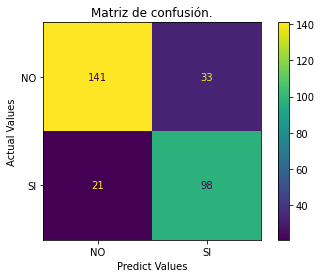

Precision,Recall,Accuracy,F1
0.75,0.82,0.82,0.78


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 1.000
Test Accuracy : 0.850
Best Score Through Grid Search : 0.822
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


Random forest optimizado

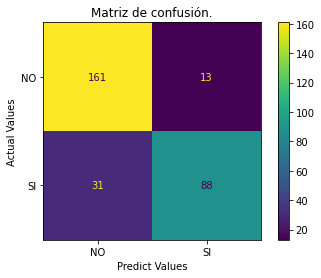

Precision,Recall,Accuracy,F1
0.87,0.74,0.85,0.80


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.638
Test Accuracy : 0.614
Best Score Through Grid Search : 0.634
Best Parameters :  {'C': 0.1, 'gamma': 0.0001, 'kernel': 'rbf'}


rbf

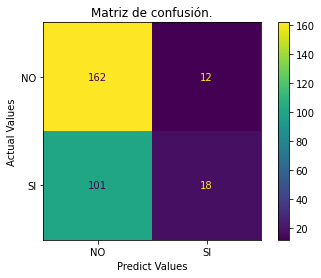

Precision,Recall,Accuracy,F1
0.60,0.15,0.61,0.24


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.612
Test Accuracy : 0.594
Best Score Through Grid Search : 0.613
Best Parameters :  {'C': 0.1, 'coef0': 1, 'gamma': 1e-05, 'kernel': 'sigmoid'}


sigmoid

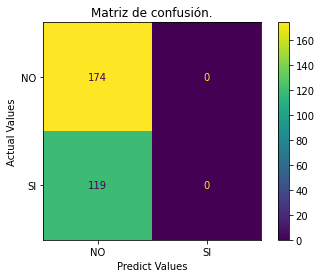

Precision,Recall,Accuracy,F1
0.00,0.00,0.59,0.00


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-09 18:52:44,301] A new study created in memory with name: LGBM Classifier


[I 2022-06-09 18:52:44,492] Trial 0 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22318468674713343, 'num_leaves': 658, 'max_depth': 8, 'min_data_in_leaf': 5500, 'lambda_l1': 0.09912259119561395, 'lambda_l2': 97.2700163305078, 'min_gain_to_split': 8.120188542242378, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=8.120188542242378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.120188542242378
[LightGBM] [Warning] lambda_l1 is set=0.09912259119561395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09912259119561395
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=97.2700163305078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.2700163305078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be

[I 2022-06-09 18:52:44,687] Trial 1 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05949437584440777, 'num_leaves': 658, 'max_depth': 3, 'min_data_in_leaf': 5000, 'lambda_l1': 4.016588660963701, 'lambda_l2': 42.754367697756926, 'min_gain_to_split': 9.509784900454093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=9.509784900454093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.509784900454093
[LightGBM] [Warning] lambda_l1 is set=4.016588660963701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.016588660963701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.754367697756926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.754367697756926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:44,885] Trial 2 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12236204559041557, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 1300, 'lambda_l1': 7.974613475845448, 'lambda_l2': 55.643988649155084, 'min_gain_to_split': 0.6067118509359504, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067118509359504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067118509359504
[LightGBM] [Warning] lambda_l1 is set=7.974613475845448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.974613475845448
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=55.643988649155084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.643988649155084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:45,089] Trial 3 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04049368861317519, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 5600, 'lambda_l1': 0.6504952272365072, 'lambda_l2': 22.051767530262033, 'min_gain_to_split': 4.769682463810728, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=4.769682463810728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.769682463810728
[LightGBM] [Warning] lambda_l1 is set=0.6504952272365072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504952272365072
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.051767530262033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.051767530262033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:45,291] Trial 4 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12427049922454127, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 7300, 'lambda_l1': 2.0545390017709018, 'lambda_l2': 32.83667899987657, 'min_gain_to_split': 3.4521651199091288, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=3.4521651199091288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4521651199091288
[LightGBM] [Warning] lambda_l1 is set=2.0545390017709018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0545390017709018
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=32.83667899987657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.83667899987657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=6.522271921234993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.522271921234993
[LightGBM] [Warning] lambda_l1 is set=3.3932340597705837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3932340597705837
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.28088658864621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.28088658864621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-09 18:52:45,543] Trial 5 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24454480666096798, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 6700, 'lambda_l1': 3.3932340597705837, 'lambda_l2': 26.28088658864621, 'min_gain_to_split': 6.522271921234993, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=6.522271921234993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.522271921234993
[LightGBM] [Warning] lambda_l1 is set=3.3932340597705837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3932340597705837
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.28088658864621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.28088658864621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-09 18:52:45,794] Trial 6 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26022528127915584, 'num_leaves': 648, 'max_depth': 9, 'min_data_in_leaf': 9100, 'lambda_l1': 3.7410575413037916, 'lambda_l2': 91.65574277023254, 'min_gain_to_split': 10.070732028275923, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=10.070732028275923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.070732028275923
[LightGBM] [Warning] lambda_l1 is set=3.7410575413037916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7410575413037916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=91.65574277023254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.65574277023254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 wi

[I 2022-06-09 18:52:46,043] Trial 7 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1319556596300827, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 9000, 'lambda_l1': 7.444285747950147, 'lambda_l2': 13.999757629649201, 'min_gain_to_split': 7.455969063341385, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=7.455969063341385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455969063341385
[LightGBM] [Warning] lambda_l1 is set=7.444285747950147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444285747950147
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.999757629649201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.999757629649201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-09 18:52:46,289] Trial 8 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20639462440897408, 'num_leaves': 518, 'max_depth': 4, 'min_data_in_leaf': 7300, 'lambda_l1': 6.207437303891442, 'lambda_l2': 84.34001778536468, 'min_gain_to_split': 7.837596252215321, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=7.837596252215321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.837596252215321
[LightGBM] [Warning] lambda_l1 is set=6.207437303891442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.207437303891442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=84.34001778536468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34001778536468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=7.1957498219193585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1957498219193585
[LightGBM] [Warning] lambda_l1 is set=0.9359201966469177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9359201966469177
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=22.9233457833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.9233457833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-09 18:52:46,547] Trial 9 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03764306413575061, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 5600, 'lambda_l1': 0.9359201966469177, 'lambda_l2': 22.9233457833538, 'min_gain_to_split': 7.1957498219193585, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=7.1957498219193585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1957498219193585
[LightGBM] [Warning] lambda_l1 is set=0.9359201966469177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9359201966469177
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=22.9233457833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.9233457833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-09 18:52:46,846] Trial 10 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19611424081247922, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 3000, 'lambda_l1': 9.714518513644972, 'lambda_l2': 69.90316093590314, 'min_gain_to_split': 14.929417613317204, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=14.929417613317204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.929417613317204
[LightGBM] [Warning] lambda_l1 is set=9.714518513644972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714518513644972
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90316093590314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90316093590314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=11.434430118168288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.434430118168288
[LightGBM] [Warning] lambda_l1 is set=4.465500851770001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465500851770001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.43681356243487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.43681356243487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:52:47,139] Trial 11 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18510746767326886, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 3300, 'lambda_l1': 4.465500851770001, 'lambda_l2': 49.43681356243487, 'min_gain_to_split': 11.434430118168288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=11.434430118168288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.434430118168288
[LightGBM] [Warning] lambda_l1 is set=4.465500851770001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465500851770001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.43681356243487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.43681356243487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:47,440] Trial 12 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08490678222157846, 'num_leaves': 718, 'max_depth': 3, 'min_data_in_leaf': 3800, 'lambda_l1': 2.35943830236884, 'lambda_l2': 47.13410548774874, 'min_gain_to_split': 10.98511994090434, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=10.98511994090434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.98511994090434
[LightGBM] [Warning] lambda_l1 is set=2.35943830236884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.35943830236884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.13410548774874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.13410548774874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=13.3814260061534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.3814260061534
[LightGBM] [Warning] lambda_l1 is set=0.05403434518553701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05403434518553701
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.9891635692135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9891635692135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 18:52:47,745] Trial 13 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2933454592253538, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 4400, 'lambda_l1': 0.05403434518553701, 'lambda_l2': 68.9891635692135, 'min_gain_to_split': 13.3814260061534, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=13.3814260061534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.3814260061534
[LightGBM] [Warning] lambda_l1 is set=0.05403434518553701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05403434518553701
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.9891635692135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9891635692135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:48,051] Trial 14 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07965999910446867, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 5.923791171040158, 'lambda_l2': 4.211979197287761, 'min_gain_to_split': 9.397500423090694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.397500423090694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.397500423090694
[LightGBM] [Warning] lambda_l1 is set=5.923791171040158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.923791171040158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211979197287761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211979197287761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=5.012547178603515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.012547178603515
[LightGBM] [Warning] lambda_l1 is set=2.1705811039905196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1705811039905196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.3676855344797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.3676855344797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.600

[I 2022-06-09 18:52:48,364] Trial 15 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013618008649524338, 'num_leaves': 78, 'max_depth': 3, 'min_data_in_leaf': 2200, 'lambda_l1': 2.1705811039905196, 'lambda_l2': 39.3676855344797, 'min_gain_to_split': 5.012547178603515, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=5.012547178603515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.012547178603515
[LightGBM] [Warning] lambda_l1 is set=2.1705811039905196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1705811039905196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.3676855344797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.3676855344797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, 

[I 2022-06-09 18:52:48,671] Trial 16 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1648893207527455, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 5.398281041319336, 'lambda_l2': 67.82695758603172, 'min_gain_to_split': 12.662280259889547, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.6694857375811027.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=12.662280259889547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662280259889547
[LightGBM] [Warning] lambda_l1 is set=5.398281041319336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.398281041319336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.82695758603172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.82695758603172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.117368780606203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.117368780606203
[LightGBM] [Warning] lambda_l1 is set=6.457514841544033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.457514841544033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0949029277703026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0949029277703026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.117368780606203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.117368780606203
[LightGBM] [Warning] lambda_l1 is set=6.457514841544033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.457514841544033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0949029277703026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0949029277703026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:49,275] Trial 17 finished with value: 0.5213707164744654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0890901016055151, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 300, 'lambda_l1': 6.457514841544033, 'lambda_l2': 2.0949029277703026, 'min_gain_to_split': 9.117368780606203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 17 with value: 0.5213707164744654.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.117368780606203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.117368780606203
[LightGBM] [Warning] lambda_l1 is set=6.457514841544033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.457514841544033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0949029277703026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0949029277703026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current

[I 2022-06-09 18:52:49,594] Trial 18 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013882891808854188, 'num_leaves': 8, 'max_depth': 5, 'min_data_in_leaf': 2000, 'lambda_l1': 7.864320046438857, 'lambda_l2': 0.3248294389963182, 'min_gain_to_split': 4.279586392694815, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.5213707164744654.


[LightGBM] [Warning] lambda_l1 is set=7.864320046438857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.864320046438857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.3248294389963182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3248294389963182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=4.279586392694815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.279586392694815
[LightGBM] [Warning] lambda_l1 is set=7.86432004

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5417887588776376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5417887588776376
[LightGBM] [Warning] lambda_l1 is set=9.443849949364818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.443849949364818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.42050198854861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.42050198854861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:49,907] Trial 19 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23435961921734957, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 9.443849949364818, 'lambda_l2': 98.42050198854861, 'min_gain_to_split': 1.5417887588776376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 17 with value: 0.5213707164744654.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5417887588776376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5417887588776376
[LightGBM] [Warning] lambda_l1 is set=9.443849949364818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.443849949364818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.42050198854861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.42050198854861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:50,230] Trial 20 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09658329005136346, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 9900, 'lambda_l1': 6.643610316062572, 'lambda_l2': 80.98625386530635, 'min_gain_to_split': 8.72212299376999, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 17 with value: 0.5213707164744654.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=8.72212299376999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72212299376999
[LightGBM] [Warning] lambda_l1 is set=6.643610316062572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.643610316062572
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=80.98625386530635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.98625386530635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=5.418644912873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.418644912873564
[LightGBM] [Warning] lambda_l1 is set=8.440613486331834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.440613486331834
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.391495604489476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.391495604489476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.600

[I 2022-06-09 18:52:50,551] Trial 21 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01022224485661033, 'num_leaves': 88, 'max_depth': 6, 'min_data_in_leaf': 2100, 'lambda_l1': 8.440613486331834, 'lambda_l2': 5.391495604489476, 'min_gain_to_split': 5.418644912873564, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.5213707164744654.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=5.418644912873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.418644912873564
[LightGBM] [Warning] lambda_l1 is set=8.440613486331834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.440613486331834
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.391495604489476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.391495604489476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, 

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5642411945499815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642411945499815
[LightGBM] [Warning] lambda_l1 is set=9.388590821903694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.388590821903694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.95946956301391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.95946956301391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5642411945499815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642411945499815
[LightGBM] [Warning] lambda_l1 is set=9.388590821903694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.388590821903694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.95946956301391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.95946956301391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5642411945499815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642411945499815
[LightGBM] [Warning] lambda_l1 is set=9.388590821903694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.388590821903694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.95946956301391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.95946956301391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5642411945499815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642411945499815
[LightGBM] [Warning] lambda_l1 is set=9.388590821903694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.388590821903694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.95946956301391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.95946956301391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:52:52,070] Trial 22 finished with value: 0.4601167446974683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22815778495040517, 'num_leaves': 238, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 9.388590821903694, 'lambda_l2': 99.95946956301391, 'min_gain_to_split': 0.5642411945499815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=2.679415926850916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.679415926850916
[LightGBM] [Warning] lambda_l1 is set=6.835839778113057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.835839778113057
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=80.64106752852348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.64106752852348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:52,399] Trial 23 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10998384632919327, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 9600, 'lambda_l1': 6.835839778113057, 'lambda_l2': 80.64106752852348, 'min_gain_to_split': 2.679415926850916, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=2.679415926850916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.679415926850916
[LightGBM] [Warning] lambda_l1 is set=6.835839778113057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.835839778113057
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=80.64106752852348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.64106752852348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:52,723] Trial 24 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22007979186375845, 'num_leaves': 238, 'max_depth': 9, 'min_data_in_leaf': 1300, 'lambda_l1': 8.933351471835032, 'lambda_l2': 96.66318539121879, 'min_gain_to_split': 8.576744283484418, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.576744283484418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.576744283484418
[LightGBM] [Warning] lambda_l1 is set=8.933351471835032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.933351471835032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.66318539121879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.66318539121879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=6.294892360238359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.294892360238359
[LightGBM] [Warning] lambda_l1 is set=9.96629563117391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.96629563117391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.96157363148485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.96157363148485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:52:53,051] Trial 25 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27391214225018784, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 6100, 'lambda_l1': 9.96629563117391, 'lambda_l2': 90.96157363148485, 'min_gain_to_split': 6.294892360238359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=6.294892360238359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.294892360238359
[LightGBM] [Warning] lambda_l1 is set=9.96629563117391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.96629563117391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.96157363148485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.96157363148485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.916564461550326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.916564461550326
[LightGBM] [Warning] lambda_l1 is set=4.927976015784119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.927976015784119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.04129030774762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.04129030774762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.916564461550326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.916564461550326
[LightGBM] [Warning] lambda_l1 is set=4.927976015784119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.927976015784119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.04129030774762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.04129030774762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:53,840] Trial 26 finished with value: 0.5599323125046183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15676759021025574, 'num_leaves': 208, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.927976015784119, 'lambda_l2': 60.04129030774762, 'min_gain_to_split': 10.916564461550326, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.413572094932453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.413572094932453
[LightGBM] [Warning] lambda_l1 is set=5.172199823665983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172199823665983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.78474706259608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.78474706259608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.413572094932453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.413572094932453
[LightGBM] [Warning] lambda_l1 is set=5.172199823665983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172199823665983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.78474706259608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.78474706259608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:54,462] Trial 27 finished with value: 0.5154434311083447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15190923466991813, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.172199823665983, 'lambda_l2': 58.78474706259608, 'min_gain_to_split': 11.413572094932453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.413572094932453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.413572094932453
[LightGBM] [Warning] lambda_l1 is set=5.172199823665983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172199823665983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.78474706259608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.78474706259608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.254585668494947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.254585668494947
[LightGBM] [Warning] lambda_l1 is set=7.176572858727345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.176572858727345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.47989641681674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.47989641681674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:52:55,038] Trial 28 finished with value: 0.5202493487813701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17280116899586187, 'num_leaves': 128, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 7.176572858727345, 'lambda_l2': 60.47989641681674, 'min_gain_to_split': 12.254585668494947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.254585668494947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.254585668494947
[LightGBM] [Warning] lambda_l1 is set=7.176572858727345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.176572858727345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.47989641681674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.47989641681674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.864123508928191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.864123508928191
[LightGBM] [Warning] lambda_l1 is set=7.292930879555495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.292930879555495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=73.92890856097293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.92890856097293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:55,375] Trial 29 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17071487604576124, 'num_leaves': 128, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 7.292930879555495, 'lambda_l2': 73.92890856097293, 'min_gain_to_split': 12.864123508928191, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.864123508928191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.864123508928191
[LightGBM] [Warning] lambda_l1 is set=7.292930879555495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.292930879555495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=73.92890856097293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.92890856097293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:55,714] Trial 30 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14317184386267273, 'num_leaves': 18, 'max_depth': 7, 'min_data_in_leaf': 2500, 'lambda_l1': 8.68399145295356, 'lambda_l2': 59.82092220088806, 'min_gain_to_split': 14.962130183378223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=14.962130183378223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.962130183378223
[LightGBM] [Warning] lambda_l1 is set=8.68399145295356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68399145295356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.82092220088806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.82092220088806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.000456353504815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.000456353504815
[LightGBM] [Warning] lambda_l1 is set=5.228512959749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.228512959749536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.62313164439204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.62313164439204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.000456353504815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.000456353504815
[LightGBM] [Warning] lambda_l1 is set=5.228512959749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.228512959749536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.62313164439204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.62313164439204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 18:52:56,270] Trial 31 finished with value: 0.5114265916390143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18746632633055701, 'num_leaves': 288, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.228512959749536, 'lambda_l2': 56.62313164439204, 'min_gain_to_split': 12.000456353504815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.000456353504815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.000456353504815
[LightGBM] [Warning] lambda_l1 is set=5.228512959749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.228512959749536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.62313164439204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.62313164439204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.861959996394564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.861959996394564
[LightGBM] [Warning] lambda_l1 is set=5.572530386637271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.572530386637271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.8566320459202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.8566320459202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.861959996394564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.861959996394564
[LightGBM] [Warning] lambda_l1 is set=5.572530386637271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.572530386637271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.8566320459202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.8566320459202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:52:56,955] Trial 32 finished with value: 0.5150183872289318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.185797008242586, 'num_leaves': 268, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.572530386637271, 'lambda_l2': 55.8566320459202, 'min_gain_to_split': 11.861959996394564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.861959996394564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.861959996394564
[LightGBM] [Warning] lambda_l1 is set=5.572530386637271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.572530386637271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.8566320459202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.8566320459202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.758935349460335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.758935349460335
[LightGBM] [Warning] lambda_l1 is set=5.019720313827679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.019720313827679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.565672227418304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.565672227418304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:57,303] Trial 33 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2089409068976638, 'num_leaves': 288, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 5.019720313827679, 'lambda_l2': 52.565672227418304, 'min_gain_to_split': 13.758935349460335, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.1379486046069882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1379486046069882
[LightGBM] [Warning] lambda_l1 is set=5.505837319511598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505837319511598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.753905452051086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.753905452051086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:57,651] Trial 34 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18574701367442295, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 5.505837319511598, 'lambda_l2': 40.753905452051086, 'min_gain_to_split': 0.1379486046069882, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_gain_to_split is set=0.1379486046069882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1379486046069882
[LightGBM] [Warning] lambda_l1 is set=5.505837319511598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505837319511598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.753905452051086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.753905452051086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.1379486046069882, min_split_gain=0.0 will be ignored. Curr

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=11.739436671035504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.739436671035504
[LightGBM] [Warning] lambda_l1 is set=2.8900660905542237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8900660905542237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.701537113271826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.701537113271826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:58,008] Trial 35 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14237605622431018, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 2.8900660905542237, 'lambda_l2': 34.701537113271826, 'min_gain_to_split': 11.739436671035504, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.360214765818187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.360214765818187
[LightGBM] [Warning] lambda_l1 is set=4.4576157547383595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4576157547383595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.29939486598349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.29939486598349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.360214765818187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.360214765818187
[LightGBM] [Warning] lambda_l1 is set=4.4576157547383595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4576157547383595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.29939486598349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.29939486598349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:58,661] Trial 36 finished with value: 0.5096084609689955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2280829383662603, 'num_leaves': 308, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.4576157547383595, 'lambda_l2': 47.29939486598349, 'min_gain_to_split': 10.360214765818187, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.360214765818187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.360214765818187
[LightGBM] [Warning] lambda_l1 is set=4.4576157547383595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4576157547383595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.29939486598349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.29939486598349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=10.304418763857278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.304418763857278
[LightGBM] [Warning] lambda_l1 is set=4.231552989918374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.231552989918374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.70413528319524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.70413528319524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:52:59,020] Trial 37 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24738390227221502, 'num_leaves': 308, 'max_depth': 9, 'min_data_in_leaf': 2800, 'lambda_l1': 4.231552989918374, 'lambda_l2': 45.70413528319524, 'min_gain_to_split': 10.304418763857278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=10.304418763857278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.304418763857278
[LightGBM] [Warning] lambda_l1 is set=4.231552989918374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.231552989918374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.70413528319524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.70413528319524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will b

[I 2022-06-09 18:52:59,380] Trial 38 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22817662824907936, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 1700, 'lambda_l1': 3.5704096518898782, 'lambda_l2': 29.027280457546432, 'min_gain_to_split': 13.928181271517523, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.928181271517523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.928181271517523
[LightGBM] [Warning] lambda_l1 is set=3.5704096518898782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5704096518898782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.027280457546432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.027280457546432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.154098098789571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.154098098789571
[LightGBM] [Warning] lambda_l1 is set=5.785089812977151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.785089812977151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.103142710522363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.103142710522363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:52:59,747] Trial 39 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26191276002757924, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 5.785089812977151, 'lambda_l2': 16.103142710522363, 'min_gain_to_split': 10.154098098789571, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.154098098789571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.154098098789571
[LightGBM] [Warning] lambda_l1 is set=5.785089812977151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.785089812977151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.103142710522363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.103142710522363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2997405614903141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2997405614903141
[LightGBM] [Warning] lambda_l1 is set=4.605506807038778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.605506807038778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.88234413758891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.88234413758891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:00,111] Trial 40 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20837850655221313, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 4.605506807038778, 'lambda_l2': 54.88234413758891, 'min_gain_to_split': 1.2997405614903141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_gain_to_split is set=1.2997405614903141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2997405614903141
[LightGBM] [Warning] lambda_l1 is set=4.605506807038778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.605506807038778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.88234413758891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.88234413758891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.893209568240291, min_split_gain=0.0 will be ignored. Current 

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.893209568240291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.893209568240291
[LightGBM] [Warning] lambda_l1 is set=3.918999880298645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.918999880298645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.2271038477494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.2271038477494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:00,725] Trial 41 finished with value: 0.5293290691167305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1881619326396403, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.918999880298645, 'lambda_l2': 64.2271038477494, 'min_gain_to_split': 11.893209568240291, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.893209568240291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.893209568240291
[LightGBM] [Warning] lambda_l1 is set=3.918999880298645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.918999880298645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.2271038477494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.2271038477494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.091201993577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.091201993577263
[LightGBM] [Warning] lambda_l1 is set=3.2010109537395977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2010109537395977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=56.22195817076941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22195817076941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.091201993577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.091201993577263
[LightGBM] [Warning] lambda_l1 is set=3.2010109537395977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2010109537395977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=56.22195817076941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22195817076941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:01,299] Trial 42 finished with value: 0.5099192665804136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22349458325836624, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.2010109537395977, 'lambda_l2': 56.22195817076941, 'min_gain_to_split': 11.091201993577263, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.091201993577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.091201993577263
[LightGBM] [Warning] lambda_l1 is set=3.2010109537395977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2010109537395977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=56.22195817076941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22195817076941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.915944086996749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.915944086996749
[LightGBM] [Warning] lambda_l1 is set=3.3259414038879216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3259414038879216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.29647876982058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.29647876982058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:53:01,670] Trial 43 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22043028233752263, 'num_leaves': 308, 'max_depth': 8, 'min_data_in_leaf': 1800, 'lambda_l1': 3.3259414038879216, 'lambda_l2': 74.29647876982058, 'min_gain_to_split': 9.915944086996749, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.915944086996749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.915944086996749
[LightGBM] [Warning] lambda_l1 is set=3.3259414038879216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3259414038879216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.29647876982058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.29647876982058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:53:02,042] Trial 44 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24454337426405498, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 1400, 'lambda_l1': 2.916621265159838, 'lambda_l2': 43.79430049579524, 'min_gain_to_split': 10.497599862495589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.497599862495589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497599862495589
[LightGBM] [Warning] lambda_l1 is set=2.916621265159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.916621265159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79430049579524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79430049579524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.641667066443556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.641667066443556
[LightGBM] [Warning] lambda_l1 is set=1.5615066501359816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5615066501359816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.10485229638182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.10485229638182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.641667066443556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.641667066443556
[LightGBM] [Warning] lambda_l1 is set=1.5615066501359816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5615066501359816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.10485229638182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.10485229638182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:02,675] Trial 45 finished with value: 0.5097385362929511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2003166664117277, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5615066501359816, 'lambda_l2': 36.10485229638182, 'min_gain_to_split': 12.641667066443556, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.641667066443556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.641667066443556
[LightGBM] [Warning] lambda_l1 is set=1.5615066501359816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5615066501359816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.10485229638182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.10485229638182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=14.110689276898764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.110689276898764
[LightGBM] [Warning] lambda_l1 is set=0.9555228178831321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555228178831321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.522970475810716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.522970475810716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 18:53:03,060] Trial 46 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20055322764835296, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 8400, 'lambda_l1': 0.9555228178831321, 'lambda_l2': 36.522970475810716, 'min_gain_to_split': 14.110689276898764, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=14.110689276898764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.110689276898764
[LightGBM] [Warning] lambda_l1 is set=0.9555228178831321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555228178831321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.522970475810716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.522970475810716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.933572092826237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.933572092826237
[LightGBM] [Warning] lambda_l1 is set=1.6411704033730885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411704033730885
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.60411255804004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.60411255804004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. 

[I 2022-06-09 18:53:03,449] Trial 47 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27953066425482764, 'num_leaves': 388, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 1.6411704033730885, 'lambda_l2': 29.60411255804004, 'min_gain_to_split': 12.933572092826237, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.933572092826237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.933572092826237
[LightGBM] [Warning] lambda_l1 is set=1.6411704033730885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411704033730885
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.60411255804004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.60411255804004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will b

[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=6.963829452961732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.963829452961732
[LightGBM] [Warning] lambda_l1 is set=1.6086943909849971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6086943909849971
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.19584698628162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.19584698628162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:53:03,835] Trial 48 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2373329085356905, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 1.6086943909849971, 'lambda_l2': 50.19584698628162, 'min_gain_to_split': 6.963829452961732, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=6.963829452961732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.963829452961732
[LightGBM] [Warning] lambda_l1 is set=1.6086943909849971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6086943909849971
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.19584698628162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.19584698628162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.001265228603968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.001265228603968
[LightGBM] [Warning] lambda_l1 is set=0.5394093811877996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394093811877996
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=20.294343787603342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.294343787603342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-09 18:53:04,236] Trial 49 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25933106414561374, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.5394093811877996, 'lambda_l2': 20.294343787603342, 'min_gain_to_split': 11.001265228603968, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.001265228603968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.001265228603968
[LightGBM] [Warning] lambda_l1 is set=0.5394093811877996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394093811877996
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=20.294343787603342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.294343787603342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will

[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=7.842548873977004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.842548873977004
[LightGBM] [Warning] lambda_l1 is set=2.7508614281459303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7508614281459303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.616249389583054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.616249389583054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will

[I 2022-06-09 18:53:04,624] Trial 50 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21828160178578765, 'num_leaves': 328, 'max_depth': 10, 'min_data_in_leaf': 2600, 'lambda_l1': 2.7508614281459303, 'lambda_l2': 38.616249389583054, 'min_gain_to_split': 7.842548873977004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=7.842548873977004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.842548873977004
[LightGBM] [Warning] lambda_l1 is set=2.7508614281459303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7508614281459303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.616249389583054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.616249389583054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_gain_to_split is set=12.189207723888607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.189207723888607
[LightGBM] [Warning] lambda_l1 is set=4.638434517894855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.638434517894855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=54.436157197488626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.436157197488626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=12.189207723888607, min_split_gain=0.0 will be ignored. Curr

[I 2022-06-09 18:53:05,017] Trial 51 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19723090770501206, 'num_leaves': 248, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 4.638434517894855, 'lambda_l2': 54.436157197488626, 'min_gain_to_split': 12.189207723888607, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=12.189207723888607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.189207723888607
[LightGBM] [Warning] lambda_l1 is set=4.638434517894855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.638434517894855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=54.436157197488626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.436157197488626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.466320845356584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.466320845356584
[LightGBM] [Warning] lambda_l1 is set=6.131678368516996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.131678368516996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.55876262599676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.55876262599676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:05,619] Trial 52 finished with value: 0.5214247095834532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18257322901517486, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 6.131678368516996, 'lambda_l2': 64.55876262599676, 'min_gain_to_split': 12.466320845356584, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.466320845356584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.466320845356584
[LightGBM] [Warning] lambda_l1 is set=6.131678368516996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.131678368516996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.55876262599676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.55876262599676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.214502839434248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.214502839434248
[LightGBM] [Warning] lambda_l1 is set=4.077700910266769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.077700910266769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.225686069665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.225686069665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.214502839434248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.214502839434248
[LightGBM] [Warning] lambda_l1 is set=4.077700910266769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.077700910266769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.225686069665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.225686069665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-09 18:53:06,151] Trial 53 finished with value: 0.5112044152900479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21645968156511375, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.077700910266769, 'lambda_l2': 49.225686069665, 'min_gain_to_split': 13.214502839434248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.214502839434248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.214502839434248
[LightGBM] [Warning] lambda_l1 is set=4.077700910266769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.077700910266769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.225686069665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.225686069665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.396758132111124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.396758132111124
[LightGBM] [Warning] lambda_l1 is set=3.221976305854408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221976305854408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.02730633297772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.02730633297772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 18:53:06,552] Trial 54 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21248482195007423, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 3.221976305854408, 'lambda_l2': 48.02730633297772, 'min_gain_to_split': 14.396758132111124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.396758132111124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.396758132111124
[LightGBM] [Warning] lambda_l1 is set=3.221976305854408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221976305854408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.02730633297772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.02730633297772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=13.339353317280874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.339353317280874
[LightGBM] [Warning] lambda_l1 is set=3.9941578064997345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9941578064997345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.27256505445888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.27256505445888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-09 18:53:06,955] Trial 55 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2302489216423824, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 1500, 'lambda_l1': 3.9941578064997345, 'lambda_l2': 43.27256505445888, 'min_gain_to_split': 13.339353317280874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=13.339353317280874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.339353317280874
[LightGBM] [Warning] lambda_l1 is set=3.9941578064997345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9941578064997345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.27256505445888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.27256505445888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_gain_to_split is set=13.31231573874067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.31231573874067
[LightGBM] [Warning] lambda_l1 is set=1.6480688603151195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6480688603151195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15093173271641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15093173271641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=13.31231573874067, min_split_gain=0.0 will be ignored. Current

[I 2022-06-09 18:53:07,358] Trial 56 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2534844626377908, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 4300, 'lambda_l1': 1.6480688603151195, 'lambda_l2': 33.15093173271641, 'min_gain_to_split': 13.31231573874067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=13.31231573874067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.31231573874067
[LightGBM] [Warning] lambda_l1 is set=1.6480688603151195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6480688603151195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15093173271641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15093173271641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.043425147655316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.043425147655316
[LightGBM] [Warning] lambda_l1 is set=2.5249402595539907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5249402595539907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=24.54145111522912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54145111522912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will 

[I 2022-06-09 18:53:07,772] Trial 57 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2412133439635671, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.5249402595539907, 'lambda_l2': 24.54145111522912, 'min_gain_to_split': 11.043425147655316, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.043425147655316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.043425147655316
[LightGBM] [Warning] lambda_l1 is set=2.5249402595539907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5249402595539907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=24.54145111522912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54145111522912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2

[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=3.041809871513855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.041809871513855
[LightGBM] [Warning] lambda_l1 is set=4.207723902807654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207723902807654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.11651949989399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.11651949989399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be 

[I 2022-06-09 18:53:08,177] Trial 58 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19903386832339726, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 2300, 'lambda_l1': 4.207723902807654, 'lambda_l2': 49.11651949989399, 'min_gain_to_split': 3.041809871513855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=3.041809871513855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.041809871513855
[LightGBM] [Warning] lambda_l1 is set=4.207723902807654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207723902807654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.11651949989399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.11651949989399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.98460112500994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.98460112500994
[LightGBM] [Warning] lambda_l1 is set=1.2843019590386642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843019590386642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.61569082679449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.61569082679449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 18:53:08,589] Trial 59 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27159984332990617, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 1.2843019590386642, 'lambda_l2': 87.61569082679449, 'min_gain_to_split': 8.98460112500994, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.98460112500994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.98460112500994
[LightGBM] [Warning] lambda_l1 is set=1.2843019590386642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843019590386642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.61569082679449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.61569082679449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=9.482346963289976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.482346963289976
[LightGBM] [Warning] lambda_l1 is set=2.0846868898852917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0846868898852917
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.03535643023305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03535643023305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:53:09,004] Trial 60 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22601914910171253, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 2.0846868898852917, 'lambda_l2': 64.03535643023305, 'min_gain_to_split': 9.482346963289976, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=9.482346963289976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.482346963289976
[LightGBM] [Warning] lambda_l1 is set=2.0846868898852917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0846868898852917
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.03535643023305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03535643023305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.628290965676648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.628290965676648
[LightGBM] [Warning] lambda_l1 is set=5.438434084478669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.438434084478669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.887362566873435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.887362566873435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.628290965676648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.628290965676648
[LightGBM] [Warning] lambda_l1 is set=5.438434084478669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.438434084478669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.887362566873435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.887362566873435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:09,667] Trial 61 finished with value: 0.5144876402311424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1890109233397712, 'num_leaves': 278, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.438434084478669, 'lambda_l2': 51.887362566873435, 'min_gain_to_split': 11.628290965676648, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.903505166305195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.903505166305195
[LightGBM] [Warning] lambda_l1 is set=4.841592529369231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.841592529369231
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.35534042417311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.35534042417311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.903505166305195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.903505166305195
[LightGBM] [Warning] lambda_l1 is set=4.841592529369231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.841592529369231
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.35534042417311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.35534042417311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:10,377] Trial 62 finished with value: 0.5167916644293449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17013012717704085, 'num_leaves': 298, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.841592529369231, 'lambda_l2': 51.35534042417311, 'min_gain_to_split': 12.903505166305195, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.903505166305195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.903505166305195
[LightGBM] [Warning] lambda_l1 is set=4.841592529369231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.841592529369231
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.35534042417311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.35534042417311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.542464516619091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.542464516619091
[LightGBM] [Warning] lambda_l1 is set=3.671405265939179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.671405265939179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.085532503302574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.085532503302574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 18:53:10,795] Trial 63 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2050923311933079, 'num_leaves': 228, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.671405265939179, 'lambda_l2': 46.085532503302574, 'min_gain_to_split': 11.542464516619091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.542464516619091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.542464516619091
[LightGBM] [Warning] lambda_l1 is set=3.671405265939179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.671405265939179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.085532503302574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.085532503302574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.240347661851423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.240347661851423
[LightGBM] [Warning] lambda_l1 is set=8.080967158035067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.080967158035067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.351943725688564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.351943725688564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 18:53:11,293] Trial 64 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1907164221904624, 'num_leaves': 338, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 8.080967158035067, 'lambda_l2': 38.351943725688564, 'min_gain_to_split': 8.240347661851423, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.240347661851423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.240347661851423
[LightGBM] [Warning] lambda_l1 is set=8.080967158035067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.080967158035067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.351943725688564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.351943725688564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.611917253384505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.611917253384505
[LightGBM] [Warning] lambda_l1 is set=4.291173430122286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291173430122286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.06379471812225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.06379471812225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:11,725] Trial 65 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21406446512721722, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 4.291173430122286, 'lambda_l2': 57.06379471812225, 'min_gain_to_split': 10.611917253384505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.611917253384505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.611917253384505
[LightGBM] [Warning] lambda_l1 is set=4.291173430122286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291173430122286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.06379471812225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.06379471812225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.487051751140232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.487051751140232
[LightGBM] [Warning] lambda_l1 is set=5.190743878430467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.190743878430467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.9399041239189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.9399041239189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.487051751140232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.487051751140232
[LightGBM] [Warning] lambda_l1 is set=5.190743878430467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.190743878430467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.9399041239189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.9399041239189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:12,361] Trial 66 finished with value: 0.5189162188615624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17928507903252583, 'num_leaves': 288, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.190743878430467, 'lambda_l2': 52.9399041239189, 'min_gain_to_split': 14.487051751140232, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.487051751140232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.487051751140232
[LightGBM] [Warning] lambda_l1 is set=5.190743878430467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.190743878430467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.9399041239189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.9399041239189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.787037866863269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.787037866863269
[LightGBM] [Warning] lambda_l1 is set=0.5496633561870672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496633561870672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.8360686955385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.8360686955385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 18:53:12,792] Trial 67 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.161625689240498, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 1500, 'lambda_l1': 0.5496633561870672, 'lambda_l2': 72.8360686955385, 'min_gain_to_split': 9.787037866863269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.787037866863269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.787037866863269
[LightGBM] [Warning] lambda_l1 is set=0.5496633561870672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496633561870672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.8360686955385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.8360686955385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=11.310748474383475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.310748474383475
[LightGBM] [Warning] lambda_l1 is set=9.309577904831476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.309577904831476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.37584354252905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37584354252905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:13,221] Trial 68 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.232406480860501, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 6500, 'lambda_l1': 9.309577904831476, 'lambda_l2': 42.37584354252905, 'min_gain_to_split': 11.310748474383475, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=11.310748474383475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.310748474383475
[LightGBM] [Warning] lambda_l1 is set=9.309577904831476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.309577904831476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.37584354252905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37584354252905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=12.296793745403889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.296793745403889
[LightGBM] [Warning] lambda_l1 is set=6.934360409197267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.934360409197267
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.309640981652105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.309640981652105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-09 18:53:13,713] Trial 69 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19483296364617791, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 6.934360409197267, 'lambda_l2': 30.309640981652105, 'min_gain_to_split': 12.296793745403889, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=12.296793745403889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.296793745403889
[LightGBM] [Warning] lambda_l1 is set=6.934360409197267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.934360409197267
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.309640981652105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.309640981652105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=13.611096771483842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.611096771483842
[LightGBM] [Warning] lambda_l1 is set=7.623777339626579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.623777339626579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.51269389453395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51269389453395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:14,149] Trial 70 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17547258568378307, 'num_leaves': 218, 'max_depth': 4, 'min_data_in_leaf': 7800, 'lambda_l1': 7.623777339626579, 'lambda_l2': 57.51269389453395, 'min_gain_to_split': 13.611096771483842, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=13.611096771483842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.611096771483842
[LightGBM] [Warning] lambda_l1 is set=7.623777339626579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.623777339626579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.51269389453395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51269389453395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.835325148400946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.835325148400946
[LightGBM] [Warning] lambda_l1 is set=5.621297675049269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.621297675049269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.20864801541302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20864801541302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.835325148400946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.835325148400946
[LightGBM] [Warning] lambda_l1 is set=5.621297675049269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.621297675049269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.20864801541302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20864801541302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:14,787] Trial 71 finished with value: 0.5169460563843516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21738972097369047, 'num_leaves': 268, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.621297675049269, 'lambda_l2': 55.20864801541302, 'min_gain_to_split': 11.835325148400946, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.835325148400946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.835325148400946
[LightGBM] [Warning] lambda_l1 is set=5.621297675049269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.621297675049269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=55.20864801541302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20864801541302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.977193904001836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.977193904001836
[LightGBM] [Warning] lambda_l1 is set=5.871653165864318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.871653165864318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.80612362178174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.80612362178174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:15,230] Trial 72 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2044538162052388, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 5.871653165864318, 'lambda_l2': 61.80612362178174, 'min_gain_to_split': 5.977193904001836, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.977193904001836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.977193904001836
[LightGBM] [Warning] lambda_l1 is set=5.871653165864318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.871653165864318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.80612362178174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.80612362178174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.59728920619989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.59728920619989
[LightGBM] [Warning] lambda_l1 is set=6.335903981280032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335903981280032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.33831864092636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.33831864092636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:15,673] Trial 73 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14846228815192478, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 6.335903981280032, 'lambda_l2': 67.33831864092636, 'min_gain_to_split': 12.59728920619989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.59728920619989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.59728920619989
[LightGBM] [Warning] lambda_l1 is set=6.335903981280032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335903981280032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.33831864092636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.33831864092636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.990268166780753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.990268166780753
[LightGBM] [Warning] lambda_l1 is set=5.40808929397027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40808929397027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.01295908627772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.01295908627772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:16,180] Trial 74 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13349188061991826, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 5.40808929397027, 'lambda_l2': 80.01295908627772, 'min_gain_to_split': 11.990268166780753, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.990268166780753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.990268166780753
[LightGBM] [Warning] lambda_l1 is set=5.40808929397027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40808929397027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.01295908627772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.01295908627772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.261075737488573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.261075737488573
[LightGBM] [Warning] lambda_l1 is set=4.676791161888858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.676791161888858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.135912726539502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.135912726539502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.261075737488573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.261075737488573
[LightGBM] [Warning] lambda_l1 is set=4.676791161888858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.676791161888858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.135912726539502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.135912726539502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:17,279] Trial 75 finished with value: 0.4689533900771221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19027080990513356, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.676791161888858, 'lambda_l2': 9.135912726539502, 'min_gain_to_split': 4.261075737488573, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.9711187632051903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9711187632051903
[LightGBM] [Warning] lambda_l1 is set=3.7184083030914117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7184083030914117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187810270342297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187810270342297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:17,735] Trial 76 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16345178973708085, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.7184083030914117, 'lambda_l2': 6.187810270342297, 'min_gain_to_split': 3.9711187632051903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.9711187632051903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9711187632051903
[LightGBM] [Warning] lambda_l1 is set=3.7184083030914117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7184083030914117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187810270342297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187810270342297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.9892689248943647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9892689248943647
[LightGBM] [Warning] lambda_l1 is set=4.522827679909052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522827679909052
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.41968357477376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.41968357477376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:18,200] Trial 77 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22549617288470705, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 5300, 'lambda_l1': 4.522827679909052, 'lambda_l2': 93.41968357477376, 'min_gain_to_split': 1.9892689248943647, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.9892689248943647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9892689248943647
[LightGBM] [Warning] lambda_l1 is set=4.522827679909052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522827679909052
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.41968357477376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.41968357477376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6412693764228841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6412693764228841
[LightGBM] [Warning] lambda_l1 is set=3.3678608502455143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3678608502455143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.491822825714749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.491822825714749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:53:18,658] Trial 78 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19354285088685408, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 3.3678608502455143, 'lambda_l2': 9.491822825714749, 'min_gain_to_split': 0.6412693764228841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6412693764228841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6412693764228841
[LightGBM] [Warning] lambda_l1 is set=3.3678608502455143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3678608502455143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.491822825714749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.491822825714749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.4710137738938744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4710137738938744
[LightGBM] [Warning] lambda_l1 is set=3.1002330395141104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1002330395141104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.839358876682184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.839358876682184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.4710137738938744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4710137738938744
[LightGBM] [Warning] lambda_l1 is set=3.1002330395141104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1002330395141104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.839358876682184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.839358876682184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-09 18:53:19,163] Trial 79 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25041498770469256, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.1002330395141104, 'lambda_l2': 15.839358876682184, 'min_gain_to_split': 2.4710137738938744, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.42446443149957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42446443149957
[LightGBM] [Warning] lambda_l1 is set=4.774138842277684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.774138842277684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.889438067263924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.889438067263924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:53:19,628] Trial 80 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21080125271927783, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 4.774138842277684, 'lambda_l2': 9.889438067263924, 'min_gain_to_split': 4.42446443149957, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.42446443149957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42446443149957
[LightGBM] [Warning] lambda_l1 is set=4.774138842277684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.774138842277684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.889438067263924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.889438067263924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.596553051925241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.596553051925241
[LightGBM] [Warning] lambda_l1 is set=5.253076672220749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253076672220749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.18458623441621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.18458623441621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.596553051925241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.596553051925241
[LightGBM] [Warning] lambda_l1 is set=5.253076672220749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253076672220749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.18458623441621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.18458623441621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:20,276] Trial 81 finished with value: 0.5152695025580992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.182395589754829, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.253076672220749, 'lambda_l2': 46.18458623441621, 'min_gain_to_split': 10.596553051925241, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.596553051925241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.596553051925241
[LightGBM] [Warning] lambda_l1 is set=5.253076672220749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253076672220749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.18458623441621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.18458623441621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.166115269988753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.166115269988753
[LightGBM] [Warning] lambda_l1 is set=4.335335708079835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.335335708079835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.80709294520041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.80709294520041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:20,960] Trial 82 finished with value: 0.5153956732254924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1904841176101809, 'num_leaves': 678, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.335335708079835, 'lambda_l2': 51.80709294520041, 'min_gain_to_split': 13.166115269988753, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.166115269988753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.166115269988753
[LightGBM] [Warning] lambda_l1 is set=4.335335708079835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.335335708079835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.80709294520041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.80709294520041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.158427811280154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.158427811280154
[LightGBM] [Warning] lambda_l1 is set=4.0591067794979585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0591067794979585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.82760652857785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.82760652857785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:21,437] Trial 83 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22219262993325462, 'num_leaves': 258, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 4.0591067794979585, 'lambda_l2': 61.82760652857785, 'min_gain_to_split': 11.158427811280154, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.158427811280154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.158427811280154
[LightGBM] [Warning] lambda_l1 is set=4.0591067794979585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0591067794979585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.82760652857785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.82760652857785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.658587982408005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.658587982408005
[LightGBM] [Warning] lambda_l1 is set=5.02460872985581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.02460872985581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.38603422531355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.38603422531355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.658587982408005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.658587982408005
[LightGBM] [Warning] lambda_l1 is set=5.02460872985581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.02460872985581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.38603422531355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.38603422531355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-09 18:53:22,121] Trial 84 finished with value: 0.5560400031694751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23436140148847315, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 5.02460872985581, 'lambda_l2': 57.38603422531355, 'min_gain_to_split': 11.658587982408005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.658587982408005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.658587982408005
[LightGBM] [Warning] lambda_l1 is set=5.02460872985581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.02460872985581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.38603422531355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.38603422531355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.7003399203272744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7003399203272744
[LightGBM] [Warning] lambda_l1 is set=6.142224155653787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142224155653787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.55155438638129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.55155438638129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-09 18:53:22,607] Trial 85 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20170650809926013, 'num_leaves': 288, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 6.142224155653787, 'lambda_l2': 21.55155438638129, 'min_gain_to_split': 3.7003399203272744, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.7003399203272744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7003399203272744
[LightGBM] [Warning] lambda_l1 is set=6.142224155653787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142224155653787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.55155438638129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.55155438638129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=12.658188302341099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.658188302341099
[LightGBM] [Warning] lambda_l1 is set=4.720983916877993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.720983916877993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.22829620711326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.22829620711326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:23,089] Trial 86 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05418421934518668, 'num_leaves': 208, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 4.720983916877993, 'lambda_l2': 77.22829620711326, 'min_gain_to_split': 12.658188302341099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=12.658188302341099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.658188302341099
[LightGBM] [Warning] lambda_l1 is set=4.720983916877993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.720983916877993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.22829620711326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.22829620711326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.165312797462075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.165312797462075
[LightGBM] [Warning] lambda_l1 is set=3.8513687608479215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8513687608479215
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.13867947587851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.13867947587851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.165312797462075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.165312797462075
[LightGBM] [Warning] lambda_l1 is set=3.8513687608479215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8513687608479215
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.13867947587851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.13867947587851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.165312797462075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.165312797462075
[LightGBM] [Warning] lambda_l1 is set=3.8513687608479215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8513687608479215
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.13867947587851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.13867947587851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:53:24,041] Trial 87 finished with value: 0.5602150864760569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16881445520319308, 'num_leaves': 238, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8513687608479215, 'lambda_l2': 41.13867947587851, 'min_gain_to_split': 12.165312797462075, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.165312797462075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.165312797462075
[LightGBM] [Warning] lambda_l1 is set=3.8513687608479215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8513687608479215
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.13867947587851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.13867947587851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.278668321770464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.278668321770464
[LightGBM] [Warning] lambda_l1 is set=5.665848076253262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665848076253262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.35058335512221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.35058335512221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_

[I 2022-06-09 18:53:24,530] Trial 88 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24011626397549962, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 5.665848076253262, 'lambda_l2': 66.35058335512221, 'min_gain_to_split': 5.278668321770464, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.278668321770464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.278668321770464
[LightGBM] [Warning] lambda_l1 is set=5.665848076253262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665848076253262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.35058335512221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.35058335512221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.83322035687021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83322035687021
[LightGBM] [Warning] lambda_l1 is set=2.5983511358804643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983511358804643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.99220717048915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.99220717048915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:25,013] Trial 89 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17811815169524362, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.5983511358804643, 'lambda_l2': 99.99220717048915, 'min_gain_to_split': 10.83322035687021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.83322035687021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83322035687021
[LightGBM] [Warning] lambda_l1 is set=2.5983511358804643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983511358804643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.99220717048915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.99220717048915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2013853715590384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013853715590384
[LightGBM] [Warning] lambda_l1 is set=4.423811095072454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423811095072454
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=70.15730084375195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.15730084375195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2013853715590384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013853715590384
[LightGBM] [Warning] lambda_l1 is set=4.423811095072454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423811095072454
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=70.15730084375195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.15730084375195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 18:53:25,547] Trial 90 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2098972285113234, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.423811095072454, 'lambda_l2': 70.15730084375195, 'min_gain_to_split': 1.2013853715590384, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2013853715590384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013853715590384
[LightGBM] [Warning] lambda_l1 is set=4.423811095072454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423811095072454
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=70.15730084375195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.15730084375195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.314335694262132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314335694262132
[LightGBM] [Warning] lambda_l1 is set=5.281688382967619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.281688382967619
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.88810277445427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.88810277445427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.314335694262132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314335694262132
[LightGBM] [Warning] lambda_l1 is set=5.281688382967619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.281688382967619
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.88810277445427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.88810277445427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[I 2022-06-09 18:53:26,323] Trial 91 finished with value: 0.5171852674450996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18629875949289718, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.281688382967619, 'lambda_l2': 44.88810277445427, 'min_gain_to_split': 10.314335694262132, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.819831817167533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.819831817167533
[LightGBM] [Warning] lambda_l1 is set=5.054188957205445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.054188957205445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.704971309021765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.704971309021765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.819831817167533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.819831817167533
[LightGBM] [Warning] lambda_l1 is set=5.054188957205445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.054188957205445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.704971309021765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.704971309021765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:27,081] Trial 92 finished with value: 0.5141772081332068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15770959153729164, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 5.054188957205445, 'lambda_l2': 48.704971309021765, 'min_gain_to_split': 9.819831817167533, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.819831817167533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.819831817167533
[LightGBM] [Warning] lambda_l1 is set=5.054188957205445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.054188957205445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.704971309021765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.704971309021765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.709798396917343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.709798396917343
[LightGBM] [Warning] lambda_l1 is set=5.9541740897985465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9541740897985465
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.51803460594744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.51803460594744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 18:53:27,597] Trial 93 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21664812530021066, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 5.9541740897985465, 'lambda_l2': 48.51803460594744, 'min_gain_to_split': 9.709798396917343, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.709798396917343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.709798396917343
[LightGBM] [Warning] lambda_l1 is set=5.9541740897985465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9541740897985465
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.51803460594744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.51803460594744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=9.26003535943229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.26003535943229
[LightGBM] [Warning] lambda_l1 is set=6.583439460760973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583439460760973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775444187847434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775444187847434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=9.26003535943229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.26003535943229
[LightGBM] [Warning] lambda_l1 is set=6.583439460760973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583439460760973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775444187847434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775444187847434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 18:53:28,101] Trial 94 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11854265080447078, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 1300, 'lambda_l1': 6.583439460760973, 'lambda_l2': 50.775444187847434, 'min_gain_to_split': 9.26003535943229, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.503168781333343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.503168781333343
[LightGBM] [Warning] lambda_l1 is set=5.032100999283148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.032100999283148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.784286784309536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.784286784309536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.503168781333343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.503168781333343
[LightGBM] [Warning] lambda_l1 is set=5.032100999283148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.032100999283148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.784286784309536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.784286784309536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:28,929] Trial 95 finished with value: 0.5268606556208433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589486706804348, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 5.032100999283148, 'lambda_l2': 35.784286784309536, 'min_gain_to_split': 11.503168781333343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.503168781333343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.503168781333343
[LightGBM] [Warning] lambda_l1 is set=5.032100999283148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.032100999283148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.784286784309536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.784286784309536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.040330517932745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.040330517932745
[LightGBM] [Warning] lambda_l1 is set=3.5636635185574885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5636635185574885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=54.891204056917026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.891204056917026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=54.891204056917026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.891204056917026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.040330517932745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.040330517932745
[LightGBM] [Warning] lambda_l1 is set=3.5636635185574885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5636635185574885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fr

[I 2022-06-09 18:53:29,443] Trial 96 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15221900537612842, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.5636635185574885, 'lambda_l2': 54.891204056917026, 'min_gain_to_split': 13.040330517932745, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.040330517932745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.040330517932745
[LightGBM] [Warning] lambda_l1 is set=3.5636635185574885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5636635185574885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=54.891204056917026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.891204056917026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=13.57470139322734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.57470139322734
[LightGBM] [Warning] lambda_l1 is set=0.25327157619333196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25327157619333196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.69771326136734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.69771326136734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-09 18:53:29,949] Trial 97 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1985409886398108, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 4800, 'lambda_l1': 0.25327157619333196, 'lambda_l2': 52.69771326136734, 'min_gain_to_split': 13.57470139322734, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=13.57470139322734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.57470139322734
[LightGBM] [Warning] lambda_l1 is set=0.25327157619333196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25327157619333196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.69771326136734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.69771326136734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.856271373680748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.856271373680748
[LightGBM] [Warning] lambda_l1 is set=4.053421378071046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.053421378071046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.21707596002388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.21707596002388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.856271373680748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.856271373680748
[LightGBM] [Warning] lambda_l1 is set=4.053421378071046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.053421378071046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.21707596002388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.21707596002388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:30,796] Trial 98 finished with value: 0.5607914563470924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20344258047403257, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.053421378071046, 'lambda_l2': 48.21707596002388, 'min_gain_to_split': 10.856271373680748, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.856271373680748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.856271373680748
[LightGBM] [Warning] lambda_l1 is set=4.053421378071046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.053421378071046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.21707596002388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.21707596002388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.100754877306602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.100754877306602
[LightGBM] [Warning] lambda_l1 is set=5.413552798247692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.413552798247692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.62370853460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.62370853460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.100754877306602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.100754877306602
[LightGBM] [Warning] lambda_l1 is set=5.413552798247692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.413552798247692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.62370853460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.62370853460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 18:53:31,323] Trial 99 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17446048723597754, 'num_leaves': 238, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 5.413552798247692, 'lambda_l2': 86.62370853460214, 'min_gain_to_split': 7.100754877306602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.100754877306602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.100754877306602
[LightGBM] [Warning] lambda_l1 is set=5.413552798247692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.413552798247692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.62370853460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.62370853460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.992742072614522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.992742072614522
[LightGBM] [Warning] lambda_l1 is set=2.382936948763428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382936948763428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.891824368835756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.891824368835756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:31,849] Trial 100 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13851605716147408, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 2.382936948763428, 'lambda_l2': 58.891824368835756, 'min_gain_to_split': 9.992742072614522, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.992742072614522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.992742072614522
[LightGBM] [Warning] lambda_l1 is set=2.382936948763428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382936948763428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.891824368835756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.891824368835756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.499119358274816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.499119358274816
[LightGBM] [Warning] lambda_l1 is set=5.162954823695488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.162954823695488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.5493208697779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.5493208697779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.499119358274816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.499119358274816
[LightGBM] [Warning] lambda_l1 is set=5.162954823695488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.162954823695488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.5493208697779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.5493208697779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:32,571] Trial 101 finished with value: 0.51496525786082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1841760548405249, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.162954823695488, 'lambda_l2': 46.5493208697779, 'min_gain_to_split': 10.499119358274816, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.499119358274816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.499119358274816
[LightGBM] [Warning] lambda_l1 is set=5.162954823695488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.162954823695488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.5493208697779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.5493208697779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.299513966211787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.299513966211787
[LightGBM] [Warning] lambda_l1 is set=4.886619134957748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886619134957748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.857523467880824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.857523467880824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.299513966211787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.299513966211787
[LightGBM] [Warning] lambda_l1 is set=4.886619134957748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886619134957748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.857523467880824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.857523467880824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 18:53:33,094] Trial 102 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18939547001411405, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 4.886619134957748, 'lambda_l2': 26.857523467880824, 'min_gain_to_split': 11.299513966211787, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.299513966211787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.299513966211787
[LightGBM] [Warning] lambda_l1 is set=4.886619134957748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886619134957748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.857523467880824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.857523467880824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.46550679807735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.46550679807735
[LightGBM] [Warning] lambda_l1 is set=1.9006439822931345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006439822931345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.350984471233716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.350984471233716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.46550679807735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.46550679807735
[LightGBM] [Warning] lambda_l1 is set=1.9006439822931345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006439822931345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.350984471233716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.350984471233716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:33,856] Trial 103 finished with value: 0.5114923133035795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16653942417777082, 'num_leaves': 288, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.9006439822931345, 'lambda_l2': 40.350984471233716, 'min_gain_to_split': 12.46550679807735, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.829208583530978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.829208583530978
[LightGBM] [Warning] lambda_l1 is set=4.5488836291417964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5488836291417964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76129875962334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76129875962334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.829208583530978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.829208583530978
[LightGBM] [Warning] lambda_l1 is set=4.5488836291417964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5488836291417964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76129875962334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76129875962334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:34,640] Trial 104 finished with value: 0.5094183486091406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16733570741428352, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.5488836291417964, 'lambda_l2': 40.76129875962334, 'min_gain_to_split': 8.829208583530978, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.829208583530978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.829208583530978
[LightGBM] [Warning] lambda_l1 is set=4.5488836291417964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5488836291417964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76129875962334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76129875962334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] lambda_l1 is set=1.3272842492671315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3272842492671315
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.48865657414272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.48865657414272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.585435046679626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.585435046679626
[LightGBM] [Warning] lambda_l1 is set=1.3272842492671315, reg_alpha=0.0 will be 

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.585435046679626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.585435046679626
[LightGBM] [Warning] lambda_l1 is set=1.3272842492671315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3272842492671315
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.48865657414272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.48865657414272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be i

[I 2022-06-09 18:53:35,163] Trial 105 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16798634736965512, 'num_leaves': 288, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.3272842492671315, 'lambda_l2': 39.48865657414272, 'min_gain_to_split': 7.585435046679626, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.585435046679626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.585435046679626
[LightGBM] [Warning] lambda_l1 is set=1.3272842492671315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3272842492671315
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.48865657414272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.48865657414272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be i

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.210495890250902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.210495890250902
[LightGBM] [Warning] lambda_l1 is set=2.0413693766189382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0413693766189382
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.69091018207737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.69091018207737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.210495890250902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.210495890250902
[LightGBM] [Warning] lambda_l1 is set=2.0413693766189382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0413693766189382
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.69091018207737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.69091018207737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:36,006] Trial 106 finished with value: 0.5529670886490274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2291441981319385, 'num_leaves': 178, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.0413693766189382, 'lambda_l2': 33.69091018207737, 'min_gain_to_split': 8.210495890250902, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=8.831484553000074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.831484553000074
[LightGBM] [Warning] lambda_l1 is set=1.0869830637108227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869830637108227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.150967932733785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.150967932733785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=8.831484553000074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.831484553000074
[LightGBM] [Warning] lambda_l1 is set=1.0869830637108227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869830637108227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.150967932733785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.150967932733785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 18:53:36,537] Trial 107 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1469175228661973, 'num_leaves': 248, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.0869830637108227, 'lambda_l2': 44.150967932733785, 'min_gain_to_split': 8.831484553000074, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=8.831484553000074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.831484553000074
[LightGBM] [Warning] lambda_l1 is set=1.0869830637108227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869830637108227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.150967932733785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.150967932733785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will b

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.539821071022565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.539821071022565
[LightGBM] [Warning] lambda_l1 is set=3.087460259922174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087460259922174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.66623130183016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.66623130183016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.600

[I 2022-06-09 18:53:37,067] Trial 108 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15523349180743967, 'num_leaves': 198, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 3.087460259922174, 'lambda_l2': 41.66623130183016, 'min_gain_to_split': 9.539821071022565, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.539821071022565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.539821071022565
[LightGBM] [Warning] lambda_l1 is set=3.087460259922174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087460259922174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.66623130183016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.66623130183016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200,

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.101371573997902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.101371573997902
[LightGBM] [Warning] lambda_l1 is set=4.5563136487809315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5563136487809315
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.41929062703574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.41929062703574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.101371573997902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.101371573997902
[LightGBM] [Warning] lambda_l1 is set=4.5563136487809315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5563136487809315
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.41929062703574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.41929062703574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:37,906] Trial 109 finished with value: 0.5599956671590272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17886305987774792, 'num_leaves': 28, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.5563136487809315, 'lambda_l2': 36.41929062703574, 'min_gain_to_split': 12.101371573997902, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.101371573997902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.101371573997902
[LightGBM] [Warning] lambda_l1 is set=4.5563136487809315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5563136487809315
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.41929062703574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.41929062703574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=12.438164426893188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.438164426893188
[LightGBM] [Warning] lambda_l1 is set=4.082508241456944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.082508241456944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.572703079306685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.572703079306685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=12.438164426893188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.438164426893188
[LightGBM] [Warning] lambda_l1 is set=4.082508241456944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.082508241456944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.572703079306685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.572703079306685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-09 18:53:38,438] Trial 110 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16423148067214158, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 4.082508241456944, 'lambda_l2': 53.572703079306685, 'min_gain_to_split': 12.438164426893188, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=12.438164426893188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.438164426893188
[LightGBM] [Warning] lambda_l1 is set=4.082508241456944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.082508241456944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.572703079306685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.572703079306685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.224602355913367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.224602355913367
[LightGBM] [Warning] lambda_l1 is set=1.8045447394707188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8045447394707188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.960342962643246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.960342962643246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.224602355913367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.224602355913367
[LightGBM] [Warning] lambda_l1 is set=1.8045447394707188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8045447394707188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.960342962643246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.960342962643246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:53:39,207] Trial 111 finished with value: 0.5150308955066784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19670310135753602, 'num_leaves': 148, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 1.8045447394707188, 'lambda_l2': 46.960342962643246, 'min_gain_to_split': 10.224602355913367, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.669500745197219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.669500745197219
[LightGBM] [Warning] lambda_l1 is set=4.425429272571958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425429272571958
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.046886852385036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.046886852385036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.669500745197219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.669500745197219
[LightGBM] [Warning] lambda_l1 is set=4.425429272571958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425429272571958
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.046886852385036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.046886852385036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:39,987] Trial 112 finished with value: 0.51273285437865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18387075379077242, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.425429272571958, 'lambda_l2': 44.046886852385036, 'min_gain_to_split': 10.669500745197219, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.669500745197219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.669500745197219
[LightGBM] [Warning] lambda_l1 is set=4.425429272571958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425429272571958
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.046886852385036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.046886852385036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=3.5114476569265167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5114476569265167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.20747415449078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.20747415449078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.156217975023397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.156217975023397
[LightGBM] [Warning] lambda_l1 is set=3.5114476569265167, reg_alpha=0.0 will be ignored. Current value: lambda

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.156217975023397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.156217975023397
[LightGBM] [Warning] lambda_l1 is set=3.5114476569265167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5114476569265167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.20747415449078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.20747415449078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:40,589] Trial 113 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22151543697904014, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.5114476569265167, 'lambda_l2': 38.20747415449078, 'min_gain_to_split': 9.156217975023397, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.156217975023397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.156217975023397
[LightGBM] [Warning] lambda_l1 is set=3.5114476569265167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5114476569265167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.20747415449078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.20747415449078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.02500172156835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.02500172156835
[LightGBM] [Warning] lambda_l1 is set=4.247720372114771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.247720372114771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.2968158216939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.2968158216939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.02500172156835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.02500172156835
[LightGBM] [Warning] lambda_l1 is set=4.247720372114771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.247720372114771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.2968158216939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.2968158216939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:53:41,279] Trial 114 finished with value: 0.5119281608093443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2087645494985155, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.247720372114771, 'lambda_l2': 43.2968158216939, 'min_gain_to_split': 14.02500172156835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.077172583907585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.077172583907585
[LightGBM] [Warning] lambda_l1 is set=4.3893184517446695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3893184517446695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.78240153391527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.78240153391527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.077172583907585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.077172583907585
[LightGBM] [Warning] lambda_l1 is set=4.3893184517446695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3893184517446695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.78240153391527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.78240153391527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 18:53:41,822] Trial 115 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20666522532558296, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 4.3893184517446695, 'lambda_l2': 30.78240153391527, 'min_gain_to_split': 14.077172583907585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.077172583907585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.077172583907585
[LightGBM] [Warning] lambda_l1 is set=4.3893184517446695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3893184517446695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.78240153391527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.78240153391527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.08358933101200816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08358933101200816
[LightGBM] [Warning] lambda_l1 is set=3.7715050533809373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7715050533809373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.54682178129635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.54682178129635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 18:53:42,363] Trial 116 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21340980160704362, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 5800, 'lambda_l1': 3.7715050533809373, 'lambda_l2': 43.54682178129635, 'min_gain_to_split': 0.08358933101200816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.08358933101200816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08358933101200816
[LightGBM] [Warning] lambda_l1 is set=3.7715050533809373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7715050533809373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.54682178129635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.54682178129635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.572810206049486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.572810206049486
[LightGBM] [Warning] lambda_l1 is set=4.180238759318266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.180238759318266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.67842853904319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.67842853904319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.572810206049486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.572810206049486
[LightGBM] [Warning] lambda_l1 is set=4.180238759318266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.180238759318266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.67842853904319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.67842853904319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:53:43,130] Trial 117 finished with value: 0.4974225560919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24464724836142757, 'num_leaves': 118, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.180238759318266, 'lambda_l2': 41.67842853904319, 'min_gain_to_split': 8.572810206049486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.572810206049486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.572810206049486
[LightGBM] [Warning] lambda_l1 is set=4.180238759318266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.180238759318266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.67842853904319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.67842853904319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.45455743257585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45455743257585
[LightGBM] [Warning] lambda_l1 is set=4.15229931042153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15229931042153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.680256685245915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.680256685245915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.45455743257585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45455743257585
[LightGBM] [Warning] lambda_l1 is set=4.15229931042153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15229931042153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.680256685245915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.680256685245915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-09 18:53:43,685] Trial 118 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24494705399786065, 'num_leaves': 118, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.15229931042153, 'lambda_l2': 39.680256685245915, 'min_gain_to_split': 8.45455743257585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.45455743257585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45455743257585
[LightGBM] [Warning] lambda_l1 is set=4.15229931042153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15229931042153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.680256685245915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.680256685245915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.793201849263463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.793201849263463
[LightGBM] [Warning] lambda_l1 is set=4.688547933210337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688547933210337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.046150440208756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046150440208756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.793201849263463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.793201849263463
[LightGBM] [Warning] lambda_l1 is set=4.688547933210337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688547933210337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.046150440208756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046150440208756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:44,392] Trial 119 finished with value: 0.5451761753019473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2360973295679093, 'num_leaves': 308, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 4.688547933210337, 'lambda_l2': 41.046150440208756, 'min_gain_to_split': 6.793201849263463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.602759719439812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.602759719439812
[LightGBM] [Warning] lambda_l1 is set=3.8664523378545828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8664523378545828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.49087614931832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.49087614931832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.602759719439812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.602759719439812
[LightGBM] [Warning] lambda_l1 is set=3.8664523378545828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8664523378545828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.49087614931832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.49087614931832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-09 18:53:44,940] Trial 120 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2252275889073482, 'num_leaves': 58, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.8664523378545828, 'lambda_l2': 37.49087614931832, 'min_gain_to_split': 14.602759719439812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.602759719439812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.602759719439812
[LightGBM] [Warning] lambda_l1 is set=3.8664523378545828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8664523378545828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.49087614931832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.49087614931832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.632841387350616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.632841387350616
[LightGBM] [Warning] lambda_l1 is set=4.377708825037051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377708825037051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.784890029262556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.784890029262556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:45,673] Trial 121 finished with value: 0.4984973864044429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2630440967931128, 'num_leaves': 188, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.377708825037051, 'lambda_l2': 42.784890029262556, 'min_gain_to_split': 8.632841387350616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.632841387350616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.632841387350616
[LightGBM] [Warning] lambda_l1 is set=4.377708825037051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377708825037051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.784890029262556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.784890029262556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858988434644132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858988434644132
[LightGBM] [Warning] lambda_l1 is set=4.378953114736534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378953114736534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.57104562448046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.57104562448046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858988434644132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858988434644132
[LightGBM] [Warning] lambda_l1 is set=4.378953114736534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378953114736534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.57104562448046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.57104562448046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:46,384] Trial 122 finished with value: 0.4958688295903976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26351476155702824, 'num_leaves': 188, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.378953114736534, 'lambda_l2': 42.57104562448046, 'min_gain_to_split': 7.858988434644132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858988434644132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858988434644132
[LightGBM] [Warning] lambda_l1 is set=4.378953114736534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378953114736534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.57104562448046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.57104562448046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=7.884286695029443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.884286695029443
[LightGBM] [Warning] lambda_l1 is set=4.265830975539836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.265830975539836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.4638342733767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.4638342733767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.884286695029443, min_split_gain=0.0 will be ignored. Current value

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.884286695029443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.884286695029443
[LightGBM] [Warning] lambda_l1 is set=4.265830975539836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.265830975539836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.4638342733767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.4638342733767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:53:47,135] Trial 123 finished with value: 0.5137650051181099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25416906398306527, 'num_leaves': 228, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.265830975539836, 'lambda_l2': 32.4638342733767, 'min_gain_to_split': 7.884286695029443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.884286695029443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.884286695029443
[LightGBM] [Warning] lambda_l1 is set=4.265830975539836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.265830975539836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.4638342733767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.4638342733767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.570202021574707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.570202021574707
[LightGBM] [Warning] lambda_l1 is set=4.76383103659009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76383103659009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.09320910634964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.09320910634964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.570202021574707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.570202021574707
[LightGBM] [Warning] lambda_l1 is set=4.76383103659009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76383103659009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.09320910634964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.09320910634964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-09 18:53:47,696] Trial 124 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26715024540988586, 'num_leaves': 198, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.76383103659009, 'lambda_l2': 42.09320910634964, 'min_gain_to_split': 8.570202021574707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.570202021574707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.570202021574707
[LightGBM] [Warning] lambda_l1 is set=4.76383103659009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76383103659009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.09320910634964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.09320910634964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.415043391042139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.415043391042139
[LightGBM] [Warning] lambda_l1 is set=0.7967130539357563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967130539357563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32062519048186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32062519048186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:48,266] Trial 125 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28923639878247376, 'num_leaves': 798, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.7967130539357563, 'lambda_l2': 34.32062519048186, 'min_gain_to_split': 7.415043391042139, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.415043391042139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.415043391042139
[LightGBM] [Warning] lambda_l1 is set=0.7967130539357563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967130539357563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32062519048186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32062519048186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.11128590602152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.11128590602152
[LightGBM] [Warning] lambda_l1 is set=8.222397174599632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222397174599632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98077335652792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98077335652792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.11128590602152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.11128590602152
[LightGBM] [Warning] lambda_l1 is set=8.222397174599632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222397174599632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98077335652792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98077335652792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:53:48,952] Trial 126 finished with value: 0.5062614660308672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2681994197575272, 'num_leaves': 248, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 8.222397174599632, 'lambda_l2': 49.98077335652792, 'min_gain_to_split': 8.11128590602152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.11128590602152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.11128590602152
[LightGBM] [Warning] lambda_l1 is set=8.222397174599632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222397174599632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98077335652792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98077335652792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.908030123559019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.908030123559019
[LightGBM] [Warning] lambda_l1 is set=7.972292315228799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.972292315228799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.19071210487144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.19071210487144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.908030123559019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.908030123559019
[LightGBM] [Warning] lambda_l1 is set=7.972292315228799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.972292315228799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.19071210487144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.19071210487144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:49,683] Trial 127 finished with value: 0.5184293373552009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2606680229491017, 'num_leaves': 248, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 7.972292315228799, 'lambda_l2': 50.19071210487144, 'min_gain_to_split': 7.908030123559019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.908030123559019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.908030123559019
[LightGBM] [Warning] lambda_l1 is set=7.972292315228799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.972292315228799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.19071210487144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.19071210487144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=8.944445847972476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.944445847972476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.90652552648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.90652552648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.125513488513063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.125513488513063
[LightGBM] [Warning] lambda_l1 is set=8.944445847972476, reg_alpha=0.0 will be ignored. Current value: lambda_l1

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.125513488513063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.125513488513063
[LightGBM] [Warning] lambda_l1 is set=8.944445847972476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.944445847972476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.90652552648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.90652552648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:50,306] Trial 128 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2883786102600374, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 8.944445847972476, 'lambda_l2': 46.90652552648565, 'min_gain_to_split': 6.125513488513063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.125513488513063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.125513488513063
[LightGBM] [Warning] lambda_l1 is set=8.944445847972476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.944445847972476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.90652552648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.90652552648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.582407512809678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.582407512809678
[LightGBM] [Warning] lambda_l1 is set=9.496883860089945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.496883860089945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.475914384468638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.475914384468638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:50,872] Trial 129 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2781090503459957, 'num_leaves': 268, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 9.496883860089945, 'lambda_l2': 19.475914384468638, 'min_gain_to_split': 7.582407512809678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.582407512809678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.582407512809678
[LightGBM] [Warning] lambda_l1 is set=9.496883860089945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.496883860089945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.475914384468638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.475914384468638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.239914688213453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.239914688213453
[LightGBM] [Warning] lambda_l1 is set=2.8254530217089955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8254530217089955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03419317857161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03419317857161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.239914688213453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.239914688213453
[LightGBM] [Warning] lambda_l1 is set=2.8254530217089955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8254530217089955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03419317857161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03419317857161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.239914688213453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.239914688213453
[LightGBM] [Warning] lambda_l1 is set=2.8254530217089955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8254530217089955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03419317857161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03419317857161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:51,697] Trial 130 finished with value: 0.49342679375536236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2718005634705873, 'num_leaves': 328, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.8254530217089955, 'lambda_l2': 45.03419317857161, 'min_gain_to_split': 8.239914688213453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.842608918084359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.842608918084359
[LightGBM] [Warning] lambda_l1 is set=1.8989985351321292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8989985351321292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61049652973955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61049652973955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.842608918084359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.842608918084359
[LightGBM] [Warning] lambda_l1 is set=1.8989985351321292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8989985351321292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61049652973955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61049652973955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.842608918084359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.842608918084359
[LightGBM] [Warning] lambda_l1 is set=1.8989985351321292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8989985351321292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61049652973955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61049652973955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:52,581] Trial 131 finished with value: 0.4930358259268409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2984472855217639, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.8989985351321292, 'lambda_l2': 45.61049652973955, 'min_gain_to_split': 8.842608918084359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.82616939832098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.82616939832098
[LightGBM] [Warning] lambda_l1 is set=2.822512807469317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822512807469317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47577534798562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47577534798562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.82616939832098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.82616939832098
[LightGBM] [Warning] lambda_l1 is set=2.822512807469317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822512807469317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47577534798562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47577534798562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:53:53,350] Trial 132 finished with value: 0.5141765035926683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26600798768693346, 'num_leaves': 318, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.822512807469317, 'lambda_l2': 45.47577534798562, 'min_gain_to_split': 8.82616939832098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.82616939832098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.82616939832098
[LightGBM] [Warning] lambda_l1 is set=2.822512807469317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822512807469317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47577534798562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47577534798562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.341894854524186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.341894854524186
[LightGBM] [Warning] lambda_l1 is set=1.4814307489858147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4814307489858147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.52290817435596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.52290817435596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.341894854524186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.341894854524186
[LightGBM] [Warning] lambda_l1 is set=1.4814307489858147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4814307489858147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.52290817435596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.52290817435596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:53,941] Trial 133 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2767144189169817, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.4814307489858147, 'lambda_l2': 50.52290817435596, 'min_gain_to_split': 8.341894854524186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.341894854524186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.341894854524186
[LightGBM] [Warning] lambda_l1 is set=1.4814307489858147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4814307489858147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.52290817435596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.52290817435596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=6.630345432316783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.630345432316783
[LightGBM] [Warning] lambda_l1 is set=2.2516265777439193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2516265777439193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.34898977948163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.34898977948163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:53:54,520] Trial 134 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.270422410365444, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 9100, 'lambda_l1': 2.2516265777439193, 'lambda_l2': 49.34898977948163, 'min_gain_to_split': 6.630345432316783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=6.630345432316783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.630345432316783
[LightGBM] [Warning] lambda_l1 is set=2.2516265777439193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2516265777439193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.34898977948163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.34898977948163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.973011737488342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.973011737488342
[LightGBM] [Warning] lambda_l1 is set=3.2375495765902094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2375495765902094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46241506848166125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46241506848166125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.973011737488342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.973011737488342
[LightGBM] [Warning] lambda_l1 is set=3.2375495765902094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2375495765902094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46241506848166125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46241506848166125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:53:55,099] Trial 135 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2532686788284963, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.2375495765902094, 'lambda_l2': 0.46241506848166125, 'min_gain_to_split': 7.973011737488342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.973011737488342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.973011737488342
[LightGBM] [Warning] lambda_l1 is set=3.2375495765902094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2375495765902094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46241506848166125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46241506848166125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.929112855063703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.929112855063703
[LightGBM] [Warning] lambda_l1 is set=8.893992796567035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.893992796567035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.957708406855275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.957708406855275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.929112855063703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.929112855063703
[LightGBM] [Warning] lambda_l1 is set=8.893992796567035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.893992796567035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.957708406855275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.957708406855275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:55,823] Trial 136 finished with value: 0.5071351900111688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28331190277824064, 'num_leaves': 338, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 8.893992796567035, 'lambda_l2': 44.957708406855275, 'min_gain_to_split': 8.929112855063703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=8.675375305356066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.675375305356066
[LightGBM] [Warning] lambda_l1 is set=9.86447731072223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86447731072223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.659800181545926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.659800181545926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=8.675375305356066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.675375305356066
[LightGBM] [Warning] lambda_l1 is set=9.86447731072223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86447731072223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.659800181545926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.659800181545926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:56,415] Trial 137 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29771412467898034, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 7300, 'lambda_l1': 9.86447731072223, 'lambda_l2': 45.659800181545926, 'min_gain_to_split': 8.675375305356066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=8.675375305356066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.675375305356066
[LightGBM] [Warning] lambda_l1 is set=9.86447731072223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86447731072223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.659800181545926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.659800181545926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.036333371251423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.036333371251423
[LightGBM] [Warning] lambda_l1 is set=8.310570639154589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.310570639154589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.45718607222902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45718607222902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.036333371251423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.036333371251423
[LightGBM] [Warning] lambda_l1 is set=8.310570639154589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.310570639154589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.45718607222902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45718607222902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:53:57,243] Trial 138 finished with value: 0.5183223687348454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2832176283418454, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 8.310570639154589, 'lambda_l2': 41.45718607222902, 'min_gain_to_split': 9.036333371251423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.270080420914318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.270080420914318
[LightGBM] [Warning] lambda_l1 is set=9.002873166983758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.002873166983758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.476052572352906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.476052572352906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.270080420914318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.270080420914318
[LightGBM] [Warning] lambda_l1 is set=9.002873166983758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.002873166983758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.476052572352906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.476052572352906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:53:58,042] Trial 139 finished with value: 0.49958845120080236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2998700352653428, 'num_leaves': 338, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 9.002873166983758, 'lambda_l2': 38.476052572352906, 'min_gain_to_split': 7.270080420914318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.270080420914318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.270080420914318
[LightGBM] [Warning] lambda_l1 is set=9.002873166983758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.002873166983758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.476052572352906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.476052572352906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.258420711059852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.258420711059852
[LightGBM] [Warning] lambda_l1 is set=9.136772509338192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.136772509338192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.48659280383978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.48659280383978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.258420711059852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.258420711059852
[LightGBM] [Warning] lambda_l1 is set=9.136772509338192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.136772509338192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.48659280383978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.48659280383978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:53:58,643] Trial 140 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29661720003006115, 'num_leaves': 338, 'max_depth': 5, 'min_data_in_leaf': 4000, 'lambda_l1': 9.136772509338192, 'lambda_l2': 37.48659280383978, 'min_gain_to_split': 7.258420711059852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.258420711059852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.258420711059852
[LightGBM] [Warning] lambda_l1 is set=9.136772509338192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.136772509338192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.48659280383978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.48659280383978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.189395636669106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189395636669106
[LightGBM] [Warning] lambda_l1 is set=8.716016522289745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.716016522289745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.06568205749143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.06568205749143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.189395636669106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189395636669106
[LightGBM] [Warning] lambda_l1 is set=8.716016522289745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.716016522289745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.06568205749143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.06568205749143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:53:59,496] Trial 141 finished with value: 0.5025458102096819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2882440759679187, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 8.716016522289745, 'lambda_l2': 44.06568205749143, 'min_gain_to_split': 8.189395636669106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.189395636669106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189395636669106
[LightGBM] [Warning] lambda_l1 is set=8.716016522289745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.716016522289745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.06568205749143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.06568205749143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.382504141848985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.382504141848985
[LightGBM] [Warning] lambda_l1 is set=8.699562738980037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699562738980037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.93334930661436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.93334930661436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be i

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.382504141848985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.382504141848985
[LightGBM] [Warning] lambda_l1 is set=8.699562738980037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699562738980037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.93334930661436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.93334930661436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-09 18:54:00,243] Trial 142 finished with value: 0.5214772577835886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29986714892292265, 'num_leaves': 348, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 8.699562738980037, 'lambda_l2': 42.93334930661436, 'min_gain_to_split': 8.382504141848985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.382504141848985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.382504141848985
[LightGBM] [Warning] lambda_l1 is set=8.699562738980037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699562738980037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.93334930661436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.93334930661436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.148836395098124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.148836395098124
[LightGBM] [Warning] lambda_l1 is set=9.559625457329409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.559625457329409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.50366570268649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.50366570268649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.148836395098124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.148836395098124
[LightGBM] [Warning] lambda_l1 is set=9.559625457329409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.559625457329409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.50366570268649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.50366570268649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:01,007] Trial 143 finished with value: 0.5482641860613524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2863184050950013, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 9.559625457329409, 'lambda_l2': 35.50366570268649, 'min_gain_to_split': 8.148836395098124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.148836395098124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.148836395098124
[LightGBM] [Warning] lambda_l1 is set=9.559625457329409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.559625457329409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.50366570268649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.50366570268649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=8.737826189392807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.737826189392807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.41078304500643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.41078304500643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.480274866302956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.480274866302956
[LightGBM] [Warning] lambda_l1 is set=8.737826189392807, reg_alpha=0.0 will be ignored. Current value: lambda_l1

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.480274866302956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.480274866302956
[LightGBM] [Warning] lambda_l1 is set=8.737826189392807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.737826189392807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.41078304500643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.41078304500643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.480274866302956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.480274866302956
[LightGBM] [Warning] lambda_l1 is set=8.737826189392807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.737826189392807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.41078304500643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.41078304500643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_

[I 2022-06-09 18:54:01,847] Trial 144 finished with value: 0.5190069257418776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29215537156548943, 'num_leaves': 308, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 8.737826189392807, 'lambda_l2': 38.41078304500643, 'min_gain_to_split': 9.480274866302956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.617160768138172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.617160768138172
[LightGBM] [Warning] lambda_l1 is set=8.425636635676705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425636635676705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33760046074773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33760046074773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.617160768138172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.617160768138172
[LightGBM] [Warning] lambda_l1 is set=8.425636635676705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425636635676705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33760046074773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33760046074773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-09 18:54:02,452] Trial 145 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28099375312581765, 'num_leaves': 328, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 8.425636635676705, 'lambda_l2': 44.33760046074773, 'min_gain_to_split': 7.617160768138172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.617160768138172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.617160768138172
[LightGBM] [Warning] lambda_l1 is set=8.425636635676705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425636635676705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33760046074773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33760046074773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.977111220852727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.977111220852727
[LightGBM] [Warning] lambda_l1 is set=9.130882623056205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.130882623056205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.556413784129774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.556413784129774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.977111220852727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.977111220852727
[LightGBM] [Warning] lambda_l1 is set=9.130882623056205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.130882623056205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.556413784129774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.556413784129774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:03,248] Trial 146 finished with value: 0.5072351297220686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27331262428385805, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 9.130882623056205, 'lambda_l2': 47.556413784129774, 'min_gain_to_split': 8.977111220852727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.21227478520171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21227478520171
[LightGBM] [Warning] lambda_l1 is set=9.259922524614012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.259922524614012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.68515356258804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.68515356258804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.21227478520171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21227478520171
[LightGBM] [Warning] lambda_l1 is set=9.259922524614012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.259922524614012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.68515356258804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.68515356258804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:03,857] Trial 147 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27402908294085454, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 9.259922524614012, 'lambda_l2': 47.68515356258804, 'min_gain_to_split': 9.21227478520171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.21227478520171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21227478520171
[LightGBM] [Warning] lambda_l1 is set=9.259922524614012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.259922524614012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.68515356258804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.68515356258804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.685273040496667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.685273040496667
[LightGBM] [Warning] lambda_l1 is set=9.049198940795698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.049198940795698
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=40.266313015996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.266313015996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignor

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.685273040496667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.685273040496667
[LightGBM] [Warning] lambda_l1 is set=9.049198940795698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.049198940795698
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=40.266313015996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.266313015996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignor

[I 2022-06-09 18:54:04,821] Trial 148 finished with value: 0.6345592631069541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26339228827783556, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 9.049198940795698, 'lambda_l2': 40.266313015996, 'min_gain_to_split': 5.685273040496667, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.685273040496667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.685273040496667
[LightGBM] [Warning] lambda_l1 is set=9.049198940795698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.049198940795698
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=40.266313015996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.266313015996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.747122530277261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.747122530277261
[LightGBM] [Warning] lambda_l1 is set=9.686867887694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.686867887694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.03145438720104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.03145438720104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.747122530277261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.747122530277261
[LightGBM] [Warning] lambda_l1 is set=9.686867887694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.686867887694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.03145438720104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.03145438720104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:05,615] Trial 149 finished with value: 0.5200053722308015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28407163149732445, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 9.686867887694365, 'lambda_l2': 46.03145438720104, 'min_gain_to_split': 8.747122530277261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.747122530277261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.747122530277261
[LightGBM] [Warning] lambda_l1 is set=9.686867887694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.686867887694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.03145438720104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.03145438720104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=8.049895907568853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.049895907568853
[LightGBM] [Warning] lambda_l1 is set=8.829027604206283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.829027604206283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.377099083398946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.377099083398946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=8.049895907568853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.049895907568853
[LightGBM] [Warning] lambda_l1 is set=8.829027604206283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.829027604206283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.377099083398946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.377099083398946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:06,224] Trial 150 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25722548414954616, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 1200, 'lambda_l1': 8.829027604206283, 'lambda_l2': 42.377099083398946, 'min_gain_to_split': 8.049895907568853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=8.049895907568853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.049895907568853
[LightGBM] [Warning] lambda_l1 is set=8.829027604206283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.829027604206283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.377099083398946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.377099083398946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.96855697810321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.96855697810321
[LightGBM] [Warning] lambda_l1 is set=8.540489437275367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.540489437275367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.22971495225397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.22971495225397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:06,967] Trial 151 finished with value: 0.5065180851859591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.271664445112144, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 8.540489437275367, 'lambda_l2': 45.22971495225397, 'min_gain_to_split': 8.96855697810321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.96855697810321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.96855697810321
[LightGBM] [Warning] lambda_l1 is set=8.540489437275367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.540489437275367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.22971495225397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.22971495225397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.85762587626153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.85762587626153
[LightGBM] [Warning] lambda_l1 is set=8.510041411814486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510041411814486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.15970167973215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.15970167973215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.85762587626153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.85762587626153
[LightGBM] [Warning] lambda_l1 is set=8.510041411814486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510041411814486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.15970167973215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.15970167973215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:07,764] Trial 152 finished with value: 0.5064166246421508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2705999804097794, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.510041411814486, 'lambda_l2': 45.15970167973215, 'min_gain_to_split': 8.85762587626153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.85762587626153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.85762587626153
[LightGBM] [Warning] lambda_l1 is set=8.510041411814486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510041411814486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.15970167973215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.15970167973215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_gain_to_split is set=8.912864405699978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.912864405699978
[LightGBM] [Warning] lambda_l1 is set=8.252353787433107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.252353787433107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.66887195741562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.66887195741562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.912864405699978, min_split_gain=0.0 will be ignored. Current val

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.912864405699978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.912864405699978
[LightGBM] [Warning] lambda_l1 is set=8.252353787433107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.252353787433107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.66887195741562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.66887195741562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:08,446] Trial 153 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.269788239924823, 'num_leaves': 548, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 8.252353787433107, 'lambda_l2': 47.66887195741562, 'min_gain_to_split': 8.912864405699978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.912864405699978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.912864405699978
[LightGBM] [Warning] lambda_l1 is set=8.252353787433107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.252353787433107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.66887195741562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.66887195741562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.529883124127586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.529883124127586
[LightGBM] [Warning] lambda_l1 is set=9.28980292256531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.28980292256531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.97893734933974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.97893734933974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.529883124127586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.529883124127586
[LightGBM] [Warning] lambda_l1 is set=9.28980292256531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.28980292256531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.97893734933974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.97893734933974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:09,218] Trial 154 finished with value: 0.5067426384843063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29321768274169246, 'num_leaves': 458, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 9.28980292256531, 'lambda_l2': 44.97893734933974, 'min_gain_to_split': 8.529883124127586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.552976146663834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552976146663834
[LightGBM] [Warning] lambda_l1 is set=7.78939274857648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.78939274857648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.71555585017566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.71555585017566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.552976146663834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552976146663834
[LightGBM] [Warning] lambda_l1 is set=7.78939274857648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.78939274857648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.71555585017566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.71555585017566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:10,037] Trial 155 finished with value: 0.5183605267808015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2906657101768467, 'num_leaves': 498, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.78939274857648, 'lambda_l2': 45.71555585017566, 'min_gain_to_split': 8.552976146663834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.552976146663834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552976146663834
[LightGBM] [Warning] lambda_l1 is set=7.78939274857648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.78939274857648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.71555585017566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.71555585017566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.31772661525104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.31772661525104
[LightGBM] [Warning] lambda_l1 is set=8.5843680786233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5843680786233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.50211742437383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.50211742437383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.31772661525104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.31772661525104
[LightGBM] [Warning] lambda_l1 is set=8.5843680786233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5843680786233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.50211742437383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.50211742437383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Warning] lambda_l1 is set=8.5843680786233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5843680786233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.50211742437383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.50211742437383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.31772661525104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.31772661525104
[LightGBM] [Warning] lambda_l1 is set=8.5843680786233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.58436

[I 2022-06-09 18:54:10,891] Trial 156 finished with value: 0.5062502634767994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2758049930085578, 'num_leaves': 428, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.5843680786233, 'lambda_l2': 44.50211742437383, 'min_gain_to_split': 9.31772661525104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.347196893385433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.347196893385433
[LightGBM] [Warning] lambda_l1 is set=8.541403993454797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.541403993454797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.369613302253796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.369613302253796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.347196893385433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.347196893385433
[LightGBM] [Warning] lambda_l1 is set=8.541403993454797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.541403993454797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.369613302253796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.369613302253796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:11,525] Trial 157 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2777110449993057, 'num_leaves': 458, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 8.541403993454797, 'lambda_l2': 44.369613302253796, 'min_gain_to_split': 9.347196893385433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.347196893385433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.347196893385433
[LightGBM] [Warning] lambda_l1 is set=8.541403993454797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.541403993454797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.369613302253796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.369613302253796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.288372731106039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.288372731106039
[LightGBM] [Warning] lambda_l1 is set=9.256557613320968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256557613320968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.39462735520805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.39462735520805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.288372731106039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.288372731106039
[LightGBM] [Warning] lambda_l1 is set=9.256557613320968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256557613320968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.39462735520805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.39462735520805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:12,363] Trial 158 finished with value: 0.5192002180541833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2729243532299459, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 9.256557613320968, 'lambda_l2': 51.39462735520805, 'min_gain_to_split': 8.288372731106039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.074248707972249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.074248707972249
[LightGBM] [Warning] lambda_l1 is set=8.56426363228081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.56426363228081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.2985223479415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.2985223479415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.074248707972249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.074248707972249
[LightGBM] [Warning] lambda_l1 is set=8.56426363228081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.56426363228081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.2985223479415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.2985223479415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[I 2022-06-09 18:54:12,999] Trial 159 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2830155832453233, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 900, 'lambda_l1': 8.56426363228081, 'lambda_l2': 49.2985223479415, 'min_gain_to_split': 9.074248707972249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.074248707972249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.074248707972249
[LightGBM] [Warning] lambda_l1 is set=8.56426363228081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.56426363228081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.2985223479415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.2985223479415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.759753604266485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.759753604266485
[LightGBM] [Warning] lambda_l1 is set=8.946339209515429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.946339209515429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.72571790605854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.72571790605854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.759753604266485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.759753604266485
[LightGBM] [Warning] lambda_l1 is set=8.946339209515429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.946339209515429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.72571790605854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.72571790605854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:13,791] Trial 160 finished with value: 0.5035308998160742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2951989308216958, 'num_leaves': 388, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.946339209515429, 'lambda_l2': 42.72571790605854, 'min_gain_to_split': 7.759753604266485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.59590313105156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.59590313105156
[LightGBM] [Warning] lambda_l1 is set=8.94439443332987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.94439443332987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.502757229665605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.502757229665605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.59590313105156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.59590313105156
[LightGBM] [Warning] lambda_l1 is set=8.94439443332987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.94439443332987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.502757229665605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.502757229665605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:14,595] Trial 161 finished with value: 0.5019763543830467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2930644568670786, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.94439443332987, 'lambda_l2': 42.502757229665605, 'min_gain_to_split': 7.59590313105156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.59590313105156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.59590313105156
[LightGBM] [Warning] lambda_l1 is set=8.94439443332987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.94439443332987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.502757229665605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.502757229665605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.711939605815357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.711939605815357
[LightGBM] [Warning] lambda_l1 is set=8.88166383227053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.88166383227053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.47738038142182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.47738038142182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.711939605815357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.711939605815357
[LightGBM] [Warning] lambda_l1 is set=8.88166383227053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.88166383227053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.47738038142182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.47738038142182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:15,421] Trial 162 finished with value: 0.5473075094192994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2929944772755809, 'num_leaves': 478, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 8.88166383227053, 'lambda_l2': 42.47738038142182, 'min_gain_to_split': 7.711939605815357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.711939605815357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.711939605815357
[LightGBM] [Warning] lambda_l1 is set=8.88166383227053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.88166383227053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.47738038142182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.47738038142182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.17736496649394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.17736496649394
[LightGBM] [Warning] lambda_l1 is set=8.182877228068689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.182877228068689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.54964368039446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.54964368039446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.17736496649394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.17736496649394
[LightGBM] [Warning] lambda_l1 is set=8.182877228068689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.182877228068689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.54964368039446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.54964368039446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.17736496649394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.17736496649394
[LightGBM] [Warning] lambda_l1 is set=8.182877228068689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.182877228068689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.54964368039446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.54964368039446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-09 18:54:16,235] Trial 163 finished with value: 0.500956345432866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2930906074335832, 'num_leaves': 468, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.182877228068689, 'lambda_l2': 44.54964368039446, 'min_gain_to_split': 7.17736496649394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.803177237819849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.803177237819849
[LightGBM] [Warning] lambda_l1 is set=8.203870357497108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.203870357497108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85532424706176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85532424706176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.803177237819849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.803177237819849
[LightGBM] [Warning] lambda_l1 is set=8.203870357497108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.203870357497108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85532424706176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85532424706176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_gain_to_split is set=6.803177237819849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.803177237819849
[LightGBM] [Warning] lambda_l1 is set=8.203870357497108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.203870357497108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85532424706176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85532424706176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.803177237819849, min_split_gain=0.0 will be ignored. Current val

[I 2022-06-09 18:54:17,116] Trial 164 finished with value: 0.5164655669678959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2941920130704626, 'num_leaves': 398, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.203870357497108, 'lambda_l2': 38.85532424706176, 'min_gain_to_split': 6.803177237819849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.803177237819849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.803177237819849
[LightGBM] [Warning] lambda_l1 is set=8.203870357497108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.203870357497108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85532424706176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85532424706176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=7.173518747915153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.173518747915153
[LightGBM] [Warning] lambda_l1 is set=8.534174744105043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534174744105043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.49972899025987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.49972899025987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.173518747915153, min_split_gain=0.0 will be ignored. Current val

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.173518747915153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.173518747915153
[LightGBM] [Warning] lambda_l1 is set=8.534174744105043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534174744105043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.49972899025987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.49972899025987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:17,788] Trial 165 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2994754032260161, 'num_leaves': 418, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 8.534174744105043, 'lambda_l2': 43.49972899025987, 'min_gain_to_split': 7.173518747915153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.173518747915153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.173518747915153
[LightGBM] [Warning] lambda_l1 is set=8.534174744105043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534174744105043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.49972899025987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.49972899025987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.466891713437907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.466891713437907
[LightGBM] [Warning] lambda_l1 is set=7.79960337164745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79960337164745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07574218010128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07574218010128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.466891713437907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.466891713437907
[LightGBM] [Warning] lambda_l1 is set=7.79960337164745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79960337164745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07574218010128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07574218010128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:18,606] Trial 166 finished with value: 0.499606376578481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28802248746527853, 'num_leaves': 438, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.79960337164745, 'lambda_l2': 40.07574218010128, 'min_gain_to_split': 7.466891713437907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.352808005050019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.352808005050019
[LightGBM] [Warning] lambda_l1 is set=7.675264076606976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.675264076606976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97754091908252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97754091908252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.352808005050019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.352808005050019
[LightGBM] [Warning] lambda_l1 is set=7.675264076606976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.675264076606976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97754091908252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97754091908252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:19,268] Trial 167 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26497318415388, 'num_leaves': 478, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.675264076606976, 'lambda_l2': 39.97754091908252, 'min_gain_to_split': 7.352808005050019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.352808005050019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.352808005050019
[LightGBM] [Warning] lambda_l1 is set=7.675264076606976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.675264076606976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97754091908252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97754091908252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.3653417288559115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3653417288559115
[LightGBM] [Warning] lambda_l1 is set=7.371561420708138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371561420708138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.23906545314745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.23906545314745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.3653417288559115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3653417288559115
[LightGBM] [Warning] lambda_l1 is set=7.371561420708138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371561420708138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.23906545314745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.23906545314745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:20,063] Trial 168 finished with value: 0.5154600498547695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891522716835338, 'num_leaves': 438, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.371561420708138, 'lambda_l2': 40.23906545314745, 'min_gain_to_split': 6.3653417288559115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.7856523926197525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7856523926197525
[LightGBM] [Warning] lambda_l1 is set=8.079852852585427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.079852852585427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.31282657522985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.31282657522985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.7856523926197525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7856523926197525
[LightGBM] [Warning] lambda_l1 is set=8.079852852585427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.079852852585427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.31282657522985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.31282657522985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.7856523926197525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7856523926197525
[LightGBM] [Warning] lambda_l1 is set=8.079852852585427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.079852852585427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.31282657522985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.31282657522985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:20,981] Trial 169 finished with value: 0.49967610092182035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.258024264525996, 'num_leaves': 898, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.079852852585427, 'lambda_l2': 42.31282657522985, 'min_gain_to_split': 7.7856523926197525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.764501428151625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.764501428151625
[LightGBM] [Warning] lambda_l1 is set=8.130036868006936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.130036868006936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.767491733517076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.767491733517076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.764501428151625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.764501428151625
[LightGBM] [Warning] lambda_l1 is set=8.130036868006936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.130036868006936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.767491733517076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.767491733517076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:21,654] Trial 170 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25949538217472523, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 8.130036868006936, 'lambda_l2': 36.767491733517076, 'min_gain_to_split': 7.764501428151625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.764501428151625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.764501428151625
[LightGBM] [Warning] lambda_l1 is set=8.130036868006936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.130036868006936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.767491733517076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.767491733517076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.13100276685381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.13100276685381
[LightGBM] [Warning] lambda_l1 is set=7.930155093760416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.930155093760416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.65799820135845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65799820135845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.13100276685381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.13100276685381
[LightGBM] [Warning] lambda_l1 is set=7.930155093760416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.930155093760416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.65799820135845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65799820135845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:22,555] Trial 171 finished with value: 0.5020352416612237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2784157716665068, 'num_leaves': 938, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.930155093760416, 'lambda_l2': 41.65799820135845, 'min_gain_to_split': 8.13100276685381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.989887566708335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989887566708335
[LightGBM] [Warning] lambda_l1 is set=7.593373447900398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.593373447900398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.77467688101344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.77467688101344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.989887566708335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989887566708335
[LightGBM] [Warning] lambda_l1 is set=7.593373447900398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.593373447900398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.77467688101344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.77467688101344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.989887566708335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989887566708335
[LightGBM] [Warning] lambda_l1 is set=7.593373447900398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.593373447900398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.77467688101344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.77467688101344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:23,454] Trial 172 finished with value: 0.5158778226208757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24860091393979278, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.593373447900398, 'lambda_l2': 42.77467688101344, 'min_gain_to_split': 6.989887566708335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.038829898984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.038829898984854
[LightGBM] [Warning] lambda_l1 is set=7.841418011888727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.841418011888727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.911761837758206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.911761837758206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.038829898984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.038829898984854
[LightGBM] [Warning] lambda_l1 is set=7.841418011888727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.841418011888727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.911761837758206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.911761837758206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:24,127] Trial 173 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27966197530217024, 'num_leaves': 978, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.841418011888727, 'lambda_l2': 41.911761837758206, 'min_gain_to_split': 8.038829898984854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.038829898984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.038829898984854
[LightGBM] [Warning] lambda_l1 is set=7.841418011888727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.841418011888727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.911761837758206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.911761837758206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.446363274363007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.446363274363007
[LightGBM] [Warning] lambda_l1 is set=8.06105507268524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.06105507268524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.669609211978006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.669609211978006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.446363274363007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.446363274363007
[LightGBM] [Warning] lambda_l1 is set=8.06105507268524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.06105507268524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.669609211978006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.669609211978006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:24,983] Trial 174 finished with value: 0.49959327859172636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.286372546500198, 'num_leaves': 948, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 8.06105507268524, 'lambda_l2': 38.669609211978006, 'min_gain_to_split': 7.446363274363007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.387591821861479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.387591821861479
[LightGBM] [Warning] lambda_l1 is set=8.01505408459299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01505408459299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.80626475831126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.80626475831126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.387591821861479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.387591821861479
[LightGBM] [Warning] lambda_l1 is set=8.01505408459299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01505408459299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.80626475831126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.80626475831126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.387591821861479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.387591821861479
[LightGBM] [Warning] lambda_l1 is set=8.01505408459299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01505408459299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.80626475831126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.80626475831126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:25,908] Trial 175 finished with value: 0.5173654483891899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28705952993319794, 'num_leaves': 988, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 8.01505408459299, 'lambda_l2': 38.80626475831126, 'min_gain_to_split': 7.387591821861479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.723913769211033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.723913769211033
[LightGBM] [Warning] lambda_l1 is set=8.290778975656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.290778975656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.68866049786512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.68866049786512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.723913769211033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.723913769211033
[LightGBM] [Warning] lambda_l1 is set=8.290778975656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.290778975656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.68866049786512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.68866049786512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:26,578] Trial 176 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2995658939639512, 'num_leaves': 918, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 8.290778975656934, 'lambda_l2': 35.68866049786512, 'min_gain_to_split': 7.723913769211033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.723913769211033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.723913769211033
[LightGBM] [Warning] lambda_l1 is set=8.290778975656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.290778975656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.68866049786512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.68866049786512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.165896491601227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.165896491601227
[LightGBM] [Warning] lambda_l1 is set=8.03979292352379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03979292352379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.976139318448254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.976139318448254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.165896491601227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.165896491601227
[LightGBM] [Warning] lambda_l1 is set=8.03979292352379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03979292352379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.976139318448254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.976139318448254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:27,385] Trial 177 finished with value: 0.5024820728899206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.278015068172744, 'num_leaves': 948, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.03979292352379, 'lambda_l2': 40.976139318448254, 'min_gain_to_split': 8.165896491601227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.072680066601545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.072680066601545
[LightGBM] [Warning] lambda_l1 is set=7.920701252000045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920701252000045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93120322817333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93120322817333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.072680066601545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.072680066601545
[LightGBM] [Warning] lambda_l1 is set=7.920701252000045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920701252000045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93120322817333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93120322817333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.072680066601545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.072680066601545
[LightGBM] [Warning] lambda_l1 is set=7.920701252000045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920701252000045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93120322817333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93120322817333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2


[I 2022-06-09 18:54:28,314] Trial 178 finished with value: 0.5164745126900046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28692424057101795, 'num_leaves': 948, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.920701252000045, 'lambda_l2': 40.93120322817333, 'min_gain_to_split': 7.072680066601545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.072680066601545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.072680066601545
[LightGBM] [Warning] lambda_l1 is set=7.920701252000045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920701252000045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93120322817333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93120322817333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.88924215300786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.88924215300786
[LightGBM] [Warning] lambda_l1 is set=7.213307430681491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.213307430681491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.73084569732872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.73084569732872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.88924215300786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.88924215300786
[LightGBM] [Warning] lambda_l1 is set=7.213307430681491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.213307430681491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.73084569732872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.73084569732872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree

[I 2022-06-09 18:54:28,989] Trial 179 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2797686387713549, 'num_leaves': 998, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.213307430681491, 'lambda_l2': 33.73084569732872, 'min_gain_to_split': 4.88924215300786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.88924215300786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.88924215300786
[LightGBM] [Warning] lambda_l1 is set=7.213307430681491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.213307430681491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.73084569732872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.73084569732872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ign

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.339746463632044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.339746463632044
[LightGBM] [Warning] lambda_l1 is set=9.027496871355376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.027496871355376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27830985135774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27830985135774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=7.339746463632044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.339746463632044
[LightGBM] [Warning] lambda_l1 is set=9.027496871355376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.027496871355376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27830985135774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27830985135774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.339746463632044, min_split_gain=0.0 will be ignored. Current val

[I 2022-06-09 18:54:29,940] Trial 180 finished with value: 0.5000313406872652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931679068292997, 'num_leaves': 948, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.027496871355376, 'lambda_l2': 39.27830985135774, 'min_gain_to_split': 7.339746463632044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.339746463632044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.339746463632044
[LightGBM] [Warning] lambda_l1 is set=9.027496871355376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.027496871355376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27830985135774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27830985135774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.58977533871908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.58977533871908
[LightGBM] [Warning] lambda_l1 is set=9.020309622601262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020309622601262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.102047894315405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.102047894315405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.58977533871908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.58977533871908
[LightGBM] [Warning] lambda_l1 is set=9.020309622601262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020309622601262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.102047894315405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.102047894315405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.58977533871908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.58977533871908
[LightGBM] [Warning] lambda_l1 is set=9.020309622601262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020309622601262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.102047894315405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.102047894315405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:30,884] Trial 181 finished with value: 0.49590242898931425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2940330986353768, 'num_leaves': 948, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.020309622601262, 'lambda_l2': 38.102047894315405, 'min_gain_to_split': 6.58977533871908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.436197107535856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.436197107535856
[LightGBM] [Warning] lambda_l1 is set=9.424468183963425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.424468183963425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.712124714265606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.712124714265606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.436197107535856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.436197107535856
[LightGBM] [Warning] lambda_l1 is set=9.424468183963425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.424468183963425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.712124714265606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.712124714265606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.436197107535856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.436197107535856
[LightGBM] [Warning] lambda_l1 is set=9.424468183963425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.424468183963425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.712124714265606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.712124714265606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:31,761] Trial 182 finished with value: 0.5182519652642588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2943332197831618, 'num_leaves': 958, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 9.424468183963425, 'lambda_l2': 37.712124714265606, 'min_gain_to_split': 7.436197107535856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.436197107535856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.436197107535856
[LightGBM] [Warning] lambda_l1 is set=9.424468183963425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.424468183963425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.712124714265606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.712124714265606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.7775400747117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7775400747117
[LightGBM] [Warning] lambda_l1 is set=9.041695569326892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.041695569326892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.07545045452735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.07545045452735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_l

[LightGBM] [Warning] lambda_l1 is set=9.041695569326892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.041695569326892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.07545045452735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.07545045452735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.7775400747117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7775400747117
[LightGBM] [Warning] lambda_l1 is set=9.041695569326892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.0

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.7775400747117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7775400747117
[LightGBM] [Warning] lambda_l1 is set=9.041695569326892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.041695569326892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.07545045452735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.07545045452735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:32,792] Trial 183 finished with value: 0.49477483081633283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28984406937034857, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.041695569326892, 'lambda_l2': 32.07545045452735, 'min_gain_to_split': 6.7775400747117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.7775400747117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7775400747117
[LightGBM] [Warning] lambda_l1 is set=9.041695569326892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.041695569326892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.07545045452735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.07545045452735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.5201177250656634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5201177250656634
[LightGBM] [Warning] lambda_l1 is set=8.749055017576556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749055017576556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.179788139820516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.179788139820516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.5201177250656634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5201177250656634
[LightGBM] [Warning] lambda_l1 is set=8.749055017576556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749055017576556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.179788139820516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.179788139820516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:33,664] Trial 184 finished with value: 0.5476766535285666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2870821380370172, 'num_leaves': 948, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 8.749055017576556, 'lambda_l2': 39.179788139820516, 'min_gain_to_split': 6.5201177250656634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.5201177250656634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5201177250656634
[LightGBM] [Warning] lambda_l1 is set=8.749055017576556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749055017576556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.179788139820516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.179788139820516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=6.742552391715961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742552391715961
[LightGBM] [Warning] lambda_l1 is set=9.131267487977524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.131267487977524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.228790447827436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.228790447827436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.742552391715961, min_split_gain=0.0 will be ignored. Current v

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.742552391715961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742552391715961
[LightGBM] [Warning] lambda_l1 is set=9.131267487977524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.131267487977524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.228790447827436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.228790447827436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:34,371] Trial 185 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29134884157722146, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 9.131267487977524, 'lambda_l2': 31.228790447827436, 'min_gain_to_split': 6.742552391715961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.742552391715961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742552391715961
[LightGBM] [Warning] lambda_l1 is set=9.131267487977524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.131267487977524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.228790447827436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.228790447827436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.421732342646406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.421732342646406
[LightGBM] [Warning] lambda_l1 is set=9.684349591221032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.684349591221032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.5509154071327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.5509154071327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.421732342646406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.421732342646406
[LightGBM] [Warning] lambda_l1 is set=9.684349591221032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.684349591221032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.5509154071327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.5509154071327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:35,207] Trial 186 finished with value: 0.5184857358713912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28393965952173383, 'num_leaves': 958, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 9.684349591221032, 'lambda_l2': 32.5509154071327, 'min_gain_to_split': 7.421732342646406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.899272026622349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.899272026622349
[LightGBM] [Warning] lambda_l1 is set=9.411658499943643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.411658499943643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.804656585767294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.804656585767294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.899272026622349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.899272026622349
[LightGBM] [Warning] lambda_l1 is set=9.411658499943643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.411658499943643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.804656585767294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.804656585767294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.899272026622349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.899272026622349
[LightGBM] [Warning] lambda_l1 is set=9.411658499943643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.411658499943643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.804656585767294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.804656585767294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:36,237] Trial 187 finished with value: 0.49433928100058944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2989110228967603, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.411658499943643, 'lambda_l2': 27.804656585767294, 'min_gain_to_split': 6.899272026622349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.899272026622349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.899272026622349
[LightGBM] [Warning] lambda_l1 is set=9.411658499943643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.411658499943643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.804656585767294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.804656585767294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] min_gain_to_split is set=5.798973050143429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.798973050143429
[LightGBM] [Warning] lambda_l1 is set=9.956564126479872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956564126479872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29450575830671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29450575830671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.798973050143429, min_split_gain=0.0 will be ignored. Current val

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.798973050143429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.798973050143429
[LightGBM] [Warning] lambda_l1 is set=9.956564126479872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956564126479872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29450575830671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29450575830671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:36,948] Trial 188 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2947461317652966, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 9.956564126479872, 'lambda_l2': 36.29450575830671, 'min_gain_to_split': 5.798973050143429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.798973050143429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.798973050143429
[LightGBM] [Warning] lambda_l1 is set=9.956564126479872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956564126479872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29450575830671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29450575830671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.05802349711386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.05802349711386
[LightGBM] [Warning] lambda_l1 is set=9.53491817448656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.53491817448656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309802099717473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309802099717473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.05802349711386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.05802349711386
[LightGBM] [Warning] lambda_l1 is set=9.53491817448656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.53491817448656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309802099717473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309802099717473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.05802349711386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.05802349711386
[LightGBM] [Warning] lambda_l1 is set=9.53491817448656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.53491817448656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309802099717473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309802099717473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:37,882] Trial 189 finished with value: 0.516916181199184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28151258735249796, 'num_leaves': 1018, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 9.53491817448656, 'lambda_l2': 24.309802099717473, 'min_gain_to_split': 7.05802349711386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] lambda_l1 is set=9.53491817448656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.53491817448656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309802099717473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309802099717473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3047512263214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3047512263214
[LightGBM] [Warning] lambda_l1 is set=6.977639335010734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.977639335010734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.528037801921464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.528037801921464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3047512263214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3047512263214
[LightGBM] [Warning] lambda_l1 is set=6.977639335010734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.977639335010734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.528037801921464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.528037801921464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3047512263214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3047512263214
[LightGBM] [Warning] lambda_l1 is set=6.977639335010734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.977639335010734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.528037801921464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.528037801921464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:54:38,964] Trial 190 finished with value: 0.4860721609577016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29864242143903885, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.977639335010734, 'lambda_l2': 26.528037801921464, 'min_gain_to_split': 6.3047512263214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.175839356372479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.175839356372479
[LightGBM] [Warning] lambda_l1 is set=6.922456578325408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922456578325408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.582599883906237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.582599883906237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.175839356372479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.175839356372479
[LightGBM] [Warning] lambda_l1 is set=6.922456578325408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922456578325408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.582599883906237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.582599883906237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.175839356372479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.175839356372479
[LightGBM] [Warning] lambda_l1 is set=6.922456578325408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922456578325408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.582599883906237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.582599883906237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.175839356372479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.175839356372479
[LightGBM] [Warning] lambda_l1 is set=6.922456578325408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922456578325408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.582599883906237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.582599883906237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:40,163] Trial 191 finished with value: 0.46729332590884887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2991209808191384, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.922456578325408, 'lambda_l2': 27.582599883906237, 'min_gain_to_split': 3.175839356372479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.175839356372479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.175839356372479
[LightGBM] [Warning] lambda_l1 is set=6.922456578325408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922456578325408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.582599883906237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.582599883906237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.551904738961178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.551904738961178
[LightGBM] [Warning] lambda_l1 is set=6.942328977089308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.942328977089308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.470881043213968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.470881043213968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.551904738961178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.551904738961178
[LightGBM] [Warning] lambda_l1 is set=6.942328977089308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.942328977089308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.470881043213968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.470881043213968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.551904738961178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.551904738961178
[LightGBM] [Warning] lambda_l1 is set=6.942328977089308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.942328977089308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.470881043213968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.470881043213968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.551904738961178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.551904738961178
[LightGBM] [Warning] lambda_l1 is set=6.942328977089308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.942328977089308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.470881043213968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.470881043213968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:41,245] Trial 192 finished with value: 0.46432745228992534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2993707943670144, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.942328977089308, 'lambda_l2': 27.470881043213968, 'min_gain_to_split': 2.551904738961178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.551904738961178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.551904738961178
[LightGBM] [Warning] lambda_l1 is set=6.942328977089308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.942328977089308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.470881043213968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.470881043213968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7594202899591251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7594202899591251
[LightGBM] [Warning] lambda_l1 is set=6.899992761525271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899992761525271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.700614674559013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.700614674559013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7594202899591251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7594202899591251
[LightGBM] [Warning] lambda_l1 is set=6.899992761525271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899992761525271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.700614674559013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.700614674559013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7594202899591251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7594202899591251
[LightGBM] [Warning] lambda_l1 is set=6.899992761525271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899992761525271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.700614674559013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.700614674559013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:42,278] Trial 193 finished with value: 0.5422512789281912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2991320101909622, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.899992761525271, 'lambda_l2': 23.700614674559013, 'min_gain_to_split': 1.7594202899591251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7594202899591251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7594202899591251
[LightGBM] [Warning] lambda_l1 is set=6.899992761525271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899992761525271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.700614674559013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.700614674559013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=2.136777193443513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.136777193443513
[LightGBM] [Warning] lambda_l1 is set=6.677371185083001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.677371185083001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784277770603694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784277770603694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.136777193443513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.136777193443513
[LightGBM] [Warning] lambda_l1 is set=6.677371185083001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.677371185083001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784277770603694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784277770603694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.136777193443513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.136777193443513
[LightGBM] [Warning] lambda_l1 is set=6.677371185083001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.677371185083001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784277770603694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784277770603694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.136777193443513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.136777193443513
[LightGBM] [Warning] lambda_l1 is set=6.677371185083001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.677371185083001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784277770603694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784277770603694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:43,451] Trial 194 finished with value: 0.5080473082805892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29934915707041815, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.677371185083001, 'lambda_l2': 25.784277770603694, 'min_gain_to_split': 2.136777193443513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.136777193443513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.136777193443513
[LightGBM] [Warning] lambda_l1 is set=6.677371185083001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.677371185083001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784277770603694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784277770603694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0156900574298757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0156900574298757
[LightGBM] [Warning] lambda_l1 is set=7.575965350228409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.575965350228409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.94743983636517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.94743983636517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0156900574298757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0156900574298757
[LightGBM] [Warning] lambda_l1 is set=7.575965350228409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.575965350228409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.94743983636517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.94743983636517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0156900574298757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0156900574298757
[LightGBM] [Warning] lambda_l1 is set=7.575965350228409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.575965350228409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.94743983636517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.94743983636517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0156900574298757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0156900574298757
[LightGBM] [Warning] lambda_l1 is set=7.575965350228409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.575965350228409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.94743983636517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.94743983636517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:44,580] Trial 195 finished with value: 0.4699118935820398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29233663098796026, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.575965350228409, 'lambda_l2': 27.94743983636517, 'min_gain_to_split': 3.0156900574298757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0156900574298757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0156900574298757
[LightGBM] [Warning] lambda_l1 is set=7.575965350228409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.575965350228409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.94743983636517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.94743983636517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.3653850089050907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3653850089050907
[LightGBM] [Warning] lambda_l1 is set=7.605004303545778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605004303545778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.115459795373862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.115459795373862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.3653850089050907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3653850089050907
[LightGBM] [Warning] lambda_l1 is set=7.605004303545778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605004303545778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.115459795373862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.115459795373862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:45,304] Trial 196 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29191957362416127, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 7.605004303545778, 'lambda_l2': 28.115459795373862, 'min_gain_to_split': 3.3653850089050907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.3653850089050907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3653850089050907
[LightGBM] [Warning] lambda_l1 is set=7.605004303545778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605004303545778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.115459795373862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.115459795373862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8104027897547623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8104027897547623
[LightGBM] [Warning] lambda_l1 is set=6.71376091521635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.71376091521635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.28267304331722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.28267304331722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8104027897547623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8104027897547623
[LightGBM] [Warning] lambda_l1 is set=6.71376091521635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.71376091521635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.28267304331722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.28267304331722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:46,474] Trial 197 finished with value: 0.5094585187885606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2983857820234326, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.71376091521635, 'lambda_l2': 29.28267304331722, 'min_gain_to_split': 2.8104027897547623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8104027897547623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8104027897547623
[LightGBM] [Warning] lambda_l1 is set=6.71376091521635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.71376091521635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.28267304331722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.28267304331722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.4618406209816905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4618406209816905
[LightGBM] [Warning] lambda_l1 is set=7.0206503536958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0206503536958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.781303618400525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.781303618400525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.4618406209816905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4618406209816905
[LightGBM] [Warning] lambda_l1 is set=7.0206503536958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0206503536958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.781303618400525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.781303618400525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:47,196] Trial 198 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2884102831243782, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.0206503536958, 'lambda_l2': 26.781303618400525, 'min_gain_to_split': 4.4618406209816905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.4618406209816905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4618406209816905
[LightGBM] [Warning] lambda_l1 is set=7.0206503536958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0206503536958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.781303618400525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.781303618400525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.2744191288992375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2744191288992375
[LightGBM] [Warning] lambda_l1 is set=7.475106222203612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.475106222203612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.01659964974516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.01659964974516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.2744191288992375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2744191288992375
[LightGBM] [Warning] lambda_l1 is set=7.475106222203612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.475106222203612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.01659964974516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.01659964974516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.2744191288992375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2744191288992375
[LightGBM] [Warning] lambda_l1 is set=7.475106222203612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.475106222203612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.01659964974516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.01659964974516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.2744191288992375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2744191288992375
[LightGBM] [Warning] lambda_l1 is set=7.475106222203612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.475106222203612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.01659964974516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.01659964974516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:48,382] Trial 199 finished with value: 0.4934319392739666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999349502238886, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 300, 'lambda_l1': 7.475106222203612, 'lambda_l2': 20.01659964974516, 'min_gain_to_split': 3.2744191288992375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.2744191288992375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2744191288992375
[LightGBM] [Warning] lambda_l1 is set=7.475106222203612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.475106222203612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.01659964974516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.01659964974516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=3.1782633536824436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1782633536824436
[LightGBM] [Warning] lambda_l1 is set=7.397493322756396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.397493322756396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86736821435824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86736821435824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=3.1782633536824436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1782633536824436
[LightGBM] [Warning] lambda_l1 is set=7.397493322756396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.397493322756396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86736821435824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86736821435824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:49,169] Trial 200 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997818962869938, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 9800, 'lambda_l1': 7.397493322756396, 'lambda_l2': 17.86736821435824, 'min_gain_to_split': 3.1782633536824436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=3.1782633536824436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1782633536824436
[LightGBM] [Warning] lambda_l1 is set=7.397493322756396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.397493322756396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86736821435824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86736821435824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.544935563142683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.544935563142683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8731281077545248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8731281077545248
[LightGBM] [Warning] lambda_l1 is set=7.48746578590418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.48746578590418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.544935563142683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.544935563142683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8731281077545248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8731281077545248
[LightGBM] [Warning] lambda_l1 is set=7.48746578590418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.48746578590418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.544935563142683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.544935563142683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8731281077545248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8731281077545248
[LightGBM] [Warning] lambda_l1 is set=7.48746578590418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.48746578590418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.544935563142683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.544935563142683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:50,284] Trial 201 finished with value: 0.473403705348157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29283361197958546, 'num_leaves': 918, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.48746578590418, 'lambda_l2': 22.544935563142683, 'min_gain_to_split': 3.8731281077545248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8731281077545248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8731281077545248
[LightGBM] [Warning] lambda_l1 is set=7.48746578590418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.48746578590418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.544935563142683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.544935563142683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.881671438849021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.881671438849021
[LightGBM] [Warning] lambda_l1 is set=6.924085481779625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.924085481779625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89864699157652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89864699157652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.881671438849021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.881671438849021
[LightGBM] [Warning] lambda_l1 is set=6.924085481779625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.924085481779625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89864699157652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89864699157652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.881671438849021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.881671438849021
[LightGBM] [Warning] lambda_l1 is set=6.924085481779625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.924085481779625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89864699157652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89864699157652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.881671438849021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.881671438849021
[LightGBM] [Warning] lambda_l1 is set=6.924085481779625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.924085481779625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89864699157652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89864699157652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:54:51,377] Trial 202 finished with value: 0.4724063899056673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2869616644605779, 'num_leaves': 918, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.924085481779625, 'lambda_l2': 27.89864699157652, 'min_gain_to_split': 3.881671438849021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.881671438849021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.881671438849021
[LightGBM] [Warning] lambda_l1 is set=6.924085481779625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.924085481779625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89864699157652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89864699157652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9982256852191407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9982256852191407
[LightGBM] [Warning] lambda_l1 is set=7.1800874839678395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1800874839678395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.01745661893598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.01745661893598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9982256852191407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9982256852191407
[LightGBM] [Warning] lambda_l1 is set=7.1800874839678395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1800874839678395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.01745661893598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.01745661893598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9982256852191407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9982256852191407
[LightGBM] [Warning] lambda_l1 is set=7.1800874839678395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1800874839678395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.01745661893598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.01745661893598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:52,498] Trial 203 finished with value: 0.5141394256343601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2881143888512075, 'num_leaves': 918, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.1800874839678395, 'lambda_l2': 22.01745661893598, 'min_gain_to_split': 3.9982256852191407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9982256852191407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9982256852191407
[LightGBM] [Warning] lambda_l1 is set=7.1800874839678395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1800874839678395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.01745661893598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.01745661893598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] lambda_l1 is set=7.060755053725955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.060755053725955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.372608086983085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.372608086983085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6380186789391513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6380186789391513
[LightGBM] [Warning] lambda_l1 is set=7.060755053725955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.060755053725955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.372608086983085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.372608086983085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6380186789391513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6380186789391513
[LightGBM] [Warning] lambda_l1 is set=7.060755053725955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.060755053725955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.372608086983085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.372608086983085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6380186789391513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6380186789391513
[LightGBM] [Warning] lambda_l1 is set=7.060755053725955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.060755053725955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.372608086983085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.372608086983085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:53,694] Trial 204 finished with value: 0.5121067749498782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28483193668675844, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.060755053725955, 'lambda_l2': 27.372608086983085, 'min_gain_to_split': 3.6380186789391513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6380186789391513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6380186789391513
[LightGBM] [Warning] lambda_l1 is set=7.060755053725955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.060755053725955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.372608086983085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.372608086983085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=7.359403355661392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.359403355661392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.50346981399296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.50346981399296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0039377883204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0039377883204375
[LightGBM] [Warning] lambda_l1 is set=7.359403355661392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.359403355661392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.50346981399296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.50346981399296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0039377883204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0039377883204375
[LightGBM] [Warning] lambda_l1 is set=7.359403355661392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.359403355661392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.50346981399296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.50346981399296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0039377883204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0039377883204375
[LightGBM] [Warning] lambda_l1 is set=7.359403355661392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.359403355661392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.50346981399296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.50346981399296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:54,819] Trial 205 finished with value: 0.4715166262629051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2563410339547351, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.359403355661392, 'lambda_l2': 29.50346981399296, 'min_gain_to_split': 3.0039377883204375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0039377883204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0039377883204375
[LightGBM] [Warning] lambda_l1 is set=7.359403355661392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.359403355661392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.50346981399296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.50346981399296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7664204789986773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7664204789986773
[LightGBM] [Warning] lambda_l1 is set=6.4913143364975125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4913143364975125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.26038614157437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.26038614157437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7664204789986773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7664204789986773
[LightGBM] [Warning] lambda_l1 is set=6.4913143364975125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4913143364975125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.26038614157437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.26038614157437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:54:55,545] Trial 206 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2996222200217586, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.4913143364975125, 'lambda_l2': 25.26038614157437, 'min_gain_to_split': 2.7664204789986773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7664204789986773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7664204789986773
[LightGBM] [Warning] lambda_l1 is set=6.4913143364975125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4913143364975125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.26038614157437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.26038614157437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=7.491846018724765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491846018724765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.899756316071624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.899756316071624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.133782034881338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.133782034881338
[LightGBM] [Warning] lambda_l1 is set=7.491846018724765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491846018724765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.899756316071624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.899756316071624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.133782034881338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.133782034881338
[LightGBM] [Warning] lambda_l1 is set=7.491846018724765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491846018724765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.899756316071624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.899756316071624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.133782034881338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.133782034881338
[LightGBM] [Warning] lambda_l1 is set=7.491846018724765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491846018724765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.899756316071624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.899756316071624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:56,766] Trial 207 finished with value: 0.46298966360864036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29036399959915304, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.491846018724765, 'lambda_l2': 11.899756316071624, 'min_gain_to_split': 3.133782034881338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.133782034881338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.133782034881338
[LightGBM] [Warning] lambda_l1 is set=7.491846018724765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491846018724765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.899756316071624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.899756316071624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3903483109941197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3903483109941197
[LightGBM] [Warning] lambda_l1 is set=7.419158452123484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.419158452123484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70344160459655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70344160459655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3903483109941197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3903483109941197
[LightGBM] [Warning] lambda_l1 is set=7.419158452123484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.419158452123484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70344160459655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70344160459655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:54:57,509] Trial 208 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2456597789492068, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 7.419158452123484, 'lambda_l2': 11.70344160459655, 'min_gain_to_split': 2.3903483109941197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3903483109941197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3903483109941197
[LightGBM] [Warning] lambda_l1 is set=7.419158452123484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.419158452123484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70344160459655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70344160459655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Warning] lambda_l1 is set=6.857823419923877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857823419923877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.77611412142908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.77611412142908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.9124778576745247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9124778576745247
[LightGBM] [Warning] lambda_l1 is set=6.857823419923877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857823419923877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.77611412142908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.77611412142908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.9124778576745247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9124778576745247
[LightGBM] [Warning] lambda_l1 is set=6.857823419923877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857823419923877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.77611412142908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.77611412142908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-09 18:54:58,456] Trial 209 finished with value: 0.5475407530399089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2945391354687165, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.857823419923877, 'lambda_l2': 12.77611412142908, 'min_gain_to_split': 3.9124778576745247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.9124778576745247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9124778576745247
[LightGBM] [Warning] lambda_l1 is set=6.857823419923877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857823419923877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.77611412142908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.77611412142908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0654261227491633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0654261227491633
[LightGBM] [Warning] lambda_l1 is set=7.235944474642711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235944474642711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.839953111107002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.839953111107002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0654261227491633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0654261227491633
[LightGBM] [Warning] lambda_l1 is set=7.235944474642711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235944474642711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.839953111107002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.839953111107002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0654261227491633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0654261227491633
[LightGBM] [Warning] lambda_l1 is set=7.235944474642711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235944474642711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.839953111107002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.839953111107002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0654261227491633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0654261227491633
[LightGBM] [Warning] lambda_l1 is set=7.235944474642711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235944474642711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.839953111107002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.839953111107002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0654261227491633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0654261227491633
[LightGBM] [Warning] lambda_l1 is set=7.235944474642711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235944474642711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.839953111107002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.839953111107002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:54:59,764] Trial 210 finished with value: 0.5079175394070372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28409121189329006, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.235944474642711, 'lambda_l2': 6.839953111107002, 'min_gain_to_split': 3.0654261227491633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4812293128140834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4812293128140834
[LightGBM] [Warning] lambda_l1 is set=7.57603353656838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.57603353656838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86068367267738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86068367267738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4812293128140834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4812293128140834
[LightGBM] [Warning] lambda_l1 is set=7.57603353656838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.57603353656838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86068367267738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86068367267738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4812293128140834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4812293128140834
[LightGBM] [Warning] lambda_l1 is set=7.57603353656838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.57603353656838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86068367267738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86068367267738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4812293128140834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4812293128140834
[LightGBM] [Warning] lambda_l1 is set=7.57603353656838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.57603353656838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86068367267738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86068367267738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:00,929] Trial 211 finished with value: 0.4727299938526673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2899956667585893, 'num_leaves': 798, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.57603353656838, 'lambda_l2': 30.86068367267738, 'min_gain_to_split': 3.4812293128140834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4812293128140834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4812293128140834
[LightGBM] [Warning] lambda_l1 is set=7.57603353656838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.57603353656838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86068367267738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86068367267738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.303423787934889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.303423787934889
[LightGBM] [Warning] lambda_l1 is set=7.606496237167284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.606496237167284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.59611627630997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.59611627630997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.303423787934889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.303423787934889
[LightGBM] [Warning] lambda_l1 is set=7.606496237167284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.606496237167284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.59611627630997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.59611627630997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.303423787934889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.303423787934889
[LightGBM] [Warning] lambda_l1 is set=7.606496237167284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.606496237167284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.59611627630997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.59611627630997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.303423787934889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.303423787934889
[LightGBM] [Warning] lambda_l1 is set=7.606496237167284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.606496237167284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.59611627630997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.59611627630997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:02,149] Trial 212 finished with value: 0.471533999750844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2929918589770627, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.606496237167284, 'lambda_l2': 30.59611627630997, 'min_gain_to_split': 3.303423787934889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.303423787934889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.303423787934889
[LightGBM] [Warning] lambda_l1 is set=7.606496237167284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.606496237167284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.59611627630997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.59611627630997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52949907710149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52949907710149
[LightGBM] [Warning] lambda_l1 is set=7.420710750989413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.420710750989413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.613186007775372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.613186007775372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52949907710149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52949907710149
[LightGBM] [Warning] lambda_l1 is set=7.420710750989413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.420710750989413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.613186007775372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.613186007775372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:55:02,961] Trial 213 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29279522105467737, 'num_leaves': 738, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.420710750989413, 'lambda_l2': 29.613186007775372, 'min_gain_to_split': 3.52949907710149, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52949907710149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52949907710149
[LightGBM] [Warning] lambda_l1 is set=7.420710750989413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.420710750989413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.613186007775372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.613186007775372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=7.075964780804228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075964780804228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.62596286649765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.62596286649765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.318326841776893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.318326841776893
[LightGBM] [Warning] lambda_l1 is set=7.075964780804228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075964780804228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.62596286649765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.62596286649765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=3.318326841776893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.318326841776893
[LightGBM] [Warning] lambda_l1 is set=7.075964780804228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075964780804228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.62596286649765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.62596286649765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.318326841776893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.318326841776893
[LightGBM] [Warning] lambda_l1 is set=7.075964780804228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075964780804228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.62596286649765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.62596286649765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:04,255] Trial 214 finished with value: 0.4704596211834501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29966715702818353, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.075964780804228, 'lambda_l2': 31.62596286649765, 'min_gain_to_split': 3.318326841776893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.318326841776893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.318326841776893
[LightGBM] [Warning] lambda_l1 is set=7.075964780804228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075964780804228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.62596286649765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.62596286649765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1203236207416625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1203236207416625
[LightGBM] [Warning] lambda_l1 is set=7.114634383252971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.114634383252971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.433628368869773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.433628368869773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1203236207416625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1203236207416625
[LightGBM] [Warning] lambda_l1 is set=7.114634383252971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.114634383252971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.433628368869773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.433628368869773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:55:05,009] Trial 215 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.295010035306345, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.114634383252971, 'lambda_l2': 31.433628368869773, 'min_gain_to_split': 3.1203236207416625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1203236207416625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1203236207416625
[LightGBM] [Warning] lambda_l1 is set=7.114634383252971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.114634383252971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.433628368869773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.433628368869773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=3.448768959712061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.448768959712061
[LightGBM] [Warning] lambda_l1 is set=7.541462099119665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.541462099119665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.67902782029159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.67902782029159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=3.448768959712061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.448768959712061
[LightGBM] [Warning] lambda_l1 is set=7.541462099119665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.541462099119665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.67902782029159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.67902782029159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:55:05,820] Trial 216 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2637801776549777, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 8500, 'lambda_l1': 7.541462099119665, 'lambda_l2': 28.67902782029159, 'min_gain_to_split': 3.448768959712061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=3.448768959712061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.448768959712061
[LightGBM] [Warning] lambda_l1 is set=7.541462099119665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.541462099119665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.67902782029159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.67902782029159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.282979794375315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.282979794375315
[LightGBM] [Warning] lambda_l1 is set=6.826324884695915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.826324884695915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.54296645059535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.54296645059535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.282979794375315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.282979794375315
[LightGBM] [Warning] lambda_l1 is set=6.826324884695915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.826324884695915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.54296645059535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.54296645059535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.282979794375315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.282979794375315
[LightGBM] [Warning] lambda_l1 is set=6.826324884695915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.826324884695915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.54296645059535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.54296645059535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:06,912] Trial 217 finished with value: 0.47399025220951974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29986811320260776, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.826324884695915, 'lambda_l2': 20.54296645059535, 'min_gain_to_split': 4.282979794375315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.282979794375315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.282979794375315
[LightGBM] [Warning] lambda_l1 is set=6.826324884695915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.826324884695915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.54296645059535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.54296645059535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.244610688582051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.244610688582051
[LightGBM] [Warning] lambda_l1 is set=6.7970970587575374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7970970587575374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.487036189534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.487036189534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.244610688582051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.244610688582051
[LightGBM] [Warning] lambda_l1 is set=6.7970970587575374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7970970587575374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.487036189534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.487036189534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.244610688582051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.244610688582051
[LightGBM] [Warning] lambda_l1 is set=6.7970970587575374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7970970587575374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.487036189534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.487036189534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:08,143] Trial 218 finished with value: 0.5133529782667943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29056230220893364, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.7970970587575374, 'lambda_l2': 20.487036189534, 'min_gain_to_split': 4.244610688582051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.244610688582051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.244610688582051
[LightGBM] [Warning] lambda_l1 is set=6.7970970587575374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7970970587575374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.487036189534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.487036189534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8263250510963145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8263250510963145
[LightGBM] [Warning] lambda_l1 is set=7.249298945907613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.249298945907613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.58023615332426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.58023615332426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8263250510963145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8263250510963145
[LightGBM] [Warning] lambda_l1 is set=7.249298945907613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.249298945907613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.58023615332426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.58023615332426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8263250510963145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8263250510963145
[LightGBM] [Warning] lambda_l1 is set=7.249298945907613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.249298945907613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.58023615332426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.58023615332426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8263250510963145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8263250510963145
[LightGBM] [Warning] lambda_l1 is set=7.249298945907613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.249298945907613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.58023615332426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.58023615332426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:09,373] Trial 219 finished with value: 0.464235892649305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997982837504501, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.249298945907613, 'lambda_l2': 23.58023615332426, 'min_gain_to_split': 2.8263250510963145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8263250510963145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8263250510963145
[LightGBM] [Warning] lambda_l1 is set=7.249298945907613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.249298945907613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.58023615332426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.58023615332426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6524618554206096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6524618554206096
[LightGBM] [Warning] lambda_l1 is set=6.995805917223071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.995805917223071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.041979802641986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.041979802641986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6524618554206096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6524618554206096
[LightGBM] [Warning] lambda_l1 is set=6.995805917223071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.995805917223071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.041979802641986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.041979802641986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:55:10,162] Trial 220 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29979244343751144, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.995805917223071, 'lambda_l2': 23.041979802641986, 'min_gain_to_split': 2.6524618554206096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6524618554206096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6524618554206096
[LightGBM] [Warning] lambda_l1 is set=6.995805917223071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.995805917223071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.041979802641986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.041979802641986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8202523849386303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8202523849386303
[LightGBM] [Warning] lambda_l1 is set=7.125341094995509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.125341094995509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.097096195142957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.097096195142957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8202523849386303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8202523849386303
[LightGBM] [Warning] lambda_l1 is set=7.125341094995509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.125341094995509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.097096195142957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.097096195142957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8202523849386303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8202523849386303
[LightGBM] [Warning] lambda_l1 is set=7.125341094995509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.125341094995509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.097096195142957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.097096195142957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8202523849386303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8202523849386303
[LightGBM] [Warning] lambda_l1 is set=7.125341094995509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.125341094995509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.097096195142957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.097096195142957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:11,335] Trial 221 finished with value: 0.46892172315777714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2945244656908873, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.125341094995509, 'lambda_l2': 17.097096195142957, 'min_gain_to_split': 3.8202523849386303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8202523849386303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8202523849386303
[LightGBM] [Warning] lambda_l1 is set=7.125341094995509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.125341094995509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.097096195142957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.097096195142957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3448386860690857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3448386860690857
[LightGBM] [Warning] lambda_l1 is set=7.282393984725666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.282393984725666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.356296044726953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.356296044726953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3448386860690857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3448386860690857
[LightGBM] [Warning] lambda_l1 is set=7.282393984725666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.282393984725666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.356296044726953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.356296044726953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3448386860690857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3448386860690857
[LightGBM] [Warning] lambda_l1 is set=7.282393984725666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.282393984725666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.356296044726953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.356296044726953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3448386860690857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3448386860690857
[LightGBM] [Warning] lambda_l1 is set=7.282393984725666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.282393984725666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.356296044726953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.356296044726953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:12,510] Trial 222 finished with value: 0.4653266770979482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29376423137598096, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.282393984725666, 'lambda_l2': 17.356296044726953, 'min_gain_to_split': 3.3448386860690857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3448386860690857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3448386860690857
[LightGBM] [Warning] lambda_l1 is set=7.282393984725666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.282393984725666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.356296044726953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.356296044726953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8312412016589326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8312412016589326
[LightGBM] [Warning] lambda_l1 is set=7.2699023910791505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2699023910791505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.079419666926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.079419666926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8312412016589326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8312412016589326
[LightGBM] [Warning] lambda_l1 is set=7.2699023910791505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2699023910791505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.079419666926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.079419666926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=3.8312412016589326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8312412016589326
[LightGBM] [Warning] lambda_l1 is set=7.2699023910791505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2699023910791505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.079419666926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.079419666926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8312412016589326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8312412016589326
[LightGBM] [Warning] lambda_l1 is set=7.2699023910791505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2699023910791505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.079419666926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.079419666926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:55:13,745] Trial 223 finished with value: 0.5134268493728888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29017671957048113, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.2699023910791505, 'lambda_l2': 16.079419666926, 'min_gain_to_split': 3.8312412016589326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8312412016589326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8312412016589326
[LightGBM] [Warning] lambda_l1 is set=7.2699023910791505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2699023910791505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.079419666926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.079419666926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.229700372197737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.229700372197737
[LightGBM] [Warning] lambda_l1 is set=6.439707845269356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.439707845269356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.281060477989897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.281060477989897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.229700372197737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.229700372197737
[LightGBM] [Warning] lambda_l1 is set=6.439707845269356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.439707845269356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.281060477989897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.281060477989897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.229700372197737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.229700372197737
[LightGBM] [Warning] lambda_l1 is set=6.439707845269356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.439707845269356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.281060477989897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.281060477989897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.229700372197737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.229700372197737
[LightGBM] [Warning] lambda_l1 is set=6.439707845269356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.439707845269356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.281060477989897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.281060477989897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:14,996] Trial 224 finished with value: 0.46468685215183214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999650988922469, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.439707845269356, 'lambda_l2': 18.281060477989897, 'min_gain_to_split': 3.229700372197737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.229700372197737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.229700372197737
[LightGBM] [Warning] lambda_l1 is set=6.439707845269356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.439707845269356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.281060477989897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.281060477989897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.9065107986146814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9065107986146814
[LightGBM] [Warning] lambda_l1 is set=6.251783912008273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251783912008273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.199591420906025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.199591420906025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.9065107986146814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9065107986146814
[LightGBM] [Warning] lambda_l1 is set=6.251783912008273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251783912008273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.199591420906025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.199591420906025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:55:15,781] Trial 225 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29529829823259807, 'num_leaves': 728, 'max_depth': 3, 'min_data_in_leaf': 3500, 'lambda_l1': 6.251783912008273, 'lambda_l2': 19.199591420906025, 'min_gain_to_split': 2.9065107986146814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.9065107986146814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9065107986146814
[LightGBM] [Warning] lambda_l1 is set=6.251783912008273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251783912008273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.199591420906025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.199591420906025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3521393764253684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521393764253684
[LightGBM] [Warning] lambda_l1 is set=7.010705517444891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.010705517444891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.897536883853157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.897536883853157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3521393764253684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521393764253684
[LightGBM] [Warning] lambda_l1 is set=7.010705517444891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.010705517444891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.897536883853157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.897536883853157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3521393764253684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521393764253684
[LightGBM] [Warning] lambda_l1 is set=7.010705517444891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.010705517444891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.897536883853157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.897536883853157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:17,052] Trial 226 finished with value: 0.5112993629343914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29895730947962096, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.010705517444891, 'lambda_l2': 14.897536883853157, 'min_gain_to_split': 3.3521393764253684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3521393764253684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521393764253684
[LightGBM] [Warning] lambda_l1 is set=7.010705517444891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.010705517444891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.897536883853157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.897536883853157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.148602366924627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.148602366924627
[LightGBM] [Warning] lambda_l1 is set=6.617817468555767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.617817468555767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.698062770399424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.698062770399424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.148602366924627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.148602366924627
[LightGBM] [Warning] lambda_l1 is set=6.617817468555767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.617817468555767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.698062770399424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.698062770399424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.148602366924627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.148602366924627
[LightGBM] [Warning] lambda_l1 is set=6.617817468555767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.617817468555767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.698062770399424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.698062770399424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.148602366924627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.148602366924627
[LightGBM] [Warning] lambda_l1 is set=6.617817468555767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.617817468555767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.698062770399424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.698062770399424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:18,203] Trial 227 finished with value: 0.470288353764899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29078590623798606, 'num_leaves': 698, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.617817468555767, 'lambda_l2': 18.698062770399424, 'min_gain_to_split': 4.148602366924627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.148602366924627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.148602366924627
[LightGBM] [Warning] lambda_l1 is set=6.617817468555767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.617817468555767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.698062770399424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.698062770399424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.170984053151575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.170984053151575
[LightGBM] [Warning] lambda_l1 is set=6.5266561100862575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5266561100862575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.461846657519345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.461846657519345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.170984053151575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.170984053151575
[LightGBM] [Warning] lambda_l1 is set=6.5266561100862575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5266561100862575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.461846657519345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.461846657519345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.170984053151575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.170984053151575
[LightGBM] [Warning] lambda_l1 is set=6.5266561100862575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5266561100862575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.461846657519345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.461846657519345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.170984053151575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.170984053151575
[LightGBM] [Warning] lambda_l1 is set=6.5266561100862575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5266561100862575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.461846657519345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.461846657519345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:19,351] Trial 228 finished with value: 0.513398642104413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2834479114927095, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.5266561100862575, 'lambda_l2': 18.461846657519345, 'min_gain_to_split': 4.170984053151575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.170984053151575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.170984053151575
[LightGBM] [Warning] lambda_l1 is set=6.5266561100862575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5266561100862575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.461846657519345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.461846657519345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.570473661772478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.570473661772478
[LightGBM] [Warning] lambda_l1 is set=6.702934945882873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.702934945882873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.523664054836647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.523664054836647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.570473661772478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.570473661772478
[LightGBM] [Warning] lambda_l1 is set=6.702934945882873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.702934945882873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.523664054836647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.523664054836647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:55:20,146] Trial 229 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2994043008600498, 'num_leaves': 698, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.702934945882873, 'lambda_l2': 21.523664054836647, 'min_gain_to_split': 4.570473661772478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.570473661772478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.570473661772478
[LightGBM] [Warning] lambda_l1 is set=6.702934945882873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.702934945882873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.523664054836647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.523664054836647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.5523768534036217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5523768534036217
[LightGBM] [Warning] lambda_l1 is set=7.317263986266183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317263986266183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.618638937122974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.618638937122974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.5523768534036217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5523768534036217
[LightGBM] [Warning] lambda_l1 is set=7.317263986266183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317263986266183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.618638937122974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.618638937122974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.5523768534036217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5523768534036217
[LightGBM] [Warning] lambda_l1 is set=7.317263986266183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317263986266183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.618638937122974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.618638937122974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.5523768534036217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5523768534036217
[LightGBM] [Warning] lambda_l1 is set=7.317263986266183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317263986266183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.618638937122974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.618638937122974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:21,290] Trial 230 finished with value: 0.4679067881247943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2945807520743865, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.317263986266183, 'lambda_l2': 17.618638937122974, 'min_gain_to_split': 3.5523768534036217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.5523768534036217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5523768534036217
[LightGBM] [Warning] lambda_l1 is set=7.317263986266183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317263986266183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.618638937122974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.618638937122974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.65350008705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.65350008705828
[LightGBM] [Warning] lambda_l1 is set=7.285141325255715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285141325255715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.662537834213985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.662537834213985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.65350008705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.65350008705828
[LightGBM] [Warning] lambda_l1 is set=7.285141325255715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285141325255715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.662537834213985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.662537834213985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.65350008705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.65350008705828
[LightGBM] [Warning] lambda_l1 is set=7.285141325255715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285141325255715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.662537834213985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.662537834213985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.65350008705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.65350008705828
[LightGBM] [Warning] lambda_l1 is set=7.285141325255715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285141325255715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.662537834213985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.662537834213985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:22,482] Trial 231 finished with value: 0.46810604743441936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2938348582008528, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.285141325255715, 'lambda_l2': 17.662537834213985, 'min_gain_to_split': 3.65350008705828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.65350008705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.65350008705828
[LightGBM] [Warning] lambda_l1 is set=7.285141325255715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285141325255715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.662537834213985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.662537834213985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=3.69188480395451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.69188480395451
[LightGBM] [Warning] lambda_l1 is set=7.299165383106406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.299165383106406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.23743688605615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.23743688605615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=3.69188480395451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.69188480395451
[LightGBM] [Warning] lambda_l1 is set=7.299165383106406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.299165383106406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.23743688605615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.23743688605615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:55:23,277] Trial 232 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2913909817567701, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 6800, 'lambda_l1': 7.299165383106406, 'lambda_l2': 16.23743688605615, 'min_gain_to_split': 3.69188480395451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=3.69188480395451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.69188480395451
[LightGBM] [Warning] lambda_l1 is set=7.299165383106406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.299165383106406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.23743688605615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.23743688605615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_gain_to_split is set=3.267228230435799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267228230435799
[LightGBM] [Warning] lambda_l1 is set=7.615556170149434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.615556170149434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.0111990668905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.0111990668905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.267228230435799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267228230435799
[LightGBM] [Warning] lambda_l1 is set=7.615556170149434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.615556170149434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.0111990668905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.0111990668905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.267228230435799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267228230435799
[LightGBM] [Warning] lambda_l1 is set=7.615556170149434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.615556170149434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.0111990668905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.0111990668905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.267228230435799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267228230435799
[LightGBM] [Warning] lambda_l1 is set=7.615556170149434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.615556170149434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.0111990668905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.0111990668905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.267228230435799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267228230435799
[LightGBM] [Warning] lambda_l1 is set=7.615556170149434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.615556170149434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.0111990668905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.0111990668905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:28,562] Trial 233 finished with value: 0.4735824746025826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024983093399238265, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.615556170149434, 'lambda_l2': 17.0111990668905, 'min_gain_to_split': 3.267228230435799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.657044132822234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.657044132822234
[LightGBM] [Warning] lambda_l1 is set=7.157751081867678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.157751081867678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.34471424156486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.34471424156486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.657044132822234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.657044132822234
[LightGBM] [Warning] lambda_l1 is set=7.157751081867678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.157751081867678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.34471424156486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.34471424156486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.657044132822234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.657044132822234
[LightGBM] [Warning] lambda_l1 is set=7.157751081867678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.157751081867678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.34471424156486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.34471424156486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.657044132822234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.657044132822234
[LightGBM] [Warning] lambda_l1 is set=7.157751081867678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.157751081867678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.34471424156486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.34471424156486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:29,861] Trial 234 finished with value: 0.46728894751985106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28818322430584864, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.157751081867678, 'lambda_l2': 17.34471424156486, 'min_gain_to_split': 3.657044132822234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.657044132822234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.657044132822234
[LightGBM] [Warning] lambda_l1 is set=7.157751081867678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.157751081867678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.34471424156486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.34471424156486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.067947760383103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.067947760383103
[LightGBM] [Warning] lambda_l1 is set=7.133752388233086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.133752388233086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.816370719249313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.816370719249313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.067947760383103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.067947760383103
[LightGBM] [Warning] lambda_l1 is set=7.133752388233086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.133752388233086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.816370719249313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.816370719249313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.067947760383103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.067947760383103
[LightGBM] [Warning] lambda_l1 is set=7.133752388233086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.133752388233086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.816370719249313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.816370719249313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.067947760383103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.067947760383103
[LightGBM] [Warning] lambda_l1 is set=7.133752388233086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.133752388233086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.816370719249313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.816370719249313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.067947760383103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.067947760383103
[LightGBM] [Warning] lambda_l1 is set=7.133752388233086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.133752388233086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.816370719249313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.816370719249313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:32,367] Trial 235 finished with value: 0.5141869979206746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049387293813648814, 'num_leaves': 758, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.133752388233086, 'lambda_l2': 13.816370719249313, 'min_gain_to_split': 4.067947760383103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6328139356534503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6328139356534503
[LightGBM] [Warning] lambda_l1 is set=7.6457542022338245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6457542022338245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.911986507265997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.911986507265997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6328139356534503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6328139356534503
[LightGBM] [Warning] lambda_l1 is set=7.6457542022338245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6457542022338245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.911986507265997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.911986507265997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6328139356534503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6328139356534503
[LightGBM] [Warning] lambda_l1 is set=7.6457542022338245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6457542022338245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.911986507265997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.911986507265997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6328139356534503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6328139356534503
[LightGBM] [Warning] lambda_l1 is set=7.6457542022338245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6457542022338245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.911986507265997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.911986507265997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6328139356534503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6328139356534503
[LightGBM] [Warning] lambda_l1 is set=7.6457542022338245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6457542022338245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.911986507265997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.911986507265997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:34,499] Trial 236 finished with value: 0.4738491423415746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07195690274342553, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.6457542022338245, 'lambda_l2': 10.911986507265997, 'min_gain_to_split': 3.6328139356534503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.647225470694532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.647225470694532
[LightGBM] [Warning] lambda_l1 is set=6.911813323499674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.911813323499674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.143490494254161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.143490494254161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.647225470694532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.647225470694532
[LightGBM] [Warning] lambda_l1 is set=6.911813323499674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.911813323499674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.143490494254161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.143490494254161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.647225470694532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.647225470694532
[LightGBM] [Warning] lambda_l1 is set=6.911813323499674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.911813323499674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.143490494254161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.143490494254161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.647225470694532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.647225470694532
[LightGBM] [Warning] lambda_l1 is set=6.911813323499674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.911813323499674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.143490494254161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.143490494254161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.647225470694532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.647225470694532
[LightGBM] [Warning] lambda_l1 is set=6.911813323499674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.911813323499674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.143490494254161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.143490494254161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:37,745] Trial 237 finished with value: 0.5420541355160763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028531939247565363, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.911813323499674, 'lambda_l2': 9.143490494254161, 'min_gain_to_split': 3.647225470694532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0165222073445315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0165222073445315
[LightGBM] [Warning] lambda_l1 is set=7.61955596878512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.61955596878512
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.64801239810037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.64801239810037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0165222073445315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0165222073445315
[LightGBM] [Warning] lambda_l1 is set=7.61955596878512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.61955596878512
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.64801239810037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.64801239810037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0165222073445315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0165222073445315
[LightGBM] [Warning] lambda_l1 is set=7.61955596878512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.61955596878512
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.64801239810037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.64801239810037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0165222073445315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0165222073445315
[LightGBM] [Warning] lambda_l1 is set=7.61955596878512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.61955596878512
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.64801239810037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.64801239810037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0165222073445315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0165222073445315
[LightGBM] [Warning] lambda_l1 is set=7.61955596878512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.61955596878512
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.64801239810037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.64801239810037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:40,614] Trial 238 finished with value: 0.5139898588315388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07556983495817539, 'num_leaves': 708, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.61955596878512, 'lambda_l2': 16.64801239810037, 'min_gain_to_split': 3.0165222073445315, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.465102713488746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.465102713488746
[LightGBM] [Warning] lambda_l1 is set=7.344951530177606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.344951530177606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393374394016103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393374394016103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.465102713488746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.465102713488746
[LightGBM] [Warning] lambda_l1 is set=7.344951530177606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.344951530177606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393374394016103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393374394016103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:55:41,460] Trial 239 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021884274365642664, 'num_leaves': 738, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.344951530177606, 'lambda_l2': 10.393374394016103, 'min_gain_to_split': 2.465102713488746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.465102713488746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.465102713488746
[LightGBM] [Warning] lambda_l1 is set=7.344951530177606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.344951530177606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393374394016103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393374394016103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4613484283956715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4613484283956715
[LightGBM] [Warning] lambda_l1 is set=7.694484138223762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.694484138223762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.15826768794757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.15826768794757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4613484283956715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4613484283956715
[LightGBM] [Warning] lambda_l1 is set=7.694484138223762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.694484138223762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.15826768794757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.15826768794757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4613484283956715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4613484283956715
[LightGBM] [Warning] lambda_l1 is set=7.694484138223762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.694484138223762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.15826768794757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.15826768794757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4613484283956715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4613484283956715
[LightGBM] [Warning] lambda_l1 is set=7.694484138223762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.694484138223762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.15826768794757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.15826768794757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4613484283956715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4613484283956715
[LightGBM] [Warning] lambda_l1 is set=7.694484138223762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.694484138223762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.15826768794757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.15826768794757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:43,231] Trial 240 finished with value: 0.5121236704631612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11771629498720551, 'num_leaves': 798, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.694484138223762, 'lambda_l2': 14.15826768794757, 'min_gain_to_split': 3.4613484283956715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8659560808678375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8659560808678375
[LightGBM] [Warning] lambda_l1 is set=6.836344436017716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.836344436017716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.1169472219706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.1169472219706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8659560808678375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8659560808678375
[LightGBM] [Warning] lambda_l1 is set=6.836344436017716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.836344436017716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.1169472219706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.1169472219706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8659560808678375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8659560808678375
[LightGBM] [Warning] lambda_l1 is set=6.836344436017716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.836344436017716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.1169472219706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.1169472219706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8659560808678375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8659560808678375
[LightGBM] [Warning] lambda_l1 is set=6.836344436017716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.836344436017716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.1169472219706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.1169472219706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8659560808678375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8659560808678375
[LightGBM] [Warning] lambda_l1 is set=6.836344436017716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.836344436017716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.1169472219706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.1169472219706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:46,339] Trial 241 finished with value: 0.4754592841231287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03762324611298644, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.836344436017716, 'lambda_l2': 18.1169472219706, 'min_gain_to_split': 3.8659560808678375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8319909918976167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8319909918976167
[LightGBM] [Warning] lambda_l1 is set=6.400076144177089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400076144177089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.823812406881697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.823812406881697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8319909918976167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8319909918976167
[LightGBM] [Warning] lambda_l1 is set=6.400076144177089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400076144177089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.823812406881697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.823812406881697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8319909918976167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8319909918976167
[LightGBM] [Warning] lambda_l1 is set=6.400076144177089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400076144177089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.823812406881697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.823812406881697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8319909918976167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8319909918976167
[LightGBM] [Warning] lambda_l1 is set=6.400076144177089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400076144177089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.823812406881697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.823812406881697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8319909918976167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8319909918976167
[LightGBM] [Warning] lambda_l1 is set=6.400076144177089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400076144177089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.823812406881697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.823812406881697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:49,703] Trial 242 finished with value: 0.4740803911777949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03842355462324987, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.400076144177089, 'lambda_l2': 18.823812406881697, 'min_gain_to_split': 3.8319909918976167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8653898721368587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8653898721368587
[LightGBM] [Warning] lambda_l1 is set=6.4520803464239815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4520803464239815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85508568237596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85508568237596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8653898721368587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8653898721368587
[LightGBM] [Warning] lambda_l1 is set=6.4520803464239815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4520803464239815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85508568237596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85508568237596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8653898721368587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8653898721368587
[LightGBM] [Warning] lambda_l1 is set=6.4520803464239815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4520803464239815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85508568237596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85508568237596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8653898721368587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8653898721368587
[LightGBM] [Warning] lambda_l1 is set=6.4520803464239815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4520803464239815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85508568237596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85508568237596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:51,077] Trial 243 finished with value: 0.4667929128073346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28785840902403176, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.4520803464239815, 'lambda_l2': 17.85508568237596, 'min_gain_to_split': 3.8653898721368587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8653898721368587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8653898721368587
[LightGBM] [Warning] lambda_l1 is set=6.4520803464239815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4520803464239815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85508568237596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85508568237596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.26454494005984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.26454494005984
[LightGBM] [Warning] lambda_l1 is set=6.282249716067889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.282249716067889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.551817909745402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.551817909745402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.26454494005984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.26454494005984
[LightGBM] [Warning] lambda_l1 is set=6.282249716067889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.282249716067889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.551817909745402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.551817909745402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.26454494005984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.26454494005984
[LightGBM] [Warning] lambda_l1 is set=6.282249716067889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.282249716067889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.551817909745402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.551817909745402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.26454494005984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.26454494005984
[LightGBM] [Warning] lambda_l1 is set=6.282249716067889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.282249716067889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.551817909745402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.551817909745402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.26454494005984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.26454494005984
[LightGBM] [Warning] lambda_l1 is set=6.282249716067889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.282249716067889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.551817909745402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.551817909745402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:53,173] Trial 244 finished with value: 0.5141577297702696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07206097679057517, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.282249716067889, 'lambda_l2': 17.551817909745402, 'min_gain_to_split': 4.26454494005984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3521316012158118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521316012158118
[LightGBM] [Warning] lambda_l1 is set=6.395226566492805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.395226566492805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.432767469346402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.432767469346402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3521316012158118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521316012158118
[LightGBM] [Warning] lambda_l1 is set=6.395226566492805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.395226566492805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.432767469346402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.432767469346402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3521316012158118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521316012158118
[LightGBM] [Warning] lambda_l1 is set=6.395226566492805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.395226566492805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.432767469346402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.432767469346402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3521316012158118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521316012158118
[LightGBM] [Warning] lambda_l1 is set=6.395226566492805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.395226566492805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.432767469346402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.432767469346402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3521316012158118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3521316012158118
[LightGBM] [Warning] lambda_l1 is set=6.395226566492805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.395226566492805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.432767469346402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.432767469346402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:55,250] Trial 245 finished with value: 0.4713222215379135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09386651456107906, 'num_leaves': 748, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.395226566492805, 'lambda_l2': 21.432767469346402, 'min_gain_to_split': 3.3521316012158118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2092043369261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2092043369261596
[LightGBM] [Warning] lambda_l1 is set=6.599187695846109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.599187695846109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.061008821818305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.061008821818305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2092043369261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2092043369261596
[LightGBM] [Warning] lambda_l1 is set=6.599187695846109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.599187695846109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.061008821818305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.061008821818305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2092043369261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2092043369261596
[LightGBM] [Warning] lambda_l1 is set=6.599187695846109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.599187695846109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.061008821818305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.061008821818305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2092043369261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2092043369261596
[LightGBM] [Warning] lambda_l1 is set=6.599187695846109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.599187695846109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.061008821818305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.061008821818305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:56,591] Trial 246 finished with value: 0.5113565177974377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28660756641026314, 'num_leaves': 748, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.599187695846109, 'lambda_l2': 22.061008821818305, 'min_gain_to_split': 3.2092043369261596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2092043369261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2092043369261596
[LightGBM] [Warning] lambda_l1 is set=6.599187695846109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.599187695846109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.061008821818305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.061008821818305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48276880736975236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48276880736975236
[LightGBM] [Warning] lambda_l1 is set=7.1973647256741025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1973647256741025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.806055101073355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.806055101073355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48276880736975236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48276880736975236
[LightGBM] [Warning] lambda_l1 is set=7.1973647256741025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1973647256741025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.806055101073355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.806055101073355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 18:55:57,472] Trial 247 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08148054450412065, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.1973647256741025, 'lambda_l2': 23.806055101073355, 'min_gain_to_split': 0.48276880736975236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48276880736975236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48276880736975236
[LightGBM] [Warning] lambda_l1 is set=7.1973647256741025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1973647256741025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.806055101073355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.806055101073355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4844854679871786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4844854679871786
[LightGBM] [Warning] lambda_l1 is set=7.505698119077057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.505698119077057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.59993613604993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.59993613604993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4844854679871786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4844854679871786
[LightGBM] [Warning] lambda_l1 is set=7.505698119077057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.505698119077057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.59993613604993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.59993613604993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4844854679871786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4844854679871786
[LightGBM] [Warning] lambda_l1 is set=7.505698119077057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.505698119077057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.59993613604993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.59993613604993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4844854679871786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4844854679871786
[LightGBM] [Warning] lambda_l1 is set=7.505698119077057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.505698119077057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.59993613604993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.59993613604993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4844854679871786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4844854679871786
[LightGBM] [Warning] lambda_l1 is set=7.505698119077057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.505698119077057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.59993613604993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.59993613604993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:55:59,263] Trial 248 finished with value: 0.4756685006812719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11059474815089555, 'num_leaves': 728, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.505698119077057, 'lambda_l2': 20.59993613604993, 'min_gain_to_split': 3.4844854679871786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.896037370260726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.896037370260726
[LightGBM] [Warning] lambda_l1 is set=5.947321341922305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947321341922305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016744408175768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016744408175768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.896037370260726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.896037370260726
[LightGBM] [Warning] lambda_l1 is set=5.947321341922305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947321341922305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016744408175768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016744408175768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:56:00,103] Trial 249 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10129522752115847, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 4700, 'lambda_l1': 5.947321341922305, 'lambda_l2': 15.016744408175768, 'min_gain_to_split': 2.896037370260726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.896037370260726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.896037370260726
[LightGBM] [Warning] lambda_l1 is set=5.947321341922305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947321341922305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016744408175768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016744408175768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=4.559691022072688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559691022072688
[LightGBM] [Warning] lambda_l1 is set=7.166675141386137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.166675141386137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117452499969305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117452499969305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.559691022072688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559691022072688
[LightGBM] [Warning] lambda_l1 is set=7.166675141386137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.166675141386137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117452499969305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117452499969305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.559691022072688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559691022072688
[LightGBM] [Warning] lambda_l1 is set=7.166675141386137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.166675141386137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117452499969305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117452499969305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:01,185] Trial 250 finished with value: 0.5140978690860073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28268086597851083, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.166675141386137, 'lambda_l2': 12.117452499969305, 'min_gain_to_split': 4.559691022072688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.559691022072688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559691022072688
[LightGBM] [Warning] lambda_l1 is set=7.166675141386137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.166675141386137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117452499969305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117452499969305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2365642718484473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2365642718484473
[LightGBM] [Warning] lambda_l1 is set=7.426908227126839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.426908227126839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033745133636153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033745133636153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2365642718484473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2365642718484473
[LightGBM] [Warning] lambda_l1 is set=7.426908227126839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.426908227126839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033745133636153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033745133636153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-09 18:56:02,041] Trial 251 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2915067519045944, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 7.426908227126839, 'lambda_l2': 17.033745133636153, 'min_gain_to_split': 3.2365642718484473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2365642718484473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2365642718484473
[LightGBM] [Warning] lambda_l1 is set=7.426908227126839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.426908227126839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033745133636153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033745133636153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6393683229572895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6393683229572895
[LightGBM] [Warning] lambda_l1 is set=7.728907945025621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.728907945025621
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.575695000889578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.575695000889578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6393683229572895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6393683229572895
[LightGBM] [Warning] lambda_l1 is set=7.728907945025621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.728907945025621
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.575695000889578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.575695000889578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:56:02,920] Trial 252 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12733099806699777, 'num_leaves': 708, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.728907945025621, 'lambda_l2': 3.575695000889578, 'min_gain_to_split': 3.6393683229572895, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6393683229572895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6393683229572895
[LightGBM] [Warning] lambda_l1 is set=7.728907945025621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.728907945025621
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.575695000889578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.575695000889578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.049960901106282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.049960901106282
[LightGBM] [Warning] lambda_l1 is set=6.724185926157109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.724185926157109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.351971609973226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.351971609973226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.049960901106282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.049960901106282
[LightGBM] [Warning] lambda_l1 is set=6.724185926157109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.724185926157109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.351971609973226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.351971609973226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.049960901106282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.049960901106282
[LightGBM] [Warning] lambda_l1 is set=6.724185926157109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.724185926157109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.351971609973226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.351971609973226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.049960901106282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.049960901106282
[LightGBM] [Warning] lambda_l1 is set=6.724185926157109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.724185926157109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.351971609973226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.351971609973226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:04,741] Trial 253 finished with value: 0.5430817198490276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08966432819031293, 'num_leaves': 768, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.724185926157109, 'lambda_l2': 22.351971609973226, 'min_gain_to_split': 4.049960901106282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.049960901106282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.049960901106282
[LightGBM] [Warning] lambda_l1 is set=6.724185926157109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.724185926157109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.351971609973226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.351971609973226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.565748640697893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.565748640697893
[LightGBM] [Warning] lambda_l1 is set=6.436680752146832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436680752146832
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.838236111077737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.838236111077737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.565748640697893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.565748640697893
[LightGBM] [Warning] lambda_l1 is set=6.436680752146832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436680752146832
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.838236111077737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.838236111077737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.565748640697893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.565748640697893
[LightGBM] [Warning] lambda_l1 is set=6.436680752146832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436680752146832
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.838236111077737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.838236111077737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be

[I 2022-06-09 18:56:05,639] Trial 254 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011997460840805633, 'num_leaves': 798, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.436680752146832, 'lambda_l2': 19.838236111077737, 'min_gain_to_split': 2.565748640697893, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0561039249557744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0561039249557744
[LightGBM] [Warning] lambda_l1 is set=7.041278823755674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041278823755674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.171088419141475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.171088419141475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0561039249557744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0561039249557744
[LightGBM] [Warning] lambda_l1 is set=7.041278823755674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041278823755674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.171088419141475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.171088419141475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0561039249557744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0561039249557744
[LightGBM] [Warning] lambda_l1 is set=7.041278823755674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041278823755674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.171088419141475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.171088419141475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0561039249557744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0561039249557744
[LightGBM] [Warning] lambda_l1 is set=7.041278823755674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041278823755674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.171088419141475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.171088419141475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:06,984] Trial 255 finished with value: 0.5100046281474835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2878086459694288, 'num_leaves': 748, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.041278823755674, 'lambda_l2': 9.171088419141475, 'min_gain_to_split': 3.0561039249557744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0561039249557744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0561039249557744
[LightGBM] [Warning] lambda_l1 is set=7.041278823755674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041278823755674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.171088419141475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.171088419141475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.458375493160809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.458375493160809
[LightGBM] [Warning] lambda_l1 is set=7.388306661238848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.388306661238848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.195233776426015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.195233776426015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.458375493160809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.458375493160809
[LightGBM] [Warning] lambda_l1 is set=7.388306661238848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.388306661238848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.195233776426015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.195233776426015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:56:07,826] Trial 256 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29240590351420664, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.388306661238848, 'lambda_l2': 25.195233776426015, 'min_gain_to_split': 3.458375493160809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 22 with value: 0.4601167446974683.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.458375493160809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.458375493160809
[LightGBM] [Warning] lambda_l1 is set=7.388306661238848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.388306661238848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.195233776426015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.195233776426015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870679454897778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870679454897778
[LightGBM] [Warning] lambda_l1 is set=6.090031218088374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090031218088374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.962453401265783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.962453401265783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870679454897778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870679454897778
[LightGBM] [Warning] lambda_l1 is set=6.090031218088374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090031218088374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.962453401265783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.962453401265783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870679454897778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870679454897778
[LightGBM] [Warning] lambda_l1 is set=6.090031218088374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090031218088374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.962453401265783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.962453401265783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870679454897778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870679454897778
[LightGBM] [Warning] lambda_l1 is set=6.090031218088374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090031218088374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.962453401265783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.962453401265783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870679454897778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870679454897778
[LightGBM] [Warning] lambda_l1 is set=6.090031218088374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090031218088374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.962453401265783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.962453401265783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:12,021] Trial 257 finished with value: 0.4462973387681533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05653469381087179, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.090031218088374, 'lambda_l2': 16.962453401265783, 'min_gain_to_split': 1.0870679454897778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 257 with value: 0.4462973387681533.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1820662332426222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1820662332426222
[LightGBM] [Warning] lambda_l1 is set=7.5730094566730655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5730094566730655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.411637715383298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.411637715383298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1820662332426222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1820662332426222
[LightGBM] [Warning] lambda_l1 is set=7.5730094566730655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5730094566730655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.411637715383298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.411637715383298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1820662332426222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1820662332426222
[LightGBM] [Warning] lambda_l1 is set=7.5730094566730655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5730094566730655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.411637715383298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.411637715383298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1820662332426222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1820662332426222
[LightGBM] [Warning] lambda_l1 is set=7.5730094566730655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5730094566730655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.411637715383298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.411637715383298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1820662332426222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1820662332426222
[LightGBM] [Warning] lambda_l1 is set=7.5730094566730655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5730094566730655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.411637715383298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.411637715383298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:15,134] Trial 258 finished with value: 0.5022609492799719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09403672442861802, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.5730094566730655, 'lambda_l2': 13.411637715383298, 'min_gain_to_split': 1.1820662332426222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 257 with value: 0.4462973387681533.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.705268233990061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.705268233990061
[LightGBM] [Warning] lambda_l1 is set=7.110233845307568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.110233845307568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.333150711757392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.333150711757392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.705268233990061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.705268233990061
[LightGBM] [Warning] lambda_l1 is set=7.110233845307568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.110233845307568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.333150711757392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.333150711757392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.705268233990061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.705268233990061
[LightGBM] [Warning] lambda_l1 is set=7.110233845307568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.110233845307568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.333150711757392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.333150711757392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:56:16,036] Trial 259 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05940513864961814, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 7.110233845307568, 'lambda_l2': 15.333150711757392, 'min_gain_to_split': 3.705268233990061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 257 with value: 0.4462973387681533.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4608513005663002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4608513005663002
[LightGBM] [Warning] lambda_l1 is set=6.107380361232681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107380361232681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.861768693647076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.861768693647076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4608513005663002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4608513005663002
[LightGBM] [Warning] lambda_l1 is set=6.107380361232681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107380361232681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.861768693647076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.861768693647076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4608513005663002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4608513005663002
[LightGBM] [Warning] lambda_l1 is set=6.107380361232681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107380361232681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.861768693647076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.861768693647076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4608513005663002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4608513005663002
[LightGBM] [Warning] lambda_l1 is set=6.107380361232681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107380361232681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.861768693647076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.861768693647076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4608513005663002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4608513005663002
[LightGBM] [Warning] lambda_l1 is set=6.107380361232681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107380361232681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.861768693647076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.861768693647076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:20,157] Trial 260 finished with value: 0.43396873468323494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06543433312145225, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.107380361232681, 'lambda_l2': 7.861768693647076, 'min_gain_to_split': 0.4608513005663002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262370138222401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262370138222401
[LightGBM] [Warning] lambda_l1 is set=6.135817191052117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135817191052117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.576865993571428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.576865993571428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262370138222401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262370138222401
[LightGBM] [Warning] lambda_l1 is set=6.135817191052117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135817191052117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.576865993571428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.576865993571428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262370138222401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262370138222401
[LightGBM] [Warning] lambda_l1 is set=6.135817191052117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135817191052117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.576865993571428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.576865993571428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262370138222401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262370138222401
[LightGBM] [Warning] lambda_l1 is set=6.135817191052117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135817191052117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.576865993571428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.576865993571428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262370138222401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262370138222401
[LightGBM] [Warning] lambda_l1 is set=6.135817191052117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135817191052117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.576865993571428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.576865993571428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:28,239] Trial 261 finished with value: 0.49463798794463976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045515634109720315, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.135817191052117, 'lambda_l2': 17.576865993571428, 'min_gain_to_split': 0.6262370138222401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8527123619310101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527123619310101
[LightGBM] [Warning] lambda_l1 is set=6.530953840590276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.530953840590276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113055664475921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113055664475921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8527123619310101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527123619310101
[LightGBM] [Warning] lambda_l1 is set=6.530953840590276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.530953840590276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113055664475921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113055664475921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8527123619310101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527123619310101
[LightGBM] [Warning] lambda_l1 is set=6.530953840590276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.530953840590276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113055664475921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113055664475921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:56:29,131] Trial 262 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2815087432634386, 'num_leaves': 908, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.530953840590276, 'lambda_l2': 7.113055664475921, 'min_gain_to_split': 0.8527123619310101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.341898285436686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.341898285436686
[LightGBM] [Warning] lambda_l1 is set=6.171018037217927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171018037217927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.155643924434322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.155643924434322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.341898285436686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.341898285436686
[LightGBM] [Warning] lambda_l1 is set=6.171018037217927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171018037217927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.155643924434322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.155643924434322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.341898285436686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.341898285436686
[LightGBM] [Warning] lambda_l1 is set=6.171018037217927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171018037217927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.155643924434322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.155643924434322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.341898285436686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.341898285436686
[LightGBM] [Warning] lambda_l1 is set=6.171018037217927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171018037217927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.155643924434322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.155643924434322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.341898285436686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.341898285436686
[LightGBM] [Warning] lambda_l1 is set=6.171018037217927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171018037217927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.155643924434322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.155643924434322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:35,043] Trial 263 finished with value: 0.43609882165425606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06370186229740023, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.171018037217927, 'lambda_l2': 30.155643924434322, 'min_gain_to_split': 0.341898285436686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3390878535457671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3390878535457671
[LightGBM] [Warning] lambda_l1 is set=5.719511902227782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719511902227782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.773946227089937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.773946227089937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3390878535457671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3390878535457671
[LightGBM] [Warning] lambda_l1 is set=5.719511902227782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719511902227782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.773946227089937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.773946227089937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3390878535457671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3390878535457671
[LightGBM] [Warning] lambda_l1 is set=5.719511902227782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719511902227782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.773946227089937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.773946227089937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3390878535457671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3390878535457671
[LightGBM] [Warning] lambda_l1 is set=5.719511902227782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719511902227782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.773946227089937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.773946227089937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3390878535457671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3390878535457671
[LightGBM] [Warning] lambda_l1 is set=5.719511902227782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719511902227782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.773946227089937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.773946227089937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:40,864] Trial 264 finished with value: 0.49167268136295944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07125021186316888, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.719511902227782, 'lambda_l2': 29.773946227089937, 'min_gain_to_split': 0.3390878535457671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9215467687676006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9215467687676006
[LightGBM] [Warning] lambda_l1 is set=6.6146973756697145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6146973756697145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.013403056478328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.013403056478328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9215467687676006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9215467687676006
[LightGBM] [Warning] lambda_l1 is set=6.6146973756697145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6146973756697145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.013403056478328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.013403056478328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-09 18:56:41,709] Trial 265 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28782172821630814, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 6.6146973756697145, 'lambda_l2': 26.013403056478328, 'min_gain_to_split': 0.9215467687676006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9215467687676006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9215467687676006
[LightGBM] [Warning] lambda_l1 is set=6.6146973756697145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6146973756697145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.013403056478328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.013403056478328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.219609684432434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.219609684432434
[LightGBM] [Warning] lambda_l1 is set=6.1411710222159295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1411710222159295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075854088302705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075854088302705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.219609684432434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.219609684432434
[LightGBM] [Warning] lambda_l1 is set=6.1411710222159295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1411710222159295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075854088302705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075854088302705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.219609684432434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.219609684432434
[LightGBM] [Warning] lambda_l1 is set=6.1411710222159295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1411710222159295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075854088302705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075854088302705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.219609684432434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.219609684432434
[LightGBM] [Warning] lambda_l1 is set=6.1411710222159295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1411710222159295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075854088302705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075854088302705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.219609684432434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.219609684432434
[LightGBM] [Warning] lambda_l1 is set=6.1411710222159295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1411710222159295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075854088302705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075854088302705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:45,839] Trial 266 finished with value: 0.5074689315014603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06167594856201472, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.1411710222159295, 'lambda_l2': 28.075854088302705, 'min_gain_to_split': 2.219609684432434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.723855690873312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.723855690873312
[LightGBM] [Warning] lambda_l1 is set=5.943354947765922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.943354947765922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.62081376442407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.62081376442407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.723855690873312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.723855690873312
[LightGBM] [Warning] lambda_l1 is set=5.943354947765922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.943354947765922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.62081376442407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.62081376442407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.723855690873312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.723855690873312
[LightGBM] [Warning] lambda_l1 is set=5.943354947765922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.943354947765922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.62081376442407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.62081376442407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.723855690873312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.723855690873312
[LightGBM] [Warning] lambda_l1 is set=5.943354947765922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.943354947765922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.62081376442407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.62081376442407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.723855690873312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.723855690873312
[LightGBM] [Warning] lambda_l1 is set=5.943354947765922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.943354947765922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.62081376442407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.62081376442407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:49,582] Trial 267 finished with value: 0.4678729547176103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06722698963427394, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.943354947765922, 'lambda_l2': 30.62081376442407, 'min_gain_to_split': 2.723855690873312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06054503383069437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06054503383069437
[LightGBM] [Warning] lambda_l1 is set=6.00877330337976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.00877330337976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.466939224164523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.466939224164523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06054503383069437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06054503383069437
[LightGBM] [Warning] lambda_l1 is set=6.00877330337976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.00877330337976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.466939224164523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.466939224164523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:56:50,430] Trial 268 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05278534867909497, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.00877330337976, 'lambda_l2': 31.466939224164523, 'min_gain_to_split': 0.06054503383069437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06054503383069437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06054503383069437
[LightGBM] [Warning] lambda_l1 is set=6.00877330337976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.00877330337976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.466939224164523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.466939224164523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.620885628196326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620885628196326
[LightGBM] [Warning] lambda_l1 is set=6.35529164182952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.35529164182952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63428936608939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63428936608939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.620885628196326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620885628196326
[LightGBM] [Warning] lambda_l1 is set=6.35529164182952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.35529164182952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63428936608939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63428936608939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.620885628196326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620885628196326
[LightGBM] [Warning] lambda_l1 is set=6.35529164182952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.35529164182952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63428936608939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63428936608939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.620885628196326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620885628196326
[LightGBM] [Warning] lambda_l1 is set=6.35529164182952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.35529164182952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63428936608939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63428936608939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.620885628196326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620885628196326
[LightGBM] [Warning] lambda_l1 is set=6.35529164182952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.35529164182952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63428936608939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63428936608939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:54,427] Trial 269 finished with value: 0.4573301766916834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060497071220356934, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.35529164182952, 'lambda_l2': 29.63428936608939, 'min_gain_to_split': 1.620885628196326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.979973384526014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979973384526014
[LightGBM] [Warning] lambda_l1 is set=6.257174751324422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257174751324422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.682496810924363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.682496810924363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.979973384526014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979973384526014
[LightGBM] [Warning] lambda_l1 is set=6.257174751324422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257174751324422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.682496810924363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.682496810924363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.979973384526014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979973384526014
[LightGBM] [Warning] lambda_l1 is set=6.257174751324422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257174751324422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.682496810924363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.682496810924363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.979973384526014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979973384526014
[LightGBM] [Warning] lambda_l1 is set=6.257174751324422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257174751324422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.682496810924363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.682496810924363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.979973384526014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979973384526014
[LightGBM] [Warning] lambda_l1 is set=6.257174751324422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257174751324422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.682496810924363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.682496810924363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:56:58,892] Trial 270 finished with value: 0.4994892121993601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06427333016859893, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.257174751324422, 'lambda_l2': 27.682496810924363, 'min_gain_to_split': 0.979973384526014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.7173838155926666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7173838155926666
[LightGBM] [Warning] lambda_l1 is set=6.372715916478734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372715916478734
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.929616211858452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.929616211858452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.7173838155926666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7173838155926666
[LightGBM] [Warning] lambda_l1 is set=6.372715916478734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372715916478734
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.929616211858452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.929616211858452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:56:59,762] Trial 271 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05666459890595822, 'num_leaves': 638, 'max_depth': 3, 'min_data_in_leaf': 2600, 'lambda_l1': 6.372715916478734, 'lambda_l2': 7.929616211858452, 'min_gain_to_split': 2.7173838155926666, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.7173838155926666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7173838155926666
[LightGBM] [Warning] lambda_l1 is set=6.372715916478734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372715916478734
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.929616211858452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.929616211858452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6415315432854276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6415315432854276
[LightGBM] [Warning] lambda_l1 is set=5.819682088834667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.819682088834667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.173688653004474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.173688653004474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6415315432854276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6415315432854276
[LightGBM] [Warning] lambda_l1 is set=5.819682088834667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.819682088834667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.173688653004474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.173688653004474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6415315432854276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6415315432854276
[LightGBM] [Warning] lambda_l1 is set=5.819682088834667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.819682088834667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.173688653004474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.173688653004474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6415315432854276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6415315432854276
[LightGBM] [Warning] lambda_l1 is set=5.819682088834667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.819682088834667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.173688653004474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.173688653004474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6415315432854276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6415315432854276
[LightGBM] [Warning] lambda_l1 is set=5.819682088834667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.819682088834667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.173688653004474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.173688653004474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:03,650] Trial 272 finished with value: 0.44720149038166684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06086398456268442, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.819682088834667, 'lambda_l2': 4.173688653004474, 'min_gain_to_split': 1.6415315432854276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6440061669131312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6440061669131312
[LightGBM] [Warning] lambda_l1 is set=5.87679867598598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.87679867598598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39569692805768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39569692805768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6440061669131312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6440061669131312
[LightGBM] [Warning] lambda_l1 is set=5.87679867598598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.87679867598598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39569692805768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39569692805768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 18:57:04,529] Trial 273 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0590916369025985, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.87679867598598, 'lambda_l2': 4.39569692805768, 'min_gain_to_split': 1.6440061669131312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6440061669131312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6440061669131312
[LightGBM] [Warning] lambda_l1 is set=5.87679867598598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.87679867598598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39569692805768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39569692805768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.402605320399009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.402605320399009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7917602846819227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917602846819227
[LightGBM] [Warning] lambda_l1 is set=5.907772651228006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.907772651228006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.402605320399009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.402605320399009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7917602846819227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917602846819227
[LightGBM] [Warning] lambda_l1 is set=5.907772651228006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.907772651228006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.402605320399009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.402605320399009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7917602846819227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917602846819227
[LightGBM] [Warning] lambda_l1 is set=5.907772651228006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.907772651228006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.402605320399009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.402605320399009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7917602846819227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917602846819227
[LightGBM] [Warning] lambda_l1 is set=5.907772651228006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.907772651228006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.402605320399009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.402605320399009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:07,416] Trial 274 finished with value: 0.5038175754623334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06589781714283553, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.907772651228006, 'lambda_l2': 5.402605320399009, 'min_gain_to_split': 1.7917602846819227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.267422068675168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267422068675168
[LightGBM] [Warning] lambda_l1 is set=5.578546487081611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.578546487081611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.807523904767026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.807523904767026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.267422068675168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267422068675168
[LightGBM] [Warning] lambda_l1 is set=5.578546487081611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.578546487081611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.807523904767026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.807523904767026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-09 18:57:08,290] Trial 275 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0683365257658262, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 5.578546487081611, 'lambda_l2': 12.807523904767026, 'min_gain_to_split': 1.267422068675168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.267422068675168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267422068675168
[LightGBM] [Warning] lambda_l1 is set=5.578546487081611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.578546487081611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.807523904767026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.807523904767026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4034106728693538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034106728693538
[LightGBM] [Warning] lambda_l1 is set=6.194385125187549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.194385125187549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.796750707162527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.796750707162527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4034106728693538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034106728693538
[LightGBM] [Warning] lambda_l1 is set=6.194385125187549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.194385125187549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.796750707162527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.796750707162527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4034106728693538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034106728693538
[LightGBM] [Warning] lambda_l1 is set=6.194385125187549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.194385125187549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.796750707162527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.796750707162527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4034106728693538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034106728693538
[LightGBM] [Warning] lambda_l1 is set=6.194385125187549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.194385125187549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.796750707162527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.796750707162527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4034106728693538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034106728693538
[LightGBM] [Warning] lambda_l1 is set=6.194385125187549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.194385125187549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.796750707162527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.796750707162527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:12,650] Trial 276 finished with value: 0.45170332205955727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04870834737053812, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.194385125187549, 'lambda_l2': 18.796750707162527, 'min_gain_to_split': 1.4034106728693538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4946250878943363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4946250878943363
[LightGBM] [Warning] lambda_l1 is set=6.1549174216994995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1549174216994995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0067670713567516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0067670713567516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4946250878943363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4946250878943363
[LightGBM] [Warning] lambda_l1 is set=6.1549174216994995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1549174216994995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0067670713567516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0067670713567516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4946250878943363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4946250878943363
[LightGBM] [Warning] lambda_l1 is set=6.1549174216994995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1549174216994995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0067670713567516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0067670713567516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4946250878943363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4946250878943363
[LightGBM] [Warning] lambda_l1 is set=6.1549174216994995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1549174216994995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0067670713567516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0067670713567516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4946250878943363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4946250878943363
[LightGBM] [Warning] lambda_l1 is set=6.1549174216994995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1549174216994995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0067670713567516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0067670713567516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:15,395] Trial 277 finished with value: 0.5355527020646622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06692293900924835, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.1549174216994995, 'lambda_l2': 1.0067670713567516, 'min_gain_to_split': 1.4946250878943363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3117222360715925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3117222360715925
[LightGBM] [Warning] lambda_l1 is set=6.015945637248404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015945637248404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05293089991867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05293089991867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3117222360715925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3117222360715925
[LightGBM] [Warning] lambda_l1 is set=6.015945637248404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015945637248404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05293089991867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05293089991867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3117222360715925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3117222360715925
[LightGBM] [Warning] lambda_l1 is set=6.015945637248404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015945637248404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05293089991867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05293089991867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3117222360715925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3117222360715925
[LightGBM] [Warning] lambda_l1 is set=6.015945637248404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015945637248404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05293089991867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05293089991867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3117222360715925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3117222360715925
[LightGBM] [Warning] lambda_l1 is set=6.015945637248404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015945637248404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05293089991867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05293089991867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:20,824] Trial 278 finished with value: 0.43586957856929665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045238917206321914, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.015945637248404, 'lambda_l2': 19.05293089991867, 'min_gain_to_split': 0.3117222360715925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.37599859159213356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37599859159213356
[LightGBM] [Warning] lambda_l1 is set=5.774509873014843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.774509873014843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.03346894371465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.03346894371465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.37599859159213356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37599859159213356
[LightGBM] [Warning] lambda_l1 is set=5.774509873014843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.774509873014843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.03346894371465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.03346894371465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:57:21,759] Trial 279 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0470234192676305, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 5.774509873014843, 'lambda_l2': 19.03346894371465, 'min_gain_to_split': 0.37599859159213356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.37599859159213356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37599859159213356
[LightGBM] [Warning] lambda_l1 is set=5.774509873014843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.774509873014843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.03346894371465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.03346894371465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1189632561576146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1189632561576146
[LightGBM] [Warning] lambda_l1 is set=6.336226852285952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.336226852285952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.683631597204005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.683631597204005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1189632561576146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1189632561576146
[LightGBM] [Warning] lambda_l1 is set=6.336226852285952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.336226852285952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.683631597204005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.683631597204005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1189632561576146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1189632561576146
[LightGBM] [Warning] lambda_l1 is set=6.336226852285952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.336226852285952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.683631597204005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.683631597204005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1189632561576146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1189632561576146
[LightGBM] [Warning] lambda_l1 is set=6.336226852285952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.336226852285952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.683631597204005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.683631597204005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1189632561576146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1189632561576146
[LightGBM] [Warning] lambda_l1 is set=6.336226852285952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.336226852285952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.683631597204005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.683631597204005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:26,195] Trial 280 finished with value: 0.5063921955866227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053358796768919046, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.336226852285952, 'lambda_l2': 20.683631597204005, 'min_gain_to_split': 2.1189632561576146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7332342080363126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332342080363126
[LightGBM] [Warning] lambda_l1 is set=6.114920262881712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114920262881712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.390028468891195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.390028468891195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7332342080363126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332342080363126
[LightGBM] [Warning] lambda_l1 is set=6.114920262881712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114920262881712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.390028468891195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.390028468891195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7332342080363126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332342080363126
[LightGBM] [Warning] lambda_l1 is set=6.114920262881712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114920262881712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.390028468891195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.390028468891195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7332342080363126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332342080363126
[LightGBM] [Warning] lambda_l1 is set=6.114920262881712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114920262881712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.390028468891195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.390028468891195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7332342080363126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332342080363126
[LightGBM] [Warning] lambda_l1 is set=6.114920262881712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114920262881712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.390028468891195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.390028468891195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:31,610] Trial 281 finished with value: 0.44142902305529397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04493331325069952, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.114920262881712, 'lambda_l2': 15.390028468891195, 'min_gain_to_split': 0.7332342080363126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7803315947168783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803315947168783
[LightGBM] [Warning] lambda_l1 is set=6.090739102631689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090739102631689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49188732030431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49188732030431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7803315947168783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803315947168783
[LightGBM] [Warning] lambda_l1 is set=6.090739102631689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090739102631689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49188732030431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49188732030431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7803315947168783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803315947168783
[LightGBM] [Warning] lambda_l1 is set=6.090739102631689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090739102631689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49188732030431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49188732030431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7803315947168783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803315947168783
[LightGBM] [Warning] lambda_l1 is set=6.090739102631689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090739102631689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49188732030431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49188732030431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7803315947168783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803315947168783
[LightGBM] [Warning] lambda_l1 is set=6.090739102631689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.090739102631689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49188732030431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49188732030431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:37,108] Trial 282 finished with value: 0.4962110909531052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04938963443935267, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.090739102631689, 'lambda_l2': 14.49188732030431, 'min_gain_to_split': 0.7803315947168783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2351184597223634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2351184597223634
[LightGBM] [Warning] lambda_l1 is set=5.949660084041976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.949660084041976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.992908529397722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.992908529397722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2351184597223634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2351184597223634
[LightGBM] [Warning] lambda_l1 is set=5.949660084041976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.949660084041976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.992908529397722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.992908529397722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-09 18:57:37,996] Trial 283 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04439177121851359, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.949660084041976, 'lambda_l2': 15.992908529397722, 'min_gain_to_split': 0.2351184597223634, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2351184597223634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2351184597223634
[LightGBM] [Warning] lambda_l1 is set=5.949660084041976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.949660084041976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.992908529397722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.992908529397722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_gain_to_split is set=1.4562443092722293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4562443092722293
[LightGBM] [Warning] lambda_l1 is set=6.056672737217508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.056672737217508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.358015160645817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.358015160645817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4562443092722293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4562443092722293
[LightGBM] [Warning] lambda_l1 is set=6.056672737217508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.056672737217508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.358015160645817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.358015160645817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4562443092722293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4562443092722293
[LightGBM] [Warning] lambda_l1 is set=6.056672737217508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.056672737217508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.358015160645817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.358015160645817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4562443092722293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4562443092722293
[LightGBM] [Warning] lambda_l1 is set=6.056672737217508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.056672737217508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.358015160645817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.358015160645817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4562443092722293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4562443092722293
[LightGBM] [Warning] lambda_l1 is set=6.056672737217508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.056672737217508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.358015160645817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.358015160645817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:43,102] Trial 284 finished with value: 0.451762699882493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03899397383177463, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.056672737217508, 'lambda_l2': 18.358015160645817, 'min_gain_to_split': 1.4562443092722293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.461461521955679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.461461521955679
[LightGBM] [Warning] lambda_l1 is set=5.673696868331897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673696868331897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737351852978083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737351852978083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.461461521955679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.461461521955679
[LightGBM] [Warning] lambda_l1 is set=5.673696868331897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673696868331897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737351852978083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737351852978083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.461461521955679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.461461521955679
[LightGBM] [Warning] lambda_l1 is set=5.673696868331897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673696868331897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737351852978083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737351852978083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.461461521955679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.461461521955679
[LightGBM] [Warning] lambda_l1 is set=5.673696868331897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673696868331897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737351852978083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737351852978083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.461461521955679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.461461521955679
[LightGBM] [Warning] lambda_l1 is set=5.673696868331897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673696868331897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737351852978083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737351852978083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:48,313] Trial 285 finished with value: 0.5023760465338624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03300939087780611, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.673696868331897, 'lambda_l2': 17.737351852978083, 'min_gain_to_split': 1.461461521955679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0894350201582386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894350201582386
[LightGBM] [Warning] lambda_l1 is set=5.932319338123258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.932319338123258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.755126237038766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.755126237038766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0894350201582386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894350201582386
[LightGBM] [Warning] lambda_l1 is set=5.932319338123258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.932319338123258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.755126237038766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.755126237038766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0894350201582386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894350201582386
[LightGBM] [Warning] lambda_l1 is set=5.932319338123258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.932319338123258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.755126237038766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.755126237038766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0894350201582386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894350201582386
[LightGBM] [Warning] lambda_l1 is set=5.932319338123258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.932319338123258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.755126237038766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.755126237038766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0894350201582386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894350201582386
[LightGBM] [Warning] lambda_l1 is set=5.932319338123258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.932319338123258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.755126237038766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.755126237038766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:57:52,917] Trial 286 finished with value: 0.444804482900396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04180658600020277, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.932319338123258, 'lambda_l2': 11.755126237038766, 'min_gain_to_split': 1.0894350201582386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.039214070824173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039214070824173
[LightGBM] [Warning] lambda_l1 is set=5.783630587859615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.783630587859615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85900694073407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85900694073407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.039214070824173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039214070824173
[LightGBM] [Warning] lambda_l1 is set=5.783630587859615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.783630587859615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85900694073407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85900694073407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 18:57:53,812] Trial 287 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05419738116083196, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 5.783630587859615, 'lambda_l2': 11.85900694073407, 'min_gain_to_split': 1.039214070824173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.039214070824173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039214070824173
[LightGBM] [Warning] lambda_l1 is set=5.783630587859615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.783630587859615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85900694073407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85900694073407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5536661829663599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536661829663599
[LightGBM] [Warning] lambda_l1 is set=5.961873859288382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.961873859288382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896413896045505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896413896045505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5536661829663599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536661829663599
[LightGBM] [Warning] lambda_l1 is set=5.961873859288382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.961873859288382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896413896045505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896413896045505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5536661829663599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536661829663599
[LightGBM] [Warning] lambda_l1 is set=5.961873859288382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.961873859288382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896413896045505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896413896045505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5536661829663599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536661829663599
[LightGBM] [Warning] lambda_l1 is set=5.961873859288382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.961873859288382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896413896045505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896413896045505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5536661829663599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536661829663599
[LightGBM] [Warning] lambda_l1 is set=5.961873859288382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.961873859288382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896413896045505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896413896045505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:01,686] Trial 288 finished with value: 0.49431615627808173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04354503143739855, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.961873859288382, 'lambda_l2': 13.896413896045505, 'min_gain_to_split': 0.5536661829663599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.162714519335054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162714519335054
[LightGBM] [Warning] lambda_l1 is set=6.19086385552926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.19086385552926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221451485889956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221451485889956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.162714519335054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162714519335054
[LightGBM] [Warning] lambda_l1 is set=6.19086385552926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.19086385552926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221451485889956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221451485889956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.162714519335054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162714519335054
[LightGBM] [Warning] lambda_l1 is set=6.19086385552926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.19086385552926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221451485889956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221451485889956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.162714519335054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162714519335054
[LightGBM] [Warning] lambda_l1 is set=6.19086385552926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.19086385552926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221451485889956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221451485889956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.162714519335054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162714519335054
[LightGBM] [Warning] lambda_l1 is set=6.19086385552926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.19086385552926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221451485889956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221451485889956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:06,156] Trial 289 finished with value: 0.4465792415552078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04023635011200629, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.19086385552926, 'lambda_l2': 10.221451485889956, 'min_gain_to_split': 1.162714519335054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8284061980983717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8284061980983717
[LightGBM] [Warning] lambda_l1 is set=6.093783194673899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093783194673899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67786151467687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67786151467687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8284061980983717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8284061980983717
[LightGBM] [Warning] lambda_l1 is set=6.093783194673899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093783194673899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67786151467687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67786151467687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8284061980983717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8284061980983717
[LightGBM] [Warning] lambda_l1 is set=6.093783194673899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093783194673899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67786151467687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67786151467687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8284061980983717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8284061980983717
[LightGBM] [Warning] lambda_l1 is set=6.093783194673899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093783194673899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67786151467687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67786151467687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8284061980983717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8284061980983717
[LightGBM] [Warning] lambda_l1 is set=6.093783194673899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093783194673899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67786151467687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67786151467687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:10,004] Trial 290 finished with value: 0.5382788266424077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034715288003460805, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 6.093783194673899, 'lambda_l2': 9.67786151467687, 'min_gain_to_split': 1.8284061980983717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.2936447476728763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2936447476728763
[LightGBM] [Warning] lambda_l1 is set=6.268808575296788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.268808575296788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.845242427687852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.845242427687852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.2936447476728763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2936447476728763
[LightGBM] [Warning] lambda_l1 is set=6.268808575296788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.268808575296788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.845242427687852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.845242427687852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.2936447476728763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2936447476728763
[LightGBM] [Warning] lambda_l1 is set=6.268808575296788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.268808575296788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.845242427687852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.845242427687852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:58:10,905] Trial 291 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04153275053296226, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 2300, 'lambda_l1': 6.268808575296788, 'lambda_l2': 2.845242427687852, 'min_gain_to_split': 1.2936447476728763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6257168004637896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6257168004637896
[LightGBM] [Warning] lambda_l1 is set=6.076142169810872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.076142169810872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407176795988593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407176795988593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6257168004637896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6257168004637896
[LightGBM] [Warning] lambda_l1 is set=6.076142169810872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.076142169810872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407176795988593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407176795988593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6257168004637896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6257168004637896
[LightGBM] [Warning] lambda_l1 is set=6.076142169810872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.076142169810872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407176795988593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407176795988593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:58:11,845] Trial 292 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050101441028971405, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 6.076142169810872, 'lambda_l2': 7.407176795988593, 'min_gain_to_split': 0.6257168004637896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4509387756110528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4509387756110528
[LightGBM] [Warning] lambda_l1 is set=5.479395902526149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479395902526149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.876705242077739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.876705242077739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4509387756110528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4509387756110528
[LightGBM] [Warning] lambda_l1 is set=5.479395902526149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479395902526149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.876705242077739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.876705242077739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4509387756110528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4509387756110528
[LightGBM] [Warning] lambda_l1 is set=5.479395902526149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479395902526149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.876705242077739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.876705242077739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4509387756110528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4509387756110528
[LightGBM] [Warning] lambda_l1 is set=5.479395902526149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479395902526149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.876705242077739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.876705242077739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4509387756110528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4509387756110528
[LightGBM] [Warning] lambda_l1 is set=5.479395902526149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479395902526149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.876705242077739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.876705242077739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:17,423] Trial 293 finished with value: 0.4483831583280967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039644752083804184, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.479395902526149, 'lambda_l2': 15.876705242077739, 'min_gain_to_split': 1.4509387756110528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4624572264109623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4624572264109623
[LightGBM] [Warning] lambda_l1 is set=5.505226425997471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505226425997471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.66745046190199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66745046190199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4624572264109623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4624572264109623
[LightGBM] [Warning] lambda_l1 is set=5.505226425997471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505226425997471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.66745046190199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66745046190199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4624572264109623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4624572264109623
[LightGBM] [Warning] lambda_l1 is set=5.505226425997471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505226425997471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.66745046190199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66745046190199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4624572264109623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4624572264109623
[LightGBM] [Warning] lambda_l1 is set=5.505226425997471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505226425997471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.66745046190199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66745046190199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4624572264109623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4624572264109623
[LightGBM] [Warning] lambda_l1 is set=5.505226425997471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505226425997471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.66745046190199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66745046190199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:21,663] Trial 294 finished with value: 0.44680529516437606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058602611461903154, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.505226425997471, 'lambda_l2': 11.66745046190199, 'min_gain_to_split': 1.4624572264109623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3352622884159666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352622884159666
[LightGBM] [Warning] lambda_l1 is set=5.410374094496577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410374094496577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.025139615805012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.025139615805012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3352622884159666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352622884159666
[LightGBM] [Warning] lambda_l1 is set=5.410374094496577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410374094496577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.025139615805012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.025139615805012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3352622884159666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352622884159666
[LightGBM] [Warning] lambda_l1 is set=5.410374094496577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410374094496577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.025139615805012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.025139615805012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3352622884159666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352622884159666
[LightGBM] [Warning] lambda_l1 is set=5.410374094496577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410374094496577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.025139615805012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.025139615805012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3352622884159666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352622884159666
[LightGBM] [Warning] lambda_l1 is set=5.410374094496577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410374094496577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.025139615805012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.025139615805012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:26,444] Trial 295 finished with value: 0.5347963918118311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03154578891262679, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 5.410374094496577, 'lambda_l2': 11.025139615805012, 'min_gain_to_split': 1.3352622884159666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.029738850240453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.029738850240453
[LightGBM] [Warning] lambda_l1 is set=5.52392118036545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52392118036545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.254731084980477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.254731084980477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.029738850240453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.029738850240453
[LightGBM] [Warning] lambda_l1 is set=5.52392118036545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52392118036545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.254731084980477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.254731084980477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.029738850240453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.029738850240453
[LightGBM] [Warning] lambda_l1 is set=5.52392118036545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52392118036545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.254731084980477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.254731084980477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.029738850240453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.029738850240453
[LightGBM] [Warning] lambda_l1 is set=5.52392118036545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52392118036545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.254731084980477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.254731084980477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.029738850240453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.029738850240453
[LightGBM] [Warning] lambda_l1 is set=5.52392118036545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52392118036545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.254731084980477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.254731084980477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:31,816] Trial 296 finished with value: 0.4977629431672252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04034471158342033, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.52392118036545, 'lambda_l2': 13.254731084980477, 'min_gain_to_split': 1.029738850240453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5412681216885498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5412681216885498
[LightGBM] [Warning] lambda_l1 is set=5.581947486558063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581947486558063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.305007199202375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.305007199202375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5412681216885498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5412681216885498
[LightGBM] [Warning] lambda_l1 is set=5.581947486558063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581947486558063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.305007199202375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.305007199202375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5412681216885498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5412681216885498
[LightGBM] [Warning] lambda_l1 is set=5.581947486558063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581947486558063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.305007199202375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.305007199202375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5412681216885498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5412681216885498
[LightGBM] [Warning] lambda_l1 is set=5.581947486558063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581947486558063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.305007199202375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.305007199202375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5412681216885498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5412681216885498
[LightGBM] [Warning] lambda_l1 is set=5.581947486558063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581947486558063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.305007199202375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.305007199202375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:35,861] Trial 297 finished with value: 0.4495299629790278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057865414116619995, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.581947486558063, 'lambda_l2': 15.305007199202375, 'min_gain_to_split': 1.5412681216885498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.510403988211839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510403988211839
[LightGBM] [Warning] lambda_l1 is set=5.7245557188377365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7245557188377365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.094703346704627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.094703346704627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.510403988211839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510403988211839
[LightGBM] [Warning] lambda_l1 is set=5.7245557188377365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7245557188377365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.094703346704627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.094703346704627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:58:36,800] Trial 298 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060211671599719366, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.7245557188377365, 'lambda_l2': 15.094703346704627, 'min_gain_to_split': 1.510403988211839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.510403988211839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510403988211839
[LightGBM] [Warning] lambda_l1 is set=5.7245557188377365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7245557188377365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.094703346704627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.094703346704627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9432726242594953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432726242594953
[LightGBM] [Warning] lambda_l1 is set=5.499806471844153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.499806471844153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.325385196641825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.325385196641825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9432726242594953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432726242594953
[LightGBM] [Warning] lambda_l1 is set=5.499806471844153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.499806471844153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.325385196641825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.325385196641825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9432726242594953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432726242594953
[LightGBM] [Warning] lambda_l1 is set=5.499806471844153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.499806471844153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.325385196641825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.325385196641825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9432726242594953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432726242594953
[LightGBM] [Warning] lambda_l1 is set=5.499806471844153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.499806471844153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.325385196641825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.325385196641825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9432726242594953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432726242594953
[LightGBM] [Warning] lambda_l1 is set=5.499806471844153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.499806471844153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.325385196641825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.325385196641825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:40,745] Trial 299 finished with value: 0.4521309061038778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053080347929083276, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.499806471844153, 'lambda_l2': 12.325385196641825, 'min_gain_to_split': 1.9432726242594953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9521143377884407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9521143377884407
[LightGBM] [Warning] lambda_l1 is set=5.4935164617903025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4935164617903025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.41131621427844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.41131621427844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9521143377884407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9521143377884407
[LightGBM] [Warning] lambda_l1 is set=5.4935164617903025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4935164617903025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.41131621427844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.41131621427844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9521143377884407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9521143377884407
[LightGBM] [Warning] lambda_l1 is set=5.4935164617903025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4935164617903025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.41131621427844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.41131621427844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9521143377884407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9521143377884407
[LightGBM] [Warning] lambda_l1 is set=5.4935164617903025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4935164617903025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.41131621427844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.41131621427844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9521143377884407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9521143377884407
[LightGBM] [Warning] lambda_l1 is set=5.4935164617903025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4935164617903025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.41131621427844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.41131621427844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:44,926] Trial 300 finished with value: 0.5027248651092174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054655743140239924, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.4935164617903025, 'lambda_l2': 11.41131621427844, 'min_gain_to_split': 1.9521143377884407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6531519449352994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6531519449352994
[LightGBM] [Warning] lambda_l1 is set=5.263316230049046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263316230049046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870450039999877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870450039999877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6531519449352994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6531519449352994
[LightGBM] [Warning] lambda_l1 is set=5.263316230049046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263316230049046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870450039999877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870450039999877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 18:58:45,834] Trial 301 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04581668877499286, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 5.263316230049046, 'lambda_l2': 12.870450039999877, 'min_gain_to_split': 1.6531519449352994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6531519449352994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6531519449352994
[LightGBM] [Warning] lambda_l1 is set=5.263316230049046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263316230049046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870450039999877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870450039999877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8080392696621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080392696621443
[LightGBM] [Warning] lambda_l1 is set=5.653867702599059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.653867702599059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61597975247812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61597975247812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8080392696621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080392696621443
[LightGBM] [Warning] lambda_l1 is set=5.653867702599059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.653867702599059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61597975247812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61597975247812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8080392696621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080392696621443
[LightGBM] [Warning] lambda_l1 is set=5.653867702599059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.653867702599059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61597975247812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61597975247812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8080392696621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080392696621443
[LightGBM] [Warning] lambda_l1 is set=5.653867702599059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.653867702599059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61597975247812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61597975247812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8080392696621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080392696621443
[LightGBM] [Warning] lambda_l1 is set=5.653867702599059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.653867702599059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61597975247812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61597975247812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:49,008] Trial 302 finished with value: 0.4370905647161415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06278928185156236, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.653867702599059, 'lambda_l2': 8.61597975247812, 'min_gain_to_split': 0.8080392696621443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8360315428727172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8360315428727172
[LightGBM] [Warning] lambda_l1 is set=5.631448661256868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.631448661256868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071339656127794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071339656127794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8360315428727172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8360315428727172
[LightGBM] [Warning] lambda_l1 is set=5.631448661256868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.631448661256868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071339656127794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071339656127794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-09 18:58:49,928] Trial 303 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05589516597812589, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.631448661256868, 'lambda_l2': 8.071339656127794, 'min_gain_to_split': 0.8360315428727172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8360315428727172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8360315428727172
[LightGBM] [Warning] lambda_l1 is set=5.631448661256868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.631448661256868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071339656127794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071339656127794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.161753521648156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.161753521648156
[LightGBM] [Warning] lambda_l1 is set=6.1646137156156025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1646137156156025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.75358749595755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.75358749595755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.161753521648156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.161753521648156
[LightGBM] [Warning] lambda_l1 is set=6.1646137156156025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1646137156156025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.75358749595755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.75358749595755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.161753521648156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.161753521648156
[LightGBM] [Warning] lambda_l1 is set=6.1646137156156025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1646137156156025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.75358749595755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.75358749595755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.161753521648156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.161753521648156
[LightGBM] [Warning] lambda_l1 is set=6.1646137156156025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1646137156156025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.75358749595755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.75358749595755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.161753521648156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.161753521648156
[LightGBM] [Warning] lambda_l1 is set=6.1646137156156025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1646137156156025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.75358749595755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.75358749595755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:55,816] Trial 304 finished with value: 0.49554465209413295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03800033680189699, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.1646137156156025, 'lambda_l2': 5.75358749595755, 'min_gain_to_split': 1.161753521648156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9598865227030098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9598865227030098
[LightGBM] [Warning] lambda_l1 is set=5.806935586474603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.806935586474603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.030786651883943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.030786651883943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9598865227030098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9598865227030098
[LightGBM] [Warning] lambda_l1 is set=5.806935586474603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.806935586474603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.030786651883943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.030786651883943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9598865227030098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9598865227030098
[LightGBM] [Warning] lambda_l1 is set=5.806935586474603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.806935586474603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.030786651883943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.030786651883943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9598865227030098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9598865227030098
[LightGBM] [Warning] lambda_l1 is set=5.806935586474603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.806935586474603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.030786651883943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.030786651883943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9598865227030098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9598865227030098
[LightGBM] [Warning] lambda_l1 is set=5.806935586474603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.806935586474603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.030786651883943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.030786651883943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:58:59,346] Trial 305 finished with value: 0.45271075449080406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04997447503864232, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.806935586474603, 'lambda_l2': 15.030786651883943, 'min_gain_to_split': 1.9598865227030098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.000772567941482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.000772567941482
[LightGBM] [Warning] lambda_l1 is set=5.41658173567373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41658173567373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.127820984211619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.127820984211619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.000772567941482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.000772567941482
[LightGBM] [Warning] lambda_l1 is set=5.41658173567373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41658173567373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.127820984211619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.127820984211619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.000772567941482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.000772567941482
[LightGBM] [Warning] lambda_l1 is set=5.41658173567373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41658173567373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.127820984211619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.127820984211619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will b

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.127820984211619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.127820984211619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:00,313] Trial 306 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060595758199440936, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 6100, 'lambda_l1': 5.41658173567373, 'lambda_l2': 10.127820984211619, 'min_gain_to_split': 2.000772567941482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.000772567941482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.000772567941482
[LightGBM] [Warning] lambda_l1 is set=5.41658173567373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41658173567373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.127820984211619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.127820984211619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5241008302007237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241008302007237
[LightGBM] [Warning] lambda_l1 is set=5.695994517798327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.695994517798327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.117852283727732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.117852283727732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5241008302007237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241008302007237
[LightGBM] [Warning] lambda_l1 is set=5.695994517798327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.695994517798327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.117852283727732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.117852283727732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5241008302007237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241008302007237
[LightGBM] [Warning] lambda_l1 is set=5.695994517798327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.695994517798327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.117852283727732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.117852283727732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5241008302007237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241008302007237
[LightGBM] [Warning] lambda_l1 is set=5.695994517798327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.695994517798327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.117852283727732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.117852283727732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5241008302007237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241008302007237
[LightGBM] [Warning] lambda_l1 is set=5.695994517798327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.695994517798327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.117852283727732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.117852283727732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:04,337] Trial 307 finished with value: 0.4986345310250986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04954674909521288, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.695994517798327, 'lambda_l2': 15.117852283727732, 'min_gain_to_split': 1.5241008302007237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6530139248227341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6530139248227341
[LightGBM] [Warning] lambda_l1 is set=5.812309026496733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.812309026496733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.12452886443219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.12452886443219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6530139248227341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6530139248227341
[LightGBM] [Warning] lambda_l1 is set=5.812309026496733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.812309026496733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.12452886443219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.12452886443219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6530139248227341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6530139248227341
[LightGBM] [Warning] lambda_l1 is set=5.812309026496733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.812309026496733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.12452886443219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.12452886443219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6530139248227341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6530139248227341
[LightGBM] [Warning] lambda_l1 is set=5.812309026496733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.812309026496733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.12452886443219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.12452886443219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6530139248227341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6530139248227341
[LightGBM] [Warning] lambda_l1 is set=5.812309026496733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.812309026496733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.12452886443219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.12452886443219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:09,535] Trial 308 finished with value: 0.43484603223648877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04716350331541688, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.812309026496733, 'lambda_l2': 12.12452886443219, 'min_gain_to_split': 0.6530139248227341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03263561055268244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03263561055268244
[LightGBM] [Warning] lambda_l1 is set=5.820888513521265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.820888513521265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.840605789286858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.840605789286858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03263561055268244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03263561055268244
[LightGBM] [Warning] lambda_l1 is set=5.820888513521265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.820888513521265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.840605789286858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.840605789286858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-09 18:59:10,475] Trial 309 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0411543345883551, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 5.820888513521265, 'lambda_l2': 10.840605789286858, 'min_gain_to_split': 0.03263561055268244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03263561055268244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03263561055268244
[LightGBM] [Warning] lambda_l1 is set=5.820888513521265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.820888513521265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.840605789286858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.840605789286858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7352965633730182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7352965633730182
[LightGBM] [Warning] lambda_l1 is set=5.0995174781996795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0995174781996795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.115591746621485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115591746621485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7352965633730182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7352965633730182
[LightGBM] [Warning] lambda_l1 is set=5.0995174781996795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0995174781996795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.115591746621485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115591746621485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7352965633730182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7352965633730182
[LightGBM] [Warning] lambda_l1 is set=5.0995174781996795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0995174781996795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.115591746621485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115591746621485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7352965633730182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7352965633730182
[LightGBM] [Warning] lambda_l1 is set=5.0995174781996795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0995174781996795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.115591746621485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115591746621485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7352965633730182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7352965633730182
[LightGBM] [Warning] lambda_l1 is set=5.0995174781996795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0995174781996795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.115591746621485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115591746621485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:15,528] Trial 310 finished with value: 0.4945935940441342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049081807617471565, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.0995174781996795, 'lambda_l2': 13.115591746621485, 'min_gain_to_split': 0.7352965633730182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3062199922108277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3062199922108277
[LightGBM] [Warning] lambda_l1 is set=5.842179291983194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.842179291983194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222495433718183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222495433718183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3062199922108277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3062199922108277
[LightGBM] [Warning] lambda_l1 is set=5.842179291983194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.842179291983194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222495433718183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222495433718183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 18:59:16,440] Trial 311 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062014557743329084, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 4100, 'lambda_l1': 5.842179291983194, 'lambda_l2': 15.222495433718183, 'min_gain_to_split': 2.3062199922108277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3062199922108277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3062199922108277
[LightGBM] [Warning] lambda_l1 is set=5.842179291983194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.842179291983194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222495433718183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222495433718183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.38820192193264635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38820192193264635
[LightGBM] [Warning] lambda_l1 is set=5.297514737438261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.297514737438261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.118078479142874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.118078479142874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.38820192193264635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38820192193264635
[LightGBM] [Warning] lambda_l1 is set=5.297514737438261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.297514737438261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.118078479142874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.118078479142874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_gain_to_split is set=0.38820192193264635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38820192193264635
[LightGBM] [Warning] lambda_l1 is set=5.297514737438261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.297514737438261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.118078479142874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.118078479142874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.38820192193264635, min_spl

[I 2022-06-09 18:59:17,407] Trial 312 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05404441043993342, 'num_leaves': 908, 'max_depth': 3, 'min_data_in_leaf': 1000, 'lambda_l1': 5.297514737438261, 'lambda_l2': 9.118078479142874, 'min_gain_to_split': 0.38820192193264635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.38820192193264635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38820192193264635
[LightGBM] [Warning] lambda_l1 is set=5.297514737438261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.297514737438261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.118078479142874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.118078479142874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1512365578160784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1512365578160784
[LightGBM] [Warning] lambda_l1 is set=5.583880147218282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583880147218282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.419493906017264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.419493906017264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1512365578160784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1512365578160784
[LightGBM] [Warning] lambda_l1 is set=5.583880147218282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583880147218282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.419493906017264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.419493906017264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1512365578160784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1512365578160784
[LightGBM] [Warning] lambda_l1 is set=5.583880147218282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583880147218282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.419493906017264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.419493906017264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1512365578160784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1512365578160784
[LightGBM] [Warning] lambda_l1 is set=5.583880147218282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583880147218282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.419493906017264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.419493906017264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1512365578160784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1512365578160784
[LightGBM] [Warning] lambda_l1 is set=5.583880147218282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583880147218282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.419493906017264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.419493906017264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:21,364] Trial 313 finished with value: 0.44236848298799886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04386184910394301, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.583880147218282, 'lambda_l2': 12.419493906017264, 'min_gain_to_split': 1.1512365578160784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1794835547360198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1794835547360198
[LightGBM] [Warning] lambda_l1 is set=5.542948022503623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.542948022503623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.422204948658239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.422204948658239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1794835547360198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1794835547360198
[LightGBM] [Warning] lambda_l1 is set=5.542948022503623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.542948022503623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.422204948658239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.422204948658239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-09 18:59:22,312] Trial 314 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043380474918332024, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.542948022503623, 'lambda_l2': 11.422204948658239, 'min_gain_to_split': 1.1794835547360198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1794835547360198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1794835547360198
[LightGBM] [Warning] lambda_l1 is set=5.542948022503623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.542948022503623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.422204948658239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.422204948658239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7740642551631272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7740642551631272
[LightGBM] [Warning] lambda_l1 is set=5.624189896800813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624189896800813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537959383188747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537959383188747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7740642551631272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7740642551631272
[LightGBM] [Warning] lambda_l1 is set=5.624189896800813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624189896800813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537959383188747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537959383188747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7740642551631272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7740642551631272
[LightGBM] [Warning] lambda_l1 is set=5.624189896800813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624189896800813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537959383188747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537959383188747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7740642551631272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7740642551631272
[LightGBM] [Warning] lambda_l1 is set=5.624189896800813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624189896800813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537959383188747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537959383188747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7740642551631272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7740642551631272
[LightGBM] [Warning] lambda_l1 is set=5.624189896800813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624189896800813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537959383188747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537959383188747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:26,975] Trial 315 finished with value: 0.5004098563724105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033698229759653905, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.624189896800813, 'lambda_l2': 12.537959383188747, 'min_gain_to_split': 1.7740642551631272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7971889477019942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971889477019942
[LightGBM] [Warning] lambda_l1 is set=5.988550320659857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988550320659857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471370917477971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471370917477971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7971889477019942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971889477019942
[LightGBM] [Warning] lambda_l1 is set=5.988550320659857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988550320659857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471370917477971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471370917477971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7971889477019942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971889477019942
[LightGBM] [Warning] lambda_l1 is set=5.988550320659857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988550320659857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471370917477971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471370917477971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7971889477019942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971889477019942
[LightGBM] [Warning] lambda_l1 is set=5.988550320659857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988550320659857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471370917477971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471370917477971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7971889477019942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971889477019942
[LightGBM] [Warning] lambda_l1 is set=5.988550320659857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988550320659857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471370917477971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471370917477971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:34,358] Trial 316 finished with value: 0.4358287171808716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025356587896917127, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.988550320659857, 'lambda_l2': 6.471370917477971, 'min_gain_to_split': 0.7971889477019942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9796549385443668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796549385443668
[LightGBM] [Warning] lambda_l1 is set=6.016058951379013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.016058951379013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185334432573062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185334432573062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] lambda_l1 is set=6.016058951379013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.016058951379013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185334432573062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185334432573062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9796549385443668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796549385443668
[LightGBM] [Warning] lambda_l1 is set=6.016058951379013, reg_alpha=0.0 will be ignored. Current value: lambda_

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9796549385443668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796549385443668
[LightGBM] [Warning] lambda_l1 is set=6.016058951379013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.016058951379013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185334432573062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185334432573062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 18:59:35,284] Trial 317 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01946765287283736, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.016058951379013, 'lambda_l2': 6.185334432573062, 'min_gain_to_split': 0.9796549385443668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] lambda_l1 is set=6.016058951379013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.016058951379013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185334432573062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185334432573062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5001657691237229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5001657691237229
[LightGBM] [Warning] lambda_l1 is set=5.7538917552015505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7538917552015505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.95207711171885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.95207711171885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5001657691237229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5001657691237229
[LightGBM] [Warning] lambda_l1 is set=5.7538917552015505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7538917552015505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.95207711171885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.95207711171885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5001657691237229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5001657691237229
[LightGBM] [Warning] lambda_l1 is set=5.7538917552015505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7538917552015505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.95207711171885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.95207711171885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5001657691237229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5001657691237229
[LightGBM] [Warning] lambda_l1 is set=5.7538917552015505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7538917552015505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.95207711171885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.95207711171885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5001657691237229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5001657691237229
[LightGBM] [Warning] lambda_l1 is set=5.7538917552015505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7538917552015505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.95207711171885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.95207711171885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:59:49,646] Trial 318 finished with value: 0.44482023156514766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027263177048070124, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.7538917552015505, 'lambda_l2': 93.95207711171885, 'min_gain_to_split': 0.5001657691237229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6713372369191519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6713372369191519
[LightGBM] [Warning] lambda_l1 is set=5.361312472104199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361312472104199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.239227027184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.239227027184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6713372369191519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6713372369191519
[LightGBM] [Warning] lambda_l1 is set=5.361312472104199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361312472104199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.239227027184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.239227027184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6713372369191519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6713372369191519
[LightGBM] [Warning] lambda_l1 is set=5.361312472104199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361312472104199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.239227027184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.239227027184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6713372369191519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6713372369191519
[LightGBM] [Warning] lambda_l1 is set=5.361312472104199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361312472104199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.239227027184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.239227027184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6713372369191519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6713372369191519
[LightGBM] [Warning] lambda_l1 is set=5.361312472104199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361312472104199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.239227027184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.239227027184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:04,058] Trial 319 finished with value: 0.4983488034109099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021858996329034496, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.361312472104199, 'lambda_l2': 96.239227027184, 'min_gain_to_split': 0.6713372369191519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3850321552583542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850321552583542
[LightGBM] [Warning] lambda_l1 is set=5.7291992766518565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7291992766518565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.07197693545363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.07197693545363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3850321552583542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850321552583542
[LightGBM] [Warning] lambda_l1 is set=5.7291992766518565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7291992766518565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.07197693545363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.07197693545363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3850321552583542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850321552583542
[LightGBM] [Warning] lambda_l1 is set=5.7291992766518565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7291992766518565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.07197693545363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.07197693545363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3850321552583542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850321552583542
[LightGBM] [Warning] lambda_l1 is set=5.7291992766518565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7291992766518565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.07197693545363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.07197693545363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 19:00:05,052] Trial 320 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028338017582734416, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 5.7291992766518565, 'lambda_l2': 93.07197693545363, 'min_gain_to_split': 0.3850321552583542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3444048072154005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444048072154005
[LightGBM] [Warning] lambda_l1 is set=5.875897319015774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.875897319015774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.616577894637016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.616577894637016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3444048072154005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444048072154005
[LightGBM] [Warning] lambda_l1 is set=5.875897319015774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.875897319015774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.616577894637016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.616577894637016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3444048072154005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444048072154005
[LightGBM] [Warning] lambda_l1 is set=5.875897319015774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.875897319015774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.616577894637016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.616577894637016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3444048072154005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444048072154005
[LightGBM] [Warning] lambda_l1 is set=5.875897319015774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.875897319015774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.616577894637016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.616577894637016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3444048072154005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444048072154005
[LightGBM] [Warning] lambda_l1 is set=5.875897319015774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.875897319015774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.616577894637016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.616577894637016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:09,726] Trial 321 finished with value: 0.4454301549482521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03421726657512257, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.875897319015774, 'lambda_l2': 8.616577894637016, 'min_gain_to_split': 1.3444048072154005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3599996152897351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599996152897351
[LightGBM] [Warning] lambda_l1 is set=5.899076125405886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.899076125405886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.199131123912364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.199131123912364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3599996152897351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599996152897351
[LightGBM] [Warning] lambda_l1 is set=5.899076125405886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.899076125405886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.199131123912364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.199131123912364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3599996152897351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599996152897351
[LightGBM] [Warning] lambda_l1 is set=5.899076125405886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.899076125405886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.199131123912364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.199131123912364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3599996152897351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599996152897351
[LightGBM] [Warning] lambda_l1 is set=5.899076125405886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.899076125405886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.199131123912364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.199131123912364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3599996152897351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599996152897351
[LightGBM] [Warning] lambda_l1 is set=5.899076125405886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.899076125405886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.199131123912364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.199131123912364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:16,998] Trial 322 finished with value: 0.4971028771799305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027802707324371262, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.899076125405886, 'lambda_l2': 8.199131123912364, 'min_gain_to_split': 1.3599996152897351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8367725070760434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367725070760434
[LightGBM] [Warning] lambda_l1 is set=5.548575617614343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548575617614343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.73793894739778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.73793894739778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8367725070760434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367725070760434
[LightGBM] [Warning] lambda_l1 is set=5.548575617614343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548575617614343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.73793894739778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.73793894739778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8367725070760434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367725070760434
[LightGBM] [Warning] lambda_l1 is set=5.548575617614343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548575617614343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.73793894739778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.73793894739778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8367725070760434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367725070760434
[LightGBM] [Warning] lambda_l1 is set=5.548575617614343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548575617614343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.73793894739778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.73793894739778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8367725070760434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367725070760434
[LightGBM] [Warning] lambda_l1 is set=5.548575617614343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548575617614343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.73793894739778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.73793894739778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:25,358] Trial 323 finished with value: 0.4531416844590474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03329853916479342, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.548575617614343, 'lambda_l2': 97.73793894739778, 'min_gain_to_split': 0.8367725070760434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7964244695368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964244695368714
[LightGBM] [Warning] lambda_l1 is set=5.552744930252361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.552744930252361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.9762551881435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.9762551881435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7964244695368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964244695368714
[LightGBM] [Warning] lambda_l1 is set=5.552744930252361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.552744930252361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.9762551881435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.9762551881435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7964244695368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964244695368714
[LightGBM] [Warning] lambda_l1 is set=5.552744930252361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.552744930252361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.9762551881435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.9762551881435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7964244695368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964244695368714
[LightGBM] [Warning] lambda_l1 is set=5.552744930252361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.552744930252361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.9762551881435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.9762551881435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7964244695368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964244695368714
[LightGBM] [Warning] lambda_l1 is set=5.552744930252361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.552744930252361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.9762551881435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.9762551881435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:36,576] Trial 324 finished with value: 0.5368359879045228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017051950397812047, 'num_leaves': 928, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 5.552744930252361, 'lambda_l2': 98.9762551881435, 'min_gain_to_split': 0.7964244695368714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.075641497060726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.075641497060726
[LightGBM] [Warning] lambda_l1 is set=5.185820060796633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.185820060796633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.64185158299745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.64185158299745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.075641497060726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.075641497060726
[LightGBM] [Warning] lambda_l1 is set=5.185820060796633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.185820060796633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.64185158299745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.64185158299745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.075641497060726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.075641497060726
[LightGBM] [Warning] lambda_l1 is set=5.185820060796633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.185820060796633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.64185158299745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.64185158299745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 19:00:37,555] Trial 325 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036207464798268835, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 5400, 'lambda_l1': 5.185820060796633, 'lambda_l2': 97.64185158299745, 'min_gain_to_split': 1.075641497060726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798396006012173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798396006012173
[LightGBM] [Warning] lambda_l1 is set=5.814240621396296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.814240621396296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.017372984385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.017372984385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798396006012173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798396006012173
[LightGBM] [Warning] lambda_l1 is set=5.814240621396296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.814240621396296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.017372984385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.017372984385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798396006012173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798396006012173
[LightGBM] [Warning] lambda_l1 is set=5.814240621396296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.814240621396296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.017372984385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.017372984385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798396006012173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798396006012173
[LightGBM] [Warning] lambda_l1 is set=5.814240621396296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.814240621396296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.017372984385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.017372984385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798396006012173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798396006012173
[LightGBM] [Warning] lambda_l1 is set=5.814240621396296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.814240621396296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.017372984385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.017372984385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:00:47,148] Trial 326 finished with value: 0.44798426137138014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03148902586141005, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 5.814240621396296, 'lambda_l2': 97.017372984385, 'min_gain_to_split': 0.5798396006012173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5878638139711043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878638139711043
[LightGBM] [Warning] lambda_l1 is set=5.735596768659094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.735596768659094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.28904536738476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.28904536738476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] lambda_l1 is set=5.735596768659094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.735596768659094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.28904536738476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.28904536738476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5878638139711043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878638139711043


[LightGBM] [Warning] lambda_l1 is set=5.735596768659094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.735596768659094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.28904536738476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.28904536738476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5878638139711043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878638139711043
[LightGBM] [Warning] lambda_l1 is set=5.735596768659094, reg_alpha=0.0 will be ignored. Current value: lambda_

[I 2022-06-09 19:00:48,083] Trial 327 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02999747124111854, 'num_leaves': 918, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 5.735596768659094, 'lambda_l2': 97.28904536738476, 'min_gain_to_split': 0.5878638139711043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5878638139711043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878638139711043
[LightGBM] [Warning] lambda_l1 is set=5.735596768659094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.735596768659094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.28904536738476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.28904536738476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34833649479033046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34833649479033046
[LightGBM] [Warning] lambda_l1 is set=6.003437033999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.003437033999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.80665649307335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.80665649307335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34833649479033046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34833649479033046
[LightGBM] [Warning] lambda_l1 is set=6.003437033999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.003437033999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.80665649307335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.80665649307335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34833649479033046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34833649479033046
[LightGBM] [Warning] lambda_l1 is set=6.003437033999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.003437033999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.80665649307335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.80665649307335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34833649479033046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34833649479033046
[LightGBM] [Warning] lambda_l1 is set=6.003437033999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.003437033999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.80665649307335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.80665649307335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34833649479033046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34833649479033046
[LightGBM] [Warning] lambda_l1 is set=6.003437033999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.003437033999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.80665649307335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.80665649307335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:00,408] Trial 328 finished with value: 0.4399465806911575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03868961803179436, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.003437033999764, 'lambda_l2': 95.80665649307335, 'min_gain_to_split': 0.34833649479033046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2121138148507056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2121138148507056
[LightGBM] [Warning] lambda_l1 is set=5.978540518825232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.978540518825232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3331049659516205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3331049659516205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2121138148507056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2121138148507056
[LightGBM] [Warning] lambda_l1 is set=5.978540518825232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.978540518825232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3331049659516205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3331049659516205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2121138148507056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2121138148507056
[LightGBM] [Warning] lambda_l1 is set=5.978540518825232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.978540518825232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3331049659516205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3331049659516205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2121138148507056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2121138148507056
[LightGBM] [Warning] lambda_l1 is set=5.978540518825232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.978540518825232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3331049659516205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3331049659516205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2121138148507056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2121138148507056
[LightGBM] [Warning] lambda_l1 is set=5.978540518825232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.978540518825232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3331049659516205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3331049659516205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:08,917] Trial 329 finished with value: 0.4871220135773088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03842314687981265, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 5.978540518825232, 'lambda_l2': 2.3331049659516205, 'min_gain_to_split': 0.2121138148507056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4742143252356832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4742143252356832
[LightGBM] [Warning] lambda_l1 is set=6.182139411440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.182139411440833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.45701123546093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45701123546093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4742143252356832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4742143252356832
[LightGBM] [Warning] lambda_l1 is set=6.182139411440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.182139411440833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.45701123546093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45701123546093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4742143252356832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4742143252356832
[LightGBM] [Warning] lambda_l1 is set=6.182139411440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.182139411440833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.45701123546093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45701123546093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4742143252356832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4742143252356832
[LightGBM] [Warning] lambda_l1 is set=6.182139411440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.182139411440833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.45701123546093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45701123546093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4742143252356832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4742143252356832
[LightGBM] [Warning] lambda_l1 is set=6.182139411440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.182139411440833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.45701123546093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45701123546093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:14,180] Trial 330 finished with value: 0.4785338885813708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044762994122536544, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.182139411440833, 'lambda_l2': 93.45701123546093, 'min_gain_to_split': 1.4742143252356832, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9637861996451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9637861996451078
[LightGBM] [Warning] lambda_l1 is set=5.8463681744216425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8463681744216425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.61389120939386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.61389120939386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9637861996451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9637861996451078
[LightGBM] [Warning] lambda_l1 is set=5.8463681744216425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8463681744216425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.61389120939386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.61389120939386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9637861996451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9637861996451078
[LightGBM] [Warning] lambda_l1 is set=5.8463681744216425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8463681744216425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.61389120939386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.61389120939386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 19:01:15,136] Trial 331 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03396195634653811, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 5.8463681744216425, 'lambda_l2': 95.61389120939386, 'min_gain_to_split': 0.9637861996451078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9637861996451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9637861996451078
[LightGBM] [Warning] lambda_l1 is set=5.8463681744216425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8463681744216425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.61389120939386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.61389120939386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4500665308010905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4500665308010905
[LightGBM] [Warning] lambda_l1 is set=5.485142953620571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.485142953620571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63922712686741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63922712686741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4500665308010905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4500665308010905
[LightGBM] [Warning] lambda_l1 is set=5.485142953620571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.485142953620571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63922712686741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63922712686741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4500665308010905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4500665308010905
[LightGBM] [Warning] lambda_l1 is set=5.485142953620571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.485142953620571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63922712686741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63922712686741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4500665308010905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4500665308010905
[LightGBM] [Warning] lambda_l1 is set=5.485142953620571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.485142953620571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63922712686741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63922712686741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4500665308010905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4500665308010905
[LightGBM] [Warning] lambda_l1 is set=5.485142953620571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.485142953620571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63922712686741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63922712686741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:29,434] Trial 332 finished with value: 0.4946732995378902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024404509054824962, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.485142953620571, 'lambda_l2': 95.63922712686741, 'min_gain_to_split': 0.4500665308010905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7721660739946932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7721660739946932
[LightGBM] [Warning] lambda_l1 is set=6.077760593399724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077760593399724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.80952533177734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.80952533177734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7721660739946932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7721660739946932
[LightGBM] [Warning] lambda_l1 is set=6.077760593399724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077760593399724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.80952533177734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.80952533177734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7721660739946932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7721660739946932
[LightGBM] [Warning] lambda_l1 is set=6.077760593399724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077760593399724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.80952533177734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.80952533177734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7721660739946932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7721660739946932
[LightGBM] [Warning] lambda_l1 is set=6.077760593399724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077760593399724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.80952533177734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.80952533177734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7721660739946932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7721660739946932
[LightGBM] [Warning] lambda_l1 is set=6.077760593399724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077760593399724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.80952533177734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.80952533177734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:36,945] Trial 333 finished with value: 0.4530254729065331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039717584745053235, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.077760593399724, 'lambda_l2': 94.80952533177734, 'min_gain_to_split': 0.7721660739946932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.052053176232129905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052053176232129905
[LightGBM] [Warning] lambda_l1 is set=6.048368791180146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048368791180146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07796122732064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07796122732064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.052053176232129905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052053176232129905
[LightGBM] [Warning] lambda_l1 is set=6.048368791180146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048368791180146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07796122732064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07796122732064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] lambda_l1 is set=6.048368791180146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048368791180146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07796122732064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07796122732064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:01:37,896] Trial 334 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039611202375960296, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.048368791180146, 'lambda_l2': 90.07796122732064, 'min_gain_to_split': 0.052053176232129905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.052053176232129905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052053176232129905
[LightGBM] [Warning] lambda_l1 is set=6.048368791180146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048368791180146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07796122732064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07796122732064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] lambda_l1 is set=5.7845180900176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7845180900176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35874811986167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35874811986167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7354573936231323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354573936231323
[LightGBM] [Warning] lambda_l1 is set=5.7845180900176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7845180900176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35874811986167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35874811986167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7354573936231323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354573936231323
[LightGBM] [Warning] lambda_l1 is set=5.7845180900176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7845180900176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35874811986167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35874811986167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7354573936231323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354573936231323
[LightGBM] [Warning] lambda_l1 is set=5.7845180900176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7845180900176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35874811986167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35874811986167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7354573936231323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354573936231323
[LightGBM] [Warning] lambda_l1 is set=5.7845180900176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7845180900176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35874811986167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35874811986167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:43,985] Trial 335 finished with value: 0.4508996732945348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048125811387234776, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.7845180900176, 'lambda_l2': 93.35874811986167, 'min_gain_to_split': 0.7354573936231323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1869667397368993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869667397368993
[LightGBM] [Warning] lambda_l1 is set=5.850030497651124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.850030497651124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.22972069231677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.22972069231677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1869667397368993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869667397368993
[LightGBM] [Warning] lambda_l1 is set=5.850030497651124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.850030497651124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.22972069231677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.22972069231677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1869667397368993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869667397368993
[LightGBM] [Warning] lambda_l1 is set=5.850030497651124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.850030497651124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.22972069231677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.22972069231677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1869667397368993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869667397368993
[LightGBM] [Warning] lambda_l1 is set=5.850030497651124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.850030497651124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.22972069231677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.22972069231677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1869667397368993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869667397368993
[LightGBM] [Warning] lambda_l1 is set=5.850030497651124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.850030497651124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.22972069231677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.22972069231677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:48,958] Trial 336 finished with value: 0.5026875050725546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04867307145327657, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.850030497651124, 'lambda_l2': 93.22972069231677, 'min_gain_to_split': 1.1869667397368993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4671583944434565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671583944434565
[LightGBM] [Warning] lambda_l1 is set=6.093149993648011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093149993648011
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.91316018177653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91316018177653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4671583944434565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671583944434565
[LightGBM] [Warning] lambda_l1 is set=6.093149993648011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093149993648011
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.91316018177653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91316018177653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] lambda_l1 is set=6.093149993648011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093149993648011
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.91316018177653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91316018177653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4671583944434565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671583944434565
[LightGBM] [Warning] lambda_l1 is set=6.093149993648011, reg_alpha=0.0 will be ignored. Current value: lambda_

[I 2022-06-09 19:01:49,936] Trial 337 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040658077181926836, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.093149993648011, 'lambda_l2': 89.91316018177653, 'min_gain_to_split': 0.4671583944434565, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4671583944434565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671583944434565
[LightGBM] [Warning] lambda_l1 is set=6.093149993648011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093149993648011
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.91316018177653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91316018177653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.762747724502878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762747724502878
[LightGBM] [Warning] lambda_l1 is set=5.7051174446660555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7051174446660555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.43354919673712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.43354919673712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.762747724502878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762747724502878
[LightGBM] [Warning] lambda_l1 is set=5.7051174446660555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7051174446660555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.43354919673712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.43354919673712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.762747724502878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762747724502878
[LightGBM] [Warning] lambda_l1 is set=5.7051174446660555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7051174446660555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.43354919673712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.43354919673712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.762747724502878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762747724502878
[LightGBM] [Warning] lambda_l1 is set=5.7051174446660555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7051174446660555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.43354919673712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.43354919673712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.762747724502878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762747724502878
[LightGBM] [Warning] lambda_l1 is set=5.7051174446660555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7051174446660555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.43354919673712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.43354919673712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:01:55,619] Trial 338 finished with value: 0.4512345979439935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05196054774314433, 'num_leaves': 908, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.7051174446660555, 'lambda_l2': 93.43354919673712, 'min_gain_to_split': 0.762747724502878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034499660709706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034499660709706
[LightGBM] [Warning] lambda_l1 is set=5.722355407755087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.722355407755087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274419164143552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274419164143552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034499660709706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034499660709706
[LightGBM] [Warning] lambda_l1 is set=5.722355407755087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.722355407755087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274419164143552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274419164143552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034499660709706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034499660709706
[LightGBM] [Warning] lambda_l1 is set=5.722355407755087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.722355407755087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274419164143552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274419164143552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034499660709706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034499660709706
[LightGBM] [Warning] lambda_l1 is set=5.722355407755087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.722355407755087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274419164143552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274419164143552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034499660709706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034499660709706
[LightGBM] [Warning] lambda_l1 is set=5.722355407755087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.722355407755087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274419164143552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274419164143552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:00,047] Trial 339 finished with value: 0.4944989514338315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05327155318693315, 'num_leaves': 918, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.722355407755087, 'lambda_l2': 4.274419164143552, 'min_gain_to_split': 1.3034499660709706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100449941615242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100449941615242
[LightGBM] [Warning] lambda_l1 is set=5.339209242551359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.339209242551359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.2416716273547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.2416716273547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100449941615242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100449941615242
[LightGBM] [Warning] lambda_l1 is set=5.339209242551359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.339209242551359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.2416716273547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.2416716273547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=5.339209242551359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.339209242551359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.2416716273547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.2416716273547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:02:01,064] Trial 340 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04586185617776963, 'num_leaves': 848, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 5.339209242551359, 'lambda_l2': 91.2416716273547, 'min_gain_to_split': 0.3100449941615242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100449941615242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100449941615242
[LightGBM] [Warning] lambda_l1 is set=5.339209242551359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.339209242551359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.2416716273547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.2416716273547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6012700333002157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012700333002157
[LightGBM] [Warning] lambda_l1 is set=5.833837765503845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.833837765503845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.893641455669316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.893641455669316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6012700333002157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012700333002157
[LightGBM] [Warning] lambda_l1 is set=5.833837765503845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.833837765503845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.893641455669316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.893641455669316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will

[LightGBM] [Warning] min_gain_to_split is set=0.6012700333002157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012700333002157
[LightGBM] [Warning] lambda_l1 is set=5.833837765503845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.833837765503845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.893641455669316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.893641455669316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100


[LightGBM] [Warning] min_gain_to_split is set=0.6012700333002157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012700333002157
[LightGBM] [Warning] lambda_l1 is set=5.833837765503845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.833837765503845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.893641455669316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.893641455669316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[I 2022-06-09 19:02:02,032] Trial 341 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05684514092144968, 'num_leaves': 878, 'max_depth': 3, 'min_data_in_leaf': 1100, 'lambda_l1': 5.833837765503845, 'lambda_l2': 6.893641455669316, 'min_gain_to_split': 0.6012700333002157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6012700333002157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012700333002157
[LightGBM] [Warning] lambda_l1 is set=5.833837765503845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.833837765503845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.893641455669316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.893641455669316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.0069295874394986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069295874394986
[LightGBM] [Warning] lambda_l1 is set=5.607144670571018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.607144670571018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.1380987546791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.1380987546791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.0069295874394986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069295874394986
[LightGBM] [Warning] lambda_l1 is set=5.607144670571018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.607144670571018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.1380987546791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.1380987546791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] lambda_l1 is set=5.607144670571018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.607144670571018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.1380987546791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.1380987546791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.0069295874394986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069295874394986
[LightGBM] [Warning] lambda_l1 is set=5.607144670571018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.607144670571018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.1380987546791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.1380987546791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:02:03,013] Trial 342 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04633977316477907, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 7700, 'lambda_l1': 5.607144670571018, 'lambda_l2': 88.1380987546791, 'min_gain_to_split': 1.0069295874394986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.0069295874394986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069295874394986
[LightGBM] [Warning] lambda_l1 is set=5.607144670571018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.607144670571018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.1380987546791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.1380987546791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2900399497845931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900399497845931
[LightGBM] [Warning] lambda_l1 is set=6.20371105939043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20371105939043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.412208745446051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.412208745446051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2900399497845931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900399497845931
[LightGBM] [Warning] lambda_l1 is set=6.20371105939043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20371105939043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.412208745446051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.412208745446051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2900399497845931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900399497845931
[LightGBM] [Warning] lambda_l1 is set=6.20371105939043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20371105939043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.412208745446051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.412208745446051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2900399497845931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900399497845931
[LightGBM] [Warning] lambda_l1 is set=6.20371105939043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20371105939043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.412208745446051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.412208745446051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2900399497845931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900399497845931
[LightGBM] [Warning] lambda_l1 is set=6.20371105939043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20371105939043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.412208745446051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.412208745446051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:06,759] Trial 343 finished with value: 0.4462480167589965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050755271834235303, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.20371105939043, 'lambda_l2': 8.412208745446051, 'min_gain_to_split': 1.2900399497845931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.127860450727082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127860450727082
[LightGBM] [Warning] lambda_l1 is set=6.204038854966185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.204038854966185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.708545994448889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.708545994448889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.127860450727082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127860450727082
[LightGBM] [Warning] lambda_l1 is set=6.204038854966185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.204038854966185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.708545994448889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.708545994448889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.127860450727082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127860450727082
[LightGBM] [Warning] lambda_l1 is set=6.204038854966185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.204038854966185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.708545994448889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.708545994448889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.127860450727082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127860450727082
[LightGBM] [Warning] lambda_l1 is set=6.204038854966185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.204038854966185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.708545994448889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.708545994448889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.127860450727082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127860450727082
[LightGBM] [Warning] lambda_l1 is set=6.204038854966185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.204038854966185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.708545994448889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.708545994448889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:18,231] Trial 344 finished with value: 0.5040069161624617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026920520960763916, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.204038854966185, 'lambda_l2': 8.708545994448889, 'min_gain_to_split': 1.127860450727082, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7446757113716908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446757113716908
[LightGBM] [Warning] lambda_l1 is set=5.94819219881178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.94819219881178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.146730282482713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.146730282482713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=5.94819219881178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.94819219881178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.146730282482713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.146730282482713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7446757113716908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446757113716908
[LightGBM] [Warning] lambda_l1 is set=5.94819219881178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.94819219881178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.146730282482713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.146730282482713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] lambda_l1 is set=5.94819219881178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.94819219881178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.146730282482713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.146730282482713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[I 2022-06-09 19:02:19,291] Trial 345 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07653520712403379, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.94819219881178, 'lambda_l2': 5.146730282482713, 'min_gain_to_split': 0.7446757113716908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_gain_to_split is set=0.7446757113716908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446757113716908
[LightGBM] [Warning] lambda_l1 is set=5.94819219881178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.94819219881178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.146730282482713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.146730282482713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4144488458277105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4144488458277105
[LightGBM] [Warning] lambda_l1 is set=5.403689780304488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403689780304488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84830565299004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84830565299004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4144488458277105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4144488458277105
[LightGBM] [Warning] lambda_l1 is set=5.403689780304488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403689780304488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84830565299004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84830565299004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4144488458277105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4144488458277105
[LightGBM] [Warning] lambda_l1 is set=5.403689780304488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403689780304488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84830565299004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84830565299004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4144488458277105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4144488458277105
[LightGBM] [Warning] lambda_l1 is set=5.403689780304488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403689780304488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84830565299004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84830565299004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4144488458277105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4144488458277105
[LightGBM] [Warning] lambda_l1 is set=5.403689780304488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403689780304488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84830565299004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84830565299004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:23,784] Trial 346 finished with value: 0.4648498479928402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05722725683220954, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.403689780304488, 'lambda_l2': 99.84830565299004, 'min_gain_to_split': 1.4144488458277105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31389190987150783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31389190987150783
[LightGBM] [Warning] lambda_l1 is set=6.2965489201775835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2965489201775835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.12883205004275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12883205004275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31389190987150783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31389190987150783
[LightGBM] [Warning] lambda_l1 is set=6.2965489201775835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2965489201775835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.12883205004275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12883205004275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31389190987150783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31389190987150783
[LightGBM] [Warning] lambda_l1 is set=6.2965489201775835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2965489201775835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.12883205004275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12883205004275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31389190987150783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31389190987150783
[LightGBM] [Warning] lambda_l1 is set=6.2965489201775835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2965489201775835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.12883205004275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12883205004275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31389190987150783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31389190987150783
[LightGBM] [Warning] lambda_l1 is set=6.2965489201775835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2965489201775835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.12883205004275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12883205004275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:32,755] Trial 347 finished with value: 0.49002052413804265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06462187446944728, 'num_leaves': 898, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.2965489201775835, 'lambda_l2': 82.12883205004275, 'min_gain_to_split': 0.31389190987150783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.023815903360385415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023815903360385415
[LightGBM] [Warning] lambda_l1 is set=4.96277336594682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96277336594682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.737329250968507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.737329250968507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.023815903360385415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023815903360385415
[LightGBM] [Warning] lambda_l1 is set=4.96277336594682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96277336594682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.737329250968507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.737329250968507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=0.023815903360385415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023815903360385415
[LightGBM] [Warning] lambda_l1 is set=4.96277336594682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96277336594682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.737329250968507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.737329250968507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.023815903360385415, min_split_gain=0.0 will be ignored. Curr

[I 2022-06-09 19:02:33,767] Trial 348 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05207440017484592, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 4.96277336594682, 'lambda_l2': 9.737329250968507, 'min_gain_to_split': 0.023815903360385415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.737329250968507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.737329250968507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9412990930937745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9412990930937745
[LightGBM] [Warning] lambda_l1 is set=5.667056176223708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.667056176223708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.19224989221854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.19224989221854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9412990930937745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9412990930937745
[LightGBM] [Warning] lambda_l1 is set=5.667056176223708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.667056176223708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.19224989221854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.19224989221854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9412990930937745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9412990930937745
[LightGBM] [Warning] lambda_l1 is set=5.667056176223708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.667056176223708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.19224989221854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.19224989221854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9412990930937745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9412990930937745
[LightGBM] [Warning] lambda_l1 is set=5.667056176223708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.667056176223708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.19224989221854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.19224989221854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9412990930937745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9412990930937745
[LightGBM] [Warning] lambda_l1 is set=5.667056176223708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.667056176223708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.19224989221854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.19224989221854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:41,483] Trial 349 finished with value: 0.4568620464142878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03491683640570591, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.667056176223708, 'lambda_l2': 94.19224989221854, 'min_gain_to_split': 0.9412990930937745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5897387348006835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897387348006835
[LightGBM] [Warning] lambda_l1 is set=6.0296761974573565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0296761974573565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.023426161156628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.023426161156628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5897387348006835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897387348006835
[LightGBM] [Warning] lambda_l1 is set=6.0296761974573565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0296761974573565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.023426161156628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.023426161156628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5897387348006835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897387348006835
[LightGBM] [Warning] lambda_l1 is set=6.0296761974573565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0296761974573565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.023426161156628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.023426161156628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5897387348006835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897387348006835
[LightGBM] [Warning] lambda_l1 is set=6.0296761974573565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0296761974573565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.023426161156628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.023426161156628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5897387348006835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897387348006835
[LightGBM] [Warning] lambda_l1 is set=6.0296761974573565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0296761974573565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.023426161156628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.023426161156628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:47,760] Trial 350 finished with value: 0.49153386109766783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04230801402281791, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.0296761974573565, 'lambda_l2': 10.023426161156628, 'min_gain_to_split': 0.5897387348006835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.6333387855659742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6333387855659742
[LightGBM] [Warning] lambda_l1 is set=6.195287845851386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.195287845851386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3284189146648115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3284189146648115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.6333387855659742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6333387855659742
[LightGBM] [Warning] lambda_l1 is set=6.195287845851386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.195287845851386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3284189146648115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3284189146648115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.6333387855659742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6333387855659742
[LightGBM] [Warning] lambda_l1 is set=6.195287845851386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.195287845851386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3284189146648115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3284189146648115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-09 19:02:48,730] Trial 351 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04866794914623647, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 5100, 'lambda_l1': 6.195287845851386, 'lambda_l2': 7.3284189146648115, 'min_gain_to_split': 1.6333387855659742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.6333387855659742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6333387855659742
[LightGBM] [Warning] lambda_l1 is set=6.195287845851386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.195287845851386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3284189146648115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3284189146648115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1282968733279022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282968733279022
[LightGBM] [Warning] lambda_l1 is set=5.889200859327565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.889200859327565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4244604912754912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4244604912754912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1282968733279022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282968733279022
[LightGBM] [Warning] lambda_l1 is set=5.889200859327565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.889200859327565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4244604912754912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4244604912754912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1282968733279022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282968733279022
[LightGBM] [Warning] lambda_l1 is set=5.889200859327565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.889200859327565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4244604912754912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4244604912754912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1282968733279022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282968733279022
[LightGBM] [Warning] lambda_l1 is set=5.889200859327565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.889200859327565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4244604912754912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4244604912754912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:49,749] Trial 352 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03006067553466209, 'num_leaves': 848, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 5.889200859327565, 'lambda_l2': 3.4244604912754912, 'min_gain_to_split': 1.1282968733279022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1282968733279022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282968733279022
[LightGBM] [Warning] lambda_l1 is set=5.889200859327565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.889200859327565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4244604912754912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4244604912754912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.385027598265335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.385027598265335
[LightGBM] [Warning] lambda_l1 is set=5.548848048509001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548848048509001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.566198565821843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.566198565821843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.385027598265335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.385027598265335
[LightGBM] [Warning] lambda_l1 is set=5.548848048509001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548848048509001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.566198565821843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.566198565821843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.385027598265335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.385027598265335
[LightGBM] [Warning] lambda_l1 is set=5.548848048509001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548848048509001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.566198565821843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.566198565821843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.385027598265335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.385027598265335
[LightGBM] [Warning] lambda_l1 is set=5.548848048509001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548848048509001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.566198565821843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.566198565821843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.385027598265335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.385027598265335
[LightGBM] [Warning] lambda_l1 is set=5.548848048509001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.548848048509001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.566198565821843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.566198565821843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:53,119] Trial 353 finished with value: 0.44336690559155967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05748988417197445, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.548848048509001, 'lambda_l2': 6.566198565821843, 'min_gain_to_split': 1.385027598265335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2756682161364559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2756682161364559
[LightGBM] [Warning] lambda_l1 is set=5.184925370183492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.184925370183492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109312268917855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109312268917855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2756682161364559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2756682161364559
[LightGBM] [Warning] lambda_l1 is set=5.184925370183492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.184925370183492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109312268917855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109312268917855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2756682161364559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2756682161364559
[LightGBM] [Warning] lambda_l1 is set=5.184925370183492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.184925370183492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109312268917855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109312268917855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2756682161364559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2756682161364559
[LightGBM] [Warning] lambda_l1 is set=5.184925370183492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.184925370183492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109312268917855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109312268917855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2756682161364559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2756682161364559
[LightGBM] [Warning] lambda_l1 is set=5.184925370183492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.184925370183492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109312268917855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109312268917855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:02:55,985] Trial 354 finished with value: 0.5328518906689874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06338696129764787, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 5.184925370183492, 'lambda_l2': 5.109312268917855, 'min_gain_to_split': 1.2756682161364559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7622393587153107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7622393587153107
[LightGBM] [Warning] lambda_l1 is set=5.719476189161522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719476189161522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.67740675235134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.67740675235134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7622393587153107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7622393587153107
[LightGBM] [Warning] lambda_l1 is set=5.719476189161522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719476189161522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.67740675235134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.67740675235134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7622393587153107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7622393587153107
[LightGBM] [Warning] lambda_l1 is set=5.719476189161522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719476189161522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.67740675235134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.67740675235134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7622393587153107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7622393587153107
[LightGBM] [Warning] lambda_l1 is set=5.719476189161522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719476189161522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.67740675235134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.67740675235134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7622393587153107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7622393587153107
[LightGBM] [Warning] lambda_l1 is set=5.719476189161522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.719476189161522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.67740675235134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.67740675235134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:01,755] Trial 355 finished with value: 0.49106633927003485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04341911274011642, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.719476189161522, 'lambda_l2': 6.67740675235134, 'min_gain_to_split': 0.7622393587153107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4015135348346076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4015135348346076
[LightGBM] [Warning] lambda_l1 is set=6.251470690029781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251470690029781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.05847331303751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.05847331303751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4015135348346076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4015135348346076
[LightGBM] [Warning] lambda_l1 is set=6.251470690029781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251470690029781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.05847331303751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.05847331303751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4015135348346076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4015135348346076
[LightGBM] [Warning] lambda_l1 is set=6.251470690029781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251470690029781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.05847331303751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.05847331303751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4015135348346076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4015135348346076
[LightGBM] [Warning] lambda_l1 is set=6.251470690029781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251470690029781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.05847331303751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.05847331303751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4015135348346076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4015135348346076
[LightGBM] [Warning] lambda_l1 is set=6.251470690029781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.251470690029781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.05847331303751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.05847331303751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:13,746] Trial 356 finished with value: 0.443045706960259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03678993535958941, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.251470690029781, 'lambda_l2': 92.05847331303751, 'min_gain_to_split': 0.4015135348346076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32405440069582025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32405440069582025
[LightGBM] [Warning] lambda_l1 is set=6.260296850936258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260296850936258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.08588529800468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.08588529800468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32405440069582025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32405440069582025
[LightGBM] [Warning] lambda_l1 is set=6.260296850936258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260296850936258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.08588529800468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.08588529800468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32405440069582025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32405440069582025
[LightGBM] [Warning] lambda_l1 is set=6.260296850936258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260296850936258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.08588529800468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.08588529800468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32405440069582025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32405440069582025
[LightGBM] [Warning] lambda_l1 is set=6.260296850936258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260296850936258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.08588529800468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.08588529800468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 19:03:14,785] Trial 357 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05689920192827343, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 6.260296850936258, 'lambda_l2': 94.08588529800468, 'min_gain_to_split': 0.32405440069582025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] lambda_l1 is set=6.260296850936258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260296850936258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.08588529800468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.08588529800468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200


[LightGBM] [Warning] min_gain_to_split is set=0.5346707011491592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5346707011491592
[LightGBM] [Warning] lambda_l1 is set=5.914275828935955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.914275828935955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.17393634344431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.17393634344431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5346707011491592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5346707011491592
[LightGBM] [Warning] lambda_l1 is set=5.914275828935955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.914275828935955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.17393634344431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.17393634344431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] lambda_l1 is set=5.914275828935955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.914275828935955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.17393634344431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.17393634344431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5346707011491592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5346707011491592


[LightGBM] [Warning] lambda_l1 is set=5.914275828935955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.914275828935955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.17393634344431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.17393634344431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200


[I 2022-06-09 19:03:15,767] Trial 358 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023160687819248148, 'num_leaves': 908, 'max_depth': 3, 'min_data_in_leaf': 3200, 'lambda_l1': 5.914275828935955, 'lambda_l2': 92.17393634344431, 'min_gain_to_split': 0.5346707011491592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] min_gain_to_split is set=0.5346707011491592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5346707011491592
[LightGBM] [Warning] lambda_l1 is set=5.914275828935955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.914275828935955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.17393634344431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.17393634344431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8961189070601265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961189070601265
[LightGBM] [Warning] lambda_l1 is set=5.583819175079358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583819175079358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.63590015673797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.63590015673797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8961189070601265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961189070601265
[LightGBM] [Warning] lambda_l1 is set=5.583819175079358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583819175079358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.63590015673797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.63590015673797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8961189070601265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961189070601265
[LightGBM] [Warning] lambda_l1 is set=5.583819175079358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583819175079358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.63590015673797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.63590015673797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8961189070601265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961189070601265
[LightGBM] [Warning] lambda_l1 is set=5.583819175079358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583819175079358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.63590015673797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.63590015673797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8961189070601265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961189070601265
[LightGBM] [Warning] lambda_l1 is set=5.583819175079358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.583819175079358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.63590015673797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.63590015673797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:23,478] Trial 359 finished with value: 0.49960421662157267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03466605025399559, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.583819175079358, 'lambda_l2': 91.63590015673797, 'min_gain_to_split': 0.8961189070601265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 260 with value: 0.43396873468323494.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5671769431687734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5671769431687734
[LightGBM] [Warning] lambda_l1 is set=6.281232150033631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.281232150033631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.528140369654963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.528140369654963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5671769431687734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5671769431687734
[LightGBM] [Warning] lambda_l1 is set=6.281232150033631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.281232150033631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.528140369654963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.528140369654963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5671769431687734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5671769431687734
[LightGBM] [Warning] lambda_l1 is set=6.281232150033631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.281232150033631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.528140369654963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.528140369654963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5671769431687734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5671769431687734
[LightGBM] [Warning] lambda_l1 is set=6.281232150033631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.281232150033631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.528140369654963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.528140369654963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5671769431687734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5671769431687734
[LightGBM] [Warning] lambda_l1 is set=6.281232150033631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.281232150033631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.528140369654963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.528140369654963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:27,455] Trial 360 finished with value: 0.43326782832121824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06943068601874343, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.281232150033631, 'lambda_l2': 8.528140369654963, 'min_gain_to_split': 0.5671769431687734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 360 with value: 0.43326782832121824.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.034540141179805306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034540141179805306
[LightGBM] [Warning] lambda_l1 is set=6.384405200512992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.384405200512992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.658387273628588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.658387273628588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.034540141179805306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034540141179805306
[LightGBM] [Warning] lambda_l1 is set=6.384405200512992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.384405200512992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.658387273628588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.658387273628588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.034540141179805306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034540141179805306
[LightGBM] [Warning] lambda_l1 is set=6.384405200512992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.384405200512992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.658387273628588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.658387273628588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.034540141179805306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034540141179805306
[LightGBM] [Warning] lambda_l1 is set=6.384405200512992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.384405200512992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.658387273628588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.658387273628588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.034540141179805306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034540141179805306
[LightGBM] [Warning] lambda_l1 is set=6.384405200512992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.384405200512992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.658387273628588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.658387273628588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:34,606] Trial 361 finished with value: 0.4837714080241395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07067580587141337, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 6.384405200512992, 'lambda_l2': 8.658387273628588, 'min_gain_to_split': 0.034540141179805306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 360 with value: 0.43326782832121824.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48454745031044383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48454745031044383
[LightGBM] [Warning] lambda_l1 is set=5.350227636560461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350227636560461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.993592938976549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.993592938976549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48454745031044383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48454745031044383
[LightGBM] [Warning] lambda_l1 is set=5.350227636560461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350227636560461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.993592938976549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.993592938976549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48454745031044383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48454745031044383
[LightGBM] [Warning] lambda_l1 is set=5.350227636560461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350227636560461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.993592938976549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.993592938976549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48454745031044383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48454745031044383
[LightGBM] [Warning] lambda_l1 is set=5.350227636560461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350227636560461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.993592938976549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.993592938976549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48454745031044383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48454745031044383
[LightGBM] [Warning] lambda_l1 is set=5.350227636560461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350227636560461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.993592938976549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.993592938976549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:38,508] Trial 362 finished with value: 0.42719816753126205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06704855938312948, 'num_leaves': 918, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 5.350227636560461, 'lambda_l2': 5.993592938976549, 'min_gain_to_split': 0.48454745031044383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25438485650899084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25438485650899084
[LightGBM] [Warning] lambda_l1 is set=5.305127802635796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.305127802635796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5721890966060816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5721890966060816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] lambda_l1 is set=5.305127802635796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.305127802635796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5721890966060816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5721890966060816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[LightGBM] [Warning] min_gain_to_split is set=0.25438485650899084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25438485650899084
[LightGBM] [Warning] lambda_l1 is set=5.305127802635796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.305127802635796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5721890966060816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5721890966060816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[LightGBM] [Warning] min_gain_to_split is set=0.25438485650899084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25438485650899084
[LightGBM] [Warning] lambda_l1 is set=5.305127802635796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.305127802635796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5721890966060816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5721890966060816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[I 2022-06-09 19:03:39,490] Trial 363 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0832824534354788, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 5.305127802635796, 'lambda_l2': 1.5721890966060816, 'min_gain_to_split': 0.25438485650899084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_gain_to_split is set=0.25438485650899084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25438485650899084
[LightGBM] [Warning] lambda_l1 is set=5.305127802635796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.305127802635796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5721890966060816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5721890966060816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46118783354043724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46118783354043724
[LightGBM] [Warning] lambda_l1 is set=5.432476283705089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432476283705089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.472833272617505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.472833272617505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=0.46118783354043724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46118783354043724
[LightGBM] [Warning] lambda_l1 is set=5.432476283705089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432476283705089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.472833272617505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.472833272617505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46118783354043724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46118783354043724
[LightGBM] [Warning] lambda_l1 is set=5.432476283705089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432476283705089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.472833272617505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.472833272617505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] lambda_l1 is set=5.432476283705089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432476283705089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.472833272617505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.472833272617505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:40,509] Trial 364 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07804797438394821, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 5.432476283705089, 'lambda_l2': 5.472833272617505, 'min_gain_to_split': 0.46118783354043724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46118783354043724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46118783354043724
[LightGBM] [Warning] lambda_l1 is set=5.432476283705089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432476283705089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.472833272617505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.472833272617505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5695848166881787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695848166881787
[LightGBM] [Warning] lambda_l1 is set=5.131396076359648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.131396076359648
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.468458693973453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.468458693973453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5695848166881787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695848166881787
[LightGBM] [Warning] lambda_l1 is set=5.131396076359648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.131396076359648
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.468458693973453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.468458693973453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5695848166881787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695848166881787
[LightGBM] [Warning] lambda_l1 is set=5.131396076359648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.131396076359648
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.468458693973453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.468458693973453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5695848166881787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695848166881787
[LightGBM] [Warning] lambda_l1 is set=5.131396076359648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.131396076359648
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.468458693973453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.468458693973453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5695848166881787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695848166881787
[LightGBM] [Warning] lambda_l1 is set=5.131396076359648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.131396076359648
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.468458693973453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.468458693973453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:45,384] Trial 365 finished with value: 0.4823643769603871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06703214629009166, 'num_leaves': 838, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 5.131396076359648, 'lambda_l2': 8.468458693973453, 'min_gain_to_split': 0.5695848166881787, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0124471176086485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124471176086485
[LightGBM] [Warning] lambda_l1 is set=5.880719483735367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.880719483735367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.389294207530803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.389294207530803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0124471176086485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124471176086485
[LightGBM] [Warning] lambda_l1 is set=5.880719483735367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.880719483735367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.389294207530803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.389294207530803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0124471176086485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124471176086485
[LightGBM] [Warning] lambda_l1 is set=5.880719483735367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.880719483735367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.389294207530803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.389294207530803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] lambda_l1 is set=5.880719483735367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.880719483735367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.389294207530803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.389294207530803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:03:46,366] Trial 366 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.063047131785571, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 5.880719483735367, 'lambda_l2': 10.389294207530803, 'min_gain_to_split': 1.0124471176086485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0124471176086485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124471176086485
[LightGBM] [Warning] lambda_l1 is set=5.880719483735367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.880719483735367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.389294207530803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.389294207530803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23140040667479922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23140040667479922
[LightGBM] [Warning] lambda_l1 is set=6.0859946666404205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0859946666404205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657059568646188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657059568646188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23140040667479922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23140040667479922
[LightGBM] [Warning] lambda_l1 is set=6.0859946666404205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0859946666404205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657059568646188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657059568646188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23140040667479922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23140040667479922
[LightGBM] [Warning] lambda_l1 is set=6.0859946666404205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0859946666404205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657059568646188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657059568646188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23140040667479922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23140040667479922
[LightGBM] [Warning] lambda_l1 is set=6.0859946666404205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0859946666404205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657059568646188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657059568646188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23140040667479922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23140040667479922
[LightGBM] [Warning] lambda_l1 is set=6.0859946666404205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0859946666404205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657059568646188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657059568646188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:52,751] Trial 367 finished with value: 0.4851803005932533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07091320951039513, 'num_leaves': 918, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.0859946666404205, 'lambda_l2': 3.657059568646188, 'min_gain_to_split': 0.23140040667479922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6152468565741682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6152468565741682
[LightGBM] [Warning] lambda_l1 is set=5.605737466822414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605737466822414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.167279221214439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.167279221214439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6152468565741682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6152468565741682
[LightGBM] [Warning] lambda_l1 is set=5.605737466822414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605737466822414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.167279221214439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.167279221214439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_gain_to_split is set=0.6152468565741682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6152468565741682
[LightGBM] [Warning] lambda_l1 is set=5.605737466822414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605737466822414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.167279221214439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.167279221214439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[LightGBM] [Warning] min_gain_to_split is set=0.6152468565741682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6152468565741682
[LightGBM] [Warning] lambda_l1 is set=5.605737466822414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605737466822414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.167279221214439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.167279221214439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:03:53,756] Trial 368 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030209405219909488, 'num_leaves': 848, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 5.605737466822414, 'lambda_l2': 7.167279221214439, 'min_gain_to_split': 0.6152468565741682, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6152468565741682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6152468565741682
[LightGBM] [Warning] lambda_l1 is set=5.605737466822414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605737466822414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.167279221214439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.167279221214439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9487452528606914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9487452528606914
[LightGBM] [Warning] lambda_l1 is set=6.4846697180034845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4846697180034845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327572606343587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327572606343587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9487452528606914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9487452528606914
[LightGBM] [Warning] lambda_l1 is set=6.4846697180034845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4846697180034845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327572606343587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327572606343587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9487452528606914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9487452528606914
[LightGBM] [Warning] lambda_l1 is set=6.4846697180034845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4846697180034845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327572606343587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327572606343587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9487452528606914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9487452528606914
[LightGBM] [Warning] lambda_l1 is set=6.4846697180034845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4846697180034845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327572606343587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327572606343587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9487452528606914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9487452528606914
[LightGBM] [Warning] lambda_l1 is set=6.4846697180034845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4846697180034845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327572606343587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327572606343587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:03:57,682] Trial 369 finished with value: 0.44108941392216555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07475843640470743, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.4846697180034845, 'lambda_l2': 6.327572606343587, 'min_gain_to_split': 0.9487452528606914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.1493708480600517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1493708480600517
[LightGBM] [Warning] lambda_l1 is set=6.303464425088956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.303464425088956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162223831671443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162223831671443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=6.303464425088956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.303464425088956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162223831671443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162223831671443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.1493708480600517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1493708480600517
[LightGBM] [Warning] lambda_l1 is set=6.303464425088956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.303464425088956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162223831671443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162223831671443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] lambda_l1 is set=6.303464425088956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.303464425088956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162223831671443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162223831671443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200


[I 2022-06-09 19:03:58,678] Trial 370 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07386831324962068, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 9200, 'lambda_l1': 6.303464425088956, 'lambda_l2': 5.162223831671443, 'min_gain_to_split': 1.1493708480600517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_gain_to_split is set=1.1493708480600517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1493708480600517
[LightGBM] [Warning] lambda_l1 is set=6.303464425088956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.303464425088956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162223831671443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162223831671443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8213068200116711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8213068200116711
[LightGBM] [Warning] lambda_l1 is set=6.493471888454297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493471888454297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.246177152132567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.246177152132567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8213068200116711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8213068200116711
[LightGBM] [Warning] lambda_l1 is set=6.493471888454297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493471888454297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.246177152132567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.246177152132567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8213068200116711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8213068200116711
[LightGBM] [Warning] lambda_l1 is set=6.493471888454297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493471888454297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.246177152132567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.246177152132567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8213068200116711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8213068200116711
[LightGBM] [Warning] lambda_l1 is set=6.493471888454297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493471888454297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.246177152132567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.246177152132567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8213068200116711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8213068200116711
[LightGBM] [Warning] lambda_l1 is set=6.493471888454297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493471888454297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.246177152132567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.246177152132567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:04:04,057] Trial 371 finished with value: 0.4926008960269873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059193308587604666, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.493471888454297, 'lambda_l2': 7.246177152132567, 'min_gain_to_split': 0.8213068200116711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052495074274335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052495074274335
[LightGBM] [Warning] lambda_l1 is set=6.502349573931955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.502349573931955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.375166484349474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.375166484349474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052495074274335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052495074274335
[LightGBM] [Warning] lambda_l1 is set=6.502349573931955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.502349573931955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.375166484349474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.375166484349474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052495074274335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052495074274335
[LightGBM] [Warning] lambda_l1 is set=6.502349573931955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.502349573931955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.375166484349474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.375166484349474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052495074274335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052495074274335
[LightGBM] [Warning] lambda_l1 is set=6.502349573931955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.502349573931955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.375166484349474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.375166484349474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052495074274335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052495074274335
[LightGBM] [Warning] lambda_l1 is set=6.502349573931955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.502349573931955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.375166484349474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.375166484349474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:04:16,595] Trial 372 finished with value: 0.43218926936112706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01739037295407675, 'num_leaves': 858, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.502349573931955, 'lambda_l2': 10.375166484349474, 'min_gain_to_split': 0.3052495074274335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.020829386800235827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020829386800235827
[LightGBM] [Warning] lambda_l1 is set=6.420542715318461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.420542715318461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.090252005831948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.090252005831948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.020829386800235827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020829386800235827
[LightGBM] [Warning] lambda_l1 is set=6.420542715318461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.420542715318461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.090252005831948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.090252005831948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.020829386800235827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020829386800235827
[LightGBM] [Warning] lambda_l1 is set=6.420542715318461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.420542715318461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.090252005831948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.090252005831948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.020829386800235827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020829386800235827
[LightGBM] [Warning] lambda_l1 is set=6.420542715318461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.420542715318461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.090252005831948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.090252005831948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.020829386800235827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020829386800235827
[LightGBM] [Warning] lambda_l1 is set=6.420542715318461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.420542715318461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.090252005831948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.090252005831948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:04:39,092] Trial 373 finished with value: 0.4917204585262473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01569117754523234, 'num_leaves': 858, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.420542715318461, 'lambda_l2': 10.090252005831948, 'min_gain_to_split': 0.020829386800235827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3775048553929805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3775048553929805
[LightGBM] [Warning] lambda_l1 is set=6.198770697106786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.198770697106786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.647127444998521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647127444998521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] lambda_l1 is set=6.198770697106786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.198770697106786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.647127444998521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647127444998521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3775048553929805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3775048553929805
[LightGBM] [Warning] lambda_l1 is set=6.198770697106786, reg_alpha=0.0 will be ignored. Current value: lambda_

[LightGBM] [Warning] lambda_l2 is set=8.647127444998521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647127444998521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3775048553929805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3775048553929805
[LightGBM] [Warning] lambda_l1 is set=6.198770697106786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.198770697106786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.647127444998521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647127444998521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:04:40,143] Trial 374 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019810787821002433, 'num_leaves': 968, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.198770697106786, 'lambda_l2': 8.647127444998521, 'min_gain_to_split': 0.3775048553929805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3775048553929805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3775048553929805
[LightGBM] [Warning] lambda_l1 is set=6.198770697106786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.198770697106786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.647127444998521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647127444998521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3079277439707188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3079277439707188
[LightGBM] [Warning] lambda_l1 is set=6.489055819007727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489055819007727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.490952511597476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.490952511597476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3079277439707188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3079277439707188
[LightGBM] [Warning] lambda_l1 is set=6.489055819007727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489055819007727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.490952511597476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.490952511597476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3079277439707188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3079277439707188
[LightGBM] [Warning] lambda_l1 is set=6.489055819007727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489055819007727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.490952511597476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.490952511597476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3079277439707188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3079277439707188
[LightGBM] [Warning] lambda_l1 is set=6.489055819007727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489055819007727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.490952511597476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.490952511597476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3079277439707188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3079277439707188
[LightGBM] [Warning] lambda_l1 is set=6.489055819007727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489055819007727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.490952511597476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.490952511597476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:04:48,493] Trial 375 finished with value: 0.4282078029352814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02582507642432701, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.489055819007727, 'lambda_l2': 0.490952511597476, 'min_gain_to_split': 0.3079277439707188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2937860463467888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937860463467888
[LightGBM] [Warning] lambda_l1 is set=6.590330313159462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590330313159462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1354437700785827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1354437700785827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2937860463467888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937860463467888
[LightGBM] [Warning] lambda_l1 is set=6.590330313159462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590330313159462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1354437700785827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1354437700785827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2937860463467888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937860463467888
[LightGBM] [Warning] lambda_l1 is set=6.590330313159462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590330313159462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1354437700785827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1354437700785827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2937860463467888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937860463467888
[LightGBM] [Warning] lambda_l1 is set=6.590330313159462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590330313159462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1354437700785827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1354437700785827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2937860463467888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937860463467888
[LightGBM] [Warning] lambda_l1 is set=6.590330313159462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590330313159462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1354437700785827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1354437700785827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:05:01,559] Trial 376 finished with value: 0.5320782298343728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013857323258097073, 'num_leaves': 928, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 6.590330313159462, 'lambda_l2': 1.1354437700785827, 'min_gain_to_split': 0.2937860463467888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5878548954781578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878548954781578
[LightGBM] [Warning] lambda_l1 is set=6.569696168688998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.569696168688998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414059548285177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414059548285177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5878548954781578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878548954781578
[LightGBM] [Warning] lambda_l1 is set=6.569696168688998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.569696168688998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414059548285177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414059548285177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5878548954781578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878548954781578
[LightGBM] [Warning] lambda_l1 is set=6.569696168688998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.569696168688998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414059548285177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414059548285177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5878548954781578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878548954781578
[LightGBM] [Warning] lambda_l1 is set=6.569696168688998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.569696168688998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414059548285177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414059548285177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5878548954781578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5878548954781578
[LightGBM] [Warning] lambda_l1 is set=6.569696168688998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.569696168688998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414059548285177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414059548285177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:05:11,271] Trial 377 finished with value: 0.4931305133373377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02562952134170209, 'num_leaves': 898, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.569696168688998, 'lambda_l2': 3.414059548285177, 'min_gain_to_split': 0.5878548954781578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33387333410558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33387333410558234
[LightGBM] [Warning] lambda_l1 is set=6.339092879572478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.339092879572478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9111284432091133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9111284432091133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33387333410558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33387333410558234
[LightGBM] [Warning] lambda_l1 is set=6.339092879572478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.339092879572478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9111284432091133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9111284432091133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33387333410558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33387333410558234
[LightGBM] [Warning] lambda_l1 is set=6.339092879572478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.339092879572478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9111284432091133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9111284432091133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33387333410558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33387333410558234
[LightGBM] [Warning] lambda_l1 is set=6.339092879572478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.339092879572478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9111284432091133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9111284432091133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33387333410558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33387333410558234
[LightGBM] [Warning] lambda_l1 is set=6.339092879572478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.339092879572478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9111284432091133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9111284432091133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:05:19,720] Trial 378 finished with value: 0.42950872847842037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020122888393759232, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.339092879572478, 'lambda_l2': 1.9111284432091133, 'min_gain_to_split': 0.33387333410558234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.029670451040723078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029670451040723078
[LightGBM] [Warning] lambda_l1 is set=6.387877649417945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.387877649417945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.205620084030656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.205620084030656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.029670451040723078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029670451040723078
[LightGBM] [Warning] lambda_l1 is set=6.387877649417945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.387877649417945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.205620084030656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.205620084030656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_gain_to_split is set=0.029670451040723078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029670451040723078
[LightGBM] [Warning] lambda_l1 is set=6.387877649417945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.387877649417945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.205620084030656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.205620084030656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.029670451040723078, min_split_gain=0.0 will be ignored. Cu


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[I 2022-06-09 19:05:20,730] Trial 379 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019339521526818466, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 6.387877649417945, 'lambda_l2': 1.205620084030656, 'min_gain_to_split': 0.029670451040723078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.029670451040723078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029670451040723078
[LightGBM] [Warning] lambda_l1 is set=6.387877649417945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.387877649417945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.205620084030656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.205620084030656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719505927374462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719505927374462
[LightGBM] [Warning] lambda_l1 is set=6.257357401651534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257357401651534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6475683663920035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6475683663920035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719505927374462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719505927374462
[LightGBM] [Warning] lambda_l1 is set=6.257357401651534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257357401651534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6475683663920035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6475683663920035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719505927374462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719505927374462
[LightGBM] [Warning] lambda_l1 is set=6.257357401651534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257357401651534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6475683663920035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6475683663920035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719505927374462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719505927374462
[LightGBM] [Warning] lambda_l1 is set=6.257357401651534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257357401651534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6475683663920035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6475683663920035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719505927374462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719505927374462
[LightGBM] [Warning] lambda_l1 is set=6.257357401651534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.257357401651534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6475683663920035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6475683663920035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:02,237] Trial 380 finished with value: 0.48987592069436703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011637878284302516, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.257357401651534, 'lambda_l2': 3.6475683663920035, 'min_gain_to_split': 0.2719505927374462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9765795235240575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765795235240575
[LightGBM] [Warning] lambda_l1 is set=6.583463812402892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583463812402892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1709372092010497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709372092010497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9765795235240575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765795235240575
[LightGBM] [Warning] lambda_l1 is set=6.583463812402892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583463812402892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1709372092010497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709372092010497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9765795235240575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765795235240575
[LightGBM] [Warning] lambda_l1 is set=6.583463812402892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583463812402892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1709372092010497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709372092010497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9765795235240575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765795235240575
[LightGBM] [Warning] lambda_l1 is set=6.583463812402892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583463812402892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1709372092010497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709372092010497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-09 19:06:03,260] Trial 381 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0216971377924398, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.583463812402892, 'lambda_l2': 2.1709372092010497, 'min_gain_to_split': 0.9765795235240575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] lambda_l1 is set=6.583463812402892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.583463812402892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1709372092010497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709372092010497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36167808879203006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36167808879203006
[LightGBM] [Warning] lambda_l1 is set=6.069054400224069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069054400224069
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.16344538108561135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16344538108561135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36167808879203006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36167808879203006
[LightGBM] [Warning] lambda_l1 is set=6.069054400224069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069054400224069
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.16344538108561135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16344538108561135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36167808879203006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36167808879203006
[LightGBM] [Warning] lambda_l1 is set=6.069054400224069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069054400224069
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.16344538108561135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16344538108561135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36167808879203006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36167808879203006
[LightGBM] [Warning] lambda_l1 is set=6.069054400224069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069054400224069
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.16344538108561135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16344538108561135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36167808879203006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36167808879203006
[LightGBM] [Warning] lambda_l1 is set=6.069054400224069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069054400224069
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.16344538108561135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16344538108561135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:07,611] Trial 382 finished with value: 0.4536528786429276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07929685074759295, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.069054400224069, 'lambda_l2': 0.16344538108561135, 'min_gain_to_split': 0.36167808879203006, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8733004793694705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8733004793694705
[LightGBM] [Warning] lambda_l1 is set=6.453228304553773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.453228304553773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3688717084774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688717084774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8733004793694705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8733004793694705
[LightGBM] [Warning] lambda_l1 is set=6.453228304553773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.453228304553773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3688717084774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688717084774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8733004793694705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8733004793694705
[LightGBM] [Warning] lambda_l1 is set=6.453228304553773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.453228304553773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3688717084774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688717084774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8733004793694705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8733004793694705
[LightGBM] [Warning] lambda_l1 is set=6.453228304553773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.453228304553773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3688717084774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688717084774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8733004793694705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8733004793694705
[LightGBM] [Warning] lambda_l1 is set=6.453228304553773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.453228304553773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3688717084774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688717084774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:12,321] Trial 383 finished with value: 0.4927513580303291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06744556327481206, 'num_leaves': 838, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.453228304553773, 'lambda_l2': 5.3688717084774, 'min_gain_to_split': 0.8733004793694705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773294175894996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773294175894996
[LightGBM] [Warning] lambda_l1 is set=6.284045092723095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.284045092723095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.729758026240347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.729758026240347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773294175894996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773294175894996
[LightGBM] [Warning] lambda_l1 is set=6.284045092723095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.284045092723095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.729758026240347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.729758026240347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773294175894996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773294175894996
[LightGBM] [Warning] lambda_l1 is set=6.284045092723095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.284045092723095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.729758026240347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.729758026240347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773294175894996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773294175894996
[LightGBM] [Warning] lambda_l1 is set=6.284045092723095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.284045092723095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.729758026240347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.729758026240347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773294175894996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773294175894996
[LightGBM] [Warning] lambda_l1 is set=6.284045092723095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.284045092723095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.729758026240347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.729758026240347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:30,488] Trial 384 finished with value: 0.43481960134340775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010982632147073717, 'num_leaves': 808, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.284045092723095, 'lambda_l2': 6.729758026240347, 'min_gain_to_split': 0.5773294175894996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5188944847422247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188944847422247
[LightGBM] [Warning] lambda_l1 is set=6.704327448818415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704327448818415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.156070700696736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.156070700696736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] lambda_l1 is set=6.704327448818415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704327448818415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.156070700696736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.156070700696736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600


[LightGBM] [Warning] min_gain_to_split is set=0.5188944847422247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188944847422247
[LightGBM] [Warning] lambda_l1 is set=6.704327448818415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704327448818415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.156070700696736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.156070700696736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5188944847422247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188944847422247
[LightGBM] [Warning] lambda_l1 is set=6.704327448818415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704327448818415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.156070700696736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.156070700696736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-09 19:06:31,511] Trial 385 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012104731805134054, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.704327448818415, 'lambda_l2': 7.156070700696736, 'min_gain_to_split': 0.5188944847422247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] lambda_l1 is set=6.704327448818415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704327448818415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.156070700696736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.156070700696736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.04900738550091188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04900738550091188
[LightGBM] [Warning] lambda_l1 is set=6.213692089231445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.213692089231445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.044437708462242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.044437708462242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.04900738550091188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04900738550091188
[LightGBM] [Warning] lambda_l1 is set=6.213692089231445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.213692089231445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.044437708462242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.044437708462242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.04900738550091188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04900738550091188
[LightGBM] [Warning] lambda_l1 is set=6.213692089231445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.213692089231445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.044437708462242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.044437708462242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.04900738550091188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04900738550091188
[LightGBM] [Warning] lambda_l1 is set=6.213692089231445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.213692089231445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.044437708462242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.044437708462242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:32,601] Trial 386 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01913971317814417, 'num_leaves': 838, 'max_depth': 4, 'min_data_in_leaf': 6600, 'lambda_l1': 6.213692089231445, 'lambda_l2': 9.044437708462242, 'min_gain_to_split': 0.04900738550091188, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.04900738550091188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04900738550091188
[LightGBM] [Warning] lambda_l1 is set=6.213692089231445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.213692089231445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.044437708462242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.044437708462242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6718208704244939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718208704244939
[LightGBM] [Warning] lambda_l1 is set=6.4174377989356595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4174377989356595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.327482216728553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.327482216728553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6718208704244939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718208704244939
[LightGBM] [Warning] lambda_l1 is set=6.4174377989356595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4174377989356595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.327482216728553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.327482216728553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6718208704244939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718208704244939
[LightGBM] [Warning] lambda_l1 is set=6.4174377989356595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4174377989356595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.327482216728553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.327482216728553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6718208704244939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718208704244939
[LightGBM] [Warning] lambda_l1 is set=6.4174377989356595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4174377989356595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.327482216728553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.327482216728553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6718208704244939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718208704244939
[LightGBM] [Warning] lambda_l1 is set=6.4174377989356595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4174377989356595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.327482216728553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.327482216728553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:41,550] Trial 387 finished with value: 0.436650964743942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027339378479143008, 'num_leaves': 798, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.4174377989356595, 'lambda_l2': 11.327482216728553, 'min_gain_to_split': 0.6718208704244939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46498869588265124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46498869588265124
[LightGBM] [Warning] lambda_l1 is set=6.473469354462663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.473469354462663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.171172815951193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.171172815951193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46498869588265124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46498869588265124
[LightGBM] [Warning] lambda_l1 is set=6.473469354462663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.473469354462663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.171172815951193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.171172815951193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46498869588265124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46498869588265124
[LightGBM] [Warning] lambda_l1 is set=6.473469354462663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.473469354462663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.171172815951193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.171172815951193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46498869588265124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46498869588265124
[LightGBM] [Warning] lambda_l1 is set=6.473469354462663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.473469354462663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.171172815951193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.171172815951193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46498869588265124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46498869588265124
[LightGBM] [Warning] lambda_l1 is set=6.473469354462663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.473469354462663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.171172815951193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.171172815951193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:06:52,090] Trial 388 finished with value: 0.4908578178190089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02597928092682205, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.473469354462663, 'lambda_l2': 6.171172815951193, 'min_gain_to_split': 0.46498869588265124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7356482559302719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356482559302719
[LightGBM] [Warning] lambda_l1 is set=6.3277946329139025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3277946329139025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.01435038896801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.01435038896801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7356482559302719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356482559302719
[LightGBM] [Warning] lambda_l1 is set=6.3277946329139025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3277946329139025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.01435038896801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.01435038896801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_dat

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.01435038896801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.01435038896801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7356482559302719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356482559302719
[LightGBM] [Warning] lambda_l1 is set=6.3277946329139025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3277946329139025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.01435038896801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.01435038896801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 19:06:53,136] Trial 389 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010238013739176523, 'num_leaves': 798, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.3277946329139025, 'lambda_l2': 9.01435038896801, 'min_gain_to_split': 0.7356482559302719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] lambda_l1 is set=6.3277946329139025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3277946329139025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.01435038896801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.01435038896801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.28807881522876194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28807881522876194
[LightGBM] [Warning] lambda_l1 is set=6.691338497420956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.691338497420956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.917403677942762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.917403677942762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_gain_to_split is set=0.28807881522876194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28807881522876194
[LightGBM] [Warning] lambda_l1 is set=6.691338497420956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.691338497420956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.917403677942762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.917403677942762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.28807881522876194, min_split_gain=0.0 will be ignored. C

[LightGBM] [Warning] lambda_l1 is set=6.691338497420956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.691338497420956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.917403677942762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.917403677942762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.28807881522876194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28807881522876194
[LightGBM] [Warning] lambda_l1 is set=6.691338497420956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.691338497420956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.917403677942762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.917403677942762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[I 2022-06-09 19:06:54,181] Trial 390 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01763274323734032, 'num_leaves': 808, 'max_depth': 4, 'min_data_in_leaf': 2000, 'lambda_l1': 6.691338497420956, 'lambda_l2': 11.917403677942762, 'min_gain_to_split': 0.28807881522876194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.28807881522876194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28807881522876194
[LightGBM] [Warning] lambda_l1 is set=6.691338497420956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.691338497420956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.917403677942762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.917403677942762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0034899454148438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0034899454148438
[LightGBM] [Warning] lambda_l1 is set=6.149028561233526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.149028561233526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.200405851297821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.200405851297821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=6.149028561233526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.149028561233526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.200405851297821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.200405851297821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0034899454148438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0034899454148438
[LightGBM] [Warning] lambda_l1 is set=6.149028561233526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.149028561233526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.200405851297821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.200405851297821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0034899454148438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0034899454148438
[LightGBM] [Warning] lambda_l1 is set=6.149028561233526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.149028561233526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.200405851297821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.200405851297821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 19:06:55,258] Trial 391 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027008517613150748, 'num_leaves': 808, 'max_depth': 4, 'min_data_in_leaf': 2800, 'lambda_l1': 6.149028561233526, 'lambda_l2': 6.200405851297821, 'min_gain_to_split': 1.0034899454148438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] lambda_l1 is set=6.149028561233526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.149028561233526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.200405851297821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.200405851297821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485813060936172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485813060936172
[LightGBM] [Warning] lambda_l1 is set=6.341799137731302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341799137731302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541393154798127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541393154798127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485813060936172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485813060936172
[LightGBM] [Warning] lambda_l1 is set=6.341799137731302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341799137731302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541393154798127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541393154798127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485813060936172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485813060936172
[LightGBM] [Warning] lambda_l1 is set=6.341799137731302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341799137731302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541393154798127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541393154798127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485813060936172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485813060936172
[LightGBM] [Warning] lambda_l1 is set=6.341799137731302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341799137731302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541393154798127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541393154798127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485813060936172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485813060936172
[LightGBM] [Warning] lambda_l1 is set=6.341799137731302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341799137731302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541393154798127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541393154798127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:07:01,438] Trial 392 finished with value: 0.4354014973926034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03408903145020002, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.341799137731302, 'lambda_l2': 10.541393154798127, 'min_gain_to_split': 0.6485813060936172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6243349362421156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6243349362421156
[LightGBM] [Warning] lambda_l1 is set=6.443137932115778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443137932115778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.952490711623928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.952490711623928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6243349362421156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6243349362421156
[LightGBM] [Warning] lambda_l1 is set=6.443137932115778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443137932115778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.952490711623928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.952490711623928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6243349362421156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6243349362421156
[LightGBM] [Warning] lambda_l1 is set=6.443137932115778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443137932115778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.952490711623928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.952490711623928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6243349362421156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6243349362421156
[LightGBM] [Warning] lambda_l1 is set=6.443137932115778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443137932115778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.952490711623928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.952490711623928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6243349362421156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6243349362421156
[LightGBM] [Warning] lambda_l1 is set=6.443137932115778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443137932115778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.952490711623928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.952490711623928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:07:09,064] Trial 393 finished with value: 0.4974829845143855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02305622655876411, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.443137932115778, 'lambda_l2': 2.952490711623928, 'min_gain_to_split': 0.6243349362421156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31258878189733247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31258878189733247
[LightGBM] [Warning] lambda_l1 is set=6.0183741934091515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0183741934091515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766200678602087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766200678602087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[LightGBM] [Warning] lambda_l1 is set=6.0183741934091515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0183741934091515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766200678602087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766200678602087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000


[LightGBM] [Warning] min_gain_to_split is set=0.31258878189733247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31258878189733247
[LightGBM] [Warning] lambda_l1 is set=6.0183741934091515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0183741934091515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766200678602087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766200678602087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31258878189733247, min_spl

[LightGBM] [Warning] lambda_l1 is set=6.0183741934091515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0183741934091515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766200678602087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766200678602087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31258878189733247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31258878189733247


[I 2022-06-09 19:07:10,104] Trial 394 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03183203219911119, 'num_leaves': 798, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 6.0183741934091515, 'lambda_l2': 7.766200678602087, 'min_gain_to_split': 0.31258878189733247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] lambda_l1 is set=6.0183741934091515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0183741934091515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766200678602087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766200678602087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463088936189375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463088936189375
[LightGBM] [Warning] lambda_l1 is set=6.30598732942311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.30598732942311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.19053048619972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.19053048619972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463088936189375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463088936189375
[LightGBM] [Warning] lambda_l1 is set=6.30598732942311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.30598732942311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.19053048619972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.19053048619972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463088936189375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463088936189375
[LightGBM] [Warning] lambda_l1 is set=6.30598732942311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.30598732942311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.19053048619972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.19053048619972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463088936189375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463088936189375
[LightGBM] [Warning] lambda_l1 is set=6.30598732942311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.30598732942311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.19053048619972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.19053048619972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463088936189375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463088936189375
[LightGBM] [Warning] lambda_l1 is set=6.30598732942311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.30598732942311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.19053048619972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.19053048619972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:07:21,488] Trial 395 finished with value: 0.45036417528997247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02613245568900711, 'num_leaves': 858, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.30598732942311, 'lambda_l2': 76.19053048619972, 'min_gain_to_split': 0.7463088936189375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2732728551334672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732728551334672
[LightGBM] [Warning] lambda_l1 is set=6.620642416320573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.620642416320573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.3606426930065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.3606426930065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2732728551334672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732728551334672
[LightGBM] [Warning] lambda_l1 is set=6.620642416320573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.620642416320573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.3606426930065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.3606426930065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2732728551334672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732728551334672
[LightGBM] [Warning] lambda_l1 is set=6.620642416320573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.620642416320573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.3606426930065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.3606426930065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] lambda_l2 is set=71.3606426930065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.3606426930065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5


[I 2022-06-09 19:07:22,532] Trial 396 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018020369057832983, 'num_leaves': 938, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.620642416320573, 'lambda_l2': 71.3606426930065, 'min_gain_to_split': 0.2732728551334672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2732728551334672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732728551334672
[LightGBM] [Warning] lambda_l1 is set=6.620642416320573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.620642416320573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.3606426930065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.3606426930065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5342098971607099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342098971607099
[LightGBM] [Warning] lambda_l1 is set=6.020361874601113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020361874601113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.535675695641435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.535675695641435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5342098971607099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342098971607099
[LightGBM] [Warning] lambda_l1 is set=6.020361874601113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020361874601113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.535675695641435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.535675695641435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5342098971607099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342098971607099
[LightGBM] [Warning] lambda_l1 is set=6.020361874601113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020361874601113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.535675695641435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.535675695641435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5342098971607099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342098971607099
[LightGBM] [Warning] lambda_l1 is set=6.020361874601113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020361874601113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.535675695641435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.535675695641435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5342098971607099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342098971607099
[LightGBM] [Warning] lambda_l1 is set=6.020361874601113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020361874601113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.535675695641435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.535675695641435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:07:33,440] Trial 397 finished with value: 0.48897204360103486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03479723165566421, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.020361874601113, 'lambda_l2': 10.535675695641435, 'min_gain_to_split': 0.5342098971607099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8909874217758884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909874217758884
[LightGBM] [Warning] lambda_l1 is set=6.464010193964442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.464010193964442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259831333001927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259831333001927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8909874217758884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909874217758884
[LightGBM] [Warning] lambda_l1 is set=6.464010193964442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.464010193964442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259831333001927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259831333001927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8909874217758884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909874217758884
[LightGBM] [Warning] lambda_l1 is set=6.464010193964442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.464010193964442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259831333001927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259831333001927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8909874217758884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909874217758884
[LightGBM] [Warning] lambda_l1 is set=6.464010193964442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.464010193964442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259831333001927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259831333001927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-09 19:07:34,483] Trial 398 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03127909211611043, 'num_leaves': 808, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 6.464010193964442, 'lambda_l2': 0.14259831333001927, 'min_gain_to_split': 0.8909874217758884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 362 with value: 0.42719816753126205.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8909874217758884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909874217758884
[LightGBM] [Warning] lambda_l1 is set=6.464010193964442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.464010193964442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259831333001927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259831333001927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004276124311517027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004276124311517027
[LightGBM] [Warning] lambda_l1 is set=6.273899839980194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.273899839980194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519099144274252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519099144274252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004276124311517027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004276124311517027
[LightGBM] [Warning] lambda_l1 is set=6.273899839980194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.273899839980194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519099144274252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519099144274252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004276124311517027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004276124311517027
[LightGBM] [Warning] lambda_l1 is set=6.273899839980194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.273899839980194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519099144274252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519099144274252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004276124311517027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004276124311517027
[LightGBM] [Warning] lambda_l1 is set=6.273899839980194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.273899839980194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519099144274252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519099144274252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004276124311517027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004276124311517027
[LightGBM] [Warning] lambda_l1 is set=6.273899839980194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.273899839980194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519099144274252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519099144274252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:07:53,498] Trial 399 finished with value: 0.422504746663016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015441792956522114, 'num_leaves': 838, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.273899839980194, 'lambda_l2': 4.519099144274252, 'min_gain_to_split': 0.004276124311517027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03333629706831409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333629706831409
[LightGBM] [Warning] lambda_l1 is set=6.714344254879466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.714344254879466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9538034981279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9538034981279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03333629706831409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333629706831409
[LightGBM] [Warning] lambda_l1 is set=6.714344254879466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.714344254879466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9538034981279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9538034981279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03333629706831409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333629706831409
[LightGBM] [Warning] lambda_l1 is set=6.714344254879466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.714344254879466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9538034981279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9538034981279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03333629706831409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333629706831409
[LightGBM] [Warning] lambda_l1 is set=6.714344254879466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.714344254879466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9538034981279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9538034981279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03333629706831409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333629706831409
[LightGBM] [Warning] lambda_l1 is set=6.714344254879466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.714344254879466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9538034981279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9538034981279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:08:20,050] Trial 400 finished with value: 0.4979987526213371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016157930131032977, 'num_leaves': 848, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.714344254879466, 'lambda_l2': 4.9538034981279, 'min_gain_to_split': 0.03333629706831409, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.04111973073526187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04111973073526187
[LightGBM] [Warning] lambda_l1 is set=6.300661276111852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300661276111852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9140066600749726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9140066600749726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.04111973073526187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04111973073526187
[LightGBM] [Warning] lambda_l1 is set=6.300661276111852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300661276111852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9140066600749726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9140066600749726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.04111973073526187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04111973073526187
[LightGBM] [Warning] lambda_l1 is set=6.300661276111852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300661276111852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9140066600749726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9140066600749726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Warning] lambda_l1 is set=6.300661276111852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300661276111852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9140066600749726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9140066600749726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:08:21,140] Trial 401 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011791316463273104, 'num_leaves': 898, 'max_depth': 4, 'min_data_in_leaf': 3700, 'lambda_l1': 6.300661276111852, 'lambda_l2': 2.9140066600749726, 'min_gain_to_split': 0.04111973073526187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.04111973073526187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04111973073526187
[LightGBM] [Warning] lambda_l1 is set=6.300661276111852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300661276111852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9140066600749726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9140066600749726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3849012640138138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3849012640138138
[LightGBM] [Warning] lambda_l1 is set=6.51809427091165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.51809427091165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.234901230822047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.234901230822047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3849012640138138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3849012640138138
[LightGBM] [Warning] lambda_l1 is set=6.51809427091165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.51809427091165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.234901230822047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.234901230822047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3849012640138138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3849012640138138
[LightGBM] [Warning] lambda_l1 is set=6.51809427091165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.51809427091165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.234901230822047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.234901230822047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3849012640138138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3849012640138138
[LightGBM] [Warning] lambda_l1 is set=6.51809427091165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.51809427091165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.234901230822047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.234901230822047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3849012640138138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3849012640138138
[LightGBM] [Warning] lambda_l1 is set=6.51809427091165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.51809427091165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.234901230822047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.234901230822047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:08:31,007] Trial 402 finished with value: 0.4323704273198657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022170489173767575, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.51809427091165, 'lambda_l2': 6.234901230822047, 'min_gain_to_split': 0.3849012640138138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005925016530725247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005925016530725247
[LightGBM] [Warning] lambda_l1 is set=6.757149348730129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757149348730129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.009568576601051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.009568576601051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005925016530725247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005925016530725247
[LightGBM] [Warning] lambda_l1 is set=6.757149348730129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757149348730129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.009568576601051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.009568576601051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005925016530725247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005925016530725247
[LightGBM] [Warning] lambda_l1 is set=6.757149348730129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757149348730129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.009568576601051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.009568576601051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005925016530725247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005925016530725247
[LightGBM] [Warning] lambda_l1 is set=6.757149348730129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757149348730129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.009568576601051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.009568576601051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 19:08:32,132] Trial 403 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02202583233150244, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.757149348730129, 'lambda_l2': 6.009568576601051, 'min_gain_to_split': 0.005925016530725247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005925016530725247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005925016530725247
[LightGBM] [Warning] lambda_l1 is set=6.757149348730129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757149348730129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.009568576601051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.009568576601051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.44713312509015296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44713312509015296
[LightGBM] [Warning] lambda_l1 is set=6.517960235364423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.517960235364423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.376269013611844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.376269013611844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.44713312509015296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44713312509015296
[LightGBM] [Warning] lambda_l1 is set=6.517960235364423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.517960235364423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.376269013611844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.376269013611844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.44713312509015296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44713312509015296
[LightGBM] [Warning] lambda_l1 is set=6.517960235364423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.517960235364423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.376269013611844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.376269013611844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.44713312509015296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44713312509015296
[LightGBM] [Warning] lambda_l1 is set=6.517960235364423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.517960235364423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.376269013611844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.376269013611844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:08:33,167] Trial 404 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016850157565752685, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 5700, 'lambda_l1': 6.517960235364423, 'lambda_l2': 4.376269013611844, 'min_gain_to_split': 0.44713312509015296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.44713312509015296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44713312509015296
[LightGBM] [Warning] lambda_l1 is set=6.517960235364423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.517960235364423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.376269013611844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.376269013611844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3159453482652452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3159453482652452
[LightGBM] [Warning] lambda_l1 is set=6.341959108218476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341959108218476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.617537882405532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.617537882405532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3159453482652452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3159453482652452
[LightGBM] [Warning] lambda_l1 is set=6.341959108218476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341959108218476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.617537882405532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.617537882405532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3159453482652452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3159453482652452
[LightGBM] [Warning] lambda_l1 is set=6.341959108218476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341959108218476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.617537882405532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.617537882405532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3159453482652452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3159453482652452
[LightGBM] [Warning] lambda_l1 is set=6.341959108218476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341959108218476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.617537882405532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.617537882405532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3159453482652452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3159453482652452
[LightGBM] [Warning] lambda_l1 is set=6.341959108218476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341959108218476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.617537882405532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.617537882405532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:08:53,223] Trial 405 finished with value: 0.43162196012731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010069011479421009, 'num_leaves': 898, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.341959108218476, 'lambda_l2': 6.617537882405532, 'min_gain_to_split': 0.3159453482652452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36400462750240126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36400462750240126
[LightGBM] [Warning] lambda_l1 is set=6.595412269417445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595412269417445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175848531784857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175848531784857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36400462750240126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36400462750240126
[LightGBM] [Warning] lambda_l1 is set=6.595412269417445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595412269417445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175848531784857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175848531784857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36400462750240126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36400462750240126
[LightGBM] [Warning] lambda_l1 is set=6.595412269417445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595412269417445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175848531784857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175848531784857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36400462750240126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36400462750240126
[LightGBM] [Warning] lambda_l1 is set=6.595412269417445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595412269417445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175848531784857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175848531784857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36400462750240126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36400462750240126
[LightGBM] [Warning] lambda_l1 is set=6.595412269417445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595412269417445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175848531784857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175848531784857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:09:06,984] Trial 406 finished with value: 0.49844733085662696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012849655330308756, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.595412269417445, 'lambda_l2': 2.175848531784857, 'min_gain_to_split': 0.36400462750240126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5833457694808986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833457694808986
[LightGBM] [Warning] lambda_l1 is set=6.3712700800209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3712700800209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248018420970175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248018420970175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5833457694808986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833457694808986
[LightGBM] [Warning] lambda_l1 is set=6.3712700800209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3712700800209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248018420970175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248018420970175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5833457694808986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833457694808986
[LightGBM] [Warning] lambda_l1 is set=6.3712700800209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3712700800209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248018420970175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248018420970175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5833457694808986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833457694808986
[LightGBM] [Warning] lambda_l1 is set=6.3712700800209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3712700800209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248018420970175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248018420970175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-09 19:09:08,029] Trial 407 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021861716993097458, 'num_leaves': 938, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.3712700800209, 'lambda_l2': 6.248018420970175, 'min_gain_to_split': 0.5833457694808986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5833457694808986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833457694808986
[LightGBM] [Warning] lambda_l1 is set=6.3712700800209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3712700800209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248018420970175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248018420970175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2430170765243274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2430170765243274
[LightGBM] [Warning] lambda_l1 is set=6.348597444984704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.348597444984704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507164693468116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507164693468116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2430170765243274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2430170765243274
[LightGBM] [Warning] lambda_l1 is set=6.348597444984704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.348597444984704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507164693468116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507164693468116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2430170765243274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2430170765243274
[LightGBM] [Warning] lambda_l1 is set=6.348597444984704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.348597444984704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507164693468116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507164693468116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2430170765243274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2430170765243274
[LightGBM] [Warning] lambda_l1 is set=6.348597444984704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.348597444984704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507164693468116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507164693468116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2430170765243274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2430170765243274
[LightGBM] [Warning] lambda_l1 is set=6.348597444984704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.348597444984704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507164693468116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507164693468116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:09:23,571] Trial 408 finished with value: 0.42616993770445416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01624568869536363, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.348597444984704, 'lambda_l2': 4.507164693468116, 'min_gain_to_split': 0.2430170765243274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22606717499491738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22606717499491738
[LightGBM] [Warning] lambda_l1 is set=6.534460860081772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534460860081772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6496560705371905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6496560705371905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22606717499491738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22606717499491738
[LightGBM] [Warning] lambda_l1 is set=6.534460860081772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534460860081772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6496560705371905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6496560705371905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22606717499491738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22606717499491738
[LightGBM] [Warning] lambda_l1 is set=6.534460860081772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534460860081772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6496560705371905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6496560705371905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22606717499491738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22606717499491738
[LightGBM] [Warning] lambda_l1 is set=6.534460860081772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534460860081772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6496560705371905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6496560705371905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22606717499491738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22606717499491738
[LightGBM] [Warning] lambda_l1 is set=6.534460860081772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534460860081772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6496560705371905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6496560705371905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:09:47,573] Trial 409 finished with value: 0.4962829068756426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011277106508275256, 'num_leaves': 898, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.534460860081772, 'lambda_l2': 4.6496560705371905, 'min_gain_to_split': 0.22606717499491738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011282935593100452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011282935593100452
[LightGBM] [Warning] lambda_l1 is set=6.33874087201749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.33874087201749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10469626926895836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10469626926895836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011282935593100452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011282935593100452
[LightGBM] [Warning] lambda_l1 is set=6.33874087201749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.33874087201749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10469626926895836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10469626926895836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011282935593100452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011282935593100452
[LightGBM] [Warning] lambda_l1 is set=6.33874087201749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.33874087201749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10469626926895836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10469626926895836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011282935593100452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011282935593100452
[LightGBM] [Warning] lambda_l1 is set=6.33874087201749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.33874087201749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10469626926895836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10469626926895836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:09:48,675] Trial 410 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01709981023724492, 'num_leaves': 888, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.33874087201749, 'lambda_l2': 0.10469626926895836, 'min_gain_to_split': 0.0011282935593100452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011282935593100452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011282935593100452
[LightGBM] [Warning] lambda_l1 is set=6.33874087201749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.33874087201749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10469626926895836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10469626926895836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7230603684489268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230603684489268
[LightGBM] [Warning] lambda_l1 is set=6.686225486041501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.686225486041501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5313822636525094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5313822636525094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7230603684489268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230603684489268
[LightGBM] [Warning] lambda_l1 is set=6.686225486041501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.686225486041501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5313822636525094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5313822636525094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7230603684489268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230603684489268
[LightGBM] [Warning] lambda_l1 is set=6.686225486041501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.686225486041501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5313822636525094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5313822636525094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7230603684489268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230603684489268
[LightGBM] [Warning] lambda_l1 is set=6.686225486041501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.686225486041501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5313822636525094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5313822636525094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7230603684489268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230603684489268
[LightGBM] [Warning] lambda_l1 is set=6.686225486041501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.686225486041501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5313822636525094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5313822636525094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:09,611] Trial 411 finished with value: 0.43690251097348104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01027636626481117, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.686225486041501, 'lambda_l2': 2.5313822636525094, 'min_gain_to_split': 0.7230603684489268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.306827527344149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306827527344149
[LightGBM] [Warning] lambda_l1 is set=6.773086831240608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773086831240608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7318091107713878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7318091107713878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.306827527344149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306827527344149
[LightGBM] [Warning] lambda_l1 is set=6.773086831240608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773086831240608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7318091107713878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7318091107713878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.306827527344149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306827527344149
[LightGBM] [Warning] lambda_l1 is set=6.773086831240608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773086831240608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7318091107713878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7318091107713878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.306827527344149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306827527344149
[LightGBM] [Warning] lambda_l1 is set=6.773086831240608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773086831240608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7318091107713878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7318091107713878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.306827527344149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306827527344149
[LightGBM] [Warning] lambda_l1 is set=6.773086831240608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773086831240608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7318091107713878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7318091107713878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:32,431] Trial 412 finished with value: 0.4967090647827218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011157021118875426, 'num_leaves': 938, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.773086831240608, 'lambda_l2': 2.7318091107713878, 'min_gain_to_split': 0.306827527344149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123760838875182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123760838875182
[LightGBM] [Warning] lambda_l1 is set=6.751425828118025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751425828118025
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.019916334633137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019916334633137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123760838875182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123760838875182
[LightGBM] [Warning] lambda_l1 is set=6.751425828118025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751425828118025
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.019916334633137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019916334633137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123760838875182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123760838875182
[LightGBM] [Warning] lambda_l1 is set=6.751425828118025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751425828118025
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.019916334633137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019916334633137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123760838875182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123760838875182
[LightGBM] [Warning] lambda_l1 is set=6.751425828118025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751425828118025
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.019916334633137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019916334633137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:33,979] Trial 413 finished with value: 0.6682037331842329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010362416494935793, 'num_leaves': 918, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.751425828118025, 'lambda_l2': 4.019916334633137, 'min_gain_to_split': 0.7123760838875182, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123760838875182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123760838875182
[LightGBM] [Warning] lambda_l1 is set=6.751425828118025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751425828118025
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.019916334633137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019916334633137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32566714891591747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32566714891591747
[LightGBM] [Warning] lambda_l1 is set=6.56008108409962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56008108409962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5529311202536937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5529311202536937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32566714891591747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32566714891591747
[LightGBM] [Warning] lambda_l1 is set=6.56008108409962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56008108409962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5529311202536937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5529311202536937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32566714891591747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32566714891591747
[LightGBM] [Warning] lambda_l1 is set=6.56008108409962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56008108409962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5529311202536937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5529311202536937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32566714891591747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32566714891591747
[LightGBM] [Warning] lambda_l1 is set=6.56008108409962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56008108409962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5529311202536937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5529311202536937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32566714891591747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32566714891591747
[LightGBM] [Warning] lambda_l1 is set=6.56008108409962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56008108409962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5529311202536937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5529311202536937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:41,392] Trial 414 finished with value: 0.5338788394726679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016720465524671414, 'num_leaves': 958, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 6.56008108409962, 'lambda_l2': 2.5529311202536937, 'min_gain_to_split': 0.32566714891591747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7018968226968676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018968226968676
[LightGBM] [Warning] lambda_l1 is set=6.316780657728903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316780657728903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.186176694290018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.186176694290018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] lambda_l1 is set=6.316780657728903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316780657728903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.186176694290018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.186176694290018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7018968226968676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018968226968676
[LightGBM] [Warning] lambda_l1 is set=6.316780657728903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316780657728903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.186176694290018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.186176694290018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be i

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.186176694290018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.186176694290018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:42,442] Trial 415 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023674713555577438, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.316780657728903, 'lambda_l2': 7.186176694290018, 'min_gain_to_split': 0.7018968226968676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7018968226968676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018968226968676
[LightGBM] [Warning] lambda_l1 is set=6.316780657728903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316780657728903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.186176694290018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.186176694290018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.4963941325016189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963941325016189
[LightGBM] [Warning] lambda_l1 is set=6.767539154053896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.767539154053896
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.57424834384985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57424834384985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_gain_to_split is set=0.4963941325016189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963941325016189
[LightGBM] [Warning] lambda_l1 is set=6.767539154053896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.767539154053896
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.57424834384985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57424834384985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.4963941325016189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963941325016189
[LightGBM] [Warning] lambda_l1 is set=6.767539154053896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.767539154053896
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.57424834384985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57424834384985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_gain_to_split is set=0.4963941325016189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963941325016189
[LightGBM] [Warning] lambda_l1 is set=6.767539154053896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.767539154053896
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.57424834384985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57424834384985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:43,549] Trial 416 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018083667034985564, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 4500, 'lambda_l1': 6.767539154053896, 'lambda_l2': 5.57424834384985, 'min_gain_to_split': 0.4963941325016189, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.4963941325016189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963941325016189
[LightGBM] [Warning] lambda_l1 is set=6.767539154053896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.767539154053896
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.57424834384985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57424834384985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27307781623417504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27307781623417504
[LightGBM] [Warning] lambda_l1 is set=6.5637742615285335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5637742615285335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.051015463362485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.051015463362485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27307781623417504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27307781623417504
[LightGBM] [Warning] lambda_l1 is set=6.5637742615285335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5637742615285335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.051015463362485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.051015463362485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27307781623417504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27307781623417504
[LightGBM] [Warning] lambda_l1 is set=6.5637742615285335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5637742615285335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.051015463362485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.051015463362485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27307781623417504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27307781623417504
[LightGBM] [Warning] lambda_l1 is set=6.5637742615285335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5637742615285335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.051015463362485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.051015463362485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27307781623417504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27307781623417504
[LightGBM] [Warning] lambda_l1 is set=6.5637742615285335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5637742615285335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.051015463362485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.051015463362485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:10:55,336] Trial 417 finished with value: 0.42796879258248327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021895667506526224, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.5637742615285335, 'lambda_l2': 7.051015463362485, 'min_gain_to_split': 0.27307781623417504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26510546017694725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26510546017694725
[LightGBM] [Warning] lambda_l1 is set=6.607539524251987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.607539524251987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05425491505238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05425491505238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26510546017694725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26510546017694725
[LightGBM] [Warning] lambda_l1 is set=6.607539524251987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.607539524251987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05425491505238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05425491505238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26510546017694725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26510546017694725
[LightGBM] [Warning] lambda_l1 is set=6.607539524251987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.607539524251987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05425491505238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05425491505238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26510546017694725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26510546017694725
[LightGBM] [Warning] lambda_l1 is set=6.607539524251987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.607539524251987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05425491505238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05425491505238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26510546017694725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26510546017694725
[LightGBM] [Warning] lambda_l1 is set=6.607539524251987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.607539524251987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05425491505238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05425491505238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:11:04,605] Trial 418 finished with value: 0.4961153832938413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02273665135354666, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.607539524251987, 'lambda_l2': 4.05425491505238, 'min_gain_to_split': 0.26510546017694725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03517052442760499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03517052442760499
[LightGBM] [Warning] lambda_l1 is set=6.436089293561308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436089293561308
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6492118190311253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492118190311253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03517052442760499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03517052442760499
[LightGBM] [Warning] lambda_l1 is set=6.436089293561308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436089293561308
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6492118190311253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492118190311253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03517052442760499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03517052442760499
[LightGBM] [Warning] lambda_l1 is set=6.436089293561308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436089293561308
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6492118190311253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492118190311253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03517052442760499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03517052442760499
[LightGBM] [Warning] lambda_l1 is set=6.436089293561308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436089293561308
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6492118190311253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492118190311253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03517052442760499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03517052442760499
[LightGBM] [Warning] lambda_l1 is set=6.436089293561308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436089293561308
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6492118190311253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492118190311253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:11:18,781] Trial 419 finished with value: 0.43195344356439874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016918332872323263, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 6.436089293561308, 'lambda_l2': 1.6492118190311253, 'min_gain_to_split': 0.03517052442760499, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.058380156890905366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.058380156890905366
[LightGBM] [Warning] lambda_l1 is set=6.475262726093784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.475262726093784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.261753072130694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261753072130694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.058380156890905366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.058380156890905366
[LightGBM] [Warning] lambda_l1 is set=6.475262726093784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.475262726093784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.261753072130694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261753072130694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.058380156890905366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.058380156890905366
[LightGBM] [Warning] lambda_l1 is set=6.475262726093784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.475262726093784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.261753072130694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261753072130694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.058380156890905366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.058380156890905366
[LightGBM] [Warning] lambda_l1 is set=6.475262726093784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.475262726093784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.261753072130694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261753072130694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.058380156890905366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.058380156890905366
[LightGBM] [Warning] lambda_l1 is set=6.475262726093784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.475262726093784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.261753072130694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261753072130694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:11:26,828] Trial 420 finished with value: 0.5336210200029106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016266258596841325, 'num_leaves': 908, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 6.475262726093784, 'lambda_l2': 2.261753072130694, 'min_gain_to_split': 0.058380156890905366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002008676087765171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002008676087765171
[LightGBM] [Warning] lambda_l1 is set=6.8127098379080255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8127098379080255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.266652212327025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.266652212327025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002008676087765171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002008676087765171
[LightGBM] [Warning] lambda_l1 is set=6.8127098379080255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8127098379080255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.266652212327025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.266652212327025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002008676087765171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002008676087765171
[LightGBM] [Warning] lambda_l1 is set=6.8127098379080255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8127098379080255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.266652212327025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.266652212327025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002008676087765171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002008676087765171
[LightGBM] [Warning] lambda_l1 is set=6.8127098379080255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8127098379080255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.266652212327025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.266652212327025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002008676087765171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002008676087765171
[LightGBM] [Warning] lambda_l1 is set=6.8127098379080255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8127098379080255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.266652212327025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.266652212327025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:11:38,889] Trial 421 finished with value: 0.49838745101620174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02192955929483085, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.8127098379080255, 'lambda_l2': 1.266652212327025, 'min_gain_to_split': 0.002008676087765171, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7012815683454212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7012815683454212
[LightGBM] [Warning] lambda_l1 is set=6.525555946312603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.525555946312603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730921129880116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730921129880116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7012815683454212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7012815683454212
[LightGBM] [Warning] lambda_l1 is set=6.525555946312603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.525555946312603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730921129880116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730921129880116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_gain_to_split is set=0.7012815683454212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7012815683454212
[LightGBM] [Warning] lambda_l1 is set=6.525555946312603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.525555946312603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730921129880116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730921129880116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7012815683454212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7012815683454212
[LightGBM] [Warning] lambda_l1 is set=6.525555946312603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.525555946312603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730921129880116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730921129880116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:11:40,039] Trial 422 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01752933077518963, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.525555946312603, 'lambda_l2': 3.730921129880116, 'min_gain_to_split': 0.7012815683454212, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7012815683454212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7012815683454212
[LightGBM] [Warning] lambda_l1 is set=6.525555946312603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.525555946312603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730921129880116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730921129880116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35775084181742106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35775084181742106
[LightGBM] [Warning] lambda_l1 is set=6.381764068997389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.381764068997389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.744701076970585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.744701076970585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35775084181742106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35775084181742106
[LightGBM] [Warning] lambda_l1 is set=6.381764068997389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.381764068997389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.744701076970585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.744701076970585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35775084181742106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35775084181742106
[LightGBM] [Warning] lambda_l1 is set=6.381764068997389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.381764068997389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.744701076970585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.744701076970585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35775084181742106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35775084181742106
[LightGBM] [Warning] lambda_l1 is set=6.381764068997389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.381764068997389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.744701076970585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.744701076970585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35775084181742106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35775084181742106
[LightGBM] [Warning] lambda_l1 is set=6.381764068997389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.381764068997389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.744701076970585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.744701076970585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:07,721] Trial 423 finished with value: 0.438341888493178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011155791550633034, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.381764068997389, 'lambda_l2': 7.744701076970585, 'min_gain_to_split': 0.35775084181742106, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2895193634759925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895193634759925
[LightGBM] [Warning] lambda_l1 is set=6.390330941415803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.390330941415803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.482790491664095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.482790491664095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2895193634759925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895193634759925
[LightGBM] [Warning] lambda_l1 is set=6.390330941415803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.390330941415803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.482790491664095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.482790491664095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will b

[LightGBM] [Warning] lambda_l1 is set=6.390330941415803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.390330941415803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.482790491664095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.482790491664095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2895193634759925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895193634759925


[LightGBM] [Warning] lambda_l1 is set=6.390330941415803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.390330941415803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.482790491664095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.482790491664095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[I 2022-06-09 19:12:08,835] Trial 424 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003315118241757, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 6.390330941415803, 'lambda_l2': 7.482790491664095, 'min_gain_to_split': 0.2895193634759925, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2895193634759925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895193634759925
[LightGBM] [Warning] lambda_l1 is set=6.390330941415803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.390330941415803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.482790491664095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.482790491664095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26695241764043093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26695241764043093
[LightGBM] [Warning] lambda_l1 is set=6.661379924461906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661379924461906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.519526032579866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519526032579866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26695241764043093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26695241764043093
[LightGBM] [Warning] lambda_l1 is set=6.661379924461906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661379924461906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.519526032579866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519526032579866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26695241764043093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26695241764043093
[LightGBM] [Warning] lambda_l1 is set=6.661379924461906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661379924461906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.519526032579866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519526032579866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26695241764043093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26695241764043093
[LightGBM] [Warning] lambda_l1 is set=6.661379924461906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661379924461906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.519526032579866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519526032579866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26695241764043093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26695241764043093
[LightGBM] [Warning] lambda_l1 is set=6.661379924461906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661379924461906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.519526032579866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519526032579866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:29,887] Trial 425 finished with value: 0.49752613238516075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017026131982117845, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.661379924461906, 'lambda_l2': 5.519526032579866, 'min_gain_to_split': 0.26695241764043093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.006815622481405381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006815622481405381
[LightGBM] [Warning] lambda_l1 is set=6.871836790005574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871836790005574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.707366802295064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.707366802295064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.006815622481405381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006815622481405381
[LightGBM] [Warning] lambda_l1 is set=6.871836790005574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871836790005574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.707366802295064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.707366802295064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.006815622481405381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006815622481405381
[LightGBM] [Warning] lambda_l1 is set=6.871836790005574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871836790005574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.707366802295064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.707366802295064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.006815622481405381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006815622481405381
[LightGBM] [Warning] lambda_l1 is set=6.871836790005574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871836790005574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.707366802295064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.707366802295064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-09 19:12:30,973] Trial 426 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010260465528713143, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 7000, 'lambda_l1': 6.871836790005574, 'lambda_l2': 1.707366802295064, 'min_gain_to_split': 0.006815622481405381, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.006815622481405381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006815622481405381
[LightGBM] [Warning] lambda_l1 is set=6.871836790005574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871836790005574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.707366802295064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.707366802295064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5752589358676659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5752589358676659
[LightGBM] [Warning] lambda_l1 is set=6.211726545649478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.211726545649478
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.317134311616089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317134311616089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5752589358676659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5752589358676659
[LightGBM] [Warning] lambda_l1 is set=6.211726545649478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.211726545649478
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.317134311616089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317134311616089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5752589358676659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5752589358676659
[LightGBM] [Warning] lambda_l1 is set=6.211726545649478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.211726545649478
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.317134311616089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317134311616089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5752589358676659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5752589358676659
[LightGBM] [Warning] lambda_l1 is set=6.211726545649478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.211726545649478
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.317134311616089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317134311616089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5752589358676659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5752589358676659
[LightGBM] [Warning] lambda_l1 is set=6.211726545649478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.211726545649478
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.317134311616089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317134311616089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:40,688] Trial 427 finished with value: 0.4594738871627321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025805263220929957, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.211726545649478, 'lambda_l2': 8.317134311616089, 'min_gain_to_split': 0.5752589358676659, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752520481117253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752520481117253
[LightGBM] [Warning] lambda_l1 is set=6.430720255326624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430720255326624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.43747755335067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.43747755335067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752520481117253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752520481117253
[LightGBM] [Warning] lambda_l1 is set=6.430720255326624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430720255326624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.43747755335067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.43747755335067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752520481117253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752520481117253
[LightGBM] [Warning] lambda_l1 is set=6.430720255326624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430720255326624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.43747755335067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.43747755335067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752520481117253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752520481117253
[LightGBM] [Warning] lambda_l1 is set=6.430720255326624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430720255326624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.43747755335067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.43747755335067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001


[I 2022-06-09 19:12:41,767] Trial 428 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01634068636780161, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.430720255326624, 'lambda_l2': 4.43747755335067, 'min_gain_to_split': 0.7752520481117253, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752520481117253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752520481117253
[LightGBM] [Warning] lambda_l1 is set=6.430720255326624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430720255326624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.43747755335067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.43747755335067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48344289791217565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48344289791217565
[LightGBM] [Warning] lambda_l1 is set=6.098912610877741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.098912610877741
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5299503582474818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5299503582474818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48344289791217565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48344289791217565
[LightGBM] [Warning] lambda_l1 is set=6.098912610877741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.098912610877741
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5299503582474818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5299503582474818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48344289791217565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48344289791217565
[LightGBM] [Warning] lambda_l1 is set=6.098912610877741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.098912610877741
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5299503582474818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5299503582474818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48344289791217565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48344289791217565
[LightGBM] [Warning] lambda_l1 is set=6.098912610877741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.098912610877741
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5299503582474818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5299503582474818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48344289791217565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48344289791217565
[LightGBM] [Warning] lambda_l1 is set=6.098912610877741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.098912610877741
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5299503582474818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5299503582474818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:47,118] Trial 429 finished with value: 0.49330402657414785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0870501190907586, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.098912610877741, 'lambda_l2': 0.5299503582474818, 'min_gain_to_split': 0.48344289791217565, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2935089401397516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2935089401397516
[LightGBM] [Warning] lambda_l1 is set=6.63118723731013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.63118723731013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.725773131260977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.725773131260977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2935089401397516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2935089401397516
[LightGBM] [Warning] lambda_l1 is set=6.63118723731013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.63118723731013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.725773131260977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.725773131260977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2935089401397516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2935089401397516
[LightGBM] [Warning] lambda_l1 is set=6.63118723731013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.63118723731013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.725773131260977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.725773131260977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2935089401397516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2935089401397516
[LightGBM] [Warning] lambda_l1 is set=6.63118723731013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.63118723731013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.725773131260977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.725773131260977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2935089401397516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2935089401397516
[LightGBM] [Warning] lambda_l1 is set=6.63118723731013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.63118723731013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.725773131260977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.725773131260977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:58,433] Trial 430 finished with value: 0.42937887990571966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02168446520630505, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.63118723731013, 'lambda_l2': 9.725773131260977, 'min_gain_to_split': 0.2935089401397516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00020693724218612264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020693724218612264
[LightGBM] [Warning] lambda_l1 is set=6.708858664491401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708858664491401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.507903093641401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507903093641401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00020693724218612264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020693724218612264
[LightGBM] [Warning] lambda_l1 is set=6.708858664491401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708858664491401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.507903093641401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507903093641401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00020693724218612264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020693724218612264
[LightGBM] [Warning] lambda_l1 is set=6.708858664491401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708858664491401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.507903093641401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507903093641401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00020693724218612264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020693724218612264
[LightGBM] [Warning] lambda_l1 is set=6.708858664491401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708858664491401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.507903093641401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507903093641401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:12:59,561] Trial 431 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022391522828172628, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.708858664491401, 'lambda_l2': 6.507903093641401, 'min_gain_to_split': 0.00020693724218612264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00020693724218612264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020693724218612264
[LightGBM] [Warning] lambda_l1 is set=6.708858664491401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708858664491401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.507903093641401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507903093641401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3353279037423582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3353279037423582
[LightGBM] [Warning] lambda_l1 is set=6.570396590278191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570396590278191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.166545956662379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.166545956662379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3353279037423582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3353279037423582
[LightGBM] [Warning] lambda_l1 is set=6.570396590278191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570396590278191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.166545956662379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.166545956662379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3353279037423582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3353279037423582
[LightGBM] [Warning] lambda_l1 is set=6.570396590278191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570396590278191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.166545956662379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.166545956662379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3353279037423582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3353279037423582
[LightGBM] [Warning] lambda_l1 is set=6.570396590278191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570396590278191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.166545956662379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.166545956662379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3353279037423582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3353279037423582
[LightGBM] [Warning] lambda_l1 is set=6.570396590278191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570396590278191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.166545956662379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.166545956662379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:13:08,689] Trial 432 finished with value: 0.4299441189361817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026812731280453257, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.570396590278191, 'lambda_l2': 10.166545956662379, 'min_gain_to_split': 0.3353279037423582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.256192601687141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256192601687141
[LightGBM] [Warning] lambda_l1 is set=6.796592752189266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796592752189266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728934732998319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728934732998319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.256192601687141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256192601687141
[LightGBM] [Warning] lambda_l1 is set=6.796592752189266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796592752189266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728934732998319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728934732998319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.256192601687141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256192601687141
[LightGBM] [Warning] lambda_l1 is set=6.796592752189266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796592752189266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728934732998319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728934732998319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.256192601687141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256192601687141
[LightGBM] [Warning] lambda_l1 is set=6.796592752189266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796592752189266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728934732998319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728934732998319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-09 19:13:09,817] Trial 433 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028003459984014413, 'num_leaves': 558, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.796592752189266, 'lambda_l2': 9.728934732998319, 'min_gain_to_split': 0.256192601687141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_gain_to_split is set=0.256192601687141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256192601687141
[LightGBM] [Warning] lambda_l1 is set=6.796592752189266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796592752189266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728934732998319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728934732998319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37240592571446063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37240592571446063
[LightGBM] [Warning] lambda_l1 is set=6.584432916550989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584432916550989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010386211034250081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010386211034250081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37240592571446063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37240592571446063
[LightGBM] [Warning] lambda_l1 is set=6.584432916550989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584432916550989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010386211034250081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010386211034250081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37240592571446063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37240592571446063
[LightGBM] [Warning] lambda_l1 is set=6.584432916550989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584432916550989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010386211034250081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010386211034250081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37240592571446063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37240592571446063
[LightGBM] [Warning] lambda_l1 is set=6.584432916550989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584432916550989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010386211034250081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010386211034250081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37240592571446063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37240592571446063
[LightGBM] [Warning] lambda_l1 is set=6.584432916550989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584432916550989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010386211034250081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010386211034250081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:13:17,951] Trial 434 finished with value: 0.49702252827801585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021513786267725005, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.584432916550989, 'lambda_l2': 0.0010386211034250081, 'min_gain_to_split': 0.37240592571446063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224728741059471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224728741059471
[LightGBM] [Warning] lambda_l1 is set=6.3250054412448256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3250054412448256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.235438585324452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.235438585324452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224728741059471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224728741059471
[LightGBM] [Warning] lambda_l1 is set=6.3250054412448256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3250054412448256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.235438585324452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.235438585324452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224728741059471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224728741059471
[LightGBM] [Warning] lambda_l1 is set=6.3250054412448256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3250054412448256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.235438585324452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.235438585324452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224728741059471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224728741059471
[LightGBM] [Warning] lambda_l1 is set=6.3250054412448256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3250054412448256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.235438585324452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.235438585324452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224728741059471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224728741059471
[LightGBM] [Warning] lambda_l1 is set=6.3250054412448256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3250054412448256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.235438585324452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.235438585324452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:13:34,558] Trial 435 finished with value: 0.44133041935107364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015344481513827815, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.3250054412448256, 'lambda_l2': 8.235438585324452, 'min_gain_to_split': 0.5224728741059471, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23682391127502922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23682391127502922
[LightGBM] [Warning] lambda_l1 is set=6.951131465054852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.951131465054852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320831377498601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320831377498601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23682391127502922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23682391127502922
[LightGBM] [Warning] lambda_l1 is set=6.951131465054852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.951131465054852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320831377498601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320831377498601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23682391127502922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23682391127502922
[LightGBM] [Warning] lambda_l1 is set=6.951131465054852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.951131465054852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320831377498601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320831377498601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23682391127502922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23682391127502922
[LightGBM] [Warning] lambda_l1 is set=6.951131465054852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.951131465054852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320831377498601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320831377498601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23682391127502922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23682391127502922
[LightGBM] [Warning] lambda_l1 is set=6.951131465054852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.951131465054852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320831377498601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320831377498601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:13:44,021] Trial 436 finished with value: 0.5293471707140439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02786849492500828, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 6.951131465054852, 'lambda_l2': 9.320831377498601, 'min_gain_to_split': 0.23682391127502922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005315032030742628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005315032030742628
[LightGBM] [Warning] lambda_l1 is set=6.622609796270427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.622609796270427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.107775378987988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.107775378987988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005315032030742628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005315032030742628
[LightGBM] [Warning] lambda_l1 is set=6.622609796270427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.622609796270427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.107775378987988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.107775378987988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005315032030742628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005315032030742628
[LightGBM] [Warning] lambda_l1 is set=6.622609796270427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.622609796270427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.107775378987988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.107775378987988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005315032030742628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005315032030742628
[LightGBM] [Warning] lambda_l1 is set=6.622609796270427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.622609796270427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.107775378987988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.107775378987988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005315032030742628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005315032030742628
[LightGBM] [Warning] lambda_l1 is set=6.622609796270427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.622609796270427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.107775378987988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.107775378987988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:03,689] Trial 437 finished with value: 0.4880932944445739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02082624064693771, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.622609796270427, 'lambda_l2': 10.107775378987988, 'min_gain_to_split': 0.005315032030742628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5254717806484368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5254717806484368
[LightGBM] [Warning] lambda_l1 is set=6.371110837597962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.371110837597962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517726623562587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517726623562587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5254717806484368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5254717806484368
[LightGBM] [Warning] lambda_l1 is set=6.371110837597962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.371110837597962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517726623562587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517726623562587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5254717806484368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5254717806484368
[LightGBM] [Warning] lambda_l1 is set=6.371110837597962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.371110837597962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517726623562587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517726623562587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5254717806484368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5254717806484368
[LightGBM] [Warning] lambda_l1 is set=6.371110837597962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.371110837597962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517726623562587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517726623562587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5254717806484368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5254717806484368
[LightGBM] [Warning] lambda_l1 is set=6.371110837597962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.371110837597962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517726623562587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517726623562587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:15,162] Trial 438 finished with value: 0.4330768041224064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014815717259593188, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.371110837597962, 'lambda_l2': 4.517726623562587, 'min_gain_to_split': 0.5254717806484368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7151122517597144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151122517597144
[LightGBM] [Warning] lambda_l1 is set=6.39135677056565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.39135677056565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5001600391287258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5001600391287258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7151122517597144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151122517597144
[LightGBM] [Warning] lambda_l1 is set=6.39135677056565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.39135677056565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5001600391287258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5001600391287258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7151122517597144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151122517597144
[LightGBM] [Warning] lambda_l1 is set=6.39135677056565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.39135677056565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5001600391287258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5001600391287258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7151122517597144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151122517597144
[LightGBM] [Warning] lambda_l1 is set=6.39135677056565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.39135677056565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5001600391287258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5001600391287258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:16,290] Trial 439 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015351715110440043, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.39135677056565, 'lambda_l2': 3.5001600391287258, 'min_gain_to_split': 0.7151122517597144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7151122517597144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151122517597144
[LightGBM] [Warning] lambda_l1 is set=6.39135677056565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.39135677056565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5001600391287258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5001600391287258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.243365474154553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.243365474154553
[LightGBM] [Warning] lambda_l1 is set=6.8718320365308205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8718320365308205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385869349585304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385869349585304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.243365474154553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.243365474154553
[LightGBM] [Warning] lambda_l1 is set=6.8718320365308205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8718320365308205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385869349585304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385869349585304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.243365474154553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.243365474154553
[LightGBM] [Warning] lambda_l1 is set=6.8718320365308205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8718320365308205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385869349585304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385869349585304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.243365474154553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.243365474154553
[LightGBM] [Warning] lambda_l1 is set=6.8718320365308205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8718320365308205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385869349585304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385869349585304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.243365474154553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.243365474154553
[LightGBM] [Warning] lambda_l1 is set=6.8718320365308205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8718320365308205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385869349585304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385869349585304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:23,713] Trial 440 finished with value: 0.47726966840507357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010042296898081367, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.8718320365308205, 'lambda_l2': 5.385869349585304, 'min_gain_to_split': 5.243365474154553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5438958832481264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438958832481264
[LightGBM] [Warning] lambda_l1 is set=6.6220852646829425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6220852646829425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1272643137147633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1272643137147633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5438958832481264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438958832481264
[LightGBM] [Warning] lambda_l1 is set=6.6220852646829425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6220852646829425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1272643137147633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1272643137147633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5438958832481264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438958832481264
[LightGBM] [Warning] lambda_l1 is set=6.6220852646829425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6220852646829425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1272643137147633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1272643137147633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5438958832481264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438958832481264
[LightGBM] [Warning] lambda_l1 is set=6.6220852646829425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6220852646829425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1272643137147633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1272643137147633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5438958832481264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438958832481264
[LightGBM] [Warning] lambda_l1 is set=6.6220852646829425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6220852646829425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1272643137147633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1272643137147633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:31,531] Trial 441 finished with value: 0.49305054213854216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025517569620757415, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.6220852646829425, 'lambda_l2': 2.1272643137147633, 'min_gain_to_split': 0.5438958832481264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8426504467706353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8426504467706353
[LightGBM] [Warning] lambda_l1 is set=6.286159363355039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.286159363355039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866656928807011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866656928807011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8426504467706353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8426504467706353
[LightGBM] [Warning] lambda_l1 is set=6.286159363355039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.286159363355039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866656928807011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866656928807011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8426504467706353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8426504467706353
[LightGBM] [Warning] lambda_l1 is set=6.286159363355039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.286159363355039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866656928807011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866656928807011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8426504467706353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8426504467706353
[LightGBM] [Warning] lambda_l1 is set=6.286159363355039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.286159363355039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866656928807011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866656928807011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:32,672] Trial 442 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015957185687605978, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 1300, 'lambda_l1': 6.286159363355039, 'lambda_l2': 7.866656928807011, 'min_gain_to_split': 0.8426504467706353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8426504467706353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8426504467706353
[LightGBM] [Warning] lambda_l1 is set=6.286159363355039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.286159363355039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866656928807011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866656928807011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3132570729861646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3132570729861646
[LightGBM] [Warning] lambda_l1 is set=6.456268329327409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.456268329327409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.687256349667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687256349667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3132570729861646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3132570729861646
[LightGBM] [Warning] lambda_l1 is set=6.456268329327409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.456268329327409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.687256349667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687256349667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3132570729861646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3132570729861646
[LightGBM] [Warning] lambda_l1 is set=6.456268329327409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.456268329327409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.687256349667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687256349667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3132570729861646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3132570729861646
[LightGBM] [Warning] lambda_l1 is set=6.456268329327409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.456268329327409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.687256349667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687256349667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:33,792] Trial 443 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02045990428857348, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.456268329327409, 'lambda_l2': 4.687256349667943, 'min_gain_to_split': 0.3132570729861646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3132570729861646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3132570729861646
[LightGBM] [Warning] lambda_l1 is set=6.456268329327409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.456268329327409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.687256349667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687256349667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606646319981486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606646319981486
[LightGBM] [Warning] lambda_l1 is set=6.833477346207671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833477346207671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.705420638349288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.705420638349288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606646319981486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606646319981486
[LightGBM] [Warning] lambda_l1 is set=6.833477346207671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833477346207671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.705420638349288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.705420638349288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606646319981486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606646319981486
[LightGBM] [Warning] lambda_l1 is set=6.833477346207671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833477346207671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.705420638349288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.705420638349288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606646319981486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606646319981486
[LightGBM] [Warning] lambda_l1 is set=6.833477346207671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833477346207671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.705420638349288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.705420638349288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606646319981486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606646319981486
[LightGBM] [Warning] lambda_l1 is set=6.833477346207671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833477346207671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.705420638349288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.705420638349288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:49,683] Trial 444 finished with value: 0.4367269132097511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014931455785123804, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 6.833477346207671, 'lambda_l2': 10.705420638349288, 'min_gain_to_split': 0.5606646319981486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224505069240944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224505069240944
[LightGBM] [Warning] lambda_l1 is set=6.871137680628283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871137680628283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.932433662727131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.932433662727131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224505069240944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224505069240944
[LightGBM] [Warning] lambda_l1 is set=6.871137680628283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871137680628283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.932433662727131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.932433662727131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224505069240944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224505069240944
[LightGBM] [Warning] lambda_l1 is set=6.871137680628283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871137680628283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.932433662727131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.932433662727131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224505069240944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224505069240944
[LightGBM] [Warning] lambda_l1 is set=6.871137680628283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871137680628283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.932433662727131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.932433662727131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224505069240944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224505069240944
[LightGBM] [Warning] lambda_l1 is set=6.871137680628283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871137680628283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.932433662727131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.932433662727131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:14:58,088] Trial 445 finished with value: 0.4946897938839239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02737920017910892, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.871137680628283, 'lambda_l2': 10.932433662727131, 'min_gain_to_split': 0.8224505069240944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004117604868956737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004117604868956737
[LightGBM] [Warning] lambda_l1 is set=6.764392407501259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.764392407501259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.685179950069259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.685179950069259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004117604868956737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004117604868956737
[LightGBM] [Warning] lambda_l1 is set=6.764392407501259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.764392407501259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.685179950069259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.685179950069259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004117604868956737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004117604868956737
[LightGBM] [Warning] lambda_l1 is set=6.764392407501259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.764392407501259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.685179950069259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.685179950069259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004117604868956737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004117604868956737
[LightGBM] [Warning] lambda_l1 is set=6.764392407501259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.764392407501259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.685179950069259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.685179950069259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004117604868956737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004117604868956737
[LightGBM] [Warning] lambda_l1 is set=6.764392407501259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.764392407501259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.685179950069259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.685179950069259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:15:08,468] Trial 446 finished with value: 0.5306309450956282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021052771138080996, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 6.764392407501259, 'lambda_l2': 10.685179950069259, 'min_gain_to_split': 0.0004117604868956737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6124662333329925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6124662333329925
[LightGBM] [Warning] lambda_l1 is set=6.634555877003911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.634555877003911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.64799322532661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.64799322532661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6124662333329925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6124662333329925
[LightGBM] [Warning] lambda_l1 is set=6.634555877003911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.634555877003911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.64799322532661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.64799322532661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6124662333329925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6124662333329925
[LightGBM] [Warning] lambda_l1 is set=6.634555877003911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.634555877003911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.64799322532661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.64799322532661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6124662333329925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6124662333329925
[LightGBM] [Warning] lambda_l1 is set=6.634555877003911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.634555877003911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.64799322532661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.64799322532661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6124662333329925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6124662333329925
[LightGBM] [Warning] lambda_l1 is set=6.634555877003911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.634555877003911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.64799322532661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.64799322532661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:15:20,022] Trial 447 finished with value: 0.43542011135376485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015954991640780288, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.634555877003911, 'lambda_l2': 2.64799322532661, 'min_gain_to_split': 0.6124662333329925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5760676945868975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5760676945868975
[LightGBM] [Warning] lambda_l1 is set=6.931047405718281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.931047405718281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073428126400593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073428126400593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5760676945868975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5760676945868975
[LightGBM] [Warning] lambda_l1 is set=6.931047405718281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.931047405718281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073428126400593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073428126400593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5760676945868975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5760676945868975
[LightGBM] [Warning] lambda_l1 is set=6.931047405718281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.931047405718281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073428126400593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073428126400593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5760676945868975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5760676945868975
[LightGBM] [Warning] lambda_l1 is set=6.931047405718281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.931047405718281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073428126400593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073428126400593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 19:15:21,155] Trial 448 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01588738164034453, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.931047405718281, 'lambda_l2': 2.073428126400593, 'min_gain_to_split': 0.5760676945868975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_gain_to_split is set=0.5760676945868975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5760676945868975
[LightGBM] [Warning] lambda_l1 is set=6.931047405718281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.931047405718281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073428126400593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073428126400593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25899021490083796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25899021490083796
[LightGBM] [Warning] lambda_l1 is set=6.584109127754061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584109127754061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0143929532633473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0143929532633473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25899021490083796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25899021490083796
[LightGBM] [Warning] lambda_l1 is set=6.584109127754061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584109127754061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0143929532633473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0143929532633473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25899021490083796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25899021490083796
[LightGBM] [Warning] lambda_l1 is set=6.584109127754061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584109127754061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0143929532633473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0143929532633473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25899021490083796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25899021490083796
[LightGBM] [Warning] lambda_l1 is set=6.584109127754061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584109127754061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0143929532633473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0143929532633473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25899021490083796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25899021490083796
[LightGBM] [Warning] lambda_l1 is set=6.584109127754061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584109127754061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0143929532633473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0143929532633473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:15:35,947] Trial 449 finished with value: 0.4894923067648495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024303415336366454, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.584109127754061, 'lambda_l2': 3.0143929532633473, 'min_gain_to_split': 0.25899021490083796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5520007753753532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5520007753753532
[LightGBM] [Warning] lambda_l1 is set=6.718356091643278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.718356091643278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187882658611211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187882658611211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5520007753753532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5520007753753532
[LightGBM] [Warning] lambda_l1 is set=6.718356091643278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.718356091643278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187882658611211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187882658611211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5520007753753532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5520007753753532
[LightGBM] [Warning] lambda_l1 is set=6.718356091643278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.718356091643278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187882658611211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187882658611211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5520007753753532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5520007753753532
[LightGBM] [Warning] lambda_l1 is set=6.718356091643278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.718356091643278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187882658611211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187882658611211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5520007753753532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5520007753753532
[LightGBM] [Warning] lambda_l1 is set=6.718356091643278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.718356091643278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187882658611211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187882658611211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:15:58,253] Trial 450 finished with value: 0.4357895235316712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010323223896047413, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.718356091643278, 'lambda_l2': 5.187882658611211, 'min_gain_to_split': 0.5520007753753532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4856456851652794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856456851652794
[LightGBM] [Warning] lambda_l1 is set=6.932949244093768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.932949244093768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529444823623521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529444823623521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4856456851652794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856456851652794
[LightGBM] [Warning] lambda_l1 is set=6.932949244093768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.932949244093768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529444823623521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529444823623521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4856456851652794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856456851652794
[LightGBM] [Warning] lambda_l1 is set=6.932949244093768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.932949244093768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529444823623521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529444823623521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4856456851652794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856456851652794
[LightGBM] [Warning] lambda_l1 is set=6.932949244093768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.932949244093768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529444823623521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529444823623521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 19:15:59,383] Trial 451 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02904801830365615, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.932949244093768, 'lambda_l2': 4.529444823623521, 'min_gain_to_split': 0.4856456851652794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4856456851652794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856456851652794
[LightGBM] [Warning] lambda_l1 is set=6.932949244093768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.932949244093768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529444823623521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529444823623521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24003868419916033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24003868419916033
[LightGBM] [Warning] lambda_l1 is set=6.534146970739719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534146970739719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.139584747587232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.139584747587232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24003868419916033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24003868419916033
[LightGBM] [Warning] lambda_l1 is set=6.534146970739719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534146970739719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.139584747587232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.139584747587232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24003868419916033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24003868419916033
[LightGBM] [Warning] lambda_l1 is set=6.534146970739719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534146970739719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.139584747587232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.139584747587232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] lambda_l1 is set=6.534146970739719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534146970739719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.139584747587232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.139584747587232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:00,499] Trial 452 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019361783354284852, 'num_leaves': 568, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 6.534146970739719, 'lambda_l2': 6.139584747587232, 'min_gain_to_split': 0.24003868419916033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24003868419916033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24003868419916033
[LightGBM] [Warning] lambda_l1 is set=6.534146970739719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.534146970739719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.139584747587232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.139584747587232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00920918967414791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00920918967414791
[LightGBM] [Warning] lambda_l1 is set=6.229150250768344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.229150250768344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.105034741270908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.105034741270908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00920918967414791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00920918967414791
[LightGBM] [Warning] lambda_l1 is set=6.229150250768344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.229150250768344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.105034741270908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.105034741270908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00920918967414791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00920918967414791
[LightGBM] [Warning] lambda_l1 is set=6.229150250768344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.229150250768344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.105034741270908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.105034741270908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00920918967414791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00920918967414791
[LightGBM] [Warning] lambda_l1 is set=6.229150250768344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.229150250768344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.105034741270908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.105034741270908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00920918967414791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00920918967414791
[LightGBM] [Warning] lambda_l1 is set=6.229150250768344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.229150250768344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.105034741270908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.105034741270908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:23,323] Trial 453 finished with value: 0.4905708838414994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015879359953806713, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.229150250768344, 'lambda_l2': 6.105034741270908, 'min_gain_to_split': 0.00920918967414791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.5106728555261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106728555261596
[LightGBM] [Warning] lambda_l1 is set=6.755564106096826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.755564106096826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.634760075887103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.634760075887103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.5106728555261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106728555261596
[LightGBM] [Warning] lambda_l1 is set=6.755564106096826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.755564106096826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.634760075887103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.634760075887103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.5106728555261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106728555261596
[LightGBM] [Warning] lambda_l1 is set=6.755564106096826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.755564106096826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.634760075887103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.634760075887103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.5106728555261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106728555261596
[LightGBM] [Warning] lambda_l1 is set=6.755564106096826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.755564106096826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.634760075887103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.634760075887103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:24,453] Trial 454 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02319749888619786, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 3400, 'lambda_l1': 6.755564106096826, 'lambda_l2': 4.634760075887103, 'min_gain_to_split': 0.5106728555261596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.5106728555261596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106728555261596
[LightGBM] [Warning] lambda_l1 is set=6.755564106096826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.755564106096826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.634760075887103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.634760075887103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9910901110411505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910901110411505
[LightGBM] [Warning] lambda_l1 is set=6.443153921165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443153921165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1794743727120709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1794743727120709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9910901110411505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910901110411505
[LightGBM] [Warning] lambda_l1 is set=6.443153921165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443153921165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1794743727120709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1794743727120709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9910901110411505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910901110411505
[LightGBM] [Warning] lambda_l1 is set=6.443153921165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443153921165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1794743727120709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1794743727120709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9910901110411505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910901110411505
[LightGBM] [Warning] lambda_l1 is set=6.443153921165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443153921165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1794743727120709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1794743727120709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9910901110411505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910901110411505
[LightGBM] [Warning] lambda_l1 is set=6.443153921165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.443153921165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1794743727120709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1794743727120709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:30,009] Trial 455 finished with value: 0.4397133248017644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029648974621746545, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.443153921165249, 'lambda_l2': 0.1794743727120709, 'min_gain_to_split': 0.9910901110411505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5666644729164593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666644729164593
[LightGBM] [Warning] lambda_l1 is set=6.2230573583379005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2230573583379005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.402682781148336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.402682781148336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5666644729164593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666644729164593
[LightGBM] [Warning] lambda_l1 is set=6.2230573583379005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2230573583379005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.402682781148336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.402682781148336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5666644729164593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666644729164593
[LightGBM] [Warning] lambda_l1 is set=6.2230573583379005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2230573583379005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.402682781148336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.402682781148336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5666644729164593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666644729164593
[LightGBM] [Warning] lambda_l1 is set=6.2230573583379005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2230573583379005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.402682781148336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.402682781148336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:31,138] Trial 456 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010137095002949417, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.2230573583379005, 'lambda_l2': 12.402682781148336, 'min_gain_to_split': 0.5666644729164593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5666644729164593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666644729164593
[LightGBM] [Warning] lambda_l1 is set=6.2230573583379005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2230573583379005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.402682781148336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.402682781148336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27900518861596824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27900518861596824
[LightGBM] [Warning] lambda_l1 is set=6.621515322006088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621515322006088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.073069926854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.073069926854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27900518861596824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27900518861596824
[LightGBM] [Warning] lambda_l1 is set=6.621515322006088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621515322006088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.073069926854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.073069926854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27900518861596824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27900518861596824
[LightGBM] [Warning] lambda_l1 is set=6.621515322006088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621515322006088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.073069926854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.073069926854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27900518861596824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27900518861596824
[LightGBM] [Warning] lambda_l1 is set=6.621515322006088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621515322006088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.073069926854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.073069926854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27900518861596824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27900518861596824
[LightGBM] [Warning] lambda_l1 is set=6.621515322006088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621515322006088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.073069926854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.073069926854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:43,385] Trial 457 finished with value: 0.4968625094821957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01906964246425171, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.621515322006088, 'lambda_l2': 7.073069926854618, 'min_gain_to_split': 0.27900518861596824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648220041087039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648220041087039
[LightGBM] [Warning] lambda_l1 is set=6.171676114431515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171676114431515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.800365345123847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.800365345123847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648220041087039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648220041087039
[LightGBM] [Warning] lambda_l1 is set=6.171676114431515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171676114431515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.800365345123847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.800365345123847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648220041087039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648220041087039
[LightGBM] [Warning] lambda_l1 is set=6.171676114431515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171676114431515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.800365345123847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.800365345123847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648220041087039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648220041087039
[LightGBM] [Warning] lambda_l1 is set=6.171676114431515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171676114431515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.800365345123847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.800365345123847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648220041087039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648220041087039
[LightGBM] [Warning] lambda_l1 is set=6.171676114431515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171676114431515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.800365345123847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.800365345123847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:16:55,391] Trial 458 finished with value: 0.4390851617247685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016258233147052475, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.171676114431515, 'lambda_l2': 9.800365345123847, 'min_gain_to_split': 0.8648220041087039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5286581100205527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5286581100205527
[LightGBM] [Warning] lambda_l1 is set=6.4344402298548005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4344402298548005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8955954473037395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8955954473037395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5286581100205527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5286581100205527
[LightGBM] [Warning] lambda_l1 is set=6.4344402298548005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4344402298548005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8955954473037395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8955954473037395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5286581100205527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5286581100205527
[LightGBM] [Warning] lambda_l1 is set=6.4344402298548005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4344402298548005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8955954473037395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8955954473037395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5286581100205527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5286581100205527
[LightGBM] [Warning] lambda_l1 is set=6.4344402298548005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4344402298548005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8955954473037395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8955954473037395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5286581100205527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5286581100205527
[LightGBM] [Warning] lambda_l1 is set=6.4344402298548005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4344402298548005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8955954473037395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8955954473037395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:03,675] Trial 459 finished with value: 0.496584346704139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024669872414064938, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.4344402298548005, 'lambda_l2': 3.8955954473037395, 'min_gain_to_split': 0.5286581100205527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 399 with value: 0.422504746663016.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006975150737229541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006975150737229541
[LightGBM] [Warning] lambda_l1 is set=6.953954045293588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.953954045293588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588376835369146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588376835369146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006975150737229541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006975150737229541
[LightGBM] [Warning] lambda_l1 is set=6.953954045293588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.953954045293588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588376835369146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588376835369146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006975150737229541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006975150737229541
[LightGBM] [Warning] lambda_l1 is set=6.953954045293588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.953954045293588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588376835369146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588376835369146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006975150737229541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006975150737229541
[LightGBM] [Warning] lambda_l1 is set=6.953954045293588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.953954045293588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588376835369146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588376835369146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006975150737229541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006975150737229541
[LightGBM] [Warning] lambda_l1 is set=6.953954045293588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.953954045293588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588376835369146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588376835369146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:15,718] Trial 460 finished with value: 0.4195038925798709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03185983237957422, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.953954045293588, 'lambda_l2': 7.588376835369146, 'min_gain_to_split': 0.0006975150737229541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21516307696905806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21516307696905806
[LightGBM] [Warning] lambda_l1 is set=6.101519094626236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.101519094626236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.585495660986319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.585495660986319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21516307696905806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21516307696905806
[LightGBM] [Warning] lambda_l1 is set=6.101519094626236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.101519094626236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.585495660986319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.585495660986319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21516307696905806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21516307696905806
[LightGBM] [Warning] lambda_l1 is set=6.101519094626236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.101519094626236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.585495660986319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.585495660986319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21516307696905806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21516307696905806
[LightGBM] [Warning] lambda_l1 is set=6.101519094626236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.101519094626236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.585495660986319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.585495660986319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:16,846] Trial 461 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03132859918997305, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.101519094626236, 'lambda_l2': 6.585495660986319, 'min_gain_to_split': 0.21516307696905806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21516307696905806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21516307696905806
[LightGBM] [Warning] lambda_l1 is set=6.101519094626236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.101519094626236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.585495660986319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.585495660986319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22610888832358544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22610888832358544
[LightGBM] [Warning] lambda_l1 is set=7.005253906034108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005253906034108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.421356399276613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.421356399276613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22610888832358544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22610888832358544
[LightGBM] [Warning] lambda_l1 is set=7.005253906034108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005253906034108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.421356399276613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.421356399276613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22610888832358544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22610888832358544
[LightGBM] [Warning] lambda_l1 is set=7.005253906034108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005253906034108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.421356399276613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.421356399276613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22610888832358544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22610888832358544
[LightGBM] [Warning] lambda_l1 is set=7.005253906034108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005253906034108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.421356399276613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.421356399276613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22610888832358544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22610888832358544
[LightGBM] [Warning] lambda_l1 is set=7.005253906034108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005253906034108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.421356399276613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.421356399276613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:29,660] Trial 462 finished with value: 0.4892492455038724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028625552235374607, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.005253906034108, 'lambda_l2': 2.421356399276613, 'min_gain_to_split': 0.22610888832358544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25374109800560607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25374109800560607
[LightGBM] [Warning] lambda_l1 is set=6.304063769735283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.304063769735283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.958495567552458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.958495567552458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25374109800560607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25374109800560607
[LightGBM] [Warning] lambda_l1 is set=6.304063769735283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.304063769735283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.958495567552458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.958495567552458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25374109800560607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25374109800560607
[LightGBM] [Warning] lambda_l1 is set=6.304063769735283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.304063769735283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.958495567552458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.958495567552458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25374109800560607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25374109800560607
[LightGBM] [Warning] lambda_l1 is set=6.304063769735283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.304063769735283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.958495567552458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.958495567552458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25374109800560607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25374109800560607
[LightGBM] [Warning] lambda_l1 is set=6.304063769735283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.304063769735283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.958495567552458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.958495567552458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:40,950] Trial 463 finished with value: 0.42825065223173536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023260088015271158, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.304063769735283, 'lambda_l2': 7.958495567552458, 'min_gain_to_split': 0.25374109800560607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.05641629499870038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05641629499870038
[LightGBM] [Warning] lambda_l1 is set=6.271593164581241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.271593164581241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850997280842636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850997280842636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.05641629499870038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05641629499870038
[LightGBM] [Warning] lambda_l1 is set=6.271593164581241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.271593164581241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850997280842636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850997280842636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.05641629499870038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05641629499870038
[LightGBM] [Warning] lambda_l1 is set=6.271593164581241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.271593164581241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850997280842636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850997280842636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.05641629499870038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05641629499870038
[LightGBM] [Warning] lambda_l1 is set=6.271593164581241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.271593164581241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850997280842636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850997280842636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:42,101] Trial 464 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02173081997504206, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 1700, 'lambda_l1': 6.271593164581241, 'lambda_l2': 4.850997280842636, 'min_gain_to_split': 0.05641629499870038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.05641629499870038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05641629499870038
[LightGBM] [Warning] lambda_l1 is set=6.271593164581241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.271593164581241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850997280842636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850997280842636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03101397887472057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03101397887472057
[LightGBM] [Warning] lambda_l1 is set=6.6685380195919395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6685380195919395
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.261261463010683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.261261463010683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03101397887472057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03101397887472057
[LightGBM] [Warning] lambda_l1 is set=6.6685380195919395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6685380195919395
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.261261463010683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.261261463010683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03101397887472057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03101397887472057
[LightGBM] [Warning] lambda_l1 is set=6.6685380195919395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6685380195919395
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.261261463010683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.261261463010683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03101397887472057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03101397887472057
[LightGBM] [Warning] lambda_l1 is set=6.6685380195919395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6685380195919395
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.261261463010683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.261261463010683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:43,312] Trial 465 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021951567133539227, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.6685380195919395, 'lambda_l2': 8.261261463010683, 'min_gain_to_split': 0.03101397887472057, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03101397887472057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03101397887472057
[LightGBM] [Warning] lambda_l1 is set=6.6685380195919395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.6685380195919395
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.261261463010683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.261261463010683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013146387979763863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013146387979763863
[LightGBM] [Warning] lambda_l1 is set=6.072909904809126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072909904809126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.147114768426105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.147114768426105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013146387979763863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013146387979763863
[LightGBM] [Warning] lambda_l1 is set=6.072909904809126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072909904809126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.147114768426105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.147114768426105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013146387979763863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013146387979763863
[LightGBM] [Warning] lambda_l1 is set=6.072909904809126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072909904809126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.147114768426105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.147114768426105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013146387979763863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013146387979763863
[LightGBM] [Warning] lambda_l1 is set=6.072909904809126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072909904809126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.147114768426105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.147114768426105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013146387979763863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013146387979763863
[LightGBM] [Warning] lambda_l1 is set=6.072909904809126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072909904809126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.147114768426105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.147114768426105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:17:58,197] Trial 466 finished with value: 0.49672406175095485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015236110518903744, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.072909904809126, 'lambda_l2': 7.147114768426105, 'min_gain_to_split': 0.0013146387979763863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35847330570524866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35847330570524866
[LightGBM] [Warning] lambda_l1 is set=6.306559718324124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.306559718324124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109023799729247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109023799729247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35847330570524866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35847330570524866
[LightGBM] [Warning] lambda_l1 is set=6.306559718324124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.306559718324124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109023799729247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109023799729247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35847330570524866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35847330570524866
[LightGBM] [Warning] lambda_l1 is set=6.306559718324124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.306559718324124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109023799729247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109023799729247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35847330570524866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35847330570524866
[LightGBM] [Warning] lambda_l1 is set=6.306559718324124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.306559718324124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109023799729247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109023799729247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35847330570524866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35847330570524866
[LightGBM] [Warning] lambda_l1 is set=6.306559718324124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.306559718324124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.109023799729247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.109023799729247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:05,183] Trial 467 finished with value: 0.4285622805123346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03338852338697433, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.306559718324124, 'lambda_l2': 5.109023799729247, 'min_gain_to_split': 0.35847330570524866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.389099618761355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.389099618761355
[LightGBM] [Warning] lambda_l1 is set=6.484902477873924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.484902477873924
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.9979595635549545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9979595635549545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.389099618761355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.389099618761355
[LightGBM] [Warning] lambda_l1 is set=6.484902477873924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.484902477873924
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.9979595635549545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9979595635549545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.389099618761355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.389099618761355
[LightGBM] [Warning] lambda_l1 is set=6.484902477873924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.484902477873924
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.9979595635549545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9979595635549545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.389099618761355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.389099618761355
[LightGBM] [Warning] lambda_l1 is set=6.484902477873924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.484902477873924
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.9979595635549545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9979595635549545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:06,352] Trial 468 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033723045053362134, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 6.484902477873924, 'lambda_l2': 4.9979595635549545, 'min_gain_to_split': 0.389099618761355, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.389099618761355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.389099618761355
[LightGBM] [Warning] lambda_l1 is set=6.484902477873924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.484902477873924
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.9979595635549545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9979595635549545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.918843500543552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.918843500543552
[LightGBM] [Warning] lambda_l1 is set=6.664936109879345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.664936109879345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9745771734114084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9745771734114084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.918843500543552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.918843500543552
[LightGBM] [Warning] lambda_l1 is set=6.664936109879345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.664936109879345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9745771734114084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9745771734114084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.918843500543552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.918843500543552
[LightGBM] [Warning] lambda_l1 is set=6.664936109879345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.664936109879345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9745771734114084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9745771734114084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.918843500543552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.918843500543552
[LightGBM] [Warning] lambda_l1 is set=6.664936109879345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.664936109879345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9745771734114084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9745771734114084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:07,533] Trial 469 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029922681089295307, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 6100, 'lambda_l1': 6.664936109879345, 'lambda_l2': 2.9745771734114084, 'min_gain_to_split': 0.918843500543552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.918843500543552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.918843500543552
[LightGBM] [Warning] lambda_l1 is set=6.664936109879345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.664936109879345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9745771734114084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9745771734114084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0004068556047336913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004068556047336913
[LightGBM] [Warning] lambda_l1 is set=6.299052532833018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.299052532833018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972860914502598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972860914502598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0004068556047336913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004068556047336913
[LightGBM] [Warning] lambda_l1 is set=6.299052532833018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.299052532833018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972860914502598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972860914502598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0004068556047336913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004068556047336913
[LightGBM] [Warning] lambda_l1 is set=6.299052532833018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.299052532833018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972860914502598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972860914502598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0004068556047336913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004068556047336913
[LightGBM] [Warning] lambda_l1 is set=6.299052532833018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.299052532833018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972860914502598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972860914502598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:08,657] Trial 470 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033995534029248445, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 6.299052532833018, 'lambda_l2': 5.972860914502598, 'min_gain_to_split': 0.0004068556047336913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0004068556047336913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004068556047336913
[LightGBM] [Warning] lambda_l1 is set=6.299052532833018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.299052532833018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972860914502598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972860914502598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5593693749116843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593693749116843
[LightGBM] [Warning] lambda_l1 is set=7.035460229431267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.035460229431267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12063241918832901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12063241918832901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5593693749116843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593693749116843
[LightGBM] [Warning] lambda_l1 is set=7.035460229431267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.035460229431267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12063241918832901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12063241918832901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5593693749116843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593693749116843
[LightGBM] [Warning] lambda_l1 is set=7.035460229431267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.035460229431267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12063241918832901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12063241918832901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5593693749116843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593693749116843
[LightGBM] [Warning] lambda_l1 is set=7.035460229431267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.035460229431267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12063241918832901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12063241918832901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5593693749116843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593693749116843
[LightGBM] [Warning] lambda_l1 is set=7.035460229431267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.035460229431267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12063241918832901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12063241918832901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:18,221] Trial 471 finished with value: 0.4333505784160255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022590784431203693, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.035460229431267, 'lambda_l2': 0.12063241918832901, 'min_gain_to_split': 0.5593693749116843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6331661872141419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6331661872141419
[LightGBM] [Warning] lambda_l1 is set=7.027872472717188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027872472717188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3688516854963457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3688516854963457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6331661872141419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6331661872141419
[LightGBM] [Warning] lambda_l1 is set=7.027872472717188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027872472717188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3688516854963457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3688516854963457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6331661872141419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6331661872141419
[LightGBM] [Warning] lambda_l1 is set=7.027872472717188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027872472717188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3688516854963457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3688516854963457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6331661872141419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6331661872141419
[LightGBM] [Warning] lambda_l1 is set=7.027872472717188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027872472717188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3688516854963457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3688516854963457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6331661872141419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6331661872141419
[LightGBM] [Warning] lambda_l1 is set=7.027872472717188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027872472717188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3688516854963457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3688516854963457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:27,115] Trial 472 finished with value: 0.4345875005689871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024223929451338777, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.027872472717188, 'lambda_l2': 0.3688516854963457, 'min_gain_to_split': 0.6331661872141419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299889857166681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299889857166681
[LightGBM] [Warning] lambda_l1 is set=7.120294841821444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.120294841821444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3467215712022478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3467215712022478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299889857166681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299889857166681
[LightGBM] [Warning] lambda_l1 is set=7.120294841821444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.120294841821444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3467215712022478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3467215712022478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299889857166681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299889857166681
[LightGBM] [Warning] lambda_l1 is set=7.120294841821444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.120294841821444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3467215712022478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3467215712022478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299889857166681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299889857166681
[LightGBM] [Warning] lambda_l1 is set=7.120294841821444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.120294841821444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3467215712022478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3467215712022478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299889857166681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299889857166681
[LightGBM] [Warning] lambda_l1 is set=7.120294841821444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.120294841821444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3467215712022478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3467215712022478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:35,611] Trial 473 finished with value: 0.4971157895776237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022114296968754853, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.120294841821444, 'lambda_l2': 0.3467215712022478, 'min_gain_to_split': 0.5299889857166681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9652723078964964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9652723078964964
[LightGBM] [Warning] lambda_l1 is set=6.975457324264457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.975457324264457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029287877899974335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029287877899974335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9652723078964964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9652723078964964
[LightGBM] [Warning] lambda_l1 is set=6.975457324264457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.975457324264457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029287877899974335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029287877899974335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9652723078964964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9652723078964964
[LightGBM] [Warning] lambda_l1 is set=6.975457324264457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.975457324264457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029287877899974335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029287877899974335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9652723078964964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9652723078964964
[LightGBM] [Warning] lambda_l1 is set=6.975457324264457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.975457324264457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029287877899974335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029287877899974335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:36,746] Trial 474 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019088939994104777, 'num_leaves': 558, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.975457324264457, 'lambda_l2': 0.029287877899974335, 'min_gain_to_split': 0.9652723078964964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9652723078964964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9652723078964964
[LightGBM] [Warning] lambda_l1 is set=6.975457324264457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.975457324264457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029287877899974335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029287877899974335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33197088802690145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33197088802690145
[LightGBM] [Warning] lambda_l1 is set=6.857707999683386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857707999683386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920638026536878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920638026536878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33197088802690145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33197088802690145
[LightGBM] [Warning] lambda_l1 is set=6.857707999683386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857707999683386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920638026536878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920638026536878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33197088802690145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33197088802690145
[LightGBM] [Warning] lambda_l1 is set=6.857707999683386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857707999683386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920638026536878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920638026536878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33197088802690145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33197088802690145
[LightGBM] [Warning] lambda_l1 is set=6.857707999683386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857707999683386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920638026536878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920638026536878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33197088802690145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33197088802690145
[LightGBM] [Warning] lambda_l1 is set=6.857707999683386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857707999683386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920638026536878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920638026536878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:50,829] Trial 475 finished with value: 0.4295307592955078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015124087400786204, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.857707999683386, 'lambda_l2': 1.8920638026536878, 'min_gain_to_split': 0.33197088802690145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28952886474914724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28952886474914724
[LightGBM] [Warning] lambda_l1 is set=7.048127466277473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.048127466277473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9342786002285624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9342786002285624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28952886474914724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28952886474914724
[LightGBM] [Warning] lambda_l1 is set=7.048127466277473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.048127466277473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9342786002285624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9342786002285624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28952886474914724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28952886474914724
[LightGBM] [Warning] lambda_l1 is set=7.048127466277473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.048127466277473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9342786002285624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9342786002285624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28952886474914724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28952886474914724
[LightGBM] [Warning] lambda_l1 is set=7.048127466277473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.048127466277473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9342786002285624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9342786002285624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28952886474914724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28952886474914724
[LightGBM] [Warning] lambda_l1 is set=7.048127466277473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.048127466277473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9342786002285624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9342786002285624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:18:59,947] Trial 476 finished with value: 0.4957877934309291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025872501533030792, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.048127466277473, 'lambda_l2': 1.9342786002285624, 'min_gain_to_split': 0.28952886474914724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28781211906901305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28781211906901305
[LightGBM] [Warning] lambda_l1 is set=6.8747969931053925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8747969931053925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9129724254520262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9129724254520262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28781211906901305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28781211906901305
[LightGBM] [Warning] lambda_l1 is set=6.8747969931053925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8747969931053925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9129724254520262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9129724254520262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28781211906901305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28781211906901305
[LightGBM] [Warning] lambda_l1 is set=6.8747969931053925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8747969931053925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9129724254520262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9129724254520262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28781211906901305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28781211906901305
[LightGBM] [Warning] lambda_l1 is set=6.8747969931053925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8747969931053925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9129724254520262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9129724254520262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:01,127] Trial 477 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020512799827754034, 'num_leaves': 568, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.8747969931053925, 'lambda_l2': 1.9129724254520262, 'min_gain_to_split': 0.28781211906901305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28781211906901305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28781211906901305
[LightGBM] [Warning] lambda_l1 is set=6.8747969931053925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8747969931053925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9129724254520262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9129724254520262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7016398341584631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016398341584631
[LightGBM] [Warning] lambda_l1 is set=7.049533757962839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049533757962839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.118672482534373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.118672482534373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7016398341584631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016398341584631
[LightGBM] [Warning] lambda_l1 is set=7.049533757962839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049533757962839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.118672482534373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.118672482534373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7016398341584631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016398341584631
[LightGBM] [Warning] lambda_l1 is set=7.049533757962839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049533757962839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.118672482534373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.118672482534373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7016398341584631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016398341584631
[LightGBM] [Warning] lambda_l1 is set=7.049533757962839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049533757962839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.118672482534373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.118672482534373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7016398341584631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016398341584631
[LightGBM] [Warning] lambda_l1 is set=7.049533757962839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049533757962839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.118672482534373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.118672482534373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:08,323] Trial 478 finished with value: 0.43670935558375784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030717253737964318, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.049533757962839, 'lambda_l2': 2.118672482534373, 'min_gain_to_split': 0.7016398341584631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27877546574759204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27877546574759204
[LightGBM] [Warning] lambda_l1 is set=6.872827893543341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872827893543341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09936003698966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09936003698966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27877546574759204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27877546574759204
[LightGBM] [Warning] lambda_l1 is set=6.872827893543341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872827893543341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09936003698966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09936003698966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27877546574759204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27877546574759204
[LightGBM] [Warning] lambda_l1 is set=6.872827893543341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872827893543341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09936003698966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09936003698966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27877546574759204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27877546574759204
[LightGBM] [Warning] lambda_l1 is set=6.872827893543341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872827893543341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09936003698966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09936003698966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27877546574759204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27877546574759204
[LightGBM] [Warning] lambda_l1 is set=6.872827893543341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872827893543341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09936003698966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09936003698966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:20,308] Trial 479 finished with value: 0.49694619053075006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015379816580063588, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.872827893543341, 'lambda_l2': 0.09936003698966744, 'min_gain_to_split': 0.27877546574759204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195071933812716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195071933812716
[LightGBM] [Warning] lambda_l1 is set=6.751999685677823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751999685677823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5563499096255526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5563499096255526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195071933812716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195071933812716
[LightGBM] [Warning] lambda_l1 is set=6.751999685677823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751999685677823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5563499096255526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5563499096255526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195071933812716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195071933812716
[LightGBM] [Warning] lambda_l1 is set=6.751999685677823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751999685677823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5563499096255526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5563499096255526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195071933812716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195071933812716
[LightGBM] [Warning] lambda_l1 is set=6.751999685677823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751999685677823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5563499096255526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5563499096255526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:21,442] Trial 480 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025159783221583354, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.751999685677823, 'lambda_l2': 3.5563499096255526, 'min_gain_to_split': 0.9195071933812716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195071933812716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195071933812716
[LightGBM] [Warning] lambda_l1 is set=6.751999685677823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.751999685677823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5563499096255526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5563499096255526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.543613693004084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.543613693004084
[LightGBM] [Warning] lambda_l1 is set=6.570782531746911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570782531746911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034507806879484626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034507806879484626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.543613693004084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.543613693004084
[LightGBM] [Warning] lambda_l1 is set=6.570782531746911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570782531746911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034507806879484626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034507806879484626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.543613693004084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.543613693004084
[LightGBM] [Warning] lambda_l1 is set=6.570782531746911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570782531746911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034507806879484626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034507806879484626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.543613693004084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.543613693004084
[LightGBM] [Warning] lambda_l1 is set=6.570782531746911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570782531746911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034507806879484626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034507806879484626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.543613693004084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.543613693004084
[LightGBM] [Warning] lambda_l1 is set=6.570782531746911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.570782531746911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034507806879484626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034507806879484626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:33,213] Trial 481 finished with value: 0.43106927923103394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01874813705693239, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.570782531746911, 'lambda_l2': 0.034507806879484626, 'min_gain_to_split': 0.543613693004084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.011025910973953112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025910973953112
[LightGBM] [Warning] lambda_l1 is set=6.504765229138765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.504765229138765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.404438563461204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.404438563461204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.011025910973953112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025910973953112
[LightGBM] [Warning] lambda_l1 is set=6.504765229138765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.504765229138765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.404438563461204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.404438563461204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.011025910973953112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025910973953112
[LightGBM] [Warning] lambda_l1 is set=6.504765229138765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.504765229138765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.404438563461204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.404438563461204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.011025910973953112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025910973953112
[LightGBM] [Warning] lambda_l1 is set=6.504765229138765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.504765229138765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.404438563461204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.404438563461204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:34,377] Trial 482 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02959004986351907, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 8100, 'lambda_l1': 6.504765229138765, 'lambda_l2': 0.404438563461204, 'min_gain_to_split': 0.011025910973953112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.011025910973953112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025910973953112
[LightGBM] [Warning] lambda_l1 is set=6.504765229138765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.504765229138765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.404438563461204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.404438563461204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44433074777812015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44433074777812015
[LightGBM] [Warning] lambda_l1 is set=7.165811551742418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.165811551742418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3834206458321228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3834206458321228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44433074777812015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44433074777812015
[LightGBM] [Warning] lambda_l1 is set=7.165811551742418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.165811551742418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3834206458321228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3834206458321228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44433074777812015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44433074777812015
[LightGBM] [Warning] lambda_l1 is set=7.165811551742418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.165811551742418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3834206458321228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3834206458321228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44433074777812015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44433074777812015
[LightGBM] [Warning] lambda_l1 is set=7.165811551742418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.165811551742418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3834206458321228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3834206458321228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44433074777812015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44433074777812015
[LightGBM] [Warning] lambda_l1 is set=7.165811551742418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.165811551742418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3834206458321228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3834206458321228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:43,457] Trial 483 finished with value: 0.49702920574050047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02139164909196462, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.165811551742418, 'lambda_l2': 1.3834206458321228, 'min_gain_to_split': 0.44433074777812015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25333739607683814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25333739607683814
[LightGBM] [Warning] lambda_l1 is set=6.773823353106286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773823353106286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.009039566035712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.009039566035712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25333739607683814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25333739607683814
[LightGBM] [Warning] lambda_l1 is set=6.773823353106286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773823353106286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.009039566035712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.009039566035712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25333739607683814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25333739607683814
[LightGBM] [Warning] lambda_l1 is set=6.773823353106286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773823353106286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.009039566035712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.009039566035712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25333739607683814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25333739607683814
[LightGBM] [Warning] lambda_l1 is set=6.773823353106286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773823353106286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.009039566035712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.009039566035712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:44,662] Trial 484 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032764968413689435, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 6.773823353106286, 'lambda_l2': 3.009039566035712, 'min_gain_to_split': 0.25333739607683814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25333739607683814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25333739607683814
[LightGBM] [Warning] lambda_l1 is set=6.773823353106286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.773823353106286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.009039566035712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.009039566035712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7215999645234186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215999645234186
[LightGBM] [Warning] lambda_l1 is set=6.994157725055485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.994157725055485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.83547194932743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.83547194932743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7215999645234186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215999645234186
[LightGBM] [Warning] lambda_l1 is set=6.994157725055485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.994157725055485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.83547194932743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.83547194932743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7215999645234186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215999645234186
[LightGBM] [Warning] lambda_l1 is set=6.994157725055485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.994157725055485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.83547194932743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.83547194932743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7215999645234186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215999645234186
[LightGBM] [Warning] lambda_l1 is set=6.994157725055485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.994157725055485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.83547194932743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.83547194932743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7215999645234186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215999645234186
[LightGBM] [Warning] lambda_l1 is set=6.994157725055485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.994157725055485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.83547194932743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.83547194932743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:53,834] Trial 485 finished with value: 0.4369229071901849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023088843170162743, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.994157725055485, 'lambda_l2': 3.83547194932743, 'min_gain_to_split': 0.7215999645234186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9644385867155676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644385867155676
[LightGBM] [Warning] lambda_l1 is set=6.523551845250341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523551845250341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1423237062251824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1423237062251824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9644385867155676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644385867155676
[LightGBM] [Warning] lambda_l1 is set=6.523551845250341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523551845250341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1423237062251824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1423237062251824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9644385867155676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644385867155676
[LightGBM] [Warning] lambda_l1 is set=6.523551845250341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523551845250341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1423237062251824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1423237062251824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9644385867155676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644385867155676
[LightGBM] [Warning] lambda_l1 is set=6.523551845250341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523551845250341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1423237062251824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1423237062251824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:19:55,056] Trial 486 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010085315092506583, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 1100, 'lambda_l1': 6.523551845250341, 'lambda_l2': 0.1423237062251824, 'min_gain_to_split': 0.9644385867155676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9644385867155676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644385867155676
[LightGBM] [Warning] lambda_l1 is set=6.523551845250341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523551845250341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1423237062251824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1423237062251824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45830430105908604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45830430105908604
[LightGBM] [Warning] lambda_l1 is set=6.378215743458464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.378215743458464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114834361239412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114834361239412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45830430105908604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45830430105908604
[LightGBM] [Warning] lambda_l1 is set=6.378215743458464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.378215743458464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114834361239412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114834361239412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45830430105908604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45830430105908604
[LightGBM] [Warning] lambda_l1 is set=6.378215743458464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.378215743458464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114834361239412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114834361239412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45830430105908604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45830430105908604
[LightGBM] [Warning] lambda_l1 is set=6.378215743458464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.378215743458464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114834361239412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114834361239412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45830430105908604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45830430105908604
[LightGBM] [Warning] lambda_l1 is set=6.378215743458464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.378215743458464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114834361239412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114834361239412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:03,955] Trial 487 finished with value: 0.5292212048659033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026499349921715997, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 6.378215743458464, 'lambda_l2': 4.114834361239412, 'min_gain_to_split': 0.45830430105908604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25372627455274155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25372627455274155
[LightGBM] [Warning] lambda_l1 is set=6.864798087485614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864798087485614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9881386187598544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881386187598544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25372627455274155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25372627455274155
[LightGBM] [Warning] lambda_l1 is set=6.864798087485614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864798087485614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9881386187598544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881386187598544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25372627455274155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25372627455274155
[LightGBM] [Warning] lambda_l1 is set=6.864798087485614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864798087485614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9881386187598544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881386187598544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25372627455274155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25372627455274155
[LightGBM] [Warning] lambda_l1 is set=6.864798087485614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864798087485614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9881386187598544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881386187598544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25372627455274155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25372627455274155
[LightGBM] [Warning] lambda_l1 is set=6.864798087485614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864798087485614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9881386187598544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881386187598544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:18,169] Trial 488 finished with value: 0.49632207888883634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015924113815111177, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.864798087485614, 'lambda_l2': 1.9881386187598544, 'min_gain_to_split': 0.25372627455274155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 460 with value: 0.4195038925798709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020811686436987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020811686436987
[LightGBM] [Warning] lambda_l1 is set=6.608405677788406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.608405677788406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.01469999572719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01469999572719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020811686436987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020811686436987
[LightGBM] [Warning] lambda_l1 is set=6.608405677788406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.608405677788406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.01469999572719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01469999572719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020811686436987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020811686436987
[LightGBM] [Warning] lambda_l1 is set=6.608405677788406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.608405677788406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.01469999572719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01469999572719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020811686436987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020811686436987
[LightGBM] [Warning] lambda_l1 is set=6.608405677788406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.608405677788406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.01469999572719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01469999572719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020811686436987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020811686436987
[LightGBM] [Warning] lambda_l1 is set=6.608405677788406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.608405677788406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.01469999572719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01469999572719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:35,970] Trial 489 finished with value: 0.41944308994055335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019598476262178584, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.608405677788406, 'lambda_l2': 8.01469999572719, 'min_gain_to_split': 0.0020811686436987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.017907136669140122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017907136669140122
[LightGBM] [Warning] lambda_l1 is set=6.623454561689514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.623454561689514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.760162143133158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.760162143133158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.017907136669140122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017907136669140122
[LightGBM] [Warning] lambda_l1 is set=6.623454561689514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.623454561689514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.760162143133158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.760162143133158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.017907136669140122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017907136669140122
[LightGBM] [Warning] lambda_l1 is set=6.623454561689514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.623454561689514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.760162143133158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.760162143133158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.017907136669140122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017907136669140122
[LightGBM] [Warning] lambda_l1 is set=6.623454561689514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.623454561689514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.760162143133158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.760162143133158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:37,162] Trial 490 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10188166399541657, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 6.623454561689514, 'lambda_l2': 7.760162143133158, 'min_gain_to_split': 0.017907136669140122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.017907136669140122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017907136669140122
[LightGBM] [Warning] lambda_l1 is set=6.623454561689514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.623454561689514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.760162143133158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.760162143133158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25976607376911903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976607376911903
[LightGBM] [Warning] lambda_l1 is set=7.07935402071086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.07935402071086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0520772196353525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0520772196353525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25976607376911903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976607376911903
[LightGBM] [Warning] lambda_l1 is set=7.07935402071086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.07935402071086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0520772196353525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0520772196353525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25976607376911903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976607376911903
[LightGBM] [Warning] lambda_l1 is set=7.07935402071086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.07935402071086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0520772196353525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0520772196353525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25976607376911903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976607376911903
[LightGBM] [Warning] lambda_l1 is set=7.07935402071086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.07935402071086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0520772196353525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0520772196353525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25976607376911903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976607376911903
[LightGBM] [Warning] lambda_l1 is set=7.07935402071086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.07935402071086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0520772196353525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0520772196353525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:49,950] Trial 491 finished with value: 0.42877530012415355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01771704784881733, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.07935402071086, 'lambda_l2': 0.0520772196353525, 'min_gain_to_split': 0.25976607376911903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.22500161341476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22500161341476
[LightGBM] [Warning] lambda_l1 is set=7.188633326190028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.188633326190028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28593851401054593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28593851401054593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.22500161341476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22500161341476
[LightGBM] [Warning] lambda_l1 is set=7.188633326190028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.188633326190028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28593851401054593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28593851401054593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.22500161341476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22500161341476
[LightGBM] [Warning] lambda_l1 is set=7.188633326190028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.188633326190028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28593851401054593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28593851401054593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.22500161341476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22500161341476
[LightGBM] [Warning] lambda_l1 is set=7.188633326190028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.188633326190028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28593851401054593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28593851401054593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:20:51,144] Trial 492 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018788179432996627, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 8700, 'lambda_l1': 7.188633326190028, 'lambda_l2': 0.28593851401054593, 'min_gain_to_split': 0.22500161341476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.22500161341476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22500161341476
[LightGBM] [Warning] lambda_l1 is set=7.188633326190028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.188633326190028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28593851401054593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28593851401054593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24510809203667303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24510809203667303
[LightGBM] [Warning] lambda_l1 is set=7.020086757224409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.020086757224409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4711691306581083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4711691306581083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24510809203667303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24510809203667303
[LightGBM] [Warning] lambda_l1 is set=7.020086757224409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.020086757224409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4711691306581083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4711691306581083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24510809203667303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24510809203667303
[LightGBM] [Warning] lambda_l1 is set=7.020086757224409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.020086757224409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4711691306581083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4711691306581083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24510809203667303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24510809203667303
[LightGBM] [Warning] lambda_l1 is set=7.020086757224409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.020086757224409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4711691306581083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4711691306581083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24510809203667303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24510809203667303
[LightGBM] [Warning] lambda_l1 is set=7.020086757224409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.020086757224409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4711691306581083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4711691306581083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:03,356] Trial 493 finished with value: 0.49691432189626983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01615502285658535, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.020086757224409, 'lambda_l2': 1.4711691306581083, 'min_gain_to_split': 0.24510809203667303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04652623660112351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04652623660112351
[LightGBM] [Warning] lambda_l1 is set=7.075762075705593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075762075705593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059574168641796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059574168641796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04652623660112351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04652623660112351
[LightGBM] [Warning] lambda_l1 is set=7.075762075705593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075762075705593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059574168641796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059574168641796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04652623660112351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04652623660112351
[LightGBM] [Warning] lambda_l1 is set=7.075762075705593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075762075705593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059574168641796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059574168641796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04652623660112351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04652623660112351
[LightGBM] [Warning] lambda_l1 is set=7.075762075705593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075762075705593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059574168641796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059574168641796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04652623660112351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04652623660112351
[LightGBM] [Warning] lambda_l1 is set=7.075762075705593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.075762075705593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059574168641796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059574168641796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:18,829] Trial 494 finished with value: 0.42280458567631607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019939274964006597, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.075762075705593, 'lambda_l2': 4.059574168641796, 'min_gain_to_split': 0.04652623660112351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07603826660698826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07603826660698826
[LightGBM] [Warning] lambda_l1 is set=7.267631580562672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267631580562672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509850734231678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509850734231678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07603826660698826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07603826660698826
[LightGBM] [Warning] lambda_l1 is set=7.267631580562672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267631580562672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509850734231678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509850734231678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07603826660698826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07603826660698826
[LightGBM] [Warning] lambda_l1 is set=7.267631580562672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267631580562672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509850734231678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509850734231678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07603826660698826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07603826660698826
[LightGBM] [Warning] lambda_l1 is set=7.267631580562672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267631580562672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509850734231678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509850734231678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:20,024] Trial 495 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021491072431908294, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.267631580562672, 'lambda_l2': 3.509850734231678, 'min_gain_to_split': 0.07603826660698826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07603826660698826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07603826660698826
[LightGBM] [Warning] lambda_l1 is set=7.267631580562672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267631580562672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509850734231678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509850734231678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24863984132162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24863984132162967
[LightGBM] [Warning] lambda_l1 is set=7.087388779965509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.087388779965509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869377658883141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869377658883141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24863984132162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24863984132162967
[LightGBM] [Warning] lambda_l1 is set=7.087388779965509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.087388779965509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869377658883141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869377658883141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24863984132162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24863984132162967
[LightGBM] [Warning] lambda_l1 is set=7.087388779965509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.087388779965509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869377658883141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869377658883141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24863984132162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24863984132162967
[LightGBM] [Warning] lambda_l1 is set=7.087388779965509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.087388779965509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869377658883141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869377658883141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:21,209] Trial 496 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025191662231640356, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 7.087388779965509, 'lambda_l2': 1.869377658883141, 'min_gain_to_split': 0.24863984132162967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24863984132162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24863984132162967
[LightGBM] [Warning] lambda_l1 is set=7.087388779965509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.087388779965509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869377658883141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869377658883141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.369059625194008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.369059625194008
[LightGBM] [Warning] lambda_l1 is set=6.9183518198033935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9183518198033935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784172050372604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784172050372604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.369059625194008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.369059625194008
[LightGBM] [Warning] lambda_l1 is set=6.9183518198033935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9183518198033935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784172050372604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784172050372604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.369059625194008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.369059625194008
[LightGBM] [Warning] lambda_l1 is set=6.9183518198033935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9183518198033935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784172050372604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784172050372604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.369059625194008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.369059625194008
[LightGBM] [Warning] lambda_l1 is set=6.9183518198033935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9183518198033935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784172050372604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784172050372604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.369059625194008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.369059625194008
[LightGBM] [Warning] lambda_l1 is set=6.9183518198033935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9183518198033935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784172050372604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784172050372604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:31,166] Trial 497 finished with value: 0.49690908890508795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019162687714901774, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.9183518198033935, 'lambda_l2': 3.9784172050372604, 'min_gain_to_split': 0.369059625194008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10061029152031814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10061029152031814
[LightGBM] [Warning] lambda_l1 is set=7.254473643063694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.254473643063694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1405004685287934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1405004685287934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10061029152031814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10061029152031814
[LightGBM] [Warning] lambda_l1 is set=7.254473643063694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.254473643063694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1405004685287934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1405004685287934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10061029152031814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10061029152031814
[LightGBM] [Warning] lambda_l1 is set=7.254473643063694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.254473643063694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1405004685287934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1405004685287934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10061029152031814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10061029152031814
[LightGBM] [Warning] lambda_l1 is set=7.254473643063694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.254473643063694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1405004685287934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1405004685287934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10061029152031814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10061029152031814
[LightGBM] [Warning] lambda_l1 is set=7.254473643063694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.254473643063694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1405004685287934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1405004685287934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:41,668] Trial 498 finished with value: 0.42453197921925223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026224837168370593, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.254473643063694, 'lambda_l2': 2.1405004685287934, 'min_gain_to_split': 0.10061029152031814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01710922402706605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01710922402706605
[LightGBM] [Warning] lambda_l1 is set=7.26703559441692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26703559441692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.948930841520596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.948930841520596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01710922402706605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01710922402706605
[LightGBM] [Warning] lambda_l1 is set=7.26703559441692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26703559441692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.948930841520596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.948930841520596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01710922402706605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01710922402706605
[LightGBM] [Warning] lambda_l1 is set=7.26703559441692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26703559441692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.948930841520596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.948930841520596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01710922402706605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01710922402706605
[LightGBM] [Warning] lambda_l1 is set=7.26703559441692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26703559441692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.948930841520596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.948930841520596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01710922402706605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01710922402706605
[LightGBM] [Warning] lambda_l1 is set=7.26703559441692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26703559441692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.948930841520596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.948930841520596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:21:59,382] Trial 499 finished with value: 0.49588344702604575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015918910478304637, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.26703559441692, 'lambda_l2': 4.948930841520596, 'min_gain_to_split': 0.01710922402706605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011521592153562132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011521592153562132
[LightGBM] [Warning] lambda_l1 is set=6.8054116365299855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8054116365299855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0429192976579627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0429192976579627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011521592153562132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011521592153562132
[LightGBM] [Warning] lambda_l1 is set=6.8054116365299855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8054116365299855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0429192976579627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0429192976579627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011521592153562132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011521592153562132
[LightGBM] [Warning] lambda_l1 is set=6.8054116365299855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8054116365299855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0429192976579627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0429192976579627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011521592153562132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011521592153562132
[LightGBM] [Warning] lambda_l1 is set=6.8054116365299855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8054116365299855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0429192976579627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0429192976579627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:22:00,618] Trial 500 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02894782749905547, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 6.8054116365299855, 'lambda_l2': 3.0429192976579627, 'min_gain_to_split': 0.011521592153562132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011521592153562132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011521592153562132
[LightGBM] [Warning] lambda_l1 is set=6.8054116365299855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8054116365299855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0429192976579627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0429192976579627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3246548041036639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3246548041036639
[LightGBM] [Warning] lambda_l1 is set=7.239908845683127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.239908845683127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162337871415376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162337871415376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3246548041036639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3246548041036639
[LightGBM] [Warning] lambda_l1 is set=7.239908845683127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.239908845683127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162337871415376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162337871415376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3246548041036639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3246548041036639
[LightGBM] [Warning] lambda_l1 is set=7.239908845683127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.239908845683127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162337871415376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162337871415376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3246548041036639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3246548041036639
[LightGBM] [Warning] lambda_l1 is set=7.239908845683127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.239908845683127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162337871415376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162337871415376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3246548041036639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3246548041036639
[LightGBM] [Warning] lambda_l1 is set=7.239908845683127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.239908845683127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.162337871415376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.162337871415376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:22:14,515] Trial 501 finished with value: 0.43052996002481236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020768798089976188, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.239908845683127, 'lambda_l2': 5.162337871415376, 'min_gain_to_split': 0.3246548041036639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031239422651968595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031239422651968595
[LightGBM] [Warning] lambda_l1 is set=7.382217427876083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.382217427876083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262119661701719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262119661701719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031239422651968595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031239422651968595
[LightGBM] [Warning] lambda_l1 is set=7.382217427876083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.382217427876083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262119661701719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262119661701719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031239422651968595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031239422651968595
[LightGBM] [Warning] lambda_l1 is set=7.382217427876083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.382217427876083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262119661701719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262119661701719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031239422651968595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031239422651968595
[LightGBM] [Warning] lambda_l1 is set=7.382217427876083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.382217427876083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262119661701719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262119661701719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031239422651968595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031239422651968595
[LightGBM] [Warning] lambda_l1 is set=7.382217427876083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.382217427876083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262119661701719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262119661701719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:22:29,403] Trial 502 finished with value: 0.49514704392821596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019875395428041825, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.382217427876083, 'lambda_l2': 5.262119661701719, 'min_gain_to_split': 0.0031239422651968595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027206732717580118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027206732717580118
[LightGBM] [Warning] lambda_l1 is set=7.248355956514847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248355956514847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3377186606375338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3377186606375338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027206732717580118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027206732717580118
[LightGBM] [Warning] lambda_l1 is set=7.248355956514847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248355956514847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3377186606375338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3377186606375338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027206732717580118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027206732717580118
[LightGBM] [Warning] lambda_l1 is set=7.248355956514847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248355956514847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3377186606375338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3377186606375338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027206732717580118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027206732717580118
[LightGBM] [Warning] lambda_l1 is set=7.248355956514847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248355956514847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3377186606375338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3377186606375338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027206732717580118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027206732717580118
[LightGBM] [Warning] lambda_l1 is set=7.248355956514847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248355956514847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3377186606375338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3377186606375338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:22:43,716] Trial 503 finished with value: 0.41952585634920664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025460965144069776, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.248355956514847, 'lambda_l2': 2.3377186606375338, 'min_gain_to_split': 0.0027206732717580118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014365270870907887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014365270870907887
[LightGBM] [Warning] lambda_l1 is set=7.258824939702266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.258824939702266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7591912651517476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7591912651517476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014365270870907887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014365270870907887
[LightGBM] [Warning] lambda_l1 is set=7.258824939702266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.258824939702266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7591912651517476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7591912651517476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014365270870907887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014365270870907887
[LightGBM] [Warning] lambda_l1 is set=7.258824939702266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.258824939702266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7591912651517476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7591912651517476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014365270870907887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014365270870907887
[LightGBM] [Warning] lambda_l1 is set=7.258824939702266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.258824939702266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7591912651517476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7591912651517476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:22:44,918] Trial 504 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027942884119840854, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.258824939702266, 'lambda_l2': 3.7591912651517476, 'min_gain_to_split': 0.014365270870907887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014365270870907887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014365270870907887
[LightGBM] [Warning] lambda_l1 is set=7.258824939702266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.258824939702266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7591912651517476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7591912651517476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0076431708113552516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076431708113552516
[LightGBM] [Warning] lambda_l1 is set=7.150063731829041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150063731829041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4210835310745225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4210835310745225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0076431708113552516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076431708113552516
[LightGBM] [Warning] lambda_l1 is set=7.150063731829041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150063731829041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4210835310745225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4210835310745225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0076431708113552516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076431708113552516
[LightGBM] [Warning] lambda_l1 is set=7.150063731829041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150063731829041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4210835310745225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4210835310745225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0076431708113552516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076431708113552516
[LightGBM] [Warning] lambda_l1 is set=7.150063731829041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150063731829041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4210835310745225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4210835310745225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0076431708113552516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076431708113552516
[LightGBM] [Warning] lambda_l1 is set=7.150063731829041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150063731829041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4210835310745225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4210835310745225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:03,216] Trial 505 finished with value: 0.49574485786721095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015195282882727323, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.150063731829041, 'lambda_l2': 5.4210835310745225, 'min_gain_to_split': 0.0076431708113552516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32138879889307403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32138879889307403
[LightGBM] [Warning] lambda_l1 is set=7.264689062424541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.264689062424541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7324294328009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7324294328009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32138879889307403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32138879889307403
[LightGBM] [Warning] lambda_l1 is set=7.264689062424541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.264689062424541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7324294328009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7324294328009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32138879889307403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32138879889307403
[LightGBM] [Warning] lambda_l1 is set=7.264689062424541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.264689062424541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7324294328009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7324294328009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32138879889307403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32138879889307403
[LightGBM] [Warning] lambda_l1 is set=7.264689062424541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.264689062424541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7324294328009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7324294328009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32138879889307403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32138879889307403
[LightGBM] [Warning] lambda_l1 is set=7.264689062424541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.264689062424541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7324294328009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7324294328009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:10,668] Trial 506 finished with value: 0.4314376282497279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03276167965839287, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.264689062424541, 'lambda_l2': 2.7324294328009, 'min_gain_to_split': 0.32138879889307403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29253784624164275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29253784624164275
[LightGBM] [Warning] lambda_l1 is set=7.29042582170725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.29042582170725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6091656939236216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6091656939236216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29253784624164275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29253784624164275
[LightGBM] [Warning] lambda_l1 is set=7.29042582170725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.29042582170725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6091656939236216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6091656939236216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29253784624164275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29253784624164275
[LightGBM] [Warning] lambda_l1 is set=7.29042582170725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.29042582170725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6091656939236216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6091656939236216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29253784624164275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29253784624164275
[LightGBM] [Warning] lambda_l1 is set=7.29042582170725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.29042582170725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6091656939236216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6091656939236216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:11,926] Trial 507 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03579076006740027, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.29042582170725, 'lambda_l2': 2.6091656939236216, 'min_gain_to_split': 0.29253784624164275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29253784624164275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29253784624164275
[LightGBM] [Warning] lambda_l1 is set=7.29042582170725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.29042582170725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6091656939236216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6091656939236216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26180982348625775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180982348625775
[LightGBM] [Warning] lambda_l1 is set=7.483133703670712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.483133703670712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1332879040257584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1332879040257584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26180982348625775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180982348625775
[LightGBM] [Warning] lambda_l1 is set=7.483133703670712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.483133703670712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1332879040257584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1332879040257584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26180982348625775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180982348625775
[LightGBM] [Warning] lambda_l1 is set=7.483133703670712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.483133703670712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1332879040257584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1332879040257584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26180982348625775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180982348625775
[LightGBM] [Warning] lambda_l1 is set=7.483133703670712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.483133703670712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1332879040257584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1332879040257584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26180982348625775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180982348625775
[LightGBM] [Warning] lambda_l1 is set=7.483133703670712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.483133703670712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1332879040257584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1332879040257584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:19,512] Trial 508 finished with value: 0.5294925568796688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03200049272407654, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.483133703670712, 'lambda_l2': 2.1332879040257584, 'min_gain_to_split': 0.26180982348625775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3658978884092895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3658978884092895
[LightGBM] [Warning] lambda_l1 is set=7.421031327027317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.421031327027317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2933340574088135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2933340574088135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3658978884092895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3658978884092895
[LightGBM] [Warning] lambda_l1 is set=7.421031327027317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.421031327027317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2933340574088135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2933340574088135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3658978884092895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3658978884092895
[LightGBM] [Warning] lambda_l1 is set=7.421031327027317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.421031327027317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2933340574088135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2933340574088135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3658978884092895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3658978884092895
[LightGBM] [Warning] lambda_l1 is set=7.421031327027317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.421031327027317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2933340574088135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2933340574088135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3658978884092895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3658978884092895
[LightGBM] [Warning] lambda_l1 is set=7.421031327027317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.421031327027317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2933340574088135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2933340574088135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:29,924] Trial 509 finished with value: 0.43211581424649986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025049047601598123, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.421031327027317, 'lambda_l2': 4.2933340574088135, 'min_gain_to_split': 0.3658978884092895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27432836825325085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27432836825325085
[LightGBM] [Warning] lambda_l1 is set=7.4162428638426805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4162428638426805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702870434105155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702870434105155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27432836825325085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27432836825325085
[LightGBM] [Warning] lambda_l1 is set=7.4162428638426805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4162428638426805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702870434105155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702870434105155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27432836825325085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27432836825325085
[LightGBM] [Warning] lambda_l1 is set=7.4162428638426805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4162428638426805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702870434105155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702870434105155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27432836825325085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27432836825325085
[LightGBM] [Warning] lambda_l1 is set=7.4162428638426805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4162428638426805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702870434105155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702870434105155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27432836825325085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27432836825325085
[LightGBM] [Warning] lambda_l1 is set=7.4162428638426805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4162428638426805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702870434105155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702870434105155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:39,246] Trial 510 finished with value: 0.4958710865239862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027200117939465557, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.4162428638426805, 'lambda_l2': 1.9702870434105155, 'min_gain_to_split': 0.27432836825325085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013989844721237987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013989844721237987
[LightGBM] [Warning] lambda_l1 is set=7.389108778533637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.389108778533637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8922293842569804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8922293842569804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013989844721237987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013989844721237987
[LightGBM] [Warning] lambda_l1 is set=7.389108778533637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.389108778533637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8922293842569804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8922293842569804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013989844721237987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013989844721237987
[LightGBM] [Warning] lambda_l1 is set=7.389108778533637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.389108778533637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8922293842569804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8922293842569804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013989844721237987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013989844721237987
[LightGBM] [Warning] lambda_l1 is set=7.389108778533637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.389108778533637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8922293842569804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8922293842569804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013989844721237987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013989844721237987
[LightGBM] [Warning] lambda_l1 is set=7.389108778533637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.389108778533637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8922293842569804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8922293842569804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:49,460] Trial 511 finished with value: 0.4215539803142998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03324646667796627, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.389108778533637, 'lambda_l2': 3.8922293842569804, 'min_gain_to_split': 0.013989844721237987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030029821740224956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030029821740224956
[LightGBM] [Warning] lambda_l1 is set=7.831765447446591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.831765447446591
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.41521031948108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.41521031948108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030029821740224956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030029821740224956
[LightGBM] [Warning] lambda_l1 is set=7.831765447446591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.831765447446591
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.41521031948108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.41521031948108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030029821740224956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030029821740224956
[LightGBM] [Warning] lambda_l1 is set=7.831765447446591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.831765447446591
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.41521031948108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.41521031948108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030029821740224956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030029821740224956
[LightGBM] [Warning] lambda_l1 is set=7.831765447446591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.831765447446591
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.41521031948108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.41521031948108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:23:50,698] Trial 512 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03506567789308846, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.831765447446591, 'lambda_l2': 3.41521031948108, 'min_gain_to_split': 0.030029821740224956, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030029821740224956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030029821740224956
[LightGBM] [Warning] lambda_l1 is set=7.831765447446591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.831765447446591
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.41521031948108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.41521031948108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24820606272692308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24820606272692308
[LightGBM] [Warning] lambda_l1 is set=7.7273515933308135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7273515933308135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8214849478269795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214849478269795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24820606272692308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24820606272692308
[LightGBM] [Warning] lambda_l1 is set=7.7273515933308135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7273515933308135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8214849478269795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214849478269795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24820606272692308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24820606272692308
[LightGBM] [Warning] lambda_l1 is set=7.7273515933308135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7273515933308135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8214849478269795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214849478269795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24820606272692308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24820606272692308
[LightGBM] [Warning] lambda_l1 is set=7.7273515933308135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7273515933308135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8214849478269795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214849478269795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24820606272692308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24820606272692308
[LightGBM] [Warning] lambda_l1 is set=7.7273515933308135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7273515933308135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8214849478269795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214849478269795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:02,567] Trial 513 finished with value: 0.4965173466846487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03044937485849761, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.7273515933308135, 'lambda_l2': 1.8214849478269795, 'min_gain_to_split': 0.24820606272692308, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022079203483697407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022079203483697407
[LightGBM] [Warning] lambda_l1 is set=7.367919716430338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367919716430338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872593828056315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872593828056315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022079203483697407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022079203483697407
[LightGBM] [Warning] lambda_l1 is set=7.367919716430338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367919716430338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872593828056315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872593828056315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022079203483697407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022079203483697407
[LightGBM] [Warning] lambda_l1 is set=7.367919716430338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367919716430338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872593828056315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872593828056315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022079203483697407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022079203483697407
[LightGBM] [Warning] lambda_l1 is set=7.367919716430338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367919716430338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872593828056315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872593828056315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022079203483697407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022079203483697407
[LightGBM] [Warning] lambda_l1 is set=7.367919716430338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367919716430338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872593828056315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872593828056315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:15,015] Trial 514 finished with value: 0.419801437825968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03611483824062758, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.367919716430338, 'lambda_l2': 4.872593828056315, 'min_gain_to_split': 0.022079203483697407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03258153066472527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03258153066472527
[LightGBM] [Warning] lambda_l1 is set=7.463692282593249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.463692282593249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473376374521435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473376374521435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03258153066472527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03258153066472527
[LightGBM] [Warning] lambda_l1 is set=7.463692282593249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.463692282593249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473376374521435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473376374521435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03258153066472527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03258153066472527
[LightGBM] [Warning] lambda_l1 is set=7.463692282593249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.463692282593249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473376374521435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473376374521435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03258153066472527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03258153066472527
[LightGBM] [Warning] lambda_l1 is set=7.463692282593249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.463692282593249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473376374521435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473376374521435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:16,259] Trial 515 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03404906352146096, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.463692282593249, 'lambda_l2': 4.473376374521435, 'min_gain_to_split': 0.03258153066472527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03258153066472527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03258153066472527
[LightGBM] [Warning] lambda_l1 is set=7.463692282593249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.463692282593249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473376374521435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473376374521435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025523017409646773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025523017409646773
[LightGBM] [Warning] lambda_l1 is set=7.399783978551189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.399783978551189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.079233555928894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.079233555928894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025523017409646773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025523017409646773
[LightGBM] [Warning] lambda_l1 is set=7.399783978551189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.399783978551189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.079233555928894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.079233555928894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025523017409646773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025523017409646773
[LightGBM] [Warning] lambda_l1 is set=7.399783978551189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.399783978551189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.079233555928894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.079233555928894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025523017409646773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025523017409646773
[LightGBM] [Warning] lambda_l1 is set=7.399783978551189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.399783978551189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.079233555928894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.079233555928894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025523017409646773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025523017409646773
[LightGBM] [Warning] lambda_l1 is set=7.399783978551189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.399783978551189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.079233555928894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.079233555928894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:27,470] Trial 516 finished with value: 0.42261280535170875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029438638330265825, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.399783978551189, 'lambda_l2': 4.079233555928894, 'min_gain_to_split': 0.025523017409646773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23613277310397374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23613277310397374
[LightGBM] [Warning] lambda_l1 is set=7.7598970652548696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7598970652548696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1018775263322933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1018775263322933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23613277310397374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23613277310397374
[LightGBM] [Warning] lambda_l1 is set=7.7598970652548696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7598970652548696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1018775263322933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1018775263322933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23613277310397374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23613277310397374
[LightGBM] [Warning] lambda_l1 is set=7.7598970652548696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7598970652548696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1018775263322933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1018775263322933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23613277310397374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23613277310397374
[LightGBM] [Warning] lambda_l1 is set=7.7598970652548696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7598970652548696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1018775263322933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1018775263322933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23613277310397374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23613277310397374
[LightGBM] [Warning] lambda_l1 is set=7.7598970652548696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7598970652548696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1018775263322933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1018775263322933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:36,425] Trial 517 finished with value: 0.4893956547933268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03754210134708093, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.7598970652548696, 'lambda_l2': 0.1018775263322933, 'min_gain_to_split': 0.23613277310397374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.04614083469228537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04614083469228537
[LightGBM] [Warning] lambda_l1 is set=7.222775170025101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222775170025101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3229605246927347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3229605246927347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.04614083469228537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04614083469228537
[LightGBM] [Warning] lambda_l1 is set=7.222775170025101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222775170025101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3229605246927347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3229605246927347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.04614083469228537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04614083469228537
[LightGBM] [Warning] lambda_l1 is set=7.222775170025101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222775170025101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3229605246927347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3229605246927347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.04614083469228537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04614083469228537
[LightGBM] [Warning] lambda_l1 is set=7.222775170025101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222775170025101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3229605246927347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3229605246927347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:37,682] Trial 518 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031337471039677954, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.222775170025101, 'lambda_l2': 2.3229605246927347, 'min_gain_to_split': 0.04614083469228537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 489 with value: 0.41944308994055335.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.04614083469228537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04614083469228537
[LightGBM] [Warning] lambda_l1 is set=7.222775170025101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222775170025101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3229605246927347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3229605246927347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00046216416869010457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00046216416869010457
[LightGBM] [Warning] lambda_l1 is set=7.302209900836739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.302209900836739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476828810413091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476828810413091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00046216416869010457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00046216416869010457
[LightGBM] [Warning] lambda_l1 is set=7.302209900836739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.302209900836739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476828810413091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476828810413091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00046216416869010457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00046216416869010457
[LightGBM] [Warning] lambda_l1 is set=7.302209900836739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.302209900836739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476828810413091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476828810413091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00046216416869010457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00046216416869010457
[LightGBM] [Warning] lambda_l1 is set=7.302209900836739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.302209900836739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476828810413091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476828810413091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00046216416869010457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00046216416869010457
[LightGBM] [Warning] lambda_l1 is set=7.302209900836739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.302209900836739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476828810413091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476828810413091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:41,119] Trial 519 finished with value: 0.41874697432456676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.140194371489752, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.302209900836739, 'lambda_l2': 3.476828810413091, 'min_gain_to_split': 0.00046216416869010457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3358787766931379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3358787766931379
[LightGBM] [Warning] lambda_l1 is set=7.5536691640422795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5536691640422795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.898267165718451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.898267165718451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3358787766931379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3358787766931379
[LightGBM] [Warning] lambda_l1 is set=7.5536691640422795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5536691640422795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.898267165718451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.898267165718451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3358787766931379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3358787766931379
[LightGBM] [Warning] lambda_l1 is set=7.5536691640422795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5536691640422795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.898267165718451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.898267165718451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3358787766931379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3358787766931379
[LightGBM] [Warning] lambda_l1 is set=7.5536691640422795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5536691640422795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.898267165718451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.898267165718451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3358787766931379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3358787766931379
[LightGBM] [Warning] lambda_l1 is set=7.5536691640422795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5536691640422795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.898267165718451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.898267165718451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:50,570] Trial 520 finished with value: 0.489888198098501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036664587079521485, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.5536691640422795, 'lambda_l2': 5.898267165718451, 'min_gain_to_split': 0.3358787766931379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014242709760873946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014242709760873946
[LightGBM] [Warning] lambda_l1 is set=7.26832092809797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26832092809797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668974317685294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668974317685294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014242709760873946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014242709760873946
[LightGBM] [Warning] lambda_l1 is set=7.26832092809797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26832092809797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668974317685294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668974317685294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014242709760873946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014242709760873946
[LightGBM] [Warning] lambda_l1 is set=7.26832092809797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26832092809797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668974317685294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668974317685294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014242709760873946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014242709760873946
[LightGBM] [Warning] lambda_l1 is set=7.26832092809797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26832092809797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668974317685294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668974317685294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:51,776] Trial 521 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13012626149819742, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.26832092809797, 'lambda_l2': 5.668974317685294, 'min_gain_to_split': 0.014242709760873946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014242709760873946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014242709760873946
[LightGBM] [Warning] lambda_l1 is set=7.26832092809797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26832092809797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668974317685294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668974317685294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.4369533333067115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4369533333067115
[LightGBM] [Warning] lambda_l1 is set=7.6089765076858376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6089765076858376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164453758225534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164453758225534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.4369533333067115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4369533333067115
[LightGBM] [Warning] lambda_l1 is set=7.6089765076858376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6089765076858376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164453758225534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164453758225534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.4369533333067115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4369533333067115
[LightGBM] [Warning] lambda_l1 is set=7.6089765076858376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6089765076858376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164453758225534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164453758225534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.4369533333067115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4369533333067115
[LightGBM] [Warning] lambda_l1 is set=7.6089765076858376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6089765076858376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164453758225534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164453758225534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:53,025] Trial 522 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028362016748635706, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 4000, 'lambda_l1': 7.6089765076858376, 'lambda_l2': 4.164453758225534, 'min_gain_to_split': 0.4369533333067115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.4369533333067115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4369533333067115
[LightGBM] [Warning] lambda_l1 is set=7.6089765076858376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6089765076858376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164453758225534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164453758225534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022580143790619872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022580143790619872
[LightGBM] [Warning] lambda_l1 is set=7.334040722973406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.334040722973406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4327194818035536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4327194818035536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022580143790619872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022580143790619872
[LightGBM] [Warning] lambda_l1 is set=7.334040722973406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.334040722973406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4327194818035536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4327194818035536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022580143790619872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022580143790619872
[LightGBM] [Warning] lambda_l1 is set=7.334040722973406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.334040722973406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4327194818035536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4327194818035536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022580143790619872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022580143790619872
[LightGBM] [Warning] lambda_l1 is set=7.334040722973406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.334040722973406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4327194818035536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4327194818035536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022580143790619872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022580143790619872
[LightGBM] [Warning] lambda_l1 is set=7.334040722973406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.334040722973406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4327194818035536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4327194818035536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:24:57,121] Trial 523 finished with value: 0.4208806805415491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11185843688445124, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.334040722973406, 'lambda_l2': 3.4327194818035536, 'min_gain_to_split': 0.022580143790619872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.048961114576098426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.048961114576098426
[LightGBM] [Warning] lambda_l1 is set=7.4140188862164615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4140188862164615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9295787597852865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9295787597852865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.048961114576098426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.048961114576098426
[LightGBM] [Warning] lambda_l1 is set=7.4140188862164615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4140188862164615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9295787597852865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9295787597852865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.048961114576098426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.048961114576098426
[LightGBM] [Warning] lambda_l1 is set=7.4140188862164615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4140188862164615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9295787597852865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9295787597852865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.048961114576098426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.048961114576098426
[LightGBM] [Warning] lambda_l1 is set=7.4140188862164615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4140188862164615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9295787597852865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9295787597852865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.048961114576098426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.048961114576098426
[LightGBM] [Warning] lambda_l1 is set=7.4140188862164615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4140188862164615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9295787597852865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9295787597852865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:01,771] Trial 524 finished with value: 0.48408025126783194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15802813863941792, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.4140188862164615, 'lambda_l2': 2.9295787597852865, 'min_gain_to_split': 0.048961114576098426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.034745412834453114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034745412834453114
[LightGBM] [Warning] lambda_l1 is set=7.324465592587283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.324465592587283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963140640857789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963140640857789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.034745412834453114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034745412834453114
[LightGBM] [Warning] lambda_l1 is set=7.324465592587283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.324465592587283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963140640857789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963140640857789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.034745412834453114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034745412834453114
[LightGBM] [Warning] lambda_l1 is set=7.324465592587283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.324465592587283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963140640857789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963140640857789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.034745412834453114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034745412834453114
[LightGBM] [Warning] lambda_l1 is set=7.324465592587283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.324465592587283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963140640857789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963140640857789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:03,026] Trial 525 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15023777163816315, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 7.324465592587283, 'lambda_l2': 2.963140640857789, 'min_gain_to_split': 0.034745412834453114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.034745412834453114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034745412834453114
[LightGBM] [Warning] lambda_l1 is set=7.324465592587283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.324465592587283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963140640857789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963140640857789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404387587958951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404387587958951
[LightGBM] [Warning] lambda_l1 is set=7.190003872919894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190003872919894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8395278388546619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8395278388546619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404387587958951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404387587958951
[LightGBM] [Warning] lambda_l1 is set=7.190003872919894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190003872919894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8395278388546619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8395278388546619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404387587958951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404387587958951
[LightGBM] [Warning] lambda_l1 is set=7.190003872919894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190003872919894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8395278388546619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8395278388546619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404387587958951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404387587958951
[LightGBM] [Warning] lambda_l1 is set=7.190003872919894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190003872919894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8395278388546619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8395278388546619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404387587958951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404387587958951
[LightGBM] [Warning] lambda_l1 is set=7.190003872919894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190003872919894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8395278388546619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8395278388546619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:09,693] Trial 526 finished with value: 0.4330330359324496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03833004653053688, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.190003872919894, 'lambda_l2': 1.8395278388546619, 'min_gain_to_split': 0.4404387587958951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02040449949057166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02040449949057166
[LightGBM] [Warning] lambda_l1 is set=7.67083839301197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67083839301197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.92725901659579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.92725901659579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02040449949057166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02040449949057166
[LightGBM] [Warning] lambda_l1 is set=7.67083839301197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67083839301197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.92725901659579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.92725901659579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02040449949057166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02040449949057166
[LightGBM] [Warning] lambda_l1 is set=7.67083839301197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67083839301197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.92725901659579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.92725901659579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02040449949057166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02040449949057166
[LightGBM] [Warning] lambda_l1 is set=7.67083839301197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67083839301197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.92725901659579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.92725901659579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:10,887] Trial 527 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032155490230590236, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.67083839301197, 'lambda_l2': 4.92725901659579, 'min_gain_to_split': 0.02040449949057166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02040449949057166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02040449949057166
[LightGBM] [Warning] lambda_l1 is set=7.67083839301197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67083839301197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.92725901659579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.92725901659579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48148604210046997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48148604210046997
[LightGBM] [Warning] lambda_l1 is set=7.513128133071599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513128133071599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7248400182709602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7248400182709602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48148604210046997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48148604210046997
[LightGBM] [Warning] lambda_l1 is set=7.513128133071599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513128133071599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7248400182709602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7248400182709602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48148604210046997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48148604210046997
[LightGBM] [Warning] lambda_l1 is set=7.513128133071599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513128133071599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7248400182709602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7248400182709602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48148604210046997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48148604210046997
[LightGBM] [Warning] lambda_l1 is set=7.513128133071599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513128133071599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7248400182709602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7248400182709602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48148604210046997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48148604210046997
[LightGBM] [Warning] lambda_l1 is set=7.513128133071599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513128133071599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7248400182709602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7248400182709602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:16,425] Trial 528 finished with value: 0.487281077845661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11354312458856725, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.513128133071599, 'lambda_l2': 3.7248400182709602, 'min_gain_to_split': 0.48148604210046997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002496314390807458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002496314390807458
[LightGBM] [Warning] lambda_l1 is set=7.890393974025466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.890393974025466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2226545214270046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2226545214270046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002496314390807458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002496314390807458
[LightGBM] [Warning] lambda_l1 is set=7.890393974025466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.890393974025466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2226545214270046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2226545214270046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002496314390807458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002496314390807458
[LightGBM] [Warning] lambda_l1 is set=7.890393974025466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.890393974025466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2226545214270046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2226545214270046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002496314390807458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002496314390807458
[LightGBM] [Warning] lambda_l1 is set=7.890393974025466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.890393974025466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2226545214270046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2226545214270046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002496314390807458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002496314390807458
[LightGBM] [Warning] lambda_l1 is set=7.890393974025466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.890393974025466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2226545214270046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2226545214270046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:20,897] Trial 529 finished with value: 0.41967055681053517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11568113941062338, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.890393974025466, 'lambda_l2': 0.2226545214270046, 'min_gain_to_split': 0.002496314390807458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.02343971402778959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02343971402778959
[LightGBM] [Warning] lambda_l1 is set=7.937271425295029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.937271425295029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.757318492073164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.757318492073164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.02343971402778959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02343971402778959
[LightGBM] [Warning] lambda_l1 is set=7.937271425295029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.937271425295029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.757318492073164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.757318492073164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.02343971402778959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02343971402778959
[LightGBM] [Warning] lambda_l1 is set=7.937271425295029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.937271425295029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.757318492073164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.757318492073164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.02343971402778959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02343971402778959
[LightGBM] [Warning] lambda_l1 is set=7.937271425295029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.937271425295029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.757318492073164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.757318492073164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:22,092] Trial 530 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14226176646510807, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.937271425295029, 'lambda_l2': 0.757318492073164, 'min_gain_to_split': 0.02343971402778959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.02343971402778959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02343971402778959
[LightGBM] [Warning] lambda_l1 is set=7.937271425295029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.937271425295029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.757318492073164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.757318492073164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012378054522247963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012378054522247963
[LightGBM] [Warning] lambda_l1 is set=7.79882773875708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79882773875708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151282010204925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151282010204925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012378054522247963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012378054522247963
[LightGBM] [Warning] lambda_l1 is set=7.79882773875708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79882773875708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151282010204925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151282010204925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012378054522247963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012378054522247963
[LightGBM] [Warning] lambda_l1 is set=7.79882773875708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79882773875708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151282010204925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151282010204925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012378054522247963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012378054522247963
[LightGBM] [Warning] lambda_l1 is set=7.79882773875708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79882773875708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151282010204925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151282010204925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012378054522247963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012378054522247963
[LightGBM] [Warning] lambda_l1 is set=7.79882773875708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.79882773875708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151282010204925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151282010204925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:27,046] Trial 531 finished with value: 0.5262542261504963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1320314005641807, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.79882773875708, 'lambda_l2': 6.151282010204925, 'min_gain_to_split': 0.012378054522247963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7134386367412866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134386367412866
[LightGBM] [Warning] lambda_l1 is set=7.1180949854949205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1180949854949205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.519615770572931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.519615770572931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7134386367412866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134386367412866
[LightGBM] [Warning] lambda_l1 is set=7.1180949854949205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1180949854949205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.519615770572931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.519615770572931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7134386367412866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134386367412866
[LightGBM] [Warning] lambda_l1 is set=7.1180949854949205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1180949854949205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.519615770572931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.519615770572931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7134386367412866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134386367412866
[LightGBM] [Warning] lambda_l1 is set=7.1180949854949205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1180949854949205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.519615770572931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.519615770572931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:28,312] Trial 532 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1248939159776784, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 3000, 'lambda_l1': 7.1180949854949205, 'lambda_l2': 1.519615770572931, 'min_gain_to_split': 0.7134386367412866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7134386367412866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134386367412866
[LightGBM] [Warning] lambda_l1 is set=7.1180949854949205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1180949854949205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.519615770572931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.519615770572931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2564522494162672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2564522494162672
[LightGBM] [Warning] lambda_l1 is set=7.5095342933344735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5095342933344735
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.4386877213693008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4386877213693008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2564522494162672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2564522494162672
[LightGBM] [Warning] lambda_l1 is set=7.5095342933344735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5095342933344735
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.4386877213693008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4386877213693008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2564522494162672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2564522494162672
[LightGBM] [Warning] lambda_l1 is set=7.5095342933344735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5095342933344735
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.4386877213693008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4386877213693008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2564522494162672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2564522494162672
[LightGBM] [Warning] lambda_l1 is set=7.5095342933344735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5095342933344735
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.4386877213693008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4386877213693008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2564522494162672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2564522494162672
[LightGBM] [Warning] lambda_l1 is set=7.5095342933344735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5095342933344735
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.4386877213693008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4386877213693008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:33,033] Trial 533 finished with value: 0.4939235131762018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13836281086748264, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.5095342933344735, 'lambda_l2': 0.4386877213693008, 'min_gain_to_split': 0.2564522494162672, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5090246051928484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090246051928484
[LightGBM] [Warning] lambda_l1 is set=7.9252293557100755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9252293557100755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651995027228186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651995027228186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5090246051928484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090246051928484
[LightGBM] [Warning] lambda_l1 is set=7.9252293557100755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9252293557100755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651995027228186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651995027228186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5090246051928484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090246051928484
[LightGBM] [Warning] lambda_l1 is set=7.9252293557100755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9252293557100755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651995027228186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651995027228186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5090246051928484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090246051928484
[LightGBM] [Warning] lambda_l1 is set=7.9252293557100755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9252293557100755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651995027228186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651995027228186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:34,280] Trial 534 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025563409236579696, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 9500, 'lambda_l1': 7.9252293557100755, 'lambda_l2': 4.651995027228186, 'min_gain_to_split': 0.5090246051928484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5090246051928484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090246051928484
[LightGBM] [Warning] lambda_l1 is set=7.9252293557100755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9252293557100755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651995027228186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651995027228186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3072349756507542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3072349756507542
[LightGBM] [Warning] lambda_l1 is set=7.027174437797948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027174437797948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.157374352979113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.157374352979113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3072349756507542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3072349756507542
[LightGBM] [Warning] lambda_l1 is set=7.027174437797948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027174437797948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.157374352979113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.157374352979113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3072349756507542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3072349756507542
[LightGBM] [Warning] lambda_l1 is set=7.027174437797948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027174437797948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.157374352979113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.157374352979113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3072349756507542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3072349756507542
[LightGBM] [Warning] lambda_l1 is set=7.027174437797948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027174437797948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.157374352979113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.157374352979113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3072349756507542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3072349756507542
[LightGBM] [Warning] lambda_l1 is set=7.027174437797948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027174437797948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.157374352979113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.157374352979113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:44,572] Trial 535 finished with value: 0.4957771049203821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026038182906731818, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.027174437797948, 'lambda_l2': 7.157374352979113, 'min_gain_to_split': 0.3072349756507542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.669088454290673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.669088454290673
[LightGBM] [Warning] lambda_l1 is set=7.356517744727671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.356517744727671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03480914400622501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03480914400622501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.669088454290673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.669088454290673
[LightGBM] [Warning] lambda_l1 is set=7.356517744727671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.356517744727671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03480914400622501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03480914400622501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.669088454290673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.669088454290673
[LightGBM] [Warning] lambda_l1 is set=7.356517744727671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.356517744727671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03480914400622501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03480914400622501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.669088454290673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.669088454290673
[LightGBM] [Warning] lambda_l1 is set=7.356517744727671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.356517744727671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03480914400622501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03480914400622501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:45,789] Trial 536 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11380846260698096, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.356517744727671, 'lambda_l2': 0.03480914400622501, 'min_gain_to_split': 0.669088454290673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.669088454290673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.669088454290673
[LightGBM] [Warning] lambda_l1 is set=7.356517744727671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.356517744727671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03480914400622501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03480914400622501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009952567378675892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009952567378675892
[LightGBM] [Warning] lambda_l1 is set=7.7107515909216096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7107515909216096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415783769265291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415783769265291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009952567378675892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009952567378675892
[LightGBM] [Warning] lambda_l1 is set=7.7107515909216096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7107515909216096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415783769265291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415783769265291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009952567378675892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009952567378675892
[LightGBM] [Warning] lambda_l1 is set=7.7107515909216096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7107515909216096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415783769265291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415783769265291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009952567378675892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009952567378675892
[LightGBM] [Warning] lambda_l1 is set=7.7107515909216096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7107515909216096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415783769265291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415783769265291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009952567378675892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009952567378675892
[LightGBM] [Warning] lambda_l1 is set=7.7107515909216096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7107515909216096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415783769265291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415783769265291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:50,794] Trial 537 finished with value: 0.42166347145844585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09838754976974388, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.7107515909216096, 'lambda_l2': 3.415783769265291, 'min_gain_to_split': 0.009952567378675892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026550038207077575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026550038207077575
[LightGBM] [Warning] lambda_l1 is set=7.756467057843185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.756467057843185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059086411946053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059086411946053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026550038207077575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026550038207077575
[LightGBM] [Warning] lambda_l1 is set=7.756467057843185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.756467057843185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059086411946053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059086411946053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026550038207077575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026550038207077575
[LightGBM] [Warning] lambda_l1 is set=7.756467057843185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.756467057843185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059086411946053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059086411946053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026550038207077575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026550038207077575
[LightGBM] [Warning] lambda_l1 is set=7.756467057843185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.756467057843185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059086411946053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059086411946053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026550038207077575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026550038207077575
[LightGBM] [Warning] lambda_l1 is set=7.756467057843185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.756467057843185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059086411946053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059086411946053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:25:56,868] Trial 538 finished with value: 0.48368977390663315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10807022286842062, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.756467057843185, 'lambda_l2': 7.059086411946053, 'min_gain_to_split': 0.026550038207077575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2858540205792543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2858540205792543
[LightGBM] [Warning] lambda_l1 is set=8.035949958975468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.035949958975468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9114668766065215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9114668766065215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2858540205792543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2858540205792543
[LightGBM] [Warning] lambda_l1 is set=8.035949958975468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.035949958975468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9114668766065215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9114668766065215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2858540205792543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2858540205792543
[LightGBM] [Warning] lambda_l1 is set=8.035949958975468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.035949958975468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9114668766065215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9114668766065215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2858540205792543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2858540205792543
[LightGBM] [Warning] lambda_l1 is set=8.035949958975468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.035949958975468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9114668766065215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9114668766065215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2858540205792543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2858540205792543
[LightGBM] [Warning] lambda_l1 is set=8.035949958975468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.035949958975468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9114668766065215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9114668766065215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:01,742] Trial 539 finished with value: 0.4343674349401536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10155717070791073, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 8.035949958975468, 'lambda_l2': 4.9114668766065215, 'min_gain_to_split': 0.2858540205792543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.32595113706284756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32595113706284756
[LightGBM] [Warning] lambda_l1 is set=7.644144671488403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.644144671488403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61119974453462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61119974453462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.32595113706284756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32595113706284756
[LightGBM] [Warning] lambda_l1 is set=7.644144671488403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.644144671488403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61119974453462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61119974453462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.32595113706284756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32595113706284756
[LightGBM] [Warning] lambda_l1 is set=7.644144671488403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.644144671488403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61119974453462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61119974453462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.32595113706284756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32595113706284756
[LightGBM] [Warning] lambda_l1 is set=7.644144671488403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.644144671488403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61119974453462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61119974453462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:03,003] Trial 540 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10760701979724847, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.644144671488403, 'lambda_l2': 3.61119974453462, 'min_gain_to_split': 0.32595113706284756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.32595113706284756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32595113706284756
[LightGBM] [Warning] lambda_l1 is set=7.644144671488403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.644144671488403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61119974453462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61119974453462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0328713594267311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0328713594267311
[LightGBM] [Warning] lambda_l1 is set=7.898452358778361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.898452358778361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.03416520377375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.03416520377375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0328713594267311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0328713594267311
[LightGBM] [Warning] lambda_l1 is set=7.898452358778361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.898452358778361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.03416520377375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.03416520377375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0328713594267311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0328713594267311
[LightGBM] [Warning] lambda_l1 is set=7.898452358778361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.898452358778361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.03416520377375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.03416520377375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0328713594267311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0328713594267311
[LightGBM] [Warning] lambda_l1 is set=7.898452358778361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.898452358778361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.03416520377375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.03416520377375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0328713594267311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0328713594267311
[LightGBM] [Warning] lambda_l1 is set=7.898452358778361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.898452358778361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.03416520377375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.03416520377375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:09,444] Trial 541 finished with value: 0.4860314151009291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08733176963567046, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.898452358778361, 'lambda_l2': 8.03416520377375, 'min_gain_to_split': 0.0328713594267311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006010257809293318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006010257809293318
[LightGBM] [Warning] lambda_l1 is set=7.449105065526837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.449105065526837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793994693452115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793994693452115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006010257809293318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006010257809293318
[LightGBM] [Warning] lambda_l1 is set=7.449105065526837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.449105065526837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793994693452115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793994693452115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006010257809293318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006010257809293318
[LightGBM] [Warning] lambda_l1 is set=7.449105065526837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.449105065526837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793994693452115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793994693452115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006010257809293318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006010257809293318
[LightGBM] [Warning] lambda_l1 is set=7.449105065526837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.449105065526837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793994693452115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793994693452115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006010257809293318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006010257809293318
[LightGBM] [Warning] lambda_l1 is set=7.449105065526837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.449105065526837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793994693452115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793994693452115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:14,567] Trial 542 finished with value: 0.48488500220406944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11701893830686538, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.449105065526837, 'lambda_l2': 5.793994693452115, 'min_gain_to_split': 0.006010257809293318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012382226610464286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012382226610464286
[LightGBM] [Warning] lambda_l1 is set=7.697183278113621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.697183278113621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416445322930545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416445322930545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012382226610464286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012382226610464286
[LightGBM] [Warning] lambda_l1 is set=7.697183278113621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.697183278113621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416445322930545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416445322930545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012382226610464286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012382226610464286
[LightGBM] [Warning] lambda_l1 is set=7.697183278113621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.697183278113621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416445322930545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416445322930545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012382226610464286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012382226610464286
[LightGBM] [Warning] lambda_l1 is set=7.697183278113621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.697183278113621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416445322930545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416445322930545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012382226610464286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012382226610464286
[LightGBM] [Warning] lambda_l1 is set=7.697183278113621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.697183278113621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416445322930545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416445322930545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:18,552] Trial 543 finished with value: 0.42030735690285825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12141634427362094, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.697183278113621, 'lambda_l2': 3.416445322930545, 'min_gain_to_split': 0.012382226610464286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022010481901346746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022010481901346746
[LightGBM] [Warning] lambda_l1 is set=8.036136638893156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.036136638893156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1475095886190623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1475095886190623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022010481901346746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022010481901346746
[LightGBM] [Warning] lambda_l1 is set=8.036136638893156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.036136638893156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1475095886190623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1475095886190623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022010481901346746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022010481901346746
[LightGBM] [Warning] lambda_l1 is set=8.036136638893156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.036136638893156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1475095886190623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1475095886190623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022010481901346746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022010481901346746
[LightGBM] [Warning] lambda_l1 is set=8.036136638893156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.036136638893156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1475095886190623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1475095886190623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:19,850] Trial 544 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12266158300931597, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.036136638893156, 'lambda_l2': 3.1475095886190623, 'min_gain_to_split': 0.022010481901346746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022010481901346746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022010481901346746
[LightGBM] [Warning] lambda_l1 is set=8.036136638893156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.036136638893156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1475095886190623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1475095886190623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3340798060656325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3340798060656325
[LightGBM] [Warning] lambda_l1 is set=7.762679649674232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762679649674232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.560239122707968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.560239122707968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3340798060656325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3340798060656325
[LightGBM] [Warning] lambda_l1 is set=7.762679649674232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762679649674232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.560239122707968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.560239122707968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3340798060656325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3340798060656325
[LightGBM] [Warning] lambda_l1 is set=7.762679649674232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762679649674232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.560239122707968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.560239122707968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3340798060656325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3340798060656325
[LightGBM] [Warning] lambda_l1 is set=7.762679649674232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762679649674232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.560239122707968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.560239122707968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3340798060656325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3340798060656325
[LightGBM] [Warning] lambda_l1 is set=7.762679649674232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762679649674232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.560239122707968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.560239122707968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:23,333] Trial 545 finished with value: 0.43254696003364457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11896126587867864, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.762679649674232, 'lambda_l2': 2.560239122707968, 'min_gain_to_split': 0.3340798060656325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.01804330344789284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01804330344789284
[LightGBM] [Warning] lambda_l1 is set=8.271044933740672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.271044933740672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.568783634635567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.568783634635567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.01804330344789284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01804330344789284
[LightGBM] [Warning] lambda_l1 is set=8.271044933740672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.271044933740672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.568783634635567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.568783634635567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.01804330344789284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01804330344789284
[LightGBM] [Warning] lambda_l1 is set=8.271044933740672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.271044933740672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.568783634635567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.568783634635567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.01804330344789284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01804330344789284
[LightGBM] [Warning] lambda_l1 is set=8.271044933740672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.271044933740672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.568783634635567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.568783634635567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:24,597] Trial 546 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09486648498553049, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 6300, 'lambda_l1': 8.271044933740672, 'lambda_l2': 3.568783634635567, 'min_gain_to_split': 0.01804330344789284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.01804330344789284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01804330344789284
[LightGBM] [Warning] lambda_l1 is set=8.271044933740672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.271044933740672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.568783634635567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.568783634635567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.71285430090542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71285430090542
[LightGBM] [Warning] lambda_l1 is set=7.638241336671123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638241336671123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090458407467502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090458407467502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.71285430090542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71285430090542
[LightGBM] [Warning] lambda_l1 is set=7.638241336671123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638241336671123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090458407467502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090458407467502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.71285430090542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71285430090542
[LightGBM] [Warning] lambda_l1 is set=7.638241336671123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638241336671123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090458407467502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090458407467502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.71285430090542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71285430090542
[LightGBM] [Warning] lambda_l1 is set=7.638241336671123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638241336671123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090458407467502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090458407467502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.71285430090542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71285430090542
[LightGBM] [Warning] lambda_l1 is set=7.638241336671123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638241336671123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090458407467502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090458407467502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:28,350] Trial 547 finished with value: 0.5323753165104249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12233578440678528, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.638241336671123, 'lambda_l2': 7.090458407467502, 'min_gain_to_split': 0.71285430090542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4709795486012723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4709795486012723
[LightGBM] [Warning] lambda_l1 is set=7.744700972497121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.744700972497121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984514439844905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984514439844905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4709795486012723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4709795486012723
[LightGBM] [Warning] lambda_l1 is set=7.744700972497121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.744700972497121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984514439844905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984514439844905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4709795486012723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4709795486012723
[LightGBM] [Warning] lambda_l1 is set=7.744700972497121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.744700972497121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984514439844905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984514439844905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4709795486012723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4709795486012723
[LightGBM] [Warning] lambda_l1 is set=7.744700972497121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.744700972497121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984514439844905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984514439844905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:29,607] Trial 548 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13476740924688696, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 7.744700972497121, 'lambda_l2': 1.984514439844905, 'min_gain_to_split': 0.4709795486012723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4709795486012723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4709795486012723
[LightGBM] [Warning] lambda_l1 is set=7.744700972497121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.744700972497121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984514439844905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984514439844905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004353054968416023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004353054968416023
[LightGBM] [Warning] lambda_l1 is set=7.506084387267044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.506084387267044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182157651201671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182157651201671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004353054968416023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004353054968416023
[LightGBM] [Warning] lambda_l1 is set=7.506084387267044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.506084387267044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182157651201671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182157651201671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004353054968416023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004353054968416023
[LightGBM] [Warning] lambda_l1 is set=7.506084387267044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.506084387267044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182157651201671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182157651201671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004353054968416023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004353054968416023
[LightGBM] [Warning] lambda_l1 is set=7.506084387267044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.506084387267044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182157651201671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182157651201671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004353054968416023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004353054968416023
[LightGBM] [Warning] lambda_l1 is set=7.506084387267044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.506084387267044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182157651201671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182157651201671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:35,811] Trial 549 finished with value: 0.48297303682752996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10935717424356407, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.506084387267044, 'lambda_l2': 5.182157651201671, 'min_gain_to_split': 0.004353054968416023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855067139494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855067139494094
[LightGBM] [Warning] lambda_l1 is set=8.141138023516541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.141138023516541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341791977389523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341791977389523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855067139494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855067139494094
[LightGBM] [Warning] lambda_l1 is set=8.141138023516541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.141138023516541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341791977389523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341791977389523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855067139494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855067139494094
[LightGBM] [Warning] lambda_l1 is set=8.141138023516541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.141138023516541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341791977389523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341791977389523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855067139494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855067139494094
[LightGBM] [Warning] lambda_l1 is set=8.141138023516541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.141138023516541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341791977389523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341791977389523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855067139494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855067139494094
[LightGBM] [Warning] lambda_l1 is set=8.141138023516541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.141138023516541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341791977389523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341791977389523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:38,588] Trial 550 finished with value: 0.44385424153288583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10544513966354375, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.141138023516541, 'lambda_l2': 2.0341791977389523, 'min_gain_to_split': 0.7855067139494094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32757852467619136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32757852467619136
[LightGBM] [Warning] lambda_l1 is set=7.390730533542943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.390730533542943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26053594258535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26053594258535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32757852467619136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32757852467619136
[LightGBM] [Warning] lambda_l1 is set=7.390730533542943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.390730533542943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26053594258535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26053594258535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32757852467619136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32757852467619136
[LightGBM] [Warning] lambda_l1 is set=7.390730533542943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.390730533542943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26053594258535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26053594258535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32757852467619136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32757852467619136
[LightGBM] [Warning] lambda_l1 is set=7.390730533542943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.390730533542943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26053594258535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26053594258535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:39,851] Trial 551 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1142633306457038, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.390730533542943, 'lambda_l2': 8.26053594258535, 'min_gain_to_split': 0.32757852467619136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32757852467619136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32757852467619136
[LightGBM] [Warning] lambda_l1 is set=7.390730533542943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.390730533542943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26053594258535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26053594258535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5060777326478545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060777326478545
[LightGBM] [Warning] lambda_l1 is set=7.869035681383752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869035681383752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.799764415168582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.799764415168582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5060777326478545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060777326478545
[LightGBM] [Warning] lambda_l1 is set=7.869035681383752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869035681383752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.799764415168582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.799764415168582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5060777326478545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060777326478545
[LightGBM] [Warning] lambda_l1 is set=7.869035681383752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869035681383752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.799764415168582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.799764415168582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5060777326478545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060777326478545
[LightGBM] [Warning] lambda_l1 is set=7.869035681383752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869035681383752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.799764415168582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.799764415168582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:41,120] Trial 552 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09835095228577477, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 1100, 'lambda_l1': 7.869035681383752, 'lambda_l2': 3.799764415168582, 'min_gain_to_split': 0.5060777326478545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5060777326478545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060777326478545
[LightGBM] [Warning] lambda_l1 is set=7.869035681383752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869035681383752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.799764415168582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.799764415168582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0055041084337183665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055041084337183665
[LightGBM] [Warning] lambda_l1 is set=7.2488636438109015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2488636438109015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.21661426127346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21661426127346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0055041084337183665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055041084337183665
[LightGBM] [Warning] lambda_l1 is set=7.2488636438109015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2488636438109015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.21661426127346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21661426127346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0055041084337183665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055041084337183665
[LightGBM] [Warning] lambda_l1 is set=7.2488636438109015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2488636438109015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.21661426127346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21661426127346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0055041084337183665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055041084337183665
[LightGBM] [Warning] lambda_l1 is set=7.2488636438109015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2488636438109015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.21661426127346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21661426127346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0055041084337183665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055041084337183665
[LightGBM] [Warning] lambda_l1 is set=7.2488636438109015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2488636438109015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.21661426127346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21661426127346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:46,011] Trial 553 finished with value: 0.48346860083067505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1451654259778841, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.2488636438109015, 'lambda_l2': 6.21661426127346, 'min_gain_to_split': 0.0055041084337183665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 519 with value: 0.41874697432456676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007436526210564485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007436526210564485
[LightGBM] [Warning] lambda_l1 is set=7.115747960053133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.115747960053133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870758302821614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870758302821614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007436526210564485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007436526210564485
[LightGBM] [Warning] lambda_l1 is set=7.115747960053133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.115747960053133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870758302821614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870758302821614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007436526210564485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007436526210564485
[LightGBM] [Warning] lambda_l1 is set=7.115747960053133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.115747960053133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870758302821614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870758302821614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007436526210564485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007436526210564485
[LightGBM] [Warning] lambda_l1 is set=7.115747960053133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.115747960053133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870758302821614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870758302821614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007436526210564485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007436526210564485
[LightGBM] [Warning] lambda_l1 is set=7.115747960053133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.115747960053133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870758302821614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870758302821614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:49,281] Trial 554 finished with value: 0.4185601158730014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13065624553890143, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.115747960053133, 'lambda_l2': 1.870758302821614, 'min_gain_to_split': 0.0007436526210564485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.012687128959324088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012687128959324088
[LightGBM] [Warning] lambda_l1 is set=7.112559142606941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112559142606941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7862967417029798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7862967417029798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.012687128959324088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012687128959324088
[LightGBM] [Warning] lambda_l1 is set=7.112559142606941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112559142606941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7862967417029798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7862967417029798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.012687128959324088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012687128959324088
[LightGBM] [Warning] lambda_l1 is set=7.112559142606941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112559142606941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7862967417029798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7862967417029798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.012687128959324088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012687128959324088
[LightGBM] [Warning] lambda_l1 is set=7.112559142606941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112559142606941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7862967417029798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7862967417029798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:50,571] Trial 555 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12044480620752598, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 5100, 'lambda_l1': 7.112559142606941, 'lambda_l2': 1.7862967417029798, 'min_gain_to_split': 0.012687128959324088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.012687128959324088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012687128959324088
[LightGBM] [Warning] lambda_l1 is set=7.112559142606941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112559142606941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7862967417029798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7862967417029798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35416139047217515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35416139047217515
[LightGBM] [Warning] lambda_l1 is set=7.583623599569388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.583623599569388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21405227742722543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21405227742722543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35416139047217515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35416139047217515
[LightGBM] [Warning] lambda_l1 is set=7.583623599569388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.583623599569388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21405227742722543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21405227742722543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35416139047217515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35416139047217515
[LightGBM] [Warning] lambda_l1 is set=7.583623599569388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.583623599569388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21405227742722543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21405227742722543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35416139047217515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35416139047217515
[LightGBM] [Warning] lambda_l1 is set=7.583623599569388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.583623599569388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21405227742722543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21405227742722543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35416139047217515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35416139047217515
[LightGBM] [Warning] lambda_l1 is set=7.583623599569388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.583623599569388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21405227742722543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21405227742722543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:55,620] Trial 556 finished with value: 0.4862801031425736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1301790350897817, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.583623599569388, 'lambda_l2': 0.21405227742722543, 'min_gain_to_split': 0.35416139047217515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26888581657746813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26888581657746813
[LightGBM] [Warning] lambda_l1 is set=7.0559358545954804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0559358545954804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.649089618038742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649089618038742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26888581657746813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26888581657746813
[LightGBM] [Warning] lambda_l1 is set=7.0559358545954804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0559358545954804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.649089618038742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649089618038742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26888581657746813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26888581657746813
[LightGBM] [Warning] lambda_l1 is set=7.0559358545954804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0559358545954804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.649089618038742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649089618038742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26888581657746813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26888581657746813
[LightGBM] [Warning] lambda_l1 is set=7.0559358545954804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0559358545954804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.649089618038742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649089618038742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26888581657746813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26888581657746813
[LightGBM] [Warning] lambda_l1 is set=7.0559358545954804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0559358545954804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.649089618038742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649089618038742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:26:58,960] Trial 557 finished with value: 0.4282962123231452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12623154822922122, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.0559358545954804, 'lambda_l2': 3.649089618038742, 'min_gain_to_split': 0.26888581657746813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013691712488760277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013691712488760277
[LightGBM] [Warning] lambda_l1 is set=7.119123231620618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.119123231620618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.208622345354396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.208622345354396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013691712488760277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013691712488760277
[LightGBM] [Warning] lambda_l1 is set=7.119123231620618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.119123231620618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.208622345354396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.208622345354396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013691712488760277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013691712488760277
[LightGBM] [Warning] lambda_l1 is set=7.119123231620618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.119123231620618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.208622345354396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.208622345354396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013691712488760277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013691712488760277
[LightGBM] [Warning] lambda_l1 is set=7.119123231620618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.119123231620618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.208622345354396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.208622345354396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:00,236] Trial 558 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12742217456935204, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 7.119123231620618, 'lambda_l2': 4.208622345354396, 'min_gain_to_split': 0.013691712488760277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013691712488760277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013691712488760277
[LightGBM] [Warning] lambda_l1 is set=7.119123231620618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.119123231620618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.208622345354396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.208622345354396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.690641181436828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690641181436828
[LightGBM] [Warning] lambda_l1 is set=0.30001564903855993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30001564903855993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889295520345504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889295520345504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.690641181436828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690641181436828
[LightGBM] [Warning] lambda_l1 is set=0.30001564903855993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30001564903855993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889295520345504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889295520345504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.690641181436828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690641181436828
[LightGBM] [Warning] lambda_l1 is set=0.30001564903855993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30001564903855993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889295520345504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889295520345504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.690641181436828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690641181436828
[LightGBM] [Warning] lambda_l1 is set=0.30001564903855993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30001564903855993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889295520345504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889295520345504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:01,536] Trial 559 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12602259274736896, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.30001564903855993, 'lambda_l2': 4.889295520345504, 'min_gain_to_split': 0.690641181436828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.690641181436828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690641181436828
[LightGBM] [Warning] lambda_l1 is set=0.30001564903855993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30001564903855993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889295520345504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889295520345504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2952285679930819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952285679930819
[LightGBM] [Warning] lambda_l1 is set=7.385469103866342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385469103866342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.590426556383108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.590426556383108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2952285679930819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952285679930819
[LightGBM] [Warning] lambda_l1 is set=7.385469103866342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385469103866342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.590426556383108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.590426556383108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2952285679930819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952285679930819
[LightGBM] [Warning] lambda_l1 is set=7.385469103866342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385469103866342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.590426556383108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.590426556383108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2952285679930819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952285679930819
[LightGBM] [Warning] lambda_l1 is set=7.385469103866342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385469103866342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.590426556383108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.590426556383108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2952285679930819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952285679930819
[LightGBM] [Warning] lambda_l1 is set=7.385469103866342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385469103866342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.590426556383108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.590426556383108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:06,752] Trial 560 finished with value: 0.48470485243443606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14000164651581623, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.385469103866342, 'lambda_l2': 3.590426556383108, 'min_gain_to_split': 0.2952285679930819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.836198786606229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.836198786606229
[LightGBM] [Warning] lambda_l1 is set=7.570841958451618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.570841958451618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201252913797252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201252913797252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.836198786606229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.836198786606229
[LightGBM] [Warning] lambda_l1 is set=7.570841958451618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.570841958451618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201252913797252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201252913797252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.836198786606229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.836198786606229
[LightGBM] [Warning] lambda_l1 is set=7.570841958451618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.570841958451618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201252913797252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201252913797252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.836198786606229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.836198786606229
[LightGBM] [Warning] lambda_l1 is set=7.570841958451618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.570841958451618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201252913797252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201252913797252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.836198786606229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.836198786606229
[LightGBM] [Warning] lambda_l1 is set=7.570841958451618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.570841958451618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201252913797252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201252913797252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:09,316] Trial 561 finished with value: 0.443365532835454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13751761902393667, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.570841958451618, 'lambda_l2': 6.201252913797252, 'min_gain_to_split': 0.836198786606229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5577244167387521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5577244167387521
[LightGBM] [Warning] lambda_l1 is set=7.092296264020328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.092296264020328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8820423535949078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8820423535949078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5577244167387521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5577244167387521
[LightGBM] [Warning] lambda_l1 is set=7.092296264020328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.092296264020328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8820423535949078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8820423535949078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5577244167387521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5577244167387521
[LightGBM] [Warning] lambda_l1 is set=7.092296264020328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.092296264020328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8820423535949078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8820423535949078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5577244167387521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5577244167387521
[LightGBM] [Warning] lambda_l1 is set=7.092296264020328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.092296264020328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8820423535949078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8820423535949078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5577244167387521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5577244167387521
[LightGBM] [Warning] lambda_l1 is set=7.092296264020328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.092296264020328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8820423535949078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8820423535949078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:13,460] Trial 562 finished with value: 0.4882488704740181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12718981003314447, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.092296264020328, 'lambda_l2': 1.8820423535949078, 'min_gain_to_split': 0.5577244167387521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2813133864633362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2813133864633362
[LightGBM] [Warning] lambda_l1 is set=7.385608112387394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385608112387394
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7968860076745594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7968860076745594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2813133864633362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2813133864633362
[LightGBM] [Warning] lambda_l1 is set=7.385608112387394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385608112387394
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7968860076745594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7968860076745594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2813133864633362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2813133864633362
[LightGBM] [Warning] lambda_l1 is set=7.385608112387394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385608112387394
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7968860076745594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7968860076745594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2813133864633362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2813133864633362
[LightGBM] [Warning] lambda_l1 is set=7.385608112387394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385608112387394
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7968860076745594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7968860076745594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:14,713] Trial 563 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12132427462829568, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.385608112387394, 'lambda_l2': 3.7968860076745594, 'min_gain_to_split': 0.2813133864633362, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2813133864633362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2813133864633362
[LightGBM] [Warning] lambda_l1 is set=7.385608112387394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.385608112387394
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7968860076745594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7968860076745594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2821160500259243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2821160500259243
[LightGBM] [Warning] lambda_l1 is set=7.885344092300772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885344092300772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20344272772459848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20344272772459848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2821160500259243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2821160500259243
[LightGBM] [Warning] lambda_l1 is set=7.885344092300772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885344092300772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20344272772459848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20344272772459848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2821160500259243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2821160500259243
[LightGBM] [Warning] lambda_l1 is set=7.885344092300772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885344092300772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20344272772459848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20344272772459848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2821160500259243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2821160500259243
[LightGBM] [Warning] lambda_l1 is set=7.885344092300772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885344092300772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20344272772459848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20344272772459848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2821160500259243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2821160500259243
[LightGBM] [Warning] lambda_l1 is set=7.885344092300772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885344092300772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20344272772459848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20344272772459848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:18,131] Trial 564 finished with value: 0.4324673868811231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11507839166282352, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.885344092300772, 'lambda_l2': 0.20344272772459848, 'min_gain_to_split': 0.2821160500259243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015628218738348854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015628218738348854
[LightGBM] [Warning] lambda_l1 is set=7.211728399114391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211728399114391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087325132679194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087325132679194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015628218738348854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015628218738348854
[LightGBM] [Warning] lambda_l1 is set=7.211728399114391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211728399114391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087325132679194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087325132679194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015628218738348854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015628218738348854
[LightGBM] [Warning] lambda_l1 is set=7.211728399114391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211728399114391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087325132679194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087325132679194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015628218738348854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015628218738348854
[LightGBM] [Warning] lambda_l1 is set=7.211728399114391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211728399114391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087325132679194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087325132679194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015628218738348854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015628218738348854
[LightGBM] [Warning] lambda_l1 is set=7.211728399114391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211728399114391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087325132679194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087325132679194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:24,432] Trial 565 finished with value: 0.4825435083074835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11669254215481017, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.211728399114391, 'lambda_l2': 7.087325132679194, 'min_gain_to_split': 0.015628218738348854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0053402216115291945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053402216115291945
[LightGBM] [Warning] lambda_l1 is set=6.958063019915567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.958063019915567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.219401331192124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.219401331192124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0053402216115291945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053402216115291945
[LightGBM] [Warning] lambda_l1 is set=6.958063019915567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.958063019915567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.219401331192124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.219401331192124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0053402216115291945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053402216115291945
[LightGBM] [Warning] lambda_l1 is set=6.958063019915567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.958063019915567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.219401331192124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.219401331192124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0053402216115291945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053402216115291945
[LightGBM] [Warning] lambda_l1 is set=6.958063019915567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.958063019915567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.219401331192124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.219401331192124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0053402216115291945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053402216115291945
[LightGBM] [Warning] lambda_l1 is set=6.958063019915567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.958063019915567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.219401331192124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.219401331192124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:28,197] Trial 566 finished with value: 0.4210465154681291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12826296187857159, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.958063019915567, 'lambda_l2': 5.219401331192124, 'min_gain_to_split': 0.0053402216115291945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5733611573864388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5733611573864388
[LightGBM] [Warning] lambda_l1 is set=7.007151514593602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007151514593602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.600366888122705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.600366888122705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5733611573864388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5733611573864388
[LightGBM] [Warning] lambda_l1 is set=7.007151514593602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007151514593602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.600366888122705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.600366888122705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5733611573864388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5733611573864388
[LightGBM] [Warning] lambda_l1 is set=7.007151514593602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007151514593602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.600366888122705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.600366888122705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5733611573864388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5733611573864388
[LightGBM] [Warning] lambda_l1 is set=7.007151514593602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007151514593602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.600366888122705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.600366888122705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:29,522] Trial 567 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1336883480853777, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 7.007151514593602, 'lambda_l2': 7.600366888122705, 'min_gain_to_split': 0.5733611573864388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5733611573864388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5733611573864388
[LightGBM] [Warning] lambda_l1 is set=7.007151514593602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007151514593602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.600366888122705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.600366888122705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016184262367456292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016184262367456292
[LightGBM] [Warning] lambda_l1 is set=7.327726458122852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.327726458122852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.17220799352421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.17220799352421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016184262367456292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016184262367456292
[LightGBM] [Warning] lambda_l1 is set=7.327726458122852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.327726458122852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.17220799352421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.17220799352421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016184262367456292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016184262367456292
[LightGBM] [Warning] lambda_l1 is set=7.327726458122852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.327726458122852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.17220799352421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.17220799352421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016184262367456292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016184262367456292
[LightGBM] [Warning] lambda_l1 is set=7.327726458122852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.327726458122852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.17220799352421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.17220799352421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:30,835] Trial 568 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279447734434132, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.327726458122852, 'lambda_l2': 62.17220799352421, 'min_gain_to_split': 0.0016184262367456292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016184262367456292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016184262367456292
[LightGBM] [Warning] lambda_l1 is set=7.327726458122852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.327726458122852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.17220799352421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.17220799352421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2826335898256503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826335898256503
[LightGBM] [Warning] lambda_l1 is set=7.619081713267716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.619081713267716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.635958333105927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.635958333105927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2826335898256503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826335898256503
[LightGBM] [Warning] lambda_l1 is set=7.619081713267716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.619081713267716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.635958333105927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.635958333105927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2826335898256503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826335898256503
[LightGBM] [Warning] lambda_l1 is set=7.619081713267716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.619081713267716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.635958333105927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.635958333105927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2826335898256503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826335898256503
[LightGBM] [Warning] lambda_l1 is set=7.619081713267716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.619081713267716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.635958333105927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.635958333105927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:32,104] Trial 569 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1262685017036459, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 2300, 'lambda_l1': 7.619081713267716, 'lambda_l2': 5.635958333105927, 'min_gain_to_split': 0.2826335898256503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2826335898256503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826335898256503
[LightGBM] [Warning] lambda_l1 is set=7.619081713267716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.619081713267716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.635958333105927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.635958333105927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003128743995546357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003128743995546357
[LightGBM] [Warning] lambda_l1 is set=7.038335444415435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.038335444415435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440553978382476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440553978382476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003128743995546357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003128743995546357
[LightGBM] [Warning] lambda_l1 is set=7.038335444415435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.038335444415435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440553978382476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440553978382476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003128743995546357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003128743995546357
[LightGBM] [Warning] lambda_l1 is set=7.038335444415435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.038335444415435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440553978382476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440553978382476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003128743995546357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003128743995546357
[LightGBM] [Warning] lambda_l1 is set=7.038335444415435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.038335444415435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440553978382476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440553978382476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003128743995546357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003128743995546357
[LightGBM] [Warning] lambda_l1 is set=7.038335444415435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.038335444415435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440553978382476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440553978382476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:35,754] Trial 570 finished with value: 0.4201031959764224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13275156042609107, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.038335444415435, 'lambda_l2': 4.440553978382476, 'min_gain_to_split': 0.003128743995546357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.00686983567640095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00686983567640095
[LightGBM] [Warning] lambda_l1 is set=7.052599565228757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.052599565228757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.787076740823606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.787076740823606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.00686983567640095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00686983567640095
[LightGBM] [Warning] lambda_l1 is set=7.052599565228757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.052599565228757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.787076740823606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.787076740823606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.00686983567640095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00686983567640095
[LightGBM] [Warning] lambda_l1 is set=7.052599565228757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.052599565228757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.787076740823606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.787076740823606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.00686983567640095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00686983567640095
[LightGBM] [Warning] lambda_l1 is set=7.052599565228757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.052599565228757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.787076740823606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.787076740823606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:37,109] Trial 571 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13613514070145133, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 7300, 'lambda_l1': 7.052599565228757, 'lambda_l2': 3.787076740823606, 'min_gain_to_split': 0.00686983567640095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.00686983567640095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00686983567640095
[LightGBM] [Warning] lambda_l1 is set=7.052599565228757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.052599565228757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.787076740823606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.787076740823606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019940107515025212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019940107515025212
[LightGBM] [Warning] lambda_l1 is set=7.143555579186005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.143555579186005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1153801905735765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1153801905735765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019940107515025212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019940107515025212
[LightGBM] [Warning] lambda_l1 is set=7.143555579186005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.143555579186005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1153801905735765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1153801905735765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019940107515025212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019940107515025212
[LightGBM] [Warning] lambda_l1 is set=7.143555579186005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.143555579186005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1153801905735765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1153801905735765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019940107515025212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019940107515025212
[LightGBM] [Warning] lambda_l1 is set=7.143555579186005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.143555579186005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1153801905735765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1153801905735765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019940107515025212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019940107515025212
[LightGBM] [Warning] lambda_l1 is set=7.143555579186005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.143555579186005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1153801905735765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1153801905735765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:43,111] Trial 572 finished with value: 0.4822736906220649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13267362365790336, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.143555579186005, 'lambda_l2': 5.1153801905735765, 'min_gain_to_split': 0.019940107515025212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004741463511480509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004741463511480509
[LightGBM] [Warning] lambda_l1 is set=7.4128772889972785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4128772889972785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.03662627979528654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03662627979528654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004741463511480509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004741463511480509
[LightGBM] [Warning] lambda_l1 is set=7.4128772889972785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4128772889972785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.03662627979528654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03662627979528654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004741463511480509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004741463511480509
[LightGBM] [Warning] lambda_l1 is set=7.4128772889972785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4128772889972785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.03662627979528654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03662627979528654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004741463511480509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004741463511480509
[LightGBM] [Warning] lambda_l1 is set=7.4128772889972785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4128772889972785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.03662627979528654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03662627979528654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004741463511480509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004741463511480509
[LightGBM] [Warning] lambda_l1 is set=7.4128772889972785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4128772889972785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.03662627979528654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03662627979528654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:44,990] Trial 573 finished with value: 0.6509846440253234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12869439785463316, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.4128772889972785, 'lambda_l2': 0.03662627979528654, 'min_gain_to_split': 0.004741463511480509, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5953547887097475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5953547887097475
[LightGBM] [Warning] lambda_l1 is set=7.235033885831255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235033885831255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.843816006293647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.843816006293647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5953547887097475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5953547887097475
[LightGBM] [Warning] lambda_l1 is set=7.235033885831255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235033885831255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.843816006293647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.843816006293647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5953547887097475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5953547887097475
[LightGBM] [Warning] lambda_l1 is set=7.235033885831255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235033885831255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.843816006293647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.843816006293647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5953547887097475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5953547887097475
[LightGBM] [Warning] lambda_l1 is set=7.235033885831255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235033885831255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.843816006293647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.843816006293647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5953547887097475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5953547887097475
[LightGBM] [Warning] lambda_l1 is set=7.235033885831255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.235033885831255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.843816006293647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.843816006293647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:48,495] Trial 574 finished with value: 0.5307708849787601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14380619011035184, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.235033885831255, 'lambda_l2': 3.843816006293647, 'min_gain_to_split': 0.5953547887097475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2999026524700871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999026524700871
[LightGBM] [Warning] lambda_l1 is set=7.669991189940176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.669991189940176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260615894110243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260615894110243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2999026524700871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999026524700871
[LightGBM] [Warning] lambda_l1 is set=7.669991189940176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.669991189940176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260615894110243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260615894110243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2999026524700871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999026524700871
[LightGBM] [Warning] lambda_l1 is set=7.669991189940176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.669991189940176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260615894110243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260615894110243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2999026524700871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999026524700871
[LightGBM] [Warning] lambda_l1 is set=7.669991189940176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.669991189940176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260615894110243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260615894110243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2999026524700871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999026524700871
[LightGBM] [Warning] lambda_l1 is set=7.669991189940176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.669991189940176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260615894110243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260615894110243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:54,026] Trial 575 finished with value: 0.4852318315452429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13233170525979385, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.669991189940176, 'lambda_l2': 6.260615894110243, 'min_gain_to_split': 0.2999026524700871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8766243133241185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8766243133241185
[LightGBM] [Warning] lambda_l1 is set=6.957115795774166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.957115795774166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.144689552251526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.144689552251526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8766243133241185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8766243133241185
[LightGBM] [Warning] lambda_l1 is set=6.957115795774166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.957115795774166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.144689552251526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.144689552251526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8766243133241185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8766243133241185
[LightGBM] [Warning] lambda_l1 is set=6.957115795774166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.957115795774166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.144689552251526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.144689552251526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8766243133241185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8766243133241185
[LightGBM] [Warning] lambda_l1 is set=6.957115795774166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.957115795774166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.144689552251526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.144689552251526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:55,326] Trial 576 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12327803131198359, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 6.957115795774166, 'lambda_l2': 3.144689552251526, 'min_gain_to_split': 0.8766243133241185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8766243133241185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8766243133241185
[LightGBM] [Warning] lambda_l1 is set=6.957115795774166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.957115795774166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.144689552251526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.144689552251526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.538466765146795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538466765146795
[LightGBM] [Warning] lambda_l1 is set=7.499329622455415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.499329622455415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.5779221991272516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5779221991272516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.538466765146795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538466765146795
[LightGBM] [Warning] lambda_l1 is set=7.499329622455415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.499329622455415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.5779221991272516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5779221991272516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.538466765146795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538466765146795
[LightGBM] [Warning] lambda_l1 is set=7.499329622455415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.499329622455415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.5779221991272516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5779221991272516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.538466765146795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538466765146795
[LightGBM] [Warning] lambda_l1 is set=7.499329622455415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.499329622455415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.5779221991272516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5779221991272516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.538466765146795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538466765146795
[LightGBM] [Warning] lambda_l1 is set=7.499329622455415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.499329622455415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.5779221991272516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5779221991272516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:27:59,848] Trial 577 finished with value: 0.4543371457227381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14796240694846335, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.499329622455415, 'lambda_l2': 2.5779221991272516, 'min_gain_to_split': 0.538466765146795, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009148028902150874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148028902150874
[LightGBM] [Warning] lambda_l1 is set=6.96317997766012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.96317997766012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397429517754932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397429517754932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009148028902150874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148028902150874
[LightGBM] [Warning] lambda_l1 is set=6.96317997766012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.96317997766012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397429517754932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397429517754932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009148028902150874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148028902150874
[LightGBM] [Warning] lambda_l1 is set=6.96317997766012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.96317997766012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397429517754932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397429517754932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009148028902150874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148028902150874
[LightGBM] [Warning] lambda_l1 is set=6.96317997766012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.96317997766012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397429517754932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397429517754932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:01,204] Trial 578 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11111980388129188, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.96317997766012, 'lambda_l2': 5.397429517754932, 'min_gain_to_split': 0.009148028902150874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009148028902150874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148028902150874
[LightGBM] [Warning] lambda_l1 is set=6.96317997766012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.96317997766012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397429517754932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397429517754932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797167480588916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797167480588916
[LightGBM] [Warning] lambda_l1 is set=7.285338614222606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285338614222606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.131009273755971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.131009273755971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797167480588916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797167480588916
[LightGBM] [Warning] lambda_l1 is set=7.285338614222606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285338614222606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.131009273755971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.131009273755971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797167480588916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797167480588916
[LightGBM] [Warning] lambda_l1 is set=7.285338614222606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285338614222606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.131009273755971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.131009273755971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797167480588916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797167480588916
[LightGBM] [Warning] lambda_l1 is set=7.285338614222606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285338614222606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.131009273755971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.131009273755971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797167480588916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797167480588916
[LightGBM] [Warning] lambda_l1 is set=7.285338614222606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.285338614222606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.131009273755971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.131009273755971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:06,990] Trial 579 finished with value: 0.4845354913608383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11839719175256691, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.285338614222606, 'lambda_l2': 8.131009273755971, 'min_gain_to_split': 0.2797167480588916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5911761719810982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5911761719810982
[LightGBM] [Warning] lambda_l1 is set=7.124539331559825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.124539331559825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6833154124528007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6833154124528007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5911761719810982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5911761719810982
[LightGBM] [Warning] lambda_l1 is set=7.124539331559825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.124539331559825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6833154124528007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6833154124528007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5911761719810982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5911761719810982
[LightGBM] [Warning] lambda_l1 is set=7.124539331559825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.124539331559825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6833154124528007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6833154124528007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5911761719810982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5911761719810982
[LightGBM] [Warning] lambda_l1 is set=7.124539331559825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.124539331559825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6833154124528007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6833154124528007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5911761719810982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5911761719810982
[LightGBM] [Warning] lambda_l1 is set=7.124539331559825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.124539331559825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6833154124528007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6833154124528007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:09,563] Trial 580 finished with value: 0.4352959323677741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13452265402972288, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.124539331559825, 'lambda_l2': 1.6833154124528007, 'min_gain_to_split': 0.5911761719810982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27217623766618837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27217623766618837
[LightGBM] [Warning] lambda_l1 is set=7.757744938238576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.757744938238576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597081332883074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597081332883074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27217623766618837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27217623766618837
[LightGBM] [Warning] lambda_l1 is set=7.757744938238576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.757744938238576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597081332883074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597081332883074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27217623766618837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27217623766618837
[LightGBM] [Warning] lambda_l1 is set=7.757744938238576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.757744938238576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597081332883074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597081332883074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27217623766618837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27217623766618837
[LightGBM] [Warning] lambda_l1 is set=7.757744938238576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.757744938238576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597081332883074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597081332883074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:10,897] Trial 581 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14180560343985016, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.757744938238576, 'lambda_l2': 4.597081332883074, 'min_gain_to_split': 0.27217623766618837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27217623766618837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27217623766618837
[LightGBM] [Warning] lambda_l1 is set=7.757744938238576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.757744938238576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597081332883074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597081332883074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010961453143144487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010961453143144487
[LightGBM] [Warning] lambda_l1 is set=7.455899399953515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.455899399953515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.303970419438227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.303970419438227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010961453143144487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010961453143144487
[LightGBM] [Warning] lambda_l1 is set=7.455899399953515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.455899399953515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.303970419438227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.303970419438227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010961453143144487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010961453143144487
[LightGBM] [Warning] lambda_l1 is set=7.455899399953515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.455899399953515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.303970419438227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.303970419438227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010961453143144487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010961453143144487
[LightGBM] [Warning] lambda_l1 is set=7.455899399953515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.455899399953515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.303970419438227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.303970419438227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010961453143144487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010961453143144487
[LightGBM] [Warning] lambda_l1 is set=7.455899399953515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.455899399953515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.303970419438227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.303970419438227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:16,360] Trial 582 finished with value: 0.484638142105516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1274114325716669, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.455899399953515, 'lambda_l2': 7.303970419438227, 'min_gain_to_split': 0.010961453143144487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103171849791788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103171849791788
[LightGBM] [Warning] lambda_l1 is set=8.14471597288876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14471597288876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3184159762440517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3184159762440517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103171849791788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103171849791788
[LightGBM] [Warning] lambda_l1 is set=8.14471597288876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14471597288876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3184159762440517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3184159762440517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103171849791788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103171849791788
[LightGBM] [Warning] lambda_l1 is set=8.14471597288876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14471597288876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3184159762440517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3184159762440517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103171849791788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103171849791788
[LightGBM] [Warning] lambda_l1 is set=8.14471597288876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14471597288876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3184159762440517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3184159762440517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103171849791788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103171849791788
[LightGBM] [Warning] lambda_l1 is set=8.14471597288876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14471597288876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3184159762440517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3184159762440517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:19,337] Trial 583 finished with value: 0.4377544129901036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12024217001758909, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.14471597288876, 'lambda_l2': 2.3184159762440517, 'min_gain_to_split': 0.5103171849791788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8078902982459407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078902982459407
[LightGBM] [Warning] lambda_l1 is set=6.963442976504511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.963442976504511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.720623552752389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.720623552752389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8078902982459407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078902982459407
[LightGBM] [Warning] lambda_l1 is set=6.963442976504511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.963442976504511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.720623552752389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.720623552752389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8078902982459407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078902982459407
[LightGBM] [Warning] lambda_l1 is set=6.963442976504511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.963442976504511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.720623552752389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.720623552752389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8078902982459407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078902982459407
[LightGBM] [Warning] lambda_l1 is set=6.963442976504511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.963442976504511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.720623552752389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.720623552752389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:20,720] Trial 584 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13851555763206713, 'num_leaves': 638, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 6.963442976504511, 'lambda_l2': 5.720623552752389, 'min_gain_to_split': 0.8078902982459407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8078902982459407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078902982459407
[LightGBM] [Warning] lambda_l1 is set=6.963442976504511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.963442976504511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.720623552752389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.720623552752389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29828370357417444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29828370357417444
[LightGBM] [Warning] lambda_l1 is set=7.3821422457851575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3821422457851575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2480771545639318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2480771545639318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29828370357417444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29828370357417444
[LightGBM] [Warning] lambda_l1 is set=7.3821422457851575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3821422457851575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2480771545639318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2480771545639318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29828370357417444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29828370357417444
[LightGBM] [Warning] lambda_l1 is set=7.3821422457851575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3821422457851575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2480771545639318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2480771545639318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29828370357417444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29828370357417444
[LightGBM] [Warning] lambda_l1 is set=7.3821422457851575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3821422457851575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2480771545639318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2480771545639318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29828370357417444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29828370357417444
[LightGBM] [Warning] lambda_l1 is set=7.3821422457851575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3821422457851575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2480771545639318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2480771545639318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:25,442] Trial 585 finished with value: 0.4855076581563852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15397736752971403, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.3821422457851575, 'lambda_l2': 3.2480771545639318, 'min_gain_to_split': 0.29828370357417444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0177661335836359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0177661335836359
[LightGBM] [Warning] lambda_l1 is set=7.173314002114052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.173314002114052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8207891077607021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8207891077607021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0177661335836359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0177661335836359
[LightGBM] [Warning] lambda_l1 is set=7.173314002114052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.173314002114052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8207891077607021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8207891077607021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0177661335836359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0177661335836359
[LightGBM] [Warning] lambda_l1 is set=7.173314002114052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.173314002114052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8207891077607021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8207891077607021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0177661335836359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0177661335836359
[LightGBM] [Warning] lambda_l1 is set=7.173314002114052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.173314002114052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8207891077607021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8207891077607021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0177661335836359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0177661335836359
[LightGBM] [Warning] lambda_l1 is set=7.173314002114052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.173314002114052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8207891077607021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8207891077607021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:29,218] Trial 586 finished with value: 0.44118378969488725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10412874375829233, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.173314002114052, 'lambda_l2': 1.8207891077607021, 'min_gain_to_split': 1.0177661335836359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3062048193224583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062048193224583
[LightGBM] [Warning] lambda_l1 is set=7.960034857928953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.960034857928953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.38174723573228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.38174723573228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3062048193224583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062048193224583
[LightGBM] [Warning] lambda_l1 is set=7.960034857928953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.960034857928953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.38174723573228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.38174723573228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3062048193224583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062048193224583
[LightGBM] [Warning] lambda_l1 is set=7.960034857928953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.960034857928953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.38174723573228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.38174723573228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3062048193224583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062048193224583
[LightGBM] [Warning] lambda_l1 is set=7.960034857928953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.960034857928953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.38174723573228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.38174723573228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:30,535] Trial 587 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12999805469674114, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.960034857928953, 'lambda_l2': 8.38174723573228, 'min_gain_to_split': 0.3062048193224583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3062048193224583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062048193224583
[LightGBM] [Warning] lambda_l1 is set=7.960034857928953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.960034857928953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.38174723573228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.38174723573228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5777312449516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5777312449516049
[LightGBM] [Warning] lambda_l1 is set=6.898809175726531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.898809175726531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07980872647033044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07980872647033044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5777312449516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5777312449516049
[LightGBM] [Warning] lambda_l1 is set=6.898809175726531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.898809175726531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07980872647033044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07980872647033044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5777312449516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5777312449516049
[LightGBM] [Warning] lambda_l1 is set=6.898809175726531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.898809175726531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07980872647033044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07980872647033044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5777312449516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5777312449516049
[LightGBM] [Warning] lambda_l1 is set=6.898809175726531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.898809175726531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07980872647033044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07980872647033044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5777312449516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5777312449516049
[LightGBM] [Warning] lambda_l1 is set=6.898809175726531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.898809175726531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07980872647033044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07980872647033044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:35,247] Trial 588 finished with value: 0.48768161540516203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11160816572097887, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.898809175726531, 'lambda_l2': 0.07980872647033044, 'min_gain_to_split': 0.5777312449516049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25728188824170384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25728188824170384
[LightGBM] [Warning] lambda_l1 is set=7.666484279513527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.666484279513527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173699774511745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173699774511745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25728188824170384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25728188824170384
[LightGBM] [Warning] lambda_l1 is set=7.666484279513527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.666484279513527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173699774511745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173699774511745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25728188824170384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25728188824170384
[LightGBM] [Warning] lambda_l1 is set=7.666484279513527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.666484279513527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173699774511745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173699774511745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25728188824170384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25728188824170384
[LightGBM] [Warning] lambda_l1 is set=7.666484279513527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.666484279513527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173699774511745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173699774511745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25728188824170384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25728188824170384
[LightGBM] [Warning] lambda_l1 is set=7.666484279513527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.666484279513527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173699774511745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173699774511745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:39,892] Trial 589 finished with value: 0.43125664507271183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1254577359667979, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.666484279513527, 'lambda_l2': 5.173699774511745, 'min_gain_to_split': 0.25728188824170384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009022158198052077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009022158198052077
[LightGBM] [Warning] lambda_l1 is set=8.403851034450945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.403851034450945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00883194682317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00883194682317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009022158198052077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009022158198052077
[LightGBM] [Warning] lambda_l1 is set=8.403851034450945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.403851034450945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00883194682317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00883194682317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009022158198052077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009022158198052077
[LightGBM] [Warning] lambda_l1 is set=8.403851034450945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.403851034450945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00883194682317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00883194682317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009022158198052077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009022158198052077
[LightGBM] [Warning] lambda_l1 is set=8.403851034450945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.403851034450945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00883194682317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00883194682317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:41,278] Trial 590 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11698632596842032, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.403851034450945, 'lambda_l2': 4.00883194682317, 'min_gain_to_split': 0.0009022158198052077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009022158198052077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009022158198052077
[LightGBM] [Warning] lambda_l1 is set=8.403851034450945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.403851034450945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00883194682317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00883194682317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5493301354765936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493301354765936
[LightGBM] [Warning] lambda_l1 is set=7.291065782186339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.291065782186339
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.668478873806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.668478873806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5493301354765936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493301354765936
[LightGBM] [Warning] lambda_l1 is set=7.291065782186339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.291065782186339
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.668478873806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.668478873806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5493301354765936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493301354765936
[LightGBM] [Warning] lambda_l1 is set=7.291065782186339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.291065782186339
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.668478873806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.668478873806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5493301354765936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493301354765936
[LightGBM] [Warning] lambda_l1 is set=7.291065782186339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.291065782186339
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.668478873806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.668478873806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5493301354765936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493301354765936
[LightGBM] [Warning] lambda_l1 is set=7.291065782186339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.291065782186339
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.668478873806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.668478873806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:46,013] Trial 591 finished with value: 0.4942137920795808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1348460574076369, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.291065782186339, 'lambda_l2': 6.668478873806345, 'min_gain_to_split': 0.5493301354765936, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.905294531188505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.905294531188505
[LightGBM] [Warning] lambda_l1 is set=7.050530528699635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050530528699635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.174560536501151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.174560536501151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.905294531188505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.905294531188505
[LightGBM] [Warning] lambda_l1 is set=7.050530528699635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050530528699635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.174560536501151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.174560536501151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.905294531188505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.905294531188505
[LightGBM] [Warning] lambda_l1 is set=7.050530528699635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050530528699635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.174560536501151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.174560536501151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.905294531188505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.905294531188505
[LightGBM] [Warning] lambda_l1 is set=7.050530528699635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050530528699635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.174560536501151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.174560536501151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.905294531188505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.905294531188505
[LightGBM] [Warning] lambda_l1 is set=7.050530528699635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050530528699635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.174560536501151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.174560536501151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:48,930] Trial 592 finished with value: 0.43939390199870487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1218957891261052, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.050530528699635, 'lambda_l2': 3.174560536501151, 'min_gain_to_split': 0.905294531188505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.312261637285686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.312261637285686
[LightGBM] [Warning] lambda_l1 is set=7.4470372005473315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4470372005473315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.00588975039024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.00588975039024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.312261637285686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.312261637285686
[LightGBM] [Warning] lambda_l1 is set=7.4470372005473315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4470372005473315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.00588975039024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.00588975039024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.312261637285686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.312261637285686
[LightGBM] [Warning] lambda_l1 is set=7.4470372005473315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4470372005473315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.00588975039024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.00588975039024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.312261637285686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.312261637285686
[LightGBM] [Warning] lambda_l1 is set=7.4470372005473315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4470372005473315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.00588975039024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.00588975039024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.312261637285686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.312261637285686
[LightGBM] [Warning] lambda_l1 is set=7.4470372005473315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4470372005473315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.00588975039024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.00588975039024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:53,825] Trial 593 finished with value: 0.5302798953477728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13140958114393766, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.4470372005473315, 'lambda_l2': 66.00588975039024, 'min_gain_to_split': 0.312261637285686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012478860281446616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012478860281446616
[LightGBM] [Warning] lambda_l1 is set=6.886876239094188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.886876239094188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005285528058776023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005285528058776023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012478860281446616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012478860281446616
[LightGBM] [Warning] lambda_l1 is set=6.886876239094188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.886876239094188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005285528058776023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005285528058776023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012478860281446616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012478860281446616
[LightGBM] [Warning] lambda_l1 is set=6.886876239094188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.886876239094188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005285528058776023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005285528058776023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012478860281446616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012478860281446616
[LightGBM] [Warning] lambda_l1 is set=6.886876239094188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.886876239094188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005285528058776023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005285528058776023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012478860281446616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012478860281446616
[LightGBM] [Warning] lambda_l1 is set=6.886876239094188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.886876239094188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005285528058776023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005285528058776023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:58,084] Trial 594 finished with value: 0.4188537361184845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1148517864578686, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.886876239094188, 'lambda_l2': 0.005285528058776023, 'min_gain_to_split': 0.012478860281446616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.866188497873555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866188497873555
[LightGBM] [Warning] lambda_l1 is set=6.909679553166923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.909679553166923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808522295936239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808522295936239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.866188497873555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866188497873555
[LightGBM] [Warning] lambda_l1 is set=6.909679553166923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.909679553166923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808522295936239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808522295936239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.866188497873555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866188497873555
[LightGBM] [Warning] lambda_l1 is set=6.909679553166923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.909679553166923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808522295936239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808522295936239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.866188497873555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866188497873555
[LightGBM] [Warning] lambda_l1 is set=6.909679553166923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.909679553166923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808522295936239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808522295936239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:28:59,359] Trial 595 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11102163070422287, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 6.909679553166923, 'lambda_l2': 5.808522295936239, 'min_gain_to_split': 14.866188497873555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.866188497873555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866188497873555
[LightGBM] [Warning] lambda_l1 is set=6.909679553166923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.909679553166923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808522295936239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808522295936239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019005321523639533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019005321523639533
[LightGBM] [Warning] lambda_l1 is set=7.814315673047781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.814315673047781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.748715528471358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.748715528471358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019005321523639533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019005321523639533
[LightGBM] [Warning] lambda_l1 is set=7.814315673047781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.814315673047781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.748715528471358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.748715528471358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019005321523639533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019005321523639533
[LightGBM] [Warning] lambda_l1 is set=7.814315673047781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.814315673047781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.748715528471358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.748715528471358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019005321523639533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019005321523639533
[LightGBM] [Warning] lambda_l1 is set=7.814315673047781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.814315673047781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.748715528471358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.748715528471358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019005321523639533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019005321523639533
[LightGBM] [Warning] lambda_l1 is set=7.814315673047781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.814315673047781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.748715528471358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.748715528471358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:06,443] Trial 596 finished with value: 0.48314270576779617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10642507506592729, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.814315673047781, 'lambda_l2': 8.748715528471358, 'min_gain_to_split': 0.019005321523639533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.016152542124910713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016152542124910713
[LightGBM] [Warning] lambda_l1 is set=6.851746552758528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.851746552758528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7691630901040454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7691630901040454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.016152542124910713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016152542124910713
[LightGBM] [Warning] lambda_l1 is set=6.851746552758528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.851746552758528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7691630901040454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7691630901040454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.016152542124910713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016152542124910713
[LightGBM] [Warning] lambda_l1 is set=6.851746552758528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.851746552758528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7691630901040454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7691630901040454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.016152542124910713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016152542124910713
[LightGBM] [Warning] lambda_l1 is set=6.851746552758528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.851746552758528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7691630901040454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7691630901040454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:07,781] Trial 597 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11991088254370504, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 1400, 'lambda_l1': 6.851746552758528, 'lambda_l2': 2.7691630901040454, 'min_gain_to_split': 0.016152542124910713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.016152542124910713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016152542124910713
[LightGBM] [Warning] lambda_l1 is set=6.851746552758528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.851746552758528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7691630901040454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7691630901040454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001037990041257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001037990041257958
[LightGBM] [Warning] lambda_l1 is set=7.554929978226939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554929978226939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426187036397125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426187036397125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001037990041257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001037990041257958
[LightGBM] [Warning] lambda_l1 is set=7.554929978226939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554929978226939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426187036397125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426187036397125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001037990041257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001037990041257958
[LightGBM] [Warning] lambda_l1 is set=7.554929978226939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554929978226939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426187036397125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426187036397125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001037990041257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001037990041257958
[LightGBM] [Warning] lambda_l1 is set=7.554929978226939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554929978226939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426187036397125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426187036397125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001037990041257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001037990041257958
[LightGBM] [Warning] lambda_l1 is set=7.554929978226939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554929978226939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426187036397125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426187036397125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:12,016] Trial 598 finished with value: 0.42051204042964213 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11331959533368753, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.554929978226939, 'lambda_l2': 4.426187036397125, 'min_gain_to_split': 0.001037990041257958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.2751069135761799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751069135761799
[LightGBM] [Warning] lambda_l1 is set=7.580344987763773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.580344987763773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6929843163213403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6929843163213403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.2751069135761799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751069135761799
[LightGBM] [Warning] lambda_l1 is set=7.580344987763773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.580344987763773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6929843163213403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6929843163213403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.2751069135761799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751069135761799
[LightGBM] [Warning] lambda_l1 is set=7.580344987763773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.580344987763773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6929843163213403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6929843163213403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.2751069135761799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751069135761799
[LightGBM] [Warning] lambda_l1 is set=7.580344987763773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.580344987763773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6929843163213403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6929843163213403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:13,315] Trial 599 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10096765930855095, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 4300, 'lambda_l1': 7.580344987763773, 'lambda_l2': 1.6929843163213403, 'min_gain_to_split': 0.2751069135761799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.2751069135761799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751069135761799
[LightGBM] [Warning] lambda_l1 is set=7.580344987763773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.580344987763773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6929843163213403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6929843163213403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5826013081813031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5826013081813031
[LightGBM] [Warning] lambda_l1 is set=8.026747892504403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.026747892504403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.163047076515422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.163047076515422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5826013081813031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5826013081813031
[LightGBM] [Warning] lambda_l1 is set=8.026747892504403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.026747892504403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.163047076515422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.163047076515422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5826013081813031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5826013081813031
[LightGBM] [Warning] lambda_l1 is set=8.026747892504403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.026747892504403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.163047076515422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.163047076515422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5826013081813031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5826013081813031
[LightGBM] [Warning] lambda_l1 is set=8.026747892504403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.026747892504403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.163047076515422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.163047076515422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5826013081813031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5826013081813031
[LightGBM] [Warning] lambda_l1 is set=8.026747892504403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.026747892504403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.163047076515422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.163047076515422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:16,862] Trial 600 finished with value: 0.5341299972062438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10842644435104182, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 8.026747892504403, 'lambda_l2': 4.163047076515422, 'min_gain_to_split': 0.5826013081813031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26976175393848645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26976175393848645
[LightGBM] [Warning] lambda_l1 is set=7.543330288599138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543330288599138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.962514020329035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.962514020329035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26976175393848645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26976175393848645
[LightGBM] [Warning] lambda_l1 is set=7.543330288599138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543330288599138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.962514020329035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.962514020329035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26976175393848645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26976175393848645
[LightGBM] [Warning] lambda_l1 is set=7.543330288599138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543330288599138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.962514020329035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.962514020329035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26976175393848645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26976175393848645
[LightGBM] [Warning] lambda_l1 is set=7.543330288599138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543330288599138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.962514020329035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.962514020329035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:18,196] Trial 601 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11420778157047934, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 7.543330288599138, 'lambda_l2': 6.962514020329035, 'min_gain_to_split': 0.26976175393848645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26976175393848645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26976175393848645
[LightGBM] [Warning] lambda_l1 is set=7.543330288599138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543330288599138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.962514020329035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.962514020329035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011340242516523902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011340242516523902
[LightGBM] [Warning] lambda_l1 is set=7.2742835361489355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2742835361489355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9373120708480396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9373120708480396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011340242516523902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011340242516523902
[LightGBM] [Warning] lambda_l1 is set=7.2742835361489355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2742835361489355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9373120708480396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9373120708480396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011340242516523902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011340242516523902
[LightGBM] [Warning] lambda_l1 is set=7.2742835361489355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2742835361489355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9373120708480396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9373120708480396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011340242516523902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011340242516523902
[LightGBM] [Warning] lambda_l1 is set=7.2742835361489355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2742835361489355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9373120708480396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9373120708480396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011340242516523902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011340242516523902
[LightGBM] [Warning] lambda_l1 is set=7.2742835361489355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2742835361489355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9373120708480396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9373120708480396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:23,572] Trial 602 finished with value: 0.48439832671851046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1147386841766247, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.2742835361489355, 'lambda_l2': 1.9373120708480396, 'min_gain_to_split': 0.011340242516523902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5361525083260301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5361525083260301
[LightGBM] [Warning] lambda_l1 is set=7.802887026068636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.802887026068636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587680558801826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587680558801826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5361525083260301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5361525083260301
[LightGBM] [Warning] lambda_l1 is set=7.802887026068636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.802887026068636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587680558801826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587680558801826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5361525083260301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5361525083260301
[LightGBM] [Warning] lambda_l1 is set=7.802887026068636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.802887026068636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587680558801826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587680558801826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5361525083260301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5361525083260301
[LightGBM] [Warning] lambda_l1 is set=7.802887026068636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.802887026068636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587680558801826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587680558801826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5361525083260301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5361525083260301
[LightGBM] [Warning] lambda_l1 is set=7.802887026068636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.802887026068636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587680558801826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587680558801826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:26,716] Trial 603 finished with value: 0.4380071214647211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11933857407625954, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.802887026068636, 'lambda_l2': 3.587680558801826, 'min_gain_to_split': 0.5361525083260301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027186376723088143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027186376723088143
[LightGBM] [Warning] lambda_l1 is set=7.218162772158626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.218162772158626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248417571879729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248417571879729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027186376723088143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027186376723088143
[LightGBM] [Warning] lambda_l1 is set=7.218162772158626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.218162772158626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248417571879729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248417571879729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027186376723088143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027186376723088143
[LightGBM] [Warning] lambda_l1 is set=7.218162772158626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.218162772158626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248417571879729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248417571879729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027186376723088143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027186376723088143
[LightGBM] [Warning] lambda_l1 is set=7.218162772158626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.218162772158626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248417571879729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248417571879729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:28,067] Trial 604 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12310763576563663, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.218162772158626, 'lambda_l2': 6.248417571879729, 'min_gain_to_split': 0.027186376723088143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027186376723088143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027186376723088143
[LightGBM] [Warning] lambda_l1 is set=7.218162772158626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.218162772158626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248417571879729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248417571879729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26177509086979767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26177509086979767
[LightGBM] [Warning] lambda_l1 is set=7.535816388122487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535816388122487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.953023397046121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.953023397046121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26177509086979767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26177509086979767
[LightGBM] [Warning] lambda_l1 is set=7.535816388122487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535816388122487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.953023397046121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.953023397046121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26177509086979767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26177509086979767
[LightGBM] [Warning] lambda_l1 is set=7.535816388122487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535816388122487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.953023397046121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.953023397046121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26177509086979767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26177509086979767
[LightGBM] [Warning] lambda_l1 is set=7.535816388122487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535816388122487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.953023397046121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.953023397046121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26177509086979767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26177509086979767
[LightGBM] [Warning] lambda_l1 is set=7.535816388122487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535816388122487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.953023397046121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.953023397046121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:32,940] Trial 605 finished with value: 0.49445272375265165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10526738693668639, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.535816388122487, 'lambda_l2': 1.953023397046121, 'min_gain_to_split': 0.26177509086979767, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244531964284013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244531964284013
[LightGBM] [Warning] lambda_l1 is set=7.364219969724841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364219969724841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.478928471506847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.478928471506847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244531964284013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244531964284013
[LightGBM] [Warning] lambda_l1 is set=7.364219969724841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364219969724841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.478928471506847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.478928471506847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244531964284013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244531964284013
[LightGBM] [Warning] lambda_l1 is set=7.364219969724841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364219969724841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.478928471506847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.478928471506847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244531964284013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244531964284013
[LightGBM] [Warning] lambda_l1 is set=7.364219969724841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364219969724841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.478928471506847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.478928471506847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244531964284013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244531964284013
[LightGBM] [Warning] lambda_l1 is set=7.364219969724841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364219969724841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.478928471506847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.478928471506847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:36,765] Trial 606 finished with value: 0.43899383292717087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09552331132525098, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.364219969724841, 'lambda_l2': 4.478928471506847, 'min_gain_to_split': 0.7244531964284013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4857186064000334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857186064000334
[LightGBM] [Warning] lambda_l1 is set=7.732238738119799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732238738119799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.488944718036311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.488944718036311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4857186064000334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857186064000334
[LightGBM] [Warning] lambda_l1 is set=7.732238738119799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732238738119799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.488944718036311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.488944718036311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4857186064000334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857186064000334
[LightGBM] [Warning] lambda_l1 is set=7.732238738119799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732238738119799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.488944718036311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.488944718036311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4857186064000334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857186064000334
[LightGBM] [Warning] lambda_l1 is set=7.732238738119799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732238738119799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.488944718036311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.488944718036311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:38,114] Trial 607 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12721413693121705, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.732238738119799, 'lambda_l2': 8.488944718036311, 'min_gain_to_split': 0.4857186064000334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4857186064000334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857186064000334
[LightGBM] [Warning] lambda_l1 is set=7.732238738119799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732238738119799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.488944718036311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.488944718036311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037621020378507605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037621020378507605
[LightGBM] [Warning] lambda_l1 is set=7.193239714200887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193239714200887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01701759636289174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01701759636289174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037621020378507605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037621020378507605
[LightGBM] [Warning] lambda_l1 is set=7.193239714200887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193239714200887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01701759636289174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01701759636289174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037621020378507605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037621020378507605
[LightGBM] [Warning] lambda_l1 is set=7.193239714200887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193239714200887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01701759636289174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01701759636289174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037621020378507605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037621020378507605
[LightGBM] [Warning] lambda_l1 is set=7.193239714200887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193239714200887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01701759636289174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01701759636289174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037621020378507605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037621020378507605
[LightGBM] [Warning] lambda_l1 is set=7.193239714200887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193239714200887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01701759636289174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01701759636289174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:42,812] Trial 608 finished with value: 0.4843597135246176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13905593546374104, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.193239714200887, 'lambda_l2': 0.01701759636289174, 'min_gain_to_split': 0.0037621020378507605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29196691374969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29196691374969
[LightGBM] [Warning] lambda_l1 is set=7.049291855012041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049291855012041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.436429609695237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.436429609695237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29196691374969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29196691374969
[LightGBM] [Warning] lambda_l1 is set=7.049291855012041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049291855012041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.436429609695237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.436429609695237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29196691374969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29196691374969
[LightGBM] [Warning] lambda_l1 is set=7.049291855012041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049291855012041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.436429609695237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.436429609695237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29196691374969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29196691374969
[LightGBM] [Warning] lambda_l1 is set=7.049291855012041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049291855012041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.436429609695237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.436429609695237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:44,164] Trial 609 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11502701871555537, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.049291855012041, 'lambda_l2': 5.436429609695237, 'min_gain_to_split': 0.29196691374969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29196691374969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29196691374969
[LightGBM] [Warning] lambda_l1 is set=7.049291855012041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049291855012041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.436429609695237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.436429609695237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860335337853175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860335337853175
[LightGBM] [Warning] lambda_l1 is set=7.442960789897522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.442960789897522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.243539701715545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.243539701715545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860335337853175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860335337853175
[LightGBM] [Warning] lambda_l1 is set=7.442960789897522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.442960789897522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.243539701715545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.243539701715545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860335337853175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860335337853175
[LightGBM] [Warning] lambda_l1 is set=7.442960789897522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.442960789897522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.243539701715545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.243539701715545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860335337853175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860335337853175
[LightGBM] [Warning] lambda_l1 is set=7.442960789897522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.442960789897522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.243539701715545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.243539701715545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860335337853175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860335337853175
[LightGBM] [Warning] lambda_l1 is set=7.442960789897522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.442960789897522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.243539701715545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.243539701715545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:47,673] Trial 610 finished with value: 0.43917645874020267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1098914932033832, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.442960789897522, 'lambda_l2': 2.243539701715545, 'min_gain_to_split': 0.7860335337853175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3177813566193187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3177813566193187
[LightGBM] [Warning] lambda_l1 is set=6.872641249251017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872641249251017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8835445841366028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8835445841366028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3177813566193187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3177813566193187
[LightGBM] [Warning] lambda_l1 is set=6.872641249251017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872641249251017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8835445841366028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8835445841366028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3177813566193187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3177813566193187
[LightGBM] [Warning] lambda_l1 is set=6.872641249251017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872641249251017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8835445841366028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8835445841366028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3177813566193187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3177813566193187
[LightGBM] [Warning] lambda_l1 is set=6.872641249251017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872641249251017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8835445841366028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8835445841366028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:49,067] Trial 611 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14564785714411635, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 2800, 'lambda_l1': 6.872641249251017, 'lambda_l2': 3.8835445841366028, 'min_gain_to_split': 0.3177813566193187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3177813566193187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3177813566193187
[LightGBM] [Warning] lambda_l1 is set=6.872641249251017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.872641249251017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8835445841366028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8835445841366028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012555839896015747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012555839896015747
[LightGBM] [Warning] lambda_l1 is set=7.908562020051474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.908562020051474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.808001410214887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.808001410214887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012555839896015747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012555839896015747
[LightGBM] [Warning] lambda_l1 is set=7.908562020051474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.908562020051474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.808001410214887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.808001410214887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012555839896015747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012555839896015747
[LightGBM] [Warning] lambda_l1 is set=7.908562020051474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.908562020051474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.808001410214887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.808001410214887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012555839896015747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012555839896015747
[LightGBM] [Warning] lambda_l1 is set=7.908562020051474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.908562020051474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.808001410214887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.808001410214887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012555839896015747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012555839896015747
[LightGBM] [Warning] lambda_l1 is set=7.908562020051474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.908562020051474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.808001410214887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.808001410214887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:54,571] Trial 612 finished with value: 0.48529088285164335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12583867551612368, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.908562020051474, 'lambda_l2': 7.808001410214887, 'min_gain_to_split': 0.012555839896015747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013418674054686453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013418674054686453
[LightGBM] [Warning] lambda_l1 is set=7.649799050927948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649799050927948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03453282079044051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03453282079044051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013418674054686453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013418674054686453
[LightGBM] [Warning] lambda_l1 is set=7.649799050927948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649799050927948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03453282079044051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03453282079044051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013418674054686453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013418674054686453
[LightGBM] [Warning] lambda_l1 is set=7.649799050927948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649799050927948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03453282079044051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03453282079044051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013418674054686453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013418674054686453
[LightGBM] [Warning] lambda_l1 is set=7.649799050927948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649799050927948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03453282079044051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03453282079044051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013418674054686453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013418674054686453
[LightGBM] [Warning] lambda_l1 is set=7.649799050927948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649799050927948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03453282079044051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03453282079044051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:29:58,960] Trial 613 finished with value: 0.4203079466812699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1185310588144043, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.649799050927948, 'lambda_l2': 0.03453282079044051, 'min_gain_to_split': 0.0013418674054686453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009561843587583871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009561843587583871
[LightGBM] [Warning] lambda_l1 is set=8.050476313689305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.050476313689305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5270945420349302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5270945420349302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009561843587583871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009561843587583871
[LightGBM] [Warning] lambda_l1 is set=8.050476313689305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.050476313689305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5270945420349302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5270945420349302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009561843587583871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009561843587583871
[LightGBM] [Warning] lambda_l1 is set=8.050476313689305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.050476313689305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5270945420349302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5270945420349302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009561843587583871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009561843587583871
[LightGBM] [Warning] lambda_l1 is set=8.050476313689305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.050476313689305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5270945420349302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5270945420349302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:00,255] Trial 614 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11258054909520304, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.050476313689305, 'lambda_l2': 1.5270945420349302, 'min_gain_to_split': 0.009561843587583871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009561843587583871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009561843587583871
[LightGBM] [Warning] lambda_l1 is set=8.050476313689305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.050476313689305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5270945420349302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5270945420349302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44774440926542014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44774440926542014
[LightGBM] [Warning] lambda_l1 is set=7.759676921747697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.759676921747697
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.43152118175138443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43152118175138443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44774440926542014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44774440926542014
[LightGBM] [Warning] lambda_l1 is set=7.759676921747697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.759676921747697
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.43152118175138443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43152118175138443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44774440926542014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44774440926542014
[LightGBM] [Warning] lambda_l1 is set=7.759676921747697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.759676921747697
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.43152118175138443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43152118175138443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44774440926542014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44774440926542014
[LightGBM] [Warning] lambda_l1 is set=7.759676921747697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.759676921747697
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.43152118175138443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43152118175138443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:01,670] Trial 615 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11785676652773172, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.759676921747697, 'lambda_l2': 0.43152118175138443, 'min_gain_to_split': 0.44774440926542014, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44774440926542014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44774440926542014
[LightGBM] [Warning] lambda_l1 is set=7.759676921747697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.759676921747697
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.43152118175138443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43152118175138443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009499870830585611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009499870830585611
[LightGBM] [Warning] lambda_l1 is set=7.70371074886196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.70371074886196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08501747880085553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08501747880085553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009499870830585611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009499870830585611
[LightGBM] [Warning] lambda_l1 is set=7.70371074886196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.70371074886196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08501747880085553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08501747880085553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009499870830585611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009499870830585611
[LightGBM] [Warning] lambda_l1 is set=7.70371074886196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.70371074886196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08501747880085553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08501747880085553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009499870830585611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009499870830585611
[LightGBM] [Warning] lambda_l1 is set=7.70371074886196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.70371074886196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08501747880085553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08501747880085553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009499870830585611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009499870830585611
[LightGBM] [Warning] lambda_l1 is set=7.70371074886196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.70371074886196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08501747880085553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08501747880085553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:06,596] Trial 616 finished with value: 0.4203164693755885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09273065986321606, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.70371074886196, 'lambda_l2': 0.08501747880085553, 'min_gain_to_split': 0.009499870830585611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49945537723447675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945537723447675
[LightGBM] [Warning] lambda_l1 is set=8.16300961091697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16300961091697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009270378656845546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009270378656845546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49945537723447675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945537723447675
[LightGBM] [Warning] lambda_l1 is set=8.16300961091697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16300961091697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009270378656845546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009270378656845546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49945537723447675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945537723447675
[LightGBM] [Warning] lambda_l1 is set=8.16300961091697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16300961091697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009270378656845546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009270378656845546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49945537723447675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945537723447675
[LightGBM] [Warning] lambda_l1 is set=8.16300961091697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16300961091697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009270378656845546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009270378656845546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:07,974] Trial 617 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09993518405732034, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 8.16300961091697, 'lambda_l2': 0.009270378656845546, 'min_gain_to_split': 0.49945537723447675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49945537723447675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945537723447675
[LightGBM] [Warning] lambda_l1 is set=8.16300961091697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16300961091697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009270378656845546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009270378656845546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.013115301309994554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013115301309994554
[LightGBM] [Warning] lambda_l1 is set=7.650046949162661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.650046949162661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09063808980242616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09063808980242616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.013115301309994554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013115301309994554
[LightGBM] [Warning] lambda_l1 is set=7.650046949162661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.650046949162661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09063808980242616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09063808980242616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.013115301309994554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013115301309994554
[LightGBM] [Warning] lambda_l1 is set=7.650046949162661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.650046949162661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09063808980242616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09063808980242616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.013115301309994554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013115301309994554
[LightGBM] [Warning] lambda_l1 is set=7.650046949162661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.650046949162661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09063808980242616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09063808980242616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:09,299] Trial 618 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10439814821365018, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 10000, 'lambda_l1': 7.650046949162661, 'lambda_l2': 0.09063808980242616, 'min_gain_to_split': 0.013115301309994554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.013115301309994554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013115301309994554
[LightGBM] [Warning] lambda_l1 is set=7.650046949162661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.650046949162661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09063808980242616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09063808980242616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.738977135864355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.738977135864355
[LightGBM] [Warning] lambda_l1 is set=7.907409262422692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.907409262422692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523684205844875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523684205844875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.738977135864355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.738977135864355
[LightGBM] [Warning] lambda_l1 is set=7.907409262422692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.907409262422692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523684205844875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523684205844875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.738977135864355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.738977135864355
[LightGBM] [Warning] lambda_l1 is set=7.907409262422692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.907409262422692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523684205844875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523684205844875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.738977135864355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.738977135864355
[LightGBM] [Warning] lambda_l1 is set=7.907409262422692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.907409262422692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523684205844875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523684205844875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:10,686] Trial 619 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09100308845133577, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 7.907409262422692, 'lambda_l2': 1.6523684205844875, 'min_gain_to_split': 5.738977135864355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.738977135864355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.738977135864355
[LightGBM] [Warning] lambda_l1 is set=7.907409262422692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.907409262422692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523684205844875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523684205844875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024294732097517854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024294732097517854
[LightGBM] [Warning] lambda_l1 is set=7.6424575113359445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6424575113359445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.396982067867466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.396982067867466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024294732097517854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024294732097517854
[LightGBM] [Warning] lambda_l1 is set=7.6424575113359445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6424575113359445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.396982067867466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.396982067867466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024294732097517854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024294732097517854
[LightGBM] [Warning] lambda_l1 is set=7.6424575113359445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6424575113359445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.396982067867466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.396982067867466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024294732097517854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024294732097517854
[LightGBM] [Warning] lambda_l1 is set=7.6424575113359445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6424575113359445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.396982067867466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.396982067867466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024294732097517854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024294732097517854
[LightGBM] [Warning] lambda_l1 is set=7.6424575113359445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6424575113359445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.396982067867466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.396982067867466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:16,128] Trial 620 finished with value: 0.42035737940707174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08427640465369818, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.6424575113359445, 'lambda_l2': 2.396982067867466, 'min_gain_to_split': 0.024294732097517854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26881663945342293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881663945342293
[LightGBM] [Warning] lambda_l1 is set=7.664907464205126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.664907464205126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.667147035938963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.667147035938963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26881663945342293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881663945342293
[LightGBM] [Warning] lambda_l1 is set=7.664907464205126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.664907464205126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.667147035938963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.667147035938963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26881663945342293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881663945342293
[LightGBM] [Warning] lambda_l1 is set=7.664907464205126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.664907464205126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.667147035938963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.667147035938963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26881663945342293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881663945342293
[LightGBM] [Warning] lambda_l1 is set=7.664907464205126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.664907464205126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.667147035938963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.667147035938963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26881663945342293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881663945342293
[LightGBM] [Warning] lambda_l1 is set=7.664907464205126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.664907464205126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.667147035938963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.667147035938963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:22,529] Trial 621 finished with value: 0.4863473805635957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0901056412375029, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.664907464205126, 'lambda_l2': 2.667147035938963, 'min_gain_to_split': 0.26881663945342293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 554 with value: 0.4185601158730014.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012110446133232644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110446133232644
[LightGBM] [Warning] lambda_l1 is set=7.860253873994886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.860253873994886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014989456295781078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014989456295781078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012110446133232644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110446133232644
[LightGBM] [Warning] lambda_l1 is set=7.860253873994886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.860253873994886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014989456295781078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014989456295781078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012110446133232644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110446133232644
[LightGBM] [Warning] lambda_l1 is set=7.860253873994886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.860253873994886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014989456295781078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014989456295781078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012110446133232644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110446133232644
[LightGBM] [Warning] lambda_l1 is set=7.860253873994886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.860253873994886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014989456295781078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014989456295781078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012110446133232644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110446133232644
[LightGBM] [Warning] lambda_l1 is set=7.860253873994886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.860253873994886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014989456295781078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014989456295781078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:29,404] Trial 622 finished with value: 0.418204376672897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08124237220883698, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.860253873994886, 'lambda_l2': 0.014989456295781078, 'min_gain_to_split': 0.012110446133232644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0016063461166591596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016063461166591596
[LightGBM] [Warning] lambda_l1 is set=8.16681987779931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16681987779931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07621801059644104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07621801059644104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0016063461166591596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016063461166591596
[LightGBM] [Warning] lambda_l1 is set=8.16681987779931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16681987779931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07621801059644104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07621801059644104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0016063461166591596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016063461166591596
[LightGBM] [Warning] lambda_l1 is set=8.16681987779931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16681987779931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07621801059644104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07621801059644104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0016063461166591596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016063461166591596
[LightGBM] [Warning] lambda_l1 is set=8.16681987779931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16681987779931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07621801059644104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07621801059644104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:30,788] Trial 623 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09523153014892996, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 8.16681987779931, 'lambda_l2': 0.07621801059644104, 'min_gain_to_split': 0.0016063461166591596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0016063461166591596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016063461166591596
[LightGBM] [Warning] lambda_l1 is set=8.16681987779931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.16681987779931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07621801059644104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07621801059644104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.024472033002011426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024472033002011426
[LightGBM] [Warning] lambda_l1 is set=7.865351846496069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.865351846496069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.120581133161634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.120581133161634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.024472033002011426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024472033002011426
[LightGBM] [Warning] lambda_l1 is set=7.865351846496069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.865351846496069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.120581133161634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.120581133161634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.024472033002011426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024472033002011426
[LightGBM] [Warning] lambda_l1 is set=7.865351846496069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.865351846496069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.120581133161634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.120581133161634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.024472033002011426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024472033002011426
[LightGBM] [Warning] lambda_l1 is set=7.865351846496069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.865351846496069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.120581133161634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.120581133161634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.024472033002011426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024472033002011426
[LightGBM] [Warning] lambda_l1 is set=7.865351846496069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.865351846496069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.120581133161634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.120581133161634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:38,222] Trial 624 finished with value: 0.48538394125215795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08144902238277844, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.865351846496069, 'lambda_l2': 2.120581133161634, 'min_gain_to_split': 0.024472033002011426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658971295107625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658971295107625
[LightGBM] [Warning] lambda_l1 is set=8.358376495323837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358376495323837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08402520379727449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08402520379727449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658971295107625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658971295107625
[LightGBM] [Warning] lambda_l1 is set=8.358376495323837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358376495323837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08402520379727449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08402520379727449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658971295107625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658971295107625
[LightGBM] [Warning] lambda_l1 is set=8.358376495323837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358376495323837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08402520379727449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08402520379727449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658971295107625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658971295107625
[LightGBM] [Warning] lambda_l1 is set=8.358376495323837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358376495323837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08402520379727449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08402520379727449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658971295107625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658971295107625
[LightGBM] [Warning] lambda_l1 is set=8.358376495323837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358376495323837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08402520379727449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08402520379727449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:43,124] Trial 625 finished with value: 0.43339355987135547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08385450809718677, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.358376495323837, 'lambda_l2': 0.08402520379727449, 'min_gain_to_split': 0.2658971295107625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5540696894200604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540696894200604
[LightGBM] [Warning] lambda_l1 is set=8.00197329609269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.00197329609269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177127591288518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177127591288518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5540696894200604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540696894200604
[LightGBM] [Warning] lambda_l1 is set=8.00197329609269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.00197329609269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177127591288518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177127591288518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5540696894200604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540696894200604
[LightGBM] [Warning] lambda_l1 is set=8.00197329609269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.00197329609269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177127591288518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177127591288518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5540696894200604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540696894200604
[LightGBM] [Warning] lambda_l1 is set=8.00197329609269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.00197329609269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177127591288518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177127591288518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5540696894200604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540696894200604
[LightGBM] [Warning] lambda_l1 is set=8.00197329609269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.00197329609269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177127591288518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177127591288518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:47,771] Trial 626 finished with value: 0.5310245174356636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09205365120394382, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 8.00197329609269, 'lambda_l2': 2.177127591288518, 'min_gain_to_split': 0.5540696894200604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013664949722641713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664949722641713
[LightGBM] [Warning] lambda_l1 is set=7.646659138590846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.646659138590846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.525159952824278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525159952824278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013664949722641713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664949722641713
[LightGBM] [Warning] lambda_l1 is set=7.646659138590846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.646659138590846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.525159952824278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525159952824278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013664949722641713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664949722641713
[LightGBM] [Warning] lambda_l1 is set=7.646659138590846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.646659138590846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.525159952824278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525159952824278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013664949722641713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664949722641713
[LightGBM] [Warning] lambda_l1 is set=7.646659138590846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.646659138590846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.525159952824278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525159952824278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013664949722641713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664949722641713
[LightGBM] [Warning] lambda_l1 is set=7.646659138590846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.646659138590846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.525159952824278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525159952824278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:53,333] Trial 627 finished with value: 0.4277141713932986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0896857663265371, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.646659138590846, 'lambda_l2': 3.525159952824278, 'min_gain_to_split': 0.013664949722641713, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2718625008121651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718625008121651
[LightGBM] [Warning] lambda_l1 is set=7.818843048940258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.818843048940258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.964911355194072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.964911355194072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2718625008121651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718625008121651
[LightGBM] [Warning] lambda_l1 is set=7.818843048940258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.818843048940258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.964911355194072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.964911355194072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2718625008121651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718625008121651
[LightGBM] [Warning] lambda_l1 is set=7.818843048940258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.818843048940258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.964911355194072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.964911355194072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2718625008121651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718625008121651
[LightGBM] [Warning] lambda_l1 is set=7.818843048940258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.818843048940258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.964911355194072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.964911355194072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:30:54,679] Trial 628 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08466238474816729, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.818843048940258, 'lambda_l2': 1.964911355194072, 'min_gain_to_split': 0.2718625008121651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2718625008121651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718625008121651
[LightGBM] [Warning] lambda_l1 is set=7.818843048940258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.818843048940258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.964911355194072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.964911355194072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6096099985663884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096099985663884
[LightGBM] [Warning] lambda_l1 is set=7.536172989857129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.536172989857129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06885647191052024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06885647191052024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6096099985663884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096099985663884
[LightGBM] [Warning] lambda_l1 is set=7.536172989857129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.536172989857129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06885647191052024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06885647191052024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6096099985663884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096099985663884
[LightGBM] [Warning] lambda_l1 is set=7.536172989857129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.536172989857129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06885647191052024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06885647191052024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6096099985663884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096099985663884
[LightGBM] [Warning] lambda_l1 is set=7.536172989857129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.536172989857129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06885647191052024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06885647191052024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6096099985663884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096099985663884
[LightGBM] [Warning] lambda_l1 is set=7.536172989857129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.536172989857129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06885647191052024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06885647191052024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:00,210] Trial 629 finished with value: 0.4887392011444193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09755987789987611, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.536172989857129, 'lambda_l2': 0.06885647191052024, 'min_gain_to_split': 0.6096099985663884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.0050378402232434585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0050378402232434585
[LightGBM] [Warning] lambda_l1 is set=7.95409553651856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.95409553651856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036111084968946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036111084968946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.0050378402232434585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0050378402232434585
[LightGBM] [Warning] lambda_l1 is set=7.95409553651856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.95409553651856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036111084968946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036111084968946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.0050378402232434585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0050378402232434585
[LightGBM] [Warning] lambda_l1 is set=7.95409553651856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.95409553651856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036111084968946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036111084968946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.0050378402232434585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0050378402232434585
[LightGBM] [Warning] lambda_l1 is set=7.95409553651856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.95409553651856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036111084968946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036111084968946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:01,585] Trial 630 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0877308224901832, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 7900, 'lambda_l1': 7.95409553651856, 'lambda_l2': 4.036111084968946, 'min_gain_to_split': 0.0050378402232434585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.0050378402232434585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0050378402232434585
[LightGBM] [Warning] lambda_l1 is set=7.95409553651856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.95409553651856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036111084968946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036111084968946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036304683667902488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036304683667902488
[LightGBM] [Warning] lambda_l1 is set=7.5492490202009055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5492490202009055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.368907709503272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.368907709503272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036304683667902488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036304683667902488
[LightGBM] [Warning] lambda_l1 is set=7.5492490202009055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5492490202009055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.368907709503272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.368907709503272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036304683667902488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036304683667902488
[LightGBM] [Warning] lambda_l1 is set=7.5492490202009055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5492490202009055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.368907709503272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.368907709503272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036304683667902488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036304683667902488
[LightGBM] [Warning] lambda_l1 is set=7.5492490202009055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5492490202009055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.368907709503272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.368907709503272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:02,975] Trial 631 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07937762099465294, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.5492490202009055, 'lambda_l2': 2.368907709503272, 'min_gain_to_split': 0.0036304683667902488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036304683667902488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036304683667902488
[LightGBM] [Warning] lambda_l1 is set=7.5492490202009055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5492490202009055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.368907709503272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.368907709503272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005064444852558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005064444852558234
[LightGBM] [Warning] lambda_l1 is set=8.19524873982713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19524873982713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6822866525699296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6822866525699296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005064444852558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005064444852558234
[LightGBM] [Warning] lambda_l1 is set=8.19524873982713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19524873982713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6822866525699296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6822866525699296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005064444852558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005064444852558234
[LightGBM] [Warning] lambda_l1 is set=8.19524873982713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19524873982713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6822866525699296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6822866525699296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005064444852558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005064444852558234
[LightGBM] [Warning] lambda_l1 is set=8.19524873982713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19524873982713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6822866525699296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6822866525699296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005064444852558234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005064444852558234
[LightGBM] [Warning] lambda_l1 is set=8.19524873982713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19524873982713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6822866525699296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6822866525699296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:08,575] Trial 632 finished with value: 0.42146416974917944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1042998020155804, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.19524873982713, 'lambda_l2': 3.6822866525699296, 'min_gain_to_split': 0.005064444852558234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013422073412392965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422073412392965
[LightGBM] [Warning] lambda_l1 is set=8.390344532894384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.390344532894384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04440434586143782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04440434586143782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013422073412392965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422073412392965
[LightGBM] [Warning] lambda_l1 is set=8.390344532894384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.390344532894384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04440434586143782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04440434586143782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013422073412392965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422073412392965
[LightGBM] [Warning] lambda_l1 is set=8.390344532894384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.390344532894384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04440434586143782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04440434586143782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013422073412392965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422073412392965
[LightGBM] [Warning] lambda_l1 is set=8.390344532894384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.390344532894384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04440434586143782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04440434586143782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013422073412392965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422073412392965
[LightGBM] [Warning] lambda_l1 is set=8.390344532894384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.390344532894384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04440434586143782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04440434586143782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:15,579] Trial 633 finished with value: 0.4848353663530564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09646736325070719, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.390344532894384, 'lambda_l2': 0.04440434586143782, 'min_gain_to_split': 0.013422073412392965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30317976617151754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30317976617151754
[LightGBM] [Warning] lambda_l1 is set=8.091931553719721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.091931553719721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371636937694162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371636937694162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30317976617151754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30317976617151754
[LightGBM] [Warning] lambda_l1 is set=8.091931553719721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.091931553719721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371636937694162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371636937694162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30317976617151754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30317976617151754
[LightGBM] [Warning] lambda_l1 is set=8.091931553719721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.091931553719721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371636937694162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371636937694162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30317976617151754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30317976617151754
[LightGBM] [Warning] lambda_l1 is set=8.091931553719721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.091931553719721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371636937694162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371636937694162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30317976617151754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30317976617151754
[LightGBM] [Warning] lambda_l1 is set=8.091931553719721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.091931553719721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371636937694162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371636937694162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:20,125] Trial 634 finished with value: 0.43426208522814286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10263242021237219, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.091931553719721, 'lambda_l2': 3.371636937694162, 'min_gain_to_split': 0.30317976617151754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043450542213165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043450542213165
[LightGBM] [Warning] lambda_l1 is set=8.122635143929212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122635143929212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6943788287601302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6943788287601302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043450542213165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043450542213165
[LightGBM] [Warning] lambda_l1 is set=8.122635143929212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122635143929212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6943788287601302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6943788287601302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043450542213165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043450542213165
[LightGBM] [Warning] lambda_l1 is set=8.122635143929212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122635143929212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6943788287601302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6943788287601302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043450542213165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043450542213165
[LightGBM] [Warning] lambda_l1 is set=8.122635143929212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122635143929212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6943788287601302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6943788287601302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043450542213165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043450542213165
[LightGBM] [Warning] lambda_l1 is set=8.122635143929212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122635143929212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6943788287601302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6943788287601302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:26,523] Trial 635 finished with value: 0.4862610095092683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10628177242819255, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.122635143929212, 'lambda_l2': 1.6943788287601302, 'min_gain_to_split': 0.3043450542213165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5163919985824628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163919985824628
[LightGBM] [Warning] lambda_l1 is set=8.29650387931353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.29650387931353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6126195911100005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6126195911100005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5163919985824628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163919985824628
[LightGBM] [Warning] lambda_l1 is set=8.29650387931353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.29650387931353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6126195911100005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6126195911100005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5163919985824628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163919985824628
[LightGBM] [Warning] lambda_l1 is set=8.29650387931353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.29650387931353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6126195911100005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6126195911100005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5163919985824628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163919985824628
[LightGBM] [Warning] lambda_l1 is set=8.29650387931353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.29650387931353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6126195911100005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6126195911100005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:27,822] Trial 636 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09988350998344234, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.29650387931353, 'lambda_l2': 4.6126195911100005, 'min_gain_to_split': 0.5163919985824628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5163919985824628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163919985824628
[LightGBM] [Warning] lambda_l1 is set=8.29650387931353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.29650387931353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6126195911100005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6126195911100005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.00012655036733451308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012655036733451308
[LightGBM] [Warning] lambda_l1 is set=8.57225366498975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57225366498975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.265866433944652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.265866433944652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.00012655036733451308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012655036733451308
[LightGBM] [Warning] lambda_l1 is set=8.57225366498975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57225366498975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.265866433944652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.265866433944652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.00012655036733451308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012655036733451308
[LightGBM] [Warning] lambda_l1 is set=8.57225366498975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57225366498975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.265866433944652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.265866433944652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.00012655036733451308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012655036733451308
[LightGBM] [Warning] lambda_l1 is set=8.57225366498975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57225366498975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.265866433944652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.265866433944652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:29,165] Trial 637 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10709746081093484, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 4800, 'lambda_l1': 8.57225366498975, 'lambda_l2': 2.265866433944652, 'min_gain_to_split': 0.00012655036733451308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.00012655036733451308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012655036733451308
[LightGBM] [Warning] lambda_l1 is set=8.57225366498975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57225366498975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.265866433944652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.265866433944652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.011226359308341673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011226359308341673
[LightGBM] [Warning] lambda_l1 is set=7.743002123555737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.743002123555737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39662357482365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39662357482365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.011226359308341673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011226359308341673
[LightGBM] [Warning] lambda_l1 is set=7.743002123555737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.743002123555737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39662357482365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39662357482365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.011226359308341673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011226359308341673
[LightGBM] [Warning] lambda_l1 is set=7.743002123555737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.743002123555737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39662357482365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39662357482365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.011226359308341673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011226359308341673
[LightGBM] [Warning] lambda_l1 is set=7.743002123555737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.743002123555737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39662357482365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39662357482365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:30,559] Trial 638 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11122806591065879, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 1200, 'lambda_l1': 7.743002123555737, 'lambda_l2': 4.39662357482365, 'min_gain_to_split': 0.011226359308341673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.011226359308341673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011226359308341673
[LightGBM] [Warning] lambda_l1 is set=7.743002123555737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.743002123555737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.39662357482365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.39662357482365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7703251693691407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7703251693691407
[LightGBM] [Warning] lambda_l1 is set=7.677373942662609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.677373942662609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010978035223072169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010978035223072169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7703251693691407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7703251693691407
[LightGBM] [Warning] lambda_l1 is set=7.677373942662609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.677373942662609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010978035223072169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010978035223072169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7703251693691407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7703251693691407
[LightGBM] [Warning] lambda_l1 is set=7.677373942662609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.677373942662609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010978035223072169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010978035223072169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7703251693691407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7703251693691407
[LightGBM] [Warning] lambda_l1 is set=7.677373942662609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.677373942662609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010978035223072169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010978035223072169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7703251693691407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7703251693691407
[LightGBM] [Warning] lambda_l1 is set=7.677373942662609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.677373942662609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010978035223072169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010978035223072169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:34,584] Trial 639 finished with value: 0.4398925466623256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09970910452031503, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.677373942662609, 'lambda_l2': 0.010978035223072169, 'min_gain_to_split': 0.7703251693691407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29909053568755084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29909053568755084
[LightGBM] [Warning] lambda_l1 is set=8.242906391813536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.242906391813536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.061905155801552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061905155801552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29909053568755084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29909053568755084
[LightGBM] [Warning] lambda_l1 is set=8.242906391813536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.242906391813536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.061905155801552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061905155801552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29909053568755084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29909053568755084
[LightGBM] [Warning] lambda_l1 is set=8.242906391813536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.242906391813536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.061905155801552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061905155801552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29909053568755084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29909053568755084
[LightGBM] [Warning] lambda_l1 is set=8.242906391813536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.242906391813536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.061905155801552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061905155801552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29909053568755084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29909053568755084
[LightGBM] [Warning] lambda_l1 is set=8.242906391813536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.242906391813536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.061905155801552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061905155801552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:40,371] Trial 640 finished with value: 0.4863836420336187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11888032268427215, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.242906391813536, 'lambda_l2': 2.061905155801552, 'min_gain_to_split': 0.29909053568755084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5292881788482549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5292881788482549
[LightGBM] [Warning] lambda_l1 is set=7.934187851946968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.934187851946968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.96117894058793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.96117894058793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5292881788482549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5292881788482549
[LightGBM] [Warning] lambda_l1 is set=7.934187851946968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.934187851946968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.96117894058793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.96117894058793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5292881788482549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5292881788482549
[LightGBM] [Warning] lambda_l1 is set=7.934187851946968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.934187851946968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.96117894058793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.96117894058793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5292881788482549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5292881788482549
[LightGBM] [Warning] lambda_l1 is set=7.934187851946968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.934187851946968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.96117894058793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.96117894058793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:41,728] Trial 641 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11080530653371473, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.934187851946968, 'lambda_l2': 3.96117894058793, 'min_gain_to_split': 0.5292881788482549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5292881788482549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5292881788482549
[LightGBM] [Warning] lambda_l1 is set=7.934187851946968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.934187851946968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.96117894058793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.96117894058793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33659725688953673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33659725688953673
[LightGBM] [Warning] lambda_l1 is set=7.462755394661398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.462755394661398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951968544833083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951968544833083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33659725688953673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33659725688953673
[LightGBM] [Warning] lambda_l1 is set=7.462755394661398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.462755394661398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951968544833083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951968544833083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33659725688953673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33659725688953673
[LightGBM] [Warning] lambda_l1 is set=7.462755394661398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.462755394661398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951968544833083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951968544833083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33659725688953673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33659725688953673
[LightGBM] [Warning] lambda_l1 is set=7.462755394661398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.462755394661398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951968544833083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951968544833083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33659725688953673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33659725688953673
[LightGBM] [Warning] lambda_l1 is set=7.462755394661398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.462755394661398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951968544833083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951968544833083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:46,595] Trial 642 finished with value: 0.4392320250336912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09212798786243656, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.462755394661398, 'lambda_l2': 4.951968544833083, 'min_gain_to_split': 0.33659725688953673, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003899445889679557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003899445889679557
[LightGBM] [Warning] lambda_l1 is set=7.843485320556065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843485320556065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.053747035986764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.053747035986764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003899445889679557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003899445889679557
[LightGBM] [Warning] lambda_l1 is set=7.843485320556065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843485320556065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.053747035986764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.053747035986764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003899445889679557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003899445889679557
[LightGBM] [Warning] lambda_l1 is set=7.843485320556065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843485320556065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.053747035986764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.053747035986764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003899445889679557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003899445889679557
[LightGBM] [Warning] lambda_l1 is set=7.843485320556065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843485320556065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.053747035986764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.053747035986764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:47,994] Trial 643 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10406914525541663, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.843485320556065, 'lambda_l2': 2.053747035986764, 'min_gain_to_split': 0.003899445889679557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003899445889679557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003899445889679557
[LightGBM] [Warning] lambda_l1 is set=7.843485320556065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843485320556065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.053747035986764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.053747035986764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8393334574429556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8393334574429556
[LightGBM] [Warning] lambda_l1 is set=7.352291746935586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.352291746935586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5705354242521756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5705354242521756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8393334574429556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8393334574429556
[LightGBM] [Warning] lambda_l1 is set=7.352291746935586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.352291746935586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5705354242521756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5705354242521756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8393334574429556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8393334574429556
[LightGBM] [Warning] lambda_l1 is set=7.352291746935586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.352291746935586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5705354242521756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5705354242521756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8393334574429556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8393334574429556
[LightGBM] [Warning] lambda_l1 is set=7.352291746935586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.352291746935586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5705354242521756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5705354242521756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8393334574429556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8393334574429556
[LightGBM] [Warning] lambda_l1 is set=7.352291746935586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.352291746935586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5705354242521756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5705354242521756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:52,639] Trial 644 finished with value: 0.490627447631403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11569528877084997, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.352291746935586, 'lambda_l2': 3.5705354242521756, 'min_gain_to_split': 0.8393334574429556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.268492153143464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268492153143464
[LightGBM] [Warning] lambda_l1 is set=7.513176100220746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513176100220746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.636565357549907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.636565357549907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.268492153143464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268492153143464
[LightGBM] [Warning] lambda_l1 is set=7.513176100220746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513176100220746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.636565357549907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.636565357549907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.268492153143464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268492153143464
[LightGBM] [Warning] lambda_l1 is set=7.513176100220746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513176100220746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.636565357549907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.636565357549907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.268492153143464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268492153143464
[LightGBM] [Warning] lambda_l1 is set=7.513176100220746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513176100220746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.636565357549907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.636565357549907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.268492153143464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268492153143464
[LightGBM] [Warning] lambda_l1 is set=7.513176100220746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.513176100220746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.636565357549907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.636565357549907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:31:57,007] Trial 645 finished with value: 0.4316440400391003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09976705418199525, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.513176100220746, 'lambda_l2': 5.636565357549907, 'min_gain_to_split': 0.268492153143464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589635918028616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589635918028616
[LightGBM] [Warning] lambda_l1 is set=7.716271379902222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.716271379902222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020572616846895597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020572616846895597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589635918028616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589635918028616
[LightGBM] [Warning] lambda_l1 is set=7.716271379902222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.716271379902222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020572616846895597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020572616846895597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589635918028616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589635918028616
[LightGBM] [Warning] lambda_l1 is set=7.716271379902222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.716271379902222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020572616846895597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020572616846895597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589635918028616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589635918028616
[LightGBM] [Warning] lambda_l1 is set=7.716271379902222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.716271379902222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020572616846895597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020572616846895597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589635918028616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589635918028616
[LightGBM] [Warning] lambda_l1 is set=7.716271379902222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.716271379902222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020572616846895597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020572616846895597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:01,740] Trial 646 finished with value: 0.48993283417442735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1086374617619471, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 7.716271379902222, 'lambda_l2': 0.0020572616846895597, 'min_gain_to_split': 0.5589635918028616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00876672868654128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00876672868654128
[LightGBM] [Warning] lambda_l1 is set=8.005640091910621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.005640091910621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.109569204513824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109569204513824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00876672868654128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00876672868654128
[LightGBM] [Warning] lambda_l1 is set=8.005640091910621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.005640091910621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.109569204513824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109569204513824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00876672868654128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00876672868654128
[LightGBM] [Warning] lambda_l1 is set=8.005640091910621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.005640091910621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.109569204513824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109569204513824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00876672868654128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00876672868654128
[LightGBM] [Warning] lambda_l1 is set=8.005640091910621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.005640091910621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.109569204513824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109569204513824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:03,169] Trial 647 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12150100975838972, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.005640091910621, 'lambda_l2': 2.109569204513824, 'min_gain_to_split': 0.00876672868654128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00876672868654128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00876672868654128
[LightGBM] [Warning] lambda_l1 is set=8.005640091910621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.005640091910621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.109569204513824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109569204513824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29089059541500795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29089059541500795
[LightGBM] [Warning] lambda_l1 is set=7.36452198619458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.36452198619458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541549282535775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541549282535775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29089059541500795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29089059541500795
[LightGBM] [Warning] lambda_l1 is set=7.36452198619458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.36452198619458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541549282535775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541549282535775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29089059541500795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29089059541500795
[LightGBM] [Warning] lambda_l1 is set=7.36452198619458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.36452198619458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541549282535775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541549282535775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29089059541500795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29089059541500795
[LightGBM] [Warning] lambda_l1 is set=7.36452198619458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.36452198619458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541549282535775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541549282535775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29089059541500795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29089059541500795
[LightGBM] [Warning] lambda_l1 is set=7.36452198619458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.36452198619458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541549282535775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541549282535775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:06,981] Trial 648 finished with value: 0.4294674476814901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1324971036964434, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.36452198619458, 'lambda_l2': 3.541549282535775, 'min_gain_to_split': 0.29089059541500795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.006194653608952761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006194653608952761
[LightGBM] [Warning] lambda_l1 is set=7.605473365436994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605473365436994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.45124336037175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45124336037175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.006194653608952761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006194653608952761
[LightGBM] [Warning] lambda_l1 is set=7.605473365436994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605473365436994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.45124336037175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45124336037175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.006194653608952761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006194653608952761
[LightGBM] [Warning] lambda_l1 is set=7.605473365436994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605473365436994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.45124336037175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45124336037175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.006194653608952761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006194653608952761
[LightGBM] [Warning] lambda_l1 is set=7.605473365436994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605473365436994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.45124336037175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45124336037175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:08,404] Trial 649 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11308066275398942, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 1900, 'lambda_l1': 7.605473365436994, 'lambda_l2': 5.45124336037175, 'min_gain_to_split': 0.006194653608952761, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.006194653608952761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006194653608952761
[LightGBM] [Warning] lambda_l1 is set=7.605473365436994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605473365436994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.45124336037175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45124336037175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7218036282994257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7218036282994257
[LightGBM] [Warning] lambda_l1 is set=7.345432418586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.345432418586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808658163126771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808658163126771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7218036282994257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7218036282994257
[LightGBM] [Warning] lambda_l1 is set=7.345432418586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.345432418586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808658163126771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808658163126771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7218036282994257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7218036282994257
[LightGBM] [Warning] lambda_l1 is set=7.345432418586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.345432418586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808658163126771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808658163126771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7218036282994257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7218036282994257
[LightGBM] [Warning] lambda_l1 is set=7.345432418586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.345432418586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808658163126771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808658163126771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7218036282994257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7218036282994257
[LightGBM] [Warning] lambda_l1 is set=7.345432418586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.345432418586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808658163126771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808658163126771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:13,988] Trial 650 finished with value: 0.4910530357079456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08393626994533329, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.345432418586297, 'lambda_l2': 1.808658163126771, 'min_gain_to_split': 0.7218036282994257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4802238319171901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4802238319171901
[LightGBM] [Warning] lambda_l1 is set=7.852642277596772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852642277596772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9416547079799704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9416547079799704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4802238319171901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4802238319171901
[LightGBM] [Warning] lambda_l1 is set=7.852642277596772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852642277596772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9416547079799704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9416547079799704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4802238319171901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4802238319171901
[LightGBM] [Warning] lambda_l1 is set=7.852642277596772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852642277596772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9416547079799704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9416547079799704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4802238319171901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4802238319171901
[LightGBM] [Warning] lambda_l1 is set=7.852642277596772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852642277596772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9416547079799704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9416547079799704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:15,365] Trial 651 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09538061798390515, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 7.852642277596772, 'lambda_l2': 3.9416547079799704, 'min_gain_to_split': 0.4802238319171901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4802238319171901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4802238319171901
[LightGBM] [Warning] lambda_l1 is set=7.852642277596772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852642277596772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9416547079799704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9416547079799704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29275283354152815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29275283354152815
[LightGBM] [Warning] lambda_l1 is set=7.520343238453016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.520343238453016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729604401956122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729604401956122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29275283354152815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29275283354152815
[LightGBM] [Warning] lambda_l1 is set=7.520343238453016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.520343238453016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729604401956122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729604401956122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29275283354152815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29275283354152815
[LightGBM] [Warning] lambda_l1 is set=7.520343238453016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.520343238453016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729604401956122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729604401956122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29275283354152815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29275283354152815
[LightGBM] [Warning] lambda_l1 is set=7.520343238453016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.520343238453016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729604401956122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729604401956122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29275283354152815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29275283354152815
[LightGBM] [Warning] lambda_l1 is set=7.520343238453016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.520343238453016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729604401956122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729604401956122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:19,274] Trial 652 finished with value: 0.43193302594397326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11827124869952339, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.520343238453016, 'lambda_l2': 5.729604401956122, 'min_gain_to_split': 0.29275283354152815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006343887369350084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006343887369350084
[LightGBM] [Warning] lambda_l1 is set=7.2578600633740775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2578600633740775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6509729993141236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6509729993141236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006343887369350084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006343887369350084
[LightGBM] [Warning] lambda_l1 is set=7.2578600633740775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2578600633740775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6509729993141236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6509729993141236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006343887369350084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006343887369350084
[LightGBM] [Warning] lambda_l1 is set=7.2578600633740775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2578600633740775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6509729993141236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6509729993141236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006343887369350084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006343887369350084
[LightGBM] [Warning] lambda_l1 is set=7.2578600633740775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2578600633740775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6509729993141236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6509729993141236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006343887369350084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006343887369350084
[LightGBM] [Warning] lambda_l1 is set=7.2578600633740775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2578600633740775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6509729993141236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6509729993141236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:27,289] Trial 653 finished with value: 0.523051287448286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10535396507999908, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.2578600633740775, 'lambda_l2': 1.6509729993141236, 'min_gain_to_split': 0.006343887369350084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9643559845221937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643559845221937
[LightGBM] [Warning] lambda_l1 is set=8.164047416229982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164047416229982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3307655024316265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307655024316265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9643559845221937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643559845221937
[LightGBM] [Warning] lambda_l1 is set=8.164047416229982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164047416229982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3307655024316265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307655024316265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9643559845221937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643559845221937
[LightGBM] [Warning] lambda_l1 is set=8.164047416229982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164047416229982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3307655024316265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307655024316265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9643559845221937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643559845221937
[LightGBM] [Warning] lambda_l1 is set=8.164047416229982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164047416229982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3307655024316265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307655024316265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:28,686] Trial 654 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12624312817202146, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 8.164047416229982, 'lambda_l2': 3.3307655024316265, 'min_gain_to_split': 0.9643559845221937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9643559845221937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643559845221937
[LightGBM] [Warning] lambda_l1 is set=8.164047416229982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164047416229982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3307655024316265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307655024316265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965723830892817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965723830892817
[LightGBM] [Warning] lambda_l1 is set=7.656192086614823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.656192086614823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.323477850049109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.323477850049109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965723830892817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965723830892817
[LightGBM] [Warning] lambda_l1 is set=7.656192086614823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.656192086614823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.323477850049109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.323477850049109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965723830892817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965723830892817
[LightGBM] [Warning] lambda_l1 is set=7.656192086614823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.656192086614823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.323477850049109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.323477850049109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965723830892817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965723830892817
[LightGBM] [Warning] lambda_l1 is set=7.656192086614823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.656192086614823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.323477850049109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.323477850049109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965723830892817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965723830892817
[LightGBM] [Warning] lambda_l1 is set=7.656192086614823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.656192086614823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.323477850049109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.323477850049109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:33,061] Trial 655 finished with value: 0.43262522627768096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11074089649606812, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.656192086614823, 'lambda_l2': 6.323477850049109, 'min_gain_to_split': 0.2965723830892817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030341895324885286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030341895324885286
[LightGBM] [Warning] lambda_l1 is set=7.8160515954162415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8160515954162415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865818902203606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865818902203606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030341895324885286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030341895324885286
[LightGBM] [Warning] lambda_l1 is set=7.8160515954162415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8160515954162415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865818902203606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865818902203606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030341895324885286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030341895324885286
[LightGBM] [Warning] lambda_l1 is set=7.8160515954162415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8160515954162415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865818902203606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865818902203606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030341895324885286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030341895324885286
[LightGBM] [Warning] lambda_l1 is set=7.8160515954162415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8160515954162415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865818902203606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865818902203606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030341895324885286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030341895324885286
[LightGBM] [Warning] lambda_l1 is set=7.8160515954162415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8160515954162415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865818902203606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865818902203606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:39,917] Trial 656 finished with value: 0.48276064768639326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1306118696141273, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.8160515954162415, 'lambda_l2': 1.865818902203606, 'min_gain_to_split': 0.0030341895324885286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399355838397497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399355838397497
[LightGBM] [Warning] lambda_l1 is set=7.372496756631859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372496756631859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.530443636122161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.530443636122161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399355838397497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399355838397497
[LightGBM] [Warning] lambda_l1 is set=7.372496756631859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372496756631859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.530443636122161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.530443636122161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399355838397497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399355838397497
[LightGBM] [Warning] lambda_l1 is set=7.372496756631859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372496756631859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.530443636122161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.530443636122161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399355838397497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399355838397497
[LightGBM] [Warning] lambda_l1 is set=7.372496756631859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372496756631859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.530443636122161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.530443636122161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399355838397497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399355838397497
[LightGBM] [Warning] lambda_l1 is set=7.372496756631859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372496756631859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.530443636122161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.530443636122161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:44,816] Trial 657 finished with value: 0.4899469268291809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12209681946457375, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.372496756631859, 'lambda_l2': 4.530443636122161, 'min_gain_to_split': 0.6399355838397497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48140648571781564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48140648571781564
[LightGBM] [Warning] lambda_l1 is set=8.382349760838807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.382349760838807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209488195499675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209488195499675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48140648571781564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48140648571781564
[LightGBM] [Warning] lambda_l1 is set=8.382349760838807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.382349760838807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209488195499675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209488195499675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48140648571781564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48140648571781564
[LightGBM] [Warning] lambda_l1 is set=8.382349760838807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.382349760838807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209488195499675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209488195499675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48140648571781564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48140648571781564
[LightGBM] [Warning] lambda_l1 is set=8.382349760838807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.382349760838807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209488195499675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209488195499675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:46,239] Trial 658 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14070674452744783, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.382349760838807, 'lambda_l2': 3.209488195499675, 'min_gain_to_split': 0.48140648571781564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 622 with value: 0.418204376672897.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48140648571781564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48140648571781564
[LightGBM] [Warning] lambda_l1 is set=8.382349760838807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.382349760838807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209488195499675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209488195499675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0001391379499224429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001391379499224429
[LightGBM] [Warning] lambda_l1 is set=7.1552559448093795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1552559448093795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19089170788220922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19089170788220922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0001391379499224429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001391379499224429
[LightGBM] [Warning] lambda_l1 is set=7.1552559448093795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1552559448093795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19089170788220922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19089170788220922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0001391379499224429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001391379499224429
[LightGBM] [Warning] lambda_l1 is set=7.1552559448093795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1552559448093795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19089170788220922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19089170788220922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0001391379499224429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001391379499224429
[LightGBM] [Warning] lambda_l1 is set=7.1552559448093795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1552559448093795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19089170788220922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19089170788220922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0001391379499224429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001391379499224429
[LightGBM] [Warning] lambda_l1 is set=7.1552559448093795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1552559448093795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19089170788220922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19089170788220922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:50,978] Trial 659 finished with value: 0.4179610115016237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0924073611806252, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.1552559448093795, 'lambda_l2': 0.19089170788220922, 'min_gain_to_split': 0.0001391379499224429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012156911000248342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012156911000248342
[LightGBM] [Warning] lambda_l1 is set=7.187127732374222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187127732374222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1422119276650412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1422119276650412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012156911000248342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012156911000248342
[LightGBM] [Warning] lambda_l1 is set=7.187127732374222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187127732374222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1422119276650412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1422119276650412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012156911000248342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012156911000248342
[LightGBM] [Warning] lambda_l1 is set=7.187127732374222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187127732374222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1422119276650412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1422119276650412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012156911000248342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012156911000248342
[LightGBM] [Warning] lambda_l1 is set=7.187127732374222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187127732374222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1422119276650412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1422119276650412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012156911000248342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012156911000248342
[LightGBM] [Warning] lambda_l1 is set=7.187127732374222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187127732374222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1422119276650412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1422119276650412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:32:58,882] Trial 660 finished with value: 0.48374253851300175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08460874282679921, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.187127732374222, 'lambda_l2': 0.1422119276650412, 'min_gain_to_split': 0.012156911000248342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287551817672651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287551817672651
[LightGBM] [Warning] lambda_l1 is set=7.203157006606028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203157006606028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8588977764579733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8588977764579733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287551817672651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287551817672651
[LightGBM] [Warning] lambda_l1 is set=7.203157006606028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203157006606028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8588977764579733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8588977764579733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287551817672651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287551817672651
[LightGBM] [Warning] lambda_l1 is set=7.203157006606028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203157006606028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8588977764579733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8588977764579733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287551817672651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287551817672651
[LightGBM] [Warning] lambda_l1 is set=7.203157006606028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203157006606028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8588977764579733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8588977764579733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287551817672651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287551817672651
[LightGBM] [Warning] lambda_l1 is set=7.203157006606028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203157006606028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8588977764579733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8588977764579733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:03,849] Trial 661 finished with value: 0.43056933613258275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09318793252290172, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.203157006606028, 'lambda_l2': 1.8588977764579733, 'min_gain_to_split': 0.287551817672651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.989028264099506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.989028264099506
[LightGBM] [Warning] lambda_l1 is set=7.480412561968504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.480412561968504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5621902415297415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5621902415297415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.989028264099506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.989028264099506
[LightGBM] [Warning] lambda_l1 is set=7.480412561968504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.480412561968504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5621902415297415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5621902415297415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.989028264099506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.989028264099506
[LightGBM] [Warning] lambda_l1 is set=7.480412561968504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.480412561968504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5621902415297415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5621902415297415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.989028264099506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.989028264099506
[LightGBM] [Warning] lambda_l1 is set=7.480412561968504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.480412561968504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5621902415297415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5621902415297415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:05,235] Trial 662 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0921602628345485, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.480412561968504, 'lambda_l2': 1.5621902415297415, 'min_gain_to_split': 4.989028264099506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.989028264099506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.989028264099506
[LightGBM] [Warning] lambda_l1 is set=7.480412561968504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.480412561968504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5621902415297415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5621902415297415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7714960763042827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714960763042827
[LightGBM] [Warning] lambda_l1 is set=7.372060835609071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372060835609071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1199691694939804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1199691694939804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7714960763042827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714960763042827
[LightGBM] [Warning] lambda_l1 is set=7.372060835609071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372060835609071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1199691694939804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1199691694939804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7714960763042827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714960763042827
[LightGBM] [Warning] lambda_l1 is set=7.372060835609071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372060835609071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1199691694939804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1199691694939804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7714960763042827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714960763042827
[LightGBM] [Warning] lambda_l1 is set=7.372060835609071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372060835609071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1199691694939804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1199691694939804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:06,718] Trial 663 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10098822503452418, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.372060835609071, 'lambda_l2': 0.1199691694939804, 'min_gain_to_split': 0.7714960763042827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7714960763042827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714960763042827
[LightGBM] [Warning] lambda_l1 is set=7.372060835609071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.372060835609071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1199691694939804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1199691694939804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2697387740918101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2697387740918101
[LightGBM] [Warning] lambda_l1 is set=7.983231887812931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.983231887812931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.489253091063425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.489253091063425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2697387740918101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2697387740918101
[LightGBM] [Warning] lambda_l1 is set=7.983231887812931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.983231887812931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.489253091063425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.489253091063425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2697387740918101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2697387740918101
[LightGBM] [Warning] lambda_l1 is set=7.983231887812931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.983231887812931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.489253091063425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.489253091063425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2697387740918101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2697387740918101
[LightGBM] [Warning] lambda_l1 is set=7.983231887812931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.983231887812931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.489253091063425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.489253091063425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2697387740918101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2697387740918101
[LightGBM] [Warning] lambda_l1 is set=7.983231887812931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.983231887812931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.489253091063425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.489253091063425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:13,036] Trial 664 finished with value: 0.49480424236570847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09753925934415059, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.983231887812931, 'lambda_l2': 1.489253091063425, 'min_gain_to_split': 0.2697387740918101, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5380000197732997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5380000197732997
[LightGBM] [Warning] lambda_l1 is set=7.168406674786907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.168406674786907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7886922076644067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7886922076644067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5380000197732997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5380000197732997
[LightGBM] [Warning] lambda_l1 is set=7.168406674786907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.168406674786907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7886922076644067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7886922076644067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5380000197732997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5380000197732997
[LightGBM] [Warning] lambda_l1 is set=7.168406674786907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.168406674786907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7886922076644067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7886922076644067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5380000197732997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5380000197732997
[LightGBM] [Warning] lambda_l1 is set=7.168406674786907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.168406674786907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7886922076644067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7886922076644067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5380000197732997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5380000197732997
[LightGBM] [Warning] lambda_l1 is set=7.168406674786907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.168406674786907
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7886922076644067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7886922076644067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:15,296] Trial 665 finished with value: 0.6539380087490085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10449476085374827, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.168406674786907, 'lambda_l2': 2.7886922076644067, 'min_gain_to_split': 0.5380000197732997, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0544095058776133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0544095058776133
[LightGBM] [Warning] lambda_l1 is set=7.635343649510064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.635343649510064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16475343205523973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16475343205523973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0544095058776133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0544095058776133
[LightGBM] [Warning] lambda_l1 is set=7.635343649510064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.635343649510064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16475343205523973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16475343205523973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0544095058776133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0544095058776133
[LightGBM] [Warning] lambda_l1 is set=7.635343649510064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.635343649510064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16475343205523973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16475343205523973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0544095058776133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0544095058776133
[LightGBM] [Warning] lambda_l1 is set=7.635343649510064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.635343649510064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16475343205523973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16475343205523973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0544095058776133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0544095058776133
[LightGBM] [Warning] lambda_l1 is set=7.635343649510064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.635343649510064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16475343205523973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16475343205523973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:21,217] Trial 666 finished with value: 0.4934963988085307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08765040995606577, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.635343649510064, 'lambda_l2': 0.16475343205523973, 'min_gain_to_split': 1.0544095058776133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012393799765750613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012393799765750613
[LightGBM] [Warning] lambda_l1 is set=7.764400748127044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.764400748127044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5610531271244716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5610531271244716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012393799765750613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012393799765750613
[LightGBM] [Warning] lambda_l1 is set=7.764400748127044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.764400748127044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5610531271244716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5610531271244716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012393799765750613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012393799765750613
[LightGBM] [Warning] lambda_l1 is set=7.764400748127044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.764400748127044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5610531271244716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5610531271244716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012393799765750613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012393799765750613
[LightGBM] [Warning] lambda_l1 is set=7.764400748127044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.764400748127044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5610531271244716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5610531271244716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012393799765750613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012393799765750613
[LightGBM] [Warning] lambda_l1 is set=7.764400748127044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.764400748127044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5610531271244716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5610531271244716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:27,111] Trial 667 finished with value: 0.4199684263711528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11347183777697545, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.764400748127044, 'lambda_l2': 3.5610531271244716, 'min_gain_to_split': 0.012393799765750613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49811314837205944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49811314837205944
[LightGBM] [Warning] lambda_l1 is set=8.149641069756106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.149641069756106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395154881058478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395154881058478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49811314837205944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49811314837205944
[LightGBM] [Warning] lambda_l1 is set=8.149641069756106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.149641069756106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395154881058478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395154881058478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49811314837205944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49811314837205944
[LightGBM] [Warning] lambda_l1 is set=8.149641069756106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.149641069756106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395154881058478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395154881058478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49811314837205944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49811314837205944
[LightGBM] [Warning] lambda_l1 is set=8.149641069756106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.149641069756106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395154881058478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395154881058478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:28,561] Trial 668 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11492607036595928, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 8.149641069756106, 'lambda_l2': 6.395154881058478, 'min_gain_to_split': 0.49811314837205944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49811314837205944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49811314837205944
[LightGBM] [Warning] lambda_l1 is set=8.149641069756106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.149641069756106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395154881058478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395154881058478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27567969403415704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27567969403415704
[LightGBM] [Warning] lambda_l1 is set=7.7944188476811895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7944188476811895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.349394290899492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.349394290899492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27567969403415704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27567969403415704
[LightGBM] [Warning] lambda_l1 is set=7.7944188476811895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7944188476811895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.349394290899492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.349394290899492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27567969403415704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27567969403415704
[LightGBM] [Warning] lambda_l1 is set=7.7944188476811895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7944188476811895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.349394290899492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.349394290899492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27567969403415704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27567969403415704
[LightGBM] [Warning] lambda_l1 is set=7.7944188476811895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7944188476811895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.349394290899492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.349394290899492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27567969403415704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27567969403415704
[LightGBM] [Warning] lambda_l1 is set=7.7944188476811895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7944188476811895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.349394290899492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.349394290899492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:33,092] Trial 669 finished with value: 0.43331764155512636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10823173793823174, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.7944188476811895, 'lambda_l2': 4.349394290899492, 'min_gain_to_split': 0.27567969403415704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01465561353251165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01465561353251165
[LightGBM] [Warning] lambda_l1 is set=7.97745557125935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.97745557125935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.517018909225628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.517018909225628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01465561353251165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01465561353251165
[LightGBM] [Warning] lambda_l1 is set=7.97745557125935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.97745557125935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.517018909225628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.517018909225628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01465561353251165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01465561353251165
[LightGBM] [Warning] lambda_l1 is set=7.97745557125935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.97745557125935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.517018909225628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.517018909225628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01465561353251165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01465561353251165
[LightGBM] [Warning] lambda_l1 is set=7.97745557125935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.97745557125935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.517018909225628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.517018909225628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:34,467] Trial 670 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11771298783780042, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 7.97745557125935, 'lambda_l2': 6.517018909225628, 'min_gain_to_split': 0.01465561353251165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01465561353251165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01465561353251165
[LightGBM] [Warning] lambda_l1 is set=7.97745557125935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.97745557125935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.517018909225628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.517018909225628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011070389908207585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011070389908207585
[LightGBM] [Warning] lambda_l1 is set=7.62339687600889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.62339687600889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07550135961234705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07550135961234705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011070389908207585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011070389908207585
[LightGBM] [Warning] lambda_l1 is set=7.62339687600889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.62339687600889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07550135961234705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07550135961234705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011070389908207585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011070389908207585
[LightGBM] [Warning] lambda_l1 is set=7.62339687600889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.62339687600889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07550135961234705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07550135961234705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011070389908207585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011070389908207585
[LightGBM] [Warning] lambda_l1 is set=7.62339687600889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.62339687600889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07550135961234705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07550135961234705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011070389908207585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011070389908207585
[LightGBM] [Warning] lambda_l1 is set=7.62339687600889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.62339687600889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07550135961234705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07550135961234705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:40,981] Trial 671 finished with value: 0.48331963567051456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11146802202175508, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.62339687600889, 'lambda_l2': 0.07550135961234705, 'min_gain_to_split': 0.011070389908207585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7178911389319886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7178911389319886
[LightGBM] [Warning] lambda_l1 is set=7.7610071196854316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7610071196854316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6052431701655125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6052431701655125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7178911389319886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7178911389319886
[LightGBM] [Warning] lambda_l1 is set=7.7610071196854316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7610071196854316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6052431701655125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6052431701655125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7178911389319886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7178911389319886
[LightGBM] [Warning] lambda_l1 is set=7.7610071196854316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7610071196854316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6052431701655125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6052431701655125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7178911389319886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7178911389319886
[LightGBM] [Warning] lambda_l1 is set=7.7610071196854316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7610071196854316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6052431701655125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6052431701655125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:42,439] Trial 672 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10325409459357798, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.7610071196854316, 'lambda_l2': 3.6052431701655125, 'min_gain_to_split': 0.7178911389319886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7178911389319886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7178911389319886
[LightGBM] [Warning] lambda_l1 is set=7.7610071196854316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7610071196854316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6052431701655125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6052431701655125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3106068166137756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3106068166137756
[LightGBM] [Warning] lambda_l1 is set=8.003003811802818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.003003811802818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.070398647356513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.070398647356513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3106068166137756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3106068166137756
[LightGBM] [Warning] lambda_l1 is set=8.003003811802818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.003003811802818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.070398647356513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.070398647356513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3106068166137756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3106068166137756
[LightGBM] [Warning] lambda_l1 is set=8.003003811802818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.003003811802818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.070398647356513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.070398647356513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3106068166137756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3106068166137756
[LightGBM] [Warning] lambda_l1 is set=8.003003811802818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.003003811802818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.070398647356513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.070398647356513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3106068166137756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3106068166137756
[LightGBM] [Warning] lambda_l1 is set=8.003003811802818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.003003811802818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.070398647356513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.070398647356513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:46,325] Trial 673 finished with value: 0.43395576104302364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12272762704545999, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.003003811802818, 'lambda_l2': 5.070398647356513, 'min_gain_to_split': 0.3106068166137756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007827255979842088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007827255979842088
[LightGBM] [Warning] lambda_l1 is set=7.521704658200148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.521704658200148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122492391113017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122492391113017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007827255979842088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007827255979842088
[LightGBM] [Warning] lambda_l1 is set=7.521704658200148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.521704658200148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122492391113017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122492391113017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007827255979842088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007827255979842088
[LightGBM] [Warning] lambda_l1 is set=7.521704658200148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.521704658200148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122492391113017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122492391113017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007827255979842088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007827255979842088
[LightGBM] [Warning] lambda_l1 is set=7.521704658200148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.521704658200148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122492391113017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122492391113017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:47,726] Trial 674 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09757307459591189, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.521704658200148, 'lambda_l2': 3.122492391113017, 'min_gain_to_split': 0.007827255979842088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007827255979842088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007827255979842088
[LightGBM] [Warning] lambda_l1 is set=7.521704658200148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.521704658200148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122492391113017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122492391113017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5166701464340311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5166701464340311
[LightGBM] [Warning] lambda_l1 is set=8.280017919092606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.280017919092606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053401845897062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053401845897062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5166701464340311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5166701464340311
[LightGBM] [Warning] lambda_l1 is set=8.280017919092606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.280017919092606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053401845897062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053401845897062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5166701464340311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5166701464340311
[LightGBM] [Warning] lambda_l1 is set=8.280017919092606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.280017919092606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053401845897062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053401845897062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5166701464340311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5166701464340311
[LightGBM] [Warning] lambda_l1 is set=8.280017919092606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.280017919092606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053401845897062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053401845897062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5166701464340311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5166701464340311
[LightGBM] [Warning] lambda_l1 is set=8.280017919092606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.280017919092606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053401845897062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053401845897062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:33:54,434] Trial 675 finished with value: 0.49097857166045406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.080724419739582, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 8.280017919092606, 'lambda_l2': 7.053401845897062, 'min_gain_to_split': 0.5166701464340311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0016712162572390396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016712162572390396
[LightGBM] [Warning] lambda_l1 is set=7.77732597973173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.77732597973173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.806929457986688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806929457986688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0016712162572390396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016712162572390396
[LightGBM] [Warning] lambda_l1 is set=7.77732597973173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.77732597973173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.806929457986688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806929457986688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0016712162572390396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016712162572390396
[LightGBM] [Warning] lambda_l1 is set=7.77732597973173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.77732597973173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.806929457986688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806929457986688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0016712162572390396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016712162572390396
[LightGBM] [Warning] lambda_l1 is set=7.77732597973173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.77732597973173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.806929457986688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806929457986688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0016712162572390396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016712162572390396
[LightGBM] [Warning] lambda_l1 is set=7.77732597973173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.77732597973173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.806929457986688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806929457986688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:00,766] Trial 676 finished with value: 0.5260109281910141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08910205842764324, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.77732597973173, 'lambda_l2': 1.806929457986688, 'min_gain_to_split': 0.0016712162572390396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30353517175531375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30353517175531375
[LightGBM] [Warning] lambda_l1 is set=7.424621706333089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.424621706333089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372761739967441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372761739967441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30353517175531375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30353517175531375
[LightGBM] [Warning] lambda_l1 is set=7.424621706333089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.424621706333089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372761739967441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372761739967441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30353517175531375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30353517175531375
[LightGBM] [Warning] lambda_l1 is set=7.424621706333089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.424621706333089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372761739967441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372761739967441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30353517175531375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30353517175531375
[LightGBM] [Warning] lambda_l1 is set=7.424621706333089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.424621706333089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372761739967441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372761739967441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30353517175531375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30353517175531375
[LightGBM] [Warning] lambda_l1 is set=7.424621706333089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.424621706333089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372761739967441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372761739967441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:05,582] Trial 677 finished with value: 0.4309278309125538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11618507978372912, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.424621706333089, 'lambda_l2': 5.372761739967441, 'min_gain_to_split': 0.30353517175531375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5381633698795006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5381633698795006
[LightGBM] [Warning] lambda_l1 is set=7.566026170269919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.566026170269919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3203438457056635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3203438457056635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5381633698795006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5381633698795006
[LightGBM] [Warning] lambda_l1 is set=7.566026170269919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.566026170269919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3203438457056635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3203438457056635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5381633698795006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5381633698795006
[LightGBM] [Warning] lambda_l1 is set=7.566026170269919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.566026170269919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3203438457056635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3203438457056635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5381633698795006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5381633698795006
[LightGBM] [Warning] lambda_l1 is set=7.566026170269919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.566026170269919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3203438457056635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3203438457056635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5381633698795006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5381633698795006
[LightGBM] [Warning] lambda_l1 is set=7.566026170269919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.566026170269919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3203438457056635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3203438457056635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:09,875] Trial 678 finished with value: 0.4889866830215868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15199120087683435, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.566026170269919, 'lambda_l2': 3.3203438457056635, 'min_gain_to_split': 0.5381633698795006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9118526441886687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118526441886687
[LightGBM] [Warning] lambda_l1 is set=7.049461350174852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049461350174852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58452445043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58452445043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9118526441886687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118526441886687
[LightGBM] [Warning] lambda_l1 is set=7.049461350174852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049461350174852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58452445043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58452445043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9118526441886687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118526441886687
[LightGBM] [Warning] lambda_l1 is set=7.049461350174852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049461350174852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58452445043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58452445043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9118526441886687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118526441886687
[LightGBM] [Warning] lambda_l1 is set=7.049461350174852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049461350174852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58452445043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58452445043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:11,339] Trial 679 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1352790527234059, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.049461350174852, 'lambda_l2': 68.58452445043, 'min_gain_to_split': 0.9118526441886687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9118526441886687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118526441886687
[LightGBM] [Warning] lambda_l1 is set=7.049461350174852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.049461350174852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58452445043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58452445043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30391347636895366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30391347636895366
[LightGBM] [Warning] lambda_l1 is set=8.569567803826661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569567803826661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.011929605229548092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011929605229548092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30391347636895366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30391347636895366
[LightGBM] [Warning] lambda_l1 is set=8.569567803826661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569567803826661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.011929605229548092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011929605229548092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30391347636895366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30391347636895366
[LightGBM] [Warning] lambda_l1 is set=8.569567803826661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569567803826661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.011929605229548092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011929605229548092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30391347636895366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30391347636895366
[LightGBM] [Warning] lambda_l1 is set=8.569567803826661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569567803826661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.011929605229548092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011929605229548092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30391347636895366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30391347636895366
[LightGBM] [Warning] lambda_l1 is set=8.569567803826661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569567803826661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.011929605229548092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011929605229548092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:16,299] Trial 680 finished with value: 0.440341790363152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12446562554722893, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.569567803826661, 'lambda_l2': 0.011929605229548092, 'min_gain_to_split': 0.30391347636895366, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2738948751666107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738948751666107
[LightGBM] [Warning] lambda_l1 is set=7.853778731106237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.853778731106237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.474622809210267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.474622809210267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2738948751666107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738948751666107
[LightGBM] [Warning] lambda_l1 is set=7.853778731106237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.853778731106237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.474622809210267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.474622809210267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2738948751666107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738948751666107
[LightGBM] [Warning] lambda_l1 is set=7.853778731106237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.853778731106237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.474622809210267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.474622809210267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2738948751666107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738948751666107
[LightGBM] [Warning] lambda_l1 is set=7.853778731106237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.853778731106237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.474622809210267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.474622809210267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2738948751666107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738948751666107
[LightGBM] [Warning] lambda_l1 is set=7.853778731106237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.853778731106237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.474622809210267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.474622809210267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:22,523] Trial 681 finished with value: 0.48570802767362586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11254588276868378, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.853778731106237, 'lambda_l2': 8.474622809210267, 'min_gain_to_split': 0.2738948751666107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038051720498808307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038051720498808307
[LightGBM] [Warning] lambda_l1 is set=7.355303596093569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355303596093569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524160242373268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524160242373268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038051720498808307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038051720498808307
[LightGBM] [Warning] lambda_l1 is set=7.355303596093569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355303596093569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524160242373268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524160242373268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038051720498808307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038051720498808307
[LightGBM] [Warning] lambda_l1 is set=7.355303596093569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355303596093569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524160242373268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524160242373268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038051720498808307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038051720498808307
[LightGBM] [Warning] lambda_l1 is set=7.355303596093569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355303596093569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524160242373268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524160242373268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:23,977] Trial 682 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10700383995374924, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.355303596093569, 'lambda_l2': 4.524160242373268, 'min_gain_to_split': 0.0038051720498808307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038051720498808307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038051720498808307
[LightGBM] [Warning] lambda_l1 is set=7.355303596093569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355303596093569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524160242373268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524160242373268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6089251301256633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089251301256633
[LightGBM] [Warning] lambda_l1 is set=8.073503756590988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.073503756590988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7901507746937977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7901507746937977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6089251301256633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089251301256633
[LightGBM] [Warning] lambda_l1 is set=8.073503756590988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.073503756590988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7901507746937977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7901507746937977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6089251301256633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089251301256633
[LightGBM] [Warning] lambda_l1 is set=8.073503756590988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.073503756590988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7901507746937977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7901507746937977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6089251301256633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089251301256633
[LightGBM] [Warning] lambda_l1 is set=8.073503756590988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.073503756590988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7901507746937977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7901507746937977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6089251301256633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089251301256633
[LightGBM] [Warning] lambda_l1 is set=8.073503756590988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.073503756590988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7901507746937977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7901507746937977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:28,162] Trial 683 finished with value: 0.4400744687601305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07653911608177147, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.073503756590988, 'lambda_l2': 1.7901507746937977, 'min_gain_to_split': 0.6089251301256633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28611814646937556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28611814646937556
[LightGBM] [Warning] lambda_l1 is set=7.638374590376209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638374590376209
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.377075874792253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377075874792253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28611814646937556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28611814646937556
[LightGBM] [Warning] lambda_l1 is set=7.638374590376209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638374590376209
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.377075874792253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377075874792253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28611814646937556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28611814646937556
[LightGBM] [Warning] lambda_l1 is set=7.638374590376209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638374590376209
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.377075874792253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377075874792253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28611814646937556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28611814646937556
[LightGBM] [Warning] lambda_l1 is set=7.638374590376209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638374590376209
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.377075874792253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377075874792253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:29,661] Trial 684 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11812445076677394, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.638374590376209, 'lambda_l2': 6.377075874792253, 'min_gain_to_split': 0.28611814646937556, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28611814646937556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28611814646937556
[LightGBM] [Warning] lambda_l1 is set=7.638374590376209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.638374590376209
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.377075874792253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377075874792253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001616361842171937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001616361842171937
[LightGBM] [Warning] lambda_l1 is set=7.16655982234616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.16655982234616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4343588598730315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4343588598730315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001616361842171937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001616361842171937
[LightGBM] [Warning] lambda_l1 is set=7.16655982234616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.16655982234616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4343588598730315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4343588598730315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001616361842171937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001616361842171937
[LightGBM] [Warning] lambda_l1 is set=7.16655982234616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.16655982234616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4343588598730315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4343588598730315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001616361842171937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001616361842171937
[LightGBM] [Warning] lambda_l1 is set=7.16655982234616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.16655982234616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4343588598730315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4343588598730315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001616361842171937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001616361842171937
[LightGBM] [Warning] lambda_l1 is set=7.16655982234616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.16655982234616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4343588598730315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4343588598730315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:33,852] Trial 685 finished with value: 0.41921427793339017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12926457106196393, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.16655982234616, 'lambda_l2': 3.4343588598730315, 'min_gain_to_split': 0.001616361842171937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7945517737124318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7945517737124318
[LightGBM] [Warning] lambda_l1 is set=7.333644564299907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333644564299907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860348427741676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860348427741676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7945517737124318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7945517737124318
[LightGBM] [Warning] lambda_l1 is set=7.333644564299907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333644564299907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860348427741676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860348427741676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7945517737124318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7945517737124318
[LightGBM] [Warning] lambda_l1 is set=7.333644564299907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333644564299907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860348427741676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860348427741676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7945517737124318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7945517737124318
[LightGBM] [Warning] lambda_l1 is set=7.333644564299907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333644564299907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860348427741676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860348427741676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7945517737124318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7945517737124318
[LightGBM] [Warning] lambda_l1 is set=7.333644564299907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333644564299907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860348427741676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860348427741676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:37,651] Trial 686 finished with value: 0.5327683112677074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13384387785879417, 'num_leaves': 738, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 7.333644564299907, 'lambda_l2': 1.8860348427741676, 'min_gain_to_split': 0.7945517737124318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5144790920092948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144790920092948
[LightGBM] [Warning] lambda_l1 is set=7.515726798559949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.515726798559949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1838406581146996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1838406581146996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5144790920092948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144790920092948
[LightGBM] [Warning] lambda_l1 is set=7.515726798559949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.515726798559949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1838406581146996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1838406581146996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5144790920092948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144790920092948
[LightGBM] [Warning] lambda_l1 is set=7.515726798559949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.515726798559949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1838406581146996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1838406581146996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5144790920092948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144790920092948
[LightGBM] [Warning] lambda_l1 is set=7.515726798559949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.515726798559949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1838406581146996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1838406581146996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:39,069] Trial 687 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12874766497606224, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 7.515726798559949, 'lambda_l2': 3.1838406581146996, 'min_gain_to_split': 0.5144790920092948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5144790920092948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144790920092948
[LightGBM] [Warning] lambda_l1 is set=7.515726798559949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.515726798559949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1838406581146996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1838406581146996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076821198027846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076821198027846
[LightGBM] [Warning] lambda_l1 is set=7.187682040671075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187682040671075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8548296656113479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8548296656113479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076821198027846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076821198027846
[LightGBM] [Warning] lambda_l1 is set=7.187682040671075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187682040671075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8548296656113479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8548296656113479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076821198027846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076821198027846
[LightGBM] [Warning] lambda_l1 is set=7.187682040671075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187682040671075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8548296656113479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8548296656113479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076821198027846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076821198027846
[LightGBM] [Warning] lambda_l1 is set=7.187682040671075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187682040671075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8548296656113479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8548296656113479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076821198027846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076821198027846
[LightGBM] [Warning] lambda_l1 is set=7.187682040671075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.187682040671075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8548296656113479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8548296656113479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:42,171] Trial 688 finished with value: 0.44160938970201374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14124017453359683, 'num_leaves': 758, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.187682040671075, 'lambda_l2': 1.8548296656113479, 'min_gain_to_split': 1.1076821198027846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.006504996550466392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006504996550466392
[LightGBM] [Warning] lambda_l1 is set=7.924811608112767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.924811608112767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196776873710056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196776873710056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.006504996550466392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006504996550466392
[LightGBM] [Warning] lambda_l1 is set=7.924811608112767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.924811608112767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196776873710056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196776873710056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.006504996550466392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006504996550466392
[LightGBM] [Warning] lambda_l1 is set=7.924811608112767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.924811608112767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196776873710056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196776873710056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.006504996550466392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006504996550466392
[LightGBM] [Warning] lambda_l1 is set=7.924811608112767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.924811608112767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196776873710056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196776873710056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:43,650] Trial 689 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13127445766743137, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 6900, 'lambda_l1': 7.924811608112767, 'lambda_l2': 5.196776873710056, 'min_gain_to_split': 0.006504996550466392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.006504996550466392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006504996550466392
[LightGBM] [Warning] lambda_l1 is set=7.924811608112767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.924811608112767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196776873710056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196776873710056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023993180358917506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023993180358917506
[LightGBM] [Warning] lambda_l1 is set=8.237129356568314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.237129356568314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13788988614731307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13788988614731307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023993180358917506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023993180358917506
[LightGBM] [Warning] lambda_l1 is set=8.237129356568314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.237129356568314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13788988614731307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13788988614731307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023993180358917506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023993180358917506
[LightGBM] [Warning] lambda_l1 is set=8.237129356568314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.237129356568314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13788988614731307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13788988614731307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023993180358917506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023993180358917506
[LightGBM] [Warning] lambda_l1 is set=8.237129356568314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.237129356568314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13788988614731307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13788988614731307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023993180358917506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023993180358917506
[LightGBM] [Warning] lambda_l1 is set=8.237129356568314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.237129356568314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13788988614731307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13788988614731307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:51,491] Trial 690 finished with value: 0.48415182893059966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09637800610728506, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.237129356568314, 'lambda_l2': 0.13788988614731307, 'min_gain_to_split': 0.0023993180358917506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3112817924999498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3112817924999498
[LightGBM] [Warning] lambda_l1 is set=7.732087698564782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732087698564782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301135616925554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301135616925554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3112817924999498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3112817924999498
[LightGBM] [Warning] lambda_l1 is set=7.732087698564782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732087698564782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301135616925554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301135616925554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3112817924999498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3112817924999498
[LightGBM] [Warning] lambda_l1 is set=7.732087698564782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732087698564782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301135616925554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301135616925554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3112817924999498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3112817924999498
[LightGBM] [Warning] lambda_l1 is set=7.732087698564782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732087698564782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301135616925554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301135616925554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:52,965] Trial 691 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12334358865002719, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.732087698564782, 'lambda_l2': 7.301135616925554, 'min_gain_to_split': 0.3112817924999498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3112817924999498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3112817924999498
[LightGBM] [Warning] lambda_l1 is set=7.732087698564782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.732087698564782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301135616925554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301135616925554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229852993715435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229852993715435
[LightGBM] [Warning] lambda_l1 is set=7.43990085198296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.43990085198296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7172270466545703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7172270466545703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229852993715435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229852993715435
[LightGBM] [Warning] lambda_l1 is set=7.43990085198296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.43990085198296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7172270466545703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7172270466545703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229852993715435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229852993715435
[LightGBM] [Warning] lambda_l1 is set=7.43990085198296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.43990085198296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7172270466545703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7172270466545703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229852993715435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229852993715435
[LightGBM] [Warning] lambda_l1 is set=7.43990085198296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.43990085198296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7172270466545703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7172270466545703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229852993715435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229852993715435
[LightGBM] [Warning] lambda_l1 is set=7.43990085198296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.43990085198296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7172270466545703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7172270466545703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:34:56,005] Trial 692 finished with value: 0.435256962556021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.146852210917934, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.43990085198296, 'lambda_l2': 3.7172270466545703, 'min_gain_to_split': 0.5229852993715435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009298342075243354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009298342075243354
[LightGBM] [Warning] lambda_l1 is set=7.062046455032484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.062046455032484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.032416414378725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.032416414378725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009298342075243354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009298342075243354
[LightGBM] [Warning] lambda_l1 is set=7.062046455032484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.062046455032484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.032416414378725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.032416414378725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009298342075243354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009298342075243354
[LightGBM] [Warning] lambda_l1 is set=7.062046455032484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.062046455032484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.032416414378725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.032416414378725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009298342075243354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009298342075243354
[LightGBM] [Warning] lambda_l1 is set=7.062046455032484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.062046455032484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.032416414378725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.032416414378725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009298342075243354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009298342075243354
[LightGBM] [Warning] lambda_l1 is set=7.062046455032484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.062046455032484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.032416414378725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.032416414378725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:01,871] Trial 693 finished with value: 0.4832834548540264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1379137649494246, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.062046455032484, 'lambda_l2': 2.032416414378725, 'min_gain_to_split': 0.0009298342075243354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7519058162257023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7519058162257023
[LightGBM] [Warning] lambda_l1 is set=7.273095353507151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.273095353507151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191304418503684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191304418503684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7519058162257023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7519058162257023
[LightGBM] [Warning] lambda_l1 is set=7.273095353507151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.273095353507151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191304418503684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191304418503684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7519058162257023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7519058162257023
[LightGBM] [Warning] lambda_l1 is set=7.273095353507151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.273095353507151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191304418503684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191304418503684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7519058162257023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7519058162257023
[LightGBM] [Warning] lambda_l1 is set=7.273095353507151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.273095353507151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191304418503684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191304418503684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:03,351] Trial 694 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12925731003670382, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.273095353507151, 'lambda_l2': 5.191304418503684, 'min_gain_to_split': 0.7519058162257023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7519058162257023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7519058162257023
[LightGBM] [Warning] lambda_l1 is set=7.273095353507151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.273095353507151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191304418503684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191304418503684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31330587335714316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31330587335714316
[LightGBM] [Warning] lambda_l1 is set=7.783666653213664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.783666653213664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87162604455998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87162604455998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31330587335714316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31330587335714316
[LightGBM] [Warning] lambda_l1 is set=7.783666653213664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.783666653213664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87162604455998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87162604455998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31330587335714316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31330587335714316
[LightGBM] [Warning] lambda_l1 is set=7.783666653213664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.783666653213664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87162604455998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87162604455998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31330587335714316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31330587335714316
[LightGBM] [Warning] lambda_l1 is set=7.783666653213664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.783666653213664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87162604455998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87162604455998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31330587335714316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31330587335714316
[LightGBM] [Warning] lambda_l1 is set=7.783666653213664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.783666653213664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87162604455998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87162604455998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:07,506] Trial 695 finished with value: 0.4348166349940441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12091596202615748, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.783666653213664, 'lambda_l2': 8.87162604455998, 'min_gain_to_split': 0.31330587335714316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32462153144287187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32462153144287187
[LightGBM] [Warning] lambda_l1 is set=7.581607168225375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.581607168225375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.41579190941573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.41579190941573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32462153144287187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32462153144287187
[LightGBM] [Warning] lambda_l1 is set=7.581607168225375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.581607168225375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.41579190941573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.41579190941573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32462153144287187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32462153144287187
[LightGBM] [Warning] lambda_l1 is set=7.581607168225375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.581607168225375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.41579190941573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.41579190941573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32462153144287187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32462153144287187
[LightGBM] [Warning] lambda_l1 is set=7.581607168225375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.581607168225375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.41579190941573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.41579190941573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32462153144287187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32462153144287187
[LightGBM] [Warning] lambda_l1 is set=7.581607168225375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.581607168225375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.41579190941573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.41579190941573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:17,236] Trial 696 finished with value: 0.49701723715217694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11460639684549309, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.581607168225375, 'lambda_l2': 82.41579190941573, 'min_gain_to_split': 0.32462153144287187, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.741512489083625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.741512489083625
[LightGBM] [Warning] lambda_l1 is set=6.930785978826378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.930785978826378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.58774763553144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.58774763553144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.741512489083625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.741512489083625
[LightGBM] [Warning] lambda_l1 is set=6.930785978826378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.930785978826378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.58774763553144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.58774763553144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.741512489083625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.741512489083625
[LightGBM] [Warning] lambda_l1 is set=6.930785978826378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.930785978826378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.58774763553144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.58774763553144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.741512489083625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.741512489083625
[LightGBM] [Warning] lambda_l1 is set=6.930785978826378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.930785978826378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.58774763553144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.58774763553144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:18,771] Trial 697 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10557480452862486, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 6.930785978826378, 'lambda_l2': 78.58774763553144, 'min_gain_to_split': 13.741512489083625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.741512489083625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.741512489083625
[LightGBM] [Warning] lambda_l1 is set=6.930785978826378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.930785978826378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.58774763553144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.58774763553144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5494762380835065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494762380835065
[LightGBM] [Warning] lambda_l1 is set=8.067428478533248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.067428478533248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09791562114309693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09791562114309693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5494762380835065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494762380835065
[LightGBM] [Warning] lambda_l1 is set=8.067428478533248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.067428478533248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09791562114309693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09791562114309693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5494762380835065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494762380835065
[LightGBM] [Warning] lambda_l1 is set=8.067428478533248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.067428478533248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09791562114309693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09791562114309693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5494762380835065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494762380835065
[LightGBM] [Warning] lambda_l1 is set=8.067428478533248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.067428478533248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09791562114309693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09791562114309693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5494762380835065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494762380835065
[LightGBM] [Warning] lambda_l1 is set=8.067428478533248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.067428478533248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09791562114309693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09791562114309693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:23,780] Trial 698 finished with value: 0.490533150463169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1257045458121756, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 8.067428478533248, 'lambda_l2': 0.09791562114309693, 'min_gain_to_split': 0.5494762380835065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28482894793474317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28482894793474317
[LightGBM] [Warning] lambda_l1 is set=7.234659436038186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234659436038186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016172094573856377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016172094573856377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28482894793474317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28482894793474317
[LightGBM] [Warning] lambda_l1 is set=7.234659436038186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234659436038186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016172094573856377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016172094573856377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28482894793474317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28482894793474317
[LightGBM] [Warning] lambda_l1 is set=7.234659436038186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234659436038186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016172094573856377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016172094573856377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28482894793474317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28482894793474317
[LightGBM] [Warning] lambda_l1 is set=7.234659436038186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234659436038186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016172094573856377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016172094573856377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28482894793474317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28482894793474317
[LightGBM] [Warning] lambda_l1 is set=7.234659436038186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234659436038186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016172094573856377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016172094573856377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:28,318] Trial 699 finished with value: 0.42946481979264445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1014371000894716, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.234659436038186, 'lambda_l2': 0.0016172094573856377, 'min_gain_to_split': 0.28482894793474317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00034295839140375227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00034295839140375227
[LightGBM] [Warning] lambda_l1 is set=7.461241127009499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.461241127009499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265134852293665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265134852293665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00034295839140375227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00034295839140375227
[LightGBM] [Warning] lambda_l1 is set=7.461241127009499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.461241127009499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265134852293665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265134852293665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00034295839140375227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00034295839140375227
[LightGBM] [Warning] lambda_l1 is set=7.461241127009499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.461241127009499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265134852293665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265134852293665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00034295839140375227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00034295839140375227
[LightGBM] [Warning] lambda_l1 is set=7.461241127009499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.461241127009499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265134852293665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265134852293665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:29,807] Trial 700 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10945933383532158, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 7.461241127009499, 'lambda_l2': 3.0265134852293665, 'min_gain_to_split': 0.00034295839140375227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00034295839140375227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00034295839140375227
[LightGBM] [Warning] lambda_l1 is set=7.461241127009499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.461241127009499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265134852293665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265134852293665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8274804348375714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8274804348375714
[LightGBM] [Warning] lambda_l1 is set=7.72607307350547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72607307350547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.466751746869306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.466751746869306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8274804348375714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8274804348375714
[LightGBM] [Warning] lambda_l1 is set=7.72607307350547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72607307350547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.466751746869306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.466751746869306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8274804348375714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8274804348375714
[LightGBM] [Warning] lambda_l1 is set=7.72607307350547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72607307350547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.466751746869306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.466751746869306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8274804348375714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8274804348375714
[LightGBM] [Warning] lambda_l1 is set=7.72607307350547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72607307350547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.466751746869306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.466751746869306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:31,314] Trial 701 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11774579375906821, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 7.72607307350547, 'lambda_l2': 58.466751746869306, 'min_gain_to_split': 0.8274804348375714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8274804348375714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8274804348375714
[LightGBM] [Warning] lambda_l1 is set=7.72607307350547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72607307350547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.466751746869306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.466751746869306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002226452639433894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002226452639433894
[LightGBM] [Warning] lambda_l1 is set=7.028104509083009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.028104509083009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718676869488249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718676869488249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002226452639433894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002226452639433894
[LightGBM] [Warning] lambda_l1 is set=7.028104509083009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.028104509083009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718676869488249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718676869488249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002226452639433894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002226452639433894
[LightGBM] [Warning] lambda_l1 is set=7.028104509083009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.028104509083009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718676869488249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718676869488249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002226452639433894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002226452639433894
[LightGBM] [Warning] lambda_l1 is set=7.028104509083009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.028104509083009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718676869488249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718676869488249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002226452639433894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002226452639433894
[LightGBM] [Warning] lambda_l1 is set=7.028104509083009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.028104509083009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718676869488249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718676869488249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:39,942] Trial 702 finished with value: 0.4834842329477434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08701965586389296, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.028104509083009, 'lambda_l2': 5.718676869488249, 'min_gain_to_split': 0.002226452639433894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5013195846827445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013195846827445
[LightGBM] [Warning] lambda_l1 is set=7.942754034267495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942754034267495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449467471084624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449467471084624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5013195846827445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013195846827445
[LightGBM] [Warning] lambda_l1 is set=7.942754034267495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942754034267495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449467471084624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449467471084624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5013195846827445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013195846827445
[LightGBM] [Warning] lambda_l1 is set=7.942754034267495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942754034267495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449467471084624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449467471084624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5013195846827445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013195846827445
[LightGBM] [Warning] lambda_l1 is set=7.942754034267495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942754034267495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449467471084624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449467471084624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5013195846827445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013195846827445
[LightGBM] [Warning] lambda_l1 is set=7.942754034267495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942754034267495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449467471084624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449467471084624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:43,611] Trial 703 finished with value: 0.4389235172928429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09378156126745582, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.942754034267495, 'lambda_l2': 3.449467471084624, 'min_gain_to_split': 0.5013195846827445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29273289017246534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29273289017246534
[LightGBM] [Warning] lambda_l1 is set=7.339943256981456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.339943256981456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3916516761649165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3916516761649165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29273289017246534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29273289017246534
[LightGBM] [Warning] lambda_l1 is set=7.339943256981456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.339943256981456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3916516761649165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3916516761649165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29273289017246534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29273289017246534
[LightGBM] [Warning] lambda_l1 is set=7.339943256981456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.339943256981456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3916516761649165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3916516761649165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29273289017246534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29273289017246534
[LightGBM] [Warning] lambda_l1 is set=7.339943256981456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.339943256981456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3916516761649165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3916516761649165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:45,103] Trial 704 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13406339899024725, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 5500, 'lambda_l1': 7.339943256981456, 'lambda_l2': 7.3916516761649165, 'min_gain_to_split': 0.29273289017246534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29273289017246534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29273289017246534
[LightGBM] [Warning] lambda_l1 is set=7.339943256981456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.339943256981456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3916516761649165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3916516761649165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28661386432345154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28661386432345154
[LightGBM] [Warning] lambda_l1 is set=7.608214520748994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.608214520748994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9245096978808804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9245096978808804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28661386432345154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28661386432345154
[LightGBM] [Warning] lambda_l1 is set=7.608214520748994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.608214520748994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9245096978808804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9245096978808804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28661386432345154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28661386432345154
[LightGBM] [Warning] lambda_l1 is set=7.608214520748994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.608214520748994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9245096978808804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9245096978808804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28661386432345154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28661386432345154
[LightGBM] [Warning] lambda_l1 is set=7.608214520748994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.608214520748994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9245096978808804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9245096978808804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28661386432345154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28661386432345154
[LightGBM] [Warning] lambda_l1 is set=7.608214520748994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.608214520748994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9245096978808804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9245096978808804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:50,708] Trial 705 finished with value: 0.5285297338377241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12401228390015279, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.608214520748994, 'lambda_l2': 1.9245096978808804, 'min_gain_to_split': 0.28661386432345154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7500959031385961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500959031385961
[LightGBM] [Warning] lambda_l1 is set=8.425358779615646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425358779615646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.839723101490222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.839723101490222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7500959031385961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500959031385961
[LightGBM] [Warning] lambda_l1 is set=8.425358779615646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425358779615646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.839723101490222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.839723101490222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7500959031385961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500959031385961
[LightGBM] [Warning] lambda_l1 is set=8.425358779615646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425358779615646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.839723101490222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.839723101490222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7500959031385961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500959031385961
[LightGBM] [Warning] lambda_l1 is set=8.425358779615646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425358779615646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.839723101490222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.839723101490222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7500959031385961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500959031385961
[LightGBM] [Warning] lambda_l1 is set=8.425358779615646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425358779615646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.839723101490222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.839723101490222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:54,996] Trial 706 finished with value: 0.4433978212847022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1157680331689566, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.425358779615646, 'lambda_l2': 4.839723101490222, 'min_gain_to_split': 0.7500959031385961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.019750581281166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019750581281166
[LightGBM] [Warning] lambda_l1 is set=7.1881132861818875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1881132861818875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042375653693569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042375653693569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.019750581281166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019750581281166
[LightGBM] [Warning] lambda_l1 is set=7.1881132861818875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1881132861818875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042375653693569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042375653693569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.019750581281166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019750581281166
[LightGBM] [Warning] lambda_l1 is set=7.1881132861818875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1881132861818875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042375653693569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042375653693569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.019750581281166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019750581281166
[LightGBM] [Warning] lambda_l1 is set=7.1881132861818875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1881132861818875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042375653693569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042375653693569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:35:56,481] Trial 707 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10973136820032334, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.1881132861818875, 'lambda_l2': 2.042375653693569, 'min_gain_to_split': 1.019750581281166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.019750581281166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019750581281166
[LightGBM] [Warning] lambda_l1 is set=7.1881132861818875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1881132861818875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042375653693569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042375653693569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00018436128289807223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00018436128289807223
[LightGBM] [Warning] lambda_l1 is set=7.464738249802826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.464738249802826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.485030090810204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.485030090810204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00018436128289807223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00018436128289807223
[LightGBM] [Warning] lambda_l1 is set=7.464738249802826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.464738249802826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.485030090810204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.485030090810204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00018436128289807223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00018436128289807223
[LightGBM] [Warning] lambda_l1 is set=7.464738249802826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.464738249802826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.485030090810204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.485030090810204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00018436128289807223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00018436128289807223
[LightGBM] [Warning] lambda_l1 is set=7.464738249802826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.464738249802826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.485030090810204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.485030090810204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00018436128289807223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00018436128289807223
[LightGBM] [Warning] lambda_l1 is set=7.464738249802826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.464738249802826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.485030090810204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.485030090810204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:03,598] Trial 708 finished with value: 0.4825726466852801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12838868661299907, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.464738249802826, 'lambda_l2': 6.485030090810204, 'min_gain_to_split': 0.00018436128289807223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5325822714568811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325822714568811
[LightGBM] [Warning] lambda_l1 is set=6.899324871228966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899324871228966
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.048844241967644045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048844241967644045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5325822714568811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325822714568811
[LightGBM] [Warning] lambda_l1 is set=6.899324871228966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899324871228966
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.048844241967644045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048844241967644045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5325822714568811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325822714568811
[LightGBM] [Warning] lambda_l1 is set=6.899324871228966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899324871228966
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.048844241967644045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048844241967644045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5325822714568811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325822714568811
[LightGBM] [Warning] lambda_l1 is set=6.899324871228966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899324871228966
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.048844241967644045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048844241967644045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:05,096] Trial 709 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10122103654383482, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 5900, 'lambda_l1': 6.899324871228966, 'lambda_l2': 0.048844241967644045, 'min_gain_to_split': 0.5325822714568811, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5325822714568811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325822714568811
[LightGBM] [Warning] lambda_l1 is set=6.899324871228966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.899324871228966
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.048844241967644045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048844241967644045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2947692282429927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947692282429927
[LightGBM] [Warning] lambda_l1 is set=7.812124425123857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.812124425123857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370280731389265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370280731389265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2947692282429927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947692282429927
[LightGBM] [Warning] lambda_l1 is set=7.812124425123857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.812124425123857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370280731389265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370280731389265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2947692282429927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947692282429927
[LightGBM] [Warning] lambda_l1 is set=7.812124425123857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.812124425123857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370280731389265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370280731389265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2947692282429927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947692282429927
[LightGBM] [Warning] lambda_l1 is set=7.812124425123857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.812124425123857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370280731389265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370280731389265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2947692282429927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947692282429927
[LightGBM] [Warning] lambda_l1 is set=7.812124425123857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.812124425123857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370280731389265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370280731389265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:08,769] Trial 710 finished with value: 0.43155797550908126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1609565686235545, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.812124425123857, 'lambda_l2': 4.370280731389265, 'min_gain_to_split': 0.2947692282429927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.051200203021721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.051200203021721
[LightGBM] [Warning] lambda_l1 is set=7.113277142161268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.113277142161268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581223012398426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581223012398426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.051200203021721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.051200203021721
[LightGBM] [Warning] lambda_l1 is set=7.113277142161268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.113277142161268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581223012398426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581223012398426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.051200203021721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.051200203021721
[LightGBM] [Warning] lambda_l1 is set=7.113277142161268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.113277142161268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581223012398426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581223012398426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.051200203021721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.051200203021721
[LightGBM] [Warning] lambda_l1 is set=7.113277142161268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.113277142161268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581223012398426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581223012398426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:11,070] Trial 711 finished with value: 0.5113153767705664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11884123363853603, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.113277142161268, 'lambda_l2': 3.581223012398426, 'min_gain_to_split': 6.051200203021721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.051200203021721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.051200203021721
[LightGBM] [Warning] lambda_l1 is set=7.113277142161268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.113277142161268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581223012398426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581223012398426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.289009398594244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.289009398594244
[LightGBM] [Warning] lambda_l1 is set=8.198048498216128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198048498216128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.989207298252058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.989207298252058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.289009398594244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.289009398594244
[LightGBM] [Warning] lambda_l1 is set=8.198048498216128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198048498216128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.989207298252058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.989207298252058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.289009398594244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.289009398594244
[LightGBM] [Warning] lambda_l1 is set=8.198048498216128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198048498216128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.989207298252058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.989207298252058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.289009398594244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.289009398594244
[LightGBM] [Warning] lambda_l1 is set=8.198048498216128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198048498216128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.989207298252058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.989207298252058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:12,565] Trial 712 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.137857802544261, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.198048498216128, 'lambda_l2': 8.989207298252058, 'min_gain_to_split': 0.289009398594244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.289009398594244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.289009398594244
[LightGBM] [Warning] lambda_l1 is set=8.198048498216128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198048498216128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.989207298252058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.989207298252058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798987338327982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798987338327982
[LightGBM] [Warning] lambda_l1 is set=7.629991191974427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.629991191974427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1344252616744415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1344252616744415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798987338327982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798987338327982
[LightGBM] [Warning] lambda_l1 is set=7.629991191974427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.629991191974427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1344252616744415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1344252616744415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798987338327982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798987338327982
[LightGBM] [Warning] lambda_l1 is set=7.629991191974427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.629991191974427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1344252616744415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1344252616744415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798987338327982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798987338327982
[LightGBM] [Warning] lambda_l1 is set=7.629991191974427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.629991191974427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1344252616744415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1344252616744415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5798987338327982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5798987338327982
[LightGBM] [Warning] lambda_l1 is set=7.629991191974427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.629991191974427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1344252616744415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1344252616744415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:16,900] Trial 713 finished with value: 0.4369469598017671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11232334449885656, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.629991191974427, 'lambda_l2': 2.1344252616744415, 'min_gain_to_split': 0.5798987338327982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2525663724209181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525663724209181
[LightGBM] [Warning] lambda_l1 is set=7.417292326682175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.417292326682175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.402834772646084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.402834772646084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2525663724209181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525663724209181
[LightGBM] [Warning] lambda_l1 is set=7.417292326682175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.417292326682175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.402834772646084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.402834772646084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2525663724209181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525663724209181
[LightGBM] [Warning] lambda_l1 is set=7.417292326682175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.417292326682175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.402834772646084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.402834772646084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2525663724209181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525663724209181
[LightGBM] [Warning] lambda_l1 is set=7.417292326682175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.417292326682175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.402834772646084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.402834772646084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2525663724209181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525663724209181
[LightGBM] [Warning] lambda_l1 is set=7.417292326682175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.417292326682175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.402834772646084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.402834772646084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:23,645] Trial 714 finished with value: 0.485975630088271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09191632770300039, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.417292326682175, 'lambda_l2': 6.402834772646084, 'min_gain_to_split': 0.2525663724209181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007236166015653683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007236166015653683
[LightGBM] [Warning] lambda_l1 is set=7.92849052956249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.92849052956249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8336090219856516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8336090219856516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007236166015653683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007236166015653683
[LightGBM] [Warning] lambda_l1 is set=7.92849052956249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.92849052956249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8336090219856516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8336090219856516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007236166015653683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007236166015653683
[LightGBM] [Warning] lambda_l1 is set=7.92849052956249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.92849052956249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8336090219856516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8336090219856516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007236166015653683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007236166015653683
[LightGBM] [Warning] lambda_l1 is set=7.92849052956249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.92849052956249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8336090219856516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8336090219856516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:25,215] Trial 715 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07934265390164139, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.92849052956249, 'lambda_l2': 3.8336090219856516, 'min_gain_to_split': 0.007236166015653683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007236166015653683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007236166015653683
[LightGBM] [Warning] lambda_l1 is set=7.92849052956249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.92849052956249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8336090219856516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8336090219856516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.802155662339119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.802155662339119
[LightGBM] [Warning] lambda_l1 is set=6.922554059648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922554059648366
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7627705189404796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7627705189404796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.802155662339119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.802155662339119
[LightGBM] [Warning] lambda_l1 is set=6.922554059648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922554059648366
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7627705189404796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7627705189404796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.802155662339119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.802155662339119
[LightGBM] [Warning] lambda_l1 is set=6.922554059648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922554059648366
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7627705189404796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7627705189404796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.802155662339119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.802155662339119
[LightGBM] [Warning] lambda_l1 is set=6.922554059648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922554059648366
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7627705189404796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7627705189404796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.802155662339119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.802155662339119
[LightGBM] [Warning] lambda_l1 is set=6.922554059648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922554059648366
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7627705189404796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7627705189404796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:30,652] Trial 716 finished with value: 0.4810530507400803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12396811824504853, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.922554059648366, 'lambda_l2': 1.7627705189404796, 'min_gain_to_split': 0.802155662339119, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4841453995175286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4841453995175286
[LightGBM] [Warning] lambda_l1 is set=7.204715412686516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.204715412686516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.339006823860707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.339006823860707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4841453995175286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4841453995175286
[LightGBM] [Warning] lambda_l1 is set=7.204715412686516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.204715412686516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.339006823860707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.339006823860707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4841453995175286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4841453995175286
[LightGBM] [Warning] lambda_l1 is set=7.204715412686516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.204715412686516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.339006823860707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.339006823860707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4841453995175286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4841453995175286
[LightGBM] [Warning] lambda_l1 is set=7.204715412686516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.204715412686516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.339006823860707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.339006823860707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:32,158] Trial 717 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10557335634650286, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.204715412686516, 'lambda_l2': 5.339006823860707, 'min_gain_to_split': 0.4841453995175286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4841453995175286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4841453995175286
[LightGBM] [Warning] lambda_l1 is set=7.204715412686516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.204715412686516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.339006823860707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.339006823860707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00204068454672055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204068454672055
[LightGBM] [Warning] lambda_l1 is set=7.7185771371487775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7185771371487775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.569178160526898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.569178160526898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00204068454672055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204068454672055
[LightGBM] [Warning] lambda_l1 is set=7.7185771371487775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7185771371487775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.569178160526898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.569178160526898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00204068454672055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204068454672055
[LightGBM] [Warning] lambda_l1 is set=7.7185771371487775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7185771371487775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.569178160526898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.569178160526898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00204068454672055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204068454672055
[LightGBM] [Warning] lambda_l1 is set=7.7185771371487775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7185771371487775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.569178160526898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.569178160526898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00204068454672055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204068454672055
[LightGBM] [Warning] lambda_l1 is set=7.7185771371487775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7185771371487775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.569178160526898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.569178160526898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:37,564] Trial 718 finished with value: 0.4928105294497169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13006677785146495, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.7185771371487775, 'lambda_l2': 7.569178160526898, 'min_gain_to_split': 0.00204068454672055, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2875527237169801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2875527237169801
[LightGBM] [Warning] lambda_l1 is set=7.401734857626596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401734857626596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371894981920895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371894981920895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2875527237169801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2875527237169801
[LightGBM] [Warning] lambda_l1 is set=7.401734857626596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401734857626596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371894981920895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371894981920895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2875527237169801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2875527237169801
[LightGBM] [Warning] lambda_l1 is set=7.401734857626596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401734857626596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371894981920895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371894981920895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2875527237169801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2875527237169801
[LightGBM] [Warning] lambda_l1 is set=7.401734857626596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401734857626596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371894981920895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371894981920895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2875527237169801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2875527237169801
[LightGBM] [Warning] lambda_l1 is set=7.401734857626596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401734857626596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.371894981920895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.371894981920895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:40,886] Trial 719 finished with value: 0.4293022627227135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14556287520997024, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.401734857626596, 'lambda_l2': 3.371894981920895, 'min_gain_to_split': 0.2875527237169801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0894539076005134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894539076005134
[LightGBM] [Warning] lambda_l1 is set=7.103014610887144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.103014610887144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6436753635224322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6436753635224322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0894539076005134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894539076005134
[LightGBM] [Warning] lambda_l1 is set=7.103014610887144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.103014610887144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6436753635224322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6436753635224322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0894539076005134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894539076005134
[LightGBM] [Warning] lambda_l1 is set=7.103014610887144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.103014610887144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6436753635224322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6436753635224322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0894539076005134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894539076005134
[LightGBM] [Warning] lambda_l1 is set=7.103014610887144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.103014610887144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6436753635224322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6436753635224322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0894539076005134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0894539076005134
[LightGBM] [Warning] lambda_l1 is set=7.103014610887144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.103014610887144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6436753635224322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6436753635224322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:45,167] Trial 720 finished with value: 0.5330798060690403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08595138983033432, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 7.103014610887144, 'lambda_l2': 1.6436753635224322, 'min_gain_to_split': 1.0894539076005134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326278997808509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326278997808509
[LightGBM] [Warning] lambda_l1 is set=7.626195625458556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.626195625458556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.242371103327477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.242371103327477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326278997808509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326278997808509
[LightGBM] [Warning] lambda_l1 is set=7.626195625458556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.626195625458556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.242371103327477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.242371103327477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326278997808509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326278997808509
[LightGBM] [Warning] lambda_l1 is set=7.626195625458556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.626195625458556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.242371103327477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.242371103327477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326278997808509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326278997808509
[LightGBM] [Warning] lambda_l1 is set=7.626195625458556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.626195625458556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.242371103327477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.242371103327477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326278997808509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326278997808509
[LightGBM] [Warning] lambda_l1 is set=7.626195625458556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.626195625458556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.242371103327477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.242371103327477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:51,190] Trial 721 finished with value: 0.48879677637034014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0972723141498399, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.626195625458556, 'lambda_l2': 5.242371103327477, 'min_gain_to_split': 0.5326278997808509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782037886341744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782037886341744
[LightGBM] [Warning] lambda_l1 is set=6.860543568408578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.860543568408578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12169710979118831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12169710979118831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782037886341744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782037886341744
[LightGBM] [Warning] lambda_l1 is set=6.860543568408578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.860543568408578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12169710979118831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12169710979118831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782037886341744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782037886341744
[LightGBM] [Warning] lambda_l1 is set=6.860543568408578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.860543568408578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12169710979118831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12169710979118831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782037886341744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782037886341744
[LightGBM] [Warning] lambda_l1 is set=6.860543568408578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.860543568408578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12169710979118831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12169710979118831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782037886341744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782037886341744
[LightGBM] [Warning] lambda_l1 is set=6.860543568408578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.860543568408578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12169710979118831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12169710979118831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:55,366] Trial 722 finished with value: 0.4268020332383033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11251515594216033, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.860543568408578, 'lambda_l2': 0.12169710979118831, 'min_gain_to_split': 0.2782037886341744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7222987830999179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222987830999179
[LightGBM] [Warning] lambda_l1 is set=7.964477466956039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.964477466956039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.147200522395611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.147200522395611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7222987830999179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222987830999179
[LightGBM] [Warning] lambda_l1 is set=7.964477466956039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.964477466956039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.147200522395611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.147200522395611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7222987830999179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222987830999179
[LightGBM] [Warning] lambda_l1 is set=7.964477466956039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.964477466956039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.147200522395611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.147200522395611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7222987830999179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222987830999179
[LightGBM] [Warning] lambda_l1 is set=7.964477466956039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.964477466956039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.147200522395611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.147200522395611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:36:56,861] Trial 723 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11875405378516493, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.964477466956039, 'lambda_l2': 9.147200522395611, 'min_gain_to_split': 0.7222987830999179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7222987830999179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222987830999179
[LightGBM] [Warning] lambda_l1 is set=7.964477466956039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.964477466956039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.147200522395611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.147200522395611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287488177460726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287488177460726
[LightGBM] [Warning] lambda_l1 is set=7.300425046202361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.300425046202361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2412218762781073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2412218762781073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287488177460726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287488177460726
[LightGBM] [Warning] lambda_l1 is set=7.300425046202361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.300425046202361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2412218762781073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2412218762781073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287488177460726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287488177460726
[LightGBM] [Warning] lambda_l1 is set=7.300425046202361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.300425046202361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2412218762781073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2412218762781073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287488177460726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287488177460726
[LightGBM] [Warning] lambda_l1 is set=7.300425046202361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.300425046202361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2412218762781073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2412218762781073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287488177460726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287488177460726
[LightGBM] [Warning] lambda_l1 is set=7.300425046202361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.300425046202361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2412218762781073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2412218762781073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:03,572] Trial 724 finished with value: 0.4845671995007133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10277645983793425, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.300425046202361, 'lambda_l2': 3.2412218762781073, 'min_gain_to_split': 0.287488177460726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28740045313730606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28740045313730606
[LightGBM] [Warning] lambda_l1 is set=7.531685728484432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.531685728484432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020811920468160938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020811920468160938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28740045313730606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28740045313730606
[LightGBM] [Warning] lambda_l1 is set=7.531685728484432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.531685728484432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020811920468160938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020811920468160938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28740045313730606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28740045313730606
[LightGBM] [Warning] lambda_l1 is set=7.531685728484432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.531685728484432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020811920468160938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020811920468160938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28740045313730606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28740045313730606
[LightGBM] [Warning] lambda_l1 is set=7.531685728484432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.531685728484432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020811920468160938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020811920468160938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:05,097] Trial 725 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13570406449522593, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 7.531685728484432, 'lambda_l2': 0.020811920468160938, 'min_gain_to_split': 0.28740045313730606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28740045313730606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28740045313730606
[LightGBM] [Warning] lambda_l1 is set=7.531685728484432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.531685728484432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020811920468160938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020811920468160938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5848874875720426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848874875720426
[LightGBM] [Warning] lambda_l1 is set=8.1741428472131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.1741428472131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.157832164979681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.157832164979681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5848874875720426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848874875720426
[LightGBM] [Warning] lambda_l1 is set=8.1741428472131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.1741428472131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.157832164979681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.157832164979681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5848874875720426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848874875720426
[LightGBM] [Warning] lambda_l1 is set=8.1741428472131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.1741428472131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.157832164979681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.157832164979681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5848874875720426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848874875720426
[LightGBM] [Warning] lambda_l1 is set=8.1741428472131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.1741428472131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.157832164979681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.157832164979681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5848874875720426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848874875720426
[LightGBM] [Warning] lambda_l1 is set=8.1741428472131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.1741428472131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.157832164979681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.157832164979681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:09,727] Trial 726 finished with value: 0.4549909715650373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12265212561819053, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.1741428472131, 'lambda_l2': 6.157832164979681, 'min_gain_to_split': 0.5848874875720426, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01959106377771466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01959106377771466
[LightGBM] [Warning] lambda_l1 is set=7.031996321955377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.031996321955377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9666269145440525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9666269145440525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01959106377771466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01959106377771466
[LightGBM] [Warning] lambda_l1 is set=7.031996321955377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.031996321955377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9666269145440525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9666269145440525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01959106377771466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01959106377771466
[LightGBM] [Warning] lambda_l1 is set=7.031996321955377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.031996321955377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9666269145440525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9666269145440525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01959106377771466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01959106377771466
[LightGBM] [Warning] lambda_l1 is set=7.031996321955377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.031996321955377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9666269145440525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9666269145440525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:11,255] Trial 727 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12856868356625753, 'num_leaves': 638, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.031996321955377, 'lambda_l2': 1.9666269145440525, 'min_gain_to_split': 0.01959106377771466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01959106377771466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01959106377771466
[LightGBM] [Warning] lambda_l1 is set=7.031996321955377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.031996321955377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9666269145440525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9666269145440525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2818085116399607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2818085116399607
[LightGBM] [Warning] lambda_l1 is set=7.298128505735037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.298128505735037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300529392168367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300529392168367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2818085116399607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2818085116399607
[LightGBM] [Warning] lambda_l1 is set=7.298128505735037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.298128505735037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300529392168367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300529392168367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2818085116399607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2818085116399607
[LightGBM] [Warning] lambda_l1 is set=7.298128505735037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.298128505735037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300529392168367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300529392168367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2818085116399607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2818085116399607
[LightGBM] [Warning] lambda_l1 is set=7.298128505735037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.298128505735037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300529392168367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300529392168367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2818085116399607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2818085116399607
[LightGBM] [Warning] lambda_l1 is set=7.298128505735037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.298128505735037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300529392168367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300529392168367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:17,972] Trial 728 finished with value: 0.48461621933555704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1073275040169024, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.298128505735037, 'lambda_l2': 4.300529392168367, 'min_gain_to_split': 0.2818085116399607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8088152569595014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8088152569595014
[LightGBM] [Warning] lambda_l1 is set=7.870095707929913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.870095707929913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.88484358199267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.88484358199267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8088152569595014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8088152569595014
[LightGBM] [Warning] lambda_l1 is set=7.870095707929913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.870095707929913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.88484358199267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.88484358199267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8088152569595014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8088152569595014
[LightGBM] [Warning] lambda_l1 is set=7.870095707929913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.870095707929913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.88484358199267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.88484358199267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8088152569595014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8088152569595014
[LightGBM] [Warning] lambda_l1 is set=7.870095707929913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.870095707929913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.88484358199267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.88484358199267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8088152569595014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8088152569595014
[LightGBM] [Warning] lambda_l1 is set=7.870095707929913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.870095707929913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.88484358199267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.88484358199267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:22,983] Trial 729 finished with value: 0.45796503369099983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11418583541032415, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.870095707929913, 'lambda_l2': 85.88484358199267, 'min_gain_to_split': 0.8088152569595014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5192006951924137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192006951924137
[LightGBM] [Warning] lambda_l1 is set=7.50116452225959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.50116452225959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4955384501224795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4955384501224795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5192006951924137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192006951924137
[LightGBM] [Warning] lambda_l1 is set=7.50116452225959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.50116452225959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4955384501224795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4955384501224795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5192006951924137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192006951924137
[LightGBM] [Warning] lambda_l1 is set=7.50116452225959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.50116452225959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4955384501224795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4955384501224795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5192006951924137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192006951924137
[LightGBM] [Warning] lambda_l1 is set=7.50116452225959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.50116452225959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4955384501224795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4955384501224795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:24,503] Trial 730 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09377564480900089, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.50116452225959, 'lambda_l2': 7.4955384501224795, 'min_gain_to_split': 0.5192006951924137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5192006951924137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192006951924137
[LightGBM] [Warning] lambda_l1 is set=7.50116452225959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.50116452225959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4955384501224795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4955384501224795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24957597292842035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24957597292842035
[LightGBM] [Warning] lambda_l1 is set=6.853997084448529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853997084448529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1088926804450985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1088926804450985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24957597292842035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24957597292842035
[LightGBM] [Warning] lambda_l1 is set=6.853997084448529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853997084448529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1088926804450985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1088926804450985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24957597292842035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24957597292842035
[LightGBM] [Warning] lambda_l1 is set=6.853997084448529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853997084448529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1088926804450985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1088926804450985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24957597292842035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24957597292842035
[LightGBM] [Warning] lambda_l1 is set=6.853997084448529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853997084448529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1088926804450985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1088926804450985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24957597292842035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24957597292842035
[LightGBM] [Warning] lambda_l1 is set=6.853997084448529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853997084448529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1088926804450985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1088926804450985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:31,394] Trial 731 finished with value: 0.4834840680469493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12166334037129706, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 6.853997084448529, 'lambda_l2': 3.1088926804450985, 'min_gain_to_split': 0.24957597292842035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0006219881625254377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006219881625254377
[LightGBM] [Warning] lambda_l1 is set=7.660188446265109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660188446265109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6480309643528168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6480309643528168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0006219881625254377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006219881625254377
[LightGBM] [Warning] lambda_l1 is set=7.660188446265109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660188446265109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6480309643528168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6480309643528168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0006219881625254377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006219881625254377
[LightGBM] [Warning] lambda_l1 is set=7.660188446265109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660188446265109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6480309643528168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6480309643528168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0006219881625254377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006219881625254377
[LightGBM] [Warning] lambda_l1 is set=7.660188446265109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660188446265109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6480309643528168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6480309643528168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:32,957] Trial 732 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14079721584733929, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.660188446265109, 'lambda_l2': 1.6480309643528168, 'min_gain_to_split': 0.0006219881625254377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0006219881625254377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006219881625254377
[LightGBM] [Warning] lambda_l1 is set=7.660188446265109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660188446265109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6480309643528168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6480309643528168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088899892231951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088899892231951
[LightGBM] [Warning] lambda_l1 is set=1.1520692842600622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1520692842600622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.176102270226522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.176102270226522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088899892231951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088899892231951
[LightGBM] [Warning] lambda_l1 is set=1.1520692842600622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1520692842600622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.176102270226522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.176102270226522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088899892231951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088899892231951
[LightGBM] [Warning] lambda_l1 is set=1.1520692842600622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1520692842600622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.176102270226522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.176102270226522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088899892231951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088899892231951
[LightGBM] [Warning] lambda_l1 is set=1.1520692842600622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1520692842600622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.176102270226522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.176102270226522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088899892231951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088899892231951
[LightGBM] [Warning] lambda_l1 is set=1.1520692842600622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1520692842600622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.176102270226522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.176102270226522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:37,518] Trial 733 finished with value: 0.4215224793301813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09886684733064928, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.1520692842600622, 'lambda_l2': 5.176102270226522, 'min_gain_to_split': 0.5088899892231951, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4880551563058651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4880551563058651
[LightGBM] [Warning] lambda_l1 is set=8.358315131968215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358315131968215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.041929617198177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041929617198177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4880551563058651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4880551563058651
[LightGBM] [Warning] lambda_l1 is set=8.358315131968215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358315131968215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.041929617198177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041929617198177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4880551563058651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4880551563058651
[LightGBM] [Warning] lambda_l1 is set=8.358315131968215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358315131968215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.041929617198177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041929617198177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4880551563058651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4880551563058651
[LightGBM] [Warning] lambda_l1 is set=8.358315131968215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358315131968215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.041929617198177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041929617198177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:39,051] Trial 734 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09758681379281625, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 1200, 'lambda_l1': 8.358315131968215, 'lambda_l2': 5.041929617198177, 'min_gain_to_split': 0.4880551563058651, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4880551563058651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4880551563058651
[LightGBM] [Warning] lambda_l1 is set=8.358315131968215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358315131968215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.041929617198177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041929617198177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1174341655429916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1174341655429916
[LightGBM] [Warning] lambda_l1 is set=2.606861523265038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.606861523265038
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.369974105306897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369974105306897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1174341655429916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1174341655429916
[LightGBM] [Warning] lambda_l1 is set=2.606861523265038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.606861523265038
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.369974105306897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369974105306897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1174341655429916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1174341655429916
[LightGBM] [Warning] lambda_l1 is set=2.606861523265038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.606861523265038
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.369974105306897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369974105306897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1174341655429916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1174341655429916
[LightGBM] [Warning] lambda_l1 is set=2.606861523265038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.606861523265038
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.369974105306897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369974105306897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1174341655429916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1174341655429916
[LightGBM] [Warning] lambda_l1 is set=2.606861523265038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.606861523265038
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.369974105306897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369974105306897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:43,264] Trial 735 finished with value: 0.5399931287464299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09200606006700503, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.606861523265038, 'lambda_l2': 8.369974105306897, 'min_gain_to_split': 1.1174341655429916, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047852791241752134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047852791241752134
[LightGBM] [Warning] lambda_l1 is set=8.097539149236432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.097539149236432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2204656918671795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2204656918671795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047852791241752134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047852791241752134
[LightGBM] [Warning] lambda_l1 is set=8.097539149236432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.097539149236432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2204656918671795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2204656918671795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047852791241752134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047852791241752134
[LightGBM] [Warning] lambda_l1 is set=8.097539149236432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.097539149236432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2204656918671795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2204656918671795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047852791241752134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047852791241752134
[LightGBM] [Warning] lambda_l1 is set=8.097539149236432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.097539149236432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2204656918671795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2204656918671795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047852791241752134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047852791241752134
[LightGBM] [Warning] lambda_l1 is set=8.097539149236432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.097539149236432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2204656918671795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2204656918671795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:49,407] Trial 736 finished with value: 0.42893149482835585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10088991369099805, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.097539149236432, 'lambda_l2': 6.2204656918671795, 'min_gain_to_split': 0.0047852791241752134, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004679224511783679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004679224511783679
[LightGBM] [Warning] lambda_l1 is set=7.129785450168439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129785450168439
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.44969726212556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44969726212556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004679224511783679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004679224511783679
[LightGBM] [Warning] lambda_l1 is set=7.129785450168439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129785450168439
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.44969726212556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44969726212556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004679224511783679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004679224511783679
[LightGBM] [Warning] lambda_l1 is set=7.129785450168439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129785450168439
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.44969726212556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44969726212556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004679224511783679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004679224511783679
[LightGBM] [Warning] lambda_l1 is set=7.129785450168439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129785450168439
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.44969726212556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44969726212556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:50,857] Trial 737 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10675780295282103, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.129785450168439, 'lambda_l2': 9.44969726212556, 'min_gain_to_split': 0.004679224511783679, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004679224511783679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004679224511783679
[LightGBM] [Warning] lambda_l1 is set=7.129785450168439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129785450168439
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.44969726212556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44969726212556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7125562670222422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7125562670222422
[LightGBM] [Warning] lambda_l1 is set=3.0336189425987183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0336189425987183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8655851727323713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8655851727323713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7125562670222422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7125562670222422
[LightGBM] [Warning] lambda_l1 is set=3.0336189425987183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0336189425987183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8655851727323713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8655851727323713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7125562670222422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7125562670222422
[LightGBM] [Warning] lambda_l1 is set=3.0336189425987183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0336189425987183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8655851727323713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8655851727323713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7125562670222422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7125562670222422
[LightGBM] [Warning] lambda_l1 is set=3.0336189425987183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0336189425987183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8655851727323713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8655851727323713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7125562670222422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7125562670222422
[LightGBM] [Warning] lambda_l1 is set=3.0336189425987183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0336189425987183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8655851727323713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8655851727323713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:37:56,330] Trial 738 finished with value: 0.48962607107153977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08815473522155919, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.0336189425987183, 'lambda_l2': 1.8655851727323713, 'min_gain_to_split': 0.7125562670222422, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3228983855350071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3228983855350071
[LightGBM] [Warning] lambda_l1 is set=0.9801935305570244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801935305570244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02241298276211573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02241298276211573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3228983855350071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3228983855350071
[LightGBM] [Warning] lambda_l1 is set=0.9801935305570244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801935305570244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02241298276211573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02241298276211573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3228983855350071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3228983855350071
[LightGBM] [Warning] lambda_l1 is set=0.9801935305570244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801935305570244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02241298276211573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02241298276211573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3228983855350071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3228983855350071
[LightGBM] [Warning] lambda_l1 is set=0.9801935305570244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801935305570244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02241298276211573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02241298276211573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3228983855350071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3228983855350071
[LightGBM] [Warning] lambda_l1 is set=0.9801935305570244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801935305570244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02241298276211573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02241298276211573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:00,203] Trial 739 finished with value: 0.42192769745729003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08202469188319628, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.9801935305570244, 'lambda_l2': 0.02241298276211573, 'min_gain_to_split': 0.3228983855350071, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7469824175746399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469824175746399
[LightGBM] [Warning] lambda_l1 is set=1.0930264689692948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0930264689692948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04479784799798869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04479784799798869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7469824175746399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469824175746399
[LightGBM] [Warning] lambda_l1 is set=1.0930264689692948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0930264689692948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04479784799798869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04479784799798869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7469824175746399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469824175746399
[LightGBM] [Warning] lambda_l1 is set=1.0930264689692948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0930264689692948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04479784799798869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04479784799798869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7469824175746399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469824175746399
[LightGBM] [Warning] lambda_l1 is set=1.0930264689692948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0930264689692948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04479784799798869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04479784799798869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:01,695] Trial 740 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0766800854247586, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 8900, 'lambda_l1': 1.0930264689692948, 'lambda_l2': 0.04479784799798869, 'min_gain_to_split': 0.7469824175746399, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7469824175746399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469824175746399
[LightGBM] [Warning] lambda_l1 is set=1.0930264689692948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0930264689692948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04479784799798869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04479784799798869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1138088365641534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1138088365641534
[LightGBM] [Warning] lambda_l1 is set=0.5600763118747215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5600763118747215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05977746670184114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05977746670184114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1138088365641534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1138088365641534
[LightGBM] [Warning] lambda_l1 is set=0.5600763118747215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5600763118747215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05977746670184114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05977746670184114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1138088365641534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1138088365641534
[LightGBM] [Warning] lambda_l1 is set=0.5600763118747215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5600763118747215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05977746670184114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05977746670184114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1138088365641534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1138088365641534
[LightGBM] [Warning] lambda_l1 is set=0.5600763118747215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5600763118747215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05977746670184114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05977746670184114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:03,259] Trial 741 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08397913358234517, 'num_leaves': 758, 'max_depth': 4, 'min_data_in_leaf': 4600, 'lambda_l1': 0.5600763118747215, 'lambda_l2': 0.05977746670184114, 'min_gain_to_split': 1.1138088365641534, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1138088365641534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1138088365641534
[LightGBM] [Warning] lambda_l1 is set=0.5600763118747215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5600763118747215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05977746670184114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05977746670184114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4840275321677927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840275321677927
[LightGBM] [Warning] lambda_l1 is set=1.573904049876134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.573904049876134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.872551273742966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872551273742966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4840275321677927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840275321677927
[LightGBM] [Warning] lambda_l1 is set=1.573904049876134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.573904049876134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.872551273742966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872551273742966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4840275321677927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840275321677927
[LightGBM] [Warning] lambda_l1 is set=1.573904049876134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.573904049876134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.872551273742966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872551273742966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4840275321677927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840275321677927
[LightGBM] [Warning] lambda_l1 is set=1.573904049876134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.573904049876134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.872551273742966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872551273742966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4840275321677927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840275321677927
[LightGBM] [Warning] lambda_l1 is set=1.573904049876134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.573904049876134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.872551273742966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872551273742966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:08,518] Trial 742 finished with value: 0.43281312101022323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07974679426635631, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.573904049876134, 'lambda_l2': 1.872551273742966, 'min_gain_to_split': 0.4840275321677927, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.339622941265342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.339622941265342
[LightGBM] [Warning] lambda_l1 is set=1.4063223866561194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4063223866561194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0459261317430038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0459261317430038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.339622941265342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.339622941265342
[LightGBM] [Warning] lambda_l1 is set=1.4063223866561194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4063223866561194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0459261317430038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0459261317430038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.339622941265342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.339622941265342
[LightGBM] [Warning] lambda_l1 is set=1.4063223866561194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4063223866561194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0459261317430038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0459261317430038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.339622941265342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.339622941265342
[LightGBM] [Warning] lambda_l1 is set=1.4063223866561194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4063223866561194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0459261317430038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0459261317430038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:10,076] Trial 743 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07364298349002113, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 1.4063223866561194, 'lambda_l2': 2.0459261317430038, 'min_gain_to_split': 14.339622941265342, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.339622941265342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.339622941265342
[LightGBM] [Warning] lambda_l1 is set=1.4063223866561194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4063223866561194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0459261317430038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0459261317430038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2921238054137382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921238054137382
[LightGBM] [Warning] lambda_l1 is set=0.8034835899836845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8034835899836845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14683074221215647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14683074221215647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2921238054137382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921238054137382
[LightGBM] [Warning] lambda_l1 is set=0.8034835899836845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8034835899836845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14683074221215647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14683074221215647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2921238054137382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921238054137382
[LightGBM] [Warning] lambda_l1 is set=0.8034835899836845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8034835899836845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14683074221215647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14683074221215647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2921238054137382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921238054137382
[LightGBM] [Warning] lambda_l1 is set=0.8034835899836845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8034835899836845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14683074221215647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14683074221215647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:11,603] Trial 744 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08290088383850241, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 0.8034835899836845, 'lambda_l2': 0.14683074221215647, 'min_gain_to_split': 0.2921238054137382, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2921238054137382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921238054137382
[LightGBM] [Warning] lambda_l1 is set=0.8034835899836845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8034835899836845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14683074221215647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14683074221215647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9133436047324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9133436047324199
[LightGBM] [Warning] lambda_l1 is set=1.1192171526743817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1192171526743817
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.042394075251833196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042394075251833196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9133436047324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9133436047324199
[LightGBM] [Warning] lambda_l1 is set=1.1192171526743817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1192171526743817
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.042394075251833196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042394075251833196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9133436047324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9133436047324199
[LightGBM] [Warning] lambda_l1 is set=1.1192171526743817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1192171526743817
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.042394075251833196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042394075251833196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9133436047324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9133436047324199
[LightGBM] [Warning] lambda_l1 is set=1.1192171526743817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1192171526743817
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.042394075251833196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042394075251833196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9133436047324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9133436047324199
[LightGBM] [Warning] lambda_l1 is set=1.1192171526743817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1192171526743817
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.042394075251833196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042394075251833196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:14,863] Trial 745 finished with value: 0.5392403959735202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09018957979413811, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.1192171526743817, 'lambda_l2': 0.042394075251833196, 'min_gain_to_split': 0.9133436047324199, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.504146279567593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504146279567593
[LightGBM] [Warning] lambda_l1 is set=1.3062938589886737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062938589886737
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2598414253408095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2598414253408095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.504146279567593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504146279567593
[LightGBM] [Warning] lambda_l1 is set=1.3062938589886737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062938589886737
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2598414253408095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2598414253408095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.504146279567593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504146279567593
[LightGBM] [Warning] lambda_l1 is set=1.3062938589886737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062938589886737
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2598414253408095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2598414253408095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.504146279567593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504146279567593
[LightGBM] [Warning] lambda_l1 is set=1.3062938589886737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062938589886737
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2598414253408095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2598414253408095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.504146279567593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504146279567593
[LightGBM] [Warning] lambda_l1 is set=1.3062938589886737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062938589886737
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2598414253408095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2598414253408095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:19,950] Trial 746 finished with value: 0.43747940232823257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09829879950149462, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.3062938589886737, 'lambda_l2': 3.2598414253408095, 'min_gain_to_split': 0.504146279567593, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30374560961128083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30374560961128083
[LightGBM] [Warning] lambda_l1 is set=0.6409967034964293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6409967034964293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3126584605028677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3126584605028677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30374560961128083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30374560961128083
[LightGBM] [Warning] lambda_l1 is set=0.6409967034964293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6409967034964293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3126584605028677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3126584605028677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30374560961128083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30374560961128083
[LightGBM] [Warning] lambda_l1 is set=0.6409967034964293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6409967034964293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3126584605028677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3126584605028677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30374560961128083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30374560961128083
[LightGBM] [Warning] lambda_l1 is set=0.6409967034964293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6409967034964293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3126584605028677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3126584605028677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:21,482] Trial 747 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08920739410681883, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.6409967034964293, 'lambda_l2': 3.3126584605028677, 'min_gain_to_split': 0.30374560961128083, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30374560961128083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30374560961128083
[LightGBM] [Warning] lambda_l1 is set=0.6409967034964293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6409967034964293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3126584605028677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3126584605028677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.415195874343675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.415195874343675
[LightGBM] [Warning] lambda_l1 is set=1.6912057509829777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6912057509829777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.813137668762309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.813137668762309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.415195874343675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.415195874343675
[LightGBM] [Warning] lambda_l1 is set=1.6912057509829777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6912057509829777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.813137668762309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.813137668762309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.415195874343675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.415195874343675
[LightGBM] [Warning] lambda_l1 is set=1.6912057509829777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6912057509829777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.813137668762309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.813137668762309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.415195874343675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.415195874343675
[LightGBM] [Warning] lambda_l1 is set=1.6912057509829777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6912057509829777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.813137668762309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.813137668762309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.415195874343675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.415195874343675
[LightGBM] [Warning] lambda_l1 is set=1.6912057509829777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6912057509829777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.813137668762309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.813137668762309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:24,377] Trial 748 finished with value: 0.5025068686157597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10324409583026788, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.6912057509829777, 'lambda_l2': 1.813137668762309, 'min_gain_to_split': 5.415195874343675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017617453833238686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017617453833238686
[LightGBM] [Warning] lambda_l1 is set=0.01551025474186063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01551025474186063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.276454899767549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.276454899767549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017617453833238686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017617453833238686
[LightGBM] [Warning] lambda_l1 is set=0.01551025474186063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01551025474186063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.276454899767549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.276454899767549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017617453833238686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017617453833238686
[LightGBM] [Warning] lambda_l1 is set=0.01551025474186063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01551025474186063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.276454899767549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.276454899767549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017617453833238686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017617453833238686
[LightGBM] [Warning] lambda_l1 is set=0.01551025474186063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01551025474186063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.276454899767549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.276454899767549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017617453833238686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017617453833238686
[LightGBM] [Warning] lambda_l1 is set=0.01551025474186063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01551025474186063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.276454899767549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.276454899767549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:28,854] Trial 749 finished with value: 0.42332154328225424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08343194776414192, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.01551025474186063, 'lambda_l2': 5.276454899767549, 'min_gain_to_split': 0.0017617453833238686, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538359007195364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538359007195364
[LightGBM] [Warning] lambda_l1 is set=0.9042738507067456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9042738507067456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.248586052610285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.248586052610285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538359007195364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538359007195364
[LightGBM] [Warning] lambda_l1 is set=0.9042738507067456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9042738507067456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.248586052610285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.248586052610285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538359007195364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538359007195364
[LightGBM] [Warning] lambda_l1 is set=0.9042738507067456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9042738507067456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.248586052610285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.248586052610285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538359007195364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538359007195364
[LightGBM] [Warning] lambda_l1 is set=0.9042738507067456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9042738507067456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.248586052610285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.248586052610285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:30,442] Trial 750 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09387831532211591, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 0.9042738507067456, 'lambda_l2': 54.248586052610285, 'min_gain_to_split': 0.5538359007195364, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538359007195364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538359007195364
[LightGBM] [Warning] lambda_l1 is set=0.9042738507067456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9042738507067456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.248586052610285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.248586052610285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920154633810486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920154633810486
[LightGBM] [Warning] lambda_l1 is set=1.2170716447190575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2170716447190575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1173109403391206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1173109403391206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920154633810486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920154633810486
[LightGBM] [Warning] lambda_l1 is set=1.2170716447190575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2170716447190575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1173109403391206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1173109403391206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920154633810486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920154633810486
[LightGBM] [Warning] lambda_l1 is set=1.2170716447190575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2170716447190575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1173109403391206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1173109403391206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920154633810486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920154633810486
[LightGBM] [Warning] lambda_l1 is set=1.2170716447190575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2170716447190575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1173109403391206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1173109403391206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920154633810486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920154633810486
[LightGBM] [Warning] lambda_l1 is set=1.2170716447190575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2170716447190575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1173109403391206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1173109403391206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:35,056] Trial 751 finished with value: 0.4811602881549983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10930782070886358, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.2170716447190575, 'lambda_l2': 3.1173109403391206, 'min_gain_to_split': 0.2920154633810486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761340074044322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761340074044322
[LightGBM] [Warning] lambda_l1 is set=8.556014384859763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556014384859763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.951381385974618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.951381385974618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761340074044322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761340074044322
[LightGBM] [Warning] lambda_l1 is set=8.556014384859763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556014384859763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.951381385974618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.951381385974618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761340074044322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761340074044322
[LightGBM] [Warning] lambda_l1 is set=8.556014384859763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556014384859763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.951381385974618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.951381385974618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761340074044322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761340074044322
[LightGBM] [Warning] lambda_l1 is set=8.556014384859763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556014384859763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.951381385974618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.951381385974618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761340074044322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761340074044322
[LightGBM] [Warning] lambda_l1 is set=8.556014384859763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556014384859763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.951381385974618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.951381385974618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:40,402] Trial 752 finished with value: 0.45462193641172616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0751859859071929, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.556014384859763, 'lambda_l2': 6.951381385974618, 'min_gain_to_split': 0.7761340074044322, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2797806033308777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797806033308777
[LightGBM] [Warning] lambda_l1 is set=1.1392637655173061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1392637655173061
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034423363571342236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034423363571342236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2797806033308777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797806033308777
[LightGBM] [Warning] lambda_l1 is set=1.1392637655173061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1392637655173061
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034423363571342236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034423363571342236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2797806033308777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797806033308777
[LightGBM] [Warning] lambda_l1 is set=1.1392637655173061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1392637655173061
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034423363571342236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034423363571342236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2797806033308777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797806033308777
[LightGBM] [Warning] lambda_l1 is set=1.1392637655173061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1392637655173061
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034423363571342236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034423363571342236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:41,965] Trial 753 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11393778930856405, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.1392637655173061, 'lambda_l2': 0.034423363571342236, 'min_gain_to_split': 0.2797806033308777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2797806033308777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797806033308777
[LightGBM] [Warning] lambda_l1 is set=1.1392637655173061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1392637655173061
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034423363571342236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034423363571342236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5389819588390171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389819588390171
[LightGBM] [Warning] lambda_l1 is set=0.8700964001813034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700964001813034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9457148796604775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457148796604775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5389819588390171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389819588390171
[LightGBM] [Warning] lambda_l1 is set=0.8700964001813034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700964001813034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9457148796604775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457148796604775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5389819588390171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389819588390171
[LightGBM] [Warning] lambda_l1 is set=0.8700964001813034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700964001813034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9457148796604775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457148796604775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5389819588390171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389819588390171
[LightGBM] [Warning] lambda_l1 is set=0.8700964001813034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700964001813034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9457148796604775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457148796604775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5389819588390171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389819588390171
[LightGBM] [Warning] lambda_l1 is set=0.8700964001813034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700964001813034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9457148796604775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457148796604775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:47,115] Trial 754 finished with value: 0.486918888656046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1310734725340151, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.8700964001813034, 'lambda_l2': 1.9457148796604775, 'min_gain_to_split': 0.5389819588390171, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28569834945139877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28569834945139877
[LightGBM] [Warning] lambda_l1 is set=7.7606667766564605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7606667766564605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.358526992528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.358526992528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28569834945139877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28569834945139877
[LightGBM] [Warning] lambda_l1 is set=7.7606667766564605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7606667766564605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.358526992528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.358526992528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28569834945139877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28569834945139877
[LightGBM] [Warning] lambda_l1 is set=7.7606667766564605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7606667766564605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.358526992528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.358526992528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28569834945139877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28569834945139877
[LightGBM] [Warning] lambda_l1 is set=7.7606667766564605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7606667766564605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.358526992528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.358526992528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:48,681] Trial 755 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10174659371097772, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.7606667766564605, 'lambda_l2': 4.358526992528896, 'min_gain_to_split': 0.28569834945139877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28569834945139877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28569834945139877
[LightGBM] [Warning] lambda_l1 is set=7.7606667766564605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7606667766564605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.358526992528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.358526992528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8011259393429799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011259393429799
[LightGBM] [Warning] lambda_l1 is set=2.135764309908926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.135764309908926
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.971609904152034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971609904152034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8011259393429799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011259393429799
[LightGBM] [Warning] lambda_l1 is set=2.135764309908926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.135764309908926
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.971609904152034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971609904152034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8011259393429799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011259393429799
[LightGBM] [Warning] lambda_l1 is set=2.135764309908926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.135764309908926
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.971609904152034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971609904152034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8011259393429799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011259393429799
[LightGBM] [Warning] lambda_l1 is set=2.135764309908926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.135764309908926
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.971609904152034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971609904152034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8011259393429799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011259393429799
[LightGBM] [Warning] lambda_l1 is set=2.135764309908926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.135764309908926
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.971609904152034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971609904152034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:52,550] Trial 756 finished with value: 0.4472950403028837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11934749494377297, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.135764309908926, 'lambda_l2': 1.971609904152034, 'min_gain_to_split': 0.8011259393429799, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26869126901594215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869126901594215
[LightGBM] [Warning] lambda_l1 is set=7.985760344493134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.985760344493134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015139445421204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015139445421204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26869126901594215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869126901594215
[LightGBM] [Warning] lambda_l1 is set=7.985760344493134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.985760344493134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015139445421204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015139445421204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26869126901594215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869126901594215
[LightGBM] [Warning] lambda_l1 is set=7.985760344493134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.985760344493134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015139445421204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015139445421204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26869126901594215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869126901594215
[LightGBM] [Warning] lambda_l1 is set=7.985760344493134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.985760344493134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015139445421204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015139445421204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:38:54,035] Trial 757 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11169158593325136, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 2500, 'lambda_l1': 7.985760344493134, 'lambda_l2': 5.015139445421204, 'min_gain_to_split': 0.26869126901594215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26869126901594215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869126901594215
[LightGBM] [Warning] lambda_l1 is set=7.985760344493134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.985760344493134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015139445421204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015139445421204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012814288894765621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012814288894765621
[LightGBM] [Warning] lambda_l1 is set=7.808891292103353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.808891292103353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.422558532105673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.422558532105673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012814288894765621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012814288894765621
[LightGBM] [Warning] lambda_l1 is set=7.808891292103353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.808891292103353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.422558532105673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.422558532105673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012814288894765621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012814288894765621
[LightGBM] [Warning] lambda_l1 is set=7.808891292103353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.808891292103353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.422558532105673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.422558532105673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012814288894765621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012814288894765621
[LightGBM] [Warning] lambda_l1 is set=7.808891292103353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.808891292103353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.422558532105673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.422558532105673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012814288894765621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012814288894765621
[LightGBM] [Warning] lambda_l1 is set=7.808891292103353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.808891292103353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.422558532105673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.422558532105673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:00,693] Trial 758 finished with value: 0.526032579509666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09530865193412222, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.808891292103353, 'lambda_l2': 3.422558532105673, 'min_gain_to_split': 0.012814288894765621, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217378814750742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217378814750742
[LightGBM] [Warning] lambda_l1 is set=1.9554891875504612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9554891875504612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.604005388413513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.604005388413513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217378814750742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217378814750742
[LightGBM] [Warning] lambda_l1 is set=1.9554891875504612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9554891875504612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.604005388413513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.604005388413513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217378814750742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217378814750742
[LightGBM] [Warning] lambda_l1 is set=1.9554891875504612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9554891875504612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.604005388413513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.604005388413513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217378814750742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217378814750742
[LightGBM] [Warning] lambda_l1 is set=1.9554891875504612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9554891875504612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.604005388413513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.604005388413513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217378814750742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217378814750742
[LightGBM] [Warning] lambda_l1 is set=1.9554891875504612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9554891875504612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.604005388413513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.604005388413513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:04,025] Trial 759 finished with value: 0.4202195548332065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12582751689743066, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.9554891875504612, 'lambda_l2': 6.604005388413513, 'min_gain_to_split': 0.5217378814750742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2105829459786035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2105829459786035
[LightGBM] [Warning] lambda_l1 is set=7.267608109049771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267608109049771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.378578095706736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.378578095706736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2105829459786035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2105829459786035
[LightGBM] [Warning] lambda_l1 is set=7.267608109049771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267608109049771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.378578095706736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.378578095706736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2105829459786035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2105829459786035
[LightGBM] [Warning] lambda_l1 is set=7.267608109049771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267608109049771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.378578095706736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.378578095706736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2105829459786035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2105829459786035
[LightGBM] [Warning] lambda_l1 is set=7.267608109049771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267608109049771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.378578095706736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.378578095706736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2105829459786035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2105829459786035
[LightGBM] [Warning] lambda_l1 is set=7.267608109049771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.267608109049771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.378578095706736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.378578095706736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:09,758] Trial 760 finished with value: 0.49544793948151683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12783163956150276, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.267608109049771, 'lambda_l2': 10.378578095706736, 'min_gain_to_split': 1.2105829459786035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9853754500742526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9853754500742526
[LightGBM] [Warning] lambda_l1 is set=8.68324742797962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68324742797962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4219974337207395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4219974337207395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9853754500742526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9853754500742526
[LightGBM] [Warning] lambda_l1 is set=8.68324742797962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68324742797962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4219974337207395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4219974337207395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9853754500742526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9853754500742526
[LightGBM] [Warning] lambda_l1 is set=8.68324742797962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68324742797962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4219974337207395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4219974337207395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9853754500742526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9853754500742526
[LightGBM] [Warning] lambda_l1 is set=8.68324742797962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68324742797962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4219974337207395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4219974337207395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:11,338] Trial 761 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13366174163173414, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 8.68324742797962, 'lambda_l2': 7.4219974337207395, 'min_gain_to_split': 0.9853754500742526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 659 with value: 0.4179610115016237.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9853754500742526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9853754500742526
[LightGBM] [Warning] lambda_l1 is set=8.68324742797962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68324742797962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4219974337207395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4219974337207395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.593884838049041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.593884838049041
[LightGBM] [Warning] lambda_l1 is set=1.8418623504841276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623504841276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495220589932657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495220589932657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.593884838049041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.593884838049041
[LightGBM] [Warning] lambda_l1 is set=1.8418623504841276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623504841276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495220589932657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495220589932657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.593884838049041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.593884838049041
[LightGBM] [Warning] lambda_l1 is set=1.8418623504841276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623504841276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495220589932657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495220589932657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.593884838049041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.593884838049041
[LightGBM] [Warning] lambda_l1 is set=1.8418623504841276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623504841276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495220589932657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495220589932657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.593884838049041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.593884838049041
[LightGBM] [Warning] lambda_l1 is set=1.8418623504841276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623504841276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495220589932657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495220589932657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:14,898] Trial 762 finished with value: 0.41646553035643663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12393942829356372, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.8418623504841276, 'lambda_l2': 9.495220589932657, 'min_gain_to_split': 0.593884838049041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.0980118792219047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0980118792219047
[LightGBM] [Warning] lambda_l1 is set=1.7724695826805341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7724695826805341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.053684534606628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.053684534606628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.0980118792219047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0980118792219047
[LightGBM] [Warning] lambda_l1 is set=1.7724695826805341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7724695826805341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.053684534606628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.053684534606628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.0980118792219047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0980118792219047
[LightGBM] [Warning] lambda_l1 is set=1.7724695826805341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7724695826805341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.053684534606628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.053684534606628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.0980118792219047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0980118792219047
[LightGBM] [Warning] lambda_l1 is set=1.7724695826805341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7724695826805341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.053684534606628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.053684534606628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:16,449] Trial 763 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12503103872128732, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 3700, 'lambda_l1': 1.7724695826805341, 'lambda_l2': 9.053684534606628, 'min_gain_to_split': 1.0980118792219047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.0980118792219047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0980118792219047
[LightGBM] [Warning] lambda_l1 is set=1.7724695826805341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7724695826805341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.053684534606628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.053684534606628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6321574889519974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6321574889519974
[LightGBM] [Warning] lambda_l1 is set=2.1934777490848267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1934777490848267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.439846130740097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.439846130740097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6321574889519974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6321574889519974
[LightGBM] [Warning] lambda_l1 is set=2.1934777490848267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1934777490848267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.439846130740097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.439846130740097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6321574889519974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6321574889519974
[LightGBM] [Warning] lambda_l1 is set=2.1934777490848267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1934777490848267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.439846130740097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.439846130740097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6321574889519974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6321574889519974
[LightGBM] [Warning] lambda_l1 is set=2.1934777490848267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1934777490848267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.439846130740097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.439846130740097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:18,022] Trial 764 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12192955526068483, 'num_leaves': 728, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 2.1934777490848267, 'lambda_l2': 8.439846130740097, 'min_gain_to_split': 0.6321574889519974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6321574889519974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6321574889519974
[LightGBM] [Warning] lambda_l1 is set=2.1934777490848267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1934777490848267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.439846130740097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.439846130740097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8452142194524284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452142194524284
[LightGBM] [Warning] lambda_l1 is set=0.33980267094463024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33980267094463024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78537438133975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78537438133975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8452142194524284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452142194524284
[LightGBM] [Warning] lambda_l1 is set=0.33980267094463024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33980267094463024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78537438133975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78537438133975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8452142194524284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452142194524284
[LightGBM] [Warning] lambda_l1 is set=0.33980267094463024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33980267094463024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78537438133975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78537438133975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8452142194524284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452142194524284
[LightGBM] [Warning] lambda_l1 is set=0.33980267094463024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33980267094463024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78537438133975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78537438133975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:19,601] Trial 765 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13764754640459748, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 0.33980267094463024, 'lambda_l2': 8.78537438133975, 'min_gain_to_split': 0.8452142194524284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8452142194524284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452142194524284
[LightGBM] [Warning] lambda_l1 is set=0.33980267094463024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33980267094463024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78537438133975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78537438133975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6422579087620504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422579087620504
[LightGBM] [Warning] lambda_l1 is set=1.9744638904262226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9744638904262226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.668561077772651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.668561077772651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6422579087620504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422579087620504
[LightGBM] [Warning] lambda_l1 is set=1.9744638904262226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9744638904262226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.668561077772651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.668561077772651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6422579087620504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422579087620504
[LightGBM] [Warning] lambda_l1 is set=1.9744638904262226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9744638904262226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.668561077772651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.668561077772651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6422579087620504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422579087620504
[LightGBM] [Warning] lambda_l1 is set=1.9744638904262226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9744638904262226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.668561077772651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.668561077772651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6422579087620504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422579087620504
[LightGBM] [Warning] lambda_l1 is set=1.9744638904262226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9744638904262226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.668561077772651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.668561077772651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:24,523] Trial 766 finished with value: 0.4810611839830178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13337343677987226, 'num_leaves': 768, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.9744638904262226, 'lambda_l2': 10.668561077772651, 'min_gain_to_split': 0.6422579087620504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5434803256607587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434803256607587
[LightGBM] [Warning] lambda_l1 is set=3.7909762751902436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7909762751902436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260871066813566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260871066813566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5434803256607587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434803256607587
[LightGBM] [Warning] lambda_l1 is set=3.7909762751902436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7909762751902436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260871066813566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260871066813566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5434803256607587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434803256607587
[LightGBM] [Warning] lambda_l1 is set=3.7909762751902436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7909762751902436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260871066813566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260871066813566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5434803256607587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434803256607587
[LightGBM] [Warning] lambda_l1 is set=3.7909762751902436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7909762751902436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260871066813566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260871066813566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5434803256607587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434803256607587
[LightGBM] [Warning] lambda_l1 is set=3.7909762751902436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7909762751902436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260871066813566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260871066813566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:28,401] Trial 767 finished with value: 0.4196520558067537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12484524129837382, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.7909762751902436, 'lambda_l2': 6.260871066813566, 'min_gain_to_split': 0.5434803256607587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.091451522692083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.091451522692083
[LightGBM] [Warning] lambda_l1 is set=3.587130285913216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587130285913216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09770351646103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09770351646103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.091451522692083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.091451522692083
[LightGBM] [Warning] lambda_l1 is set=3.587130285913216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587130285913216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09770351646103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09770351646103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.091451522692083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.091451522692083
[LightGBM] [Warning] lambda_l1 is set=3.587130285913216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587130285913216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09770351646103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09770351646103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.091451522692083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.091451522692083
[LightGBM] [Warning] lambda_l1 is set=3.587130285913216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587130285913216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09770351646103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09770351646103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:29,978] Trial 768 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1273818436905854, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.587130285913216, 'lambda_l2': 10.09770351646103, 'min_gain_to_split': 10.091451522692083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.091451522692083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.091451522692083
[LightGBM] [Warning] lambda_l1 is set=3.587130285913216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587130285913216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09770351646103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09770351646103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7393640588245538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393640588245538
[LightGBM] [Warning] lambda_l1 is set=2.3673027116626626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673027116626626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.30819262507111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30819262507111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7393640588245538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393640588245538
[LightGBM] [Warning] lambda_l1 is set=2.3673027116626626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673027116626626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.30819262507111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30819262507111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7393640588245538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393640588245538
[LightGBM] [Warning] lambda_l1 is set=2.3673027116626626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673027116626626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.30819262507111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30819262507111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7393640588245538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393640588245538
[LightGBM] [Warning] lambda_l1 is set=2.3673027116626626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673027116626626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.30819262507111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30819262507111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7393640588245538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393640588245538
[LightGBM] [Warning] lambda_l1 is set=2.3673027116626626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673027116626626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.30819262507111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30819262507111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:34,783] Trial 769 finished with value: 0.4809985285078919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11961789458826703, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.3673027116626626, 'lambda_l2': 7.30819262507111, 'min_gain_to_split': 0.7393640588245538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3409219497532667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409219497532667
[LightGBM] [Warning] lambda_l1 is set=4.052033361185739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052033361185739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.900797966901828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.900797966901828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3409219497532667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409219497532667
[LightGBM] [Warning] lambda_l1 is set=4.052033361185739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052033361185739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.900797966901828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.900797966901828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3409219497532667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409219497532667
[LightGBM] [Warning] lambda_l1 is set=4.052033361185739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052033361185739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.900797966901828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.900797966901828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3409219497532667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409219497532667
[LightGBM] [Warning] lambda_l1 is set=4.052033361185739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052033361185739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.900797966901828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.900797966901828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:36,342] Trial 770 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12748863999937152, 'num_leaves': 638, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 4.052033361185739, 'lambda_l2': 6.900797966901828, 'min_gain_to_split': 1.3409219497532667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3409219497532667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409219497532667
[LightGBM] [Warning] lambda_l1 is set=4.052033361185739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052033361185739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.900797966901828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.900797966901828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7983614440254724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7983614440254724
[LightGBM] [Warning] lambda_l1 is set=1.3828074101750318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3828074101750318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.851215232819767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.851215232819767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7983614440254724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7983614440254724
[LightGBM] [Warning] lambda_l1 is set=1.3828074101750318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3828074101750318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.851215232819767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.851215232819767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7983614440254724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7983614440254724
[LightGBM] [Warning] lambda_l1 is set=1.3828074101750318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3828074101750318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.851215232819767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.851215232819767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7983614440254724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7983614440254724
[LightGBM] [Warning] lambda_l1 is set=1.3828074101750318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3828074101750318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.851215232819767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.851215232819767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7983614440254724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7983614440254724
[LightGBM] [Warning] lambda_l1 is set=1.3828074101750318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3828074101750318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.851215232819767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.851215232819767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:39,819] Trial 771 finished with value: 0.418286530597627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14237328454581522, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.3828074101750318, 'lambda_l2': 11.851215232819767, 'min_gain_to_split': 0.7983614440254724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.1677398321829748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1677398321829748
[LightGBM] [Warning] lambda_l1 is set=6.967335097992369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.967335097992369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.882913217268522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.882913217268522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.1677398321829748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1677398321829748
[LightGBM] [Warning] lambda_l1 is set=6.967335097992369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.967335097992369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.882913217268522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.882913217268522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.1677398321829748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1677398321829748
[LightGBM] [Warning] lambda_l1 is set=6.967335097992369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.967335097992369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.882913217268522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.882913217268522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.1677398321829748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1677398321829748
[LightGBM] [Warning] lambda_l1 is set=6.967335097992369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.967335097992369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.882913217268522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.882913217268522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:41,388] Trial 772 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15065408563908064, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 7200, 'lambda_l1': 6.967335097992369, 'lambda_l2': 11.882913217268522, 'min_gain_to_split': 1.1677398321829748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.1677398321829748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1677398321829748
[LightGBM] [Warning] lambda_l1 is set=6.967335097992369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.967335097992369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.882913217268522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.882913217268522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0008993378375144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0008993378375144
[LightGBM] [Warning] lambda_l1 is set=1.954107717845682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.954107717845682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38434641303576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38434641303576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0008993378375144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0008993378375144
[LightGBM] [Warning] lambda_l1 is set=1.954107717845682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.954107717845682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38434641303576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38434641303576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0008993378375144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0008993378375144
[LightGBM] [Warning] lambda_l1 is set=1.954107717845682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.954107717845682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38434641303576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38434641303576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0008993378375144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0008993378375144
[LightGBM] [Warning] lambda_l1 is set=1.954107717845682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.954107717845682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38434641303576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38434641303576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0008993378375144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0008993378375144
[LightGBM] [Warning] lambda_l1 is set=1.954107717845682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.954107717845682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38434641303576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38434641303576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:45,975] Trial 773 finished with value: 0.48091857591260345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14146736687056177, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.954107717845682, 'lambda_l2': 12.38434641303576, 'min_gain_to_split': 1.0008993378375144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9204011498658727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9204011498658727
[LightGBM] [Warning] lambda_l1 is set=4.801645589562716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801645589562716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937497632611326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937497632611326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9204011498658727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9204011498658727
[LightGBM] [Warning] lambda_l1 is set=4.801645589562716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801645589562716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937497632611326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937497632611326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9204011498658727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9204011498658727
[LightGBM] [Warning] lambda_l1 is set=4.801645589562716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801645589562716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937497632611326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937497632611326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9204011498658727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9204011498658727
[LightGBM] [Warning] lambda_l1 is set=4.801645589562716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801645589562716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937497632611326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937497632611326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9204011498658727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9204011498658727
[LightGBM] [Warning] lambda_l1 is set=4.801645589562716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801645589562716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937497632611326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937497632611326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:48,960] Trial 774 finished with value: 0.43173861215872755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14898680561927982, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.801645589562716, 'lambda_l2': 9.937497632611326, 'min_gain_to_split': 0.9204011498658727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5567630851994668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567630851994668
[LightGBM] [Warning] lambda_l1 is set=1.766130864646837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766130864646837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.948596406110592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.948596406110592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5567630851994668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567630851994668
[LightGBM] [Warning] lambda_l1 is set=1.766130864646837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766130864646837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.948596406110592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.948596406110592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5567630851994668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567630851994668
[LightGBM] [Warning] lambda_l1 is set=1.766130864646837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766130864646837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.948596406110592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.948596406110592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5567630851994668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567630851994668
[LightGBM] [Warning] lambda_l1 is set=1.766130864646837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766130864646837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.948596406110592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.948596406110592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:50,548] Trial 775 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13264546179470055, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.766130864646837, 'lambda_l2': 9.948596406110592, 'min_gain_to_split': 0.5567630851994668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5567630851994668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567630851994668
[LightGBM] [Warning] lambda_l1 is set=1.766130864646837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766130864646837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.948596406110592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.948596406110592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8872962815935407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8872962815935407
[LightGBM] [Warning] lambda_l1 is set=1.4591725925528487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4591725925528487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.92072440007296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.92072440007296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8872962815935407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8872962815935407
[LightGBM] [Warning] lambda_l1 is set=1.4591725925528487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4591725925528487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.92072440007296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.92072440007296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8872962815935407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8872962815935407
[LightGBM] [Warning] lambda_l1 is set=1.4591725925528487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4591725925528487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.92072440007296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.92072440007296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8872962815935407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8872962815935407
[LightGBM] [Warning] lambda_l1 is set=1.4591725925528487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4591725925528487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.92072440007296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.92072440007296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8872962815935407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8872962815935407
[LightGBM] [Warning] lambda_l1 is set=1.4591725925528487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4591725925528487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.92072440007296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.92072440007296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:54,910] Trial 776 finished with value: 0.48066948198578485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14058541400220134, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.4591725925528487, 'lambda_l2': 8.92072440007296, 'min_gain_to_split': 0.8872962815935407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 762 with value: 0.41646553035643663.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5143307413516507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143307413516507
[LightGBM] [Warning] lambda_l1 is set=1.5504415990492961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5504415990492961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.802272649435466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.802272649435466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5143307413516507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143307413516507
[LightGBM] [Warning] lambda_l1 is set=1.5504415990492961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5504415990492961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.802272649435466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.802272649435466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5143307413516507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143307413516507
[LightGBM] [Warning] lambda_l1 is set=1.5504415990492961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5504415990492961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.802272649435466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.802272649435466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5143307413516507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143307413516507
[LightGBM] [Warning] lambda_l1 is set=1.5504415990492961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5504415990492961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.802272649435466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.802272649435466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5143307413516507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143307413516507
[LightGBM] [Warning] lambda_l1 is set=1.5504415990492961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5504415990492961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.802272649435466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.802272649435466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:39:58,465] Trial 777 finished with value: 0.41551464293663676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13737553071887423, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.5504415990492961, 'lambda_l2': 11.802272649435466, 'min_gain_to_split': 0.5143307413516507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3106700538448521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106700538448521
[LightGBM] [Warning] lambda_l1 is set=1.5434207182359767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5434207182359767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.111888689729874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.111888689729874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3106700538448521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106700538448521
[LightGBM] [Warning] lambda_l1 is set=1.5434207182359767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5434207182359767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.111888689729874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.111888689729874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3106700538448521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106700538448521
[LightGBM] [Warning] lambda_l1 is set=1.5434207182359767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5434207182359767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.111888689729874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.111888689729874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3106700538448521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106700538448521
[LightGBM] [Warning] lambda_l1 is set=1.5434207182359767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5434207182359767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.111888689729874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.111888689729874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:00,049] Trial 778 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14030257658506065, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.5434207182359767, 'lambda_l2': 12.111888689729874, 'min_gain_to_split': 1.3106700538448521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3106700538448521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106700538448521
[LightGBM] [Warning] lambda_l1 is set=1.5434207182359767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5434207182359767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.111888689729874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.111888689729874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180106774683273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180106774683273
[LightGBM] [Warning] lambda_l1 is set=1.406158361105717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406158361105717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.070061346417106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.070061346417106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180106774683273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180106774683273
[LightGBM] [Warning] lambda_l1 is set=1.406158361105717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406158361105717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.070061346417106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.070061346417106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180106774683273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180106774683273
[LightGBM] [Warning] lambda_l1 is set=1.406158361105717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406158361105717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.070061346417106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.070061346417106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180106774683273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180106774683273
[LightGBM] [Warning] lambda_l1 is set=1.406158361105717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406158361105717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.070061346417106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.070061346417106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180106774683273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180106774683273
[LightGBM] [Warning] lambda_l1 is set=1.406158361105717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406158361105717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.070061346417106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.070061346417106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:04,195] Trial 779 finished with value: 0.48210336197032655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14797311869361746, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.406158361105717, 'lambda_l2': 14.070061346417106, 'min_gain_to_split': 1.180106774683273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8829359221514919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829359221514919
[LightGBM] [Warning] lambda_l1 is set=1.9576857795526978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576857795526978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.722491487364444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722491487364444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8829359221514919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829359221514919
[LightGBM] [Warning] lambda_l1 is set=1.9576857795526978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576857795526978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.722491487364444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722491487364444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8829359221514919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829359221514919
[LightGBM] [Warning] lambda_l1 is set=1.9576857795526978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576857795526978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.722491487364444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722491487364444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8829359221514919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829359221514919
[LightGBM] [Warning] lambda_l1 is set=1.9576857795526978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576857795526978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.722491487364444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722491487364444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:05,766] Trial 780 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1566591310453577, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.9576857795526978, 'lambda_l2': 13.722491487364444, 'min_gain_to_split': 0.8829359221514919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8829359221514919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829359221514919
[LightGBM] [Warning] lambda_l1 is set=1.9576857795526978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576857795526978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.722491487364444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722491487364444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.6914909230105148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6914909230105148
[LightGBM] [Warning] lambda_l1 is set=1.618550572350938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.618550572350938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013773071961722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013773071961722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.6914909230105148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6914909230105148
[LightGBM] [Warning] lambda_l1 is set=1.618550572350938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.618550572350938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013773071961722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013773071961722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.6914909230105148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6914909230105148
[LightGBM] [Warning] lambda_l1 is set=1.618550572350938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.618550572350938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013773071961722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013773071961722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.6914909230105148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6914909230105148
[LightGBM] [Warning] lambda_l1 is set=1.618550572350938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.618550572350938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013773071961722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013773071961722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:07,348] Trial 781 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14385211862762937, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 9400, 'lambda_l1': 1.618550572350938, 'lambda_l2': 11.013773071961722, 'min_gain_to_split': 0.6914909230105148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.6914909230105148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6914909230105148
[LightGBM] [Warning] lambda_l1 is set=1.618550572350938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.618550572350938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013773071961722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013773071961722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5543918314227105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543918314227105
[LightGBM] [Warning] lambda_l1 is set=2.5268927817021893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5268927817021893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730142926244689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730142926244689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5543918314227105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543918314227105
[LightGBM] [Warning] lambda_l1 is set=2.5268927817021893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5268927817021893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730142926244689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730142926244689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5543918314227105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543918314227105
[LightGBM] [Warning] lambda_l1 is set=2.5268927817021893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5268927817021893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730142926244689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730142926244689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5543918314227105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543918314227105
[LightGBM] [Warning] lambda_l1 is set=2.5268927817021893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5268927817021893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730142926244689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730142926244689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5543918314227105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543918314227105
[LightGBM] [Warning] lambda_l1 is set=2.5268927817021893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5268927817021893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730142926244689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730142926244689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:11,516] Trial 782 finished with value: 0.4186275879732362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13601444834397464, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.5268927817021893, 'lambda_l2': 11.730142926244689, 'min_gain_to_split': 0.5543918314227105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1680014327875872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1680014327875872
[LightGBM] [Warning] lambda_l1 is set=2.978393789383838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.978393789383838
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.400184633551689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.400184633551689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1680014327875872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1680014327875872
[LightGBM] [Warning] lambda_l1 is set=2.978393789383838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.978393789383838
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.400184633551689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.400184633551689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1680014327875872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1680014327875872
[LightGBM] [Warning] lambda_l1 is set=2.978393789383838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.978393789383838
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.400184633551689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.400184633551689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1680014327875872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1680014327875872
[LightGBM] [Warning] lambda_l1 is set=2.978393789383838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.978393789383838
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.400184633551689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.400184633551689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:13,164] Trial 783 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13643920468211898, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.978393789383838, 'lambda_l2': 13.400184633551689, 'min_gain_to_split': 1.1680014327875872, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1680014327875872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1680014327875872
[LightGBM] [Warning] lambda_l1 is set=2.978393789383838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.978393789383838
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.400184633551689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.400184633551689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9497444343192716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9497444343192716
[LightGBM] [Warning] lambda_l1 is set=1.8318531115344932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8318531115344932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.078748310262954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.078748310262954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9497444343192716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9497444343192716
[LightGBM] [Warning] lambda_l1 is set=1.8318531115344932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8318531115344932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.078748310262954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.078748310262954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9497444343192716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9497444343192716
[LightGBM] [Warning] lambda_l1 is set=1.8318531115344932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8318531115344932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.078748310262954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.078748310262954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9497444343192716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9497444343192716
[LightGBM] [Warning] lambda_l1 is set=1.8318531115344932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8318531115344932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.078748310262954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.078748310262954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9497444343192716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9497444343192716
[LightGBM] [Warning] lambda_l1 is set=1.8318531115344932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8318531115344932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.078748310262954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.078748310262954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:16,411] Trial 784 finished with value: 0.42208984909370084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1447759088606558, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.8318531115344932, 'lambda_l2': 12.078748310262954, 'min_gain_to_split': 0.9497444343192716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7404260225662705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404260225662705
[LightGBM] [Warning] lambda_l1 is set=2.512603428743667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.512603428743667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.342684915290198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.342684915290198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7404260225662705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404260225662705
[LightGBM] [Warning] lambda_l1 is set=2.512603428743667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.512603428743667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.342684915290198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.342684915290198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7404260225662705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404260225662705
[LightGBM] [Warning] lambda_l1 is set=2.512603428743667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.512603428743667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.342684915290198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.342684915290198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7404260225662705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404260225662705
[LightGBM] [Warning] lambda_l1 is set=2.512603428743667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.512603428743667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.342684915290198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.342684915290198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:18,017] Trial 785 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15366100080462136, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 2.512603428743667, 'lambda_l2': 12.342684915290198, 'min_gain_to_split': 0.7404260225662705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7404260225662705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404260225662705
[LightGBM] [Warning] lambda_l1 is set=2.512603428743667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.512603428743667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.342684915290198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.342684915290198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5846366925473165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5846366925473165
[LightGBM] [Warning] lambda_l1 is set=2.719956532994232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719956532994232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.545212624209801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.545212624209801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5846366925473165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5846366925473165
[LightGBM] [Warning] lambda_l1 is set=2.719956532994232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719956532994232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.545212624209801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.545212624209801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5846366925473165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5846366925473165
[LightGBM] [Warning] lambda_l1 is set=2.719956532994232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719956532994232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.545212624209801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.545212624209801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5846366925473165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5846366925473165
[LightGBM] [Warning] lambda_l1 is set=2.719956532994232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719956532994232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.545212624209801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.545212624209801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5846366925473165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5846366925473165
[LightGBM] [Warning] lambda_l1 is set=2.719956532994232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719956532994232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.545212624209801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.545212624209801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:22,780] Trial 786 finished with value: 0.4801685409748699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13660598047486133, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.719956532994232, 'lambda_l2': 10.545212624209801, 'min_gain_to_split': 0.5846366925473165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190976593582498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190976593582498
[LightGBM] [Warning] lambda_l1 is set=2.024311544243657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.024311544243657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72431841483465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72431841483465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190976593582498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190976593582498
[LightGBM] [Warning] lambda_l1 is set=2.024311544243657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.024311544243657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72431841483465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72431841483465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190976593582498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190976593582498
[LightGBM] [Warning] lambda_l1 is set=2.024311544243657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.024311544243657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72431841483465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72431841483465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190976593582498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190976593582498
[LightGBM] [Warning] lambda_l1 is set=2.024311544243657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.024311544243657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72431841483465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72431841483465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190976593582498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190976593582498
[LightGBM] [Warning] lambda_l1 is set=2.024311544243657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.024311544243657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72431841483465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72431841483465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:25,826] Trial 787 finished with value: 0.42352473416311975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14375052049256817, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.024311544243657, 'lambda_l2': 9.72431841483465, 'min_gain_to_split': 1.190976593582498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5321421663266591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321421663266591
[LightGBM] [Warning] lambda_l1 is set=1.6844256244761586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6844256244761586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.0206554546741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0206554546741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5321421663266591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321421663266591
[LightGBM] [Warning] lambda_l1 is set=1.6844256244761586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6844256244761586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.0206554546741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0206554546741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5321421663266591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321421663266591
[LightGBM] [Warning] lambda_l1 is set=1.6844256244761586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6844256244761586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.0206554546741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0206554546741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5321421663266591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321421663266591
[LightGBM] [Warning] lambda_l1 is set=1.6844256244761586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6844256244761586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.0206554546741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0206554546741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:27,361] Trial 788 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1345420694438877, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 7500, 'lambda_l1': 1.6844256244761586, 'lambda_l2': 14.0206554546741, 'min_gain_to_split': 0.5321421663266591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5321421663266591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321421663266591
[LightGBM] [Warning] lambda_l1 is set=1.6844256244761586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6844256244761586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.0206554546741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0206554546741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8484081094660574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8484081094660574
[LightGBM] [Warning] lambda_l1 is set=1.3460194482566892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3460194482566892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.892774147608012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.892774147608012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8484081094660574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8484081094660574
[LightGBM] [Warning] lambda_l1 is set=1.3460194482566892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3460194482566892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.892774147608012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.892774147608012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8484081094660574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8484081094660574
[LightGBM] [Warning] lambda_l1 is set=1.3460194482566892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3460194482566892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.892774147608012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.892774147608012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8484081094660574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8484081094660574
[LightGBM] [Warning] lambda_l1 is set=1.3460194482566892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3460194482566892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.892774147608012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.892774147608012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8484081094660574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8484081094660574
[LightGBM] [Warning] lambda_l1 is set=1.3460194482566892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3460194482566892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.892774147608012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.892774147608012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:33,434] Trial 789 finished with value: 0.519126898675973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13060083754857024, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.3460194482566892, 'lambda_l2': 11.892774147608012, 'min_gain_to_split': 0.8484081094660574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.377303899435738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.377303899435738
[LightGBM] [Warning] lambda_l1 is set=1.6076031060655291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6076031060655291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.629730221752965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.629730221752965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.377303899435738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.377303899435738
[LightGBM] [Warning] lambda_l1 is set=1.6076031060655291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6076031060655291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.629730221752965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.629730221752965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.377303899435738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.377303899435738
[LightGBM] [Warning] lambda_l1 is set=1.6076031060655291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6076031060655291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.629730221752965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.629730221752965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.377303899435738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.377303899435738
[LightGBM] [Warning] lambda_l1 is set=1.6076031060655291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6076031060655291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.629730221752965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.629730221752965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:35,384] Trial 790 finished with value: 0.49377674619098466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.134535765838846, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.6076031060655291, 'lambda_l2': 13.629730221752965, 'min_gain_to_split': 13.377303899435738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.377303899435738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.377303899435738
[LightGBM] [Warning] lambda_l1 is set=1.6076031060655291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6076031060655291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.629730221752965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.629730221752965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6039345242333537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039345242333537
[LightGBM] [Warning] lambda_l1 is set=1.8742109943724286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8742109943724286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.57143321734269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57143321734269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6039345242333537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039345242333537
[LightGBM] [Warning] lambda_l1 is set=1.8742109943724286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8742109943724286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.57143321734269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57143321734269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6039345242333537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039345242333537
[LightGBM] [Warning] lambda_l1 is set=1.8742109943724286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8742109943724286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.57143321734269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57143321734269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6039345242333537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039345242333537
[LightGBM] [Warning] lambda_l1 is set=1.8742109943724286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8742109943724286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.57143321734269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57143321734269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:36,969] Trial 791 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14057609129584295, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 1.8742109943724286, 'lambda_l2': 10.57143321734269, 'min_gain_to_split': 0.6039345242333537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6039345242333537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039345242333537
[LightGBM] [Warning] lambda_l1 is set=1.8742109943724286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8742109943724286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.57143321734269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57143321734269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47921995541720586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47921995541720586
[LightGBM] [Warning] lambda_l1 is set=1.7082612568628874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7082612568628874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822771099276153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822771099276153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47921995541720586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47921995541720586
[LightGBM] [Warning] lambda_l1 is set=1.7082612568628874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7082612568628874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822771099276153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822771099276153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47921995541720586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47921995541720586
[LightGBM] [Warning] lambda_l1 is set=1.7082612568628874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7082612568628874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822771099276153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822771099276153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47921995541720586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47921995541720586
[LightGBM] [Warning] lambda_l1 is set=1.7082612568628874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7082612568628874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822771099276153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822771099276153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47921995541720586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47921995541720586
[LightGBM] [Warning] lambda_l1 is set=1.7082612568628874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7082612568628874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822771099276153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822771099276153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:42,814] Trial 792 finished with value: 0.4790605164814279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12435389162258088, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.7082612568628874, 'lambda_l2': 8.822771099276153, 'min_gain_to_split': 0.47921995541720586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0093954930041507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0093954930041507
[LightGBM] [Warning] lambda_l1 is set=2.205165507060472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.205165507060472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.808529077575376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.808529077575376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0093954930041507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0093954930041507
[LightGBM] [Warning] lambda_l1 is set=2.205165507060472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.205165507060472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.808529077575376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.808529077575376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0093954930041507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0093954930041507
[LightGBM] [Warning] lambda_l1 is set=2.205165507060472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.205165507060472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.808529077575376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.808529077575376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0093954930041507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0093954930041507
[LightGBM] [Warning] lambda_l1 is set=2.205165507060472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.205165507060472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.808529077575376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.808529077575376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:44,463] Trial 793 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14868147319104413, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 2.205165507060472, 'lambda_l2': 8.808529077575376, 'min_gain_to_split': 1.0093954930041507, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0093954930041507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0093954930041507
[LightGBM] [Warning] lambda_l1 is set=2.205165507060472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.205165507060472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.808529077575376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.808529077575376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40153824854334613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40153824854334613
[LightGBM] [Warning] lambda_l1 is set=1.3255659675304203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3255659675304203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.493110930578128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493110930578128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40153824854334613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40153824854334613
[LightGBM] [Warning] lambda_l1 is set=1.3255659675304203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3255659675304203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.493110930578128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493110930578128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40153824854334613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40153824854334613
[LightGBM] [Warning] lambda_l1 is set=1.3255659675304203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3255659675304203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.493110930578128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493110930578128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40153824854334613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40153824854334613
[LightGBM] [Warning] lambda_l1 is set=1.3255659675304203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3255659675304203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.493110930578128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493110930578128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40153824854334613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40153824854334613
[LightGBM] [Warning] lambda_l1 is set=1.3255659675304203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3255659675304203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.493110930578128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493110930578128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:51,187] Trial 794 finished with value: 0.5168594377006913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12901430083249393, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.3255659675304203, 'lambda_l2': 13.493110930578128, 'min_gain_to_split': 0.40153824854334613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 777 with value: 0.41551464293663676.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43550567019563646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43550567019563646
[LightGBM] [Warning] lambda_l1 is set=1.3854441484606872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3854441484606872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.051986129064222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.051986129064222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43550567019563646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43550567019563646
[LightGBM] [Warning] lambda_l1 is set=1.3854441484606872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3854441484606872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.051986129064222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.051986129064222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43550567019563646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43550567019563646
[LightGBM] [Warning] lambda_l1 is set=1.3854441484606872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3854441484606872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.051986129064222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.051986129064222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43550567019563646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43550567019563646
[LightGBM] [Warning] lambda_l1 is set=1.3854441484606872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3854441484606872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.051986129064222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.051986129064222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43550567019563646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43550567019563646
[LightGBM] [Warning] lambda_l1 is set=1.3854441484606872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3854441484606872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.051986129064222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.051986129064222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:54,539] Trial 795 finished with value: 0.4147047408519655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13812678358219935, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.3854441484606872, 'lambda_l2': 11.051986129064222, 'min_gain_to_split': 0.43550567019563646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2694609775145915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694609775145915
[LightGBM] [Warning] lambda_l1 is set=3.2340073822038544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2340073822038544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.71309774082956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.71309774082956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2694609775145915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694609775145915
[LightGBM] [Warning] lambda_l1 is set=3.2340073822038544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2340073822038544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.71309774082956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.71309774082956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2694609775145915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694609775145915
[LightGBM] [Warning] lambda_l1 is set=3.2340073822038544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2340073822038544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.71309774082956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.71309774082956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2694609775145915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694609775145915
[LightGBM] [Warning] lambda_l1 is set=3.2340073822038544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2340073822038544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.71309774082956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.71309774082956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2694609775145915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694609775145915
[LightGBM] [Warning] lambda_l1 is set=3.2340073822038544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2340073822038544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.71309774082956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.71309774082956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:40:58,145] Trial 796 finished with value: 0.48798693722111086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14255741926461707, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.2340073822038544, 'lambda_l2': 15.71309774082956, 'min_gain_to_split': 1.2694609775145915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9461969867318365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9461969867318365
[LightGBM] [Warning] lambda_l1 is set=1.2883163301064218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883163301064218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.809932717833373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.809932717833373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9461969867318365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9461969867318365
[LightGBM] [Warning] lambda_l1 is set=1.2883163301064218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883163301064218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.809932717833373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.809932717833373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9461969867318365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9461969867318365
[LightGBM] [Warning] lambda_l1 is set=1.2883163301064218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883163301064218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.809932717833373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.809932717833373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9461969867318365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9461969867318365
[LightGBM] [Warning] lambda_l1 is set=1.2883163301064218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883163301064218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.809932717833373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.809932717833373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9461969867318365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9461969867318365
[LightGBM] [Warning] lambda_l1 is set=1.2883163301064218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883163301064218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.809932717833373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.809932717833373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:01,613] Trial 797 finished with value: 0.4164083170313063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13762019224119054, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.2883163301064218, 'lambda_l2': 11.809932717833373, 'min_gain_to_split': 0.9461969867318365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.077806712916423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.077806712916423
[LightGBM] [Warning] lambda_l1 is set=1.1516493508406358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1516493508406358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.366335481807237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.366335481807237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.077806712916423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.077806712916423
[LightGBM] [Warning] lambda_l1 is set=1.1516493508406358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1516493508406358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.366335481807237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.366335481807237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.077806712916423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.077806712916423
[LightGBM] [Warning] lambda_l1 is set=1.1516493508406358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1516493508406358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.366335481807237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.366335481807237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.077806712916423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.077806712916423
[LightGBM] [Warning] lambda_l1 is set=1.1516493508406358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1516493508406358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.366335481807237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.366335481807237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:03,245] Trial 798 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14443994781393985, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.1516493508406358, 'lambda_l2': 12.366335481807237, 'min_gain_to_split': 1.077806712916423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.077806712916423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.077806712916423
[LightGBM] [Warning] lambda_l1 is set=1.1516493508406358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1516493508406358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.366335481807237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.366335481807237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9467911981078465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9467911981078465
[LightGBM] [Warning] lambda_l1 is set=3.8088616851967174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8088616851967174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409964115734862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409964115734862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9467911981078465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9467911981078465
[LightGBM] [Warning] lambda_l1 is set=3.8088616851967174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8088616851967174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409964115734862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409964115734862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9467911981078465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9467911981078465
[LightGBM] [Warning] lambda_l1 is set=3.8088616851967174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8088616851967174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409964115734862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409964115734862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9467911981078465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9467911981078465
[LightGBM] [Warning] lambda_l1 is set=3.8088616851967174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8088616851967174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409964115734862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409964115734862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9467911981078465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9467911981078465
[LightGBM] [Warning] lambda_l1 is set=3.8088616851967174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8088616851967174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409964115734862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409964115734862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:06,593] Trial 799 finished with value: 0.42921971727119096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1515559884638581, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8088616851967174, 'lambda_l2': 14.409964115734862, 'min_gain_to_split': 0.9467911981078465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2836320647403705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836320647403705
[LightGBM] [Warning] lambda_l1 is set=3.413506054053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413506054053907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903623236514498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903623236514498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2836320647403705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836320647403705
[LightGBM] [Warning] lambda_l1 is set=3.413506054053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413506054053907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903623236514498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903623236514498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2836320647403705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836320647403705
[LightGBM] [Warning] lambda_l1 is set=3.413506054053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413506054053907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903623236514498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903623236514498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2836320647403705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836320647403705
[LightGBM] [Warning] lambda_l1 is set=3.413506054053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413506054053907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903623236514498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903623236514498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:08,192] Trial 800 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13731337406978136, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.413506054053907, 'lambda_l2': 11.903623236514498, 'min_gain_to_split': 1.2836320647403705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2836320647403705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836320647403705
[LightGBM] [Warning] lambda_l1 is set=3.413506054053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413506054053907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903623236514498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903623236514498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6350385293394314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6350385293394314
[LightGBM] [Warning] lambda_l1 is set=1.3045185966692283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045185966692283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.278520177035983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.278520177035983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6350385293394314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6350385293394314
[LightGBM] [Warning] lambda_l1 is set=1.3045185966692283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045185966692283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.278520177035983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.278520177035983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6350385293394314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6350385293394314
[LightGBM] [Warning] lambda_l1 is set=1.3045185966692283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045185966692283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.278520177035983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.278520177035983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6350385293394314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6350385293394314
[LightGBM] [Warning] lambda_l1 is set=1.3045185966692283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045185966692283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.278520177035983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.278520177035983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6350385293394314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6350385293394314
[LightGBM] [Warning] lambda_l1 is set=1.3045185966692283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045185966692283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.278520177035983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.278520177035983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:12,294] Trial 801 finished with value: 0.4846070317403415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1375825901942384, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.3045185966692283, 'lambda_l2': 14.278520177035983, 'min_gain_to_split': 1.6350385293394314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4407498750661598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4407498750661598
[LightGBM] [Warning] lambda_l1 is set=1.4639536912346724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639536912346724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.420189597550554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.420189597550554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4407498750661598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4407498750661598
[LightGBM] [Warning] lambda_l1 is set=1.4639536912346724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639536912346724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.420189597550554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.420189597550554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4407498750661598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4407498750661598
[LightGBM] [Warning] lambda_l1 is set=1.4639536912346724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639536912346724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.420189597550554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.420189597550554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4407498750661598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4407498750661598
[LightGBM] [Warning] lambda_l1 is set=1.4639536912346724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639536912346724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.420189597550554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.420189597550554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:13,922] Trial 802 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14627054081111077, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.4639536912346724, 'lambda_l2': 10.420189597550554, 'min_gain_to_split': 1.4407498750661598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4407498750661598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4407498750661598
[LightGBM] [Warning] lambda_l1 is set=1.4639536912346724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639536912346724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.420189597550554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.420189597550554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870583400797991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870583400797991
[LightGBM] [Warning] lambda_l1 is set=1.585909954732365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585909954732365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.27991875594094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.27991875594094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870583400797991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870583400797991
[LightGBM] [Warning] lambda_l1 is set=1.585909954732365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585909954732365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.27991875594094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.27991875594094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870583400797991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870583400797991
[LightGBM] [Warning] lambda_l1 is set=1.585909954732365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585909954732365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.27991875594094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.27991875594094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870583400797991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870583400797991
[LightGBM] [Warning] lambda_l1 is set=1.585909954732365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585909954732365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.27991875594094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.27991875594094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870583400797991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870583400797991
[LightGBM] [Warning] lambda_l1 is set=1.585909954732365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585909954732365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.27991875594094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.27991875594094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:17,571] Trial 803 finished with value: 0.41939526875830174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13578915683840265, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.585909954732365, 'lambda_l2': 12.27991875594094, 'min_gain_to_split': 0.8870583400797991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.297947402027283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297947402027283
[LightGBM] [Warning] lambda_l1 is set=1.5646438299458567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5646438299458567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.580182677858556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.580182677858556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.297947402027283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297947402027283
[LightGBM] [Warning] lambda_l1 is set=1.5646438299458567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5646438299458567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.580182677858556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.580182677858556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.297947402027283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297947402027283
[LightGBM] [Warning] lambda_l1 is set=1.5646438299458567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5646438299458567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.580182677858556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.580182677858556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.297947402027283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297947402027283
[LightGBM] [Warning] lambda_l1 is set=1.5646438299458567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5646438299458567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.580182677858556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.580182677858556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.297947402027283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297947402027283
[LightGBM] [Warning] lambda_l1 is set=1.5646438299458567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5646438299458567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.580182677858556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.580182677858556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:21,459] Trial 804 finished with value: 0.4839762559304484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13787594410812548, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.5646438299458567, 'lambda_l2': 14.580182677858556, 'min_gain_to_split': 1.297947402027283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.496332299012413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496332299012413
[LightGBM] [Warning] lambda_l1 is set=1.3953776347364844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3953776347364844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.850985898515649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.850985898515649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.496332299012413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496332299012413
[LightGBM] [Warning] lambda_l1 is set=1.3953776347364844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3953776347364844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.850985898515649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.850985898515649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.496332299012413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496332299012413
[LightGBM] [Warning] lambda_l1 is set=1.3953776347364844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3953776347364844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.850985898515649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.850985898515649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.496332299012413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496332299012413
[LightGBM] [Warning] lambda_l1 is set=1.3953776347364844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3953776347364844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.850985898515649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.850985898515649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:23,052] Trial 805 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13544726217718134, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 8400, 'lambda_l1': 1.3953776347364844, 'lambda_l2': 11.850985898515649, 'min_gain_to_split': 1.496332299012413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.496332299012413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496332299012413
[LightGBM] [Warning] lambda_l1 is set=1.3953776347364844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3953776347364844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.850985898515649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.850985898515649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.1218562363480196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1218562363480196
[LightGBM] [Warning] lambda_l1 is set=1.810171812433293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810171812433293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.757066949330655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.757066949330655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.1218562363480196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1218562363480196
[LightGBM] [Warning] lambda_l1 is set=1.810171812433293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810171812433293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.757066949330655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.757066949330655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.1218562363480196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1218562363480196
[LightGBM] [Warning] lambda_l1 is set=1.810171812433293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810171812433293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.757066949330655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.757066949330655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.1218562363480196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1218562363480196
[LightGBM] [Warning] lambda_l1 is set=1.810171812433293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810171812433293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.757066949330655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.757066949330655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:24,675] Trial 806 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13223828186589243, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 4100, 'lambda_l1': 1.810171812433293, 'lambda_l2': 13.757066949330655, 'min_gain_to_split': 1.1218562363480196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.1218562363480196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1218562363480196
[LightGBM] [Warning] lambda_l1 is set=1.810171812433293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810171812433293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.757066949330655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.757066949330655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7420322582919634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7420322582919634
[LightGBM] [Warning] lambda_l1 is set=1.4985764932029737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4985764932029737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631579665420173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631579665420173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7420322582919634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7420322582919634
[LightGBM] [Warning] lambda_l1 is set=1.4985764932029737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4985764932029737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631579665420173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631579665420173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7420322582919634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7420322582919634
[LightGBM] [Warning] lambda_l1 is set=1.4985764932029737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4985764932029737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631579665420173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631579665420173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7420322582919634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7420322582919634
[LightGBM] [Warning] lambda_l1 is set=1.4985764932029737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4985764932029737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631579665420173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631579665420173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7420322582919634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7420322582919634
[LightGBM] [Warning] lambda_l1 is set=1.4985764932029737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4985764932029737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631579665420173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631579665420173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:27,952] Trial 807 finished with value: 0.42796431286299247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14276626864518982, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.4985764932029737, 'lambda_l2': 11.631579665420173, 'min_gain_to_split': 1.7420322582919634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844282259174378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844282259174378
[LightGBM] [Warning] lambda_l1 is set=1.2559416326592674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2559416326592674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.825792054077683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.825792054077683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844282259174378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844282259174378
[LightGBM] [Warning] lambda_l1 is set=1.2559416326592674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2559416326592674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.825792054077683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.825792054077683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844282259174378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844282259174378
[LightGBM] [Warning] lambda_l1 is set=1.2559416326592674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2559416326592674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.825792054077683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.825792054077683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844282259174378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844282259174378
[LightGBM] [Warning] lambda_l1 is set=1.2559416326592674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2559416326592674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.825792054077683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.825792054077683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844282259174378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844282259174378
[LightGBM] [Warning] lambda_l1 is set=1.2559416326592674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2559416326592674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.825792054077683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.825792054077683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:33,204] Trial 808 finished with value: 0.4796732794728821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1315128272284599, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.2559416326592674, 'lambda_l2': 11.825792054077683, 'min_gain_to_split': 0.844282259174378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.972725829877185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.972725829877185
[LightGBM] [Warning] lambda_l1 is set=1.6624442440588043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6624442440588043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.626766609555808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.626766609555808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.972725829877185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.972725829877185
[LightGBM] [Warning] lambda_l1 is set=1.6624442440588043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6624442440588043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.626766609555808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.626766609555808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.972725829877185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.972725829877185
[LightGBM] [Warning] lambda_l1 is set=1.6624442440588043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6624442440588043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.626766609555808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.626766609555808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.972725829877185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.972725829877185
[LightGBM] [Warning] lambda_l1 is set=1.6624442440588043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6624442440588043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.626766609555808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.626766609555808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:34,802] Trial 809 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15377469830020346, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.6624442440588043, 'lambda_l2': 14.626766609555808, 'min_gain_to_split': 0.972725829877185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.972725829877185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.972725829877185
[LightGBM] [Warning] lambda_l1 is set=1.6624442440588043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6624442440588043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.626766609555808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.626766609555808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8336020797542639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336020797542639
[LightGBM] [Warning] lambda_l1 is set=2.2276331077726086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2276331077726086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.662896263899441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.662896263899441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8336020797542639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336020797542639
[LightGBM] [Warning] lambda_l1 is set=2.2276331077726086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2276331077726086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.662896263899441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.662896263899441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8336020797542639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336020797542639
[LightGBM] [Warning] lambda_l1 is set=2.2276331077726086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2276331077726086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.662896263899441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.662896263899441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8336020797542639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336020797542639
[LightGBM] [Warning] lambda_l1 is set=2.2276331077726086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2276331077726086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.662896263899441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.662896263899441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8336020797542639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336020797542639
[LightGBM] [Warning] lambda_l1 is set=2.2276331077726086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2276331077726086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.662896263899441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.662896263899441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:38,594] Trial 810 finished with value: 0.4234071205450761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13982128755980414, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.2276331077726086, 'lambda_l2': 12.662896263899441, 'min_gain_to_split': 0.8336020797542639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4097730772512649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4097730772512649
[LightGBM] [Warning] lambda_l1 is set=1.516116159828616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.516116159828616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.416324662427847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.416324662427847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4097730772512649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4097730772512649
[LightGBM] [Warning] lambda_l1 is set=1.516116159828616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.516116159828616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.416324662427847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.416324662427847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4097730772512649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4097730772512649
[LightGBM] [Warning] lambda_l1 is set=1.516116159828616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.516116159828616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.416324662427847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.416324662427847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4097730772512649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4097730772512649
[LightGBM] [Warning] lambda_l1 is set=1.516116159828616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.516116159828616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.416324662427847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.416324662427847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4097730772512649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4097730772512649
[LightGBM] [Warning] lambda_l1 is set=1.516116159828616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.516116159828616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.416324662427847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.416324662427847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:42,603] Trial 811 finished with value: 0.4840220288180387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1483216264087147, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.516116159828616, 'lambda_l2': 16.416324662427847, 'min_gain_to_split': 1.4097730772512649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.762820430626796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762820430626796
[LightGBM] [Warning] lambda_l1 is set=0.9607963850221433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9607963850221433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.5327070883755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.5327070883755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.762820430626796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762820430626796
[LightGBM] [Warning] lambda_l1 is set=0.9607963850221433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9607963850221433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.5327070883755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.5327070883755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.762820430626796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762820430626796
[LightGBM] [Warning] lambda_l1 is set=0.9607963850221433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9607963850221433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.5327070883755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.5327070883755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.762820430626796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762820430626796
[LightGBM] [Warning] lambda_l1 is set=0.9607963850221433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9607963850221433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.5327070883755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.5327070883755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:44,239] Trial 812 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16097137809360612, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.9607963850221433, 'lambda_l2': 74.5327070883755, 'min_gain_to_split': 0.762820430626796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.762820430626796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762820430626796
[LightGBM] [Warning] lambda_l1 is set=0.9607963850221433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9607963850221433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.5327070883755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.5327070883755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.030825675581701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.030825675581701
[LightGBM] [Warning] lambda_l1 is set=2.016784992864069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016784992864069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525868660664456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525868660664456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.030825675581701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.030825675581701
[LightGBM] [Warning] lambda_l1 is set=2.016784992864069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016784992864069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525868660664456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525868660664456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.030825675581701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.030825675581701
[LightGBM] [Warning] lambda_l1 is set=2.016784992864069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016784992864069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525868660664456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525868660664456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.030825675581701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.030825675581701
[LightGBM] [Warning] lambda_l1 is set=2.016784992864069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016784992864069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525868660664456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525868660664456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:45,867] Trial 813 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1303019479340436, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.016784992864069, 'lambda_l2': 10.525868660664456, 'min_gain_to_split': 1.030825675581701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.030825675581701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.030825675581701
[LightGBM] [Warning] lambda_l1 is set=2.016784992864069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016784992864069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525868660664456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525868660664456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7625044840695808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7625044840695808
[LightGBM] [Warning] lambda_l1 is set=2.4253219950158935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4253219950158935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.78698743633666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.78698743633666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7625044840695808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7625044840695808
[LightGBM] [Warning] lambda_l1 is set=2.4253219950158935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4253219950158935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.78698743633666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.78698743633666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7625044840695808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7625044840695808
[LightGBM] [Warning] lambda_l1 is set=2.4253219950158935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4253219950158935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.78698743633666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.78698743633666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7625044840695808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7625044840695808
[LightGBM] [Warning] lambda_l1 is set=2.4253219950158935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4253219950158935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.78698743633666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.78698743633666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7625044840695808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7625044840695808
[LightGBM] [Warning] lambda_l1 is set=2.4253219950158935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4253219950158935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.78698743633666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.78698743633666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:49,703] Trial 814 finished with value: 0.42001183858947033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1371811690557396, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.4253219950158935, 'lambda_l2': 11.78698743633666, 'min_gain_to_split': 0.7625044840695808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3278817427208605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3278817427208605
[LightGBM] [Warning] lambda_l1 is set=2.320564272329539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320564272329539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.11117892749634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.11117892749634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3278817427208605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3278817427208605
[LightGBM] [Warning] lambda_l1 is set=2.320564272329539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320564272329539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.11117892749634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.11117892749634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3278817427208605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3278817427208605
[LightGBM] [Warning] lambda_l1 is set=2.320564272329539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320564272329539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.11117892749634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.11117892749634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3278817427208605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3278817427208605
[LightGBM] [Warning] lambda_l1 is set=2.320564272329539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320564272329539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.11117892749634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.11117892749634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3278817427208605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3278817427208605
[LightGBM] [Warning] lambda_l1 is set=2.320564272329539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320564272329539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.11117892749634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.11117892749634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:53,797] Trial 815 finished with value: 0.48501273962961705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13746762964822237, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.320564272329539, 'lambda_l2': 11.11117892749634, 'min_gain_to_split': 1.3278817427208605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6697033155674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697033155674843
[LightGBM] [Warning] lambda_l1 is set=1.7552626126436353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7552626126436353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.428023802227964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.428023802227964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6697033155674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697033155674843
[LightGBM] [Warning] lambda_l1 is set=1.7552626126436353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7552626126436353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.428023802227964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.428023802227964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6697033155674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697033155674843
[LightGBM] [Warning] lambda_l1 is set=1.7552626126436353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7552626126436353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.428023802227964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.428023802227964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6697033155674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697033155674843
[LightGBM] [Warning] lambda_l1 is set=1.7552626126436353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7552626126436353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.428023802227964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.428023802227964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6697033155674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697033155674843
[LightGBM] [Warning] lambda_l1 is set=1.7552626126436353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7552626126436353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.428023802227964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.428023802227964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:41:57,343] Trial 816 finished with value: 0.42912148200097355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14595583915365268, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.7552626126436353, 'lambda_l2': 15.428023802227964, 'min_gain_to_split': 1.6697033155674843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0281367736941602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0281367736941602
[LightGBM] [Warning] lambda_l1 is set=2.732240134834685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732240134834685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.877034412625303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.877034412625303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0281367736941602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0281367736941602
[LightGBM] [Warning] lambda_l1 is set=2.732240134834685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732240134834685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.877034412625303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.877034412625303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0281367736941602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0281367736941602
[LightGBM] [Warning] lambda_l1 is set=2.732240134834685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732240134834685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.877034412625303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.877034412625303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0281367736941602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0281367736941602
[LightGBM] [Warning] lambda_l1 is set=2.732240134834685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732240134834685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.877034412625303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.877034412625303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0281367736941602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0281367736941602
[LightGBM] [Warning] lambda_l1 is set=2.732240134834685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732240134834685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.877034412625303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.877034412625303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:02,412] Trial 817 finished with value: 0.48265366592336534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14098803233170784, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.732240134834685, 'lambda_l2': 13.877034412625303, 'min_gain_to_split': 1.0281367736941602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8038377357149044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038377357149044
[LightGBM] [Warning] lambda_l1 is set=2.3811136172892473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3811136172892473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.53690577551962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.53690577551962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8038377357149044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038377357149044
[LightGBM] [Warning] lambda_l1 is set=2.3811136172892473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3811136172892473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.53690577551962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.53690577551962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8038377357149044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038377357149044
[LightGBM] [Warning] lambda_l1 is set=2.3811136172892473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3811136172892473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.53690577551962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.53690577551962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8038377357149044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038377357149044
[LightGBM] [Warning] lambda_l1 is set=2.3811136172892473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3811136172892473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.53690577551962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.53690577551962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8038377357149044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038377357149044
[LightGBM] [Warning] lambda_l1 is set=2.3811136172892473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3811136172892473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.53690577551962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.53690577551962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:06,229] Trial 818 finished with value: 0.42258452517071055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13222783359068183, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.3811136172892473, 'lambda_l2': 12.53690577551962, 'min_gain_to_split': 0.8038377357149044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.201459971336389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201459971336389
[LightGBM] [Warning] lambda_l1 is set=2.079808275231987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079808275231987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.17095571633853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17095571633853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.201459971336389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201459971336389
[LightGBM] [Warning] lambda_l1 is set=2.079808275231987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079808275231987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.17095571633853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17095571633853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.201459971336389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201459971336389
[LightGBM] [Warning] lambda_l1 is set=2.079808275231987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079808275231987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.17095571633853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17095571633853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.201459971336389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201459971336389
[LightGBM] [Warning] lambda_l1 is set=2.079808275231987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079808275231987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.17095571633853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17095571633853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:07,867] Trial 819 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1340532505010687, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 5300, 'lambda_l1': 2.079808275231987, 'lambda_l2': 16.17095571633853, 'min_gain_to_split': 1.201459971336389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.201459971336389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201459971336389
[LightGBM] [Warning] lambda_l1 is set=2.079808275231987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079808275231987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.17095571633853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17095571633853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7390963499826044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390963499826044
[LightGBM] [Warning] lambda_l1 is set=2.426402197904102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.426402197904102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.017701770833215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.017701770833215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7390963499826044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390963499826044
[LightGBM] [Warning] lambda_l1 is set=2.426402197904102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.426402197904102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.017701770833215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.017701770833215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7390963499826044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390963499826044
[LightGBM] [Warning] lambda_l1 is set=2.426402197904102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.426402197904102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.017701770833215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.017701770833215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7390963499826044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390963499826044
[LightGBM] [Warning] lambda_l1 is set=2.426402197904102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.426402197904102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.017701770833215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.017701770833215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:09,544] Trial 820 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1429037074340188, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.426402197904102, 'lambda_l2': 10.017701770833215, 'min_gain_to_split': 0.7390963499826044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7390963499826044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390963499826044
[LightGBM] [Warning] lambda_l1 is set=2.426402197904102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.426402197904102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.017701770833215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.017701770833215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206392162159752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206392162159752
[LightGBM] [Warning] lambda_l1 is set=1.8653832950559017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8653832950559017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.388223886467438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.388223886467438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206392162159752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206392162159752
[LightGBM] [Warning] lambda_l1 is set=1.8653832950559017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8653832950559017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.388223886467438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.388223886467438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206392162159752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206392162159752
[LightGBM] [Warning] lambda_l1 is set=1.8653832950559017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8653832950559017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.388223886467438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.388223886467438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206392162159752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206392162159752
[LightGBM] [Warning] lambda_l1 is set=1.8653832950559017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8653832950559017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.388223886467438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.388223886467438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206392162159752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206392162159752
[LightGBM] [Warning] lambda_l1 is set=1.8653832950559017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8653832950559017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.388223886467438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.388223886467438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:14,276] Trial 821 finished with value: 0.48200203895659455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12694805303396686, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.8653832950559017, 'lambda_l2': 10.388223886467438, 'min_gain_to_split': 1.0206392162159752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7675405630842176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675405630842176
[LightGBM] [Warning] lambda_l1 is set=2.891643694828252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891643694828252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.82035209277183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.82035209277183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7675405630842176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675405630842176
[LightGBM] [Warning] lambda_l1 is set=2.891643694828252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891643694828252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.82035209277183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.82035209277183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7675405630842176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675405630842176
[LightGBM] [Warning] lambda_l1 is set=2.891643694828252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891643694828252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.82035209277183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.82035209277183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7675405630842176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675405630842176
[LightGBM] [Warning] lambda_l1 is set=2.891643694828252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891643694828252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.82035209277183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.82035209277183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:15,935] Trial 822 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13401597739547444, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 2.891643694828252, 'lambda_l2': 12.82035209277183, 'min_gain_to_split': 0.7675405630842176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7675405630842176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675405630842176
[LightGBM] [Warning] lambda_l1 is set=2.891643694828252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891643694828252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.82035209277183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.82035209277183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847662653153255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847662653153255
[LightGBM] [Warning] lambda_l1 is set=1.2010450273962177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010450273962177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.702328942222824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702328942222824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847662653153255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847662653153255
[LightGBM] [Warning] lambda_l1 is set=1.2010450273962177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010450273962177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.702328942222824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702328942222824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847662653153255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847662653153255
[LightGBM] [Warning] lambda_l1 is set=1.2010450273962177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010450273962177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.702328942222824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702328942222824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847662653153255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847662653153255
[LightGBM] [Warning] lambda_l1 is set=1.2010450273962177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010450273962177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.702328942222824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702328942222824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:17,586] Trial 823 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.154941919896548, 'num_leaves': 618, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 1.2010450273962177, 'lambda_l2': 15.702328942222824, 'min_gain_to_split': 0.6847662653153255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847662653153255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847662653153255
[LightGBM] [Warning] lambda_l1 is set=1.2010450273962177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010450273962177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.702328942222824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702328942222824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238998886109321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238998886109321
[LightGBM] [Warning] lambda_l1 is set=2.5989924026510636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5989924026510636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.027543219796769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.027543219796769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238998886109321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238998886109321
[LightGBM] [Warning] lambda_l1 is set=2.5989924026510636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5989924026510636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.027543219796769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.027543219796769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238998886109321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238998886109321
[LightGBM] [Warning] lambda_l1 is set=2.5989924026510636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5989924026510636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.027543219796769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.027543219796769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238998886109321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238998886109321
[LightGBM] [Warning] lambda_l1 is set=2.5989924026510636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5989924026510636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.027543219796769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.027543219796769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238998886109321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238998886109321
[LightGBM] [Warning] lambda_l1 is set=2.5989924026510636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5989924026510636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.027543219796769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.027543219796769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:21,083] Trial 824 finished with value: 0.42826684156821315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12624119431006062, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.5989924026510636, 'lambda_l2': 11.027543219796769, 'min_gain_to_split': 1.238998886109321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6377877279650888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377877279650888
[LightGBM] [Warning] lambda_l1 is set=1.4909920840901816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4909920840901816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.636554996133283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636554996133283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6377877279650888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377877279650888
[LightGBM] [Warning] lambda_l1 is set=1.4909920840901816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4909920840901816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.636554996133283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636554996133283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6377877279650888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377877279650888
[LightGBM] [Warning] lambda_l1 is set=1.4909920840901816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4909920840901816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.636554996133283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636554996133283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6377877279650888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377877279650888
[LightGBM] [Warning] lambda_l1 is set=1.4909920840901816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4909920840901816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.636554996133283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636554996133283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6377877279650888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377877279650888
[LightGBM] [Warning] lambda_l1 is set=1.4909920840901816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4909920840901816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.636554996133283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636554996133283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:26,733] Trial 825 finished with value: 0.5190819118820326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13806975256428908, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.4909920840901816, 'lambda_l2': 9.636554996133283, 'min_gain_to_split': 0.6377877279650888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6309477777063746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309477777063746
[LightGBM] [Warning] lambda_l1 is set=2.028873606675667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.028873606675667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.892110738835353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.892110738835353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6309477777063746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309477777063746
[LightGBM] [Warning] lambda_l1 is set=2.028873606675667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.028873606675667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.892110738835353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.892110738835353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6309477777063746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309477777063746
[LightGBM] [Warning] lambda_l1 is set=2.028873606675667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.028873606675667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.892110738835353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.892110738835353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6309477777063746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309477777063746
[LightGBM] [Warning] lambda_l1 is set=2.028873606675667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.028873606675667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.892110738835353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.892110738835353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6309477777063746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309477777063746
[LightGBM] [Warning] lambda_l1 is set=2.028873606675667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.028873606675667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.892110738835353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.892110738835353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:31,970] Trial 826 finished with value: 0.4788681005440186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14794745728027037, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.028873606675667, 'lambda_l2': 12.892110738835353, 'min_gain_to_split': 0.6309477777063746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.737962256885726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737962256885726
[LightGBM] [Warning] lambda_l1 is set=1.6847371106340503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847371106340503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06598982135659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06598982135659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.737962256885726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737962256885726
[LightGBM] [Warning] lambda_l1 is set=1.6847371106340503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847371106340503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06598982135659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06598982135659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.737962256885726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737962256885726
[LightGBM] [Warning] lambda_l1 is set=1.6847371106340503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847371106340503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06598982135659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06598982135659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.737962256885726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737962256885726
[LightGBM] [Warning] lambda_l1 is set=1.6847371106340503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847371106340503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06598982135659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06598982135659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.737962256885726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737962256885726
[LightGBM] [Warning] lambda_l1 is set=1.6847371106340503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847371106340503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06598982135659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06598982135659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:34,386] Trial 827 finished with value: 0.4773969290783013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12941542382017882, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.6847371106340503, 'lambda_l2': 10.06598982135659, 'min_gain_to_split': 9.737962256885726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.8543769865171416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543769865171416
[LightGBM] [Warning] lambda_l1 is set=1.824654736293331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.824654736293331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.052781395356503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.052781395356503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.8543769865171416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543769865171416
[LightGBM] [Warning] lambda_l1 is set=1.824654736293331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.824654736293331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.052781395356503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.052781395356503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.8543769865171416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543769865171416
[LightGBM] [Warning] lambda_l1 is set=1.824654736293331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.824654736293331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.052781395356503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.052781395356503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.8543769865171416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543769865171416
[LightGBM] [Warning] lambda_l1 is set=1.824654736293331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.824654736293331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.052781395356503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.052781395356503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:36,044] Trial 828 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13774145711477626, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 3200, 'lambda_l1': 1.824654736293331, 'lambda_l2': 9.052781395356503, 'min_gain_to_split': 0.8543769865171416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.8543769865171416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543769865171416
[LightGBM] [Warning] lambda_l1 is set=1.824654736293331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.824654736293331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.052781395356503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.052781395356503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342635029954022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342635029954022
[LightGBM] [Warning] lambda_l1 is set=1.3743015532001626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3743015532001626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.564493811927512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.564493811927512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342635029954022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342635029954022
[LightGBM] [Warning] lambda_l1 is set=1.3743015532001626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3743015532001626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.564493811927512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.564493811927512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342635029954022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342635029954022
[LightGBM] [Warning] lambda_l1 is set=1.3743015532001626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3743015532001626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.564493811927512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.564493811927512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342635029954022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342635029954022
[LightGBM] [Warning] lambda_l1 is set=1.3743015532001626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3743015532001626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.564493811927512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.564493811927512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:37,644] Trial 829 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12486439591797019, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.3743015532001626, 'lambda_l2': 13.564493811927512, 'min_gain_to_split': 0.5342635029954022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342635029954022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342635029954022
[LightGBM] [Warning] lambda_l1 is set=1.3743015532001626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3743015532001626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.564493811927512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.564493811927512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5224910102822014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224910102822014
[LightGBM] [Warning] lambda_l1 is set=0.9535498236014011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535498236014011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297858807956239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297858807956239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5224910102822014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224910102822014
[LightGBM] [Warning] lambda_l1 is set=0.9535498236014011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535498236014011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297858807956239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297858807956239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5224910102822014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224910102822014
[LightGBM] [Warning] lambda_l1 is set=0.9535498236014011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535498236014011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297858807956239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297858807956239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5224910102822014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224910102822014
[LightGBM] [Warning] lambda_l1 is set=0.9535498236014011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535498236014011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297858807956239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297858807956239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5224910102822014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224910102822014
[LightGBM] [Warning] lambda_l1 is set=0.9535498236014011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535498236014011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297858807956239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297858807956239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:41,433] Trial 830 finished with value: 0.48117494235674885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16952267678922806, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.9535498236014011, 'lambda_l2': 11.297858807956239, 'min_gain_to_split': 0.5224910102822014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5366048949219964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5366048949219964
[LightGBM] [Warning] lambda_l1 is set=1.5647959728799652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5647959728799652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.113986161716845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.113986161716845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5366048949219964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5366048949219964
[LightGBM] [Warning] lambda_l1 is set=1.5647959728799652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5647959728799652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.113986161716845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.113986161716845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5366048949219964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5366048949219964
[LightGBM] [Warning] lambda_l1 is set=1.5647959728799652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5647959728799652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.113986161716845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.113986161716845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5366048949219964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5366048949219964
[LightGBM] [Warning] lambda_l1 is set=1.5647959728799652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5647959728799652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.113986161716845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.113986161716845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5366048949219964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5366048949219964
[LightGBM] [Warning] lambda_l1 is set=1.5647959728799652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5647959728799652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.113986161716845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.113986161716845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:44,641] Trial 831 finished with value: 0.42392971851947403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1457049709549386, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.5647959728799652, 'lambda_l2': 9.113986161716845, 'min_gain_to_split': 1.5366048949219964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0215003074588727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215003074588727
[LightGBM] [Warning] lambda_l1 is set=2.0762824750573134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0762824750573134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671874826868327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671874826868327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0215003074588727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215003074588727
[LightGBM] [Warning] lambda_l1 is set=2.0762824750573134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0762824750573134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671874826868327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671874826868327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0215003074588727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215003074588727
[LightGBM] [Warning] lambda_l1 is set=2.0762824750573134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0762824750573134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671874826868327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671874826868327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0215003074588727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215003074588727
[LightGBM] [Warning] lambda_l1 is set=2.0762824750573134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0762824750573134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671874826868327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671874826868327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:46,306] Trial 832 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12914010071746265, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.0762824750573134, 'lambda_l2': 8.671874826868327, 'min_gain_to_split': 1.0215003074588727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0215003074588727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215003074588727
[LightGBM] [Warning] lambda_l1 is set=2.0762824750573134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0762824750573134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671874826868327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671874826868327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916296203269493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916296203269493
[LightGBM] [Warning] lambda_l1 is set=1.2681726305916647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681726305916647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315841734631793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315841734631793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916296203269493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916296203269493
[LightGBM] [Warning] lambda_l1 is set=1.2681726305916647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681726305916647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315841734631793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315841734631793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916296203269493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916296203269493
[LightGBM] [Warning] lambda_l1 is set=1.2681726305916647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681726305916647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315841734631793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315841734631793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916296203269493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916296203269493
[LightGBM] [Warning] lambda_l1 is set=1.2681726305916647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681726305916647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315841734631793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315841734631793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:47,969] Trial 833 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13443210556652496, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.2681726305916647, 'lambda_l2': 11.315841734631793, 'min_gain_to_split': 0.4916296203269493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916296203269493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916296203269493
[LightGBM] [Warning] lambda_l1 is set=1.2681726305916647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681726305916647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315841734631793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315841734631793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.704730058579506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.704730058579506
[LightGBM] [Warning] lambda_l1 is set=2.2842663562255736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2842663562255736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355855155381597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355855155381597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.704730058579506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.704730058579506
[LightGBM] [Warning] lambda_l1 is set=2.2842663562255736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2842663562255736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355855155381597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355855155381597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.704730058579506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.704730058579506
[LightGBM] [Warning] lambda_l1 is set=2.2842663562255736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2842663562255736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355855155381597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355855155381597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.704730058579506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.704730058579506
[LightGBM] [Warning] lambda_l1 is set=2.2842663562255736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2842663562255736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355855155381597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355855155381597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.704730058579506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.704730058579506
[LightGBM] [Warning] lambda_l1 is set=2.2842663562255736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2842663562255736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355855155381597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355855155381597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:50,749] Trial 834 finished with value: 0.5023464907841226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14221552827813402, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.2842663562255736, 'lambda_l2': 13.355855155381597, 'min_gain_to_split': 4.704730058579506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987226697178289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987226697178289
[LightGBM] [Warning] lambda_l1 is set=1.795062661514092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795062661514092
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.568114325757897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568114325757897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987226697178289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987226697178289
[LightGBM] [Warning] lambda_l1 is set=1.795062661514092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795062661514092
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.568114325757897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568114325757897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987226697178289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987226697178289
[LightGBM] [Warning] lambda_l1 is set=1.795062661514092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795062661514092
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.568114325757897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568114325757897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987226697178289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987226697178289
[LightGBM] [Warning] lambda_l1 is set=1.795062661514092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795062661514092
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.568114325757897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568114325757897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987226697178289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987226697178289
[LightGBM] [Warning] lambda_l1 is set=1.795062661514092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795062661514092
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.568114325757897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568114325757897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:56,178] Trial 835 finished with value: 0.4678781769954862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1214288762890595, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.795062661514092, 'lambda_l2': 9.568114325757897, 'min_gain_to_split': 0.987226697178289, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5315567109609018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315567109609018
[LightGBM] [Warning] lambda_l1 is set=1.1040354455034875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1040354455034875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.157884082322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.157884082322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5315567109609018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315567109609018
[LightGBM] [Warning] lambda_l1 is set=1.1040354455034875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1040354455034875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.157884082322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.157884082322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5315567109609018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315567109609018
[LightGBM] [Warning] lambda_l1 is set=1.1040354455034875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1040354455034875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.157884082322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.157884082322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5315567109609018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315567109609018
[LightGBM] [Warning] lambda_l1 is set=1.1040354455034875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1040354455034875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.157884082322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.157884082322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:42:57,809] Trial 836 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15071663742707408, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 6300, 'lambda_l1': 1.1040354455034875, 'lambda_l2': 16.157884082322, 'min_gain_to_split': 0.5315567109609018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5315567109609018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315567109609018
[LightGBM] [Warning] lambda_l1 is set=1.1040354455034875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1040354455034875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.157884082322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.157884082322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8173416306781256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173416306781256
[LightGBM] [Warning] lambda_l1 is set=1.6695680048365213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6695680048365213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26075221225239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26075221225239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8173416306781256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173416306781256
[LightGBM] [Warning] lambda_l1 is set=1.6695680048365213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6695680048365213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26075221225239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26075221225239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8173416306781256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173416306781256
[LightGBM] [Warning] lambda_l1 is set=1.6695680048365213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6695680048365213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26075221225239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26075221225239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8173416306781256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173416306781256
[LightGBM] [Warning] lambda_l1 is set=1.6695680048365213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6695680048365213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26075221225239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26075221225239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8173416306781256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173416306781256
[LightGBM] [Warning] lambda_l1 is set=1.6695680048365213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6695680048365213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.26075221225239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.26075221225239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:03,013] Trial 837 finished with value: 0.4801166730886872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13206779455327916, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.6695680048365213, 'lambda_l2': 8.26075221225239, 'min_gain_to_split': 0.8173416306781256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3025688866359053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025688866359053
[LightGBM] [Warning] lambda_l1 is set=1.4354363706354965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354363706354965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36827647758138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36827647758138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3025688866359053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025688866359053
[LightGBM] [Warning] lambda_l1 is set=1.4354363706354965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354363706354965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36827647758138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36827647758138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3025688866359053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025688866359053
[LightGBM] [Warning] lambda_l1 is set=1.4354363706354965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354363706354965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36827647758138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36827647758138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3025688866359053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025688866359053
[LightGBM] [Warning] lambda_l1 is set=1.4354363706354965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354363706354965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36827647758138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36827647758138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3025688866359053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025688866359053
[LightGBM] [Warning] lambda_l1 is set=1.4354363706354965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354363706354965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36827647758138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36827647758138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:06,493] Trial 838 finished with value: 0.42198513137418353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13874807157401217, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.4354363706354965, 'lambda_l2': 8.36827647758138, 'min_gain_to_split': 1.3025688866359053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8946442884742156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8946442884742156
[LightGBM] [Warning] lambda_l1 is set=1.9576772823773236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576772823773236
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.144081909289646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.144081909289646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8946442884742156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8946442884742156
[LightGBM] [Warning] lambda_l1 is set=1.9576772823773236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576772823773236
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.144081909289646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.144081909289646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8946442884742156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8946442884742156
[LightGBM] [Warning] lambda_l1 is set=1.9576772823773236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576772823773236
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.144081909289646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.144081909289646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8946442884742156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8946442884742156
[LightGBM] [Warning] lambda_l1 is set=1.9576772823773236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576772823773236
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.144081909289646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.144081909289646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:08,173] Trial 839 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12396138337994106, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.9576772823773236, 'lambda_l2': 12.144081909289646, 'min_gain_to_split': 1.8946442884742156, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8946442884742156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8946442884742156
[LightGBM] [Warning] lambda_l1 is set=1.9576772823773236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9576772823773236
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.144081909289646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.144081909289646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4518794320663794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4518794320663794
[LightGBM] [Warning] lambda_l1 is set=4.336362347457094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.336362347457094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899022112689103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899022112689103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4518794320663794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4518794320663794
[LightGBM] [Warning] lambda_l1 is set=4.336362347457094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.336362347457094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899022112689103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899022112689103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4518794320663794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4518794320663794
[LightGBM] [Warning] lambda_l1 is set=4.336362347457094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.336362347457094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899022112689103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899022112689103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4518794320663794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4518794320663794
[LightGBM] [Warning] lambda_l1 is set=4.336362347457094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.336362347457094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899022112689103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899022112689103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4518794320663794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4518794320663794
[LightGBM] [Warning] lambda_l1 is set=4.336362347457094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.336362347457094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899022112689103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899022112689103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:14,534] Trial 840 finished with value: 0.4815957671187864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12840678937574282, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.336362347457094, 'lambda_l2': 14.899022112689103, 'min_gain_to_split': 0.4518794320663794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4528041382551655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528041382551655
[LightGBM] [Warning] lambda_l1 is set=4.634980724630553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634980724630553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876590620771353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876590620771353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4528041382551655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528041382551655
[LightGBM] [Warning] lambda_l1 is set=4.634980724630553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634980724630553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876590620771353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876590620771353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4528041382551655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528041382551655
[LightGBM] [Warning] lambda_l1 is set=4.634980724630553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634980724630553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876590620771353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876590620771353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4528041382551655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528041382551655
[LightGBM] [Warning] lambda_l1 is set=4.634980724630553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634980724630553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876590620771353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876590620771353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4528041382551655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528041382551655
[LightGBM] [Warning] lambda_l1 is set=4.634980724630553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634980724630553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876590620771353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876590620771353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:18,605] Trial 841 finished with value: 0.42733854616613903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13642905033440955, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.634980724630553, 'lambda_l2': 7.876590620771353, 'min_gain_to_split': 0.4528041382551655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.772036241172142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.772036241172142
[LightGBM] [Warning] lambda_l1 is set=1.356037396810795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356037396810795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377459476642635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377459476642635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.772036241172142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.772036241172142
[LightGBM] [Warning] lambda_l1 is set=1.356037396810795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356037396810795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377459476642635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377459476642635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.772036241172142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.772036241172142
[LightGBM] [Warning] lambda_l1 is set=1.356037396810795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356037396810795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377459476642635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377459476642635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.772036241172142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.772036241172142
[LightGBM] [Warning] lambda_l1 is set=1.356037396810795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356037396810795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377459476642635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377459476642635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:20,298] Trial 842 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14329039687452397, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 1.356037396810795, 'lambda_l2': 11.377459476642635, 'min_gain_to_split': 0.772036241172142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.772036241172142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.772036241172142
[LightGBM] [Warning] lambda_l1 is set=1.356037396810795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356037396810795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377459476642635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377459476642635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3434094292841364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3434094292841364
[LightGBM] [Warning] lambda_l1 is set=2.5391526812648815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5391526812648815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592305409308812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592305409308812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3434094292841364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3434094292841364
[LightGBM] [Warning] lambda_l1 is set=2.5391526812648815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5391526812648815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592305409308812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592305409308812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3434094292841364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3434094292841364
[LightGBM] [Warning] lambda_l1 is set=2.5391526812648815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5391526812648815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592305409308812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592305409308812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3434094292841364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3434094292841364
[LightGBM] [Warning] lambda_l1 is set=2.5391526812648815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5391526812648815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592305409308812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592305409308812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:21,954] Trial 843 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12417456749559691, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.5391526812648815, 'lambda_l2': 7.592305409308812, 'min_gain_to_split': 0.3434094292841364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3434094292841364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3434094292841364
[LightGBM] [Warning] lambda_l1 is set=2.5391526812648815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5391526812648815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592305409308812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592305409308812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.911804836807114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.911804836807114
[LightGBM] [Warning] lambda_l1 is set=1.5384585867856087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5384585867856087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793270865933657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793270865933657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.911804836807114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.911804836807114
[LightGBM] [Warning] lambda_l1 is set=1.5384585867856087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5384585867856087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793270865933657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793270865933657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.911804836807114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.911804836807114
[LightGBM] [Warning] lambda_l1 is set=1.5384585867856087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5384585867856087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793270865933657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793270865933657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.911804836807114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.911804836807114
[LightGBM] [Warning] lambda_l1 is set=1.5384585867856087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5384585867856087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793270865933657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793270865933657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:24,102] Trial 844 finished with value: 0.5132391408692746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13169615349110703, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.5384585867856087, 'lambda_l2': 13.793270865933657, 'min_gain_to_split': 11.911804836807114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.911804836807114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.911804836807114
[LightGBM] [Warning] lambda_l1 is set=1.5384585867856087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5384585867856087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793270865933657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793270865933657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4350377430942509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4350377430942509
[LightGBM] [Warning] lambda_l1 is set=1.8215902653470581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215902653470581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714411454199016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714411454199016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4350377430942509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4350377430942509
[LightGBM] [Warning] lambda_l1 is set=1.8215902653470581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215902653470581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714411454199016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714411454199016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4350377430942509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4350377430942509
[LightGBM] [Warning] lambda_l1 is set=1.8215902653470581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215902653470581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714411454199016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714411454199016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4350377430942509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4350377430942509
[LightGBM] [Warning] lambda_l1 is set=1.8215902653470581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215902653470581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714411454199016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714411454199016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4350377430942509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4350377430942509
[LightGBM] [Warning] lambda_l1 is set=1.8215902653470581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215902653470581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714411454199016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714411454199016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:28,105] Trial 845 finished with value: 0.4178335257643668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14087072221379915, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.8215902653470581, 'lambda_l2': 9.714411454199016, 'min_gain_to_split': 0.4350377430942509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.163157860900049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163157860900049
[LightGBM] [Warning] lambda_l1 is set=1.6790896955321586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6790896955321586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393392024442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393392024442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.163157860900049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163157860900049
[LightGBM] [Warning] lambda_l1 is set=1.6790896955321586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6790896955321586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393392024442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393392024442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.163157860900049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163157860900049
[LightGBM] [Warning] lambda_l1 is set=1.6790896955321586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6790896955321586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393392024442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393392024442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.163157860900049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163157860900049
[LightGBM] [Warning] lambda_l1 is set=1.6790896955321586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6790896955321586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393392024442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393392024442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:29,777] Trial 846 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15881435453214582, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 4900, 'lambda_l1': 1.6790896955321586, 'lambda_l2': 10.393392024442084, 'min_gain_to_split': 1.163157860900049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.163157860900049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163157860900049
[LightGBM] [Warning] lambda_l1 is set=1.6790896955321586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6790896955321586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.393392024442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.393392024442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9248119751430114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9248119751430114
[LightGBM] [Warning] lambda_l1 is set=1.8623832910741118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8623832910741118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.661898354818275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.661898354818275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9248119751430114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9248119751430114
[LightGBM] [Warning] lambda_l1 is set=1.8623832910741118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8623832910741118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.661898354818275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.661898354818275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9248119751430114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9248119751430114
[LightGBM] [Warning] lambda_l1 is set=1.8623832910741118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8623832910741118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.661898354818275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.661898354818275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9248119751430114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9248119751430114
[LightGBM] [Warning] lambda_l1 is set=1.8623832910741118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8623832910741118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.661898354818275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.661898354818275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9248119751430114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9248119751430114
[LightGBM] [Warning] lambda_l1 is set=1.8623832910741118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8623832910741118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.661898354818275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.661898354818275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:34,719] Trial 847 finished with value: 0.48079339795555553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1512141659421612, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.8623832910741118, 'lambda_l2': 10.661898354818275, 'min_gain_to_split': 0.9248119751430114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7287292403921597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287292403921597
[LightGBM] [Warning] lambda_l1 is set=2.1262563227764013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1262563227764013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.494490803615271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.494490803615271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7287292403921597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287292403921597
[LightGBM] [Warning] lambda_l1 is set=2.1262563227764013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1262563227764013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.494490803615271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.494490803615271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7287292403921597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287292403921597
[LightGBM] [Warning] lambda_l1 is set=2.1262563227764013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1262563227764013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.494490803615271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.494490803615271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7287292403921597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287292403921597
[LightGBM] [Warning] lambda_l1 is set=2.1262563227764013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1262563227764013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.494490803615271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.494490803615271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:36,391] Trial 848 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14529825247693368, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 2.1262563227764013, 'lambda_l2': 12.494490803615271, 'min_gain_to_split': 0.7287292403921597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7287292403921597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287292403921597
[LightGBM] [Warning] lambda_l1 is set=2.1262563227764013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1262563227764013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.494490803615271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.494490803615271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.873488763545646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.873488763545646
[LightGBM] [Warning] lambda_l1 is set=1.034436397900599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034436397900599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.876671491050896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.876671491050896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.873488763545646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.873488763545646
[LightGBM] [Warning] lambda_l1 is set=1.034436397900599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034436397900599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.876671491050896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.876671491050896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.873488763545646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.873488763545646
[LightGBM] [Warning] lambda_l1 is set=1.034436397900599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034436397900599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.876671491050896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.876671491050896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.873488763545646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.873488763545646
[LightGBM] [Warning] lambda_l1 is set=1.034436397900599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034436397900599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.876671491050896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.876671491050896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.873488763545646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.873488763545646
[LightGBM] [Warning] lambda_l1 is set=1.034436397900599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034436397900599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.876671491050896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.876671491050896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:38,682] Trial 849 finished with value: 0.47830033006280964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14084270633276075, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.034436397900599, 'lambda_l2': 8.876671491050896, 'min_gain_to_split': 10.873488763545646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3996311253469365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996311253469365
[LightGBM] [Warning] lambda_l1 is set=2.203269056416954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203269056416954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026955889640561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026955889640561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3996311253469365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996311253469365
[LightGBM] [Warning] lambda_l1 is set=2.203269056416954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203269056416954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026955889640561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026955889640561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3996311253469365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996311253469365
[LightGBM] [Warning] lambda_l1 is set=2.203269056416954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203269056416954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026955889640561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026955889640561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3996311253469365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996311253469365
[LightGBM] [Warning] lambda_l1 is set=2.203269056416954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203269056416954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026955889640561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026955889640561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3996311253469365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996311253469365
[LightGBM] [Warning] lambda_l1 is set=2.203269056416954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203269056416954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026955889640561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026955889640561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:43,214] Trial 850 finished with value: 0.527357338057368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13700464112906527, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 2.203269056416954, 'lambda_l2': 10.026955889640561, 'min_gain_to_split': 1.3996311253469365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911038615648196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911038615648196
[LightGBM] [Warning] lambda_l1 is set=1.9716957626255842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9716957626255842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071261683800776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071261683800776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911038615648196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911038615648196
[LightGBM] [Warning] lambda_l1 is set=1.9716957626255842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9716957626255842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071261683800776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071261683800776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911038615648196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911038615648196
[LightGBM] [Warning] lambda_l1 is set=1.9716957626255842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9716957626255842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071261683800776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071261683800776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911038615648196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911038615648196
[LightGBM] [Warning] lambda_l1 is set=1.9716957626255842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9716957626255842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071261683800776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071261683800776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911038615648196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911038615648196
[LightGBM] [Warning] lambda_l1 is set=1.9716957626255842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9716957626255842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.071261683800776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.071261683800776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:46,950] Trial 851 finished with value: 0.4214309430433419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1460138996251622, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.9716957626255842, 'lambda_l2': 8.071261683800776, 'min_gain_to_split': 1.0911038615648196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6072825545223978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6072825545223978
[LightGBM] [Warning] lambda_l1 is set=3.128614414588363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.128614414588363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.431146974376198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.431146974376198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6072825545223978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6072825545223978
[LightGBM] [Warning] lambda_l1 is set=3.128614414588363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.128614414588363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.431146974376198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.431146974376198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6072825545223978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6072825545223978
[LightGBM] [Warning] lambda_l1 is set=3.128614414588363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.128614414588363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.431146974376198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.431146974376198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6072825545223978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6072825545223978
[LightGBM] [Warning] lambda_l1 is set=3.128614414588363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.128614414588363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.431146974376198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.431146974376198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6072825545223978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6072825545223978
[LightGBM] [Warning] lambda_l1 is set=3.128614414588363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.128614414588363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.431146974376198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.431146974376198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:52,111] Trial 852 finished with value: 0.48135916614148255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14039382161012628, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.128614414588363, 'lambda_l2': 13.431146974376198, 'min_gain_to_split': 0.6072825545223978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.544461955950407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.544461955950407
[LightGBM] [Warning] lambda_l1 is set=1.5050961423459377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5050961423459377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.334158857825983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.334158857825983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.544461955950407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.544461955950407
[LightGBM] [Warning] lambda_l1 is set=1.5050961423459377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5050961423459377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.334158857825983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.334158857825983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.544461955950407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.544461955950407
[LightGBM] [Warning] lambda_l1 is set=1.5050961423459377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5050961423459377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.334158857825983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.334158857825983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.544461955950407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.544461955950407
[LightGBM] [Warning] lambda_l1 is set=1.5050961423459377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5050961423459377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.334158857825983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.334158857825983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:53,811] Trial 853 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13355291229929675, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.5050961423459377, 'lambda_l2': 11.334158857825983, 'min_gain_to_split': 0.544461955950407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.544461955950407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.544461955950407
[LightGBM] [Warning] lambda_l1 is set=1.5050961423459377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5050961423459377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.334158857825983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.334158857825983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8867506505505032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8867506505505032
[LightGBM] [Warning] lambda_l1 is set=1.2356244254554547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2356244254554547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.98257076504354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.98257076504354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8867506505505032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8867506505505032
[LightGBM] [Warning] lambda_l1 is set=1.2356244254554547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2356244254554547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.98257076504354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.98257076504354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8867506505505032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8867506505505032
[LightGBM] [Warning] lambda_l1 is set=1.2356244254554547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2356244254554547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.98257076504354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.98257076504354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8867506505505032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8867506505505032
[LightGBM] [Warning] lambda_l1 is set=1.2356244254554547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2356244254554547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.98257076504354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.98257076504354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8867506505505032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8867506505505032
[LightGBM] [Warning] lambda_l1 is set=1.2356244254554547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2356244254554547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.98257076504354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.98257076504354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:43:57,814] Trial 854 finished with value: 0.42034326261848964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15479300954408357, 'num_leaves': 758, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.2356244254554547, 'lambda_l2': 14.98257076504354, 'min_gain_to_split': 0.8867506505505032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4279910046551879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4279910046551879
[LightGBM] [Warning] lambda_l1 is set=0.7506631016799925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506631016799925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.038316932373531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.038316932373531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4279910046551879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4279910046551879
[LightGBM] [Warning] lambda_l1 is set=0.7506631016799925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506631016799925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.038316932373531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.038316932373531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4279910046551879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4279910046551879
[LightGBM] [Warning] lambda_l1 is set=0.7506631016799925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506631016799925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.038316932373531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.038316932373531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4279910046551879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4279910046551879
[LightGBM] [Warning] lambda_l1 is set=0.7506631016799925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506631016799925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.038316932373531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.038316932373531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4279910046551879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4279910046551879
[LightGBM] [Warning] lambda_l1 is set=0.7506631016799925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506631016799925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.038316932373531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.038316932373531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:02,828] Trial 855 finished with value: 0.4793954404124158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14932015450914204, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.7506631016799925, 'lambda_l2': 7.038316932373531, 'min_gain_to_split': 0.4279910046551879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 795 with value: 0.4147047408519655.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3650274837569452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3650274837569452
[LightGBM] [Warning] lambda_l1 is set=1.7324082528675717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7324082528675717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.294108500219513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.294108500219513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3650274837569452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3650274837569452
[LightGBM] [Warning] lambda_l1 is set=1.7324082528675717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7324082528675717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.294108500219513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.294108500219513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3650274837569452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3650274837569452
[LightGBM] [Warning] lambda_l1 is set=1.7324082528675717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7324082528675717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.294108500219513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.294108500219513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3650274837569452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3650274837569452
[LightGBM] [Warning] lambda_l1 is set=1.7324082528675717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7324082528675717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.294108500219513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.294108500219513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3650274837569452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3650274837569452
[LightGBM] [Warning] lambda_l1 is set=1.7324082528675717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7324082528675717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.294108500219513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.294108500219513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:06,796] Trial 856 finished with value: 0.4120821299003469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13653025771007277, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.7324082528675717, 'lambda_l2': 9.294108500219513, 'min_gain_to_split': 0.3650274837569452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8402225231370967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8402225231370967
[LightGBM] [Warning] lambda_l1 is set=1.5545420135114414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5545420135114414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.23578032855918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.23578032855918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8402225231370967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8402225231370967
[LightGBM] [Warning] lambda_l1 is set=1.5545420135114414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5545420135114414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.23578032855918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.23578032855918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8402225231370967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8402225231370967
[LightGBM] [Warning] lambda_l1 is set=1.5545420135114414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5545420135114414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.23578032855918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.23578032855918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8402225231370967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8402225231370967
[LightGBM] [Warning] lambda_l1 is set=1.5545420135114414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5545420135114414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.23578032855918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.23578032855918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:08,504] Trial 857 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1414044526815264, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 1.5545420135114414, 'lambda_l2': 10.23578032855918, 'min_gain_to_split': 0.8402225231370967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8402225231370967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8402225231370967
[LightGBM] [Warning] lambda_l1 is set=1.5545420135114414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5545420135114414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.23578032855918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.23578032855918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.397804623383562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.397804623383562
[LightGBM] [Warning] lambda_l1 is set=1.8195366898166412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8195366898166412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.688529673856017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.688529673856017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.397804623383562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.397804623383562
[LightGBM] [Warning] lambda_l1 is set=1.8195366898166412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8195366898166412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.688529673856017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.688529673856017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.397804623383562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.397804623383562
[LightGBM] [Warning] lambda_l1 is set=1.8195366898166412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8195366898166412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.688529673856017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.688529673856017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.397804623383562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.397804623383562
[LightGBM] [Warning] lambda_l1 is set=1.8195366898166412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8195366898166412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.688529673856017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.688529673856017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:10,731] Trial 858 finished with value: 0.5123603237887789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13858922109823815, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.8195366898166412, 'lambda_l2': 12.688529673856017, 'min_gain_to_split': 11.397804623383562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.397804623383562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.397804623383562
[LightGBM] [Warning] lambda_l1 is set=1.8195366898166412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8195366898166412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.688529673856017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.688529673856017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1453434045121718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1453434045121718
[LightGBM] [Warning] lambda_l1 is set=1.7185999249127268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7185999249127268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33149721688217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33149721688217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1453434045121718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1453434045121718
[LightGBM] [Warning] lambda_l1 is set=1.7185999249127268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7185999249127268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33149721688217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33149721688217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1453434045121718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1453434045121718
[LightGBM] [Warning] lambda_l1 is set=1.7185999249127268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7185999249127268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33149721688217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33149721688217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1453434045121718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1453434045121718
[LightGBM] [Warning] lambda_l1 is set=1.7185999249127268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7185999249127268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33149721688217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33149721688217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1453434045121718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1453434045121718
[LightGBM] [Warning] lambda_l1 is set=1.7185999249127268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7185999249127268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33149721688217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33149721688217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:14,133] Trial 859 finished with value: 0.42128260383812133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13363497765412427, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.7185999249127268, 'lambda_l2': 9.33149721688217, 'min_gain_to_split': 1.1453434045121718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5690690291880087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5690690291880087
[LightGBM] [Warning] lambda_l1 is set=1.9299181854290435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299181854290435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.285184432850745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.285184432850745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5690690291880087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5690690291880087
[LightGBM] [Warning] lambda_l1 is set=1.9299181854290435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299181854290435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.285184432850745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.285184432850745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5690690291880087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5690690291880087
[LightGBM] [Warning] lambda_l1 is set=1.9299181854290435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299181854290435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.285184432850745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.285184432850745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5690690291880087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5690690291880087
[LightGBM] [Warning] lambda_l1 is set=1.9299181854290435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299181854290435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.285184432850745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.285184432850745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:15,817] Trial 860 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14744764902948426, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 1.9299181854290435, 'lambda_l2': 16.285184432850745, 'min_gain_to_split': 1.5690690291880087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5690690291880087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5690690291880087
[LightGBM] [Warning] lambda_l1 is set=1.9299181854290435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299181854290435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.285184432850745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.285184432850745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6736601887770205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736601887770205
[LightGBM] [Warning] lambda_l1 is set=2.296285056944494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.296285056944494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432693140032818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432693140032818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6736601887770205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736601887770205
[LightGBM] [Warning] lambda_l1 is set=2.296285056944494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.296285056944494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432693140032818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432693140032818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6736601887770205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736601887770205
[LightGBM] [Warning] lambda_l1 is set=2.296285056944494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.296285056944494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432693140032818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432693140032818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6736601887770205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736601887770205
[LightGBM] [Warning] lambda_l1 is set=2.296285056944494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.296285056944494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432693140032818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432693140032818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6736601887770205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736601887770205
[LightGBM] [Warning] lambda_l1 is set=2.296285056944494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.296285056944494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432693140032818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432693140032818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:21,988] Trial 861 finished with value: 0.5207393766569057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13630257746185717, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 2.296285056944494, 'lambda_l2': 11.432693140032818, 'min_gain_to_split': 0.6736601887770205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0248126651120877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0248126651120877
[LightGBM] [Warning] lambda_l1 is set=2.09403739419485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09403739419485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336050882171637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336050882171637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0248126651120877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0248126651120877
[LightGBM] [Warning] lambda_l1 is set=2.09403739419485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09403739419485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336050882171637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336050882171637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0248126651120877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0248126651120877
[LightGBM] [Warning] lambda_l1 is set=2.09403739419485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09403739419485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336050882171637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336050882171637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0248126651120877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0248126651120877
[LightGBM] [Warning] lambda_l1 is set=2.09403739419485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09403739419485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336050882171637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336050882171637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:23,701] Trial 862 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1301397442893722, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.09403739419485, 'lambda_l2': 8.336050882171637, 'min_gain_to_split': 1.0248126651120877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 856 with value: 0.4120821299003469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0248126651120877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0248126651120877
[LightGBM] [Warning] lambda_l1 is set=2.09403739419485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09403739419485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336050882171637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336050882171637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43728022153524393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43728022153524393
[LightGBM] [Warning] lambda_l1 is set=1.5727579927916246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5727579927916246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.26554965909056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.26554965909056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43728022153524393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43728022153524393
[LightGBM] [Warning] lambda_l1 is set=1.5727579927916246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5727579927916246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.26554965909056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.26554965909056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43728022153524393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43728022153524393
[LightGBM] [Warning] lambda_l1 is set=1.5727579927916246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5727579927916246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.26554965909056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.26554965909056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43728022153524393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43728022153524393
[LightGBM] [Warning] lambda_l1 is set=1.5727579927916246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5727579927916246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.26554965909056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.26554965909056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43728022153524393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43728022153524393
[LightGBM] [Warning] lambda_l1 is set=1.5727579927916246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5727579927916246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.26554965909056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.26554965909056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:27,703] Trial 863 finished with value: 0.4116919344598881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1429767569386956, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.5727579927916246, 'lambda_l2': 13.26554965909056, 'min_gain_to_split': 0.43728022153524393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4060217614384227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4060217614384227
[LightGBM] [Warning] lambda_l1 is set=1.4563370052468643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4563370052468643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50664827160064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50664827160064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4060217614384227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4060217614384227
[LightGBM] [Warning] lambda_l1 is set=1.4563370052468643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4563370052468643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50664827160064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50664827160064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4060217614384227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4060217614384227
[LightGBM] [Warning] lambda_l1 is set=1.4563370052468643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4563370052468643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50664827160064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50664827160064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4060217614384227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4060217614384227
[LightGBM] [Warning] lambda_l1 is set=1.4563370052468643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4563370052468643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50664827160064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50664827160064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:29,411] Trial 864 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15443763936532867, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 1300, 'lambda_l1': 1.4563370052468643, 'lambda_l2': 14.50664827160064, 'min_gain_to_split': 0.4060217614384227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4060217614384227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4060217614384227
[LightGBM] [Warning] lambda_l1 is set=1.4563370052468643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4563370052468643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50664827160064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50664827160064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.717825719823306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717825719823306
[LightGBM] [Warning] lambda_l1 is set=1.0630842146423847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0630842146423847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.399416536004697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.399416536004697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.717825719823306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717825719823306
[LightGBM] [Warning] lambda_l1 is set=1.0630842146423847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0630842146423847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.399416536004697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.399416536004697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.717825719823306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717825719823306
[LightGBM] [Warning] lambda_l1 is set=1.0630842146423847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0630842146423847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.399416536004697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.399416536004697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.717825719823306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717825719823306
[LightGBM] [Warning] lambda_l1 is set=1.0630842146423847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0630842146423847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.399416536004697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.399416536004697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.717825719823306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717825719823306
[LightGBM] [Warning] lambda_l1 is set=1.0630842146423847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0630842146423847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.399416536004697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.399416536004697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:34,664] Trial 865 finished with value: 0.4798757368993325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16448554978099633, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0630842146423847, 'lambda_l2': 13.399416536004697, 'min_gain_to_split': 0.717825719823306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3252863426941588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3252863426941588
[LightGBM] [Warning] lambda_l1 is set=1.2657615988033017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2657615988033017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.412679418294587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.412679418294587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3252863426941588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3252863426941588
[LightGBM] [Warning] lambda_l1 is set=1.2657615988033017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2657615988033017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.412679418294587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.412679418294587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3252863426941588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3252863426941588
[LightGBM] [Warning] lambda_l1 is set=1.2657615988033017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2657615988033017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.412679418294587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.412679418294587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3252863426941588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3252863426941588
[LightGBM] [Warning] lambda_l1 is set=1.2657615988033017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2657615988033017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.412679418294587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.412679418294587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:36,361] Trial 866 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1457254951580364, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.2657615988033017, 'lambda_l2': 16.412679418294587, 'min_gain_to_split': 0.3252863426941588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3252863426941588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3252863426941588
[LightGBM] [Warning] lambda_l1 is set=1.2657615988033017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2657615988033017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.412679418294587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.412679418294587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32122999664546503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32122999664546503
[LightGBM] [Warning] lambda_l1 is set=1.6255149988644264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255149988644264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.795905791201855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.795905791201855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32122999664546503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32122999664546503
[LightGBM] [Warning] lambda_l1 is set=1.6255149988644264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255149988644264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.795905791201855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.795905791201855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32122999664546503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32122999664546503
[LightGBM] [Warning] lambda_l1 is set=1.6255149988644264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255149988644264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.795905791201855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.795905791201855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32122999664546503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32122999664546503
[LightGBM] [Warning] lambda_l1 is set=1.6255149988644264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255149988644264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.795905791201855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.795905791201855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32122999664546503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32122999664546503
[LightGBM] [Warning] lambda_l1 is set=1.6255149988644264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255149988644264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.795905791201855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.795905791201855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:40,301] Trial 867 finished with value: 0.4143576853788966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.149435313710777, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.6255149988644264, 'lambda_l2': 11.795905791201855, 'min_gain_to_split': 0.32122999664546503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.039580695501863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.039580695501863
[LightGBM] [Warning] lambda_l1 is set=1.6442186003735313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6442186003735313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.180673278357679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.180673278357679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.039580695501863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.039580695501863
[LightGBM] [Warning] lambda_l1 is set=1.6442186003735313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6442186003735313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.180673278357679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.180673278357679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.039580695501863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.039580695501863
[LightGBM] [Warning] lambda_l1 is set=1.6442186003735313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6442186003735313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.180673278357679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.180673278357679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.039580695501863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.039580695501863
[LightGBM] [Warning] lambda_l1 is set=1.6442186003735313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6442186003735313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.180673278357679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.180673278357679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:42,500] Trial 868 finished with value: 0.5143083485541007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15738041580579254, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.6442186003735313, 'lambda_l2': 13.180673278357679, 'min_gain_to_split': 13.039580695501863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.039580695501863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.039580695501863
[LightGBM] [Warning] lambda_l1 is set=1.6442186003735313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6442186003735313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.180673278357679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.180673278357679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194042640698096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194042640698096
[LightGBM] [Warning] lambda_l1 is set=1.25944430540509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25944430540509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.785051870656336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.785051870656336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194042640698096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194042640698096
[LightGBM] [Warning] lambda_l1 is set=1.25944430540509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25944430540509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.785051870656336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.785051870656336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194042640698096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194042640698096
[LightGBM] [Warning] lambda_l1 is set=1.25944430540509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25944430540509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.785051870656336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.785051870656336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194042640698096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194042640698096
[LightGBM] [Warning] lambda_l1 is set=1.25944430540509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25944430540509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.785051870656336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.785051870656336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194042640698096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194042640698096
[LightGBM] [Warning] lambda_l1 is set=1.25944430540509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25944430540509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.785051870656336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.785051870656336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:46,130] Trial 869 finished with value: 0.4204020100926125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1507271608001557, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.25944430540509, 'lambda_l2': 15.785051870656336, 'min_gain_to_split': 0.9194042640698096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.140165211342401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140165211342401
[LightGBM] [Warning] lambda_l1 is set=1.7566210442190084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566210442190084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.322190385021608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.322190385021608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.140165211342401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140165211342401
[LightGBM] [Warning] lambda_l1 is set=1.7566210442190084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566210442190084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.322190385021608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.322190385021608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.140165211342401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140165211342401
[LightGBM] [Warning] lambda_l1 is set=1.7566210442190084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566210442190084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.322190385021608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.322190385021608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.140165211342401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140165211342401
[LightGBM] [Warning] lambda_l1 is set=1.7566210442190084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566210442190084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.322190385021608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.322190385021608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:47,838] Trial 870 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14641553137677912, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.7566210442190084, 'lambda_l2': 11.322190385021608, 'min_gain_to_split': 1.140165211342401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.140165211342401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140165211342401
[LightGBM] [Warning] lambda_l1 is set=1.7566210442190084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566210442190084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.322190385021608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.322190385021608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6933467512762025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933467512762025
[LightGBM] [Warning] lambda_l1 is set=1.5174500506698874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5174500506698874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5950407296382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5950407296382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6933467512762025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933467512762025
[LightGBM] [Warning] lambda_l1 is set=1.5174500506698874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5174500506698874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5950407296382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5950407296382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6933467512762025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933467512762025
[LightGBM] [Warning] lambda_l1 is set=1.5174500506698874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5174500506698874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5950407296382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5950407296382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6933467512762025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933467512762025
[LightGBM] [Warning] lambda_l1 is set=1.5174500506698874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5174500506698874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5950407296382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5950407296382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6933467512762025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933467512762025
[LightGBM] [Warning] lambda_l1 is set=1.5174500506698874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5174500506698874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5950407296382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5950407296382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:51,791] Trial 871 finished with value: 0.4821985364627778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1521797119002073, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.5174500506698874, 'lambda_l2': 18.5950407296382, 'min_gain_to_split': 0.6933467512762025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3862486873171567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3862486873171567
[LightGBM] [Warning] lambda_l1 is set=1.2930491934201034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930491934201034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.282271843798414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282271843798414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3862486873171567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3862486873171567
[LightGBM] [Warning] lambda_l1 is set=1.2930491934201034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930491934201034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.282271843798414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282271843798414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3862486873171567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3862486873171567
[LightGBM] [Warning] lambda_l1 is set=1.2930491934201034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930491934201034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.282271843798414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282271843798414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3862486873171567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3862486873171567
[LightGBM] [Warning] lambda_l1 is set=1.2930491934201034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930491934201034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.282271843798414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282271843798414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3862486873171567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3862486873171567
[LightGBM] [Warning] lambda_l1 is set=1.2930491934201034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930491934201034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.282271843798414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282271843798414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:55,000] Trial 872 finished with value: 0.42293906322922786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1616359328261945, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.2930491934201034, 'lambda_l2': 14.282271843798414, 'min_gain_to_split': 1.3862486873171567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4371371994763171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4371371994763171
[LightGBM] [Warning] lambda_l1 is set=1.3834674505676172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834674505676172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172657678478734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172657678478734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4371371994763171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4371371994763171
[LightGBM] [Warning] lambda_l1 is set=1.3834674505676172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834674505676172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172657678478734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172657678478734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4371371994763171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4371371994763171
[LightGBM] [Warning] lambda_l1 is set=1.3834674505676172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834674505676172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172657678478734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172657678478734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4371371994763171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4371371994763171
[LightGBM] [Warning] lambda_l1 is set=1.3834674505676172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834674505676172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172657678478734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172657678478734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4371371994763171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4371371994763171
[LightGBM] [Warning] lambda_l1 is set=1.3834674505676172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834674505676172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172657678478734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172657678478734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:44:59,276] Trial 873 finished with value: 0.48147596741637716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14337158529775135, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.3834674505676172, 'lambda_l2': 12.172657678478734, 'min_gain_to_split': 0.4371371994763171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516252529155545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516252529155545
[LightGBM] [Warning] lambda_l1 is set=3.6802335328919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6802335328919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64896149209984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64896149209984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516252529155545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516252529155545
[LightGBM] [Warning] lambda_l1 is set=3.6802335328919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6802335328919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64896149209984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64896149209984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516252529155545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516252529155545
[LightGBM] [Warning] lambda_l1 is set=3.6802335328919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6802335328919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64896149209984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64896149209984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516252529155545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516252529155545
[LightGBM] [Warning] lambda_l1 is set=3.6802335328919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6802335328919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64896149209984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64896149209984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:01,059] Trial 874 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14936869843477468, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.6802335328919296, 'lambda_l2': 11.64896149209984, 'min_gain_to_split': 0.7516252529155545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516252529155545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516252529155545
[LightGBM] [Warning] lambda_l1 is set=3.6802335328919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6802335328919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64896149209984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64896149209984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3850672575425979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850672575425979
[LightGBM] [Warning] lambda_l1 is set=3.378420483734888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.378420483734888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.460199128646385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.460199128646385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3850672575425979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850672575425979
[LightGBM] [Warning] lambda_l1 is set=3.378420483734888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.378420483734888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.460199128646385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.460199128646385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3850672575425979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850672575425979
[LightGBM] [Warning] lambda_l1 is set=3.378420483734888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.378420483734888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.460199128646385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.460199128646385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3850672575425979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850672575425979
[LightGBM] [Warning] lambda_l1 is set=3.378420483734888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.378420483734888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.460199128646385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.460199128646385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:02,788] Trial 875 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14267655817606312, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.378420483734888, 'lambda_l2': 14.460199128646385, 'min_gain_to_split': 0.3850672575425979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3850672575425979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3850672575425979
[LightGBM] [Warning] lambda_l1 is set=3.378420483734888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.378420483734888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.460199128646385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.460199128646385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9611101446005964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9611101446005964
[LightGBM] [Warning] lambda_l1 is set=1.6214612046996182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6214612046996182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814340501044526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814340501044526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9611101446005964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9611101446005964
[LightGBM] [Warning] lambda_l1 is set=1.6214612046996182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6214612046996182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814340501044526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814340501044526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9611101446005964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9611101446005964
[LightGBM] [Warning] lambda_l1 is set=1.6214612046996182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6214612046996182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814340501044526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814340501044526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9611101446005964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9611101446005964
[LightGBM] [Warning] lambda_l1 is set=1.6214612046996182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6214612046996182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814340501044526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814340501044526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9611101446005964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9611101446005964
[LightGBM] [Warning] lambda_l1 is set=1.6214612046996182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6214612046996182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814340501044526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814340501044526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:06,309] Trial 876 finished with value: 0.41950645317731156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15501284322921177, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.6214612046996182, 'lambda_l2': 10.814340501044526, 'min_gain_to_split': 0.9611101446005964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9686727977953558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686727977953558
[LightGBM] [Warning] lambda_l1 is set=1.631697327947599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.631697327947599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.604303138674114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.604303138674114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9686727977953558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686727977953558
[LightGBM] [Warning] lambda_l1 is set=1.631697327947599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.631697327947599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.604303138674114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.604303138674114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9686727977953558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686727977953558
[LightGBM] [Warning] lambda_l1 is set=1.631697327947599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.631697327947599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.604303138674114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.604303138674114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9686727977953558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686727977953558
[LightGBM] [Warning] lambda_l1 is set=1.631697327947599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.631697327947599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.604303138674114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.604303138674114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9686727977953558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686727977953558
[LightGBM] [Warning] lambda_l1 is set=1.631697327947599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.631697327947599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.604303138674114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.604303138674114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:09,955] Trial 877 finished with value: 0.48764488113254967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1625099212243577, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.631697327947599, 'lambda_l2': 10.604303138674114, 'min_gain_to_split': 1.9686727977953558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2852590321057873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2852590321057873
[LightGBM] [Warning] lambda_l1 is set=1.4583194526979688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4583194526979688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.713291181646815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.713291181646815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2852590321057873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2852590321057873
[LightGBM] [Warning] lambda_l1 is set=1.4583194526979688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4583194526979688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.713291181646815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.713291181646815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2852590321057873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2852590321057873
[LightGBM] [Warning] lambda_l1 is set=1.4583194526979688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4583194526979688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.713291181646815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.713291181646815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2852590321057873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2852590321057873
[LightGBM] [Warning] lambda_l1 is set=1.4583194526979688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4583194526979688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.713291181646815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.713291181646815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2852590321057873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2852590321057873
[LightGBM] [Warning] lambda_l1 is set=1.4583194526979688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4583194526979688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.713291181646815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.713291181646815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:13,380] Trial 878 finished with value: 0.422786725413154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1558869840974951, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.4583194526979688, 'lambda_l2': 9.713291181646815, 'min_gain_to_split': 1.2852590321057873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7186480946011167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7186480946011167
[LightGBM] [Warning] lambda_l1 is set=1.0611702671260843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0611702671260843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.06975231199843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.06975231199843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7186480946011167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7186480946011167
[LightGBM] [Warning] lambda_l1 is set=1.0611702671260843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0611702671260843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.06975231199843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.06975231199843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7186480946011167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7186480946011167
[LightGBM] [Warning] lambda_l1 is set=1.0611702671260843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0611702671260843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.06975231199843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.06975231199843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7186480946011167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7186480946011167
[LightGBM] [Warning] lambda_l1 is set=1.0611702671260843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0611702671260843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.06975231199843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.06975231199843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:15,144] Trial 879 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17600537918425038, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.0611702671260843, 'lambda_l2': 17.06975231199843, 'min_gain_to_split': 1.7186480946011167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7186480946011167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7186480946011167
[LightGBM] [Warning] lambda_l1 is set=1.0611702671260843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0611702671260843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.06975231199843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.06975231199843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491979221349732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491979221349732
[LightGBM] [Warning] lambda_l1 is set=1.4881388363061065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4881388363061065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09222628476838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09222628476838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491979221349732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491979221349732
[LightGBM] [Warning] lambda_l1 is set=1.4881388363061065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4881388363061065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09222628476838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09222628476838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491979221349732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491979221349732
[LightGBM] [Warning] lambda_l1 is set=1.4881388363061065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4881388363061065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09222628476838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09222628476838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491979221349732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491979221349732
[LightGBM] [Warning] lambda_l1 is set=1.4881388363061065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4881388363061065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09222628476838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09222628476838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491979221349732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491979221349732
[LightGBM] [Warning] lambda_l1 is set=1.4881388363061065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4881388363061065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.09222628476838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.09222628476838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:19,376] Trial 880 finished with value: 0.4811747576231157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1508423531800376, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.4881388363061065, 'lambda_l2': 10.09222628476838, 'min_gain_to_split': 1.0491979221349732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34413108784112356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34413108784112356
[LightGBM] [Warning] lambda_l1 is set=1.4230918222938074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4230918222938074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.572014168155505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.572014168155505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34413108784112356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34413108784112356
[LightGBM] [Warning] lambda_l1 is set=1.4230918222938074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4230918222938074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.572014168155505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.572014168155505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34413108784112356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34413108784112356
[LightGBM] [Warning] lambda_l1 is set=1.4230918222938074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4230918222938074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.572014168155505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.572014168155505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34413108784112356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34413108784112356
[LightGBM] [Warning] lambda_l1 is set=1.4230918222938074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4230918222938074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.572014168155505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.572014168155505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34413108784112356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34413108784112356
[LightGBM] [Warning] lambda_l1 is set=1.4230918222938074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4230918222938074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.572014168155505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.572014168155505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:23,027] Trial 881 finished with value: 0.41399859893603397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1582984607975388, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.4230918222938074, 'lambda_l2': 12.572014168155505, 'min_gain_to_split': 0.34413108784112356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9714214914270045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714214914270045
[LightGBM] [Warning] lambda_l1 is set=1.7750529689406005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7750529689406005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.524711236440389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.524711236440389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9714214914270045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714214914270045
[LightGBM] [Warning] lambda_l1 is set=1.7750529689406005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7750529689406005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.524711236440389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.524711236440389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9714214914270045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714214914270045
[LightGBM] [Warning] lambda_l1 is set=1.7750529689406005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7750529689406005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.524711236440389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.524711236440389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9714214914270045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714214914270045
[LightGBM] [Warning] lambda_l1 is set=1.7750529689406005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7750529689406005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.524711236440389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.524711236440389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:24,742] Trial 882 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16633651466610822, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.7750529689406005, 'lambda_l2': 13.524711236440389, 'min_gain_to_split': 0.9714214914270045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9714214914270045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714214914270045
[LightGBM] [Warning] lambda_l1 is set=1.7750529689406005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7750529689406005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.524711236440389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.524711236440389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.643083420590824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.643083420590824
[LightGBM] [Warning] lambda_l1 is set=1.2399716541251031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2399716541251031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.599423758144594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.599423758144594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.643083420590824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.643083420590824
[LightGBM] [Warning] lambda_l1 is set=1.2399716541251031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2399716541251031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.599423758144594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.599423758144594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.643083420590824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.643083420590824
[LightGBM] [Warning] lambda_l1 is set=1.2399716541251031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2399716541251031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.599423758144594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.599423758144594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.643083420590824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.643083420590824
[LightGBM] [Warning] lambda_l1 is set=1.2399716541251031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2399716541251031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.599423758144594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.599423758144594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.643083420590824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.643083420590824
[LightGBM] [Warning] lambda_l1 is set=1.2399716541251031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2399716541251031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.599423758144594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.599423758144594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:29,384] Trial 883 finished with value: 0.4794508701277104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1689573950648218, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.2399716541251031, 'lambda_l2': 13.599423758144594, 'min_gain_to_split': 0.643083420590824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4561070761012038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561070761012038
[LightGBM] [Warning] lambda_l1 is set=1.6040547481829739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040547481829739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.037348314711764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.037348314711764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4561070761012038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561070761012038
[LightGBM] [Warning] lambda_l1 is set=1.6040547481829739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040547481829739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.037348314711764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.037348314711764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4561070761012038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561070761012038
[LightGBM] [Warning] lambda_l1 is set=1.6040547481829739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040547481829739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.037348314711764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.037348314711764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4561070761012038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561070761012038
[LightGBM] [Warning] lambda_l1 is set=1.6040547481829739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040547481829739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.037348314711764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.037348314711764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:31,119] Trial 884 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16591057799718895, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 3500, 'lambda_l1': 1.6040547481829739, 'lambda_l2': 17.037348314711764, 'min_gain_to_split': 1.4561070761012038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4561070761012038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561070761012038
[LightGBM] [Warning] lambda_l1 is set=1.6040547481829739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040547481829739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.037348314711764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.037348314711764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38626945402060514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38626945402060514
[LightGBM] [Warning] lambda_l1 is set=0.9895932478948954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9895932478948954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.283225927415051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.283225927415051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38626945402060514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38626945402060514
[LightGBM] [Warning] lambda_l1 is set=0.9895932478948954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9895932478948954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.283225927415051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.283225927415051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38626945402060514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38626945402060514
[LightGBM] [Warning] lambda_l1 is set=0.9895932478948954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9895932478948954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.283225927415051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.283225927415051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38626945402060514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38626945402060514
[LightGBM] [Warning] lambda_l1 is set=0.9895932478948954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9895932478948954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.283225927415051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.283225927415051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38626945402060514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38626945402060514
[LightGBM] [Warning] lambda_l1 is set=0.9895932478948954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9895932478948954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.283225927415051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.283225927415051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:34,903] Trial 885 finished with value: 0.4139849403896171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1531416208182882, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.9895932478948954, 'lambda_l2': 15.283225927415051, 'min_gain_to_split': 0.38626945402060514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.01167688526334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01167688526334
[LightGBM] [Warning] lambda_l1 is set=0.9485259511551865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485259511551865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.021871908864345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.021871908864345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.01167688526334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01167688526334
[LightGBM] [Warning] lambda_l1 is set=0.9485259511551865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485259511551865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.021871908864345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.021871908864345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.01167688526334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01167688526334
[LightGBM] [Warning] lambda_l1 is set=0.9485259511551865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485259511551865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.021871908864345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.021871908864345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.01167688526334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01167688526334
[LightGBM] [Warning] lambda_l1 is set=0.9485259511551865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485259511551865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.021871908864345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.021871908864345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:36,617] Trial 886 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15773614038638922, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.9485259511551865, 'lambda_l2': 15.021871908864345, 'min_gain_to_split': 1.01167688526334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.01167688526334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01167688526334
[LightGBM] [Warning] lambda_l1 is set=0.9485259511551865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485259511551865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.021871908864345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.021871908864345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7763064475424206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763064475424206
[LightGBM] [Warning] lambda_l1 is set=0.7246385669246149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246385669246149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406735465340399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406735465340399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7763064475424206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763064475424206
[LightGBM] [Warning] lambda_l1 is set=0.7246385669246149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246385669246149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406735465340399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406735465340399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7763064475424206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763064475424206
[LightGBM] [Warning] lambda_l1 is set=0.7246385669246149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246385669246149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406735465340399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406735465340399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7763064475424206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763064475424206
[LightGBM] [Warning] lambda_l1 is set=0.7246385669246149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246385669246149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406735465340399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406735465340399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:38,353] Trial 887 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15895864801603768, 'num_leaves': 558, 'max_depth': 8, 'min_data_in_leaf': 2500, 'lambda_l1': 0.7246385669246149, 'lambda_l2': 15.406735465340399, 'min_gain_to_split': 0.7763064475424206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7763064475424206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763064475424206
[LightGBM] [Warning] lambda_l1 is set=0.7246385669246149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246385669246149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406735465340399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406735465340399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.23429844169501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23429844169501
[LightGBM] [Warning] lambda_l1 is set=1.0236032604961354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236032604961354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.816501042623127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.816501042623127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.23429844169501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23429844169501
[LightGBM] [Warning] lambda_l1 is set=1.0236032604961354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236032604961354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.816501042623127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.816501042623127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.23429844169501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23429844169501
[LightGBM] [Warning] lambda_l1 is set=1.0236032604961354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236032604961354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.816501042623127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.816501042623127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.23429844169501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23429844169501
[LightGBM] [Warning] lambda_l1 is set=1.0236032604961354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236032604961354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.816501042623127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.816501042623127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.23429844169501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23429844169501
[LightGBM] [Warning] lambda_l1 is set=1.0236032604961354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236032604961354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.816501042623127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.816501042623127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:42,644] Trial 888 finished with value: 0.48640911098571615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16156619617558862, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.0236032604961354, 'lambda_l2': 12.816501042623127, 'min_gain_to_split': 2.23429844169501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1445768148912678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445768148912678
[LightGBM] [Warning] lambda_l1 is set=0.6043253329185391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6043253329185391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130060121246922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130060121246922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1445768148912678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445768148912678
[LightGBM] [Warning] lambda_l1 is set=0.6043253329185391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6043253329185391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130060121246922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130060121246922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1445768148912678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445768148912678
[LightGBM] [Warning] lambda_l1 is set=0.6043253329185391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6043253329185391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130060121246922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130060121246922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1445768148912678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445768148912678
[LightGBM] [Warning] lambda_l1 is set=0.6043253329185391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6043253329185391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130060121246922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130060121246922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1445768148912678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445768148912678
[LightGBM] [Warning] lambda_l1 is set=0.6043253329185391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6043253329185391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130060121246922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130060121246922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:46,374] Trial 889 finished with value: 0.41700692492757047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15545003573409016, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6043253329185391, 'lambda_l2': 13.130060121246922, 'min_gain_to_split': 1.1445768148912678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.374939996051403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374939996051403
[LightGBM] [Warning] lambda_l1 is set=0.3358232488186993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358232488186993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810028622714816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810028622714816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.374939996051403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374939996051403
[LightGBM] [Warning] lambda_l1 is set=0.3358232488186993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358232488186993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810028622714816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810028622714816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.374939996051403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374939996051403
[LightGBM] [Warning] lambda_l1 is set=0.3358232488186993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358232488186993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810028622714816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810028622714816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.374939996051403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374939996051403
[LightGBM] [Warning] lambda_l1 is set=0.3358232488186993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358232488186993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810028622714816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810028622714816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.374939996051403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374939996051403
[LightGBM] [Warning] lambda_l1 is set=0.3358232488186993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358232488186993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810028622714816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810028622714816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:49,879] Trial 890 finished with value: 0.4219089584664662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15413503067445922, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3358232488186993, 'lambda_l2': 14.810028622714816, 'min_gain_to_split': 1.374939996051403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2462641662990908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2462641662990908
[LightGBM] [Warning] lambda_l1 is set=1.1639387587351242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1639387587351242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.804983746242158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.804983746242158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2462641662990908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2462641662990908
[LightGBM] [Warning] lambda_l1 is set=1.1639387587351242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1639387587351242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.804983746242158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.804983746242158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2462641662990908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2462641662990908
[LightGBM] [Warning] lambda_l1 is set=1.1639387587351242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1639387587351242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.804983746242158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.804983746242158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2462641662990908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2462641662990908
[LightGBM] [Warning] lambda_l1 is set=1.1639387587351242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1639387587351242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.804983746242158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.804983746242158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2462641662990908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2462641662990908
[LightGBM] [Warning] lambda_l1 is set=1.1639387587351242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1639387587351242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.804983746242158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.804983746242158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:45:55,518] Trial 891 finished with value: 0.5228798456437368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15341471760571562, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.1639387587351242, 'lambda_l2': 17.804983746242158, 'min_gain_to_split': 1.2462641662990908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3187312283359833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187312283359833
[LightGBM] [Warning] lambda_l1 is set=0.7361547390798299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7361547390798299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.665784624531366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.665784624531366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3187312283359833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187312283359833
[LightGBM] [Warning] lambda_l1 is set=0.7361547390798299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7361547390798299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.665784624531366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.665784624531366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3187312283359833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187312283359833
[LightGBM] [Warning] lambda_l1 is set=0.7361547390798299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7361547390798299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.665784624531366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.665784624531366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3187312283359833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187312283359833
[LightGBM] [Warning] lambda_l1 is set=0.7361547390798299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7361547390798299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.665784624531366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.665784624531366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3187312283359833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187312283359833
[LightGBM] [Warning] lambda_l1 is set=0.7361547390798299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7361547390798299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.665784624531366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.665784624531366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:00,194] Trial 892 finished with value: 0.48044791758053673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1585435741364816, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7361547390798299, 'lambda_l2': 17.665784624531366, 'min_gain_to_split': 1.3187312283359833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7034961347935869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034961347935869
[LightGBM] [Warning] lambda_l1 is set=0.9351307122589282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9351307122589282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325060079921185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325060079921185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7034961347935869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034961347935869
[LightGBM] [Warning] lambda_l1 is set=0.9351307122589282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9351307122589282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325060079921185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325060079921185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7034961347935869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034961347935869
[LightGBM] [Warning] lambda_l1 is set=0.9351307122589282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9351307122589282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325060079921185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325060079921185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7034961347935869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034961347935869
[LightGBM] [Warning] lambda_l1 is set=0.9351307122589282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9351307122589282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325060079921185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325060079921185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:01,932] Trial 893 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16392009334585578, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9351307122589282, 'lambda_l2': 13.325060079921185, 'min_gain_to_split': 1.7034961347935869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7034961347935869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034961347935869
[LightGBM] [Warning] lambda_l1 is set=0.9351307122589282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9351307122589282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325060079921185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325060079921185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1177818805710322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1177818805710322
[LightGBM] [Warning] lambda_l1 is set=0.9245906655286715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9245906655286715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.767837260857567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.767837260857567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1177818805710322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1177818805710322
[LightGBM] [Warning] lambda_l1 is set=0.9245906655286715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9245906655286715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.767837260857567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.767837260857567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1177818805710322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1177818805710322
[LightGBM] [Warning] lambda_l1 is set=0.9245906655286715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9245906655286715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.767837260857567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.767837260857567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1177818805710322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1177818805710322
[LightGBM] [Warning] lambda_l1 is set=0.9245906655286715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9245906655286715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.767837260857567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.767837260857567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:03,720] Trial 894 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15593043430556813, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.9245906655286715, 'lambda_l2': 12.767837260857567, 'min_gain_to_split': 1.1177818805710322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1177818805710322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1177818805710322
[LightGBM] [Warning] lambda_l1 is set=0.9245906655286715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9245906655286715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.767837260857567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.767837260857567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.026636554819509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026636554819509
[LightGBM] [Warning] lambda_l1 is set=0.4797153872411567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4797153872411567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65070550662252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65070550662252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.026636554819509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026636554819509
[LightGBM] [Warning] lambda_l1 is set=0.4797153872411567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4797153872411567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65070550662252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65070550662252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.026636554819509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026636554819509
[LightGBM] [Warning] lambda_l1 is set=0.4797153872411567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4797153872411567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65070550662252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65070550662252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.026636554819509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026636554819509
[LightGBM] [Warning] lambda_l1 is set=0.4797153872411567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4797153872411567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65070550662252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65070550662252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.026636554819509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026636554819509
[LightGBM] [Warning] lambda_l1 is set=0.4797153872411567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4797153872411567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65070550662252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65070550662252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:07,120] Trial 895 finished with value: 0.4172353359148119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15093146775145455, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.4797153872411567, 'lambda_l2': 11.65070550662252, 'min_gain_to_split': 1.026636554819509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6959092799010227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6959092799010227
[LightGBM] [Warning] lambda_l1 is set=0.4670783766013211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670783766013211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.65970511184041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.65970511184041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6959092799010227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6959092799010227
[LightGBM] [Warning] lambda_l1 is set=0.4670783766013211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670783766013211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.65970511184041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.65970511184041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6959092799010227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6959092799010227
[LightGBM] [Warning] lambda_l1 is set=0.4670783766013211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670783766013211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.65970511184041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.65970511184041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6959092799010227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6959092799010227
[LightGBM] [Warning] lambda_l1 is set=0.4670783766013211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670783766013211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.65970511184041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.65970511184041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6959092799010227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6959092799010227
[LightGBM] [Warning] lambda_l1 is set=0.4670783766013211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670783766013211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.65970511184041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.65970511184041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:11,339] Trial 896 finished with value: 0.4837195054607924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15412077594543308, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.4670783766013211, 'lambda_l2': 19.65970511184041, 'min_gain_to_split': 1.6959092799010227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496937866063946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496937866063946
[LightGBM] [Warning] lambda_l1 is set=1.3570496023704468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570496023704468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.861722472602267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.861722472602267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496937866063946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496937866063946
[LightGBM] [Warning] lambda_l1 is set=1.3570496023704468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570496023704468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.861722472602267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.861722472602267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496937866063946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496937866063946
[LightGBM] [Warning] lambda_l1 is set=1.3570496023704468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570496023704468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.861722472602267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.861722472602267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496937866063946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496937866063946
[LightGBM] [Warning] lambda_l1 is set=1.3570496023704468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570496023704468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.861722472602267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.861722472602267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496937866063946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496937866063946
[LightGBM] [Warning] lambda_l1 is set=1.3570496023704468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570496023704468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.861722472602267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.861722472602267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:14,780] Trial 897 finished with value: 0.427078745821854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1709244526468332, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.3570496023704468, 'lambda_l2': 15.861722472602267, 'min_gain_to_split': 1.496937866063946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1605672543866747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1605672543866747
[LightGBM] [Warning] lambda_l1 is set=0.19468442369086564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19468442369086564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.069418874244684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.069418874244684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1605672543866747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1605672543866747
[LightGBM] [Warning] lambda_l1 is set=0.19468442369086564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19468442369086564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.069418874244684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.069418874244684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1605672543866747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1605672543866747
[LightGBM] [Warning] lambda_l1 is set=0.19468442369086564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19468442369086564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.069418874244684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.069418874244684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1605672543866747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1605672543866747
[LightGBM] [Warning] lambda_l1 is set=0.19468442369086564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19468442369086564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.069418874244684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.069418874244684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:16,560] Trial 898 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16038974509513257, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.19468442369086564, 'lambda_l2': 15.069418874244684, 'min_gain_to_split': 1.1605672543866747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1605672543866747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1605672543866747
[LightGBM] [Warning] lambda_l1 is set=0.19468442369086564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19468442369086564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.069418874244684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.069418874244684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4390059134247062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4390059134247062
[LightGBM] [Warning] lambda_l1 is set=0.5236102891667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236102891667234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826501790034243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826501790034243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4390059134247062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4390059134247062
[LightGBM] [Warning] lambda_l1 is set=0.5236102891667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236102891667234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826501790034243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826501790034243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4390059134247062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4390059134247062
[LightGBM] [Warning] lambda_l1 is set=0.5236102891667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236102891667234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826501790034243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826501790034243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4390059134247062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4390059134247062
[LightGBM] [Warning] lambda_l1 is set=0.5236102891667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236102891667234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826501790034243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826501790034243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4390059134247062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4390059134247062
[LightGBM] [Warning] lambda_l1 is set=0.5236102891667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236102891667234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826501790034243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826501790034243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:20,817] Trial 899 finished with value: 0.4829152714034383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1489061036302826, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5236102891667234, 'lambda_l2': 11.826501790034243, 'min_gain_to_split': 1.4390059134247062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9249179001698361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249179001698361
[LightGBM] [Warning] lambda_l1 is set=0.8050529682292066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8050529682292066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.994513094425683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.994513094425683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9249179001698361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249179001698361
[LightGBM] [Warning] lambda_l1 is set=0.8050529682292066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8050529682292066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.994513094425683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.994513094425683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9249179001698361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249179001698361
[LightGBM] [Warning] lambda_l1 is set=0.8050529682292066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8050529682292066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.994513094425683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.994513094425683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9249179001698361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249179001698361
[LightGBM] [Warning] lambda_l1 is set=0.8050529682292066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8050529682292066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.994513094425683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.994513094425683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9249179001698361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249179001698361
[LightGBM] [Warning] lambda_l1 is set=0.8050529682292066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8050529682292066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.994513094425683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.994513094425683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:24,682] Trial 900 finished with value: 0.4179320622483651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1798797686700317, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8050529682292066, 'lambda_l2': 12.994513094425683, 'min_gain_to_split': 0.9249179001698361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.409537592166024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.409537592166024
[LightGBM] [Warning] lambda_l1 is set=0.38833706951764924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38833706951764924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918135831978923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918135831978923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.409537592166024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.409537592166024
[LightGBM] [Warning] lambda_l1 is set=0.38833706951764924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38833706951764924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918135831978923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918135831978923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.409537592166024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.409537592166024
[LightGBM] [Warning] lambda_l1 is set=0.38833706951764924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38833706951764924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918135831978923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918135831978923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.409537592166024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.409537592166024
[LightGBM] [Warning] lambda_l1 is set=0.38833706951764924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38833706951764924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918135831978923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918135831978923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:26,436] Trial 901 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18262789310715366, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.38833706951764924, 'lambda_l2': 16.918135831978923, 'min_gain_to_split': 1.409537592166024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.409537592166024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.409537592166024
[LightGBM] [Warning] lambda_l1 is set=0.38833706951764924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38833706951764924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918135831978923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918135831978923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8168381613328974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168381613328974
[LightGBM] [Warning] lambda_l1 is set=0.577941193172036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577941193172036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.049451375603992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.049451375603992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8168381613328974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168381613328974
[LightGBM] [Warning] lambda_l1 is set=0.577941193172036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577941193172036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.049451375603992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.049451375603992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8168381613328974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168381613328974
[LightGBM] [Warning] lambda_l1 is set=0.577941193172036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577941193172036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.049451375603992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.049451375603992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8168381613328974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168381613328974
[LightGBM] [Warning] lambda_l1 is set=0.577941193172036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577941193172036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.049451375603992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.049451375603992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:28,202] Trial 902 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1954103807915561, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 3000, 'lambda_l1': 0.577941193172036, 'lambda_l2': 13.049451375603992, 'min_gain_to_split': 1.8168381613328974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8168381613328974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168381613328974
[LightGBM] [Warning] lambda_l1 is set=0.577941193172036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577941193172036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.049451375603992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.049451375603992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1348058385324624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1348058385324624
[LightGBM] [Warning] lambda_l1 is set=0.6689597187985137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689597187985137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.491948463369262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.491948463369262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1348058385324624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1348058385324624
[LightGBM] [Warning] lambda_l1 is set=0.6689597187985137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689597187985137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.491948463369262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.491948463369262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1348058385324624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1348058385324624
[LightGBM] [Warning] lambda_l1 is set=0.6689597187985137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689597187985137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.491948463369262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.491948463369262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1348058385324624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1348058385324624
[LightGBM] [Warning] lambda_l1 is set=0.6689597187985137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689597187985137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.491948463369262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.491948463369262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1348058385324624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1348058385324624
[LightGBM] [Warning] lambda_l1 is set=0.6689597187985137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689597187985137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.491948463369262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.491948463369262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:33,682] Trial 903 finished with value: 0.5201524371883567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1683804658061275, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.6689597187985137, 'lambda_l2': 12.491948463369262, 'min_gain_to_split': 1.1348058385324624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159460037604014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159460037604014
[LightGBM] [Warning] lambda_l1 is set=0.7389856908922025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389856908922025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965439717675894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965439717675894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159460037604014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159460037604014
[LightGBM] [Warning] lambda_l1 is set=0.7389856908922025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389856908922025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965439717675894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965439717675894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159460037604014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159460037604014
[LightGBM] [Warning] lambda_l1 is set=0.7389856908922025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389856908922025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965439717675894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965439717675894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159460037604014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159460037604014
[LightGBM] [Warning] lambda_l1 is set=0.7389856908922025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389856908922025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965439717675894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965439717675894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159460037604014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159460037604014
[LightGBM] [Warning] lambda_l1 is set=0.7389856908922025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389856908922025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965439717675894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965439717675894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:37,098] Trial 904 finished with value: 0.4343872525737818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18856778839322447, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7389856908922025, 'lambda_l2': 14.965439717675894, 'min_gain_to_split': 2.1159460037604014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.019527589514202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019527589514202
[LightGBM] [Warning] lambda_l1 is set=0.07331143850501576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07331143850501576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.30427584496818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.30427584496818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.019527589514202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019527589514202
[LightGBM] [Warning] lambda_l1 is set=0.07331143850501576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07331143850501576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.30427584496818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.30427584496818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.019527589514202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019527589514202
[LightGBM] [Warning] lambda_l1 is set=0.07331143850501576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07331143850501576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.30427584496818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.30427584496818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.019527589514202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019527589514202
[LightGBM] [Warning] lambda_l1 is set=0.07331143850501576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07331143850501576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.30427584496818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.30427584496818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.019527589514202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019527589514202
[LightGBM] [Warning] lambda_l1 is set=0.07331143850501576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07331143850501576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.30427584496818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.30427584496818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:40,644] Trial 905 finished with value: 0.4812422227742509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18088227629780662, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.07331143850501576, 'lambda_l2': 11.30427584496818, 'min_gain_to_split': 1.019527589514202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5440691613368722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5440691613368722
[LightGBM] [Warning] lambda_l1 is set=0.4993668936354774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4993668936354774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35254790725453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35254790725453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5440691613368722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5440691613368722
[LightGBM] [Warning] lambda_l1 is set=0.4993668936354774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4993668936354774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35254790725453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35254790725453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5440691613368722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5440691613368722
[LightGBM] [Warning] lambda_l1 is set=0.4993668936354774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4993668936354774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35254790725453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35254790725453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5440691613368722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5440691613368722
[LightGBM] [Warning] lambda_l1 is set=0.4993668936354774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4993668936354774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35254790725453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35254790725453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:42,399] Trial 906 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17213595204001655, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.4993668936354774, 'lambda_l2': 14.35254790725453, 'min_gain_to_split': 1.5440691613368722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5440691613368722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5440691613368722
[LightGBM] [Warning] lambda_l1 is set=0.4993668936354774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4993668936354774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35254790725453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35254790725453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0485409121118903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0485409121118903
[LightGBM] [Warning] lambda_l1 is set=0.8193946859568968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8193946859568968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.86859280383215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.86859280383215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0485409121118903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0485409121118903
[LightGBM] [Warning] lambda_l1 is set=0.8193946859568968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8193946859568968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.86859280383215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.86859280383215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0485409121118903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0485409121118903
[LightGBM] [Warning] lambda_l1 is set=0.8193946859568968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8193946859568968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.86859280383215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.86859280383215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0485409121118903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0485409121118903
[LightGBM] [Warning] lambda_l1 is set=0.8193946859568968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8193946859568968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.86859280383215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.86859280383215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0485409121118903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0485409121118903
[LightGBM] [Warning] lambda_l1 is set=0.8193946859568968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8193946859568968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.86859280383215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.86859280383215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:46,432] Trial 907 finished with value: 0.419329114246763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14990999335470484, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8193946859568968, 'lambda_l2': 16.86859280383215, 'min_gain_to_split': 1.0485409121118903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2938112776248496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2938112776248496
[LightGBM] [Warning] lambda_l1 is set=0.784106456871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784106456871684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.437031014276876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.437031014276876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2938112776248496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2938112776248496
[LightGBM] [Warning] lambda_l1 is set=0.784106456871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784106456871684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.437031014276876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.437031014276876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2938112776248496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2938112776248496
[LightGBM] [Warning] lambda_l1 is set=0.784106456871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784106456871684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.437031014276876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.437031014276876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2938112776248496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2938112776248496
[LightGBM] [Warning] lambda_l1 is set=0.784106456871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784106456871684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.437031014276876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.437031014276876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2938112776248496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2938112776248496
[LightGBM] [Warning] lambda_l1 is set=0.784106456871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784106456871684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.437031014276876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.437031014276876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:51,004] Trial 908 finished with value: 0.4832449468644051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14867075719539724, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.784106456871684, 'lambda_l2': 20.437031014276876, 'min_gain_to_split': 1.2938112776248496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1146273881006405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146273881006405
[LightGBM] [Warning] lambda_l1 is set=0.6427973078620849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6427973078620849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.807652898389197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.807652898389197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1146273881006405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146273881006405
[LightGBM] [Warning] lambda_l1 is set=0.6427973078620849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6427973078620849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.807652898389197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.807652898389197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1146273881006405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146273881006405
[LightGBM] [Warning] lambda_l1 is set=0.6427973078620849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6427973078620849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.807652898389197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.807652898389197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1146273881006405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146273881006405
[LightGBM] [Warning] lambda_l1 is set=0.6427973078620849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6427973078620849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.807652898389197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.807652898389197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1146273881006405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146273881006405
[LightGBM] [Warning] lambda_l1 is set=0.6427973078620849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6427973078620849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.807652898389197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.807652898389197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:54,776] Trial 909 finished with value: 0.4197282308904625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15093421288513284, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6427973078620849, 'lambda_l2': 17.807652898389197, 'min_gain_to_split': 1.1146273881006405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0022824691550332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0022824691550332
[LightGBM] [Warning] lambda_l1 is set=0.40602358157698937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40602358157698937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.320698735749955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.320698735749955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0022824691550332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0022824691550332
[LightGBM] [Warning] lambda_l1 is set=0.40602358157698937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40602358157698937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.320698735749955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.320698735749955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0022824691550332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0022824691550332
[LightGBM] [Warning] lambda_l1 is set=0.40602358157698937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40602358157698937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.320698735749955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.320698735749955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0022824691550332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0022824691550332
[LightGBM] [Warning] lambda_l1 is set=0.40602358157698937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40602358157698937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.320698735749955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.320698735749955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:46:56,519] Trial 910 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17879524153431794, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.40602358157698937, 'lambda_l2': 15.320698735749955, 'min_gain_to_split': 1.0022824691550332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0022824691550332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0022824691550332
[LightGBM] [Warning] lambda_l1 is set=0.40602358157698937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40602358157698937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.320698735749955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.320698735749955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7377719658122086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7377719658122086
[LightGBM] [Warning] lambda_l1 is set=0.8268385856862471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268385856862471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.454480677210604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.454480677210604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7377719658122086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7377719658122086
[LightGBM] [Warning] lambda_l1 is set=0.8268385856862471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268385856862471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.454480677210604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.454480677210604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7377719658122086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7377719658122086
[LightGBM] [Warning] lambda_l1 is set=0.8268385856862471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268385856862471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.454480677210604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.454480677210604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7377719658122086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7377719658122086
[LightGBM] [Warning] lambda_l1 is set=0.8268385856862471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268385856862471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.454480677210604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.454480677210604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7377719658122086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7377719658122086
[LightGBM] [Warning] lambda_l1 is set=0.8268385856862471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268385856862471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.454480677210604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.454480677210604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:00,933] Trial 911 finished with value: 0.48446527938740713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14827923054179232, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8268385856862471, 'lambda_l2': 16.454480677210604, 'min_gain_to_split': 1.7377719658122086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8991082265371534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8991082265371534
[LightGBM] [Warning] lambda_l1 is set=0.93276073175689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.93276073175689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.60722541903742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60722541903742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8991082265371534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8991082265371534
[LightGBM] [Warning] lambda_l1 is set=0.93276073175689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.93276073175689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.60722541903742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60722541903742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8991082265371534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8991082265371534
[LightGBM] [Warning] lambda_l1 is set=0.93276073175689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.93276073175689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.60722541903742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60722541903742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8991082265371534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8991082265371534
[LightGBM] [Warning] lambda_l1 is set=0.93276073175689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.93276073175689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.60722541903742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60722541903742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:02,691] Trial 912 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1433870088714704, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.93276073175689, 'lambda_l2': 17.60722541903742, 'min_gain_to_split': 0.8991082265371534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8991082265371534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8991082265371534
[LightGBM] [Warning] lambda_l1 is set=0.93276073175689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.93276073175689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.60722541903742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60722541903742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3171734809958076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3171734809958076
[LightGBM] [Warning] lambda_l1 is set=0.22934962947960397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934962947960397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.892532447249883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.892532447249883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3171734809958076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3171734809958076
[LightGBM] [Warning] lambda_l1 is set=0.22934962947960397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934962947960397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.892532447249883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.892532447249883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3171734809958076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3171734809958076
[LightGBM] [Warning] lambda_l1 is set=0.22934962947960397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934962947960397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.892532447249883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.892532447249883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3171734809958076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3171734809958076
[LightGBM] [Warning] lambda_l1 is set=0.22934962947960397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934962947960397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.892532447249883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.892532447249883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3171734809958076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3171734809958076
[LightGBM] [Warning] lambda_l1 is set=0.22934962947960397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934962947960397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.892532447249883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.892532447249883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:06,110] Trial 913 finished with value: 0.4249676315554721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20531161123049702, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.22934962947960397, 'lambda_l2': 13.892532447249883, 'min_gain_to_split': 1.3171734809958076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8461480381048274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8461480381048274
[LightGBM] [Warning] lambda_l1 is set=0.7809994324696917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7809994324696917
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.519362556102838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.519362556102838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8461480381048274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8461480381048274
[LightGBM] [Warning] lambda_l1 is set=0.7809994324696917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7809994324696917
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.519362556102838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.519362556102838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8461480381048274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8461480381048274
[LightGBM] [Warning] lambda_l1 is set=0.7809994324696917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7809994324696917
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.519362556102838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.519362556102838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8461480381048274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8461480381048274
[LightGBM] [Warning] lambda_l1 is set=0.7809994324696917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7809994324696917
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.519362556102838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.519362556102838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:07,921] Trial 914 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16439465186949745, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.7809994324696917, 'lambda_l2': 18.519362556102838, 'min_gain_to_split': 0.8461480381048274, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8461480381048274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8461480381048274
[LightGBM] [Warning] lambda_l1 is set=0.7809994324696917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7809994324696917
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.519362556102838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.519362556102838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8319611087948622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319611087948622
[LightGBM] [Warning] lambda_l1 is set=0.6550291339828032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6550291339828032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.619431562587867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.619431562587867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8319611087948622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319611087948622
[LightGBM] [Warning] lambda_l1 is set=0.6550291339828032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6550291339828032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.619431562587867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.619431562587867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8319611087948622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319611087948622
[LightGBM] [Warning] lambda_l1 is set=0.6550291339828032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6550291339828032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.619431562587867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.619431562587867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8319611087948622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319611087948622
[LightGBM] [Warning] lambda_l1 is set=0.6550291339828032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6550291339828032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.619431562587867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.619431562587867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:09,673] Trial 915 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14633936867909667, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.6550291339828032, 'lambda_l2': 12.619431562587867, 'min_gain_to_split': 0.8319611087948622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8319611087948622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319611087948622
[LightGBM] [Warning] lambda_l1 is set=0.6550291339828032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6550291339828032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.619431562587867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.619431562587867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4774679084968407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4774679084968407
[LightGBM] [Warning] lambda_l1 is set=1.0710687898552007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0710687898552007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.872579856741556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.872579856741556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4774679084968407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4774679084968407
[LightGBM] [Warning] lambda_l1 is set=1.0710687898552007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0710687898552007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.872579856741556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.872579856741556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4774679084968407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4774679084968407
[LightGBM] [Warning] lambda_l1 is set=1.0710687898552007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0710687898552007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.872579856741556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.872579856741556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4774679084968407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4774679084968407
[LightGBM] [Warning] lambda_l1 is set=1.0710687898552007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0710687898552007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.872579856741556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.872579856741556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4774679084968407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4774679084968407
[LightGBM] [Warning] lambda_l1 is set=1.0710687898552007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0710687898552007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.872579856741556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.872579856741556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:13,266] Trial 916 finished with value: 0.42420892922379927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15751712736711881, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.0710687898552007, 'lambda_l2': 15.872579856741556, 'min_gain_to_split': 1.4774679084968407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8281719630369131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281719630369131
[LightGBM] [Warning] lambda_l1 is set=0.4459127905524315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4459127905524315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120794675519416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120794675519416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8281719630369131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281719630369131
[LightGBM] [Warning] lambda_l1 is set=0.4459127905524315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4459127905524315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120794675519416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120794675519416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8281719630369131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281719630369131
[LightGBM] [Warning] lambda_l1 is set=0.4459127905524315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4459127905524315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120794675519416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120794675519416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8281719630369131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281719630369131
[LightGBM] [Warning] lambda_l1 is set=0.4459127905524315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4459127905524315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120794675519416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120794675519416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8281719630369131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281719630369131
[LightGBM] [Warning] lambda_l1 is set=0.4459127905524315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4459127905524315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120794675519416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120794675519416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:17,677] Trial 917 finished with value: 0.4809733766236783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1507561612845577, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.4459127905524315, 'lambda_l2': 14.120794675519416, 'min_gain_to_split': 0.8281719630369131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1320462027248628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320462027248628
[LightGBM] [Warning] lambda_l1 is set=1.1033170123689122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1033170123689122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91434109199111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91434109199111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1320462027248628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320462027248628
[LightGBM] [Warning] lambda_l1 is set=1.1033170123689122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1033170123689122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91434109199111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91434109199111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1320462027248628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320462027248628
[LightGBM] [Warning] lambda_l1 is set=1.1033170123689122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1033170123689122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91434109199111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91434109199111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1320462027248628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320462027248628
[LightGBM] [Warning] lambda_l1 is set=1.1033170123689122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1033170123689122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91434109199111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91434109199111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1320462027248628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320462027248628
[LightGBM] [Warning] lambda_l1 is set=1.1033170123689122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1033170123689122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91434109199111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91434109199111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:21,584] Trial 918 finished with value: 0.42172445319170704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14557184952911711, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.1033170123689122, 'lambda_l2': 11.91434109199111, 'min_gain_to_split': 1.1320462027248628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6504772108598122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6504772108598122
[LightGBM] [Warning] lambda_l1 is set=0.6587565342085727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587565342085727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.511964826892179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.511964826892179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6504772108598122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6504772108598122
[LightGBM] [Warning] lambda_l1 is set=0.6587565342085727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587565342085727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.511964826892179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.511964826892179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6504772108598122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6504772108598122
[LightGBM] [Warning] lambda_l1 is set=0.6587565342085727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587565342085727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.511964826892179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.511964826892179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6504772108598122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6504772108598122
[LightGBM] [Warning] lambda_l1 is set=0.6587565342085727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587565342085727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.511964826892179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.511964826892179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:23,381] Trial 919 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15898019778267738, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.6587565342085727, 'lambda_l2': 14.511964826892179, 'min_gain_to_split': 0.6504772108598122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6504772108598122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6504772108598122
[LightGBM] [Warning] lambda_l1 is set=0.6587565342085727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587565342085727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.511964826892179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.511964826892179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1410434418129447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410434418129447
[LightGBM] [Warning] lambda_l1 is set=0.8502712984053704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8502712984053704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171639092833665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171639092833665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1410434418129447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410434418129447
[LightGBM] [Warning] lambda_l1 is set=0.8502712984053704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8502712984053704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171639092833665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171639092833665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1410434418129447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410434418129447
[LightGBM] [Warning] lambda_l1 is set=0.8502712984053704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8502712984053704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171639092833665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171639092833665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1410434418129447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410434418129447
[LightGBM] [Warning] lambda_l1 is set=0.8502712984053704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8502712984053704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171639092833665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171639092833665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1410434418129447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410434418129447
[LightGBM] [Warning] lambda_l1 is set=0.8502712984053704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8502712984053704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171639092833665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171639092833665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:27,835] Trial 920 finished with value: 0.4829614406878003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17543543917891294, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8502712984053704, 'lambda_l2': 19.171639092833665, 'min_gain_to_split': 1.1410434418129447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.766601968688604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766601968688604
[LightGBM] [Warning] lambda_l1 is set=1.2042923709685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042923709685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.007845732829786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.007845732829786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.766601968688604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766601968688604
[LightGBM] [Warning] lambda_l1 is set=1.2042923709685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042923709685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.007845732829786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.007845732829786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.766601968688604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766601968688604
[LightGBM] [Warning] lambda_l1 is set=1.2042923709685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042923709685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.007845732829786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.007845732829786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.766601968688604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766601968688604
[LightGBM] [Warning] lambda_l1 is set=1.2042923709685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042923709685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.007845732829786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.007845732829786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:29,598] Trial 921 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14194020646729646, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.2042923709685, 'lambda_l2': 12.007845732829786, 'min_gain_to_split': 0.766601968688604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.766601968688604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766601968688604
[LightGBM] [Warning] lambda_l1 is set=1.2042923709685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042923709685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.007845732829786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.007845732829786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7415872233450062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7415872233450062
[LightGBM] [Warning] lambda_l1 is set=0.49705850973189986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49705850973189986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.881821532846981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.881821532846981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7415872233450062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7415872233450062
[LightGBM] [Warning] lambda_l1 is set=0.49705850973189986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49705850973189986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.881821532846981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.881821532846981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7415872233450062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7415872233450062
[LightGBM] [Warning] lambda_l1 is set=0.49705850973189986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49705850973189986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.881821532846981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.881821532846981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7415872233450062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7415872233450062
[LightGBM] [Warning] lambda_l1 is set=0.49705850973189986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49705850973189986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.881821532846981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.881821532846981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7415872233450062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7415872233450062
[LightGBM] [Warning] lambda_l1 is set=0.49705850973189986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49705850973189986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.881821532846981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.881821532846981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:33,213] Trial 922 finished with value: 0.4151219872736066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1519872760686371, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.49705850973189986, 'lambda_l2': 12.881821532846981, 'min_gain_to_split': 0.7415872233450062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5999876105151694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999876105151694
[LightGBM] [Warning] lambda_l1 is set=0.3947124674385786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947124674385786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.364346939876157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.364346939876157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5999876105151694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999876105151694
[LightGBM] [Warning] lambda_l1 is set=0.3947124674385786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947124674385786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.364346939876157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.364346939876157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5999876105151694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999876105151694
[LightGBM] [Warning] lambda_l1 is set=0.3947124674385786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947124674385786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.364346939876157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.364346939876157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5999876105151694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999876105151694
[LightGBM] [Warning] lambda_l1 is set=0.3947124674385786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947124674385786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.364346939876157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.364346939876157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5999876105151694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999876105151694
[LightGBM] [Warning] lambda_l1 is set=0.3947124674385786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947124674385786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.364346939876157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.364346939876157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:37,878] Trial 923 finished with value: 0.4813752778894126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15438853795460528, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.3947124674385786, 'lambda_l2': 16.364346939876157, 'min_gain_to_split': 1.5999876105151694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2907009464389807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2907009464389807
[LightGBM] [Warning] lambda_l1 is set=0.19655780903418119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19655780903418119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.543748430818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.543748430818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2907009464389807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2907009464389807
[LightGBM] [Warning] lambda_l1 is set=0.19655780903418119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19655780903418119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.543748430818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.543748430818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2907009464389807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2907009464389807
[LightGBM] [Warning] lambda_l1 is set=0.19655780903418119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19655780903418119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.543748430818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.543748430818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2907009464389807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2907009464389807
[LightGBM] [Warning] lambda_l1 is set=0.19655780903418119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19655780903418119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.543748430818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.543748430818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:39,641] Trial 924 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20080425248128045, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 8200, 'lambda_l1': 0.19655780903418119, 'lambda_l2': 14.543748430818304, 'min_gain_to_split': 1.2907009464389807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2907009464389807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2907009464389807
[LightGBM] [Warning] lambda_l1 is set=0.19655780903418119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19655780903418119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.543748430818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.543748430818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0083416307771738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083416307771738
[LightGBM] [Warning] lambda_l1 is set=0.5252153422558782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252153422558782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.377006620832612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.377006620832612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0083416307771738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083416307771738
[LightGBM] [Warning] lambda_l1 is set=0.5252153422558782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252153422558782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.377006620832612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.377006620832612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0083416307771738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083416307771738
[LightGBM] [Warning] lambda_l1 is set=0.5252153422558782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252153422558782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.377006620832612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.377006620832612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0083416307771738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083416307771738
[LightGBM] [Warning] lambda_l1 is set=0.5252153422558782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252153422558782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.377006620832612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.377006620832612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0083416307771738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083416307771738
[LightGBM] [Warning] lambda_l1 is set=0.5252153422558782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252153422558782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.377006620832612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.377006620832612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:43,522] Trial 925 finished with value: 0.4189099685293039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16505340586604184, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5252153422558782, 'lambda_l2': 13.377006620832612, 'min_gain_to_split': 1.0083416307771738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.958294588378919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.958294588378919
[LightGBM] [Warning] lambda_l1 is set=0.5513423220903713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5513423220903713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449837993503735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449837993503735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.958294588378919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.958294588378919
[LightGBM] [Warning] lambda_l1 is set=0.5513423220903713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5513423220903713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449837993503735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449837993503735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.958294588378919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.958294588378919
[LightGBM] [Warning] lambda_l1 is set=0.5513423220903713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5513423220903713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449837993503735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449837993503735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.958294588378919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.958294588378919
[LightGBM] [Warning] lambda_l1 is set=0.5513423220903713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5513423220903713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449837993503735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449837993503735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:45,350] Trial 926 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16593744766343546, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.5513423220903713, 'lambda_l2': 21.449837993503735, 'min_gain_to_split': 1.958294588378919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.958294588378919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.958294588378919
[LightGBM] [Warning] lambda_l1 is set=0.5513423220903713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5513423220903713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449837993503735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449837993503735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5407627200076357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5407627200076357
[LightGBM] [Warning] lambda_l1 is set=0.27398095815812773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27398095815812773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11189957956445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11189957956445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5407627200076357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5407627200076357
[LightGBM] [Warning] lambda_l1 is set=0.27398095815812773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27398095815812773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11189957956445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11189957956445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5407627200076357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5407627200076357
[LightGBM] [Warning] lambda_l1 is set=0.27398095815812773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27398095815812773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11189957956445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11189957956445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5407627200076357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5407627200076357
[LightGBM] [Warning] lambda_l1 is set=0.27398095815812773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27398095815812773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11189957956445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11189957956445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5407627200076357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5407627200076357
[LightGBM] [Warning] lambda_l1 is set=0.27398095815812773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27398095815812773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11189957956445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11189957956445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:48,778] Trial 927 finished with value: 0.4221622464510899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16238195655736912, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.27398095815812773, 'lambda_l2': 18.11189957956445, 'min_gain_to_split': 1.5407627200076357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2521131028685768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521131028685768
[LightGBM] [Warning] lambda_l1 is set=0.8128982827511879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8128982827511879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.244778865940635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244778865940635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2521131028685768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521131028685768
[LightGBM] [Warning] lambda_l1 is set=0.8128982827511879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8128982827511879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.244778865940635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244778865940635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2521131028685768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521131028685768
[LightGBM] [Warning] lambda_l1 is set=0.8128982827511879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8128982827511879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.244778865940635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244778865940635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2521131028685768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521131028685768
[LightGBM] [Warning] lambda_l1 is set=0.8128982827511879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8128982827511879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.244778865940635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244778865940635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2521131028685768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521131028685768
[LightGBM] [Warning] lambda_l1 is set=0.8128982827511879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8128982827511879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.244778865940635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244778865940635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:54,019] Trial 928 finished with value: 0.5220012796511815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.157823782010311, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.8128982827511879, 'lambda_l2': 16.244778865940635, 'min_gain_to_split': 1.2521131028685768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1389439932962777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1389439932962777
[LightGBM] [Warning] lambda_l1 is set=0.03190975935735052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03190975935735052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531411626656721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531411626656721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1389439932962777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1389439932962777
[LightGBM] [Warning] lambda_l1 is set=0.03190975935735052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03190975935735052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531411626656721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531411626656721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1389439932962777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1389439932962777
[LightGBM] [Warning] lambda_l1 is set=0.03190975935735052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03190975935735052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531411626656721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531411626656721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1389439932962777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1389439932962777
[LightGBM] [Warning] lambda_l1 is set=0.03190975935735052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03190975935735052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531411626656721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531411626656721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1389439932962777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1389439932962777
[LightGBM] [Warning] lambda_l1 is set=0.03190975935735052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03190975935735052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531411626656721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531411626656721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:47:58,088] Trial 929 finished with value: 0.4798107597077862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17470331577863374, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.03190975935735052, 'lambda_l2': 13.531411626656721, 'min_gain_to_split': 1.1389439932962777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5279828151144923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5279828151144923
[LightGBM] [Warning] lambda_l1 is set=0.5045239964027921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045239964027921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.216531506004593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.216531506004593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5279828151144923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5279828151144923
[LightGBM] [Warning] lambda_l1 is set=0.5045239964027921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045239964027921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.216531506004593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.216531506004593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5279828151144923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5279828151144923
[LightGBM] [Warning] lambda_l1 is set=0.5045239964027921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045239964027921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.216531506004593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.216531506004593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5279828151144923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5279828151144923
[LightGBM] [Warning] lambda_l1 is set=0.5045239964027921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045239964027921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.216531506004593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.216531506004593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5279828151144923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5279828151144923
[LightGBM] [Warning] lambda_l1 is set=0.5045239964027921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045239964027921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.216531506004593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.216531506004593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:01,535] Trial 930 finished with value: 0.423765115745619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16482801304123562, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5045239964027921, 'lambda_l2': 16.216531506004593, 'min_gain_to_split': 1.5279828151144923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.011135464438233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011135464438233
[LightGBM] [Warning] lambda_l1 is set=0.6431003591081634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6431003591081634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.85738806791126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.85738806791126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.011135464438233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011135464438233
[LightGBM] [Warning] lambda_l1 is set=0.6431003591081634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6431003591081634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.85738806791126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.85738806791126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.011135464438233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011135464438233
[LightGBM] [Warning] lambda_l1 is set=0.6431003591081634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6431003591081634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.85738806791126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.85738806791126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.011135464438233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011135464438233
[LightGBM] [Warning] lambda_l1 is set=0.6431003591081634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6431003591081634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.85738806791126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.85738806791126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:03,296] Trial 931 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17193726050342628, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.6431003591081634, 'lambda_l2': 13.85738806791126, 'min_gain_to_split': 1.011135464438233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.011135464438233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011135464438233
[LightGBM] [Warning] lambda_l1 is set=0.6431003591081634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6431003591081634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.85738806791126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.85738806791126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8435262847588354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8435262847588354
[LightGBM] [Warning] lambda_l1 is set=0.47416239171087654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47416239171087654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251118217088418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251118217088418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8435262847588354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8435262847588354
[LightGBM] [Warning] lambda_l1 is set=0.47416239171087654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47416239171087654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251118217088418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251118217088418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8435262847588354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8435262847588354
[LightGBM] [Warning] lambda_l1 is set=0.47416239171087654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47416239171087654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251118217088418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251118217088418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8435262847588354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8435262847588354
[LightGBM] [Warning] lambda_l1 is set=0.47416239171087654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47416239171087654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251118217088418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251118217088418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8435262847588354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8435262847588354
[LightGBM] [Warning] lambda_l1 is set=0.47416239171087654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47416239171087654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251118217088418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251118217088418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:07,127] Trial 932 finished with value: 0.4847424289548191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15011251078540183, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.47416239171087654, 'lambda_l2': 13.251118217088418, 'min_gain_to_split': 1.8435262847588354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.06003347858597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06003347858597
[LightGBM] [Warning] lambda_l1 is set=0.9151894306134749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9151894306134749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883790450367446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883790450367446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.06003347858597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06003347858597
[LightGBM] [Warning] lambda_l1 is set=0.9151894306134749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9151894306134749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883790450367446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883790450367446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.06003347858597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06003347858597
[LightGBM] [Warning] lambda_l1 is set=0.9151894306134749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9151894306134749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883790450367446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883790450367446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.06003347858597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06003347858597
[LightGBM] [Warning] lambda_l1 is set=0.9151894306134749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9151894306134749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883790450367446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883790450367446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.06003347858597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06003347858597
[LightGBM] [Warning] lambda_l1 is set=0.9151894306134749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9151894306134749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883790450367446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883790450367446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:11,100] Trial 933 finished with value: 0.42180609783264106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1538743025514294, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.9151894306134749, 'lambda_l2': 15.883790450367446, 'min_gain_to_split': 1.06003347858597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3630696368943054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3630696368943054
[LightGBM] [Warning] lambda_l1 is set=0.24922455738527335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24922455738527335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317591749855055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317591749855055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3630696368943054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3630696368943054
[LightGBM] [Warning] lambda_l1 is set=0.24922455738527335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24922455738527335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317591749855055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317591749855055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3630696368943054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3630696368943054
[LightGBM] [Warning] lambda_l1 is set=0.24922455738527335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24922455738527335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317591749855055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317591749855055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3630696368943054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3630696368943054
[LightGBM] [Warning] lambda_l1 is set=0.24922455738527335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24922455738527335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317591749855055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317591749855055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:12,880] Trial 934 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15965818733399276, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.24922455738527335, 'lambda_l2': 12.317591749855055, 'min_gain_to_split': 1.3630696368943054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3630696368943054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3630696368943054
[LightGBM] [Warning] lambda_l1 is set=0.24922455738527335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24922455738527335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317591749855055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317591749855055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288090022804361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288090022804361
[LightGBM] [Warning] lambda_l1 is set=1.0110702920390127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0110702920390127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.041519921658557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.041519921658557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288090022804361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288090022804361
[LightGBM] [Warning] lambda_l1 is set=1.0110702920390127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0110702920390127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.041519921658557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.041519921658557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288090022804361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288090022804361
[LightGBM] [Warning] lambda_l1 is set=1.0110702920390127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0110702920390127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.041519921658557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.041519921658557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288090022804361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288090022804361
[LightGBM] [Warning] lambda_l1 is set=1.0110702920390127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0110702920390127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.041519921658557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.041519921658557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288090022804361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288090022804361
[LightGBM] [Warning] lambda_l1 is set=1.0110702920390127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0110702920390127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.041519921658557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.041519921658557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:17,183] Trial 935 finished with value: 0.48182647795770234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15283513982123936, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0110702920390127, 'lambda_l2': 15.041519921658557, 'min_gain_to_split': 0.9288090022804361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.377856102084233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.377856102084233
[LightGBM] [Warning] lambda_l1 is set=0.6490435837351993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6490435837351993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=18.29757306046477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.29757306046477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.377856102084233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.377856102084233
[LightGBM] [Warning] lambda_l1 is set=0.6490435837351993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6490435837351993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=18.29757306046477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.29757306046477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.377856102084233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.377856102084233
[LightGBM] [Warning] lambda_l1 is set=0.6490435837351993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6490435837351993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=18.29757306046477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.29757306046477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.377856102084233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.377856102084233
[LightGBM] [Warning] lambda_l1 is set=0.6490435837351993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6490435837351993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=18.29757306046477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.29757306046477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:18,977] Trial 936 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14543093735655965, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6490435837351993, 'lambda_l2': 18.29757306046477, 'min_gain_to_split': 6.377856102084233, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.377856102084233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.377856102084233
[LightGBM] [Warning] lambda_l1 is set=0.6490435837351993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6490435837351993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=18.29757306046477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.29757306046477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.898796753475364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898796753475364
[LightGBM] [Warning] lambda_l1 is set=0.8754039642565614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754039642565614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.946639312402928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.946639312402928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.898796753475364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898796753475364
[LightGBM] [Warning] lambda_l1 is set=0.8754039642565614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754039642565614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.946639312402928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.946639312402928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.898796753475364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898796753475364
[LightGBM] [Warning] lambda_l1 is set=0.8754039642565614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754039642565614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.946639312402928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.946639312402928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.898796753475364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898796753475364
[LightGBM] [Warning] lambda_l1 is set=0.8754039642565614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754039642565614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.946639312402928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.946639312402928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.898796753475364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898796753475364
[LightGBM] [Warning] lambda_l1 is set=0.8754039642565614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754039642565614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.946639312402928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.946639312402928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:22,466] Trial 937 finished with value: 0.4153938304908548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15093989029975083, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8754039642565614, 'lambda_l2': 11.946639312402928, 'min_gain_to_split': 0.898796753475364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8675217788640704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8675217788640704
[LightGBM] [Warning] lambda_l1 is set=0.8596846840883787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596846840883787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.340082315638128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.340082315638128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8675217788640704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8675217788640704
[LightGBM] [Warning] lambda_l1 is set=0.8596846840883787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596846840883787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.340082315638128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.340082315638128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8675217788640704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8675217788640704
[LightGBM] [Warning] lambda_l1 is set=0.8596846840883787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596846840883787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.340082315638128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.340082315638128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8675217788640704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8675217788640704
[LightGBM] [Warning] lambda_l1 is set=0.8596846840883787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596846840883787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.340082315638128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.340082315638128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8675217788640704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8675217788640704
[LightGBM] [Warning] lambda_l1 is set=0.8596846840883787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596846840883787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.340082315638128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.340082315638128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:28,924] Trial 938 finished with value: 0.5181040061453823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15781164516030352, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.8596846840883787, 'lambda_l2': 20.340082315638128, 'min_gain_to_split': 0.8675217788640704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2686086605478175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2686086605478175
[LightGBM] [Warning] lambda_l1 is set=0.6076951327443489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6076951327443489
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.794941700481722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.794941700481722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2686086605478175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2686086605478175
[LightGBM] [Warning] lambda_l1 is set=0.6076951327443489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6076951327443489
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.794941700481722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.794941700481722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2686086605478175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2686086605478175
[LightGBM] [Warning] lambda_l1 is set=0.6076951327443489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6076951327443489
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.794941700481722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.794941700481722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2686086605478175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2686086605478175
[LightGBM] [Warning] lambda_l1 is set=0.6076951327443489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6076951327443489
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.794941700481722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.794941700481722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2686086605478175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2686086605478175
[LightGBM] [Warning] lambda_l1 is set=0.6076951327443489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6076951327443489
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.794941700481722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.794941700481722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:32,693] Trial 939 finished with value: 0.4855248892060507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19173046982744896, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6076951327443489, 'lambda_l2': 11.794941700481722, 'min_gain_to_split': 1.2686086605478175, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.804277982044394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.804277982044394
[LightGBM] [Warning] lambda_l1 is set=0.35992015774738784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35992015774738784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.875913334444064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.875913334444064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.804277982044394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.804277982044394
[LightGBM] [Warning] lambda_l1 is set=0.35992015774738784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35992015774738784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.875913334444064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.875913334444064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.804277982044394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.804277982044394
[LightGBM] [Warning] lambda_l1 is set=0.35992015774738784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35992015774738784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.875913334444064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.875913334444064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.804277982044394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.804277982044394
[LightGBM] [Warning] lambda_l1 is set=0.35992015774738784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35992015774738784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.875913334444064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.875913334444064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:34,489] Trial 940 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16349207649590777, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.35992015774738784, 'lambda_l2': 13.875913334444064, 'min_gain_to_split': 0.804277982044394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.804277982044394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.804277982044394
[LightGBM] [Warning] lambda_l1 is set=0.35992015774738784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35992015774738784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.875913334444064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.875913334444064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2828970131704869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2828970131704869
[LightGBM] [Warning] lambda_l1 is set=0.8077970464295575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077970464295575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.469158175770081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.469158175770081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2828970131704869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2828970131704869
[LightGBM] [Warning] lambda_l1 is set=0.8077970464295575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077970464295575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.469158175770081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.469158175770081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2828970131704869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2828970131704869
[LightGBM] [Warning] lambda_l1 is set=0.8077970464295575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077970464295575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.469158175770081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.469158175770081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2828970131704869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2828970131704869
[LightGBM] [Warning] lambda_l1 is set=0.8077970464295575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077970464295575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.469158175770081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.469158175770081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2828970131704869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2828970131704869
[LightGBM] [Warning] lambda_l1 is set=0.8077970464295575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077970464295575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.469158175770081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.469158175770081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:38,714] Trial 941 finished with value: 0.4818828975513144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15138129066566314, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8077970464295575, 'lambda_l2': 11.469158175770081, 'min_gain_to_split': 1.2828970131704869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.626137075529567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626137075529567
[LightGBM] [Warning] lambda_l1 is set=1.083838909895082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083838909895082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.850583280736203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.850583280736203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.626137075529567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626137075529567
[LightGBM] [Warning] lambda_l1 is set=1.083838909895082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083838909895082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.850583280736203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.850583280736203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.626137075529567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626137075529567
[LightGBM] [Warning] lambda_l1 is set=1.083838909895082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083838909895082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.850583280736203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.850583280736203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.626137075529567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626137075529567
[LightGBM] [Warning] lambda_l1 is set=1.083838909895082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083838909895082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.850583280736203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.850583280736203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:40,522] Trial 942 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.168811666817537, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.083838909895082, 'lambda_l2': 16.850583280736203, 'min_gain_to_split': 1.626137075529567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.626137075529567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626137075529567
[LightGBM] [Warning] lambda_l1 is set=1.083838909895082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083838909895082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.850583280736203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.850583280736203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9883916208085782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883916208085782
[LightGBM] [Warning] lambda_l1 is set=0.5038727677721362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038727677721362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.719373356680013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.719373356680013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9883916208085782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883916208085782
[LightGBM] [Warning] lambda_l1 is set=0.5038727677721362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038727677721362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.719373356680013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.719373356680013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9883916208085782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883916208085782
[LightGBM] [Warning] lambda_l1 is set=0.5038727677721362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038727677721362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.719373356680013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.719373356680013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9883916208085782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883916208085782
[LightGBM] [Warning] lambda_l1 is set=0.5038727677721362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038727677721362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.719373356680013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.719373356680013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9883916208085782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883916208085782
[LightGBM] [Warning] lambda_l1 is set=0.5038727677721362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038727677721362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.719373356680013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.719373356680013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:43,962] Trial 943 finished with value: 0.4166971760182109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1857063115188966, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5038727677721362, 'lambda_l2': 10.719373356680013, 'min_gain_to_split': 0.9883916208085782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7268286997545308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7268286997545308
[LightGBM] [Warning] lambda_l1 is set=0.11770586412733458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11770586412733458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.87495095967339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.87495095967339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7268286997545308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7268286997545308
[LightGBM] [Warning] lambda_l1 is set=0.11770586412733458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11770586412733458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.87495095967339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.87495095967339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7268286997545308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7268286997545308
[LightGBM] [Warning] lambda_l1 is set=0.11770586412733458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11770586412733458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.87495095967339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.87495095967339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7268286997545308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7268286997545308
[LightGBM] [Warning] lambda_l1 is set=0.11770586412733458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11770586412733458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.87495095967339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.87495095967339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7268286997545308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7268286997545308
[LightGBM] [Warning] lambda_l1 is set=0.11770586412733458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11770586412733458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.87495095967339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.87495095967339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:48,194] Trial 944 finished with value: 0.47859541922542254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1884963562838355, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.11770586412733458, 'lambda_l2': 10.87495095967339, 'min_gain_to_split': 0.7268286997545308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.385071195372081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.385071195372081
[LightGBM] [Warning] lambda_l1 is set=0.48523607923054024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48523607923054024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115768819462344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115768819462344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.385071195372081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.385071195372081
[LightGBM] [Warning] lambda_l1 is set=0.48523607923054024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48523607923054024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115768819462344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115768819462344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.385071195372081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.385071195372081
[LightGBM] [Warning] lambda_l1 is set=0.48523607923054024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48523607923054024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115768819462344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115768819462344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.385071195372081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.385071195372081
[LightGBM] [Warning] lambda_l1 is set=0.48523607923054024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48523607923054024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115768819462344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115768819462344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:49,993] Trial 945 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17910516504331336, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.48523607923054024, 'lambda_l2': 11.115768819462344, 'min_gain_to_split': 10.385071195372081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.385071195372081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.385071195372081
[LightGBM] [Warning] lambda_l1 is set=0.48523607923054024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48523607923054024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115768819462344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115768819462344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7877402247298233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7877402247298233
[LightGBM] [Warning] lambda_l1 is set=0.3446216941452284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3446216941452284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183860188943978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183860188943978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7877402247298233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7877402247298233
[LightGBM] [Warning] lambda_l1 is set=0.3446216941452284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3446216941452284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183860188943978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183860188943978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7877402247298233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7877402247298233
[LightGBM] [Warning] lambda_l1 is set=0.3446216941452284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3446216941452284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183860188943978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183860188943978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7877402247298233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7877402247298233
[LightGBM] [Warning] lambda_l1 is set=0.3446216941452284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3446216941452284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183860188943978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183860188943978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7877402247298233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7877402247298233
[LightGBM] [Warning] lambda_l1 is set=0.3446216941452284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3446216941452284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183860188943978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183860188943978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:53,249] Trial 946 finished with value: 0.4209671910057226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19552743204361464, 'num_leaves': 418, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3446216941452284, 'lambda_l2': 10.183860188943978, 'min_gain_to_split': 0.7877402247298233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6992726449668645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6992726449668645
[LightGBM] [Warning] lambda_l1 is set=0.5534411132668104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534411132668104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63077168460895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63077168460895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6992726449668645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6992726449668645
[LightGBM] [Warning] lambda_l1 is set=0.5534411132668104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534411132668104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63077168460895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63077168460895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6992726449668645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6992726449668645
[LightGBM] [Warning] lambda_l1 is set=0.5534411132668104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534411132668104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63077168460895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63077168460895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6992726449668645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6992726449668645
[LightGBM] [Warning] lambda_l1 is set=0.5534411132668104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534411132668104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63077168460895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63077168460895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6992726449668645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6992726449668645
[LightGBM] [Warning] lambda_l1 is set=0.5534411132668104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534411132668104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63077168460895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63077168460895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:48:57,315] Trial 947 finished with value: 0.47983132649329807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18418752545383035, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5534411132668104, 'lambda_l2': 12.63077168460895, 'min_gain_to_split': 0.6992726449668645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1033801937939924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1033801937939924
[LightGBM] [Warning] lambda_l1 is set=0.21186205978757205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21186205978757205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538420046261312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538420046261312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1033801937939924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1033801937939924
[LightGBM] [Warning] lambda_l1 is set=0.21186205978757205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21186205978757205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538420046261312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538420046261312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1033801937939924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1033801937939924
[LightGBM] [Warning] lambda_l1 is set=0.21186205978757205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21186205978757205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538420046261312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538420046261312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1033801937939924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1033801937939924
[LightGBM] [Warning] lambda_l1 is set=0.21186205978757205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21186205978757205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538420046261312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538420046261312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1033801937939924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1033801937939924
[LightGBM] [Warning] lambda_l1 is set=0.21186205978757205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21186205978757205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538420046261312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538420046261312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:00,685] Trial 948 finished with value: 0.42151767064411905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17828194399490152, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.21186205978757205, 'lambda_l2': 10.538420046261312, 'min_gain_to_split': 1.1033801937939924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6754906120342956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6754906120342956
[LightGBM] [Warning] lambda_l1 is set=1.077946208596476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077946208596476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.864114552771607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.864114552771607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6754906120342956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6754906120342956
[LightGBM] [Warning] lambda_l1 is set=1.077946208596476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077946208596476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.864114552771607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.864114552771607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6754906120342956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6754906120342956
[LightGBM] [Warning] lambda_l1 is set=1.077946208596476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077946208596476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.864114552771607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.864114552771607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6754906120342956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6754906120342956
[LightGBM] [Warning] lambda_l1 is set=1.077946208596476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077946208596476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.864114552771607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.864114552771607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:02,523] Trial 949 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1736779525616343, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.077946208596476, 'lambda_l2': 13.864114552771607, 'min_gain_to_split': 0.6754906120342956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6754906120342956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6754906120342956
[LightGBM] [Warning] lambda_l1 is set=1.077946208596476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077946208596476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.864114552771607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.864114552771607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9943817568625969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9943817568625969
[LightGBM] [Warning] lambda_l1 is set=0.6087911980383689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087911980383689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.24086049675122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.24086049675122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9943817568625969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9943817568625969
[LightGBM] [Warning] lambda_l1 is set=0.6087911980383689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087911980383689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.24086049675122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.24086049675122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9943817568625969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9943817568625969
[LightGBM] [Warning] lambda_l1 is set=0.6087911980383689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087911980383689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.24086049675122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.24086049675122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9943817568625969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9943817568625969
[LightGBM] [Warning] lambda_l1 is set=0.6087911980383689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087911980383689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.24086049675122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.24086049675122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:04,372] Trial 950 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1850508651276096, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.6087911980383689, 'lambda_l2': 10.24086049675122, 'min_gain_to_split': 0.9943817568625969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9943817568625969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9943817568625969
[LightGBM] [Warning] lambda_l1 is set=0.6087911980383689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087911980383689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.24086049675122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.24086049675122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.697532566657733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697532566657733
[LightGBM] [Warning] lambda_l1 is set=1.3454245781436638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454245781436638
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.99498547374947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.99498547374947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.697532566657733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697532566657733
[LightGBM] [Warning] lambda_l1 is set=1.3454245781436638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454245781436638
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.99498547374947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.99498547374947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.697532566657733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697532566657733
[LightGBM] [Warning] lambda_l1 is set=1.3454245781436638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454245781436638
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.99498547374947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.99498547374947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.697532566657733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697532566657733
[LightGBM] [Warning] lambda_l1 is set=1.3454245781436638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454245781436638
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.99498547374947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.99498547374947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:06,211] Trial 951 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1428066988179881, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 1.3454245781436638, 'lambda_l2': 12.99498547374947, 'min_gain_to_split': 12.697532566657733, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=12.697532566657733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697532566657733
[LightGBM] [Warning] lambda_l1 is set=1.3454245781436638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454245781436638
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.99498547374947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.99498547374947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192239876061355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192239876061355
[LightGBM] [Warning] lambda_l1 is set=0.7254673210920107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254673210920107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.642530579111403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642530579111403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192239876061355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192239876061355
[LightGBM] [Warning] lambda_l1 is set=0.7254673210920107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254673210920107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.642530579111403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642530579111403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192239876061355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192239876061355
[LightGBM] [Warning] lambda_l1 is set=0.7254673210920107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254673210920107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.642530579111403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642530579111403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192239876061355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192239876061355
[LightGBM] [Warning] lambda_l1 is set=0.7254673210920107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254673210920107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.642530579111403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642530579111403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192239876061355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192239876061355
[LightGBM] [Warning] lambda_l1 is set=0.7254673210920107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254673210920107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.642530579111403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642530579111403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:10,782] Trial 952 finished with value: 0.4801230969032309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16245786620211086, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7254673210920107, 'lambda_l2': 10.642530579111403, 'min_gain_to_split': 0.6192239876061355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.277553602994347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277553602994347
[LightGBM] [Warning] lambda_l1 is set=1.1721934324603331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1721934324603331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.603624451381346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.603624451381346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.277553602994347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277553602994347
[LightGBM] [Warning] lambda_l1 is set=1.1721934324603331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1721934324603331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.603624451381346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.603624451381346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.277553602994347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277553602994347
[LightGBM] [Warning] lambda_l1 is set=1.1721934324603331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1721934324603331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.603624451381346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.603624451381346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.277553602994347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277553602994347
[LightGBM] [Warning] lambda_l1 is set=1.1721934324603331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1721934324603331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.603624451381346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.603624451381346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.277553602994347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277553602994347
[LightGBM] [Warning] lambda_l1 is set=1.1721934324603331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1721934324603331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.603624451381346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.603624451381346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:14,425] Trial 953 finished with value: 0.42467957125417055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18499873955040885, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.1721934324603331, 'lambda_l2': 14.603624451381346, 'min_gain_to_split': 1.277553602994347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6251797597357232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251797597357232
[LightGBM] [Warning] lambda_l1 is set=0.9558532011845169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558532011845169
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.592856037671675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.592856037671675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6251797597357232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251797597357232
[LightGBM] [Warning] lambda_l1 is set=0.9558532011845169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558532011845169
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.592856037671675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.592856037671675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6251797597357232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251797597357232
[LightGBM] [Warning] lambda_l1 is set=0.9558532011845169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558532011845169
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.592856037671675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.592856037671675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6251797597357232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251797597357232
[LightGBM] [Warning] lambda_l1 is set=0.9558532011845169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558532011845169
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.592856037671675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.592856037671675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:16,345] Trial 954 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1469993532330172, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9558532011845169, 'lambda_l2': 12.592856037671675, 'min_gain_to_split': 0.6251797597357232, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6251797597357232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251797597357232
[LightGBM] [Warning] lambda_l1 is set=0.9558532011845169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558532011845169
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.592856037671675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.592856037671675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.9447649081762826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447649081762826
[LightGBM] [Warning] lambda_l1 is set=0.0033302795395521168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033302795395521168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065859471724654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065859471724654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.9447649081762826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447649081762826
[LightGBM] [Warning] lambda_l1 is set=0.0033302795395521168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033302795395521168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065859471724654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065859471724654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.9447649081762826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447649081762826
[LightGBM] [Warning] lambda_l1 is set=0.0033302795395521168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033302795395521168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065859471724654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065859471724654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.9447649081762826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447649081762826
[LightGBM] [Warning] lambda_l1 is set=0.0033302795395521168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033302795395521168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065859471724654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065859471724654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:18,164] Trial 955 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15569872542347402, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 3800, 'lambda_l1': 0.0033302795395521168, 'lambda_l2': 10.065859471724654, 'min_gain_to_split': 0.9447649081762826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.9447649081762826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447649081762826
[LightGBM] [Warning] lambda_l1 is set=0.0033302795395521168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033302795395521168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065859471724654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065859471724654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3058041668252365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3058041668252365
[LightGBM] [Warning] lambda_l1 is set=0.39787652117531047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39787652117531047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.829694330361392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.829694330361392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3058041668252365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3058041668252365
[LightGBM] [Warning] lambda_l1 is set=0.39787652117531047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39787652117531047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.829694330361392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.829694330361392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3058041668252365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3058041668252365
[LightGBM] [Warning] lambda_l1 is set=0.39787652117531047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39787652117531047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.829694330361392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.829694330361392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3058041668252365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3058041668252365
[LightGBM] [Warning] lambda_l1 is set=0.39787652117531047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39787652117531047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.829694330361392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.829694330361392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:20,027] Trial 956 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14521835198656569, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.39787652117531047, 'lambda_l2': 14.829694330361392, 'min_gain_to_split': 2.3058041668252365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3058041668252365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3058041668252365
[LightGBM] [Warning] lambda_l1 is set=0.39787652117531047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39787652117531047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.829694330361392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.829694330361392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.6300871499522893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300871499522893
[LightGBM] [Warning] lambda_l1 is set=1.366433882212341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.366433882212341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.218100949587893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.218100949587893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.6300871499522893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300871499522893
[LightGBM] [Warning] lambda_l1 is set=1.366433882212341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.366433882212341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.218100949587893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.218100949587893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.6300871499522893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300871499522893
[LightGBM] [Warning] lambda_l1 is set=1.366433882212341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.366433882212341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.218100949587893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.218100949587893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.6300871499522893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300871499522893
[LightGBM] [Warning] lambda_l1 is set=1.366433882212341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.366433882212341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.218100949587893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.218100949587893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:21,871] Trial 957 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1674827140102405, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 2800, 'lambda_l1': 1.366433882212341, 'lambda_l2': 12.218100949587893, 'min_gain_to_split': 0.6300871499522893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.6300871499522893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300871499522893
[LightGBM] [Warning] lambda_l1 is set=1.366433882212341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.366433882212341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.218100949587893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.218100949587893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.502954191753586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.502954191753586
[LightGBM] [Warning] lambda_l1 is set=0.7765033284387812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7765033284387812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088283076577508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088283076577508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.502954191753586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.502954191753586
[LightGBM] [Warning] lambda_l1 is set=0.7765033284387812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7765033284387812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088283076577508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088283076577508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.502954191753586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.502954191753586
[LightGBM] [Warning] lambda_l1 is set=0.7765033284387812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7765033284387812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088283076577508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088283076577508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.502954191753586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.502954191753586
[LightGBM] [Warning] lambda_l1 is set=0.7765033284387812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7765033284387812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088283076577508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088283076577508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.502954191753586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.502954191753586
[LightGBM] [Warning] lambda_l1 is set=0.7765033284387812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7765033284387812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088283076577508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088283076577508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:25,599] Trial 958 finished with value: 0.431321851929496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18980201840167235, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7765033284387812, 'lambda_l2': 10.088283076577508, 'min_gain_to_split': 1.502954191753586, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9227767050409763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227767050409763
[LightGBM] [Warning] lambda_l1 is set=1.1958118366086996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1958118366086996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.214995964621641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.214995964621641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9227767050409763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227767050409763
[LightGBM] [Warning] lambda_l1 is set=1.1958118366086996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1958118366086996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.214995964621641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.214995964621641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9227767050409763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227767050409763
[LightGBM] [Warning] lambda_l1 is set=1.1958118366086996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1958118366086996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.214995964621641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.214995964621641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9227767050409763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227767050409763
[LightGBM] [Warning] lambda_l1 is set=1.1958118366086996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1958118366086996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.214995964621641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.214995964621641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9227767050409763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227767050409763
[LightGBM] [Warning] lambda_l1 is set=1.1958118366086996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1958118366086996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.214995964621641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.214995964621641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:29,918] Trial 959 finished with value: 0.4818609969371247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14136496685254968, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.1958118366086996, 'lambda_l2': 13.214995964621641, 'min_gain_to_split': 0.9227767050409763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631167235439792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631167235439792
[LightGBM] [Warning] lambda_l1 is set=0.5232513840154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232513840154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.732034075951946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.732034075951946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631167235439792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631167235439792
[LightGBM] [Warning] lambda_l1 is set=0.5232513840154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232513840154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.732034075951946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.732034075951946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631167235439792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631167235439792
[LightGBM] [Warning] lambda_l1 is set=0.5232513840154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232513840154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.732034075951946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.732034075951946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631167235439792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631167235439792
[LightGBM] [Warning] lambda_l1 is set=0.5232513840154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232513840154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.732034075951946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.732034075951946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631167235439792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631167235439792
[LightGBM] [Warning] lambda_l1 is set=0.5232513840154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232513840154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.732034075951946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.732034075951946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:33,590] Trial 960 finished with value: 0.4130815977987248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1517485160507533, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5232513840154733, 'lambda_l2': 11.732034075951946, 'min_gain_to_split': 0.5631167235439792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1691843160634228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691843160634228
[LightGBM] [Warning] lambda_l1 is set=0.7275751041467023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7275751041467023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.932049232511472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.932049232511472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1691843160634228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691843160634228
[LightGBM] [Warning] lambda_l1 is set=0.7275751041467023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7275751041467023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.932049232511472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.932049232511472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1691843160634228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691843160634228
[LightGBM] [Warning] lambda_l1 is set=0.7275751041467023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7275751041467023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.932049232511472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.932049232511472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1691843160634228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691843160634228
[LightGBM] [Warning] lambda_l1 is set=0.7275751041467023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7275751041467023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.932049232511472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.932049232511472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1691843160634228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691843160634228
[LightGBM] [Warning] lambda_l1 is set=0.7275751041467023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7275751041467023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.932049232511472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.932049232511472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:39,831] Trial 961 finished with value: 0.5193240665906146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589440995421312, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.7275751041467023, 'lambda_l2': 14.932049232511472, 'min_gain_to_split': 1.1691843160634228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7296177129943429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296177129943429
[LightGBM] [Warning] lambda_l1 is set=0.29514995056003646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29514995056003646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.883154516366877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.883154516366877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7296177129943429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296177129943429
[LightGBM] [Warning] lambda_l1 is set=0.29514995056003646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29514995056003646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.883154516366877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.883154516366877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7296177129943429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296177129943429
[LightGBM] [Warning] lambda_l1 is set=0.29514995056003646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29514995056003646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.883154516366877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.883154516366877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7296177129943429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296177129943429
[LightGBM] [Warning] lambda_l1 is set=0.29514995056003646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29514995056003646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.883154516366877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.883154516366877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:41,702] Trial 962 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15231640461470686, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.29514995056003646, 'lambda_l2': 11.883154516366877, 'min_gain_to_split': 1.7296177129943429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7296177129943429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296177129943429
[LightGBM] [Warning] lambda_l1 is set=0.29514995056003646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29514995056003646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.883154516366877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.883154516366877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9406295334134179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9406295334134179
[LightGBM] [Warning] lambda_l1 is set=0.4667794424793709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4667794424793709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261366905879715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261366905879715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9406295334134179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9406295334134179
[LightGBM] [Warning] lambda_l1 is set=0.4667794424793709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4667794424793709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261366905879715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261366905879715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9406295334134179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9406295334134179
[LightGBM] [Warning] lambda_l1 is set=0.4667794424793709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4667794424793709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261366905879715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261366905879715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9406295334134179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9406295334134179
[LightGBM] [Warning] lambda_l1 is set=0.4667794424793709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4667794424793709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261366905879715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261366905879715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9406295334134179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9406295334134179
[LightGBM] [Warning] lambda_l1 is set=0.4667794424793709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4667794424793709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261366905879715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261366905879715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:47,146] Trial 963 finished with value: 0.4785657295884639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1579872135758299, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.4667794424793709, 'lambda_l2': 11.261366905879715, 'min_gain_to_split': 0.9406295334134179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2620106619229055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2620106619229055
[LightGBM] [Warning] lambda_l1 is set=0.4339190806071928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4339190806071928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.985215581775858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.985215581775858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2620106619229055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2620106619229055
[LightGBM] [Warning] lambda_l1 is set=0.4339190806071928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4339190806071928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.985215581775858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.985215581775858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2620106619229055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2620106619229055
[LightGBM] [Warning] lambda_l1 is set=0.4339190806071928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4339190806071928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.985215581775858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.985215581775858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2620106619229055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2620106619229055
[LightGBM] [Warning] lambda_l1 is set=0.4339190806071928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4339190806071928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.985215581775858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.985215581775858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2620106619229055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2620106619229055
[LightGBM] [Warning] lambda_l1 is set=0.4339190806071928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4339190806071928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.985215581775858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.985215581775858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:50,866] Trial 964 finished with value: 0.420905508982729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15077571294085548, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.4339190806071928, 'lambda_l2': 13.985215581775858, 'min_gain_to_split': 1.2620106619229055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.7044713474759959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7044713474759959
[LightGBM] [Warning] lambda_l1 is set=0.5718615415542811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5718615415542811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.977210799549486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.977210799549486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.7044713474759959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7044713474759959
[LightGBM] [Warning] lambda_l1 is set=0.5718615415542811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5718615415542811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.977210799549486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.977210799549486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.7044713474759959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7044713474759959
[LightGBM] [Warning] lambda_l1 is set=0.5718615415542811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5718615415542811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.977210799549486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.977210799549486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.7044713474759959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7044713474759959
[LightGBM] [Warning] lambda_l1 is set=0.5718615415542811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5718615415542811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.977210799549486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.977210799549486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:52,702] Trial 965 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1701824496346277, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 9800, 'lambda_l1': 0.5718615415542811, 'lambda_l2': 9.977210799549486, 'min_gain_to_split': 0.7044713474759959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.7044713474759959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7044713474759959
[LightGBM] [Warning] lambda_l1 is set=0.5718615415542811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5718615415542811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.977210799549486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.977210799549486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9526126225220624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526126225220624
[LightGBM] [Warning] lambda_l1 is set=0.9409094805652956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9409094805652956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72831035615976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72831035615976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9526126225220624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526126225220624
[LightGBM] [Warning] lambda_l1 is set=0.9409094805652956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9409094805652956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72831035615976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72831035615976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9526126225220624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526126225220624
[LightGBM] [Warning] lambda_l1 is set=0.9409094805652956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9409094805652956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72831035615976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72831035615976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9526126225220624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526126225220624
[LightGBM] [Warning] lambda_l1 is set=0.9409094805652956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9409094805652956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72831035615976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72831035615976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:54,533] Trial 966 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1498480334854939, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.9409094805652956, 'lambda_l2': 12.72831035615976, 'min_gain_to_split': 0.9526126225220624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9526126225220624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526126225220624
[LightGBM] [Warning] lambda_l1 is set=0.9409094805652956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9409094805652956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72831035615976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72831035615976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5828178408132545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5828178408132545
[LightGBM] [Warning] lambda_l1 is set=0.2012312147336477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2012312147336477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.616815243898579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.616815243898579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5828178408132545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5828178408132545
[LightGBM] [Warning] lambda_l1 is set=0.2012312147336477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2012312147336477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.616815243898579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.616815243898579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5828178408132545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5828178408132545
[LightGBM] [Warning] lambda_l1 is set=0.2012312147336477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2012312147336477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.616815243898579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.616815243898579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5828178408132545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5828178408132545
[LightGBM] [Warning] lambda_l1 is set=0.2012312147336477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2012312147336477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.616815243898579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.616815243898579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5828178408132545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5828178408132545
[LightGBM] [Warning] lambda_l1 is set=0.2012312147336477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2012312147336477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.616815243898579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.616815243898579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:49:59,923] Trial 967 finished with value: 0.4785419085709087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1633168838644202, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.2012312147336477, 'lambda_l2': 15.616815243898579, 'min_gain_to_split': 0.5828178408132545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4230135415770193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4230135415770193
[LightGBM] [Warning] lambda_l1 is set=0.6404252676391602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404252676391602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770493747381918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770493747381918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4230135415770193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4230135415770193
[LightGBM] [Warning] lambda_l1 is set=0.6404252676391602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404252676391602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770493747381918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770493747381918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4230135415770193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4230135415770193
[LightGBM] [Warning] lambda_l1 is set=0.6404252676391602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404252676391602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770493747381918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770493747381918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4230135415770193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4230135415770193
[LightGBM] [Warning] lambda_l1 is set=0.6404252676391602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404252676391602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770493747381918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770493747381918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4230135415770193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4230135415770193
[LightGBM] [Warning] lambda_l1 is set=0.6404252676391602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404252676391602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770493747381918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770493747381918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:03,602] Trial 968 finished with value: 0.4177770101471484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1430927274662873, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6404252676391602, 'lambda_l2': 9.770493747381918, 'min_gain_to_split': 1.4230135415770193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8877693445089878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8877693445089878
[LightGBM] [Warning] lambda_l1 is set=0.9370197135396207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9370197135396207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.123904582636627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.123904582636627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8877693445089878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8877693445089878
[LightGBM] [Warning] lambda_l1 is set=0.9370197135396207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9370197135396207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.123904582636627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.123904582636627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8877693445089878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8877693445089878
[LightGBM] [Warning] lambda_l1 is set=0.9370197135396207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9370197135396207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.123904582636627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.123904582636627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8877693445089878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8877693445089878
[LightGBM] [Warning] lambda_l1 is set=0.9370197135396207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9370197135396207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.123904582636627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.123904582636627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8877693445089878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8877693445089878
[LightGBM] [Warning] lambda_l1 is set=0.9370197135396207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9370197135396207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.123904582636627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.123904582636627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:07,876] Trial 969 finished with value: 0.48405560308805373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1427368225795724, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9370197135396207, 'lambda_l2': 9.123904582636627, 'min_gain_to_split': 1.8877693445089878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.639174710214802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639174710214802
[LightGBM] [Warning] lambda_l1 is set=1.2109548144907984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2109548144907984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.766513792296426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.766513792296426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.639174710214802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639174710214802
[LightGBM] [Warning] lambda_l1 is set=1.2109548144907984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2109548144907984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.766513792296426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.766513792296426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.639174710214802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639174710214802
[LightGBM] [Warning] lambda_l1 is set=1.2109548144907984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2109548144907984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.766513792296426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.766513792296426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.639174710214802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639174710214802
[LightGBM] [Warning] lambda_l1 is set=1.2109548144907984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2109548144907984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.766513792296426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.766513792296426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.639174710214802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639174710214802
[LightGBM] [Warning] lambda_l1 is set=1.2109548144907984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2109548144907984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.766513792296426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.766513792296426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:11,250] Trial 970 finished with value: 0.4262857355382634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14521855976129597, 'num_leaves': 558, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.2109548144907984, 'lambda_l2': 9.766513792296426, 'min_gain_to_split': 1.639174710214802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4314138456553862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4314138456553862
[LightGBM] [Warning] lambda_l1 is set=0.6941539352817077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941539352817077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.181352982524556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.181352982524556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4314138456553862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4314138456553862
[LightGBM] [Warning] lambda_l1 is set=0.6941539352817077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941539352817077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.181352982524556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.181352982524556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4314138456553862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4314138456553862
[LightGBM] [Warning] lambda_l1 is set=0.6941539352817077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941539352817077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.181352982524556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.181352982524556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4314138456553862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4314138456553862
[LightGBM] [Warning] lambda_l1 is set=0.6941539352817077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941539352817077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.181352982524556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.181352982524556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:13,089] Trial 971 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13985994867711554, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.6941539352817077, 'lambda_l2': 11.181352982524556, 'min_gain_to_split': 1.4314138456553862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4314138456553862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4314138456553862
[LightGBM] [Warning] lambda_l1 is set=0.6941539352817077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941539352817077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.181352982524556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.181352982524556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.639852802038127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639852802038127
[LightGBM] [Warning] lambda_l1 is set=1.00385343544252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00385343544252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.87247795094489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.87247795094489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.639852802038127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639852802038127
[LightGBM] [Warning] lambda_l1 is set=1.00385343544252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00385343544252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.87247795094489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.87247795094489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.639852802038127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639852802038127
[LightGBM] [Warning] lambda_l1 is set=1.00385343544252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00385343544252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.87247795094489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.87247795094489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.639852802038127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639852802038127
[LightGBM] [Warning] lambda_l1 is set=1.00385343544252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00385343544252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.87247795094489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.87247795094489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:14,974] Trial 972 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14547298626553998, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 1800, 'lambda_l1': 1.00385343544252, 'lambda_l2': 9.87247795094489, 'min_gain_to_split': 0.639852802038127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.639852802038127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639852802038127
[LightGBM] [Warning] lambda_l1 is set=1.00385343544252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00385343544252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.87247795094489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.87247795094489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2051505254303274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051505254303274
[LightGBM] [Warning] lambda_l1 is set=1.3412681394252173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412681394252173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.734166840621446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.734166840621446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2051505254303274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051505254303274
[LightGBM] [Warning] lambda_l1 is set=1.3412681394252173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412681394252173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.734166840621446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.734166840621446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2051505254303274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051505254303274
[LightGBM] [Warning] lambda_l1 is set=1.3412681394252173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412681394252173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.734166840621446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.734166840621446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2051505254303274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051505254303274
[LightGBM] [Warning] lambda_l1 is set=1.3412681394252173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412681394252173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.734166840621446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.734166840621446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2051505254303274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051505254303274
[LightGBM] [Warning] lambda_l1 is set=1.3412681394252173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412681394252173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.734166840621446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.734166840621446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:20,810] Trial 973 finished with value: 0.5224584582499426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14032939720985196, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.3412681394252173, 'lambda_l2': 11.734166840621446, 'min_gain_to_split': 1.2051505254303274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5549431330357897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549431330357897
[LightGBM] [Warning] lambda_l1 is set=0.7625217973417271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7625217973417271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.394917471709974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394917471709974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5549431330357897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549431330357897
[LightGBM] [Warning] lambda_l1 is set=0.7625217973417271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7625217973417271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.394917471709974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394917471709974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5549431330357897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549431330357897
[LightGBM] [Warning] lambda_l1 is set=0.7625217973417271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7625217973417271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.394917471709974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394917471709974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5549431330357897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549431330357897
[LightGBM] [Warning] lambda_l1 is set=0.7625217973417271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7625217973417271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.394917471709974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394917471709974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5549431330357897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549431330357897
[LightGBM] [Warning] lambda_l1 is set=0.7625217973417271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7625217973417271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.394917471709974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394917471709974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:25,125] Trial 974 finished with value: 0.4206634696436903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14839033960679796, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7625217973417271, 'lambda_l2': 9.394917471709974, 'min_gain_to_split': 0.5549431330357897, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7375912336883486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375912336883486
[LightGBM] [Warning] lambda_l1 is set=1.1029456983595418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029456983595418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.582199914038329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.582199914038329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7375912336883486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375912336883486
[LightGBM] [Warning] lambda_l1 is set=1.1029456983595418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029456983595418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.582199914038329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.582199914038329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7375912336883486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375912336883486
[LightGBM] [Warning] lambda_l1 is set=1.1029456983595418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029456983595418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.582199914038329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.582199914038329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7375912336883486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375912336883486
[LightGBM] [Warning] lambda_l1 is set=1.1029456983595418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029456983595418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.582199914038329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.582199914038329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:26,982] Trial 975 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15328483475424814, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1029456983595418, 'lambda_l2': 11.582199914038329, 'min_gain_to_split': 0.7375912336883486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7375912336883486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375912336883486
[LightGBM] [Warning] lambda_l1 is set=1.1029456983595418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029456983595418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.582199914038329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.582199914038329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382240783201002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382240783201002
[LightGBM] [Warning] lambda_l1 is set=1.3836370932923527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3836370932923527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.332681450694832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.332681450694832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382240783201002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382240783201002
[LightGBM] [Warning] lambda_l1 is set=1.3836370932923527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3836370932923527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.332681450694832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.332681450694832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382240783201002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382240783201002
[LightGBM] [Warning] lambda_l1 is set=1.3836370932923527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3836370932923527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.332681450694832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.332681450694832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382240783201002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382240783201002
[LightGBM] [Warning] lambda_l1 is set=1.3836370932923527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3836370932923527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.332681450694832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.332681450694832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382240783201002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382240783201002
[LightGBM] [Warning] lambda_l1 is set=1.3836370932923527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3836370932923527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.332681450694832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.332681450694832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:31,102] Trial 976 finished with value: 0.48259772975138765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20024329525668405, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.3836370932923527, 'lambda_l2': 13.332681450694832, 'min_gain_to_split': 1.382240783201002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5536925108735822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536925108735822
[LightGBM] [Warning] lambda_l1 is set=0.5515132207215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5515132207215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.428671969820996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.428671969820996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5536925108735822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536925108735822
[LightGBM] [Warning] lambda_l1 is set=0.5515132207215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5515132207215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.428671969820996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.428671969820996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5536925108735822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536925108735822
[LightGBM] [Warning] lambda_l1 is set=0.5515132207215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5515132207215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.428671969820996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.428671969820996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5536925108735822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536925108735822
[LightGBM] [Warning] lambda_l1 is set=0.5515132207215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5515132207215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.428671969820996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.428671969820996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:33,002] Trial 977 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14282053362590016, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.5515132207215364, 'lambda_l2': 9.428671969820996, 'min_gain_to_split': 0.5536925108735822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5536925108735822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5536925108735822
[LightGBM] [Warning] lambda_l1 is set=0.5515132207215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5515132207215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.428671969820996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.428671969820996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9923303075530601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9923303075530601
[LightGBM] [Warning] lambda_l1 is set=0.2112952237894249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2112952237894249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.159753843299738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.159753843299738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9923303075530601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9923303075530601
[LightGBM] [Warning] lambda_l1 is set=0.2112952237894249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2112952237894249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.159753843299738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.159753843299738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9923303075530601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9923303075530601
[LightGBM] [Warning] lambda_l1 is set=0.2112952237894249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2112952237894249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.159753843299738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.159753843299738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9923303075530601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9923303075530601
[LightGBM] [Warning] lambda_l1 is set=0.2112952237894249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2112952237894249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.159753843299738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.159753843299738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9923303075530601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9923303075530601
[LightGBM] [Warning] lambda_l1 is set=0.2112952237894249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2112952237894249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.159753843299738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.159753843299738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:36,857] Trial 978 finished with value: 0.41876812352690795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.149531975398789, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.2112952237894249, 'lambda_l2': 15.159753843299738, 'min_gain_to_split': 0.9923303075530601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.104711655084527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104711655084527
[LightGBM] [Warning] lambda_l1 is set=0.14303912775378064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14303912775378064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.080720349083776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.080720349083776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.104711655084527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104711655084527
[LightGBM] [Warning] lambda_l1 is set=0.14303912775378064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14303912775378064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.080720349083776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.080720349083776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.104711655084527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104711655084527
[LightGBM] [Warning] lambda_l1 is set=0.14303912775378064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14303912775378064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.080720349083776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.080720349083776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.104711655084527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104711655084527
[LightGBM] [Warning] lambda_l1 is set=0.14303912775378064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14303912775378064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.080720349083776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.080720349083776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.104711655084527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104711655084527
[LightGBM] [Warning] lambda_l1 is set=0.14303912775378064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14303912775378064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.080720349083776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.080720349083776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:41,415] Trial 979 finished with value: 0.4841149599496619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15440931537102254, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.14303912775378064, 'lambda_l2': 17.080720349083776, 'min_gain_to_split': 2.104711655084527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.567363934961426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567363934961426
[LightGBM] [Warning] lambda_l1 is set=0.22607365018155046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22607365018155046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.417184135533459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.417184135533459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.567363934961426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567363934961426
[LightGBM] [Warning] lambda_l1 is set=0.22607365018155046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22607365018155046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.417184135533459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.417184135533459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.567363934961426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567363934961426
[LightGBM] [Warning] lambda_l1 is set=0.22607365018155046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22607365018155046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.417184135533459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.417184135533459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.567363934961426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567363934961426
[LightGBM] [Warning] lambda_l1 is set=0.22607365018155046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22607365018155046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.417184135533459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.417184135533459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.567363934961426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567363934961426
[LightGBM] [Warning] lambda_l1 is set=0.22607365018155046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22607365018155046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.417184135533459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.417184135533459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:44,848] Trial 980 finished with value: 0.4237303883804152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14853703506555824, 'num_leaves': 358, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.22607365018155046, 'lambda_l2': 15.417184135533459, 'min_gain_to_split': 1.567363934961426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.086436286403038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086436286403038
[LightGBM] [Warning] lambda_l1 is set=0.3658385292280303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3658385292280303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.61750756133902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.61750756133902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.086436286403038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086436286403038
[LightGBM] [Warning] lambda_l1 is set=0.3658385292280303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3658385292280303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.61750756133902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.61750756133902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.086436286403038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086436286403038
[LightGBM] [Warning] lambda_l1 is set=0.3658385292280303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3658385292280303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.61750756133902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.61750756133902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.086436286403038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086436286403038
[LightGBM] [Warning] lambda_l1 is set=0.3658385292280303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3658385292280303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.61750756133902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.61750756133902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:46,844] Trial 981 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15492677815028552, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.3658385292280303, 'lambda_l2': 18.61750756133902, 'min_gain_to_split': 1.086436286403038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.086436286403038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086436286403038
[LightGBM] [Warning] lambda_l1 is set=0.3658385292280303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3658385292280303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.61750756133902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.61750756133902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2132208165326064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132208165326064
[LightGBM] [Warning] lambda_l1 is set=0.030454242245871954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030454242245871954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.312680676048549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.312680676048549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2132208165326064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132208165326064
[LightGBM] [Warning] lambda_l1 is set=0.030454242245871954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030454242245871954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.312680676048549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.312680676048549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2132208165326064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132208165326064
[LightGBM] [Warning] lambda_l1 is set=0.030454242245871954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030454242245871954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.312680676048549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.312680676048549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2132208165326064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132208165326064
[LightGBM] [Warning] lambda_l1 is set=0.030454242245871954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030454242245871954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.312680676048549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.312680676048549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:48,721] Trial 982 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14660930953758694, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.030454242245871954, 'lambda_l2': 15.312680676048549, 'min_gain_to_split': 1.2132208165326064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2132208165326064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132208165326064
[LightGBM] [Warning] lambda_l1 is set=0.030454242245871954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030454242245871954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.312680676048549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.312680676048549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3708915918676898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3708915918676898
[LightGBM] [Warning] lambda_l1 is set=0.3820940924228767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820940924228767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67298431799884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67298431799884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3708915918676898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3708915918676898
[LightGBM] [Warning] lambda_l1 is set=0.3820940924228767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820940924228767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67298431799884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67298431799884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3708915918676898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3708915918676898
[LightGBM] [Warning] lambda_l1 is set=0.3820940924228767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820940924228767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67298431799884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67298431799884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3708915918676898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3708915918676898
[LightGBM] [Warning] lambda_l1 is set=0.3820940924228767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820940924228767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67298431799884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67298431799884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3708915918676898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3708915918676898
[LightGBM] [Warning] lambda_l1 is set=0.3820940924228767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820940924228767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67298431799884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67298431799884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:53,255] Trial 983 finished with value: 0.48111594796987245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13954203827408135, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.3820940924228767, 'lambda_l2': 13.67298431799884, 'min_gain_to_split': 1.3708915918676898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9216096786877098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9216096786877098
[LightGBM] [Warning] lambda_l1 is set=0.21041234209619752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21041234209619752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.304214218054085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.304214218054085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9216096786877098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9216096786877098
[LightGBM] [Warning] lambda_l1 is set=0.21041234209619752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21041234209619752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.304214218054085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.304214218054085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9216096786877098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9216096786877098
[LightGBM] [Warning] lambda_l1 is set=0.21041234209619752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21041234209619752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.304214218054085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.304214218054085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9216096786877098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9216096786877098
[LightGBM] [Warning] lambda_l1 is set=0.21041234209619752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21041234209619752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.304214218054085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.304214218054085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9216096786877098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9216096786877098
[LightGBM] [Warning] lambda_l1 is set=0.21041234209619752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21041234209619752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.304214218054085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.304214218054085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:50:56,973] Trial 984 finished with value: 0.41584284068597316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21493589692138498, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.21041234209619752, 'lambda_l2': 16.304214218054085, 'min_gain_to_split': 0.9216096786877098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129778786334372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129778786334372
[LightGBM] [Warning] lambda_l1 is set=0.6396351475572578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396351475572578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631916281569424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631916281569424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129778786334372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129778786334372
[LightGBM] [Warning] lambda_l1 is set=0.6396351475572578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396351475572578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631916281569424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631916281569424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129778786334372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129778786334372
[LightGBM] [Warning] lambda_l1 is set=0.6396351475572578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396351475572578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631916281569424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631916281569424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129778786334372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129778786334372
[LightGBM] [Warning] lambda_l1 is set=0.6396351475572578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396351475572578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631916281569424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631916281569424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129778786334372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129778786334372
[LightGBM] [Warning] lambda_l1 is set=0.6396351475572578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396351475572578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.631916281569424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.631916281569424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:01,358] Trial 985 finished with value: 0.48122837014286696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14007690587315622, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6396351475572578, 'lambda_l2': 11.631916281569424, 'min_gain_to_split': 0.9129778786334372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.2276910620903783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2276910620903783
[LightGBM] [Warning] lambda_l1 is set=0.8077407878633526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077407878633526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.30963859751014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.30963859751014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.2276910620903783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2276910620903783
[LightGBM] [Warning] lambda_l1 is set=0.8077407878633526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077407878633526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.30963859751014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.30963859751014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.2276910620903783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2276910620903783
[LightGBM] [Warning] lambda_l1 is set=0.8077407878633526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077407878633526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.30963859751014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.30963859751014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.2276910620903783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2276910620903783
[LightGBM] [Warning] lambda_l1 is set=0.8077407878633526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077407878633526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.30963859751014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.30963859751014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:03,226] Trial 986 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15855547141088808, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 4400, 'lambda_l1': 0.8077407878633526, 'lambda_l2': 17.30963859751014, 'min_gain_to_split': 1.2276910620903783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.2276910620903783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2276910620903783
[LightGBM] [Warning] lambda_l1 is set=0.8077407878633526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8077407878633526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.30963859751014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.30963859751014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8304867821822164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8304867821822164
[LightGBM] [Warning] lambda_l1 is set=0.3288978240851943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3288978240851943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.080776195715666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.080776195715666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8304867821822164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8304867821822164
[LightGBM] [Warning] lambda_l1 is set=0.3288978240851943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3288978240851943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.080776195715666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.080776195715666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8304867821822164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8304867821822164
[LightGBM] [Warning] lambda_l1 is set=0.3288978240851943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3288978240851943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.080776195715666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.080776195715666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8304867821822164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8304867821822164
[LightGBM] [Warning] lambda_l1 is set=0.3288978240851943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3288978240851943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.080776195715666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.080776195715666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8304867821822164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8304867821822164
[LightGBM] [Warning] lambda_l1 is set=0.3288978240851943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3288978240851943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.080776195715666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.080776195715666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:06,648] Trial 987 finished with value: 0.42636045006038864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21916493356624636, 'num_leaves': 368, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.3288978240851943, 'lambda_l2': 13.080776195715666, 'min_gain_to_split': 1.8304867821822164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.869250746396438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869250746396438
[LightGBM] [Warning] lambda_l1 is set=0.5253137378295434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253137378295434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.094658407355578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.094658407355578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.869250746396438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869250746396438
[LightGBM] [Warning] lambda_l1 is set=0.5253137378295434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253137378295434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.094658407355578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.094658407355578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.869250746396438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869250746396438
[LightGBM] [Warning] lambda_l1 is set=0.5253137378295434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253137378295434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.094658407355578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.094658407355578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.869250746396438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869250746396438
[LightGBM] [Warning] lambda_l1 is set=0.5253137378295434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253137378295434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.094658407355578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.094658407355578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:08,558] Trial 988 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21320655619934237, 'num_leaves': 348, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5253137378295434, 'lambda_l2': 11.094658407355578, 'min_gain_to_split': 0.869250746396438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.869250746396438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869250746396438
[LightGBM] [Warning] lambda_l1 is set=0.5253137378295434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253137378295434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.094658407355578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.094658407355578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9077598612018514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9077598612018514
[LightGBM] [Warning] lambda_l1 is set=1.8209396375803528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209396375803528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331415538812333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331415538812333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9077598612018514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9077598612018514
[LightGBM] [Warning] lambda_l1 is set=1.8209396375803528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209396375803528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331415538812333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331415538812333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9077598612018514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9077598612018514
[LightGBM] [Warning] lambda_l1 is set=1.8209396375803528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209396375803528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331415538812333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331415538812333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9077598612018514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9077598612018514
[LightGBM] [Warning] lambda_l1 is set=1.8209396375803528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209396375803528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331415538812333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331415538812333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9077598612018514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9077598612018514
[LightGBM] [Warning] lambda_l1 is set=1.8209396375803528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209396375803528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331415538812333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331415538812333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:13,794] Trial 989 finished with value: 0.4812562649537634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1431644567448518, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.8209396375803528, 'lambda_l2': 19.331415538812333, 'min_gain_to_split': 0.9077598612018514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4988455427397205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4988455427397205
[LightGBM] [Warning] lambda_l1 is set=1.0388158970264922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388158970264922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.493365422265713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493365422265713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4988455427397205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4988455427397205
[LightGBM] [Warning] lambda_l1 is set=1.0388158970264922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388158970264922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.493365422265713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493365422265713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4988455427397205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4988455427397205
[LightGBM] [Warning] lambda_l1 is set=1.0388158970264922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388158970264922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.493365422265713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493365422265713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4988455427397205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4988455427397205
[LightGBM] [Warning] lambda_l1 is set=1.0388158970264922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388158970264922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.493365422265713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493365422265713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:15,682] Trial 990 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15413107512752985, 'num_leaves': 488, 'max_depth': 9, 'min_data_in_leaf': 5800, 'lambda_l1': 1.0388158970264922, 'lambda_l2': 9.493365422265713, 'min_gain_to_split': 1.4988455427397205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4988455427397205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4988455427397205
[LightGBM] [Warning] lambda_l1 is set=1.0388158970264922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388158970264922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.493365422265713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493365422265713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667559251469124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667559251469124
[LightGBM] [Warning] lambda_l1 is set=0.8467274624110173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467274624110173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.421083862278067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.421083862278067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667559251469124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667559251469124
[LightGBM] [Warning] lambda_l1 is set=0.8467274624110173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467274624110173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.421083862278067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.421083862278067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667559251469124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667559251469124
[LightGBM] [Warning] lambda_l1 is set=0.8467274624110173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467274624110173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.421083862278067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.421083862278067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667559251469124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667559251469124
[LightGBM] [Warning] lambda_l1 is set=0.8467274624110173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467274624110173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.421083862278067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.421083862278067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667559251469124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667559251469124
[LightGBM] [Warning] lambda_l1 is set=0.8467274624110173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467274624110173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.421083862278067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.421083862278067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:19,937] Trial 991 finished with value: 0.4219381316528228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14818629469784905, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8467274624110173, 'lambda_l2': 13.421083862278067, 'min_gain_to_split': 1.1667559251469124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5894524918562954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5894524918562954
[LightGBM] [Warning] lambda_l1 is set=1.5588076303480904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5588076303480904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.20314577093282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20314577093282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5894524918562954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5894524918562954
[LightGBM] [Warning] lambda_l1 is set=1.5588076303480904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5588076303480904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.20314577093282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20314577093282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5894524918562954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5894524918562954
[LightGBM] [Warning] lambda_l1 is set=1.5588076303480904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5588076303480904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.20314577093282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20314577093282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5894524918562954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5894524918562954
[LightGBM] [Warning] lambda_l1 is set=1.5588076303480904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5588076303480904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.20314577093282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20314577093282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:21,791] Trial 992 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21258170825026118, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.5588076303480904, 'lambda_l2': 16.20314577093282, 'min_gain_to_split': 0.5894524918562954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5894524918562954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5894524918562954
[LightGBM] [Warning] lambda_l1 is set=1.5588076303480904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5588076303480904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.20314577093282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20314577093282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8049006251002051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8049006251002051
[LightGBM] [Warning] lambda_l1 is set=1.21031966728663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21031966728663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.799545130880379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.799545130880379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8049006251002051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8049006251002051
[LightGBM] [Warning] lambda_l1 is set=1.21031966728663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21031966728663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.799545130880379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.799545130880379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8049006251002051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8049006251002051
[LightGBM] [Warning] lambda_l1 is set=1.21031966728663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21031966728663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.799545130880379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.799545130880379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8049006251002051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8049006251002051
[LightGBM] [Warning] lambda_l1 is set=1.21031966728663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21031966728663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.799545130880379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.799545130880379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8049006251002051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8049006251002051
[LightGBM] [Warning] lambda_l1 is set=1.21031966728663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21031966728663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.799545130880379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.799545130880379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:26,587] Trial 993 finished with value: 0.48117837708687805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1381729388010868, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.21031966728663, 'lambda_l2': 10.799545130880379, 'min_gain_to_split': 0.8049006251002051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7829413288461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829413288461504
[LightGBM] [Warning] lambda_l1 is set=0.4930415697904305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4930415697904305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.530648939045108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.530648939045108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7829413288461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829413288461504
[LightGBM] [Warning] lambda_l1 is set=0.4930415697904305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4930415697904305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.530648939045108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.530648939045108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7829413288461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829413288461504
[LightGBM] [Warning] lambda_l1 is set=0.4930415697904305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4930415697904305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.530648939045108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.530648939045108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7829413288461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829413288461504
[LightGBM] [Warning] lambda_l1 is set=0.4930415697904305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4930415697904305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.530648939045108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.530648939045108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:28,489] Trial 994 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14418277790343356, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.4930415697904305, 'lambda_l2': 13.530648939045108, 'min_gain_to_split': 0.7829413288461504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7829413288461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829413288461504
[LightGBM] [Warning] lambda_l1 is set=0.4930415697904305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4930415697904305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.530648939045108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.530648939045108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5415475508841365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5415475508841365
[LightGBM] [Warning] lambda_l1 is set=1.4321528106845167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4321528106845167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259128760480314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259128760480314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5415475508841365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5415475508841365
[LightGBM] [Warning] lambda_l1 is set=1.4321528106845167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4321528106845167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259128760480314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259128760480314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5415475508841365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5415475508841365
[LightGBM] [Warning] lambda_l1 is set=1.4321528106845167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4321528106845167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259128760480314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259128760480314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5415475508841365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5415475508841365
[LightGBM] [Warning] lambda_l1 is set=1.4321528106845167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4321528106845167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259128760480314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259128760480314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5415475508841365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5415475508841365
[LightGBM] [Warning] lambda_l1 is set=1.4321528106845167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4321528106845167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259128760480314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259128760480314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:31,702] Trial 995 finished with value: 0.41802957888075054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2246305245078326, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.4321528106845167, 'lambda_l2': 9.259128760480314, 'min_gain_to_split': 0.5415475508841365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2845040740757059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845040740757059
[LightGBM] [Warning] lambda_l1 is set=1.4269068453345293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4269068453345293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.573864537768763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.573864537768763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2845040740757059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845040740757059
[LightGBM] [Warning] lambda_l1 is set=1.4269068453345293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4269068453345293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.573864537768763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.573864537768763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2845040740757059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845040740757059
[LightGBM] [Warning] lambda_l1 is set=1.4269068453345293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4269068453345293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.573864537768763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.573864537768763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2845040740757059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845040740757059
[LightGBM] [Warning] lambda_l1 is set=1.4269068453345293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4269068453345293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.573864537768763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.573864537768763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2845040740757059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845040740757059
[LightGBM] [Warning] lambda_l1 is set=1.4269068453345293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4269068453345293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.573864537768763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.573864537768763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:36,303] Trial 996 finished with value: 0.4810900608709738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23481541804918896, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.4269068453345293, 'lambda_l2': 11.573864537768763, 'min_gain_to_split': 1.2845040740757059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.098871357105196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098871357105196
[LightGBM] [Warning] lambda_l1 is set=1.2863024459588583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2863024459588583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.105351372925687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.105351372925687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.098871357105196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098871357105196
[LightGBM] [Warning] lambda_l1 is set=1.2863024459588583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2863024459588583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.105351372925687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.105351372925687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.098871357105196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098871357105196
[LightGBM] [Warning] lambda_l1 is set=1.2863024459588583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2863024459588583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.105351372925687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.105351372925687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.098871357105196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098871357105196
[LightGBM] [Warning] lambda_l1 is set=1.2863024459588583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2863024459588583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.105351372925687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.105351372925687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.098871357105196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098871357105196
[LightGBM] [Warning] lambda_l1 is set=1.2863024459588583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2863024459588583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.105351372925687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.105351372925687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:40,006] Trial 997 finished with value: 0.42266974545834507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23045483165101116, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.2863024459588583, 'lambda_l2': 9.105351372925687, 'min_gain_to_split': 1.098871357105196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4986616373800912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4986616373800912
[LightGBM] [Warning] lambda_l1 is set=1.7814376098271034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7814376098271034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.461032572686346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.461032572686346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4986616373800912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4986616373800912
[LightGBM] [Warning] lambda_l1 is set=1.7814376098271034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7814376098271034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.461032572686346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.461032572686346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4986616373800912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4986616373800912
[LightGBM] [Warning] lambda_l1 is set=1.7814376098271034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7814376098271034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.461032572686346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.461032572686346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4986616373800912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4986616373800912
[LightGBM] [Warning] lambda_l1 is set=1.7814376098271034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7814376098271034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.461032572686346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.461032572686346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:41,948] Trial 998 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2227769390646174, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.7814376098271034, 'lambda_l2': 9.461032572686346, 'min_gain_to_split': 1.4986616373800912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4986616373800912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4986616373800912
[LightGBM] [Warning] lambda_l1 is set=1.7814376098271034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7814376098271034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.461032572686346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.461032572686346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.917897443075508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.917897443075508
[LightGBM] [Warning] lambda_l1 is set=1.5196540148320463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196540148320463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.098648430574821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.098648430574821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.917897443075508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.917897443075508
[LightGBM] [Warning] lambda_l1 is set=1.5196540148320463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196540148320463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.098648430574821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.098648430574821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.917897443075508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.917897443075508
[LightGBM] [Warning] lambda_l1 is set=1.5196540148320463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196540148320463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.098648430574821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.098648430574821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.917897443075508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.917897443075508
[LightGBM] [Warning] lambda_l1 is set=1.5196540148320463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196540148320463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.098648430574821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.098648430574821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.917897443075508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.917897443075508
[LightGBM] [Warning] lambda_l1 is set=1.5196540148320463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196540148320463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.098648430574821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.098648430574821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:46,242] Trial 999 finished with value: 0.4802503922864851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1619245758458135, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.5196540148320463, 'lambda_l2': 12.098648430574821, 'min_gain_to_split': 0.917897443075508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7567212726407861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567212726407861
[LightGBM] [Warning] lambda_l1 is set=0.9066374111750267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9066374111750267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778787517678799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778787517678799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7567212726407861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567212726407861
[LightGBM] [Warning] lambda_l1 is set=0.9066374111750267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9066374111750267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778787517678799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778787517678799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7567212726407861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567212726407861
[LightGBM] [Warning] lambda_l1 is set=0.9066374111750267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9066374111750267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778787517678799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778787517678799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7567212726407861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567212726407861
[LightGBM] [Warning] lambda_l1 is set=0.9066374111750267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9066374111750267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778787517678799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778787517678799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7567212726407861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567212726407861
[LightGBM] [Warning] lambda_l1 is set=0.9066374111750267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9066374111750267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778787517678799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778787517678799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:49,915] Trial 1000 finished with value: 0.41597267704649166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19586460776896694, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.9066374111750267, 'lambda_l2': 14.778787517678799, 'min_gain_to_split': 0.7567212726407861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1732011763192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1732011763192
[LightGBM] [Warning] lambda_l1 is set=0.944859628612906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.944859628612906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.973284243711262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.973284243711262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1732011763192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1732011763192
[LightGBM] [Warning] lambda_l1 is set=0.944859628612906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.944859628612906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.973284243711262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.973284243711262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1732011763192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1732011763192
[LightGBM] [Warning] lambda_l1 is set=0.944859628612906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.944859628612906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.973284243711262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.973284243711262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1732011763192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1732011763192
[LightGBM] [Warning] lambda_l1 is set=0.944859628612906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.944859628612906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.973284243711262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.973284243711262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:51,896] Trial 1001 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2285843073460717, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.944859628612906, 'lambda_l2': 17.973284243711262, 'min_gain_to_split': 1.1732011763192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1732011763192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1732011763192
[LightGBM] [Warning] lambda_l1 is set=0.944859628612906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.944859628612906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.973284243711262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.973284243711262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4941721074119152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941721074119152
[LightGBM] [Warning] lambda_l1 is set=0.6674637150825222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674637150825222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.799475600495612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.799475600495612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4941721074119152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941721074119152
[LightGBM] [Warning] lambda_l1 is set=0.6674637150825222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674637150825222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.799475600495612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.799475600495612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4941721074119152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941721074119152
[LightGBM] [Warning] lambda_l1 is set=0.6674637150825222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674637150825222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.799475600495612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.799475600495612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4941721074119152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941721074119152
[LightGBM] [Warning] lambda_l1 is set=0.6674637150825222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674637150825222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.799475600495612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.799475600495612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4941721074119152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941721074119152
[LightGBM] [Warning] lambda_l1 is set=0.6674637150825222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674637150825222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.799475600495612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.799475600495612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:51:57,038] Trial 1002 finished with value: 0.4811198952627132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2190227735941926, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6674637150825222, 'lambda_l2': 14.799475600495612, 'min_gain_to_split': 1.4941721074119152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987884163944916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987884163944916
[LightGBM] [Warning] lambda_l1 is set=1.1133240112399814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1133240112399814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.77497572866895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.77497572866895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987884163944916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987884163944916
[LightGBM] [Warning] lambda_l1 is set=1.1133240112399814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1133240112399814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.77497572866895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.77497572866895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987884163944916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987884163944916
[LightGBM] [Warning] lambda_l1 is set=1.1133240112399814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1133240112399814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.77497572866895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.77497572866895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987884163944916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987884163944916
[LightGBM] [Warning] lambda_l1 is set=1.1133240112399814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1133240112399814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.77497572866895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.77497572866895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.987884163944916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987884163944916
[LightGBM] [Warning] lambda_l1 is set=1.1133240112399814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1133240112399814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.77497572866895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.77497572866895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:00,669] Trial 1003 finished with value: 0.4160132400937312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21192205583800144, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.1133240112399814, 'lambda_l2': 15.77497572866895, 'min_gain_to_split': 0.987884163944916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5760482682530794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760482682530794
[LightGBM] [Warning] lambda_l1 is set=1.1172612592516802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1172612592516802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.500598250586638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.500598250586638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5760482682530794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760482682530794
[LightGBM] [Warning] lambda_l1 is set=1.1172612592516802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1172612592516802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.500598250586638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.500598250586638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5760482682530794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760482682530794
[LightGBM] [Warning] lambda_l1 is set=1.1172612592516802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1172612592516802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.500598250586638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.500598250586638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5760482682530794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760482682530794
[LightGBM] [Warning] lambda_l1 is set=1.1172612592516802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1172612592516802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.500598250586638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.500598250586638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:02,568] Trial 1004 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21034903609359665, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.1172612592516802, 'lambda_l2': 20.500598250586638, 'min_gain_to_split': 1.5760482682530794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5760482682530794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760482682530794
[LightGBM] [Warning] lambda_l1 is set=1.1172612592516802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1172612592516802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.500598250586638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.500598250586638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817497361635588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817497361635588
[LightGBM] [Warning] lambda_l1 is set=1.004429771153564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004429771153564
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.56747152037492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.56747152037492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817497361635588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817497361635588
[LightGBM] [Warning] lambda_l1 is set=1.004429771153564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004429771153564
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.56747152037492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.56747152037492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817497361635588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817497361635588
[LightGBM] [Warning] lambda_l1 is set=1.004429771153564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004429771153564
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.56747152037492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.56747152037492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817497361635588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817497361635588
[LightGBM] [Warning] lambda_l1 is set=1.004429771153564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004429771153564
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.56747152037492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.56747152037492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817497361635588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817497361635588
[LightGBM] [Warning] lambda_l1 is set=1.004429771153564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004429771153564
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.56747152037492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.56747152037492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:06,883] Trial 1005 finished with value: 0.4736207361920842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2250579944315603, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.004429771153564, 'lambda_l2': 21.56747152037492, 'min_gain_to_split': 1.2817497361635588, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9804164726722528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9804164726722528
[LightGBM] [Warning] lambda_l1 is set=0.8629530433146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629530433146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23704167029087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23704167029087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9804164726722528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9804164726722528
[LightGBM] [Warning] lambda_l1 is set=0.8629530433146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629530433146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23704167029087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23704167029087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9804164726722528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9804164726722528
[LightGBM] [Warning] lambda_l1 is set=0.8629530433146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629530433146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23704167029087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23704167029087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9804164726722528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9804164726722528
[LightGBM] [Warning] lambda_l1 is set=0.8629530433146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629530433146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23704167029087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23704167029087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:08,804] Trial 1006 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22530919945563635, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8629530433146315, 'lambda_l2': 17.23704167029087, 'min_gain_to_split': 1.9804164726722528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9804164726722528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9804164726722528
[LightGBM] [Warning] lambda_l1 is set=0.8629530433146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629530433146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23704167029087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23704167029087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.180328437181376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.180328437181376
[LightGBM] [Warning] lambda_l1 is set=1.213220945736371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213220945736371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68439825440354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68439825440354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.180328437181376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.180328437181376
[LightGBM] [Warning] lambda_l1 is set=1.213220945736371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213220945736371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68439825440354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68439825440354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.180328437181376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.180328437181376
[LightGBM] [Warning] lambda_l1 is set=1.213220945736371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213220945736371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68439825440354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68439825440354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.180328437181376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.180328437181376
[LightGBM] [Warning] lambda_l1 is set=1.213220945736371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213220945736371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68439825440354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68439825440354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.180328437181376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.180328437181376
[LightGBM] [Warning] lambda_l1 is set=1.213220945736371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213220945736371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68439825440354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68439825440354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:11,927] Trial 1007 finished with value: 0.5009997013176717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2364272448421047, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.213220945736371, 'lambda_l2': 19.68439825440354, 'min_gain_to_split': 5.180328437181376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805153637362546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805153637362546
[LightGBM] [Warning] lambda_l1 is set=0.7338732186146809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338732186146809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.211198154745013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.211198154745013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805153637362546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805153637362546
[LightGBM] [Warning] lambda_l1 is set=0.7338732186146809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338732186146809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.211198154745013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.211198154745013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805153637362546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805153637362546
[LightGBM] [Warning] lambda_l1 is set=0.7338732186146809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338732186146809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.211198154745013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.211198154745013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805153637362546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805153637362546
[LightGBM] [Warning] lambda_l1 is set=0.7338732186146809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338732186146809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.211198154745013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.211198154745013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805153637362546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805153637362546
[LightGBM] [Warning] lambda_l1 is set=0.7338732186146809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338732186146809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.211198154745013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.211198154745013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:15,339] Trial 1008 finished with value: 0.4195249427297433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21787009911122857, 'num_leaves': 458, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7338732186146809, 'lambda_l2': 16.211198154745013, 'min_gain_to_split': 1.0805153637362546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7289029163689635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7289029163689635
[LightGBM] [Warning] lambda_l1 is set=1.3162609772852427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162609772852427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.61654319151836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.61654319151836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7289029163689635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7289029163689635
[LightGBM] [Warning] lambda_l1 is set=1.3162609772852427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162609772852427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.61654319151836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.61654319151836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7289029163689635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7289029163689635
[LightGBM] [Warning] lambda_l1 is set=1.3162609772852427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162609772852427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.61654319151836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.61654319151836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7289029163689635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7289029163689635
[LightGBM] [Warning] lambda_l1 is set=1.3162609772852427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162609772852427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.61654319151836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.61654319151836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:17,224] Trial 1009 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24318434229004285, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.3162609772852427, 'lambda_l2': 23.61654319151836, 'min_gain_to_split': 1.7289029163689635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7289029163689635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7289029163689635
[LightGBM] [Warning] lambda_l1 is set=1.3162609772852427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162609772852427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.61654319151836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.61654319151836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0922556625791846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922556625791846
[LightGBM] [Warning] lambda_l1 is set=1.0460281573379797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0460281573379797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.523626381773354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.523626381773354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0922556625791846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922556625791846
[LightGBM] [Warning] lambda_l1 is set=1.0460281573379797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0460281573379797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.523626381773354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.523626381773354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0922556625791846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922556625791846
[LightGBM] [Warning] lambda_l1 is set=1.0460281573379797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0460281573379797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.523626381773354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.523626381773354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0922556625791846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922556625791846
[LightGBM] [Warning] lambda_l1 is set=1.0460281573379797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0460281573379797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.523626381773354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.523626381773354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0922556625791846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922556625791846
[LightGBM] [Warning] lambda_l1 is set=1.0460281573379797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0460281573379797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.523626381773354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.523626381773354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:21,858] Trial 1010 finished with value: 0.481362520289731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20606233718544123, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.0460281573379797, 'lambda_l2': 17.523626381773354, 'min_gain_to_split': 1.0922556625791846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3864261810150587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864261810150587
[LightGBM] [Warning] lambda_l1 is set=0.815653628845098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815653628845098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.903358377426244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.903358377426244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3864261810150587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864261810150587
[LightGBM] [Warning] lambda_l1 is set=0.815653628845098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815653628845098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.903358377426244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.903358377426244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3864261810150587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864261810150587
[LightGBM] [Warning] lambda_l1 is set=0.815653628845098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815653628845098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.903358377426244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.903358377426244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3864261810150587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864261810150587
[LightGBM] [Warning] lambda_l1 is set=0.815653628845098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815653628845098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.903358377426244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.903358377426244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3864261810150587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864261810150587
[LightGBM] [Warning] lambda_l1 is set=0.815653628845098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815653628845098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.903358377426244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.903358377426244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:25,546] Trial 1011 finished with value: 0.4293835926034871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21364399271363121, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.815653628845098, 'lambda_l2': 18.903358377426244, 'min_gain_to_split': 1.3864261810150587, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.9981793699214301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9981793699214301
[LightGBM] [Warning] lambda_l1 is set=1.4193943424128594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4193943424128594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.680826621083765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.680826621083765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.9981793699214301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9981793699214301
[LightGBM] [Warning] lambda_l1 is set=1.4193943424128594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4193943424128594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.680826621083765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.680826621083765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.9981793699214301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9981793699214301
[LightGBM] [Warning] lambda_l1 is set=1.4193943424128594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4193943424128594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.680826621083765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.680826621083765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.9981793699214301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9981793699214301
[LightGBM] [Warning] lambda_l1 is set=1.4193943424128594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4193943424128594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.680826621083765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.680826621083765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:27,499] Trial 1012 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20215149259505089, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 6600, 'lambda_l1': 1.4193943424128594, 'lambda_l2': 15.680826621083765, 'min_gain_to_split': 0.9981793699214301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.9981793699214301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9981793699214301
[LightGBM] [Warning] lambda_l1 is set=1.4193943424128594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4193943424128594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.680826621083765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.680826621083765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8329259847882878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329259847882878
[LightGBM] [Warning] lambda_l1 is set=1.1709196451210733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1709196451210733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.602763412780691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.602763412780691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8329259847882878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329259847882878
[LightGBM] [Warning] lambda_l1 is set=1.1709196451210733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1709196451210733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.602763412780691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.602763412780691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8329259847882878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329259847882878
[LightGBM] [Warning] lambda_l1 is set=1.1709196451210733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1709196451210733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.602763412780691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.602763412780691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8329259847882878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329259847882878
[LightGBM] [Warning] lambda_l1 is set=1.1709196451210733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1709196451210733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.602763412780691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.602763412780691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8329259847882878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329259847882878
[LightGBM] [Warning] lambda_l1 is set=1.1709196451210733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1709196451210733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.602763412780691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.602763412780691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:31,934] Trial 1013 finished with value: 0.5213057482309509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21567034704781174, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.1709196451210733, 'lambda_l2': 14.602763412780691, 'min_gain_to_split': 0.8329259847882878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.32204404896816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.32204404896816
[LightGBM] [Warning] lambda_l1 is set=0.6434559069753684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6434559069753684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406389161498755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406389161498755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.32204404896816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.32204404896816
[LightGBM] [Warning] lambda_l1 is set=0.6434559069753684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6434559069753684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406389161498755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406389161498755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.32204404896816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.32204404896816
[LightGBM] [Warning] lambda_l1 is set=0.6434559069753684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6434559069753684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406389161498755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406389161498755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.32204404896816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.32204404896816
[LightGBM] [Warning] lambda_l1 is set=0.6434559069753684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6434559069753684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406389161498755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406389161498755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:33,812] Trial 1014 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.229504649114313, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.6434559069753684, 'lambda_l2': 15.406389161498755, 'min_gain_to_split': 1.32204404896816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.32204404896816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.32204404896816
[LightGBM] [Warning] lambda_l1 is set=0.6434559069753684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6434559069753684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.406389161498755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.406389161498755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8973025514530573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973025514530573
[LightGBM] [Warning] lambda_l1 is set=0.9441712884071644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9441712884071644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787069223009436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787069223009436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8973025514530573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973025514530573
[LightGBM] [Warning] lambda_l1 is set=0.9441712884071644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9441712884071644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787069223009436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787069223009436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8973025514530573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973025514530573
[LightGBM] [Warning] lambda_l1 is set=0.9441712884071644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9441712884071644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787069223009436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787069223009436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8973025514530573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973025514530573
[LightGBM] [Warning] lambda_l1 is set=0.9441712884071644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9441712884071644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787069223009436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787069223009436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8973025514530573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973025514530573
[LightGBM] [Warning] lambda_l1 is set=0.9441712884071644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9441712884071644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787069223009436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787069223009436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:38,825] Trial 1015 finished with value: 0.479271184881115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19652920712043592, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9441712884071644, 'lambda_l2': 13.787069223009436, 'min_gain_to_split': 0.8973025514530573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7131750933897725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7131750933897725
[LightGBM] [Warning] lambda_l1 is set=0.012031218968868496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012031218968868496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.048177610670255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.048177610670255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7131750933897725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7131750933897725
[LightGBM] [Warning] lambda_l1 is set=0.012031218968868496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012031218968868496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.048177610670255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.048177610670255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7131750933897725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7131750933897725
[LightGBM] [Warning] lambda_l1 is set=0.012031218968868496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012031218968868496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.048177610670255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.048177610670255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7131750933897725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7131750933897725
[LightGBM] [Warning] lambda_l1 is set=0.012031218968868496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012031218968868496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.048177610670255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.048177610670255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7131750933897725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7131750933897725
[LightGBM] [Warning] lambda_l1 is set=0.012031218968868496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012031218968868496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.048177610670255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.048177610670255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:42,451] Trial 1016 finished with value: 0.4241089549593363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20832027400785386, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.012031218968868496, 'lambda_l2': 17.048177610670255, 'min_gain_to_split': 1.7131750933897725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7668023134620047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7668023134620047
[LightGBM] [Warning] lambda_l1 is set=0.38443061075976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38443061075976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.274411826820106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.274411826820106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7668023134620047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7668023134620047
[LightGBM] [Warning] lambda_l1 is set=0.38443061075976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38443061075976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.274411826820106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.274411826820106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7668023134620047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7668023134620047
[LightGBM] [Warning] lambda_l1 is set=0.38443061075976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38443061075976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.274411826820106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.274411826820106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7668023134620047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7668023134620047
[LightGBM] [Warning] lambda_l1 is set=0.38443061075976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38443061075976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.274411826820106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.274411826820106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:44,368] Trial 1017 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21649936212964088, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.38443061075976737, 'lambda_l2': 56.274411826820106, 'min_gain_to_split': 0.7668023134620047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7668023134620047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7668023134620047
[LightGBM] [Warning] lambda_l1 is set=0.38443061075976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38443061075976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.274411826820106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.274411826820106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.094107365525696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094107365525696
[LightGBM] [Warning] lambda_l1 is set=1.5710618838731607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5710618838731607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.382317469371891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.382317469371891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.094107365525696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094107365525696
[LightGBM] [Warning] lambda_l1 is set=1.5710618838731607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5710618838731607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.382317469371891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.382317469371891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.094107365525696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094107365525696
[LightGBM] [Warning] lambda_l1 is set=1.5710618838731607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5710618838731607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.382317469371891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.382317469371891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.094107365525696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094107365525696
[LightGBM] [Warning] lambda_l1 is set=1.5710618838731607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5710618838731607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.382317469371891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.382317469371891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.094107365525696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094107365525696
[LightGBM] [Warning] lambda_l1 is set=1.5710618838731607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5710618838731607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.382317469371891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.382317469371891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:48,340] Trial 1018 finished with value: 0.48156957899696345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20771215479803784, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.5710618838731607, 'lambda_l2': 13.382317469371891, 'min_gain_to_split': 1.094107365525696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4911283508249817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4911283508249817
[LightGBM] [Warning] lambda_l1 is set=1.2502101575344553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2502101575344553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.062182677294608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.062182677294608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4911283508249817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4911283508249817
[LightGBM] [Warning] lambda_l1 is set=1.2502101575344553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2502101575344553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.062182677294608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.062182677294608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4911283508249817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4911283508249817
[LightGBM] [Warning] lambda_l1 is set=1.2502101575344553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2502101575344553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.062182677294608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.062182677294608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4911283508249817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4911283508249817
[LightGBM] [Warning] lambda_l1 is set=1.2502101575344553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2502101575344553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.062182677294608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.062182677294608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4911283508249817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4911283508249817
[LightGBM] [Warning] lambda_l1 is set=1.2502101575344553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2502101575344553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.062182677294608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.062182677294608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:51,456] Trial 1019 finished with value: 0.43923852158182075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22294861925849696, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.2502101575344553, 'lambda_l2': 20.062182677294608, 'min_gain_to_split': 2.4911283508249817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.759779906035795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759779906035795
[LightGBM] [Warning] lambda_l1 is set=0.6939274214554353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6939274214554353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.664225559019359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.664225559019359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.759779906035795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759779906035795
[LightGBM] [Warning] lambda_l1 is set=0.6939274214554353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6939274214554353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.664225559019359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.664225559019359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.759779906035795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759779906035795
[LightGBM] [Warning] lambda_l1 is set=0.6939274214554353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6939274214554353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.664225559019359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.664225559019359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.759779906035795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759779906035795
[LightGBM] [Warning] lambda_l1 is set=0.6939274214554353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6939274214554353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.664225559019359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.664225559019359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.759779906035795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759779906035795
[LightGBM] [Warning] lambda_l1 is set=0.6939274214554353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6939274214554353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.664225559019359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.664225559019359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:56,357] Trial 1020 finished with value: 0.4794701646710148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19447906576622906, 'num_leaves': 588, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6939274214554353, 'lambda_l2': 14.664225559019359, 'min_gain_to_split': 0.759779906035795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2283779881763652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2283779881763652
[LightGBM] [Warning] lambda_l1 is set=1.0017864251467965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0017864251467965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.069923145179636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.069923145179636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2283779881763652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2283779881763652
[LightGBM] [Warning] lambda_l1 is set=1.0017864251467965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0017864251467965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.069923145179636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.069923145179636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2283779881763652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2283779881763652
[LightGBM] [Warning] lambda_l1 is set=1.0017864251467965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0017864251467965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.069923145179636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.069923145179636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2283779881763652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2283779881763652
[LightGBM] [Warning] lambda_l1 is set=1.0017864251467965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0017864251467965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.069923145179636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.069923145179636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:52:58,322] Trial 1021 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1931424132391072, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 1.0017864251467965, 'lambda_l2': 17.069923145179636, 'min_gain_to_split': 1.2283779881763652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2283779881763652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2283779881763652
[LightGBM] [Warning] lambda_l1 is set=1.0017864251467965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0017864251467965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.069923145179636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.069923145179636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8543822698488366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543822698488366
[LightGBM] [Warning] lambda_l1 is set=0.25757682523458886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25757682523458886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.413844631090278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.413844631090278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8543822698488366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543822698488366
[LightGBM] [Warning] lambda_l1 is set=0.25757682523458886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25757682523458886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.413844631090278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.413844631090278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8543822698488366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543822698488366
[LightGBM] [Warning] lambda_l1 is set=0.25757682523458886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25757682523458886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.413844631090278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.413844631090278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8543822698488366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543822698488366
[LightGBM] [Warning] lambda_l1 is set=0.25757682523458886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25757682523458886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.413844631090278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.413844631090278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8543822698488366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8543822698488366
[LightGBM] [Warning] lambda_l1 is set=0.25757682523458886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25757682523458886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.413844631090278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.413844631090278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:01,624] Trial 1022 finished with value: 0.418346989205668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23179780180282245, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.25757682523458886, 'lambda_l2': 12.413844631090278, 'min_gain_to_split': 0.8543822698488366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4728778989811868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4728778989811868
[LightGBM] [Warning] lambda_l1 is set=1.728631336826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728631336826123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.987905812327218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.987905812327218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4728778989811868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4728778989811868
[LightGBM] [Warning] lambda_l1 is set=1.728631336826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728631336826123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.987905812327218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.987905812327218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4728778989811868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4728778989811868
[LightGBM] [Warning] lambda_l1 is set=1.728631336826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728631336826123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.987905812327218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.987905812327218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4728778989811868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4728778989811868
[LightGBM] [Warning] lambda_l1 is set=1.728631336826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728631336826123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.987905812327218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.987905812327218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4728778989811868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4728778989811868
[LightGBM] [Warning] lambda_l1 is set=1.728631336826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728631336826123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.987905812327218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.987905812327218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:06,259] Trial 1023 finished with value: 0.5256567826923426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20308467078131726, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.728631336826123, 'lambda_l2': 10.987905812327218, 'min_gain_to_split': 1.4728778989811868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7043324824983519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043324824983519
[LightGBM] [Warning] lambda_l1 is set=9.768811144209415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.768811144209415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.473697840939806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.473697840939806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7043324824983519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043324824983519
[LightGBM] [Warning] lambda_l1 is set=9.768811144209415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.768811144209415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.473697840939806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.473697840939806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7043324824983519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043324824983519
[LightGBM] [Warning] lambda_l1 is set=9.768811144209415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.768811144209415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.473697840939806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.473697840939806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7043324824983519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043324824983519
[LightGBM] [Warning] lambda_l1 is set=9.768811144209415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.768811144209415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.473697840939806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.473697840939806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7043324824983519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043324824983519
[LightGBM] [Warning] lambda_l1 is set=9.768811144209415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.768811144209415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.473697840939806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.473697840939806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:10,162] Trial 1024 finished with value: 0.4518900035556003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.218995504779978, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.768811144209415, 'lambda_l2': 15.473697840939806, 'min_gain_to_split': 0.7043324824983519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1490837477611997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1490837477611997
[LightGBM] [Warning] lambda_l1 is set=1.4322287696135494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4322287696135494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.0122495861908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.0122495861908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1490837477611997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1490837477611997
[LightGBM] [Warning] lambda_l1 is set=1.4322287696135494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4322287696135494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.0122495861908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.0122495861908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1490837477611997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1490837477611997
[LightGBM] [Warning] lambda_l1 is set=1.4322287696135494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4322287696135494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.0122495861908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.0122495861908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1490837477611997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1490837477611997
[LightGBM] [Warning] lambda_l1 is set=1.4322287696135494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4322287696135494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.0122495861908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.0122495861908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1490837477611997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1490837477611997
[LightGBM] [Warning] lambda_l1 is set=1.4322287696135494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4322287696135494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.0122495861908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.0122495861908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:14,761] Trial 1025 finished with value: 0.4863390018174427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18824899215181437, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.4322287696135494, 'lambda_l2': 62.0122495861908, 'min_gain_to_split': 1.1490837477611997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6667799026206903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6667799026206903
[LightGBM] [Warning] lambda_l1 is set=0.5566560390948814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5566560390948814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.244513598100166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.244513598100166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6667799026206903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6667799026206903
[LightGBM] [Warning] lambda_l1 is set=0.5566560390948814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5566560390948814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.244513598100166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.244513598100166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6667799026206903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6667799026206903
[LightGBM] [Warning] lambda_l1 is set=0.5566560390948814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5566560390948814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.244513598100166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.244513598100166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6667799026206903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6667799026206903
[LightGBM] [Warning] lambda_l1 is set=0.5566560390948814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5566560390948814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.244513598100166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.244513598100166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:16,684] Trial 1026 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19870663779399156, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.5566560390948814, 'lambda_l2': 13.244513598100166, 'min_gain_to_split': 0.6667799026206903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6667799026206903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6667799026206903
[LightGBM] [Warning] lambda_l1 is set=0.5566560390948814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5566560390948814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.244513598100166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.244513598100166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0365761508278557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365761508278557
[LightGBM] [Warning] lambda_l1 is set=0.8708245572984821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8708245572984821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699559703810795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699559703810795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0365761508278557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365761508278557
[LightGBM] [Warning] lambda_l1 is set=0.8708245572984821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8708245572984821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699559703810795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699559703810795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0365761508278557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365761508278557
[LightGBM] [Warning] lambda_l1 is set=0.8708245572984821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8708245572984821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699559703810795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699559703810795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0365761508278557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365761508278557
[LightGBM] [Warning] lambda_l1 is set=0.8708245572984821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8708245572984821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699559703810795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699559703810795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0365761508278557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365761508278557
[LightGBM] [Warning] lambda_l1 is set=0.8708245572984821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8708245572984821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699559703810795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699559703810795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:21,049] Trial 1027 finished with value: 0.4193525794184074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20121766364862576, 'num_leaves': 568, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.8708245572984821, 'lambda_l2': 18.699559703810795, 'min_gain_to_split': 1.0365761508278557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5812686667011145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5812686667011145
[LightGBM] [Warning] lambda_l1 is set=1.1947007553356614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1947007553356614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.63809962387047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.63809962387047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5812686667011145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5812686667011145
[LightGBM] [Warning] lambda_l1 is set=1.1947007553356614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1947007553356614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.63809962387047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.63809962387047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5812686667011145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5812686667011145
[LightGBM] [Warning] lambda_l1 is set=1.1947007553356614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1947007553356614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.63809962387047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.63809962387047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5812686667011145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5812686667011145
[LightGBM] [Warning] lambda_l1 is set=1.1947007553356614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1947007553356614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.63809962387047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.63809962387047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5812686667011145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5812686667011145
[LightGBM] [Warning] lambda_l1 is set=1.1947007553356614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1947007553356614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.63809962387047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.63809962387047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:25,769] Trial 1028 finished with value: 0.48432529610720787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21364526659008815, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.1947007553356614, 'lambda_l2': 9.63809962387047, 'min_gain_to_split': 0.5812686667011145, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9227500380019266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227500380019266
[LightGBM] [Warning] lambda_l1 is set=1.5977861184501356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5977861184501356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.62304522567234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.62304522567234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9227500380019266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227500380019266
[LightGBM] [Warning] lambda_l1 is set=1.5977861184501356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5977861184501356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.62304522567234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.62304522567234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9227500380019266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227500380019266
[LightGBM] [Warning] lambda_l1 is set=1.5977861184501356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5977861184501356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.62304522567234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.62304522567234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9227500380019266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227500380019266
[LightGBM] [Warning] lambda_l1 is set=1.5977861184501356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5977861184501356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.62304522567234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.62304522567234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:27,685] Trial 1029 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1839140629774999, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.5977861184501356, 'lambda_l2': 12.62304522567234, 'min_gain_to_split': 0.9227500380019266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9227500380019266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9227500380019266
[LightGBM] [Warning] lambda_l1 is set=1.5977861184501356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5977861184501356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.62304522567234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.62304522567234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3675543783453987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3675543783453987
[LightGBM] [Warning] lambda_l1 is set=1.0780423262054049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0780423262054049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.544828864996619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.544828864996619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3675543783453987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3675543783453987
[LightGBM] [Warning] lambda_l1 is set=1.0780423262054049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0780423262054049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.544828864996619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.544828864996619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3675543783453987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3675543783453987
[LightGBM] [Warning] lambda_l1 is set=1.0780423262054049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0780423262054049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.544828864996619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.544828864996619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3675543783453987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3675543783453987
[LightGBM] [Warning] lambda_l1 is set=1.0780423262054049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0780423262054049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.544828864996619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.544828864996619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:29,645] Trial 1030 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20659411949545795, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.0780423262054049, 'lambda_l2': 14.544828864996619, 'min_gain_to_split': 1.3675543783453987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3675543783453987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3675543783453987
[LightGBM] [Warning] lambda_l1 is set=1.0780423262054049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0780423262054049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.544828864996619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.544828864996619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.943780588104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.943780588104434
[LightGBM] [Warning] lambda_l1 is set=0.3803117205823292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803117205823292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.180437009305583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.180437009305583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.943780588104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.943780588104434
[LightGBM] [Warning] lambda_l1 is set=0.3803117205823292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803117205823292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.180437009305583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.180437009305583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.943780588104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.943780588104434
[LightGBM] [Warning] lambda_l1 is set=0.3803117205823292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803117205823292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.180437009305583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.180437009305583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.943780588104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.943780588104434
[LightGBM] [Warning] lambda_l1 is set=0.3803117205823292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803117205823292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.180437009305583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.180437009305583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.943780588104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.943780588104434
[LightGBM] [Warning] lambda_l1 is set=0.3803117205823292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803117205823292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.180437009305583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.180437009305583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:33,360] Trial 1031 finished with value: 0.4280614126801914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22062515358736662, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3803117205823292, 'lambda_l2': 11.180437009305583, 'min_gain_to_split': 1.943780588104434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572615154909881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572615154909881
[LightGBM] [Warning] lambda_l1 is set=0.6321540861634165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6321540861634165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48727741035492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48727741035492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572615154909881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572615154909881
[LightGBM] [Warning] lambda_l1 is set=0.6321540861634165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6321540861634165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48727741035492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48727741035492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572615154909881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572615154909881
[LightGBM] [Warning] lambda_l1 is set=0.6321540861634165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6321540861634165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48727741035492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48727741035492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572615154909881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572615154909881
[LightGBM] [Warning] lambda_l1 is set=0.6321540861634165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6321540861634165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48727741035492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48727741035492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572615154909881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572615154909881
[LightGBM] [Warning] lambda_l1 is set=0.6321540861634165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6321540861634165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48727741035492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48727741035492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:38,297] Trial 1032 finished with value: 0.4784157039747267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17954844973514364, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6321540861634165, 'lambda_l2': 16.48727741035492, 'min_gain_to_split': 0.5572615154909881, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9158182107920667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9158182107920667
[LightGBM] [Warning] lambda_l1 is set=1.3855343983860637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3855343983860637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.795000577758465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.795000577758465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9158182107920667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9158182107920667
[LightGBM] [Warning] lambda_l1 is set=1.3855343983860637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3855343983860637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.795000577758465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.795000577758465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9158182107920667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9158182107920667
[LightGBM] [Warning] lambda_l1 is set=1.3855343983860637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3855343983860637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.795000577758465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.795000577758465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9158182107920667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9158182107920667
[LightGBM] [Warning] lambda_l1 is set=1.3855343983860637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3855343983860637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.795000577758465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.795000577758465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:40,220] Trial 1033 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21090005597060382, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 1.3855343983860637, 'lambda_l2': 21.795000577758465, 'min_gain_to_split': 0.9158182107920667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9158182107920667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9158182107920667
[LightGBM] [Warning] lambda_l1 is set=1.3855343983860637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3855343983860637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.795000577758465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.795000577758465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327428415008406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327428415008406
[LightGBM] [Warning] lambda_l1 is set=0.1813273772761412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1813273772761412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1669817733589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1669817733589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327428415008406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327428415008406
[LightGBM] [Warning] lambda_l1 is set=0.1813273772761412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1813273772761412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1669817733589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1669817733589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327428415008406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327428415008406
[LightGBM] [Warning] lambda_l1 is set=0.1813273772761412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1813273772761412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1669817733589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1669817733589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327428415008406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327428415008406
[LightGBM] [Warning] lambda_l1 is set=0.1813273772761412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1813273772761412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1669817733589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1669817733589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327428415008406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327428415008406
[LightGBM] [Warning] lambda_l1 is set=0.1813273772761412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1813273772761412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1669817733589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1669817733589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:44,546] Trial 1034 finished with value: 0.416490629939526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22567124752136763, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.1813273772761412, 'lambda_l2': 34.1669817733589, 'min_gain_to_split': 0.7327428415008406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6181650826252948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6181650826252948
[LightGBM] [Warning] lambda_l1 is set=0.16943139874981655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16943139874981655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331261366151125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331261366151125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6181650826252948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6181650826252948
[LightGBM] [Warning] lambda_l1 is set=0.16943139874981655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16943139874981655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331261366151125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331261366151125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6181650826252948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6181650826252948
[LightGBM] [Warning] lambda_l1 is set=0.16943139874981655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16943139874981655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331261366151125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331261366151125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6181650826252948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6181650826252948
[LightGBM] [Warning] lambda_l1 is set=0.16943139874981655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16943139874981655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331261366151125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331261366151125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:46,459] Trial 1035 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22349211868622812, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 7600, 'lambda_l1': 0.16943139874981655, 'lambda_l2': 19.331261366151125, 'min_gain_to_split': 0.6181650826252948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6181650826252948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6181650826252948
[LightGBM] [Warning] lambda_l1 is set=0.16943139874981655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16943139874981655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.331261366151125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.331261366151125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48288477754855896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48288477754855896
[LightGBM] [Warning] lambda_l1 is set=0.15896104080564505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15896104080564505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44428751281594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44428751281594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48288477754855896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48288477754855896
[LightGBM] [Warning] lambda_l1 is set=0.15896104080564505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15896104080564505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44428751281594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44428751281594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48288477754855896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48288477754855896
[LightGBM] [Warning] lambda_l1 is set=0.15896104080564505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15896104080564505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44428751281594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44428751281594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48288477754855896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48288477754855896
[LightGBM] [Warning] lambda_l1 is set=0.15896104080564505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15896104080564505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44428751281594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44428751281594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48288477754855896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48288477754855896
[LightGBM] [Warning] lambda_l1 is set=0.15896104080564505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15896104080564505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44428751281594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44428751281594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:50,605] Trial 1036 finished with value: 0.47879352881530685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22473515296855948, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.15896104080564505, 'lambda_l2': 9.44428751281594, 'min_gain_to_split': 0.48288477754855896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6280256164111009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6280256164111009
[LightGBM] [Warning] lambda_l1 is set=0.18382427832373988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18382427832373988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.130736201536024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.130736201536024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6280256164111009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6280256164111009
[LightGBM] [Warning] lambda_l1 is set=0.18382427832373988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18382427832373988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.130736201536024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.130736201536024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6280256164111009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6280256164111009
[LightGBM] [Warning] lambda_l1 is set=0.18382427832373988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18382427832373988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.130736201536024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.130736201536024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6280256164111009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6280256164111009
[LightGBM] [Warning] lambda_l1 is set=0.18382427832373988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18382427832373988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.130736201536024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.130736201536024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6280256164111009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6280256164111009
[LightGBM] [Warning] lambda_l1 is set=0.18382427832373988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18382427832373988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.130736201536024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.130736201536024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:53:54,312] Trial 1037 finished with value: 0.4298448877345896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23305947170229085, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.18382427832373988, 'lambda_l2': 37.130736201536024, 'min_gain_to_split': 1.6280256164111009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.123808506071285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123808506071285
[LightGBM] [Warning] lambda_l1 is set=0.04039366589498261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04039366589498261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.849086500733865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.849086500733865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.123808506071285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123808506071285
[LightGBM] [Warning] lambda_l1 is set=0.04039366589498261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04039366589498261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.849086500733865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.849086500733865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.123808506071285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123808506071285
[LightGBM] [Warning] lambda_l1 is set=0.04039366589498261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04039366589498261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.849086500733865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.849086500733865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.123808506071285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123808506071285
[LightGBM] [Warning] lambda_l1 is set=0.04039366589498261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04039366589498261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.849086500733865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.849086500733865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.123808506071285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123808506071285
[LightGBM] [Warning] lambda_l1 is set=0.04039366589498261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04039366589498261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.849086500733865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.849086500733865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:00,016] Trial 1038 finished with value: 0.5184278909238396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22862942178504472, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.04039366589498261, 'lambda_l2': 26.849086500733865, 'min_gain_to_split': 1.123808506071285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.497182559291451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497182559291451
[LightGBM] [Warning] lambda_l1 is set=0.4378302872281996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378302872281996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.075933768943294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.075933768943294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.497182559291451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497182559291451
[LightGBM] [Warning] lambda_l1 is set=0.4378302872281996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378302872281996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.075933768943294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.075933768943294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.497182559291451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497182559291451
[LightGBM] [Warning] lambda_l1 is set=0.4378302872281996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378302872281996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.075933768943294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.075933768943294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.497182559291451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497182559291451
[LightGBM] [Warning] lambda_l1 is set=0.4378302872281996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378302872281996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.075933768943294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.075933768943294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:02,016] Trial 1039 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2373121469861089, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 1400, 'lambda_l1': 0.4378302872281996, 'lambda_l2': 16.075933768943294, 'min_gain_to_split': 0.497182559291451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.497182559291451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497182559291451
[LightGBM] [Warning] lambda_l1 is set=0.4378302872281996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378302872281996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.075933768943294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.075933768943294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8563816174375415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563816174375415
[LightGBM] [Warning] lambda_l1 is set=0.3139015460966485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139015460966485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.67613434469065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.67613434469065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8563816174375415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563816174375415
[LightGBM] [Warning] lambda_l1 is set=0.3139015460966485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139015460966485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.67613434469065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.67613434469065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8563816174375415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563816174375415
[LightGBM] [Warning] lambda_l1 is set=0.3139015460966485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139015460966485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.67613434469065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.67613434469065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8563816174375415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563816174375415
[LightGBM] [Warning] lambda_l1 is set=0.3139015460966485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139015460966485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.67613434469065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.67613434469065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8563816174375415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563816174375415
[LightGBM] [Warning] lambda_l1 is set=0.3139015460966485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139015460966485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.67613434469065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.67613434469065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:07,302] Trial 1040 finished with value: 0.47815148674702546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2157505117766583, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.3139015460966485, 'lambda_l2': 32.67613434469065, 'min_gain_to_split': 0.8563816174375415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3444484558355523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444484558355523
[LightGBM] [Warning] lambda_l1 is set=0.4684441980817091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684441980817091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671635201068433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671635201068433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3444484558355523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444484558355523
[LightGBM] [Warning] lambda_l1 is set=0.4684441980817091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684441980817091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671635201068433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671635201068433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3444484558355523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444484558355523
[LightGBM] [Warning] lambda_l1 is set=0.4684441980817091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684441980817091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671635201068433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671635201068433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3444484558355523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444484558355523
[LightGBM] [Warning] lambda_l1 is set=0.4684441980817091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684441980817091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671635201068433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671635201068433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:09,288] Trial 1041 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2204517200508117, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.4684441980817091, 'lambda_l2': 22.671635201068433, 'min_gain_to_split': 1.3444484558355523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3444484558355523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3444484558355523
[LightGBM] [Warning] lambda_l1 is set=0.4684441980817091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684441980817091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671635201068433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671635201068433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5568908097456796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5568908097456796
[LightGBM] [Warning] lambda_l1 is set=0.7033530096309871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033530096309871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.195883582380496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.195883582380496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5568908097456796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5568908097456796
[LightGBM] [Warning] lambda_l1 is set=0.7033530096309871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033530096309871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.195883582380496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.195883582380496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5568908097456796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5568908097456796
[LightGBM] [Warning] lambda_l1 is set=0.7033530096309871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033530096309871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.195883582380496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.195883582380496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5568908097456796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5568908097456796
[LightGBM] [Warning] lambda_l1 is set=0.7033530096309871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033530096309871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.195883582380496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.195883582380496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5568908097456796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5568908097456796
[LightGBM] [Warning] lambda_l1 is set=0.7033530096309871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033530096309871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.195883582380496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.195883582380496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:12,812] Trial 1042 finished with value: 0.4172359436661613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23987643626963487, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7033530096309871, 'lambda_l2': 14.195883582380496, 'min_gain_to_split': 0.5568908097456796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.082207444887926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082207444887926
[LightGBM] [Warning] lambda_l1 is set=0.6721530119294614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721530119294614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.128697253046905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.128697253046905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.082207444887926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082207444887926
[LightGBM] [Warning] lambda_l1 is set=0.6721530119294614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721530119294614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.128697253046905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.128697253046905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.082207444887926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082207444887926
[LightGBM] [Warning] lambda_l1 is set=0.6721530119294614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721530119294614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.128697253046905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.128697253046905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.082207444887926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082207444887926
[LightGBM] [Warning] lambda_l1 is set=0.6721530119294614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721530119294614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.128697253046905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.128697253046905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.082207444887926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082207444887926
[LightGBM] [Warning] lambda_l1 is set=0.6721530119294614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721530119294614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.128697253046905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.128697253046905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:16,556] Trial 1043 finished with value: 0.423925754422839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23419111423612385, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6721530119294614, 'lambda_l2': 17.128697253046905, 'min_gain_to_split': 1.082207444887926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9224027125274163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9224027125274163
[LightGBM] [Warning] lambda_l1 is set=0.8244420137995608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8244420137995608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.410257091124748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.410257091124748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9224027125274163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9224027125274163
[LightGBM] [Warning] lambda_l1 is set=0.8244420137995608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8244420137995608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.410257091124748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.410257091124748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9224027125274163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9224027125274163
[LightGBM] [Warning] lambda_l1 is set=0.8244420137995608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8244420137995608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.410257091124748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.410257091124748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9224027125274163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9224027125274163
[LightGBM] [Warning] lambda_l1 is set=0.8244420137995608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8244420137995608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.410257091124748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.410257091124748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:18,554] Trial 1044 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20383622964152137, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 0.8244420137995608, 'lambda_l2': 14.410257091124748, 'min_gain_to_split': 0.9224027125274163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9224027125274163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9224027125274163
[LightGBM] [Warning] lambda_l1 is set=0.8244420137995608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8244420137995608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.410257091124748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.410257091124748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2695419542180473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2695419542180473
[LightGBM] [Warning] lambda_l1 is set=0.5574959486243936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574959486243936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.336932333694094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.336932333694094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2695419542180473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2695419542180473
[LightGBM] [Warning] lambda_l1 is set=0.5574959486243936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574959486243936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.336932333694094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.336932333694094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2695419542180473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2695419542180473
[LightGBM] [Warning] lambda_l1 is set=0.5574959486243936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574959486243936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.336932333694094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.336932333694094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2695419542180473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2695419542180473
[LightGBM] [Warning] lambda_l1 is set=0.5574959486243936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574959486243936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.336932333694094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.336932333694094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2695419542180473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2695419542180473
[LightGBM] [Warning] lambda_l1 is set=0.5574959486243936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574959486243936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.336932333694094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.336932333694094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:23,002] Trial 1045 finished with value: 0.48031756086829824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24524822109812836, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5574959486243936, 'lambda_l2': 25.336932333694094, 'min_gain_to_split': 1.2695419542180473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736237297117034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736237297117034
[LightGBM] [Warning] lambda_l1 is set=0.35674003146208355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35674003146208355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.467464562081785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.467464562081785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736237297117034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736237297117034
[LightGBM] [Warning] lambda_l1 is set=0.35674003146208355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35674003146208355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.467464562081785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.467464562081785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736237297117034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736237297117034
[LightGBM] [Warning] lambda_l1 is set=0.35674003146208355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35674003146208355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.467464562081785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.467464562081785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736237297117034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736237297117034
[LightGBM] [Warning] lambda_l1 is set=0.35674003146208355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35674003146208355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.467464562081785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.467464562081785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:24,954] Trial 1046 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25604445351872257, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.35674003146208355, 'lambda_l2': 13.467464562081785, 'min_gain_to_split': 0.6736237297117034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736237297117034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736237297117034
[LightGBM] [Warning] lambda_l1 is set=0.35674003146208355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35674003146208355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.467464562081785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.467464562081785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7006087854966037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7006087854966037
[LightGBM] [Warning] lambda_l1 is set=0.7912606621347016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912606621347016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13980327816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13980327816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7006087854966037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7006087854966037
[LightGBM] [Warning] lambda_l1 is set=0.7912606621347016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912606621347016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13980327816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13980327816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7006087854966037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7006087854966037
[LightGBM] [Warning] lambda_l1 is set=0.7912606621347016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912606621347016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13980327816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13980327816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7006087854966037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7006087854966037
[LightGBM] [Warning] lambda_l1 is set=0.7912606621347016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912606621347016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13980327816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13980327816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:26,965] Trial 1047 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24911977529115364, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 0.7912606621347016, 'lambda_l2': 18.13980327816045, 'min_gain_to_split': 1.7006087854966037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7006087854966037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7006087854966037
[LightGBM] [Warning] lambda_l1 is set=0.7912606621347016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912606621347016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13980327816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13980327816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0121542421328853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0121542421328853
[LightGBM] [Warning] lambda_l1 is set=0.5622232460202348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622232460202348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.55158094172847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.55158094172847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0121542421328853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0121542421328853
[LightGBM] [Warning] lambda_l1 is set=0.5622232460202348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622232460202348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.55158094172847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.55158094172847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0121542421328853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0121542421328853
[LightGBM] [Warning] lambda_l1 is set=0.5622232460202348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622232460202348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.55158094172847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.55158094172847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0121542421328853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0121542421328853
[LightGBM] [Warning] lambda_l1 is set=0.5622232460202348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622232460202348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.55158094172847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.55158094172847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0121542421328853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0121542421328853
[LightGBM] [Warning] lambda_l1 is set=0.5622232460202348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622232460202348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.55158094172847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.55158094172847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:31,363] Trial 1048 finished with value: 0.4210598299896818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2303595731881051, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5622232460202348, 'lambda_l2': 35.55158094172847, 'min_gain_to_split': 1.0121542421328853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7246952619270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246952619270092
[LightGBM] [Warning] lambda_l1 is set=0.2778940581176432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2778940581176432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.719999664346034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.719999664346034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7246952619270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246952619270092
[LightGBM] [Warning] lambda_l1 is set=0.2778940581176432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2778940581176432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.719999664346034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.719999664346034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7246952619270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246952619270092
[LightGBM] [Warning] lambda_l1 is set=0.2778940581176432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2778940581176432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.719999664346034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.719999664346034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7246952619270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246952619270092
[LightGBM] [Warning] lambda_l1 is set=0.2778940581176432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2778940581176432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.719999664346034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.719999664346034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7246952619270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246952619270092
[LightGBM] [Warning] lambda_l1 is set=0.2778940581176432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2778940581176432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.719999664346034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.719999664346034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:35,880] Trial 1049 finished with value: 0.4769228693761562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24169403252130844, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.2778940581176432, 'lambda_l2': 14.719999664346034, 'min_gain_to_split': 0.7246952619270092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4120521499037042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4120521499037042
[LightGBM] [Warning] lambda_l1 is set=0.8513239825688154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513239825688154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.13385563577246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.13385563577246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4120521499037042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4120521499037042
[LightGBM] [Warning] lambda_l1 is set=0.8513239825688154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513239825688154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.13385563577246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.13385563577246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4120521499037042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4120521499037042
[LightGBM] [Warning] lambda_l1 is set=0.8513239825688154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513239825688154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.13385563577246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.13385563577246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4120521499037042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4120521499037042
[LightGBM] [Warning] lambda_l1 is set=0.8513239825688154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513239825688154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.13385563577246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.13385563577246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:37,865] Trial 1050 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23726334982094455, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.8513239825688154, 'lambda_l2': 51.13385563577246, 'min_gain_to_split': 1.4120521499037042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4120521499037042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4120521499037042
[LightGBM] [Warning] lambda_l1 is set=0.8513239825688154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513239825688154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.13385563577246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.13385563577246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.212917598810142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.212917598810142
[LightGBM] [Warning] lambda_l1 is set=0.6282836426824053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282836426824053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.20502525654878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.20502525654878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.212917598810142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.212917598810142
[LightGBM] [Warning] lambda_l1 is set=0.6282836426824053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282836426824053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.20502525654878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.20502525654878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.212917598810142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.212917598810142
[LightGBM] [Warning] lambda_l1 is set=0.6282836426824053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282836426824053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.20502525654878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.20502525654878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.212917598810142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.212917598810142
[LightGBM] [Warning] lambda_l1 is set=0.6282836426824053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282836426824053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.20502525654878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.20502525654878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:40,175] Trial 1051 finished with value: 0.49044757259545346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2248833872300342, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6282836426824053, 'lambda_l2': 20.20502525654878, 'min_gain_to_split': 12.212917598810142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.212917598810142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.212917598810142
[LightGBM] [Warning] lambda_l1 is set=0.6282836426824053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282836426824053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.20502525654878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.20502525654878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5127618650758377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5127618650758377
[LightGBM] [Warning] lambda_l1 is set=0.006082838592914863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006082838592914863
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.79465014134835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.79465014134835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5127618650758377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5127618650758377
[LightGBM] [Warning] lambda_l1 is set=0.006082838592914863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006082838592914863
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.79465014134835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.79465014134835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5127618650758377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5127618650758377
[LightGBM] [Warning] lambda_l1 is set=0.006082838592914863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006082838592914863
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.79465014134835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.79465014134835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5127618650758377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5127618650758377
[LightGBM] [Warning] lambda_l1 is set=0.006082838592914863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006082838592914863
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.79465014134835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.79465014134835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:42,172] Trial 1052 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20987944186290153, 'num_leaves': 308, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.006082838592914863, 'lambda_l2': 11.79465014134835, 'min_gain_to_split': 0.5127618650758377, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5127618650758377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5127618650758377
[LightGBM] [Warning] lambda_l1 is set=0.006082838592914863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006082838592914863
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.79465014134835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.79465014134835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.117592038494506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.117592038494506
[LightGBM] [Warning] lambda_l1 is set=0.9473537392643283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9473537392643283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.73590010982793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.73590010982793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.117592038494506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.117592038494506
[LightGBM] [Warning] lambda_l1 is set=0.9473537392643283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9473537392643283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.73590010982793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.73590010982793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.117592038494506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.117592038494506
[LightGBM] [Warning] lambda_l1 is set=0.9473537392643283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9473537392643283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.73590010982793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.73590010982793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.117592038494506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.117592038494506
[LightGBM] [Warning] lambda_l1 is set=0.9473537392643283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9473537392643283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.73590010982793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.73590010982793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.117592038494506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.117592038494506
[LightGBM] [Warning] lambda_l1 is set=0.9473537392643283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9473537392643283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.73590010982793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.73590010982793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:46,638] Trial 1053 finished with value: 0.4792606687609281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22767675296169804, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.9473537392643283, 'lambda_l2': 15.73590010982793, 'min_gain_to_split': 1.117592038494506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8085774485675675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8085774485675675
[LightGBM] [Warning] lambda_l1 is set=0.47892326073573666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47892326073573666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895160444203187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895160444203187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8085774485675675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8085774485675675
[LightGBM] [Warning] lambda_l1 is set=0.47892326073573666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47892326073573666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895160444203187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895160444203187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8085774485675675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8085774485675675
[LightGBM] [Warning] lambda_l1 is set=0.47892326073573666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47892326073573666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895160444203187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895160444203187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8085774485675675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8085774485675675
[LightGBM] [Warning] lambda_l1 is set=0.47892326073573666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47892326073573666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895160444203187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895160444203187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:48,564] Trial 1054 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24134508178613104, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.47892326073573666, 'lambda_l2': 12.895160444203187, 'min_gain_to_split': 0.8085774485675675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8085774485675675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8085774485675675
[LightGBM] [Warning] lambda_l1 is set=0.47892326073573666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47892326073573666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895160444203187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895160444203187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5301238197679461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301238197679461
[LightGBM] [Warning] lambda_l1 is set=0.2554066648560762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2554066648560762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.103923594267902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.103923594267902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5301238197679461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301238197679461
[LightGBM] [Warning] lambda_l1 is set=0.2554066648560762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2554066648560762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.103923594267902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.103923594267902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5301238197679461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301238197679461
[LightGBM] [Warning] lambda_l1 is set=0.2554066648560762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2554066648560762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.103923594267902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.103923594267902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5301238197679461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301238197679461
[LightGBM] [Warning] lambda_l1 is set=0.2554066648560762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2554066648560762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.103923594267902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.103923594267902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5301238197679461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301238197679461
[LightGBM] [Warning] lambda_l1 is set=0.2554066648560762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2554066648560762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.103923594267902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.103923594267902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:52,338] Trial 1055 finished with value: 0.41307907634029073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19122271704923907, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.2554066648560762, 'lambda_l2': 10.103923594267902, 'min_gain_to_split': 0.5301238197679461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006586130849042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006586130849042
[LightGBM] [Warning] lambda_l1 is set=0.3492789623153285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3492789623153285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.157743262892916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.157743262892916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006586130849042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006586130849042
[LightGBM] [Warning] lambda_l1 is set=0.3492789623153285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3492789623153285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.157743262892916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.157743262892916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006586130849042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006586130849042
[LightGBM] [Warning] lambda_l1 is set=0.3492789623153285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3492789623153285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.157743262892916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.157743262892916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006586130849042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006586130849042
[LightGBM] [Warning] lambda_l1 is set=0.3492789623153285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3492789623153285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.157743262892916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.157743262892916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:54,347] Trial 1056 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19308341905185267, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.3492789623153285, 'lambda_l2': 11.157743262892916, 'min_gain_to_split': 1.0006586130849042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006586130849042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006586130849042
[LightGBM] [Warning] lambda_l1 is set=0.3492789623153285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3492789623153285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.157743262892916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.157743262892916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7290181310016812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290181310016812
[LightGBM] [Warning] lambda_l1 is set=0.23011439091989516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23011439091989516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.741903367387607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.741903367387607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7290181310016812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290181310016812
[LightGBM] [Warning] lambda_l1 is set=0.23011439091989516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23011439091989516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.741903367387607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.741903367387607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7290181310016812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290181310016812
[LightGBM] [Warning] lambda_l1 is set=0.23011439091989516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23011439091989516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.741903367387607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.741903367387607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7290181310016812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290181310016812
[LightGBM] [Warning] lambda_l1 is set=0.23011439091989516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23011439091989516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.741903367387607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.741903367387607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:56,379] Trial 1057 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17204587430393592, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.23011439091989516, 'lambda_l2': 17.741903367387607, 'min_gain_to_split': 0.7290181310016812, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7290181310016812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290181310016812
[LightGBM] [Warning] lambda_l1 is set=0.23011439091989516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23011439091989516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.741903367387607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.741903367387607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206303224141704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206303224141704
[LightGBM] [Warning] lambda_l1 is set=0.2538754976559149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538754976559149
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.998378373430299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.998378373430299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206303224141704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206303224141704
[LightGBM] [Warning] lambda_l1 is set=0.2538754976559149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538754976559149
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.998378373430299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.998378373430299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206303224141704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206303224141704
[LightGBM] [Warning] lambda_l1 is set=0.2538754976559149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538754976559149
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.998378373430299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.998378373430299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206303224141704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206303224141704
[LightGBM] [Warning] lambda_l1 is set=0.2538754976559149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538754976559149
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.998378373430299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.998378373430299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:54:58,315] Trial 1058 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19065759891227632, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.2538754976559149, 'lambda_l2': 13.998378373430299, 'min_gain_to_split': 1.3206303224141704, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206303224141704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206303224141704
[LightGBM] [Warning] lambda_l1 is set=0.2538754976559149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538754976559149
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.998378373430299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.998378373430299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8060947810782162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060947810782162
[LightGBM] [Warning] lambda_l1 is set=0.5394500280800956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394500280800956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.332853447881728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.332853447881728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8060947810782162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060947810782162
[LightGBM] [Warning] lambda_l1 is set=0.5394500280800956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394500280800956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.332853447881728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.332853447881728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8060947810782162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060947810782162
[LightGBM] [Warning] lambda_l1 is set=0.5394500280800956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394500280800956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.332853447881728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.332853447881728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8060947810782162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060947810782162
[LightGBM] [Warning] lambda_l1 is set=0.5394500280800956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394500280800956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.332853447881728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.332853447881728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8060947810782162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060947810782162
[LightGBM] [Warning] lambda_l1 is set=0.5394500280800956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394500280800956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.332853447881728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.332853447881728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:04,758] Trial 1059 finished with value: 0.5146736578301783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2021497656150442, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.5394500280800956, 'lambda_l2': 16.332853447881728, 'min_gain_to_split': 0.8060947810782162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 863 with value: 0.4116919344598881.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45924502126256966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45924502126256966
[LightGBM] [Warning] lambda_l1 is set=0.04516788773350974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04516788773350974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.137984592777745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.137984592777745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45924502126256966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45924502126256966
[LightGBM] [Warning] lambda_l1 is set=0.04516788773350974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04516788773350974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.137984592777745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.137984592777745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45924502126256966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45924502126256966
[LightGBM] [Warning] lambda_l1 is set=0.04516788773350974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04516788773350974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.137984592777745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.137984592777745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45924502126256966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45924502126256966
[LightGBM] [Warning] lambda_l1 is set=0.04516788773350974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04516788773350974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.137984592777745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.137984592777745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45924502126256966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45924502126256966
[LightGBM] [Warning] lambda_l1 is set=0.04516788773350974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04516788773350974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.137984592777745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.137984592777745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:08,729] Trial 1060 finished with value: 0.4111089021528455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1893312154675948, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.04516788773350974, 'lambda_l2': 13.137984592777745, 'min_gain_to_split': 0.45924502126256966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.158837819974919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.158837819974919
[LightGBM] [Warning] lambda_l1 is set=0.03460980863089852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03460980863089852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206070355854816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206070355854816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.158837819974919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.158837819974919
[LightGBM] [Warning] lambda_l1 is set=0.03460980863089852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03460980863089852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206070355854816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206070355854816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.158837819974919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.158837819974919
[LightGBM] [Warning] lambda_l1 is set=0.03460980863089852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03460980863089852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206070355854816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206070355854816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.158837819974919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.158837819974919
[LightGBM] [Warning] lambda_l1 is set=0.03460980863089852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03460980863089852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206070355854816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206070355854816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.158837819974919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.158837819974919
[LightGBM] [Warning] lambda_l1 is set=0.03460980863089852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03460980863089852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206070355854816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206070355854816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:13,288] Trial 1061 finished with value: 0.47963991100305226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18621697343050667, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.03460980863089852, 'lambda_l2': 11.206070355854816, 'min_gain_to_split': 1.158837819974919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9985279737770957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985279737770957
[LightGBM] [Warning] lambda_l1 is set=0.12627016349329007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12627016349329007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.917421606565645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917421606565645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9985279737770957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985279737770957
[LightGBM] [Warning] lambda_l1 is set=0.12627016349329007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12627016349329007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.917421606565645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917421606565645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9985279737770957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985279737770957
[LightGBM] [Warning] lambda_l1 is set=0.12627016349329007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12627016349329007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.917421606565645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917421606565645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9985279737770957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985279737770957
[LightGBM] [Warning] lambda_l1 is set=0.12627016349329007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12627016349329007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.917421606565645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917421606565645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:15,296] Trial 1062 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19490048471431537, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.12627016349329007, 'lambda_l2': 12.917421606565645, 'min_gain_to_split': 0.9985279737770957, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9985279737770957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985279737770957
[LightGBM] [Warning] lambda_l1 is set=0.12627016349329007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12627016349329007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.917421606565645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917421606565645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5637890096643692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5637890096643692
[LightGBM] [Warning] lambda_l1 is set=0.2009717892458871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2009717892458871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19484441471921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19484441471921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5637890096643692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5637890096643692
[LightGBM] [Warning] lambda_l1 is set=0.2009717892458871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2009717892458871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19484441471921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19484441471921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5637890096643692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5637890096643692
[LightGBM] [Warning] lambda_l1 is set=0.2009717892458871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2009717892458871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19484441471921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19484441471921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5637890096643692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5637890096643692
[LightGBM] [Warning] lambda_l1 is set=0.2009717892458871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2009717892458871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19484441471921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19484441471921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5637890096643692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5637890096643692
[LightGBM] [Warning] lambda_l1 is set=0.2009717892458871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2009717892458871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19484441471921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19484441471921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:18,560] Trial 1063 finished with value: 0.4187624909903721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1900006038502488, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.2009717892458871, 'lambda_l2': 10.19484441471921, 'min_gain_to_split': 1.5637890096643692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5276838404099736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276838404099736
[LightGBM] [Warning] lambda_l1 is set=0.24716187175301974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716187175301974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.108034042815895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.108034042815895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5276838404099736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276838404099736
[LightGBM] [Warning] lambda_l1 is set=0.24716187175301974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716187175301974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.108034042815895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.108034042815895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5276838404099736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276838404099736
[LightGBM] [Warning] lambda_l1 is set=0.24716187175301974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716187175301974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.108034042815895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.108034042815895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5276838404099736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276838404099736
[LightGBM] [Warning] lambda_l1 is set=0.24716187175301974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716187175301974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.108034042815895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.108034042815895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:20,583] Trial 1064 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18235638087973924, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.24716187175301974, 'lambda_l2': 14.108034042815895, 'min_gain_to_split': 0.5276838404099736, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5276838404099736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276838404099736
[LightGBM] [Warning] lambda_l1 is set=0.24716187175301974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716187175301974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.108034042815895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.108034042815895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8527493120401576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527493120401576
[LightGBM] [Warning] lambda_l1 is set=0.37688633207231176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37688633207231176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.485511835849033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.485511835849033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8527493120401576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527493120401576
[LightGBM] [Warning] lambda_l1 is set=0.37688633207231176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37688633207231176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.485511835849033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.485511835849033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8527493120401576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527493120401576
[LightGBM] [Warning] lambda_l1 is set=0.37688633207231176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37688633207231176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.485511835849033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.485511835849033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8527493120401576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527493120401576
[LightGBM] [Warning] lambda_l1 is set=0.37688633207231176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37688633207231176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.485511835849033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.485511835849033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8527493120401576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8527493120401576
[LightGBM] [Warning] lambda_l1 is set=0.37688633207231176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37688633207231176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.485511835849033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.485511835849033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:24,260] Trial 1065 finished with value: 0.41808218062596947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19601144885966554, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.37688633207231176, 'lambda_l2': 12.485511835849033, 'min_gain_to_split': 0.8527493120401576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3353774571743748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3353774571743748
[LightGBM] [Warning] lambda_l1 is set=0.13962193147485782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13962193147485782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.530393141999944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.530393141999944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3353774571743748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3353774571743748
[LightGBM] [Warning] lambda_l1 is set=0.13962193147485782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13962193147485782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.530393141999944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.530393141999944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3353774571743748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3353774571743748
[LightGBM] [Warning] lambda_l1 is set=0.13962193147485782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13962193147485782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.530393141999944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.530393141999944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3353774571743748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3353774571743748
[LightGBM] [Warning] lambda_l1 is set=0.13962193147485782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13962193147485782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.530393141999944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.530393141999944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3353774571743748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3353774571743748
[LightGBM] [Warning] lambda_l1 is set=0.13962193147485782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13962193147485782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.530393141999944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.530393141999944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:28,755] Trial 1066 finished with value: 0.48255238963605007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.185867628310565, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.13962193147485782, 'lambda_l2': 34.530393141999944, 'min_gain_to_split': 1.3353774571743748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5097929616110387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097929616110387
[LightGBM] [Warning] lambda_l1 is set=0.05123649995843216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05123649995843216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.156779257394101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.156779257394101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5097929616110387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097929616110387
[LightGBM] [Warning] lambda_l1 is set=0.05123649995843216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05123649995843216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.156779257394101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.156779257394101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5097929616110387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097929616110387
[LightGBM] [Warning] lambda_l1 is set=0.05123649995843216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05123649995843216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.156779257394101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.156779257394101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5097929616110387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097929616110387
[LightGBM] [Warning] lambda_l1 is set=0.05123649995843216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05123649995843216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.156779257394101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.156779257394101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:30,749] Trial 1067 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2518300004944557, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.05123649995843216, 'lambda_l2': 9.156779257394101, 'min_gain_to_split': 0.5097929616110387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5097929616110387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097929616110387
[LightGBM] [Warning] lambda_l1 is set=0.05123649995843216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05123649995843216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.156779257394101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.156779257394101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7878434657634652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878434657634652
[LightGBM] [Warning] lambda_l1 is set=0.4368084459751621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4368084459751621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218420483997214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218420483997214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7878434657634652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878434657634652
[LightGBM] [Warning] lambda_l1 is set=0.4368084459751621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4368084459751621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218420483997214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218420483997214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7878434657634652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878434657634652
[LightGBM] [Warning] lambda_l1 is set=0.4368084459751621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4368084459751621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218420483997214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218420483997214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7878434657634652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878434657634652
[LightGBM] [Warning] lambda_l1 is set=0.4368084459751621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4368084459751621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218420483997214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218420483997214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:32,790] Trial 1068 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17706738372391984, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 2200, 'lambda_l1': 0.4368084459751621, 'lambda_l2': 15.218420483997214, 'min_gain_to_split': 0.7878434657634652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7878434657634652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878434657634652
[LightGBM] [Warning] lambda_l1 is set=0.4368084459751621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4368084459751621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218420483997214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218420483997214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0603932185502107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0603932185502107
[LightGBM] [Warning] lambda_l1 is set=0.7180196685915067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180196685915067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.068310447762562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.068310447762562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0603932185502107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0603932185502107
[LightGBM] [Warning] lambda_l1 is set=0.7180196685915067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180196685915067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.068310447762562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.068310447762562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0603932185502107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0603932185502107
[LightGBM] [Warning] lambda_l1 is set=0.7180196685915067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180196685915067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.068310447762562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.068310447762562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0603932185502107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0603932185502107
[LightGBM] [Warning] lambda_l1 is set=0.7180196685915067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180196685915067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.068310447762562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.068310447762562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:34,766] Trial 1069 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18940074940644117, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.7180196685915067, 'lambda_l2': 11.068310447762562, 'min_gain_to_split': 2.0603932185502107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0603932185502107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0603932185502107
[LightGBM] [Warning] lambda_l1 is set=0.7180196685915067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180196685915067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.068310447762562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.068310447762562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108690107173742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108690107173742
[LightGBM] [Warning] lambda_l1 is set=0.43796463899040294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43796463899040294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.14071140790055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.14071140790055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108690107173742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108690107173742
[LightGBM] [Warning] lambda_l1 is set=0.43796463899040294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43796463899040294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.14071140790055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.14071140790055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108690107173742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108690107173742
[LightGBM] [Warning] lambda_l1 is set=0.43796463899040294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43796463899040294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.14071140790055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.14071140790055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108690107173742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108690107173742
[LightGBM] [Warning] lambda_l1 is set=0.43796463899040294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43796463899040294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.14071140790055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.14071140790055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108690107173742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108690107173742
[LightGBM] [Warning] lambda_l1 is set=0.43796463899040294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43796463899040294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.14071140790055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.14071140790055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:38,495] Trial 1070 finished with value: 0.41873937939754463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19263234062988385, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.43796463899040294, 'lambda_l2': 13.14071140790055, 'min_gain_to_split': 1.108690107173742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47829195452584833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47829195452584833
[LightGBM] [Warning] lambda_l1 is set=0.6925216073457625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6925216073457625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990233003082025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990233003082025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47829195452584833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47829195452584833
[LightGBM] [Warning] lambda_l1 is set=0.6925216073457625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6925216073457625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990233003082025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990233003082025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47829195452584833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47829195452584833
[LightGBM] [Warning] lambda_l1 is set=0.6925216073457625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6925216073457625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990233003082025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990233003082025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47829195452584833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47829195452584833
[LightGBM] [Warning] lambda_l1 is set=0.6925216073457625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6925216073457625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990233003082025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990233003082025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47829195452584833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47829195452584833
[LightGBM] [Warning] lambda_l1 is set=0.6925216073457625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6925216073457625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990233003082025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990233003082025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:44,217] Trial 1071 finished with value: 0.47862600608236416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17691900125728435, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.6925216073457625, 'lambda_l2': 8.990233003082025, 'min_gain_to_split': 0.47829195452584833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8781117833307405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8781117833307405
[LightGBM] [Warning] lambda_l1 is set=0.36022416149300973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36022416149300973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.309582851033714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.309582851033714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8781117833307405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8781117833307405
[LightGBM] [Warning] lambda_l1 is set=0.36022416149300973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36022416149300973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.309582851033714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.309582851033714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8781117833307405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8781117833307405
[LightGBM] [Warning] lambda_l1 is set=0.36022416149300973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36022416149300973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.309582851033714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.309582851033714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8781117833307405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8781117833307405
[LightGBM] [Warning] lambda_l1 is set=0.36022416149300973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36022416149300973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.309582851033714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.309582851033714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8781117833307405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8781117833307405
[LightGBM] [Warning] lambda_l1 is set=0.36022416149300973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36022416149300973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.309582851033714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.309582851033714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:47,788] Trial 1072 finished with value: 0.4157528270522947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19682015553085414, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.36022416149300973, 'lambda_l2': 15.309582851033714, 'min_gain_to_split': 0.8781117833307405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6725365676427594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6725365676427594
[LightGBM] [Warning] lambda_l1 is set=0.018208914116004282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018208914116004282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.589644022899478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.589644022899478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6725365676427594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6725365676427594
[LightGBM] [Warning] lambda_l1 is set=0.018208914116004282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018208914116004282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.589644022899478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.589644022899478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6725365676427594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6725365676427594
[LightGBM] [Warning] lambda_l1 is set=0.018208914116004282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018208914116004282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.589644022899478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.589644022899478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6725365676427594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6725365676427594
[LightGBM] [Warning] lambda_l1 is set=0.018208914116004282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018208914116004282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.589644022899478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.589644022899478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:49,765] Trial 1073 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20181292564066147, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.018208914116004282, 'lambda_l2': 18.589644022899478, 'min_gain_to_split': 0.6725365676427594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6725365676427594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6725365676427594
[LightGBM] [Warning] lambda_l1 is set=0.018208914116004282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018208914116004282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.589644022899478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.589644022899478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.59155532210191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59155532210191
[LightGBM] [Warning] lambda_l1 is set=0.2626044341521571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2626044341521571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.237858495841156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.237858495841156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.59155532210191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59155532210191
[LightGBM] [Warning] lambda_l1 is set=0.2626044341521571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2626044341521571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.237858495841156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.237858495841156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.59155532210191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59155532210191
[LightGBM] [Warning] lambda_l1 is set=0.2626044341521571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2626044341521571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.237858495841156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.237858495841156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.59155532210191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59155532210191
[LightGBM] [Warning] lambda_l1 is set=0.2626044341521571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2626044341521571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.237858495841156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.237858495841156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.59155532210191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59155532210191
[LightGBM] [Warning] lambda_l1 is set=0.2626044341521571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2626044341521571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.237858495841156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.237858495841156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:54,315] Trial 1074 finished with value: 0.4812444320575729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2091631639200839, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.2626044341521571, 'lambda_l2': 16.237858495841156, 'min_gain_to_split': 1.59155532210191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1882710396272984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1882710396272984
[LightGBM] [Warning] lambda_l1 is set=0.3038133431202008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038133431202008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965281827446752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965281827446752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1882710396272984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1882710396272984
[LightGBM] [Warning] lambda_l1 is set=0.3038133431202008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038133431202008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965281827446752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965281827446752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1882710396272984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1882710396272984
[LightGBM] [Warning] lambda_l1 is set=0.3038133431202008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038133431202008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965281827446752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965281827446752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1882710396272984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1882710396272984
[LightGBM] [Warning] lambda_l1 is set=0.3038133431202008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038133431202008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965281827446752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965281827446752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1882710396272984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1882710396272984
[LightGBM] [Warning] lambda_l1 is set=0.3038133431202008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038133431202008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.965281827446752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.965281827446752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:55:57,909] Trial 1075 finished with value: 0.4192139823912305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19642742273368738, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.3038133431202008, 'lambda_l2': 14.965281827446752, 'min_gain_to_split': 1.1882710396272984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4964549022006475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964549022006475
[LightGBM] [Warning] lambda_l1 is set=0.49418840632054484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49418840632054484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.669592578986276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.669592578986276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4964549022006475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964549022006475
[LightGBM] [Warning] lambda_l1 is set=0.49418840632054484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49418840632054484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.669592578986276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.669592578986276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4964549022006475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964549022006475
[LightGBM] [Warning] lambda_l1 is set=0.49418840632054484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49418840632054484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.669592578986276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.669592578986276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4964549022006475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964549022006475
[LightGBM] [Warning] lambda_l1 is set=0.49418840632054484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49418840632054484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.669592578986276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.669592578986276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4964549022006475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964549022006475
[LightGBM] [Warning] lambda_l1 is set=0.49418840632054484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49418840632054484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.669592578986276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.669592578986276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:02,971] Trial 1076 finished with value: 0.4783442434372339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19294014116328823, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.49418840632054484, 'lambda_l2': 19.669592578986276, 'min_gain_to_split': 0.4964549022006475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8159508648935901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8159508648935901
[LightGBM] [Warning] lambda_l1 is set=0.17942823036711958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17942823036711958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.975896562647595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.975896562647595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8159508648935901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8159508648935901
[LightGBM] [Warning] lambda_l1 is set=0.17942823036711958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17942823036711958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.975896562647595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.975896562647595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8159508648935901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8159508648935901
[LightGBM] [Warning] lambda_l1 is set=0.17942823036711958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17942823036711958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.975896562647595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.975896562647595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8159508648935901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8159508648935901
[LightGBM] [Warning] lambda_l1 is set=0.17942823036711958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17942823036711958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.975896562647595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.975896562647595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:04,993] Trial 1077 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20781190377649872, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.17942823036711958, 'lambda_l2': 16.975896562647595, 'min_gain_to_split': 0.8159508648935901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8159508648935901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8159508648935901
[LightGBM] [Warning] lambda_l1 is set=0.17942823036711958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17942823036711958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.975896562647595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.975896562647595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346294820176927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346294820176927
[LightGBM] [Warning] lambda_l1 is set=0.4297607180682529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4297607180682529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.071964657862383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071964657862383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346294820176927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346294820176927
[LightGBM] [Warning] lambda_l1 is set=0.4297607180682529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4297607180682529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.071964657862383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071964657862383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346294820176927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346294820176927
[LightGBM] [Warning] lambda_l1 is set=0.4297607180682529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4297607180682529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.071964657862383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071964657862383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346294820176927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346294820176927
[LightGBM] [Warning] lambda_l1 is set=0.4297607180682529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4297607180682529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.071964657862383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071964657862383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346294820176927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346294820176927
[LightGBM] [Warning] lambda_l1 is set=0.4297607180682529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4297607180682529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.071964657862383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071964657862383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:09,067] Trial 1078 finished with value: 0.42144324368049996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19974390012997364, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.4297607180682529, 'lambda_l2': 11.071964657862383, 'min_gain_to_split': 0.48346294820176927, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.1805965452416605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1805965452416605
[LightGBM] [Warning] lambda_l1 is set=0.008256626151529778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008256626151529778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.692531772560216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.692531772560216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.1805965452416605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1805965452416605
[LightGBM] [Warning] lambda_l1 is set=0.008256626151529778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008256626151529778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.692531772560216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.692531772560216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.1805965452416605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1805965452416605
[LightGBM] [Warning] lambda_l1 is set=0.008256626151529778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008256626151529778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.692531772560216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.692531772560216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.1805965452416605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1805965452416605
[LightGBM] [Warning] lambda_l1 is set=0.008256626151529778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008256626151529778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.692531772560216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.692531772560216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:11,120] Trial 1079 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19965823140904196, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 7100, 'lambda_l1': 0.008256626151529778, 'lambda_l2': 14.692531772560216, 'min_gain_to_split': 1.1805965452416605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.1805965452416605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1805965452416605
[LightGBM] [Warning] lambda_l1 is set=0.008256626151529778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008256626151529778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.692531772560216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.692531772560216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8368319870936161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8368319870936161
[LightGBM] [Warning] lambda_l1 is set=0.4734561216660615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4734561216660615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.128574552964652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.128574552964652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8368319870936161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8368319870936161
[LightGBM] [Warning] lambda_l1 is set=0.4734561216660615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4734561216660615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.128574552964652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.128574552964652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8368319870936161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8368319870936161
[LightGBM] [Warning] lambda_l1 is set=0.4734561216660615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4734561216660615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.128574552964652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.128574552964652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8368319870936161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8368319870936161
[LightGBM] [Warning] lambda_l1 is set=0.4734561216660615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4734561216660615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.128574552964652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.128574552964652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:13,122] Trial 1080 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20040603697569753, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 0.4734561216660615, 'lambda_l2': 13.128574552964652, 'min_gain_to_split': 0.8368319870936161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8368319870936161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8368319870936161
[LightGBM] [Warning] lambda_l1 is set=0.4734561216660615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4734561216660615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.128574552964652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.128574552964652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5360703633665651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360703633665651
[LightGBM] [Warning] lambda_l1 is set=0.25613310406499457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25613310406499457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.657431364436142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.657431364436142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5360703633665651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360703633665651
[LightGBM] [Warning] lambda_l1 is set=0.25613310406499457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25613310406499457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.657431364436142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.657431364436142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5360703633665651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360703633665651
[LightGBM] [Warning] lambda_l1 is set=0.25613310406499457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25613310406499457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.657431364436142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.657431364436142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5360703633665651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360703633665651
[LightGBM] [Warning] lambda_l1 is set=0.25613310406499457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25613310406499457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.657431364436142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.657431364436142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5360703633665651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360703633665651
[LightGBM] [Warning] lambda_l1 is set=0.25613310406499457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25613310406499457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.657431364436142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.657431364436142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:17,681] Trial 1081 finished with value: 0.47821707657394974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20688341009762118, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.25613310406499457, 'lambda_l2': 10.657431364436142, 'min_gain_to_split': 0.5360703633665651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4150678302042161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150678302042161
[LightGBM] [Warning] lambda_l1 is set=0.5674261983797521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674261983797521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.618160898587913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.618160898587913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4150678302042161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150678302042161
[LightGBM] [Warning] lambda_l1 is set=0.5674261983797521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674261983797521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.618160898587913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.618160898587913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4150678302042161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150678302042161
[LightGBM] [Warning] lambda_l1 is set=0.5674261983797521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674261983797521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.618160898587913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.618160898587913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4150678302042161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150678302042161
[LightGBM] [Warning] lambda_l1 is set=0.5674261983797521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674261983797521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.618160898587913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.618160898587913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4150678302042161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150678302042161
[LightGBM] [Warning] lambda_l1 is set=0.5674261983797521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674261983797521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.618160898587913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.618160898587913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:21,475] Trial 1082 finished with value: 0.4248883594782331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1866103344174484, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5674261983797521, 'lambda_l2': 16.618160898587913, 'min_gain_to_split': 1.4150678302042161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.561744064671832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.561744064671832
[LightGBM] [Warning] lambda_l1 is set=0.19007625268358716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19007625268358716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.830273006476618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.830273006476618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.561744064671832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.561744064671832
[LightGBM] [Warning] lambda_l1 is set=0.19007625268358716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19007625268358716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.830273006476618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.830273006476618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.561744064671832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.561744064671832
[LightGBM] [Warning] lambda_l1 is set=0.19007625268358716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19007625268358716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.830273006476618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.830273006476618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.561744064671832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.561744064671832
[LightGBM] [Warning] lambda_l1 is set=0.19007625268358716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19007625268358716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.830273006476618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.830273006476618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:23,445] Trial 1083 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21228156136666682, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.19007625268358716, 'lambda_l2': 8.830273006476618, 'min_gain_to_split': 5.561744064671832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.561744064671832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.561744064671832
[LightGBM] [Warning] lambda_l1 is set=0.19007625268358716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19007625268358716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.830273006476618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.830273006476618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9829457698074822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829457698074822
[LightGBM] [Warning] lambda_l1 is set=0.00845631490108012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00845631490108012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.955978407215655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.955978407215655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9829457698074822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829457698074822
[LightGBM] [Warning] lambda_l1 is set=0.00845631490108012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00845631490108012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.955978407215655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.955978407215655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9829457698074822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829457698074822
[LightGBM] [Warning] lambda_l1 is set=0.00845631490108012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00845631490108012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.955978407215655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.955978407215655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9829457698074822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829457698074822
[LightGBM] [Warning] lambda_l1 is set=0.00845631490108012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00845631490108012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.955978407215655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.955978407215655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9829457698074822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829457698074822
[LightGBM] [Warning] lambda_l1 is set=0.00845631490108012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00845631490108012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.955978407215655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.955978407215655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:28,324] Trial 1084 finished with value: 0.4793987526462171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1948363083096442, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.00845631490108012, 'lambda_l2': 14.955978407215655, 'min_gain_to_split': 0.9829457698074822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49946213103363735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49946213103363735
[LightGBM] [Warning] lambda_l1 is set=0.565755411123866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.565755411123866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.26065046129543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.26065046129543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49946213103363735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49946213103363735
[LightGBM] [Warning] lambda_l1 is set=0.565755411123866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.565755411123866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.26065046129543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.26065046129543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49946213103363735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49946213103363735
[LightGBM] [Warning] lambda_l1 is set=0.565755411123866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.565755411123866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.26065046129543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.26065046129543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49946213103363735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49946213103363735
[LightGBM] [Warning] lambda_l1 is set=0.565755411123866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.565755411123866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.26065046129543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.26065046129543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49946213103363735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49946213103363735
[LightGBM] [Warning] lambda_l1 is set=0.565755411123866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.565755411123866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.26065046129543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.26065046129543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:33,288] Trial 1085 finished with value: 0.4192767807623322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20650431130461155, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.565755411123866, 'lambda_l2': 71.26065046129543, 'min_gain_to_split': 0.49946213103363735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.750139232725868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750139232725868
[LightGBM] [Warning] lambda_l1 is set=0.3600134217765151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600134217765151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097043357835794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097043357835794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.750139232725868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750139232725868
[LightGBM] [Warning] lambda_l1 is set=0.3600134217765151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600134217765151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097043357835794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097043357835794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.750139232725868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750139232725868
[LightGBM] [Warning] lambda_l1 is set=0.3600134217765151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600134217765151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097043357835794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097043357835794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.750139232725868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750139232725868
[LightGBM] [Warning] lambda_l1 is set=0.3600134217765151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600134217765151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097043357835794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097043357835794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:35,216] Trial 1086 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1893071563170833, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 8700, 'lambda_l1': 0.3600134217765151, 'lambda_l2': 12.097043357835794, 'min_gain_to_split': 0.750139232725868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.750139232725868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750139232725868
[LightGBM] [Warning] lambda_l1 is set=0.3600134217765151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600134217765151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097043357835794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097043357835794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2051483400439857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051483400439857
[LightGBM] [Warning] lambda_l1 is set=0.669523581457195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669523581457195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.96756004532914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.96756004532914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2051483400439857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051483400439857
[LightGBM] [Warning] lambda_l1 is set=0.669523581457195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669523581457195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.96756004532914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.96756004532914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2051483400439857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051483400439857
[LightGBM] [Warning] lambda_l1 is set=0.669523581457195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669523581457195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.96756004532914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.96756004532914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2051483400439857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051483400439857
[LightGBM] [Warning] lambda_l1 is set=0.669523581457195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669523581457195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.96756004532914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.96756004532914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2051483400439857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051483400439857
[LightGBM] [Warning] lambda_l1 is set=0.669523581457195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669523581457195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.96756004532914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.96756004532914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:39,683] Trial 1087 finished with value: 0.48112168832994245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19869361728130328, 'num_leaves': 378, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.669523581457195, 'lambda_l2': 13.96756004532914, 'min_gain_to_split': 1.2051483400439857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8821300143761819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8821300143761819
[LightGBM] [Warning] lambda_l1 is set=0.8104289454090782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104289454090782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856773937506482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856773937506482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8821300143761819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8821300143761819
[LightGBM] [Warning] lambda_l1 is set=0.8104289454090782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104289454090782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856773937506482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856773937506482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8821300143761819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8821300143761819
[LightGBM] [Warning] lambda_l1 is set=0.8104289454090782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104289454090782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856773937506482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856773937506482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8821300143761819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8821300143761819
[LightGBM] [Warning] lambda_l1 is set=0.8104289454090782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104289454090782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856773937506482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856773937506482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:41,656] Trial 1088 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24810396386021968, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.8104289454090782, 'lambda_l2': 8.856773937506482, 'min_gain_to_split': 1.8821300143761819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8821300143761819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8821300143761819
[LightGBM] [Warning] lambda_l1 is set=0.8104289454090782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104289454090782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856773937506482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856773937506482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.5043829961815173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043829961815173
[LightGBM] [Warning] lambda_l1 is set=0.37459621838705826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37459621838705826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.157559485379107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.157559485379107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.5043829961815173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043829961815173
[LightGBM] [Warning] lambda_l1 is set=0.37459621838705826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37459621838705826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.157559485379107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.157559485379107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.5043829961815173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043829961815173
[LightGBM] [Warning] lambda_l1 is set=0.37459621838705826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37459621838705826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.157559485379107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.157559485379107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.5043829961815173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043829961815173
[LightGBM] [Warning] lambda_l1 is set=0.37459621838705826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37459621838705826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.157559485379107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.157559485379107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:43,639] Trial 1089 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21430132094796764, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 6400, 'lambda_l1': 0.37459621838705826, 'lambda_l2': 17.157559485379107, 'min_gain_to_split': 0.5043829961815173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.5043829961815173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043829961815173
[LightGBM] [Warning] lambda_l1 is set=0.37459621838705826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37459621838705826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.157559485379107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.157559485379107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9545264435565833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545264435565833
[LightGBM] [Warning] lambda_l1 is set=0.9487205028906478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487205028906478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.914393634009867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.914393634009867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9545264435565833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545264435565833
[LightGBM] [Warning] lambda_l1 is set=0.9487205028906478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487205028906478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.914393634009867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.914393634009867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9545264435565833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545264435565833
[LightGBM] [Warning] lambda_l1 is set=0.9487205028906478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487205028906478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.914393634009867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.914393634009867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9545264435565833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545264435565833
[LightGBM] [Warning] lambda_l1 is set=0.9487205028906478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487205028906478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.914393634009867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.914393634009867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9545264435565833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545264435565833
[LightGBM] [Warning] lambda_l1 is set=0.9487205028906478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487205028906478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.914393634009867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.914393634009867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:48,104] Trial 1090 finished with value: 0.5237456928996864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15779268188222254, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.9487205028906478, 'lambda_l2': 10.914393634009867, 'min_gain_to_split': 0.9545264435565833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.773364636735441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773364636735441
[LightGBM] [Warning] lambda_l1 is set=0.6346580858426314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346580858426314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.607154790934793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.607154790934793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.773364636735441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773364636735441
[LightGBM] [Warning] lambda_l1 is set=0.6346580858426314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346580858426314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.607154790934793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.607154790934793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.773364636735441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773364636735441
[LightGBM] [Warning] lambda_l1 is set=0.6346580858426314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346580858426314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.607154790934793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.607154790934793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.773364636735441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773364636735441
[LightGBM] [Warning] lambda_l1 is set=0.6346580858426314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346580858426314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.607154790934793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.607154790934793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:50,100] Trial 1091 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19585606379435774, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 3300, 'lambda_l1': 0.6346580858426314, 'lambda_l2': 12.607154790934793, 'min_gain_to_split': 0.773364636735441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.773364636735441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773364636735441
[LightGBM] [Warning] lambda_l1 is set=0.6346580858426314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346580858426314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.607154790934793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.607154790934793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4388359562087555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4388359562087555
[LightGBM] [Warning] lambda_l1 is set=0.23402508188915366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23402508188915366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.730939450079454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.730939450079454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4388359562087555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4388359562087555
[LightGBM] [Warning] lambda_l1 is set=0.23402508188915366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23402508188915366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.730939450079454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.730939450079454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4388359562087555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4388359562087555
[LightGBM] [Warning] lambda_l1 is set=0.23402508188915366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23402508188915366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.730939450079454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.730939450079454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4388359562087555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4388359562087555
[LightGBM] [Warning] lambda_l1 is set=0.23402508188915366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23402508188915366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.730939450079454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.730939450079454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4388359562087555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4388359562087555
[LightGBM] [Warning] lambda_l1 is set=0.23402508188915366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23402508188915366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.730939450079454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.730939450079454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:54,595] Trial 1092 finished with value: 0.4144925884274425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1559324343289637, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.23402508188915366, 'lambda_l2': 22.730939450079454, 'min_gain_to_split': 0.4388359562087555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4734154128475285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4734154128475285
[LightGBM] [Warning] lambda_l1 is set=0.003044963447595167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003044963447595167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5308082498591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5308082498591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4734154128475285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4734154128475285
[LightGBM] [Warning] lambda_l1 is set=0.003044963447595167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003044963447595167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5308082498591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5308082498591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4734154128475285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4734154128475285
[LightGBM] [Warning] lambda_l1 is set=0.003044963447595167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003044963447595167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5308082498591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5308082498591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4734154128475285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4734154128475285
[LightGBM] [Warning] lambda_l1 is set=0.003044963447595167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003044963447595167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5308082498591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5308082498591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:56:56,588] Trial 1093 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15982296065424975, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.003044963447595167, 'lambda_l2': 19.5308082498591, 'min_gain_to_split': 1.4734154128475285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4734154128475285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4734154128475285
[LightGBM] [Warning] lambda_l1 is set=0.003044963447595167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003044963447595167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5308082498591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5308082498591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.018566361414745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018566361414745
[LightGBM] [Warning] lambda_l1 is set=0.26255800384996913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26255800384996913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.172747984192792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.172747984192792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.018566361414745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018566361414745
[LightGBM] [Warning] lambda_l1 is set=0.26255800384996913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26255800384996913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.172747984192792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.172747984192792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.018566361414745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018566361414745
[LightGBM] [Warning] lambda_l1 is set=0.26255800384996913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26255800384996913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.172747984192792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.172747984192792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.018566361414745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018566361414745
[LightGBM] [Warning] lambda_l1 is set=0.26255800384996913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26255800384996913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.172747984192792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.172747984192792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.018566361414745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018566361414745
[LightGBM] [Warning] lambda_l1 is set=0.26255800384996913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26255800384996913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.172747984192792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.172747984192792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:02,487] Trial 1094 finished with value: 0.47997668702152163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15274059750804692, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.26255800384996913, 'lambda_l2': 22.172747984192792, 'min_gain_to_split': 1.018566361414745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.3927322964481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.3927322964481
[LightGBM] [Warning] lambda_l1 is set=0.21234552801557005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21234552801557005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32158147330123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32158147330123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.3927322964481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.3927322964481
[LightGBM] [Warning] lambda_l1 is set=0.21234552801557005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21234552801557005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32158147330123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32158147330123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.3927322964481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.3927322964481
[LightGBM] [Warning] lambda_l1 is set=0.21234552801557005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21234552801557005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32158147330123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32158147330123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.3927322964481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.3927322964481
[LightGBM] [Warning] lambda_l1 is set=0.21234552801557005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21234552801557005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32158147330123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32158147330123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.3927322964481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.3927322964481
[LightGBM] [Warning] lambda_l1 is set=0.21234552801557005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21234552801557005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32158147330123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32158147330123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:05,404] Trial 1095 finished with value: 0.4784079025000737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16644861398568472, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.21234552801557005, 'lambda_l2': 21.32158147330123, 'min_gain_to_split': 9.3927322964481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6882263361758518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882263361758518
[LightGBM] [Warning] lambda_l1 is set=0.4272499410213737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272499410213737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.162625063797343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.162625063797343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6882263361758518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882263361758518
[LightGBM] [Warning] lambda_l1 is set=0.4272499410213737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272499410213737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.162625063797343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.162625063797343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6882263361758518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882263361758518
[LightGBM] [Warning] lambda_l1 is set=0.4272499410213737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272499410213737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.162625063797343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.162625063797343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6882263361758518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882263361758518
[LightGBM] [Warning] lambda_l1 is set=0.4272499410213737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272499410213737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.162625063797343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.162625063797343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:07,410] Trial 1096 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1539648290835265, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 0.4272499410213737, 'lambda_l2': 24.162625063797343, 'min_gain_to_split': 0.6882263361758518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6882263361758518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882263361758518
[LightGBM] [Warning] lambda_l1 is set=0.4272499410213737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272499410213737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.162625063797343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.162625063797343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.41774874943910545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41774874943910545
[LightGBM] [Warning] lambda_l1 is set=0.2949843665382915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2949843665382915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.507303716852913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.507303716852913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.41774874943910545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41774874943910545
[LightGBM] [Warning] lambda_l1 is set=0.2949843665382915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2949843665382915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.507303716852913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.507303716852913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.41774874943910545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41774874943910545
[LightGBM] [Warning] lambda_l1 is set=0.2949843665382915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2949843665382915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.507303716852913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.507303716852913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.41774874943910545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41774874943910545
[LightGBM] [Warning] lambda_l1 is set=0.2949843665382915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2949843665382915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.507303716852913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.507303716852913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:09,428] Trial 1097 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16070228502354883, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.2949843665382915, 'lambda_l2': 18.507303716852913, 'min_gain_to_split': 0.41774874943910545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.41774874943910545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41774874943910545
[LightGBM] [Warning] lambda_l1 is set=0.2949843665382915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2949843665382915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.507303716852913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.507303716852913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2186172558887356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2186172558887356
[LightGBM] [Warning] lambda_l1 is set=0.004988021650565361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004988021650565361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.04894920172184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.04894920172184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2186172558887356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2186172558887356
[LightGBM] [Warning] lambda_l1 is set=0.004988021650565361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004988021650565361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.04894920172184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.04894920172184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2186172558887356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2186172558887356
[LightGBM] [Warning] lambda_l1 is set=0.004988021650565361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004988021650565361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.04894920172184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.04894920172184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2186172558887356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2186172558887356
[LightGBM] [Warning] lambda_l1 is set=0.004988021650565361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004988021650565361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.04894920172184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.04894920172184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2186172558887356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2186172558887356
[LightGBM] [Warning] lambda_l1 is set=0.004988021650565361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004988021650565361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.04894920172184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.04894920172184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:14,786] Trial 1098 finished with value: 0.4793524574206584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18374149614823973, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.004988021650565361, 'lambda_l2': 24.04894920172184, 'min_gain_to_split': 1.2186172558887356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7143578437936524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7143578437936524
[LightGBM] [Warning] lambda_l1 is set=0.6527631663950999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6527631663950999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51870649379013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51870649379013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7143578437936524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7143578437936524
[LightGBM] [Warning] lambda_l1 is set=0.6527631663950999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6527631663950999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51870649379013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51870649379013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7143578437936524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7143578437936524
[LightGBM] [Warning] lambda_l1 is set=0.6527631663950999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6527631663950999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51870649379013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51870649379013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7143578437936524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7143578437936524
[LightGBM] [Warning] lambda_l1 is set=0.6527631663950999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6527631663950999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51870649379013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51870649379013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7143578437936524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7143578437936524
[LightGBM] [Warning] lambda_l1 is set=0.6527631663950999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6527631663950999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51870649379013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51870649379013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:18,584] Trial 1099 finished with value: 0.42556794871109116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1565857899517096, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6527631663950999, 'lambda_l2': 18.51870649379013, 'min_gain_to_split': 1.7143578437936524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755028943471532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755028943471532
[LightGBM] [Warning] lambda_l1 is set=0.41187005160305995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41187005160305995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.455662841865202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455662841865202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755028943471532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755028943471532
[LightGBM] [Warning] lambda_l1 is set=0.41187005160305995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41187005160305995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.455662841865202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455662841865202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755028943471532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755028943471532
[LightGBM] [Warning] lambda_l1 is set=0.41187005160305995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41187005160305995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.455662841865202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455662841865202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755028943471532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755028943471532
[LightGBM] [Warning] lambda_l1 is set=0.41187005160305995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41187005160305995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.455662841865202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455662841865202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755028943471532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755028943471532
[LightGBM] [Warning] lambda_l1 is set=0.41187005160305995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41187005160305995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.455662841865202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455662841865202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:23,465] Trial 1100 finished with value: 0.47911809980354436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21791511013004408, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.41187005160305995, 'lambda_l2': 15.455662841865202, 'min_gain_to_split': 0.755028943471532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4557339064307067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4557339064307067
[LightGBM] [Warning] lambda_l1 is set=0.15704188162698882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15704188162698882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.930266637257425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930266637257425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4557339064307067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4557339064307067
[LightGBM] [Warning] lambda_l1 is set=0.15704188162698882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15704188162698882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.930266637257425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930266637257425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4557339064307067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4557339064307067
[LightGBM] [Warning] lambda_l1 is set=0.15704188162698882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15704188162698882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.930266637257425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930266637257425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4557339064307067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4557339064307067
[LightGBM] [Warning] lambda_l1 is set=0.15704188162698882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15704188162698882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.930266637257425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930266637257425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:25,563] Trial 1101 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20419290399575968, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.15704188162698882, 'lambda_l2': 15.930266637257425, 'min_gain_to_split': 0.4557339064307067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4557339064307067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4557339064307067
[LightGBM] [Warning] lambda_l1 is set=0.15704188162698882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15704188162698882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.930266637257425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930266637257425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0160819121023164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160819121023164
[LightGBM] [Warning] lambda_l1 is set=0.5205087795595233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5205087795595233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.53169013111878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.53169013111878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0160819121023164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160819121023164
[LightGBM] [Warning] lambda_l1 is set=0.5205087795595233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5205087795595233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.53169013111878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.53169013111878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0160819121023164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160819121023164
[LightGBM] [Warning] lambda_l1 is set=0.5205087795595233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5205087795595233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.53169013111878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.53169013111878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0160819121023164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160819121023164
[LightGBM] [Warning] lambda_l1 is set=0.5205087795595233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5205087795595233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.53169013111878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.53169013111878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0160819121023164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160819121023164
[LightGBM] [Warning] lambda_l1 is set=0.5205087795595233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5205087795595233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.53169013111878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.53169013111878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:29,423] Trial 1102 finished with value: 0.422267893052377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23944618337681822, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5205087795595233, 'lambda_l2': 17.53169013111878, 'min_gain_to_split': 1.0160819121023164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4485350381260543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4485350381260543
[LightGBM] [Warning] lambda_l1 is set=0.8065766019953209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8065766019953209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.915356566452907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.915356566452907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4485350381260543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4485350381260543
[LightGBM] [Warning] lambda_l1 is set=0.8065766019953209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8065766019953209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.915356566452907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.915356566452907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4485350381260543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4485350381260543
[LightGBM] [Warning] lambda_l1 is set=0.8065766019953209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8065766019953209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.915356566452907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.915356566452907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4485350381260543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4485350381260543
[LightGBM] [Warning] lambda_l1 is set=0.8065766019953209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8065766019953209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.915356566452907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.915356566452907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4485350381260543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4485350381260543
[LightGBM] [Warning] lambda_l1 is set=0.8065766019953209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8065766019953209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.915356566452907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.915356566452907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:35,660] Trial 1103 finished with value: 0.4795676704508406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15320740558355214, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8065766019953209, 'lambda_l2': 20.915356566452907, 'min_gain_to_split': 0.4485350381260543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.3993433516188145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3993433516188145
[LightGBM] [Warning] lambda_l1 is set=1.0600569943066642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0600569943066642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11776520045123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11776520045123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.3993433516188145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3993433516188145
[LightGBM] [Warning] lambda_l1 is set=1.0600569943066642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0600569943066642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11776520045123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11776520045123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.3993433516188145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3993433516188145
[LightGBM] [Warning] lambda_l1 is set=1.0600569943066642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0600569943066642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11776520045123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11776520045123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.3993433516188145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3993433516188145
[LightGBM] [Warning] lambda_l1 is set=1.0600569943066642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0600569943066642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11776520045123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11776520045123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:37,614] Trial 1104 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16288998954751416, 'num_leaves': 348, 'max_depth': 9, 'min_data_in_leaf': 3900, 'lambda_l1': 1.0600569943066642, 'lambda_l2': 14.11776520045123, 'min_gain_to_split': 1.3993433516188145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.3993433516188145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3993433516188145
[LightGBM] [Warning] lambda_l1 is set=1.0600569943066642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0600569943066642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11776520045123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11776520045123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7204334406002852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7204334406002852
[LightGBM] [Warning] lambda_l1 is set=0.21990628723385558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21990628723385558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47245231681924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47245231681924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7204334406002852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7204334406002852
[LightGBM] [Warning] lambda_l1 is set=0.21990628723385558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21990628723385558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47245231681924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47245231681924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7204334406002852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7204334406002852
[LightGBM] [Warning] lambda_l1 is set=0.21990628723385558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21990628723385558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47245231681924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47245231681924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7204334406002852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7204334406002852
[LightGBM] [Warning] lambda_l1 is set=0.21990628723385558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21990628723385558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47245231681924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47245231681924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7204334406002852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7204334406002852
[LightGBM] [Warning] lambda_l1 is set=0.21990628723385558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21990628723385558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47245231681924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47245231681924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:41,763] Trial 1105 finished with value: 0.41228561793740076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17113022326376692, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.21990628723385558, 'lambda_l2': 14.47245231681924, 'min_gain_to_split': 0.7204334406002852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4121571926727761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4121571926727761
[LightGBM] [Warning] lambda_l1 is set=0.17597732393327953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17597732393327953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25282171973597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25282171973597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4121571926727761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4121571926727761
[LightGBM] [Warning] lambda_l1 is set=0.17597732393327953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17597732393327953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25282171973597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25282171973597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4121571926727761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4121571926727761
[LightGBM] [Warning] lambda_l1 is set=0.17597732393327953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17597732393327953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25282171973597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25282171973597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4121571926727761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4121571926727761
[LightGBM] [Warning] lambda_l1 is set=0.17597732393327953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17597732393327953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25282171973597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25282171973597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:43,863] Trial 1106 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17142465613072336, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 5100, 'lambda_l1': 0.17597732393327953, 'lambda_l2': 17.25282171973597, 'min_gain_to_split': 0.4121571926727761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4121571926727761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4121571926727761
[LightGBM] [Warning] lambda_l1 is set=0.17597732393327953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17597732393327953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25282171973597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25282171973597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.701380946133448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701380946133448
[LightGBM] [Warning] lambda_l1 is set=0.006874804735590934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006874804735590934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.41732317150779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.41732317150779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.701380946133448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701380946133448
[LightGBM] [Warning] lambda_l1 is set=0.006874804735590934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006874804735590934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.41732317150779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.41732317150779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.701380946133448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701380946133448
[LightGBM] [Warning] lambda_l1 is set=0.006874804735590934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006874804735590934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.41732317150779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.41732317150779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.701380946133448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701380946133448
[LightGBM] [Warning] lambda_l1 is set=0.006874804735590934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006874804735590934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.41732317150779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.41732317150779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:45,905] Trial 1107 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18146304492591242, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.006874804735590934, 'lambda_l2': 19.41732317150779, 'min_gain_to_split': 0.701380946133448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.701380946133448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701380946133448
[LightGBM] [Warning] lambda_l1 is set=0.006874804735590934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006874804735590934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.41732317150779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.41732317150779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4523402948266648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523402948266648
[LightGBM] [Warning] lambda_l1 is set=0.22200304276611604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22200304276611604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.136056984682064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.136056984682064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4523402948266648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523402948266648
[LightGBM] [Warning] lambda_l1 is set=0.22200304276611604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22200304276611604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.136056984682064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.136056984682064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4523402948266648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523402948266648
[LightGBM] [Warning] lambda_l1 is set=0.22200304276611604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22200304276611604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.136056984682064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.136056984682064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4523402948266648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523402948266648
[LightGBM] [Warning] lambda_l1 is set=0.22200304276611604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22200304276611604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.136056984682064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.136056984682064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4523402948266648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523402948266648
[LightGBM] [Warning] lambda_l1 is set=0.22200304276611604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22200304276611604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.136056984682064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.136056984682064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:51,304] Trial 1108 finished with value: 0.4779245571663357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17735791852605742, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.22200304276611604, 'lambda_l2': 16.136056984682064, 'min_gain_to_split': 0.4523402948266648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7561759310155459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561759310155459
[LightGBM] [Warning] lambda_l1 is set=0.3462463797120389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3462463797120389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.184549033857767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.184549033857767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7561759310155459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561759310155459
[LightGBM] [Warning] lambda_l1 is set=0.3462463797120389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3462463797120389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.184549033857767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.184549033857767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7561759310155459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561759310155459
[LightGBM] [Warning] lambda_l1 is set=0.3462463797120389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3462463797120389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.184549033857767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.184549033857767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7561759310155459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561759310155459
[LightGBM] [Warning] lambda_l1 is set=0.3462463797120389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3462463797120389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.184549033857767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.184549033857767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:53,404] Trial 1109 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16726055954199628, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 0.3462463797120389, 'lambda_l2': 15.184549033857767, 'min_gain_to_split': 0.7561759310155459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7561759310155459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561759310155459
[LightGBM] [Warning] lambda_l1 is set=0.3462463797120389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3462463797120389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.184549033857767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.184549033857767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4172046905242278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172046905242278
[LightGBM] [Warning] lambda_l1 is set=0.18677794294836386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18677794294836386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.939205026755626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.939205026755626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4172046905242278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172046905242278
[LightGBM] [Warning] lambda_l1 is set=0.18677794294836386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18677794294836386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.939205026755626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.939205026755626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4172046905242278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172046905242278
[LightGBM] [Warning] lambda_l1 is set=0.18677794294836386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18677794294836386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.939205026755626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.939205026755626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4172046905242278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172046905242278
[LightGBM] [Warning] lambda_l1 is set=0.18677794294836386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18677794294836386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.939205026755626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.939205026755626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4172046905242278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172046905242278
[LightGBM] [Warning] lambda_l1 is set=0.18677794294836386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18677794294836386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.939205026755626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.939205026755626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:57:57,702] Trial 1110 finished with value: 0.4146777981593792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18475988160273824, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.18677794294836386, 'lambda_l2': 14.939205026755626, 'min_gain_to_split': 0.4172046905242278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44345307530131706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44345307530131706
[LightGBM] [Warning] lambda_l1 is set=0.2770297481514165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2770297481514165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.879598416175366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.879598416175366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44345307530131706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44345307530131706
[LightGBM] [Warning] lambda_l1 is set=0.2770297481514165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2770297481514165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.879598416175366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.879598416175366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44345307530131706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44345307530131706
[LightGBM] [Warning] lambda_l1 is set=0.2770297481514165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2770297481514165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.879598416175366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.879598416175366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44345307530131706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44345307530131706
[LightGBM] [Warning] lambda_l1 is set=0.2770297481514165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2770297481514165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.879598416175366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.879598416175366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44345307530131706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44345307530131706
[LightGBM] [Warning] lambda_l1 is set=0.2770297481514165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2770297481514165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.879598416175366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.879598416175366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:03,972] Trial 1111 finished with value: 0.5157350399631826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1742528153295092, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.2770297481514165, 'lambda_l2': 18.879598416175366, 'min_gain_to_split': 0.44345307530131706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.3860188213878885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860188213878885
[LightGBM] [Warning] lambda_l1 is set=0.10049439146295014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10049439146295014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.737133407651324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.737133407651324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.3860188213878885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860188213878885
[LightGBM] [Warning] lambda_l1 is set=0.10049439146295014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10049439146295014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.737133407651324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.737133407651324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.3860188213878885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860188213878885
[LightGBM] [Warning] lambda_l1 is set=0.10049439146295014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10049439146295014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.737133407651324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.737133407651324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.3860188213878885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860188213878885
[LightGBM] [Warning] lambda_l1 is set=0.10049439146295014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10049439146295014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.737133407651324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.737133407651324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:06,000] Trial 1112 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18914701998615804, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 4200, 'lambda_l1': 0.10049439146295014, 'lambda_l2': 29.737133407651324, 'min_gain_to_split': 0.3860188213878885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.3860188213878885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860188213878885
[LightGBM] [Warning] lambda_l1 is set=0.10049439146295014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10049439146295014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.737133407651324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.737133407651324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7711177526122113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711177526122113
[LightGBM] [Warning] lambda_l1 is set=0.01908039718805629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01908039718805629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.204926808584005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.204926808584005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7711177526122113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711177526122113
[LightGBM] [Warning] lambda_l1 is set=0.01908039718805629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01908039718805629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.204926808584005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.204926808584005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7711177526122113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711177526122113
[LightGBM] [Warning] lambda_l1 is set=0.01908039718805629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01908039718805629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.204926808584005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.204926808584005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7711177526122113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711177526122113
[LightGBM] [Warning] lambda_l1 is set=0.01908039718805629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01908039718805629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.204926808584005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.204926808584005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7711177526122113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711177526122113
[LightGBM] [Warning] lambda_l1 is set=0.01908039718805629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01908039718805629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.204926808584005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.204926808584005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:09,640] Trial 1113 finished with value: 0.4153414471038649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18336214777772677, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.01908039718805629, 'lambda_l2': 17.204926808584005, 'min_gain_to_split': 0.7711177526122113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6843978920561249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6843978920561249
[LightGBM] [Warning] lambda_l1 is set=0.04256383758608395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04256383758608395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.2903821524843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.2903821524843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6843978920561249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6843978920561249
[LightGBM] [Warning] lambda_l1 is set=0.04256383758608395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04256383758608395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.2903821524843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.2903821524843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6843978920561249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6843978920561249
[LightGBM] [Warning] lambda_l1 is set=0.04256383758608395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04256383758608395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.2903821524843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.2903821524843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6843978920561249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6843978920561249
[LightGBM] [Warning] lambda_l1 is set=0.04256383758608395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04256383758608395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.2903821524843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.2903821524843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:11,677] Trial 1114 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18469142103204636, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.04256383758608395, 'lambda_l2': 21.2903821524843, 'min_gain_to_split': 0.6843978920561249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6843978920561249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6843978920561249
[LightGBM] [Warning] lambda_l1 is set=0.04256383758608395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04256383758608395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.2903821524843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.2903821524843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3575861064217985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3575861064217985
[LightGBM] [Warning] lambda_l1 is set=0.17339481585282476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17339481585282476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.678478390961033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.678478390961033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3575861064217985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3575861064217985
[LightGBM] [Warning] lambda_l1 is set=0.17339481585282476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17339481585282476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.678478390961033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.678478390961033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3575861064217985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3575861064217985
[LightGBM] [Warning] lambda_l1 is set=0.17339481585282476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17339481585282476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.678478390961033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.678478390961033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3575861064217985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3575861064217985
[LightGBM] [Warning] lambda_l1 is set=0.17339481585282476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17339481585282476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.678478390961033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.678478390961033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3575861064217985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3575861064217985
[LightGBM] [Warning] lambda_l1 is set=0.17339481585282476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17339481585282476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.678478390961033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.678478390961033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:17,046] Trial 1115 finished with value: 0.48571804241045713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18111264078964304, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.17339481585282476, 'lambda_l2': 17.678478390961033, 'min_gain_to_split': 0.3575861064217985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3923290419920217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3923290419920217
[LightGBM] [Warning] lambda_l1 is set=0.16743442208695353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16743442208695353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.182465383815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.182465383815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3923290419920217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3923290419920217
[LightGBM] [Warning] lambda_l1 is set=0.16743442208695353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16743442208695353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.182465383815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.182465383815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3923290419920217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3923290419920217
[LightGBM] [Warning] lambda_l1 is set=0.16743442208695353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16743442208695353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.182465383815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.182465383815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3923290419920217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3923290419920217
[LightGBM] [Warning] lambda_l1 is set=0.16743442208695353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16743442208695353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.182465383815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.182465383815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3923290419920217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3923290419920217
[LightGBM] [Warning] lambda_l1 is set=0.16743442208695353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16743442208695353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.182465383815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.182465383815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:21,351] Trial 1116 finished with value: 0.41320545075403653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18634099418665445, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.16743442208695353, 'lambda_l2': 20.182465383815874, 'min_gain_to_split': 0.3923290419920217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3968659223448731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3968659223448731
[LightGBM] [Warning] lambda_l1 is set=0.030004358535071746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030004358535071746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.18424401104442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.18424401104442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3968659223448731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3968659223448731
[LightGBM] [Warning] lambda_l1 is set=0.030004358535071746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030004358535071746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.18424401104442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.18424401104442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3968659223448731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3968659223448731
[LightGBM] [Warning] lambda_l1 is set=0.030004358535071746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030004358535071746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.18424401104442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.18424401104442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3968659223448731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3968659223448731
[LightGBM] [Warning] lambda_l1 is set=0.030004358535071746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030004358535071746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.18424401104442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.18424401104442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3968659223448731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3968659223448731
[LightGBM] [Warning] lambda_l1 is set=0.030004358535071746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.030004358535071746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.18424401104442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.18424401104442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:26,381] Trial 1117 finished with value: 0.4785307548098114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18799598153636293, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.030004358535071746, 'lambda_l2': 23.18424401104442, 'min_gain_to_split': 0.3968659223448731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.33516716237275274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33516716237275274
[LightGBM] [Warning] lambda_l1 is set=0.17039257582905395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039257582905395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92558012280972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92558012280972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.33516716237275274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33516716237275274
[LightGBM] [Warning] lambda_l1 is set=0.17039257582905395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039257582905395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92558012280972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92558012280972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.33516716237275274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33516716237275274
[LightGBM] [Warning] lambda_l1 is set=0.17039257582905395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039257582905395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92558012280972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92558012280972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.33516716237275274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33516716237275274
[LightGBM] [Warning] lambda_l1 is set=0.17039257582905395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039257582905395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92558012280972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92558012280972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:28,451] Trial 1118 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18299507999708228, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.17039257582905395, 'lambda_l2': 20.92558012280972, 'min_gain_to_split': 0.33516716237275274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.33516716237275274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33516716237275274
[LightGBM] [Warning] lambda_l1 is set=0.17039257582905395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039257582905395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92558012280972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92558012280972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34966881076218026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34966881076218026
[LightGBM] [Warning] lambda_l1 is set=0.014603282944024437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014603282944024437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.4316370546612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.4316370546612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34966881076218026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34966881076218026
[LightGBM] [Warning] lambda_l1 is set=0.014603282944024437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014603282944024437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.4316370546612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.4316370546612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34966881076218026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34966881076218026
[LightGBM] [Warning] lambda_l1 is set=0.014603282944024437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014603282944024437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.4316370546612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.4316370546612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34966881076218026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34966881076218026
[LightGBM] [Warning] lambda_l1 is set=0.014603282944024437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014603282944024437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.4316370546612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.4316370546612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34966881076218026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34966881076218026
[LightGBM] [Warning] lambda_l1 is set=0.014603282944024437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014603282944024437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.4316370546612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.4316370546612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:32,725] Trial 1119 finished with value: 0.4135839981357009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19014986587436067, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.014603282944024437, 'lambda_l2': 19.4316370546612, 'min_gain_to_split': 0.34966881076218026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34974670561224164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34974670561224164
[LightGBM] [Warning] lambda_l1 is set=0.024985643952395498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024985643952395498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.48777088595666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.48777088595666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34974670561224164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34974670561224164
[LightGBM] [Warning] lambda_l1 is set=0.024985643952395498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024985643952395498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.48777088595666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.48777088595666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34974670561224164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34974670561224164
[LightGBM] [Warning] lambda_l1 is set=0.024985643952395498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024985643952395498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.48777088595666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.48777088595666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34974670561224164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34974670561224164
[LightGBM] [Warning] lambda_l1 is set=0.024985643952395498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024985643952395498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.48777088595666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.48777088595666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:34,724] Trial 1120 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1803575529509446, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.024985643952395498, 'lambda_l2': 22.48777088595666, 'min_gain_to_split': 0.34974670561224164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34974670561224164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34974670561224164
[LightGBM] [Warning] lambda_l1 is set=0.024985643952395498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024985643952395498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.48777088595666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.48777088595666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.385780085552647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.385780085552647
[LightGBM] [Warning] lambda_l1 is set=0.16374137904001687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16374137904001687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.68698896355074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.68698896355074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.385780085552647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.385780085552647
[LightGBM] [Warning] lambda_l1 is set=0.16374137904001687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16374137904001687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.68698896355074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.68698896355074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.385780085552647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.385780085552647
[LightGBM] [Warning] lambda_l1 is set=0.16374137904001687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16374137904001687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.68698896355074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.68698896355074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.385780085552647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.385780085552647
[LightGBM] [Warning] lambda_l1 is set=0.16374137904001687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16374137904001687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.68698896355074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.68698896355074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.385780085552647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.385780085552647
[LightGBM] [Warning] lambda_l1 is set=0.16374137904001687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16374137904001687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.68698896355074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.68698896355074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:40,528] Trial 1121 finished with value: 0.47865263811242453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19241963663800365, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.16374137904001687, 'lambda_l2': 24.68698896355074, 'min_gain_to_split': 0.385780085552647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3701584885454122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701584885454122
[LightGBM] [Warning] lambda_l1 is set=0.011590337481403055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011590337481403055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.64763250782543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64763250782543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3701584885454122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701584885454122
[LightGBM] [Warning] lambda_l1 is set=0.011590337481403055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011590337481403055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.64763250782543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64763250782543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3701584885454122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701584885454122
[LightGBM] [Warning] lambda_l1 is set=0.011590337481403055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011590337481403055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.64763250782543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64763250782543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3701584885454122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701584885454122
[LightGBM] [Warning] lambda_l1 is set=0.011590337481403055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011590337481403055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.64763250782543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64763250782543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3701584885454122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701584885454122
[LightGBM] [Warning] lambda_l1 is set=0.011590337481403055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011590337481403055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.64763250782543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64763250782543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:44,619] Trial 1122 finished with value: 0.4138711689947231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1894610467205363, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.011590337481403055, 'lambda_l2': 19.64763250782543, 'min_gain_to_split': 0.3701584885454122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37991614177359734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37991614177359734
[LightGBM] [Warning] lambda_l1 is set=0.06791595045264298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06791595045264298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.451372800900586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.451372800900586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37991614177359734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37991614177359734
[LightGBM] [Warning] lambda_l1 is set=0.06791595045264298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06791595045264298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.451372800900586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.451372800900586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37991614177359734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37991614177359734
[LightGBM] [Warning] lambda_l1 is set=0.06791595045264298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06791595045264298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.451372800900586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.451372800900586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37991614177359734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37991614177359734
[LightGBM] [Warning] lambda_l1 is set=0.06791595045264298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06791595045264298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.451372800900586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.451372800900586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37991614177359734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37991614177359734
[LightGBM] [Warning] lambda_l1 is set=0.06791595045264298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06791595045264298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.451372800900586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.451372800900586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:50,125] Trial 1123 finished with value: 0.4776738176412424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.193407977476947, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.06791595045264298, 'lambda_l2': 20.451372800900586, 'min_gain_to_split': 0.37991614177359734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48648899477796936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48648899477796936
[LightGBM] [Warning] lambda_l1 is set=0.0008616590599261585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008616590599261585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.652995632838845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.652995632838845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48648899477796936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48648899477796936
[LightGBM] [Warning] lambda_l1 is set=0.0008616590599261585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008616590599261585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.652995632838845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.652995632838845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48648899477796936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48648899477796936
[LightGBM] [Warning] lambda_l1 is set=0.0008616590599261585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008616590599261585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.652995632838845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.652995632838845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48648899477796936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48648899477796936
[LightGBM] [Warning] lambda_l1 is set=0.0008616590599261585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008616590599261585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.652995632838845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.652995632838845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:52,143] Trial 1124 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.186731268586611, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.0008616590599261585, 'lambda_l2': 22.652995632838845, 'min_gain_to_split': 0.48648899477796936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48648899477796936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48648899477796936
[LightGBM] [Warning] lambda_l1 is set=0.0008616590599261585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008616590599261585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.652995632838845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.652995632838845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34497221964814156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34497221964814156
[LightGBM] [Warning] lambda_l1 is set=0.004528494450368625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004528494450368625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.708621827093005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.708621827093005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34497221964814156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34497221964814156
[LightGBM] [Warning] lambda_l1 is set=0.004528494450368625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004528494450368625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.708621827093005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.708621827093005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34497221964814156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34497221964814156
[LightGBM] [Warning] lambda_l1 is set=0.004528494450368625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004528494450368625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.708621827093005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.708621827093005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34497221964814156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34497221964814156
[LightGBM] [Warning] lambda_l1 is set=0.004528494450368625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004528494450368625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.708621827093005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.708621827093005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34497221964814156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34497221964814156
[LightGBM] [Warning] lambda_l1 is set=0.004528494450368625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004528494450368625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.708621827093005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.708621827093005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:58:55,945] Trial 1125 finished with value: 0.41752989688676667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18800609274028007, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.004528494450368625, 'lambda_l2': 18.708621827093005, 'min_gain_to_split': 0.34497221964814156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33359998437948024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33359998437948024
[LightGBM] [Warning] lambda_l1 is set=0.2645149416957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645149416957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.07847923903752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.07847923903752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33359998437948024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33359998437948024
[LightGBM] [Warning] lambda_l1 is set=0.2645149416957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645149416957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.07847923903752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.07847923903752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33359998437948024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33359998437948024
[LightGBM] [Warning] lambda_l1 is set=0.2645149416957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645149416957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.07847923903752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.07847923903752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33359998437948024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33359998437948024
[LightGBM] [Warning] lambda_l1 is set=0.2645149416957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645149416957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.07847923903752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.07847923903752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33359998437948024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33359998437948024
[LightGBM] [Warning] lambda_l1 is set=0.2645149416957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645149416957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.07847923903752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.07847923903752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:00,733] Trial 1126 finished with value: 0.47971521201495737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1808934497224374, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.2645149416957555, 'lambda_l2': 21.07847923903752, 'min_gain_to_split': 0.33359998437948024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3607454061137473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3607454061137473
[LightGBM] [Warning] lambda_l1 is set=0.002914811795980691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002914811795980691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.522282720018158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.522282720018158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3607454061137473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3607454061137473
[LightGBM] [Warning] lambda_l1 is set=0.002914811795980691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002914811795980691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.522282720018158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.522282720018158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3607454061137473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3607454061137473
[LightGBM] [Warning] lambda_l1 is set=0.002914811795980691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002914811795980691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.522282720018158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.522282720018158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3607454061137473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3607454061137473
[LightGBM] [Warning] lambda_l1 is set=0.002914811795980691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002914811795980691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.522282720018158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.522282720018158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:02,771] Trial 1127 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19377899994789352, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.002914811795980691, 'lambda_l2': 19.522282720018158, 'min_gain_to_split': 0.3607454061137473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3607454061137473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3607454061137473
[LightGBM] [Warning] lambda_l1 is set=0.002914811795980691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002914811795980691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.522282720018158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.522282720018158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3274072507452006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274072507452006
[LightGBM] [Warning] lambda_l1 is set=0.3315559582846131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315559582846131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.686975843196784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.686975843196784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3274072507452006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274072507452006
[LightGBM] [Warning] lambda_l1 is set=0.3315559582846131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315559582846131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.686975843196784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.686975843196784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3274072507452006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274072507452006
[LightGBM] [Warning] lambda_l1 is set=0.3315559582846131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315559582846131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.686975843196784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.686975843196784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3274072507452006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274072507452006
[LightGBM] [Warning] lambda_l1 is set=0.3315559582846131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315559582846131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.686975843196784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.686975843196784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3274072507452006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274072507452006
[LightGBM] [Warning] lambda_l1 is set=0.3315559582846131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315559582846131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.686975843196784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.686975843196784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:07,636] Trial 1128 finished with value: 0.4132103564502959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17467287900347853, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3315559582846131, 'lambda_l2': 22.686975843196784, 'min_gain_to_split': 0.3274072507452006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27814399520631483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27814399520631483
[LightGBM] [Warning] lambda_l1 is set=0.25920277741603287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25920277741603287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.668470486588983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.668470486588983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27814399520631483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27814399520631483
[LightGBM] [Warning] lambda_l1 is set=0.25920277741603287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25920277741603287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.668470486588983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.668470486588983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27814399520631483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27814399520631483
[LightGBM] [Warning] lambda_l1 is set=0.25920277741603287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25920277741603287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.668470486588983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.668470486588983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27814399520631483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27814399520631483
[LightGBM] [Warning] lambda_l1 is set=0.25920277741603287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25920277741603287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.668470486588983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.668470486588983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:09,667] Trial 1129 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17465322027853689, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.25920277741603287, 'lambda_l2': 23.668470486588983, 'min_gain_to_split': 0.27814399520631483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27814399520631483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27814399520631483
[LightGBM] [Warning] lambda_l1 is set=0.25920277741603287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25920277741603287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.668470486588983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.668470486588983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35296355169314825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35296355169314825
[LightGBM] [Warning] lambda_l1 is set=0.32428922559559836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32428922559559836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.681206078931567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.681206078931567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35296355169314825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35296355169314825
[LightGBM] [Warning] lambda_l1 is set=0.32428922559559836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32428922559559836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.681206078931567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.681206078931567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35296355169314825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35296355169314825
[LightGBM] [Warning] lambda_l1 is set=0.32428922559559836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32428922559559836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.681206078931567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.681206078931567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35296355169314825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35296355169314825
[LightGBM] [Warning] lambda_l1 is set=0.32428922559559836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32428922559559836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.681206078931567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.681206078931567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35296355169314825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35296355169314825
[LightGBM] [Warning] lambda_l1 is set=0.32428922559559836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32428922559559836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.681206078931567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.681206078931567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:15,217] Trial 1130 finished with value: 0.4791179527854941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1758943287106719, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32428922559559836, 'lambda_l2': 26.681206078931567, 'min_gain_to_split': 0.35296355169314825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39923084327129776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39923084327129776
[LightGBM] [Warning] lambda_l1 is set=0.21585215245933953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21585215245933953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.38608560728392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.38608560728392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39923084327129776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39923084327129776
[LightGBM] [Warning] lambda_l1 is set=0.21585215245933953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21585215245933953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.38608560728392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.38608560728392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39923084327129776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39923084327129776
[LightGBM] [Warning] lambda_l1 is set=0.21585215245933953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21585215245933953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.38608560728392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.38608560728392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39923084327129776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39923084327129776
[LightGBM] [Warning] lambda_l1 is set=0.21585215245933953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21585215245933953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.38608560728392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.38608560728392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39923084327129776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39923084327129776
[LightGBM] [Warning] lambda_l1 is set=0.21585215245933953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21585215245933953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.38608560728392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.38608560728392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:19,549] Trial 1131 finished with value: 0.4144113786902823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1805506326782665, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21585215245933953, 'lambda_l2': 22.38608560728392, 'min_gain_to_split': 0.39923084327129776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.46003118839422624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46003118839422624
[LightGBM] [Warning] lambda_l1 is set=0.22934591267062188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934591267062188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.231471807211626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.231471807211626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.46003118839422624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46003118839422624
[LightGBM] [Warning] lambda_l1 is set=0.22934591267062188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934591267062188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.231471807211626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.231471807211626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.46003118839422624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46003118839422624
[LightGBM] [Warning] lambda_l1 is set=0.22934591267062188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934591267062188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.231471807211626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.231471807211626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.46003118839422624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46003118839422624
[LightGBM] [Warning] lambda_l1 is set=0.22934591267062188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934591267062188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.231471807211626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.231471807211626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:21,615] Trial 1132 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17608657415775034, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 9200, 'lambda_l1': 0.22934591267062188, 'lambda_l2': 24.231471807211626, 'min_gain_to_split': 0.46003118839422624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.46003118839422624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46003118839422624
[LightGBM] [Warning] lambda_l1 is set=0.22934591267062188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22934591267062188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.231471807211626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.231471807211626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32589713113869184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32589713113869184
[LightGBM] [Warning] lambda_l1 is set=0.1731814158707932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1731814158707932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.948165458341286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.948165458341286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32589713113869184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32589713113869184
[LightGBM] [Warning] lambda_l1 is set=0.1731814158707932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1731814158707932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.948165458341286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.948165458341286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32589713113869184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32589713113869184
[LightGBM] [Warning] lambda_l1 is set=0.1731814158707932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1731814158707932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.948165458341286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.948165458341286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32589713113869184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32589713113869184
[LightGBM] [Warning] lambda_l1 is set=0.1731814158707932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1731814158707932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.948165458341286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.948165458341286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32589713113869184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32589713113869184
[LightGBM] [Warning] lambda_l1 is set=0.1731814158707932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1731814158707932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.948165458341286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.948165458341286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:26,351] Trial 1133 finished with value: 0.4120574231713361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18195879693979639, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1731814158707932, 'lambda_l2': 25.948165458341286, 'min_gain_to_split': 0.32589713113869184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.33242741043920854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33242741043920854
[LightGBM] [Warning] lambda_l1 is set=0.0040757936319767984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0040757936319767984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.58889077012019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.58889077012019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.33242741043920854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33242741043920854
[LightGBM] [Warning] lambda_l1 is set=0.0040757936319767984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0040757936319767984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.58889077012019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.58889077012019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.33242741043920854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33242741043920854
[LightGBM] [Warning] lambda_l1 is set=0.0040757936319767984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0040757936319767984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.58889077012019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.58889077012019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.33242741043920854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33242741043920854
[LightGBM] [Warning] lambda_l1 is set=0.0040757936319767984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0040757936319767984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.58889077012019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.58889077012019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.33242741043920854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33242741043920854
[LightGBM] [Warning] lambda_l1 is set=0.0040757936319767984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0040757936319767984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.58889077012019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.58889077012019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:33,368] Trial 1134 finished with value: 0.5144456405358084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1796812218814156, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0040757936319767984, 'lambda_l2': 24.58889077012019, 'min_gain_to_split': 0.33242741043920854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920083784125503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920083784125503
[LightGBM] [Warning] lambda_l1 is set=0.20643983262242271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20643983262242271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.943590393494823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.943590393494823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920083784125503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920083784125503
[LightGBM] [Warning] lambda_l1 is set=0.20643983262242271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20643983262242271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.943590393494823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.943590393494823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920083784125503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920083784125503
[LightGBM] [Warning] lambda_l1 is set=0.20643983262242271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20643983262242271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.943590393494823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.943590393494823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920083784125503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920083784125503
[LightGBM] [Warning] lambda_l1 is set=0.20643983262242271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20643983262242271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.943590393494823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.943590393494823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2920083784125503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2920083784125503
[LightGBM] [Warning] lambda_l1 is set=0.20643983262242271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20643983262242271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.943590393494823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.943590393494823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:39,173] Trial 1135 finished with value: 0.4777242490839101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18507885191531026, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20643983262242271, 'lambda_l2': 22.943590393494823, 'min_gain_to_split': 0.2920083784125503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28516021727221463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516021727221463
[LightGBM] [Warning] lambda_l1 is set=0.2827697646493724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2827697646493724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.67542677419963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.67542677419963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28516021727221463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516021727221463
[LightGBM] [Warning] lambda_l1 is set=0.2827697646493724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2827697646493724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.67542677419963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.67542677419963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28516021727221463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516021727221463
[LightGBM] [Warning] lambda_l1 is set=0.2827697646493724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2827697646493724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.67542677419963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.67542677419963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28516021727221463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516021727221463
[LightGBM] [Warning] lambda_l1 is set=0.2827697646493724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2827697646493724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.67542677419963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.67542677419963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:41,240] Trial 1136 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17229186635991364, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2827697646493724, 'lambda_l2': 25.67542677419963, 'min_gain_to_split': 0.28516021727221463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28516021727221463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516021727221463
[LightGBM] [Warning] lambda_l1 is set=0.2827697646493724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2827697646493724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.67542677419963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.67542677419963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31135960671158536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31135960671158536
[LightGBM] [Warning] lambda_l1 is set=0.36232086157400695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36232086157400695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.959628222428314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.959628222428314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31135960671158536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31135960671158536
[LightGBM] [Warning] lambda_l1 is set=0.36232086157400695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36232086157400695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.959628222428314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.959628222428314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31135960671158536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31135960671158536
[LightGBM] [Warning] lambda_l1 is set=0.36232086157400695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36232086157400695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.959628222428314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.959628222428314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31135960671158536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31135960671158536
[LightGBM] [Warning] lambda_l1 is set=0.36232086157400695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36232086157400695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.959628222428314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.959628222428314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31135960671158536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31135960671158536
[LightGBM] [Warning] lambda_l1 is set=0.36232086157400695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36232086157400695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.959628222428314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.959628222428314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:46,051] Trial 1137 finished with value: 0.4125737924428887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18143083562649676, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36232086157400695, 'lambda_l2': 22.959628222428314, 'min_gain_to_split': 0.31135960671158536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2912453528040237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2912453528040237
[LightGBM] [Warning] lambda_l1 is set=0.34420797935718683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34420797935718683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.41491885511701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.41491885511701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2912453528040237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2912453528040237
[LightGBM] [Warning] lambda_l1 is set=0.34420797935718683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34420797935718683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.41491885511701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.41491885511701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2912453528040237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2912453528040237
[LightGBM] [Warning] lambda_l1 is set=0.34420797935718683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34420797935718683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.41491885511701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.41491885511701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2912453528040237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2912453528040237
[LightGBM] [Warning] lambda_l1 is set=0.34420797935718683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34420797935718683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.41491885511701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.41491885511701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:47,985] Trial 1138 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17884386290507645, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.34420797935718683, 'lambda_l2': 23.41491885511701, 'min_gain_to_split': 0.2912453528040237, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2912453528040237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2912453528040237
[LightGBM] [Warning] lambda_l1 is set=0.34420797935718683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34420797935718683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.41491885511701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.41491885511701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30532423128929675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30532423128929675
[LightGBM] [Warning] lambda_l1 is set=0.15660890412210815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15660890412210815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.72472904519874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.72472904519874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30532423128929675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30532423128929675
[LightGBM] [Warning] lambda_l1 is set=0.15660890412210815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15660890412210815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.72472904519874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.72472904519874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30532423128929675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30532423128929675
[LightGBM] [Warning] lambda_l1 is set=0.15660890412210815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15660890412210815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.72472904519874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.72472904519874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30532423128929675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30532423128929675
[LightGBM] [Warning] lambda_l1 is set=0.15660890412210815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15660890412210815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.72472904519874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.72472904519874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:50,131] Trial 1139 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17274559092777828, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15660890412210815, 'lambda_l2': 21.72472904519874, 'min_gain_to_split': 0.30532423128929675, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30532423128929675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30532423128929675
[LightGBM] [Warning] lambda_l1 is set=0.15660890412210815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15660890412210815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.72472904519874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.72472904519874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30096388531762697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30096388531762697
[LightGBM] [Warning] lambda_l1 is set=0.3399515075526075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399515075526075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.777096645749044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.777096645749044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30096388531762697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30096388531762697
[LightGBM] [Warning] lambda_l1 is set=0.3399515075526075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399515075526075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.777096645749044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.777096645749044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30096388531762697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30096388531762697
[LightGBM] [Warning] lambda_l1 is set=0.3399515075526075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399515075526075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.777096645749044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.777096645749044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30096388531762697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30096388531762697
[LightGBM] [Warning] lambda_l1 is set=0.3399515075526075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399515075526075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.777096645749044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.777096645749044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30096388531762697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30096388531762697
[LightGBM] [Warning] lambda_l1 is set=0.3399515075526075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399515075526075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.777096645749044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.777096645749044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:54,906] Trial 1140 finished with value: 0.4156780001695856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1840184461912522, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3399515075526075, 'lambda_l2': 25.777096645749044, 'min_gain_to_split': 0.30096388531762697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2839059710336434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839059710336434
[LightGBM] [Warning] lambda_l1 is set=0.42711467436822803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711467436822803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.298133088063516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.298133088063516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2839059710336434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839059710336434
[LightGBM] [Warning] lambda_l1 is set=0.42711467436822803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711467436822803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.298133088063516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.298133088063516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2839059710336434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839059710336434
[LightGBM] [Warning] lambda_l1 is set=0.42711467436822803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711467436822803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.298133088063516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.298133088063516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2839059710336434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839059710336434
[LightGBM] [Warning] lambda_l1 is set=0.42711467436822803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711467436822803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.298133088063516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.298133088063516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 19:59:56,965] Trial 1141 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18241022796805673, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.42711467436822803, 'lambda_l2': 27.298133088063516, 'min_gain_to_split': 0.2839059710336434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2839059710336434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839059710336434
[LightGBM] [Warning] lambda_l1 is set=0.42711467436822803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711467436822803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.298133088063516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.298133088063516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2929811636965464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2929811636965464
[LightGBM] [Warning] lambda_l1 is set=0.001311466599677829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001311466599677829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.108004088833063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.108004088833063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2929811636965464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2929811636965464
[LightGBM] [Warning] lambda_l1 is set=0.001311466599677829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001311466599677829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.108004088833063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.108004088833063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2929811636965464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2929811636965464
[LightGBM] [Warning] lambda_l1 is set=0.001311466599677829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001311466599677829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.108004088833063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.108004088833063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2929811636965464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2929811636965464
[LightGBM] [Warning] lambda_l1 is set=0.001311466599677829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001311466599677829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.108004088833063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.108004088833063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2929811636965464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2929811636965464
[LightGBM] [Warning] lambda_l1 is set=0.001311466599677829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001311466599677829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.108004088833063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.108004088833063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:02,414] Trial 1142 finished with value: 0.4769358229738895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18522769376541875, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.001311466599677829, 'lambda_l2': 24.108004088833063, 'min_gain_to_split': 0.2929811636965464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29234579420253315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29234579420253315
[LightGBM] [Warning] lambda_l1 is set=0.005259952997778266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259952997778266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.073750300924722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.073750300924722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29234579420253315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29234579420253315
[LightGBM] [Warning] lambda_l1 is set=0.005259952997778266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259952997778266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.073750300924722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.073750300924722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29234579420253315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29234579420253315
[LightGBM] [Warning] lambda_l1 is set=0.005259952997778266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259952997778266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.073750300924722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.073750300924722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29234579420253315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29234579420253315
[LightGBM] [Warning] lambda_l1 is set=0.005259952997778266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259952997778266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.073750300924722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.073750300924722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29234579420253315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29234579420253315
[LightGBM] [Warning] lambda_l1 is set=0.005259952997778266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259952997778266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.073750300924722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.073750300924722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:06,707] Trial 1143 finished with value: 0.4125070011061722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1806460344931866, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005259952997778266, 'lambda_l2': 23.073750300924722, 'min_gain_to_split': 0.29234579420253315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28600045854527123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28600045854527123
[LightGBM] [Warning] lambda_l1 is set=0.17889986923048057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17889986923048057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.875699437555955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.875699437555955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28600045854527123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28600045854527123
[LightGBM] [Warning] lambda_l1 is set=0.17889986923048057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17889986923048057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.875699437555955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.875699437555955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28600045854527123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28600045854527123
[LightGBM] [Warning] lambda_l1 is set=0.17889986923048057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17889986923048057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.875699437555955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.875699437555955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28600045854527123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28600045854527123
[LightGBM] [Warning] lambda_l1 is set=0.17889986923048057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17889986923048057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.875699437555955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.875699437555955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:08,812] Trial 1144 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17596066031613383, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17889986923048057, 'lambda_l2': 25.875699437555955, 'min_gain_to_split': 0.28600045854527123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28600045854527123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28600045854527123
[LightGBM] [Warning] lambda_l1 is set=0.17889986923048057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17889986923048057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.875699437555955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.875699437555955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3303978412757194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303978412757194
[LightGBM] [Warning] lambda_l1 is set=0.16933547636556176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16933547636556176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.25422900790666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.25422900790666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3303978412757194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303978412757194
[LightGBM] [Warning] lambda_l1 is set=0.16933547636556176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16933547636556176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.25422900790666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.25422900790666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3303978412757194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303978412757194
[LightGBM] [Warning] lambda_l1 is set=0.16933547636556176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16933547636556176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.25422900790666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.25422900790666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3303978412757194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303978412757194
[LightGBM] [Warning] lambda_l1 is set=0.16933547636556176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16933547636556176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.25422900790666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.25422900790666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3303978412757194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303978412757194
[LightGBM] [Warning] lambda_l1 is set=0.16933547636556176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16933547636556176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.25422900790666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.25422900790666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:13,097] Trial 1145 finished with value: 0.48165658815923174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18115011757595453, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16933547636556176, 'lambda_l2': 26.25422900790666, 'min_gain_to_split': 0.3303978412757194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26346086698522064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26346086698522064
[LightGBM] [Warning] lambda_l1 is set=0.03701625749674012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03701625749674012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97761678872331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97761678872331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26346086698522064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26346086698522064
[LightGBM] [Warning] lambda_l1 is set=0.03701625749674012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03701625749674012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97761678872331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97761678872331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26346086698522064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26346086698522064
[LightGBM] [Warning] lambda_l1 is set=0.03701625749674012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03701625749674012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97761678872331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97761678872331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26346086698522064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26346086698522064
[LightGBM] [Warning] lambda_l1 is set=0.03701625749674012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03701625749674012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97761678872331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97761678872331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26346086698522064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26346086698522064
[LightGBM] [Warning] lambda_l1 is set=0.03701625749674012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03701625749674012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97761678872331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97761678872331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:18,010] Trial 1146 finished with value: 0.41428025102599186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17702398710301373, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.03701625749674012, 'lambda_l2': 27.97761678872331, 'min_gain_to_split': 0.26346086698522064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24711730064112414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711730064112414
[LightGBM] [Warning] lambda_l1 is set=0.04740024992298898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04740024992298898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.71336695421198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.71336695421198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24711730064112414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711730064112414
[LightGBM] [Warning] lambda_l1 is set=0.04740024992298898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04740024992298898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.71336695421198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.71336695421198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24711730064112414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711730064112414
[LightGBM] [Warning] lambda_l1 is set=0.04740024992298898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04740024992298898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.71336695421198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.71336695421198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24711730064112414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711730064112414
[LightGBM] [Warning] lambda_l1 is set=0.04740024992298898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04740024992298898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.71336695421198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.71336695421198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:19,947] Trial 1147 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1709517972481275, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.04740024992298898, 'lambda_l2': 23.71336695421198, 'min_gain_to_split': 0.24711730064112414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24711730064112414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711730064112414
[LightGBM] [Warning] lambda_l1 is set=0.04740024992298898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04740024992298898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.71336695421198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.71336695421198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3336537491905251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3336537491905251
[LightGBM] [Warning] lambda_l1 is set=0.0011670437335673939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011670437335673939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.8293129508746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.8293129508746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3336537491905251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3336537491905251
[LightGBM] [Warning] lambda_l1 is set=0.0011670437335673939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011670437335673939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.8293129508746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.8293129508746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3336537491905251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3336537491905251
[LightGBM] [Warning] lambda_l1 is set=0.0011670437335673939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011670437335673939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.8293129508746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.8293129508746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3336537491905251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3336537491905251
[LightGBM] [Warning] lambda_l1 is set=0.0011670437335673939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011670437335673939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.8293129508746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.8293129508746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3336537491905251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3336537491905251
[LightGBM] [Warning] lambda_l1 is set=0.0011670437335673939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011670437335673939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.8293129508746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.8293129508746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:25,773] Trial 1148 finished with value: 0.4790785122978356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17358066105554779, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0011670437335673939, 'lambda_l2': 27.8293129508746, 'min_gain_to_split': 0.3336537491905251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3255475048070403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3255475048070403
[LightGBM] [Warning] lambda_l1 is set=0.010644626990324112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010644626990324112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.06925453368247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06925453368247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3255475048070403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3255475048070403
[LightGBM] [Warning] lambda_l1 is set=0.010644626990324112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010644626990324112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.06925453368247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06925453368247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3255475048070403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3255475048070403
[LightGBM] [Warning] lambda_l1 is set=0.010644626990324112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010644626990324112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.06925453368247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06925453368247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3255475048070403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3255475048070403
[LightGBM] [Warning] lambda_l1 is set=0.010644626990324112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010644626990324112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.06925453368247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06925453368247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3255475048070403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3255475048070403
[LightGBM] [Warning] lambda_l1 is set=0.010644626990324112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010644626990324112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.06925453368247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06925453368247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:30,090] Trial 1149 finished with value: 0.41144656657377665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1804179435947791, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.010644626990324112, 'lambda_l2': 22.06925453368247, 'min_gain_to_split': 0.3255475048070403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2933582172864219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2933582172864219
[LightGBM] [Warning] lambda_l1 is set=0.032591835998067045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032591835998067045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.62515465468081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.62515465468081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2933582172864219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2933582172864219
[LightGBM] [Warning] lambda_l1 is set=0.032591835998067045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032591835998067045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.62515465468081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.62515465468081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2933582172864219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2933582172864219
[LightGBM] [Warning] lambda_l1 is set=0.032591835998067045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032591835998067045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.62515465468081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.62515465468081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2933582172864219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2933582172864219
[LightGBM] [Warning] lambda_l1 is set=0.032591835998067045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032591835998067045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.62515465468081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.62515465468081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2933582172864219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2933582172864219
[LightGBM] [Warning] lambda_l1 is set=0.032591835998067045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032591835998067045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.62515465468081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.62515465468081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:37,791] Trial 1150 finished with value: 0.5142636871634134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1783676671255721, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.032591835998067045, 'lambda_l2': 22.62515465468081, 'min_gain_to_split': 0.2933582172864219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3644264438058071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3644264438058071
[LightGBM] [Warning] lambda_l1 is set=0.012265845920171967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012265845920171967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.596053385131455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.596053385131455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3644264438058071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3644264438058071
[LightGBM] [Warning] lambda_l1 is set=0.012265845920171967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012265845920171967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.596053385131455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.596053385131455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3644264438058071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3644264438058071
[LightGBM] [Warning] lambda_l1 is set=0.012265845920171967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012265845920171967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.596053385131455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.596053385131455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3644264438058071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3644264438058071
[LightGBM] [Warning] lambda_l1 is set=0.012265845920171967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012265845920171967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.596053385131455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.596053385131455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3644264438058071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3644264438058071
[LightGBM] [Warning] lambda_l1 is set=0.012265845920171967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012265845920171967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.596053385131455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.596053385131455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:42,104] Trial 1151 finished with value: 0.4144090848154199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1773450765726101, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.012265845920171967, 'lambda_l2': 24.596053385131455, 'min_gain_to_split': 0.3644264438058071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2125812098168806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2125812098168806
[LightGBM] [Warning] lambda_l1 is set=0.02976931640069072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02976931640069072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.992019501933395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.992019501933395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2125812098168806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2125812098168806
[LightGBM] [Warning] lambda_l1 is set=0.02976931640069072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02976931640069072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.992019501933395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.992019501933395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2125812098168806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2125812098168806
[LightGBM] [Warning] lambda_l1 is set=0.02976931640069072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02976931640069072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.992019501933395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.992019501933395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2125812098168806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2125812098168806
[LightGBM] [Warning] lambda_l1 is set=0.02976931640069072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02976931640069072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.992019501933395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.992019501933395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2125812098168806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2125812098168806
[LightGBM] [Warning] lambda_l1 is set=0.02976931640069072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02976931640069072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.992019501933395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.992019501933395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:47,892] Trial 1152 finished with value: 0.4784655002910682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17466508416992393, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.02976931640069072, 'lambda_l2': 27.992019501933395, 'min_gain_to_split': 0.2125812098168806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23104663594581518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23104663594581518
[LightGBM] [Warning] lambda_l1 is set=0.008052531730117954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008052531730117954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.57561179645616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.57561179645616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23104663594581518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23104663594581518
[LightGBM] [Warning] lambda_l1 is set=0.008052531730117954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008052531730117954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.57561179645616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.57561179645616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23104663594581518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23104663594581518
[LightGBM] [Warning] lambda_l1 is set=0.008052531730117954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008052531730117954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.57561179645616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.57561179645616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23104663594581518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23104663594581518
[LightGBM] [Warning] lambda_l1 is set=0.008052531730117954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008052531730117954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.57561179645616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.57561179645616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:50,027] Trial 1153 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17971756404406192, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.008052531730117954, 'lambda_l2': 25.57561179645616, 'min_gain_to_split': 0.23104663594581518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23104663594581518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23104663594581518
[LightGBM] [Warning] lambda_l1 is set=0.008052531730117954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008052531730117954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.57561179645616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.57561179645616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27780002949780475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780002949780475
[LightGBM] [Warning] lambda_l1 is set=0.007563583002268892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007563583002268892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.4275752029521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.4275752029521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27780002949780475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780002949780475
[LightGBM] [Warning] lambda_l1 is set=0.007563583002268892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007563583002268892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.4275752029521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.4275752029521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27780002949780475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780002949780475
[LightGBM] [Warning] lambda_l1 is set=0.007563583002268892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007563583002268892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.4275752029521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.4275752029521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27780002949780475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780002949780475
[LightGBM] [Warning] lambda_l1 is set=0.007563583002268892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007563583002268892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.4275752029521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.4275752029521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27780002949780475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780002949780475
[LightGBM] [Warning] lambda_l1 is set=0.007563583002268892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007563583002268892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.4275752029521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.4275752029521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:54,867] Trial 1154 finished with value: 0.41136649949076176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1706813788572825, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.007563583002268892, 'lambda_l2': 25.4275752029521, 'min_gain_to_split': 0.27780002949780475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2729711554554329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729711554554329
[LightGBM] [Warning] lambda_l1 is set=0.2180338506774244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180338506774244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.490901482524905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.490901482524905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2729711554554329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729711554554329
[LightGBM] [Warning] lambda_l1 is set=0.2180338506774244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180338506774244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.490901482524905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.490901482524905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2729711554554329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729711554554329
[LightGBM] [Warning] lambda_l1 is set=0.2180338506774244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180338506774244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.490901482524905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.490901482524905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2729711554554329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729711554554329
[LightGBM] [Warning] lambda_l1 is set=0.2180338506774244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180338506774244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.490901482524905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.490901482524905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:00:57,018] Trial 1155 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17171521039221072, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.2180338506774244, 'lambda_l2': 25.490901482524905, 'min_gain_to_split': 0.2729711554554329, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2729711554554329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729711554554329
[LightGBM] [Warning] lambda_l1 is set=0.2180338506774244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180338506774244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.490901482524905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.490901482524905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729041188865732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729041188865732
[LightGBM] [Warning] lambda_l1 is set=0.22577366438574412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22577366438574412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.27178009058374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.27178009058374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729041188865732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729041188865732
[LightGBM] [Warning] lambda_l1 is set=0.22577366438574412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22577366438574412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.27178009058374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.27178009058374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729041188865732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729041188865732
[LightGBM] [Warning] lambda_l1 is set=0.22577366438574412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22577366438574412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.27178009058374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.27178009058374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729041188865732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729041188865732
[LightGBM] [Warning] lambda_l1 is set=0.22577366438574412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22577366438574412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.27178009058374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.27178009058374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729041188865732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729041188865732
[LightGBM] [Warning] lambda_l1 is set=0.22577366438574412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22577366438574412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.27178009058374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.27178009058374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:02,939] Trial 1156 finished with value: 0.47907028386792677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16865723921690196, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22577366438574412, 'lambda_l2': 27.27178009058374, 'min_gain_to_split': 0.2729041188865732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24666954125281249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24666954125281249
[LightGBM] [Warning] lambda_l1 is set=0.2138845787419683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2138845787419683
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.993818168086193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.993818168086193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24666954125281249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24666954125281249
[LightGBM] [Warning] lambda_l1 is set=0.2138845787419683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2138845787419683
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.993818168086193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.993818168086193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24666954125281249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24666954125281249
[LightGBM] [Warning] lambda_l1 is set=0.2138845787419683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2138845787419683
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.993818168086193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.993818168086193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24666954125281249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24666954125281249
[LightGBM] [Warning] lambda_l1 is set=0.2138845787419683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2138845787419683
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.993818168086193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.993818168086193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:05,126] Trial 1157 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17478869135565492, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.2138845787419683, 'lambda_l2': 28.993818168086193, 'min_gain_to_split': 0.24666954125281249, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24666954125281249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24666954125281249
[LightGBM] [Warning] lambda_l1 is set=0.2138845787419683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2138845787419683
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.993818168086193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.993818168086193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27274079317188077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27274079317188077
[LightGBM] [Warning] lambda_l1 is set=0.21512127612508986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21512127612508986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.148099292033603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.148099292033603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27274079317188077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27274079317188077
[LightGBM] [Warning] lambda_l1 is set=0.21512127612508986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21512127612508986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.148099292033603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.148099292033603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27274079317188077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27274079317188077
[LightGBM] [Warning] lambda_l1 is set=0.21512127612508986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21512127612508986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.148099292033603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.148099292033603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27274079317188077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27274079317188077
[LightGBM] [Warning] lambda_l1 is set=0.21512127612508986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21512127612508986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.148099292033603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.148099292033603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27274079317188077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27274079317188077
[LightGBM] [Warning] lambda_l1 is set=0.21512127612508986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21512127612508986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.148099292033603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.148099292033603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:10,086] Trial 1158 finished with value: 0.4119274891346344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17017890716696804, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21512127612508986, 'lambda_l2': 23.148099292033603, 'min_gain_to_split': 0.27274079317188077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24881239344727327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24881239344727327
[LightGBM] [Warning] lambda_l1 is set=0.001779995355804415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001779995355804415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.215066829654894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.215066829654894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24881239344727327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24881239344727327
[LightGBM] [Warning] lambda_l1 is set=0.001779995355804415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001779995355804415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.215066829654894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.215066829654894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24881239344727327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24881239344727327
[LightGBM] [Warning] lambda_l1 is set=0.001779995355804415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001779995355804415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.215066829654894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.215066829654894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24881239344727327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24881239344727327
[LightGBM] [Warning] lambda_l1 is set=0.001779995355804415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001779995355804415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.215066829654894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.215066829654894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:12,208] Trial 1159 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16903618928817837, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.001779995355804415, 'lambda_l2': 24.215066829654894, 'min_gain_to_split': 0.24881239344727327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24881239344727327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24881239344727327
[LightGBM] [Warning] lambda_l1 is set=0.001779995355804415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001779995355804415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.215066829654894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.215066829654894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23535833057727307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23535833057727307
[LightGBM] [Warning] lambda_l1 is set=0.19416515075234828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19416515075234828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.59852268073197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.59852268073197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23535833057727307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23535833057727307
[LightGBM] [Warning] lambda_l1 is set=0.19416515075234828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19416515075234828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.59852268073197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.59852268073197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23535833057727307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23535833057727307
[LightGBM] [Warning] lambda_l1 is set=0.19416515075234828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19416515075234828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.59852268073197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.59852268073197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23535833057727307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23535833057727307
[LightGBM] [Warning] lambda_l1 is set=0.19416515075234828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19416515075234828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.59852268073197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.59852268073197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23535833057727307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23535833057727307
[LightGBM] [Warning] lambda_l1 is set=0.19416515075234828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19416515075234828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.59852268073197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.59852268073197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:17,105] Trial 1160 finished with value: 0.4797746219697002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17938687350925173, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19416515075234828, 'lambda_l2': 22.59852268073197, 'min_gain_to_split': 0.23535833057727307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.2792300681388321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792300681388321
[LightGBM] [Warning] lambda_l1 is set=0.294834021296039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.294834021296039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.507031990194587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.507031990194587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.2792300681388321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792300681388321
[LightGBM] [Warning] lambda_l1 is set=0.294834021296039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.294834021296039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.507031990194587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.507031990194587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.2792300681388321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792300681388321
[LightGBM] [Warning] lambda_l1 is set=0.294834021296039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.294834021296039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.507031990194587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.507031990194587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.2792300681388321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792300681388321
[LightGBM] [Warning] lambda_l1 is set=0.294834021296039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.294834021296039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.507031990194587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.507031990194587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:19,290] Trial 1161 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17695092620304884, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 8000, 'lambda_l1': 0.294834021296039, 'lambda_l2': 24.507031990194587, 'min_gain_to_split': 0.2792300681388321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.2792300681388321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792300681388321
[LightGBM] [Warning] lambda_l1 is set=0.294834021296039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.294834021296039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.507031990194587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.507031990194587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27825718481316164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27825718481316164
[LightGBM] [Warning] lambda_l1 is set=0.1827569670828507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827569670828507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63296603961263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63296603961263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27825718481316164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27825718481316164
[LightGBM] [Warning] lambda_l1 is set=0.1827569670828507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827569670828507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63296603961263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63296603961263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27825718481316164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27825718481316164
[LightGBM] [Warning] lambda_l1 is set=0.1827569670828507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827569670828507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63296603961263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63296603961263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27825718481316164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27825718481316164
[LightGBM] [Warning] lambda_l1 is set=0.1827569670828507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827569670828507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63296603961263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63296603961263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27825718481316164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27825718481316164
[LightGBM] [Warning] lambda_l1 is set=0.1827569670828507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827569670828507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63296603961263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63296603961263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:23,872] Trial 1162 finished with value: 0.41593739180091555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17030640795218324, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1827569670828507, 'lambda_l2': 22.63296603961263, 'min_gain_to_split': 0.27825718481316164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.37300622437706715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37300622437706715
[LightGBM] [Warning] lambda_l1 is set=0.33963813959131794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33963813959131794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9081658879885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9081658879885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.37300622437706715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37300622437706715
[LightGBM] [Warning] lambda_l1 is set=0.33963813959131794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33963813959131794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9081658879885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9081658879885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.37300622437706715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37300622437706715
[LightGBM] [Warning] lambda_l1 is set=0.33963813959131794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33963813959131794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9081658879885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9081658879885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.37300622437706715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37300622437706715
[LightGBM] [Warning] lambda_l1 is set=0.33963813959131794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33963813959131794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9081658879885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9081658879885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:26,003] Trial 1163 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19036111968132766, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 6100, 'lambda_l1': 0.33963813959131794, 'lambda_l2': 25.9081658879885, 'min_gain_to_split': 0.37300622437706715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.37300622437706715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37300622437706715
[LightGBM] [Warning] lambda_l1 is set=0.33963813959131794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33963813959131794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9081658879885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9081658879885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28686509919411307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28686509919411307
[LightGBM] [Warning] lambda_l1 is set=0.1864012442700186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864012442700186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.24861877327534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.24861877327534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28686509919411307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28686509919411307
[LightGBM] [Warning] lambda_l1 is set=0.1864012442700186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864012442700186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.24861877327534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.24861877327534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28686509919411307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28686509919411307
[LightGBM] [Warning] lambda_l1 is set=0.1864012442700186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864012442700186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.24861877327534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.24861877327534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28686509919411307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28686509919411307
[LightGBM] [Warning] lambda_l1 is set=0.1864012442700186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864012442700186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.24861877327534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.24861877327534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28686509919411307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28686509919411307
[LightGBM] [Warning] lambda_l1 is set=0.1864012442700186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864012442700186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.24861877327534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.24861877327534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:31,605] Trial 1164 finished with value: 0.47828964694771614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18445181670935068, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1864012442700186, 'lambda_l2': 28.24861877327534, 'min_gain_to_split': 0.28686509919411307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21898092767928207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21898092767928207
[LightGBM] [Warning] lambda_l1 is set=0.3553480440378324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553480440378324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.97287440716703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.97287440716703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21898092767928207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21898092767928207
[LightGBM] [Warning] lambda_l1 is set=0.3553480440378324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553480440378324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.97287440716703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.97287440716703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21898092767928207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21898092767928207
[LightGBM] [Warning] lambda_l1 is set=0.3553480440378324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553480440378324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.97287440716703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.97287440716703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21898092767928207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21898092767928207
[LightGBM] [Warning] lambda_l1 is set=0.3553480440378324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553480440378324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.97287440716703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.97287440716703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:33,744] Trial 1165 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1762632281379725, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3553480440378324, 'lambda_l2': 22.97287440716703, 'min_gain_to_split': 0.21898092767928207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21898092767928207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21898092767928207
[LightGBM] [Warning] lambda_l1 is set=0.3553480440378324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553480440378324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.97287440716703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.97287440716703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5201083429410531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5201083429410531
[LightGBM] [Warning] lambda_l1 is set=0.0009450784033500914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009450784033500914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.022510536687648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.022510536687648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5201083429410531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5201083429410531
[LightGBM] [Warning] lambda_l1 is set=0.0009450784033500914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009450784033500914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.022510536687648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.022510536687648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5201083429410531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5201083429410531
[LightGBM] [Warning] lambda_l1 is set=0.0009450784033500914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009450784033500914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.022510536687648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.022510536687648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5201083429410531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5201083429410531
[LightGBM] [Warning] lambda_l1 is set=0.0009450784033500914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009450784033500914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.022510536687648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.022510536687648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5201083429410531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5201083429410531
[LightGBM] [Warning] lambda_l1 is set=0.0009450784033500914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009450784033500914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.022510536687648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.022510536687648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:38,314] Trial 1166 finished with value: 0.4112044264125191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16884062634799488, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0009450784033500914, 'lambda_l2': 25.022510536687648, 'min_gain_to_split': 0.5201083429410531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23675247674228406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23675247674228406
[LightGBM] [Warning] lambda_l1 is set=0.013491291136417281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013491291136417281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.27835538577407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.27835538577407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23675247674228406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23675247674228406
[LightGBM] [Warning] lambda_l1 is set=0.013491291136417281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013491291136417281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.27835538577407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.27835538577407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23675247674228406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23675247674228406
[LightGBM] [Warning] lambda_l1 is set=0.013491291136417281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013491291136417281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.27835538577407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.27835538577407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23675247674228406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23675247674228406
[LightGBM] [Warning] lambda_l1 is set=0.013491291136417281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013491291136417281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.27835538577407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.27835538577407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23675247674228406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23675247674228406
[LightGBM] [Warning] lambda_l1 is set=0.013491291136417281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013491291136417281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.27835538577407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.27835538577407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:43,764] Trial 1167 finished with value: 0.4197307557818005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16860603079165282, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.013491291136417281, 'lambda_l2': 25.27835538577407, 'min_gain_to_split': 0.23675247674228406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48618481225880106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48618481225880106
[LightGBM] [Warning] lambda_l1 is set=0.1994264596187966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1994264596187966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.821642920339638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.821642920339638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48618481225880106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48618481225880106
[LightGBM] [Warning] lambda_l1 is set=0.1994264596187966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1994264596187966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.821642920339638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.821642920339638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48618481225880106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48618481225880106
[LightGBM] [Warning] lambda_l1 is set=0.1994264596187966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1994264596187966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.821642920339638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.821642920339638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48618481225880106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48618481225880106
[LightGBM] [Warning] lambda_l1 is set=0.1994264596187966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1994264596187966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.821642920339638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.821642920339638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:45,927] Trial 1168 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16964001222437589, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.1994264596187966, 'lambda_l2': 26.821642920339638, 'min_gain_to_split': 0.48618481225880106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48618481225880106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48618481225880106
[LightGBM] [Warning] lambda_l1 is set=0.1994264596187966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1994264596187966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.821642920339638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.821642920339638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202778056123742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202778056123742
[LightGBM] [Warning] lambda_l1 is set=0.15777699095369485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15777699095369485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.110240794756702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.110240794756702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202778056123742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202778056123742
[LightGBM] [Warning] lambda_l1 is set=0.15777699095369485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15777699095369485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.110240794756702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.110240794756702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202778056123742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202778056123742
[LightGBM] [Warning] lambda_l1 is set=0.15777699095369485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15777699095369485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.110240794756702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.110240794756702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202778056123742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202778056123742
[LightGBM] [Warning] lambda_l1 is set=0.15777699095369485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15777699095369485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.110240794756702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.110240794756702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202778056123742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202778056123742
[LightGBM] [Warning] lambda_l1 is set=0.15777699095369485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15777699095369485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.110240794756702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.110240794756702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:51,495] Trial 1169 finished with value: 0.47796449905404453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17493045134393811, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.15777699095369485, 'lambda_l2': 22.110240794756702, 'min_gain_to_split': 0.5202778056123742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25120131872758267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25120131872758267
[LightGBM] [Warning] lambda_l1 is set=0.01592487068686102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01592487068686102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.661589941225508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.661589941225508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25120131872758267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25120131872758267
[LightGBM] [Warning] lambda_l1 is set=0.01592487068686102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01592487068686102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.661589941225508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.661589941225508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25120131872758267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25120131872758267
[LightGBM] [Warning] lambda_l1 is set=0.01592487068686102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01592487068686102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.661589941225508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.661589941225508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25120131872758267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25120131872758267
[LightGBM] [Warning] lambda_l1 is set=0.01592487068686102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01592487068686102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.661589941225508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.661589941225508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:53,634] Trial 1170 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18099351882956993, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.01592487068686102, 'lambda_l2': 25.661589941225508, 'min_gain_to_split': 0.25120131872758267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25120131872758267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25120131872758267
[LightGBM] [Warning] lambda_l1 is set=0.01592487068686102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01592487068686102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.661589941225508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.661589941225508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21367987201228633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21367987201228633
[LightGBM] [Warning] lambda_l1 is set=0.00834204529681893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00834204529681893
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.836842766976478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.836842766976478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21367987201228633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21367987201228633
[LightGBM] [Warning] lambda_l1 is set=0.00834204529681893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00834204529681893
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.836842766976478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.836842766976478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21367987201228633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21367987201228633
[LightGBM] [Warning] lambda_l1 is set=0.00834204529681893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00834204529681893
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.836842766976478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.836842766976478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21367987201228633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21367987201228633
[LightGBM] [Warning] lambda_l1 is set=0.00834204529681893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00834204529681893
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.836842766976478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.836842766976478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21367987201228633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21367987201228633
[LightGBM] [Warning] lambda_l1 is set=0.00834204529681893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00834204529681893
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.836842766976478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.836842766976478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:01:59,026] Trial 1171 finished with value: 0.48637108883163016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18824885350577797, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00834204529681893, 'lambda_l2': 23.836842766976478, 'min_gain_to_split': 0.21367987201228633, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5662725261880206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5662725261880206
[LightGBM] [Warning] lambda_l1 is set=0.361648111683724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.361648111683724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.332818618758793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.332818618758793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5662725261880206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5662725261880206
[LightGBM] [Warning] lambda_l1 is set=0.361648111683724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.361648111683724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.332818618758793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.332818618758793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5662725261880206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5662725261880206
[LightGBM] [Warning] lambda_l1 is set=0.361648111683724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.361648111683724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.332818618758793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.332818618758793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5662725261880206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5662725261880206
[LightGBM] [Warning] lambda_l1 is set=0.361648111683724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.361648111683724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.332818618758793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.332818618758793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5662725261880206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5662725261880206
[LightGBM] [Warning] lambda_l1 is set=0.361648111683724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.361648111683724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.332818618758793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.332818618758793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:05,100] Trial 1172 finished with value: 0.4797212593925099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17221736368767637, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.361648111683724, 'lambda_l2': 28.332818618758793, 'min_gain_to_split': 0.5662725261880206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5183321559050007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183321559050007
[LightGBM] [Warning] lambda_l1 is set=0.3359051116543357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3359051116543357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.128056805145803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.128056805145803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5183321559050007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183321559050007
[LightGBM] [Warning] lambda_l1 is set=0.3359051116543357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3359051116543357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.128056805145803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.128056805145803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5183321559050007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183321559050007
[LightGBM] [Warning] lambda_l1 is set=0.3359051116543357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3359051116543357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.128056805145803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.128056805145803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5183321559050007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183321559050007
[LightGBM] [Warning] lambda_l1 is set=0.3359051116543357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3359051116543357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.128056805145803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.128056805145803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:07,293] Trial 1173 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16841435568329904, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3359051116543357, 'lambda_l2': 29.128056805145803, 'min_gain_to_split': 0.5183321559050007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5183321559050007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183321559050007
[LightGBM] [Warning] lambda_l1 is set=0.3359051116543357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3359051116543357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.128056805145803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.128056805145803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5572289410241202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572289410241202
[LightGBM] [Warning] lambda_l1 is set=0.2180885020267082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180885020267082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699403523004243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699403523004243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5572289410241202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572289410241202
[LightGBM] [Warning] lambda_l1 is set=0.2180885020267082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180885020267082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699403523004243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699403523004243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5572289410241202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572289410241202
[LightGBM] [Warning] lambda_l1 is set=0.2180885020267082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180885020267082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699403523004243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699403523004243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5572289410241202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572289410241202
[LightGBM] [Warning] lambda_l1 is set=0.2180885020267082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180885020267082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699403523004243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699403523004243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5572289410241202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572289410241202
[LightGBM] [Warning] lambda_l1 is set=0.2180885020267082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180885020267082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699403523004243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699403523004243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:11,812] Trial 1174 finished with value: 0.4147916402792096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17793931815772052, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2180885020267082, 'lambda_l2': 30.699403523004243, 'min_gain_to_split': 0.5572289410241202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21696180164863327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21696180164863327
[LightGBM] [Warning] lambda_l1 is set=0.020869830912932125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020869830912932125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.569063171406693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.569063171406693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21696180164863327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21696180164863327
[LightGBM] [Warning] lambda_l1 is set=0.020869830912932125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020869830912932125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.569063171406693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.569063171406693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21696180164863327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21696180164863327
[LightGBM] [Warning] lambda_l1 is set=0.020869830912932125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020869830912932125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.569063171406693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.569063171406693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21696180164863327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21696180164863327
[LightGBM] [Warning] lambda_l1 is set=0.020869830912932125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020869830912932125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.569063171406693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.569063171406693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21696180164863327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21696180164863327
[LightGBM] [Warning] lambda_l1 is set=0.020869830912932125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020869830912932125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.569063171406693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.569063171406693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:18,540] Trial 1175 finished with value: 0.5152375145390953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18448149876028808, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.020869830912932125, 'lambda_l2': 21.569063171406693, 'min_gain_to_split': 0.21696180164863327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5295827237323034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5295827237323034
[LightGBM] [Warning] lambda_l1 is set=0.3918968324209037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3918968324209037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760868422712797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760868422712797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5295827237323034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5295827237323034
[LightGBM] [Warning] lambda_l1 is set=0.3918968324209037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3918968324209037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760868422712797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760868422712797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5295827237323034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5295827237323034
[LightGBM] [Warning] lambda_l1 is set=0.3918968324209037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3918968324209037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760868422712797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760868422712797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5295827237323034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5295827237323034
[LightGBM] [Warning] lambda_l1 is set=0.3918968324209037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3918968324209037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760868422712797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760868422712797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5295827237323034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5295827237323034
[LightGBM] [Warning] lambda_l1 is set=0.3918968324209037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3918968324209037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760868422712797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760868422712797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:24,020] Trial 1176 finished with value: 0.4792907702556505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1877143131353424, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3918968324209037, 'lambda_l2': 24.760868422712797, 'min_gain_to_split': 0.5295827237323034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27871119691079776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27871119691079776
[LightGBM] [Warning] lambda_l1 is set=0.007405215911536175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007405215911536175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.78835554560444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.78835554560444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27871119691079776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27871119691079776
[LightGBM] [Warning] lambda_l1 is set=0.007405215911536175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007405215911536175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.78835554560444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.78835554560444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27871119691079776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27871119691079776
[LightGBM] [Warning] lambda_l1 is set=0.007405215911536175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007405215911536175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.78835554560444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.78835554560444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27871119691079776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27871119691079776
[LightGBM] [Warning] lambda_l1 is set=0.007405215911536175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007405215911536175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.78835554560444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.78835554560444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:26,182] Trial 1177 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1794198674749647, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.007405215911536175, 'lambda_l2': 21.78835554560444, 'min_gain_to_split': 0.27871119691079776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27871119691079776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27871119691079776
[LightGBM] [Warning] lambda_l1 is set=0.007405215911536175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007405215911536175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.78835554560444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.78835554560444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23572997078844293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23572997078844293
[LightGBM] [Warning] lambda_l1 is set=0.2100042186148517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2100042186148517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.891091579249593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.891091579249593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23572997078844293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23572997078844293
[LightGBM] [Warning] lambda_l1 is set=0.2100042186148517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2100042186148517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.891091579249593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.891091579249593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23572997078844293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23572997078844293
[LightGBM] [Warning] lambda_l1 is set=0.2100042186148517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2100042186148517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.891091579249593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.891091579249593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23572997078844293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23572997078844293
[LightGBM] [Warning] lambda_l1 is set=0.2100042186148517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2100042186148517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.891091579249593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.891091579249593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23572997078844293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23572997078844293
[LightGBM] [Warning] lambda_l1 is set=0.2100042186148517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2100042186148517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.891091579249593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.891091579249593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:31,269] Trial 1178 finished with value: 0.4152879166118809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16560936784798588, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2100042186148517, 'lambda_l2': 23.891091579249593, 'min_gain_to_split': 0.23572997078844293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5616303830990493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616303830990493
[LightGBM] [Warning] lambda_l1 is set=0.35751577074157276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35751577074157276
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.839605277104308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.839605277104308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5616303830990493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616303830990493
[LightGBM] [Warning] lambda_l1 is set=0.35751577074157276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35751577074157276
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.839605277104308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.839605277104308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5616303830990493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616303830990493
[LightGBM] [Warning] lambda_l1 is set=0.35751577074157276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35751577074157276
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.839605277104308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.839605277104308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5616303830990493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616303830990493
[LightGBM] [Warning] lambda_l1 is set=0.35751577074157276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35751577074157276
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.839605277104308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.839605277104308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5616303830990493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616303830990493
[LightGBM] [Warning] lambda_l1 is set=0.35751577074157276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35751577074157276
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.839605277104308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.839605277104308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:34,915] Trial 1179 finished with value: 0.5399204539298302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17159052559576107, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35751577074157276, 'lambda_l2': 21.839605277104308, 'min_gain_to_split': 0.5616303830990493, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23956409208878607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956409208878607
[LightGBM] [Warning] lambda_l1 is set=0.22828535770403668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22828535770403668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.43070209964609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.43070209964609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23956409208878607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956409208878607
[LightGBM] [Warning] lambda_l1 is set=0.22828535770403668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22828535770403668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.43070209964609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.43070209964609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23956409208878607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956409208878607
[LightGBM] [Warning] lambda_l1 is set=0.22828535770403668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22828535770403668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.43070209964609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.43070209964609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23956409208878607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956409208878607
[LightGBM] [Warning] lambda_l1 is set=0.22828535770403668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22828535770403668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.43070209964609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.43070209964609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:37,062] Trial 1180 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1754829285583297, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.22828535770403668, 'lambda_l2': 26.43070209964609, 'min_gain_to_split': 0.23956409208878607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23956409208878607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956409208878607
[LightGBM] [Warning] lambda_l1 is set=0.22828535770403668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22828535770403668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.43070209964609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.43070209964609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498040274706869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498040274706869
[LightGBM] [Warning] lambda_l1 is set=0.38484732696852597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38484732696852597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.689578326174985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.689578326174985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498040274706869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498040274706869
[LightGBM] [Warning] lambda_l1 is set=0.38484732696852597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38484732696852597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.689578326174985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.689578326174985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498040274706869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498040274706869
[LightGBM] [Warning] lambda_l1 is set=0.38484732696852597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38484732696852597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.689578326174985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.689578326174985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498040274706869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498040274706869
[LightGBM] [Warning] lambda_l1 is set=0.38484732696852597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38484732696852597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.689578326174985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.689578326174985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498040274706869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498040274706869
[LightGBM] [Warning] lambda_l1 is set=0.38484732696852597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38484732696852597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.689578326174985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.689578326174985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:41,547] Trial 1181 finished with value: 0.414950573364664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1807347168140602, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.38484732696852597, 'lambda_l2': 22.689578326174985, 'min_gain_to_split': 0.5498040274706869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22274943700213293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22274943700213293
[LightGBM] [Warning] lambda_l1 is set=0.22082542995440868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22082542995440868
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.297025153542396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.297025153542396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22274943700213293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22274943700213293
[LightGBM] [Warning] lambda_l1 is set=0.22082542995440868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22082542995440868
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.297025153542396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.297025153542396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22274943700213293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22274943700213293
[LightGBM] [Warning] lambda_l1 is set=0.22082542995440868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22082542995440868
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.297025153542396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.297025153542396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22274943700213293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22274943700213293
[LightGBM] [Warning] lambda_l1 is set=0.22082542995440868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22082542995440868
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.297025153542396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.297025153542396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22274943700213293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22274943700213293
[LightGBM] [Warning] lambda_l1 is set=0.22082542995440868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22082542995440868
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.297025153542396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.297025153542396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:45,933] Trial 1182 finished with value: 0.5364489094822056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1885316160772436, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22082542995440868, 'lambda_l2': 25.297025153542396, 'min_gain_to_split': 0.22274943700213293, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508862526154761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508862526154761
[LightGBM] [Warning] lambda_l1 is set=0.015807019722016757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015807019722016757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.992331801567307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.992331801567307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508862526154761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508862526154761
[LightGBM] [Warning] lambda_l1 is set=0.015807019722016757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015807019722016757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.992331801567307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.992331801567307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508862526154761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508862526154761
[LightGBM] [Warning] lambda_l1 is set=0.015807019722016757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015807019722016757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.992331801567307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.992331801567307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508862526154761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508862526154761
[LightGBM] [Warning] lambda_l1 is set=0.015807019722016757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015807019722016757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.992331801567307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.992331801567307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508862526154761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508862526154761
[LightGBM] [Warning] lambda_l1 is set=0.015807019722016757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015807019722016757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.992331801567307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.992331801567307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:50,611] Trial 1183 finished with value: 0.41472373437675697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16712311838647478, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.015807019722016757, 'lambda_l2': 20.992331801567307, 'min_gain_to_split': 0.508862526154761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2414605756843319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2414605756843319
[LightGBM] [Warning] lambda_l1 is set=0.4378289741226859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378289741226859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.23912068014139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.23912068014139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2414605756843319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2414605756843319
[LightGBM] [Warning] lambda_l1 is set=0.4378289741226859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378289741226859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.23912068014139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.23912068014139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2414605756843319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2414605756843319
[LightGBM] [Warning] lambda_l1 is set=0.4378289741226859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378289741226859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.23912068014139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.23912068014139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2414605756843319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2414605756843319
[LightGBM] [Warning] lambda_l1 is set=0.4378289741226859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378289741226859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.23912068014139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.23912068014139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:52,796] Trial 1184 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19049645098206794, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4378289741226859, 'lambda_l2': 27.23912068014139, 'min_gain_to_split': 0.2414605756843319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2414605756843319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2414605756843319
[LightGBM] [Warning] lambda_l1 is set=0.4378289741226859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378289741226859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.23912068014139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.23912068014139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5555839294894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555839294894237
[LightGBM] [Warning] lambda_l1 is set=0.16741442132541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16741442132541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.20356621536595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.20356621536595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5555839294894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555839294894237
[LightGBM] [Warning] lambda_l1 is set=0.16741442132541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16741442132541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.20356621536595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.20356621536595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5555839294894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555839294894237
[LightGBM] [Warning] lambda_l1 is set=0.16741442132541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16741442132541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.20356621536595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.20356621536595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5555839294894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555839294894237
[LightGBM] [Warning] lambda_l1 is set=0.16741442132541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16741442132541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.20356621536595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.20356621536595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:02:54,994] Trial 1185 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18346707749954358, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.16741442132541737, 'lambda_l2': 23.20356621536595, 'min_gain_to_split': 0.5555839294894237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5555839294894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555839294894237
[LightGBM] [Warning] lambda_l1 is set=0.16741442132541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16741442132541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.20356621536595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.20356621536595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23032961561857632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23032961561857632
[LightGBM] [Warning] lambda_l1 is set=0.010668261793654765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010668261793654765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.064186735878874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.064186735878874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23032961561857632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23032961561857632
[LightGBM] [Warning] lambda_l1 is set=0.010668261793654765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010668261793654765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.064186735878874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.064186735878874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23032961561857632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23032961561857632
[LightGBM] [Warning] lambda_l1 is set=0.010668261793654765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010668261793654765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.064186735878874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.064186735878874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23032961561857632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23032961561857632
[LightGBM] [Warning] lambda_l1 is set=0.010668261793654765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010668261793654765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.064186735878874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.064186735878874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23032961561857632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23032961561857632
[LightGBM] [Warning] lambda_l1 is set=0.010668261793654765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010668261793654765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.064186735878874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.064186735878874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:01,012] Trial 1186 finished with value: 0.4790704204103379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17567728228588297, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.010668261793654765, 'lambda_l2': 21.064186735878874, 'min_gain_to_split': 0.23032961561857632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5542761245810477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542761245810477
[LightGBM] [Warning] lambda_l1 is set=0.41229942820547805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41229942820547805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94566544081267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94566544081267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5542761245810477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542761245810477
[LightGBM] [Warning] lambda_l1 is set=0.41229942820547805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41229942820547805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94566544081267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94566544081267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5542761245810477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542761245810477
[LightGBM] [Warning] lambda_l1 is set=0.41229942820547805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41229942820547805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94566544081267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94566544081267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5542761245810477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542761245810477
[LightGBM] [Warning] lambda_l1 is set=0.41229942820547805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41229942820547805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94566544081267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94566544081267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5542761245810477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542761245810477
[LightGBM] [Warning] lambda_l1 is set=0.41229942820547805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41229942820547805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94566544081267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94566544081267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:05,849] Trial 1187 finished with value: 0.4153898988971222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16637730915179264, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41229942820547805, 'lambda_l2': 24.94566544081267, 'min_gain_to_split': 0.5542761245810477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24383311649902337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24383311649902337
[LightGBM] [Warning] lambda_l1 is set=0.004006729458201373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004006729458201373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.227350354748694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.227350354748694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24383311649902337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24383311649902337
[LightGBM] [Warning] lambda_l1 is set=0.004006729458201373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004006729458201373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.227350354748694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.227350354748694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24383311649902337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24383311649902337
[LightGBM] [Warning] lambda_l1 is set=0.004006729458201373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004006729458201373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.227350354748694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.227350354748694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24383311649902337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24383311649902337
[LightGBM] [Warning] lambda_l1 is set=0.004006729458201373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004006729458201373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.227350354748694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.227350354748694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24383311649902337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24383311649902337
[LightGBM] [Warning] lambda_l1 is set=0.004006729458201373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004006729458201373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.227350354748694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.227350354748694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:11,908] Trial 1188 finished with value: 0.4854675692721534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1812863178189219, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.004006729458201373, 'lambda_l2': 21.227350354748694, 'min_gain_to_split': 0.24383311649902337, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5651916690874718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5651916690874718
[LightGBM] [Warning] lambda_l1 is set=0.20726787734987628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20726787734987628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.91943817900006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.91943817900006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5651916690874718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5651916690874718
[LightGBM] [Warning] lambda_l1 is set=0.20726787734987628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20726787734987628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.91943817900006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.91943817900006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5651916690874718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5651916690874718
[LightGBM] [Warning] lambda_l1 is set=0.20726787734987628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20726787734987628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.91943817900006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.91943817900006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5651916690874718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5651916690874718
[LightGBM] [Warning] lambda_l1 is set=0.20726787734987628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20726787734987628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.91943817900006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.91943817900006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:14,060] Trial 1189 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17173922227300706, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.20726787734987628, 'lambda_l2': 23.91943817900006, 'min_gain_to_split': 0.5651916690874718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5651916690874718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5651916690874718
[LightGBM] [Warning] lambda_l1 is set=0.20726787734987628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20726787734987628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.91943817900006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.91943817900006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22804255257645828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22804255257645828
[LightGBM] [Warning] lambda_l1 is set=0.39919489025263083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39919489025263083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61050547898398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61050547898398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22804255257645828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22804255257645828
[LightGBM] [Warning] lambda_l1 is set=0.39919489025263083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39919489025263083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61050547898398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61050547898398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22804255257645828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22804255257645828
[LightGBM] [Warning] lambda_l1 is set=0.39919489025263083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39919489025263083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61050547898398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61050547898398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22804255257645828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22804255257645828
[LightGBM] [Warning] lambda_l1 is set=0.39919489025263083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39919489025263083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61050547898398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61050547898398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22804255257645828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22804255257645828
[LightGBM] [Warning] lambda_l1 is set=0.39919489025263083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39919489025263083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61050547898398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61050547898398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:18,972] Trial 1190 finished with value: 0.41254969654043006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18893913015016991, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39919489025263083, 'lambda_l2': 28.61050547898398, 'min_gain_to_split': 0.22804255257645828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00043461223991586584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043461223991586584
[LightGBM] [Warning] lambda_l1 is set=0.4383065987558067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4383065987558067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.13758538301637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.13758538301637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00043461223991586584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043461223991586584
[LightGBM] [Warning] lambda_l1 is set=0.4383065987558067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4383065987558067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.13758538301637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.13758538301637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00043461223991586584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043461223991586584
[LightGBM] [Warning] lambda_l1 is set=0.4383065987558067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4383065987558067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.13758538301637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.13758538301637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00043461223991586584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043461223991586584
[LightGBM] [Warning] lambda_l1 is set=0.4383065987558067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4383065987558067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.13758538301637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.13758538301637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00043461223991586584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043461223991586584
[LightGBM] [Warning] lambda_l1 is set=0.4383065987558067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4383065987558067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.13758538301637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.13758538301637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:25,064] Trial 1191 finished with value: 0.4792015922523799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18949997481358202, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4383065987558067, 'lambda_l2': 29.13758538301637, 'min_gain_to_split': 0.00043461223991586584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2313749250499058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313749250499058
[LightGBM] [Warning] lambda_l1 is set=0.4174857707483913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174857707483913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.696718891331567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.696718891331567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2313749250499058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313749250499058
[LightGBM] [Warning] lambda_l1 is set=0.4174857707483913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174857707483913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.696718891331567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.696718891331567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2313749250499058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313749250499058
[LightGBM] [Warning] lambda_l1 is set=0.4174857707483913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174857707483913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.696718891331567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.696718891331567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2313749250499058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313749250499058
[LightGBM] [Warning] lambda_l1 is set=0.4174857707483913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174857707483913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.696718891331567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.696718891331567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2313749250499058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313749250499058
[LightGBM] [Warning] lambda_l1 is set=0.4174857707483913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174857707483913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.696718891331567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.696718891331567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:30,539] Trial 1192 finished with value: 0.41197450817040726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17632927970865436, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4174857707483913, 'lambda_l2': 30.696718891331567, 'min_gain_to_split': 0.2313749250499058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.23317973353854904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23317973353854904
[LightGBM] [Warning] lambda_l1 is set=0.46078212705956156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46078212705956156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.54343108233249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.54343108233249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.23317973353854904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23317973353854904
[LightGBM] [Warning] lambda_l1 is set=0.46078212705956156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46078212705956156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.54343108233249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.54343108233249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.23317973353854904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23317973353854904
[LightGBM] [Warning] lambda_l1 is set=0.46078212705956156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46078212705956156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.54343108233249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.54343108233249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.23317973353854904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23317973353854904
[LightGBM] [Warning] lambda_l1 is set=0.46078212705956156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46078212705956156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.54343108233249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.54343108233249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:32,737] Trial 1193 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17611196420162764, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.46078212705956156, 'lambda_l2': 27.54343108233249, 'min_gain_to_split': 0.23317973353854904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.23317973353854904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23317973353854904
[LightGBM] [Warning] lambda_l1 is set=0.46078212705956156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46078212705956156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.54343108233249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.54343108233249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.18882340819536286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18882340819536286
[LightGBM] [Warning] lambda_l1 is set=0.43451981544309215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43451981544309215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.672659742211458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.672659742211458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.18882340819536286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18882340819536286
[LightGBM] [Warning] lambda_l1 is set=0.43451981544309215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43451981544309215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.672659742211458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.672659742211458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.18882340819536286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18882340819536286
[LightGBM] [Warning] lambda_l1 is set=0.43451981544309215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43451981544309215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.672659742211458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.672659742211458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.18882340819536286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18882340819536286
[LightGBM] [Warning] lambda_l1 is set=0.43451981544309215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43451981544309215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.672659742211458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.672659742211458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:34,813] Trial 1194 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1799697049743581, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.43451981544309215, 'lambda_l2': 30.672659742211458, 'min_gain_to_split': 0.18882340819536286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.18882340819536286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18882340819536286
[LightGBM] [Warning] lambda_l1 is set=0.43451981544309215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43451981544309215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.672659742211458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.672659742211458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2252880720112153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2252880720112153
[LightGBM] [Warning] lambda_l1 is set=0.3757010704434286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3757010704434286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.589335071669456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.589335071669456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2252880720112153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2252880720112153
[LightGBM] [Warning] lambda_l1 is set=0.3757010704434286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3757010704434286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.589335071669456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.589335071669456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2252880720112153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2252880720112153
[LightGBM] [Warning] lambda_l1 is set=0.3757010704434286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3757010704434286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.589335071669456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.589335071669456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2252880720112153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2252880720112153
[LightGBM] [Warning] lambda_l1 is set=0.3757010704434286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3757010704434286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.589335071669456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.589335071669456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:36,961] Trial 1195 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1902739714093751, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3757010704434286, 'lambda_l2': 30.589335071669456, 'min_gain_to_split': 0.2252880720112153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2252880720112153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2252880720112153
[LightGBM] [Warning] lambda_l1 is set=0.3757010704434286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3757010704434286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.589335071669456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.589335071669456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.105689079110571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.105689079110571
[LightGBM] [Warning] lambda_l1 is set=0.19751293960524147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19751293960524147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.412013023420478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.412013023420478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.105689079110571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.105689079110571
[LightGBM] [Warning] lambda_l1 is set=0.19751293960524147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19751293960524147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.412013023420478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.412013023420478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.105689079110571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.105689079110571
[LightGBM] [Warning] lambda_l1 is set=0.19751293960524147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19751293960524147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.412013023420478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.412013023420478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.105689079110571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.105689079110571
[LightGBM] [Warning] lambda_l1 is set=0.19751293960524147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19751293960524147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.412013023420478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.412013023420478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.105689079110571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.105689079110571
[LightGBM] [Warning] lambda_l1 is set=0.19751293960524147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19751293960524147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.412013023420478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.412013023420478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:40,432] Trial 1196 finished with value: 0.5047372394726244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17230185734588738, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19751293960524147, 'lambda_l2': 31.412013023420478, 'min_gain_to_split': 6.105689079110571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024662200480566887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024662200480566887
[LightGBM] [Warning] lambda_l1 is set=0.47859041470590336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47859041470590336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53753443785503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53753443785503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024662200480566887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024662200480566887
[LightGBM] [Warning] lambda_l1 is set=0.47859041470590336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47859041470590336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53753443785503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53753443785503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024662200480566887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024662200480566887
[LightGBM] [Warning] lambda_l1 is set=0.47859041470590336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47859041470590336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53753443785503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53753443785503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024662200480566887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024662200480566887
[LightGBM] [Warning] lambda_l1 is set=0.47859041470590336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47859041470590336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53753443785503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53753443785503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024662200480566887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024662200480566887
[LightGBM] [Warning] lambda_l1 is set=0.47859041470590336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47859041470590336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53753443785503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53753443785503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:45,233] Trial 1197 finished with value: 0.4136956146308394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.185851804957829, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47859041470590336, 'lambda_l2': 29.53753443785503, 'min_gain_to_split': 0.0024662200480566887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.020595364736414934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595364736414934
[LightGBM] [Warning] lambda_l1 is set=0.48397790664119616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48397790664119616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.399479229837645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.399479229837645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.020595364736414934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595364736414934
[LightGBM] [Warning] lambda_l1 is set=0.48397790664119616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48397790664119616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.399479229837645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.399479229837645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.020595364736414934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595364736414934
[LightGBM] [Warning] lambda_l1 is set=0.48397790664119616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48397790664119616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.399479229837645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.399479229837645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.020595364736414934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595364736414934
[LightGBM] [Warning] lambda_l1 is set=0.48397790664119616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48397790664119616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.399479229837645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.399479229837645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.020595364736414934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595364736414934
[LightGBM] [Warning] lambda_l1 is set=0.48397790664119616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48397790664119616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.399479229837645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.399479229837645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:52,000] Trial 1198 finished with value: 0.5174913762729397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18646322684668118, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.48397790664119616, 'lambda_l2': 33.399479229837645, 'min_gain_to_split': 0.020595364736414934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003231672084208048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003231672084208048
[LightGBM] [Warning] lambda_l1 is set=0.5131622148241295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5131622148241295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.92276146362251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.92276146362251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003231672084208048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003231672084208048
[LightGBM] [Warning] lambda_l1 is set=0.5131622148241295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5131622148241295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.92276146362251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.92276146362251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003231672084208048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003231672084208048
[LightGBM] [Warning] lambda_l1 is set=0.5131622148241295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5131622148241295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.92276146362251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.92276146362251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003231672084208048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003231672084208048
[LightGBM] [Warning] lambda_l1 is set=0.5131622148241295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5131622148241295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.92276146362251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.92276146362251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003231672084208048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003231672084208048
[LightGBM] [Warning] lambda_l1 is set=0.5131622148241295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5131622148241295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.92276146362251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.92276146362251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:03:57,981] Trial 1199 finished with value: 0.4786064317389746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18482880109471753, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5131622148241295, 'lambda_l2': 26.92276146362251, 'min_gain_to_split': 0.003231672084208048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006434818992024582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434818992024582
[LightGBM] [Warning] lambda_l1 is set=0.36410682155747465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36410682155747465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.375198241698435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.375198241698435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006434818992024582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434818992024582
[LightGBM] [Warning] lambda_l1 is set=0.36410682155747465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36410682155747465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.375198241698435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.375198241698435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006434818992024582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434818992024582
[LightGBM] [Warning] lambda_l1 is set=0.36410682155747465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36410682155747465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.375198241698435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.375198241698435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006434818992024582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434818992024582
[LightGBM] [Warning] lambda_l1 is set=0.36410682155747465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36410682155747465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.375198241698435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.375198241698435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:00,180] Trial 1200 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1913086673724041, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.36410682155747465, 'lambda_l2': 29.375198241698435, 'min_gain_to_split': 0.006434818992024582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006434818992024582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434818992024582
[LightGBM] [Warning] lambda_l1 is set=0.36410682155747465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36410682155747465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.375198241698435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.375198241698435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22705308296246657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22705308296246657
[LightGBM] [Warning] lambda_l1 is set=0.011253581173623102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011253581173623102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.925641003130067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.925641003130067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22705308296246657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22705308296246657
[LightGBM] [Warning] lambda_l1 is set=0.011253581173623102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011253581173623102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.925641003130067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.925641003130067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22705308296246657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22705308296246657
[LightGBM] [Warning] lambda_l1 is set=0.011253581173623102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011253581173623102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.925641003130067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.925641003130067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22705308296246657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22705308296246657
[LightGBM] [Warning] lambda_l1 is set=0.011253581173623102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011253581173623102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.925641003130067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.925641003130067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22705308296246657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22705308296246657
[LightGBM] [Warning] lambda_l1 is set=0.011253581173623102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011253581173623102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.925641003130067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.925641003130067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:05,027] Trial 1201 finished with value: 0.4137978174552582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17615452824683459, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.011253581173623102, 'lambda_l2': 27.925641003130067, 'min_gain_to_split': 0.22705308296246657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22051840455452443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22051840455452443
[LightGBM] [Warning] lambda_l1 is set=0.5226019294476983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5226019294476983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.02323876081107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.02323876081107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22051840455452443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22051840455452443
[LightGBM] [Warning] lambda_l1 is set=0.5226019294476983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5226019294476983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.02323876081107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.02323876081107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22051840455452443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22051840455452443
[LightGBM] [Warning] lambda_l1 is set=0.5226019294476983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5226019294476983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.02323876081107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.02323876081107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22051840455452443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22051840455452443
[LightGBM] [Warning] lambda_l1 is set=0.5226019294476983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5226019294476983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.02323876081107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.02323876081107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22051840455452443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22051840455452443
[LightGBM] [Warning] lambda_l1 is set=0.5226019294476983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5226019294476983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.02323876081107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.02323876081107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:11,524] Trial 1202 finished with value: 0.4790252236346513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16989656660551217, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5226019294476983, 'lambda_l2': 32.02323876081107, 'min_gain_to_split': 0.22051840455452443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2123991223790146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2123991223790146
[LightGBM] [Warning] lambda_l1 is set=0.3219211555923284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3219211555923284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6968255474233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6968255474233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2123991223790146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2123991223790146
[LightGBM] [Warning] lambda_l1 is set=0.3219211555923284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3219211555923284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6968255474233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6968255474233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2123991223790146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2123991223790146
[LightGBM] [Warning] lambda_l1 is set=0.3219211555923284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3219211555923284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6968255474233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6968255474233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2123991223790146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2123991223790146
[LightGBM] [Warning] lambda_l1 is set=0.3219211555923284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3219211555923284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6968255474233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6968255474233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2123991223790146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2123991223790146
[LightGBM] [Warning] lambda_l1 is set=0.3219211555923284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3219211555923284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6968255474233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6968255474233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:16,998] Trial 1203 finished with value: 0.41444658154877523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16570928285978231, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3219211555923284, 'lambda_l2': 29.6968255474233, 'min_gain_to_split': 0.2123991223790146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.249233760275978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249233760275978
[LightGBM] [Warning] lambda_l1 is set=0.2153211790238204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2153211790238204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.17732598706193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.17732598706193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.249233760275978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249233760275978
[LightGBM] [Warning] lambda_l1 is set=0.2153211790238204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2153211790238204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.17732598706193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.17732598706193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.249233760275978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249233760275978
[LightGBM] [Warning] lambda_l1 is set=0.2153211790238204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2153211790238204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.17732598706193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.17732598706193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.249233760275978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249233760275978
[LightGBM] [Warning] lambda_l1 is set=0.2153211790238204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2153211790238204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.17732598706193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.17732598706193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:19,168] Trial 1204 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1902576485182689, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2153211790238204, 'lambda_l2': 29.17732598706193, 'min_gain_to_split': 0.249233760275978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.249233760275978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249233760275978
[LightGBM] [Warning] lambda_l1 is set=0.2153211790238204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2153211790238204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.17732598706193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.17732598706193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015457708353490363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015457708353490363
[LightGBM] [Warning] lambda_l1 is set=0.0065197881978940695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0065197881978940695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.8719235128443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.8719235128443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015457708353490363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015457708353490363
[LightGBM] [Warning] lambda_l1 is set=0.0065197881978940695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0065197881978940695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.8719235128443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.8719235128443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015457708353490363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015457708353490363
[LightGBM] [Warning] lambda_l1 is set=0.0065197881978940695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0065197881978940695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.8719235128443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.8719235128443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015457708353490363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015457708353490363
[LightGBM] [Warning] lambda_l1 is set=0.0065197881978940695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0065197881978940695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.8719235128443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.8719235128443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015457708353490363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015457708353490363
[LightGBM] [Warning] lambda_l1 is set=0.0065197881978940695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0065197881978940695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.8719235128443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.8719235128443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:25,429] Trial 1205 finished with value: 0.4781610715130357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17623647942646634, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0065197881978940695, 'lambda_l2': 31.8719235128443, 'min_gain_to_split': 0.015457708353490363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0034207045063383568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034207045063383568
[LightGBM] [Warning] lambda_l1 is set=0.006405233365506556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006405233365506556
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=28.109253728278585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.109253728278585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0034207045063383568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034207045063383568
[LightGBM] [Warning] lambda_l1 is set=0.006405233365506556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006405233365506556
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=28.109253728278585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.109253728278585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0034207045063383568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034207045063383568
[LightGBM] [Warning] lambda_l1 is set=0.006405233365506556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006405233365506556
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=28.109253728278585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.109253728278585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0034207045063383568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034207045063383568
[LightGBM] [Warning] lambda_l1 is set=0.006405233365506556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006405233365506556
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=28.109253728278585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.109253728278585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:27,668] Trial 1206 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18349860219869002, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.006405233365506556, 'lambda_l2': 28.109253728278585, 'min_gain_to_split': 0.0034207045063383568, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0034207045063383568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034207045063383568
[LightGBM] [Warning] lambda_l1 is set=0.006405233365506556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006405233365506556
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=28.109253728278585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.109253728278585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5709254265992333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709254265992333
[LightGBM] [Warning] lambda_l1 is set=0.5125545331272318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125545331272318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.88590948064654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.88590948064654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5709254265992333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709254265992333
[LightGBM] [Warning] lambda_l1 is set=0.5125545331272318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125545331272318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.88590948064654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.88590948064654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5709254265992333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709254265992333
[LightGBM] [Warning] lambda_l1 is set=0.5125545331272318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125545331272318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.88590948064654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.88590948064654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5709254265992333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709254265992333
[LightGBM] [Warning] lambda_l1 is set=0.5125545331272318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125545331272318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.88590948064654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.88590948064654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5709254265992333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709254265992333
[LightGBM] [Warning] lambda_l1 is set=0.5125545331272318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125545331272318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.88590948064654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.88590948064654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:33,121] Trial 1207 finished with value: 0.41394372350828235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1939323086093977, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5125545331272318, 'lambda_l2': 32.88590948064654, 'min_gain_to_split': 0.5709254265992333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5242678656386177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242678656386177
[LightGBM] [Warning] lambda_l1 is set=0.5251683428935532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5251683428935532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.595826359876575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.595826359876575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5242678656386177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242678656386177
[LightGBM] [Warning] lambda_l1 is set=0.5251683428935532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5251683428935532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.595826359876575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.595826359876575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5242678656386177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242678656386177
[LightGBM] [Warning] lambda_l1 is set=0.5251683428935532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5251683428935532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.595826359876575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.595826359876575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5242678656386177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242678656386177
[LightGBM] [Warning] lambda_l1 is set=0.5251683428935532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5251683428935532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.595826359876575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.595826359876575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:35,376] Trial 1208 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19512538603880666, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 0.5251683428935532, 'lambda_l2': 33.595826359876575, 'min_gain_to_split': 0.5242678656386177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5242678656386177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242678656386177
[LightGBM] [Warning] lambda_l1 is set=0.5251683428935532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5251683428935532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.595826359876575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.595826359876575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6149309373772696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6149309373772696
[LightGBM] [Warning] lambda_l1 is set=0.36287654520910273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36287654520910273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.035373865642484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.035373865642484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6149309373772696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6149309373772696
[LightGBM] [Warning] lambda_l1 is set=0.36287654520910273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36287654520910273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.035373865642484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.035373865642484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6149309373772696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6149309373772696
[LightGBM] [Warning] lambda_l1 is set=0.36287654520910273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36287654520910273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.035373865642484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.035373865642484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6149309373772696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6149309373772696
[LightGBM] [Warning] lambda_l1 is set=0.36287654520910273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36287654520910273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.035373865642484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.035373865642484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6149309373772696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6149309373772696
[LightGBM] [Warning] lambda_l1 is set=0.36287654520910273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36287654520910273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.035373865642484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.035373865642484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:40,413] Trial 1209 finished with value: 0.42575858241468945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19170739166481976, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.36287654520910273, 'lambda_l2': 32.035373865642484, 'min_gain_to_split': 0.6149309373772696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.6241153807303836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241153807303836
[LightGBM] [Warning] lambda_l1 is set=0.5501178935284025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5501178935284025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6941347767631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6941347767631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.6241153807303836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241153807303836
[LightGBM] [Warning] lambda_l1 is set=0.5501178935284025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5501178935284025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6941347767631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6941347767631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.6241153807303836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241153807303836
[LightGBM] [Warning] lambda_l1 is set=0.5501178935284025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5501178935284025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6941347767631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6941347767631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.6241153807303836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241153807303836
[LightGBM] [Warning] lambda_l1 is set=0.5501178935284025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5501178935284025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6941347767631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6941347767631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:42,595] Trial 1210 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19599149788716044, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 4700, 'lambda_l1': 0.5501178935284025, 'lambda_l2': 29.6941347767631, 'min_gain_to_split': 0.6241153807303836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.6241153807303836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241153807303836
[LightGBM] [Warning] lambda_l1 is set=0.5501178935284025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5501178935284025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6941347767631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6941347767631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5125283138726893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125283138726893
[LightGBM] [Warning] lambda_l1 is set=0.5165713447488033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165713447488033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.490775001396564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.490775001396564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5125283138726893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125283138726893
[LightGBM] [Warning] lambda_l1 is set=0.5165713447488033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165713447488033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.490775001396564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.490775001396564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5125283138726893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125283138726893
[LightGBM] [Warning] lambda_l1 is set=0.5165713447488033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165713447488033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.490775001396564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.490775001396564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5125283138726893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125283138726893
[LightGBM] [Warning] lambda_l1 is set=0.5165713447488033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165713447488033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.490775001396564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.490775001396564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5125283138726893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125283138726893
[LightGBM] [Warning] lambda_l1 is set=0.5165713447488033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165713447488033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.490775001396564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.490775001396564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:49,822] Trial 1211 finished with value: 0.5176607079673052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18565975989967518, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5165713447488033, 'lambda_l2': 31.490775001396564, 'min_gain_to_split': 0.5125283138726893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5905252936217041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5905252936217041
[LightGBM] [Warning] lambda_l1 is set=0.20286871907441192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20286871907441192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.08736816408183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.08736816408183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5905252936217041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5905252936217041
[LightGBM] [Warning] lambda_l1 is set=0.20286871907441192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20286871907441192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.08736816408183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.08736816408183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5905252936217041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5905252936217041
[LightGBM] [Warning] lambda_l1 is set=0.20286871907441192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20286871907441192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.08736816408183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.08736816408183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5905252936217041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5905252936217041
[LightGBM] [Warning] lambda_l1 is set=0.20286871907441192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20286871907441192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.08736816408183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.08736816408183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5905252936217041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5905252936217041
[LightGBM] [Warning] lambda_l1 is set=0.20286871907441192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20286871907441192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.08736816408183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.08736816408183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:55,459] Trial 1212 finished with value: 0.47933123280477785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17972678705819273, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20286871907441192, 'lambda_l2': 28.08736816408183, 'min_gain_to_split': 0.5905252936217041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.520841684540577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.520841684540577
[LightGBM] [Warning] lambda_l1 is set=0.3470160477844628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470160477844628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.905357501544323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.905357501544323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.520841684540577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.520841684540577
[LightGBM] [Warning] lambda_l1 is set=0.3470160477844628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470160477844628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.905357501544323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.905357501544323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.520841684540577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.520841684540577
[LightGBM] [Warning] lambda_l1 is set=0.3470160477844628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470160477844628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.905357501544323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.905357501544323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.520841684540577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.520841684540577
[LightGBM] [Warning] lambda_l1 is set=0.3470160477844628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470160477844628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.905357501544323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.905357501544323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.520841684540577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.520841684540577
[LightGBM] [Warning] lambda_l1 is set=0.3470160477844628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470160477844628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.905357501544323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.905357501544323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:04:59,531] Trial 1213 finished with value: 0.45500645004416906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1907040894640348, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3470160477844628, 'lambda_l2': 27.905357501544323, 'min_gain_to_split': 4.520841684540577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2156406917122949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2156406917122949
[LightGBM] [Warning] lambda_l1 is set=0.0017349186324314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017349186324314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.709422693895927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.709422693895927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2156406917122949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2156406917122949
[LightGBM] [Warning] lambda_l1 is set=0.0017349186324314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017349186324314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.709422693895927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.709422693895927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2156406917122949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2156406917122949
[LightGBM] [Warning] lambda_l1 is set=0.0017349186324314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017349186324314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.709422693895927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.709422693895927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2156406917122949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2156406917122949
[LightGBM] [Warning] lambda_l1 is set=0.0017349186324314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017349186324314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.709422693895927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.709422693895927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:01,751] Trial 1214 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17343972955869058, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.0017349186324314, 'lambda_l2': 30.709422693895927, 'min_gain_to_split': 0.2156406917122949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2156406917122949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2156406917122949
[LightGBM] [Warning] lambda_l1 is set=0.0017349186324314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017349186324314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.709422693895927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.709422693895927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6034311690051846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6034311690051846
[LightGBM] [Warning] lambda_l1 is set=0.5310768983669969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310768983669969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.79901463669615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.79901463669615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6034311690051846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6034311690051846
[LightGBM] [Warning] lambda_l1 is set=0.5310768983669969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310768983669969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.79901463669615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.79901463669615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6034311690051846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6034311690051846
[LightGBM] [Warning] lambda_l1 is set=0.5310768983669969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310768983669969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.79901463669615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.79901463669615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6034311690051846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6034311690051846
[LightGBM] [Warning] lambda_l1 is set=0.5310768983669969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310768983669969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.79901463669615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.79901463669615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6034311690051846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6034311690051846
[LightGBM] [Warning] lambda_l1 is set=0.5310768983669969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310768983669969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.79901463669615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.79901463669615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:07,755] Trial 1215 finished with value: 0.47711401831530226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1858311396055973, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5310768983669969, 'lambda_l2': 26.79901463669615, 'min_gain_to_split': 0.6034311690051846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20620511609697736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20620511609697736
[LightGBM] [Warning] lambda_l1 is set=0.20106177698073974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20106177698073974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.036816557221147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.036816557221147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20620511609697736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20620511609697736
[LightGBM] [Warning] lambda_l1 is set=0.20106177698073974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20106177698073974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.036816557221147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.036816557221147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20620511609697736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20620511609697736
[LightGBM] [Warning] lambda_l1 is set=0.20106177698073974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20106177698073974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.036816557221147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.036816557221147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20620511609697736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20620511609697736
[LightGBM] [Warning] lambda_l1 is set=0.20106177698073974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20106177698073974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.036816557221147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.036816557221147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20620511609697736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20620511609697736
[LightGBM] [Warning] lambda_l1 is set=0.20106177698073974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20106177698073974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.036816557221147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.036816557221147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:12,434] Trial 1216 finished with value: 0.4123513041274468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18176884316542427, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20106177698073974, 'lambda_l2': 26.036816557221147, 'min_gain_to_split': 0.20620511609697736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23611864534298593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23611864534298593
[LightGBM] [Warning] lambda_l1 is set=0.3290019529183804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290019529183804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.153890809791562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.153890809791562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23611864534298593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23611864534298593
[LightGBM] [Warning] lambda_l1 is set=0.3290019529183804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290019529183804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.153890809791562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.153890809791562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23611864534298593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23611864534298593
[LightGBM] [Warning] lambda_l1 is set=0.3290019529183804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290019529183804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.153890809791562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.153890809791562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23611864534298593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23611864534298593
[LightGBM] [Warning] lambda_l1 is set=0.3290019529183804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290019529183804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.153890809791562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.153890809791562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:14,550] Trial 1217 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19730568014206668, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3290019529183804, 'lambda_l2': 26.153890809791562, 'min_gain_to_split': 0.23611864534298593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23611864534298593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23611864534298593
[LightGBM] [Warning] lambda_l1 is set=0.3290019529183804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290019529183804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.153890809791562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.153890809791562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6153745096427681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153745096427681
[LightGBM] [Warning] lambda_l1 is set=0.5978770654291052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978770654291052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.75731409160244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.75731409160244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6153745096427681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153745096427681
[LightGBM] [Warning] lambda_l1 is set=0.5978770654291052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978770654291052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.75731409160244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.75731409160244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6153745096427681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153745096427681
[LightGBM] [Warning] lambda_l1 is set=0.5978770654291052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978770654291052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.75731409160244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.75731409160244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6153745096427681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153745096427681
[LightGBM] [Warning] lambda_l1 is set=0.5978770654291052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978770654291052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.75731409160244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.75731409160244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:16,701] Trial 1218 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19250632007679977, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 0.5978770654291052, 'lambda_l2': 26.75731409160244, 'min_gain_to_split': 0.6153745096427681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6153745096427681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153745096427681
[LightGBM] [Warning] lambda_l1 is set=0.5978770654291052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978770654291052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.75731409160244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.75731409160244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.016740933927699875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016740933927699875
[LightGBM] [Warning] lambda_l1 is set=0.3802875089763669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3802875089763669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20516816139528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20516816139528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.016740933927699875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016740933927699875
[LightGBM] [Warning] lambda_l1 is set=0.3802875089763669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3802875089763669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20516816139528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20516816139528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.016740933927699875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016740933927699875
[LightGBM] [Warning] lambda_l1 is set=0.3802875089763669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3802875089763669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20516816139528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20516816139528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.016740933927699875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016740933927699875
[LightGBM] [Warning] lambda_l1 is set=0.3802875089763669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3802875089763669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20516816139528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20516816139528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:18,922] Trial 1219 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18280033235428225, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3802875089763669, 'lambda_l2': 33.20516816139528, 'min_gain_to_split': 0.016740933927699875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.016740933927699875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016740933927699875
[LightGBM] [Warning] lambda_l1 is set=0.3802875089763669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3802875089763669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20516816139528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20516816139528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5695451007062861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695451007062861
[LightGBM] [Warning] lambda_l1 is set=0.20725933991934892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725933991934892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.486665383811257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.486665383811257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5695451007062861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695451007062861
[LightGBM] [Warning] lambda_l1 is set=0.20725933991934892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725933991934892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.486665383811257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.486665383811257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5695451007062861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695451007062861
[LightGBM] [Warning] lambda_l1 is set=0.20725933991934892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725933991934892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.486665383811257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.486665383811257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5695451007062861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695451007062861
[LightGBM] [Warning] lambda_l1 is set=0.20725933991934892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725933991934892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.486665383811257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.486665383811257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:21,095] Trial 1220 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1876181382159607, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20725933991934892, 'lambda_l2': 30.486665383811257, 'min_gain_to_split': 0.5695451007062861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5695451007062861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695451007062861
[LightGBM] [Warning] lambda_l1 is set=0.20725933991934892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725933991934892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.486665383811257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.486665383811257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011290331170386358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011290331170386358
[LightGBM] [Warning] lambda_l1 is set=0.5463454523047689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5463454523047689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.52678764787692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.52678764787692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011290331170386358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011290331170386358
[LightGBM] [Warning] lambda_l1 is set=0.5463454523047689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5463454523047689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.52678764787692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.52678764787692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011290331170386358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011290331170386358
[LightGBM] [Warning] lambda_l1 is set=0.5463454523047689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5463454523047689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.52678764787692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.52678764787692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011290331170386358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011290331170386358
[LightGBM] [Warning] lambda_l1 is set=0.5463454523047689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5463454523047689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.52678764787692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.52678764787692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011290331170386358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011290331170386358
[LightGBM] [Warning] lambda_l1 is set=0.5463454523047689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5463454523047689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.52678764787692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.52678764787692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:26,877] Trial 1221 finished with value: 0.48018100532009544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16819111864527875, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5463454523047689, 'lambda_l2': 25.52678764787692, 'min_gain_to_split': 0.011290331170386358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1060 with value: 0.4111089021528455.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574225204481654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574225204481654
[LightGBM] [Warning] lambda_l1 is set=0.2096162152219644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2096162152219644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.257086927908283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.257086927908283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574225204481654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574225204481654
[LightGBM] [Warning] lambda_l1 is set=0.2096162152219644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2096162152219644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.257086927908283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.257086927908283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574225204481654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574225204481654
[LightGBM] [Warning] lambda_l1 is set=0.2096162152219644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2096162152219644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.257086927908283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.257086927908283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574225204481654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574225204481654
[LightGBM] [Warning] lambda_l1 is set=0.2096162152219644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2096162152219644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.257086927908283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.257086927908283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574225204481654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574225204481654
[LightGBM] [Warning] lambda_l1 is set=0.2096162152219644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2096162152219644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.257086927908283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.257086927908283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:31,982] Trial 1222 finished with value: 0.41102447821919197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17952808974939471, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2096162152219644, 'lambda_l2': 29.257086927908283, 'min_gain_to_split': 0.25574225204481654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24262122011343273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24262122011343273
[LightGBM] [Warning] lambda_l1 is set=0.1962597609637772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962597609637772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44309733970965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44309733970965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24262122011343273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24262122011343273
[LightGBM] [Warning] lambda_l1 is set=0.1962597609637772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962597609637772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44309733970965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44309733970965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24262122011343273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24262122011343273
[LightGBM] [Warning] lambda_l1 is set=0.1962597609637772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962597609637772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44309733970965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44309733970965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24262122011343273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24262122011343273
[LightGBM] [Warning] lambda_l1 is set=0.1962597609637772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962597609637772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44309733970965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44309733970965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24262122011343273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24262122011343273
[LightGBM] [Warning] lambda_l1 is set=0.1962597609637772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962597609637772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44309733970965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44309733970965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:38,067] Trial 1223 finished with value: 0.4773483640706071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1828143452419329, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1962597609637772, 'lambda_l2': 29.44309733970965, 'min_gain_to_split': 0.24262122011343273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006367899215429046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006367899215429046
[LightGBM] [Warning] lambda_l1 is set=0.38324094773056505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38324094773056505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.640560266795404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.640560266795404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006367899215429046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006367899215429046
[LightGBM] [Warning] lambda_l1 is set=0.38324094773056505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38324094773056505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.640560266795404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.640560266795404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006367899215429046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006367899215429046
[LightGBM] [Warning] lambda_l1 is set=0.38324094773056505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38324094773056505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.640560266795404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.640560266795404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006367899215429046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006367899215429046
[LightGBM] [Warning] lambda_l1 is set=0.38324094773056505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38324094773056505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.640560266795404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.640560266795404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006367899215429046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006367899215429046
[LightGBM] [Warning] lambda_l1 is set=0.38324094773056505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38324094773056505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.640560266795404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.640560266795404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:43,350] Trial 1224 finished with value: 0.41522919490466015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18949457902166014, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38324094773056505, 'lambda_l2': 32.640560266795404, 'min_gain_to_split': 0.006367899215429046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4933151353214181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933151353214181
[LightGBM] [Warning] lambda_l1 is set=0.2188009918246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2188009918246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.26382400876481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.26382400876481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4933151353214181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933151353214181
[LightGBM] [Warning] lambda_l1 is set=0.2188009918246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2188009918246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.26382400876481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.26382400876481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4933151353214181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933151353214181
[LightGBM] [Warning] lambda_l1 is set=0.2188009918246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2188009918246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.26382400876481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.26382400876481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4933151353214181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933151353214181
[LightGBM] [Warning] lambda_l1 is set=0.2188009918246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2188009918246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.26382400876481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.26382400876481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:45,431] Trial 1225 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17941657869521113, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2188009918246705, 'lambda_l2': 28.26382400876481, 'min_gain_to_split': 0.4933151353214181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4933151353214181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933151353214181
[LightGBM] [Warning] lambda_l1 is set=0.2188009918246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2188009918246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.26382400876481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.26382400876481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.24236954564037133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24236954564037133
[LightGBM] [Warning] lambda_l1 is set=0.40858515812109686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40858515812109686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.83622775353741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.83622775353741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.24236954564037133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24236954564037133
[LightGBM] [Warning] lambda_l1 is set=0.40858515812109686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40858515812109686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.83622775353741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.83622775353741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.24236954564037133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24236954564037133
[LightGBM] [Warning] lambda_l1 is set=0.40858515812109686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40858515812109686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.83622775353741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.83622775353741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.24236954564037133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24236954564037133
[LightGBM] [Warning] lambda_l1 is set=0.40858515812109686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40858515812109686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.83622775353741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.83622775353741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:47,642] Trial 1226 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19599640431896354, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.40858515812109686, 'lambda_l2': 29.83622775353741, 'min_gain_to_split': 0.24236954564037133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.24236954564037133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24236954564037133
[LightGBM] [Warning] lambda_l1 is set=0.40858515812109686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40858515812109686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.83622775353741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.83622775353741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.655833037984892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.655833037984892
[LightGBM] [Warning] lambda_l1 is set=0.5812967811473667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5812967811473667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.19099666029981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.19099666029981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.655833037984892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.655833037984892
[LightGBM] [Warning] lambda_l1 is set=0.5812967811473667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5812967811473667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.19099666029981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.19099666029981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.655833037984892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.655833037984892
[LightGBM] [Warning] lambda_l1 is set=0.5812967811473667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5812967811473667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.19099666029981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.19099666029981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.655833037984892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.655833037984892
[LightGBM] [Warning] lambda_l1 is set=0.5812967811473667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5812967811473667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.19099666029981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.19099666029981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.655833037984892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.655833037984892
[LightGBM] [Warning] lambda_l1 is set=0.5812967811473667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5812967811473667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.19099666029981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.19099666029981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:51,910] Trial 1227 finished with value: 0.5129033626118977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1861039401611985, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5812967811473667, 'lambda_l2': 26.19099666029981, 'min_gain_to_split': 6.655833037984892, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.0018492500598666917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018492500598666917
[LightGBM] [Warning] lambda_l1 is set=0.2035099425125539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2035099425125539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.28052647500082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28052647500082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.0018492500598666917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018492500598666917
[LightGBM] [Warning] lambda_l1 is set=0.2035099425125539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2035099425125539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.28052647500082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28052647500082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.0018492500598666917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018492500598666917
[LightGBM] [Warning] lambda_l1 is set=0.2035099425125539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2035099425125539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.28052647500082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28052647500082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.0018492500598666917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018492500598666917
[LightGBM] [Warning] lambda_l1 is set=0.2035099425125539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2035099425125539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.28052647500082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28052647500082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:54,138] Trial 1228 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17447701673671276, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 7400, 'lambda_l1': 0.2035099425125539, 'lambda_l2': 35.28052647500082, 'min_gain_to_split': 0.0018492500598666917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.0018492500598666917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018492500598666917
[LightGBM] [Warning] lambda_l1 is set=0.2035099425125539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2035099425125539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.28052647500082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28052647500082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5876868214300935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5876868214300935
[LightGBM] [Warning] lambda_l1 is set=0.38325965188225325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38325965188225325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.5423018375185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5423018375185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5876868214300935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5876868214300935
[LightGBM] [Warning] lambda_l1 is set=0.38325965188225325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38325965188225325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.5423018375185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5423018375185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5876868214300935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5876868214300935
[LightGBM] [Warning] lambda_l1 is set=0.38325965188225325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38325965188225325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.5423018375185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5423018375185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5876868214300935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5876868214300935
[LightGBM] [Warning] lambda_l1 is set=0.38325965188225325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38325965188225325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.5423018375185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5423018375185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5876868214300935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5876868214300935
[LightGBM] [Warning] lambda_l1 is set=0.38325965188225325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38325965188225325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.5423018375185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5423018375185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:05:58,989] Trial 1229 finished with value: 0.41555897952588905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18269370583556052, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38325965188225325, 'lambda_l2': 26.5423018375185, 'min_gain_to_split': 0.5876868214300935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.615622223548395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615622223548395
[LightGBM] [Warning] lambda_l1 is set=0.1890505893726135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890505893726135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.87883265875562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.87883265875562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.615622223548395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615622223548395
[LightGBM] [Warning] lambda_l1 is set=0.1890505893726135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890505893726135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.87883265875562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.87883265875562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.615622223548395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615622223548395
[LightGBM] [Warning] lambda_l1 is set=0.1890505893726135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890505893726135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.87883265875562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.87883265875562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.615622223548395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615622223548395
[LightGBM] [Warning] lambda_l1 is set=0.1890505893726135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890505893726135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.87883265875562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.87883265875562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:01,248] Trial 1230 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19207679229108438, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 2000, 'lambda_l1': 0.1890505893726135, 'lambda_l2': 24.87883265875562, 'min_gain_to_split': 0.615622223548395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.615622223548395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615622223548395
[LightGBM] [Warning] lambda_l1 is set=0.1890505893726135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890505893726135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.87883265875562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.87883265875562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24135451707909616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24135451707909616
[LightGBM] [Warning] lambda_l1 is set=0.00557827206590622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00557827206590622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057126539345596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057126539345596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24135451707909616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24135451707909616
[LightGBM] [Warning] lambda_l1 is set=0.00557827206590622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00557827206590622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057126539345596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057126539345596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24135451707909616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24135451707909616
[LightGBM] [Warning] lambda_l1 is set=0.00557827206590622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00557827206590622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057126539345596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057126539345596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24135451707909616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24135451707909616
[LightGBM] [Warning] lambda_l1 is set=0.00557827206590622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00557827206590622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057126539345596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057126539345596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:03,448] Trial 1231 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17848722086747362, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.00557827206590622, 'lambda_l2': 31.057126539345596, 'min_gain_to_split': 0.24135451707909616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24135451707909616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24135451707909616
[LightGBM] [Warning] lambda_l1 is set=0.00557827206590622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00557827206590622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057126539345596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057126539345596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761031620698536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761031620698536
[LightGBM] [Warning] lambda_l1 is set=0.6031152082037935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031152082037935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.412156263128626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.412156263128626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761031620698536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761031620698536
[LightGBM] [Warning] lambda_l1 is set=0.6031152082037935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031152082037935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.412156263128626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.412156263128626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761031620698536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761031620698536
[LightGBM] [Warning] lambda_l1 is set=0.6031152082037935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031152082037935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.412156263128626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.412156263128626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761031620698536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761031620698536
[LightGBM] [Warning] lambda_l1 is set=0.6031152082037935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031152082037935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.412156263128626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.412156263128626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761031620698536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761031620698536
[LightGBM] [Warning] lambda_l1 is set=0.6031152082037935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031152082037935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.412156263128626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.412156263128626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:09,423] Trial 1232 finished with value: 0.47861311528409545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19847480793022054, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6031152082037935, 'lambda_l2': 29.412156263128626, 'min_gain_to_split': 0.5761031620698536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2523077511017747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523077511017747
[LightGBM] [Warning] lambda_l1 is set=0.32322418872435965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32322418872435965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.523273966874804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.523273966874804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2523077511017747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523077511017747
[LightGBM] [Warning] lambda_l1 is set=0.32322418872435965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32322418872435965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.523273966874804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.523273966874804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2523077511017747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523077511017747
[LightGBM] [Warning] lambda_l1 is set=0.32322418872435965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32322418872435965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.523273966874804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.523273966874804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2523077511017747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523077511017747
[LightGBM] [Warning] lambda_l1 is set=0.32322418872435965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32322418872435965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.523273966874804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.523273966874804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2523077511017747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523077511017747
[LightGBM] [Warning] lambda_l1 is set=0.32322418872435965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32322418872435965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.523273966874804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.523273966874804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:15,534] Trial 1233 finished with value: 0.4118841765665472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17265137264097286, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32322418872435965, 'lambda_l2': 27.523273966874804, 'min_gain_to_split': 0.2523077511017747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024035206140494147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024035206140494147
[LightGBM] [Warning] lambda_l1 is set=0.16600111488061808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16600111488061808
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.120184309086575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.120184309086575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024035206140494147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024035206140494147
[LightGBM] [Warning] lambda_l1 is set=0.16600111488061808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16600111488061808
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.120184309086575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.120184309086575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024035206140494147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024035206140494147
[LightGBM] [Warning] lambda_l1 is set=0.16600111488061808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16600111488061808
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.120184309086575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.120184309086575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024035206140494147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024035206140494147
[LightGBM] [Warning] lambda_l1 is set=0.16600111488061808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16600111488061808
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.120184309086575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.120184309086575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:17,783] Trial 1234 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1728799861286649, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.16600111488061808, 'lambda_l2': 28.120184309086575, 'min_gain_to_split': 0.0024035206140494147, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024035206140494147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024035206140494147
[LightGBM] [Warning] lambda_l1 is set=0.16600111488061808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16600111488061808
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.120184309086575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.120184309086575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598937198361078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598937198361078
[LightGBM] [Warning] lambda_l1 is set=0.3714267237767853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714267237767853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.432135835231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.432135835231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598937198361078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598937198361078
[LightGBM] [Warning] lambda_l1 is set=0.3714267237767853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714267237767853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.432135835231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.432135835231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598937198361078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598937198361078
[LightGBM] [Warning] lambda_l1 is set=0.3714267237767853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714267237767853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.432135835231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.432135835231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598937198361078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598937198361078
[LightGBM] [Warning] lambda_l1 is set=0.3714267237767853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714267237767853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.432135835231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.432135835231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598937198361078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598937198361078
[LightGBM] [Warning] lambda_l1 is set=0.3714267237767853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714267237767853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.432135835231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.432135835231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:22,432] Trial 1235 finished with value: 0.4183750474598897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18009568839601134, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3714267237767853, 'lambda_l2': 25.432135835231, 'min_gain_to_split': 0.598937198361078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004572392532700031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004572392532700031
[LightGBM] [Warning] lambda_l1 is set=0.17544755763647416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17544755763647416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.37520741083517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.37520741083517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004572392532700031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004572392532700031
[LightGBM] [Warning] lambda_l1 is set=0.17544755763647416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17544755763647416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.37520741083517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.37520741083517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004572392532700031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004572392532700031
[LightGBM] [Warning] lambda_l1 is set=0.17544755763647416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17544755763647416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.37520741083517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.37520741083517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004572392532700031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004572392532700031
[LightGBM] [Warning] lambda_l1 is set=0.17544755763647416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17544755763647416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.37520741083517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.37520741083517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004572392532700031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004572392532700031
[LightGBM] [Warning] lambda_l1 is set=0.17544755763647416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17544755763647416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.37520741083517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.37520741083517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:28,266] Trial 1236 finished with value: 0.47822431806694726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18691302912600366, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17544755763647416, 'lambda_l2': 28.37520741083517, 'min_gain_to_split': 0.004572392532700031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35625235676909084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35625235676909084
[LightGBM] [Warning] lambda_l1 is set=0.005893734044551107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005893734044551107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.046273616080306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.046273616080306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35625235676909084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35625235676909084
[LightGBM] [Warning] lambda_l1 is set=0.005893734044551107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005893734044551107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.046273616080306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.046273616080306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35625235676909084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35625235676909084
[LightGBM] [Warning] lambda_l1 is set=0.005893734044551107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005893734044551107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.046273616080306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.046273616080306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35625235676909084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35625235676909084
[LightGBM] [Warning] lambda_l1 is set=0.005893734044551107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005893734044551107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.046273616080306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.046273616080306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:30,521] Trial 1237 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17499601145983482, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.005893734044551107, 'lambda_l2': 32.046273616080306, 'min_gain_to_split': 0.35625235676909084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35625235676909084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35625235676909084
[LightGBM] [Warning] lambda_l1 is set=0.005893734044551107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005893734044551107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.046273616080306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.046273616080306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.21130125296381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.21130125296381
[LightGBM] [Warning] lambda_l1 is set=0.37014894258986475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37014894258986475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.838598641224607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.838598641224607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.21130125296381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.21130125296381
[LightGBM] [Warning] lambda_l1 is set=0.37014894258986475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37014894258986475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.838598641224607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.838598641224607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.21130125296381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.21130125296381
[LightGBM] [Warning] lambda_l1 is set=0.37014894258986475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37014894258986475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.838598641224607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.838598641224607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.21130125296381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.21130125296381
[LightGBM] [Warning] lambda_l1 is set=0.37014894258986475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37014894258986475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.838598641224607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.838598641224607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:32,658] Trial 1238 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17039565188346856, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.37014894258986475, 'lambda_l2': 26.838598641224607, 'min_gain_to_split': 11.21130125296381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.21130125296381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.21130125296381
[LightGBM] [Warning] lambda_l1 is set=0.37014894258986475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37014894258986475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.838598641224607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.838598641224607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22335829492615086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22335829492615086
[LightGBM] [Warning] lambda_l1 is set=0.5471101501563443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5471101501563443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.974809031981835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974809031981835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22335829492615086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22335829492615086
[LightGBM] [Warning] lambda_l1 is set=0.5471101501563443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5471101501563443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.974809031981835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974809031981835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22335829492615086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22335829492615086
[LightGBM] [Warning] lambda_l1 is set=0.5471101501563443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5471101501563443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.974809031981835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974809031981835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22335829492615086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22335829492615086
[LightGBM] [Warning] lambda_l1 is set=0.5471101501563443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5471101501563443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.974809031981835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974809031981835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22335829492615086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22335829492615086
[LightGBM] [Warning] lambda_l1 is set=0.5471101501563443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5471101501563443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.974809031981835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974809031981835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:38,163] Trial 1239 finished with value: 0.4207226621665967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18208515719559987, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5471101501563443, 'lambda_l2': 24.974809031981835, 'min_gain_to_split': 0.22335829492615086, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6270220141142759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6270220141142759
[LightGBM] [Warning] lambda_l1 is set=0.18604222330029577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18604222330029577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.14173416723618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.14173416723618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6270220141142759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6270220141142759
[LightGBM] [Warning] lambda_l1 is set=0.18604222330029577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18604222330029577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.14173416723618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.14173416723618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6270220141142759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6270220141142759
[LightGBM] [Warning] lambda_l1 is set=0.18604222330029577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18604222330029577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.14173416723618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.14173416723618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6270220141142759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6270220141142759
[LightGBM] [Warning] lambda_l1 is set=0.18604222330029577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18604222330029577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.14173416723618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.14173416723618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6270220141142759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6270220141142759
[LightGBM] [Warning] lambda_l1 is set=0.18604222330029577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18604222330029577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.14173416723618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.14173416723618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:43,848] Trial 1240 finished with value: 0.479061174779044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19111597489047827, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18604222330029577, 'lambda_l2': 30.14173416723618, 'min_gain_to_split': 0.6270220141142759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21164642153928598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21164642153928598
[LightGBM] [Warning] lambda_l1 is set=0.0024227714395583105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024227714395583105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.23669199542627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23669199542627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21164642153928598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21164642153928598
[LightGBM] [Warning] lambda_l1 is set=0.0024227714395583105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024227714395583105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.23669199542627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23669199542627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21164642153928598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21164642153928598
[LightGBM] [Warning] lambda_l1 is set=0.0024227714395583105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024227714395583105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.23669199542627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23669199542627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21164642153928598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21164642153928598
[LightGBM] [Warning] lambda_l1 is set=0.0024227714395583105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024227714395583105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.23669199542627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23669199542627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21164642153928598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21164642153928598
[LightGBM] [Warning] lambda_l1 is set=0.0024227714395583105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024227714395583105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.23669199542627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23669199542627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:49,194] Trial 1241 finished with value: 0.41597848006932514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17635408507341213, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0024227714395583105, 'lambda_l2': 34.23669199542627, 'min_gain_to_split': 0.21164642153928598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6505321478667015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505321478667015
[LightGBM] [Warning] lambda_l1 is set=0.39587444433731644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39587444433731644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.01294040983702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.01294040983702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6505321478667015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505321478667015
[LightGBM] [Warning] lambda_l1 is set=0.39587444433731644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39587444433731644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.01294040983702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.01294040983702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6505321478667015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505321478667015
[LightGBM] [Warning] lambda_l1 is set=0.39587444433731644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39587444433731644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.01294040983702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.01294040983702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6505321478667015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505321478667015
[LightGBM] [Warning] lambda_l1 is set=0.39587444433731644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39587444433731644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.01294040983702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.01294040983702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:51,398] Trial 1242 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18647771136831484, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 0.39587444433731644, 'lambda_l2': 24.01294040983702, 'min_gain_to_split': 0.6505321478667015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6505321478667015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505321478667015
[LightGBM] [Warning] lambda_l1 is set=0.39587444433731644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39587444433731644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.01294040983702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.01294040983702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25010893616261487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25010893616261487
[LightGBM] [Warning] lambda_l1 is set=0.21337296800757732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21337296800757732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.865047267997333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.865047267997333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25010893616261487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25010893616261487
[LightGBM] [Warning] lambda_l1 is set=0.21337296800757732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21337296800757732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.865047267997333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.865047267997333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25010893616261487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25010893616261487
[LightGBM] [Warning] lambda_l1 is set=0.21337296800757732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21337296800757732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.865047267997333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.865047267997333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25010893616261487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25010893616261487
[LightGBM] [Warning] lambda_l1 is set=0.21337296800757732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21337296800757732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.865047267997333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.865047267997333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:53,584] Trial 1243 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1718245660226864, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21337296800757732, 'lambda_l2': 26.865047267997333, 'min_gain_to_split': 0.25010893616261487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25010893616261487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25010893616261487
[LightGBM] [Warning] lambda_l1 is set=0.21337296800757732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21337296800757732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.865047267997333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.865047267997333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5252268020438241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5252268020438241
[LightGBM] [Warning] lambda_l1 is set=0.4834407752675141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4834407752675141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.642053713476336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.642053713476336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5252268020438241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5252268020438241
[LightGBM] [Warning] lambda_l1 is set=0.4834407752675141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4834407752675141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.642053713476336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.642053713476336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5252268020438241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5252268020438241
[LightGBM] [Warning] lambda_l1 is set=0.4834407752675141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4834407752675141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.642053713476336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.642053713476336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5252268020438241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5252268020438241
[LightGBM] [Warning] lambda_l1 is set=0.4834407752675141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4834407752675141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.642053713476336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.642053713476336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5252268020438241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5252268020438241
[LightGBM] [Warning] lambda_l1 is set=0.4834407752675141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4834407752675141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.642053713476336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.642053713476336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:06:58,955] Trial 1244 finished with value: 0.4787216973115672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17883767034621395, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4834407752675141, 'lambda_l2': 23.642053713476336, 'min_gain_to_split': 0.5252268020438241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2805633735845298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805633735845298
[LightGBM] [Warning] lambda_l1 is set=0.3161263795888617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3161263795888617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.830945752816877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.830945752816877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2805633735845298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805633735845298
[LightGBM] [Warning] lambda_l1 is set=0.3161263795888617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3161263795888617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.830945752816877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.830945752816877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2805633735845298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805633735845298
[LightGBM] [Warning] lambda_l1 is set=0.3161263795888617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3161263795888617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.830945752816877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.830945752816877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2805633735845298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805633735845298
[LightGBM] [Warning] lambda_l1 is set=0.3161263795888617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3161263795888617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.830945752816877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.830945752816877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2805633735845298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805633735845298
[LightGBM] [Warning] lambda_l1 is set=0.3161263795888617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3161263795888617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.830945752816877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.830945752816877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:04,415] Trial 1245 finished with value: 0.4163475565492541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19172672988216716, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3161263795888617, 'lambda_l2': 28.830945752816877, 'min_gain_to_split': 0.2805633735845298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6639324308628975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6639324308628975
[LightGBM] [Warning] lambda_l1 is set=0.6039368136049919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039368136049919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29523911724339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29523911724339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6639324308628975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6639324308628975
[LightGBM] [Warning] lambda_l1 is set=0.6039368136049919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039368136049919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29523911724339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29523911724339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6639324308628975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6639324308628975
[LightGBM] [Warning] lambda_l1 is set=0.6039368136049919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039368136049919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29523911724339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29523911724339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6639324308628975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6639324308628975
[LightGBM] [Warning] lambda_l1 is set=0.6039368136049919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039368136049919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29523911724339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29523911724339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6639324308628975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6639324308628975
[LightGBM] [Warning] lambda_l1 is set=0.6039368136049919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039368136049919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29523911724339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29523911724339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:10,018] Trial 1246 finished with value: 0.48023813721084324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18259255016975975, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6039368136049919, 'lambda_l2': 26.29523911724339, 'min_gain_to_split': 0.6639324308628975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24560034240085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24560034240085
[LightGBM] [Warning] lambda_l1 is set=0.2013877776956935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2013877776956935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.804872353006594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.804872353006594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24560034240085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24560034240085
[LightGBM] [Warning] lambda_l1 is set=0.2013877776956935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2013877776956935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.804872353006594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.804872353006594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24560034240085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24560034240085
[LightGBM] [Warning] lambda_l1 is set=0.2013877776956935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2013877776956935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.804872353006594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.804872353006594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24560034240085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24560034240085
[LightGBM] [Warning] lambda_l1 is set=0.2013877776956935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2013877776956935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.804872353006594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.804872353006594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:12,263] Trial 1247 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1680880129479439, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.2013877776956935, 'lambda_l2': 32.804872353006594, 'min_gain_to_split': 0.24560034240085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24560034240085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24560034240085
[LightGBM] [Warning] lambda_l1 is set=0.2013877776956935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2013877776956935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.804872353006594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.804872353006594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013152465502338562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013152465502338562
[LightGBM] [Warning] lambda_l1 is set=0.0005449449080716651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005449449080716651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.627502704069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.627502704069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013152465502338562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013152465502338562
[LightGBM] [Warning] lambda_l1 is set=0.0005449449080716651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005449449080716651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.627502704069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.627502704069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013152465502338562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013152465502338562
[LightGBM] [Warning] lambda_l1 is set=0.0005449449080716651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005449449080716651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.627502704069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.627502704069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013152465502338562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013152465502338562
[LightGBM] [Warning] lambda_l1 is set=0.0005449449080716651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005449449080716651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.627502704069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.627502704069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013152465502338562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013152465502338562
[LightGBM] [Warning] lambda_l1 is set=0.0005449449080716651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005449449080716651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.627502704069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.627502704069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:14,444] Trial 1248 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19714211188870587, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0005449449080716651, 'lambda_l2': 28.627502704069837, 'min_gain_to_split': 0.013152465502338562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5335991017559338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335991017559338
[LightGBM] [Warning] lambda_l1 is set=0.34256832331100096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34256832331100096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.788295534929592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.788295534929592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5335991017559338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335991017559338
[LightGBM] [Warning] lambda_l1 is set=0.34256832331100096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34256832331100096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.788295534929592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.788295534929592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5335991017559338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335991017559338
[LightGBM] [Warning] lambda_l1 is set=0.34256832331100096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34256832331100096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.788295534929592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.788295534929592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5335991017559338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335991017559338
[LightGBM] [Warning] lambda_l1 is set=0.34256832331100096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34256832331100096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.788295534929592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.788295534929592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5335991017559338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335991017559338
[LightGBM] [Warning] lambda_l1 is set=0.34256832331100096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34256832331100096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.788295534929592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.788295534929592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:19,988] Trial 1249 finished with value: 0.41439287422246823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18545102499933433, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34256832331100096, 'lambda_l2': 30.788295534929592, 'min_gain_to_split': 0.5335991017559338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6852440235870276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852440235870276
[LightGBM] [Warning] lambda_l1 is set=0.5684810369842841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5684810369842841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.86432169048137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86432169048137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6852440235870276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852440235870276
[LightGBM] [Warning] lambda_l1 is set=0.5684810369842841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5684810369842841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.86432169048137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86432169048137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6852440235870276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852440235870276
[LightGBM] [Warning] lambda_l1 is set=0.5684810369842841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5684810369842841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.86432169048137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86432169048137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6852440235870276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852440235870276
[LightGBM] [Warning] lambda_l1 is set=0.5684810369842841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5684810369842841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.86432169048137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86432169048137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:22,163] Trial 1250 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17521175117391824, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5684810369842841, 'lambda_l2': 23.86432169048137, 'min_gain_to_split': 0.6852440235870276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6852440235870276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852440235870276
[LightGBM] [Warning] lambda_l1 is set=0.5684810369842841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5684810369842841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.86432169048137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86432169048137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687129690024817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687129690024817
[LightGBM] [Warning] lambda_l1 is set=0.0018464009181471397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018464009181471397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.0017307499335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.0017307499335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687129690024817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687129690024817
[LightGBM] [Warning] lambda_l1 is set=0.0018464009181471397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018464009181471397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.0017307499335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.0017307499335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687129690024817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687129690024817
[LightGBM] [Warning] lambda_l1 is set=0.0018464009181471397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018464009181471397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.0017307499335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.0017307499335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687129690024817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687129690024817
[LightGBM] [Warning] lambda_l1 is set=0.0018464009181471397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018464009181471397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.0017307499335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.0017307499335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687129690024817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687129690024817
[LightGBM] [Warning] lambda_l1 is set=0.0018464009181471397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018464009181471397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.0017307499335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.0017307499335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:27,273] Trial 1251 finished with value: 0.48047885197347295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17996601662015188, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0018464009181471397, 'lambda_l2': 26.0017307499335, 'min_gain_to_split': 0.2687129690024817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646503465975451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646503465975451
[LightGBM] [Warning] lambda_l1 is set=0.2391482430098594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2391482430098594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.611106031473536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.611106031473536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646503465975451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646503465975451
[LightGBM] [Warning] lambda_l1 is set=0.2391482430098594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2391482430098594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.611106031473536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.611106031473536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646503465975451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646503465975451
[LightGBM] [Warning] lambda_l1 is set=0.2391482430098594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2391482430098594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.611106031473536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.611106031473536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646503465975451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646503465975451
[LightGBM] [Warning] lambda_l1 is set=0.2391482430098594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2391482430098594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.611106031473536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.611106031473536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646503465975451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646503465975451
[LightGBM] [Warning] lambda_l1 is set=0.2391482430098594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2391482430098594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.611106031473536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.611106031473536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:31,933] Trial 1252 finished with value: 0.41272496586321045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19132764365858762, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2391482430098594, 'lambda_l2': 22.611106031473536, 'min_gain_to_split': 0.6646503465975451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22888444745738634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22888444745738634
[LightGBM] [Warning] lambda_l1 is set=0.1949450382586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1949450382586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.223780131144583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.223780131144583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22888444745738634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22888444745738634
[LightGBM] [Warning] lambda_l1 is set=0.1949450382586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1949450382586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.223780131144583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.223780131144583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22888444745738634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22888444745738634
[LightGBM] [Warning] lambda_l1 is set=0.1949450382586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1949450382586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.223780131144583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.223780131144583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22888444745738634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22888444745738634
[LightGBM] [Warning] lambda_l1 is set=0.1949450382586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1949450382586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.223780131144583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.223780131144583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:34,195] Trial 1253 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18734718692183322, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1949450382586297, 'lambda_l2': 21.223780131144583, 'min_gain_to_split': 0.22888444745738634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22888444745738634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22888444745738634
[LightGBM] [Warning] lambda_l1 is set=0.1949450382586297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1949450382586297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.223780131144583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.223780131144583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.217737421932872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217737421932872
[LightGBM] [Warning] lambda_l1 is set=0.22832448357622045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832448357622045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.932292005375217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.932292005375217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.217737421932872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217737421932872
[LightGBM] [Warning] lambda_l1 is set=0.22832448357622045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832448357622045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.932292005375217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.932292005375217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.217737421932872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217737421932872
[LightGBM] [Warning] lambda_l1 is set=0.22832448357622045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832448357622045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.932292005375217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.932292005375217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.217737421932872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217737421932872
[LightGBM] [Warning] lambda_l1 is set=0.22832448357622045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832448357622045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.932292005375217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.932292005375217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.217737421932872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217737421932872
[LightGBM] [Warning] lambda_l1 is set=0.22832448357622045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832448357622045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.932292005375217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.932292005375217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:36,897] Trial 1254 finished with value: 0.514123897742227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1670264344093983, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22832448357622045, 'lambda_l2': 21.932292005375217, 'min_gain_to_split': 14.217737421932872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.698854179016239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.698854179016239
[LightGBM] [Warning] lambda_l1 is set=0.3334767040708363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3334767040708363
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.54561513410619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54561513410619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.698854179016239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.698854179016239
[LightGBM] [Warning] lambda_l1 is set=0.3334767040708363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3334767040708363
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.54561513410619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54561513410619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.698854179016239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.698854179016239
[LightGBM] [Warning] lambda_l1 is set=0.3334767040708363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3334767040708363
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.54561513410619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54561513410619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.698854179016239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.698854179016239
[LightGBM] [Warning] lambda_l1 is set=0.3334767040708363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3334767040708363
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.54561513410619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54561513410619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.698854179016239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.698854179016239
[LightGBM] [Warning] lambda_l1 is set=0.3334767040708363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3334767040708363
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=23.54561513410619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54561513410619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:39,844] Trial 1255 finished with value: 0.541668827543703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17336611823865522, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3334767040708363, 'lambda_l2': 23.54561513410619, 'min_gain_to_split': 14.698854179016239, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7016622518469243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016622518469243
[LightGBM] [Warning] lambda_l1 is set=0.002722260616271399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002722260616271399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.353404322356027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.353404322356027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7016622518469243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016622518469243
[LightGBM] [Warning] lambda_l1 is set=0.002722260616271399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002722260616271399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.353404322356027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.353404322356027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7016622518469243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016622518469243
[LightGBM] [Warning] lambda_l1 is set=0.002722260616271399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002722260616271399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.353404322356027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.353404322356027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7016622518469243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016622518469243
[LightGBM] [Warning] lambda_l1 is set=0.002722260616271399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002722260616271399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.353404322356027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.353404322356027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7016622518469243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7016622518469243
[LightGBM] [Warning] lambda_l1 is set=0.002722260616271399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002722260616271399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.353404322356027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.353404322356027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:46,648] Trial 1256 finished with value: 0.5169493455230785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18130964792987125, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.002722260616271399, 'lambda_l2': 24.353404322356027, 'min_gain_to_split': 0.7016622518469243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4693030553169993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693030553169993
[LightGBM] [Warning] lambda_l1 is set=0.1835345256173756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835345256173756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.890419924373646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.890419924373646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4693030553169993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693030553169993
[LightGBM] [Warning] lambda_l1 is set=0.1835345256173756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835345256173756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.890419924373646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.890419924373646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4693030553169993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693030553169993
[LightGBM] [Warning] lambda_l1 is set=0.1835345256173756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835345256173756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.890419924373646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.890419924373646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4693030553169993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693030553169993
[LightGBM] [Warning] lambda_l1 is set=0.1835345256173756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835345256173756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.890419924373646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.890419924373646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4693030553169993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693030553169993
[LightGBM] [Warning] lambda_l1 is set=0.1835345256173756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835345256173756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.890419924373646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.890419924373646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:52,620] Trial 1257 finished with value: 0.48563909550609397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18898527692095932, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1835345256173756, 'lambda_l2': 20.890419924373646, 'min_gain_to_split': 0.4693030553169993, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636988911825842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636988911825842
[LightGBM] [Warning] lambda_l1 is set=0.3654057217611557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3654057217611557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.68905381599476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.68905381599476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636988911825842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636988911825842
[LightGBM] [Warning] lambda_l1 is set=0.3654057217611557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3654057217611557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.68905381599476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.68905381599476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636988911825842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636988911825842
[LightGBM] [Warning] lambda_l1 is set=0.3654057217611557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3654057217611557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.68905381599476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.68905381599476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636988911825842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636988911825842
[LightGBM] [Warning] lambda_l1 is set=0.3654057217611557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3654057217611557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.68905381599476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.68905381599476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:07:54,805] Trial 1258 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1762540752073259, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3654057217611557, 'lambda_l2': 22.68905381599476, 'min_gain_to_split': 0.2636988911825842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636988911825842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636988911825842
[LightGBM] [Warning] lambda_l1 is set=0.3654057217611557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3654057217611557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.68905381599476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.68905381599476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01274184203020523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01274184203020523
[LightGBM] [Warning] lambda_l1 is set=0.15482433379042315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15482433379042315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.233856486594618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.233856486594618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01274184203020523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01274184203020523
[LightGBM] [Warning] lambda_l1 is set=0.15482433379042315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15482433379042315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.233856486594618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.233856486594618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01274184203020523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01274184203020523
[LightGBM] [Warning] lambda_l1 is set=0.15482433379042315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15482433379042315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.233856486594618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.233856486594618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01274184203020523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01274184203020523
[LightGBM] [Warning] lambda_l1 is set=0.15482433379042315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15482433379042315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.233856486594618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.233856486594618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01274184203020523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01274184203020523
[LightGBM] [Warning] lambda_l1 is set=0.15482433379042315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15482433379042315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.233856486594618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.233856486594618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:00,244] Trial 1259 finished with value: 0.4137337564733283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16862588079458463, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.15482433379042315, 'lambda_l2': 25.233856486594618, 'min_gain_to_split': 0.01274184203020523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23663710570518937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663710570518937
[LightGBM] [Warning] lambda_l1 is set=0.4374694473238863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4374694473238863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.015361787236053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.015361787236053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23663710570518937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663710570518937
[LightGBM] [Warning] lambda_l1 is set=0.4374694473238863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4374694473238863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.015361787236053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.015361787236053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23663710570518937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663710570518937
[LightGBM] [Warning] lambda_l1 is set=0.4374694473238863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4374694473238863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.015361787236053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.015361787236053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23663710570518937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663710570518937
[LightGBM] [Warning] lambda_l1 is set=0.4374694473238863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4374694473238863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.015361787236053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.015361787236053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23663710570518937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663710570518937
[LightGBM] [Warning] lambda_l1 is set=0.4374694473238863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4374694473238863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.015361787236053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.015361787236053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:05,906] Trial 1260 finished with value: 0.4794727768423053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16767611972922913, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4374694473238863, 'lambda_l2': 25.015361787236053, 'min_gain_to_split': 0.23663710570518937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22594810680989486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22594810680989486
[LightGBM] [Warning] lambda_l1 is set=0.19930142267028633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19930142267028633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.077617690245976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.077617690245976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22594810680989486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22594810680989486
[LightGBM] [Warning] lambda_l1 is set=0.19930142267028633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19930142267028633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.077617690245976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.077617690245976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22594810680989486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22594810680989486
[LightGBM] [Warning] lambda_l1 is set=0.19930142267028633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19930142267028633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.077617690245976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.077617690245976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22594810680989486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22594810680989486
[LightGBM] [Warning] lambda_l1 is set=0.19930142267028633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19930142267028633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.077617690245976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.077617690245976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22594810680989486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22594810680989486
[LightGBM] [Warning] lambda_l1 is set=0.19930142267028633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19930142267028633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.077617690245976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.077617690245976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:10,742] Trial 1261 finished with value: 0.4154741879080846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16725362474050268, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19930142267028633, 'lambda_l2': 27.077617690245976, 'min_gain_to_split': 0.22594810680989486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018016515499911456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018016515499911456
[LightGBM] [Warning] lambda_l1 is set=0.63855926658609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63855926658609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.461238216484865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.461238216484865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018016515499911456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018016515499911456
[LightGBM] [Warning] lambda_l1 is set=0.63855926658609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63855926658609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.461238216484865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.461238216484865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018016515499911456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018016515499911456
[LightGBM] [Warning] lambda_l1 is set=0.63855926658609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63855926658609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.461238216484865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.461238216484865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018016515499911456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018016515499911456
[LightGBM] [Warning] lambda_l1 is set=0.63855926658609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63855926658609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.461238216484865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.461238216484865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:12,984] Trial 1262 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1718446385889283, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.63855926658609, 'lambda_l2': 25.461238216484865, 'min_gain_to_split': 0.018016515499911456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018016515499911456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018016515499911456
[LightGBM] [Warning] lambda_l1 is set=0.63855926658609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63855926658609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.461238216484865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.461238216484865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22387966692118683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22387966692118683
[LightGBM] [Warning] lambda_l1 is set=0.3986319185980848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3986319185980848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.66369458904293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.66369458904293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22387966692118683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22387966692118683
[LightGBM] [Warning] lambda_l1 is set=0.3986319185980848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3986319185980848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.66369458904293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.66369458904293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22387966692118683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22387966692118683
[LightGBM] [Warning] lambda_l1 is set=0.3986319185980848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3986319185980848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.66369458904293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.66369458904293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22387966692118683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22387966692118683
[LightGBM] [Warning] lambda_l1 is set=0.3986319185980848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3986319185980848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.66369458904293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.66369458904293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22387966692118683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22387966692118683
[LightGBM] [Warning] lambda_l1 is set=0.3986319185980848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3986319185980848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.66369458904293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.66369458904293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:18,996] Trial 1263 finished with value: 0.4782602970340192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1646877311404935, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3986319185980848, 'lambda_l2': 26.66369458904293, 'min_gain_to_split': 0.22387966692118683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6841619715252087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6841619715252087
[LightGBM] [Warning] lambda_l1 is set=0.17205793867087862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17205793867087862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.275174462106687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.275174462106687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6841619715252087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6841619715252087
[LightGBM] [Warning] lambda_l1 is set=0.17205793867087862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17205793867087862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.275174462106687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.275174462106687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6841619715252087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6841619715252087
[LightGBM] [Warning] lambda_l1 is set=0.17205793867087862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17205793867087862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.275174462106687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.275174462106687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6841619715252087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6841619715252087
[LightGBM] [Warning] lambda_l1 is set=0.17205793867087862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17205793867087862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.275174462106687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.275174462106687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6841619715252087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6841619715252087
[LightGBM] [Warning] lambda_l1 is set=0.17205793867087862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17205793867087862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.275174462106687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.275174462106687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:24,007] Trial 1264 finished with value: 0.4154267460741593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1714415150818173, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17205793867087862, 'lambda_l2': 28.275174462106687, 'min_gain_to_split': 0.6841619715252087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0046564199255510474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046564199255510474
[LightGBM] [Warning] lambda_l1 is set=0.34433338694346405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34433338694346405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.78442609053335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78442609053335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0046564199255510474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046564199255510474
[LightGBM] [Warning] lambda_l1 is set=0.34433338694346405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34433338694346405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.78442609053335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78442609053335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0046564199255510474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046564199255510474
[LightGBM] [Warning] lambda_l1 is set=0.34433338694346405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34433338694346405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.78442609053335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78442609053335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0046564199255510474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046564199255510474
[LightGBM] [Warning] lambda_l1 is set=0.34433338694346405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34433338694346405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.78442609053335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78442609053335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:26,229] Trial 1265 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.177255867486315, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.34433338694346405, 'lambda_l2': 23.78442609053335, 'min_gain_to_split': 0.0046564199255510474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0046564199255510474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046564199255510474
[LightGBM] [Warning] lambda_l1 is set=0.34433338694346405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34433338694346405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.78442609053335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78442609053335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008516591411671576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008516591411671576
[LightGBM] [Warning] lambda_l1 is set=0.5627535272778482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627535272778482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.517612631472602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.517612631472602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008516591411671576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008516591411671576
[LightGBM] [Warning] lambda_l1 is set=0.5627535272778482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627535272778482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.517612631472602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.517612631472602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008516591411671576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008516591411671576
[LightGBM] [Warning] lambda_l1 is set=0.5627535272778482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627535272778482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.517612631472602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.517612631472602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008516591411671576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008516591411671576
[LightGBM] [Warning] lambda_l1 is set=0.5627535272778482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627535272778482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.517612631472602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.517612631472602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008516591411671576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008516591411671576
[LightGBM] [Warning] lambda_l1 is set=0.5627535272778482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627535272778482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.517612631472602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.517612631472602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:34,938] Trial 1266 finished with value: 0.5134854678404812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16630264906980147, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5627535272778482, 'lambda_l2': 25.517612631472602, 'min_gain_to_split': 0.008516591411671576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021648958774995397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021648958774995397
[LightGBM] [Warning] lambda_l1 is set=0.21457315454703743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457315454703743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.126018099542442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.126018099542442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021648958774995397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021648958774995397
[LightGBM] [Warning] lambda_l1 is set=0.21457315454703743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457315454703743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.126018099542442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.126018099542442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021648958774995397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021648958774995397
[LightGBM] [Warning] lambda_l1 is set=0.21457315454703743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457315454703743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.126018099542442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.126018099542442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021648958774995397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021648958774995397
[LightGBM] [Warning] lambda_l1 is set=0.21457315454703743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457315454703743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.126018099542442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.126018099542442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021648958774995397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021648958774995397
[LightGBM] [Warning] lambda_l1 is set=0.21457315454703743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457315454703743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.126018099542442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.126018099542442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:40,076] Trial 1267 finished with value: 0.4112508124015761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18130781562087347, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21457315454703743, 'lambda_l2': 23.126018099542442, 'min_gain_to_split': 0.021648958774995397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47664145738303143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47664145738303143
[LightGBM] [Warning] lambda_l1 is set=0.6684000957023202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6684000957023202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.3079641473223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.3079641473223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47664145738303143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47664145738303143
[LightGBM] [Warning] lambda_l1 is set=0.6684000957023202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6684000957023202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.3079641473223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.3079641473223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47664145738303143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47664145738303143
[LightGBM] [Warning] lambda_l1 is set=0.6684000957023202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6684000957023202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.3079641473223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.3079641473223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47664145738303143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47664145738303143
[LightGBM] [Warning] lambda_l1 is set=0.6684000957023202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6684000957023202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.3079641473223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.3079641473223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47664145738303143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47664145738303143
[LightGBM] [Warning] lambda_l1 is set=0.6684000957023202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6684000957023202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.3079641473223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.3079641473223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:46,815] Trial 1268 finished with value: 0.47843081239027674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1806159762679929, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6684000957023202, 'lambda_l2': 22.3079641473223, 'min_gain_to_split': 0.47664145738303143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010845227455936614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010845227455936614
[LightGBM] [Warning] lambda_l1 is set=0.4708780453024629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4708780453024629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.188197632544508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.188197632544508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010845227455936614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010845227455936614
[LightGBM] [Warning] lambda_l1 is set=0.4708780453024629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4708780453024629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.188197632544508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.188197632544508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010845227455936614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010845227455936614
[LightGBM] [Warning] lambda_l1 is set=0.4708780453024629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4708780453024629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.188197632544508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.188197632544508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010845227455936614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010845227455936614
[LightGBM] [Warning] lambda_l1 is set=0.4708780453024629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4708780453024629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.188197632544508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.188197632544508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:49,091] Trial 1269 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18149612188397912, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4708780453024629, 'lambda_l2': 23.188197632544508, 'min_gain_to_split': 0.010845227455936614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1222 with value: 0.41102447821919197.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010845227455936614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010845227455936614
[LightGBM] [Warning] lambda_l1 is set=0.4708780453024629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4708780453024629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.188197632544508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.188197632544508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004055720801428464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004055720801428464
[LightGBM] [Warning] lambda_l1 is set=0.30875418308111635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30875418308111635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.46407090498552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.46407090498552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004055720801428464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004055720801428464
[LightGBM] [Warning] lambda_l1 is set=0.30875418308111635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30875418308111635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.46407090498552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.46407090498552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004055720801428464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004055720801428464
[LightGBM] [Warning] lambda_l1 is set=0.30875418308111635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30875418308111635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.46407090498552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.46407090498552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004055720801428464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004055720801428464
[LightGBM] [Warning] lambda_l1 is set=0.30875418308111635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30875418308111635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.46407090498552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.46407090498552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004055720801428464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004055720801428464
[LightGBM] [Warning] lambda_l1 is set=0.30875418308111635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30875418308111635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.46407090498552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.46407090498552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:54,355] Trial 1270 finished with value: 0.41090634214085425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1844838857660673, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30875418308111635, 'lambda_l2': 21.46407090498552, 'min_gain_to_split': 0.004055720801428464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.46597055867977594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46597055867977594
[LightGBM] [Warning] lambda_l1 is set=0.621725846866976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621725846866976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.854490808806577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.854490808806577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.46597055867977594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46597055867977594
[LightGBM] [Warning] lambda_l1 is set=0.621725846866976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621725846866976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.854490808806577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.854490808806577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.46597055867977594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46597055867977594
[LightGBM] [Warning] lambda_l1 is set=0.621725846866976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621725846866976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.854490808806577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.854490808806577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.46597055867977594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46597055867977594
[LightGBM] [Warning] lambda_l1 is set=0.621725846866976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621725846866976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.854490808806577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.854490808806577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:08:56,640] Trial 1271 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18428585649900406, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 0.621725846866976, 'lambda_l2': 20.854490808806577, 'min_gain_to_split': 0.46597055867977594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.46597055867977594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46597055867977594
[LightGBM] [Warning] lambda_l1 is set=0.621725846866976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621725846866976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.854490808806577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.854490808806577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44042553760045017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44042553760045017
[LightGBM] [Warning] lambda_l1 is set=0.3725334204766169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725334204766169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.36098253988046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.36098253988046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44042553760045017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44042553760045017
[LightGBM] [Warning] lambda_l1 is set=0.3725334204766169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725334204766169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.36098253988046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.36098253988046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44042553760045017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44042553760045017
[LightGBM] [Warning] lambda_l1 is set=0.3725334204766169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725334204766169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.36098253988046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.36098253988046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44042553760045017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44042553760045017
[LightGBM] [Warning] lambda_l1 is set=0.3725334204766169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725334204766169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.36098253988046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.36098253988046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44042553760045017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44042553760045017
[LightGBM] [Warning] lambda_l1 is set=0.3725334204766169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725334204766169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.36098253988046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.36098253988046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:02,821] Trial 1272 finished with value: 0.4788656432671912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18622917503901698, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3725334204766169, 'lambda_l2': 21.36098253988046, 'min_gain_to_split': 0.44042553760045017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024949011944375876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024949011944375876
[LightGBM] [Warning] lambda_l1 is set=0.6578547402103033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578547402103033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.648649364094098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.648649364094098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024949011944375876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024949011944375876
[LightGBM] [Warning] lambda_l1 is set=0.6578547402103033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578547402103033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.648649364094098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.648649364094098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024949011944375876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024949011944375876
[LightGBM] [Warning] lambda_l1 is set=0.6578547402103033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578547402103033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.648649364094098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.648649364094098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024949011944375876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024949011944375876
[LightGBM] [Warning] lambda_l1 is set=0.6578547402103033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578547402103033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.648649364094098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.648649364094098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:05,041] Trial 1273 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19349680465967461, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6578547402103033, 'lambda_l2': 22.648649364094098, 'min_gain_to_split': 0.024949011944375876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024949011944375876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024949011944375876
[LightGBM] [Warning] lambda_l1 is set=0.6578547402103033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578547402103033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.648649364094098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.648649364094098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.811939450031007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.811939450031007
[LightGBM] [Warning] lambda_l1 is set=0.3879658316702196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3879658316702196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.23982269460501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.23982269460501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.811939450031007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.811939450031007
[LightGBM] [Warning] lambda_l1 is set=0.3879658316702196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3879658316702196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.23982269460501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.23982269460501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.811939450031007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.811939450031007
[LightGBM] [Warning] lambda_l1 is set=0.3879658316702196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3879658316702196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.23982269460501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.23982269460501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.811939450031007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.811939450031007
[LightGBM] [Warning] lambda_l1 is set=0.3879658316702196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3879658316702196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.23982269460501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.23982269460501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.811939450031007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.811939450031007
[LightGBM] [Warning] lambda_l1 is set=0.3879658316702196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3879658316702196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.23982269460501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.23982269460501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:09,307] Trial 1274 finished with value: 0.4492324970272986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19903059233038864, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3879658316702196, 'lambda_l2': 20.23982269460501, 'min_gain_to_split': 4.811939450031007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7402783921744592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402783921744592
[LightGBM] [Warning] lambda_l1 is set=0.2915405187734078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2915405187734078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.057841341512027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.057841341512027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7402783921744592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402783921744592
[LightGBM] [Warning] lambda_l1 is set=0.2915405187734078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2915405187734078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.057841341512027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.057841341512027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7402783921744592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402783921744592
[LightGBM] [Warning] lambda_l1 is set=0.2915405187734078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2915405187734078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.057841341512027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.057841341512027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7402783921744592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402783921744592
[LightGBM] [Warning] lambda_l1 is set=0.2915405187734078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2915405187734078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.057841341512027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.057841341512027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7402783921744592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402783921744592
[LightGBM] [Warning] lambda_l1 is set=0.2915405187734078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2915405187734078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.057841341512027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.057841341512027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:14,891] Trial 1275 finished with value: 0.48001961279227406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18589603400282864, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2915405187734078, 'lambda_l2': 23.057841341512027, 'min_gain_to_split': 0.7402783921744592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4105901146958633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4105901146958633
[LightGBM] [Warning] lambda_l1 is set=0.5494075921705363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5494075921705363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.142755137372106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.142755137372106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4105901146958633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4105901146958633
[LightGBM] [Warning] lambda_l1 is set=0.5494075921705363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5494075921705363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.142755137372106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.142755137372106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4105901146958633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4105901146958633
[LightGBM] [Warning] lambda_l1 is set=0.5494075921705363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5494075921705363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.142755137372106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.142755137372106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4105901146958633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4105901146958633
[LightGBM] [Warning] lambda_l1 is set=0.5494075921705363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5494075921705363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.142755137372106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.142755137372106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:17,133] Trial 1276 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19168216053316928, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5494075921705363, 'lambda_l2': 21.142755137372106, 'min_gain_to_split': 0.4105901146958633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4105901146958633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4105901146958633
[LightGBM] [Warning] lambda_l1 is set=0.5494075921705363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5494075921705363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.142755137372106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.142755137372106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0003876511220912704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003876511220912704
[LightGBM] [Warning] lambda_l1 is set=0.2045886781599438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2045886781599438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.185407704517925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.185407704517925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0003876511220912704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003876511220912704
[LightGBM] [Warning] lambda_l1 is set=0.2045886781599438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2045886781599438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.185407704517925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.185407704517925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0003876511220912704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003876511220912704
[LightGBM] [Warning] lambda_l1 is set=0.2045886781599438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2045886781599438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.185407704517925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.185407704517925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0003876511220912704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003876511220912704
[LightGBM] [Warning] lambda_l1 is set=0.2045886781599438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2045886781599438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.185407704517925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.185407704517925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0003876511220912704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003876511220912704
[LightGBM] [Warning] lambda_l1 is set=0.2045886781599438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2045886781599438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.185407704517925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.185407704517925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:22,109] Trial 1277 finished with value: 0.4114924810051656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17969629719462965, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2045886781599438, 'lambda_l2': 24.185407704517925, 'min_gain_to_split': 0.0003876511220912704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6764392509418193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764392509418193
[LightGBM] [Warning] lambda_l1 is set=0.18974495732147406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974495732147406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.156825636041944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.156825636041944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6764392509418193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764392509418193
[LightGBM] [Warning] lambda_l1 is set=0.18974495732147406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974495732147406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.156825636041944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.156825636041944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6764392509418193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764392509418193
[LightGBM] [Warning] lambda_l1 is set=0.18974495732147406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974495732147406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.156825636041944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.156825636041944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6764392509418193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764392509418193
[LightGBM] [Warning] lambda_l1 is set=0.18974495732147406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974495732147406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.156825636041944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.156825636041944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6764392509418193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764392509418193
[LightGBM] [Warning] lambda_l1 is set=0.18974495732147406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974495732147406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.156825636041944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.156825636041944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:28,457] Trial 1278 finished with value: 0.4788269067784771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17908305212587464, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18974495732147406, 'lambda_l2': 24.156825636041944, 'min_gain_to_split': 0.6764392509418193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23053028611502605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23053028611502605
[LightGBM] [Warning] lambda_l1 is set=0.19414440555063975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19414440555063975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88029923234859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88029923234859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23053028611502605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23053028611502605
[LightGBM] [Warning] lambda_l1 is set=0.19414440555063975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19414440555063975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88029923234859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88029923234859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23053028611502605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23053028611502605
[LightGBM] [Warning] lambda_l1 is set=0.19414440555063975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19414440555063975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88029923234859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88029923234859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23053028611502605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23053028611502605
[LightGBM] [Warning] lambda_l1 is set=0.19414440555063975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19414440555063975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88029923234859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88029923234859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:30,749] Trial 1279 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1752475878717853, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19414440555063975, 'lambda_l2': 20.88029923234859, 'min_gain_to_split': 0.23053028611502605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23053028611502605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23053028611502605
[LightGBM] [Warning] lambda_l1 is set=0.19414440555063975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19414440555063975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88029923234859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88029923234859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4478262918775696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4478262918775696
[LightGBM] [Warning] lambda_l1 is set=0.19523984904956493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19523984904956493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.871813887324244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.871813887324244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4478262918775696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4478262918775696
[LightGBM] [Warning] lambda_l1 is set=0.19523984904956493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19523984904956493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.871813887324244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.871813887324244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4478262918775696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4478262918775696
[LightGBM] [Warning] lambda_l1 is set=0.19523984904956493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19523984904956493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.871813887324244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.871813887324244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4478262918775696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4478262918775696
[LightGBM] [Warning] lambda_l1 is set=0.19523984904956493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19523984904956493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.871813887324244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.871813887324244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4478262918775696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4478262918775696
[LightGBM] [Warning] lambda_l1 is set=0.19523984904956493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19523984904956493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.871813887324244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.871813887324244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:35,523] Trial 1280 finished with value: 0.42046496570881653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18226601480031104, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19523984904956493, 'lambda_l2': 22.871813887324244, 'min_gain_to_split': 0.4478262918775696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6854571757946308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854571757946308
[LightGBM] [Warning] lambda_l1 is set=0.3515293749273964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3515293749273964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.290443648340357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.290443648340357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6854571757946308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854571757946308
[LightGBM] [Warning] lambda_l1 is set=0.3515293749273964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3515293749273964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.290443648340357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.290443648340357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6854571757946308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854571757946308
[LightGBM] [Warning] lambda_l1 is set=0.3515293749273964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3515293749273964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.290443648340357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.290443648340357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6854571757946308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854571757946308
[LightGBM] [Warning] lambda_l1 is set=0.3515293749273964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3515293749273964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.290443648340357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.290443648340357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:37,817] Trial 1281 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17856021119635176, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3515293749273964, 'lambda_l2': 24.290443648340357, 'min_gain_to_split': 0.6854571757946308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6854571757946308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854571757946308
[LightGBM] [Warning] lambda_l1 is set=0.3515293749273964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3515293749273964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.290443648340357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.290443648340357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668527904696143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668527904696143
[LightGBM] [Warning] lambda_l1 is set=0.20636232593325265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20636232593325265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.123974127600732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.123974127600732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668527904696143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668527904696143
[LightGBM] [Warning] lambda_l1 is set=0.20636232593325265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20636232593325265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.123974127600732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.123974127600732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668527904696143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668527904696143
[LightGBM] [Warning] lambda_l1 is set=0.20636232593325265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20636232593325265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.123974127600732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.123974127600732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668527904696143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668527904696143
[LightGBM] [Warning] lambda_l1 is set=0.20636232593325265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20636232593325265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.123974127600732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.123974127600732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668527904696143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668527904696143
[LightGBM] [Warning] lambda_l1 is set=0.20636232593325265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20636232593325265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.123974127600732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.123974127600732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:42,586] Trial 1282 finished with value: 0.4123772770485095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17321550710667039, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20636232593325265, 'lambda_l2': 20.123974127600732, 'min_gain_to_split': 0.2668527904696143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29395170862007336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29395170862007336
[LightGBM] [Warning] lambda_l1 is set=0.349720743231273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349720743231273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.795545263307215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.795545263307215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29395170862007336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29395170862007336
[LightGBM] [Warning] lambda_l1 is set=0.349720743231273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349720743231273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.795545263307215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.795545263307215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29395170862007336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29395170862007336
[LightGBM] [Warning] lambda_l1 is set=0.349720743231273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349720743231273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.795545263307215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.795545263307215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29395170862007336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29395170862007336
[LightGBM] [Warning] lambda_l1 is set=0.349720743231273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349720743231273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.795545263307215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.795545263307215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29395170862007336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29395170862007336
[LightGBM] [Warning] lambda_l1 is set=0.349720743231273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349720743231273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.795545263307215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.795545263307215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:48,486] Trial 1283 finished with value: 0.47960865269309993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17214931881632997, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.349720743231273, 'lambda_l2': 22.795545263307215, 'min_gain_to_split': 0.29395170862007336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.27270889871079423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27270889871079423
[LightGBM] [Warning] lambda_l1 is set=0.6814887663206857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814887663206857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.158891343015778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.158891343015778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.27270889871079423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27270889871079423
[LightGBM] [Warning] lambda_l1 is set=0.6814887663206857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814887663206857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.158891343015778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.158891343015778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.27270889871079423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27270889871079423
[LightGBM] [Warning] lambda_l1 is set=0.6814887663206857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814887663206857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.158891343015778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.158891343015778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.27270889871079423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27270889871079423
[LightGBM] [Warning] lambda_l1 is set=0.6814887663206857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814887663206857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.158891343015778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.158891343015778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:50,747] Trial 1284 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17254481537989094, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.6814887663206857, 'lambda_l2': 25.158891343015778, 'min_gain_to_split': 0.27270889871079423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.27270889871079423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27270889871079423
[LightGBM] [Warning] lambda_l1 is set=0.6814887663206857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814887663206857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.158891343015778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.158891343015778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7417384365292035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7417384365292035
[LightGBM] [Warning] lambda_l1 is set=0.5114373076251769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114373076251769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97630765127159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97630765127159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7417384365292035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7417384365292035
[LightGBM] [Warning] lambda_l1 is set=0.5114373076251769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114373076251769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97630765127159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97630765127159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7417384365292035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7417384365292035
[LightGBM] [Warning] lambda_l1 is set=0.5114373076251769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114373076251769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97630765127159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97630765127159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7417384365292035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7417384365292035
[LightGBM] [Warning] lambda_l1 is set=0.5114373076251769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114373076251769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97630765127159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97630765127159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:53,062] Trial 1285 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16599760879590764, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5114373076251769, 'lambda_l2': 20.97630765127159, 'min_gain_to_split': 0.7417384365292035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7417384365292035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7417384365292035
[LightGBM] [Warning] lambda_l1 is set=0.5114373076251769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114373076251769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97630765127159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97630765127159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.027390965283537655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027390965283537655
[LightGBM] [Warning] lambda_l1 is set=0.20529838741602643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20529838741602643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.850436867998546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.850436867998546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.027390965283537655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027390965283537655
[LightGBM] [Warning] lambda_l1 is set=0.20529838741602643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20529838741602643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.850436867998546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.850436867998546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.027390965283537655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027390965283537655
[LightGBM] [Warning] lambda_l1 is set=0.20529838741602643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20529838741602643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.850436867998546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.850436867998546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.027390965283537655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027390965283537655
[LightGBM] [Warning] lambda_l1 is set=0.20529838741602643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20529838741602643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.850436867998546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.850436867998546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:09:55,342] Trial 1286 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1734881654778342, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.20529838741602643, 'lambda_l2': 24.850436867998546, 'min_gain_to_split': 0.027390965283537655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.027390965283537655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027390965283537655
[LightGBM] [Warning] lambda_l1 is set=0.20529838741602643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20529838741602643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.850436867998546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.850436867998546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02411782308859159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02411782308859159
[LightGBM] [Warning] lambda_l1 is set=0.35438513664758436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35438513664758436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.095001947041553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.095001947041553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02411782308859159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02411782308859159
[LightGBM] [Warning] lambda_l1 is set=0.35438513664758436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35438513664758436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.095001947041553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.095001947041553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02411782308859159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02411782308859159
[LightGBM] [Warning] lambda_l1 is set=0.35438513664758436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35438513664758436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.095001947041553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.095001947041553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02411782308859159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02411782308859159
[LightGBM] [Warning] lambda_l1 is set=0.35438513664758436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35438513664758436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.095001947041553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.095001947041553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02411782308859159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02411782308859159
[LightGBM] [Warning] lambda_l1 is set=0.35438513664758436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35438513664758436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.095001947041553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.095001947041553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:00,975] Trial 1287 finished with value: 0.4802191974426221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17864036629988148, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35438513664758436, 'lambda_l2': 22.095001947041553, 'min_gain_to_split': 0.02411782308859159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42205354583751553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42205354583751553
[LightGBM] [Warning] lambda_l1 is set=0.1968437275296646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968437275296646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.5682251135416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5682251135416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42205354583751553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42205354583751553
[LightGBM] [Warning] lambda_l1 is set=0.1968437275296646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968437275296646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.5682251135416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5682251135416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42205354583751553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42205354583751553
[LightGBM] [Warning] lambda_l1 is set=0.1968437275296646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968437275296646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.5682251135416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5682251135416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42205354583751553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42205354583751553
[LightGBM] [Warning] lambda_l1 is set=0.1968437275296646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968437275296646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.5682251135416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5682251135416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42205354583751553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42205354583751553
[LightGBM] [Warning] lambda_l1 is set=0.1968437275296646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968437275296646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.5682251135416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.5682251135416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:06,821] Trial 1288 finished with value: 0.42122214860674817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16454274720891313, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1968437275296646, 'lambda_l2': 26.5682251135416, 'min_gain_to_split': 0.42205354583751553, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7134607655482276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134607655482276
[LightGBM] [Warning] lambda_l1 is set=0.48114523204753423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48114523204753423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.40819594391893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.40819594391893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7134607655482276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134607655482276
[LightGBM] [Warning] lambda_l1 is set=0.48114523204753423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48114523204753423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.40819594391893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.40819594391893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7134607655482276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134607655482276
[LightGBM] [Warning] lambda_l1 is set=0.48114523204753423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48114523204753423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.40819594391893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.40819594391893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7134607655482276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134607655482276
[LightGBM] [Warning] lambda_l1 is set=0.48114523204753423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48114523204753423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.40819594391893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.40819594391893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:09,144] Trial 1289 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17419079057705286, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.48114523204753423, 'lambda_l2': 20.40819594391893, 'min_gain_to_split': 0.7134607655482276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7134607655482276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7134607655482276
[LightGBM] [Warning] lambda_l1 is set=0.48114523204753423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48114523204753423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.40819594391893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.40819594391893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45453307625004347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45453307625004347
[LightGBM] [Warning] lambda_l1 is set=0.17114543161886678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17114543161886678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23058623388996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23058623388996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45453307625004347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45453307625004347
[LightGBM] [Warning] lambda_l1 is set=0.17114543161886678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17114543161886678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23058623388996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23058623388996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45453307625004347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45453307625004347
[LightGBM] [Warning] lambda_l1 is set=0.17114543161886678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17114543161886678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23058623388996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23058623388996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45453307625004347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45453307625004347
[LightGBM] [Warning] lambda_l1 is set=0.17114543161886678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17114543161886678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23058623388996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23058623388996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45453307625004347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45453307625004347
[LightGBM] [Warning] lambda_l1 is set=0.17114543161886678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17114543161886678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23058623388996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23058623388996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:15,006] Trial 1290 finished with value: 0.47952082885813346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18192788302765378, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17114543161886678, 'lambda_l2': 24.23058623388996, 'min_gain_to_split': 0.45453307625004347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7486898801606541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7486898801606541
[LightGBM] [Warning] lambda_l1 is set=0.6402701552460676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402701552460676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.71312339343043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.71312339343043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7486898801606541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7486898801606541
[LightGBM] [Warning] lambda_l1 is set=0.6402701552460676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402701552460676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.71312339343043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.71312339343043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7486898801606541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7486898801606541
[LightGBM] [Warning] lambda_l1 is set=0.6402701552460676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402701552460676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.71312339343043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.71312339343043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7486898801606541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7486898801606541
[LightGBM] [Warning] lambda_l1 is set=0.6402701552460676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402701552460676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.71312339343043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.71312339343043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7486898801606541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7486898801606541
[LightGBM] [Warning] lambda_l1 is set=0.6402701552460676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402701552460676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.71312339343043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.71312339343043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:20,047] Trial 1291 finished with value: 0.41691852423448966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17059880793444954, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6402701552460676, 'lambda_l2': 22.71312339343043, 'min_gain_to_split': 0.7486898801606541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30777170915148894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30777170915148894
[LightGBM] [Warning] lambda_l1 is set=0.34545468759783315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34545468759783315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.228518284614918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.228518284614918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30777170915148894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30777170915148894
[LightGBM] [Warning] lambda_l1 is set=0.34545468759783315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34545468759783315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.228518284614918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.228518284614918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30777170915148894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30777170915148894
[LightGBM] [Warning] lambda_l1 is set=0.34545468759783315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34545468759783315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.228518284614918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.228518284614918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30777170915148894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30777170915148894
[LightGBM] [Warning] lambda_l1 is set=0.34545468759783315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34545468759783315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.228518284614918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.228518284614918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30777170915148894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30777170915148894
[LightGBM] [Warning] lambda_l1 is set=0.34545468759783315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34545468759783315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.228518284614918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.228518284614918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:28,567] Trial 1292 finished with value: 0.5124766176942319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17758021448014627, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.34545468759783315, 'lambda_l2': 26.228518284614918, 'min_gain_to_split': 0.30777170915148894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4855620491255601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855620491255601
[LightGBM] [Warning] lambda_l1 is set=0.4944581963509472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944581963509472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.94901484467443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.94901484467443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4855620491255601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855620491255601
[LightGBM] [Warning] lambda_l1 is set=0.4944581963509472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944581963509472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.94901484467443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.94901484467443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4855620491255601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855620491255601
[LightGBM] [Warning] lambda_l1 is set=0.4944581963509472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944581963509472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.94901484467443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.94901484467443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4855620491255601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855620491255601
[LightGBM] [Warning] lambda_l1 is set=0.4944581963509472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944581963509472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.94901484467443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.94901484467443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:30,801] Trial 1293 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1632394565066192, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4944581963509472, 'lambda_l2': 19.94901484467443, 'min_gain_to_split': 0.4855620491255601, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4855620491255601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855620491255601
[LightGBM] [Warning] lambda_l1 is set=0.4944581963509472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944581963509472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.94901484467443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.94901484467443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140169124636756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140169124636756
[LightGBM] [Warning] lambda_l1 is set=0.1861892651263252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861892651263252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.62003604513798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.62003604513798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140169124636756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140169124636756
[LightGBM] [Warning] lambda_l1 is set=0.1861892651263252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861892651263252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.62003604513798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.62003604513798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140169124636756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140169124636756
[LightGBM] [Warning] lambda_l1 is set=0.1861892651263252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861892651263252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.62003604513798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.62003604513798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140169124636756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140169124636756
[LightGBM] [Warning] lambda_l1 is set=0.1861892651263252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861892651263252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.62003604513798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.62003604513798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140169124636756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140169124636756
[LightGBM] [Warning] lambda_l1 is set=0.1861892651263252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861892651263252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.62003604513798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.62003604513798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:36,712] Trial 1294 finished with value: 0.4794852374142815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18364422167569583, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1861892651263252, 'lambda_l2': 23.62003604513798, 'min_gain_to_split': 0.3140169124636756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1270 with value: 0.41090634214085425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2282087633075056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2282087633075056
[LightGBM] [Warning] lambda_l1 is set=0.35174130978858353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35174130978858353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.582808973174732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.582808973174732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2282087633075056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2282087633075056
[LightGBM] [Warning] lambda_l1 is set=0.35174130978858353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35174130978858353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.582808973174732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.582808973174732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2282087633075056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2282087633075056
[LightGBM] [Warning] lambda_l1 is set=0.35174130978858353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35174130978858353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.582808973174732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.582808973174732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2282087633075056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2282087633075056
[LightGBM] [Warning] lambda_l1 is set=0.35174130978858353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35174130978858353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.582808973174732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.582808973174732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2282087633075056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2282087633075056
[LightGBM] [Warning] lambda_l1 is set=0.35174130978858353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35174130978858353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.582808973174732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.582808973174732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:42,956] Trial 1295 finished with value: 0.4106428973116464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1723417081479154, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35174130978858353, 'lambda_l2': 26.582808973174732, 'min_gain_to_split': 0.2282087633075056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022601439174496085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022601439174496085
[LightGBM] [Warning] lambda_l1 is set=0.0010684109598250724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010684109598250724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.266007363809482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.266007363809482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022601439174496085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022601439174496085
[LightGBM] [Warning] lambda_l1 is set=0.0010684109598250724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010684109598250724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.266007363809482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.266007363809482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022601439174496085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022601439174496085
[LightGBM] [Warning] lambda_l1 is set=0.0010684109598250724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010684109598250724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.266007363809482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.266007363809482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022601439174496085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022601439174496085
[LightGBM] [Warning] lambda_l1 is set=0.0010684109598250724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010684109598250724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.266007363809482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.266007363809482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022601439174496085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022601439174496085
[LightGBM] [Warning] lambda_l1 is set=0.0010684109598250724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010684109598250724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.266007363809482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.266007363809482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:45,805] Trial 1296 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1696005824604361, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0010684109598250724, 'lambda_l2': 27.266007363809482, 'min_gain_to_split': 0.022601439174496085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017872349457964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017872349457964842
[LightGBM] [Warning] lambda_l1 is set=0.6985448728196251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6985448728196251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.83128190682181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.83128190682181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017872349457964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017872349457964842
[LightGBM] [Warning] lambda_l1 is set=0.6985448728196251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6985448728196251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.83128190682181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.83128190682181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017872349457964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017872349457964842
[LightGBM] [Warning] lambda_l1 is set=0.6985448728196251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6985448728196251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.83128190682181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.83128190682181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017872349457964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017872349457964842
[LightGBM] [Warning] lambda_l1 is set=0.6985448728196251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6985448728196251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.83128190682181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.83128190682181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017872349457964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017872349457964842
[LightGBM] [Warning] lambda_l1 is set=0.6985448728196251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6985448728196251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.83128190682181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.83128190682181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:52,529] Trial 1297 finished with value: 0.4798967590039207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17914724375145485, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6985448728196251, 'lambda_l2': 26.83128190682181, 'min_gain_to_split': 0.017872349457964842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7521974181970483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521974181970483
[LightGBM] [Warning] lambda_l1 is set=0.48570019799820485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48570019799820485
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.188084486777463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.188084486777463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7521974181970483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521974181970483
[LightGBM] [Warning] lambda_l1 is set=0.48570019799820485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48570019799820485
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.188084486777463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.188084486777463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7521974181970483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521974181970483
[LightGBM] [Warning] lambda_l1 is set=0.48570019799820485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48570019799820485
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.188084486777463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.188084486777463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7521974181970483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521974181970483
[LightGBM] [Warning] lambda_l1 is set=0.48570019799820485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48570019799820485
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.188084486777463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.188084486777463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:10:55,057] Trial 1298 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16361983128988325, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.48570019799820485, 'lambda_l2': 25.188084486777463, 'min_gain_to_split': 0.7521974181970483, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7521974181970483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521974181970483
[LightGBM] [Warning] lambda_l1 is set=0.48570019799820485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48570019799820485
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.188084486777463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.188084486777463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.023160715014417327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023160715014417327
[LightGBM] [Warning] lambda_l1 is set=0.1746043070312845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1746043070312845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.535323328855046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.535323328855046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.023160715014417327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023160715014417327
[LightGBM] [Warning] lambda_l1 is set=0.1746043070312845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1746043070312845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.535323328855046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.535323328855046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.023160715014417327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023160715014417327
[LightGBM] [Warning] lambda_l1 is set=0.1746043070312845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1746043070312845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.535323328855046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.535323328855046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.023160715014417327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023160715014417327
[LightGBM] [Warning] lambda_l1 is set=0.1746043070312845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1746043070312845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.535323328855046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.535323328855046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.023160715014417327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023160715014417327
[LightGBM] [Warning] lambda_l1 is set=0.1746043070312845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1746043070312845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.535323328855046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.535323328855046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:02,696] Trial 1299 finished with value: 0.47958608561136684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1847210814351523, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1746043070312845, 'lambda_l2': 28.535323328855046, 'min_gain_to_split': 0.023160715014417327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5210373909687793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210373909687793
[LightGBM] [Warning] lambda_l1 is set=0.33034713270832633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33034713270832633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.074978035480694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.074978035480694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5210373909687793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210373909687793
[LightGBM] [Warning] lambda_l1 is set=0.33034713270832633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33034713270832633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.074978035480694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.074978035480694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5210373909687793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210373909687793
[LightGBM] [Warning] lambda_l1 is set=0.33034713270832633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33034713270832633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.074978035480694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.074978035480694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5210373909687793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210373909687793
[LightGBM] [Warning] lambda_l1 is set=0.33034713270832633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33034713270832633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.074978035480694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.074978035480694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:05,099] Trial 1300 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17577595812927888, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.33034713270832633, 'lambda_l2': 25.074978035480694, 'min_gain_to_split': 0.5210373909687793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5210373909687793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210373909687793
[LightGBM] [Warning] lambda_l1 is set=0.33034713270832633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33034713270832633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.074978035480694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.074978035480694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.536971494740998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.536971494740998
[LightGBM] [Warning] lambda_l1 is set=0.6575007279322514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6575007279322514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.05249648242641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05249648242641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.536971494740998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.536971494740998
[LightGBM] [Warning] lambda_l1 is set=0.6575007279322514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6575007279322514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.05249648242641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05249648242641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.536971494740998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.536971494740998
[LightGBM] [Warning] lambda_l1 is set=0.6575007279322514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6575007279322514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.05249648242641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05249648242641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.536971494740998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.536971494740998
[LightGBM] [Warning] lambda_l1 is set=0.6575007279322514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6575007279322514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.05249648242641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05249648242641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.536971494740998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.536971494740998
[LightGBM] [Warning] lambda_l1 is set=0.6575007279322514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6575007279322514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.05249648242641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05249648242641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:10,065] Trial 1301 finished with value: 0.5010529013754167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17085117247875062, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6575007279322514, 'lambda_l2': 26.05249648242641, 'min_gain_to_split': 10.536971494740998, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.857344774356065e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.857344774356065e-05
[LightGBM] [Warning] lambda_l1 is set=0.16813595024690325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16813595024690325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.607429996792288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.607429996792288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.857344774356065e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.857344774356065e-05
[LightGBM] [Warning] lambda_l1 is set=0.16813595024690325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16813595024690325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.607429996792288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.607429996792288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.857344774356065e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.857344774356065e-05
[LightGBM] [Warning] lambda_l1 is set=0.16813595024690325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16813595024690325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.607429996792288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.607429996792288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.857344774356065e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.857344774356065e-05
[LightGBM] [Warning] lambda_l1 is set=0.16813595024690325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16813595024690325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.607429996792288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.607429996792288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.857344774356065e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.857344774356065e-05
[LightGBM] [Warning] lambda_l1 is set=0.16813595024690325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16813595024690325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.607429996792288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.607429996792288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:12,528] Trial 1302 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18828875903648581, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.16813595024690325, 'lambda_l2': 27.607429996792288, 'min_gain_to_split': 4.857344774356065e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7396124407535768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396124407535768
[LightGBM] [Warning] lambda_l1 is set=0.003366822149630493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366822149630493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.959983904440644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.959983904440644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7396124407535768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396124407535768
[LightGBM] [Warning] lambda_l1 is set=0.003366822149630493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366822149630493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.959983904440644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.959983904440644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7396124407535768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396124407535768
[LightGBM] [Warning] lambda_l1 is set=0.003366822149630493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366822149630493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.959983904440644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.959983904440644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7396124407535768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396124407535768
[LightGBM] [Warning] lambda_l1 is set=0.003366822149630493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366822149630493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.959983904440644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.959983904440644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7396124407535768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396124407535768
[LightGBM] [Warning] lambda_l1 is set=0.003366822149630493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366822149630493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.959983904440644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.959983904440644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:20,826] Trial 1303 finished with value: 0.4796165385862589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18089579049896398, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.003366822149630493, 'lambda_l2': 23.959983904440644, 'min_gain_to_split': 0.7396124407535768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.0013437077570324085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013437077570324085
[LightGBM] [Warning] lambda_l1 is set=0.47042675653550503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47042675653550503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.571872009321897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.571872009321897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.0013437077570324085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013437077570324085
[LightGBM] [Warning] lambda_l1 is set=0.47042675653550503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47042675653550503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.571872009321897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.571872009321897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.0013437077570324085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013437077570324085
[LightGBM] [Warning] lambda_l1 is set=0.47042675653550503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47042675653550503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.571872009321897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.571872009321897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.0013437077570324085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013437077570324085
[LightGBM] [Warning] lambda_l1 is set=0.47042675653550503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47042675653550503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.571872009321897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.571872009321897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:23,646] Trial 1304 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1652314682346893, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 8300, 'lambda_l1': 0.47042675653550503, 'lambda_l2': 20.571872009321897, 'min_gain_to_split': 0.0013437077570324085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.0013437077570324085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013437077570324085
[LightGBM] [Warning] lambda_l1 is set=0.47042675653550503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47042675653550503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.571872009321897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.571872009321897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5200957832175322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200957832175322
[LightGBM] [Warning] lambda_l1 is set=0.31320207844503223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320207844503223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.707066143103383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.707066143103383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5200957832175322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200957832175322
[LightGBM] [Warning] lambda_l1 is set=0.31320207844503223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320207844503223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.707066143103383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.707066143103383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5200957832175322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200957832175322
[LightGBM] [Warning] lambda_l1 is set=0.31320207844503223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320207844503223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.707066143103383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.707066143103383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5200957832175322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200957832175322
[LightGBM] [Warning] lambda_l1 is set=0.31320207844503223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320207844503223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.707066143103383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.707066143103383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5200957832175322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200957832175322
[LightGBM] [Warning] lambda_l1 is set=0.31320207844503223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320207844503223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.707066143103383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.707066143103383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:29,285] Trial 1305 finished with value: 0.4153322055235842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17399694564237853, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31320207844503223, 'lambda_l2': 22.707066143103383, 'min_gain_to_split': 0.5200957832175322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786726601569845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786726601569845
[LightGBM] [Warning] lambda_l1 is set=0.21285626369765556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21285626369765556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.00426739359915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.00426739359915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786726601569845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786726601569845
[LightGBM] [Warning] lambda_l1 is set=0.21285626369765556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21285626369765556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.00426739359915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.00426739359915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786726601569845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786726601569845
[LightGBM] [Warning] lambda_l1 is set=0.21285626369765556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21285626369765556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.00426739359915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.00426739359915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786726601569845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786726601569845
[LightGBM] [Warning] lambda_l1 is set=0.21285626369765556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21285626369765556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.00426739359915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.00426739359915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:31,682] Trial 1306 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18368261070309475, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.21285626369765556, 'lambda_l2': 29.00426739359915, 'min_gain_to_split': 0.2786726601569845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786726601569845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786726601569845
[LightGBM] [Warning] lambda_l1 is set=0.21285626369765556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21285626369765556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.00426739359915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.00426739359915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2623657644217421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623657644217421
[LightGBM] [Warning] lambda_l1 is set=0.4920659839074596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4920659839074596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.654067917566376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.654067917566376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2623657644217421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623657644217421
[LightGBM] [Warning] lambda_l1 is set=0.4920659839074596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4920659839074596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.654067917566376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.654067917566376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2623657644217421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623657644217421
[LightGBM] [Warning] lambda_l1 is set=0.4920659839074596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4920659839074596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.654067917566376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.654067917566376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2623657644217421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623657644217421
[LightGBM] [Warning] lambda_l1 is set=0.4920659839074596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4920659839074596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.654067917566376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.654067917566376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2623657644217421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623657644217421
[LightGBM] [Warning] lambda_l1 is set=0.4920659839074596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4920659839074596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.654067917566376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.654067917566376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:37,644] Trial 1307 finished with value: 0.4871534426223242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1954821606555587, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4920659839074596, 'lambda_l2': 26.654067917566376, 'min_gain_to_split': 0.2623657644217421, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7700049801191644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700049801191644
[LightGBM] [Warning] lambda_l1 is set=0.6877692922476115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877692922476115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.875617963771205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.875617963771205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7700049801191644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700049801191644
[LightGBM] [Warning] lambda_l1 is set=0.6877692922476115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877692922476115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.875617963771205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.875617963771205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7700049801191644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700049801191644
[LightGBM] [Warning] lambda_l1 is set=0.6877692922476115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877692922476115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.875617963771205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.875617963771205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7700049801191644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700049801191644
[LightGBM] [Warning] lambda_l1 is set=0.6877692922476115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877692922476115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.875617963771205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.875617963771205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7700049801191644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700049801191644
[LightGBM] [Warning] lambda_l1 is set=0.6877692922476115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877692922476115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.875617963771205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.875617963771205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:42,693] Trial 1308 finished with value: 0.41474131611342485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17008624579789405, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6877692922476115, 'lambda_l2': 24.875617963771205, 'min_gain_to_split': 0.7700049801191644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.4760026894063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760026894063323
[LightGBM] [Warning] lambda_l1 is set=0.30265813243670425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30265813243670425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.846436558238906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.846436558238906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.4760026894063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760026894063323
[LightGBM] [Warning] lambda_l1 is set=0.30265813243670425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30265813243670425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.846436558238906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.846436558238906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.4760026894063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760026894063323
[LightGBM] [Warning] lambda_l1 is set=0.30265813243670425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30265813243670425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.846436558238906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.846436558238906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.4760026894063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760026894063323
[LightGBM] [Warning] lambda_l1 is set=0.30265813243670425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30265813243670425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.846436558238906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.846436558238906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:45,134] Trial 1309 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17720781935857552, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 0.30265813243670425, 'lambda_l2': 21.846436558238906, 'min_gain_to_split': 0.4760026894063323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.4760026894063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760026894063323
[LightGBM] [Warning] lambda_l1 is set=0.30265813243670425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30265813243670425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.846436558238906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.846436558238906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.24919082263335804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919082263335804
[LightGBM] [Warning] lambda_l1 is set=0.008327114792655285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008327114792655285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.10833463012276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.10833463012276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.24919082263335804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919082263335804
[LightGBM] [Warning] lambda_l1 is set=0.008327114792655285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008327114792655285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.10833463012276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.10833463012276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.24919082263335804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919082263335804
[LightGBM] [Warning] lambda_l1 is set=0.008327114792655285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008327114792655285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.10833463012276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.10833463012276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.24919082263335804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919082263335804
[LightGBM] [Warning] lambda_l1 is set=0.008327114792655285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008327114792655285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.10833463012276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.10833463012276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:47,572] Trial 1310 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1867429947072459, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 9700, 'lambda_l1': 0.008327114792655285, 'lambda_l2': 20.10833463012276, 'min_gain_to_split': 0.24919082263335804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.24919082263335804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919082263335804
[LightGBM] [Warning] lambda_l1 is set=0.008327114792655285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008327114792655285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.10833463012276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.10833463012276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7269276753697095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7269276753697095
[LightGBM] [Warning] lambda_l1 is set=0.3743104258527747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3743104258527747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89797372931315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89797372931315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7269276753697095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7269276753697095
[LightGBM] [Warning] lambda_l1 is set=0.3743104258527747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3743104258527747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89797372931315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89797372931315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7269276753697095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7269276753697095
[LightGBM] [Warning] lambda_l1 is set=0.3743104258527747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3743104258527747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89797372931315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89797372931315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7269276753697095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7269276753697095
[LightGBM] [Warning] lambda_l1 is set=0.3743104258527747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3743104258527747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89797372931315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89797372931315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:50,005] Trial 1311 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16335343813576592, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3743104258527747, 'lambda_l2': 27.89797372931315, 'min_gain_to_split': 0.7269276753697095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7269276753697095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7269276753697095
[LightGBM] [Warning] lambda_l1 is set=0.3743104258527747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3743104258527747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89797372931315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89797372931315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014147109096419447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014147109096419447
[LightGBM] [Warning] lambda_l1 is set=0.22284060614942844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284060614942844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.349473379319765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.349473379319765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014147109096419447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014147109096419447
[LightGBM] [Warning] lambda_l1 is set=0.22284060614942844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284060614942844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.349473379319765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.349473379319765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014147109096419447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014147109096419447
[LightGBM] [Warning] lambda_l1 is set=0.22284060614942844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284060614942844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.349473379319765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.349473379319765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014147109096419447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014147109096419447
[LightGBM] [Warning] lambda_l1 is set=0.22284060614942844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284060614942844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.349473379319765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.349473379319765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014147109096419447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014147109096419447
[LightGBM] [Warning] lambda_l1 is set=0.22284060614942844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284060614942844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.349473379319765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.349473379319765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:11:57,310] Trial 1312 finished with value: 0.4784597451462478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1906303908034841, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22284060614942844, 'lambda_l2': 24.349473379319765, 'min_gain_to_split': 0.014147109096419447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.549385922950073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549385922950073
[LightGBM] [Warning] lambda_l1 is set=0.7011284197546729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011284197546729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.304878916261558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.304878916261558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.549385922950073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549385922950073
[LightGBM] [Warning] lambda_l1 is set=0.7011284197546729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011284197546729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.304878916261558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.304878916261558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.549385922950073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549385922950073
[LightGBM] [Warning] lambda_l1 is set=0.7011284197546729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011284197546729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.304878916261558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.304878916261558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.549385922950073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549385922950073
[LightGBM] [Warning] lambda_l1 is set=0.7011284197546729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011284197546729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.304878916261558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.304878916261558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.549385922950073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549385922950073
[LightGBM] [Warning] lambda_l1 is set=0.7011284197546729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011284197546729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.304878916261558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.304878916261558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:02,924] Trial 1313 finished with value: 0.41348422598403867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18050041696975047, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7011284197546729, 'lambda_l2': 26.304878916261558, 'min_gain_to_split': 0.549385922950073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2322503100857925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2322503100857925
[LightGBM] [Warning] lambda_l1 is set=0.17126150663695977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17126150663695977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.53852290153541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.53852290153541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2322503100857925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2322503100857925
[LightGBM] [Warning] lambda_l1 is set=0.17126150663695977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17126150663695977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.53852290153541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.53852290153541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2322503100857925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2322503100857925
[LightGBM] [Warning] lambda_l1 is set=0.17126150663695977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17126150663695977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.53852290153541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.53852290153541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2322503100857925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2322503100857925
[LightGBM] [Warning] lambda_l1 is set=0.17126150663695977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17126150663695977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.53852290153541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.53852290153541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:05,289] Trial 1314 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1705468857055785, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17126150663695977, 'lambda_l2': 22.53852290153541, 'min_gain_to_split': 0.2322503100857925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2322503100857925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2322503100857925
[LightGBM] [Warning] lambda_l1 is set=0.17126150663695977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17126150663695977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.53852290153541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.53852290153541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061138053487982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061138053487982
[LightGBM] [Warning] lambda_l1 is set=0.5346321232501023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346321232501023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.178943830929235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.178943830929235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061138053487982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061138053487982
[LightGBM] [Warning] lambda_l1 is set=0.5346321232501023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346321232501023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.178943830929235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.178943830929235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061138053487982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061138053487982
[LightGBM] [Warning] lambda_l1 is set=0.5346321232501023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346321232501023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.178943830929235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.178943830929235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061138053487982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061138053487982
[LightGBM] [Warning] lambda_l1 is set=0.5346321232501023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346321232501023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.178943830929235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.178943830929235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061138053487982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061138053487982
[LightGBM] [Warning] lambda_l1 is set=0.5346321232501023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346321232501023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.178943830929235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.178943830929235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:12,112] Trial 1315 finished with value: 0.4789257873917899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17805432963553472, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5346321232501023, 'lambda_l2': 20.178943830929235, 'min_gain_to_split': 0.5061138053487982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0002191121670513385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002191121670513385
[LightGBM] [Warning] lambda_l1 is set=0.16473163020990966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16473163020990966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.808661650734578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.808661650734578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0002191121670513385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002191121670513385
[LightGBM] [Warning] lambda_l1 is set=0.16473163020990966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16473163020990966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.808661650734578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.808661650734578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0002191121670513385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002191121670513385
[LightGBM] [Warning] lambda_l1 is set=0.16473163020990966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16473163020990966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.808661650734578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.808661650734578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0002191121670513385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002191121670513385
[LightGBM] [Warning] lambda_l1 is set=0.16473163020990966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16473163020990966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.808661650734578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.808661650734578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0002191121670513385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002191121670513385
[LightGBM] [Warning] lambda_l1 is set=0.16473163020990966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16473163020990966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.808661650734578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.808661650734578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:18,161] Trial 1316 finished with value: 0.41138611588356166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18705450990598702, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16473163020990966, 'lambda_l2': 24.808661650734578, 'min_gain_to_split': 0.0002191121670513385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.026420671920821814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026420671920821814
[LightGBM] [Warning] lambda_l1 is set=0.4140737358220879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4140737358220879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.223480872751566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.223480872751566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.026420671920821814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026420671920821814
[LightGBM] [Warning] lambda_l1 is set=0.4140737358220879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4140737358220879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.223480872751566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.223480872751566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.026420671920821814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026420671920821814
[LightGBM] [Warning] lambda_l1 is set=0.4140737358220879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4140737358220879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.223480872751566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.223480872751566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.026420671920821814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026420671920821814
[LightGBM] [Warning] lambda_l1 is set=0.4140737358220879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4140737358220879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.223480872751566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.223480872751566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.026420671920821814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026420671920821814
[LightGBM] [Warning] lambda_l1 is set=0.4140737358220879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4140737358220879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.223480872751566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.223480872751566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:26,760] Trial 1317 finished with value: 0.5123335589086236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19876823143438654, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4140737358220879, 'lambda_l2': 29.223480872751566, 'min_gain_to_split': 0.026420671920821814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24096317166218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24096317166218
[LightGBM] [Warning] lambda_l1 is set=0.4962540130541511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962540130541511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.138317344475603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.138317344475603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24096317166218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24096317166218
[LightGBM] [Warning] lambda_l1 is set=0.4962540130541511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962540130541511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.138317344475603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.138317344475603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24096317166218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24096317166218
[LightGBM] [Warning] lambda_l1 is set=0.4962540130541511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962540130541511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.138317344475603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.138317344475603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24096317166218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24096317166218
[LightGBM] [Warning] lambda_l1 is set=0.4962540130541511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962540130541511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.138317344475603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.138317344475603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:29,138] Trial 1318 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19044799184095124, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4962540130541511, 'lambda_l2': 25.138317344475603, 'min_gain_to_split': 0.24096317166218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1295 with value: 0.4106428973116464.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24096317166218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24096317166218
[LightGBM] [Warning] lambda_l1 is set=0.4962540130541511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962540130541511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.138317344475603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.138317344475603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27692478605637383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27692478605637383
[LightGBM] [Warning] lambda_l1 is set=0.0033755166013464954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033755166013464954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.480962628987648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.480962628987648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27692478605637383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27692478605637383
[LightGBM] [Warning] lambda_l1 is set=0.0033755166013464954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033755166013464954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.480962628987648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.480962628987648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27692478605637383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27692478605637383
[LightGBM] [Warning] lambda_l1 is set=0.0033755166013464954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033755166013464954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.480962628987648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.480962628987648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27692478605637383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27692478605637383
[LightGBM] [Warning] lambda_l1 is set=0.0033755166013464954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033755166013464954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.480962628987648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.480962628987648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27692478605637383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27692478605637383
[LightGBM] [Warning] lambda_l1 is set=0.0033755166013464954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033755166013464954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.480962628987648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.480962628987648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:34,833] Trial 1319 finished with value: 0.4104315366665747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18237303670273516, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033755166013464954, 'lambda_l2': 30.480962628987648, 'min_gain_to_split': 0.27692478605637383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004402485225401959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004402485225401959
[LightGBM] [Warning] lambda_l1 is set=0.0002607432288205952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002607432288205952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.245964303700582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.245964303700582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004402485225401959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004402485225401959
[LightGBM] [Warning] lambda_l1 is set=0.0002607432288205952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002607432288205952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.245964303700582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.245964303700582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004402485225401959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004402485225401959
[LightGBM] [Warning] lambda_l1 is set=0.0002607432288205952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002607432288205952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.245964303700582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.245964303700582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004402485225401959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004402485225401959
[LightGBM] [Warning] lambda_l1 is set=0.0002607432288205952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002607432288205952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.245964303700582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.245964303700582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004402485225401959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004402485225401959
[LightGBM] [Warning] lambda_l1 is set=0.0002607432288205952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002607432288205952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.245964303700582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.245964303700582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:41,241] Trial 1320 finished with value: 0.47919081764147364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1834635414094624, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0002607432288205952, 'lambda_l2': 31.245964303700582, 'min_gain_to_split': 0.004402485225401959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021158041676159478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021158041676159478
[LightGBM] [Warning] lambda_l1 is set=0.1590494707459512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590494707459512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.401027589945972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.401027589945972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021158041676159478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021158041676159478
[LightGBM] [Warning] lambda_l1 is set=0.1590494707459512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590494707459512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.401027589945972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.401027589945972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021158041676159478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021158041676159478
[LightGBM] [Warning] lambda_l1 is set=0.1590494707459512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590494707459512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.401027589945972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.401027589945972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021158041676159478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021158041676159478
[LightGBM] [Warning] lambda_l1 is set=0.1590494707459512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590494707459512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.401027589945972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.401027589945972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021158041676159478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021158041676159478
[LightGBM] [Warning] lambda_l1 is set=0.1590494707459512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590494707459512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.401027589945972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.401027589945972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:46,770] Trial 1321 finished with value: 0.4117398836813392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.194342904230749, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1590494707459512, 'lambda_l2': 30.401027589945972, 'min_gain_to_split': 0.021158041676159478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008913566815868468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008913566815868468
[LightGBM] [Warning] lambda_l1 is set=0.016291092428901033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016291092428901033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.97830550837855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.97830550837855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008913566815868468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008913566815868468
[LightGBM] [Warning] lambda_l1 is set=0.016291092428901033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016291092428901033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.97830550837855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.97830550837855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008913566815868468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008913566815868468
[LightGBM] [Warning] lambda_l1 is set=0.016291092428901033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016291092428901033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.97830550837855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.97830550837855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008913566815868468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008913566815868468
[LightGBM] [Warning] lambda_l1 is set=0.016291092428901033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016291092428901033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.97830550837855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.97830550837855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008913566815868468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008913566815868468
[LightGBM] [Warning] lambda_l1 is set=0.016291092428901033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016291092428901033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.97830550837855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.97830550837855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:52,409] Trial 1322 finished with value: 0.480623210832535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2003204003665103, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.016291092428901033, 'lambda_l2': 30.97830550837855, 'min_gain_to_split': 0.008913566815868468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000780418962250784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000780418962250784
[LightGBM] [Warning] lambda_l1 is set=0.13047315124073633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13047315124073633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.25135097794116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.25135097794116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000780418962250784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000780418962250784
[LightGBM] [Warning] lambda_l1 is set=0.13047315124073633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13047315124073633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.25135097794116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.25135097794116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000780418962250784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000780418962250784
[LightGBM] [Warning] lambda_l1 is set=0.13047315124073633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13047315124073633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.25135097794116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.25135097794116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000780418962250784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000780418962250784
[LightGBM] [Warning] lambda_l1 is set=0.13047315124073633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13047315124073633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.25135097794116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.25135097794116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:54,742] Trial 1323 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1775804431037325, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.13047315124073633, 'lambda_l2': 33.25135097794116, 'min_gain_to_split': 0.000780418962250784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000780418962250784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000780418962250784
[LightGBM] [Warning] lambda_l1 is set=0.13047315124073633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13047315124073633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.25135097794116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.25135097794116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.025357987753556188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025357987753556188
[LightGBM] [Warning] lambda_l1 is set=0.011537555726135074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011537555726135074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.750433477244666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.750433477244666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.025357987753556188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025357987753556188
[LightGBM] [Warning] lambda_l1 is set=0.011537555726135074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011537555726135074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.750433477244666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.750433477244666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.025357987753556188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025357987753556188
[LightGBM] [Warning] lambda_l1 is set=0.011537555726135074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011537555726135074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.750433477244666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.750433477244666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.025357987753556188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025357987753556188
[LightGBM] [Warning] lambda_l1 is set=0.011537555726135074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011537555726135074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.750433477244666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.750433477244666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.025357987753556188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025357987753556188
[LightGBM] [Warning] lambda_l1 is set=0.011537555726135074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011537555726135074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=30.750433477244666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.750433477244666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:12:57,138] Trial 1324 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1828505638740695, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.011537555726135074, 'lambda_l2': 30.750433477244666, 'min_gain_to_split': 0.025357987753556188, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0168608112355422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0168608112355422
[LightGBM] [Warning] lambda_l1 is set=0.16821069906254701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821069906254701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.795347317246836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.795347317246836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0168608112355422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0168608112355422
[LightGBM] [Warning] lambda_l1 is set=0.16821069906254701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821069906254701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.795347317246836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.795347317246836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0168608112355422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0168608112355422
[LightGBM] [Warning] lambda_l1 is set=0.16821069906254701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821069906254701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.795347317246836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.795347317246836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0168608112355422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0168608112355422
[LightGBM] [Warning] lambda_l1 is set=0.16821069906254701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821069906254701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.795347317246836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.795347317246836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0168608112355422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0168608112355422
[LightGBM] [Warning] lambda_l1 is set=0.16821069906254701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821069906254701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.795347317246836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.795347317246836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:03,023] Trial 1325 finished with value: 0.4107908241026803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19555337638039216, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16821069906254701, 'lambda_l2': 34.795347317246836, 'min_gain_to_split': 0.0168608112355422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1712331858490021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1712331858490021
[LightGBM] [Warning] lambda_l1 is set=0.011245216476904851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011245216476904851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.42824512018615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.42824512018615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1712331858490021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1712331858490021
[LightGBM] [Warning] lambda_l1 is set=0.011245216476904851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011245216476904851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.42824512018615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.42824512018615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1712331858490021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1712331858490021
[LightGBM] [Warning] lambda_l1 is set=0.011245216476904851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011245216476904851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.42824512018615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.42824512018615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1712331858490021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1712331858490021
[LightGBM] [Warning] lambda_l1 is set=0.011245216476904851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011245216476904851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.42824512018615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.42824512018615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1712331858490021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1712331858490021
[LightGBM] [Warning] lambda_l1 is set=0.011245216476904851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011245216476904851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.42824512018615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.42824512018615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:09,761] Trial 1326 finished with value: 0.4781585718424413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2010036318367651, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011245216476904851, 'lambda_l2': 33.42824512018615, 'min_gain_to_split': 0.1712331858490021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26244647161650453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26244647161650453
[LightGBM] [Warning] lambda_l1 is set=0.16163127994587323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16163127994587323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61783582487374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61783582487374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26244647161650453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26244647161650453
[LightGBM] [Warning] lambda_l1 is set=0.16163127994587323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16163127994587323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61783582487374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61783582487374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26244647161650453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26244647161650453
[LightGBM] [Warning] lambda_l1 is set=0.16163127994587323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16163127994587323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61783582487374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61783582487374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26244647161650453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26244647161650453
[LightGBM] [Warning] lambda_l1 is set=0.16163127994587323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16163127994587323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61783582487374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61783582487374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26244647161650453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26244647161650453
[LightGBM] [Warning] lambda_l1 is set=0.16163127994587323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16163127994587323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61783582487374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61783582487374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:12,126] Trial 1327 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17215592458266865, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16163127994587323, 'lambda_l2': 30.61783582487374, 'min_gain_to_split': 0.26244647161650453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009571993335432492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009571993335432492
[LightGBM] [Warning] lambda_l1 is set=0.17881220722094604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881220722094604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84712349594115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84712349594115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009571993335432492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009571993335432492
[LightGBM] [Warning] lambda_l1 is set=0.17881220722094604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881220722094604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84712349594115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84712349594115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009571993335432492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009571993335432492
[LightGBM] [Warning] lambda_l1 is set=0.17881220722094604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881220722094604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84712349594115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84712349594115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009571993335432492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009571993335432492
[LightGBM] [Warning] lambda_l1 is set=0.17881220722094604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881220722094604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84712349594115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84712349594115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009571993335432492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009571993335432492
[LightGBM] [Warning] lambda_l1 is set=0.17881220722094604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881220722094604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84712349594115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84712349594115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:17,674] Trial 1328 finished with value: 0.41480266653782627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19489120365790127, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17881220722094604, 'lambda_l2': 36.84712349594115, 'min_gain_to_split': 0.009571993335432492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27798014992050646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27798014992050646
[LightGBM] [Warning] lambda_l1 is set=0.3075609648103144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3075609648103144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.73553385847987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.73553385847987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27798014992050646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27798014992050646
[LightGBM] [Warning] lambda_l1 is set=0.3075609648103144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3075609648103144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.73553385847987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.73553385847987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27798014992050646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27798014992050646
[LightGBM] [Warning] lambda_l1 is set=0.3075609648103144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3075609648103144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.73553385847987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.73553385847987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27798014992050646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27798014992050646
[LightGBM] [Warning] lambda_l1 is set=0.3075609648103144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3075609648103144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.73553385847987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.73553385847987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:20,085] Trial 1329 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17592087594228023, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3075609648103144, 'lambda_l2': 36.73553385847987, 'min_gain_to_split': 0.27798014992050646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27798014992050646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27798014992050646
[LightGBM] [Warning] lambda_l1 is set=0.3075609648103144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3075609648103144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.73553385847987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.73553385847987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31205187843562576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31205187843562576
[LightGBM] [Warning] lambda_l1 is set=0.22076121275575783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22076121275575783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8228652227176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8228652227176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31205187843562576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31205187843562576
[LightGBM] [Warning] lambda_l1 is set=0.22076121275575783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22076121275575783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8228652227176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8228652227176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31205187843562576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31205187843562576
[LightGBM] [Warning] lambda_l1 is set=0.22076121275575783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22076121275575783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8228652227176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8228652227176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31205187843562576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31205187843562576
[LightGBM] [Warning] lambda_l1 is set=0.22076121275575783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22076121275575783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8228652227176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8228652227176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31205187843562576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31205187843562576
[LightGBM] [Warning] lambda_l1 is set=0.22076121275575783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22076121275575783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8228652227176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8228652227176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:26,618] Trial 1330 finished with value: 0.47994033442861384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1853775733010618, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22076121275575783, 'lambda_l2': 29.8228652227176, 'min_gain_to_split': 0.31205187843562576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.0012498130346197556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012498130346197556
[LightGBM] [Warning] lambda_l1 is set=0.022460852433298817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022460852433298817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.666850401541996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.666850401541996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.0012498130346197556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012498130346197556
[LightGBM] [Warning] lambda_l1 is set=0.022460852433298817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022460852433298817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.666850401541996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.666850401541996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.0012498130346197556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012498130346197556
[LightGBM] [Warning] lambda_l1 is set=0.022460852433298817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022460852433298817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.666850401541996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.666850401541996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.0012498130346197556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012498130346197556
[LightGBM] [Warning] lambda_l1 is set=0.022460852433298817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022460852433298817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.666850401541996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.666850401541996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:28,970] Trial 1331 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18118673369858349, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 8900, 'lambda_l1': 0.022460852433298817, 'lambda_l2': 31.666850401541996, 'min_gain_to_split': 0.0012498130346197556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.0012498130346197556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012498130346197556
[LightGBM] [Warning] lambda_l1 is set=0.022460852433298817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022460852433298817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.666850401541996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.666850401541996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009425365465666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009425365465666878
[LightGBM] [Warning] lambda_l1 is set=0.006639792448950355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006639792448950355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.407123442637534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.407123442637534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009425365465666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009425365465666878
[LightGBM] [Warning] lambda_l1 is set=0.006639792448950355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006639792448950355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.407123442637534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.407123442637534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009425365465666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009425365465666878
[LightGBM] [Warning] lambda_l1 is set=0.006639792448950355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006639792448950355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.407123442637534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.407123442637534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009425365465666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009425365465666878
[LightGBM] [Warning] lambda_l1 is set=0.006639792448950355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006639792448950355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.407123442637534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.407123442637534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009425365465666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009425365465666878
[LightGBM] [Warning] lambda_l1 is set=0.006639792448950355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006639792448950355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.407123442637534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.407123442637534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:34,532] Trial 1332 finished with value: 0.4231609577005674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17111609168533576, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.006639792448950355, 'lambda_l2': 35.407123442637534, 'min_gain_to_split': 0.009425365465666878, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24869425978172424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24869425978172424
[LightGBM] [Warning] lambda_l1 is set=0.3708682301134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3708682301134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.469185192179555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.469185192179555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24869425978172424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24869425978172424
[LightGBM] [Warning] lambda_l1 is set=0.3708682301134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3708682301134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.469185192179555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.469185192179555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24869425978172424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24869425978172424
[LightGBM] [Warning] lambda_l1 is set=0.3708682301134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3708682301134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.469185192179555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.469185192179555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24869425978172424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24869425978172424
[LightGBM] [Warning] lambda_l1 is set=0.3708682301134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3708682301134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.469185192179555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.469185192179555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24869425978172424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24869425978172424
[LightGBM] [Warning] lambda_l1 is set=0.3708682301134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3708682301134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.469185192179555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.469185192179555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:42,112] Trial 1333 finished with value: 0.5138834122215147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19704658499970532, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3708682301134022, 'lambda_l2': 28.469185192179555, 'min_gain_to_split': 0.24869425978172424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14948992926326427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14948992926326427
[LightGBM] [Warning] lambda_l1 is set=0.004164959203419034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004164959203419034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16880194751001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16880194751001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14948992926326427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14948992926326427
[LightGBM] [Warning] lambda_l1 is set=0.004164959203419034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004164959203419034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16880194751001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16880194751001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14948992926326427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14948992926326427
[LightGBM] [Warning] lambda_l1 is set=0.004164959203419034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004164959203419034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16880194751001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16880194751001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14948992926326427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14948992926326427
[LightGBM] [Warning] lambda_l1 is set=0.004164959203419034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004164959203419034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16880194751001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16880194751001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14948992926326427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14948992926326427
[LightGBM] [Warning] lambda_l1 is set=0.004164959203419034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004164959203419034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16880194751001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16880194751001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:48,268] Trial 1334 finished with value: 0.4793968293666758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18810735966742442, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004164959203419034, 'lambda_l2': 32.16880194751001, 'min_gain_to_split': 0.14948992926326427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009643591027458098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009643591027458098
[LightGBM] [Warning] lambda_l1 is set=0.35047768606753593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35047768606753593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.71837087203301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.71837087203301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009643591027458098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009643591027458098
[LightGBM] [Warning] lambda_l1 is set=0.35047768606753593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35047768606753593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.71837087203301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.71837087203301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009643591027458098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009643591027458098
[LightGBM] [Warning] lambda_l1 is set=0.35047768606753593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35047768606753593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.71837087203301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.71837087203301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009643591027458098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009643591027458098
[LightGBM] [Warning] lambda_l1 is set=0.35047768606753593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35047768606753593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.71837087203301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.71837087203301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009643591027458098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009643591027458098
[LightGBM] [Warning] lambda_l1 is set=0.35047768606753593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35047768606753593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.71837087203301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.71837087203301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:54,488] Trial 1335 finished with value: 0.41126360427878683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17662090206243566, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35047768606753593, 'lambda_l2': 34.71837087203301, 'min_gain_to_split': 0.009643591027458098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03064423386226356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03064423386226356
[LightGBM] [Warning] lambda_l1 is set=0.19131602381634252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19131602381634252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.6163758523124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.6163758523124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03064423386226356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03064423386226356
[LightGBM] [Warning] lambda_l1 is set=0.19131602381634252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19131602381634252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.6163758523124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.6163758523124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03064423386226356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03064423386226356
[LightGBM] [Warning] lambda_l1 is set=0.19131602381634252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19131602381634252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.6163758523124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.6163758523124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03064423386226356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03064423386226356
[LightGBM] [Warning] lambda_l1 is set=0.19131602381634252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19131602381634252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.6163758523124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.6163758523124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:13:56,884] Trial 1336 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16694560233994354, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.19131602381634252, 'lambda_l2': 33.6163758523124, 'min_gain_to_split': 0.03064423386226356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03064423386226356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03064423386226356
[LightGBM] [Warning] lambda_l1 is set=0.19131602381634252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19131602381634252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.6163758523124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.6163758523124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354489843595018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354489843595018
[LightGBM] [Warning] lambda_l1 is set=0.006660993775783899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006660993775783899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83728353255718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83728353255718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354489843595018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354489843595018
[LightGBM] [Warning] lambda_l1 is set=0.006660993775783899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006660993775783899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83728353255718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83728353255718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354489843595018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354489843595018
[LightGBM] [Warning] lambda_l1 is set=0.006660993775783899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006660993775783899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83728353255718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83728353255718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354489843595018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354489843595018
[LightGBM] [Warning] lambda_l1 is set=0.006660993775783899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006660993775783899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83728353255718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83728353255718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354489843595018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354489843595018
[LightGBM] [Warning] lambda_l1 is set=0.006660993775783899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006660993775783899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83728353255718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83728353255718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:02,566] Trial 1337 finished with value: 0.4806389849382836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17372080453182803, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.006660993775783899, 'lambda_l2': 39.83728353255718, 'min_gain_to_split': 0.006354489843595018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2762513718213005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762513718213005
[LightGBM] [Warning] lambda_l1 is set=0.3535062783023186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3535062783023186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.012461628591794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.012461628591794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2762513718213005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762513718213005
[LightGBM] [Warning] lambda_l1 is set=0.3535062783023186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3535062783023186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.012461628591794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.012461628591794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2762513718213005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762513718213005
[LightGBM] [Warning] lambda_l1 is set=0.3535062783023186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3535062783023186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.012461628591794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.012461628591794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2762513718213005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762513718213005
[LightGBM] [Warning] lambda_l1 is set=0.3535062783023186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3535062783023186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.012461628591794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.012461628591794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2762513718213005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762513718213005
[LightGBM] [Warning] lambda_l1 is set=0.3535062783023186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3535062783023186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.012461628591794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.012461628591794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:07,931] Trial 1338 finished with value: 0.41373751076113774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1682637762402756, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3535062783023186, 'lambda_l2': 33.012461628591794, 'min_gain_to_split': 0.2762513718213005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2713148379361897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713148379361897
[LightGBM] [Warning] lambda_l1 is set=0.2067948217885668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2067948217885668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.807497867125356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.807497867125356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2713148379361897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713148379361897
[LightGBM] [Warning] lambda_l1 is set=0.2067948217885668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2067948217885668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.807497867125356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.807497867125356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2713148379361897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713148379361897
[LightGBM] [Warning] lambda_l1 is set=0.2067948217885668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2067948217885668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.807497867125356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.807497867125356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2713148379361897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713148379361897
[LightGBM] [Warning] lambda_l1 is set=0.2067948217885668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2067948217885668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.807497867125356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.807497867125356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:10,246] Trial 1339 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16342505749754316, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2067948217885668, 'lambda_l2': 34.807497867125356, 'min_gain_to_split': 0.2713148379361897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2713148379361897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713148379361897
[LightGBM] [Warning] lambda_l1 is set=0.2067948217885668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2067948217885668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.807497867125356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.807497867125356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013597184805750426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597184805750426
[LightGBM] [Warning] lambda_l1 is set=0.35822122749685237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35822122749685237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4852081504425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4852081504425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013597184805750426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597184805750426
[LightGBM] [Warning] lambda_l1 is set=0.35822122749685237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35822122749685237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4852081504425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4852081504425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013597184805750426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597184805750426
[LightGBM] [Warning] lambda_l1 is set=0.35822122749685237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35822122749685237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4852081504425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4852081504425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013597184805750426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597184805750426
[LightGBM] [Warning] lambda_l1 is set=0.35822122749685237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35822122749685237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4852081504425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4852081504425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013597184805750426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597184805750426
[LightGBM] [Warning] lambda_l1 is set=0.35822122749685237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35822122749685237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4852081504425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4852081504425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:16,385] Trial 1340 finished with value: 0.48102709525804255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17631271415453018, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35822122749685237, 'lambda_l2': 37.4852081504425, 'min_gain_to_split': 0.013597184805750426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1319 with value: 0.4104315366665747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25217535468410934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217535468410934
[LightGBM] [Warning] lambda_l1 is set=0.19228582319742568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19228582319742568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.34140058588712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.34140058588712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25217535468410934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217535468410934
[LightGBM] [Warning] lambda_l1 is set=0.19228582319742568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19228582319742568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.34140058588712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.34140058588712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25217535468410934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217535468410934
[LightGBM] [Warning] lambda_l1 is set=0.19228582319742568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19228582319742568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.34140058588712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.34140058588712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25217535468410934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217535468410934
[LightGBM] [Warning] lambda_l1 is set=0.19228582319742568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19228582319742568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.34140058588712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.34140058588712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25217535468410934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217535468410934
[LightGBM] [Warning] lambda_l1 is set=0.19228582319742568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19228582319742568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.34140058588712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.34140058588712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:21,886] Trial 1341 finished with value: 0.4101434933979415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1753551019882268, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19228582319742568, 'lambda_l2': 30.34140058588712, 'min_gain_to_split': 0.25217535468410934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26282216052378604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26282216052378604
[LightGBM] [Warning] lambda_l1 is set=0.16485776702565874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16485776702565874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.196372760532086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.196372760532086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26282216052378604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26282216052378604
[LightGBM] [Warning] lambda_l1 is set=0.16485776702565874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16485776702565874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.196372760532086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.196372760532086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26282216052378604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26282216052378604
[LightGBM] [Warning] lambda_l1 is set=0.16485776702565874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16485776702565874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.196372760532086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.196372760532086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26282216052378604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26282216052378604
[LightGBM] [Warning] lambda_l1 is set=0.16485776702565874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16485776702565874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.196372760532086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.196372760532086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:24,262] Trial 1342 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17213320226004275, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.16485776702565874, 'lambda_l2': 37.196372760532086, 'min_gain_to_split': 0.26282216052378604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26282216052378604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26282216052378604
[LightGBM] [Warning] lambda_l1 is set=0.16485776702565874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16485776702565874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.196372760532086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.196372760532086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009711920931461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009711920931461504
[LightGBM] [Warning] lambda_l1 is set=0.010869183645141778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010869183645141778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.69740942642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.69740942642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009711920931461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009711920931461504
[LightGBM] [Warning] lambda_l1 is set=0.010869183645141778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010869183645141778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.69740942642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.69740942642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009711920931461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009711920931461504
[LightGBM] [Warning] lambda_l1 is set=0.010869183645141778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010869183645141778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.69740942642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.69740942642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009711920931461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009711920931461504
[LightGBM] [Warning] lambda_l1 is set=0.010869183645141778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010869183645141778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.69740942642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.69740942642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009711920931461504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009711920931461504
[LightGBM] [Warning] lambda_l1 is set=0.010869183645141778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010869183645141778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.69740942642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.69740942642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:26,677] Trial 1343 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16777256868618984, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.010869183645141778, 'lambda_l2': 35.69740942642106, 'min_gain_to_split': 0.009711920931461504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2719860650454789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719860650454789
[LightGBM] [Warning] lambda_l1 is set=0.26667677458154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26667677458154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.4084581838788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.4084581838788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2719860650454789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719860650454789
[LightGBM] [Warning] lambda_l1 is set=0.26667677458154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26667677458154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.4084581838788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.4084581838788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2719860650454789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719860650454789
[LightGBM] [Warning] lambda_l1 is set=0.26667677458154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26667677458154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.4084581838788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.4084581838788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2719860650454789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719860650454789
[LightGBM] [Warning] lambda_l1 is set=0.26667677458154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26667677458154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.4084581838788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.4084581838788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2719860650454789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719860650454789
[LightGBM] [Warning] lambda_l1 is set=0.26667677458154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26667677458154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.4084581838788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.4084581838788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:32,831] Trial 1344 finished with value: 0.520012321585747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17562601946795156, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.26667677458154, 'lambda_l2': 34.4084581838788, 'min_gain_to_split': 0.2719860650454789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3172036375515966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3172036375515966
[LightGBM] [Warning] lambda_l1 is set=0.1610724747457672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1610724747457672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.276888799423624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.276888799423624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3172036375515966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3172036375515966
[LightGBM] [Warning] lambda_l1 is set=0.1610724747457672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1610724747457672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.276888799423624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.276888799423624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3172036375515966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3172036375515966
[LightGBM] [Warning] lambda_l1 is set=0.1610724747457672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1610724747457672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.276888799423624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.276888799423624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3172036375515966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3172036375515966
[LightGBM] [Warning] lambda_l1 is set=0.1610724747457672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1610724747457672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.276888799423624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.276888799423624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3172036375515966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3172036375515966
[LightGBM] [Warning] lambda_l1 is set=0.1610724747457672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1610724747457672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.276888799423624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.276888799423624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:38,084] Trial 1345 finished with value: 0.4126419051839781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17792991911991185, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1610724747457672, 'lambda_l2': 31.276888799423624, 'min_gain_to_split': 0.3172036375515966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.560362565425704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.560362565425704
[LightGBM] [Warning] lambda_l1 is set=0.18027247551145012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027247551145012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17018306071375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17018306071375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.560362565425704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.560362565425704
[LightGBM] [Warning] lambda_l1 is set=0.18027247551145012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027247551145012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17018306071375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17018306071375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.560362565425704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.560362565425704
[LightGBM] [Warning] lambda_l1 is set=0.18027247551145012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027247551145012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17018306071375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17018306071375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.560362565425704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.560362565425704
[LightGBM] [Warning] lambda_l1 is set=0.18027247551145012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027247551145012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17018306071375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17018306071375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.560362565425704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.560362565425704
[LightGBM] [Warning] lambda_l1 is set=0.18027247551145012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027247551145012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17018306071375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17018306071375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:41,716] Trial 1346 finished with value: 0.5105205355333597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16334395412819447, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18027247551145012, 'lambda_l2': 32.17018306071375, 'min_gain_to_split': 8.560362565425704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2680326316037792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680326316037792
[LightGBM] [Warning] lambda_l1 is set=0.4913974352363189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4913974352363189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15470661469582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15470661469582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2680326316037792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680326316037792
[LightGBM] [Warning] lambda_l1 is set=0.4913974352363189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4913974352363189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15470661469582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15470661469582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2680326316037792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680326316037792
[LightGBM] [Warning] lambda_l1 is set=0.4913974352363189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4913974352363189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15470661469582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15470661469582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2680326316037792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680326316037792
[LightGBM] [Warning] lambda_l1 is set=0.4913974352363189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4913974352363189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15470661469582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15470661469582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:44,148] Trial 1347 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1715917507474339, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4913974352363189, 'lambda_l2': 30.15470661469582, 'min_gain_to_split': 0.2680326316037792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2680326316037792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680326316037792
[LightGBM] [Warning] lambda_l1 is set=0.4913974352363189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4913974352363189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15470661469582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15470661469582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.87428891547666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.87428891547666
[LightGBM] [Warning] lambda_l1 is set=0.16528898977588005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16528898977588005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.997861153929325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.997861153929325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.87428891547666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.87428891547666
[LightGBM] [Warning] lambda_l1 is set=0.16528898977588005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16528898977588005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.997861153929325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.997861153929325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.87428891547666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.87428891547666
[LightGBM] [Warning] lambda_l1 is set=0.16528898977588005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16528898977588005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.997861153929325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.997861153929325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.87428891547666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.87428891547666
[LightGBM] [Warning] lambda_l1 is set=0.16528898977588005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16528898977588005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.997861153929325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.997861153929325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.87428891547666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.87428891547666
[LightGBM] [Warning] lambda_l1 is set=0.16528898977588005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16528898977588005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.997861153929325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.997861153929325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:48,688] Trial 1348 finished with value: 0.46346078139518054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1669755617816781, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16528898977588005, 'lambda_l2': 29.997861153929325, 'min_gain_to_split': 5.87428891547666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4274673579400168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4274673579400168
[LightGBM] [Warning] lambda_l1 is set=0.49158487530355177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49158487530355177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.231761465695648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.231761465695648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4274673579400168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4274673579400168
[LightGBM] [Warning] lambda_l1 is set=0.49158487530355177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49158487530355177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.231761465695648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.231761465695648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4274673579400168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4274673579400168
[LightGBM] [Warning] lambda_l1 is set=0.49158487530355177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49158487530355177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.231761465695648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.231761465695648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4274673579400168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4274673579400168
[LightGBM] [Warning] lambda_l1 is set=0.49158487530355177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49158487530355177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.231761465695648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.231761465695648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4274673579400168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4274673579400168
[LightGBM] [Warning] lambda_l1 is set=0.49158487530355177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49158487530355177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.231761465695648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.231761465695648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:14:54,996] Trial 1349 finished with value: 0.4799003233175834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17951508785241163, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.49158487530355177, 'lambda_l2': 29.231761465695648, 'min_gain_to_split': 0.4274673579400168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016305625705772958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016305625705772958
[LightGBM] [Warning] lambda_l1 is set=0.005449335372455288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005449335372455288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.47687030857131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.47687030857131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016305625705772958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016305625705772958
[LightGBM] [Warning] lambda_l1 is set=0.005449335372455288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005449335372455288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.47687030857131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.47687030857131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016305625705772958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016305625705772958
[LightGBM] [Warning] lambda_l1 is set=0.005449335372455288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005449335372455288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.47687030857131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.47687030857131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016305625705772958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016305625705772958
[LightGBM] [Warning] lambda_l1 is set=0.005449335372455288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005449335372455288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.47687030857131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.47687030857131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016305625705772958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016305625705772958
[LightGBM] [Warning] lambda_l1 is set=0.005449335372455288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005449335372455288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.47687030857131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.47687030857131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:01,157] Trial 1350 finished with value: 0.41187258026573803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17350294849513398, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005449335372455288, 'lambda_l2': 32.47687030857131, 'min_gain_to_split': 0.016305625705772958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012704304091907842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012704304091907842
[LightGBM] [Warning] lambda_l1 is set=0.395588025688163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395588025688163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.206383417134965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.206383417134965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012704304091907842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012704304091907842
[LightGBM] [Warning] lambda_l1 is set=0.395588025688163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395588025688163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.206383417134965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.206383417134965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012704304091907842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012704304091907842
[LightGBM] [Warning] lambda_l1 is set=0.395588025688163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395588025688163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.206383417134965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.206383417134965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012704304091907842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012704304091907842
[LightGBM] [Warning] lambda_l1 is set=0.395588025688163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395588025688163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.206383417134965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.206383417134965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:03,604] Trial 1351 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1640579744020636, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.395588025688163, 'lambda_l2': 34.206383417134965, 'min_gain_to_split': 0.012704304091907842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012704304091907842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012704304091907842
[LightGBM] [Warning] lambda_l1 is set=0.395588025688163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395588025688163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.206383417134965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.206383417134965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01786554244706831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01786554244706831
[LightGBM] [Warning] lambda_l1 is set=0.6626266704080742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6626266704080742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.851210621323474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.851210621323474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01786554244706831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01786554244706831
[LightGBM] [Warning] lambda_l1 is set=0.6626266704080742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6626266704080742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.851210621323474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.851210621323474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01786554244706831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01786554244706831
[LightGBM] [Warning] lambda_l1 is set=0.6626266704080742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6626266704080742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.851210621323474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.851210621323474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01786554244706831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01786554244706831
[LightGBM] [Warning] lambda_l1 is set=0.6626266704080742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6626266704080742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.851210621323474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.851210621323474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01786554244706831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01786554244706831
[LightGBM] [Warning] lambda_l1 is set=0.6626266704080742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6626266704080742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.851210621323474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.851210621323474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:10,489] Trial 1352 finished with value: 0.4805060992766024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17079534391265216, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6626266704080742, 'lambda_l2': 31.851210621323474, 'min_gain_to_split': 0.01786554244706831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.02657315757385023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02657315757385023
[LightGBM] [Warning] lambda_l1 is set=0.008684345518582121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008684345518582121
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.12701862901808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12701862901808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.02657315757385023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02657315757385023
[LightGBM] [Warning] lambda_l1 is set=0.008684345518582121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008684345518582121
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.12701862901808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12701862901808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.02657315757385023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02657315757385023
[LightGBM] [Warning] lambda_l1 is set=0.008684345518582121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008684345518582121
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.12701862901808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12701862901808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.02657315757385023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02657315757385023
[LightGBM] [Warning] lambda_l1 is set=0.008684345518582121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008684345518582121
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.12701862901808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12701862901808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:12,909] Trial 1353 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1737693768147049, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.008684345518582121, 'lambda_l2': 33.12701862901808, 'min_gain_to_split': 0.02657315757385023, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.02657315757385023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02657315757385023
[LightGBM] [Warning] lambda_l1 is set=0.008684345518582121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008684345518582121
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.12701862901808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12701862901808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03365984534696917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03365984534696917
[LightGBM] [Warning] lambda_l1 is set=0.26152499250202016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26152499250202016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30736979057901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30736979057901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03365984534696917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03365984534696917
[LightGBM] [Warning] lambda_l1 is set=0.26152499250202016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26152499250202016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30736979057901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30736979057901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03365984534696917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03365984534696917
[LightGBM] [Warning] lambda_l1 is set=0.26152499250202016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26152499250202016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30736979057901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30736979057901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03365984534696917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03365984534696917
[LightGBM] [Warning] lambda_l1 is set=0.26152499250202016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26152499250202016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30736979057901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30736979057901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03365984534696917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03365984534696917
[LightGBM] [Warning] lambda_l1 is set=0.26152499250202016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26152499250202016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30736979057901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30736979057901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:19,394] Trial 1354 finished with value: 0.4133605151570065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16825339057154176, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26152499250202016, 'lambda_l2': 38.30736979057901, 'min_gain_to_split': 0.03365984534696917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.2909337318774488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909337318774488
[LightGBM] [Warning] lambda_l1 is set=0.3065812963852813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065812963852813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.49753124440543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49753124440543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.2909337318774488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909337318774488
[LightGBM] [Warning] lambda_l1 is set=0.3065812963852813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065812963852813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.49753124440543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49753124440543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.2909337318774488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909337318774488
[LightGBM] [Warning] lambda_l1 is set=0.3065812963852813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065812963852813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.49753124440543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49753124440543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.2909337318774488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909337318774488
[LightGBM] [Warning] lambda_l1 is set=0.3065812963852813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065812963852813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.49753124440543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49753124440543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:21,815] Trial 1355 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1738881284916313, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 0.3065812963852813, 'lambda_l2': 35.49753124440543, 'min_gain_to_split': 0.2909337318774488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.2909337318774488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909337318774488
[LightGBM] [Warning] lambda_l1 is set=0.3065812963852813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065812963852813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.49753124440543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49753124440543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004391573712869766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004391573712869766
[LightGBM] [Warning] lambda_l1 is set=0.19804430640725956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804430640725956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51577641145722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51577641145722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004391573712869766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004391573712869766
[LightGBM] [Warning] lambda_l1 is set=0.19804430640725956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804430640725956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51577641145722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51577641145722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004391573712869766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004391573712869766
[LightGBM] [Warning] lambda_l1 is set=0.19804430640725956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804430640725956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51577641145722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51577641145722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004391573712869766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004391573712869766
[LightGBM] [Warning] lambda_l1 is set=0.19804430640725956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804430640725956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51577641145722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51577641145722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004391573712869766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004391573712869766
[LightGBM] [Warning] lambda_l1 is set=0.19804430640725956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804430640725956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51577641145722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51577641145722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:27,800] Trial 1356 finished with value: 0.48150742037126176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16132046518925772, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19804430640725956, 'lambda_l2': 34.51577641145722, 'min_gain_to_split': 0.004391573712869766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009866827044424098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009866827044424098
[LightGBM] [Warning] lambda_l1 is set=0.011550193827681798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011550193827681798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.42616679601969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.42616679601969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009866827044424098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009866827044424098
[LightGBM] [Warning] lambda_l1 is set=0.011550193827681798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011550193827681798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.42616679601969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.42616679601969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009866827044424098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009866827044424098
[LightGBM] [Warning] lambda_l1 is set=0.011550193827681798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011550193827681798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.42616679601969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.42616679601969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009866827044424098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009866827044424098
[LightGBM] [Warning] lambda_l1 is set=0.011550193827681798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011550193827681798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.42616679601969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.42616679601969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:30,185] Trial 1357 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17687028439033076, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.011550193827681798, 'lambda_l2': 32.42616679601969, 'min_gain_to_split': 0.009866827044424098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009866827044424098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009866827044424098
[LightGBM] [Warning] lambda_l1 is set=0.011550193827681798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011550193827681798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.42616679601969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.42616679601969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45044052485541014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45044052485541014
[LightGBM] [Warning] lambda_l1 is set=0.5491976127707009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5491976127707009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.170863480698266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.170863480698266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45044052485541014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45044052485541014
[LightGBM] [Warning] lambda_l1 is set=0.5491976127707009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5491976127707009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.170863480698266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.170863480698266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45044052485541014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45044052485541014
[LightGBM] [Warning] lambda_l1 is set=0.5491976127707009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5491976127707009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.170863480698266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.170863480698266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45044052485541014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45044052485541014
[LightGBM] [Warning] lambda_l1 is set=0.5491976127707009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5491976127707009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.170863480698266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.170863480698266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45044052485541014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45044052485541014
[LightGBM] [Warning] lambda_l1 is set=0.5491976127707009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5491976127707009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.170863480698266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.170863480698266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:36,465] Trial 1358 finished with value: 0.41652245145799044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16811572531957206, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5491976127707009, 'lambda_l2': 35.170863480698266, 'min_gain_to_split': 0.45044052485541014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.460671752581036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460671752581036
[LightGBM] [Warning] lambda_l1 is set=0.3406326755506726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406326755506726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.603413363550704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.603413363550704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.460671752581036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460671752581036
[LightGBM] [Warning] lambda_l1 is set=0.3406326755506726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406326755506726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.603413363550704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.603413363550704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.460671752581036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460671752581036
[LightGBM] [Warning] lambda_l1 is set=0.3406326755506726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406326755506726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.603413363550704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.603413363550704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.460671752581036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460671752581036
[LightGBM] [Warning] lambda_l1 is set=0.3406326755506726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406326755506726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.603413363550704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.603413363550704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.460671752581036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460671752581036
[LightGBM] [Warning] lambda_l1 is set=0.3406326755506726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406326755506726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.603413363550704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.603413363550704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:42,239] Trial 1359 finished with value: 0.4809579599715829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18322153704399308, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3406326755506726, 'lambda_l2': 30.603413363550704, 'min_gain_to_split': 0.460671752581036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3229274404425324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3229274404425324
[LightGBM] [Warning] lambda_l1 is set=0.19517651766396596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19517651766396596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.400233041273644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.400233041273644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3229274404425324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3229274404425324
[LightGBM] [Warning] lambda_l1 is set=0.19517651766396596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19517651766396596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.400233041273644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.400233041273644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3229274404425324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3229274404425324
[LightGBM] [Warning] lambda_l1 is set=0.19517651766396596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19517651766396596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.400233041273644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.400233041273644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3229274404425324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3229274404425324
[LightGBM] [Warning] lambda_l1 is set=0.19517651766396596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19517651766396596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.400233041273644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.400233041273644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:44,626] Trial 1360 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17585074717623606, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.19517651766396596, 'lambda_l2': 30.400233041273644, 'min_gain_to_split': 0.3229274404425324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3229274404425324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3229274404425324
[LightGBM] [Warning] lambda_l1 is set=0.19517651766396596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19517651766396596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.400233041273644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.400233041273644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.931755541777122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.931755541777122
[LightGBM] [Warning] lambda_l1 is set=0.0066180971174879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066180971174879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.49633594269507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.49633594269507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.931755541777122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.931755541777122
[LightGBM] [Warning] lambda_l1 is set=0.0066180971174879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066180971174879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.49633594269507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.49633594269507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.931755541777122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.931755541777122
[LightGBM] [Warning] lambda_l1 is set=0.0066180971174879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066180971174879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.49633594269507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.49633594269507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.931755541777122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.931755541777122
[LightGBM] [Warning] lambda_l1 is set=0.0066180971174879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066180971174879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.49633594269507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.49633594269507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.931755541777122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.931755541777122
[LightGBM] [Warning] lambda_l1 is set=0.0066180971174879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066180971174879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.49633594269507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.49633594269507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:48,362] Trial 1361 finished with value: 0.48563344738011305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1623321545171662, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0066180971174879, 'lambda_l2': 28.49633594269507, 'min_gain_to_split': 9.931755541777122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019889858318933168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019889858318933168
[LightGBM] [Warning] lambda_l1 is set=0.6310925923511327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310925923511327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.78112607254506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.78112607254506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019889858318933168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019889858318933168
[LightGBM] [Warning] lambda_l1 is set=0.6310925923511327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310925923511327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.78112607254506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.78112607254506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019889858318933168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019889858318933168
[LightGBM] [Warning] lambda_l1 is set=0.6310925923511327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310925923511327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.78112607254506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.78112607254506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019889858318933168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019889858318933168
[LightGBM] [Warning] lambda_l1 is set=0.6310925923511327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310925923511327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.78112607254506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.78112607254506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:50,708] Trial 1362 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17991919446910842, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6310925923511327, 'lambda_l2': 31.78112607254506, 'min_gain_to_split': 0.019889858318933168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019889858318933168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019889858318933168
[LightGBM] [Warning] lambda_l1 is set=0.6310925923511327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310925923511327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.78112607254506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.78112607254506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46614232155381374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46614232155381374
[LightGBM] [Warning] lambda_l1 is set=0.38505526814770186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38505526814770186
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.2335595465827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2335595465827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46614232155381374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46614232155381374
[LightGBM] [Warning] lambda_l1 is set=0.38505526814770186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38505526814770186
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.2335595465827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2335595465827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46614232155381374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46614232155381374
[LightGBM] [Warning] lambda_l1 is set=0.38505526814770186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38505526814770186
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.2335595465827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2335595465827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46614232155381374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46614232155381374
[LightGBM] [Warning] lambda_l1 is set=0.38505526814770186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38505526814770186
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.2335595465827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2335595465827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46614232155381374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46614232155381374
[LightGBM] [Warning] lambda_l1 is set=0.38505526814770186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38505526814770186
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.2335595465827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2335595465827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:53,210] Trial 1363 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17097149799665823, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.38505526814770186, 'lambda_l2': 29.2335595465827, 'min_gain_to_split': 0.46614232155381374, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1341 with value: 0.4101434933979415.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004065316448847285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004065316448847285
[LightGBM] [Warning] lambda_l1 is set=0.19296184819043122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19296184819043122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.504449048712196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.504449048712196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004065316448847285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004065316448847285
[LightGBM] [Warning] lambda_l1 is set=0.19296184819043122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19296184819043122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.504449048712196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.504449048712196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004065316448847285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004065316448847285
[LightGBM] [Warning] lambda_l1 is set=0.19296184819043122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19296184819043122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.504449048712196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.504449048712196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004065316448847285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004065316448847285
[LightGBM] [Warning] lambda_l1 is set=0.19296184819043122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19296184819043122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.504449048712196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.504449048712196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004065316448847285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004065316448847285
[LightGBM] [Warning] lambda_l1 is set=0.19296184819043122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19296184819043122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.504449048712196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.504449048712196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:15:59,118] Trial 1364 finished with value: 0.4088075026524411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18394005344650033, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19296184819043122, 'lambda_l2': 33.504449048712196, 'min_gain_to_split': 0.004065316448847285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.708674102233175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.708674102233175
[LightGBM] [Warning] lambda_l1 is set=0.5137342383049336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137342383049336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.21340000353036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.21340000353036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.708674102233175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.708674102233175
[LightGBM] [Warning] lambda_l1 is set=0.5137342383049336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137342383049336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.21340000353036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.21340000353036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.708674102233175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.708674102233175
[LightGBM] [Warning] lambda_l1 is set=0.5137342383049336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137342383049336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.21340000353036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.21340000353036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.708674102233175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.708674102233175
[LightGBM] [Warning] lambda_l1 is set=0.5137342383049336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137342383049336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.21340000353036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.21340000353036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.708674102233175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.708674102233175
[LightGBM] [Warning] lambda_l1 is set=0.5137342383049336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137342383049336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.21340000353036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.21340000353036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:01,986] Trial 1365 finished with value: 0.5150831432403404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1856924283249465, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5137342383049336, 'lambda_l2': 36.21340000353036, 'min_gain_to_split': 11.708674102233175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.268696852121581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268696852121581
[LightGBM] [Warning] lambda_l1 is set=0.7238364787156523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238364787156523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.20322654518101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20322654518101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.268696852121581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268696852121581
[LightGBM] [Warning] lambda_l1 is set=0.7238364787156523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238364787156523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.20322654518101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20322654518101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.268696852121581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268696852121581
[LightGBM] [Warning] lambda_l1 is set=0.7238364787156523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238364787156523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.20322654518101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20322654518101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.268696852121581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268696852121581
[LightGBM] [Warning] lambda_l1 is set=0.7238364787156523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238364787156523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.20322654518101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20322654518101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:04,368] Trial 1366 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1868099141374917, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7238364787156523, 'lambda_l2': 33.20322654518101, 'min_gain_to_split': 0.268696852121581, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.268696852121581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268696852121581
[LightGBM] [Warning] lambda_l1 is set=0.7238364787156523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238364787156523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.20322654518101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20322654518101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02267592379491031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02267592379491031
[LightGBM] [Warning] lambda_l1 is set=0.20878715282821836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20878715282821836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.03604282113933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.03604282113933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02267592379491031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02267592379491031
[LightGBM] [Warning] lambda_l1 is set=0.20878715282821836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20878715282821836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.03604282113933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.03604282113933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02267592379491031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02267592379491031
[LightGBM] [Warning] lambda_l1 is set=0.20878715282821836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20878715282821836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.03604282113933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.03604282113933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02267592379491031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02267592379491031
[LightGBM] [Warning] lambda_l1 is set=0.20878715282821836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20878715282821836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.03604282113933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.03604282113933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02267592379491031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02267592379491031
[LightGBM] [Warning] lambda_l1 is set=0.20878715282821836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20878715282821836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.03604282113933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.03604282113933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:10,107] Trial 1367 finished with value: 0.41370799311120054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19183494444186516, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20878715282821836, 'lambda_l2': 38.03604282113933, 'min_gain_to_split': 0.02267592379491031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012624537662962862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012624537662962862
[LightGBM] [Warning] lambda_l1 is set=0.4247997510412317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247997510412317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.11547825343082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.11547825343082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012624537662962862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012624537662962862
[LightGBM] [Warning] lambda_l1 is set=0.4247997510412317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247997510412317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.11547825343082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.11547825343082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012624537662962862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012624537662962862
[LightGBM] [Warning] lambda_l1 is set=0.4247997510412317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247997510412317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.11547825343082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.11547825343082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012624537662962862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012624537662962862
[LightGBM] [Warning] lambda_l1 is set=0.4247997510412317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247997510412317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.11547825343082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.11547825343082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012624537662962862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012624537662962862
[LightGBM] [Warning] lambda_l1 is set=0.4247997510412317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247997510412317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.11547825343082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.11547825343082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:16,967] Trial 1368 finished with value: 0.5159845610658745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18271465770320905, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.4247997510412317, 'lambda_l2': 35.11547825343082, 'min_gain_to_split': 0.012624537662962862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011121877812900632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011121877812900632
[LightGBM] [Warning] lambda_l1 is set=0.3459954394061649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3459954394061649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.06345965902263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.06345965902263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011121877812900632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011121877812900632
[LightGBM] [Warning] lambda_l1 is set=0.3459954394061649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3459954394061649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.06345965902263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.06345965902263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011121877812900632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011121877812900632
[LightGBM] [Warning] lambda_l1 is set=0.3459954394061649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3459954394061649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.06345965902263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.06345965902263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011121877812900632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011121877812900632
[LightGBM] [Warning] lambda_l1 is set=0.3459954394061649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3459954394061649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.06345965902263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.06345965902263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011121877812900632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011121877812900632
[LightGBM] [Warning] lambda_l1 is set=0.3459954394061649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3459954394061649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.06345965902263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.06345965902263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:24,337] Trial 1369 finished with value: 0.4786064213743826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1934844354539287, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3459954394061649, 'lambda_l2': 34.06345965902263, 'min_gain_to_split': 0.0011121877812900632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.479482852062347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479482852062347
[LightGBM] [Warning] lambda_l1 is set=0.008013498785001098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008013498785001098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.915736557554386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.915736557554386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.479482852062347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479482852062347
[LightGBM] [Warning] lambda_l1 is set=0.008013498785001098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008013498785001098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.915736557554386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.915736557554386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.479482852062347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479482852062347
[LightGBM] [Warning] lambda_l1 is set=0.008013498785001098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008013498785001098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.915736557554386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.915736557554386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.479482852062347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479482852062347
[LightGBM] [Warning] lambda_l1 is set=0.008013498785001098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008013498785001098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.915736557554386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.915736557554386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:26,740] Trial 1370 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20210996186685187, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.008013498785001098, 'lambda_l2': 31.915736557554386, 'min_gain_to_split': 0.479482852062347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.479482852062347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479482852062347
[LightGBM] [Warning] lambda_l1 is set=0.008013498785001098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008013498785001098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.915736557554386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.915736557554386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32426997886498043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32426997886498043
[LightGBM] [Warning] lambda_l1 is set=0.16270997307180257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16270997307180257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61545007667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61545007667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32426997886498043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32426997886498043
[LightGBM] [Warning] lambda_l1 is set=0.16270997307180257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16270997307180257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61545007667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61545007667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32426997886498043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32426997886498043
[LightGBM] [Warning] lambda_l1 is set=0.16270997307180257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16270997307180257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61545007667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61545007667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32426997886498043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32426997886498043
[LightGBM] [Warning] lambda_l1 is set=0.16270997307180257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16270997307180257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61545007667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61545007667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32426997886498043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32426997886498043
[LightGBM] [Warning] lambda_l1 is set=0.16270997307180257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16270997307180257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.61545007667943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.61545007667943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:32,135] Trial 1371 finished with value: 0.41179046876843606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1848980217176754, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16270997307180257, 'lambda_l2': 30.61545007667943, 'min_gain_to_split': 0.32426997886498043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006127799905581379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006127799905581379
[LightGBM] [Warning] lambda_l1 is set=0.1544109507064866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544109507064866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.15110940277425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.15110940277425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006127799905581379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006127799905581379
[LightGBM] [Warning] lambda_l1 is set=0.1544109507064866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544109507064866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.15110940277425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.15110940277425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006127799905581379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006127799905581379
[LightGBM] [Warning] lambda_l1 is set=0.1544109507064866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544109507064866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.15110940277425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.15110940277425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006127799905581379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006127799905581379
[LightGBM] [Warning] lambda_l1 is set=0.1544109507064866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544109507064866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.15110940277425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.15110940277425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:34,565] Trial 1372 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19632813170395733, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1544109507064866, 'lambda_l2': 36.15110940277425, 'min_gain_to_split': 0.006127799905581379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006127799905581379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006127799905581379
[LightGBM] [Warning] lambda_l1 is set=0.1544109507064866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544109507064866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.15110940277425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.15110940277425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47944042248098817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47944042248098817
[LightGBM] [Warning] lambda_l1 is set=0.009132209995538682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009132209995538682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.86412480079452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.86412480079452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47944042248098817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47944042248098817
[LightGBM] [Warning] lambda_l1 is set=0.009132209995538682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009132209995538682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.86412480079452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.86412480079452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47944042248098817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47944042248098817
[LightGBM] [Warning] lambda_l1 is set=0.009132209995538682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009132209995538682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.86412480079452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.86412480079452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47944042248098817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47944042248098817
[LightGBM] [Warning] lambda_l1 is set=0.009132209995538682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009132209995538682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.86412480079452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.86412480079452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47944042248098817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47944042248098817
[LightGBM] [Warning] lambda_l1 is set=0.009132209995538682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009132209995538682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.86412480079452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.86412480079452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:40,012] Trial 1373 finished with value: 0.4135246270853262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18749677043928684, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.009132209995538682, 'lambda_l2': 32.86412480079452, 'min_gain_to_split': 0.47944042248098817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741223155464068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741223155464068
[LightGBM] [Warning] lambda_l1 is set=0.5074607122349527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5074607122349527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95912243939995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95912243939995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741223155464068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741223155464068
[LightGBM] [Warning] lambda_l1 is set=0.5074607122349527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5074607122349527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95912243939995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95912243939995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741223155464068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741223155464068
[LightGBM] [Warning] lambda_l1 is set=0.5074607122349527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5074607122349527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95912243939995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95912243939995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741223155464068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741223155464068
[LightGBM] [Warning] lambda_l1 is set=0.5074607122349527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5074607122349527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95912243939995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95912243939995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741223155464068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741223155464068
[LightGBM] [Warning] lambda_l1 is set=0.5074607122349527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5074607122349527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95912243939995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95912243939995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:45,955] Trial 1374 finished with value: 0.4819133509315622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17933741691127703, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5074607122349527, 'lambda_l2': 31.95912243939995, 'min_gain_to_split': 0.4741223155464068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010737600138229164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010737600138229164
[LightGBM] [Warning] lambda_l1 is set=0.3249773715069511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249773715069511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.04618958247084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.04618958247084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010737600138229164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010737600138229164
[LightGBM] [Warning] lambda_l1 is set=0.3249773715069511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249773715069511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.04618958247084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.04618958247084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010737600138229164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010737600138229164
[LightGBM] [Warning] lambda_l1 is set=0.3249773715069511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249773715069511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.04618958247084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.04618958247084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010737600138229164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010737600138229164
[LightGBM] [Warning] lambda_l1 is set=0.3249773715069511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249773715069511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.04618958247084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.04618958247084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:48,321] Trial 1375 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18728498928611104, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3249773715069511, 'lambda_l2': 34.04618958247084, 'min_gain_to_split': 0.010737600138229164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010737600138229164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010737600138229164
[LightGBM] [Warning] lambda_l1 is set=0.3249773715069511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249773715069511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.04618958247084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.04618958247084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4871453685929832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871453685929832
[LightGBM] [Warning] lambda_l1 is set=0.7346513871907234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7346513871907234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.44990519347603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44990519347603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4871453685929832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871453685929832
[LightGBM] [Warning] lambda_l1 is set=0.7346513871907234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7346513871907234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.44990519347603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44990519347603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4871453685929832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871453685929832
[LightGBM] [Warning] lambda_l1 is set=0.7346513871907234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7346513871907234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.44990519347603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44990519347603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4871453685929832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871453685929832
[LightGBM] [Warning] lambda_l1 is set=0.7346513871907234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7346513871907234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.44990519347603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44990519347603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4871453685929832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871453685929832
[LightGBM] [Warning] lambda_l1 is set=0.7346513871907234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7346513871907234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.44990519347603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44990519347603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:50,757] Trial 1376 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19294075177401937, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 7800, 'lambda_l1': 0.7346513871907234, 'lambda_l2': 30.44990519347603, 'min_gain_to_split': 0.4871453685929832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00698157160586213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00698157160586213
[LightGBM] [Warning] lambda_l1 is set=0.008848504210677354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008848504210677354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.374144856222767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.374144856222767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00698157160586213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00698157160586213
[LightGBM] [Warning] lambda_l1 is set=0.008848504210677354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008848504210677354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.374144856222767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.374144856222767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00698157160586213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00698157160586213
[LightGBM] [Warning] lambda_l1 is set=0.008848504210677354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008848504210677354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.374144856222767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.374144856222767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00698157160586213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00698157160586213
[LightGBM] [Warning] lambda_l1 is set=0.008848504210677354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008848504210677354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.374144856222767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.374144856222767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00698157160586213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00698157160586213
[LightGBM] [Warning] lambda_l1 is set=0.008848504210677354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008848504210677354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.374144856222767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.374144856222767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:16:57,384] Trial 1377 finished with value: 0.47890464989550435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18358774287091956, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.008848504210677354, 'lambda_l2': 31.374144856222767, 'min_gain_to_split': 0.00698157160586213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3205426609090969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205426609090969
[LightGBM] [Warning] lambda_l1 is set=0.20490385307755427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20490385307755427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.10700500282428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.10700500282428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3205426609090969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205426609090969
[LightGBM] [Warning] lambda_l1 is set=0.20490385307755427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20490385307755427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.10700500282428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.10700500282428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3205426609090969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205426609090969
[LightGBM] [Warning] lambda_l1 is set=0.20490385307755427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20490385307755427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.10700500282428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.10700500282428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3205426609090969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205426609090969
[LightGBM] [Warning] lambda_l1 is set=0.20490385307755427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20490385307755427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.10700500282428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.10700500282428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3205426609090969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205426609090969
[LightGBM] [Warning] lambda_l1 is set=0.20490385307755427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20490385307755427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.10700500282428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.10700500282428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:02,860] Trial 1378 finished with value: 0.41418446241916607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17715019192018716, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20490385307755427, 'lambda_l2': 39.10700500282428, 'min_gain_to_split': 0.3205426609090969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5183104860456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183104860456055
[LightGBM] [Warning] lambda_l1 is set=0.5245239163681077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245239163681077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.7149945167784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.7149945167784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5183104860456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183104860456055
[LightGBM] [Warning] lambda_l1 is set=0.5245239163681077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245239163681077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.7149945167784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.7149945167784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5183104860456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183104860456055
[LightGBM] [Warning] lambda_l1 is set=0.5245239163681077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245239163681077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.7149945167784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.7149945167784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5183104860456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183104860456055
[LightGBM] [Warning] lambda_l1 is set=0.5245239163681077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245239163681077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.7149945167784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.7149945167784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:05,303] Trial 1379 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18089078091221783, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5245239163681077, 'lambda_l2': 29.7149945167784, 'min_gain_to_split': 0.5183104860456055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5183104860456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5183104860456055
[LightGBM] [Warning] lambda_l1 is set=0.5245239163681077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245239163681077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.7149945167784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.7149945167784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3162409010185518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162409010185518
[LightGBM] [Warning] lambda_l1 is set=0.3249201505630301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249201505630301
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=36.09515260060571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09515260060571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3162409010185518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162409010185518
[LightGBM] [Warning] lambda_l1 is set=0.3249201505630301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249201505630301
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=36.09515260060571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09515260060571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3162409010185518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162409010185518
[LightGBM] [Warning] lambda_l1 is set=0.3249201505630301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249201505630301
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=36.09515260060571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09515260060571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3162409010185518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162409010185518
[LightGBM] [Warning] lambda_l1 is set=0.3249201505630301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249201505630301
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=36.09515260060571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09515260060571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3162409010185518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162409010185518
[LightGBM] [Warning] lambda_l1 is set=0.3249201505630301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249201505630301
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=36.09515260060571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09515260060571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:07,862] Trial 1380 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18845689467033178, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3249201505630301, 'lambda_l2': 36.09515260060571, 'min_gain_to_split': 0.3162409010185518, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6484839621196349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484839621196349
[LightGBM] [Warning] lambda_l1 is set=0.18407730504632602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18407730504632602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.794624875514494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.794624875514494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6484839621196349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484839621196349
[LightGBM] [Warning] lambda_l1 is set=0.18407730504632602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18407730504632602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.794624875514494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.794624875514494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6484839621196349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484839621196349
[LightGBM] [Warning] lambda_l1 is set=0.18407730504632602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18407730504632602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.794624875514494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.794624875514494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6484839621196349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484839621196349
[LightGBM] [Warning] lambda_l1 is set=0.18407730504632602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18407730504632602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.794624875514494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.794624875514494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6484839621196349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484839621196349
[LightGBM] [Warning] lambda_l1 is set=0.18407730504632602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18407730504632602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.794624875514494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.794624875514494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:12,909] Trial 1381 finished with value: 0.41401240652311966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20066532825989658, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18407730504632602, 'lambda_l2': 33.794624875514494, 'min_gain_to_split': 0.6484839621196349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27617624733416535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617624733416535
[LightGBM] [Warning] lambda_l1 is set=0.007650978306536389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007650978306536389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.47600532563424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47600532563424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27617624733416535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617624733416535
[LightGBM] [Warning] lambda_l1 is set=0.007650978306536389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007650978306536389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.47600532563424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47600532563424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27617624733416535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617624733416535
[LightGBM] [Warning] lambda_l1 is set=0.007650978306536389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007650978306536389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.47600532563424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47600532563424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27617624733416535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617624733416535
[LightGBM] [Warning] lambda_l1 is set=0.007650978306536389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007650978306536389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.47600532563424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47600532563424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27617624733416535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617624733416535
[LightGBM] [Warning] lambda_l1 is set=0.007650978306536389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007650978306536389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.47600532563424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47600532563424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:15,482] Trial 1382 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1733188196077523, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.007650978306536389, 'lambda_l2': 30.47600532563424, 'min_gain_to_split': 0.27617624733416535, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838626567311745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838626567311745
[LightGBM] [Warning] lambda_l1 is set=4.122276951962139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.122276951962139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.028470273744297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.028470273744297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838626567311745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838626567311745
[LightGBM] [Warning] lambda_l1 is set=4.122276951962139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.122276951962139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.028470273744297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.028470273744297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838626567311745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838626567311745
[LightGBM] [Warning] lambda_l1 is set=4.122276951962139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.122276951962139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.028470273744297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.028470273744297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838626567311745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838626567311745
[LightGBM] [Warning] lambda_l1 is set=4.122276951962139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.122276951962139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.028470273744297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.028470273744297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838626567311745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838626567311745
[LightGBM] [Warning] lambda_l1 is set=4.122276951962139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.122276951962139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.028470273744297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.028470273744297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:22,134] Trial 1383 finished with value: 0.48175127543940527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1945781809831539, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.122276951962139, 'lambda_l2': 29.028470273744297, 'min_gain_to_split': 0.2838626567311745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010171715724890729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010171715724890729
[LightGBM] [Warning] lambda_l1 is set=0.38055947263923257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38055947263923257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.01114289425948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.01114289425948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010171715724890729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010171715724890729
[LightGBM] [Warning] lambda_l1 is set=0.38055947263923257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38055947263923257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.01114289425948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.01114289425948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010171715724890729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010171715724890729
[LightGBM] [Warning] lambda_l1 is set=0.38055947263923257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38055947263923257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.01114289425948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.01114289425948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010171715724890729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010171715724890729
[LightGBM] [Warning] lambda_l1 is set=0.38055947263923257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38055947263923257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.01114289425948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.01114289425948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010171715724890729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010171715724890729
[LightGBM] [Warning] lambda_l1 is set=0.38055947263923257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38055947263923257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.01114289425948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.01114289425948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:28,109] Trial 1384 finished with value: 0.41026876171517906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1664873572887842, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.38055947263923257, 'lambda_l2': 32.01114289425948, 'min_gain_to_split': 0.010171715724890729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007909063011962869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007909063011962869
[LightGBM] [Warning] lambda_l1 is set=0.5544722075237831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544722075237831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.90723191907317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.90723191907317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007909063011962869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007909063011962869
[LightGBM] [Warning] lambda_l1 is set=0.5544722075237831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544722075237831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.90723191907317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.90723191907317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007909063011962869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007909063011962869
[LightGBM] [Warning] lambda_l1 is set=0.5544722075237831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544722075237831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.90723191907317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.90723191907317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007909063011962869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007909063011962869
[LightGBM] [Warning] lambda_l1 is set=0.5544722075237831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544722075237831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.90723191907317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.90723191907317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007909063011962869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007909063011962869
[LightGBM] [Warning] lambda_l1 is set=0.5544722075237831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544722075237831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.90723191907317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.90723191907317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:34,976] Trial 1385 finished with value: 0.48062581778177993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16636375643706577, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5544722075237831, 'lambda_l2': 32.90723191907317, 'min_gain_to_split': 0.007909063011962869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25769957392767423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25769957392767423
[LightGBM] [Warning] lambda_l1 is set=0.7123513443630897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7123513443630897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.027277434340526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.027277434340526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25769957392767423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25769957392767423
[LightGBM] [Warning] lambda_l1 is set=0.7123513443630897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7123513443630897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.027277434340526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.027277434340526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25769957392767423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25769957392767423
[LightGBM] [Warning] lambda_l1 is set=0.7123513443630897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7123513443630897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.027277434340526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.027277434340526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25769957392767423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25769957392767423
[LightGBM] [Warning] lambda_l1 is set=0.7123513443630897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7123513443630897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.027277434340526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.027277434340526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25769957392767423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25769957392767423
[LightGBM] [Warning] lambda_l1 is set=0.7123513443630897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7123513443630897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.027277434340526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.027277434340526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:37,445] Trial 1386 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1619830417565061, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7123513443630897, 'lambda_l2': 37.027277434340526, 'min_gain_to_split': 0.25769957392767423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27268465912227774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27268465912227774
[LightGBM] [Warning] lambda_l1 is set=0.725567216052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.725567216052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.89792889654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89792889654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27268465912227774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27268465912227774
[LightGBM] [Warning] lambda_l1 is set=0.725567216052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.725567216052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.89792889654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89792889654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27268465912227774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27268465912227774
[LightGBM] [Warning] lambda_l1 is set=0.725567216052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.725567216052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.89792889654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89792889654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27268465912227774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27268465912227774
[LightGBM] [Warning] lambda_l1 is set=0.725567216052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.725567216052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.89792889654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89792889654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27268465912227774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27268465912227774
[LightGBM] [Warning] lambda_l1 is set=0.725567216052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.725567216052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.89792889654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89792889654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:43,277] Trial 1387 finished with value: 0.4130311643324961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1780408890293394, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.725567216052761, 'lambda_l2': 34.89792889654577, 'min_gain_to_split': 0.27268465912227774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24224171077009174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24224171077009174
[LightGBM] [Warning] lambda_l1 is set=0.416035538919051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.416035538919051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08441809153218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08441809153218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24224171077009174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24224171077009174
[LightGBM] [Warning] lambda_l1 is set=0.416035538919051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.416035538919051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08441809153218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08441809153218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24224171077009174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24224171077009174
[LightGBM] [Warning] lambda_l1 is set=0.416035538919051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.416035538919051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08441809153218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08441809153218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24224171077009174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24224171077009174
[LightGBM] [Warning] lambda_l1 is set=0.416035538919051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.416035538919051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08441809153218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08441809153218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24224171077009174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24224171077009174
[LightGBM] [Warning] lambda_l1 is set=0.416035538919051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.416035538919051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08441809153218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08441809153218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:45,766] Trial 1388 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1672950862384338, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.416035538919051, 'lambda_l2': 32.08441809153218, 'min_gain_to_split': 0.24224171077009174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0085107747951772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0085107747951772
[LightGBM] [Warning] lambda_l1 is set=0.4313996966477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4313996966477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.938011754382327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.938011754382327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0085107747951772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0085107747951772
[LightGBM] [Warning] lambda_l1 is set=0.4313996966477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4313996966477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.938011754382327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.938011754382327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0085107747951772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0085107747951772
[LightGBM] [Warning] lambda_l1 is set=0.4313996966477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4313996966477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.938011754382327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.938011754382327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0085107747951772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0085107747951772
[LightGBM] [Warning] lambda_l1 is set=0.4313996966477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4313996966477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.938011754382327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.938011754382327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0085107747951772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0085107747951772
[LightGBM] [Warning] lambda_l1 is set=0.4313996966477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4313996966477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.938011754382327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.938011754382327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:17:53,448] Trial 1389 finished with value: 0.4792784168618356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18558995286132934, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4313996966477014, 'lambda_l2': 30.938011754382327, 'min_gain_to_split': 0.0085107747951772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020185034770411354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020185034770411354
[LightGBM] [Warning] lambda_l1 is set=3.230606430101801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230606430101801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.01968015513115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.01968015513115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020185034770411354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020185034770411354
[LightGBM] [Warning] lambda_l1 is set=3.230606430101801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230606430101801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.01968015513115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.01968015513115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020185034770411354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020185034770411354
[LightGBM] [Warning] lambda_l1 is set=3.230606430101801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230606430101801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.01968015513115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.01968015513115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020185034770411354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020185034770411354
[LightGBM] [Warning] lambda_l1 is set=3.230606430101801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230606430101801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.01968015513115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.01968015513115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020185034770411354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020185034770411354
[LightGBM] [Warning] lambda_l1 is set=3.230606430101801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230606430101801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.01968015513115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.01968015513115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:00,221] Trial 1390 finished with value: 0.41379815458236935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1635052264777394, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.230606430101801, 'lambda_l2': 34.01968015513115, 'min_gain_to_split': 0.020185034770411354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.822715039675085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.822715039675085
[LightGBM] [Warning] lambda_l1 is set=0.5582030132488744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5582030132488744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.356879905449517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.356879905449517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.822715039675085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.822715039675085
[LightGBM] [Warning] lambda_l1 is set=0.5582030132488744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5582030132488744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.356879905449517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.356879905449517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.822715039675085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.822715039675085
[LightGBM] [Warning] lambda_l1 is set=0.5582030132488744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5582030132488744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.356879905449517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.356879905449517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.822715039675085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.822715039675085
[LightGBM] [Warning] lambda_l1 is set=0.5582030132488744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5582030132488744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.356879905449517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.356879905449517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.822715039675085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.822715039675085
[LightGBM] [Warning] lambda_l1 is set=0.5582030132488744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5582030132488744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.356879905449517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.356879905449517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:03,336] Trial 1391 finished with value: 0.5465252016612829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17691764876079172, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5582030132488744, 'lambda_l2': 28.356879905449517, 'min_gain_to_split': 13.822715039675085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028068642429029955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028068642429029955
[LightGBM] [Warning] lambda_l1 is set=0.3328942605086468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328942605086468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.447471846668144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.447471846668144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028068642429029955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028068642429029955
[LightGBM] [Warning] lambda_l1 is set=0.3328942605086468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328942605086468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.447471846668144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.447471846668144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028068642429029955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028068642429029955
[LightGBM] [Warning] lambda_l1 is set=0.3328942605086468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328942605086468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.447471846668144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.447471846668144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028068642429029955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028068642429029955
[LightGBM] [Warning] lambda_l1 is set=0.3328942605086468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328942605086468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.447471846668144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.447471846668144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028068642429029955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028068642429029955
[LightGBM] [Warning] lambda_l1 is set=0.3328942605086468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328942605086468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.447471846668144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.447471846668144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:09,589] Trial 1392 finished with value: 0.41062676205991266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18436941325823786, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3328942605086468, 'lambda_l2': 40.447471846668144, 'min_gain_to_split': 0.0028068642429029955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009306272503864593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009306272503864593
[LightGBM] [Warning] lambda_l1 is set=0.3576524694910262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576524694910262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12708174338536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12708174338536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009306272503864593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009306272503864593
[LightGBM] [Warning] lambda_l1 is set=0.3576524694910262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576524694910262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12708174338536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12708174338536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009306272503864593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009306272503864593
[LightGBM] [Warning] lambda_l1 is set=0.3576524694910262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576524694910262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12708174338536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12708174338536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009306272503864593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009306272503864593
[LightGBM] [Warning] lambda_l1 is set=0.3576524694910262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576524694910262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12708174338536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12708174338536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:12,038] Trial 1393 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19137124667963373, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.3576524694910262, 'lambda_l2': 38.12708174338536, 'min_gain_to_split': 0.009306272503864593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009306272503864593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009306272503864593
[LightGBM] [Warning] lambda_l1 is set=0.3576524694910262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576524694910262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12708174338536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12708174338536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.030680186170219836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030680186170219836
[LightGBM] [Warning] lambda_l1 is set=0.33401887030420885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33401887030420885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.780892314437736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.780892314437736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.030680186170219836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030680186170219836
[LightGBM] [Warning] lambda_l1 is set=0.33401887030420885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33401887030420885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.780892314437736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.780892314437736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.030680186170219836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030680186170219836
[LightGBM] [Warning] lambda_l1 is set=0.33401887030420885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33401887030420885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.780892314437736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.780892314437736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.030680186170219836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030680186170219836
[LightGBM] [Warning] lambda_l1 is set=0.33401887030420885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33401887030420885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.780892314437736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.780892314437736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.030680186170219836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030680186170219836
[LightGBM] [Warning] lambda_l1 is set=0.33401887030420885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33401887030420885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.780892314437736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.780892314437736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:18,313] Trial 1394 finished with value: 0.4799753345819881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18397591945373792, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33401887030420885, 'lambda_l2': 41.780892314437736, 'min_gain_to_split': 0.030680186170219836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2500990404772104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2500990404772104
[LightGBM] [Warning] lambda_l1 is set=0.0037666359014791317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037666359014791317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.71451631187512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.71451631187512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2500990404772104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2500990404772104
[LightGBM] [Warning] lambda_l1 is set=0.0037666359014791317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037666359014791317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.71451631187512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.71451631187512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2500990404772104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2500990404772104
[LightGBM] [Warning] lambda_l1 is set=0.0037666359014791317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037666359014791317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.71451631187512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.71451631187512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2500990404772104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2500990404772104
[LightGBM] [Warning] lambda_l1 is set=0.0037666359014791317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037666359014791317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.71451631187512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.71451631187512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2500990404772104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2500990404772104
[LightGBM] [Warning] lambda_l1 is set=0.0037666359014791317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037666359014791317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.71451631187512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.71451631187512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:25,191] Trial 1395 finished with value: 0.41144296859882357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19843399393785605, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0037666359014791317, 'lambda_l2': 36.71451631187512, 'min_gain_to_split': 0.2500990404772104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003724461498050613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003724461498050613
[LightGBM] [Warning] lambda_l1 is set=0.1628502743329736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1628502743329736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09230478458473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09230478458473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003724461498050613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003724461498050613
[LightGBM] [Warning] lambda_l1 is set=0.1628502743329736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1628502743329736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09230478458473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09230478458473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003724461498050613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003724461498050613
[LightGBM] [Warning] lambda_l1 is set=0.1628502743329736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1628502743329736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09230478458473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09230478458473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003724461498050613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003724461498050613
[LightGBM] [Warning] lambda_l1 is set=0.1628502743329736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1628502743329736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09230478458473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09230478458473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003724461498050613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003724461498050613
[LightGBM] [Warning] lambda_l1 is set=0.1628502743329736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1628502743329736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09230478458473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09230478458473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:31,766] Trial 1396 finished with value: 0.4798033042850526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20371562672483343, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1628502743329736, 'lambda_l2': 39.09230478458473, 'min_gain_to_split': 0.003724461498050613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26972631119628065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26972631119628065
[LightGBM] [Warning] lambda_l1 is set=0.003940406110927469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003940406110927469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.5419965455091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.5419965455091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26972631119628065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26972631119628065
[LightGBM] [Warning] lambda_l1 is set=0.003940406110927469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003940406110927469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.5419965455091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.5419965455091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26972631119628065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26972631119628065
[LightGBM] [Warning] lambda_l1 is set=0.003940406110927469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003940406110927469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.5419965455091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.5419965455091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26972631119628065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26972631119628065
[LightGBM] [Warning] lambda_l1 is set=0.003940406110927469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003940406110927469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.5419965455091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.5419965455091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26972631119628065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26972631119628065
[LightGBM] [Warning] lambda_l1 is set=0.003940406110927469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003940406110927469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.5419965455091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.5419965455091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:34,404] Trial 1397 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1957143440480337, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.003940406110927469, 'lambda_l2': 39.5419965455091, 'min_gain_to_split': 0.26972631119628065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009074396842696564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009074396842696564
[LightGBM] [Warning] lambda_l1 is set=0.1586517798791202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1586517798791202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.0230386937818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.0230386937818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009074396842696564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009074396842696564
[LightGBM] [Warning] lambda_l1 is set=0.1586517798791202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1586517798791202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.0230386937818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.0230386937818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009074396842696564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009074396842696564
[LightGBM] [Warning] lambda_l1 is set=0.1586517798791202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1586517798791202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.0230386937818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.0230386937818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009074396842696564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009074396842696564
[LightGBM] [Warning] lambda_l1 is set=0.1586517798791202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1586517798791202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.0230386937818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.0230386937818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009074396842696564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009074396842696564
[LightGBM] [Warning] lambda_l1 is set=0.1586517798791202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1586517798791202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.0230386937818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.0230386937818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:41,081] Trial 1398 finished with value: 0.41186034549058215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20157576103892147, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1586517798791202, 'lambda_l2': 41.0230386937818, 'min_gain_to_split': 0.009074396842696564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005122145981102444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005122145981102444
[LightGBM] [Warning] lambda_l1 is set=0.0029779825073789623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029779825073789623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.71199046087642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.71199046087642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005122145981102444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005122145981102444
[LightGBM] [Warning] lambda_l1 is set=0.0029779825073789623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029779825073789623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.71199046087642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.71199046087642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005122145981102444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005122145981102444
[LightGBM] [Warning] lambda_l1 is set=0.0029779825073789623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029779825073789623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.71199046087642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.71199046087642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005122145981102444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005122145981102444
[LightGBM] [Warning] lambda_l1 is set=0.0029779825073789623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029779825073789623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.71199046087642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.71199046087642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005122145981102444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005122145981102444
[LightGBM] [Warning] lambda_l1 is set=0.0029779825073789623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029779825073789623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.71199046087642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.71199046087642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:48,209] Trial 1399 finished with value: 0.4786338808094527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20355719096742078, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0029779825073789623, 'lambda_l2': 43.71199046087642, 'min_gain_to_split': 0.005122145981102444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018195010892229746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018195010892229746
[LightGBM] [Warning] lambda_l1 is set=0.24293427149788105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24293427149788105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.62442227561602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.62442227561602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018195010892229746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018195010892229746
[LightGBM] [Warning] lambda_l1 is set=0.24293427149788105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24293427149788105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.62442227561602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.62442227561602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018195010892229746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018195010892229746
[LightGBM] [Warning] lambda_l1 is set=0.24293427149788105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24293427149788105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.62442227561602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.62442227561602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018195010892229746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018195010892229746
[LightGBM] [Warning] lambda_l1 is set=0.24293427149788105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24293427149788105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.62442227561602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.62442227561602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018195010892229746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018195010892229746
[LightGBM] [Warning] lambda_l1 is set=0.24293427149788105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24293427149788105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.62442227561602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.62442227561602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:54,688] Trial 1400 finished with value: 0.4102761564484557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19692300940919047, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.24293427149788105, 'lambda_l2': 38.62442227561602, 'min_gain_to_split': 0.018195010892229746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25608286918364226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25608286918364226
[LightGBM] [Warning] lambda_l1 is set=0.2021750380454863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2021750380454863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.36745458762264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.36745458762264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25608286918364226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25608286918364226
[LightGBM] [Warning] lambda_l1 is set=0.2021750380454863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2021750380454863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.36745458762264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.36745458762264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25608286918364226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25608286918364226
[LightGBM] [Warning] lambda_l1 is set=0.2021750380454863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2021750380454863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.36745458762264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.36745458762264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25608286918364226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25608286918364226
[LightGBM] [Warning] lambda_l1 is set=0.2021750380454863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2021750380454863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.36745458762264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.36745458762264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25608286918364226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25608286918364226
[LightGBM] [Warning] lambda_l1 is set=0.2021750380454863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2021750380454863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.36745458762264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.36745458762264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:57,270] Trial 1401 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2034076468744555, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2021750380454863, 'lambda_l2': 41.36745458762264, 'min_gain_to_split': 0.25608286918364226, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0008901482329240484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008901482329240484
[LightGBM] [Warning] lambda_l1 is set=0.17452950917412088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17452950917412088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.581389354440596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.581389354440596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0008901482329240484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008901482329240484
[LightGBM] [Warning] lambda_l1 is set=0.17452950917412088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17452950917412088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.581389354440596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.581389354440596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0008901482329240484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008901482329240484
[LightGBM] [Warning] lambda_l1 is set=0.17452950917412088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17452950917412088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.581389354440596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.581389354440596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0008901482329240484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008901482329240484
[LightGBM] [Warning] lambda_l1 is set=0.17452950917412088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17452950917412088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.581389354440596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.581389354440596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0008901482329240484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008901482329240484
[LightGBM] [Warning] lambda_l1 is set=0.17452950917412088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17452950917412088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.581389354440596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.581389354440596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:18:59,978] Trial 1402 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2009120202833833, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 4500, 'lambda_l1': 0.17452950917412088, 'lambda_l2': 40.581389354440596, 'min_gain_to_split': 0.0008901482329240484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020743464890661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020743464890661
[LightGBM] [Warning] lambda_l1 is set=0.01143974261424718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01143974261424718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.08938798587411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.08938798587411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020743464890661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020743464890661
[LightGBM] [Warning] lambda_l1 is set=0.01143974261424718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01143974261424718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.08938798587411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.08938798587411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020743464890661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020743464890661
[LightGBM] [Warning] lambda_l1 is set=0.01143974261424718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01143974261424718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.08938798587411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.08938798587411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020743464890661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020743464890661
[LightGBM] [Warning] lambda_l1 is set=0.01143974261424718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01143974261424718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.08938798587411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.08938798587411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020743464890661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020743464890661
[LightGBM] [Warning] lambda_l1 is set=0.01143974261424718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01143974261424718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.08938798587411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.08938798587411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:03,203] Trial 1403 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1969038600702129, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.01143974261424718, 'lambda_l2': 41.08938798587411, 'min_gain_to_split': 0.020743464890661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005670139346139736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005670139346139736
[LightGBM] [Warning] lambda_l1 is set=0.3767421781648428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767421781648428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2566769697909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2566769697909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005670139346139736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005670139346139736
[LightGBM] [Warning] lambda_l1 is set=0.3767421781648428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767421781648428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2566769697909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2566769697909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005670139346139736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005670139346139736
[LightGBM] [Warning] lambda_l1 is set=0.3767421781648428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767421781648428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2566769697909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2566769697909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005670139346139736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005670139346139736
[LightGBM] [Warning] lambda_l1 is set=0.3767421781648428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767421781648428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2566769697909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2566769697909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005670139346139736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005670139346139736
[LightGBM] [Warning] lambda_l1 is set=0.3767421781648428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767421781648428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2566769697909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2566769697909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:10,582] Trial 1404 finished with value: 0.4137893439288399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.199961388845544, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3767421781648428, 'lambda_l2': 38.2566769697909, 'min_gain_to_split': 0.005670139346139736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.010383950826018395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010383950826018395
[LightGBM] [Warning] lambda_l1 is set=0.1796653447109426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796653447109426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.66449474541769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.66449474541769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.010383950826018395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010383950826018395
[LightGBM] [Warning] lambda_l1 is set=0.1796653447109426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796653447109426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.66449474541769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.66449474541769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.010383950826018395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010383950826018395
[LightGBM] [Warning] lambda_l1 is set=0.1796653447109426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796653447109426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.66449474541769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.66449474541769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.010383950826018395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010383950826018395
[LightGBM] [Warning] lambda_l1 is set=0.1796653447109426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796653447109426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.66449474541769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.66449474541769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:13,177] Trial 1405 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2036768767022706, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 9400, 'lambda_l1': 0.1796653447109426, 'lambda_l2': 38.66449474541769, 'min_gain_to_split': 0.010383950826018395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.010383950826018395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010383950826018395
[LightGBM] [Warning] lambda_l1 is set=0.1796653447109426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796653447109426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.66449474541769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.66449474541769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.39223699761448966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39223699761448966
[LightGBM] [Warning] lambda_l1 is set=0.007637314512793295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007637314512793295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52604081248502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52604081248502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.39223699761448966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39223699761448966
[LightGBM] [Warning] lambda_l1 is set=0.007637314512793295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007637314512793295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52604081248502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52604081248502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.39223699761448966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39223699761448966
[LightGBM] [Warning] lambda_l1 is set=0.007637314512793295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007637314512793295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52604081248502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52604081248502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.39223699761448966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39223699761448966
[LightGBM] [Warning] lambda_l1 is set=0.007637314512793295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007637314512793295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52604081248502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52604081248502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:15,615] Trial 1406 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20018439292995172, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.007637314512793295, 'lambda_l2': 36.52604081248502, 'min_gain_to_split': 0.39223699761448966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.39223699761448966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39223699761448966
[LightGBM] [Warning] lambda_l1 is set=0.007637314512793295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007637314512793295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52604081248502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52604081248502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02158926463472114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02158926463472114
[LightGBM] [Warning] lambda_l1 is set=0.5396793147844519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5396793147844519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70028375612249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70028375612249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02158926463472114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02158926463472114
[LightGBM] [Warning] lambda_l1 is set=0.5396793147844519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5396793147844519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70028375612249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70028375612249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02158926463472114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02158926463472114
[LightGBM] [Warning] lambda_l1 is set=0.5396793147844519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5396793147844519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70028375612249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70028375612249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02158926463472114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02158926463472114
[LightGBM] [Warning] lambda_l1 is set=0.5396793147844519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5396793147844519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70028375612249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70028375612249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02158926463472114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02158926463472114
[LightGBM] [Warning] lambda_l1 is set=0.5396793147844519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5396793147844519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70028375612249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70028375612249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:22,725] Trial 1407 finished with value: 0.4784484227518589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20647492547780336, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5396793147844519, 'lambda_l2': 40.70028375612249, 'min_gain_to_split': 0.02158926463472114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47299083127459685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47299083127459685
[LightGBM] [Warning] lambda_l1 is set=0.33240073386815244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33240073386815244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.12539531155485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12539531155485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47299083127459685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47299083127459685
[LightGBM] [Warning] lambda_l1 is set=0.33240073386815244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33240073386815244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.12539531155485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12539531155485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47299083127459685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47299083127459685
[LightGBM] [Warning] lambda_l1 is set=0.33240073386815244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33240073386815244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.12539531155485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12539531155485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47299083127459685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47299083127459685
[LightGBM] [Warning] lambda_l1 is set=0.33240073386815244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33240073386815244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.12539531155485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12539531155485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47299083127459685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47299083127459685
[LightGBM] [Warning] lambda_l1 is set=0.33240073386815244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33240073386815244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.12539531155485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12539531155485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:31,059] Trial 1408 finished with value: 0.5149487400261636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20373738544344633, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.33240073386815244, 'lambda_l2': 42.12539531155485, 'min_gain_to_split': 0.47299083127459685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036080479355660427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036080479355660427
[LightGBM] [Warning] lambda_l1 is set=0.17558169638820353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17558169638820353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.68473418217964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.68473418217964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036080479355660427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036080479355660427
[LightGBM] [Warning] lambda_l1 is set=0.17558169638820353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17558169638820353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.68473418217964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.68473418217964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036080479355660427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036080479355660427
[LightGBM] [Warning] lambda_l1 is set=0.17558169638820353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17558169638820353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.68473418217964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.68473418217964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036080479355660427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036080479355660427
[LightGBM] [Warning] lambda_l1 is set=0.17558169638820353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17558169638820353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.68473418217964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.68473418217964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036080479355660427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036080479355660427
[LightGBM] [Warning] lambda_l1 is set=0.17558169638820353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17558169638820353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.68473418217964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.68473418217964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:36,867] Trial 1409 finished with value: 0.4245270961009764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20676936483795366, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17558169638820353, 'lambda_l2': 37.68473418217964, 'min_gain_to_split': 0.0036080479355660427, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37344122822290726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37344122822290726
[LightGBM] [Warning] lambda_l1 is set=0.006526088365207713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006526088365207713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.41695029198513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.41695029198513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37344122822290726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37344122822290726
[LightGBM] [Warning] lambda_l1 is set=0.006526088365207713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006526088365207713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.41695029198513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.41695029198513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37344122822290726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37344122822290726
[LightGBM] [Warning] lambda_l1 is set=0.006526088365207713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006526088365207713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.41695029198513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.41695029198513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37344122822290726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37344122822290726
[LightGBM] [Warning] lambda_l1 is set=0.006526088365207713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006526088365207713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.41695029198513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.41695029198513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37344122822290726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37344122822290726
[LightGBM] [Warning] lambda_l1 is set=0.006526088365207713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006526088365207713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.41695029198513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.41695029198513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:43,749] Trial 1410 finished with value: 0.4786509412811076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19605623818492401, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.006526088365207713, 'lambda_l2': 40.41695029198513, 'min_gain_to_split': 0.37344122822290726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31554538071727384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31554538071727384
[LightGBM] [Warning] lambda_l1 is set=0.35244251095620144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35244251095620144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62651901159495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62651901159495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31554538071727384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31554538071727384
[LightGBM] [Warning] lambda_l1 is set=0.35244251095620144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35244251095620144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62651901159495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62651901159495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31554538071727384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31554538071727384
[LightGBM] [Warning] lambda_l1 is set=0.35244251095620144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35244251095620144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62651901159495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62651901159495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31554538071727384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31554538071727384
[LightGBM] [Warning] lambda_l1 is set=0.35244251095620144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35244251095620144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62651901159495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62651901159495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31554538071727384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31554538071727384
[LightGBM] [Warning] lambda_l1 is set=0.35244251095620144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35244251095620144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62651901159495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62651901159495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:49,743] Trial 1411 finished with value: 0.41269890672838266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1945841528148725, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.35244251095620144, 'lambda_l2': 36.62651901159495, 'min_gain_to_split': 0.31554538071727384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.491766521290439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.491766521290439
[LightGBM] [Warning] lambda_l1 is set=0.6296235367028991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296235367028991
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.109813871901196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109813871901196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.491766521290439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.491766521290439
[LightGBM] [Warning] lambda_l1 is set=0.6296235367028991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296235367028991
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.109813871901196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109813871901196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.491766521290439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.491766521290439
[LightGBM] [Warning] lambda_l1 is set=0.6296235367028991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296235367028991
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.109813871901196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109813871901196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.491766521290439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.491766521290439
[LightGBM] [Warning] lambda_l1 is set=0.6296235367028991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296235367028991
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.109813871901196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109813871901196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.491766521290439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.491766521290439
[LightGBM] [Warning] lambda_l1 is set=0.6296235367028991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296235367028991
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.109813871901196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109813871901196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:52,278] Trial 1412 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19802593850505806, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6296235367028991, 'lambda_l2': 36.109813871901196, 'min_gain_to_split': 0.491766521290439, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.2800992342041963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800992342041963
[LightGBM] [Warning] lambda_l1 is set=0.19293641876914977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19293641876914977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.6878228061452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.6878228061452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.2800992342041963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800992342041963
[LightGBM] [Warning] lambda_l1 is set=0.19293641876914977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19293641876914977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.6878228061452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.6878228061452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.2800992342041963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800992342041963
[LightGBM] [Warning] lambda_l1 is set=0.19293641876914977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19293641876914977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.6878228061452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.6878228061452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.2800992342041963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800992342041963
[LightGBM] [Warning] lambda_l1 is set=0.19293641876914977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19293641876914977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.6878228061452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.6878228061452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:54,990] Trial 1413 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20603617420972783, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 5700, 'lambda_l1': 0.19293641876914977, 'lambda_l2': 38.6878228061452, 'min_gain_to_split': 0.2800992342041963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.2800992342041963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800992342041963
[LightGBM] [Warning] lambda_l1 is set=0.19293641876914977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19293641876914977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.6878228061452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.6878228061452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006941193551383486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006941193551383486
[LightGBM] [Warning] lambda_l1 is set=0.478895071560692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.478895071560692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.38746232037294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.38746232037294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006941193551383486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006941193551383486
[LightGBM] [Warning] lambda_l1 is set=0.478895071560692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.478895071560692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.38746232037294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.38746232037294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006941193551383486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006941193551383486
[LightGBM] [Warning] lambda_l1 is set=0.478895071560692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.478895071560692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.38746232037294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.38746232037294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006941193551383486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006941193551383486
[LightGBM] [Warning] lambda_l1 is set=0.478895071560692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.478895071560692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.38746232037294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.38746232037294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:19:57,523] Trial 1414 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19523839346101463, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 8600, 'lambda_l1': 0.478895071560692, 'lambda_l2': 35.38746232037294, 'min_gain_to_split': 0.006941193551383486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006941193551383486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006941193551383486
[LightGBM] [Warning] lambda_l1 is set=0.478895071560692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.478895071560692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.38746232037294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.38746232037294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.511542045332028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511542045332028
[LightGBM] [Warning] lambda_l1 is set=0.0017393920625985299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017393920625985299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.41325949529748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.41325949529748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.511542045332028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511542045332028
[LightGBM] [Warning] lambda_l1 is set=0.0017393920625985299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017393920625985299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.41325949529748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.41325949529748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.511542045332028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511542045332028
[LightGBM] [Warning] lambda_l1 is set=0.0017393920625985299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017393920625985299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.41325949529748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.41325949529748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.511542045332028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511542045332028
[LightGBM] [Warning] lambda_l1 is set=0.0017393920625985299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017393920625985299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.41325949529748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.41325949529748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.511542045332028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511542045332028
[LightGBM] [Warning] lambda_l1 is set=0.0017393920625985299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017393920625985299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.41325949529748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.41325949529748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:05,286] Trial 1415 finished with value: 0.4791351319710692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19940142907505476, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0017393920625985299, 'lambda_l2': 46.41325949529748, 'min_gain_to_split': 0.511542045332028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3005341328887105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3005341328887105
[LightGBM] [Warning] lambda_l1 is set=0.30970886001075093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30970886001075093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.35713117097241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.35713117097241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3005341328887105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3005341328887105
[LightGBM] [Warning] lambda_l1 is set=0.30970886001075093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30970886001075093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.35713117097241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.35713117097241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3005341328887105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3005341328887105
[LightGBM] [Warning] lambda_l1 is set=0.30970886001075093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30970886001075093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.35713117097241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.35713117097241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3005341328887105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3005341328887105
[LightGBM] [Warning] lambda_l1 is set=0.30970886001075093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30970886001075093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.35713117097241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.35713117097241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3005341328887105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3005341328887105
[LightGBM] [Warning] lambda_l1 is set=0.30970886001075093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30970886001075093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.35713117097241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.35713117097241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:11,142] Trial 1416 finished with value: 0.41286088136924814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1910342473689476, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.30970886001075093, 'lambda_l2': 45.35713117097241, 'min_gain_to_split': 0.3005341328887105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006211250257684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006211250257684
[LightGBM] [Warning] lambda_l1 is set=0.705213670121412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.705213670121412
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.18374953096312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18374953096312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006211250257684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006211250257684
[LightGBM] [Warning] lambda_l1 is set=0.705213670121412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.705213670121412
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.18374953096312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18374953096312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006211250257684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006211250257684
[LightGBM] [Warning] lambda_l1 is set=0.705213670121412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.705213670121412
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.18374953096312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18374953096312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006211250257684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006211250257684
[LightGBM] [Warning] lambda_l1 is set=0.705213670121412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.705213670121412
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.18374953096312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18374953096312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:13,755] Trial 1417 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19193973792304989, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.705213670121412, 'lambda_l2': 39.18374953096312, 'min_gain_to_split': 0.28006211250257684, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006211250257684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006211250257684
[LightGBM] [Warning] lambda_l1 is set=0.705213670121412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.705213670121412
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.18374953096312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18374953096312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013839094345193103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013839094345193103
[LightGBM] [Warning] lambda_l1 is set=0.18770604860371112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18770604860371112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.916849459976966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.916849459976966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013839094345193103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013839094345193103
[LightGBM] [Warning] lambda_l1 is set=0.18770604860371112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18770604860371112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.916849459976966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.916849459976966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013839094345193103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013839094345193103
[LightGBM] [Warning] lambda_l1 is set=0.18770604860371112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18770604860371112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.916849459976966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.916849459976966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013839094345193103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013839094345193103
[LightGBM] [Warning] lambda_l1 is set=0.18770604860371112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18770604860371112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.916849459976966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.916849459976966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013839094345193103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013839094345193103
[LightGBM] [Warning] lambda_l1 is set=0.18770604860371112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18770604860371112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.916849459976966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.916849459976966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:20,160] Trial 1418 finished with value: 0.4797132933283429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19896342778239792, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18770604860371112, 'lambda_l2': 42.916849459976966, 'min_gain_to_split': 0.0013839094345193103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.99422261046971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.99422261046971
[LightGBM] [Warning] lambda_l1 is set=0.49814379879705317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49814379879705317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.024205907256835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.024205907256835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.99422261046971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.99422261046971
[LightGBM] [Warning] lambda_l1 is set=0.49814379879705317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49814379879705317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.024205907256835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.024205907256835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.99422261046971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.99422261046971
[LightGBM] [Warning] lambda_l1 is set=0.49814379879705317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49814379879705317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.024205907256835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.024205907256835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.99422261046971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.99422261046971
[LightGBM] [Warning] lambda_l1 is set=0.49814379879705317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49814379879705317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.024205907256835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.024205907256835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.99422261046971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.99422261046971
[LightGBM] [Warning] lambda_l1 is set=0.49814379879705317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49814379879705317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.024205907256835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.024205907256835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:22,686] Trial 1419 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20440018513042407, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.49814379879705317, 'lambda_l2': 37.024205907256835, 'min_gain_to_split': 7.99422261046971, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018534465273758696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018534465273758696
[LightGBM] [Warning] lambda_l1 is set=0.3177570845750984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3177570845750984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.57391384634459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.57391384634459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018534465273758696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018534465273758696
[LightGBM] [Warning] lambda_l1 is set=0.3177570845750984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3177570845750984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.57391384634459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.57391384634459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018534465273758696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018534465273758696
[LightGBM] [Warning] lambda_l1 is set=0.3177570845750984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3177570845750984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.57391384634459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.57391384634459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018534465273758696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018534465273758696
[LightGBM] [Warning] lambda_l1 is set=0.3177570845750984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3177570845750984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.57391384634459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.57391384634459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018534465273758696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018534465273758696
[LightGBM] [Warning] lambda_l1 is set=0.3177570845750984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3177570845750984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.57391384634459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.57391384634459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:29,119] Trial 1420 finished with value: 0.41294064919599344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19236194580180221, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3177570845750984, 'lambda_l2': 47.57391384634459, 'min_gain_to_split': 0.018534465273758696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447061268713568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447061268713568
[LightGBM] [Warning] lambda_l1 is set=0.007887379356220518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007887379356220518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.09845505588016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.09845505588016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447061268713568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447061268713568
[LightGBM] [Warning] lambda_l1 is set=0.007887379356220518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007887379356220518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.09845505588016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.09845505588016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447061268713568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447061268713568
[LightGBM] [Warning] lambda_l1 is set=0.007887379356220518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007887379356220518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.09845505588016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.09845505588016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447061268713568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447061268713568
[LightGBM] [Warning] lambda_l1 is set=0.007887379356220518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007887379356220518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.09845505588016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.09845505588016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447061268713568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447061268713568
[LightGBM] [Warning] lambda_l1 is set=0.007887379356220518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007887379356220518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.09845505588016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.09845505588016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:36,256] Trial 1421 finished with value: 0.48000084885318894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19057874640442712, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.007887379356220518, 'lambda_l2': 35.09845505588016, 'min_gain_to_split': 0.5447061268713568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.0018712937790367201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018712937790367201
[LightGBM] [Warning] lambda_l1 is set=0.18954271149455285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18954271149455285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.03279508906478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.03279508906478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.0018712937790367201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018712937790367201
[LightGBM] [Warning] lambda_l1 is set=0.18954271149455285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18954271149455285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.03279508906478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.03279508906478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.0018712937790367201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018712937790367201
[LightGBM] [Warning] lambda_l1 is set=0.18954271149455285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18954271149455285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.03279508906478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.03279508906478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.0018712937790367201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018712937790367201
[LightGBM] [Warning] lambda_l1 is set=0.18954271149455285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18954271149455285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.03279508906478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.03279508906478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.0018712937790367201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018712937790367201
[LightGBM] [Warning] lambda_l1 is set=0.18954271149455285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18954271149455285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.03279508906478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.03279508906478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:39,075] Trial 1422 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.197905966699011, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 0.18954271149455285, 'lambda_l2': 35.03279508906478, 'min_gain_to_split': 0.0018712937790367201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.520220622797467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.520220622797467
[LightGBM] [Warning] lambda_l1 is set=0.5399763954264358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399763954264358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.357777142960046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.357777142960046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.520220622797467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.520220622797467
[LightGBM] [Warning] lambda_l1 is set=0.5399763954264358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399763954264358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.357777142960046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.357777142960046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.520220622797467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.520220622797467
[LightGBM] [Warning] lambda_l1 is set=0.5399763954264358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399763954264358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.357777142960046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.357777142960046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.520220622797467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.520220622797467
[LightGBM] [Warning] lambda_l1 is set=0.5399763954264358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399763954264358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.357777142960046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.357777142960046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.520220622797467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.520220622797467
[LightGBM] [Warning] lambda_l1 is set=0.5399763954264358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399763954264358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.357777142960046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.357777142960046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:42,249] Trial 1423 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20667663172404646, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5399763954264358, 'lambda_l2': 37.357777142960046, 'min_gain_to_split': 0.520220622797467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857539595497311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857539595497311
[LightGBM] [Warning] lambda_l1 is set=0.31733107334797783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31733107334797783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.668833197711734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.668833197711734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857539595497311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857539595497311
[LightGBM] [Warning] lambda_l1 is set=0.31733107334797783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31733107334797783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.668833197711734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.668833197711734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857539595497311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857539595497311
[LightGBM] [Warning] lambda_l1 is set=0.31733107334797783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31733107334797783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.668833197711734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.668833197711734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857539595497311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857539595497311
[LightGBM] [Warning] lambda_l1 is set=0.31733107334797783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31733107334797783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.668833197711734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.668833197711734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857539595497311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857539595497311
[LightGBM] [Warning] lambda_l1 is set=0.31733107334797783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31733107334797783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.668833197711734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.668833197711734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:48,750] Trial 1424 finished with value: 0.4151017389234296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1894833371000597, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.31733107334797783, 'lambda_l2': 42.668833197711734, 'min_gain_to_split': 0.2857539595497311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.0972184581725815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.0972184581725815
[LightGBM] [Warning] lambda_l1 is set=0.18773948462516152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18773948462516152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.119281974539014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.119281974539014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.0972184581725815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.0972184581725815
[LightGBM] [Warning] lambda_l1 is set=0.18773948462516152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18773948462516152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.119281974539014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.119281974539014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.0972184581725815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.0972184581725815
[LightGBM] [Warning] lambda_l1 is set=0.18773948462516152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18773948462516152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.119281974539014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.119281974539014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.0972184581725815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.0972184581725815
[LightGBM] [Warning] lambda_l1 is set=0.18773948462516152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18773948462516152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.119281974539014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.119281974539014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.0972184581725815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.0972184581725815
[LightGBM] [Warning] lambda_l1 is set=0.18773948462516152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18773948462516152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.119281974539014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.119281974539014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:52,453] Trial 1425 finished with value: 0.5089817723465043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19843458173107367, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18773948462516152, 'lambda_l2': 39.119281974539014, 'min_gain_to_split': 7.0972184581725815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.159731394070363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.159731394070363
[LightGBM] [Warning] lambda_l1 is set=0.7558509999343914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7558509999343914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.00137495979348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.00137495979348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.159731394070363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.159731394070363
[LightGBM] [Warning] lambda_l1 is set=0.7558509999343914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7558509999343914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.00137495979348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.00137495979348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.159731394070363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.159731394070363
[LightGBM] [Warning] lambda_l1 is set=0.7558509999343914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7558509999343914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.00137495979348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.00137495979348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.159731394070363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.159731394070363
[LightGBM] [Warning] lambda_l1 is set=0.7558509999343914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7558509999343914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.00137495979348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.00137495979348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.159731394070363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.159731394070363
[LightGBM] [Warning] lambda_l1 is set=0.7558509999343914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7558509999343914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.00137495979348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.00137495979348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:57,086] Trial 1426 finished with value: 0.4554111837087812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18947060665943352, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7558509999343914, 'lambda_l2': 34.00137495979348, 'min_gain_to_split': 4.159731394070363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5642514418389424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642514418389424
[LightGBM] [Warning] lambda_l1 is set=0.38963072585675673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38963072585675673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.246021256719956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.246021256719956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5642514418389424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642514418389424
[LightGBM] [Warning] lambda_l1 is set=0.38963072585675673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38963072585675673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.246021256719956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.246021256719956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5642514418389424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642514418389424
[LightGBM] [Warning] lambda_l1 is set=0.38963072585675673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38963072585675673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.246021256719956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.246021256719956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5642514418389424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642514418389424
[LightGBM] [Warning] lambda_l1 is set=0.38963072585675673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38963072585675673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.246021256719956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.246021256719956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:20:59,615] Trial 1427 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19387612774766372, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.38963072585675673, 'lambda_l2': 35.246021256719956, 'min_gain_to_split': 0.5642514418389424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5642514418389424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642514418389424
[LightGBM] [Warning] lambda_l1 is set=0.38963072585675673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38963072585675673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.246021256719956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.246021256719956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056526045300602235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056526045300602235
[LightGBM] [Warning] lambda_l1 is set=0.004180571013727242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004180571013727242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.78632907597126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.78632907597126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056526045300602235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056526045300602235
[LightGBM] [Warning] lambda_l1 is set=0.004180571013727242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004180571013727242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.78632907597126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.78632907597126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056526045300602235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056526045300602235
[LightGBM] [Warning] lambda_l1 is set=0.004180571013727242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004180571013727242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.78632907597126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.78632907597126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056526045300602235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056526045300602235
[LightGBM] [Warning] lambda_l1 is set=0.004180571013727242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004180571013727242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.78632907597126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.78632907597126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056526045300602235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056526045300602235
[LightGBM] [Warning] lambda_l1 is set=0.004180571013727242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004180571013727242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.78632907597126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.78632907597126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:06,038] Trial 1428 finished with value: 0.4799715371693566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1865835230804331, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.004180571013727242, 'lambda_l2': 43.78632907597126, 'min_gain_to_split': 0.0056526045300602235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.27636843910067077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27636843910067077
[LightGBM] [Warning] lambda_l1 is set=0.5676676071272189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676676071272189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.286196509958586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.286196509958586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.27636843910067077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27636843910067077
[LightGBM] [Warning] lambda_l1 is set=0.5676676071272189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676676071272189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.286196509958586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.286196509958586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.27636843910067077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27636843910067077
[LightGBM] [Warning] lambda_l1 is set=0.5676676071272189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676676071272189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.286196509958586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.286196509958586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.27636843910067077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27636843910067077
[LightGBM] [Warning] lambda_l1 is set=0.5676676071272189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676676071272189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.286196509958586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.286196509958586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.27636843910067077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27636843910067077
[LightGBM] [Warning] lambda_l1 is set=0.5676676071272189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676676071272189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.286196509958586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.286196509958586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:08,540] Trial 1429 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2086553324651984, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.5676676071272189, 'lambda_l2': 40.286196509958586, 'min_gain_to_split': 0.27636843910067077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5897880717179593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897880717179593
[LightGBM] [Warning] lambda_l1 is set=0.00048150179589076525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00048150179589076525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.396392918729184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.396392918729184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5897880717179593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897880717179593
[LightGBM] [Warning] lambda_l1 is set=0.00048150179589076525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00048150179589076525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.396392918729184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.396392918729184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5897880717179593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897880717179593
[LightGBM] [Warning] lambda_l1 is set=0.00048150179589076525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00048150179589076525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.396392918729184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.396392918729184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5897880717179593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897880717179593
[LightGBM] [Warning] lambda_l1 is set=0.00048150179589076525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00048150179589076525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.396392918729184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.396392918729184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5897880717179593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5897880717179593
[LightGBM] [Warning] lambda_l1 is set=0.00048150179589076525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00048150179589076525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.396392918729184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.396392918729184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:13,924] Trial 1430 finished with value: 0.41184182754414406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19441934772401523, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00048150179589076525, 'lambda_l2': 33.396392918729184, 'min_gain_to_split': 0.5897880717179593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7079520367467176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7079520367467176
[LightGBM] [Warning] lambda_l1 is set=0.15438246510491477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15438246510491477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62317219559156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62317219559156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7079520367467176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7079520367467176
[LightGBM] [Warning] lambda_l1 is set=0.15438246510491477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15438246510491477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62317219559156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62317219559156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7079520367467176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7079520367467176
[LightGBM] [Warning] lambda_l1 is set=0.15438246510491477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15438246510491477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62317219559156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62317219559156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7079520367467176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7079520367467176
[LightGBM] [Warning] lambda_l1 is set=0.15438246510491477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15438246510491477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62317219559156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62317219559156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7079520367467176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7079520367467176
[LightGBM] [Warning] lambda_l1 is set=0.15438246510491477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15438246510491477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.62317219559156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.62317219559156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:24,243] Trial 1431 finished with value: 0.5145446772727492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.197312070297366, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.15438246510491477, 'lambda_l2': 36.62317219559156, 'min_gain_to_split': 0.7079520367467176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6912554689200782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6912554689200782
[LightGBM] [Warning] lambda_l1 is set=0.18116196213681085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18116196213681085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.460876929820365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.460876929820365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6912554689200782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6912554689200782
[LightGBM] [Warning] lambda_l1 is set=0.18116196213681085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18116196213681085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.460876929820365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.460876929820365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6912554689200782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6912554689200782
[LightGBM] [Warning] lambda_l1 is set=0.18116196213681085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18116196213681085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.460876929820365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.460876929820365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6912554689200782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6912554689200782
[LightGBM] [Warning] lambda_l1 is set=0.18116196213681085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18116196213681085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.460876929820365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.460876929820365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6912554689200782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6912554689200782
[LightGBM] [Warning] lambda_l1 is set=0.18116196213681085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18116196213681085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.460876929820365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.460876929820365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:30,874] Trial 1432 finished with value: 0.4798643518852056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19843199734012884, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18116196213681085, 'lambda_l2': 33.460876929820365, 'min_gain_to_split': 0.6912554689200782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48907042767988573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48907042767988573
[LightGBM] [Warning] lambda_l1 is set=9.9788223457023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.9788223457023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.85183739375583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.85183739375583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48907042767988573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48907042767988573
[LightGBM] [Warning] lambda_l1 is set=9.9788223457023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.9788223457023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.85183739375583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.85183739375583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48907042767988573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48907042767988573
[LightGBM] [Warning] lambda_l1 is set=9.9788223457023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.9788223457023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.85183739375583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.85183739375583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48907042767988573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48907042767988573
[LightGBM] [Warning] lambda_l1 is set=9.9788223457023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.9788223457023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.85183739375583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.85183739375583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48907042767988573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48907042767988573
[LightGBM] [Warning] lambda_l1 is set=9.9788223457023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.9788223457023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.85183739375583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.85183739375583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:33,612] Trial 1433 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20186976607733265, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 9.9788223457023, 'lambda_l2': 35.85183739375583, 'min_gain_to_split': 0.48907042767988573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003394415010222196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003394415010222196
[LightGBM] [Warning] lambda_l1 is set=0.16007207270126791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16007207270126791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.67489319663736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.67489319663736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003394415010222196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003394415010222196
[LightGBM] [Warning] lambda_l1 is set=0.16007207270126791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16007207270126791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.67489319663736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.67489319663736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003394415010222196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003394415010222196
[LightGBM] [Warning] lambda_l1 is set=0.16007207270126791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16007207270126791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.67489319663736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.67489319663736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003394415010222196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003394415010222196
[LightGBM] [Warning] lambda_l1 is set=0.16007207270126791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16007207270126791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.67489319663736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.67489319663736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003394415010222196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003394415010222196
[LightGBM] [Warning] lambda_l1 is set=0.16007207270126791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16007207270126791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.67489319663736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.67489319663736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:39,454] Trial 1434 finished with value: 0.41212340469192127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20455202244094378, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16007207270126791, 'lambda_l2': 33.67489319663736, 'min_gain_to_split': 0.003394415010222196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.1593503851514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1593503851514
[LightGBM] [Warning] lambda_l1 is set=0.010812156269120516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812156269120516
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=33.39480417151805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.39480417151805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.1593503851514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1593503851514
[LightGBM] [Warning] lambda_l1 is set=0.010812156269120516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812156269120516
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=33.39480417151805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.39480417151805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.1593503851514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1593503851514
[LightGBM] [Warning] lambda_l1 is set=0.010812156269120516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812156269120516
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=33.39480417151805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.39480417151805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.1593503851514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1593503851514
[LightGBM] [Warning] lambda_l1 is set=0.010812156269120516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812156269120516
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=33.39480417151805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.39480417151805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.1593503851514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1593503851514
[LightGBM] [Warning] lambda_l1 is set=0.010812156269120516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812156269120516
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=33.39480417151805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.39480417151805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:42,255] Trial 1435 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19386024126928303, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.010812156269120516, 'lambda_l2': 33.39480417151805, 'min_gain_to_split': 9.1593503851514, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6947804598756993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947804598756993
[LightGBM] [Warning] lambda_l1 is set=0.0008739601556983537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008739601556983537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49404792482105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49404792482105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6947804598756993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947804598756993
[LightGBM] [Warning] lambda_l1 is set=0.0008739601556983537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008739601556983537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49404792482105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49404792482105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6947804598756993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947804598756993
[LightGBM] [Warning] lambda_l1 is set=0.0008739601556983537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008739601556983537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49404792482105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49404792482105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6947804598756993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947804598756993
[LightGBM] [Warning] lambda_l1 is set=0.0008739601556983537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008739601556983537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49404792482105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49404792482105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6947804598756993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947804598756993
[LightGBM] [Warning] lambda_l1 is set=0.0008739601556983537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008739601556983537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49404792482105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49404792482105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:50,236] Trial 1436 finished with value: 0.4778631182653859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19316631524304895, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0008739601556983537, 'lambda_l2': 38.49404792482105, 'min_gain_to_split': 0.6947804598756993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44860677403439225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44860677403439225
[LightGBM] [Warning] lambda_l1 is set=0.000608697930451943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000608697930451943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.11927914491215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11927914491215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44860677403439225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44860677403439225
[LightGBM] [Warning] lambda_l1 is set=0.000608697930451943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000608697930451943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.11927914491215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11927914491215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44860677403439225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44860677403439225
[LightGBM] [Warning] lambda_l1 is set=0.000608697930451943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000608697930451943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.11927914491215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11927914491215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44860677403439225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44860677403439225
[LightGBM] [Warning] lambda_l1 is set=0.000608697930451943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000608697930451943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.11927914491215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11927914491215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44860677403439225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44860677403439225
[LightGBM] [Warning] lambda_l1 is set=0.000608697930451943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000608697930451943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.11927914491215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11927914491215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:56,281] Trial 1437 finished with value: 0.4155650853539341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18804093762031288, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.000608697930451943, 'lambda_l2': 37.11927914491215, 'min_gain_to_split': 0.44860677403439225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29090090408280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29090090408280245
[LightGBM] [Warning] lambda_l1 is set=0.32518867121601924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32518867121601924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82026956199023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82026956199023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29090090408280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29090090408280245
[LightGBM] [Warning] lambda_l1 is set=0.32518867121601924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32518867121601924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82026956199023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82026956199023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29090090408280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29090090408280245
[LightGBM] [Warning] lambda_l1 is set=0.32518867121601924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32518867121601924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82026956199023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82026956199023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29090090408280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29090090408280245
[LightGBM] [Warning] lambda_l1 is set=0.32518867121601924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32518867121601924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82026956199023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82026956199023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29090090408280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29090090408280245
[LightGBM] [Warning] lambda_l1 is set=0.32518867121601924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32518867121601924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82026956199023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82026956199023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:21:58,879] Trial 1438 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2093467730686016, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.32518867121601924, 'lambda_l2': 34.82026956199023, 'min_gain_to_split': 0.29090090408280245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6520613890425728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6520613890425728
[LightGBM] [Warning] lambda_l1 is set=0.18488895586811235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18488895586811235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.65710447720808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.65710447720808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6520613890425728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6520613890425728
[LightGBM] [Warning] lambda_l1 is set=0.18488895586811235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18488895586811235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.65710447720808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.65710447720808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6520613890425728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6520613890425728
[LightGBM] [Warning] lambda_l1 is set=0.18488895586811235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18488895586811235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.65710447720808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.65710447720808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6520613890425728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6520613890425728
[LightGBM] [Warning] lambda_l1 is set=0.18488895586811235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18488895586811235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.65710447720808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.65710447720808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6520613890425728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6520613890425728
[LightGBM] [Warning] lambda_l1 is set=0.18488895586811235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18488895586811235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.65710447720808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.65710447720808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:05,879] Trial 1439 finished with value: 0.4801722593970788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2004559535775641, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18488895586811235, 'lambda_l2': 33.65710447720808, 'min_gain_to_split': 0.6520613890425728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759672209380165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759672209380165
[LightGBM] [Warning] lambda_l1 is set=0.0037027588945433565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037027588945433565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.134783679896636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.134783679896636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759672209380165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759672209380165
[LightGBM] [Warning] lambda_l1 is set=0.0037027588945433565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037027588945433565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.134783679896636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.134783679896636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759672209380165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759672209380165
[LightGBM] [Warning] lambda_l1 is set=0.0037027588945433565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037027588945433565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.134783679896636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.134783679896636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759672209380165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759672209380165
[LightGBM] [Warning] lambda_l1 is set=0.0037027588945433565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037027588945433565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.134783679896636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.134783679896636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759672209380165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759672209380165
[LightGBM] [Warning] lambda_l1 is set=0.0037027588945433565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037027588945433565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.134783679896636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.134783679896636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:12,587] Trial 1440 finished with value: 0.4117410050638731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19365754893729228, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0037027588945433565, 'lambda_l2': 32.134783679896636, 'min_gain_to_split': 0.2759672209380165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7495766052356885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495766052356885
[LightGBM] [Warning] lambda_l1 is set=0.43790868242812403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43790868242812403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.009364389932706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.009364389932706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7495766052356885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495766052356885
[LightGBM] [Warning] lambda_l1 is set=0.43790868242812403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43790868242812403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.009364389932706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.009364389932706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7495766052356885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495766052356885
[LightGBM] [Warning] lambda_l1 is set=0.43790868242812403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43790868242812403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.009364389932706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.009364389932706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7495766052356885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495766052356885
[LightGBM] [Warning] lambda_l1 is set=0.43790868242812403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43790868242812403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.009364389932706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.009364389932706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7495766052356885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495766052356885
[LightGBM] [Warning] lambda_l1 is set=0.43790868242812403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43790868242812403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.009364389932706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.009364389932706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:15,244] Trial 1441 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20233055422832155, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.43790868242812403, 'lambda_l2': 37.009364389932706, 'min_gain_to_split': 0.7495766052356885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982002905970262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982002905970262
[LightGBM] [Warning] lambda_l1 is set=0.22683677410049924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22683677410049924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.44682511586392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.44682511586392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982002905970262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982002905970262
[LightGBM] [Warning] lambda_l1 is set=0.22683677410049924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22683677410049924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.44682511586392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.44682511586392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982002905970262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982002905970262
[LightGBM] [Warning] lambda_l1 is set=0.22683677410049924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22683677410049924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.44682511586392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.44682511586392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982002905970262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982002905970262
[LightGBM] [Warning] lambda_l1 is set=0.22683677410049924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22683677410049924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.44682511586392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.44682511586392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982002905970262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982002905970262
[LightGBM] [Warning] lambda_l1 is set=0.22683677410049924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22683677410049924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.44682511586392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.44682511586392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:21,772] Trial 1442 finished with value: 0.4805079934194293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1942819232779205, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.22683677410049924, 'lambda_l2': 40.44682511586392, 'min_gain_to_split': 0.6982002905970262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.403989932955863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.403989932955863
[LightGBM] [Warning] lambda_l1 is set=0.3327537683674679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327537683674679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.873177679389034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.873177679389034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.403989932955863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.403989932955863
[LightGBM] [Warning] lambda_l1 is set=0.3327537683674679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327537683674679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.873177679389034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.873177679389034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.403989932955863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.403989932955863
[LightGBM] [Warning] lambda_l1 is set=0.3327537683674679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327537683674679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.873177679389034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.873177679389034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.403989932955863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.403989932955863
[LightGBM] [Warning] lambda_l1 is set=0.3327537683674679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327537683674679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.873177679389034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.873177679389034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.403989932955863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.403989932955863
[LightGBM] [Warning] lambda_l1 is set=0.3327537683674679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327537683674679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.873177679389034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.873177679389034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:25,402] Trial 1443 finished with value: 0.5011694342581842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1922113113718318, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3327537683674679, 'lambda_l2': 31.873177679389034, 'min_gain_to_split': 12.403989932955863, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5094464940673292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094464940673292
[LightGBM] [Warning] lambda_l1 is set=0.161195930814133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.161195930814133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.24117872028622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24117872028622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5094464940673292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094464940673292
[LightGBM] [Warning] lambda_l1 is set=0.161195930814133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.161195930814133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.24117872028622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24117872028622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5094464940673292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094464940673292
[LightGBM] [Warning] lambda_l1 is set=0.161195930814133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.161195930814133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.24117872028622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24117872028622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5094464940673292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094464940673292
[LightGBM] [Warning] lambda_l1 is set=0.161195930814133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.161195930814133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.24117872028622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24117872028622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5094464940673292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094464940673292
[LightGBM] [Warning] lambda_l1 is set=0.161195930814133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.161195930814133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.24117872028622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24117872028622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:28,034] Trial 1444 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.198681651517009, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.161195930814133, 'lambda_l2': 35.24117872028622, 'min_gain_to_split': 0.5094464940673292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4387400177619927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4387400177619927
[LightGBM] [Warning] lambda_l1 is set=0.4805799531051884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4805799531051884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.590862177342313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.590862177342313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4387400177619927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4387400177619927
[LightGBM] [Warning] lambda_l1 is set=0.4805799531051884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4805799531051884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.590862177342313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.590862177342313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4387400177619927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4387400177619927
[LightGBM] [Warning] lambda_l1 is set=0.4805799531051884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4805799531051884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.590862177342313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.590862177342313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4387400177619927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4387400177619927
[LightGBM] [Warning] lambda_l1 is set=0.4805799531051884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4805799531051884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.590862177342313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.590862177342313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4387400177619927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4387400177619927
[LightGBM] [Warning] lambda_l1 is set=0.4805799531051884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4805799531051884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.590862177342313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.590862177342313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:34,730] Trial 1445 finished with value: 0.4802077779537005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20898071355164952, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4805799531051884, 'lambda_l2': 31.590862177342313, 'min_gain_to_split': 0.4387400177619927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274534008623652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274534008623652
[LightGBM] [Warning] lambda_l1 is set=0.0063600808669326105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063600808669326105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.239038362622146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.239038362622146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274534008623652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274534008623652
[LightGBM] [Warning] lambda_l1 is set=0.0063600808669326105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063600808669326105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.239038362622146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.239038362622146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274534008623652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274534008623652
[LightGBM] [Warning] lambda_l1 is set=0.0063600808669326105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063600808669326105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.239038362622146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.239038362622146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274534008623652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274534008623652
[LightGBM] [Warning] lambda_l1 is set=0.0063600808669326105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063600808669326105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.239038362622146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.239038362622146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274534008623652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274534008623652
[LightGBM] [Warning] lambda_l1 is set=0.0063600808669326105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063600808669326105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.239038362622146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.239038362622146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:40,665] Trial 1446 finished with value: 0.4173319826655376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18922712093357186, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0063600808669326105, 'lambda_l2': 38.239038362622146, 'min_gain_to_split': 0.7274534008623652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.280327053589019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280327053589019
[LightGBM] [Warning] lambda_l1 is set=0.33366337929719925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33366337929719925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.336194271361485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.336194271361485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.280327053589019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280327053589019
[LightGBM] [Warning] lambda_l1 is set=0.33366337929719925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33366337929719925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.336194271361485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.336194271361485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.280327053589019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280327053589019
[LightGBM] [Warning] lambda_l1 is set=0.33366337929719925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33366337929719925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.336194271361485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.336194271361485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.280327053589019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280327053589019
[LightGBM] [Warning] lambda_l1 is set=0.33366337929719925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33366337929719925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.336194271361485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.336194271361485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.280327053589019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280327053589019
[LightGBM] [Warning] lambda_l1 is set=0.33366337929719925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33366337929719925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.336194271361485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.336194271361485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:43,492] Trial 1447 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19529058963856202, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.33366337929719925, 'lambda_l2': 32.336194271361485, 'min_gain_to_split': 0.280327053589019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018442329193731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018442329193731
[LightGBM] [Warning] lambda_l1 is set=0.17179882370026767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17179882370026767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.44377128697168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.44377128697168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018442329193731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018442329193731
[LightGBM] [Warning] lambda_l1 is set=0.17179882370026767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17179882370026767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.44377128697168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.44377128697168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018442329193731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018442329193731
[LightGBM] [Warning] lambda_l1 is set=0.17179882370026767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17179882370026767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.44377128697168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.44377128697168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018442329193731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018442329193731
[LightGBM] [Warning] lambda_l1 is set=0.17179882370026767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17179882370026767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.44377128697168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.44377128697168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018442329193731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018442329193731
[LightGBM] [Warning] lambda_l1 is set=0.17179882370026767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17179882370026767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.44377128697168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.44377128697168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:51,062] Trial 1448 finished with value: 0.4787245325542808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2015791483743322, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17179882370026767, 'lambda_l2': 35.44377128697168, 'min_gain_to_split': 0.5018442329193731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976007725295059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976007725295059
[LightGBM] [Warning] lambda_l1 is set=0.636659069631045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.636659069631045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.25978211586028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.25978211586028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976007725295059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976007725295059
[LightGBM] [Warning] lambda_l1 is set=0.636659069631045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.636659069631045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.25978211586028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.25978211586028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976007725295059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976007725295059
[LightGBM] [Warning] lambda_l1 is set=0.636659069631045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.636659069631045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.25978211586028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.25978211586028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976007725295059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976007725295059
[LightGBM] [Warning] lambda_l1 is set=0.636659069631045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.636659069631045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.25978211586028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.25978211586028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976007725295059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976007725295059
[LightGBM] [Warning] lambda_l1 is set=0.636659069631045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.636659069631045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.25978211586028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.25978211586028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:57,378] Trial 1449 finished with value: 0.4127930786993984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18779224073149337, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.636659069631045, 'lambda_l2': 41.25978211586028, 'min_gain_to_split': 0.2976007725295059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.0021227191926998564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021227191926998564
[LightGBM] [Warning] lambda_l1 is set=0.1752504960827964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752504960827964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.29970948031508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.29970948031508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.0021227191926998564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021227191926998564
[LightGBM] [Warning] lambda_l1 is set=0.1752504960827964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752504960827964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.29970948031508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.29970948031508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.0021227191926998564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021227191926998564
[LightGBM] [Warning] lambda_l1 is set=0.1752504960827964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752504960827964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.29970948031508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.29970948031508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.0021227191926998564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021227191926998564
[LightGBM] [Warning] lambda_l1 is set=0.1752504960827964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752504960827964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.29970948031508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.29970948031508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.0021227191926998564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021227191926998564
[LightGBM] [Warning] lambda_l1 is set=0.1752504960827964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752504960827964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.29970948031508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.29970948031508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:22:59,975] Trial 1450 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1950018957176398, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 4900, 'lambda_l1': 0.1752504960827964, 'lambda_l2': 34.29970948031508, 'min_gain_to_split': 0.0021227191926998564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7543855283164367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543855283164367
[LightGBM] [Warning] lambda_l1 is set=0.3893805899854573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3893805899854573
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=32.48661087801939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48661087801939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7543855283164367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543855283164367
[LightGBM] [Warning] lambda_l1 is set=0.3893805899854573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3893805899854573
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=32.48661087801939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48661087801939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7543855283164367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543855283164367
[LightGBM] [Warning] lambda_l1 is set=0.3893805899854573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3893805899854573
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=32.48661087801939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48661087801939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7543855283164367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543855283164367
[LightGBM] [Warning] lambda_l1 is set=0.3893805899854573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3893805899854573
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=32.48661087801939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48661087801939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7543855283164367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543855283164367
[LightGBM] [Warning] lambda_l1 is set=0.3893805899854573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3893805899854573
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=32.48661087801939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48661087801939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:02,876] Trial 1451 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18746090500022894, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3893805899854573, 'lambda_l2': 32.48661087801939, 'min_gain_to_split': 0.7543855283164367, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3270577902017676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3270577902017676
[LightGBM] [Warning] lambda_l1 is set=0.5451349576783197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451349576783197
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.11919829799295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11919829799295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3270577902017676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3270577902017676
[LightGBM] [Warning] lambda_l1 is set=0.5451349576783197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451349576783197
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.11919829799295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11919829799295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3270577902017676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3270577902017676
[LightGBM] [Warning] lambda_l1 is set=0.5451349576783197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451349576783197
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.11919829799295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11919829799295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3270577902017676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3270577902017676
[LightGBM] [Warning] lambda_l1 is set=0.5451349576783197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451349576783197
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.11919829799295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11919829799295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3270577902017676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3270577902017676
[LightGBM] [Warning] lambda_l1 is set=0.5451349576783197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451349576783197
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.11919829799295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.11919829799295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:07,097] Trial 1452 finished with value: 0.6289377906384892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20575037304524985, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5451349576783197, 'lambda_l2': 37.11919829799295, 'min_gain_to_split': 0.3270577902017676, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5210512531115766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210512531115766
[LightGBM] [Warning] lambda_l1 is set=0.17835273345139246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17835273345139246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48402741515503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48402741515503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5210512531115766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210512531115766
[LightGBM] [Warning] lambda_l1 is set=0.17835273345139246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17835273345139246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48402741515503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48402741515503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5210512531115766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210512531115766
[LightGBM] [Warning] lambda_l1 is set=0.17835273345139246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17835273345139246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48402741515503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48402741515503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5210512531115766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210512531115766
[LightGBM] [Warning] lambda_l1 is set=0.17835273345139246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17835273345139246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48402741515503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48402741515503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5210512531115766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5210512531115766
[LightGBM] [Warning] lambda_l1 is set=0.17835273345139246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17835273345139246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48402741515503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48402741515503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:09,742] Trial 1453 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19636080172537124, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.17835273345139246, 'lambda_l2': 30.48402741515503, 'min_gain_to_split': 0.5210512531115766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7342450855900335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342450855900335
[LightGBM] [Warning] lambda_l1 is set=0.3399425192840804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399425192840804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.50250909343711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.50250909343711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7342450855900335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342450855900335
[LightGBM] [Warning] lambda_l1 is set=0.3399425192840804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399425192840804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.50250909343711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.50250909343711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7342450855900335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342450855900335
[LightGBM] [Warning] lambda_l1 is set=0.3399425192840804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399425192840804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.50250909343711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.50250909343711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7342450855900335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342450855900335
[LightGBM] [Warning] lambda_l1 is set=0.3399425192840804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399425192840804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.50250909343711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.50250909343711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7342450855900335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342450855900335
[LightGBM] [Warning] lambda_l1 is set=0.3399425192840804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3399425192840804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.50250909343711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.50250909343711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:17,734] Trial 1454 finished with value: 0.516578764061477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18904473929727095, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3399425192840804, 'lambda_l2': 34.50250909343711, 'min_gain_to_split': 0.7342450855900335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28369392651317826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369392651317826
[LightGBM] [Warning] lambda_l1 is set=0.004945784439050416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004945784439050416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73724579734788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73724579734788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28369392651317826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369392651317826
[LightGBM] [Warning] lambda_l1 is set=0.004945784439050416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004945784439050416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73724579734788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73724579734788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28369392651317826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369392651317826
[LightGBM] [Warning] lambda_l1 is set=0.004945784439050416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004945784439050416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73724579734788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73724579734788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28369392651317826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369392651317826
[LightGBM] [Warning] lambda_l1 is set=0.004945784439050416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004945784439050416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73724579734788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73724579734788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28369392651317826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369392651317826
[LightGBM] [Warning] lambda_l1 is set=0.004945784439050416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004945784439050416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73724579734788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73724579734788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:24,744] Trial 1455 finished with value: 0.47973108153194916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18532972321567825, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.004945784439050416, 'lambda_l2': 39.73724579734788, 'min_gain_to_split': 0.28369392651317826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26370192862087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370192862087916
[LightGBM] [Warning] lambda_l1 is set=0.7115946436472029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115946436472029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.38354902306977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.38354902306977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26370192862087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370192862087916
[LightGBM] [Warning] lambda_l1 is set=0.7115946436472029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115946436472029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.38354902306977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.38354902306977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26370192862087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370192862087916
[LightGBM] [Warning] lambda_l1 is set=0.7115946436472029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115946436472029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.38354902306977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.38354902306977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26370192862087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370192862087916
[LightGBM] [Warning] lambda_l1 is set=0.7115946436472029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115946436472029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.38354902306977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.38354902306977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26370192862087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370192862087916
[LightGBM] [Warning] lambda_l1 is set=0.7115946436472029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115946436472029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.38354902306977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.38354902306977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:30,557] Trial 1456 finished with value: 0.41393723928624493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20191553986963934, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7115946436472029, 'lambda_l2': 32.38354902306977, 'min_gain_to_split': 0.26370192862087916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004140077604332826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004140077604332826
[LightGBM] [Warning] lambda_l1 is set=0.17798421470016604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798421470016604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.47740094756502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47740094756502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004140077604332826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004140077604332826
[LightGBM] [Warning] lambda_l1 is set=0.17798421470016604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798421470016604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.47740094756502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47740094756502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004140077604332826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004140077604332826
[LightGBM] [Warning] lambda_l1 is set=0.17798421470016604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798421470016604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.47740094756502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47740094756502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004140077604332826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004140077604332826
[LightGBM] [Warning] lambda_l1 is set=0.17798421470016604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798421470016604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.47740094756502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47740094756502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004140077604332826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004140077604332826
[LightGBM] [Warning] lambda_l1 is set=0.17798421470016604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798421470016604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.47740094756502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.47740094756502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:33,245] Trial 1457 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19299852508143928, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.17798421470016604, 'lambda_l2': 30.47740094756502, 'min_gain_to_split': 0.004140077604332826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5372592445071516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372592445071516
[LightGBM] [Warning] lambda_l1 is set=0.00950373429991063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00950373429991063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.655292814635835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.655292814635835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5372592445071516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372592445071516
[LightGBM] [Warning] lambda_l1 is set=0.00950373429991063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00950373429991063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.655292814635835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.655292814635835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5372592445071516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372592445071516
[LightGBM] [Warning] lambda_l1 is set=0.00950373429991063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00950373429991063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.655292814635835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.655292814635835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5372592445071516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372592445071516
[LightGBM] [Warning] lambda_l1 is set=0.00950373429991063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00950373429991063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.655292814635835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.655292814635835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5372592445071516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372592445071516
[LightGBM] [Warning] lambda_l1 is set=0.00950373429991063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00950373429991063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.655292814635835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.655292814635835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:39,506] Trial 1458 finished with value: 0.48120120345991824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1854909053635099, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.00950373429991063, 'lambda_l2': 36.655292814635835, 'min_gain_to_split': 0.5372592445071516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003962777493666116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003962777493666116
[LightGBM] [Warning] lambda_l1 is set=0.004866326862470599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004866326862470599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.505428513512754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.505428513512754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003962777493666116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003962777493666116
[LightGBM] [Warning] lambda_l1 is set=0.004866326862470599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004866326862470599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.505428513512754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.505428513512754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003962777493666116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003962777493666116
[LightGBM] [Warning] lambda_l1 is set=0.004866326862470599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004866326862470599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.505428513512754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.505428513512754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003962777493666116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003962777493666116
[LightGBM] [Warning] lambda_l1 is set=0.004866326862470599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004866326862470599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.505428513512754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.505428513512754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003962777493666116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003962777493666116
[LightGBM] [Warning] lambda_l1 is set=0.004866326862470599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004866326862470599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.505428513512754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.505428513512754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:45,683] Trial 1459 finished with value: 0.413118158861203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1912321041060707, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.004866326862470599, 'lambda_l2': 32.505428513512754, 'min_gain_to_split': 0.003962777493666116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8372520670609451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8372520670609451
[LightGBM] [Warning] lambda_l1 is set=0.46216661625553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46216661625553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.31562879969135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.31562879969135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8372520670609451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8372520670609451
[LightGBM] [Warning] lambda_l1 is set=0.46216661625553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46216661625553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.31562879969135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.31562879969135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8372520670609451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8372520670609451
[LightGBM] [Warning] lambda_l1 is set=0.46216661625553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46216661625553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.31562879969135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.31562879969135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8372520670609451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8372520670609451
[LightGBM] [Warning] lambda_l1 is set=0.46216661625553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46216661625553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.31562879969135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.31562879969135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8372520670609451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8372520670609451
[LightGBM] [Warning] lambda_l1 is set=0.46216661625553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46216661625553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.31562879969135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.31562879969135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:48,467] Trial 1460 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2095453945437421, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.46216661625553, 'lambda_l2': 34.31562879969135, 'min_gain_to_split': 0.8372520670609451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.30435999238072664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30435999238072664
[LightGBM] [Warning] lambda_l1 is set=0.33716103857681223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33716103857681223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.1337562318745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1337562318745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.30435999238072664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30435999238072664
[LightGBM] [Warning] lambda_l1 is set=0.33716103857681223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33716103857681223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.1337562318745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1337562318745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.30435999238072664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30435999238072664
[LightGBM] [Warning] lambda_l1 is set=0.33716103857681223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33716103857681223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.1337562318745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1337562318745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.30435999238072664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30435999238072664
[LightGBM] [Warning] lambda_l1 is set=0.33716103857681223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33716103857681223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.1337562318745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1337562318745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.30435999238072664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30435999238072664
[LightGBM] [Warning] lambda_l1 is set=0.33716103857681223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33716103857681223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.1337562318745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1337562318745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:51,159] Trial 1461 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19861303163861682, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 0.33716103857681223, 'lambda_l2': 53.1337562318745, 'min_gain_to_split': 0.30435999238072664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149470443744866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149470443744866
[LightGBM] [Warning] lambda_l1 is set=0.33559596075251763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33559596075251763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.22613037742322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.22613037742322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149470443744866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149470443744866
[LightGBM] [Warning] lambda_l1 is set=0.33559596075251763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33559596075251763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.22613037742322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.22613037742322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149470443744866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149470443744866
[LightGBM] [Warning] lambda_l1 is set=0.33559596075251763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33559596075251763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.22613037742322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.22613037742322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149470443744866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149470443744866
[LightGBM] [Warning] lambda_l1 is set=0.33559596075251763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33559596075251763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.22613037742322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.22613037742322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149470443744866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149470443744866
[LightGBM] [Warning] lambda_l1 is set=0.33559596075251763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33559596075251763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.22613037742322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.22613037742322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:23:57,524] Trial 1462 finished with value: 0.48084082502431336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18445322931042435, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33559596075251763, 'lambda_l2': 44.22613037742322, 'min_gain_to_split': 0.5149470443744866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2968437285792779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2968437285792779
[LightGBM] [Warning] lambda_l1 is set=0.582496385158336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.582496385158336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.90907244780855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.90907244780855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2968437285792779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2968437285792779
[LightGBM] [Warning] lambda_l1 is set=0.582496385158336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.582496385158336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.90907244780855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.90907244780855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2968437285792779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2968437285792779
[LightGBM] [Warning] lambda_l1 is set=0.582496385158336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.582496385158336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.90907244780855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.90907244780855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2968437285792779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2968437285792779
[LightGBM] [Warning] lambda_l1 is set=0.582496385158336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.582496385158336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.90907244780855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.90907244780855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2968437285792779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2968437285792779
[LightGBM] [Warning] lambda_l1 is set=0.582496385158336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.582496385158336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.90907244780855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.90907244780855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:03,831] Trial 1463 finished with value: 0.4196262556055178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19339622100473966, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.582496385158336, 'lambda_l2': 38.90907244780855, 'min_gain_to_split': 0.2968437285792779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7767220291576167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767220291576167
[LightGBM] [Warning] lambda_l1 is set=0.2065775762657131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065775762657131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.19774281301406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.19774281301406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7767220291576167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767220291576167
[LightGBM] [Warning] lambda_l1 is set=0.2065775762657131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065775762657131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.19774281301406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.19774281301406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7767220291576167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767220291576167
[LightGBM] [Warning] lambda_l1 is set=0.2065775762657131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065775762657131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.19774281301406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.19774281301406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7767220291576167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767220291576167
[LightGBM] [Warning] lambda_l1 is set=0.2065775762657131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065775762657131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.19774281301406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.19774281301406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7767220291576167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767220291576167
[LightGBM] [Warning] lambda_l1 is set=0.2065775762657131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065775762657131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.19774281301406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.19774281301406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:06,514] Trial 1464 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18724569683854, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.2065775762657131, 'lambda_l2': 30.19774281301406, 'min_gain_to_split': 0.7767220291576167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.267951623647125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.267951623647125
[LightGBM] [Warning] lambda_l1 is set=4.934613046197918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934613046197918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.22353148924347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.22353148924347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.267951623647125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.267951623647125
[LightGBM] [Warning] lambda_l1 is set=4.934613046197918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934613046197918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.22353148924347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.22353148924347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.267951623647125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.267951623647125
[LightGBM] [Warning] lambda_l1 is set=4.934613046197918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934613046197918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.22353148924347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.22353148924347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.267951623647125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.267951623647125
[LightGBM] [Warning] lambda_l1 is set=4.934613046197918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934613046197918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.22353148924347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.22353148924347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.267951623647125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.267951623647125
[LightGBM] [Warning] lambda_l1 is set=4.934613046197918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934613046197918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.22353148924347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.22353148924347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:10,691] Trial 1465 finished with value: 0.519670574938883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19825361069640504, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.934613046197918, 'lambda_l2': 42.22353148924347, 'min_gain_to_split': 5.267951623647125, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5213029569247722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213029569247722
[LightGBM] [Warning] lambda_l1 is set=0.753115581236554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753115581236554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.907043515708395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.907043515708395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5213029569247722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213029569247722
[LightGBM] [Warning] lambda_l1 is set=0.753115581236554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753115581236554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.907043515708395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.907043515708395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5213029569247722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213029569247722
[LightGBM] [Warning] lambda_l1 is set=0.753115581236554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753115581236554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.907043515708395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.907043515708395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5213029569247722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213029569247722
[LightGBM] [Warning] lambda_l1 is set=0.753115581236554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753115581236554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.907043515708395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.907043515708395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5213029569247722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213029569247722
[LightGBM] [Warning] lambda_l1 is set=0.753115581236554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753115581236554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.907043515708395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.907043515708395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:13,406] Trial 1466 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2030835474184056, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.753115581236554, 'lambda_l2': 35.907043515708395, 'min_gain_to_split': 0.5213029569247722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826416721786008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826416721786008
[LightGBM] [Warning] lambda_l1 is set=0.19035152671997305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19035152671997305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.559617007109928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.559617007109928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826416721786008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826416721786008
[LightGBM] [Warning] lambda_l1 is set=0.19035152671997305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19035152671997305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.559617007109928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.559617007109928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826416721786008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826416721786008
[LightGBM] [Warning] lambda_l1 is set=0.19035152671997305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19035152671997305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.559617007109928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.559617007109928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826416721786008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826416721786008
[LightGBM] [Warning] lambda_l1 is set=0.19035152671997305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19035152671997305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.559617007109928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.559617007109928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826416721786008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826416721786008
[LightGBM] [Warning] lambda_l1 is set=0.19035152671997305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19035152671997305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.559617007109928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.559617007109928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:19,934] Trial 1467 finished with value: 0.41108294510757426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18250258587867438, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19035152671997305, 'lambda_l2': 29.559617007109928, 'min_gain_to_split': 0.2826416721786008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7692460640542663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7692460640542663
[LightGBM] [Warning] lambda_l1 is set=0.001278058353718886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001278058353718886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.731570052536977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.731570052536977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7692460640542663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7692460640542663
[LightGBM] [Warning] lambda_l1 is set=0.001278058353718886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001278058353718886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.731570052536977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.731570052536977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7692460640542663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7692460640542663
[LightGBM] [Warning] lambda_l1 is set=0.001278058353718886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001278058353718886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.731570052536977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.731570052536977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7692460640542663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7692460640542663
[LightGBM] [Warning] lambda_l1 is set=0.001278058353718886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001278058353718886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.731570052536977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.731570052536977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7692460640542663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7692460640542663
[LightGBM] [Warning] lambda_l1 is set=0.001278058353718886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001278058353718886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.731570052536977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.731570052536977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:22,595] Trial 1468 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18197649659902604, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 3300, 'lambda_l1': 0.001278058353718886, 'lambda_l2': 29.731570052536977, 'min_gain_to_split': 0.7692460640542663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7321963008299851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321963008299851
[LightGBM] [Warning] lambda_l1 is set=0.39537203304129154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39537203304129154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.194259206774646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.194259206774646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7321963008299851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321963008299851
[LightGBM] [Warning] lambda_l1 is set=0.39537203304129154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39537203304129154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.194259206774646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.194259206774646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7321963008299851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321963008299851
[LightGBM] [Warning] lambda_l1 is set=0.39537203304129154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39537203304129154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.194259206774646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.194259206774646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7321963008299851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321963008299851
[LightGBM] [Warning] lambda_l1 is set=0.39537203304129154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39537203304129154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.194259206774646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.194259206774646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7321963008299851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321963008299851
[LightGBM] [Warning] lambda_l1 is set=0.39537203304129154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39537203304129154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.194259206774646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.194259206774646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:30,676] Trial 1469 finished with value: 0.4787576475655294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.183344452554903, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.39537203304129154, 'lambda_l2': 29.194259206774646, 'min_gain_to_split': 0.7321963008299851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.766077097623723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766077097623723
[LightGBM] [Warning] lambda_l1 is set=0.5382160696099971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382160696099971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.76703211160006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76703211160006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.766077097623723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766077097623723
[LightGBM] [Warning] lambda_l1 is set=0.5382160696099971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382160696099971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.76703211160006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76703211160006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.766077097623723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766077097623723
[LightGBM] [Warning] lambda_l1 is set=0.5382160696099971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382160696099971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.76703211160006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76703211160006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.766077097623723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766077097623723
[LightGBM] [Warning] lambda_l1 is set=0.5382160696099971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382160696099971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.76703211160006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76703211160006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.766077097623723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766077097623723
[LightGBM] [Warning] lambda_l1 is set=0.5382160696099971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382160696099971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.76703211160006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76703211160006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:33,349] Trial 1470 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18302447425353338, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5382160696099971, 'lambda_l2': 31.76703211160006, 'min_gain_to_split': 0.766077097623723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4969784090658841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4969784090658841
[LightGBM] [Warning] lambda_l1 is set=0.3072762493487494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3072762493487494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.12992190811218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.12992190811218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4969784090658841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4969784090658841
[LightGBM] [Warning] lambda_l1 is set=0.3072762493487494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3072762493487494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.12992190811218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.12992190811218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4969784090658841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4969784090658841
[LightGBM] [Warning] lambda_l1 is set=0.3072762493487494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3072762493487494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.12992190811218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.12992190811218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4969784090658841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4969784090658841
[LightGBM] [Warning] lambda_l1 is set=0.3072762493487494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3072762493487494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.12992190811218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.12992190811218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4969784090658841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4969784090658841
[LightGBM] [Warning] lambda_l1 is set=0.3072762493487494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3072762493487494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.12992190811218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.12992190811218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:39,334] Trial 1471 finished with value: 0.41102311930777324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18672318020258805, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3072762493487494, 'lambda_l2': 28.12992190811218, 'min_gain_to_split': 0.4969784090658841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32607255685542846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32607255685542846
[LightGBM] [Warning] lambda_l1 is set=0.7485260300170271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485260300170271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.010506584683416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.010506584683416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32607255685542846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32607255685542846
[LightGBM] [Warning] lambda_l1 is set=0.7485260300170271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485260300170271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.010506584683416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.010506584683416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32607255685542846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32607255685542846
[LightGBM] [Warning] lambda_l1 is set=0.7485260300170271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485260300170271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.010506584683416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.010506584683416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32607255685542846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32607255685542846
[LightGBM] [Warning] lambda_l1 is set=0.7485260300170271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485260300170271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.010506584683416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.010506584683416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32607255685542846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32607255685542846
[LightGBM] [Warning] lambda_l1 is set=0.7485260300170271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485260300170271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.010506584683416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.010506584683416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:47,498] Trial 1472 finished with value: 0.47923914213374186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18339028579027647, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7485260300170271, 'lambda_l2': 28.010506584683416, 'min_gain_to_split': 0.32607255685542846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3002913361259796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002913361259796
[LightGBM] [Warning] lambda_l1 is set=0.5881283608999364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881283608999364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.492515605462852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.492515605462852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3002913361259796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002913361259796
[LightGBM] [Warning] lambda_l1 is set=0.5881283608999364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881283608999364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.492515605462852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.492515605462852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3002913361259796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002913361259796
[LightGBM] [Warning] lambda_l1 is set=0.5881283608999364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881283608999364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.492515605462852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.492515605462852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3002913361259796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002913361259796
[LightGBM] [Warning] lambda_l1 is set=0.5881283608999364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881283608999364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.492515605462852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.492515605462852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3002913361259796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002913361259796
[LightGBM] [Warning] lambda_l1 is set=0.5881283608999364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881283608999364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.492515605462852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.492515605462852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:50,152] Trial 1473 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18812548588949024, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5881283608999364, 'lambda_l2': 28.492515605462852, 'min_gain_to_split': 0.3002913361259796, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5164082026130985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164082026130985
[LightGBM] [Warning] lambda_l1 is set=0.5035207866630034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035207866630034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.993779093766776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.993779093766776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5164082026130985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164082026130985
[LightGBM] [Warning] lambda_l1 is set=0.5035207866630034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035207866630034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.993779093766776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.993779093766776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5164082026130985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164082026130985
[LightGBM] [Warning] lambda_l1 is set=0.5035207866630034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035207866630034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.993779093766776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.993779093766776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5164082026130985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164082026130985
[LightGBM] [Warning] lambda_l1 is set=0.5035207866630034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035207866630034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.993779093766776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.993779093766776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5164082026130985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164082026130985
[LightGBM] [Warning] lambda_l1 is set=0.5035207866630034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035207866630034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.993779093766776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.993779093766776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:24:56,213] Trial 1474 finished with value: 0.4142718770961116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1802565503676149, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5035207866630034, 'lambda_l2': 29.993779093766776, 'min_gain_to_split': 0.5164082026130985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32362138549329533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32362138549329533
[LightGBM] [Warning] lambda_l1 is set=0.7761421619694865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761421619694865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.483645901129766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.483645901129766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32362138549329533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32362138549329533
[LightGBM] [Warning] lambda_l1 is set=0.7761421619694865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761421619694865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.483645901129766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.483645901129766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32362138549329533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32362138549329533
[LightGBM] [Warning] lambda_l1 is set=0.7761421619694865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761421619694865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.483645901129766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.483645901129766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32362138549329533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32362138549329533
[LightGBM] [Warning] lambda_l1 is set=0.7761421619694865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761421619694865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.483645901129766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.483645901129766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.32362138549329533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32362138549329533
[LightGBM] [Warning] lambda_l1 is set=0.7761421619694865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761421619694865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.483645901129766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.483645901129766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:04,654] Trial 1475 finished with value: 0.5164715118424168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18477689772154146, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.7761421619694865, 'lambda_l2': 27.483645901129766, 'min_gain_to_split': 0.32362138549329533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8780091793839104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8780091793839104
[LightGBM] [Warning] lambda_l1 is set=0.3640418753553637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640418753553637
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.47049148615602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47049148615602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8780091793839104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8780091793839104
[LightGBM] [Warning] lambda_l1 is set=0.3640418753553637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640418753553637
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.47049148615602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47049148615602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8780091793839104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8780091793839104
[LightGBM] [Warning] lambda_l1 is set=0.3640418753553637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640418753553637
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.47049148615602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47049148615602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8780091793839104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8780091793839104
[LightGBM] [Warning] lambda_l1 is set=0.3640418753553637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640418753553637
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.47049148615602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47049148615602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8780091793839104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8780091793839104
[LightGBM] [Warning] lambda_l1 is set=0.3640418753553637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640418753553637
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.47049148615602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47049148615602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:07,270] Trial 1476 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18055630736885223, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.3640418753553637, 'lambda_l2': 28.47049148615602, 'min_gain_to_split': 0.8780091793839104, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005890035694470814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005890035694470814
[LightGBM] [Warning] lambda_l1 is set=0.5098398319868699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5098398319868699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.712015369948706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.712015369948706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005890035694470814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005890035694470814
[LightGBM] [Warning] lambda_l1 is set=0.5098398319868699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5098398319868699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.712015369948706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.712015369948706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005890035694470814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005890035694470814
[LightGBM] [Warning] lambda_l1 is set=0.5098398319868699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5098398319868699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.712015369948706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.712015369948706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005890035694470814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005890035694470814
[LightGBM] [Warning] lambda_l1 is set=0.5098398319868699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5098398319868699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.712015369948706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.712015369948706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005890035694470814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005890035694470814
[LightGBM] [Warning] lambda_l1 is set=0.5098398319868699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5098398319868699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.712015369948706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.712015369948706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:13,858] Trial 1477 finished with value: 0.4795444488057786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18821061649669338, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5098398319868699, 'lambda_l2': 30.712015369948706, 'min_gain_to_split': 0.005890035694470814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5308418370397251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308418370397251
[LightGBM] [Warning] lambda_l1 is set=0.3063450195423158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3063450195423158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.167489699962786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.167489699962786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5308418370397251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308418370397251
[LightGBM] [Warning] lambda_l1 is set=0.3063450195423158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3063450195423158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.167489699962786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.167489699962786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5308418370397251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308418370397251
[LightGBM] [Warning] lambda_l1 is set=0.3063450195423158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3063450195423158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.167489699962786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.167489699962786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5308418370397251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308418370397251
[LightGBM] [Warning] lambda_l1 is set=0.3063450195423158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3063450195423158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.167489699962786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.167489699962786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5308418370397251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308418370397251
[LightGBM] [Warning] lambda_l1 is set=0.3063450195423158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3063450195423158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.167489699962786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.167489699962786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:19,922] Trial 1478 finished with value: 0.41369939414004453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18058828710376218, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3063450195423158, 'lambda_l2': 29.167489699962786, 'min_gain_to_split': 0.5308418370397251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7990413213461027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7990413213461027
[LightGBM] [Warning] lambda_l1 is set=0.3217866763164798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3217866763164798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.2863192764767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2863192764767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7990413213461027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7990413213461027
[LightGBM] [Warning] lambda_l1 is set=0.3217866763164798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3217866763164798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.2863192764767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2863192764767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7990413213461027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7990413213461027
[LightGBM] [Warning] lambda_l1 is set=0.3217866763164798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3217866763164798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.2863192764767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2863192764767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7990413213461027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7990413213461027
[LightGBM] [Warning] lambda_l1 is set=0.3217866763164798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3217866763164798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.2863192764767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2863192764767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7990413213461027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7990413213461027
[LightGBM] [Warning] lambda_l1 is set=0.3217866763164798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3217866763164798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.2863192764767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2863192764767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:26,739] Trial 1479 finished with value: 0.4809466022211891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18976974210154235, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3217866763164798, 'lambda_l2': 31.2863192764767, 'min_gain_to_split': 0.7990413213461027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003399813926309324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003399813926309324
[LightGBM] [Warning] lambda_l1 is set=0.7813541362453809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7813541362453809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.004412331671283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.004412331671283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003399813926309324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003399813926309324
[LightGBM] [Warning] lambda_l1 is set=0.7813541362453809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7813541362453809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.004412331671283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.004412331671283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003399813926309324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003399813926309324
[LightGBM] [Warning] lambda_l1 is set=0.7813541362453809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7813541362453809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.004412331671283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.004412331671283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003399813926309324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003399813926309324
[LightGBM] [Warning] lambda_l1 is set=0.7813541362453809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7813541362453809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.004412331671283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.004412331671283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003399813926309324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003399813926309324
[LightGBM] [Warning] lambda_l1 is set=0.7813541362453809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7813541362453809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.004412331671283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.004412331671283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:29,460] Trial 1480 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18073227896426755, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7813541362453809, 'lambda_l2': 28.004412331671283, 'min_gain_to_split': 0.003399813926309324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2993069896982718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2993069896982718
[LightGBM] [Warning] lambda_l1 is set=0.510405902295334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510405902295334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.257596085396415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.257596085396415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2993069896982718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2993069896982718
[LightGBM] [Warning] lambda_l1 is set=0.510405902295334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510405902295334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.257596085396415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.257596085396415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2993069896982718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2993069896982718
[LightGBM] [Warning] lambda_l1 is set=0.510405902295334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510405902295334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.257596085396415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.257596085396415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2993069896982718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2993069896982718
[LightGBM] [Warning] lambda_l1 is set=0.510405902295334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510405902295334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.257596085396415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.257596085396415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2993069896982718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2993069896982718
[LightGBM] [Warning] lambda_l1 is set=0.510405902295334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510405902295334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.257596085396415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.257596085396415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:35,537] Trial 1481 finished with value: 0.41305312734172056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18694870986113754, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.510405902295334, 'lambda_l2': 31.257596085396415, 'min_gain_to_split': 0.2993069896982718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.515677787464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515677787464059
[LightGBM] [Warning] lambda_l1 is set=0.20855383055627227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20855383055627227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.34650296581092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.34650296581092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.515677787464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515677787464059
[LightGBM] [Warning] lambda_l1 is set=0.20855383055627227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20855383055627227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.34650296581092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.34650296581092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.515677787464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515677787464059
[LightGBM] [Warning] lambda_l1 is set=0.20855383055627227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20855383055627227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.34650296581092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.34650296581092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.515677787464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515677787464059
[LightGBM] [Warning] lambda_l1 is set=0.20855383055627227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20855383055627227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.34650296581092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.34650296581092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.515677787464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515677787464059
[LightGBM] [Warning] lambda_l1 is set=0.20855383055627227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20855383055627227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.34650296581092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.34650296581092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:38,308] Trial 1482 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17890808825067867, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.20855383055627227, 'lambda_l2': 27.34650296581092, 'min_gain_to_split': 0.515677787464059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29328013175761203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29328013175761203
[LightGBM] [Warning] lambda_l1 is set=0.6358282779421776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6358282779421776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.668841304561795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.668841304561795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29328013175761203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29328013175761203
[LightGBM] [Warning] lambda_l1 is set=0.6358282779421776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6358282779421776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.668841304561795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.668841304561795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29328013175761203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29328013175761203
[LightGBM] [Warning] lambda_l1 is set=0.6358282779421776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6358282779421776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.668841304561795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.668841304561795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29328013175761203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29328013175761203
[LightGBM] [Warning] lambda_l1 is set=0.6358282779421776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6358282779421776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.668841304561795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.668841304561795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29328013175761203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29328013175761203
[LightGBM] [Warning] lambda_l1 is set=0.6358282779421776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6358282779421776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.668841304561795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.668841304561795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:41,030] Trial 1483 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1881337607248328, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6358282779421776, 'lambda_l2': 29.668841304561795, 'min_gain_to_split': 0.29328013175761203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748212703208486e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748212703208486e-05
[LightGBM] [Warning] lambda_l1 is set=0.3283324296390038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3283324296390038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.72035478304504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.72035478304504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748212703208486e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748212703208486e-05
[LightGBM] [Warning] lambda_l1 is set=0.3283324296390038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3283324296390038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.72035478304504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.72035478304504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748212703208486e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748212703208486e-05
[LightGBM] [Warning] lambda_l1 is set=0.3283324296390038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3283324296390038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.72035478304504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.72035478304504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748212703208486e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748212703208486e-05
[LightGBM] [Warning] lambda_l1 is set=0.3283324296390038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3283324296390038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.72035478304504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.72035478304504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748212703208486e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748212703208486e-05
[LightGBM] [Warning] lambda_l1 is set=0.3283324296390038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3283324296390038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.72035478304504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.72035478304504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:48,813] Trial 1484 finished with value: 0.47939542724988976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18352365280627733, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3283324296390038, 'lambda_l2': 32.72035478304504, 'min_gain_to_split': 3.748212703208486e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791484640513552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791484640513552
[LightGBM] [Warning] lambda_l1 is set=0.20506545163048828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20506545163048828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59671542261397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59671542261397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791484640513552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791484640513552
[LightGBM] [Warning] lambda_l1 is set=0.20506545163048828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20506545163048828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59671542261397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59671542261397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791484640513552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791484640513552
[LightGBM] [Warning] lambda_l1 is set=0.20506545163048828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20506545163048828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59671542261397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59671542261397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791484640513552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791484640513552
[LightGBM] [Warning] lambda_l1 is set=0.20506545163048828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20506545163048828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59671542261397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59671542261397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791484640513552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791484640513552
[LightGBM] [Warning] lambda_l1 is set=0.20506545163048828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20506545163048828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59671542261397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59671542261397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:51,504] Trial 1485 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19090790091243773, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20506545163048828, 'lambda_l2': 27.59671542261397, 'min_gain_to_split': 0.5791484640513552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8589932878264352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8589932878264352
[LightGBM] [Warning] lambda_l1 is set=0.4149863524010675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4149863524010675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.243680243092868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.243680243092868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8589932878264352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8589932878264352
[LightGBM] [Warning] lambda_l1 is set=0.4149863524010675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4149863524010675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.243680243092868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.243680243092868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8589932878264352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8589932878264352
[LightGBM] [Warning] lambda_l1 is set=0.4149863524010675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4149863524010675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.243680243092868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.243680243092868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8589932878264352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8589932878264352
[LightGBM] [Warning] lambda_l1 is set=0.4149863524010675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4149863524010675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.243680243092868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.243680243092868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8589932878264352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8589932878264352
[LightGBM] [Warning] lambda_l1 is set=0.4149863524010675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4149863524010675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.243680243092868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.243680243092868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:25:57,667] Trial 1486 finished with value: 0.41712253392575765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1787297435381197, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4149863524010675, 'lambda_l2': 30.243680243092868, 'min_gain_to_split': 0.8589932878264352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779053046874109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779053046874109
[LightGBM] [Warning] lambda_l1 is set=0.1929639003425818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1929639003425818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.52958912126986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.52958912126986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779053046874109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779053046874109
[LightGBM] [Warning] lambda_l1 is set=0.1929639003425818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1929639003425818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.52958912126986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.52958912126986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779053046874109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779053046874109
[LightGBM] [Warning] lambda_l1 is set=0.1929639003425818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1929639003425818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.52958912126986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.52958912126986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779053046874109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779053046874109
[LightGBM] [Warning] lambda_l1 is set=0.1929639003425818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1929639003425818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.52958912126986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.52958912126986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779053046874109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779053046874109
[LightGBM] [Warning] lambda_l1 is set=0.1929639003425818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1929639003425818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.52958912126986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.52958912126986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:05,300] Trial 1487 finished with value: 0.4799648441713023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18383765611038122, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1929639003425818, 'lambda_l2': 32.52958912126986, 'min_gain_to_split': 0.2779053046874109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2681568767122315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681568767122315
[LightGBM] [Warning] lambda_l1 is set=0.5819624914850887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819624914850887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.651064081973566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.651064081973566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2681568767122315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681568767122315
[LightGBM] [Warning] lambda_l1 is set=0.5819624914850887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819624914850887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.651064081973566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.651064081973566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2681568767122315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681568767122315
[LightGBM] [Warning] lambda_l1 is set=0.5819624914850887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819624914850887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.651064081973566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.651064081973566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2681568767122315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681568767122315
[LightGBM] [Warning] lambda_l1 is set=0.5819624914850887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819624914850887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.651064081973566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.651064081973566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2681568767122315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681568767122315
[LightGBM] [Warning] lambda_l1 is set=0.5819624914850887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819624914850887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.651064081973566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.651064081973566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:11,327] Trial 1488 finished with value: 0.41313551833806306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19043052147545136, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5819624914850887, 'lambda_l2': 27.651064081973566, 'min_gain_to_split': 0.2681568767122315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8435449575563737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8435449575563737
[LightGBM] [Warning] lambda_l1 is set=0.19169645846741262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19169645846741262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.971905939574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.971905939574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8435449575563737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8435449575563737
[LightGBM] [Warning] lambda_l1 is set=0.19169645846741262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19169645846741262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.971905939574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.971905939574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8435449575563737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8435449575563737
[LightGBM] [Warning] lambda_l1 is set=0.19169645846741262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19169645846741262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.971905939574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.971905939574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8435449575563737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8435449575563737
[LightGBM] [Warning] lambda_l1 is set=0.19169645846741262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19169645846741262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.971905939574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.971905939574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8435449575563737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8435449575563737
[LightGBM] [Warning] lambda_l1 is set=0.19169645846741262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19169645846741262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.971905939574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.971905939574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:18,116] Trial 1489 finished with value: 0.4804053870917587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17764187486302066, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19169645846741262, 'lambda_l2': 33.971905939574, 'min_gain_to_split': 0.8435449575563737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.511490268349654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511490268349654
[LightGBM] [Warning] lambda_l1 is set=4.553623326070765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.553623326070765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.876297122232266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.876297122232266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.511490268349654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511490268349654
[LightGBM] [Warning] lambda_l1 is set=4.553623326070765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.553623326070765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.876297122232266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.876297122232266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.511490268349654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511490268349654
[LightGBM] [Warning] lambda_l1 is set=4.553623326070765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.553623326070765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.876297122232266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.876297122232266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.511490268349654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511490268349654
[LightGBM] [Warning] lambda_l1 is set=4.553623326070765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.553623326070765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.876297122232266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.876297122232266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.511490268349654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511490268349654
[LightGBM] [Warning] lambda_l1 is set=4.553623326070765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.553623326070765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.876297122232266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.876297122232266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:20,837] Trial 1490 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18496411383394767, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 10000, 'lambda_l1': 4.553623326070765, 'lambda_l2': 29.876297122232266, 'min_gain_to_split': 0.511490268349654, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777885276698274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777885276698274
[LightGBM] [Warning] lambda_l1 is set=0.4429777230107374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4429777230107374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.35855184389102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.35855184389102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777885276698274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777885276698274
[LightGBM] [Warning] lambda_l1 is set=0.4429777230107374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4429777230107374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.35855184389102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.35855184389102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777885276698274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777885276698274
[LightGBM] [Warning] lambda_l1 is set=0.4429777230107374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4429777230107374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.35855184389102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.35855184389102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777885276698274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777885276698274
[LightGBM] [Warning] lambda_l1 is set=0.4429777230107374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4429777230107374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.35855184389102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.35855184389102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777885276698274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777885276698274
[LightGBM] [Warning] lambda_l1 is set=0.4429777230107374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4429777230107374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.35855184389102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.35855184389102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:23,586] Trial 1491 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19328620240993577, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4429777230107374, 'lambda_l2': 32.35855184389102, 'min_gain_to_split': 0.2777885276698274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0066597107784002185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0066597107784002185
[LightGBM] [Warning] lambda_l1 is set=0.0022831193149081327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022831193149081327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.624152141812168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.624152141812168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0066597107784002185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0066597107784002185
[LightGBM] [Warning] lambda_l1 is set=0.0022831193149081327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022831193149081327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.624152141812168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.624152141812168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0066597107784002185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0066597107784002185
[LightGBM] [Warning] lambda_l1 is set=0.0022831193149081327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022831193149081327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.624152141812168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.624152141812168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0066597107784002185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0066597107784002185
[LightGBM] [Warning] lambda_l1 is set=0.0022831193149081327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022831193149081327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.624152141812168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.624152141812168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0066597107784002185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0066597107784002185
[LightGBM] [Warning] lambda_l1 is set=0.0022831193149081327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022831193149081327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.624152141812168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.624152141812168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:30,457] Trial 1492 finished with value: 0.41275712889629884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17767976895030815, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.0022831193149081327, 'lambda_l2': 28.624152141812168, 'min_gain_to_split': 0.0066597107784002185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5625767545014884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5625767545014884
[LightGBM] [Warning] lambda_l1 is set=0.7954095315686234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7954095315686234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.306451291596687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.306451291596687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5625767545014884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5625767545014884
[LightGBM] [Warning] lambda_l1 is set=0.7954095315686234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7954095315686234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.306451291596687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.306451291596687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5625767545014884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5625767545014884
[LightGBM] [Warning] lambda_l1 is set=0.7954095315686234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7954095315686234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.306451291596687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.306451291596687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5625767545014884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5625767545014884
[LightGBM] [Warning] lambda_l1 is set=0.7954095315686234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7954095315686234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.306451291596687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.306451291596687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5625767545014884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5625767545014884
[LightGBM] [Warning] lambda_l1 is set=0.7954095315686234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7954095315686234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.306451291596687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.306451291596687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:37,869] Trial 1493 finished with value: 0.4797437778862479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18663067020434954, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7954095315686234, 'lambda_l2': 31.306451291596687, 'min_gain_to_split': 0.5625767545014884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8496704877867536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8496704877867536
[LightGBM] [Warning] lambda_l1 is set=0.32780534712152676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32780534712152676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.096810649590488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.096810649590488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8496704877867536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8496704877867536
[LightGBM] [Warning] lambda_l1 is set=0.32780534712152676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32780534712152676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.096810649590488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.096810649590488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8496704877867536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8496704877867536
[LightGBM] [Warning] lambda_l1 is set=0.32780534712152676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32780534712152676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.096810649590488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.096810649590488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8496704877867536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8496704877867536
[LightGBM] [Warning] lambda_l1 is set=0.32780534712152676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32780534712152676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.096810649590488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.096810649590488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8496704877867536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8496704877867536
[LightGBM] [Warning] lambda_l1 is set=0.32780534712152676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32780534712152676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.096810649590488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.096810649590488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:43,516] Trial 1494 finished with value: 0.41619291990880836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19291388212150504, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.32780534712152676, 'lambda_l2': 27.096810649590488, 'min_gain_to_split': 0.8496704877867536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2889414683789249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889414683789249
[LightGBM] [Warning] lambda_l1 is set=0.15998617168753707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15998617168753707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.946998201926544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.946998201926544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2889414683789249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889414683789249
[LightGBM] [Warning] lambda_l1 is set=0.15998617168753707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15998617168753707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.946998201926544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.946998201926544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2889414683789249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889414683789249
[LightGBM] [Warning] lambda_l1 is set=0.15998617168753707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15998617168753707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.946998201926544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.946998201926544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2889414683789249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889414683789249
[LightGBM] [Warning] lambda_l1 is set=0.15998617168753707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15998617168753707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.946998201926544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.946998201926544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2889414683789249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889414683789249
[LightGBM] [Warning] lambda_l1 is set=0.15998617168753707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15998617168753707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.946998201926544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.946998201926544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:46,204] Trial 1495 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1816594717058411, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.15998617168753707, 'lambda_l2': 29.946998201926544, 'min_gain_to_split': 0.2889414683789249, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5328046756770561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328046756770561
[LightGBM] [Warning] lambda_l1 is set=0.0011818972132769771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011818972132769771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.75289494928435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.75289494928435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5328046756770561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328046756770561
[LightGBM] [Warning] lambda_l1 is set=0.0011818972132769771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011818972132769771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.75289494928435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.75289494928435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5328046756770561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328046756770561
[LightGBM] [Warning] lambda_l1 is set=0.0011818972132769771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011818972132769771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.75289494928435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.75289494928435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5328046756770561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328046756770561
[LightGBM] [Warning] lambda_l1 is set=0.0011818972132769771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011818972132769771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.75289494928435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.75289494928435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5328046756770561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328046756770561
[LightGBM] [Warning] lambda_l1 is set=0.0011818972132769771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011818972132769771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.75289494928435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.75289494928435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:53,295] Trial 1496 finished with value: 0.47937694821201104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17598964116580618, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0011818972132769771, 'lambda_l2': 34.75289494928435, 'min_gain_to_split': 0.5328046756770561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2636057057489407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636057057489407
[LightGBM] [Warning] lambda_l1 is set=0.5174816943320476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174816943320476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82799018027482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82799018027482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2636057057489407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636057057489407
[LightGBM] [Warning] lambda_l1 is set=0.5174816943320476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174816943320476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82799018027482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82799018027482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2636057057489407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636057057489407
[LightGBM] [Warning] lambda_l1 is set=0.5174816943320476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174816943320476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82799018027482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82799018027482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2636057057489407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636057057489407
[LightGBM] [Warning] lambda_l1 is set=0.5174816943320476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174816943320476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82799018027482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82799018027482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2636057057489407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636057057489407
[LightGBM] [Warning] lambda_l1 is set=0.5174816943320476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174816943320476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82799018027482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82799018027482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:26:56,041] Trial 1497 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18698030326557727, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.5174816943320476, 'lambda_l2': 26.82799018027482, 'min_gain_to_split': 0.2636057057489407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007194778058366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007194778058366792
[LightGBM] [Warning] lambda_l1 is set=0.2800538166694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2800538166694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.253354325745526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.253354325745526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007194778058366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007194778058366792
[LightGBM] [Warning] lambda_l1 is set=0.2800538166694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2800538166694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.253354325745526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.253354325745526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007194778058366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007194778058366792
[LightGBM] [Warning] lambda_l1 is set=0.2800538166694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2800538166694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.253354325745526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.253354325745526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007194778058366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007194778058366792
[LightGBM] [Warning] lambda_l1 is set=0.2800538166694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2800538166694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.253354325745526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.253354325745526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007194778058366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007194778058366792
[LightGBM] [Warning] lambda_l1 is set=0.2800538166694365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2800538166694365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.253354325745526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.253354325745526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:02,800] Trial 1498 finished with value: 0.41161415030954346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17802477899938352, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2800538166694365, 'lambda_l2': 31.253354325745526, 'min_gain_to_split': 0.0007194778058366792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.270885614820739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.270885614820739
[LightGBM] [Warning] lambda_l1 is set=0.6606734694423807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606734694423807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.165333489087914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.165333489087914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.270885614820739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.270885614820739
[LightGBM] [Warning] lambda_l1 is set=0.6606734694423807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606734694423807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.165333489087914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.165333489087914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.270885614820739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.270885614820739
[LightGBM] [Warning] lambda_l1 is set=0.6606734694423807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606734694423807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.165333489087914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.165333489087914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.270885614820739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.270885614820739
[LightGBM] [Warning] lambda_l1 is set=0.6606734694423807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606734694423807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.165333489087914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.165333489087914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.270885614820739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.270885614820739
[LightGBM] [Warning] lambda_l1 is set=0.6606734694423807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606734694423807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.165333489087914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.165333489087914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:11,003] Trial 1499 finished with value: 0.5188848389850896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17565201340823292, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6606734694423807, 'lambda_l2': 34.165333489087914, 'min_gain_to_split': 0.270885614820739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026426450031164783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026426450031164783
[LightGBM] [Warning] lambda_l1 is set=0.4253429803924257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4253429803924257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.18951493040176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18951493040176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026426450031164783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026426450031164783
[LightGBM] [Warning] lambda_l1 is set=0.4253429803924257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4253429803924257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.18951493040176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18951493040176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026426450031164783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026426450031164783
[LightGBM] [Warning] lambda_l1 is set=0.4253429803924257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4253429803924257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.18951493040176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18951493040176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026426450031164783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026426450031164783
[LightGBM] [Warning] lambda_l1 is set=0.4253429803924257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4253429803924257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.18951493040176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18951493040176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026426450031164783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026426450031164783
[LightGBM] [Warning] lambda_l1 is set=0.4253429803924257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4253429803924257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.18951493040176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18951493040176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:13,696] Trial 1500 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17167869282323153, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4253429803924257, 'lambda_l2': 33.18951493040176, 'min_gain_to_split': 0.026426450031164783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276425056604233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276425056604233
[LightGBM] [Warning] lambda_l1 is set=0.8158172327874359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158172327874359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75526589431479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75526589431479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276425056604233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276425056604233
[LightGBM] [Warning] lambda_l1 is set=0.8158172327874359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158172327874359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75526589431479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75526589431479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276425056604233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276425056604233
[LightGBM] [Warning] lambda_l1 is set=0.8158172327874359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158172327874359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75526589431479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75526589431479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276425056604233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276425056604233
[LightGBM] [Warning] lambda_l1 is set=0.8158172327874359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158172327874359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75526589431479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75526589431479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276425056604233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276425056604233
[LightGBM] [Warning] lambda_l1 is set=0.8158172327874359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158172327874359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75526589431479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75526589431479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:20,493] Trial 1501 finished with value: 0.4159986860188119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1771075234489665, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8158172327874359, 'lambda_l2': 48.75526589431479, 'min_gain_to_split': 0.276425056604233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.597815842427321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.597815842427321
[LightGBM] [Warning] lambda_l1 is set=0.3448577842610201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3448577842610201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.772042251332067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.772042251332067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.597815842427321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.597815842427321
[LightGBM] [Warning] lambda_l1 is set=0.3448577842610201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3448577842610201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.772042251332067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.772042251332067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.597815842427321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.597815842427321
[LightGBM] [Warning] lambda_l1 is set=0.3448577842610201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3448577842610201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.772042251332067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.772042251332067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.597815842427321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.597815842427321
[LightGBM] [Warning] lambda_l1 is set=0.3448577842610201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3448577842610201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.772042251332067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.772042251332067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.597815842427321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.597815842427321
[LightGBM] [Warning] lambda_l1 is set=0.3448577842610201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3448577842610201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.772042251332067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.772042251332067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:24,352] Trial 1502 finished with value: 0.5106605711118684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17921130022847412, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3448577842610201, 'lambda_l2': 31.772042251332067, 'min_gain_to_split': 7.597815842427321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23700505173238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23700505173238756
[LightGBM] [Warning] lambda_l1 is set=0.6580700111047949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580700111047949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.364789047321906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.364789047321906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23700505173238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23700505173238756
[LightGBM] [Warning] lambda_l1 is set=0.6580700111047949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580700111047949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.364789047321906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.364789047321906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23700505173238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23700505173238756
[LightGBM] [Warning] lambda_l1 is set=0.6580700111047949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580700111047949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.364789047321906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.364789047321906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23700505173238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23700505173238756
[LightGBM] [Warning] lambda_l1 is set=0.6580700111047949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580700111047949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.364789047321906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.364789047321906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23700505173238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23700505173238756
[LightGBM] [Warning] lambda_l1 is set=0.6580700111047949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580700111047949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.364789047321906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.364789047321906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:27,146] Trial 1503 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17307404822242906, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6580700111047949, 'lambda_l2': 28.364789047321906, 'min_gain_to_split': 0.23700505173238756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5293141225486118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293141225486118
[LightGBM] [Warning] lambda_l1 is set=0.3495913026390125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3495913026390125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.45093655597395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.45093655597395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5293141225486118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293141225486118
[LightGBM] [Warning] lambda_l1 is set=0.3495913026390125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3495913026390125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.45093655597395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.45093655597395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5293141225486118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293141225486118
[LightGBM] [Warning] lambda_l1 is set=0.3495913026390125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3495913026390125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.45093655597395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.45093655597395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5293141225486118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293141225486118
[LightGBM] [Warning] lambda_l1 is set=0.3495913026390125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3495913026390125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.45093655597395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.45093655597395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5293141225486118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293141225486118
[LightGBM] [Warning] lambda_l1 is set=0.3495913026390125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3495913026390125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.45093655597395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.45093655597395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:30,010] Trial 1504 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1815271102198785, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 0.3495913026390125, 'lambda_l2': 36.45093655597395, 'min_gain_to_split': 0.5293141225486118, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.923473382946748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.923473382946748
[LightGBM] [Warning] lambda_l1 is set=0.47321136302031397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47321136302031397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.98744049008147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.98744049008147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.923473382946748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.923473382946748
[LightGBM] [Warning] lambda_l1 is set=0.47321136302031397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47321136302031397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.98744049008147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.98744049008147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.923473382946748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.923473382946748
[LightGBM] [Warning] lambda_l1 is set=0.47321136302031397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47321136302031397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.98744049008147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.98744049008147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.923473382946748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.923473382946748
[LightGBM] [Warning] lambda_l1 is set=0.47321136302031397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47321136302031397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.98744049008147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.98744049008147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.923473382946748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.923473382946748
[LightGBM] [Warning] lambda_l1 is set=0.47321136302031397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47321136302031397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.98744049008147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.98744049008147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:33,847] Trial 1505 finished with value: 0.48998204347149776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19064643988489763, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47321136302031397, 'lambda_l2': 26.98744049008147, 'min_gain_to_split': 10.923473382946748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022040690799605734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022040690799605734
[LightGBM] [Warning] lambda_l1 is set=0.197573724601998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197573724601998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84487572810324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84487572810324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022040690799605734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022040690799605734
[LightGBM] [Warning] lambda_l1 is set=0.197573724601998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197573724601998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84487572810324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84487572810324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022040690799605734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022040690799605734
[LightGBM] [Warning] lambda_l1 is set=0.197573724601998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197573724601998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84487572810324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84487572810324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022040690799605734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022040690799605734
[LightGBM] [Warning] lambda_l1 is set=0.197573724601998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197573724601998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84487572810324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84487572810324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022040690799605734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022040690799605734
[LightGBM] [Warning] lambda_l1 is set=0.197573724601998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197573724601998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84487572810324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84487572810324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:41,696] Trial 1506 finished with value: 0.4806852827706713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17411968324010177, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.197573724601998, 'lambda_l2': 34.84487572810324, 'min_gain_to_split': 0.022040690799605734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24528467352518063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24528467352518063
[LightGBM] [Warning] lambda_l1 is set=0.5762923739894745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5762923739894745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.65855125649223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.65855125649223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24528467352518063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24528467352518063
[LightGBM] [Warning] lambda_l1 is set=0.5762923739894745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5762923739894745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.65855125649223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.65855125649223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24528467352518063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24528467352518063
[LightGBM] [Warning] lambda_l1 is set=0.5762923739894745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5762923739894745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.65855125649223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.65855125649223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24528467352518063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24528467352518063
[LightGBM] [Warning] lambda_l1 is set=0.5762923739894745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5762923739894745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.65855125649223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.65855125649223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24528467352518063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24528467352518063
[LightGBM] [Warning] lambda_l1 is set=0.5762923739894745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5762923739894745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.65855125649223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.65855125649223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:44,417] Trial 1507 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16801294413269086, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5762923739894745, 'lambda_l2': 29.65855125649223, 'min_gain_to_split': 0.24528467352518063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010792043929711448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010792043929711448
[LightGBM] [Warning] lambda_l1 is set=0.18199833751538388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18199833751538388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.04877813188902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.04877813188902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010792043929711448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010792043929711448
[LightGBM] [Warning] lambda_l1 is set=0.18199833751538388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18199833751538388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.04877813188902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.04877813188902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010792043929711448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010792043929711448
[LightGBM] [Warning] lambda_l1 is set=0.18199833751538388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18199833751538388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.04877813188902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.04877813188902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010792043929711448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010792043929711448
[LightGBM] [Warning] lambda_l1 is set=0.18199833751538388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18199833751538388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.04877813188902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.04877813188902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010792043929711448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010792043929711448
[LightGBM] [Warning] lambda_l1 is set=0.18199833751538388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18199833751538388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.04877813188902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.04877813188902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:50,602] Trial 1508 finished with value: 0.4114768480115479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18073227425724683, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18199833751538388, 'lambda_l2': 32.04877813188902, 'min_gain_to_split': 0.010792043929711448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23449355201572364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23449355201572364
[LightGBM] [Warning] lambda_l1 is set=0.7639548264573693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639548264573693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.079672722591866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.079672722591866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23449355201572364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23449355201572364
[LightGBM] [Warning] lambda_l1 is set=0.7639548264573693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639548264573693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.079672722591866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.079672722591866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23449355201572364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23449355201572364
[LightGBM] [Warning] lambda_l1 is set=0.7639548264573693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639548264573693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.079672722591866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.079672722591866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23449355201572364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23449355201572364
[LightGBM] [Warning] lambda_l1 is set=0.7639548264573693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639548264573693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.079672722591866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.079672722591866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23449355201572364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23449355201572364
[LightGBM] [Warning] lambda_l1 is set=0.7639548264573693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639548264573693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.079672722591866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.079672722591866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:27:59,226] Trial 1509 finished with value: 0.47955800568369716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17941741191779165, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7639548264573693, 'lambda_l2': 36.079672722591866, 'min_gain_to_split': 0.23449355201572364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.005429495352486061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005429495352486061
[LightGBM] [Warning] lambda_l1 is set=0.5125458914592693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125458914592693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.622604678878158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.622604678878158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.005429495352486061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005429495352486061
[LightGBM] [Warning] lambda_l1 is set=0.5125458914592693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125458914592693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.622604678878158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.622604678878158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.005429495352486061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005429495352486061
[LightGBM] [Warning] lambda_l1 is set=0.5125458914592693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125458914592693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.622604678878158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.622604678878158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.005429495352486061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005429495352486061
[LightGBM] [Warning] lambda_l1 is set=0.5125458914592693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125458914592693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.622604678878158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.622604678878158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.005429495352486061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005429495352486061
[LightGBM] [Warning] lambda_l1 is set=0.5125458914592693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125458914592693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.622604678878158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.622604678878158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:07,894] Trial 1510 finished with value: 0.5155593806653805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16935737133907944, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5125458914592693, 'lambda_l2': 26.622604678878158, 'min_gain_to_split': 0.005429495352486061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.367923675742884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.367923675742884
[LightGBM] [Warning] lambda_l1 is set=0.3141821233886011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141821233886011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.23194952846951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.23194952846951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.367923675742884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.367923675742884
[LightGBM] [Warning] lambda_l1 is set=0.3141821233886011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141821233886011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.23194952846951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.23194952846951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.367923675742884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.367923675742884
[LightGBM] [Warning] lambda_l1 is set=0.3141821233886011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141821233886011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.23194952846951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.23194952846951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.367923675742884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.367923675742884
[LightGBM] [Warning] lambda_l1 is set=0.3141821233886011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141821233886011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.23194952846951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.23194952846951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.367923675742884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.367923675742884
[LightGBM] [Warning] lambda_l1 is set=0.3141821233886011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141821233886011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.23194952846951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.23194952846951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:12,317] Trial 1511 finished with value: 0.46708406636139593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17494173333635812, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3141821233886011, 'lambda_l2': 29.23194952846951, 'min_gain_to_split': 6.367923675742884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25518879518003784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25518879518003784
[LightGBM] [Warning] lambda_l1 is set=0.5987485966787953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5987485966787953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.589465676545004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.589465676545004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25518879518003784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25518879518003784
[LightGBM] [Warning] lambda_l1 is set=0.5987485966787953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5987485966787953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.589465676545004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.589465676545004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25518879518003784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25518879518003784
[LightGBM] [Warning] lambda_l1 is set=0.5987485966787953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5987485966787953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.589465676545004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.589465676545004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25518879518003784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25518879518003784
[LightGBM] [Warning] lambda_l1 is set=0.5987485966787953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5987485966787953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.589465676545004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.589465676545004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25518879518003784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25518879518003784
[LightGBM] [Warning] lambda_l1 is set=0.5987485966787953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5987485966787953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.589465676545004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.589465676545004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:19,674] Trial 1512 finished with value: 0.4802534712501316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18129726269257662, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5987485966787953, 'lambda_l2': 33.589465676545004, 'min_gain_to_split': 0.25518879518003784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.001288612158167504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001288612158167504
[LightGBM] [Warning] lambda_l1 is set=0.33950429600656507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33950429600656507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.57108948526029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.57108948526029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.001288612158167504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001288612158167504
[LightGBM] [Warning] lambda_l1 is set=0.33950429600656507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33950429600656507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.57108948526029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.57108948526029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.001288612158167504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001288612158167504
[LightGBM] [Warning] lambda_l1 is set=0.33950429600656507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33950429600656507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.57108948526029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.57108948526029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.001288612158167504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001288612158167504
[LightGBM] [Warning] lambda_l1 is set=0.33950429600656507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33950429600656507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.57108948526029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.57108948526029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.001288612158167504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001288612158167504
[LightGBM] [Warning] lambda_l1 is set=0.33950429600656507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33950429600656507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.57108948526029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.57108948526029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:22,428] Trial 1513 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17568214007462307, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.33950429600656507, 'lambda_l2': 31.57108948526029, 'min_gain_to_split': 0.001288612158167504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5455337993097342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455337993097342
[LightGBM] [Warning] lambda_l1 is set=0.1968956790997383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968956790997383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.792403279703326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.792403279703326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5455337993097342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455337993097342
[LightGBM] [Warning] lambda_l1 is set=0.1968956790997383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968956790997383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.792403279703326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.792403279703326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5455337993097342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455337993097342
[LightGBM] [Warning] lambda_l1 is set=0.1968956790997383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968956790997383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.792403279703326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.792403279703326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5455337993097342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455337993097342
[LightGBM] [Warning] lambda_l1 is set=0.1968956790997383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968956790997383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.792403279703326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.792403279703326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5455337993097342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455337993097342
[LightGBM] [Warning] lambda_l1 is set=0.1968956790997383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1968956790997383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.792403279703326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.792403279703326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:28,840] Trial 1514 finished with value: 0.4221371187811188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1685791079968931, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1968956790997383, 'lambda_l2': 28.792403279703326, 'min_gain_to_split': 0.5455337993097342, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007492431124751512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007492431124751512
[LightGBM] [Warning] lambda_l1 is set=0.4701470634773376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701470634773376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.593558305644883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.593558305644883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007492431124751512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007492431124751512
[LightGBM] [Warning] lambda_l1 is set=0.4701470634773376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701470634773376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.593558305644883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.593558305644883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007492431124751512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007492431124751512
[LightGBM] [Warning] lambda_l1 is set=0.4701470634773376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701470634773376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.593558305644883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.593558305644883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007492431124751512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007492431124751512
[LightGBM] [Warning] lambda_l1 is set=0.4701470634773376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701470634773376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.593558305644883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.593558305644883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007492431124751512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007492431124751512
[LightGBM] [Warning] lambda_l1 is set=0.4701470634773376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701470634773376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.593558305644883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.593558305644883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:31,654] Trial 1515 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18369628996985155, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4701470634773376, 'lambda_l2': 26.593558305644883, 'min_gain_to_split': 0.007492431124751512, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5290759790791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5290759790791427
[LightGBM] [Warning] lambda_l1 is set=0.7924308721033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924308721033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12675221212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12675221212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5290759790791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5290759790791427
[LightGBM] [Warning] lambda_l1 is set=0.7924308721033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924308721033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12675221212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12675221212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5290759790791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5290759790791427
[LightGBM] [Warning] lambda_l1 is set=0.7924308721033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924308721033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12675221212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12675221212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5290759790791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5290759790791427
[LightGBM] [Warning] lambda_l1 is set=0.7924308721033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924308721033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12675221212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12675221212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5290759790791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5290759790791427
[LightGBM] [Warning] lambda_l1 is set=0.7924308721033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924308721033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.12675221212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.12675221212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:34,382] Trial 1516 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17807452355249467, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7924308721033995, 'lambda_l2': 38.12675221212734, 'min_gain_to_split': 0.5290759790791427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531826837313188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531826837313188
[LightGBM] [Warning] lambda_l1 is set=0.3326840511171866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326840511171866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64541175326588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64541175326588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531826837313188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531826837313188
[LightGBM] [Warning] lambda_l1 is set=0.3326840511171866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326840511171866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64541175326588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64541175326588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531826837313188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531826837313188
[LightGBM] [Warning] lambda_l1 is set=0.3326840511171866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326840511171866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64541175326588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64541175326588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531826837313188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531826837313188
[LightGBM] [Warning] lambda_l1 is set=0.3326840511171866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326840511171866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64541175326588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64541175326588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531826837313188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531826837313188
[LightGBM] [Warning] lambda_l1 is set=0.3326840511171866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326840511171866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64541175326588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64541175326588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:41,574] Trial 1517 finished with value: 0.4128148861303239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16298047797588594, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3326840511171866, 'lambda_l2': 30.64541175326588, 'min_gain_to_split': 0.2531826837313188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5167731914339885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167731914339885
[LightGBM] [Warning] lambda_l1 is set=0.24914860583170295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24914860583170295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.78385177682582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.78385177682582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5167731914339885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167731914339885
[LightGBM] [Warning] lambda_l1 is set=0.24914860583170295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24914860583170295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.78385177682582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.78385177682582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5167731914339885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167731914339885
[LightGBM] [Warning] lambda_l1 is set=0.24914860583170295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24914860583170295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.78385177682582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.78385177682582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5167731914339885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167731914339885
[LightGBM] [Warning] lambda_l1 is set=0.24914860583170295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24914860583170295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.78385177682582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.78385177682582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5167731914339885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167731914339885
[LightGBM] [Warning] lambda_l1 is set=0.24914860583170295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24914860583170295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.78385177682582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.78385177682582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:51,356] Trial 1518 finished with value: 0.5149543577818901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1820106411866638, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.24914860583170295, 'lambda_l2': 32.78385177682582, 'min_gain_to_split': 0.5167731914339885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2470621543929408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2470621543929408
[LightGBM] [Warning] lambda_l1 is set=0.6389691689617869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389691689617869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.144914191894404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.144914191894404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2470621543929408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2470621543929408
[LightGBM] [Warning] lambda_l1 is set=0.6389691689617869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389691689617869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.144914191894404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.144914191894404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2470621543929408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2470621543929408
[LightGBM] [Warning] lambda_l1 is set=0.6389691689617869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389691689617869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.144914191894404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.144914191894404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2470621543929408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2470621543929408
[LightGBM] [Warning] lambda_l1 is set=0.6389691689617869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389691689617869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.144914191894404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.144914191894404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2470621543929408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2470621543929408
[LightGBM] [Warning] lambda_l1 is set=0.6389691689617869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389691689617869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.144914191894404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.144914191894404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:28:54,104] Trial 1519 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17139336632584368, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6389691689617869, 'lambda_l2': 28.144914191894404, 'min_gain_to_split': 0.2470621543929408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.822515897221681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.822515897221681
[LightGBM] [Warning] lambda_l1 is set=0.1973182884491806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1973182884491806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.57810229332885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.57810229332885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.822515897221681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.822515897221681
[LightGBM] [Warning] lambda_l1 is set=0.1973182884491806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1973182884491806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.57810229332885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.57810229332885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.822515897221681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.822515897221681
[LightGBM] [Warning] lambda_l1 is set=0.1973182884491806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1973182884491806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.57810229332885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.57810229332885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.822515897221681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.822515897221681
[LightGBM] [Warning] lambda_l1 is set=0.1973182884491806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1973182884491806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.57810229332885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.57810229332885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.822515897221681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.822515897221681
[LightGBM] [Warning] lambda_l1 is set=0.1973182884491806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1973182884491806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.57810229332885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.57810229332885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:00,878] Trial 1520 finished with value: 0.4159678538520983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18683518484198233, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1973182884491806, 'lambda_l2': 34.57810229332885, 'min_gain_to_split': 0.822515897221681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.2429397911773006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2429397911773006
[LightGBM] [Warning] lambda_l1 is set=0.46453197522493983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46453197522493983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.54728162093992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.54728162093992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.2429397911773006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2429397911773006
[LightGBM] [Warning] lambda_l1 is set=0.46453197522493983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46453197522493983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.54728162093992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.54728162093992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.2429397911773006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2429397911773006
[LightGBM] [Warning] lambda_l1 is set=0.46453197522493983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46453197522493983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.54728162093992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.54728162093992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.2429397911773006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2429397911773006
[LightGBM] [Warning] lambda_l1 is set=0.46453197522493983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46453197522493983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.54728162093992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.54728162093992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.2429397911773006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2429397911773006
[LightGBM] [Warning] lambda_l1 is set=0.46453197522493983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46453197522493983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.54728162093992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.54728162093992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:03,665] Trial 1521 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17618815697188456, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.46453197522493983, 'lambda_l2': 36.54728162093992, 'min_gain_to_split': 0.2429397911773006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.312958795115824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.312958795115824
[LightGBM] [Warning] lambda_l1 is set=0.17656401312881534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656401312881534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.42645264597982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.42645264597982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.312958795115824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.312958795115824
[LightGBM] [Warning] lambda_l1 is set=0.17656401312881534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656401312881534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.42645264597982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.42645264597982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.312958795115824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.312958795115824
[LightGBM] [Warning] lambda_l1 is set=0.17656401312881534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656401312881534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.42645264597982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.42645264597982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.312958795115824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.312958795115824
[LightGBM] [Warning] lambda_l1 is set=0.17656401312881534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656401312881534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.42645264597982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.42645264597982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.312958795115824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.312958795115824
[LightGBM] [Warning] lambda_l1 is set=0.17656401312881534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656401312881534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.42645264597982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.42645264597982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:06,897] Trial 1522 finished with value: 0.5190456454370274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18368901305905108, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17656401312881534, 'lambda_l2': 64.42645264597982, 'min_gain_to_split': 13.312958795115824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012303038055188951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012303038055188951
[LightGBM] [Warning] lambda_l1 is set=0.40613155635919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40613155635919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.870185680097322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.870185680097322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012303038055188951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012303038055188951
[LightGBM] [Warning] lambda_l1 is set=0.40613155635919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40613155635919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.870185680097322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.870185680097322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012303038055188951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012303038055188951
[LightGBM] [Warning] lambda_l1 is set=0.40613155635919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40613155635919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.870185680097322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.870185680097322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012303038055188951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012303038055188951
[LightGBM] [Warning] lambda_l1 is set=0.40613155635919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40613155635919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.870185680097322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.870185680097322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012303038055188951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012303038055188951
[LightGBM] [Warning] lambda_l1 is set=0.40613155635919296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40613155635919296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.870185680097322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.870185680097322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:14,514] Trial 1523 finished with value: 0.4795624147721398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17226294247052543, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.40613155635919296, 'lambda_l2': 30.870185680097322, 'min_gain_to_split': 0.012303038055188951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5502725554359592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502725554359592
[LightGBM] [Warning] lambda_l1 is set=0.0036742900170790857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036742900170790857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.86426712511505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.86426712511505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5502725554359592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502725554359592
[LightGBM] [Warning] lambda_l1 is set=0.0036742900170790857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036742900170790857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.86426712511505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.86426712511505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5502725554359592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502725554359592
[LightGBM] [Warning] lambda_l1 is set=0.0036742900170790857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036742900170790857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.86426712511505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.86426712511505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5502725554359592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502725554359592
[LightGBM] [Warning] lambda_l1 is set=0.0036742900170790857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036742900170790857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.86426712511505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.86426712511505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5502725554359592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502725554359592
[LightGBM] [Warning] lambda_l1 is set=0.0036742900170790857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036742900170790857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.86426712511505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.86426712511505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:20,470] Trial 1524 finished with value: 0.41790885133220074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16572974745553734, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0036742900170790857, 'lambda_l2': 26.86426712511505, 'min_gain_to_split': 0.5502725554359592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5274536321407453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274536321407453
[LightGBM] [Warning] lambda_l1 is set=0.6585936477370613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6585936477370613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.218835458638765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.218835458638765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5274536321407453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274536321407453
[LightGBM] [Warning] lambda_l1 is set=0.6585936477370613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6585936477370613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.218835458638765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.218835458638765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5274536321407453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274536321407453
[LightGBM] [Warning] lambda_l1 is set=0.6585936477370613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6585936477370613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.218835458638765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.218835458638765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5274536321407453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274536321407453
[LightGBM] [Warning] lambda_l1 is set=0.6585936477370613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6585936477370613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.218835458638765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.218835458638765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5274536321407453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274536321407453
[LightGBM] [Warning] lambda_l1 is set=0.6585936477370613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6585936477370613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.218835458638765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.218835458638765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:23,300] Trial 1525 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17899545477575707, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6585936477370613, 'lambda_l2': 33.218835458638765, 'min_gain_to_split': 0.5274536321407453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7827608797072098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7827608797072098
[LightGBM] [Warning] lambda_l1 is set=0.2068597968012889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2068597968012889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.813080937942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.813080937942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7827608797072098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7827608797072098
[LightGBM] [Warning] lambda_l1 is set=0.2068597968012889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2068597968012889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.813080937942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.813080937942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7827608797072098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7827608797072098
[LightGBM] [Warning] lambda_l1 is set=0.2068597968012889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2068597968012889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.813080937942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.813080937942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7827608797072098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7827608797072098
[LightGBM] [Warning] lambda_l1 is set=0.2068597968012889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2068597968012889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.813080937942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.813080937942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7827608797072098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7827608797072098
[LightGBM] [Warning] lambda_l1 is set=0.2068597968012889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2068597968012889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.813080937942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.813080937942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:31,118] Trial 1526 finished with value: 0.47921442301351025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18651205938351922, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2068597968012889, 'lambda_l2': 25.813080937942843, 'min_gain_to_split': 0.7827608797072098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26806587642307883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26806587642307883
[LightGBM] [Warning] lambda_l1 is set=0.48599109096982385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48599109096982385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.883453923162577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.883453923162577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26806587642307883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26806587642307883
[LightGBM] [Warning] lambda_l1 is set=0.48599109096982385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48599109096982385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.883453923162577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.883453923162577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26806587642307883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26806587642307883
[LightGBM] [Warning] lambda_l1 is set=0.48599109096982385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48599109096982385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.883453923162577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.883453923162577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26806587642307883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26806587642307883
[LightGBM] [Warning] lambda_l1 is set=0.48599109096982385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48599109096982385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.883453923162577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.883453923162577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26806587642307883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26806587642307883
[LightGBM] [Warning] lambda_l1 is set=0.48599109096982385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48599109096982385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.883453923162577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.883453923162577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:33,910] Trial 1527 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17541869546918826, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.48599109096982385, 'lambda_l2': 28.883453923162577, 'min_gain_to_split': 0.26806587642307883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00346717585717754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00346717585717754
[LightGBM] [Warning] lambda_l1 is set=0.3243334484887139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3243334484887139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.593108407103916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.593108407103916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00346717585717754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00346717585717754
[LightGBM] [Warning] lambda_l1 is set=0.3243334484887139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3243334484887139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.593108407103916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.593108407103916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00346717585717754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00346717585717754
[LightGBM] [Warning] lambda_l1 is set=0.3243334484887139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3243334484887139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.593108407103916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.593108407103916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00346717585717754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00346717585717754
[LightGBM] [Warning] lambda_l1 is set=0.3243334484887139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3243334484887139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.593108407103916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.593108407103916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00346717585717754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00346717585717754
[LightGBM] [Warning] lambda_l1 is set=0.3243334484887139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3243334484887139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.593108407103916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.593108407103916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:40,463] Trial 1528 finished with value: 0.41226810618399823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18160901249080186, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3243334484887139, 'lambda_l2': 31.593108407103916, 'min_gain_to_split': 0.00346717585717754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2764561600080011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2764561600080011
[LightGBM] [Warning] lambda_l1 is set=0.18186242834837119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18186242834837119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.018717676539914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.018717676539914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2764561600080011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2764561600080011
[LightGBM] [Warning] lambda_l1 is set=0.18186242834837119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18186242834837119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.018717676539914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.018717676539914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2764561600080011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2764561600080011
[LightGBM] [Warning] lambda_l1 is set=0.18186242834837119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18186242834837119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.018717676539914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.018717676539914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2764561600080011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2764561600080011
[LightGBM] [Warning] lambda_l1 is set=0.18186242834837119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18186242834837119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.018717676539914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.018717676539914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2764561600080011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2764561600080011
[LightGBM] [Warning] lambda_l1 is set=0.18186242834837119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18186242834837119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.018717676539914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.018717676539914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:43,228] Trial 1529 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1896507524078519, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.18186242834837119, 'lambda_l2': 35.018717676539914, 'min_gain_to_split': 0.2764561600080011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5056205235861886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5056205235861886
[LightGBM] [Warning] lambda_l1 is set=0.8155520097088972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8155520097088972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17718681125347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17718681125347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5056205235861886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5056205235861886
[LightGBM] [Warning] lambda_l1 is set=0.8155520097088972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8155520097088972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17718681125347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17718681125347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5056205235861886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5056205235861886
[LightGBM] [Warning] lambda_l1 is set=0.8155520097088972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8155520097088972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17718681125347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17718681125347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5056205235861886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5056205235861886
[LightGBM] [Warning] lambda_l1 is set=0.8155520097088972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8155520097088972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17718681125347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17718681125347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5056205235861886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5056205235861886
[LightGBM] [Warning] lambda_l1 is set=0.8155520097088972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8155520097088972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17718681125347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17718681125347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:51,749] Trial 1530 finished with value: 0.4797782426424425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1689692675786528, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8155520097088972, 'lambda_l2': 30.17718681125347, 'min_gain_to_split': 0.5056205235861886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8040081716115797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8040081716115797
[LightGBM] [Warning] lambda_l1 is set=0.3628971658966487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628971658966487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.89356503830374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89356503830374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8040081716115797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8040081716115797
[LightGBM] [Warning] lambda_l1 is set=0.3628971658966487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628971658966487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.89356503830374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89356503830374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8040081716115797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8040081716115797
[LightGBM] [Warning] lambda_l1 is set=0.3628971658966487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628971658966487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.89356503830374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89356503830374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8040081716115797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8040081716115797
[LightGBM] [Warning] lambda_l1 is set=0.3628971658966487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628971658966487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.89356503830374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89356503830374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8040081716115797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8040081716115797
[LightGBM] [Warning] lambda_l1 is set=0.3628971658966487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628971658966487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.89356503830374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89356503830374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:29:57,829] Trial 1531 finished with value: 0.42028533156993947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18323036697765244, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3628971658966487, 'lambda_l2': 37.89356503830374, 'min_gain_to_split': 0.8040081716115797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025913702542599865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025913702542599865
[LightGBM] [Warning] lambda_l1 is set=0.5848540741784003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848540741784003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.840537846636604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.840537846636604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025913702542599865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025913702542599865
[LightGBM] [Warning] lambda_l1 is set=0.5848540741784003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848540741784003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.840537846636604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.840537846636604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025913702542599865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025913702542599865
[LightGBM] [Warning] lambda_l1 is set=0.5848540741784003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848540741784003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.840537846636604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.840537846636604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025913702542599865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025913702542599865
[LightGBM] [Warning] lambda_l1 is set=0.5848540741784003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848540741784003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.840537846636604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.840537846636604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025913702542599865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025913702542599865
[LightGBM] [Warning] lambda_l1 is set=0.5848540741784003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848540741784003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.840537846636604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.840537846636604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:00,554] Trial 1532 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1743256481226529, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.5848540741784003, 'lambda_l2': 25.840537846636604, 'min_gain_to_split': 0.025913702542599865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5103332319108946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103332319108946
[LightGBM] [Warning] lambda_l1 is set=0.1845044293208568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845044293208568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.5489389622187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.5489389622187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5103332319108946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103332319108946
[LightGBM] [Warning] lambda_l1 is set=0.1845044293208568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845044293208568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.5489389622187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.5489389622187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5103332319108946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103332319108946
[LightGBM] [Warning] lambda_l1 is set=0.1845044293208568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845044293208568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.5489389622187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.5489389622187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5103332319108946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103332319108946
[LightGBM] [Warning] lambda_l1 is set=0.1845044293208568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845044293208568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.5489389622187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.5489389622187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5103332319108946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103332319108946
[LightGBM] [Warning] lambda_l1 is set=0.1845044293208568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845044293208568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.5489389622187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.5489389622187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:03,418] Trial 1533 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18979558716206765, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1845044293208568, 'lambda_l2': 28.5489389622187, 'min_gain_to_split': 0.5103332319108946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008296744681063117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008296744681063117
[LightGBM] [Warning] lambda_l1 is set=0.005535168396070727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005535168396070727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.03776977181578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.03776977181578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008296744681063117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008296744681063117
[LightGBM] [Warning] lambda_l1 is set=0.005535168396070727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005535168396070727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.03776977181578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.03776977181578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008296744681063117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008296744681063117
[LightGBM] [Warning] lambda_l1 is set=0.005535168396070727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005535168396070727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.03776977181578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.03776977181578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008296744681063117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008296744681063117
[LightGBM] [Warning] lambda_l1 is set=0.005535168396070727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005535168396070727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.03776977181578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.03776977181578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008296744681063117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008296744681063117
[LightGBM] [Warning] lambda_l1 is set=0.005535168396070727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005535168396070727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.03776977181578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.03776977181578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:10,669] Trial 1534 finished with value: 0.48035621041089627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1793491612574893, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005535168396070727, 'lambda_l2': 33.03776977181578, 'min_gain_to_split': 0.008296744681063117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009389623989299878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009389623989299878
[LightGBM] [Warning] lambda_l1 is set=0.3667613103472599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667613103472599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784488279901115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784488279901115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009389623989299878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009389623989299878
[LightGBM] [Warning] lambda_l1 is set=0.3667613103472599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667613103472599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784488279901115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784488279901115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009389623989299878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009389623989299878
[LightGBM] [Warning] lambda_l1 is set=0.3667613103472599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667613103472599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784488279901115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784488279901115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009389623989299878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009389623989299878
[LightGBM] [Warning] lambda_l1 is set=0.3667613103472599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667613103472599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784488279901115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784488279901115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009389623989299878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009389623989299878
[LightGBM] [Warning] lambda_l1 is set=0.3667613103472599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667613103472599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.784488279901115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.784488279901115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:16,874] Trial 1535 finished with value: 0.4114828957631908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16494804919786302, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3667613103472599, 'lambda_l2': 25.784488279901115, 'min_gain_to_split': 0.009389623989299878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30021756149536877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30021756149536877
[LightGBM] [Warning] lambda_l1 is set=0.7359917533199181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7359917533199181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.543811000665368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.543811000665368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30021756149536877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30021756149536877
[LightGBM] [Warning] lambda_l1 is set=0.7359917533199181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7359917533199181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.543811000665368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.543811000665368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30021756149536877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30021756149536877
[LightGBM] [Warning] lambda_l1 is set=0.7359917533199181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7359917533199181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.543811000665368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.543811000665368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30021756149536877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30021756149536877
[LightGBM] [Warning] lambda_l1 is set=0.7359917533199181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7359917533199181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.543811000665368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.543811000665368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30021756149536877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30021756149536877
[LightGBM] [Warning] lambda_l1 is set=0.7359917533199181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7359917533199181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.543811000665368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.543811000665368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:24,540] Trial 1536 finished with value: 0.48091635020984136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16194558081346735, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7359917533199181, 'lambda_l2': 25.543811000665368, 'min_gain_to_split': 0.30021756149536877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7293298604526043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7293298604526043
[LightGBM] [Warning] lambda_l1 is set=0.843856281207934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.843856281207934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.025092026757612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.025092026757612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7293298604526043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7293298604526043
[LightGBM] [Warning] lambda_l1 is set=0.843856281207934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.843856281207934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.025092026757612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.025092026757612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7293298604526043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7293298604526043
[LightGBM] [Warning] lambda_l1 is set=0.843856281207934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.843856281207934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.025092026757612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.025092026757612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7293298604526043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7293298604526043
[LightGBM] [Warning] lambda_l1 is set=0.843856281207934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.843856281207934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.025092026757612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.025092026757612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7293298604526043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7293298604526043
[LightGBM] [Warning] lambda_l1 is set=0.843856281207934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.843856281207934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.025092026757612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.025092026757612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:31,129] Trial 1537 finished with value: 0.41546439579114464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15995790690697312, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.843856281207934, 'lambda_l2': 25.025092026757612, 'min_gain_to_split': 0.7293298604526043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017267534402413687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017267534402413687
[LightGBM] [Warning] lambda_l1 is set=0.5353968920355163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353968920355163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.409670048979777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.409670048979777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017267534402413687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017267534402413687
[LightGBM] [Warning] lambda_l1 is set=0.5353968920355163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353968920355163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.409670048979777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.409670048979777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017267534402413687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017267534402413687
[LightGBM] [Warning] lambda_l1 is set=0.5353968920355163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353968920355163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.409670048979777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.409670048979777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017267534402413687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017267534402413687
[LightGBM] [Warning] lambda_l1 is set=0.5353968920355163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353968920355163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.409670048979777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.409670048979777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017267534402413687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017267534402413687
[LightGBM] [Warning] lambda_l1 is set=0.5353968920355163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353968920355163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.409670048979777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.409670048979777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:40,388] Trial 1538 finished with value: 0.5178336022924166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16655163122529604, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5353968920355163, 'lambda_l2': 26.409670048979777, 'min_gain_to_split': 0.0017267534402413687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4823646223706623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823646223706623
[LightGBM] [Warning] lambda_l1 is set=0.47968119292619915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47968119292619915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.994463391312305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.994463391312305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4823646223706623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823646223706623
[LightGBM] [Warning] lambda_l1 is set=0.47968119292619915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47968119292619915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.994463391312305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.994463391312305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4823646223706623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823646223706623
[LightGBM] [Warning] lambda_l1 is set=0.47968119292619915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47968119292619915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.994463391312305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.994463391312305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4823646223706623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823646223706623
[LightGBM] [Warning] lambda_l1 is set=0.47968119292619915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47968119292619915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.994463391312305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.994463391312305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4823646223706623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823646223706623
[LightGBM] [Warning] lambda_l1 is set=0.47968119292619915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47968119292619915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.994463391312305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.994463391312305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:46,839] Trial 1539 finished with value: 0.4165439553756542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16459078204259386, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47968119292619915, 'lambda_l2': 24.994463391312305, 'min_gain_to_split': 0.4823646223706623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2676636809425018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676636809425018
[LightGBM] [Warning] lambda_l1 is set=0.6521607167979783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6521607167979783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.959868637777582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.959868637777582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2676636809425018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676636809425018
[LightGBM] [Warning] lambda_l1 is set=0.6521607167979783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6521607167979783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.959868637777582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.959868637777582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2676636809425018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676636809425018
[LightGBM] [Warning] lambda_l1 is set=0.6521607167979783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6521607167979783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.959868637777582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.959868637777582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2676636809425018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676636809425018
[LightGBM] [Warning] lambda_l1 is set=0.6521607167979783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6521607167979783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.959868637777582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.959868637777582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2676636809425018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676636809425018
[LightGBM] [Warning] lambda_l1 is set=0.6521607167979783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6521607167979783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.959868637777582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.959868637777582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:49,688] Trial 1540 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1694948228742264, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6521607167979783, 'lambda_l2': 27.959868637777582, 'min_gain_to_split': 0.2676636809425018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7507151371358871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7507151371358871
[LightGBM] [Warning] lambda_l1 is set=0.3716570720401383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3716570720401383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.00575573273121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.00575573273121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7507151371358871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7507151371358871
[LightGBM] [Warning] lambda_l1 is set=0.3716570720401383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3716570720401383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.00575573273121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.00575573273121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7507151371358871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7507151371358871
[LightGBM] [Warning] lambda_l1 is set=0.3716570720401383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3716570720401383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.00575573273121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.00575573273121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7507151371358871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7507151371358871
[LightGBM] [Warning] lambda_l1 is set=0.3716570720401383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3716570720401383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.00575573273121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.00575573273121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7507151371358871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7507151371358871
[LightGBM] [Warning] lambda_l1 is set=0.3716570720401383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3716570720401383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.00575573273121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.00575573273121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:30:56,549] Trial 1541 finished with value: 0.48928142307909334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16138950070379027, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3716570720401383, 'lambda_l2': 25.00575573273121, 'min_gain_to_split': 0.7507151371358871, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0041630932857308345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041630932857308345
[LightGBM] [Warning] lambda_l1 is set=0.4008613465685166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008613465685166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.138168795407424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.138168795407424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0041630932857308345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041630932857308345
[LightGBM] [Warning] lambda_l1 is set=0.4008613465685166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008613465685166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.138168795407424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.138168795407424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0041630932857308345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041630932857308345
[LightGBM] [Warning] lambda_l1 is set=0.4008613465685166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008613465685166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.138168795407424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.138168795407424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0041630932857308345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041630932857308345
[LightGBM] [Warning] lambda_l1 is set=0.4008613465685166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008613465685166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.138168795407424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.138168795407424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0041630932857308345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041630932857308345
[LightGBM] [Warning] lambda_l1 is set=0.4008613465685166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008613465685166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.138168795407424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.138168795407424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:04,283] Trial 1542 finished with value: 0.4118067594190428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16302556436498022, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4008613465685166, 'lambda_l2': 27.138168795407424, 'min_gain_to_split': 0.0041630932857308345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008318302659284174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008318302659284174
[LightGBM] [Warning] lambda_l1 is set=0.6179954423318017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6179954423318017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.067691264904617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.067691264904617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008318302659284174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008318302659284174
[LightGBM] [Warning] lambda_l1 is set=0.6179954423318017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6179954423318017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.067691264904617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.067691264904617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008318302659284174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008318302659284174
[LightGBM] [Warning] lambda_l1 is set=0.6179954423318017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6179954423318017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.067691264904617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.067691264904617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008318302659284174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008318302659284174
[LightGBM] [Warning] lambda_l1 is set=0.6179954423318017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6179954423318017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.067691264904617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.067691264904617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008318302659284174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008318302659284174
[LightGBM] [Warning] lambda_l1 is set=0.6179954423318017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6179954423318017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.067691264904617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.067691264904617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:07,353] Trial 1543 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16843510167431072, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6179954423318017, 'lambda_l2': 27.067691264904617, 'min_gain_to_split': 0.008318302659284174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008493308797961204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493308797961204
[LightGBM] [Warning] lambda_l1 is set=0.34055634118237416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34055634118237416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10139691997684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10139691997684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008493308797961204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493308797961204
[LightGBM] [Warning] lambda_l1 is set=0.34055634118237416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34055634118237416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10139691997684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10139691997684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008493308797961204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493308797961204
[LightGBM] [Warning] lambda_l1 is set=0.34055634118237416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34055634118237416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10139691997684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10139691997684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008493308797961204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493308797961204
[LightGBM] [Warning] lambda_l1 is set=0.34055634118237416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34055634118237416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10139691997684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10139691997684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008493308797961204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493308797961204
[LightGBM] [Warning] lambda_l1 is set=0.34055634118237416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34055634118237416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10139691997684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10139691997684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:16,150] Trial 1544 finished with value: 0.48039017930224015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17106263940100772, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34055634118237416, 'lambda_l2': 38.10139691997684, 'min_gain_to_split': 0.008493308797961204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024244764291437015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024244764291437015
[LightGBM] [Warning] lambda_l1 is set=0.31673902032356727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31673902032356727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.664238295773526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664238295773526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024244764291437015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024244764291437015
[LightGBM] [Warning] lambda_l1 is set=0.31673902032356727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31673902032356727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.664238295773526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664238295773526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024244764291437015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024244764291437015
[LightGBM] [Warning] lambda_l1 is set=0.31673902032356727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31673902032356727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.664238295773526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664238295773526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024244764291437015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024244764291437015
[LightGBM] [Warning] lambda_l1 is set=0.31673902032356727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31673902032356727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.664238295773526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664238295773526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024244764291437015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024244764291437015
[LightGBM] [Warning] lambda_l1 is set=0.31673902032356727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31673902032356727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.664238295773526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664238295773526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:23,096] Trial 1545 finished with value: 0.41259647779028386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16164520242806021, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31673902032356727, 'lambda_l2': 24.664238295773526, 'min_gain_to_split': 0.0024244764291437015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49735210036766186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49735210036766186
[LightGBM] [Warning] lambda_l1 is set=0.16408152992512726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16408152992512726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45457817236036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45457817236036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49735210036766186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49735210036766186
[LightGBM] [Warning] lambda_l1 is set=0.16408152992512726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16408152992512726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45457817236036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45457817236036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49735210036766186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49735210036766186
[LightGBM] [Warning] lambda_l1 is set=0.16408152992512726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16408152992512726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45457817236036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45457817236036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49735210036766186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49735210036766186
[LightGBM] [Warning] lambda_l1 is set=0.16408152992512726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16408152992512726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45457817236036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45457817236036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49735210036766186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49735210036766186
[LightGBM] [Warning] lambda_l1 is set=0.16408152992512726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16408152992512726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45457817236036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45457817236036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:25,991] Trial 1546 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17321086975100883, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16408152992512726, 'lambda_l2': 35.45457817236036, 'min_gain_to_split': 0.49735210036766186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8571435774524142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8571435774524142
[LightGBM] [Warning] lambda_l1 is set=0.8047642681648643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8047642681648643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.606535247641453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.606535247641453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8571435774524142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8571435774524142
[LightGBM] [Warning] lambda_l1 is set=0.8047642681648643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8047642681648643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.606535247641453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.606535247641453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8571435774524142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8571435774524142
[LightGBM] [Warning] lambda_l1 is set=0.8047642681648643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8047642681648643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.606535247641453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.606535247641453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8571435774524142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8571435774524142
[LightGBM] [Warning] lambda_l1 is set=0.8047642681648643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8047642681648643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.606535247641453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.606535247641453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8571435774524142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8571435774524142
[LightGBM] [Warning] lambda_l1 is set=0.8047642681648643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8047642681648643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.606535247641453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.606535247641453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:34,167] Trial 1547 finished with value: 0.4808908056357235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16718591069818403, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8047642681648643, 'lambda_l2': 28.606535247641453, 'min_gain_to_split': 0.8571435774524142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4593650030525002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593650030525002
[LightGBM] [Warning] lambda_l1 is set=3.935013527571843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.935013527571843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53257301762359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53257301762359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4593650030525002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593650030525002
[LightGBM] [Warning] lambda_l1 is set=3.935013527571843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.935013527571843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53257301762359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53257301762359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4593650030525002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593650030525002
[LightGBM] [Warning] lambda_l1 is set=3.935013527571843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.935013527571843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53257301762359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53257301762359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4593650030525002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593650030525002
[LightGBM] [Warning] lambda_l1 is set=3.935013527571843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.935013527571843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53257301762359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53257301762359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4593650030525002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593650030525002
[LightGBM] [Warning] lambda_l1 is set=3.935013527571843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.935013527571843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.53257301762359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53257301762359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:36,964] Trial 1548 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1749528623594668, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.935013527571843, 'lambda_l2': 29.53257301762359, 'min_gain_to_split': 0.4593650030525002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32241212344556114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32241212344556114
[LightGBM] [Warning] lambda_l1 is set=0.5651512984813558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5651512984813558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.35600112776214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.35600112776214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32241212344556114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32241212344556114
[LightGBM] [Warning] lambda_l1 is set=0.5651512984813558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5651512984813558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.35600112776214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.35600112776214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32241212344556114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32241212344556114
[LightGBM] [Warning] lambda_l1 is set=0.5651512984813558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5651512984813558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.35600112776214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.35600112776214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32241212344556114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32241212344556114
[LightGBM] [Warning] lambda_l1 is set=0.5651512984813558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5651512984813558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.35600112776214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.35600112776214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32241212344556114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32241212344556114
[LightGBM] [Warning] lambda_l1 is set=0.5651512984813558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5651512984813558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.35600112776214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.35600112776214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:43,430] Trial 1549 finished with value: 0.4161220226797188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17640202895030405, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5651512984813558, 'lambda_l2': 25.35600112776214, 'min_gain_to_split': 0.32241212344556114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5287274204374676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287274204374676
[LightGBM] [Warning] lambda_l1 is set=0.18427454319292824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18427454319292824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.0971286982287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.0971286982287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5287274204374676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287274204374676
[LightGBM] [Warning] lambda_l1 is set=0.18427454319292824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18427454319292824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.0971286982287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.0971286982287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5287274204374676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287274204374676
[LightGBM] [Warning] lambda_l1 is set=0.18427454319292824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18427454319292824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.0971286982287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.0971286982287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5287274204374676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287274204374676
[LightGBM] [Warning] lambda_l1 is set=0.18427454319292824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18427454319292824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.0971286982287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.0971286982287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5287274204374676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287274204374676
[LightGBM] [Warning] lambda_l1 is set=0.18427454319292824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18427454319292824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.0971286982287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.0971286982287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:51,579] Trial 1550 finished with value: 0.4804477050098693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16960028942866645, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18427454319292824, 'lambda_l2': 36.0971286982287, 'min_gain_to_split': 0.5287274204374676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33105929099596726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33105929099596726
[LightGBM] [Warning] lambda_l1 is set=0.4620741248110005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4620741248110005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.10194725383831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.10194725383831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33105929099596726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33105929099596726
[LightGBM] [Warning] lambda_l1 is set=0.4620741248110005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4620741248110005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.10194725383831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.10194725383831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33105929099596726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33105929099596726
[LightGBM] [Warning] lambda_l1 is set=0.4620741248110005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4620741248110005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.10194725383831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.10194725383831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33105929099596726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33105929099596726
[LightGBM] [Warning] lambda_l1 is set=0.4620741248110005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4620741248110005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.10194725383831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.10194725383831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33105929099596726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33105929099596726
[LightGBM] [Warning] lambda_l1 is set=0.4620741248110005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4620741248110005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.10194725383831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.10194725383831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:31:58,118] Trial 1551 finished with value: 0.4145583134304706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16121770223242682, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4620741248110005, 'lambda_l2': 27.10194725383831, 'min_gain_to_split': 0.33105929099596726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011383624080434918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011383624080434918
[LightGBM] [Warning] lambda_l1 is set=0.18680089667230007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18680089667230007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32022098442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32022098442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011383624080434918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011383624080434918
[LightGBM] [Warning] lambda_l1 is set=0.18680089667230007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18680089667230007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32022098442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32022098442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011383624080434918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011383624080434918
[LightGBM] [Warning] lambda_l1 is set=0.18680089667230007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18680089667230007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32022098442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32022098442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011383624080434918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011383624080434918
[LightGBM] [Warning] lambda_l1 is set=0.18680089667230007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18680089667230007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32022098442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32022098442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011383624080434918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011383624080434918
[LightGBM] [Warning] lambda_l1 is set=0.18680089667230007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18680089667230007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32022098442084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32022098442084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:00,881] Trial 1552 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1787638879776393, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18680089667230007, 'lambda_l2': 32.32022098442084, 'min_gain_to_split': 0.0011383624080434918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8336587527543614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336587527543614
[LightGBM] [Warning] lambda_l1 is set=0.009618984641856797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618984641856797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74683666612293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74683666612293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8336587527543614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336587527543614
[LightGBM] [Warning] lambda_l1 is set=0.009618984641856797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618984641856797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74683666612293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74683666612293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8336587527543614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336587527543614
[LightGBM] [Warning] lambda_l1 is set=0.009618984641856797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618984641856797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74683666612293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74683666612293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8336587527543614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336587527543614
[LightGBM] [Warning] lambda_l1 is set=0.009618984641856797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618984641856797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74683666612293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74683666612293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8336587527543614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8336587527543614
[LightGBM] [Warning] lambda_l1 is set=0.009618984641856797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618984641856797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74683666612293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74683666612293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:03,694] Trial 1553 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17257323286419457, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.009618984641856797, 'lambda_l2': 33.74683666612293, 'min_gain_to_split': 0.8336587527543614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.959715683087719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.959715683087719
[LightGBM] [Warning] lambda_l1 is set=0.00043156183946774923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043156183946774923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.522227085415267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.522227085415267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.959715683087719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.959715683087719
[LightGBM] [Warning] lambda_l1 is set=0.00043156183946774923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043156183946774923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.522227085415267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.522227085415267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.959715683087719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.959715683087719
[LightGBM] [Warning] lambda_l1 is set=0.00043156183946774923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043156183946774923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.522227085415267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.522227085415267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.959715683087719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.959715683087719
[LightGBM] [Warning] lambda_l1 is set=0.00043156183946774923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043156183946774923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.522227085415267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.522227085415267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.959715683087719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.959715683087719
[LightGBM] [Warning] lambda_l1 is set=0.00043156183946774923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043156183946774923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.522227085415267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.522227085415267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:07,005] Trial 1554 finished with value: 0.517246204596737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1811380327818326, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.00043156183946774923, 'lambda_l2': 29.522227085415267, 'min_gain_to_split': 14.959715683087719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29908623709983917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29908623709983917
[LightGBM] [Warning] lambda_l1 is set=0.4361998411438176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361998411438176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.355432526197653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.355432526197653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29908623709983917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29908623709983917
[LightGBM] [Warning] lambda_l1 is set=0.4361998411438176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361998411438176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.355432526197653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.355432526197653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29908623709983917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29908623709983917
[LightGBM] [Warning] lambda_l1 is set=0.4361998411438176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361998411438176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.355432526197653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.355432526197653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29908623709983917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29908623709983917
[LightGBM] [Warning] lambda_l1 is set=0.4361998411438176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361998411438176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.355432526197653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.355432526197653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29908623709983917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29908623709983917
[LightGBM] [Warning] lambda_l1 is set=0.4361998411438176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361998411438176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.355432526197653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.355432526197653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:14,420] Trial 1555 finished with value: 0.41364867955355245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16450094412812194, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4361998411438176, 'lambda_l2': 31.355432526197653, 'min_gain_to_split': 0.29908623709983917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.519158385321928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.519158385321928
[LightGBM] [Warning] lambda_l1 is set=0.30341627495449963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30341627495449963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.514442521672464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.514442521672464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.519158385321928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.519158385321928
[LightGBM] [Warning] lambda_l1 is set=0.30341627495449963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30341627495449963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.514442521672464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.514442521672464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.519158385321928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.519158385321928
[LightGBM] [Warning] lambda_l1 is set=0.30341627495449963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30341627495449963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.514442521672464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.514442521672464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.519158385321928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.519158385321928
[LightGBM] [Warning] lambda_l1 is set=0.30341627495449963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30341627495449963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.514442521672464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.514442521672464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.519158385321928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.519158385321928
[LightGBM] [Warning] lambda_l1 is set=0.30341627495449963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30341627495449963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.514442521672464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.514442521672464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:21,935] Trial 1556 finished with value: 0.479633446807909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17630411745975996, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30341627495449963, 'lambda_l2': 24.514442521672464, 'min_gain_to_split': 0.519158385321928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.7032697246238271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7032697246238271
[LightGBM] [Warning] lambda_l1 is set=0.6518279249681375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6518279249681375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.172517387178004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.172517387178004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.7032697246238271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7032697246238271
[LightGBM] [Warning] lambda_l1 is set=0.6518279249681375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6518279249681375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.172517387178004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.172517387178004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.7032697246238271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7032697246238271
[LightGBM] [Warning] lambda_l1 is set=0.6518279249681375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6518279249681375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.172517387178004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.172517387178004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.7032697246238271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7032697246238271
[LightGBM] [Warning] lambda_l1 is set=0.6518279249681375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6518279249681375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.172517387178004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.172517387178004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.7032697246238271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7032697246238271
[LightGBM] [Warning] lambda_l1 is set=0.6518279249681375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6518279249681375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.172517387178004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.172517387178004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:24,770] Trial 1557 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18444757585736837, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 4300, 'lambda_l1': 0.6518279249681375, 'lambda_l2': 27.172517387178004, 'min_gain_to_split': 0.7032697246238271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26050802878036117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26050802878036117
[LightGBM] [Warning] lambda_l1 is set=0.8557102216916185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8557102216916185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.16817545334968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.16817545334968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26050802878036117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26050802878036117
[LightGBM] [Warning] lambda_l1 is set=0.8557102216916185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8557102216916185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.16817545334968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.16817545334968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26050802878036117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26050802878036117
[LightGBM] [Warning] lambda_l1 is set=0.8557102216916185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8557102216916185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.16817545334968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.16817545334968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26050802878036117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26050802878036117
[LightGBM] [Warning] lambda_l1 is set=0.8557102216916185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8557102216916185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.16817545334968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.16817545334968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26050802878036117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26050802878036117
[LightGBM] [Warning] lambda_l1 is set=0.8557102216916185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8557102216916185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.16817545334968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.16817545334968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:27,523] Trial 1558 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1688802731726074, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8557102216916185, 'lambda_l2': 36.16817545334968, 'min_gain_to_split': 0.26050802878036117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9050883043110606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050883043110606
[LightGBM] [Warning] lambda_l1 is set=0.1808533067717255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808533067717255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.77563639490269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.77563639490269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9050883043110606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050883043110606
[LightGBM] [Warning] lambda_l1 is set=0.1808533067717255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808533067717255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.77563639490269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.77563639490269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9050883043110606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050883043110606
[LightGBM] [Warning] lambda_l1 is set=0.1808533067717255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808533067717255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.77563639490269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.77563639490269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9050883043110606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050883043110606
[LightGBM] [Warning] lambda_l1 is set=0.1808533067717255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808533067717255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.77563639490269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.77563639490269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9050883043110606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050883043110606
[LightGBM] [Warning] lambda_l1 is set=0.1808533067717255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808533067717255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.77563639490269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.77563639490269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:30,455] Trial 1559 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17980882646487323, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1808533067717255, 'lambda_l2': 28.77563639490269, 'min_gain_to_split': 0.9050883043110606, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034775539123334644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034775539123334644
[LightGBM] [Warning] lambda_l1 is set=0.0007693032008602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007693032008602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.628366411756346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.628366411756346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034775539123334644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034775539123334644
[LightGBM] [Warning] lambda_l1 is set=0.0007693032008602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007693032008602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.628366411756346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.628366411756346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034775539123334644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034775539123334644
[LightGBM] [Warning] lambda_l1 is set=0.0007693032008602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007693032008602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.628366411756346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.628366411756346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034775539123334644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034775539123334644
[LightGBM] [Warning] lambda_l1 is set=0.0007693032008602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007693032008602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.628366411756346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.628366411756346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034775539123334644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034775539123334644
[LightGBM] [Warning] lambda_l1 is set=0.0007693032008602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007693032008602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.628366411756346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.628366411756346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:37,453] Trial 1560 finished with value: 0.41181039387260643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17196726197980453, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0007693032008602267, 'lambda_l2': 31.628366411756346, 'min_gain_to_split': 0.0034775539123334644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29094994821665227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29094994821665227
[LightGBM] [Warning] lambda_l1 is set=0.34944837006074675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34944837006074675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.00834258083235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.00834258083235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29094994821665227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29094994821665227
[LightGBM] [Warning] lambda_l1 is set=0.34944837006074675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34944837006074675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.00834258083235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.00834258083235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29094994821665227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29094994821665227
[LightGBM] [Warning] lambda_l1 is set=0.34944837006074675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34944837006074675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.00834258083235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.00834258083235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29094994821665227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29094994821665227
[LightGBM] [Warning] lambda_l1 is set=0.34944837006074675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34944837006074675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.00834258083235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.00834258083235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29094994821665227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29094994821665227
[LightGBM] [Warning] lambda_l1 is set=0.34944837006074675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34944837006074675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.00834258083235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.00834258083235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:44,521] Trial 1561 finished with value: 0.4823756666802139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1868741682892658, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34944837006074675, 'lambda_l2': 60.00834258083235, 'min_gain_to_split': 0.29094994821665227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993642467805995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993642467805995
[LightGBM] [Warning] lambda_l1 is set=0.5712065066839161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5712065066839161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42480288932043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42480288932043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993642467805995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993642467805995
[LightGBM] [Warning] lambda_l1 is set=0.5712065066839161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5712065066839161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42480288932043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42480288932043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993642467805995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993642467805995
[LightGBM] [Warning] lambda_l1 is set=0.5712065066839161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5712065066839161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42480288932043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42480288932043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993642467805995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993642467805995
[LightGBM] [Warning] lambda_l1 is set=0.5712065066839161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5712065066839161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42480288932043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42480288932043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993642467805995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993642467805995
[LightGBM] [Warning] lambda_l1 is set=0.5712065066839161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5712065066839161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42480288932043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42480288932043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:51,912] Trial 1562 finished with value: 0.48062927685425416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17675621997807683, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5712065066839161, 'lambda_l2': 38.42480288932043, 'min_gain_to_split': 0.5993642467805995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30801828084318095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30801828084318095
[LightGBM] [Warning] lambda_l1 is set=0.23209024819565788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23209024819565788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28829894035378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28829894035378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30801828084318095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30801828084318095
[LightGBM] [Warning] lambda_l1 is set=0.23209024819565788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23209024819565788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28829894035378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28829894035378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30801828084318095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30801828084318095
[LightGBM] [Warning] lambda_l1 is set=0.23209024819565788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23209024819565788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28829894035378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28829894035378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30801828084318095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30801828084318095
[LightGBM] [Warning] lambda_l1 is set=0.23209024819565788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23209024819565788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28829894035378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28829894035378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30801828084318095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30801828084318095
[LightGBM] [Warning] lambda_l1 is set=0.23209024819565788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23209024819565788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28829894035378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28829894035378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:32:58,730] Trial 1563 finished with value: 0.4147154122453266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18255167176697135, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23209024819565788, 'lambda_l2': 34.28829894035378, 'min_gain_to_split': 0.30801828084318095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5463499874531931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463499874531931
[LightGBM] [Warning] lambda_l1 is set=0.46696885526440646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46696885526440646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.200106117778283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.200106117778283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5463499874531931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463499874531931
[LightGBM] [Warning] lambda_l1 is set=0.46696885526440646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46696885526440646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.200106117778283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.200106117778283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5463499874531931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463499874531931
[LightGBM] [Warning] lambda_l1 is set=0.46696885526440646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46696885526440646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.200106117778283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.200106117778283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5463499874531931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463499874531931
[LightGBM] [Warning] lambda_l1 is set=0.46696885526440646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46696885526440646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.200106117778283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.200106117778283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5463499874531931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463499874531931
[LightGBM] [Warning] lambda_l1 is set=0.46696885526440646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46696885526440646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.200106117778283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.200106117778283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:01,635] Trial 1564 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16060662164976872, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.46696885526440646, 'lambda_l2': 26.200106117778283, 'min_gain_to_split': 0.5463499874531931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004071597048113107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004071597048113107
[LightGBM] [Warning] lambda_l1 is set=0.17328993083501895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17328993083501895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.588350483949757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.588350483949757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004071597048113107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004071597048113107
[LightGBM] [Warning] lambda_l1 is set=0.17328993083501895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17328993083501895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.588350483949757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.588350483949757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004071597048113107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004071597048113107
[LightGBM] [Warning] lambda_l1 is set=0.17328993083501895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17328993083501895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.588350483949757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.588350483949757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004071597048113107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004071597048113107
[LightGBM] [Warning] lambda_l1 is set=0.17328993083501895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17328993083501895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.588350483949757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.588350483949757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004071597048113107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004071597048113107
[LightGBM] [Warning] lambda_l1 is set=0.17328993083501895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17328993083501895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.588350483949757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.588350483949757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:08,611] Trial 1565 finished with value: 0.41137898869885603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1655623600523285, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17328993083501895, 'lambda_l2': 30.588350483949757, 'min_gain_to_split': 0.004071597048113107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015593393935695865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015593393935695865
[LightGBM] [Warning] lambda_l1 is set=0.17769289880954087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17769289880954087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.986795811346592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.986795811346592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015593393935695865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015593393935695865
[LightGBM] [Warning] lambda_l1 is set=0.17769289880954087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17769289880954087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.986795811346592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.986795811346592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015593393935695865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015593393935695865
[LightGBM] [Warning] lambda_l1 is set=0.17769289880954087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17769289880954087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.986795811346592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.986795811346592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015593393935695865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015593393935695865
[LightGBM] [Warning] lambda_l1 is set=0.17769289880954087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17769289880954087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.986795811346592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.986795811346592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015593393935695865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015593393935695865
[LightGBM] [Warning] lambda_l1 is set=0.17769289880954087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17769289880954087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.986795811346592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.986795811346592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:16,064] Trial 1566 finished with value: 0.48035280638154615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16689833264762793, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17769289880954087, 'lambda_l2': 30.986795811346592, 'min_gain_to_split': 0.015593393935695865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32585368842989904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32585368842989904
[LightGBM] [Warning] lambda_l1 is set=0.32003363915498023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32003363915498023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.842908562215577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.842908562215577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32585368842989904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32585368842989904
[LightGBM] [Warning] lambda_l1 is set=0.32003363915498023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32003363915498023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.842908562215577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.842908562215577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32585368842989904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32585368842989904
[LightGBM] [Warning] lambda_l1 is set=0.32003363915498023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32003363915498023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.842908562215577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.842908562215577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32585368842989904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32585368842989904
[LightGBM] [Warning] lambda_l1 is set=0.32003363915498023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32003363915498023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.842908562215577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.842908562215577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32585368842989904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32585368842989904
[LightGBM] [Warning] lambda_l1 is set=0.32003363915498023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32003363915498023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.842908562215577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.842908562215577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:18,847] Trial 1567 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16181371559957552, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32003363915498023, 'lambda_l2': 29.842908562215577, 'min_gain_to_split': 0.32585368842989904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014547107041299365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014547107041299365
[LightGBM] [Warning] lambda_l1 is set=0.15353041946158497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15353041946158497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83846514851457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83846514851457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014547107041299365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014547107041299365
[LightGBM] [Warning] lambda_l1 is set=0.15353041946158497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15353041946158497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83846514851457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83846514851457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014547107041299365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014547107041299365
[LightGBM] [Warning] lambda_l1 is set=0.15353041946158497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15353041946158497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83846514851457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83846514851457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014547107041299365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014547107041299365
[LightGBM] [Warning] lambda_l1 is set=0.15353041946158497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15353041946158497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83846514851457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83846514851457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014547107041299365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014547107041299365
[LightGBM] [Warning] lambda_l1 is set=0.15353041946158497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15353041946158497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83846514851457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83846514851457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:25,445] Trial 1568 finished with value: 0.41273377804985545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17013418631214014, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15353041946158497, 'lambda_l2': 33.83846514851457, 'min_gain_to_split': 0.014547107041299365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24650052356530144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24650052356530144
[LightGBM] [Warning] lambda_l1 is set=0.0016497435588783476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016497435588783476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257063062609234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257063062609234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24650052356530144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24650052356530144
[LightGBM] [Warning] lambda_l1 is set=0.0016497435588783476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016497435588783476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257063062609234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257063062609234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24650052356530144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24650052356530144
[LightGBM] [Warning] lambda_l1 is set=0.0016497435588783476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016497435588783476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257063062609234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257063062609234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24650052356530144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24650052356530144
[LightGBM] [Warning] lambda_l1 is set=0.0016497435588783476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016497435588783476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257063062609234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257063062609234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24650052356530144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24650052356530144
[LightGBM] [Warning] lambda_l1 is set=0.0016497435588783476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016497435588783476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257063062609234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257063062609234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:28,266] Trial 1569 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16621444427080131, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0016497435588783476, 'lambda_l2': 28.257063062609234, 'min_gain_to_split': 0.24650052356530144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24613071093939723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24613071093939723
[LightGBM] [Warning] lambda_l1 is set=0.33437965048343543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33437965048343543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.91994861056948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91994861056948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24613071093939723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24613071093939723
[LightGBM] [Warning] lambda_l1 is set=0.33437965048343543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33437965048343543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.91994861056948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91994861056948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24613071093939723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24613071093939723
[LightGBM] [Warning] lambda_l1 is set=0.33437965048343543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33437965048343543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.91994861056948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91994861056948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24613071093939723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24613071093939723
[LightGBM] [Warning] lambda_l1 is set=0.33437965048343543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33437965048343543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.91994861056948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91994861056948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24613071093939723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24613071093939723
[LightGBM] [Warning] lambda_l1 is set=0.33437965048343543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33437965048343543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.91994861056948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91994861056948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:34,962] Trial 1570 finished with value: 0.4801961383787236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17312393904322404, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33437965048343543, 'lambda_l2': 31.91994861056948, 'min_gain_to_split': 0.24613071093939723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018419051198552677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018419051198552677
[LightGBM] [Warning] lambda_l1 is set=0.18607116608077912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18607116608077912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.827988059678894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.827988059678894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018419051198552677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018419051198552677
[LightGBM] [Warning] lambda_l1 is set=0.18607116608077912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18607116608077912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.827988059678894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.827988059678894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018419051198552677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018419051198552677
[LightGBM] [Warning] lambda_l1 is set=0.18607116608077912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18607116608077912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.827988059678894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.827988059678894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018419051198552677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018419051198552677
[LightGBM] [Warning] lambda_l1 is set=0.18607116608077912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18607116608077912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.827988059678894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.827988059678894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018419051198552677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018419051198552677
[LightGBM] [Warning] lambda_l1 is set=0.18607116608077912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18607116608077912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.827988059678894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.827988059678894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:41,761] Trial 1571 finished with value: 0.4115257172956011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1615821901057324, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18607116608077912, 'lambda_l2': 29.827988059678894, 'min_gain_to_split': 0.018419051198552677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=12.893991012683495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893991012683495
[LightGBM] [Warning] lambda_l1 is set=0.0006536290674071521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006536290674071521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.2697439135465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.2697439135465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=12.893991012683495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893991012683495
[LightGBM] [Warning] lambda_l1 is set=0.0006536290674071521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006536290674071521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.2697439135465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.2697439135465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=12.893991012683495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893991012683495
[LightGBM] [Warning] lambda_l1 is set=0.0006536290674071521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006536290674071521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.2697439135465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.2697439135465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=12.893991012683495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893991012683495
[LightGBM] [Warning] lambda_l1 is set=0.0006536290674071521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006536290674071521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.2697439135465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.2697439135465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=12.893991012683495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893991012683495
[LightGBM] [Warning] lambda_l1 is set=0.0006536290674071521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006536290674071521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.2697439135465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.2697439135465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:44,602] Trial 1572 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16160531908639916, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 0.0006536290674071521, 'lambda_l2': 27.2697439135465, 'min_gain_to_split': 12.893991012683495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.013284190162582588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013284190162582588
[LightGBM] [Warning] lambda_l1 is set=0.1941766669530429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1941766669530429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.465322069557146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.465322069557146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.013284190162582588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013284190162582588
[LightGBM] [Warning] lambda_l1 is set=0.1941766669530429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1941766669530429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.465322069557146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.465322069557146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.013284190162582588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013284190162582588
[LightGBM] [Warning] lambda_l1 is set=0.1941766669530429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1941766669530429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.465322069557146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.465322069557146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.013284190162582588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013284190162582588
[LightGBM] [Warning] lambda_l1 is set=0.1941766669530429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1941766669530429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.465322069557146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.465322069557146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.013284190162582588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013284190162582588
[LightGBM] [Warning] lambda_l1 is set=0.1941766669530429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1941766669530429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.465322069557146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.465322069557146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:47,461] Trial 1573 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16044501879709122, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1941766669530429, 'lambda_l2': 29.465322069557146, 'min_gain_to_split': 0.013284190162582588, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3133729808195434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3133729808195434
[LightGBM] [Warning] lambda_l1 is set=0.46708374801234476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46708374801234476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.710458244405057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.710458244405057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3133729808195434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3133729808195434
[LightGBM] [Warning] lambda_l1 is set=0.46708374801234476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46708374801234476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.710458244405057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.710458244405057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3133729808195434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3133729808195434
[LightGBM] [Warning] lambda_l1 is set=0.46708374801234476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46708374801234476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.710458244405057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.710458244405057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3133729808195434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3133729808195434
[LightGBM] [Warning] lambda_l1 is set=0.46708374801234476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46708374801234476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.710458244405057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.710458244405057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3133729808195434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3133729808195434
[LightGBM] [Warning] lambda_l1 is set=0.46708374801234476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46708374801234476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.710458244405057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.710458244405057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:50,192] Trial 1574 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1587286915493602, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.46708374801234476, 'lambda_l2': 24.710458244405057, 'min_gain_to_split': 0.3133729808195434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010216528212121627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010216528212121627
[LightGBM] [Warning] lambda_l1 is set=0.18856611920728325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18856611920728325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.479470014338997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.479470014338997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010216528212121627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010216528212121627
[LightGBM] [Warning] lambda_l1 is set=0.18856611920728325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18856611920728325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.479470014338997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.479470014338997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010216528212121627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010216528212121627
[LightGBM] [Warning] lambda_l1 is set=0.18856611920728325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18856611920728325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.479470014338997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.479470014338997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010216528212121627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010216528212121627
[LightGBM] [Warning] lambda_l1 is set=0.18856611920728325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18856611920728325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.479470014338997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.479470014338997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010216528212121627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010216528212121627
[LightGBM] [Warning] lambda_l1 is set=0.18856611920728325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18856611920728325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.479470014338997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.479470014338997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:33:56,665] Trial 1575 finished with value: 0.481293471528621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16586982088959934, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18856611920728325, 'lambda_l2': 27.479470014338997, 'min_gain_to_split': 0.010216528212121627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7989583221204493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7989583221204493
[LightGBM] [Warning] lambda_l1 is set=0.3910837871699924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3910837871699924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6009804754008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6009804754008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7989583221204493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7989583221204493
[LightGBM] [Warning] lambda_l1 is set=0.3910837871699924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3910837871699924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6009804754008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6009804754008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7989583221204493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7989583221204493
[LightGBM] [Warning] lambda_l1 is set=0.3910837871699924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3910837871699924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6009804754008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6009804754008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7989583221204493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7989583221204493
[LightGBM] [Warning] lambda_l1 is set=0.3910837871699924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3910837871699924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6009804754008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6009804754008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7989583221204493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7989583221204493
[LightGBM] [Warning] lambda_l1 is set=0.3910837871699924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3910837871699924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.6009804754008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.6009804754008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:01,710] Trial 1576 finished with value: 0.44105269592225255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589281339739209, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3910837871699924, 'lambda_l2': 29.6009804754008, 'min_gain_to_split': 2.7989583221204493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050774405792835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050774405792835
[LightGBM] [Warning] lambda_l1 is set=9.26631701245708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.26631701245708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9147341042706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9147341042706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050774405792835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050774405792835
[LightGBM] [Warning] lambda_l1 is set=9.26631701245708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.26631701245708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9147341042706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9147341042706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050774405792835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050774405792835
[LightGBM] [Warning] lambda_l1 is set=9.26631701245708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.26631701245708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9147341042706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9147341042706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050774405792835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050774405792835
[LightGBM] [Warning] lambda_l1 is set=9.26631701245708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.26631701245708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9147341042706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9147341042706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050774405792835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050774405792835
[LightGBM] [Warning] lambda_l1 is set=9.26631701245708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.26631701245708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.9147341042706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.9147341042706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:04,568] Trial 1577 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1662852325007908, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 9.26631701245708, 'lambda_l2': 25.9147341042706, 'min_gain_to_split': 0.5050774405792835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065238242334876365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065238242334876365
[LightGBM] [Warning] lambda_l1 is set=0.004873379618374335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004873379618374335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.836438695671546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.836438695671546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065238242334876365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065238242334876365
[LightGBM] [Warning] lambda_l1 is set=0.004873379618374335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004873379618374335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.836438695671546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.836438695671546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065238242334876365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065238242334876365
[LightGBM] [Warning] lambda_l1 is set=0.004873379618374335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004873379618374335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.836438695671546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.836438695671546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065238242334876365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065238242334876365
[LightGBM] [Warning] lambda_l1 is set=0.004873379618374335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004873379618374335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.836438695671546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.836438695671546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065238242334876365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065238242334876365
[LightGBM] [Warning] lambda_l1 is set=0.004873379618374335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004873379618374335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.836438695671546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.836438695671546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:14,057] Trial 1578 finished with value: 0.47879254298324686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16258323553398357, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004873379618374335, 'lambda_l2': 32.836438695671546, 'min_gain_to_split': 0.0065238242334876365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=6.853231301556637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.853231301556637
[LightGBM] [Warning] lambda_l1 is set=0.18641016513054592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18641016513054592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59451297643232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59451297643232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=6.853231301556637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.853231301556637
[LightGBM] [Warning] lambda_l1 is set=0.18641016513054592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18641016513054592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59451297643232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59451297643232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=6.853231301556637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.853231301556637
[LightGBM] [Warning] lambda_l1 is set=0.18641016513054592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18641016513054592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59451297643232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59451297643232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=6.853231301556637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.853231301556637
[LightGBM] [Warning] lambda_l1 is set=0.18641016513054592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18641016513054592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59451297643232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59451297643232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=6.853231301556637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.853231301556637
[LightGBM] [Warning] lambda_l1 is set=0.18641016513054592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18641016513054592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.59451297643232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59451297643232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:17,155] Trial 1579 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16692507848314714, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 7000, 'lambda_l1': 0.18641016513054592, 'lambda_l2': 27.59451297643232, 'min_gain_to_split': 6.853231301556637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004921207623363642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004921207623363642
[LightGBM] [Warning] lambda_l1 is set=0.00041153077062988446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041153077062988446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.964427662724944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.964427662724944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004921207623363642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004921207623363642
[LightGBM] [Warning] lambda_l1 is set=0.00041153077062988446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041153077062988446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.964427662724944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.964427662724944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004921207623363642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004921207623363642
[LightGBM] [Warning] lambda_l1 is set=0.00041153077062988446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041153077062988446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.964427662724944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.964427662724944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004921207623363642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004921207623363642
[LightGBM] [Warning] lambda_l1 is set=0.00041153077062988446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041153077062988446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.964427662724944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.964427662724944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004921207623363642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004921207623363642
[LightGBM] [Warning] lambda_l1 is set=0.00041153077062988446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041153077062988446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.964427662724944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.964427662724944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:23,496] Trial 1580 finished with value: 0.4111865112848114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1591404704832175, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00041153077062988446, 'lambda_l2': 23.964427662724944, 'min_gain_to_split': 0.004921207623363642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26743685675857276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26743685675857276
[LightGBM] [Warning] lambda_l1 is set=0.17170237960877052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17170237960877052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.985124560375482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.985124560375482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26743685675857276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26743685675857276
[LightGBM] [Warning] lambda_l1 is set=0.17170237960877052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17170237960877052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.985124560375482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.985124560375482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26743685675857276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26743685675857276
[LightGBM] [Warning] lambda_l1 is set=0.17170237960877052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17170237960877052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.985124560375482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.985124560375482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26743685675857276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26743685675857276
[LightGBM] [Warning] lambda_l1 is set=0.17170237960877052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17170237960877052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.985124560375482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.985124560375482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26743685675857276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26743685675857276
[LightGBM] [Warning] lambda_l1 is set=0.17170237960877052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17170237960877052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.985124560375482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.985124560375482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:26,344] Trial 1581 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17301006793328402, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.17170237960877052, 'lambda_l2': 23.985124560375482, 'min_gain_to_split': 0.26743685675857276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5597019235870476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5597019235870476
[LightGBM] [Warning] lambda_l1 is set=0.15367752383792133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15367752383792133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.13928224130167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.13928224130167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5597019235870476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5597019235870476
[LightGBM] [Warning] lambda_l1 is set=0.15367752383792133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15367752383792133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.13928224130167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.13928224130167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5597019235870476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5597019235870476
[LightGBM] [Warning] lambda_l1 is set=0.15367752383792133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15367752383792133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.13928224130167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.13928224130167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5597019235870476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5597019235870476
[LightGBM] [Warning] lambda_l1 is set=0.15367752383792133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15367752383792133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.13928224130167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.13928224130167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5597019235870476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5597019235870476
[LightGBM] [Warning] lambda_l1 is set=0.15367752383792133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15367752383792133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.13928224130167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.13928224130167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:33,529] Trial 1582 finished with value: 0.4802763584769387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15913798261887677, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15367752383792133, 'lambda_l2': 25.13928224130167, 'min_gain_to_split': 0.5597019235870476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2989101822094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989101822094954
[LightGBM] [Warning] lambda_l1 is set=0.35590626265257785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35590626265257785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.47579219535264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.47579219535264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2989101822094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989101822094954
[LightGBM] [Warning] lambda_l1 is set=0.35590626265257785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35590626265257785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.47579219535264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.47579219535264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2989101822094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989101822094954
[LightGBM] [Warning] lambda_l1 is set=0.35590626265257785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35590626265257785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.47579219535264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.47579219535264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2989101822094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989101822094954
[LightGBM] [Warning] lambda_l1 is set=0.35590626265257785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35590626265257785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.47579219535264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.47579219535264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2989101822094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989101822094954
[LightGBM] [Warning] lambda_l1 is set=0.35590626265257785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35590626265257785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.47579219535264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.47579219535264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:36,439] Trial 1583 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17003599267466765, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.35590626265257785, 'lambda_l2': 23.47579219535264, 'min_gain_to_split': 0.2989101822094954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537238669867527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537238669867527
[LightGBM] [Warning] lambda_l1 is set=0.17203210376903919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203210376903919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.848790689415043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.848790689415043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537238669867527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537238669867527
[LightGBM] [Warning] lambda_l1 is set=0.17203210376903919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203210376903919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.848790689415043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.848790689415043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537238669867527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537238669867527
[LightGBM] [Warning] lambda_l1 is set=0.17203210376903919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203210376903919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.848790689415043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.848790689415043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537238669867527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537238669867527
[LightGBM] [Warning] lambda_l1 is set=0.17203210376903919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203210376903919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.848790689415043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.848790689415043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537238669867527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537238669867527
[LightGBM] [Warning] lambda_l1 is set=0.17203210376903919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203210376903919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.848790689415043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.848790689415043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:42,588] Trial 1584 finished with value: 0.4142720957661633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1583730276886239, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17203210376903919, 'lambda_l2': 23.848790689415043, 'min_gain_to_split': 0.537238669867527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.289705389059712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.289705389059712
[LightGBM] [Warning] lambda_l1 is set=0.5208136139475856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208136139475856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.073205456730346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.073205456730346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.289705389059712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.289705389059712
[LightGBM] [Warning] lambda_l1 is set=0.5208136139475856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208136139475856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.073205456730346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.073205456730346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.289705389059712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.289705389059712
[LightGBM] [Warning] lambda_l1 is set=0.5208136139475856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208136139475856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.073205456730346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.073205456730346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.289705389059712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.289705389059712
[LightGBM] [Warning] lambda_l1 is set=0.5208136139475856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208136139475856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.073205456730346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.073205456730346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.289705389059712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.289705389059712
[LightGBM] [Warning] lambda_l1 is set=0.5208136139475856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208136139475856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.073205456730346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.073205456730346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:46,421] Trial 1585 finished with value: 0.5106429383075322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16683091926978982, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5208136139475856, 'lambda_l2': 24.073205456730346, 'min_gain_to_split': 8.289705389059712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012254806459897395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012254806459897395
[LightGBM] [Warning] lambda_l1 is set=0.165385240143076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.165385240143076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.59122836075931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.59122836075931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012254806459897395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012254806459897395
[LightGBM] [Warning] lambda_l1 is set=0.165385240143076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.165385240143076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.59122836075931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.59122836075931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012254806459897395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012254806459897395
[LightGBM] [Warning] lambda_l1 is set=0.165385240143076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.165385240143076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.59122836075931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.59122836075931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012254806459897395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012254806459897395
[LightGBM] [Warning] lambda_l1 is set=0.165385240143076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.165385240143076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.59122836075931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.59122836075931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012254806459897395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012254806459897395
[LightGBM] [Warning] lambda_l1 is set=0.165385240143076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.165385240143076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.59122836075931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.59122836075931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:53,025] Trial 1586 finished with value: 0.4121071652457351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17304831199339998, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.165385240143076, 'lambda_l2': 25.59122836075931, 'min_gain_to_split': 0.012254806459897395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.26254406781379347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26254406781379347
[LightGBM] [Warning] lambda_l1 is set=0.3251639504536685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251639504536685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97084154106152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97084154106152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.26254406781379347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26254406781379347
[LightGBM] [Warning] lambda_l1 is set=0.3251639504536685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251639504536685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97084154106152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97084154106152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.26254406781379347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26254406781379347
[LightGBM] [Warning] lambda_l1 is set=0.3251639504536685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251639504536685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97084154106152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97084154106152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.26254406781379347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26254406781379347
[LightGBM] [Warning] lambda_l1 is set=0.3251639504536685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251639504536685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97084154106152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97084154106152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.26254406781379347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26254406781379347
[LightGBM] [Warning] lambda_l1 is set=0.3251639504536685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251639504536685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.97084154106152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.97084154106152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:55,884] Trial 1587 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18593476203185372, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 0.3251639504536685, 'lambda_l2': 39.97084154106152, 'min_gain_to_split': 0.26254406781379347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.010287546232902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.010287546232902
[LightGBM] [Warning] lambda_l1 is set=0.005902757779572147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005902757779572147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.480235217698205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.480235217698205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.010287546232902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.010287546232902
[LightGBM] [Warning] lambda_l1 is set=0.005902757779572147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005902757779572147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.480235217698205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.480235217698205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.010287546232902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.010287546232902
[LightGBM] [Warning] lambda_l1 is set=0.005902757779572147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005902757779572147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.480235217698205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.480235217698205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.010287546232902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.010287546232902
[LightGBM] [Warning] lambda_l1 is set=0.005902757779572147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005902757779572147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.480235217698205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.480235217698205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.010287546232902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.010287546232902
[LightGBM] [Warning] lambda_l1 is set=0.005902757779572147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005902757779572147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.480235217698205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.480235217698205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:34:58,669] Trial 1588 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1771556077018812, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005902757779572147, 'lambda_l2': 26.480235217698205, 'min_gain_to_split': 5.010287546232902, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0033437988070310074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033437988070310074
[LightGBM] [Warning] lambda_l1 is set=0.013614094090766075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013614094090766075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.035214530064987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.035214530064987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0033437988070310074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033437988070310074
[LightGBM] [Warning] lambda_l1 is set=0.013614094090766075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013614094090766075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.035214530064987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.035214530064987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0033437988070310074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033437988070310074
[LightGBM] [Warning] lambda_l1 is set=0.013614094090766075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013614094090766075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.035214530064987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.035214530064987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0033437988070310074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033437988070310074
[LightGBM] [Warning] lambda_l1 is set=0.013614094090766075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013614094090766075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.035214530064987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.035214530064987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0033437988070310074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033437988070310074
[LightGBM] [Warning] lambda_l1 is set=0.013614094090766075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013614094090766075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.035214530064987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.035214530064987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:01,649] Trial 1589 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16490847891186466, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.013614094090766075, 'lambda_l2': 24.035214530064987, 'min_gain_to_split': 0.0033437988070310074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996393230591917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996393230591917
[LightGBM] [Warning] lambda_l1 is set=0.002966859581434944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002966859581434944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.76865380175036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.76865380175036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996393230591917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996393230591917
[LightGBM] [Warning] lambda_l1 is set=0.002966859581434944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002966859581434944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.76865380175036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.76865380175036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996393230591917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996393230591917
[LightGBM] [Warning] lambda_l1 is set=0.002966859581434944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002966859581434944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.76865380175036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.76865380175036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996393230591917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996393230591917
[LightGBM] [Warning] lambda_l1 is set=0.002966859581434944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002966859581434944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.76865380175036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.76865380175036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996393230591917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996393230591917
[LightGBM] [Warning] lambda_l1 is set=0.002966859581434944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002966859581434944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.76865380175036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.76865380175036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:08,079] Trial 1590 finished with value: 0.4804105508336944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18296888227225624, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002966859581434944, 'lambda_l2': 21.76865380175036, 'min_gain_to_split': 0.6996393230591917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.295602889478192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295602889478192
[LightGBM] [Warning] lambda_l1 is set=0.49556419222837844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49556419222837844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35633009585113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35633009585113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.295602889478192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295602889478192
[LightGBM] [Warning] lambda_l1 is set=0.49556419222837844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49556419222837844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35633009585113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35633009585113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.295602889478192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295602889478192
[LightGBM] [Warning] lambda_l1 is set=0.49556419222837844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49556419222837844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35633009585113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35633009585113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.295602889478192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295602889478192
[LightGBM] [Warning] lambda_l1 is set=0.49556419222837844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49556419222837844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35633009585113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35633009585113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.295602889478192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295602889478192
[LightGBM] [Warning] lambda_l1 is set=0.49556419222837844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49556419222837844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35633009585113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35633009585113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:15,009] Trial 1591 finished with value: 0.4147103817745353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1721260459082069, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.49556419222837844, 'lambda_l2': 37.35633009585113, 'min_gain_to_split': 0.295602889478192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.784059033379807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784059033379807
[LightGBM] [Warning] lambda_l1 is set=0.32244933956057265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32244933956057265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.605488848379593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.605488848379593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.784059033379807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784059033379807
[LightGBM] [Warning] lambda_l1 is set=0.32244933956057265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32244933956057265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.605488848379593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.605488848379593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.784059033379807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784059033379807
[LightGBM] [Warning] lambda_l1 is set=0.32244933956057265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32244933956057265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.605488848379593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.605488848379593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.784059033379807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784059033379807
[LightGBM] [Warning] lambda_l1 is set=0.32244933956057265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32244933956057265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.605488848379593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.605488848379593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.784059033379807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784059033379807
[LightGBM] [Warning] lambda_l1 is set=0.32244933956057265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32244933956057265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.605488848379593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.605488848379593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:17,846] Trial 1592 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19035495845518796, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.32244933956057265, 'lambda_l2': 25.605488848379593, 'min_gain_to_split': 0.784059033379807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.438391937116679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.438391937116679
[LightGBM] [Warning] lambda_l1 is set=0.5727921999463835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5727921999463835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.873202910520366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.873202910520366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.438391937116679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.438391937116679
[LightGBM] [Warning] lambda_l1 is set=0.5727921999463835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5727921999463835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.873202910520366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.873202910520366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.438391937116679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.438391937116679
[LightGBM] [Warning] lambda_l1 is set=0.5727921999463835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5727921999463835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.873202910520366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.873202910520366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.438391937116679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.438391937116679
[LightGBM] [Warning] lambda_l1 is set=0.5727921999463835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5727921999463835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.873202910520366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.873202910520366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.438391937116679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.438391937116679
[LightGBM] [Warning] lambda_l1 is set=0.5727921999463835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5727921999463835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.873202910520366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.873202910520366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:23,368] Trial 1593 finished with value: 0.4977994895417671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17909015092065947, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5727921999463835, 'lambda_l2': 22.873202910520366, 'min_gain_to_split': 4.438391937116679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31690165156562916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31690165156562916
[LightGBM] [Warning] lambda_l1 is set=0.3677888121638692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677888121638692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.60542138615464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.60542138615464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31690165156562916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31690165156562916
[LightGBM] [Warning] lambda_l1 is set=0.3677888121638692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677888121638692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.60542138615464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.60542138615464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31690165156562916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31690165156562916
[LightGBM] [Warning] lambda_l1 is set=0.3677888121638692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677888121638692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.60542138615464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.60542138615464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31690165156562916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31690165156562916
[LightGBM] [Warning] lambda_l1 is set=0.3677888121638692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677888121638692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.60542138615464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.60542138615464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31690165156562916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31690165156562916
[LightGBM] [Warning] lambda_l1 is set=0.3677888121638692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677888121638692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.60542138615464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.60542138615464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:29,293] Trial 1594 finished with value: 0.42339431428227703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18672070987463663, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3677888121638692, 'lambda_l2': 27.60542138615464, 'min_gain_to_split': 0.31690165156562916, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28459691654684915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28459691654684915
[LightGBM] [Warning] lambda_l1 is set=0.6725447568182965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725447568182965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.698020976183045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.698020976183045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28459691654684915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28459691654684915
[LightGBM] [Warning] lambda_l1 is set=0.6725447568182965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725447568182965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.698020976183045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.698020976183045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28459691654684915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28459691654684915
[LightGBM] [Warning] lambda_l1 is set=0.6725447568182965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725447568182965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.698020976183045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.698020976183045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28459691654684915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28459691654684915
[LightGBM] [Warning] lambda_l1 is set=0.6725447568182965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725447568182965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.698020976183045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.698020976183045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28459691654684915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28459691654684915
[LightGBM] [Warning] lambda_l1 is set=0.6725447568182965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725447568182965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.698020976183045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.698020976183045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:32,179] Trial 1595 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16988507912473605, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6725447568182965, 'lambda_l2': 35.698020976183045, 'min_gain_to_split': 0.28459691654684915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5504207380474239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504207380474239
[LightGBM] [Warning] lambda_l1 is set=0.18253561749500752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18253561749500752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.7562907323852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7562907323852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5504207380474239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504207380474239
[LightGBM] [Warning] lambda_l1 is set=0.18253561749500752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18253561749500752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.7562907323852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7562907323852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5504207380474239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504207380474239
[LightGBM] [Warning] lambda_l1 is set=0.18253561749500752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18253561749500752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.7562907323852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7562907323852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5504207380474239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504207380474239
[LightGBM] [Warning] lambda_l1 is set=0.18253561749500752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18253561749500752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.7562907323852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7562907323852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5504207380474239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504207380474239
[LightGBM] [Warning] lambda_l1 is set=0.18253561749500752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18253561749500752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.7562907323852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7562907323852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:40,758] Trial 1596 finished with value: 0.4810032139596744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15930440236001228, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18253561749500752, 'lambda_l2': 83.7562907323852, 'min_gain_to_split': 0.5504207380474239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9317522358986634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317522358986634
[LightGBM] [Warning] lambda_l1 is set=0.33764405680512405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33764405680512405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.69372425498699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.69372425498699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9317522358986634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317522358986634
[LightGBM] [Warning] lambda_l1 is set=0.33764405680512405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33764405680512405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.69372425498699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.69372425498699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9317522358986634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317522358986634
[LightGBM] [Warning] lambda_l1 is set=0.33764405680512405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33764405680512405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.69372425498699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.69372425498699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9317522358986634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317522358986634
[LightGBM] [Warning] lambda_l1 is set=0.33764405680512405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33764405680512405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.69372425498699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.69372425498699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9317522358986634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317522358986634
[LightGBM] [Warning] lambda_l1 is set=0.33764405680512405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33764405680512405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.69372425498699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.69372425498699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:46,485] Trial 1597 finished with value: 0.41616623579152884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17422535698851438, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33764405680512405, 'lambda_l2': 25.69372425498699, 'min_gain_to_split': 0.9317522358986634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.284854702727929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.284854702727929
[LightGBM] [Warning] lambda_l1 is set=0.19699800769152387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699800769152387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.076985823510707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076985823510707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.284854702727929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.284854702727929
[LightGBM] [Warning] lambda_l1 is set=0.19699800769152387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699800769152387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.076985823510707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076985823510707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.284854702727929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.284854702727929
[LightGBM] [Warning] lambda_l1 is set=0.19699800769152387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699800769152387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.076985823510707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076985823510707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.284854702727929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.284854702727929
[LightGBM] [Warning] lambda_l1 is set=0.19699800769152387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699800769152387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.076985823510707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076985823510707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.284854702727929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.284854702727929
[LightGBM] [Warning] lambda_l1 is set=0.19699800769152387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699800769152387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.076985823510707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076985823510707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:49,264] Trial 1598 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1809838544040201, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.19699800769152387, 'lambda_l2': 28.076985823510707, 'min_gain_to_split': 0.284854702727929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007683218085101862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007683218085101862
[LightGBM] [Warning] lambda_l1 is set=0.015367095369089031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015367095369089031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.826031287836077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.826031287836077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007683218085101862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007683218085101862
[LightGBM] [Warning] lambda_l1 is set=0.015367095369089031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015367095369089031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.826031287836077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.826031287836077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007683218085101862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007683218085101862
[LightGBM] [Warning] lambda_l1 is set=0.015367095369089031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015367095369089031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.826031287836077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.826031287836077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007683218085101862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007683218085101862
[LightGBM] [Warning] lambda_l1 is set=0.015367095369089031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015367095369089031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.826031287836077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.826031287836077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007683218085101862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007683218085101862
[LightGBM] [Warning] lambda_l1 is set=0.015367095369089031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015367095369089031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.826031287836077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.826031287836077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:35:58,733] Trial 1599 finished with value: 0.5115900800087149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1929032310783905, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.015367095369089031, 'lambda_l2': 22.826031287836077, 'min_gain_to_split': 0.007683218085101862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5377068010503179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5377068010503179
[LightGBM] [Warning] lambda_l1 is set=0.4453159929678504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4453159929678504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76341463189155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76341463189155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5377068010503179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5377068010503179
[LightGBM] [Warning] lambda_l1 is set=0.4453159929678504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4453159929678504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76341463189155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76341463189155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5377068010503179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5377068010503179
[LightGBM] [Warning] lambda_l1 is set=0.4453159929678504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4453159929678504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76341463189155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76341463189155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5377068010503179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5377068010503179
[LightGBM] [Warning] lambda_l1 is set=0.4453159929678504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4453159929678504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76341463189155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76341463189155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5377068010503179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5377068010503179
[LightGBM] [Warning] lambda_l1 is set=0.4453159929678504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4453159929678504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76341463189155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76341463189155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:05,065] Trial 1600 finished with value: 0.4184436673548732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1876833321231393, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4453159929678504, 'lambda_l2': 34.76341463189155, 'min_gain_to_split': 0.5377068010503179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8567384840466351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8567384840466351
[LightGBM] [Warning] lambda_l1 is set=0.006720083016498013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006720083016498013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.60625278793276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60625278793276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8567384840466351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8567384840466351
[LightGBM] [Warning] lambda_l1 is set=0.006720083016498013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006720083016498013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.60625278793276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60625278793276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8567384840466351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8567384840466351
[LightGBM] [Warning] lambda_l1 is set=0.006720083016498013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006720083016498013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.60625278793276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60625278793276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8567384840466351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8567384840466351
[LightGBM] [Warning] lambda_l1 is set=0.006720083016498013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006720083016498013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.60625278793276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60625278793276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8567384840466351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8567384840466351
[LightGBM] [Warning] lambda_l1 is set=0.006720083016498013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006720083016498013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.60625278793276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60625278793276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:12,958] Trial 1601 finished with value: 0.4791781790148031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1659159972376344, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006720083016498013, 'lambda_l2': 24.60625278793276, 'min_gain_to_split': 0.8567384840466351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28766113181463343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28766113181463343
[LightGBM] [Warning] lambda_l1 is set=0.0026288427909800516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026288427909800516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.913366532692084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.913366532692084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28766113181463343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28766113181463343
[LightGBM] [Warning] lambda_l1 is set=0.0026288427909800516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026288427909800516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.913366532692084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.913366532692084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28766113181463343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28766113181463343
[LightGBM] [Warning] lambda_l1 is set=0.0026288427909800516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026288427909800516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.913366532692084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.913366532692084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28766113181463343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28766113181463343
[LightGBM] [Warning] lambda_l1 is set=0.0026288427909800516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026288427909800516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.913366532692084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.913366532692084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28766113181463343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28766113181463343
[LightGBM] [Warning] lambda_l1 is set=0.0026288427909800516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026288427909800516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.913366532692084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.913366532692084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:15,875] Trial 1602 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17628049664694972, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.0026288427909800516, 'lambda_l2': 28.913366532692084, 'min_gain_to_split': 0.28766113181463343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004164906108155642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004164906108155642
[LightGBM] [Warning] lambda_l1 is set=0.6818499111727887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818499111727887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.18140306196318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18140306196318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004164906108155642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004164906108155642
[LightGBM] [Warning] lambda_l1 is set=0.6818499111727887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818499111727887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.18140306196318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18140306196318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004164906108155642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004164906108155642
[LightGBM] [Warning] lambda_l1 is set=0.6818499111727887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818499111727887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.18140306196318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18140306196318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004164906108155642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004164906108155642
[LightGBM] [Warning] lambda_l1 is set=0.6818499111727887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818499111727887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.18140306196318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18140306196318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004164906108155642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004164906108155642
[LightGBM] [Warning] lambda_l1 is set=0.6818499111727887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818499111727887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.18140306196318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18140306196318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:24,360] Trial 1603 finished with value: 0.4164700433489806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1837589644833465, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6818499111727887, 'lambda_l2': 88.18140306196318, 'min_gain_to_split': 0.0004164906108155642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.68092449128616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.68092449128616
[LightGBM] [Warning] lambda_l1 is set=0.3306734445998819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3306734445998819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24562600309067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24562600309067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.68092449128616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.68092449128616
[LightGBM] [Warning] lambda_l1 is set=0.3306734445998819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3306734445998819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24562600309067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24562600309067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.68092449128616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.68092449128616
[LightGBM] [Warning] lambda_l1 is set=0.3306734445998819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3306734445998819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24562600309067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24562600309067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.68092449128616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.68092449128616
[LightGBM] [Warning] lambda_l1 is set=0.3306734445998819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3306734445998819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24562600309067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24562600309067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.68092449128616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.68092449128616
[LightGBM] [Warning] lambda_l1 is set=0.3306734445998819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3306734445998819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24562600309067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24562600309067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:28,748] Trial 1604 finished with value: 0.5047300582101796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.169715891483699, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3306734445998819, 'lambda_l2': 33.24562600309067, 'min_gain_to_split': 5.68092449128616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006991639664329463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006991639664329463
[LightGBM] [Warning] lambda_l1 is set=0.22053538442793152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22053538442793152
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.95712619918799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.95712619918799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006991639664329463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006991639664329463
[LightGBM] [Warning] lambda_l1 is set=0.22053538442793152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22053538442793152
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.95712619918799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.95712619918799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006991639664329463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006991639664329463
[LightGBM] [Warning] lambda_l1 is set=0.22053538442793152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22053538442793152
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.95712619918799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.95712619918799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006991639664329463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006991639664329463
[LightGBM] [Warning] lambda_l1 is set=0.22053538442793152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22053538442793152
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.95712619918799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.95712619918799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006991639664329463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006991639664329463
[LightGBM] [Warning] lambda_l1 is set=0.22053538442793152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22053538442793152
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.95712619918799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.95712619918799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:31,605] Trial 1605 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1945358349571956, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22053538442793152, 'lambda_l2': 26.95712619918799, 'min_gain_to_split': 0.006991639664329463, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5207894453774494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207894453774494
[LightGBM] [Warning] lambda_l1 is set=0.003161111259564721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003161111259564721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.61424318260359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.61424318260359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5207894453774494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207894453774494
[LightGBM] [Warning] lambda_l1 is set=0.003161111259564721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003161111259564721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.61424318260359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.61424318260359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5207894453774494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207894453774494
[LightGBM] [Warning] lambda_l1 is set=0.003161111259564721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003161111259564721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.61424318260359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.61424318260359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5207894453774494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207894453774494
[LightGBM] [Warning] lambda_l1 is set=0.003161111259564721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003161111259564721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.61424318260359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.61424318260359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5207894453774494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207894453774494
[LightGBM] [Warning] lambda_l1 is set=0.003161111259564721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003161111259564721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.61424318260359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.61424318260359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:34,485] Trial 1606 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1796117377897089, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.003161111259564721, 'lambda_l2': 39.61424318260359, 'min_gain_to_split': 0.5207894453774494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0012936075111524073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012936075111524073
[LightGBM] [Warning] lambda_l1 is set=0.5174406486300912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174406486300912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.146736166009006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.146736166009006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0012936075111524073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012936075111524073
[LightGBM] [Warning] lambda_l1 is set=0.5174406486300912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174406486300912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.146736166009006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.146736166009006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0012936075111524073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012936075111524073
[LightGBM] [Warning] lambda_l1 is set=0.5174406486300912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174406486300912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.146736166009006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.146736166009006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0012936075111524073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012936075111524073
[LightGBM] [Warning] lambda_l1 is set=0.5174406486300912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174406486300912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.146736166009006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.146736166009006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0012936075111524073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012936075111524073
[LightGBM] [Warning] lambda_l1 is set=0.5174406486300912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174406486300912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.146736166009006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.146736166009006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:37,192] Trial 1607 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19019882021376106, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.5174406486300912, 'lambda_l2': 31.146736166009006, 'min_gain_to_split': 0.0012936075111524073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7086546363178214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086546363178214
[LightGBM] [Warning] lambda_l1 is set=0.33508848004862146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33508848004862146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.452580136154477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.452580136154477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7086546363178214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086546363178214
[LightGBM] [Warning] lambda_l1 is set=0.33508848004862146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33508848004862146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.452580136154477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.452580136154477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7086546363178214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086546363178214
[LightGBM] [Warning] lambda_l1 is set=0.33508848004862146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33508848004862146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.452580136154477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.452580136154477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7086546363178214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086546363178214
[LightGBM] [Warning] lambda_l1 is set=0.33508848004862146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33508848004862146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.452580136154477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.452580136154477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7086546363178214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086546363178214
[LightGBM] [Warning] lambda_l1 is set=0.33508848004862146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33508848004862146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.452580136154477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.452580136154477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:43,474] Trial 1608 finished with value: 0.41460450609803773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17527472374775926, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33508848004862146, 'lambda_l2': 22.452580136154477, 'min_gain_to_split': 0.7086546363178214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48816295140204946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48816295140204946
[LightGBM] [Warning] lambda_l1 is set=0.16975884515472492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16975884515472492
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.919585859765185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.919585859765185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48816295140204946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48816295140204946
[LightGBM] [Warning] lambda_l1 is set=0.16975884515472492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16975884515472492
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.919585859765185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.919585859765185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48816295140204946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48816295140204946
[LightGBM] [Warning] lambda_l1 is set=0.16975884515472492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16975884515472492
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.919585859765185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.919585859765185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48816295140204946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48816295140204946
[LightGBM] [Warning] lambda_l1 is set=0.16975884515472492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16975884515472492
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.919585859765185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.919585859765185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48816295140204946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48816295140204946
[LightGBM] [Warning] lambda_l1 is set=0.16975884515472492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16975884515472492
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.919585859765185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.919585859765185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:46,402] Trial 1609 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16443926926477928, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16975884515472492, 'lambda_l2': 35.919585859765185, 'min_gain_to_split': 0.48816295140204946, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29818824109827347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29818824109827347
[LightGBM] [Warning] lambda_l1 is set=0.532447941526888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.532447941526888
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.962321676734774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.962321676734774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29818824109827347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29818824109827347
[LightGBM] [Warning] lambda_l1 is set=0.532447941526888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.532447941526888
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.962321676734774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.962321676734774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29818824109827347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29818824109827347
[LightGBM] [Warning] lambda_l1 is set=0.532447941526888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.532447941526888
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.962321676734774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.962321676734774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29818824109827347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29818824109827347
[LightGBM] [Warning] lambda_l1 is set=0.532447941526888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.532447941526888
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.962321676734774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.962321676734774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29818824109827347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29818824109827347
[LightGBM] [Warning] lambda_l1 is set=0.532447941526888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.532447941526888
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.962321676734774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.962321676734774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:54,749] Trial 1610 finished with value: 0.48744896215217165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1588473489955362, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.532447941526888, 'lambda_l2': 26.962321676734774, 'min_gain_to_split': 0.29818824109827347, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.273956406138345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273956406138345
[LightGBM] [Warning] lambda_l1 is set=0.31076598577230824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31076598577230824
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=50.02444730790852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.02444730790852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.273956406138345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273956406138345
[LightGBM] [Warning] lambda_l1 is set=0.31076598577230824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31076598577230824
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=50.02444730790852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.02444730790852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.273956406138345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273956406138345
[LightGBM] [Warning] lambda_l1 is set=0.31076598577230824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31076598577230824
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=50.02444730790852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.02444730790852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.273956406138345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273956406138345
[LightGBM] [Warning] lambda_l1 is set=0.31076598577230824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31076598577230824
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=50.02444730790852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.02444730790852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.273956406138345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273956406138345
[LightGBM] [Warning] lambda_l1 is set=0.31076598577230824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31076598577230824
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=50.02444730790852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.02444730790852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:36:57,673] Trial 1611 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1842337708595183, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.31076598577230824, 'lambda_l2': 50.02444730790852, 'min_gain_to_split': 0.273956406138345, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8852183996781304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8852183996781304
[LightGBM] [Warning] lambda_l1 is set=9.580611595533243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.580611595533243
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.225378164751323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.225378164751323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8852183996781304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8852183996781304
[LightGBM] [Warning] lambda_l1 is set=9.580611595533243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.580611595533243
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.225378164751323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.225378164751323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8852183996781304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8852183996781304
[LightGBM] [Warning] lambda_l1 is set=9.580611595533243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.580611595533243
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.225378164751323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.225378164751323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8852183996781304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8852183996781304
[LightGBM] [Warning] lambda_l1 is set=9.580611595533243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.580611595533243
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.225378164751323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.225378164751323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8852183996781304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8852183996781304
[LightGBM] [Warning] lambda_l1 is set=9.580611595533243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.580611595533243
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.225378164751323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.225378164751323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:00,701] Trial 1612 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17059746577403678, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 9.580611595533243, 'lambda_l2': 29.225378164751323, 'min_gain_to_split': 0.8852183996781304, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.570381031053213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.570381031053213
[LightGBM] [Warning] lambda_l1 is set=0.708336542638234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.708336542638234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.52869287521173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52869287521173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.570381031053213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.570381031053213
[LightGBM] [Warning] lambda_l1 is set=0.708336542638234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.708336542638234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.52869287521173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52869287521173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.570381031053213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.570381031053213
[LightGBM] [Warning] lambda_l1 is set=0.708336542638234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.708336542638234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.52869287521173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52869287521173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.570381031053213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.570381031053213
[LightGBM] [Warning] lambda_l1 is set=0.708336542638234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.708336542638234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.52869287521173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52869287521173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.570381031053213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.570381031053213
[LightGBM] [Warning] lambda_l1 is set=0.708336542638234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.708336542638234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.52869287521173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52869287521173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:07,068] Trial 1613 finished with value: 0.4162042483437934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1960185990630241, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.708336542638234, 'lambda_l2': 37.52869287521173, 'min_gain_to_split': 0.570381031053213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.29084767081126417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29084767081126417
[LightGBM] [Warning] lambda_l1 is set=0.1726116305263189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1726116305263189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.56903537399486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.56903537399486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.29084767081126417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29084767081126417
[LightGBM] [Warning] lambda_l1 is set=0.1726116305263189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1726116305263189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.56903537399486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.56903537399486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.29084767081126417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29084767081126417
[LightGBM] [Warning] lambda_l1 is set=0.1726116305263189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1726116305263189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.56903537399486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.56903537399486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.29084767081126417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29084767081126417
[LightGBM] [Warning] lambda_l1 is set=0.1726116305263189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1726116305263189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.56903537399486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.56903537399486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.29084767081126417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29084767081126417
[LightGBM] [Warning] lambda_l1 is set=0.1726116305263189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1726116305263189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.56903537399486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.56903537399486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:09,977] Trial 1614 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17975612940048633, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 2800, 'lambda_l1': 0.1726116305263189, 'lambda_l2': 79.56903537399486, 'min_gain_to_split': 0.29084767081126417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993850461627914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993850461627914
[LightGBM] [Warning] lambda_l1 is set=0.005839313223847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839313223847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.12772672899533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.12772672899533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993850461627914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993850461627914
[LightGBM] [Warning] lambda_l1 is set=0.005839313223847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839313223847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.12772672899533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.12772672899533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993850461627914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993850461627914
[LightGBM] [Warning] lambda_l1 is set=0.005839313223847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839313223847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.12772672899533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.12772672899533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993850461627914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993850461627914
[LightGBM] [Warning] lambda_l1 is set=0.005839313223847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839313223847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.12772672899533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.12772672899533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5993850461627914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993850461627914
[LightGBM] [Warning] lambda_l1 is set=0.005839313223847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839313223847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.12772672899533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.12772672899533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:16,637] Trial 1615 finished with value: 0.4798912156700473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18908090254255558, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005839313223847287, 'lambda_l2': 24.12772672899533, 'min_gain_to_split': 0.5993850461627914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31369331796287536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31369331796287536
[LightGBM] [Warning] lambda_l1 is set=0.5006870414112754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5006870414112754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.434648046635186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.434648046635186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31369331796287536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31369331796287536
[LightGBM] [Warning] lambda_l1 is set=0.5006870414112754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5006870414112754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.434648046635186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.434648046635186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31369331796287536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31369331796287536
[LightGBM] [Warning] lambda_l1 is set=0.5006870414112754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5006870414112754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.434648046635186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.434648046635186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31369331796287536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31369331796287536
[LightGBM] [Warning] lambda_l1 is set=0.5006870414112754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5006870414112754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.434648046635186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.434648046635186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31369331796287536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31369331796287536
[LightGBM] [Warning] lambda_l1 is set=0.5006870414112754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5006870414112754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.434648046635186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.434648046635186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:19,388] Trial 1616 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1748484115141133, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5006870414112754, 'lambda_l2': 31.434648046635186, 'min_gain_to_split': 0.31369331796287536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0057975497335266135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057975497335266135
[LightGBM] [Warning] lambda_l1 is set=0.3388422210833495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388422210833495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.544743372332896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.544743372332896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0057975497335266135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057975497335266135
[LightGBM] [Warning] lambda_l1 is set=0.3388422210833495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388422210833495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.544743372332896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.544743372332896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0057975497335266135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057975497335266135
[LightGBM] [Warning] lambda_l1 is set=0.3388422210833495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388422210833495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.544743372332896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.544743372332896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0057975497335266135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057975497335266135
[LightGBM] [Warning] lambda_l1 is set=0.3388422210833495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388422210833495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.544743372332896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.544743372332896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0057975497335266135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057975497335266135
[LightGBM] [Warning] lambda_l1 is set=0.3388422210833495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388422210833495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.544743372332896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.544743372332896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:22,137] Trial 1617 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1841922459750997, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3388422210833495, 'lambda_l2': 32.544743372332896, 'min_gain_to_split': 0.0057975497335266135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8904063531738864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904063531738864
[LightGBM] [Warning] lambda_l1 is set=0.004128153734334394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004128153734334394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.842297237658137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.842297237658137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8904063531738864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904063531738864
[LightGBM] [Warning] lambda_l1 is set=0.004128153734334394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004128153734334394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.842297237658137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.842297237658137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8904063531738864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904063531738864
[LightGBM] [Warning] lambda_l1 is set=0.004128153734334394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004128153734334394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.842297237658137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.842297237658137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8904063531738864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904063531738864
[LightGBM] [Warning] lambda_l1 is set=0.004128153734334394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004128153734334394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.842297237658137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.842297237658137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8904063531738864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904063531738864
[LightGBM] [Warning] lambda_l1 is set=0.004128153734334394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004128153734334394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.842297237658137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.842297237658137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:27,923] Trial 1618 finished with value: 0.41396220464452715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16695905677360431, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.004128153734334394, 'lambda_l2': 26.842297237658137, 'min_gain_to_split': 0.8904063531738864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29372124605124084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29372124605124084
[LightGBM] [Warning] lambda_l1 is set=0.45730359155151523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45730359155151523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.65772292071531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.65772292071531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29372124605124084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29372124605124084
[LightGBM] [Warning] lambda_l1 is set=0.45730359155151523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45730359155151523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.65772292071531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.65772292071531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29372124605124084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29372124605124084
[LightGBM] [Warning] lambda_l1 is set=0.45730359155151523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45730359155151523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.65772292071531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.65772292071531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29372124605124084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29372124605124084
[LightGBM] [Warning] lambda_l1 is set=0.45730359155151523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45730359155151523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.65772292071531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.65772292071531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29372124605124084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29372124605124084
[LightGBM] [Warning] lambda_l1 is set=0.45730359155151523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45730359155151523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.65772292071531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.65772292071531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:34,587] Trial 1619 finished with value: 0.4804582195053378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17809674544962245, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45730359155151523, 'lambda_l2': 25.65772292071531, 'min_gain_to_split': 0.29372124605124084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0075912327781465705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0075912327781465705
[LightGBM] [Warning] lambda_l1 is set=0.1802901887170777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802901887170777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74704363041956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74704363041956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0075912327781465705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0075912327781465705
[LightGBM] [Warning] lambda_l1 is set=0.1802901887170777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802901887170777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74704363041956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74704363041956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0075912327781465705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0075912327781465705
[LightGBM] [Warning] lambda_l1 is set=0.1802901887170777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802901887170777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74704363041956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74704363041956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0075912327781465705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0075912327781465705
[LightGBM] [Warning] lambda_l1 is set=0.1802901887170777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802901887170777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74704363041956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74704363041956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0075912327781465705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0075912327781465705
[LightGBM] [Warning] lambda_l1 is set=0.1802901887170777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802901887170777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.74704363041956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.74704363041956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:37,332] Trial 1620 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18935034385434285, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.1802901887170777, 'lambda_l2': 33.74704363041956, 'min_gain_to_split': 0.0075912327781465705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.6096073658322487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096073658322487
[LightGBM] [Warning] lambda_l1 is set=0.8277532845501384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8277532845501384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617962512209967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617962512209967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.6096073658322487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096073658322487
[LightGBM] [Warning] lambda_l1 is set=0.8277532845501384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8277532845501384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617962512209967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617962512209967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.6096073658322487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096073658322487
[LightGBM] [Warning] lambda_l1 is set=0.8277532845501384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8277532845501384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617962512209967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617962512209967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.6096073658322487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096073658322487
[LightGBM] [Warning] lambda_l1 is set=0.8277532845501384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8277532845501384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617962512209967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617962512209967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.6096073658322487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6096073658322487
[LightGBM] [Warning] lambda_l1 is set=0.8277532845501384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8277532845501384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617962512209967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617962512209967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:40,051] Trial 1621 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17203203656690766, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 3100, 'lambda_l1': 0.8277532845501384, 'lambda_l2': 29.617962512209967, 'min_gain_to_split': 0.6096073658322487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5161362911807372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161362911807372
[LightGBM] [Warning] lambda_l1 is set=0.21070656671236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21070656671236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.766670372033918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.766670372033918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5161362911807372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161362911807372
[LightGBM] [Warning] lambda_l1 is set=0.21070656671236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21070656671236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.766670372033918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.766670372033918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5161362911807372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161362911807372
[LightGBM] [Warning] lambda_l1 is set=0.21070656671236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21070656671236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.766670372033918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.766670372033918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5161362911807372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161362911807372
[LightGBM] [Warning] lambda_l1 is set=0.21070656671236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21070656671236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.766670372033918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.766670372033918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5161362911807372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161362911807372
[LightGBM] [Warning] lambda_l1 is set=0.21070656671236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21070656671236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.766670372033918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.766670372033918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:45,645] Trial 1622 finished with value: 0.4149328444630983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19543861693263342, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21070656671236812, 'lambda_l2': 21.766670372033918, 'min_gain_to_split': 0.5161362911807372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2774304591707865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2774304591707865
[LightGBM] [Warning] lambda_l1 is set=0.3754976285316587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3754976285316587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.245568973204875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.245568973204875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2774304591707865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2774304591707865
[LightGBM] [Warning] lambda_l1 is set=0.3754976285316587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3754976285316587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.245568973204875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.245568973204875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2774304591707865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2774304591707865
[LightGBM] [Warning] lambda_l1 is set=0.3754976285316587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3754976285316587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.245568973204875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.245568973204875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2774304591707865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2774304591707865
[LightGBM] [Warning] lambda_l1 is set=0.3754976285316587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3754976285316587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.245568973204875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.245568973204875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2774304591707865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2774304591707865
[LightGBM] [Warning] lambda_l1 is set=0.3754976285316587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3754976285316587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.245568973204875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.245568973204875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:52,828] Trial 1623 finished with value: 0.4804551195358635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18346276941097378, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3754976285316587, 'lambda_l2': 35.245568973204875, 'min_gain_to_split': 0.2774304591707865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9283285229779698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9283285229779698
[LightGBM] [Warning] lambda_l1 is set=0.6817946015319907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6817946015319907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.673013755035228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.673013755035228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9283285229779698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9283285229779698
[LightGBM] [Warning] lambda_l1 is set=0.6817946015319907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6817946015319907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.673013755035228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.673013755035228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9283285229779698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9283285229779698
[LightGBM] [Warning] lambda_l1 is set=0.6817946015319907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6817946015319907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.673013755035228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.673013755035228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9283285229779698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9283285229779698
[LightGBM] [Warning] lambda_l1 is set=0.6817946015319907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6817946015319907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.673013755035228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.673013755035228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9283285229779698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9283285229779698
[LightGBM] [Warning] lambda_l1 is set=0.6817946015319907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6817946015319907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.673013755035228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.673013755035228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:37:55,680] Trial 1624 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16458981665837055, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6817946015319907, 'lambda_l2': 23.673013755035228, 'min_gain_to_split': 0.9283285229779698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2983225657625917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983225657625917
[LightGBM] [Warning] lambda_l1 is set=0.0026718934912150216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026718934912150216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.145168965917982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.145168965917982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2983225657625917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983225657625917
[LightGBM] [Warning] lambda_l1 is set=0.0026718934912150216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026718934912150216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.145168965917982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.145168965917982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2983225657625917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983225657625917
[LightGBM] [Warning] lambda_l1 is set=0.0026718934912150216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026718934912150216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.145168965917982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.145168965917982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2983225657625917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983225657625917
[LightGBM] [Warning] lambda_l1 is set=0.0026718934912150216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026718934912150216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.145168965917982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.145168965917982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2983225657625917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983225657625917
[LightGBM] [Warning] lambda_l1 is set=0.0026718934912150216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026718934912150216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.145168965917982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.145168965917982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:02,830] Trial 1625 finished with value: 0.40988756550783184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15961509606180213, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0026718934912150216, 'lambda_l2': 28.145168965917982, 'min_gain_to_split': 0.2983225657625917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9048096143605172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9048096143605172
[LightGBM] [Warning] lambda_l1 is set=0.16894083051815406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894083051815406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.015945213325814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.015945213325814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9048096143605172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9048096143605172
[LightGBM] [Warning] lambda_l1 is set=0.16894083051815406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894083051815406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.015945213325814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.015945213325814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9048096143605172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9048096143605172
[LightGBM] [Warning] lambda_l1 is set=0.16894083051815406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894083051815406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.015945213325814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.015945213325814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9048096143605172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9048096143605172
[LightGBM] [Warning] lambda_l1 is set=0.16894083051815406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894083051815406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.015945213325814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.015945213325814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9048096143605172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9048096143605172
[LightGBM] [Warning] lambda_l1 is set=0.16894083051815406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894083051815406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.015945213325814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.015945213325814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:11,004] Trial 1626 finished with value: 0.4815591555323044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16133908811266065, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16894083051815406, 'lambda_l2': 31.015945213325814, 'min_gain_to_split': 0.9048096143605172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719506570639099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719506570639099
[LightGBM] [Warning] lambda_l1 is set=0.19553014448078454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19553014448078454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.76795393883812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.76795393883812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719506570639099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719506570639099
[LightGBM] [Warning] lambda_l1 is set=0.19553014448078454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19553014448078454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.76795393883812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.76795393883812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719506570639099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719506570639099
[LightGBM] [Warning] lambda_l1 is set=0.19553014448078454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19553014448078454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.76795393883812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.76795393883812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719506570639099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719506570639099
[LightGBM] [Warning] lambda_l1 is set=0.19553014448078454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19553014448078454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.76795393883812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.76795393883812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719506570639099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719506570639099
[LightGBM] [Warning] lambda_l1 is set=0.19553014448078454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19553014448078454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.76795393883812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.76795393883812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:17,571] Trial 1627 finished with value: 0.42047053636806186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1611823060476289, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19553014448078454, 'lambda_l2': 28.76795393883812, 'min_gain_to_split': 0.6719506570639099, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7257867882937536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257867882937536
[LightGBM] [Warning] lambda_l1 is set=0.00409591828269232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00409591828269232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.596993297316025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.596993297316025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7257867882937536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257867882937536
[LightGBM] [Warning] lambda_l1 is set=0.00409591828269232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00409591828269232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.596993297316025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.596993297316025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7257867882937536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257867882937536
[LightGBM] [Warning] lambda_l1 is set=0.00409591828269232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00409591828269232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.596993297316025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.596993297316025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7257867882937536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257867882937536
[LightGBM] [Warning] lambda_l1 is set=0.00409591828269232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00409591828269232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.596993297316025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.596993297316025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7257867882937536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257867882937536
[LightGBM] [Warning] lambda_l1 is set=0.00409591828269232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00409591828269232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.596993297316025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.596993297316025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:27,578] Trial 1628 finished with value: 0.5164232493792306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16007611796066304, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.00409591828269232, 'lambda_l2': 30.596993297316025, 'min_gain_to_split': 0.7257867882937536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9098025230684315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9098025230684315
[LightGBM] [Warning] lambda_l1 is set=0.16506125645158892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16506125645158892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.320881972385834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.320881972385834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9098025230684315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9098025230684315
[LightGBM] [Warning] lambda_l1 is set=0.16506125645158892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16506125645158892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.320881972385834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.320881972385834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9098025230684315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9098025230684315
[LightGBM] [Warning] lambda_l1 is set=0.16506125645158892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16506125645158892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.320881972385834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.320881972385834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9098025230684315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9098025230684315
[LightGBM] [Warning] lambda_l1 is set=0.16506125645158892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16506125645158892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.320881972385834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.320881972385834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9098025230684315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9098025230684315
[LightGBM] [Warning] lambda_l1 is set=0.16506125645158892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16506125645158892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.320881972385834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.320881972385834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:30,591] Trial 1629 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15892176502873215, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16506125645158892, 'lambda_l2': 28.320881972385834, 'min_gain_to_split': 0.9098025230684315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277477746481244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277477746481244
[LightGBM] [Warning] lambda_l1 is set=0.38385940428294796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38385940428294796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.41575220917738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.41575220917738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277477746481244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277477746481244
[LightGBM] [Warning] lambda_l1 is set=0.38385940428294796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38385940428294796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.41575220917738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.41575220917738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277477746481244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277477746481244
[LightGBM] [Warning] lambda_l1 is set=0.38385940428294796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38385940428294796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.41575220917738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.41575220917738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277477746481244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277477746481244
[LightGBM] [Warning] lambda_l1 is set=0.38385940428294796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38385940428294796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.41575220917738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.41575220917738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277477746481244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277477746481244
[LightGBM] [Warning] lambda_l1 is set=0.38385940428294796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38385940428294796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.41575220917738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.41575220917738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:39,400] Trial 1630 finished with value: 0.479137355550295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589469724201617, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38385940428294796, 'lambda_l2': 32.41575220917738, 'min_gain_to_split': 0.5277477746481244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4971950915683343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971950915683343
[LightGBM] [Warning] lambda_l1 is set=0.1974488270360443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1974488270360443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.862084499042872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.862084499042872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4971950915683343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971950915683343
[LightGBM] [Warning] lambda_l1 is set=0.1974488270360443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1974488270360443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.862084499042872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.862084499042872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4971950915683343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971950915683343
[LightGBM] [Warning] lambda_l1 is set=0.1974488270360443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1974488270360443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.862084499042872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.862084499042872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4971950915683343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971950915683343
[LightGBM] [Warning] lambda_l1 is set=0.1974488270360443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1974488270360443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.862084499042872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.862084499042872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4971950915683343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971950915683343
[LightGBM] [Warning] lambda_l1 is set=0.1974488270360443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1974488270360443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.862084499042872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.862084499042872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:45,718] Trial 1631 finished with value: 0.41558593792593185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1567672612414911, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1974488270360443, 'lambda_l2': 29.862084499042872, 'min_gain_to_split': 0.4971950915683343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.9146560726101188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9146560726101188
[LightGBM] [Warning] lambda_l1 is set=0.013623486154463132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013623486154463132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.05186418040975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.05186418040975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.9146560726101188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9146560726101188
[LightGBM] [Warning] lambda_l1 is set=0.013623486154463132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013623486154463132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.05186418040975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.05186418040975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.9146560726101188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9146560726101188
[LightGBM] [Warning] lambda_l1 is set=0.013623486154463132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013623486154463132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.05186418040975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.05186418040975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.9146560726101188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9146560726101188
[LightGBM] [Warning] lambda_l1 is set=0.013623486154463132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013623486154463132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.05186418040975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.05186418040975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.9146560726101188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9146560726101188
[LightGBM] [Warning] lambda_l1 is set=0.013623486154463132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013623486154463132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.05186418040975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.05186418040975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:48,604] Trial 1632 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1561615695855916, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 5400, 'lambda_l1': 0.013623486154463132, 'lambda_l2': 33.05186418040975, 'min_gain_to_split': 0.9146560726101188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3223302561678551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3223302561678551
[LightGBM] [Warning] lambda_l1 is set=0.004676092263319203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004676092263319203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.051938494295314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.051938494295314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3223302561678551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3223302561678551
[LightGBM] [Warning] lambda_l1 is set=0.004676092263319203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004676092263319203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.051938494295314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.051938494295314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3223302561678551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3223302561678551
[LightGBM] [Warning] lambda_l1 is set=0.004676092263319203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004676092263319203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.051938494295314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.051938494295314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3223302561678551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3223302561678551
[LightGBM] [Warning] lambda_l1 is set=0.004676092263319203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004676092263319203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.051938494295314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.051938494295314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3223302561678551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3223302561678551
[LightGBM] [Warning] lambda_l1 is set=0.004676092263319203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004676092263319203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.051938494295314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.051938494295314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:51,546] Trial 1633 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16545248971106002, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004676092263319203, 'lambda_l2': 28.051938494295314, 'min_gain_to_split': 0.3223302561678551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6411135504520913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6411135504520913
[LightGBM] [Warning] lambda_l1 is set=0.453363069584576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.453363069584576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.828221559855937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.828221559855937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6411135504520913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6411135504520913
[LightGBM] [Warning] lambda_l1 is set=0.453363069584576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.453363069584576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.828221559855937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.828221559855937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6411135504520913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6411135504520913
[LightGBM] [Warning] lambda_l1 is set=0.453363069584576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.453363069584576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.828221559855937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.828221559855937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6411135504520913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6411135504520913
[LightGBM] [Warning] lambda_l1 is set=0.453363069584576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.453363069584576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.828221559855937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.828221559855937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6411135504520913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6411135504520913
[LightGBM] [Warning] lambda_l1 is set=0.453363069584576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.453363069584576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.828221559855937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.828221559855937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:38:58,265] Trial 1634 finished with value: 0.4815056336430533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16565909876994434, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.453363069584576, 'lambda_l2': 30.828221559855937, 'min_gain_to_split': 0.6411135504520913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2855842071093889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855842071093889
[LightGBM] [Warning] lambda_l1 is set=0.32344859743958265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32344859743958265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.582514125289634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.582514125289634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2855842071093889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855842071093889
[LightGBM] [Warning] lambda_l1 is set=0.32344859743958265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32344859743958265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.582514125289634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.582514125289634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2855842071093889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855842071093889
[LightGBM] [Warning] lambda_l1 is set=0.32344859743958265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32344859743958265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.582514125289634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.582514125289634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2855842071093889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855842071093889
[LightGBM] [Warning] lambda_l1 is set=0.32344859743958265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32344859743958265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.582514125289634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.582514125289634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2855842071093889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855842071093889
[LightGBM] [Warning] lambda_l1 is set=0.32344859743958265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32344859743958265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.582514125289634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.582514125289634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:04,759] Trial 1635 finished with value: 0.4179905944412375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16960474422431285, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32344859743958265, 'lambda_l2': 34.582514125289634, 'min_gain_to_split': 0.2855842071093889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.503235235298346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503235235298346
[LightGBM] [Warning] lambda_l1 is set=0.6002290158378574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002290158378574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307330357448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307330357448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.503235235298346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503235235298346
[LightGBM] [Warning] lambda_l1 is set=0.6002290158378574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002290158378574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307330357448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307330357448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.503235235298346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503235235298346
[LightGBM] [Warning] lambda_l1 is set=0.6002290158378574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002290158378574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307330357448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307330357448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.503235235298346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503235235298346
[LightGBM] [Warning] lambda_l1 is set=0.6002290158378574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002290158378574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307330357448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307330357448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.503235235298346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503235235298346
[LightGBM] [Warning] lambda_l1 is set=0.6002290158378574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002290158378574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307330357448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307330357448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:07,688] Trial 1636 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16467349903183423, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6002290158378574, 'lambda_l2': 37.62307330357448, 'min_gain_to_split': 0.503235235298346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005512189108617421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005512189108617421
[LightGBM] [Warning] lambda_l1 is set=0.1781887496406982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1781887496406982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.743616843336046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.743616843336046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005512189108617421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005512189108617421
[LightGBM] [Warning] lambda_l1 is set=0.1781887496406982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1781887496406982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.743616843336046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.743616843336046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005512189108617421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005512189108617421
[LightGBM] [Warning] lambda_l1 is set=0.1781887496406982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1781887496406982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.743616843336046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.743616843336046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005512189108617421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005512189108617421
[LightGBM] [Warning] lambda_l1 is set=0.1781887496406982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1781887496406982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.743616843336046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.743616843336046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:10,530] Trial 1637 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15680811485411575, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1781887496406982, 'lambda_l2': 27.743616843336046, 'min_gain_to_split': 0.005512189108617421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005512189108617421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005512189108617421
[LightGBM] [Warning] lambda_l1 is set=0.1781887496406982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1781887496406982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.743616843336046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.743616843336046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30310982981950396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30310982981950396
[LightGBM] [Warning] lambda_l1 is set=0.0024127160375769785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024127160375769785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.985582558770425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.985582558770425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30310982981950396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30310982981950396
[LightGBM] [Warning] lambda_l1 is set=0.0024127160375769785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024127160375769785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.985582558770425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.985582558770425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30310982981950396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30310982981950396
[LightGBM] [Warning] lambda_l1 is set=0.0024127160375769785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024127160375769785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.985582558770425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.985582558770425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30310982981950396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30310982981950396
[LightGBM] [Warning] lambda_l1 is set=0.0024127160375769785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024127160375769785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.985582558770425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.985582558770425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30310982981950396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30310982981950396
[LightGBM] [Warning] lambda_l1 is set=0.0024127160375769785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024127160375769785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.985582558770425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.985582558770425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:18,249] Trial 1638 finished with value: 0.4795686207876548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17016389973232654, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0024127160375769785, 'lambda_l2': 25.985582558770425, 'min_gain_to_split': 0.30310982981950396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.584030437695985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.584030437695985
[LightGBM] [Warning] lambda_l1 is set=0.34737752217191614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34737752217191614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32595977013737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32595977013737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.584030437695985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.584030437695985
[LightGBM] [Warning] lambda_l1 is set=0.34737752217191614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34737752217191614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32595977013737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32595977013737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.584030437695985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.584030437695985
[LightGBM] [Warning] lambda_l1 is set=0.34737752217191614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34737752217191614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32595977013737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32595977013737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.584030437695985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.584030437695985
[LightGBM] [Warning] lambda_l1 is set=0.34737752217191614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34737752217191614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32595977013737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32595977013737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.584030437695985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.584030437695985
[LightGBM] [Warning] lambda_l1 is set=0.34737752217191614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34737752217191614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.32595977013737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.32595977013737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:22,657] Trial 1639 finished with value: 0.48826174194103994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17333886857368588, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34737752217191614, 'lambda_l2': 32.32595977013737, 'min_gain_to_split': 9.584030437695985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7189620515010459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189620515010459
[LightGBM] [Warning] lambda_l1 is set=0.17664804695394026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17664804695394026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.544559975873625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.544559975873625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7189620515010459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189620515010459
[LightGBM] [Warning] lambda_l1 is set=0.17664804695394026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17664804695394026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.544559975873625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.544559975873625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7189620515010459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189620515010459
[LightGBM] [Warning] lambda_l1 is set=0.17664804695394026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17664804695394026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.544559975873625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.544559975873625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7189620515010459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189620515010459
[LightGBM] [Warning] lambda_l1 is set=0.17664804695394026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17664804695394026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.544559975873625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.544559975873625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7189620515010459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189620515010459
[LightGBM] [Warning] lambda_l1 is set=0.17664804695394026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17664804695394026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.544559975873625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.544559975873625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:30,210] Trial 1640 finished with value: 0.4804110226389365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19802634685309004, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17664804695394026, 'lambda_l2': 39.544559975873625, 'min_gain_to_split': 0.7189620515010459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754753240169497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754753240169497
[LightGBM] [Warning] lambda_l1 is set=0.5199875001037679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5199875001037679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.641073989032968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.641073989032968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754753240169497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754753240169497
[LightGBM] [Warning] lambda_l1 is set=0.5199875001037679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5199875001037679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.641073989032968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.641073989032968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754753240169497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754753240169497
[LightGBM] [Warning] lambda_l1 is set=0.5199875001037679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5199875001037679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.641073989032968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.641073989032968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754753240169497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754753240169497
[LightGBM] [Warning] lambda_l1 is set=0.5199875001037679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5199875001037679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.641073989032968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.641073989032968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754753240169497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754753240169497
[LightGBM] [Warning] lambda_l1 is set=0.5199875001037679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5199875001037679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.641073989032968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.641073989032968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:33,161] Trial 1641 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1569674693517456, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0.5199875001037679, 'lambda_l2': 30.641073989032968, 'min_gain_to_split': 0.2754753240169497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.189582439270167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189582439270167
[LightGBM] [Warning] lambda_l1 is set=0.00010451763555708975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010451763555708975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.040388803047065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.040388803047065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.189582439270167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189582439270167
[LightGBM] [Warning] lambda_l1 is set=0.00010451763555708975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010451763555708975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.040388803047065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.040388803047065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.189582439270167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189582439270167
[LightGBM] [Warning] lambda_l1 is set=0.00010451763555708975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010451763555708975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.040388803047065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.040388803047065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.189582439270167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189582439270167
[LightGBM] [Warning] lambda_l1 is set=0.00010451763555708975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010451763555708975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.040388803047065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.040388803047065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.189582439270167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189582439270167
[LightGBM] [Warning] lambda_l1 is set=0.00010451763555708975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010451763555708975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.040388803047065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.040388803047065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:37,184] Trial 1642 finished with value: 0.49052121094413526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16544161635493312, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00010451763555708975, 'lambda_l2': 36.040388803047065, 'min_gain_to_split': 10.189582439270167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9557238787016016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557238787016016
[LightGBM] [Warning] lambda_l1 is set=0.35070832299176236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35070832299176236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257093877841218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257093877841218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9557238787016016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557238787016016
[LightGBM] [Warning] lambda_l1 is set=0.35070832299176236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35070832299176236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257093877841218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257093877841218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9557238787016016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557238787016016
[LightGBM] [Warning] lambda_l1 is set=0.35070832299176236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35070832299176236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257093877841218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257093877841218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9557238787016016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557238787016016
[LightGBM] [Warning] lambda_l1 is set=0.35070832299176236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35070832299176236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257093877841218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257093877841218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9557238787016016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557238787016016
[LightGBM] [Warning] lambda_l1 is set=0.35070832299176236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35070832299176236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.257093877841218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.257093877841218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:44,801] Trial 1643 finished with value: 0.4813640440097694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19169649953715917, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35070832299176236, 'lambda_l2': 28.257093877841218, 'min_gain_to_split': 0.9557238787016016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4883031514508772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883031514508772
[LightGBM] [Warning] lambda_l1 is set=0.19083199194160982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19083199194160982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.32124107510116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32124107510116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4883031514508772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883031514508772
[LightGBM] [Warning] lambda_l1 is set=0.19083199194160982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19083199194160982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.32124107510116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32124107510116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4883031514508772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883031514508772
[LightGBM] [Warning] lambda_l1 is set=0.19083199194160982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19083199194160982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.32124107510116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32124107510116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4883031514508772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883031514508772
[LightGBM] [Warning] lambda_l1 is set=0.19083199194160982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19083199194160982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.32124107510116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32124107510116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4883031514508772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883031514508772
[LightGBM] [Warning] lambda_l1 is set=0.19083199194160982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19083199194160982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.32124107510116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32124107510116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:51,813] Trial 1644 finished with value: 0.4233822983054661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17465191270864497, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19083199194160982, 'lambda_l2': 34.32124107510116, 'min_gain_to_split': 0.4883031514508772, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25947799062801513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25947799062801513
[LightGBM] [Warning] lambda_l1 is set=0.6092353386058367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6092353386058367
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33627703407291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33627703407291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25947799062801513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25947799062801513
[LightGBM] [Warning] lambda_l1 is set=0.6092353386058367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6092353386058367
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33627703407291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33627703407291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25947799062801513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25947799062801513
[LightGBM] [Warning] lambda_l1 is set=0.6092353386058367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6092353386058367
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33627703407291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33627703407291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25947799062801513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25947799062801513
[LightGBM] [Warning] lambda_l1 is set=0.6092353386058367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6092353386058367
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33627703407291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33627703407291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25947799062801513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25947799062801513
[LightGBM] [Warning] lambda_l1 is set=0.6092353386058367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6092353386058367
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33627703407291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33627703407291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:39:54,807] Trial 1645 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1866927651976554, 'num_leaves': 8, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6092353386058367, 'lambda_l2': 29.33627703407291, 'min_gain_to_split': 0.25947799062801513, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5816360546471363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5816360546471363
[LightGBM] [Warning] lambda_l1 is set=0.34292257194799636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34292257194799636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.185576841773823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.185576841773823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5816360546471363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5816360546471363
[LightGBM] [Warning] lambda_l1 is set=0.34292257194799636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34292257194799636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.185576841773823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.185576841773823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5816360546471363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5816360546471363
[LightGBM] [Warning] lambda_l1 is set=0.34292257194799636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34292257194799636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.185576841773823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.185576841773823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5816360546471363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5816360546471363
[LightGBM] [Warning] lambda_l1 is set=0.34292257194799636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34292257194799636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.185576841773823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.185576841773823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5816360546471363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5816360546471363
[LightGBM] [Warning] lambda_l1 is set=0.34292257194799636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34292257194799636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.185576841773823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.185576841773823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:02,517] Trial 1646 finished with value: 0.48046790498733377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17014691671817575, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34292257194799636, 'lambda_l2': 26.185576841773823, 'min_gain_to_split': 0.5816360546471363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2866183985365064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866183985365064
[LightGBM] [Warning] lambda_l1 is set=3.49259318264368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49259318264368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.45331833479641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.45331833479641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2866183985365064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866183985365064
[LightGBM] [Warning] lambda_l1 is set=3.49259318264368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49259318264368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.45331833479641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.45331833479641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2866183985365064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866183985365064
[LightGBM] [Warning] lambda_l1 is set=3.49259318264368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49259318264368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.45331833479641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.45331833479641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2866183985365064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866183985365064
[LightGBM] [Warning] lambda_l1 is set=3.49259318264368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49259318264368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.45331833479641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.45331833479641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2866183985365064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866183985365064
[LightGBM] [Warning] lambda_l1 is set=3.49259318264368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49259318264368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.45331833479641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.45331833479641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:05,460] Trial 1647 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19783887072351738, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.49259318264368, 'lambda_l2': 32.45331833479641, 'min_gain_to_split': 0.2866183985365064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298458922512551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298458922512551
[LightGBM] [Warning] lambda_l1 is set=0.18874567214016932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18874567214016932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.407704172957338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.407704172957338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298458922512551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298458922512551
[LightGBM] [Warning] lambda_l1 is set=0.18874567214016932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18874567214016932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.407704172957338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.407704172957338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298458922512551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298458922512551
[LightGBM] [Warning] lambda_l1 is set=0.18874567214016932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18874567214016932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.407704172957338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.407704172957338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298458922512551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298458922512551
[LightGBM] [Warning] lambda_l1 is set=0.18874567214016932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18874567214016932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.407704172957338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.407704172957338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298458922512551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298458922512551
[LightGBM] [Warning] lambda_l1 is set=0.18874567214016932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18874567214016932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.407704172957338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.407704172957338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:12,007] Trial 1648 finished with value: 0.41445827337636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.179107134072862, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18874567214016932, 'lambda_l2': 30.407704172957338, 'min_gain_to_split': 0.7298458922512551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.259309947616525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259309947616525
[LightGBM] [Warning] lambda_l1 is set=0.0057498539575043806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057498539575043806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.60146681897639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.60146681897639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.259309947616525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259309947616525
[LightGBM] [Warning] lambda_l1 is set=0.0057498539575043806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057498539575043806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.60146681897639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.60146681897639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.259309947616525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259309947616525
[LightGBM] [Warning] lambda_l1 is set=0.0057498539575043806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057498539575043806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.60146681897639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.60146681897639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.259309947616525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259309947616525
[LightGBM] [Warning] lambda_l1 is set=0.0057498539575043806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057498539575043806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.60146681897639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.60146681897639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.259309947616525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259309947616525
[LightGBM] [Warning] lambda_l1 is set=0.0057498539575043806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057498539575043806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.60146681897639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.60146681897639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:21,605] Trial 1649 finished with value: 0.5145151504993366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16440675415386088, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0057498539575043806, 'lambda_l2': 26.60146681897639, 'min_gain_to_split': 0.259309947616525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.990909765298188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.990909765298188
[LightGBM] [Warning] lambda_l1 is set=0.47800150399714997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47800150399714997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.34020785966197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.34020785966197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.990909765298188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.990909765298188
[LightGBM] [Warning] lambda_l1 is set=0.47800150399714997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47800150399714997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.34020785966197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.34020785966197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.990909765298188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.990909765298188
[LightGBM] [Warning] lambda_l1 is set=0.47800150399714997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47800150399714997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.34020785966197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.34020785966197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.990909765298188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.990909765298188
[LightGBM] [Warning] lambda_l1 is set=0.47800150399714997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47800150399714997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.34020785966197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.34020785966197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.990909765298188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.990909765298188
[LightGBM] [Warning] lambda_l1 is set=0.47800150399714997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47800150399714997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.34020785966197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.34020785966197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:29,843] Trial 1650 finished with value: 0.42720804093006315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1578413478116384, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.47800150399714997, 'lambda_l2': 67.34020785966197, 'min_gain_to_split': 0.990909765298188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5243771165566912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243771165566912
[LightGBM] [Warning] lambda_l1 is set=0.7982890050869079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7982890050869079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.432901540987864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.432901540987864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5243771165566912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243771165566912
[LightGBM] [Warning] lambda_l1 is set=0.7982890050869079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7982890050869079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.432901540987864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.432901540987864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5243771165566912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243771165566912
[LightGBM] [Warning] lambda_l1 is set=0.7982890050869079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7982890050869079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.432901540987864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.432901540987864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5243771165566912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243771165566912
[LightGBM] [Warning] lambda_l1 is set=0.7982890050869079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7982890050869079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.432901540987864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.432901540987864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5243771165566912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243771165566912
[LightGBM] [Warning] lambda_l1 is set=0.7982890050869079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7982890050869079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.432901540987864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.432901540987864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:32,836] Trial 1651 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19050241254240372, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 0.7982890050869079, 'lambda_l2': 37.432901540987864, 'min_gain_to_split': 0.5243771165566912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.25288427536155456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25288427536155456
[LightGBM] [Warning] lambda_l1 is set=0.32800015490235535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800015490235535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07068806187598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07068806187598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.25288427536155456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25288427536155456
[LightGBM] [Warning] lambda_l1 is set=0.32800015490235535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800015490235535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07068806187598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07068806187598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.25288427536155456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25288427536155456
[LightGBM] [Warning] lambda_l1 is set=0.32800015490235535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800015490235535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07068806187598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07068806187598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.25288427536155456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25288427536155456
[LightGBM] [Warning] lambda_l1 is set=0.32800015490235535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800015490235535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07068806187598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07068806187598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.25288427536155456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25288427536155456
[LightGBM] [Warning] lambda_l1 is set=0.32800015490235535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800015490235535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07068806187598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07068806187598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:35,731] Trial 1652 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17536878044908358, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 3500, 'lambda_l1': 0.32800015490235535, 'lambda_l2': 28.07068806187598, 'min_gain_to_split': 0.25288427536155456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052855276216189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052855276216189
[LightGBM] [Warning] lambda_l1 is set=0.2149871230411211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2149871230411211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26486799122077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26486799122077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052855276216189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052855276216189
[LightGBM] [Warning] lambda_l1 is set=0.2149871230411211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2149871230411211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26486799122077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26486799122077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052855276216189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052855276216189
[LightGBM] [Warning] lambda_l1 is set=0.2149871230411211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2149871230411211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26486799122077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26486799122077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052855276216189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052855276216189
[LightGBM] [Warning] lambda_l1 is set=0.2149871230411211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2149871230411211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26486799122077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26486799122077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052855276216189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052855276216189
[LightGBM] [Warning] lambda_l1 is set=0.2149871230411211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2149871230411211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26486799122077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26486799122077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:42,352] Trial 1653 finished with value: 0.48180819508552536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18344188895705094, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2149871230411211, 'lambda_l2': 33.26486799122077, 'min_gain_to_split': 0.0052855276216189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6945537769502426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6945537769502426
[LightGBM] [Warning] lambda_l1 is set=0.5409693041261835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409693041261835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8240602615467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8240602615467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6945537769502426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6945537769502426
[LightGBM] [Warning] lambda_l1 is set=0.5409693041261835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409693041261835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8240602615467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8240602615467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6945537769502426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6945537769502426
[LightGBM] [Warning] lambda_l1 is set=0.5409693041261835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409693041261835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8240602615467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8240602615467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6945537769502426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6945537769502426
[LightGBM] [Warning] lambda_l1 is set=0.5409693041261835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409693041261835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8240602615467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8240602615467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6945537769502426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6945537769502426
[LightGBM] [Warning] lambda_l1 is set=0.5409693041261835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409693041261835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.8240602615467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.8240602615467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:45,241] Trial 1654 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16389611070227983, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5409693041261835, 'lambda_l2': 29.8240602615467, 'min_gain_to_split': 0.6945537769502426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288026327971524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288026327971524
[LightGBM] [Warning] lambda_l1 is set=0.0007925886845061569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007925886845061569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.95413835441999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.95413835441999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288026327971524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288026327971524
[LightGBM] [Warning] lambda_l1 is set=0.0007925886845061569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007925886845061569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.95413835441999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.95413835441999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288026327971524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288026327971524
[LightGBM] [Warning] lambda_l1 is set=0.0007925886845061569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007925886845061569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.95413835441999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.95413835441999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288026327971524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288026327971524
[LightGBM] [Warning] lambda_l1 is set=0.0007925886845061569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007925886845061569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.95413835441999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.95413835441999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288026327971524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288026327971524
[LightGBM] [Warning] lambda_l1 is set=0.0007925886845061569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007925886845061569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.95413835441999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.95413835441999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:40:51,530] Trial 1655 finished with value: 0.4118352979766534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17017435047852428, 'num_leaves': 248, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0007925886845061569, 'lambda_l2': 25.95413835441999, 'min_gain_to_split': 0.288026327971524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5528938114838027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5528938114838027
[LightGBM] [Warning] lambda_l1 is set=0.005205118392671404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005205118392671404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.01140827738111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.01140827738111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5528938114838027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5528938114838027
[LightGBM] [Warning] lambda_l1 is set=0.005205118392671404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005205118392671404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.01140827738111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.01140827738111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5528938114838027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5528938114838027
[LightGBM] [Warning] lambda_l1 is set=0.005205118392671404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005205118392671404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.01140827738111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.01140827738111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5528938114838027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5528938114838027
[LightGBM] [Warning] lambda_l1 is set=0.005205118392671404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005205118392671404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.01140827738111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.01140827738111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5528938114838027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5528938114838027
[LightGBM] [Warning] lambda_l1 is set=0.005205118392671404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005205118392671404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.01140827738111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.01140827738111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:00,221] Trial 1656 finished with value: 0.4802622276782239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18767119473970456, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.005205118392671404, 'lambda_l2': 35.01140827738111, 'min_gain_to_split': 0.5528938114838027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009846380816674457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009846380816674457
[LightGBM] [Warning] lambda_l1 is set=0.3678112858825884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3678112858825884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.14761931324995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14761931324995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009846380816674457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009846380816674457
[LightGBM] [Warning] lambda_l1 is set=0.3678112858825884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3678112858825884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.14761931324995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14761931324995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009846380816674457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009846380816674457
[LightGBM] [Warning] lambda_l1 is set=0.3678112858825884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3678112858825884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.14761931324995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14761931324995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009846380816674457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009846380816674457
[LightGBM] [Warning] lambda_l1 is set=0.3678112858825884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3678112858825884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.14761931324995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14761931324995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009846380816674457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009846380816674457
[LightGBM] [Warning] lambda_l1 is set=0.3678112858825884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3678112858825884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.14761931324995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14761931324995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:03,443] Trial 1657 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19696675578789022, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3678112858825884, 'lambda_l2': 41.14761931324995, 'min_gain_to_split': 0.009846380816674457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495422331679891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495422331679891
[LightGBM] [Warning] lambda_l1 is set=0.0013812936068408577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013812936068408577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.406667096355378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.406667096355378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495422331679891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495422331679891
[LightGBM] [Warning] lambda_l1 is set=0.0013812936068408577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013812936068408577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.406667096355378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.406667096355378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495422331679891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495422331679891
[LightGBM] [Warning] lambda_l1 is set=0.0013812936068408577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013812936068408577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.406667096355378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.406667096355378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495422331679891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495422331679891
[LightGBM] [Warning] lambda_l1 is set=0.0013812936068408577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013812936068408577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.406667096355378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.406667096355378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495422331679891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495422331679891
[LightGBM] [Warning] lambda_l1 is set=0.0013812936068408577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013812936068408577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.406667096355378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.406667096355378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:06,412] Trial 1658 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1800695359488906, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0013812936068408577, 'lambda_l2': 31.406667096355378, 'min_gain_to_split': 0.9495422331679891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007755068013597313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007755068013597313
[LightGBM] [Warning] lambda_l1 is set=0.6162254075828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162254075828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.461407569807328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.461407569807328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007755068013597313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007755068013597313
[LightGBM] [Warning] lambda_l1 is set=0.6162254075828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162254075828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.461407569807328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.461407569807328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007755068013597313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007755068013597313
[LightGBM] [Warning] lambda_l1 is set=0.6162254075828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162254075828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.461407569807328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.461407569807328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007755068013597313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007755068013597313
[LightGBM] [Warning] lambda_l1 is set=0.6162254075828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162254075828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.461407569807328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.461407569807328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007755068013597313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007755068013597313
[LightGBM] [Warning] lambda_l1 is set=0.6162254075828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162254075828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.461407569807328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.461407569807328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:13,567] Trial 1659 finished with value: 0.41063602349149103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17558514875745493, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6162254075828013, 'lambda_l2': 24.461407569807328, 'min_gain_to_split': 0.007755068013597313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27080357526070675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27080357526070675
[LightGBM] [Warning] lambda_l1 is set=0.6418228158818131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6418228158818131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.21578919688155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.21578919688155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27080357526070675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27080357526070675
[LightGBM] [Warning] lambda_l1 is set=0.6418228158818131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6418228158818131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.21578919688155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.21578919688155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27080357526070675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27080357526070675
[LightGBM] [Warning] lambda_l1 is set=0.6418228158818131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6418228158818131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.21578919688155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.21578919688155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27080357526070675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27080357526070675
[LightGBM] [Warning] lambda_l1 is set=0.6418228158818131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6418228158818131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.21578919688155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.21578919688155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27080357526070675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27080357526070675
[LightGBM] [Warning] lambda_l1 is set=0.6418228158818131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6418228158818131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.21578919688155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.21578919688155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:20,980] Trial 1660 finished with value: 0.4793953496478016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1840050060593503, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6418228158818131, 'lambda_l2': 22.21578919688155, 'min_gain_to_split': 0.27080357526070675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088413198319205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088413198319205
[LightGBM] [Warning] lambda_l1 is set=0.1829589678842206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829589678842206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.005041305422154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.005041305422154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088413198319205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088413198319205
[LightGBM] [Warning] lambda_l1 is set=0.1829589678842206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829589678842206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.005041305422154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.005041305422154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088413198319205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088413198319205
[LightGBM] [Warning] lambda_l1 is set=0.1829589678842206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829589678842206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.005041305422154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.005041305422154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088413198319205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088413198319205
[LightGBM] [Warning] lambda_l1 is set=0.1829589678842206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829589678842206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.005041305422154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.005041305422154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088413198319205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088413198319205
[LightGBM] [Warning] lambda_l1 is set=0.1829589678842206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829589678842206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.005041305422154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.005041305422154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:28,651] Trial 1661 finished with value: 0.47904517943136177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17783891208782113, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1829589678842206, 'lambda_l2': 24.005041305422154, 'min_gain_to_split': 0.5088413198319205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.933649654316762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.933649654316762
[LightGBM] [Warning] lambda_l1 is set=0.48421420231756956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48421420231756956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.45821645121431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.45821645121431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.933649654316762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.933649654316762
[LightGBM] [Warning] lambda_l1 is set=0.48421420231756956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48421420231756956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.45821645121431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.45821645121431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.933649654316762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.933649654316762
[LightGBM] [Warning] lambda_l1 is set=0.48421420231756956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48421420231756956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.45821645121431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.45821645121431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.933649654316762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.933649654316762
[LightGBM] [Warning] lambda_l1 is set=0.48421420231756956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48421420231756956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.45821645121431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.45821645121431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.933649654316762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.933649654316762
[LightGBM] [Warning] lambda_l1 is set=0.48421420231756956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48421420231756956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.45821645121431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.45821645121431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:33,043] Trial 1662 finished with value: 0.5003787470266079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19095111266964046, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.48421420231756956, 'lambda_l2': 74.45821645121431, 'min_gain_to_split': 8.933649654316762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7033906990033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7033906990033344
[LightGBM] [Warning] lambda_l1 is set=0.18837119454199014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837119454199014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.59938697646249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.59938697646249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7033906990033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7033906990033344
[LightGBM] [Warning] lambda_l1 is set=0.18837119454199014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837119454199014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.59938697646249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.59938697646249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7033906990033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7033906990033344
[LightGBM] [Warning] lambda_l1 is set=0.18837119454199014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837119454199014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.59938697646249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.59938697646249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7033906990033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7033906990033344
[LightGBM] [Warning] lambda_l1 is set=0.18837119454199014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837119454199014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.59938697646249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.59938697646249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7033906990033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7033906990033344
[LightGBM] [Warning] lambda_l1 is set=0.18837119454199014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837119454199014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.59938697646249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.59938697646249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:36,032] Trial 1663 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17974468202338778, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18837119454199014, 'lambda_l2': 36.59938697646249, 'min_gain_to_split': 0.7033906990033344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0018630233382837366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018630233382837366
[LightGBM] [Warning] lambda_l1 is set=0.8113577656436611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8113577656436611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.21110265721739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21110265721739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0018630233382837366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018630233382837366
[LightGBM] [Warning] lambda_l1 is set=0.8113577656436611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8113577656436611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.21110265721739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21110265721739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0018630233382837366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018630233382837366
[LightGBM] [Warning] lambda_l1 is set=0.8113577656436611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8113577656436611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.21110265721739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21110265721739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0018630233382837366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018630233382837366
[LightGBM] [Warning] lambda_l1 is set=0.8113577656436611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8113577656436611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.21110265721739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21110265721739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0018630233382837366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018630233382837366
[LightGBM] [Warning] lambda_l1 is set=0.8113577656436611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8113577656436611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.21110265721739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21110265721739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:43,527] Trial 1664 finished with value: 0.48022014715789946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18455628699393004, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8113577656436611, 'lambda_l2': 39.21110265721739, 'min_gain_to_split': 0.0018630233382837366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31080313346982485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31080313346982485
[LightGBM] [Warning] lambda_l1 is set=0.000808445033690014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000808445033690014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.84340869878476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84340869878476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31080313346982485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31080313346982485
[LightGBM] [Warning] lambda_l1 is set=0.000808445033690014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000808445033690014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.84340869878476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84340869878476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31080313346982485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31080313346982485
[LightGBM] [Warning] lambda_l1 is set=0.000808445033690014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000808445033690014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.84340869878476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84340869878476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31080313346982485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31080313346982485
[LightGBM] [Warning] lambda_l1 is set=0.000808445033690014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000808445033690014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.84340869878476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84340869878476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31080313346982485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31080313346982485
[LightGBM] [Warning] lambda_l1 is set=0.000808445033690014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000808445033690014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.84340869878476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84340869878476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:51,373] Trial 1665 finished with value: 0.4147884654742615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17489910015349386, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.000808445033690014, 'lambda_l2': 33.84340869878476, 'min_gain_to_split': 0.31080313346982485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9369285733844229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369285733844229
[LightGBM] [Warning] lambda_l1 is set=0.35857389166940445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35857389166940445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.80097369405781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80097369405781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9369285733844229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369285733844229
[LightGBM] [Warning] lambda_l1 is set=0.35857389166940445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35857389166940445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.80097369405781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80097369405781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9369285733844229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369285733844229
[LightGBM] [Warning] lambda_l1 is set=0.35857389166940445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35857389166940445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.80097369405781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80097369405781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9369285733844229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369285733844229
[LightGBM] [Warning] lambda_l1 is set=0.35857389166940445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35857389166940445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.80097369405781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80097369405781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9369285733844229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369285733844229
[LightGBM] [Warning] lambda_l1 is set=0.35857389166940445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35857389166940445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.80097369405781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80097369405781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:54,422] Trial 1666 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18699725929228328, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.35857389166940445, 'lambda_l2': 24.80097369405781, 'min_gain_to_split': 0.9369285733844229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007548857985629043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007548857985629043
[LightGBM] [Warning] lambda_l1 is set=0.6680316763641116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6680316763641116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.77609495946502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.77609495946502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007548857985629043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007548857985629043
[LightGBM] [Warning] lambda_l1 is set=0.6680316763641116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6680316763641116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.77609495946502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.77609495946502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007548857985629043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007548857985629043
[LightGBM] [Warning] lambda_l1 is set=0.6680316763641116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6680316763641116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.77609495946502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.77609495946502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007548857985629043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007548857985629043
[LightGBM] [Warning] lambda_l1 is set=0.6680316763641116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6680316763641116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.77609495946502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.77609495946502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007548857985629043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007548857985629043
[LightGBM] [Warning] lambda_l1 is set=0.6680316763641116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6680316763641116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.77609495946502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.77609495946502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:41:57,384] Trial 1667 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17477258387160233, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6680316763641116, 'lambda_l2': 27.77609495946502, 'min_gain_to_split': 0.007548857985629043, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00536655296731986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00536655296731986
[LightGBM] [Warning] lambda_l1 is set=0.17781614335642418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17781614335642418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.39950405880927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.39950405880927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00536655296731986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00536655296731986
[LightGBM] [Warning] lambda_l1 is set=0.17781614335642418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17781614335642418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.39950405880927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.39950405880927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00536655296731986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00536655296731986
[LightGBM] [Warning] lambda_l1 is set=0.17781614335642418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17781614335642418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.39950405880927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.39950405880927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00536655296731986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00536655296731986
[LightGBM] [Warning] lambda_l1 is set=0.17781614335642418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17781614335642418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.39950405880927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.39950405880927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00536655296731986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00536655296731986
[LightGBM] [Warning] lambda_l1 is set=0.17781614335642418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17781614335642418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.39950405880927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.39950405880927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:04,959] Trial 1668 finished with value: 0.41250049493114965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18140907650931357, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17781614335642418, 'lambda_l2': 54.39950405880927, 'min_gain_to_split': 0.00536655296731986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5000361464909986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000361464909986
[LightGBM] [Warning] lambda_l1 is set=0.500465238093714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500465238093714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763470124600875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763470124600875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5000361464909986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000361464909986
[LightGBM] [Warning] lambda_l1 is set=0.500465238093714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500465238093714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763470124600875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763470124600875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5000361464909986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000361464909986
[LightGBM] [Warning] lambda_l1 is set=0.500465238093714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500465238093714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763470124600875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763470124600875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5000361464909986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000361464909986
[LightGBM] [Warning] lambda_l1 is set=0.500465238093714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500465238093714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763470124600875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763470124600875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5000361464909986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000361464909986
[LightGBM] [Warning] lambda_l1 is set=0.500465238093714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500465238093714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763470124600875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763470124600875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:07,923] Trial 1669 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1947886125673796, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.500465238093714, 'lambda_l2': 21.763470124600875, 'min_gain_to_split': 0.5000361464909986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2872999433394328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872999433394328
[LightGBM] [Warning] lambda_l1 is set=0.20404819938396762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404819938396762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.292678638329527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.292678638329527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2872999433394328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872999433394328
[LightGBM] [Warning] lambda_l1 is set=0.20404819938396762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404819938396762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.292678638329527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.292678638329527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2872999433394328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872999433394328
[LightGBM] [Warning] lambda_l1 is set=0.20404819938396762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404819938396762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.292678638329527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.292678638329527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2872999433394328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872999433394328
[LightGBM] [Warning] lambda_l1 is set=0.20404819938396762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404819938396762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.292678638329527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.292678638329527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2872999433394328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872999433394328
[LightGBM] [Warning] lambda_l1 is set=0.20404819938396762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404819938396762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.292678638329527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.292678638329527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:15,972] Trial 1670 finished with value: 0.4784735551305914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1893176579808849, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20404819938396762, 'lambda_l2': 31.292678638329527, 'min_gain_to_split': 0.2872999433394328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.730959227416225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730959227416225
[LightGBM] [Warning] lambda_l1 is set=0.3169333516367083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169333516367083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.39640730530605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.39640730530605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.730959227416225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730959227416225
[LightGBM] [Warning] lambda_l1 is set=0.3169333516367083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169333516367083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.39640730530605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.39640730530605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.730959227416225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730959227416225
[LightGBM] [Warning] lambda_l1 is set=0.3169333516367083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169333516367083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.39640730530605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.39640730530605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.730959227416225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730959227416225
[LightGBM] [Warning] lambda_l1 is set=0.3169333516367083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169333516367083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.39640730530605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.39640730530605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.730959227416225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730959227416225
[LightGBM] [Warning] lambda_l1 is set=0.3169333516367083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169333516367083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.39640730530605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.39640730530605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:18,917] Trial 1671 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20082264950963327, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3169333516367083, 'lambda_l2': 45.39640730530605, 'min_gain_to_split': 0.730959227416225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4913909965747006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913909965747006
[LightGBM] [Warning] lambda_l1 is set=0.5132907590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132907590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.339555439333147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.339555439333147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4913909965747006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913909965747006
[LightGBM] [Warning] lambda_l1 is set=0.5132907590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132907590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.339555439333147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.339555439333147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4913909965747006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913909965747006
[LightGBM] [Warning] lambda_l1 is set=0.5132907590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132907590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.339555439333147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.339555439333147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4913909965747006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913909965747006
[LightGBM] [Warning] lambda_l1 is set=0.5132907590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132907590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.339555439333147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.339555439333147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4913909965747006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913909965747006
[LightGBM] [Warning] lambda_l1 is set=0.5132907590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132907590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.339555439333147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.339555439333147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:25,069] Trial 1672 finished with value: 0.4162667917354277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1724468908691327, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5132907590348255, 'lambda_l2': 28.339555439333147, 'min_gain_to_split': 0.4913909965747006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.288843139612056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288843139612056
[LightGBM] [Warning] lambda_l1 is set=0.33151540555988646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33151540555988646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93083059403771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93083059403771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.288843139612056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288843139612056
[LightGBM] [Warning] lambda_l1 is set=0.33151540555988646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33151540555988646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93083059403771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93083059403771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.288843139612056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288843139612056
[LightGBM] [Warning] lambda_l1 is set=0.33151540555988646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33151540555988646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93083059403771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93083059403771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.288843139612056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288843139612056
[LightGBM] [Warning] lambda_l1 is set=0.33151540555988646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33151540555988646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93083059403771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93083059403771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.288843139612056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288843139612056
[LightGBM] [Warning] lambda_l1 is set=0.33151540555988646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33151540555988646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93083059403771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93083059403771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:32,771] Trial 1673 finished with value: 0.48024922830324657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17986127176872932, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33151540555988646, 'lambda_l2': 32.93083059403771, 'min_gain_to_split': 0.288843139612056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0001911307942897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001911307942897
[LightGBM] [Warning] lambda_l1 is set=0.1735042016453942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735042016453942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.00775597813631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.00775597813631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0001911307942897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001911307942897
[LightGBM] [Warning] lambda_l1 is set=0.1735042016453942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735042016453942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.00775597813631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.00775597813631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0001911307942897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001911307942897
[LightGBM] [Warning] lambda_l1 is set=0.1735042016453942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735042016453942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.00775597813631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.00775597813631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0001911307942897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001911307942897
[LightGBM] [Warning] lambda_l1 is set=0.1735042016453942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735042016453942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.00775597813631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.00775597813631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0001911307942897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001911307942897
[LightGBM] [Warning] lambda_l1 is set=0.1735042016453942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735042016453942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.00775597813631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.00775597813631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:39,433] Trial 1674 finished with value: 0.4182268338500096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18567696883474313, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1735042016453942, 'lambda_l2': 36.00775597813631, 'min_gain_to_split': 1.0001911307942897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0076622121866561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076622121866561
[LightGBM] [Warning] lambda_l1 is set=0.16675238775897183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16675238775897183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.008876105227284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.008876105227284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0076622121866561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076622121866561
[LightGBM] [Warning] lambda_l1 is set=0.16675238775897183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16675238775897183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.008876105227284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.008876105227284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0076622121866561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076622121866561
[LightGBM] [Warning] lambda_l1 is set=0.16675238775897183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16675238775897183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.008876105227284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.008876105227284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0076622121866561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076622121866561
[LightGBM] [Warning] lambda_l1 is set=0.16675238775897183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16675238775897183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.008876105227284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.008876105227284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0076622121866561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076622121866561
[LightGBM] [Warning] lambda_l1 is set=0.16675238775897183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16675238775897183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.008876105227284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.008876105227284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:42,381] Trial 1675 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19211494439080493, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.16675238775897183, 'lambda_l2': 24.008876105227284, 'min_gain_to_split': 0.0076622121866561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839860277182392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839860277182392
[LightGBM] [Warning] lambda_l1 is set=0.8465878850835696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8465878850835696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.806813098650952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.806813098650952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839860277182392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839860277182392
[LightGBM] [Warning] lambda_l1 is set=0.8465878850835696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8465878850835696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.806813098650952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.806813098650952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839860277182392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839860277182392
[LightGBM] [Warning] lambda_l1 is set=0.8465878850835696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8465878850835696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.806813098650952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.806813098650952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839860277182392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839860277182392
[LightGBM] [Warning] lambda_l1 is set=0.8465878850835696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8465878850835696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.806813098650952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.806813098650952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839860277182392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839860277182392
[LightGBM] [Warning] lambda_l1 is set=0.8465878850835696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8465878850835696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.806813098650952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.806813098650952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:51,225] Trial 1676 finished with value: 0.47940358531996435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1757426442614031, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8465878850835696, 'lambda_l2': 29.806813098650952, 'min_gain_to_split': 0.4839860277182392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7256043177511557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7256043177511557
[LightGBM] [Warning] lambda_l1 is set=0.5532239285336493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5532239285336493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.14504314644249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.14504314644249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7256043177511557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7256043177511557
[LightGBM] [Warning] lambda_l1 is set=0.5532239285336493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5532239285336493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.14504314644249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.14504314644249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7256043177511557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7256043177511557
[LightGBM] [Warning] lambda_l1 is set=0.5532239285336493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5532239285336493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.14504314644249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.14504314644249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7256043177511557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7256043177511557
[LightGBM] [Warning] lambda_l1 is set=0.5532239285336493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5532239285336493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.14504314644249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.14504314644249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7256043177511557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7256043177511557
[LightGBM] [Warning] lambda_l1 is set=0.5532239285336493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5532239285336493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.14504314644249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.14504314644249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:42:57,817] Trial 1677 finished with value: 0.41644538504731654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18235146885219106, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5532239285336493, 'lambda_l2': 25.14504314644249, 'min_gain_to_split': 0.7256043177511557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2853021122227715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2853021122227715
[LightGBM] [Warning] lambda_l1 is set=0.3776189671014113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776189671014113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.208320536599732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.208320536599732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2853021122227715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2853021122227715
[LightGBM] [Warning] lambda_l1 is set=0.3776189671014113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776189671014113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.208320536599732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.208320536599732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2853021122227715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2853021122227715
[LightGBM] [Warning] lambda_l1 is set=0.3776189671014113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776189671014113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.208320536599732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.208320536599732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2853021122227715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2853021122227715
[LightGBM] [Warning] lambda_l1 is set=0.3776189671014113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776189671014113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.208320536599732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.208320536599732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2853021122227715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2853021122227715
[LightGBM] [Warning] lambda_l1 is set=0.3776189671014113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776189671014113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.208320536599732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.208320536599732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:04,779] Trial 1678 finished with value: 0.4804366751006198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17552971909058226, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3776189671014113, 'lambda_l2': 27.208320536599732, 'min_gain_to_split': 0.2853021122227715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0028133644184728866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028133644184728866
[LightGBM] [Warning] lambda_l1 is set=4.344663248596771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344663248596771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.471212804367823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.471212804367823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0028133644184728866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028133644184728866
[LightGBM] [Warning] lambda_l1 is set=4.344663248596771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344663248596771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.471212804367823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.471212804367823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0028133644184728866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028133644184728866
[LightGBM] [Warning] lambda_l1 is set=4.344663248596771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344663248596771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.471212804367823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.471212804367823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0028133644184728866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028133644184728866
[LightGBM] [Warning] lambda_l1 is set=4.344663248596771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344663248596771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.471212804367823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.471212804367823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0028133644184728866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028133644184728866
[LightGBM] [Warning] lambda_l1 is set=4.344663248596771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344663248596771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.471212804367823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.471212804367823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:07,659] Trial 1679 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1699742228202739, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 4.344663248596771, 'lambda_l2': 21.471212804367823, 'min_gain_to_split': 0.0028133644184728866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5328949498429438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328949498429438
[LightGBM] [Warning] lambda_l1 is set=0.19302719956212105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19302719956212105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9829514694697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9829514694697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5328949498429438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328949498429438
[LightGBM] [Warning] lambda_l1 is set=0.19302719956212105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19302719956212105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9829514694697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9829514694697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5328949498429438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328949498429438
[LightGBM] [Warning] lambda_l1 is set=0.19302719956212105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19302719956212105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9829514694697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9829514694697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5328949498429438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328949498429438
[LightGBM] [Warning] lambda_l1 is set=0.19302719956212105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19302719956212105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9829514694697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9829514694697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5328949498429438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328949498429438
[LightGBM] [Warning] lambda_l1 is set=0.19302719956212105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19302719956212105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9829514694697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9829514694697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:14,305] Trial 1680 finished with value: 0.41475756694109567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19795848688641585, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19302719956212105, 'lambda_l2': 42.9829514694697, 'min_gain_to_split': 0.5328949498429438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.26230667668775515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26230667668775515
[LightGBM] [Warning] lambda_l1 is set=0.6487422746843048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6487422746843048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.82838862958694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82838862958694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.26230667668775515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26230667668775515
[LightGBM] [Warning] lambda_l1 is set=0.6487422746843048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6487422746843048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.82838862958694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82838862958694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.26230667668775515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26230667668775515
[LightGBM] [Warning] lambda_l1 is set=0.6487422746843048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6487422746843048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.82838862958694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82838862958694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.26230667668775515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26230667668775515
[LightGBM] [Warning] lambda_l1 is set=0.6487422746843048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6487422746843048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.82838862958694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82838862958694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.26230667668775515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26230667668775515
[LightGBM] [Warning] lambda_l1 is set=0.6487422746843048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6487422746843048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.82838862958694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82838862958694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:17,315] Trial 1681 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18648926133531837, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 0.6487422746843048, 'lambda_l2': 33.82838862958694, 'min_gain_to_split': 0.26230667668775515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7480484807617441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480484807617441
[LightGBM] [Warning] lambda_l1 is set=0.3466765301242284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3466765301242284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.521423317290406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.521423317290406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7480484807617441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480484807617441
[LightGBM] [Warning] lambda_l1 is set=0.3466765301242284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3466765301242284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.521423317290406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.521423317290406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7480484807617441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480484807617441
[LightGBM] [Warning] lambda_l1 is set=0.3466765301242284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3466765301242284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.521423317290406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.521423317290406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7480484807617441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480484807617441
[LightGBM] [Warning] lambda_l1 is set=0.3466765301242284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3466765301242284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.521423317290406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.521423317290406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7480484807617441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480484807617441
[LightGBM] [Warning] lambda_l1 is set=0.3466765301242284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3466765301242284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.521423317290406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.521423317290406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:27,276] Trial 1682 finished with value: 0.5162297644640909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17974930215267726, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3466765301242284, 'lambda_l2': 31.521423317290406, 'min_gain_to_split': 0.7480484807617441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004076839936956993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004076839936956993
[LightGBM] [Warning] lambda_l1 is set=0.1981039370230399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1981039370230399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.230240852301016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.230240852301016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004076839936956993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004076839936956993
[LightGBM] [Warning] lambda_l1 is set=0.1981039370230399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1981039370230399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.230240852301016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.230240852301016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004076839936956993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004076839936956993
[LightGBM] [Warning] lambda_l1 is set=0.1981039370230399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1981039370230399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.230240852301016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.230240852301016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004076839936956993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004076839936956993
[LightGBM] [Warning] lambda_l1 is set=0.1981039370230399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1981039370230399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.230240852301016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.230240852301016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004076839936956993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004076839936956993
[LightGBM] [Warning] lambda_l1 is set=0.1981039370230399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1981039370230399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.230240852301016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.230240852301016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:30,101] Trial 1683 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19212240971007544, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.1981039370230399, 'lambda_l2': 29.230240852301016, 'min_gain_to_split': 0.004076839936956993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28967635147029724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28967635147029724
[LightGBM] [Warning] lambda_l1 is set=0.0018808113443828695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018808113443828695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.14890557788372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.14890557788372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28967635147029724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28967635147029724
[LightGBM] [Warning] lambda_l1 is set=0.0018808113443828695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018808113443828695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.14890557788372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.14890557788372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28967635147029724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28967635147029724
[LightGBM] [Warning] lambda_l1 is set=0.0018808113443828695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018808113443828695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.14890557788372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.14890557788372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28967635147029724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28967635147029724
[LightGBM] [Warning] lambda_l1 is set=0.0018808113443828695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018808113443828695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.14890557788372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.14890557788372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28967635147029724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28967635147029724
[LightGBM] [Warning] lambda_l1 is set=0.0018808113443828695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018808113443828695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.14890557788372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.14890557788372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:37,282] Trial 1684 finished with value: 0.48794421480074596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16978489893780577, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0018808113443828695, 'lambda_l2': 37.14890557788372, 'min_gain_to_split': 0.28967635147029724, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5208170830234087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208170830234087
[LightGBM] [Warning] lambda_l1 is set=0.4460250688616618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4460250688616618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.693652066838986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.693652066838986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5208170830234087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208170830234087
[LightGBM] [Warning] lambda_l1 is set=0.4460250688616618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4460250688616618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.693652066838986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.693652066838986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5208170830234087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208170830234087
[LightGBM] [Warning] lambda_l1 is set=0.4460250688616618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4460250688616618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.693652066838986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.693652066838986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5208170830234087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208170830234087
[LightGBM] [Warning] lambda_l1 is set=0.4460250688616618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4460250688616618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.693652066838986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.693652066838986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5208170830234087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208170830234087
[LightGBM] [Warning] lambda_l1 is set=0.4460250688616618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4460250688616618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.693652066838986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.693652066838986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:42,786] Trial 1685 finished with value: 0.4142409940029063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20476180501850322, 'num_leaves': 648, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.4460250688616618, 'lambda_l2': 26.693652066838986, 'min_gain_to_split': 0.5208170830234087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751241977077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751241977077153
[LightGBM] [Warning] lambda_l1 is set=0.19018675492808557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19018675492808557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.193664890941864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.193664890941864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751241977077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751241977077153
[LightGBM] [Warning] lambda_l1 is set=0.19018675492808557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19018675492808557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.193664890941864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.193664890941864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751241977077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751241977077153
[LightGBM] [Warning] lambda_l1 is set=0.19018675492808557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19018675492808557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.193664890941864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.193664890941864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751241977077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751241977077153
[LightGBM] [Warning] lambda_l1 is set=0.19018675492808557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19018675492808557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.193664890941864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.193664890941864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751241977077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751241977077153
[LightGBM] [Warning] lambda_l1 is set=0.19018675492808557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19018675492808557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.193664890941864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.193664890941864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:45,524] Trial 1686 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18429640365375285, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19018675492808557, 'lambda_l2': 23.193664890941864, 'min_gain_to_split': 0.9751241977077153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595967561551705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595967561551705
[LightGBM] [Warning] lambda_l1 is set=0.00015660050163762707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015660050163762707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.831194467748876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831194467748876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595967561551705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595967561551705
[LightGBM] [Warning] lambda_l1 is set=0.00015660050163762707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015660050163762707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.831194467748876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831194467748876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595967561551705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595967561551705
[LightGBM] [Warning] lambda_l1 is set=0.00015660050163762707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015660050163762707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.831194467748876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831194467748876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595967561551705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595967561551705
[LightGBM] [Warning] lambda_l1 is set=0.00015660050163762707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015660050163762707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.831194467748876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831194467748876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595967561551705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595967561551705
[LightGBM] [Warning] lambda_l1 is set=0.00015660050163762707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015660050163762707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.831194467748876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831194467748876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:48,411] Trial 1687 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1750829111612315, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.00015660050163762707, 'lambda_l2': 31.831194467748876, 'min_gain_to_split': 0.2595967561551705, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0011007088436071864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011007088436071864
[LightGBM] [Warning] lambda_l1 is set=0.6609282947693682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609282947693682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.056625024994812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.056625024994812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0011007088436071864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011007088436071864
[LightGBM] [Warning] lambda_l1 is set=0.6609282947693682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609282947693682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.056625024994812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.056625024994812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0011007088436071864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011007088436071864
[LightGBM] [Warning] lambda_l1 is set=0.6609282947693682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609282947693682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.056625024994812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.056625024994812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0011007088436071864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011007088436071864
[LightGBM] [Warning] lambda_l1 is set=0.6609282947693682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609282947693682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.056625024994812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.056625024994812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0011007088436071864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011007088436071864
[LightGBM] [Warning] lambda_l1 is set=0.6609282947693682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609282947693682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.056625024994812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.056625024994812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:51,250] Trial 1688 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19148890563443555, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.6609282947693682, 'lambda_l2': 29.056625024994812, 'min_gain_to_split': 0.0011007088436071864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003045465755145599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003045465755145599
[LightGBM] [Warning] lambda_l1 is set=0.005314983726803585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005314983726803585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.501126059012016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.501126059012016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003045465755145599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003045465755145599
[LightGBM] [Warning] lambda_l1 is set=0.005314983726803585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005314983726803585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.501126059012016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.501126059012016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003045465755145599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003045465755145599
[LightGBM] [Warning] lambda_l1 is set=0.005314983726803585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005314983726803585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.501126059012016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.501126059012016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003045465755145599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003045465755145599
[LightGBM] [Warning] lambda_l1 is set=0.005314983726803585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005314983726803585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.501126059012016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.501126059012016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003045465755145599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003045465755145599
[LightGBM] [Warning] lambda_l1 is set=0.005314983726803585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005314983726803585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.501126059012016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.501126059012016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:43:58,762] Trial 1689 finished with value: 0.4145376458663961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17920095024532062, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005314983726803585, 'lambda_l2': 56.501126059012016, 'min_gain_to_split': 0.003045465755145599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5041927766877083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041927766877083
[LightGBM] [Warning] lambda_l1 is set=0.35849680853220356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849680853220356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92021652852276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92021652852276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5041927766877083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041927766877083
[LightGBM] [Warning] lambda_l1 is set=0.35849680853220356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849680853220356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92021652852276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92021652852276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5041927766877083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041927766877083
[LightGBM] [Warning] lambda_l1 is set=0.35849680853220356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849680853220356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92021652852276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92021652852276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5041927766877083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041927766877083
[LightGBM] [Warning] lambda_l1 is set=0.35849680853220356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849680853220356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92021652852276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92021652852276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5041927766877083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041927766877083
[LightGBM] [Warning] lambda_l1 is set=0.35849680853220356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849680853220356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92021652852276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92021652852276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:06,886] Trial 1690 finished with value: 0.48036639263062497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17089537972745777, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.35849680853220356, 'lambda_l2': 38.92021652852276, 'min_gain_to_split': 0.5041927766877083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0002974868573860541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002974868573860541
[LightGBM] [Warning] lambda_l1 is set=0.8635010932277633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635010932277633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.25093522537413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.25093522537413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0002974868573860541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002974868573860541
[LightGBM] [Warning] lambda_l1 is set=0.8635010932277633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635010932277633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.25093522537413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.25093522537413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0002974868573860541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002974868573860541
[LightGBM] [Warning] lambda_l1 is set=0.8635010932277633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635010932277633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.25093522537413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.25093522537413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0002974868573860541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002974868573860541
[LightGBM] [Warning] lambda_l1 is set=0.8635010932277633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635010932277633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.25093522537413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.25093522537413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0002974868573860541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002974868573860541
[LightGBM] [Warning] lambda_l1 is set=0.8635010932277633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635010932277633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.25093522537413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.25093522537413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:09,761] Trial 1691 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1970771006201419, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8635010932277633, 'lambda_l2': 34.25093522537413, 'min_gain_to_split': 0.0002974868573860541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7287536003837487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287536003837487
[LightGBM] [Warning] lambda_l1 is set=0.4929410544544486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929410544544486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63036986977338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63036986977338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7287536003837487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287536003837487
[LightGBM] [Warning] lambda_l1 is set=0.4929410544544486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929410544544486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63036986977338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63036986977338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7287536003837487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287536003837487
[LightGBM] [Warning] lambda_l1 is set=0.4929410544544486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929410544544486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63036986977338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63036986977338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7287536003837487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287536003837487
[LightGBM] [Warning] lambda_l1 is set=0.4929410544544486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929410544544486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63036986977338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63036986977338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7287536003837487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7287536003837487
[LightGBM] [Warning] lambda_l1 is set=0.4929410544544486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929410544544486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63036986977338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63036986977338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:15,803] Trial 1692 finished with value: 0.4175663626410828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18579740390728056, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4929410544544486, 'lambda_l2': 24.63036986977338, 'min_gain_to_split': 0.7287536003837487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3090261834905243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090261834905243
[LightGBM] [Warning] lambda_l1 is set=0.23010965171631725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23010965171631725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.348517912180316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.348517912180316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3090261834905243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090261834905243
[LightGBM] [Warning] lambda_l1 is set=0.23010965171631725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23010965171631725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.348517912180316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.348517912180316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3090261834905243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090261834905243
[LightGBM] [Warning] lambda_l1 is set=0.23010965171631725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23010965171631725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.348517912180316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.348517912180316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3090261834905243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090261834905243
[LightGBM] [Warning] lambda_l1 is set=0.23010965171631725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23010965171631725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.348517912180316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.348517912180316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3090261834905243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090261834905243
[LightGBM] [Warning] lambda_l1 is set=0.23010965171631725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23010965171631725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.348517912180316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.348517912180316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:18,589] Trial 1693 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1811162750758712, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.23010965171631725, 'lambda_l2': 26.348517912180316, 'min_gain_to_split': 0.3090261834905243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9995535373904081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9995535373904081
[LightGBM] [Warning] lambda_l1 is set=0.19128603943140418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19128603943140418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.032635201376195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.032635201376195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9995535373904081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9995535373904081
[LightGBM] [Warning] lambda_l1 is set=0.19128603943140418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19128603943140418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.032635201376195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.032635201376195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9995535373904081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9995535373904081
[LightGBM] [Warning] lambda_l1 is set=0.19128603943140418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19128603943140418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.032635201376195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.032635201376195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9995535373904081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9995535373904081
[LightGBM] [Warning] lambda_l1 is set=0.19128603943140418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19128603943140418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.032635201376195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.032635201376195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9995535373904081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9995535373904081
[LightGBM] [Warning] lambda_l1 is set=0.19128603943140418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19128603943140418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.032635201376195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.032635201376195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:26,462] Trial 1694 finished with value: 0.48054301551464074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16922545977155276, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19128603943140418, 'lambda_l2': 31.032635201376195, 'min_gain_to_split': 0.9995535373904081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46619536333422823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46619536333422823
[LightGBM] [Warning] lambda_l1 is set=0.4948596067614477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948596067614477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.53813947350663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.53813947350663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46619536333422823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46619536333422823
[LightGBM] [Warning] lambda_l1 is set=0.4948596067614477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948596067614477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.53813947350663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.53813947350663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46619536333422823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46619536333422823
[LightGBM] [Warning] lambda_l1 is set=0.4948596067614477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948596067614477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.53813947350663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.53813947350663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46619536333422823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46619536333422823
[LightGBM] [Warning] lambda_l1 is set=0.4948596067614477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948596067614477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.53813947350663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.53813947350663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46619536333422823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46619536333422823
[LightGBM] [Warning] lambda_l1 is set=0.4948596067614477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948596067614477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.53813947350663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.53813947350663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:33,617] Trial 1695 finished with value: 0.4138943465481798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1898118363993451, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4948596067614477, 'lambda_l2': 35.53813947350663, 'min_gain_to_split': 0.46619536333422823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.752317927576336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752317927576336
[LightGBM] [Warning] lambda_l1 is set=0.30588934521449074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30588934521449074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075114389335333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075114389335333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.752317927576336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752317927576336
[LightGBM] [Warning] lambda_l1 is set=0.30588934521449074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30588934521449074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075114389335333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075114389335333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.752317927576336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752317927576336
[LightGBM] [Warning] lambda_l1 is set=0.30588934521449074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30588934521449074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075114389335333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075114389335333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.752317927576336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752317927576336
[LightGBM] [Warning] lambda_l1 is set=0.30588934521449074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30588934521449074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075114389335333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075114389335333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.752317927576336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752317927576336
[LightGBM] [Warning] lambda_l1 is set=0.30588934521449074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30588934521449074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.075114389335333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.075114389335333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:36,510] Trial 1696 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17579553961690828, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.30588934521449074, 'lambda_l2': 28.075114389335333, 'min_gain_to_split': 0.752317927576336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171119001939003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171119001939003
[LightGBM] [Warning] lambda_l1 is set=0.6578472124994672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578472124994672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.573795987960395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.573795987960395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171119001939003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171119001939003
[LightGBM] [Warning] lambda_l1 is set=0.6578472124994672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578472124994672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.573795987960395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.573795987960395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171119001939003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171119001939003
[LightGBM] [Warning] lambda_l1 is set=0.6578472124994672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578472124994672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.573795987960395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.573795987960395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171119001939003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171119001939003
[LightGBM] [Warning] lambda_l1 is set=0.6578472124994672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578472124994672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.573795987960395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.573795987960395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171119001939003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171119001939003
[LightGBM] [Warning] lambda_l1 is set=0.6578472124994672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578472124994672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.573795987960395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.573795987960395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:44,138] Trial 1697 finished with value: 0.4800566262781974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18497114150508795, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6578472124994672, 'lambda_l2': 21.573795987960395, 'min_gain_to_split': 0.3171119001939003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.304249278624147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.304249278624147
[LightGBM] [Warning] lambda_l1 is set=0.18072651913742221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18072651913742221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.288214018729136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.288214018729136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.304249278624147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.304249278624147
[LightGBM] [Warning] lambda_l1 is set=0.18072651913742221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18072651913742221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.288214018729136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.288214018729136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.304249278624147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.304249278624147
[LightGBM] [Warning] lambda_l1 is set=0.18072651913742221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18072651913742221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.288214018729136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.288214018729136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.304249278624147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.304249278624147
[LightGBM] [Warning] lambda_l1 is set=0.18072651913742221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18072651913742221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.288214018729136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.288214018729136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.304249278624147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.304249278624147
[LightGBM] [Warning] lambda_l1 is set=0.18072651913742221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18072651913742221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.288214018729136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.288214018729136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:48,496] Trial 1698 finished with value: 0.4723296253965482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20166061350820552, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18072651913742221, 'lambda_l2': 30.288214018729136, 'min_gain_to_split': 7.304249278624147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29677616943326074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29677616943326074
[LightGBM] [Warning] lambda_l1 is set=0.3667441283904672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667441283904672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.779930255379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.779930255379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29677616943326074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29677616943326074
[LightGBM] [Warning] lambda_l1 is set=0.3667441283904672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667441283904672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.779930255379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.779930255379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29677616943326074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29677616943326074
[LightGBM] [Warning] lambda_l1 is set=0.3667441283904672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667441283904672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.779930255379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.779930255379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29677616943326074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29677616943326074
[LightGBM] [Warning] lambda_l1 is set=0.3667441283904672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667441283904672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.779930255379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.779930255379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29677616943326074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29677616943326074
[LightGBM] [Warning] lambda_l1 is set=0.3667441283904672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667441283904672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.779930255379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.779930255379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:51,357] Trial 1699 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.194066630290319, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.3667441283904672, 'lambda_l2': 32.779930255379504, 'min_gain_to_split': 0.29677616943326074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368523031711191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368523031711191
[LightGBM] [Warning] lambda_l1 is set=0.008464707586709697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008464707586709697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.49823996575225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.49823996575225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368523031711191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368523031711191
[LightGBM] [Warning] lambda_l1 is set=0.008464707586709697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008464707586709697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.49823996575225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.49823996575225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368523031711191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368523031711191
[LightGBM] [Warning] lambda_l1 is set=0.008464707586709697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008464707586709697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.49823996575225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.49823996575225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368523031711191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368523031711191
[LightGBM] [Warning] lambda_l1 is set=0.008464707586709697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008464707586709697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.49823996575225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.49823996575225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368523031711191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368523031711191
[LightGBM] [Warning] lambda_l1 is set=0.008464707586709697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008464707586709697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.49823996575225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.49823996575225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:44:58,841] Trial 1700 finished with value: 0.47909623734813833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17796097755912355, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008464707586709697, 'lambda_l2': 25.49823996575225, 'min_gain_to_split': 0.5368523031711191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2669127040676256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669127040676256
[LightGBM] [Warning] lambda_l1 is set=0.0063897119413023834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063897119413023834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.308240632695203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.308240632695203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2669127040676256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669127040676256
[LightGBM] [Warning] lambda_l1 is set=0.0063897119413023834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063897119413023834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.308240632695203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.308240632695203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2669127040676256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669127040676256
[LightGBM] [Warning] lambda_l1 is set=0.0063897119413023834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063897119413023834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.308240632695203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.308240632695203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2669127040676256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669127040676256
[LightGBM] [Warning] lambda_l1 is set=0.0063897119413023834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063897119413023834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.308240632695203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.308240632695203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2669127040676256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669127040676256
[LightGBM] [Warning] lambda_l1 is set=0.0063897119413023834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0063897119413023834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.308240632695203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.308240632695203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:05,995] Trial 1701 finished with value: 0.4163476004674503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1669912479390719, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0063897119413023834, 'lambda_l2': 23.308240632695203, 'min_gain_to_split': 0.2669127040676256, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7118299754431097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118299754431097
[LightGBM] [Warning] lambda_l1 is set=0.0006018958972881005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006018958972881005
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.130747243652984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.130747243652984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7118299754431097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118299754431097
[LightGBM] [Warning] lambda_l1 is set=0.0006018958972881005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006018958972881005
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.130747243652984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.130747243652984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7118299754431097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118299754431097
[LightGBM] [Warning] lambda_l1 is set=0.0006018958972881005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006018958972881005
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.130747243652984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.130747243652984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7118299754431097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118299754431097
[LightGBM] [Warning] lambda_l1 is set=0.0006018958972881005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006018958972881005
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.130747243652984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.130747243652984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7118299754431097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118299754431097
[LightGBM] [Warning] lambda_l1 is set=0.0006018958972881005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006018958972881005
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=29.130747243652984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.130747243652984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:08,942] Trial 1702 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17307489745228413, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0006018958972881005, 'lambda_l2': 29.130747243652984, 'min_gain_to_split': 0.7118299754431097, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49009832794078684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49009832794078684
[LightGBM] [Warning] lambda_l1 is set=0.4768582051852285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768582051852285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.32953709456288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.32953709456288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49009832794078684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49009832794078684
[LightGBM] [Warning] lambda_l1 is set=0.4768582051852285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768582051852285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.32953709456288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.32953709456288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49009832794078684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49009832794078684
[LightGBM] [Warning] lambda_l1 is set=0.4768582051852285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768582051852285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.32953709456288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.32953709456288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49009832794078684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49009832794078684
[LightGBM] [Warning] lambda_l1 is set=0.4768582051852285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768582051852285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.32953709456288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.32953709456288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49009832794078684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49009832794078684
[LightGBM] [Warning] lambda_l1 is set=0.4768582051852285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768582051852285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.32953709456288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.32953709456288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:18,108] Trial 1703 finished with value: 0.4800382639487081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18248001668695865, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4768582051852285, 'lambda_l2': 35.32953709456288, 'min_gain_to_split': 0.49009832794078684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30845284672949025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30845284672949025
[LightGBM] [Warning] lambda_l1 is set=0.31371050752757235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31371050752757235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798297717860645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798297717860645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30845284672949025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30845284672949025
[LightGBM] [Warning] lambda_l1 is set=0.31371050752757235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31371050752757235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798297717860645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798297717860645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30845284672949025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30845284672949025
[LightGBM] [Warning] lambda_l1 is set=0.31371050752757235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31371050752757235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798297717860645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798297717860645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30845284672949025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30845284672949025
[LightGBM] [Warning] lambda_l1 is set=0.31371050752757235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31371050752757235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798297717860645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798297717860645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30845284672949025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30845284672949025
[LightGBM] [Warning] lambda_l1 is set=0.31371050752757235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31371050752757235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798297717860645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798297717860645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:25,326] Trial 1704 finished with value: 0.4141532806829916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1891792753131851, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31371050752757235, 'lambda_l2': 26.798297717860645, 'min_gain_to_split': 0.30845284672949025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0064210335217154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0064210335217154
[LightGBM] [Warning] lambda_l1 is set=0.7292930442675933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7292930442675933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42229889897525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42229889897525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0064210335217154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0064210335217154
[LightGBM] [Warning] lambda_l1 is set=0.7292930442675933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7292930442675933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42229889897525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42229889897525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0064210335217154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0064210335217154
[LightGBM] [Warning] lambda_l1 is set=0.7292930442675933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7292930442675933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42229889897525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42229889897525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0064210335217154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0064210335217154
[LightGBM] [Warning] lambda_l1 is set=0.7292930442675933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7292930442675933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42229889897525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42229889897525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0064210335217154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0064210335217154
[LightGBM] [Warning] lambda_l1 is set=0.7292930442675933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7292930442675933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.42229889897525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.42229889897525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:28,359] Trial 1705 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16128029376500008, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7292930442675933, 'lambda_l2': 38.42229889897525, 'min_gain_to_split': 1.0064210335217154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528285266761961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528285266761961
[LightGBM] [Warning] lambda_l1 is set=0.21589781042566383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21589781042566383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77846395363212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77846395363212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528285266761961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528285266761961
[LightGBM] [Warning] lambda_l1 is set=0.21589781042566383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21589781042566383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77846395363212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77846395363212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528285266761961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528285266761961
[LightGBM] [Warning] lambda_l1 is set=0.21589781042566383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21589781042566383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77846395363212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77846395363212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528285266761961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528285266761961
[LightGBM] [Warning] lambda_l1 is set=0.21589781042566383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21589781042566383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77846395363212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77846395363212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528285266761961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528285266761961
[LightGBM] [Warning] lambda_l1 is set=0.21589781042566383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21589781042566383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77846395363212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77846395363212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:36,085] Trial 1706 finished with value: 0.48001545915211147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18006071338086907, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.21589781042566383, 'lambda_l2': 32.77846395363212, 'min_gain_to_split': 0.2528285266761961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7832422741800749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7832422741800749
[LightGBM] [Warning] lambda_l1 is set=0.49640155238360284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49640155238360284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.227706983577377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.227706983577377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7832422741800749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7832422741800749
[LightGBM] [Warning] lambda_l1 is set=0.49640155238360284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49640155238360284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.227706983577377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.227706983577377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7832422741800749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7832422741800749
[LightGBM] [Warning] lambda_l1 is set=0.49640155238360284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49640155238360284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.227706983577377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.227706983577377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7832422741800749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7832422741800749
[LightGBM] [Warning] lambda_l1 is set=0.49640155238360284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49640155238360284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.227706983577377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.227706983577377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7832422741800749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7832422741800749
[LightGBM] [Warning] lambda_l1 is set=0.49640155238360284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49640155238360284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.227706983577377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.227706983577377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:42,650] Trial 1707 finished with value: 0.41475557262387647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1970402044341909, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49640155238360284, 'lambda_l2': 29.227706983577377, 'min_gain_to_split': 0.7832422741800749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2781555694938581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781555694938581
[LightGBM] [Warning] lambda_l1 is set=0.19392188281360942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19392188281360942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.91931770960316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.91931770960316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2781555694938581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781555694938581
[LightGBM] [Warning] lambda_l1 is set=0.19392188281360942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19392188281360942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.91931770960316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.91931770960316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2781555694938581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781555694938581
[LightGBM] [Warning] lambda_l1 is set=0.19392188281360942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19392188281360942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.91931770960316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.91931770960316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2781555694938581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781555694938581
[LightGBM] [Warning] lambda_l1 is set=0.19392188281360942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19392188281360942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.91931770960316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.91931770960316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2781555694938581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781555694938581
[LightGBM] [Warning] lambda_l1 is set=0.19392188281360942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19392188281360942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.91931770960316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.91931770960316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:45,755] Trial 1708 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16922659884408234, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19392188281360942, 'lambda_l2': 20.91931770960316, 'min_gain_to_split': 0.2781555694938581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6179467082290473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179467082290473
[LightGBM] [Warning] lambda_l1 is set=0.35906460735152473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35906460735152473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.82218935349495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82218935349495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6179467082290473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179467082290473
[LightGBM] [Warning] lambda_l1 is set=0.35906460735152473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35906460735152473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.82218935349495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82218935349495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6179467082290473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179467082290473
[LightGBM] [Warning] lambda_l1 is set=0.35906460735152473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35906460735152473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.82218935349495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82218935349495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6179467082290473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179467082290473
[LightGBM] [Warning] lambda_l1 is set=0.35906460735152473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35906460735152473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.82218935349495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82218935349495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6179467082290473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179467082290473
[LightGBM] [Warning] lambda_l1 is set=0.35906460735152473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35906460735152473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.82218935349495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82218935349495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:48,950] Trial 1709 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18671982934906264, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.35906460735152473, 'lambda_l2': 41.82218935349495, 'min_gain_to_split': 0.6179467082290473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2622074269083014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2622074269083014
[LightGBM] [Warning] lambda_l1 is set=0.19108616010710183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19108616010710183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74363127554794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74363127554794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2622074269083014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2622074269083014
[LightGBM] [Warning] lambda_l1 is set=0.19108616010710183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19108616010710183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74363127554794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74363127554794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2622074269083014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2622074269083014
[LightGBM] [Warning] lambda_l1 is set=0.19108616010710183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19108616010710183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74363127554794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74363127554794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2622074269083014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2622074269083014
[LightGBM] [Warning] lambda_l1 is set=0.19108616010710183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19108616010710183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74363127554794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74363127554794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2622074269083014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2622074269083014
[LightGBM] [Warning] lambda_l1 is set=0.19108616010710183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19108616010710183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74363127554794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74363127554794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:45:56,794] Trial 1710 finished with value: 0.479595776648695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17633713651693805, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19108616010710183, 'lambda_l2': 23.74363127554794, 'min_gain_to_split': 0.2622074269083014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.517031089310841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517031089310841
[LightGBM] [Warning] lambda_l1 is set=0.5776211663786148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5776211663786148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.90258838821347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.90258838821347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.517031089310841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517031089310841
[LightGBM] [Warning] lambda_l1 is set=0.5776211663786148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5776211663786148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.90258838821347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.90258838821347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.517031089310841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517031089310841
[LightGBM] [Warning] lambda_l1 is set=0.5776211663786148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5776211663786148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.90258838821347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.90258838821347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.517031089310841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517031089310841
[LightGBM] [Warning] lambda_l1 is set=0.5776211663786148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5776211663786148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.90258838821347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.90258838821347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.517031089310841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517031089310841
[LightGBM] [Warning] lambda_l1 is set=0.5776211663786148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5776211663786148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.90258838821347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.90258838821347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:03,331] Trial 1711 finished with value: 0.41568506568697183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19360621716487178, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5776211663786148, 'lambda_l2': 30.90258838821347, 'min_gain_to_split': 0.517031089310841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005297785648469789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005297785648469789
[LightGBM] [Warning] lambda_l1 is set=0.15742971106458448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15742971106458448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.377433709501602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.377433709501602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005297785648469789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005297785648469789
[LightGBM] [Warning] lambda_l1 is set=0.15742971106458448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15742971106458448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.377433709501602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.377433709501602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005297785648469789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005297785648469789
[LightGBM] [Warning] lambda_l1 is set=0.15742971106458448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15742971106458448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.377433709501602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.377433709501602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005297785648469789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005297785648469789
[LightGBM] [Warning] lambda_l1 is set=0.15742971106458448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15742971106458448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.377433709501602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.377433709501602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005297785648469789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005297785648469789
[LightGBM] [Warning] lambda_l1 is set=0.15742971106458448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15742971106458448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.377433709501602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.377433709501602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:06,250] Trial 1712 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17304235830387615, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.15742971106458448, 'lambda_l2': 27.377433709501602, 'min_gain_to_split': 0.005297785648469789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146871060545695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146871060545695
[LightGBM] [Warning] lambda_l1 is set=0.3589081896018175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3589081896018175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.68607872692445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.68607872692445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146871060545695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146871060545695
[LightGBM] [Warning] lambda_l1 is set=0.3589081896018175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3589081896018175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.68607872692445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.68607872692445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146871060545695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146871060545695
[LightGBM] [Warning] lambda_l1 is set=0.3589081896018175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3589081896018175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.68607872692445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.68607872692445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146871060545695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146871060545695
[LightGBM] [Warning] lambda_l1 is set=0.3589081896018175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3589081896018175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.68607872692445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.68607872692445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146871060545695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146871060545695
[LightGBM] [Warning] lambda_l1 is set=0.3589081896018175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3589081896018175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.68607872692445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.68607872692445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:14,543] Trial 1713 finished with value: 0.48195392090647643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16417383785164594, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.3589081896018175, 'lambda_l2': 51.68607872692445, 'min_gain_to_split': 1.0146871060545695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007480182721383066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007480182721383066
[LightGBM] [Warning] lambda_l1 is set=0.0046419701856343365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0046419701856343365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.08499157845319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.08499157845319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007480182721383066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007480182721383066
[LightGBM] [Warning] lambda_l1 is set=0.0046419701856343365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0046419701856343365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.08499157845319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.08499157845319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007480182721383066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007480182721383066
[LightGBM] [Warning] lambda_l1 is set=0.0046419701856343365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0046419701856343365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.08499157845319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.08499157845319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007480182721383066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007480182721383066
[LightGBM] [Warning] lambda_l1 is set=0.0046419701856343365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0046419701856343365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.08499157845319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.08499157845319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007480182721383066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007480182721383066
[LightGBM] [Warning] lambda_l1 is set=0.0046419701856343365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0046419701856343365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.08499157845319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.08499157845319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:21,922] Trial 1714 finished with value: 0.4117650357330094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18232613544215925, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0046419701856343365, 'lambda_l2': 34.08499157845319, 'min_gain_to_split': 0.007480182721383066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5297944878966715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297944878966715
[LightGBM] [Warning] lambda_l1 is set=0.6909989243859405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909989243859405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.72608620241902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.72608620241902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5297944878966715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297944878966715
[LightGBM] [Warning] lambda_l1 is set=0.6909989243859405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909989243859405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.72608620241902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.72608620241902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5297944878966715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297944878966715
[LightGBM] [Warning] lambda_l1 is set=0.6909989243859405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909989243859405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.72608620241902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.72608620241902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5297944878966715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297944878966715
[LightGBM] [Warning] lambda_l1 is set=0.6909989243859405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909989243859405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.72608620241902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.72608620241902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5297944878966715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297944878966715
[LightGBM] [Warning] lambda_l1 is set=0.6909989243859405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909989243859405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.72608620241902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.72608620241902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:24,946] Trial 1715 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18881542628716597, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6909989243859405, 'lambda_l2': 25.72608620241902, 'min_gain_to_split': 0.5297944878966715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009051380343166243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051380343166243
[LightGBM] [Warning] lambda_l1 is set=0.8629512654712915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629512654712915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.160315233051946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.160315233051946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009051380343166243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051380343166243
[LightGBM] [Warning] lambda_l1 is set=0.8629512654712915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629512654712915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.160315233051946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.160315233051946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009051380343166243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051380343166243
[LightGBM] [Warning] lambda_l1 is set=0.8629512654712915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629512654712915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.160315233051946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.160315233051946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009051380343166243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051380343166243
[LightGBM] [Warning] lambda_l1 is set=0.8629512654712915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629512654712915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.160315233051946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.160315233051946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009051380343166243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051380343166243
[LightGBM] [Warning] lambda_l1 is set=0.8629512654712915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629512654712915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.160315233051946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.160315233051946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:33,288] Trial 1716 finished with value: 0.47964038504290973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2064980488526814, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8629512654712915, 'lambda_l2': 37.160315233051946, 'min_gain_to_split': 0.009051380343166243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515842070864827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515842070864827
[LightGBM] [Warning] lambda_l1 is set=0.0002023394417398302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002023394417398302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.652306748698233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.652306748698233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515842070864827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515842070864827
[LightGBM] [Warning] lambda_l1 is set=0.0002023394417398302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002023394417398302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.652306748698233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.652306748698233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515842070864827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515842070864827
[LightGBM] [Warning] lambda_l1 is set=0.0002023394417398302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002023394417398302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.652306748698233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.652306748698233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515842070864827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515842070864827
[LightGBM] [Warning] lambda_l1 is set=0.0002023394417398302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002023394417398302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.652306748698233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.652306748698233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515842070864827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515842070864827
[LightGBM] [Warning] lambda_l1 is set=0.0002023394417398302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002023394417398302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.652306748698233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.652306748698233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:39,626] Trial 1717 finished with value: 0.4243452962256026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17796800460753762, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0002023394417398302, 'lambda_l2': 31.652306748698233, 'min_gain_to_split': 0.7515842070864827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25544184413390003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25544184413390003
[LightGBM] [Warning] lambda_l1 is set=0.45470802831102475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45470802831102475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.190506910719716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.190506910719716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25544184413390003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25544184413390003
[LightGBM] [Warning] lambda_l1 is set=0.45470802831102475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45470802831102475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.190506910719716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.190506910719716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25544184413390003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25544184413390003
[LightGBM] [Warning] lambda_l1 is set=0.45470802831102475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45470802831102475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.190506910719716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.190506910719716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25544184413390003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25544184413390003
[LightGBM] [Warning] lambda_l1 is set=0.45470802831102475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45470802831102475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.190506910719716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.190506910719716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25544184413390003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25544184413390003
[LightGBM] [Warning] lambda_l1 is set=0.45470802831102475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45470802831102475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.190506910719716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.190506910719716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:42,652] Trial 1718 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15632843459262696, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.45470802831102475, 'lambda_l2': 24.190506910719716, 'min_gain_to_split': 0.25544184413390003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.593409636736255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.593409636736255
[LightGBM] [Warning] lambda_l1 is set=0.17075641721918783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17075641721918783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.687236486938133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.687236486938133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.593409636736255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.593409636736255
[LightGBM] [Warning] lambda_l1 is set=0.17075641721918783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17075641721918783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.687236486938133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.687236486938133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.593409636736255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.593409636736255
[LightGBM] [Warning] lambda_l1 is set=0.17075641721918783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17075641721918783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.687236486938133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.687236486938133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.593409636736255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.593409636736255
[LightGBM] [Warning] lambda_l1 is set=0.17075641721918783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17075641721918783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.687236486938133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.687236486938133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.593409636736255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.593409636736255
[LightGBM] [Warning] lambda_l1 is set=0.17075641721918783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17075641721918783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.687236486938133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.687236486938133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:49,518] Trial 1719 finished with value: 0.48768237277947024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16899808072155229, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17075641721918783, 'lambda_l2': 28.687236486938133, 'min_gain_to_split': 2.593409636736255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008193817782953344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008193817782953344
[LightGBM] [Warning] lambda_l1 is set=0.33233200147681086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33233200147681086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.951186679170256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.951186679170256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008193817782953344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008193817782953344
[LightGBM] [Warning] lambda_l1 is set=0.33233200147681086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33233200147681086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.951186679170256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.951186679170256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008193817782953344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008193817782953344
[LightGBM] [Warning] lambda_l1 is set=0.33233200147681086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33233200147681086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.951186679170256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.951186679170256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008193817782953344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008193817782953344
[LightGBM] [Warning] lambda_l1 is set=0.33233200147681086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33233200147681086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.951186679170256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.951186679170256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008193817782953344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008193817782953344
[LightGBM] [Warning] lambda_l1 is set=0.33233200147681086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33233200147681086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.951186679170256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.951186679170256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:46:57,037] Trial 1720 finished with value: 0.4096281937934208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20033149520984936, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33233200147681086, 'lambda_l2': 35.951186679170256, 'min_gain_to_split': 0.008193817782953344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5163290504319984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163290504319984
[LightGBM] [Warning] lambda_l1 is set=0.8795703119229517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795703119229517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.525832618738555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.525832618738555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5163290504319984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163290504319984
[LightGBM] [Warning] lambda_l1 is set=0.8795703119229517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795703119229517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.525832618738555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.525832618738555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5163290504319984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163290504319984
[LightGBM] [Warning] lambda_l1 is set=0.8795703119229517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795703119229517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.525832618738555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.525832618738555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5163290504319984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163290504319984
[LightGBM] [Warning] lambda_l1 is set=0.8795703119229517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795703119229517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.525832618738555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.525832618738555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5163290504319984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163290504319984
[LightGBM] [Warning] lambda_l1 is set=0.8795703119229517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795703119229517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.525832618738555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.525832618738555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:07,146] Trial 1721 finished with value: 0.5157744429013191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20510823870443903, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8795703119229517, 'lambda_l2': 40.525832618738555, 'min_gain_to_split': 0.5163290504319984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013114562696935179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013114562696935179
[LightGBM] [Warning] lambda_l1 is set=0.6889401571464902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6889401571464902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.954423116809096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.954423116809096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013114562696935179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013114562696935179
[LightGBM] [Warning] lambda_l1 is set=0.6889401571464902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6889401571464902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.954423116809096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.954423116809096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013114562696935179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013114562696935179
[LightGBM] [Warning] lambda_l1 is set=0.6889401571464902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6889401571464902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.954423116809096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.954423116809096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013114562696935179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013114562696935179
[LightGBM] [Warning] lambda_l1 is set=0.6889401571464902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6889401571464902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.954423116809096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.954423116809096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013114562696935179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013114562696935179
[LightGBM] [Warning] lambda_l1 is set=0.6889401571464902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6889401571464902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.954423116809096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.954423116809096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:13,852] Trial 1722 finished with value: 0.4110154279849885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20622799136316325, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6889401571464902, 'lambda_l2': 39.954423116809096, 'min_gain_to_split': 0.0013114562696935179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27158125304687014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158125304687014
[LightGBM] [Warning] lambda_l1 is set=0.9014141824104931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9014141824104931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.645230788473214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.645230788473214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27158125304687014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158125304687014
[LightGBM] [Warning] lambda_l1 is set=0.9014141824104931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9014141824104931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.645230788473214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.645230788473214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27158125304687014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158125304687014
[LightGBM] [Warning] lambda_l1 is set=0.9014141824104931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9014141824104931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.645230788473214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.645230788473214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27158125304687014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158125304687014
[LightGBM] [Warning] lambda_l1 is set=0.9014141824104931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9014141824104931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.645230788473214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.645230788473214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27158125304687014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158125304687014
[LightGBM] [Warning] lambda_l1 is set=0.9014141824104931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9014141824104931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.645230788473214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.645230788473214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:16,850] Trial 1723 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.209050668778035, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9014141824104931, 'lambda_l2': 39.645230788473214, 'min_gain_to_split': 0.27158125304687014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.294580752928285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294580752928285
[LightGBM] [Warning] lambda_l1 is set=0.8812108469959463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812108469959463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.96892861019805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.96892861019805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.294580752928285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294580752928285
[LightGBM] [Warning] lambda_l1 is set=0.8812108469959463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812108469959463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.96892861019805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.96892861019805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.294580752928285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294580752928285
[LightGBM] [Warning] lambda_l1 is set=0.8812108469959463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812108469959463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.96892861019805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.96892861019805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.294580752928285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294580752928285
[LightGBM] [Warning] lambda_l1 is set=0.8812108469959463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812108469959463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.96892861019805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.96892861019805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.294580752928285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294580752928285
[LightGBM] [Warning] lambda_l1 is set=0.8812108469959463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812108469959463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.96892861019805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.96892861019805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:19,977] Trial 1724 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20801668550319122, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.8812108469959463, 'lambda_l2': 44.96892861019805, 'min_gain_to_split': 0.294580752928285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009133969822084836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009133969822084836
[LightGBM] [Warning] lambda_l1 is set=0.7454197629984324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7454197629984324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.47169892466663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.47169892466663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009133969822084836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009133969822084836
[LightGBM] [Warning] lambda_l1 is set=0.7454197629984324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7454197629984324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.47169892466663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.47169892466663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009133969822084836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009133969822084836
[LightGBM] [Warning] lambda_l1 is set=0.7454197629984324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7454197629984324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.47169892466663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.47169892466663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009133969822084836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009133969822084836
[LightGBM] [Warning] lambda_l1 is set=0.7454197629984324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7454197629984324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.47169892466663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.47169892466663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009133969822084836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009133969822084836
[LightGBM] [Warning] lambda_l1 is set=0.7454197629984324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7454197629984324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.47169892466663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.47169892466663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:28,122] Trial 1725 finished with value: 0.4799695915423148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2078293264717772, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7454197629984324, 'lambda_l2': 37.47169892466663, 'min_gain_to_split': 0.009133969822084836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2621216267018671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621216267018671
[LightGBM] [Warning] lambda_l1 is set=0.7133559805308454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7133559805308454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.95609592313319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.95609592313319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2621216267018671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621216267018671
[LightGBM] [Warning] lambda_l1 is set=0.7133559805308454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7133559805308454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.95609592313319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.95609592313319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2621216267018671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621216267018671
[LightGBM] [Warning] lambda_l1 is set=0.7133559805308454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7133559805308454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.95609592313319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.95609592313319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2621216267018671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621216267018671
[LightGBM] [Warning] lambda_l1 is set=0.7133559805308454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7133559805308454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.95609592313319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.95609592313319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2621216267018671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621216267018671
[LightGBM] [Warning] lambda_l1 is set=0.7133559805308454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7133559805308454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.95609592313319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.95609592313319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:35,592] Trial 1726 finished with value: 0.41520056589970017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20926519505126268, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7133559805308454, 'lambda_l2': 39.95609592313319, 'min_gain_to_split': 0.2621216267018671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.014976938105480408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014976938105480408
[LightGBM] [Warning] lambda_l1 is set=0.658185669851493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658185669851493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.48423554695379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.48423554695379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.014976938105480408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014976938105480408
[LightGBM] [Warning] lambda_l1 is set=0.658185669851493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658185669851493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.48423554695379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.48423554695379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.014976938105480408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014976938105480408
[LightGBM] [Warning] lambda_l1 is set=0.658185669851493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658185669851493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.48423554695379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.48423554695379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.014976938105480408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014976938105480408
[LightGBM] [Warning] lambda_l1 is set=0.658185669851493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658185669851493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.48423554695379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.48423554695379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.014976938105480408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014976938105480408
[LightGBM] [Warning] lambda_l1 is set=0.658185669851493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658185669851493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.48423554695379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.48423554695379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:38,830] Trial 1727 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2145015941177232, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.658185669851493, 'lambda_l2': 43.48423554695379, 'min_gain_to_split': 0.014976938105480408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2669587948955776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669587948955776
[LightGBM] [Warning] lambda_l1 is set=0.8525614092397513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8525614092397513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.680643357979385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.680643357979385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2669587948955776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669587948955776
[LightGBM] [Warning] lambda_l1 is set=0.8525614092397513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8525614092397513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.680643357979385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.680643357979385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2669587948955776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669587948955776
[LightGBM] [Warning] lambda_l1 is set=0.8525614092397513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8525614092397513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.680643357979385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.680643357979385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2669587948955776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669587948955776
[LightGBM] [Warning] lambda_l1 is set=0.8525614092397513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8525614092397513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.680643357979385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.680643357979385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2669587948955776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669587948955776
[LightGBM] [Warning] lambda_l1 is set=0.8525614092397513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8525614092397513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.680643357979385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.680643357979385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:41,992] Trial 1728 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2035933757268707, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 0.8525614092397513, 'lambda_l2': 40.680643357979385, 'min_gain_to_split': 0.2669587948955776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25446916530623986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25446916530623986
[LightGBM] [Warning] lambda_l1 is set=0.6023755486555686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6023755486555686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.62592485687579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.62592485687579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25446916530623986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25446916530623986
[LightGBM] [Warning] lambda_l1 is set=0.6023755486555686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6023755486555686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.62592485687579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.62592485687579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25446916530623986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25446916530623986
[LightGBM] [Warning] lambda_l1 is set=0.6023755486555686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6023755486555686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.62592485687579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.62592485687579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25446916530623986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25446916530623986
[LightGBM] [Warning] lambda_l1 is set=0.6023755486555686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6023755486555686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.62592485687579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.62592485687579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25446916530623986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25446916530623986
[LightGBM] [Warning] lambda_l1 is set=0.6023755486555686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6023755486555686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.62592485687579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.62592485687579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:45,048] Trial 1729 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2149409812553042, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6023755486555686, 'lambda_l2': 43.62592485687579, 'min_gain_to_split': 0.25446916530623986, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46025154224010134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46025154224010134
[LightGBM] [Warning] lambda_l1 is set=0.94608310701801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.94608310701801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71145081241641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71145081241641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46025154224010134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46025154224010134
[LightGBM] [Warning] lambda_l1 is set=0.94608310701801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.94608310701801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71145081241641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71145081241641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46025154224010134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46025154224010134
[LightGBM] [Warning] lambda_l1 is set=0.94608310701801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.94608310701801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71145081241641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71145081241641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46025154224010134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46025154224010134
[LightGBM] [Warning] lambda_l1 is set=0.94608310701801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.94608310701801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71145081241641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71145081241641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46025154224010134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46025154224010134
[LightGBM] [Warning] lambda_l1 is set=0.94608310701801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.94608310701801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71145081241641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71145081241641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:52,599] Trial 1730 finished with value: 0.4795685514619312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2138055100128228, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.94608310701801, 'lambda_l2': 42.71145081241641, 'min_gain_to_split': 0.46025154224010134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2635460110631437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635460110631437
[LightGBM] [Warning] lambda_l1 is set=0.6504653886540803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504653886540803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.563201967828455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.563201967828455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2635460110631437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635460110631437
[LightGBM] [Warning] lambda_l1 is set=0.6504653886540803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504653886540803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.563201967828455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.563201967828455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2635460110631437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635460110631437
[LightGBM] [Warning] lambda_l1 is set=0.6504653886540803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504653886540803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.563201967828455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.563201967828455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2635460110631437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635460110631437
[LightGBM] [Warning] lambda_l1 is set=0.6504653886540803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504653886540803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.563201967828455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.563201967828455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2635460110631437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635460110631437
[LightGBM] [Warning] lambda_l1 is set=0.6504653886540803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504653886540803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.563201967828455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.563201967828455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:47:59,226] Trial 1731 finished with value: 0.41482277273805435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20414378286084936, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6504653886540803, 'lambda_l2': 42.563201967828455, 'min_gain_to_split': 0.2635460110631437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7207878169794486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207878169794486
[LightGBM] [Warning] lambda_l1 is set=0.5418388075613966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5418388075613966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.012890752301495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.012890752301495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7207878169794486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207878169794486
[LightGBM] [Warning] lambda_l1 is set=0.5418388075613966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5418388075613966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.012890752301495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.012890752301495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7207878169794486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207878169794486
[LightGBM] [Warning] lambda_l1 is set=0.5418388075613966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5418388075613966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.012890752301495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.012890752301495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7207878169794486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207878169794486
[LightGBM] [Warning] lambda_l1 is set=0.5418388075613966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5418388075613966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.012890752301495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.012890752301495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7207878169794486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207878169794486
[LightGBM] [Warning] lambda_l1 is set=0.5418388075613966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5418388075613966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.012890752301495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.012890752301495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:02,381] Trial 1732 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20294359989059765, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 9100, 'lambda_l1': 0.5418388075613966, 'lambda_l2': 38.012890752301495, 'min_gain_to_split': 0.7207878169794486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5093105767416155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093105767416155
[LightGBM] [Warning] lambda_l1 is set=0.5563511151134488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563511151134488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.44628027501084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.44628027501084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5093105767416155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093105767416155
[LightGBM] [Warning] lambda_l1 is set=0.5563511151134488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563511151134488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.44628027501084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.44628027501084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5093105767416155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093105767416155
[LightGBM] [Warning] lambda_l1 is set=0.5563511151134488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563511151134488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.44628027501084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.44628027501084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5093105767416155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093105767416155
[LightGBM] [Warning] lambda_l1 is set=0.5563511151134488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563511151134488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.44628027501084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.44628027501084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5093105767416155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093105767416155
[LightGBM] [Warning] lambda_l1 is set=0.5563511151134488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563511151134488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.44628027501084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.44628027501084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:05,545] Trial 1733 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2123780172040191, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5563511151134488, 'lambda_l2': 38.44628027501084, 'min_gain_to_split': 0.5093105767416155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3004398753798692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004398753798692
[LightGBM] [Warning] lambda_l1 is set=0.7348582395627598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7348582395627598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.35871291432052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.35871291432052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3004398753798692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004398753798692
[LightGBM] [Warning] lambda_l1 is set=0.7348582395627598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7348582395627598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.35871291432052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.35871291432052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3004398753798692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004398753798692
[LightGBM] [Warning] lambda_l1 is set=0.7348582395627598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7348582395627598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.35871291432052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.35871291432052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3004398753798692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004398753798692
[LightGBM] [Warning] lambda_l1 is set=0.7348582395627598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7348582395627598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.35871291432052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.35871291432052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3004398753798692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004398753798692
[LightGBM] [Warning] lambda_l1 is set=0.7348582395627598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7348582395627598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.35871291432052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.35871291432052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:13,274] Trial 1734 finished with value: 0.4807700739724834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21074569074704483, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7348582395627598, 'lambda_l2': 47.35871291432052, 'min_gain_to_split': 0.3004398753798692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.2314136747143847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2314136747143847
[LightGBM] [Warning] lambda_l1 is set=0.47242021470987683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47242021470987683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09382411320078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09382411320078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.2314136747143847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2314136747143847
[LightGBM] [Warning] lambda_l1 is set=0.47242021470987683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47242021470987683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09382411320078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09382411320078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.2314136747143847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2314136747143847
[LightGBM] [Warning] lambda_l1 is set=0.47242021470987683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47242021470987683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09382411320078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09382411320078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.2314136747143847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2314136747143847
[LightGBM] [Warning] lambda_l1 is set=0.47242021470987683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47242021470987683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09382411320078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09382411320078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.2314136747143847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2314136747143847
[LightGBM] [Warning] lambda_l1 is set=0.47242021470987683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47242021470987683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.09382411320078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.09382411320078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:16,087] Trial 1735 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2010222622043788, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 0.47242021470987683, 'lambda_l2': 39.09382411320078, 'min_gain_to_split': 0.2314136747143847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7151099458576089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151099458576089
[LightGBM] [Warning] lambda_l1 is set=0.9408060128383575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408060128383575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.840878110444514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.840878110444514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7151099458576089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151099458576089
[LightGBM] [Warning] lambda_l1 is set=0.9408060128383575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408060128383575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.840878110444514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.840878110444514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7151099458576089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151099458576089
[LightGBM] [Warning] lambda_l1 is set=0.9408060128383575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408060128383575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.840878110444514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.840878110444514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7151099458576089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151099458576089
[LightGBM] [Warning] lambda_l1 is set=0.9408060128383575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408060128383575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.840878110444514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.840878110444514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7151099458576089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151099458576089
[LightGBM] [Warning] lambda_l1 is set=0.9408060128383575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408060128383575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.840878110444514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.840878110444514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:23,138] Trial 1736 finished with value: 0.427103642560745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20060437736861816, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9408060128383575, 'lambda_l2': 39.840878110444514, 'min_gain_to_split': 0.7151099458576089, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26370856440978835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370856440978835
[LightGBM] [Warning] lambda_l1 is set=0.4975090244684427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4975090244684427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.32349747010034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.32349747010034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26370856440978835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370856440978835
[LightGBM] [Warning] lambda_l1 is set=0.4975090244684427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4975090244684427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.32349747010034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.32349747010034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26370856440978835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370856440978835
[LightGBM] [Warning] lambda_l1 is set=0.4975090244684427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4975090244684427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.32349747010034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.32349747010034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26370856440978835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370856440978835
[LightGBM] [Warning] lambda_l1 is set=0.4975090244684427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4975090244684427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.32349747010034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.32349747010034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26370856440978835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26370856440978835
[LightGBM] [Warning] lambda_l1 is set=0.4975090244684427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4975090244684427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.32349747010034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.32349747010034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:26,190] Trial 1737 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2024528012341471, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4975090244684427, 'lambda_l2': 40.32349747010034, 'min_gain_to_split': 0.26370856440978835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602084047247153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602084047247153
[LightGBM] [Warning] lambda_l1 is set=0.7249455611777293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249455611777293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.31575904990305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.31575904990305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602084047247153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602084047247153
[LightGBM] [Warning] lambda_l1 is set=0.7249455611777293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249455611777293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.31575904990305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.31575904990305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602084047247153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602084047247153
[LightGBM] [Warning] lambda_l1 is set=0.7249455611777293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249455611777293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.31575904990305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.31575904990305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602084047247153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602084047247153
[LightGBM] [Warning] lambda_l1 is set=0.7249455611777293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249455611777293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.31575904990305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.31575904990305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602084047247153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602084047247153
[LightGBM] [Warning] lambda_l1 is set=0.7249455611777293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249455611777293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.31575904990305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.31575904990305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:34,848] Trial 1738 finished with value: 0.4787254022126669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21221461999714616, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7249455611777293, 'lambda_l2': 35.31575904990305, 'min_gain_to_split': 0.5602084047247153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9168747158295703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9168747158295703
[LightGBM] [Warning] lambda_l1 is set=0.4174290336341768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174290336341768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.79071825378035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.79071825378035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9168747158295703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9168747158295703
[LightGBM] [Warning] lambda_l1 is set=0.4174290336341768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174290336341768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.79071825378035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.79071825378035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9168747158295703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9168747158295703
[LightGBM] [Warning] lambda_l1 is set=0.4174290336341768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174290336341768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.79071825378035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.79071825378035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9168747158295703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9168747158295703
[LightGBM] [Warning] lambda_l1 is set=0.4174290336341768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174290336341768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.79071825378035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.79071825378035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9168747158295703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9168747158295703
[LightGBM] [Warning] lambda_l1 is set=0.4174290336341768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174290336341768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.79071825378035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.79071825378035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:42,199] Trial 1739 finished with value: 0.41944569739756143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20937539067700103, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4174290336341768, 'lambda_l2': 41.79071825378035, 'min_gain_to_split': 0.9168747158295703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.000974568615283734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000974568615283734
[LightGBM] [Warning] lambda_l1 is set=0.5784397207675587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5784397207675587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.12228127994593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.12228127994593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.000974568615283734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000974568615283734
[LightGBM] [Warning] lambda_l1 is set=0.5784397207675587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5784397207675587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.12228127994593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.12228127994593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.000974568615283734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000974568615283734
[LightGBM] [Warning] lambda_l1 is set=0.5784397207675587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5784397207675587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.12228127994593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.12228127994593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.000974568615283734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000974568615283734
[LightGBM] [Warning] lambda_l1 is set=0.5784397207675587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5784397207675587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.12228127994593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.12228127994593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.000974568615283734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000974568615283734
[LightGBM] [Warning] lambda_l1 is set=0.5784397207675587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5784397207675587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.12228127994593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.12228127994593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:45,207] Trial 1740 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20877791385422767, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5784397207675587, 'lambda_l2': 37.12228127994593, 'min_gain_to_split': 0.000974568615283734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.611213442568417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.611213442568417
[LightGBM] [Warning] lambda_l1 is set=0.3813806278950257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813806278950257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.05833929635757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.05833929635757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.611213442568417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.611213442568417
[LightGBM] [Warning] lambda_l1 is set=0.3813806278950257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813806278950257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.05833929635757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.05833929635757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.611213442568417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.611213442568417
[LightGBM] [Warning] lambda_l1 is set=0.3813806278950257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813806278950257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.05833929635757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.05833929635757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.611213442568417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.611213442568417
[LightGBM] [Warning] lambda_l1 is set=0.3813806278950257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813806278950257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.05833929635757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.05833929635757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.611213442568417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.611213442568417
[LightGBM] [Warning] lambda_l1 is set=0.3813806278950257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813806278950257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.05833929635757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.05833929635757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:48,931] Trial 1741 finished with value: 0.5139247485317522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19887876583674463, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3813806278950257, 'lambda_l2': 38.05833929635757, 'min_gain_to_split': 11.611213442568417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009208382673107751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009208382673107751
[LightGBM] [Warning] lambda_l1 is set=0.3690266566402729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3690266566402729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.05083315262669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.05083315262669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009208382673107751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009208382673107751
[LightGBM] [Warning] lambda_l1 is set=0.3690266566402729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3690266566402729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.05083315262669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.05083315262669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009208382673107751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009208382673107751
[LightGBM] [Warning] lambda_l1 is set=0.3690266566402729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3690266566402729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.05083315262669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.05083315262669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009208382673107751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009208382673107751
[LightGBM] [Warning] lambda_l1 is set=0.3690266566402729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3690266566402729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.05083315262669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.05083315262669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009208382673107751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009208382673107751
[LightGBM] [Warning] lambda_l1 is set=0.3690266566402729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3690266566402729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.05083315262669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.05083315262669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:55,654] Trial 1742 finished with value: 0.41528535114714565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19954383507267057, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3690266566402729, 'lambda_l2': 37.05083315262669, 'min_gain_to_split': 0.009208382673107751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01743235665187709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01743235665187709
[LightGBM] [Warning] lambda_l1 is set=0.6667214364161689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667214364161689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.61385724881942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.61385724881942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01743235665187709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01743235665187709
[LightGBM] [Warning] lambda_l1 is set=0.6667214364161689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667214364161689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.61385724881942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.61385724881942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01743235665187709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01743235665187709
[LightGBM] [Warning] lambda_l1 is set=0.6667214364161689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667214364161689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.61385724881942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.61385724881942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01743235665187709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01743235665187709
[LightGBM] [Warning] lambda_l1 is set=0.6667214364161689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667214364161689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.61385724881942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.61385724881942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01743235665187709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01743235665187709
[LightGBM] [Warning] lambda_l1 is set=0.6667214364161689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667214364161689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.61385724881942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.61385724881942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:48:59,121] Trial 1743 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20537775804543293, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6667214364161689, 'lambda_l2': 41.61385724881942, 'min_gain_to_split': 0.01743235665187709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008033187416734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008033187416734
[LightGBM] [Warning] lambda_l1 is set=0.34397349557835133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34397349557835133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.09343368208156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.09343368208156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008033187416734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008033187416734
[LightGBM] [Warning] lambda_l1 is set=0.34397349557835133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34397349557835133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.09343368208156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.09343368208156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008033187416734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008033187416734
[LightGBM] [Warning] lambda_l1 is set=0.34397349557835133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34397349557835133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.09343368208156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.09343368208156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008033187416734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008033187416734
[LightGBM] [Warning] lambda_l1 is set=0.34397349557835133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34397349557835133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.09343368208156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.09343368208156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008033187416734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008033187416734
[LightGBM] [Warning] lambda_l1 is set=0.34397349557835133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34397349557835133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.09343368208156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.09343368208156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:07,856] Trial 1744 finished with value: 0.4794478877464291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19865306858435022, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34397349557835133, 'lambda_l2': 37.09343368208156, 'min_gain_to_split': 0.5008033187416734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4860575432099098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860575432099098
[LightGBM] [Warning] lambda_l1 is set=4.743842985559848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743842985559848
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.54597005125905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.54597005125905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4860575432099098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860575432099098
[LightGBM] [Warning] lambda_l1 is set=4.743842985559848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743842985559848
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.54597005125905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.54597005125905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4860575432099098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860575432099098
[LightGBM] [Warning] lambda_l1 is set=4.743842985559848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743842985559848
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.54597005125905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.54597005125905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4860575432099098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860575432099098
[LightGBM] [Warning] lambda_l1 is set=4.743842985559848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743842985559848
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.54597005125905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.54597005125905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4860575432099098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860575432099098
[LightGBM] [Warning] lambda_l1 is set=4.743842985559848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743842985559848
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.54597005125905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.54597005125905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:16,176] Trial 1745 finished with value: 0.4446857051339008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19793792126291251, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.743842985559848, 'lambda_l2': 35.54597005125905, 'min_gain_to_split': 0.4860575432099098, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.22639212781539012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22639212781539012
[LightGBM] [Warning] lambda_l1 is set=0.5252095839095635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252095839095635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.10374867539927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.10374867539927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.22639212781539012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22639212781539012
[LightGBM] [Warning] lambda_l1 is set=0.5252095839095635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252095839095635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.10374867539927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.10374867539927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.22639212781539012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22639212781539012
[LightGBM] [Warning] lambda_l1 is set=0.5252095839095635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252095839095635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.10374867539927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.10374867539927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.22639212781539012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22639212781539012
[LightGBM] [Warning] lambda_l1 is set=0.5252095839095635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252095839095635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.10374867539927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.10374867539927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.22639212781539012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22639212781539012
[LightGBM] [Warning] lambda_l1 is set=0.5252095839095635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5252095839095635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.10374867539927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.10374867539927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:25,716] Trial 1746 finished with value: 0.5145271587496396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20456327847008712, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5252095839095635, 'lambda_l2': 46.10374867539927, 'min_gain_to_split': 0.22639212781539012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7001243753493289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001243753493289
[LightGBM] [Warning] lambda_l1 is set=0.8991824923502079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991824923502079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2104810233752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2104810233752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7001243753493289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001243753493289
[LightGBM] [Warning] lambda_l1 is set=0.8991824923502079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991824923502079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2104810233752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2104810233752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7001243753493289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001243753493289
[LightGBM] [Warning] lambda_l1 is set=0.8991824923502079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991824923502079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2104810233752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2104810233752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7001243753493289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001243753493289
[LightGBM] [Warning] lambda_l1 is set=0.8991824923502079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991824923502079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2104810233752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2104810233752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7001243753493289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001243753493289
[LightGBM] [Warning] lambda_l1 is set=0.8991824923502079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991824923502079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.2104810233752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.2104810233752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:28,737] Trial 1747 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19673505922991427, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8991824923502079, 'lambda_l2': 38.2104810233752, 'min_gain_to_split': 0.7001243753493289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2549429398995269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549429398995269
[LightGBM] [Warning] lambda_l1 is set=0.3820535372542352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820535372542352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.33820614509218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.33820614509218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2549429398995269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549429398995269
[LightGBM] [Warning] lambda_l1 is set=0.3820535372542352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820535372542352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.33820614509218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.33820614509218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2549429398995269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549429398995269
[LightGBM] [Warning] lambda_l1 is set=0.3820535372542352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820535372542352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.33820614509218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.33820614509218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2549429398995269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549429398995269
[LightGBM] [Warning] lambda_l1 is set=0.3820535372542352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820535372542352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.33820614509218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.33820614509218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2549429398995269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549429398995269
[LightGBM] [Warning] lambda_l1 is set=0.3820535372542352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820535372542352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.33820614509218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.33820614509218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:37,278] Trial 1748 finished with value: 0.4788360569667545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19626011876064206, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3820535372542352, 'lambda_l2': 36.33820614509218, 'min_gain_to_split': 0.2549429398995269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044367253760417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044367253760417
[LightGBM] [Warning] lambda_l1 is set=0.6895419628490989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6895419628490989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.72569795321709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.72569795321709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044367253760417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044367253760417
[LightGBM] [Warning] lambda_l1 is set=0.6895419628490989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6895419628490989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.72569795321709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.72569795321709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044367253760417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044367253760417
[LightGBM] [Warning] lambda_l1 is set=0.6895419628490989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6895419628490989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.72569795321709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.72569795321709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044367253760417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044367253760417
[LightGBM] [Warning] lambda_l1 is set=0.6895419628490989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6895419628490989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.72569795321709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.72569795321709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044367253760417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044367253760417
[LightGBM] [Warning] lambda_l1 is set=0.6895419628490989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6895419628490989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.72569795321709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.72569795321709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:40,564] Trial 1749 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20488132483216034, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.6895419628490989, 'lambda_l2': 40.72569795321709, 'min_gain_to_split': 0.5044367253760417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.002480899139036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002480899139036
[LightGBM] [Warning] lambda_l1 is set=0.34179478804597785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34179478804597785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.29402247835877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29402247835877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.002480899139036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002480899139036
[LightGBM] [Warning] lambda_l1 is set=0.34179478804597785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34179478804597785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.29402247835877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29402247835877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.002480899139036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002480899139036
[LightGBM] [Warning] lambda_l1 is set=0.34179478804597785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34179478804597785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.29402247835877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29402247835877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.002480899139036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002480899139036
[LightGBM] [Warning] lambda_l1 is set=0.34179478804597785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34179478804597785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.29402247835877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29402247835877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.002480899139036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002480899139036
[LightGBM] [Warning] lambda_l1 is set=0.34179478804597785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34179478804597785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.29402247835877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29402247835877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:48,297] Trial 1750 finished with value: 0.4284847500095285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1932232629901281, 'num_leaves': 8, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.34179478804597785, 'lambda_l2': 77.29402247835877, 'min_gain_to_split': 1.002480899139036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01371628641239473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01371628641239473
[LightGBM] [Warning] lambda_l1 is set=0.48128228931869677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48128228931869677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84737332639788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84737332639788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01371628641239473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01371628641239473
[LightGBM] [Warning] lambda_l1 is set=0.48128228931869677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48128228931869677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84737332639788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84737332639788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01371628641239473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01371628641239473
[LightGBM] [Warning] lambda_l1 is set=0.48128228931869677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48128228931869677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84737332639788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84737332639788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01371628641239473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01371628641239473
[LightGBM] [Warning] lambda_l1 is set=0.48128228931869677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48128228931869677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84737332639788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84737332639788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01371628641239473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01371628641239473
[LightGBM] [Warning] lambda_l1 is set=0.48128228931869677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48128228931869677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.84737332639788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.84737332639788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:55,935] Trial 1751 finished with value: 0.47908832448380456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1990827333766272, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.48128228931869677, 'lambda_l2': 34.84737332639788, 'min_gain_to_split': 0.01371628641239473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.008527837426630039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008527837426630039
[LightGBM] [Warning] lambda_l1 is set=0.2901967878407468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2901967878407468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.79957326650407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.79957326650407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.008527837426630039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008527837426630039
[LightGBM] [Warning] lambda_l1 is set=0.2901967878407468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2901967878407468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.79957326650407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.79957326650407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.008527837426630039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008527837426630039
[LightGBM] [Warning] lambda_l1 is set=0.2901967878407468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2901967878407468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.79957326650407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.79957326650407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.008527837426630039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008527837426630039
[LightGBM] [Warning] lambda_l1 is set=0.2901967878407468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2901967878407468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.79957326650407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.79957326650407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.008527837426630039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008527837426630039
[LightGBM] [Warning] lambda_l1 is set=0.2901967878407468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2901967878407468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.79957326650407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.79957326650407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:49:58,773] Trial 1752 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21319755874244728, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 7300, 'lambda_l1': 0.2901967878407468, 'lambda_l2': 34.79957326650407, 'min_gain_to_split': 0.008527837426630039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011088884447288665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011088884447288665
[LightGBM] [Warning] lambda_l1 is set=2.805164910712099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805164910712099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.76624259554226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.76624259554226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011088884447288665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011088884447288665
[LightGBM] [Warning] lambda_l1 is set=2.805164910712099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805164910712099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.76624259554226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.76624259554226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011088884447288665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011088884447288665
[LightGBM] [Warning] lambda_l1 is set=2.805164910712099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805164910712099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.76624259554226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.76624259554226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011088884447288665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011088884447288665
[LightGBM] [Warning] lambda_l1 is set=2.805164910712099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805164910712099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.76624259554226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.76624259554226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011088884447288665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011088884447288665
[LightGBM] [Warning] lambda_l1 is set=2.805164910712099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805164910712099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.76624259554226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.76624259554226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:06,600] Trial 1753 finished with value: 0.4223975581380195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2031596243254911, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.805164910712099, 'lambda_l2': 38.76624259554226, 'min_gain_to_split': 0.011088884447288665, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7362124133590244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7362124133590244
[LightGBM] [Warning] lambda_l1 is set=0.5764096587159282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764096587159282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.114991605332484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.114991605332484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7362124133590244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7362124133590244
[LightGBM] [Warning] lambda_l1 is set=0.5764096587159282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764096587159282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.114991605332484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.114991605332484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7362124133590244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7362124133590244
[LightGBM] [Warning] lambda_l1 is set=0.5764096587159282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764096587159282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.114991605332484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.114991605332484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7362124133590244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7362124133590244
[LightGBM] [Warning] lambda_l1 is set=0.5764096587159282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764096587159282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.114991605332484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.114991605332484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7362124133590244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7362124133590244
[LightGBM] [Warning] lambda_l1 is set=0.5764096587159282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764096587159282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.114991605332484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.114991605332484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:09,690] Trial 1754 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19377146161625383, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5764096587159282, 'lambda_l2': 36.114991605332484, 'min_gain_to_split': 0.7362124133590244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5118624692295008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5118624692295008
[LightGBM] [Warning] lambda_l1 is set=0.31637362743166725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31637362743166725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.918684141623054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.918684141623054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5118624692295008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5118624692295008
[LightGBM] [Warning] lambda_l1 is set=0.31637362743166725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31637362743166725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.918684141623054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.918684141623054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5118624692295008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5118624692295008
[LightGBM] [Warning] lambda_l1 is set=0.31637362743166725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31637362743166725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.918684141623054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.918684141623054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5118624692295008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5118624692295008
[LightGBM] [Warning] lambda_l1 is set=0.31637362743166725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31637362743166725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.918684141623054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.918684141623054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5118624692295008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5118624692295008
[LightGBM] [Warning] lambda_l1 is set=0.31637362743166725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31637362743166725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.918684141623054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.918684141623054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:17,399] Trial 1755 finished with value: 0.4793550874878102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19496977895276638, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.31637362743166725, 'lambda_l2': 33.918684141623054, 'min_gain_to_split': 0.5118624692295008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32646446788678285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32646446788678285
[LightGBM] [Warning] lambda_l1 is set=0.1972086322910785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1972086322910785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.46876511182775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.46876511182775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32646446788678285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32646446788678285
[LightGBM] [Warning] lambda_l1 is set=0.1972086322910785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1972086322910785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.46876511182775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.46876511182775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32646446788678285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32646446788678285
[LightGBM] [Warning] lambda_l1 is set=0.1972086322910785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1972086322910785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.46876511182775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.46876511182775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32646446788678285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32646446788678285
[LightGBM] [Warning] lambda_l1 is set=0.1972086322910785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1972086322910785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.46876511182775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.46876511182775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32646446788678285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32646446788678285
[LightGBM] [Warning] lambda_l1 is set=0.1972086322910785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1972086322910785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.46876511182775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.46876511182775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:24,720] Trial 1756 finished with value: 0.41427985072016577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20315385930732066, 'num_leaves': 38, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1972086322910785, 'lambda_l2': 41.46876511182775, 'min_gain_to_split': 0.32646446788678285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.26231086142885734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26231086142885734
[LightGBM] [Warning] lambda_l1 is set=0.7524125014454974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7524125014454974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.24131092922907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.24131092922907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.26231086142885734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26231086142885734
[LightGBM] [Warning] lambda_l1 is set=0.7524125014454974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7524125014454974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.24131092922907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.24131092922907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.26231086142885734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26231086142885734
[LightGBM] [Warning] lambda_l1 is set=0.7524125014454974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7524125014454974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.24131092922907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.24131092922907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.26231086142885734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26231086142885734
[LightGBM] [Warning] lambda_l1 is set=0.7524125014454974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7524125014454974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.24131092922907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.24131092922907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.26231086142885734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26231086142885734
[LightGBM] [Warning] lambda_l1 is set=0.7524125014454974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7524125014454974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.24131092922907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.24131092922907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:27,697] Trial 1757 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19426368099607672, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 0.7524125014454974, 'lambda_l2': 39.24131092922907, 'min_gain_to_split': 0.26231086142885734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9890851545310719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890851545310719
[LightGBM] [Warning] lambda_l1 is set=0.4761835165879582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4761835165879582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.43394360010379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.43394360010379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9890851545310719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890851545310719
[LightGBM] [Warning] lambda_l1 is set=0.4761835165879582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4761835165879582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.43394360010379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.43394360010379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9890851545310719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890851545310719
[LightGBM] [Warning] lambda_l1 is set=0.4761835165879582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4761835165879582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.43394360010379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.43394360010379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9890851545310719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890851545310719
[LightGBM] [Warning] lambda_l1 is set=0.4761835165879582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4761835165879582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.43394360010379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.43394360010379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9890851545310719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890851545310719
[LightGBM] [Warning] lambda_l1 is set=0.4761835165879582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4761835165879582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.43394360010379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.43394360010379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:30,773] Trial 1758 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1587093365752699, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4761835165879582, 'lambda_l2': 36.43394360010379, 'min_gain_to_split': 0.9890851545310719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5243123423605268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243123423605268
[LightGBM] [Warning] lambda_l1 is set=0.18986685507700138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986685507700138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.63315608457515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.63315608457515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5243123423605268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243123423605268
[LightGBM] [Warning] lambda_l1 is set=0.18986685507700138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986685507700138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.63315608457515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.63315608457515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5243123423605268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243123423605268
[LightGBM] [Warning] lambda_l1 is set=0.18986685507700138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986685507700138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.63315608457515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.63315608457515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5243123423605268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243123423605268
[LightGBM] [Warning] lambda_l1 is set=0.18986685507700138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986685507700138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.63315608457515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.63315608457515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5243123423605268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243123423605268
[LightGBM] [Warning] lambda_l1 is set=0.18986685507700138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986685507700138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.63315608457515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.63315608457515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:40,845] Trial 1759 finished with value: 0.515520937074885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.192229651629744, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18986685507700138, 'lambda_l2': 34.63315608457515, 'min_gain_to_split': 0.5243123423605268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304273232484063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304273232484063
[LightGBM] [Warning] lambda_l1 is set=0.32176522091503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32176522091503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.867105634804304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.867105634804304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304273232484063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304273232484063
[LightGBM] [Warning] lambda_l1 is set=0.32176522091503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32176522091503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.867105634804304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.867105634804304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304273232484063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304273232484063
[LightGBM] [Warning] lambda_l1 is set=0.32176522091503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32176522091503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.867105634804304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.867105634804304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304273232484063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304273232484063
[LightGBM] [Warning] lambda_l1 is set=0.32176522091503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32176522091503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.867105634804304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.867105634804304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304273232484063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304273232484063
[LightGBM] [Warning] lambda_l1 is set=0.32176522091503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32176522091503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.867105634804304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.867105634804304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:49,319] Trial 1760 finished with value: 0.4133802996754975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19937306443781533, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.32176522091503, 'lambda_l2': 43.867105634804304, 'min_gain_to_split': 0.00304273232484063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006497102809684536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006497102809684536
[LightGBM] [Warning] lambda_l1 is set=0.19044231286494337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19044231286494337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.23435628320665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.23435628320665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006497102809684536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006497102809684536
[LightGBM] [Warning] lambda_l1 is set=0.19044231286494337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19044231286494337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.23435628320665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.23435628320665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006497102809684536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006497102809684536
[LightGBM] [Warning] lambda_l1 is set=0.19044231286494337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19044231286494337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.23435628320665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.23435628320665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006497102809684536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006497102809684536
[LightGBM] [Warning] lambda_l1 is set=0.19044231286494337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19044231286494337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.23435628320665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.23435628320665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006497102809684536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006497102809684536
[LightGBM] [Warning] lambda_l1 is set=0.19044231286494337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19044231286494337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.23435628320665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.23435628320665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:50:57,512] Trial 1761 finished with value: 0.47914765382564733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19093826029334593, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19044231286494337, 'lambda_l2': 33.23435628320665, 'min_gain_to_split': 0.0006497102809684536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7502549441048452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502549441048452
[LightGBM] [Warning] lambda_l1 is set=0.547753450396621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547753450396621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.126212055944535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.126212055944535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7502549441048452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502549441048452
[LightGBM] [Warning] lambda_l1 is set=0.547753450396621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547753450396621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.126212055944535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.126212055944535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7502549441048452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502549441048452
[LightGBM] [Warning] lambda_l1 is set=0.547753450396621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547753450396621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.126212055944535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.126212055944535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7502549441048452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502549441048452
[LightGBM] [Warning] lambda_l1 is set=0.547753450396621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547753450396621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.126212055944535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.126212055944535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7502549441048452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502549441048452
[LightGBM] [Warning] lambda_l1 is set=0.547753450396621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547753450396621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.126212055944535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.126212055944535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:00,747] Trial 1762 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19984138145905078, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.547753450396621, 'lambda_l2': 40.126212055944535, 'min_gain_to_split': 0.7502549441048452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0048719423384277205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048719423384277205
[LightGBM] [Warning] lambda_l1 is set=0.9386817987556312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386817987556312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.99809073942947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.99809073942947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0048719423384277205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048719423384277205
[LightGBM] [Warning] lambda_l1 is set=0.9386817987556312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386817987556312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.99809073942947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.99809073942947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0048719423384277205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048719423384277205
[LightGBM] [Warning] lambda_l1 is set=0.9386817987556312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386817987556312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.99809073942947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.99809073942947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0048719423384277205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048719423384277205
[LightGBM] [Warning] lambda_l1 is set=0.9386817987556312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386817987556312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.99809073942947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.99809073942947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0048719423384277205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048719423384277205
[LightGBM] [Warning] lambda_l1 is set=0.9386817987556312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386817987556312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.99809073942947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.99809073942947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:08,321] Trial 1763 finished with value: 0.4129108430933418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20641011360180236, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9386817987556312, 'lambda_l2': 32.99809073942947, 'min_gain_to_split': 0.0048719423384277205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43514658199722034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43514658199722034
[LightGBM] [Warning] lambda_l1 is set=0.18354619111775458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18354619111775458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.149013602309413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.149013602309413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43514658199722034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43514658199722034
[LightGBM] [Warning] lambda_l1 is set=0.18354619111775458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18354619111775458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.149013602309413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.149013602309413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43514658199722034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43514658199722034
[LightGBM] [Warning] lambda_l1 is set=0.18354619111775458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18354619111775458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.149013602309413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.149013602309413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43514658199722034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43514658199722034
[LightGBM] [Warning] lambda_l1 is set=0.18354619111775458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18354619111775458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.149013602309413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.149013602309413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43514658199722034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43514658199722034
[LightGBM] [Warning] lambda_l1 is set=0.18354619111775458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18354619111775458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.149013602309413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.149013602309413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:16,585] Trial 1764 finished with value: 0.48013454152328705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16380780633415049, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18354619111775458, 'lambda_l2': 30.149013602309413, 'min_gain_to_split': 0.43514658199722034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29782227151504664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29782227151504664
[LightGBM] [Warning] lambda_l1 is set=0.35486556035855354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35486556035855354
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.032991502009935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032991502009935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29782227151504664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29782227151504664
[LightGBM] [Warning] lambda_l1 is set=0.35486556035855354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35486556035855354
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.032991502009935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032991502009935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29782227151504664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29782227151504664
[LightGBM] [Warning] lambda_l1 is set=0.35486556035855354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35486556035855354
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.032991502009935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032991502009935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29782227151504664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29782227151504664
[LightGBM] [Warning] lambda_l1 is set=0.35486556035855354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35486556035855354
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.032991502009935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032991502009935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29782227151504664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29782227151504664
[LightGBM] [Warning] lambda_l1 is set=0.35486556035855354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35486556035855354
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.032991502009935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032991502009935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:19,858] Trial 1765 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21138272438175376, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.35486556035855354, 'lambda_l2': 36.032991502009935, 'min_gain_to_split': 0.29782227151504664, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00597355881972067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00597355881972067
[LightGBM] [Warning] lambda_l1 is set=0.0024643341311579585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024643341311579585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.355387382274213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.355387382274213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00597355881972067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00597355881972067
[LightGBM] [Warning] lambda_l1 is set=0.0024643341311579585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024643341311579585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.355387382274213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.355387382274213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00597355881972067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00597355881972067
[LightGBM] [Warning] lambda_l1 is set=0.0024643341311579585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024643341311579585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.355387382274213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.355387382274213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00597355881972067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00597355881972067
[LightGBM] [Warning] lambda_l1 is set=0.0024643341311579585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024643341311579585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.355387382274213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.355387382274213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00597355881972067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00597355881972067
[LightGBM] [Warning] lambda_l1 is set=0.0024643341311579585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024643341311579585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.355387382274213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.355387382274213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:27,234] Trial 1766 finished with value: 0.424338963227272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18878544108033068, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0024643341311579585, 'lambda_l2': 27.355387382274213, 'min_gain_to_split': 0.00597355881972067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7318335209096435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7318335209096435
[LightGBM] [Warning] lambda_l1 is set=0.687493106127586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687493106127586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.115572422230258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.115572422230258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7318335209096435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7318335209096435
[LightGBM] [Warning] lambda_l1 is set=0.687493106127586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687493106127586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.115572422230258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.115572422230258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7318335209096435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7318335209096435
[LightGBM] [Warning] lambda_l1 is set=0.687493106127586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687493106127586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.115572422230258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.115572422230258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7318335209096435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7318335209096435
[LightGBM] [Warning] lambda_l1 is set=0.687493106127586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687493106127586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.115572422230258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.115572422230258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7318335209096435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7318335209096435
[LightGBM] [Warning] lambda_l1 is set=0.687493106127586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687493106127586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.115572422230258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.115572422230258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:34,861] Trial 1767 finished with value: 0.4813857993359642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15573549479229357, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.687493106127586, 'lambda_l2': 31.115572422230258, 'min_gain_to_split': 0.7318335209096435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019283767459618174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019283767459618174
[LightGBM] [Warning] lambda_l1 is set=0.4298642221827342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4298642221827342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.08855088992604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.08855088992604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019283767459618174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019283767459618174
[LightGBM] [Warning] lambda_l1 is set=0.4298642221827342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4298642221827342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.08855088992604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.08855088992604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019283767459618174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019283767459618174
[LightGBM] [Warning] lambda_l1 is set=0.4298642221827342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4298642221827342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.08855088992604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.08855088992604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019283767459618174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019283767459618174
[LightGBM] [Warning] lambda_l1 is set=0.4298642221827342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4298642221827342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.08855088992604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.08855088992604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019283767459618174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019283767459618174
[LightGBM] [Warning] lambda_l1 is set=0.4298642221827342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4298642221827342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.08855088992604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.08855088992604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:37,934] Trial 1768 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.194998991573855, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4298642221827342, 'lambda_l2': 38.08855088992604, 'min_gain_to_split': 0.0019283767459618174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47534643647697994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47534643647697994
[LightGBM] [Warning] lambda_l1 is set=0.205446231907182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.205446231907182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.519515528634305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.519515528634305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47534643647697994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47534643647697994
[LightGBM] [Warning] lambda_l1 is set=0.205446231907182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.205446231907182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.519515528634305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.519515528634305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47534643647697994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47534643647697994
[LightGBM] [Warning] lambda_l1 is set=0.205446231907182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.205446231907182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.519515528634305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.519515528634305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47534643647697994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47534643647697994
[LightGBM] [Warning] lambda_l1 is set=0.205446231907182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.205446231907182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.519515528634305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.519515528634305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47534643647697994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47534643647697994
[LightGBM] [Warning] lambda_l1 is set=0.205446231907182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.205446231907182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.519515528634305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.519515528634305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:44,556] Trial 1769 finished with value: 0.4142579462528224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18992209678260802, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.205446231907182, 'lambda_l2': 28.519515528634305, 'min_gain_to_split': 0.47534643647697994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197106906316769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197106906316769
[LightGBM] [Warning] lambda_l1 is set=0.5373336655236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373336655236647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.956100525171884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.956100525171884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197106906316769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197106906316769
[LightGBM] [Warning] lambda_l1 is set=0.5373336655236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373336655236647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.956100525171884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.956100525171884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197106906316769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197106906316769
[LightGBM] [Warning] lambda_l1 is set=0.5373336655236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373336655236647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.956100525171884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.956100525171884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197106906316769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197106906316769
[LightGBM] [Warning] lambda_l1 is set=0.5373336655236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373336655236647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.956100525171884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.956100525171884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197106906316769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197106906316769
[LightGBM] [Warning] lambda_l1 is set=0.5373336655236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373336655236647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.956100525171884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.956100525171884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:52,387] Trial 1770 finished with value: 0.4823906402861017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16228954027505055, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5373336655236647, 'lambda_l2': 34.956100525171884, 'min_gain_to_split': 1.0197106906316769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.30693533408249607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30693533408249607
[LightGBM] [Warning] lambda_l1 is set=0.3069948493342259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3069948493342259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.69830155919365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.69830155919365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.30693533408249607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30693533408249607
[LightGBM] [Warning] lambda_l1 is set=0.3069948493342259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3069948493342259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.69830155919365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.69830155919365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.30693533408249607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30693533408249607
[LightGBM] [Warning] lambda_l1 is set=0.3069948493342259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3069948493342259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.69830155919365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.69830155919365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.30693533408249607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30693533408249607
[LightGBM] [Warning] lambda_l1 is set=0.3069948493342259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3069948493342259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.69830155919365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.69830155919365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.30693533408249607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30693533408249607
[LightGBM] [Warning] lambda_l1 is set=0.3069948493342259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3069948493342259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.69830155919365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.69830155919365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:51:55,630] Trial 1771 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18747599851042887, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.3069948493342259, 'lambda_l2': 32.69830155919365, 'min_gain_to_split': 0.30693533408249607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4883560626597194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883560626597194
[LightGBM] [Warning] lambda_l1 is set=0.2020551796901889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2020551796901889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.032402692946693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.032402692946693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4883560626597194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883560626597194
[LightGBM] [Warning] lambda_l1 is set=0.2020551796901889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2020551796901889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.032402692946693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.032402692946693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4883560626597194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883560626597194
[LightGBM] [Warning] lambda_l1 is set=0.2020551796901889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2020551796901889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.032402692946693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.032402692946693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4883560626597194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883560626597194
[LightGBM] [Warning] lambda_l1 is set=0.2020551796901889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2020551796901889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.032402692946693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.032402692946693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4883560626597194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4883560626597194
[LightGBM] [Warning] lambda_l1 is set=0.2020551796901889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2020551796901889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.032402692946693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.032402692946693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:03,060] Trial 1772 finished with value: 0.4781812405023473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19516027703404037, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2020551796901889, 'lambda_l2': 27.032402692946693, 'min_gain_to_split': 0.4883560626597194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.8958731431703164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8958731431703164
[LightGBM] [Warning] lambda_l1 is set=0.7090927139263126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7090927139263126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.75534489376965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.75534489376965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.8958731431703164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8958731431703164
[LightGBM] [Warning] lambda_l1 is set=0.7090927139263126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7090927139263126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.75534489376965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.75534489376965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.8958731431703164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8958731431703164
[LightGBM] [Warning] lambda_l1 is set=0.7090927139263126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7090927139263126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.75534489376965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.75534489376965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.8958731431703164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8958731431703164
[LightGBM] [Warning] lambda_l1 is set=0.7090927139263126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7090927139263126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.75534489376965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.75534489376965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.8958731431703164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8958731431703164
[LightGBM] [Warning] lambda_l1 is set=0.7090927139263126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7090927139263126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.75534489376965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.75534489376965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:06,169] Trial 1773 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16533828407777287, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 8100, 'lambda_l1': 0.7090927139263126, 'lambda_l2': 30.75534489376965, 'min_gain_to_split': 3.8958731431703164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29280859831348127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29280859831348127
[LightGBM] [Warning] lambda_l1 is set=0.49248886973126704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49248886973126704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.765672056083503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.765672056083503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29280859831348127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29280859831348127
[LightGBM] [Warning] lambda_l1 is set=0.49248886973126704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49248886973126704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.765672056083503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.765672056083503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29280859831348127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29280859831348127
[LightGBM] [Warning] lambda_l1 is set=0.49248886973126704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49248886973126704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.765672056083503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.765672056083503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29280859831348127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29280859831348127
[LightGBM] [Warning] lambda_l1 is set=0.49248886973126704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49248886973126704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.765672056083503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.765672056083503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:09,350] Trial 1774 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1995516361600137, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.49248886973126704, 'lambda_l2': 25.765672056083503, 'min_gain_to_split': 0.29280859831348127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29280859831348127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29280859831348127
[LightGBM] [Warning] lambda_l1 is set=0.49248886973126704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49248886973126704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.765672056083503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.765672056083503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.497840926402633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.497840926402633
[LightGBM] [Warning] lambda_l1 is set=0.1606158239909397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1606158239909397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.778536586792235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.778536586792235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.497840926402633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.497840926402633
[LightGBM] [Warning] lambda_l1 is set=0.1606158239909397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1606158239909397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.778536586792235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.778536586792235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.497840926402633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.497840926402633
[LightGBM] [Warning] lambda_l1 is set=0.1606158239909397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1606158239909397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.778536586792235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.778536586792235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.497840926402633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.497840926402633
[LightGBM] [Warning] lambda_l1 is set=0.1606158239909397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1606158239909397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.778536586792235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.778536586792235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.497840926402633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.497840926402633
[LightGBM] [Warning] lambda_l1 is set=0.1606158239909397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1606158239909397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.778536586792235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.778536586792235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:13,150] Trial 1775 finished with value: 0.500674485054582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20593472738185628, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1606158239909397, 'lambda_l2': 33.778536586792235, 'min_gain_to_split': 14.497840926402633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7684278843707304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7684278843707304
[LightGBM] [Warning] lambda_l1 is set=0.36353083208025166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36353083208025166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.25432097353542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.25432097353542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7684278843707304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7684278843707304
[LightGBM] [Warning] lambda_l1 is set=0.36353083208025166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36353083208025166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.25432097353542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.25432097353542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7684278843707304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7684278843707304
[LightGBM] [Warning] lambda_l1 is set=0.36353083208025166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36353083208025166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.25432097353542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.25432097353542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7684278843707304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7684278843707304
[LightGBM] [Warning] lambda_l1 is set=0.36353083208025166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36353083208025166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.25432097353542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.25432097353542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7684278843707304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7684278843707304
[LightGBM] [Warning] lambda_l1 is set=0.36353083208025166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36353083208025166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.25432097353542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.25432097353542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:16,388] Trial 1776 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1874597086110844, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.36353083208025166, 'lambda_l2': 36.25432097353542, 'min_gain_to_split': 0.7684278843707304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.739190104741925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739190104741925
[LightGBM] [Warning] lambda_l1 is set=0.1735151147199238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735151147199238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.112586436382575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.112586436382575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.739190104741925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739190104741925
[LightGBM] [Warning] lambda_l1 is set=0.1735151147199238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735151147199238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.112586436382575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.112586436382575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.739190104741925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739190104741925
[LightGBM] [Warning] lambda_l1 is set=0.1735151147199238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735151147199238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.112586436382575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.112586436382575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.739190104741925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739190104741925
[LightGBM] [Warning] lambda_l1 is set=0.1735151147199238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735151147199238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.112586436382575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.112586436382575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.739190104741925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739190104741925
[LightGBM] [Warning] lambda_l1 is set=0.1735151147199238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735151147199238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.112586436382575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.112586436382575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:25,470] Trial 1777 finished with value: 0.47937033820133035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1696251405462539, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1735151147199238, 'lambda_l2': 29.112586436382575, 'min_gain_to_split': 0.739190104741925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009051466417280248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051466417280248
[LightGBM] [Warning] lambda_l1 is set=0.8571601351388105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8571601351388105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.16962439395442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.16962439395442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009051466417280248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051466417280248
[LightGBM] [Warning] lambda_l1 is set=0.8571601351388105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8571601351388105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.16962439395442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.16962439395442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009051466417280248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051466417280248
[LightGBM] [Warning] lambda_l1 is set=0.8571601351388105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8571601351388105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.16962439395442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.16962439395442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009051466417280248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051466417280248
[LightGBM] [Warning] lambda_l1 is set=0.8571601351388105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8571601351388105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.16962439395442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.16962439395442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009051466417280248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009051466417280248
[LightGBM] [Warning] lambda_l1 is set=0.8571601351388105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8571601351388105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.16962439395442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.16962439395442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:32,376] Trial 1778 finished with value: 0.4118952797816144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21662168579774857, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8571601351388105, 'lambda_l2': 42.16962439395442, 'min_gain_to_split': 0.009051466417280248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30102484485860564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102484485860564
[LightGBM] [Warning] lambda_l1 is set=0.005285787076758891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005285787076758891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.780498126980795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.780498126980795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30102484485860564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102484485860564
[LightGBM] [Warning] lambda_l1 is set=0.005285787076758891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005285787076758891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.780498126980795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.780498126980795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30102484485860564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102484485860564
[LightGBM] [Warning] lambda_l1 is set=0.005285787076758891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005285787076758891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.780498126980795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.780498126980795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30102484485860564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102484485860564
[LightGBM] [Warning] lambda_l1 is set=0.005285787076758891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005285787076758891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.780498126980795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.780498126980795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30102484485860564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102484485860564
[LightGBM] [Warning] lambda_l1 is set=0.005285787076758891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005285787076758891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.780498126980795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.780498126980795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:35,445] Trial 1779 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15879623920759622, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.005285787076758891, 'lambda_l2': 39.780498126980795, 'min_gain_to_split': 0.30102484485860564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002477846645042998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002477846645042998
[LightGBM] [Warning] lambda_l1 is set=0.5415097302478149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5415097302478149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15862650571179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15862650571179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002477846645042998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002477846645042998
[LightGBM] [Warning] lambda_l1 is set=0.5415097302478149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5415097302478149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15862650571179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15862650571179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002477846645042998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002477846645042998
[LightGBM] [Warning] lambda_l1 is set=0.5415097302478149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5415097302478149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15862650571179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15862650571179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002477846645042998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002477846645042998
[LightGBM] [Warning] lambda_l1 is set=0.5415097302478149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5415097302478149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15862650571179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15862650571179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002477846645042998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002477846645042998
[LightGBM] [Warning] lambda_l1 is set=0.5415097302478149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5415097302478149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15862650571179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15862650571179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:45,110] Trial 1780 finished with value: 0.5153961251134456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19029966828780284, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5415097302478149, 'lambda_l2': 26.15862650571179, 'min_gain_to_split': 0.002477846645042998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280702328759286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280702328759286
[LightGBM] [Warning] lambda_l1 is set=0.00374160751556335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00374160751556335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.01477880991623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01477880991623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280702328759286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280702328759286
[LightGBM] [Warning] lambda_l1 is set=0.00374160751556335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00374160751556335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.01477880991623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01477880991623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280702328759286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280702328759286
[LightGBM] [Warning] lambda_l1 is set=0.00374160751556335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00374160751556335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.01477880991623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01477880991623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280702328759286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280702328759286
[LightGBM] [Warning] lambda_l1 is set=0.00374160751556335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00374160751556335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.01477880991623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01477880991623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280702328759286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280702328759286
[LightGBM] [Warning] lambda_l1 is set=0.00374160751556335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00374160751556335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.01477880991623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01477880991623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:53,106] Trial 1781 finished with value: 0.4222585503646285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1734697460633855, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00374160751556335, 'lambda_l2': 38.01477880991623, 'min_gain_to_split': 0.5280702328759286, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.043244168261615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.043244168261615
[LightGBM] [Warning] lambda_l1 is set=0.3585781687373894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585781687373894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.21385376837677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.21385376837677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.043244168261615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.043244168261615
[LightGBM] [Warning] lambda_l1 is set=0.3585781687373894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585781687373894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.21385376837677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.21385376837677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.043244168261615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.043244168261615
[LightGBM] [Warning] lambda_l1 is set=0.3585781687373894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585781687373894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.21385376837677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.21385376837677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.043244168261615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.043244168261615
[LightGBM] [Warning] lambda_l1 is set=0.3585781687373894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585781687373894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.21385376837677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.21385376837677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.043244168261615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.043244168261615
[LightGBM] [Warning] lambda_l1 is set=0.3585781687373894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585781687373894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.21385376837677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.21385376837677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:52:56,204] Trial 1782 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18439691437776312, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3585781687373894, 'lambda_l2': 32.21385376837677, 'min_gain_to_split': 1.043244168261615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32897845807694265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32897845807694265
[LightGBM] [Warning] lambda_l1 is set=0.3290510896337181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290510896337181
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.237890593048533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.237890593048533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32897845807694265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32897845807694265
[LightGBM] [Warning] lambda_l1 is set=0.3290510896337181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290510896337181
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.237890593048533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.237890593048533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32897845807694265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32897845807694265
[LightGBM] [Warning] lambda_l1 is set=0.3290510896337181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290510896337181
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.237890593048533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.237890593048533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32897845807694265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32897845807694265
[LightGBM] [Warning] lambda_l1 is set=0.3290510896337181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290510896337181
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.237890593048533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.237890593048533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32897845807694265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32897845807694265
[LightGBM] [Warning] lambda_l1 is set=0.3290510896337181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290510896337181
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.237890593048533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.237890593048533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:01,627] Trial 1783 finished with value: 0.5392276931557858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19559440499510322, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.3290510896337181, 'lambda_l2': 29.237890593048533, 'min_gain_to_split': 0.32897845807694265, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29911892141172947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29911892141172947
[LightGBM] [Warning] lambda_l1 is set=0.0016861331006343683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016861331006343683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.95013972493122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95013972493122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29911892141172947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29911892141172947
[LightGBM] [Warning] lambda_l1 is set=0.0016861331006343683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016861331006343683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.95013972493122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95013972493122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29911892141172947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29911892141172947
[LightGBM] [Warning] lambda_l1 is set=0.0016861331006343683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016861331006343683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.95013972493122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95013972493122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29911892141172947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29911892141172947
[LightGBM] [Warning] lambda_l1 is set=0.0016861331006343683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016861331006343683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.95013972493122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95013972493122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29911892141172947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29911892141172947
[LightGBM] [Warning] lambda_l1 is set=0.0016861331006343683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016861331006343683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.95013972493122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95013972493122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:08,994] Trial 1784 finished with value: 0.4139252809021815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16625987694502636, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0016861331006343683, 'lambda_l2': 27.95013972493122, 'min_gain_to_split': 0.29911892141172947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6676596907631026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6676596907631026
[LightGBM] [Warning] lambda_l1 is set=0.6667625555582535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667625555582535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.9460704460224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.9460704460224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6676596907631026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6676596907631026
[LightGBM] [Warning] lambda_l1 is set=0.6667625555582535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667625555582535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.9460704460224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.9460704460224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6676596907631026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6676596907631026
[LightGBM] [Warning] lambda_l1 is set=0.6667625555582535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667625555582535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.9460704460224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.9460704460224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6676596907631026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6676596907631026
[LightGBM] [Warning] lambda_l1 is set=0.6667625555582535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667625555582535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.9460704460224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.9460704460224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6676596907631026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6676596907631026
[LightGBM] [Warning] lambda_l1 is set=0.6667625555582535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667625555582535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.9460704460224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.9460704460224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:12,066] Trial 1785 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15614927998575293, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6667625555582535, 'lambda_l2': 24.9460704460224, 'min_gain_to_split': 0.6676596907631026, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27227561067262696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27227561067262696
[LightGBM] [Warning] lambda_l1 is set=0.18580672547819768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18580672547819768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51411611282647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51411611282647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27227561067262696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27227561067262696
[LightGBM] [Warning] lambda_l1 is set=0.18580672547819768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18580672547819768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51411611282647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51411611282647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27227561067262696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27227561067262696
[LightGBM] [Warning] lambda_l1 is set=0.18580672547819768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18580672547819768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51411611282647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51411611282647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27227561067262696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27227561067262696
[LightGBM] [Warning] lambda_l1 is set=0.18580672547819768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18580672547819768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51411611282647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51411611282647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27227561067262696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27227561067262696
[LightGBM] [Warning] lambda_l1 is set=0.18580672547819768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18580672547819768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51411611282647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51411611282647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:19,352] Trial 1786 finished with value: 0.48131743044469666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.185127018171565, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18580672547819768, 'lambda_l2': 34.51411611282647, 'min_gain_to_split': 0.27227561067262696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606798585376448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606798585376448
[LightGBM] [Warning] lambda_l1 is set=0.47488191140105274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47488191140105274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.40975230145745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.40975230145745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606798585376448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606798585376448
[LightGBM] [Warning] lambda_l1 is set=0.47488191140105274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47488191140105274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.40975230145745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.40975230145745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606798585376448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606798585376448
[LightGBM] [Warning] lambda_l1 is set=0.47488191140105274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47488191140105274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.40975230145745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.40975230145745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606798585376448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606798585376448
[LightGBM] [Warning] lambda_l1 is set=0.47488191140105274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47488191140105274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.40975230145745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.40975230145745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5606798585376448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5606798585376448
[LightGBM] [Warning] lambda_l1 is set=0.47488191140105274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47488191140105274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.40975230145745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.40975230145745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:25,469] Trial 1787 finished with value: 0.41609385959547174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20218654187998278, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47488191140105274, 'lambda_l2': 30.40975230145745, 'min_gain_to_split': 0.5606798585376448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005075993184598004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005075993184598004
[LightGBM] [Warning] lambda_l1 is set=0.17157826223996536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17157826223996536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.574004801163454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.574004801163454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005075993184598004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005075993184598004
[LightGBM] [Warning] lambda_l1 is set=0.17157826223996536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17157826223996536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.574004801163454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.574004801163454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005075993184598004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005075993184598004
[LightGBM] [Warning] lambda_l1 is set=0.17157826223996536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17157826223996536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.574004801163454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.574004801163454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005075993184598004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005075993184598004
[LightGBM] [Warning] lambda_l1 is set=0.17157826223996536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17157826223996536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.574004801163454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.574004801163454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005075993184598004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005075993184598004
[LightGBM] [Warning] lambda_l1 is set=0.17157826223996536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17157826223996536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.574004801163454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.574004801163454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:28,589] Trial 1788 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17355084955771896, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.17157826223996536, 'lambda_l2': 32.574004801163454, 'min_gain_to_split': 0.005075993184598004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8156401906005175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8156401906005175
[LightGBM] [Warning] lambda_l1 is set=0.31939245368308006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31939245368308006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.80784338971789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.80784338971789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8156401906005175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8156401906005175
[LightGBM] [Warning] lambda_l1 is set=0.31939245368308006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31939245368308006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.80784338971789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.80784338971789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8156401906005175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8156401906005175
[LightGBM] [Warning] lambda_l1 is set=0.31939245368308006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31939245368308006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.80784338971789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.80784338971789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8156401906005175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8156401906005175
[LightGBM] [Warning] lambda_l1 is set=0.31939245368308006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31939245368308006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.80784338971789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.80784338971789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8156401906005175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8156401906005175
[LightGBM] [Warning] lambda_l1 is set=0.31939245368308006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31939245368308006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.80784338971789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.80784338971789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:38,330] Trial 1789 finished with value: 0.4781905259720495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1924936631367867, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31939245368308006, 'lambda_l2': 36.80784338971789, 'min_gain_to_split': 0.8156401906005175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5232081108433447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232081108433447
[LightGBM] [Warning] lambda_l1 is set=0.5869398168195386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5869398168195386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.421332743320683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.421332743320683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5232081108433447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232081108433447
[LightGBM] [Warning] lambda_l1 is set=0.5869398168195386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5869398168195386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.421332743320683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.421332743320683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5232081108433447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232081108433447
[LightGBM] [Warning] lambda_l1 is set=0.5869398168195386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5869398168195386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.421332743320683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.421332743320683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5232081108433447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232081108433447
[LightGBM] [Warning] lambda_l1 is set=0.5869398168195386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5869398168195386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.421332743320683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.421332743320683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5232081108433447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232081108433447
[LightGBM] [Warning] lambda_l1 is set=0.5869398168195386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5869398168195386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.421332743320683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.421332743320683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:44,563] Trial 1790 finished with value: 0.41589439074820006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16287899414927495, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5869398168195386, 'lambda_l2': 27.421332743320683, 'min_gain_to_split': 0.5232081108433447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26979069168024594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26979069168024594
[LightGBM] [Warning] lambda_l1 is set=0.8088407046118228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088407046118228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.051923536110948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.051923536110948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26979069168024594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26979069168024594
[LightGBM] [Warning] lambda_l1 is set=0.8088407046118228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088407046118228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.051923536110948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.051923536110948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26979069168024594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26979069168024594
[LightGBM] [Warning] lambda_l1 is set=0.8088407046118228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088407046118228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.051923536110948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.051923536110948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26979069168024594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26979069168024594
[LightGBM] [Warning] lambda_l1 is set=0.8088407046118228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088407046118228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.051923536110948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.051923536110948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26979069168024594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26979069168024594
[LightGBM] [Warning] lambda_l1 is set=0.8088407046118228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088407046118228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.051923536110948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.051923536110948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:52,110] Trial 1791 finished with value: 0.4793167628928929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20831001260471155, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8088407046118228, 'lambda_l2': 25.051923536110948, 'min_gain_to_split': 0.26979069168024594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27239536037274703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27239536037274703
[LightGBM] [Warning] lambda_l1 is set=0.18025899581236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18025899581236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.079092490854165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.079092490854165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27239536037274703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27239536037274703
[LightGBM] [Warning] lambda_l1 is set=0.18025899581236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18025899581236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.079092490854165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.079092490854165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27239536037274703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27239536037274703
[LightGBM] [Warning] lambda_l1 is set=0.18025899581236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18025899581236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.079092490854165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.079092490854165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27239536037274703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27239536037274703
[LightGBM] [Warning] lambda_l1 is set=0.18025899581236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18025899581236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.079092490854165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.079092490854165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27239536037274703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27239536037274703
[LightGBM] [Warning] lambda_l1 is set=0.18025899581236812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18025899581236812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.079092490854165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.079092490854165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:53:55,058] Trial 1792 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18279400145386604, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18025899581236812, 'lambda_l2': 31.079092490854165, 'min_gain_to_split': 0.27239536037274703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9832131264543911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9832131264543911
[LightGBM] [Warning] lambda_l1 is set=0.44130945744549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44130945744549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03791957289611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03791957289611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9832131264543911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9832131264543911
[LightGBM] [Warning] lambda_l1 is set=0.44130945744549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44130945744549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03791957289611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03791957289611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9832131264543911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9832131264543911
[LightGBM] [Warning] lambda_l1 is set=0.44130945744549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44130945744549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03791957289611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03791957289611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9832131264543911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9832131264543911
[LightGBM] [Warning] lambda_l1 is set=0.44130945744549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44130945744549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03791957289611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03791957289611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9832131264543911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9832131264543911
[LightGBM] [Warning] lambda_l1 is set=0.44130945744549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44130945744549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.03791957289611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03791957289611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:02,034] Trial 1793 finished with value: 0.421876033081673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16923111259504015, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44130945744549377, 'lambda_l2': 45.03791957289611, 'min_gain_to_split': 0.9832131264543911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.07518299773296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.07518299773296
[LightGBM] [Warning] lambda_l1 is set=0.30202308495668534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30202308495668534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.105800379177865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.105800379177865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.07518299773296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.07518299773296
[LightGBM] [Warning] lambda_l1 is set=0.30202308495668534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30202308495668534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.105800379177865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.105800379177865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.07518299773296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.07518299773296
[LightGBM] [Warning] lambda_l1 is set=0.30202308495668534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30202308495668534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.105800379177865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.105800379177865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.07518299773296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.07518299773296
[LightGBM] [Warning] lambda_l1 is set=0.30202308495668534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30202308495668534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.105800379177865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.105800379177865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.07518299773296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.07518299773296
[LightGBM] [Warning] lambda_l1 is set=0.30202308495668534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30202308495668534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.105800379177865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.105800379177865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:05,773] Trial 1794 finished with value: 0.5135305718323208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1744307157642833, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30202308495668534, 'lambda_l2': 29.105800379177865, 'min_gain_to_split': 12.07518299773296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.548030268747707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548030268747707
[LightGBM] [Warning] lambda_l1 is set=0.18040214488543413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18040214488543413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47911378333676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47911378333676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.548030268747707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548030268747707
[LightGBM] [Warning] lambda_l1 is set=0.18040214488543413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18040214488543413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47911378333676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47911378333676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.548030268747707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548030268747707
[LightGBM] [Warning] lambda_l1 is set=0.18040214488543413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18040214488543413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47911378333676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47911378333676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.548030268747707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548030268747707
[LightGBM] [Warning] lambda_l1 is set=0.18040214488543413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18040214488543413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47911378333676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47911378333676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.548030268747707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548030268747707
[LightGBM] [Warning] lambda_l1 is set=0.18040214488543413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18040214488543413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47911378333676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47911378333676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:08,943] Trial 1795 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1976238721829906, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.18040214488543413, 'lambda_l2': 34.47911378333676, 'min_gain_to_split': 0.548030268747707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008389602046448086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008389602046448086
[LightGBM] [Warning] lambda_l1 is set=0.6209921914985095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209921914985095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.185198932745884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.185198932745884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008389602046448086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008389602046448086
[LightGBM] [Warning] lambda_l1 is set=0.6209921914985095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209921914985095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.185198932745884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.185198932745884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008389602046448086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008389602046448086
[LightGBM] [Warning] lambda_l1 is set=0.6209921914985095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209921914985095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.185198932745884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.185198932745884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008389602046448086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008389602046448086
[LightGBM] [Warning] lambda_l1 is set=0.6209921914985095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209921914985095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.185198932745884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.185198932745884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008389602046448086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008389602046448086
[LightGBM] [Warning] lambda_l1 is set=0.6209921914985095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209921914985095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.185198932745884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.185198932745884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:14,982] Trial 1796 finished with value: 0.41061117247046097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1886259027065571, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6209921914985095, 'lambda_l2': 23.185198932745884, 'min_gain_to_split': 0.008389602046448086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2602689239377036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2602689239377036
[LightGBM] [Warning] lambda_l1 is set=0.7013964764329521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7013964764329521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.56678643029009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.56678643029009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2602689239377036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2602689239377036
[LightGBM] [Warning] lambda_l1 is set=0.7013964764329521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7013964764329521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.56678643029009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.56678643029009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2602689239377036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2602689239377036
[LightGBM] [Warning] lambda_l1 is set=0.7013964764329521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7013964764329521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.56678643029009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.56678643029009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2602689239377036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2602689239377036
[LightGBM] [Warning] lambda_l1 is set=0.7013964764329521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7013964764329521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.56678643029009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.56678643029009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2602689239377036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2602689239377036
[LightGBM] [Warning] lambda_l1 is set=0.7013964764329521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7013964764329521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.56678643029009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.56678643029009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:22,964] Trial 1797 finished with value: 0.4801851120144779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18465107043659404, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7013964764329521, 'lambda_l2': 22.56678643029009, 'min_gain_to_split': 0.2602689239377036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004169044699318281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004169044699318281
[LightGBM] [Warning] lambda_l1 is set=1.0084337427068255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084337427068255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.799038520582265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.799038520582265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004169044699318281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004169044699318281
[LightGBM] [Warning] lambda_l1 is set=1.0084337427068255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084337427068255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.799038520582265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.799038520582265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004169044699318281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004169044699318281
[LightGBM] [Warning] lambda_l1 is set=1.0084337427068255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084337427068255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.799038520582265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.799038520582265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004169044699318281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004169044699318281
[LightGBM] [Warning] lambda_l1 is set=1.0084337427068255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084337427068255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.799038520582265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.799038520582265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004169044699318281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004169044699318281
[LightGBM] [Warning] lambda_l1 is set=1.0084337427068255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084337427068255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.799038520582265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.799038520582265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:25,930] Trial 1798 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1788686395576468, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.0084337427068255, 'lambda_l2': 20.799038520582265, 'min_gain_to_split': 0.004169044699318281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006235754794175874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006235754794175874
[LightGBM] [Warning] lambda_l1 is set=0.8567218836477466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567218836477466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.310061635874703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.310061635874703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006235754794175874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006235754794175874
[LightGBM] [Warning] lambda_l1 is set=0.8567218836477466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567218836477466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.310061635874703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.310061635874703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006235754794175874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006235754794175874
[LightGBM] [Warning] lambda_l1 is set=0.8567218836477466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567218836477466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.310061635874703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.310061635874703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006235754794175874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006235754794175874
[LightGBM] [Warning] lambda_l1 is set=0.8567218836477466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567218836477466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.310061635874703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.310061635874703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006235754794175874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006235754794175874
[LightGBM] [Warning] lambda_l1 is set=0.8567218836477466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567218836477466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.310061635874703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.310061635874703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:28,957] Trial 1799 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18791676711102073, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8567218836477466, 'lambda_l2': 23.310061635874703, 'min_gain_to_split': 0.006235754794175874, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22399215117993235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22399215117993235
[LightGBM] [Warning] lambda_l1 is set=0.6795559188083213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795559188083213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.840193534224113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.840193534224113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22399215117993235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22399215117993235
[LightGBM] [Warning] lambda_l1 is set=0.6795559188083213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795559188083213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.840193534224113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.840193534224113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22399215117993235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22399215117993235
[LightGBM] [Warning] lambda_l1 is set=0.6795559188083213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795559188083213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.840193534224113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.840193534224113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22399215117993235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22399215117993235
[LightGBM] [Warning] lambda_l1 is set=0.6795559188083213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795559188083213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.840193534224113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.840193534224113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22399215117993235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22399215117993235
[LightGBM] [Warning] lambda_l1 is set=0.6795559188083213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795559188083213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.840193534224113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.840193534224113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:32,020] Trial 1800 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17963899398824312, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 5600, 'lambda_l1': 0.6795559188083213, 'lambda_l2': 22.840193534224113, 'min_gain_to_split': 0.22399215117993235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826709162454498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826709162454498
[LightGBM] [Warning] lambda_l1 is set=0.9907253515342727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9907253515342727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.573427444026642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.573427444026642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826709162454498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826709162454498
[LightGBM] [Warning] lambda_l1 is set=0.9907253515342727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9907253515342727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.573427444026642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.573427444026642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826709162454498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826709162454498
[LightGBM] [Warning] lambda_l1 is set=0.9907253515342727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9907253515342727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.573427444026642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.573427444026642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826709162454498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826709162454498
[LightGBM] [Warning] lambda_l1 is set=0.9907253515342727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9907253515342727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.573427444026642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.573427444026642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2826709162454498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826709162454498
[LightGBM] [Warning] lambda_l1 is set=0.9907253515342727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9907253515342727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.573427444026642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.573427444026642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:38,406] Trial 1801 finished with value: 0.41443519700289444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18430219988970828, 'num_leaves': 48, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9907253515342727, 'lambda_l2': 24.573427444026642, 'min_gain_to_split': 0.2826709162454498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2845603517312586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845603517312586
[LightGBM] [Warning] lambda_l1 is set=0.9284315209783386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9284315209783386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.75664515243509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.75664515243509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2845603517312586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845603517312586
[LightGBM] [Warning] lambda_l1 is set=0.9284315209783386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9284315209783386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.75664515243509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.75664515243509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2845603517312586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845603517312586
[LightGBM] [Warning] lambda_l1 is set=0.9284315209783386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9284315209783386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.75664515243509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.75664515243509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2845603517312586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845603517312586
[LightGBM] [Warning] lambda_l1 is set=0.9284315209783386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9284315209783386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.75664515243509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.75664515243509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2845603517312586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845603517312586
[LightGBM] [Warning] lambda_l1 is set=0.9284315209783386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9284315209783386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.75664515243509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.75664515243509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:47,053] Trial 1802 finished with value: 0.47966095602622544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1753951749861889, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9284315209783386, 'lambda_l2': 19.75664515243509, 'min_gain_to_split': 0.2845603517312586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5389891834086215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389891834086215
[LightGBM] [Warning] lambda_l1 is set=0.856787616808097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856787616808097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.780416699458307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780416699458307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5389891834086215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389891834086215
[LightGBM] [Warning] lambda_l1 is set=0.856787616808097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856787616808097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.780416699458307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780416699458307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5389891834086215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389891834086215
[LightGBM] [Warning] lambda_l1 is set=0.856787616808097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856787616808097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.780416699458307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780416699458307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5389891834086215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389891834086215
[LightGBM] [Warning] lambda_l1 is set=0.856787616808097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856787616808097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.780416699458307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780416699458307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5389891834086215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389891834086215
[LightGBM] [Warning] lambda_l1 is set=0.856787616808097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856787616808097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=21.780416699458307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780416699458307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:54:54,228] Trial 1803 finished with value: 0.4716440823740641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1877649501636871, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.856787616808097, 'lambda_l2': 21.780416699458307, 'min_gain_to_split': 0.5389891834086215, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2551649262818924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551649262818924
[LightGBM] [Warning] lambda_l1 is set=0.7482250845323587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7482250845323587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580122389037797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580122389037797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2551649262818924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551649262818924
[LightGBM] [Warning] lambda_l1 is set=0.7482250845323587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7482250845323587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580122389037797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580122389037797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2551649262818924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551649262818924
[LightGBM] [Warning] lambda_l1 is set=0.7482250845323587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7482250845323587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580122389037797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580122389037797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2551649262818924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551649262818924
[LightGBM] [Warning] lambda_l1 is set=0.7482250845323587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7482250845323587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580122389037797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580122389037797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2551649262818924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551649262818924
[LightGBM] [Warning] lambda_l1 is set=0.7482250845323587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7482250845323587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580122389037797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580122389037797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:02,087] Trial 1804 finished with value: 0.519178371336021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16922053228793651, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7482250845323587, 'lambda_l2': 24.580122389037797, 'min_gain_to_split': 0.2551649262818924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008019267169874569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008019267169874569
[LightGBM] [Warning] lambda_l1 is set=0.5352264919448251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352264919448251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.350372523383665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.350372523383665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008019267169874569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008019267169874569
[LightGBM] [Warning] lambda_l1 is set=0.5352264919448251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352264919448251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.350372523383665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.350372523383665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008019267169874569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008019267169874569
[LightGBM] [Warning] lambda_l1 is set=0.5352264919448251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352264919448251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.350372523383665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.350372523383665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008019267169874569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008019267169874569
[LightGBM] [Warning] lambda_l1 is set=0.5352264919448251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352264919448251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.350372523383665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.350372523383665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008019267169874569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008019267169874569
[LightGBM] [Warning] lambda_l1 is set=0.5352264919448251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352264919448251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.350372523383665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.350372523383665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:08,447] Trial 1805 finished with value: 0.48937546581350516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17763571903844827, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5352264919448251, 'lambda_l2': 26.350372523383665, 'min_gain_to_split': 0.0008019267169874569, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006419403213490457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006419403213490457
[LightGBM] [Warning] lambda_l1 is set=0.6485626602418141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485626602418141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.968835921001737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.968835921001737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006419403213490457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006419403213490457
[LightGBM] [Warning] lambda_l1 is set=0.6485626602418141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485626602418141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.968835921001737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.968835921001737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006419403213490457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006419403213490457
[LightGBM] [Warning] lambda_l1 is set=0.6485626602418141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485626602418141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.968835921001737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.968835921001737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006419403213490457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006419403213490457
[LightGBM] [Warning] lambda_l1 is set=0.6485626602418141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485626602418141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.968835921001737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.968835921001737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006419403213490457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006419403213490457
[LightGBM] [Warning] lambda_l1 is set=0.6485626602418141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485626602418141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.968835921001737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.968835921001737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:11,449] Trial 1806 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1907367775069101, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6485626602418141, 'lambda_l2': 22.968835921001737, 'min_gain_to_split': 0.006419403213490457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1364 with value: 0.4088075026524411.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:18,427] Trial 1807 finished with value: 0.4085622579110358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18249010779434074, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8131069013060147, 'lambda_l2': 24.757732873669298, 'min_gain_to_split': 0.001247646105977586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5136482047121653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5136482047121653
[LightGBM] [Warning] lambda_l1 is set=1.0057861294976922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0057861294976922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02280487270245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02280487270245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5136482047121653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5136482047121653
[LightGBM] [Warning] lambda_l1 is set=1.0057861294976922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0057861294976922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02280487270245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02280487270245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5136482047121653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5136482047121653
[LightGBM] [Warning] lambda_l1 is set=1.0057861294976922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0057861294976922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02280487270245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02280487270245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5136482047121653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5136482047121653
[LightGBM] [Warning] lambda_l1 is set=1.0057861294976922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0057861294976922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02280487270245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02280487270245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5136482047121653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5136482047121653
[LightGBM] [Warning] lambda_l1 is set=1.0057861294976922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0057861294976922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02280487270245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02280487270245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:21,413] Trial 1808 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17268045036140706, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0057861294976922, 'lambda_l2': 21.02280487270245, 'min_gain_to_split': 0.5136482047121653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6904323734438523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6904323734438523
[LightGBM] [Warning] lambda_l1 is set=0.8743480651540014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743480651540014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.3744147360996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.3744147360996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6904323734438523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6904323734438523
[LightGBM] [Warning] lambda_l1 is set=0.8743480651540014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743480651540014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.3744147360996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.3744147360996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6904323734438523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6904323734438523
[LightGBM] [Warning] lambda_l1 is set=0.8743480651540014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743480651540014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.3744147360996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.3744147360996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6904323734438523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6904323734438523
[LightGBM] [Warning] lambda_l1 is set=0.8743480651540014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743480651540014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.3744147360996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.3744147360996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6904323734438523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6904323734438523
[LightGBM] [Warning] lambda_l1 is set=0.8743480651540014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743480651540014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.3744147360996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.3744147360996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:27,349] Trial 1809 finished with value: 0.4187238788654647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16179605877626468, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8743480651540014, 'lambda_l2': 26.3744147360996, 'min_gain_to_split': 0.6904323734438523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2866798925612004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866798925612004
[LightGBM] [Warning] lambda_l1 is set=0.7988755192480229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988755192480229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.09089725598911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.09089725598911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2866798925612004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866798925612004
[LightGBM] [Warning] lambda_l1 is set=0.7988755192480229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988755192480229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.09089725598911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.09089725598911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2866798925612004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866798925612004
[LightGBM] [Warning] lambda_l1 is set=0.7988755192480229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988755192480229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.09089725598911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.09089725598911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2866798925612004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866798925612004
[LightGBM] [Warning] lambda_l1 is set=0.7988755192480229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988755192480229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.09089725598911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.09089725598911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2866798925612004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866798925612004
[LightGBM] [Warning] lambda_l1 is set=0.7988755192480229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988755192480229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.09089725598911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.09089725598911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:36,034] Trial 1810 finished with value: 0.47980428040809653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17913845678360826, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7988755192480229, 'lambda_l2': 23.09089725598911, 'min_gain_to_split': 0.2866798925612004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539766427635434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539766427635434
[LightGBM] [Warning] lambda_l1 is set=0.9779967159480538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9779967159480538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.846320578919368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.846320578919368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539766427635434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539766427635434
[LightGBM] [Warning] lambda_l1 is set=0.9779967159480538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9779967159480538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.846320578919368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.846320578919368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539766427635434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539766427635434
[LightGBM] [Warning] lambda_l1 is set=0.9779967159480538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9779967159480538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.846320578919368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.846320578919368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539766427635434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539766427635434
[LightGBM] [Warning] lambda_l1 is set=0.9779967159480538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9779967159480538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.846320578919368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.846320578919368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539766427635434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539766427635434
[LightGBM] [Warning] lambda_l1 is set=0.9779967159480538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9779967159480538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.846320578919368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.846320578919368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:44,227] Trial 1811 finished with value: 0.4798064977713413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16840325049373722, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9779967159480538, 'lambda_l2': 26.846320578919368, 'min_gain_to_split': 0.539766427635434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.012105678034259715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105678034259715
[LightGBM] [Warning] lambda_l1 is set=0.8649132496561467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8649132496561467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.405667050906665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.405667050906665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.012105678034259715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105678034259715
[LightGBM] [Warning] lambda_l1 is set=0.8649132496561467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8649132496561467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.405667050906665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.405667050906665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.012105678034259715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105678034259715
[LightGBM] [Warning] lambda_l1 is set=0.8649132496561467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8649132496561467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.405667050906665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.405667050906665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.012105678034259715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105678034259715
[LightGBM] [Warning] lambda_l1 is set=0.8649132496561467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8649132496561467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.405667050906665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.405667050906665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.012105678034259715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105678034259715
[LightGBM] [Warning] lambda_l1 is set=0.8649132496561467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8649132496561467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.405667050906665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.405667050906665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:47,329] Trial 1812 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17630198738933275, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 0.8649132496561467, 'lambda_l2': 24.405667050906665, 'min_gain_to_split': 0.012105678034259715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.173491685455325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.173491685455325
[LightGBM] [Warning] lambda_l1 is set=1.033882233333095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.033882233333095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318450100159993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318450100159993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.173491685455325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.173491685455325
[LightGBM] [Warning] lambda_l1 is set=1.033882233333095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.033882233333095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318450100159993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318450100159993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.173491685455325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.173491685455325
[LightGBM] [Warning] lambda_l1 is set=1.033882233333095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.033882233333095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318450100159993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318450100159993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.173491685455325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.173491685455325
[LightGBM] [Warning] lambda_l1 is set=1.033882233333095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.033882233333095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318450100159993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318450100159993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.173491685455325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.173491685455325
[LightGBM] [Warning] lambda_l1 is set=1.033882233333095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.033882233333095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318450100159993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318450100159993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:53,847] Trial 1813 finished with value: 0.4417867714148828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16970556656518768, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.033882233333095, 'lambda_l2': 20.318450100159993, 'min_gain_to_split': 3.173491685455325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020583945579867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020583945579867
[LightGBM] [Warning] lambda_l1 is set=0.7233634446829581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7233634446829581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591743447637583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591743447637583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020583945579867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020583945579867
[LightGBM] [Warning] lambda_l1 is set=0.7233634446829581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7233634446829581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591743447637583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591743447637583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020583945579867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020583945579867
[LightGBM] [Warning] lambda_l1 is set=0.7233634446829581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7233634446829581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591743447637583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591743447637583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020583945579867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020583945579867
[LightGBM] [Warning] lambda_l1 is set=0.7233634446829581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7233634446829581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591743447637583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591743447637583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020583945579867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020583945579867
[LightGBM] [Warning] lambda_l1 is set=0.7233634446829581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7233634446829581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591743447637583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591743447637583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:55:56,980] Trial 1814 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18209598258463303, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7233634446829581, 'lambda_l2': 27.591743447637583, 'min_gain_to_split': 0.8020583945579867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013944719609726774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013944719609726774
[LightGBM] [Warning] lambda_l1 is set=0.9958924963407495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958924963407495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.725884850385402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.725884850385402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013944719609726774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013944719609726774
[LightGBM] [Warning] lambda_l1 is set=0.9958924963407495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958924963407495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.725884850385402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.725884850385402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013944719609726774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013944719609726774
[LightGBM] [Warning] lambda_l1 is set=0.9958924963407495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958924963407495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.725884850385402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.725884850385402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013944719609726774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013944719609726774
[LightGBM] [Warning] lambda_l1 is set=0.9958924963407495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958924963407495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.725884850385402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.725884850385402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013944719609726774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013944719609726774
[LightGBM] [Warning] lambda_l1 is set=0.9958924963407495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958924963407495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.725884850385402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.725884850385402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:03,836] Trial 1815 finished with value: 0.4113606010954287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1604636314073144, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9958924963407495, 'lambda_l2': 24.725884850385402, 'min_gain_to_split': 0.013944719609726774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4854322093104377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4854322093104377
[LightGBM] [Warning] lambda_l1 is set=0.9194972104663868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9194972104663868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.25754223943982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.25754223943982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4854322093104377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4854322093104377
[LightGBM] [Warning] lambda_l1 is set=0.9194972104663868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9194972104663868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.25754223943982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.25754223943982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4854322093104377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4854322093104377
[LightGBM] [Warning] lambda_l1 is set=0.9194972104663868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9194972104663868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.25754223943982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.25754223943982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4854322093104377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4854322093104377
[LightGBM] [Warning] lambda_l1 is set=0.9194972104663868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9194972104663868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.25754223943982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.25754223943982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4854322093104377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4854322093104377
[LightGBM] [Warning] lambda_l1 is set=0.9194972104663868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9194972104663868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.25754223943982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.25754223943982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:11,249] Trial 1816 finished with value: 0.48156196507043914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15567494520018876, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9194972104663868, 'lambda_l2': 21.25754223943982, 'min_gain_to_split': 0.4854322093104377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791442798228252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791442798228252
[LightGBM] [Warning] lambda_l1 is set=1.1439285284234468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1439285284234468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.03550594526941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.03550594526941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791442798228252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791442798228252
[LightGBM] [Warning] lambda_l1 is set=1.1439285284234468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1439285284234468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.03550594526941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.03550594526941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791442798228252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791442798228252
[LightGBM] [Warning] lambda_l1 is set=1.1439285284234468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1439285284234468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.03550594526941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.03550594526941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791442798228252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791442798228252
[LightGBM] [Warning] lambda_l1 is set=1.1439285284234468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1439285284234468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.03550594526941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.03550594526941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791442798228252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791442798228252
[LightGBM] [Warning] lambda_l1 is set=1.1439285284234468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1439285284234468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.03550594526941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.03550594526941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:14,299] Trial 1817 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15666508158527825, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1439285284234468, 'lambda_l2': 24.03550594526941, 'min_gain_to_split': 0.2791442798228252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807803106005602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807803106005602
[LightGBM] [Warning] lambda_l1 is set=1.0863148407298933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0863148407298933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.211054018177784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.211054018177784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807803106005602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807803106005602
[LightGBM] [Warning] lambda_l1 is set=1.0863148407298933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0863148407298933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.211054018177784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.211054018177784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807803106005602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807803106005602
[LightGBM] [Warning] lambda_l1 is set=1.0863148407298933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0863148407298933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.211054018177784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.211054018177784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807803106005602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807803106005602
[LightGBM] [Warning] lambda_l1 is set=1.0863148407298933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0863148407298933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.211054018177784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.211054018177784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807803106005602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807803106005602
[LightGBM] [Warning] lambda_l1 is set=1.0863148407298933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0863148407298933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.211054018177784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.211054018177784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:17,430] Trial 1818 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1827927867163035, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0863148407298933, 'lambda_l2': 23.211054018177784, 'min_gain_to_split': 0.2807803106005602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9888783478979422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9888783478979422
[LightGBM] [Warning] lambda_l1 is set=1.03084453604819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.03084453604819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.779669846430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.779669846430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9888783478979422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9888783478979422
[LightGBM] [Warning] lambda_l1 is set=1.03084453604819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.03084453604819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.779669846430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.779669846430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9888783478979422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9888783478979422
[LightGBM] [Warning] lambda_l1 is set=1.03084453604819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.03084453604819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.779669846430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.779669846430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9888783478979422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9888783478979422
[LightGBM] [Warning] lambda_l1 is set=1.03084453604819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.03084453604819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.779669846430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.779669846430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9888783478979422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9888783478979422
[LightGBM] [Warning] lambda_l1 is set=1.03084453604819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.03084453604819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.779669846430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.779669846430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:24,149] Trial 1819 finished with value: 0.41664802859933053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16420147978448002, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.03084453604819, 'lambda_l2': 19.779669846430085, 'min_gain_to_split': 0.9888783478979422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5178137608003449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5178137608003449
[LightGBM] [Warning] lambda_l1 is set=0.8572426346204809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8572426346204809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.94646485076693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.94646485076693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5178137608003449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5178137608003449
[LightGBM] [Warning] lambda_l1 is set=0.8572426346204809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8572426346204809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.94646485076693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.94646485076693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5178137608003449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5178137608003449
[LightGBM] [Warning] lambda_l1 is set=0.8572426346204809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8572426346204809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.94646485076693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.94646485076693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5178137608003449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5178137608003449
[LightGBM] [Warning] lambda_l1 is set=0.8572426346204809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8572426346204809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.94646485076693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.94646485076693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5178137608003449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5178137608003449
[LightGBM] [Warning] lambda_l1 is set=0.8572426346204809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8572426346204809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.94646485076693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.94646485076693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:27,283] Trial 1820 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1601763545091978, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 5900, 'lambda_l1': 0.8572426346204809, 'lambda_l2': 22.94646485076693, 'min_gain_to_split': 0.5178137608003449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.788462964420276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.788462964420276
[LightGBM] [Warning] lambda_l1 is set=0.9814378557088356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814378557088356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.235510289994668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.235510289994668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.788462964420276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.788462964420276
[LightGBM] [Warning] lambda_l1 is set=0.9814378557088356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814378557088356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.235510289994668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.235510289994668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.788462964420276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.788462964420276
[LightGBM] [Warning] lambda_l1 is set=0.9814378557088356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814378557088356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.235510289994668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.235510289994668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.788462964420276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.788462964420276
[LightGBM] [Warning] lambda_l1 is set=0.9814378557088356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814378557088356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.235510289994668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.235510289994668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.788462964420276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.788462964420276
[LightGBM] [Warning] lambda_l1 is set=0.9814378557088356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814378557088356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.235510289994668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.235510289994668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:33,476] Trial 1821 finished with value: 0.5006098458359827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17462507233611235, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9814378557088356, 'lambda_l2': 25.235510289994668, 'min_gain_to_split': 4.788462964420276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2847100550956568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847100550956568
[LightGBM] [Warning] lambda_l1 is set=1.066943047248706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.066943047248706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.049696441471614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.049696441471614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2847100550956568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847100550956568
[LightGBM] [Warning] lambda_l1 is set=1.066943047248706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.066943047248706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.049696441471614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.049696441471614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2847100550956568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847100550956568
[LightGBM] [Warning] lambda_l1 is set=1.066943047248706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.066943047248706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.049696441471614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.049696441471614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2847100550956568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847100550956568
[LightGBM] [Warning] lambda_l1 is set=1.066943047248706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.066943047248706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.049696441471614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.049696441471614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2847100550956568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847100550956568
[LightGBM] [Warning] lambda_l1 is set=1.066943047248706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.066943047248706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.049696441471614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.049696441471614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:40,483] Trial 1822 finished with value: 0.48076609712960056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18318946093599817, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.066943047248706, 'lambda_l2': 22.049696441471614, 'min_gain_to_split': 0.2847100550956568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0038304444861581672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038304444861581672
[LightGBM] [Warning] lambda_l1 is set=0.7859039036689077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859039036689077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.332297957748132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.332297957748132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0038304444861581672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038304444861581672
[LightGBM] [Warning] lambda_l1 is set=0.7859039036689077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859039036689077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.332297957748132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.332297957748132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0038304444861581672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038304444861581672
[LightGBM] [Warning] lambda_l1 is set=0.7859039036689077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859039036689077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.332297957748132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.332297957748132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0038304444861581672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038304444861581672
[LightGBM] [Warning] lambda_l1 is set=0.7859039036689077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859039036689077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.332297957748132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.332297957748132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0038304444861581672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038304444861581672
[LightGBM] [Warning] lambda_l1 is set=0.7859039036689077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859039036689077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.332297957748132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.332297957748132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:46,816] Trial 1823 finished with value: 0.4094382762035794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1907882888765024, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7859039036689077, 'lambda_l2': 25.332297957748132, 'min_gain_to_split': 0.0038304444861581672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2365062670659057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2365062670659057
[LightGBM] [Warning] lambda_l1 is set=1.0596920959153677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0596920959153677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.59971334982342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.59971334982342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2365062670659057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2365062670659057
[LightGBM] [Warning] lambda_l1 is set=1.0596920959153677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0596920959153677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.59971334982342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.59971334982342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2365062670659057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2365062670659057
[LightGBM] [Warning] lambda_l1 is set=1.0596920959153677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0596920959153677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.59971334982342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.59971334982342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2365062670659057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2365062670659057
[LightGBM] [Warning] lambda_l1 is set=1.0596920959153677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0596920959153677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.59971334982342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.59971334982342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2365062670659057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2365062670659057
[LightGBM] [Warning] lambda_l1 is set=1.0596920959153677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0596920959153677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.59971334982342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.59971334982342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:50,652] Trial 1824 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19098230421152868, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.0596920959153677, 'lambda_l2': 24.59971334982342, 'min_gain_to_split': 0.2365062670659057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.2788579764128908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788579764128908
[LightGBM] [Warning] lambda_l1 is set=0.8639181609362574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639181609362574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.51941385011216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.51941385011216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.2788579764128908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788579764128908
[LightGBM] [Warning] lambda_l1 is set=0.8639181609362574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639181609362574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.51941385011216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.51941385011216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.2788579764128908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788579764128908
[LightGBM] [Warning] lambda_l1 is set=0.8639181609362574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639181609362574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.51941385011216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.51941385011216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.2788579764128908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788579764128908
[LightGBM] [Warning] lambda_l1 is set=0.8639181609362574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639181609362574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.51941385011216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.51941385011216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.2788579764128908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788579764128908
[LightGBM] [Warning] lambda_l1 is set=0.8639181609362574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639181609362574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.51941385011216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.51941385011216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:54,330] Trial 1825 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.192245237445909, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 9600, 'lambda_l1': 0.8639181609362574, 'lambda_l2': 21.51941385011216, 'min_gain_to_split': 0.2788579764128908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01344032321873261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344032321873261
[LightGBM] [Warning] lambda_l1 is set=0.8097930025819416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8097930025819416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.052385543256854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.052385543256854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01344032321873261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344032321873261
[LightGBM] [Warning] lambda_l1 is set=0.8097930025819416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8097930025819416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.052385543256854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.052385543256854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01344032321873261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344032321873261
[LightGBM] [Warning] lambda_l1 is set=0.8097930025819416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8097930025819416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.052385543256854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.052385543256854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01344032321873261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344032321873261
[LightGBM] [Warning] lambda_l1 is set=0.8097930025819416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8097930025819416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.052385543256854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.052385543256854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01344032321873261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344032321873261
[LightGBM] [Warning] lambda_l1 is set=0.8097930025819416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8097930025819416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.052385543256854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.052385543256854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:56:57,460] Trial 1826 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19246931129618733, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8097930025819416, 'lambda_l2': 26.052385543256854, 'min_gain_to_split': 0.01344032321873261, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2554244645978238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554244645978238
[LightGBM] [Warning] lambda_l1 is set=1.0236161457145352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236161457145352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.847861938447476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.847861938447476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2554244645978238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554244645978238
[LightGBM] [Warning] lambda_l1 is set=1.0236161457145352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236161457145352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.847861938447476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.847861938447476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2554244645978238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554244645978238
[LightGBM] [Warning] lambda_l1 is set=1.0236161457145352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236161457145352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.847861938447476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.847861938447476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2554244645978238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554244645978238
[LightGBM] [Warning] lambda_l1 is set=1.0236161457145352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236161457145352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.847861938447476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.847861938447476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2554244645978238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554244645978238
[LightGBM] [Warning] lambda_l1 is set=1.0236161457145352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236161457145352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.847861938447476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.847861938447476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:03,691] Trial 1827 finished with value: 0.4154716376657343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1896039922402871, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0236161457145352, 'lambda_l2': 23.847861938447476, 'min_gain_to_split': 0.2554244645978238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.526025103182227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.526025103182227
[LightGBM] [Warning] lambda_l1 is set=1.0745821987019348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0745821987019348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.600165273507425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.600165273507425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.526025103182227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.526025103182227
[LightGBM] [Warning] lambda_l1 is set=1.0745821987019348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0745821987019348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.600165273507425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.600165273507425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.526025103182227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.526025103182227
[LightGBM] [Warning] lambda_l1 is set=1.0745821987019348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0745821987019348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.600165273507425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.600165273507425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.526025103182227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.526025103182227
[LightGBM] [Warning] lambda_l1 is set=1.0745821987019348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0745821987019348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.600165273507425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.600165273507425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.526025103182227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.526025103182227
[LightGBM] [Warning] lambda_l1 is set=1.0745821987019348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0745821987019348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.600165273507425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.600165273507425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:08,027] Trial 1828 finished with value: 0.5063400539816012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19613479392272676, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0745821987019348, 'lambda_l2': 25.600165273507425, 'min_gain_to_split': 6.526025103182227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2983311577146176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983311577146176
[LightGBM] [Warning] lambda_l1 is set=0.9580084333204378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580084333204378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.197163915615864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.197163915615864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2983311577146176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983311577146176
[LightGBM] [Warning] lambda_l1 is set=0.9580084333204378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580084333204378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.197163915615864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.197163915615864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2983311577146176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983311577146176
[LightGBM] [Warning] lambda_l1 is set=0.9580084333204378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580084333204378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.197163915615864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.197163915615864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2983311577146176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983311577146176
[LightGBM] [Warning] lambda_l1 is set=0.9580084333204378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580084333204378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.197163915615864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.197163915615864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2983311577146176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983311577146176
[LightGBM] [Warning] lambda_l1 is set=0.9580084333204378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580084333204378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.197163915615864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.197163915615864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:11,099] Trial 1829 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18924478412190696, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.9580084333204378, 'lambda_l2': 22.197163915615864, 'min_gain_to_split': 0.2983311577146176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010664788127022111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010664788127022111
[LightGBM] [Warning] lambda_l1 is set=0.849280187624203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849280187624203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.636911835519566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.636911835519566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010664788127022111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010664788127022111
[LightGBM] [Warning] lambda_l1 is set=0.849280187624203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849280187624203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.636911835519566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.636911835519566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010664788127022111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010664788127022111
[LightGBM] [Warning] lambda_l1 is set=0.849280187624203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849280187624203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.636911835519566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.636911835519566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010664788127022111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010664788127022111
[LightGBM] [Warning] lambda_l1 is set=0.849280187624203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849280187624203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.636911835519566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.636911835519566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010664788127022111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010664788127022111
[LightGBM] [Warning] lambda_l1 is set=0.849280187624203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849280187624203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.636911835519566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.636911835519566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:20,206] Trial 1830 finished with value: 0.5142089647507186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18771823198910606, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.849280187624203, 'lambda_l2': 25.636911835519566, 'min_gain_to_split': 0.010664788127022111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.1175475121481755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1175475121481755
[LightGBM] [Warning] lambda_l1 is set=0.7687664884963141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7687664884963141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.778033793323367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.778033793323367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.1175475121481755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1175475121481755
[LightGBM] [Warning] lambda_l1 is set=0.7687664884963141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7687664884963141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.778033793323367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.778033793323367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.1175475121481755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1175475121481755
[LightGBM] [Warning] lambda_l1 is set=0.7687664884963141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7687664884963141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.778033793323367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.778033793323367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.1175475121481755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1175475121481755
[LightGBM] [Warning] lambda_l1 is set=0.7687664884963141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7687664884963141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.778033793323367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.778033793323367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.1175475121481755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1175475121481755
[LightGBM] [Warning] lambda_l1 is set=0.7687664884963141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7687664884963141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.778033793323367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.778033793323367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:25,090] Trial 1831 finished with value: 0.46670569904273196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19618879929493285, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7687664884963141, 'lambda_l2': 27.778033793323367, 'min_gain_to_split': 6.1175475121481755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.420562681504051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420562681504051
[LightGBM] [Warning] lambda_l1 is set=0.7889354528727552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7889354528727552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.63711046067894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.63711046067894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.420562681504051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420562681504051
[LightGBM] [Warning] lambda_l1 is set=0.7889354528727552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7889354528727552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.63711046067894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.63711046067894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.420562681504051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420562681504051
[LightGBM] [Warning] lambda_l1 is set=0.7889354528727552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7889354528727552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.63711046067894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.63711046067894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.420562681504051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420562681504051
[LightGBM] [Warning] lambda_l1 is set=0.7889354528727552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7889354528727552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.63711046067894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.63711046067894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.420562681504051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420562681504051
[LightGBM] [Warning] lambda_l1 is set=0.7889354528727552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7889354528727552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.63711046067894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.63711046067894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:28,230] Trial 1832 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1846158632513589, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7889354528727552, 'lambda_l2': 19.63711046067894, 'min_gain_to_split': 5.420562681504051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02319320802728469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02319320802728469
[LightGBM] [Warning] lambda_l1 is set=0.7478795889257649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7478795889257649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.075756703203268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.075756703203268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02319320802728469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02319320802728469
[LightGBM] [Warning] lambda_l1 is set=0.7478795889257649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7478795889257649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.075756703203268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.075756703203268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02319320802728469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02319320802728469
[LightGBM] [Warning] lambda_l1 is set=0.7478795889257649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7478795889257649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.075756703203268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.075756703203268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02319320802728469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02319320802728469
[LightGBM] [Warning] lambda_l1 is set=0.7478795889257649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7478795889257649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.075756703203268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.075756703203268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02319320802728469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02319320802728469
[LightGBM] [Warning] lambda_l1 is set=0.7478795889257649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7478795889257649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.075756703203268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.075756703203268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:36,416] Trial 1833 finished with value: 0.47834487556545585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19245941466386904, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7478795889257649, 'lambda_l2': 23.075756703203268, 'min_gain_to_split': 0.02319320802728469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.546309712689066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546309712689066
[LightGBM] [Warning] lambda_l1 is set=0.9589831679890497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589831679890497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.656326357248044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.656326357248044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.546309712689066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546309712689066
[LightGBM] [Warning] lambda_l1 is set=0.9589831679890497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589831679890497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.656326357248044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.656326357248044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.546309712689066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546309712689066
[LightGBM] [Warning] lambda_l1 is set=0.9589831679890497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589831679890497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.656326357248044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.656326357248044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.546309712689066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546309712689066
[LightGBM] [Warning] lambda_l1 is set=0.9589831679890497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589831679890497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.656326357248044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.656326357248044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.546309712689066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546309712689066
[LightGBM] [Warning] lambda_l1 is set=0.9589831679890497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589831679890497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.656326357248044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.656326357248044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:42,967] Trial 1834 finished with value: 0.41425861411962206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18436934041995434, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9589831679890497, 'lambda_l2': 26.656326357248044, 'min_gain_to_split': 0.546309712689066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006218507061319824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006218507061319824
[LightGBM] [Warning] lambda_l1 is set=0.7129199479079775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7129199479079775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.314292148513392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.314292148513392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006218507061319824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006218507061319824
[LightGBM] [Warning] lambda_l1 is set=0.7129199479079775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7129199479079775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.314292148513392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.314292148513392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006218507061319824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006218507061319824
[LightGBM] [Warning] lambda_l1 is set=0.7129199479079775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7129199479079775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.314292148513392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.314292148513392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006218507061319824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006218507061319824
[LightGBM] [Warning] lambda_l1 is set=0.7129199479079775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7129199479079775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.314292148513392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.314292148513392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006218507061319824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006218507061319824
[LightGBM] [Warning] lambda_l1 is set=0.7129199479079775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7129199479079775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.314292148513392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.314292148513392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:50,058] Trial 1835 finished with value: 0.48000957382065906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19392983279391018, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7129199479079775, 'lambda_l2': 24.314292148513392, 'min_gain_to_split': 0.006218507061319824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017526370874542288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017526370874542288
[LightGBM] [Warning] lambda_l1 is set=1.1082866209837068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082866209837068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.74099891086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.74099891086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017526370874542288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017526370874542288
[LightGBM] [Warning] lambda_l1 is set=1.1082866209837068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082866209837068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.74099891086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.74099891086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017526370874542288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017526370874542288
[LightGBM] [Warning] lambda_l1 is set=1.1082866209837068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082866209837068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.74099891086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.74099891086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017526370874542288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017526370874542288
[LightGBM] [Warning] lambda_l1 is set=1.1082866209837068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082866209837068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.74099891086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.74099891086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017526370874542288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017526370874542288
[LightGBM] [Warning] lambda_l1 is set=1.1082866209837068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082866209837068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.74099891086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.74099891086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:55,857] Trial 1836 finished with value: 0.4133347165433686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19978358445748884, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1082866209837068, 'lambda_l2': 19.74099891086335, 'min_gain_to_split': 0.0017526370874542288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044450097081666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044450097081666
[LightGBM] [Warning] lambda_l1 is set=0.6933758283203363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933758283203363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.397836694688074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.397836694688074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044450097081666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044450097081666
[LightGBM] [Warning] lambda_l1 is set=0.6933758283203363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933758283203363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.397836694688074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.397836694688074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044450097081666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044450097081666
[LightGBM] [Warning] lambda_l1 is set=0.6933758283203363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933758283203363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.397836694688074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.397836694688074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044450097081666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044450097081666
[LightGBM] [Warning] lambda_l1 is set=0.6933758283203363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933758283203363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.397836694688074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.397836694688074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5044450097081666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044450097081666
[LightGBM] [Warning] lambda_l1 is set=0.6933758283203363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933758283203363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.397836694688074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.397836694688074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:57:59,074] Trial 1837 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18370660738929045, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.6933758283203363, 'lambda_l2': 27.397836694688074, 'min_gain_to_split': 0.5044450097081666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110379707761898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110379707761898
[LightGBM] [Warning] lambda_l1 is set=0.7404004478242393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404004478242393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.75391530413301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.75391530413301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110379707761898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110379707761898
[LightGBM] [Warning] lambda_l1 is set=0.7404004478242393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404004478242393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.75391530413301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.75391530413301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110379707761898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110379707761898
[LightGBM] [Warning] lambda_l1 is set=0.7404004478242393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404004478242393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.75391530413301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.75391530413301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110379707761898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110379707761898
[LightGBM] [Warning] lambda_l1 is set=0.7404004478242393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404004478242393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.75391530413301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.75391530413301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110379707761898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110379707761898
[LightGBM] [Warning] lambda_l1 is set=0.7404004478242393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404004478242393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.75391530413301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.75391530413301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:06,815] Trial 1838 finished with value: 0.47968808053400497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18868760823767203, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7404004478242393, 'lambda_l2': 23.75391530413301, 'min_gain_to_split': 0.8110379707761898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982406610107714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982406610107714
[LightGBM] [Warning] lambda_l1 is set=0.6751233106678712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751233106678712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.346168363934414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.346168363934414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982406610107714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982406610107714
[LightGBM] [Warning] lambda_l1 is set=0.6751233106678712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751233106678712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.346168363934414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.346168363934414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982406610107714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982406610107714
[LightGBM] [Warning] lambda_l1 is set=0.6751233106678712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751233106678712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.346168363934414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.346168363934414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982406610107714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982406610107714
[LightGBM] [Warning] lambda_l1 is set=0.6751233106678712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751233106678712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.346168363934414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.346168363934414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982406610107714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982406610107714
[LightGBM] [Warning] lambda_l1 is set=0.6751233106678712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751233106678712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.346168363934414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.346168363934414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:12,727] Trial 1839 finished with value: 0.4136497721780591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18638487154976502, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6751233106678712, 'lambda_l2': 21.346168363934414, 'min_gain_to_split': 0.4982406610107714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036827484411873545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036827484411873545
[LightGBM] [Warning] lambda_l1 is set=0.9644266317396952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9644266317396952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.786199252262634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.786199252262634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036827484411873545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036827484411873545
[LightGBM] [Warning] lambda_l1 is set=0.9644266317396952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9644266317396952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.786199252262634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.786199252262634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036827484411873545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036827484411873545
[LightGBM] [Warning] lambda_l1 is set=0.9644266317396952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9644266317396952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.786199252262634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.786199252262634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036827484411873545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036827484411873545
[LightGBM] [Warning] lambda_l1 is set=0.9644266317396952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9644266317396952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.786199252262634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.786199252262634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036827484411873545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036827484411873545
[LightGBM] [Warning] lambda_l1 is set=0.9644266317396952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9644266317396952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.786199252262634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.786199252262634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:15,775] Trial 1840 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19327013064585435, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9644266317396952, 'lambda_l2': 25.786199252262634, 'min_gain_to_split': 0.0036827484411873545, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.639628210229992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639628210229992
[LightGBM] [Warning] lambda_l1 is set=0.7432602324693853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7432602324693853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.48291307324814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.48291307324814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.639628210229992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639628210229992
[LightGBM] [Warning] lambda_l1 is set=0.7432602324693853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7432602324693853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.48291307324814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.48291307324814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.639628210229992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639628210229992
[LightGBM] [Warning] lambda_l1 is set=0.7432602324693853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7432602324693853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.48291307324814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.48291307324814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.639628210229992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639628210229992
[LightGBM] [Warning] lambda_l1 is set=0.7432602324693853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7432602324693853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.48291307324814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.48291307324814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.639628210229992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639628210229992
[LightGBM] [Warning] lambda_l1 is set=0.7432602324693853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7432602324693853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.48291307324814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.48291307324814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:18,846] Trial 1841 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18113676640501805, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7432602324693853, 'lambda_l2': 28.48291307324814, 'min_gain_to_split': 10.639628210229992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3244946798960102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244946798960102
[LightGBM] [Warning] lambda_l1 is set=0.6504895313830572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504895313830572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.002703882421727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.002703882421727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3244946798960102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244946798960102
[LightGBM] [Warning] lambda_l1 is set=0.6504895313830572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504895313830572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.002703882421727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.002703882421727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3244946798960102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244946798960102
[LightGBM] [Warning] lambda_l1 is set=0.6504895313830572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504895313830572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.002703882421727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.002703882421727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3244946798960102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244946798960102
[LightGBM] [Warning] lambda_l1 is set=0.6504895313830572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504895313830572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.002703882421727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.002703882421727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3244946798960102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244946798960102
[LightGBM] [Warning] lambda_l1 is set=0.6504895313830572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6504895313830572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.002703882421727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.002703882421727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:25,912] Trial 1842 finished with value: 0.4792214602423023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20160305759231636, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6504895313830572, 'lambda_l2': 27.002703882421727, 'min_gain_to_split': 0.3244946798960102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7341306436957429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341306436957429
[LightGBM] [Warning] lambda_l1 is set=0.6841270435215892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841270435215892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.464964424826967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.464964424826967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7341306436957429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341306436957429
[LightGBM] [Warning] lambda_l1 is set=0.6841270435215892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841270435215892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.464964424826967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.464964424826967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7341306436957429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341306436957429
[LightGBM] [Warning] lambda_l1 is set=0.6841270435215892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841270435215892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.464964424826967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.464964424826967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7341306436957429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341306436957429
[LightGBM] [Warning] lambda_l1 is set=0.6841270435215892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841270435215892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.464964424826967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.464964424826967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7341306436957429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341306436957429
[LightGBM] [Warning] lambda_l1 is set=0.6841270435215892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841270435215892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.464964424826967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.464964424826967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:31,995] Trial 1843 finished with value: 0.41466412018725063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17979518281447426, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6841270435215892, 'lambda_l2': 23.464964424826967, 'min_gain_to_split': 0.7341306436957429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.0022029993107680317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022029993107680317
[LightGBM] [Warning] lambda_l1 is set=1.098875247153195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.098875247153195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.05856349144888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.05856349144888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.0022029993107680317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022029993107680317
[LightGBM] [Warning] lambda_l1 is set=1.098875247153195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.098875247153195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.05856349144888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.05856349144888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.0022029993107680317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022029993107680317
[LightGBM] [Warning] lambda_l1 is set=1.098875247153195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.098875247153195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.05856349144888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.05856349144888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.0022029993107680317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022029993107680317
[LightGBM] [Warning] lambda_l1 is set=1.098875247153195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.098875247153195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.05856349144888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.05856349144888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.0022029993107680317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022029993107680317
[LightGBM] [Warning] lambda_l1 is set=1.098875247153195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.098875247153195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=25.05856349144888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.05856349144888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:35,149] Trial 1844 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18853517170929043, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 1.098875247153195, 'lambda_l2': 25.05856349144888, 'min_gain_to_split': 0.0022029993107680317, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5083261849671258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083261849671258
[LightGBM] [Warning] lambda_l1 is set=0.6036119303098371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036119303098371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.47030005929378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47030005929378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5083261849671258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083261849671258
[LightGBM] [Warning] lambda_l1 is set=0.6036119303098371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036119303098371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.47030005929378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47030005929378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5083261849671258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083261849671258
[LightGBM] [Warning] lambda_l1 is set=0.6036119303098371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036119303098371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.47030005929378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47030005929378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5083261849671258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083261849671258
[LightGBM] [Warning] lambda_l1 is set=0.6036119303098371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036119303098371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.47030005929378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47030005929378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5083261849671258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083261849671258
[LightGBM] [Warning] lambda_l1 is set=0.6036119303098371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036119303098371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.47030005929378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.47030005929378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:44,631] Trial 1845 finished with value: 0.5152914932936052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19523484758585738, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6036119303098371, 'lambda_l2': 28.47030005929378, 'min_gain_to_split': 0.5083261849671258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006704555548622704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006704555548622704
[LightGBM] [Warning] lambda_l1 is set=0.8995519583901799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8995519583901799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.758350001498584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.758350001498584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006704555548622704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006704555548622704
[LightGBM] [Warning] lambda_l1 is set=0.8995519583901799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8995519583901799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.758350001498584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.758350001498584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006704555548622704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006704555548622704
[LightGBM] [Warning] lambda_l1 is set=0.8995519583901799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8995519583901799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.758350001498584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.758350001498584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006704555548622704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006704555548622704
[LightGBM] [Warning] lambda_l1 is set=0.8995519583901799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8995519583901799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.758350001498584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.758350001498584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006704555548622704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006704555548622704
[LightGBM] [Warning] lambda_l1 is set=0.8995519583901799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8995519583901799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.758350001498584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.758350001498584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:47,778] Trial 1846 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18578505810832616, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8995519583901799, 'lambda_l2': 20.758350001498584, 'min_gain_to_split': 0.006704555548622704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872402136494138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872402136494138
[LightGBM] [Warning] lambda_l1 is set=0.6177986353389483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6177986353389483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.973803452576288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.973803452576288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872402136494138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872402136494138
[LightGBM] [Warning] lambda_l1 is set=0.6177986353389483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6177986353389483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.973803452576288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.973803452576288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872402136494138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872402136494138
[LightGBM] [Warning] lambda_l1 is set=0.6177986353389483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6177986353389483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.973803452576288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.973803452576288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872402136494138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872402136494138
[LightGBM] [Warning] lambda_l1 is set=0.6177986353389483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6177986353389483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.973803452576288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.973803452576288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872402136494138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872402136494138
[LightGBM] [Warning] lambda_l1 is set=0.6177986353389483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6177986353389483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.973803452576288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.973803452576288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:58:54,623] Trial 1847 finished with value: 0.4127320525466396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1806862417355185, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6177986353389483, 'lambda_l2': 21.973803452576288, 'min_gain_to_split': 0.2872402136494138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005205795871750116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005205795871750116
[LightGBM] [Warning] lambda_l1 is set=0.5949273540981812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949273540981812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.830321916900218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.830321916900218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005205795871750116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005205795871750116
[LightGBM] [Warning] lambda_l1 is set=0.5949273540981812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949273540981812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.830321916900218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.830321916900218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005205795871750116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005205795871750116
[LightGBM] [Warning] lambda_l1 is set=0.5949273540981812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949273540981812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.830321916900218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.830321916900218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005205795871750116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005205795871750116
[LightGBM] [Warning] lambda_l1 is set=0.5949273540981812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949273540981812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.830321916900218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.830321916900218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005205795871750116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005205795871750116
[LightGBM] [Warning] lambda_l1 is set=0.5949273540981812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949273540981812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.830321916900218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.830321916900218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:02,215] Trial 1848 finished with value: 0.4795834623415158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19847105283017102, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5949273540981812, 'lambda_l2': 25.830321916900218, 'min_gain_to_split': 0.005205795871750116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7301743740997154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7301743740997154
[LightGBM] [Warning] lambda_l1 is set=0.9022455369059169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9022455369059169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.685017886950497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.685017886950497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7301743740997154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7301743740997154
[LightGBM] [Warning] lambda_l1 is set=0.9022455369059169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9022455369059169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.685017886950497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.685017886950497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7301743740997154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7301743740997154
[LightGBM] [Warning] lambda_l1 is set=0.9022455369059169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9022455369059169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.685017886950497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.685017886950497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7301743740997154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7301743740997154
[LightGBM] [Warning] lambda_l1 is set=0.9022455369059169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9022455369059169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.685017886950497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.685017886950497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7301743740997154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7301743740997154
[LightGBM] [Warning] lambda_l1 is set=0.9022455369059169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9022455369059169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.685017886950497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.685017886950497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:05,451] Trial 1849 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18857972458435993, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9022455369059169, 'lambda_l2': 28.685017886950497, 'min_gain_to_split': 0.7301743740997154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008887943079892345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008887943079892345
[LightGBM] [Warning] lambda_l1 is set=0.5334455140920128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334455140920128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46568633494657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46568633494657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008887943079892345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008887943079892345
[LightGBM] [Warning] lambda_l1 is set=0.5334455140920128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334455140920128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46568633494657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46568633494657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008887943079892345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008887943079892345
[LightGBM] [Warning] lambda_l1 is set=0.5334455140920128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334455140920128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46568633494657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46568633494657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008887943079892345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008887943079892345
[LightGBM] [Warning] lambda_l1 is set=0.5334455140920128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334455140920128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46568633494657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46568633494657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008887943079892345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008887943079892345
[LightGBM] [Warning] lambda_l1 is set=0.5334455140920128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334455140920128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46568633494657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46568633494657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:13,637] Trial 1850 finished with value: 0.4818782402266071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17921011118923436, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5334455140920128, 'lambda_l2': 69.46568633494657, 'min_gain_to_split': 0.008887943079892345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.283211268053107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.283211268053107
[LightGBM] [Warning] lambda_l1 is set=0.7771190944928126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7771190944928126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.889705514825163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.889705514825163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.283211268053107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.283211268053107
[LightGBM] [Warning] lambda_l1 is set=0.7771190944928126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7771190944928126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.889705514825163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.889705514825163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.283211268053107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.283211268053107
[LightGBM] [Warning] lambda_l1 is set=0.7771190944928126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7771190944928126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.889705514825163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.889705514825163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.283211268053107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.283211268053107
[LightGBM] [Warning] lambda_l1 is set=0.7771190944928126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7771190944928126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.889705514825163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.889705514825163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.283211268053107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.283211268053107
[LightGBM] [Warning] lambda_l1 is set=0.7771190944928126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7771190944928126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.889705514825163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.889705514825163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:20,355] Trial 1851 finished with value: 0.4137190865289149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19201792906940687, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7771190944928126, 'lambda_l2': 26.889705514825163, 'min_gain_to_split': 0.283211268053107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0068346454097243745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068346454097243745
[LightGBM] [Warning] lambda_l1 is set=1.1594290713830293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1594290713830293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.27452755252897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.27452755252897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0068346454097243745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068346454097243745
[LightGBM] [Warning] lambda_l1 is set=1.1594290713830293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1594290713830293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.27452755252897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.27452755252897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0068346454097243745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068346454097243745
[LightGBM] [Warning] lambda_l1 is set=1.1594290713830293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1594290713830293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.27452755252897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.27452755252897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0068346454097243745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068346454097243745
[LightGBM] [Warning] lambda_l1 is set=1.1594290713830293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1594290713830293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.27452755252897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.27452755252897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0068346454097243745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068346454097243745
[LightGBM] [Warning] lambda_l1 is set=1.1594290713830293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1594290713830293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.27452755252897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.27452755252897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:23,498] Trial 1852 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18328841759746833, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1594290713830293, 'lambda_l2': 24.27452755252897, 'min_gain_to_split': 0.0068346454097243745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4897608790082054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897608790082054
[LightGBM] [Warning] lambda_l1 is set=0.5755368611035888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755368611035888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.339071499734423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.339071499734423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4897608790082054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897608790082054
[LightGBM] [Warning] lambda_l1 is set=0.5755368611035888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755368611035888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.339071499734423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.339071499734423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4897608790082054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897608790082054
[LightGBM] [Warning] lambda_l1 is set=0.5755368611035888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755368611035888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.339071499734423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.339071499734423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4897608790082054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897608790082054
[LightGBM] [Warning] lambda_l1 is set=0.5755368611035888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755368611035888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.339071499734423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.339071499734423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4897608790082054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897608790082054
[LightGBM] [Warning] lambda_l1 is set=0.5755368611035888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755368611035888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.339071499734423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.339071499734423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:29,289] Trial 1853 finished with value: 0.41684112906074516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2053279250637484, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5755368611035888, 'lambda_l2': 29.339071499734423, 'min_gain_to_split': 0.4897608790082054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4946227733985505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946227733985505
[LightGBM] [Warning] lambda_l1 is set=0.8342926210235803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342926210235803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.605210724997377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.605210724997377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4946227733985505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946227733985505
[LightGBM] [Warning] lambda_l1 is set=0.8342926210235803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342926210235803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.605210724997377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.605210724997377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4946227733985505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946227733985505
[LightGBM] [Warning] lambda_l1 is set=0.8342926210235803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342926210235803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.605210724997377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.605210724997377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4946227733985505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946227733985505
[LightGBM] [Warning] lambda_l1 is set=0.8342926210235803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342926210235803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.605210724997377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.605210724997377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4946227733985505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946227733985505
[LightGBM] [Warning] lambda_l1 is set=0.8342926210235803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342926210235803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.605210724997377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.605210724997377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:36,639] Trial 1854 finished with value: 0.4803489960980006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17646788433896474, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8342926210235803, 'lambda_l2': 19.605210724997377, 'min_gain_to_split': 0.4946227733985505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0701417682631353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0701417682631353
[LightGBM] [Warning] lambda_l1 is set=0.5885272187137586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885272187137586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.64020606478429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.64020606478429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0701417682631353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0701417682631353
[LightGBM] [Warning] lambda_l1 is set=0.5885272187137586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885272187137586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.64020606478429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.64020606478429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0701417682631353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0701417682631353
[LightGBM] [Warning] lambda_l1 is set=0.5885272187137586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885272187137586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.64020606478429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.64020606478429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0701417682631353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0701417682631353
[LightGBM] [Warning] lambda_l1 is set=0.5885272187137586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885272187137586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.64020606478429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.64020606478429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0701417682631353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0701417682631353
[LightGBM] [Warning] lambda_l1 is set=0.5885272187137586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885272187137586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.64020606478429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.64020606478429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:39,803] Trial 1855 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19599084764595648, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5885272187137586, 'lambda_l2': 22.64020606478429, 'min_gain_to_split': 1.0701417682631353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7624727993960232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624727993960232
[LightGBM] [Warning] lambda_l1 is set=0.5736389922046846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5736389922046846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.195744255361493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.195744255361493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7624727993960232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624727993960232
[LightGBM] [Warning] lambda_l1 is set=0.5736389922046846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5736389922046846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.195744255361493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.195744255361493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7624727993960232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624727993960232
[LightGBM] [Warning] lambda_l1 is set=0.5736389922046846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5736389922046846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.195744255361493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.195744255361493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7624727993960232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624727993960232
[LightGBM] [Warning] lambda_l1 is set=0.5736389922046846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5736389922046846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.195744255361493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.195744255361493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7624727993960232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624727993960232
[LightGBM] [Warning] lambda_l1 is set=0.5736389922046846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5736389922046846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.195744255361493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.195744255361493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:47,119] Trial 1856 finished with value: 0.4806540974000558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1866669151973642, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5736389922046846, 'lambda_l2': 26.195744255361493, 'min_gain_to_split': 0.7624727993960232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948457678962913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948457678962913
[LightGBM] [Warning] lambda_l1 is set=0.8796894165873709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796894165873709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.561963357107828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.561963357107828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948457678962913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948457678962913
[LightGBM] [Warning] lambda_l1 is set=0.8796894165873709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796894165873709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.561963357107828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.561963357107828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948457678962913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948457678962913
[LightGBM] [Warning] lambda_l1 is set=0.8796894165873709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796894165873709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.561963357107828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.561963357107828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948457678962913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948457678962913
[LightGBM] [Warning] lambda_l1 is set=0.8796894165873709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796894165873709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.561963357107828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.561963357107828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948457678962913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948457678962913
[LightGBM] [Warning] lambda_l1 is set=0.8796894165873709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796894165873709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.561963357107828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.561963357107828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:54,425] Trial 1857 finished with value: 0.4151414616856404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17841782528298875, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8796894165873709, 'lambda_l2': 27.561963357107828, 'min_gain_to_split': 0.2948457678962913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.802434003980104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.802434003980104
[LightGBM] [Warning] lambda_l1 is set=0.5449396157589664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5449396157589664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.66993778368154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.66993778368154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.802434003980104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.802434003980104
[LightGBM] [Warning] lambda_l1 is set=0.5449396157589664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5449396157589664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.66993778368154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.66993778368154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.802434003980104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.802434003980104
[LightGBM] [Warning] lambda_l1 is set=0.5449396157589664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5449396157589664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.66993778368154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.66993778368154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.802434003980104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.802434003980104
[LightGBM] [Warning] lambda_l1 is set=0.5449396157589664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5449396157589664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.66993778368154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.66993778368154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.802434003980104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.802434003980104
[LightGBM] [Warning] lambda_l1 is set=0.5449396157589664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5449396157589664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.66993778368154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.66993778368154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 20:59:57,592] Trial 1858 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20130701494052386, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5449396157589664, 'lambda_l2': 49.66993778368154, 'min_gain_to_split': 7.802434003980104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.27236046924380086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27236046924380086
[LightGBM] [Warning] lambda_l1 is set=0.5935268512536771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5935268512536771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.40685849259294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.40685849259294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.27236046924380086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27236046924380086
[LightGBM] [Warning] lambda_l1 is set=0.5935268512536771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5935268512536771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.40685849259294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.40685849259294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.27236046924380086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27236046924380086
[LightGBM] [Warning] lambda_l1 is set=0.5935268512536771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5935268512536771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.40685849259294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.40685849259294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.27236046924380086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27236046924380086
[LightGBM] [Warning] lambda_l1 is set=0.5935268512536771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5935268512536771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.40685849259294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.40685849259294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.27236046924380086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27236046924380086
[LightGBM] [Warning] lambda_l1 is set=0.5935268512536771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5935268512536771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.40685849259294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.40685849259294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:00,702] Trial 1859 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18845823773916287, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 8800, 'lambda_l1': 0.5935268512536771, 'lambda_l2': 29.40685849259294, 'min_gain_to_split': 0.27236046924380086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5131070662348973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5131070662348973
[LightGBM] [Warning] lambda_l1 is set=0.7786435091768534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7786435091768534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.9255319854015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.9255319854015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5131070662348973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5131070662348973
[LightGBM] [Warning] lambda_l1 is set=0.7786435091768534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7786435091768534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.9255319854015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.9255319854015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5131070662348973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5131070662348973
[LightGBM] [Warning] lambda_l1 is set=0.7786435091768534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7786435091768534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.9255319854015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.9255319854015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5131070662348973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5131070662348973
[LightGBM] [Warning] lambda_l1 is set=0.7786435091768534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7786435091768534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.9255319854015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.9255319854015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5131070662348973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5131070662348973
[LightGBM] [Warning] lambda_l1 is set=0.7786435091768534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7786435091768534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.9255319854015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.9255319854015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:08,516] Trial 1860 finished with value: 0.4877105524252986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15581815066297405, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7786435091768534, 'lambda_l2': 23.9255319854015, 'min_gain_to_split': 0.5131070662348973, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312127142217937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312127142217937
[LightGBM] [Warning] lambda_l1 is set=1.0760335814437991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760335814437991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.1412503589811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.1412503589811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312127142217937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312127142217937
[LightGBM] [Warning] lambda_l1 is set=1.0760335814437991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760335814437991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.1412503589811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.1412503589811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312127142217937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312127142217937
[LightGBM] [Warning] lambda_l1 is set=1.0760335814437991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760335814437991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.1412503589811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.1412503589811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312127142217937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312127142217937
[LightGBM] [Warning] lambda_l1 is set=1.0760335814437991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760335814437991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.1412503589811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.1412503589811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312127142217937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312127142217937
[LightGBM] [Warning] lambda_l1 is set=1.0760335814437991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760335814437991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.1412503589811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.1412503589811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:14,979] Trial 1861 finished with value: 0.4157195255668416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17493089981908147, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0760335814437991, 'lambda_l2': 25.1412503589811, 'min_gain_to_split': 0.7312127142217937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27511259729723947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27511259729723947
[LightGBM] [Warning] lambda_l1 is set=0.5408089885580689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5408089885580689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.35610351403666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.35610351403666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27511259729723947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27511259729723947
[LightGBM] [Warning] lambda_l1 is set=0.5408089885580689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5408089885580689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.35610351403666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.35610351403666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27511259729723947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27511259729723947
[LightGBM] [Warning] lambda_l1 is set=0.5408089885580689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5408089885580689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.35610351403666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.35610351403666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27511259729723947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27511259729723947
[LightGBM] [Warning] lambda_l1 is set=0.5408089885580689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5408089885580689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.35610351403666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.35610351403666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27511259729723947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27511259729723947
[LightGBM] [Warning] lambda_l1 is set=0.5408089885580689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5408089885580689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.35610351403666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.35610351403666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:18,093] Trial 1862 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1943718907112437, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5408089885580689, 'lambda_l2': 30.35610351403666, 'min_gain_to_split': 0.27511259729723947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0441562931747739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0441562931747739
[LightGBM] [Warning] lambda_l1 is set=0.5069994082992608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5069994082992608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.9031575909829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.9031575909829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0441562931747739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0441562931747739
[LightGBM] [Warning] lambda_l1 is set=0.5069994082992608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5069994082992608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.9031575909829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.9031575909829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0441562931747739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0441562931747739
[LightGBM] [Warning] lambda_l1 is set=0.5069994082992608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5069994082992608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.9031575909829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.9031575909829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0441562931747739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0441562931747739
[LightGBM] [Warning] lambda_l1 is set=0.5069994082992608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5069994082992608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.9031575909829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.9031575909829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0441562931747739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0441562931747739
[LightGBM] [Warning] lambda_l1 is set=0.5069994082992608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5069994082992608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.9031575909829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.9031575909829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:25,390] Trial 1863 finished with value: 0.48009939405301383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18289420851425428, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5069994082992608, 'lambda_l2': 20.9031575909829, 'min_gain_to_split': 1.0441562931747739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004708753465351684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004708753465351684
[LightGBM] [Warning] lambda_l1 is set=0.8308840118787026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308840118787026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.25072279760176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.25072279760176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004708753465351684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004708753465351684
[LightGBM] [Warning] lambda_l1 is set=0.8308840118787026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308840118787026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.25072279760176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.25072279760176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004708753465351684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004708753465351684
[LightGBM] [Warning] lambda_l1 is set=0.8308840118787026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308840118787026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.25072279760176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.25072279760176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004708753465351684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004708753465351684
[LightGBM] [Warning] lambda_l1 is set=0.8308840118787026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308840118787026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.25072279760176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.25072279760176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004708753465351684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004708753465351684
[LightGBM] [Warning] lambda_l1 is set=0.8308840118787026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308840118787026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.25072279760176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.25072279760176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:32,475] Trial 1864 finished with value: 0.4087263099524437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17831990484181198, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8308840118787026, 'lambda_l2': 28.25072279760176, 'min_gain_to_split': 0.004708753465351684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29404046891318847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29404046891318847
[LightGBM] [Warning] lambda_l1 is set=0.7607710126622628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7607710126622628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313087677032996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313087677032996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29404046891318847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29404046891318847
[LightGBM] [Warning] lambda_l1 is set=0.7607710126622628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7607710126622628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313087677032996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313087677032996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29404046891318847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29404046891318847
[LightGBM] [Warning] lambda_l1 is set=0.7607710126622628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7607710126622628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313087677032996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313087677032996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29404046891318847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29404046891318847
[LightGBM] [Warning] lambda_l1 is set=0.7607710126622628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7607710126622628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313087677032996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313087677032996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29404046891318847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29404046891318847
[LightGBM] [Warning] lambda_l1 is set=0.7607710126622628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7607710126622628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313087677032996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313087677032996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:41,521] Trial 1865 finished with value: 0.4791992701902606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18115991390336522, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7607710126622628, 'lambda_l2': 30.313087677032996, 'min_gain_to_split': 0.29404046891318847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5197597261271505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197597261271505
[LightGBM] [Warning] lambda_l1 is set=3.6941695023386334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6941695023386334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.83505978284025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.83505978284025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5197597261271505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197597261271505
[LightGBM] [Warning] lambda_l1 is set=3.6941695023386334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6941695023386334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.83505978284025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.83505978284025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5197597261271505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197597261271505
[LightGBM] [Warning] lambda_l1 is set=3.6941695023386334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6941695023386334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.83505978284025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.83505978284025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5197597261271505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197597261271505
[LightGBM] [Warning] lambda_l1 is set=3.6941695023386334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6941695023386334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.83505978284025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.83505978284025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5197597261271505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197597261271505
[LightGBM] [Warning] lambda_l1 is set=3.6941695023386334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6941695023386334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.83505978284025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.83505978284025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:44,558] Trial 1866 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1782105086540527, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 3.6941695023386334, 'lambda_l2': 31.83505978284025, 'min_gain_to_split': 0.5197597261271505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007138933130299702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007138933130299702
[LightGBM] [Warning] lambda_l1 is set=0.5201790770904259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5201790770904259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.32411775196307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32411775196307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007138933130299702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007138933130299702
[LightGBM] [Warning] lambda_l1 is set=0.5201790770904259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5201790770904259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.32411775196307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32411775196307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007138933130299702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007138933130299702
[LightGBM] [Warning] lambda_l1 is set=0.5201790770904259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5201790770904259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.32411775196307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32411775196307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007138933130299702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007138933130299702
[LightGBM] [Warning] lambda_l1 is set=0.5201790770904259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5201790770904259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.32411775196307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32411775196307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007138933130299702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007138933130299702
[LightGBM] [Warning] lambda_l1 is set=0.5201790770904259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5201790770904259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.32411775196307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32411775196307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:53,383] Trial 1867 finished with value: 0.4118833896303299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18384036915802338, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5201790770904259, 'lambda_l2': 58.32411775196307, 'min_gain_to_split': 0.007138933130299702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7435289240024244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7435289240024244
[LightGBM] [Warning] lambda_l1 is set=0.4753425194212891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4753425194212891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.85923259311221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.85923259311221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7435289240024244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7435289240024244
[LightGBM] [Warning] lambda_l1 is set=0.4753425194212891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4753425194212891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.85923259311221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.85923259311221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7435289240024244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7435289240024244
[LightGBM] [Warning] lambda_l1 is set=0.4753425194212891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4753425194212891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.85923259311221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.85923259311221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7435289240024244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7435289240024244
[LightGBM] [Warning] lambda_l1 is set=0.4753425194212891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4753425194212891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.85923259311221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.85923259311221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7435289240024244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7435289240024244
[LightGBM] [Warning] lambda_l1 is set=0.4753425194212891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4753425194212891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.85923259311221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.85923259311221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:00:56,477] Trial 1868 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18872339676582206, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4753425194212891, 'lambda_l2': 28.85923259311221, 'min_gain_to_split': 0.7435289240024244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27525889354548294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525889354548294
[LightGBM] [Warning] lambda_l1 is set=0.6150891591151669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6150891591151669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.160174700941695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.160174700941695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27525889354548294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525889354548294
[LightGBM] [Warning] lambda_l1 is set=0.6150891591151669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6150891591151669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.160174700941695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.160174700941695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27525889354548294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525889354548294
[LightGBM] [Warning] lambda_l1 is set=0.6150891591151669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6150891591151669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.160174700941695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.160174700941695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27525889354548294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525889354548294
[LightGBM] [Warning] lambda_l1 is set=0.6150891591151669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6150891591151669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.160174700941695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.160174700941695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27525889354548294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525889354548294
[LightGBM] [Warning] lambda_l1 is set=0.6150891591151669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6150891591151669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.160174700941695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.160174700941695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:05,383] Trial 1869 finished with value: 0.5160821158796256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17593636996979434, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6150891591151669, 'lambda_l2': 28.160174700941695, 'min_gain_to_split': 0.27525889354548294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48544283521311166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48544283521311166
[LightGBM] [Warning] lambda_l1 is set=0.7733599657100952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733599657100952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.580167318675592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.580167318675592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48544283521311166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48544283521311166
[LightGBM] [Warning] lambda_l1 is set=0.7733599657100952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733599657100952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.580167318675592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.580167318675592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48544283521311166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48544283521311166
[LightGBM] [Warning] lambda_l1 is set=0.7733599657100952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733599657100952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.580167318675592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.580167318675592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48544283521311166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48544283521311166
[LightGBM] [Warning] lambda_l1 is set=0.7733599657100952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733599657100952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.580167318675592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.580167318675592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48544283521311166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48544283521311166
[LightGBM] [Warning] lambda_l1 is set=0.7733599657100952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733599657100952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.580167318675592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.580167318675592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:11,777] Trial 1870 finished with value: 0.41627628307558984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1848583664594374, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7733599657100952, 'lambda_l2': 30.580167318675592, 'min_gain_to_split': 0.48544283521311166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797206310134521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797206310134521
[LightGBM] [Warning] lambda_l1 is set=0.5083636022402733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5083636022402733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.54169113596521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.54169113596521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797206310134521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797206310134521
[LightGBM] [Warning] lambda_l1 is set=0.5083636022402733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5083636022402733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.54169113596521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.54169113596521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797206310134521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797206310134521
[LightGBM] [Warning] lambda_l1 is set=0.5083636022402733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5083636022402733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.54169113596521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.54169113596521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797206310134521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797206310134521
[LightGBM] [Warning] lambda_l1 is set=0.5083636022402733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5083636022402733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.54169113596521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.54169113596521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2797206310134521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797206310134521
[LightGBM] [Warning] lambda_l1 is set=0.5083636022402733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5083636022402733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.54169113596521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.54169113596521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:19,667] Trial 1871 finished with value: 0.47965072993062174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1923866201499383, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5083636022402733, 'lambda_l2': 31.54169113596521, 'min_gain_to_split': 0.2797206310134521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7683127347114114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683127347114114
[LightGBM] [Warning] lambda_l1 is set=0.892680509022293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.892680509022293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.862535200180176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.862535200180176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7683127347114114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683127347114114
[LightGBM] [Warning] lambda_l1 is set=0.892680509022293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.892680509022293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.862535200180176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.862535200180176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7683127347114114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683127347114114
[LightGBM] [Warning] lambda_l1 is set=0.892680509022293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.892680509022293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.862535200180176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.862535200180176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7683127347114114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683127347114114
[LightGBM] [Warning] lambda_l1 is set=0.892680509022293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.892680509022293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.862535200180176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.862535200180176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7683127347114114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683127347114114
[LightGBM] [Warning] lambda_l1 is set=0.892680509022293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.892680509022293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.862535200180176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.862535200180176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:22,755] Trial 1872 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17946839166690937, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.892680509022293, 'lambda_l2': 27.862535200180176, 'min_gain_to_split': 0.7683127347114114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782068013565379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782068013565379
[LightGBM] [Warning] lambda_l1 is set=0.6604839059849845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604839059849845
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.68583738623239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.68583738623239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782068013565379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782068013565379
[LightGBM] [Warning] lambda_l1 is set=0.6604839059849845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604839059849845
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.68583738623239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.68583738623239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782068013565379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782068013565379
[LightGBM] [Warning] lambda_l1 is set=0.6604839059849845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604839059849845
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.68583738623239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.68583738623239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782068013565379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782068013565379
[LightGBM] [Warning] lambda_l1 is set=0.6604839059849845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604839059849845
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.68583738623239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.68583738623239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782068013565379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782068013565379
[LightGBM] [Warning] lambda_l1 is set=0.6604839059849845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604839059849845
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.68583738623239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.68583738623239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:30,508] Trial 1873 finished with value: 0.43137695560571654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18504920502762373, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6604839059849845, 'lambda_l2': 32.68583738623239, 'min_gain_to_split': 0.2782068013565379, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518389267347156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518389267347156
[LightGBM] [Warning] lambda_l1 is set=0.4721117388339908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721117388339908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63413311356085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63413311356085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518389267347156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518389267347156
[LightGBM] [Warning] lambda_l1 is set=0.4721117388339908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721117388339908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63413311356085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63413311356085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518389267347156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518389267347156
[LightGBM] [Warning] lambda_l1 is set=0.4721117388339908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721117388339908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63413311356085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63413311356085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518389267347156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518389267347156
[LightGBM] [Warning] lambda_l1 is set=0.4721117388339908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721117388339908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63413311356085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63413311356085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518389267347156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518389267347156
[LightGBM] [Warning] lambda_l1 is set=0.4721117388339908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721117388339908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.63413311356085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.63413311356085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:40,263] Trial 1874 finished with value: 0.4786417957495221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1742371437530721, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4721117388339908, 'lambda_l2': 29.63413311356085, 'min_gain_to_split': 0.518389267347156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0273243095067288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0273243095067288
[LightGBM] [Warning] lambda_l1 is set=0.4599176842930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4599176842930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84554594591209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84554594591209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0273243095067288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0273243095067288
[LightGBM] [Warning] lambda_l1 is set=0.4599176842930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4599176842930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84554594591209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84554594591209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0273243095067288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0273243095067288
[LightGBM] [Warning] lambda_l1 is set=0.4599176842930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4599176842930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84554594591209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84554594591209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0273243095067288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0273243095067288
[LightGBM] [Warning] lambda_l1 is set=0.4599176842930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4599176842930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84554594591209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84554594591209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0273243095067288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0273243095067288
[LightGBM] [Warning] lambda_l1 is set=0.4599176842930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4599176842930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84554594591209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84554594591209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:46,650] Trial 1875 finished with value: 0.4206348979986513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19277484503200265, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4599176842930002, 'lambda_l2': 27.84554594591209, 'min_gain_to_split': 1.0273243095067288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26908452885936673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26908452885936673
[LightGBM] [Warning] lambda_l1 is set=0.44476163431696913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44476163431696913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.92876552971445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.92876552971445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26908452885936673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26908452885936673
[LightGBM] [Warning] lambda_l1 is set=0.44476163431696913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44476163431696913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.92876552971445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.92876552971445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26908452885936673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26908452885936673
[LightGBM] [Warning] lambda_l1 is set=0.44476163431696913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44476163431696913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.92876552971445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.92876552971445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26908452885936673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26908452885936673
[LightGBM] [Warning] lambda_l1 is set=0.44476163431696913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44476163431696913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.92876552971445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.92876552971445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26908452885936673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26908452885936673
[LightGBM] [Warning] lambda_l1 is set=0.44476163431696913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44476163431696913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.92876552971445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.92876552971445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:49,810] Trial 1876 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1793698491322121, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.44476163431696913, 'lambda_l2': 29.92876552971445, 'min_gain_to_split': 0.26908452885936673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010899829709937935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010899829709937935
[LightGBM] [Warning] lambda_l1 is set=0.6833168114990635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833168114990635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.80273469414312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.80273469414312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010899829709937935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010899829709937935
[LightGBM] [Warning] lambda_l1 is set=0.6833168114990635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833168114990635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.80273469414312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.80273469414312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010899829709937935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010899829709937935
[LightGBM] [Warning] lambda_l1 is set=0.6833168114990635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833168114990635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.80273469414312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.80273469414312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010899829709937935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010899829709937935
[LightGBM] [Warning] lambda_l1 is set=0.6833168114990635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833168114990635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.80273469414312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.80273469414312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010899829709937935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010899829709937935
[LightGBM] [Warning] lambda_l1 is set=0.6833168114990635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833168114990635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.80273469414312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.80273469414312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:01:59,406] Trial 1877 finished with value: 0.4773067491687696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18660433894071685, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6833168114990635, 'lambda_l2': 32.80273469414312, 'min_gain_to_split': 0.010899829709937935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010518509502399732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010518509502399732
[LightGBM] [Warning] lambda_l1 is set=0.9364030662108819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9364030662108819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.008887032976716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.008887032976716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010518509502399732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010518509502399732
[LightGBM] [Warning] lambda_l1 is set=0.9364030662108819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9364030662108819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.008887032976716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.008887032976716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010518509502399732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010518509502399732
[LightGBM] [Warning] lambda_l1 is set=0.9364030662108819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9364030662108819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.008887032976716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.008887032976716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010518509502399732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010518509502399732
[LightGBM] [Warning] lambda_l1 is set=0.9364030662108819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9364030662108819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.008887032976716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.008887032976716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.010518509502399732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010518509502399732
[LightGBM] [Warning] lambda_l1 is set=0.9364030662108819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9364030662108819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.008887032976716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.008887032976716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:02,568] Trial 1878 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.200045340370402, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9364030662108819, 'lambda_l2': 47.008887032976716, 'min_gain_to_split': 0.010518509502399732, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.530678365780678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.530678365780678
[LightGBM] [Warning] lambda_l1 is set=1.1203704855573857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1203704855573857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.787683623838937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.787683623838937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.530678365780678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.530678365780678
[LightGBM] [Warning] lambda_l1 is set=1.1203704855573857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1203704855573857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.787683623838937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.787683623838937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.530678365780678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.530678365780678
[LightGBM] [Warning] lambda_l1 is set=1.1203704855573857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1203704855573857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.787683623838937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.787683623838937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.530678365780678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.530678365780678
[LightGBM] [Warning] lambda_l1 is set=1.1203704855573857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1203704855573857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.787683623838937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.787683623838937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.530678365780678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.530678365780678
[LightGBM] [Warning] lambda_l1 is set=1.1203704855573857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1203704855573857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.787683623838937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.787683623838937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:09,205] Trial 1879 finished with value: 0.41713760264785577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17669703632459166, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1203704855573857, 'lambda_l2': 26.787683623838937, 'min_gain_to_split': 0.530678365780678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.7853597533517933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853597533517933
[LightGBM] [Warning] lambda_l1 is set=0.40826036700862334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40826036700862334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.42741920222006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.42741920222006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.7853597533517933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853597533517933
[LightGBM] [Warning] lambda_l1 is set=0.40826036700862334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40826036700862334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.42741920222006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.42741920222006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.7853597533517933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853597533517933
[LightGBM] [Warning] lambda_l1 is set=0.40826036700862334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40826036700862334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.42741920222006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.42741920222006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.7853597533517933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853597533517933
[LightGBM] [Warning] lambda_l1 is set=0.40826036700862334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40826036700862334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.42741920222006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.42741920222006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.7853597533517933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853597533517933
[LightGBM] [Warning] lambda_l1 is set=0.40826036700862334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40826036700862334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.42741920222006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.42741920222006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:12,413] Trial 1880 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18293651279003745, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 4100, 'lambda_l1': 0.40826036700862334, 'lambda_l2': 31.42741920222006, 'min_gain_to_split': 0.7853597533517933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30491199064559543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30491199064559543
[LightGBM] [Warning] lambda_l1 is set=0.4514633786602911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4514633786602911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.671244632530733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.671244632530733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30491199064559543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30491199064559543
[LightGBM] [Warning] lambda_l1 is set=0.4514633786602911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4514633786602911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.671244632530733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.671244632530733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30491199064559543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30491199064559543
[LightGBM] [Warning] lambda_l1 is set=0.4514633786602911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4514633786602911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.671244632530733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.671244632530733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30491199064559543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30491199064559543
[LightGBM] [Warning] lambda_l1 is set=0.4514633786602911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4514633786602911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.671244632530733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.671244632530733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30491199064559543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30491199064559543
[LightGBM] [Warning] lambda_l1 is set=0.4514633786602911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4514633786602911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.671244632530733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.671244632530733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:21,106] Trial 1881 finished with value: 0.4789623107674955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19119435594661074, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4514633786602911, 'lambda_l2': 28.671244632530733, 'min_gain_to_split': 0.30491199064559543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4868465209946056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4868465209946056
[LightGBM] [Warning] lambda_l1 is set=0.7547109116483999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547109116483999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93980323365956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93980323365956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4868465209946056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4868465209946056
[LightGBM] [Warning] lambda_l1 is set=0.7547109116483999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547109116483999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93980323365956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93980323365956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4868465209946056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4868465209946056
[LightGBM] [Warning] lambda_l1 is set=0.7547109116483999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547109116483999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93980323365956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93980323365956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4868465209946056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4868465209946056
[LightGBM] [Warning] lambda_l1 is set=0.7547109116483999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547109116483999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93980323365956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93980323365956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.4868465209946056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4868465209946056
[LightGBM] [Warning] lambda_l1 is set=0.7547109116483999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547109116483999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.93980323365956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.93980323365956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:24,269] Trial 1882 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1732235696595826, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 0.7547109116483999, 'lambda_l2': 32.93980323365956, 'min_gain_to_split': 0.4868465209946056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0992910008536954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0992910008536954
[LightGBM] [Warning] lambda_l1 is set=0.4230821572373924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4230821572373924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.370574480624036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.370574480624036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0992910008536954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0992910008536954
[LightGBM] [Warning] lambda_l1 is set=0.4230821572373924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4230821572373924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.370574480624036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.370574480624036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0992910008536954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0992910008536954
[LightGBM] [Warning] lambda_l1 is set=0.4230821572373924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4230821572373924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.370574480624036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.370574480624036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0992910008536954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0992910008536954
[LightGBM] [Warning] lambda_l1 is set=0.4230821572373924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4230821572373924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.370574480624036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.370574480624036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0992910008536954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0992910008536954
[LightGBM] [Warning] lambda_l1 is set=0.4230821572373924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4230821572373924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.370574480624036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.370574480624036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:27,451] Trial 1883 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21779765290741335, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4230821572373924, 'lambda_l2': 26.370574480624036, 'min_gain_to_split': 1.0992910008536954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26662986160916335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26662986160916335
[LightGBM] [Warning] lambda_l1 is set=0.6328672733781706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328672733781706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.176688263048224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.176688263048224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26662986160916335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26662986160916335
[LightGBM] [Warning] lambda_l1 is set=0.6328672733781706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328672733781706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.176688263048224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.176688263048224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26662986160916335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26662986160916335
[LightGBM] [Warning] lambda_l1 is set=0.6328672733781706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328672733781706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.176688263048224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.176688263048224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26662986160916335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26662986160916335
[LightGBM] [Warning] lambda_l1 is set=0.6328672733781706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328672733781706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.176688263048224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.176688263048224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26662986160916335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26662986160916335
[LightGBM] [Warning] lambda_l1 is set=0.6328672733781706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328672733781706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.176688263048224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.176688263048224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:33,874] Trial 1884 finished with value: 0.4127753724029713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18184509934356655, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6328672733781706, 'lambda_l2': 29.176688263048224, 'min_gain_to_split': 0.26662986160916335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0019394112426063745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019394112426063745
[LightGBM] [Warning] lambda_l1 is set=0.4193608160236743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4193608160236743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.56043556082617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.56043556082617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0019394112426063745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019394112426063745
[LightGBM] [Warning] lambda_l1 is set=0.4193608160236743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4193608160236743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.56043556082617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.56043556082617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0019394112426063745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019394112426063745
[LightGBM] [Warning] lambda_l1 is set=0.4193608160236743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4193608160236743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.56043556082617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.56043556082617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0019394112426063745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019394112426063745
[LightGBM] [Warning] lambda_l1 is set=0.4193608160236743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4193608160236743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.56043556082617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.56043556082617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0019394112426063745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019394112426063745
[LightGBM] [Warning] lambda_l1 is set=0.4193608160236743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4193608160236743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.56043556082617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.56043556082617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:45,988] Trial 1885 finished with value: 0.5132263711820766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19722030261683712, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.4193608160236743, 'lambda_l2': 42.56043556082617, 'min_gain_to_split': 0.0019394112426063745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7977453394154863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977453394154863
[LightGBM] [Warning] lambda_l1 is set=0.8089329750841494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8089329750841494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.74153288826048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.74153288826048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7977453394154863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977453394154863
[LightGBM] [Warning] lambda_l1 is set=0.8089329750841494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8089329750841494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.74153288826048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.74153288826048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7977453394154863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977453394154863
[LightGBM] [Warning] lambda_l1 is set=0.8089329750841494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8089329750841494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.74153288826048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.74153288826048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7977453394154863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977453394154863
[LightGBM] [Warning] lambda_l1 is set=0.8089329750841494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8089329750841494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.74153288826048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.74153288826048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7977453394154863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977453394154863
[LightGBM] [Warning] lambda_l1 is set=0.8089329750841494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8089329750841494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.74153288826048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.74153288826048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:49,149] Trial 1886 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18849822212617012, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8089329750841494, 'lambda_l2': 26.74153288826048, 'min_gain_to_split': 0.7977453394154863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.49297411700876187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49297411700876187
[LightGBM] [Warning] lambda_l1 is set=0.3655699089880462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655699089880462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28874208008915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28874208008915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.49297411700876187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49297411700876187
[LightGBM] [Warning] lambda_l1 is set=0.3655699089880462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655699089880462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28874208008915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28874208008915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.49297411700876187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49297411700876187
[LightGBM] [Warning] lambda_l1 is set=0.3655699089880462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655699089880462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28874208008915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28874208008915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.49297411700876187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49297411700876187
[LightGBM] [Warning] lambda_l1 is set=0.3655699089880462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655699089880462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28874208008915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28874208008915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.49297411700876187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49297411700876187
[LightGBM] [Warning] lambda_l1 is set=0.3655699089880462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655699089880462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28874208008915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28874208008915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:52,300] Trial 1887 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17331444385991115, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3655699089880462, 'lambda_l2': 34.28874208008915, 'min_gain_to_split': 0.49297411700876187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0035230648096082895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035230648096082895
[LightGBM] [Warning] lambda_l1 is set=0.6798338571294587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798338571294587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17222574993135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17222574993135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0035230648096082895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035230648096082895
[LightGBM] [Warning] lambda_l1 is set=0.6798338571294587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798338571294587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17222574993135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17222574993135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0035230648096082895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035230648096082895
[LightGBM] [Warning] lambda_l1 is set=0.6798338571294587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798338571294587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17222574993135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17222574993135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0035230648096082895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035230648096082895
[LightGBM] [Warning] lambda_l1 is set=0.6798338571294587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798338571294587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17222574993135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17222574993135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0035230648096082895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035230648096082895
[LightGBM] [Warning] lambda_l1 is set=0.6798338571294587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798338571294587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.17222574993135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.17222574993135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:02:58,807] Trial 1888 finished with value: 0.4117927601413183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2039426102572559, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6798338571294587, 'lambda_l2': 30.17222574993135, 'min_gain_to_split': 0.0035230648096082895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008426842658782019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008426842658782019
[LightGBM] [Warning] lambda_l1 is set=0.4101311526767669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101311526767669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.33121344374883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.33121344374883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008426842658782019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008426842658782019
[LightGBM] [Warning] lambda_l1 is set=0.4101311526767669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101311526767669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.33121344374883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.33121344374883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008426842658782019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008426842658782019
[LightGBM] [Warning] lambda_l1 is set=0.4101311526767669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101311526767669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.33121344374883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.33121344374883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008426842658782019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008426842658782019
[LightGBM] [Warning] lambda_l1 is set=0.4101311526767669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101311526767669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.33121344374883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.33121344374883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008426842658782019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008426842658782019
[LightGBM] [Warning] lambda_l1 is set=0.4101311526767669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101311526767669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.33121344374883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.33121344374883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:07,594] Trial 1889 finished with value: 0.4802704225650123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18018136800061108, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.4101311526767669, 'lambda_l2': 31.33121344374883, 'min_gain_to_split': 0.008426842658782019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.28458774039676493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28458774039676493
[LightGBM] [Warning] lambda_l1 is set=0.9619835359807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9619835359807861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.49501543363907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.49501543363907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.28458774039676493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28458774039676493
[LightGBM] [Warning] lambda_l1 is set=0.9619835359807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9619835359807861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.49501543363907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.49501543363907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.28458774039676493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28458774039676493
[LightGBM] [Warning] lambda_l1 is set=0.9619835359807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9619835359807861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.49501543363907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.49501543363907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.28458774039676493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28458774039676493
[LightGBM] [Warning] lambda_l1 is set=0.9619835359807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9619835359807861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.49501543363907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.49501543363907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.28458774039676493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28458774039676493
[LightGBM] [Warning] lambda_l1 is set=0.9619835359807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9619835359807861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.49501543363907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.49501543363907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:10,740] Trial 1890 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21160557363597138, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 0.9619835359807861, 'lambda_l2': 27.49501543363907, 'min_gain_to_split': 0.28458774039676493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6827597398575636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827597398575636
[LightGBM] [Warning] lambda_l1 is set=3.113518399101783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113518399101783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81378764534221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81378764534221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6827597398575636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827597398575636
[LightGBM] [Warning] lambda_l1 is set=3.113518399101783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113518399101783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81378764534221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81378764534221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6827597398575636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827597398575636
[LightGBM] [Warning] lambda_l1 is set=3.113518399101783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113518399101783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81378764534221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81378764534221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6827597398575636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827597398575636
[LightGBM] [Warning] lambda_l1 is set=3.113518399101783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113518399101783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81378764534221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81378764534221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6827597398575636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827597398575636
[LightGBM] [Warning] lambda_l1 is set=3.113518399101783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113518399101783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81378764534221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81378764534221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:18,154] Trial 1891 finished with value: 0.42149918400140896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18866877552256112, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.113518399101783, 'lambda_l2': 25.81378764534221, 'min_gain_to_split': 0.6827597398575636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27295708704207877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295708704207877
[LightGBM] [Warning] lambda_l1 is set=0.5864953769460851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864953769460851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.391040479216365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.391040479216365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27295708704207877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295708704207877
[LightGBM] [Warning] lambda_l1 is set=0.5864953769460851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864953769460851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.391040479216365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.391040479216365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27295708704207877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295708704207877
[LightGBM] [Warning] lambda_l1 is set=0.5864953769460851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864953769460851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.391040479216365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.391040479216365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27295708704207877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295708704207877
[LightGBM] [Warning] lambda_l1 is set=0.5864953769460851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864953769460851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.391040479216365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.391040479216365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27295708704207877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295708704207877
[LightGBM] [Warning] lambda_l1 is set=0.5864953769460851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864953769460851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.391040479216365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.391040479216365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:21,277] Trial 1892 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19415030628949786, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5864953769460851, 'lambda_l2': 40.391040479216365, 'min_gain_to_split': 0.27295708704207877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.220294302638232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.220294302638232
[LightGBM] [Warning] lambda_l1 is set=0.3827728343939384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3827728343939384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.104165416934094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.104165416934094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.220294302638232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.220294302638232
[LightGBM] [Warning] lambda_l1 is set=0.3827728343939384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3827728343939384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.104165416934094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.104165416934094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.220294302638232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.220294302638232
[LightGBM] [Warning] lambda_l1 is set=0.3827728343939384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3827728343939384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.104165416934094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.104165416934094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.220294302638232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.220294302638232
[LightGBM] [Warning] lambda_l1 is set=0.3827728343939384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3827728343939384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.104165416934094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.104165416934094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.220294302638232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.220294302638232
[LightGBM] [Warning] lambda_l1 is set=0.3827728343939384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3827728343939384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.104165416934094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.104165416934094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:25,189] Trial 1893 finished with value: 0.5142546347530852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1775666482001921, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3827728343939384, 'lambda_l2': 34.104165416934094, 'min_gain_to_split': 11.220294302638232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010197724676677556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010197724676677556
[LightGBM] [Warning] lambda_l1 is set=5.0904069143815605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0904069143815605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.53461240689319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53461240689319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010197724676677556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010197724676677556
[LightGBM] [Warning] lambda_l1 is set=5.0904069143815605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0904069143815605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.53461240689319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53461240689319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010197724676677556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010197724676677556
[LightGBM] [Warning] lambda_l1 is set=5.0904069143815605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0904069143815605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.53461240689319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53461240689319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010197724676677556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010197724676677556
[LightGBM] [Warning] lambda_l1 is set=5.0904069143815605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0904069143815605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.53461240689319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53461240689319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010197724676677556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010197724676677556
[LightGBM] [Warning] lambda_l1 is set=5.0904069143815605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0904069143815605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.53461240689319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.53461240689319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:35,400] Trial 1894 finished with value: 0.4229442004903878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1842882187645643, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.0904069143815605, 'lambda_l2': 29.53461240689319, 'min_gain_to_split': 0.010197724676677556, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5472685308747062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472685308747062
[LightGBM] [Warning] lambda_l1 is set=1.192577785652007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.192577785652007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.241270169822343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.241270169822343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5472685308747062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472685308747062
[LightGBM] [Warning] lambda_l1 is set=1.192577785652007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.192577785652007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.241270169822343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.241270169822343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5472685308747062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472685308747062
[LightGBM] [Warning] lambda_l1 is set=1.192577785652007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.192577785652007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.241270169822343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.241270169822343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5472685308747062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472685308747062
[LightGBM] [Warning] lambda_l1 is set=1.192577785652007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.192577785652007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.241270169822343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.241270169822343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5472685308747062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472685308747062
[LightGBM] [Warning] lambda_l1 is set=1.192577785652007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.192577785652007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.241270169822343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.241270169822343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:38,725] Trial 1895 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17280025901959212, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.192577785652007, 'lambda_l2': 23.241270169822343, 'min_gain_to_split': 0.5472685308747062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981381757472721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981381757472721
[LightGBM] [Warning] lambda_l1 is set=0.6068720405910347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6068720405910347
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.155832759572284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.155832759572284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981381757472721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981381757472721
[LightGBM] [Warning] lambda_l1 is set=0.6068720405910347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6068720405910347
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.155832759572284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.155832759572284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981381757472721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981381757472721
[LightGBM] [Warning] lambda_l1 is set=0.6068720405910347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6068720405910347
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.155832759572284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.155832759572284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981381757472721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981381757472721
[LightGBM] [Warning] lambda_l1 is set=0.6068720405910347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6068720405910347
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.155832759572284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.155832759572284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981381757472721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981381757472721
[LightGBM] [Warning] lambda_l1 is set=0.6068720405910347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6068720405910347
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.155832759572284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.155832759572284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:41,936] Trial 1896 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19799781336553954, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6068720405910347, 'lambda_l2': 32.155832759572284, 'min_gain_to_split': 1.0981381757472721, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807518039404153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807518039404153
[LightGBM] [Warning] lambda_l1 is set=0.3555186499832365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555186499832365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.363645743721015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.363645743721015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807518039404153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807518039404153
[LightGBM] [Warning] lambda_l1 is set=0.3555186499832365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555186499832365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.363645743721015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.363645743721015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807518039404153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807518039404153
[LightGBM] [Warning] lambda_l1 is set=0.3555186499832365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555186499832365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.363645743721015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.363645743721015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807518039404153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807518039404153
[LightGBM] [Warning] lambda_l1 is set=0.3555186499832365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555186499832365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.363645743721015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.363645743721015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2807518039404153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807518039404153
[LightGBM] [Warning] lambda_l1 is set=0.3555186499832365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555186499832365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.363645743721015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.363645743721015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:45,152] Trial 1897 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1896056305898106, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3555186499832365, 'lambda_l2': 25.363645743721015, 'min_gain_to_split': 0.2807518039404153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018246628051476759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018246628051476759
[LightGBM] [Warning] lambda_l1 is set=0.8696191729312207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8696191729312207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.58234655134327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.58234655134327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018246628051476759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018246628051476759
[LightGBM] [Warning] lambda_l1 is set=0.8696191729312207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8696191729312207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.58234655134327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.58234655134327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018246628051476759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018246628051476759
[LightGBM] [Warning] lambda_l1 is set=0.8696191729312207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8696191729312207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.58234655134327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.58234655134327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018246628051476759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018246628051476759
[LightGBM] [Warning] lambda_l1 is set=0.8696191729312207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8696191729312207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.58234655134327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.58234655134327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018246628051476759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018246628051476759
[LightGBM] [Warning] lambda_l1 is set=0.8696191729312207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8696191729312207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.58234655134327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.58234655134327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:03:52,375] Trial 1898 finished with value: 0.41370145671819347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1811166452208462, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8696191729312207, 'lambda_l2': 35.58234655134327, 'min_gain_to_split': 0.0018246628051476759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6814745601173382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6814745601173382
[LightGBM] [Warning] lambda_l1 is set=0.34610630362162154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34610630362162154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091622057686312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091622057686312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6814745601173382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6814745601173382
[LightGBM] [Warning] lambda_l1 is set=0.34610630362162154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34610630362162154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091622057686312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091622057686312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6814745601173382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6814745601173382
[LightGBM] [Warning] lambda_l1 is set=0.34610630362162154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34610630362162154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091622057686312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091622057686312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6814745601173382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6814745601173382
[LightGBM] [Warning] lambda_l1 is set=0.34610630362162154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34610630362162154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091622057686312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091622057686312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6814745601173382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6814745601173382
[LightGBM] [Warning] lambda_l1 is set=0.34610630362162154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34610630362162154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091622057686312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091622057686312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:02,039] Trial 1899 finished with value: 0.4787027324993245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17125001190558575, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34610630362162154, 'lambda_l2': 28.091622057686312, 'min_gain_to_split': 0.6814745601173382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5024865960485853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024865960485853
[LightGBM] [Warning] lambda_l1 is set=0.622738135897482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622738135897482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.217059403243148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.217059403243148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5024865960485853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024865960485853
[LightGBM] [Warning] lambda_l1 is set=0.622738135897482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622738135897482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.217059403243148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.217059403243148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5024865960485853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024865960485853
[LightGBM] [Warning] lambda_l1 is set=0.622738135897482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622738135897482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.217059403243148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.217059403243148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5024865960485853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024865960485853
[LightGBM] [Warning] lambda_l1 is set=0.622738135897482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622738135897482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.217059403243148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.217059403243148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5024865960485853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024865960485853
[LightGBM] [Warning] lambda_l1 is set=0.622738135897482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622738135897482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.217059403243148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.217059403243148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:11,398] Trial 1900 finished with value: 0.47900818894080094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18610531130428723, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.622738135897482, 'lambda_l2': 31.217059403243148, 'min_gain_to_split': 0.5024865960485853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28670372179858394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28670372179858394
[LightGBM] [Warning] lambda_l1 is set=0.39190215214022994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39190215214022994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.194399821426575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.194399821426575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28670372179858394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28670372179858394
[LightGBM] [Warning] lambda_l1 is set=0.39190215214022994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39190215214022994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.194399821426575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.194399821426575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28670372179858394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28670372179858394
[LightGBM] [Warning] lambda_l1 is set=0.39190215214022994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39190215214022994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.194399821426575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.194399821426575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28670372179858394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28670372179858394
[LightGBM] [Warning] lambda_l1 is set=0.39190215214022994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39190215214022994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.194399821426575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.194399821426575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28670372179858394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28670372179858394
[LightGBM] [Warning] lambda_l1 is set=0.39190215214022994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39190215214022994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.194399821426575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.194399821426575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:18,122] Trial 1901 finished with value: 0.4164858675404798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20798330491876804, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39190215214022994, 'lambda_l2': 27.194399821426575, 'min_gain_to_split': 0.28670372179858394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8098240672405623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8098240672405623
[LightGBM] [Warning] lambda_l1 is set=0.7413973935760534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7413973935760534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.08867950899318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.08867950899318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8098240672405623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8098240672405623
[LightGBM] [Warning] lambda_l1 is set=0.7413973935760534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7413973935760534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.08867950899318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.08867950899318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8098240672405623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8098240672405623
[LightGBM] [Warning] lambda_l1 is set=0.7413973935760534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7413973935760534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.08867950899318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.08867950899318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8098240672405623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8098240672405623
[LightGBM] [Warning] lambda_l1 is set=0.7413973935760534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7413973935760534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.08867950899318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.08867950899318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8098240672405623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8098240672405623
[LightGBM] [Warning] lambda_l1 is set=0.7413973935760534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7413973935760534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.08867950899318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.08867950899318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:21,433] Trial 1902 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1771920195745241, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7413973935760534, 'lambda_l2': 39.08867950899318, 'min_gain_to_split': 0.8098240672405623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025697874879989126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025697874879989126
[LightGBM] [Warning] lambda_l1 is set=0.475410791467586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.475410791467586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.958093184021738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.958093184021738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025697874879989126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025697874879989126
[LightGBM] [Warning] lambda_l1 is set=0.475410791467586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.475410791467586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.958093184021738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.958093184021738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025697874879989126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025697874879989126
[LightGBM] [Warning] lambda_l1 is set=0.475410791467586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.475410791467586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.958093184021738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.958093184021738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025697874879989126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025697874879989126
[LightGBM] [Warning] lambda_l1 is set=0.475410791467586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.475410791467586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.958093184021738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.958093184021738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025697874879989126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025697874879989126
[LightGBM] [Warning] lambda_l1 is set=0.475410791467586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.475410791467586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.958093184021738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.958093184021738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:28,979] Trial 1903 finished with value: 0.47903067253219056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19166995571193898, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.475410791467586, 'lambda_l2': 23.958093184021738, 'min_gain_to_split': 0.0025697874879989126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005914070121380642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005914070121380642
[LightGBM] [Warning] lambda_l1 is set=0.30084283752901536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30084283752901536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.566590276984883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.566590276984883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005914070121380642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005914070121380642
[LightGBM] [Warning] lambda_l1 is set=0.30084283752901536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30084283752901536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.566590276984883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.566590276984883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005914070121380642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005914070121380642
[LightGBM] [Warning] lambda_l1 is set=0.30084283752901536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30084283752901536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.566590276984883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.566590276984883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005914070121380642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005914070121380642
[LightGBM] [Warning] lambda_l1 is set=0.30084283752901536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30084283752901536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.566590276984883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.566590276984883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005914070121380642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005914070121380642
[LightGBM] [Warning] lambda_l1 is set=0.30084283752901536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30084283752901536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.566590276984883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.566590276984883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:36,308] Trial 1904 finished with value: 0.41224360709122887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20271446047355232, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.30084283752901536, 'lambda_l2': 28.566590276984883, 'min_gain_to_split': 0.005914070121380642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5320983813761739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320983813761739
[LightGBM] [Warning] lambda_l1 is set=0.5674448049605749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674448049605749
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.177090324729804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.177090324729804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5320983813761739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320983813761739
[LightGBM] [Warning] lambda_l1 is set=0.5674448049605749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674448049605749
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.177090324729804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.177090324729804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5320983813761739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320983813761739
[LightGBM] [Warning] lambda_l1 is set=0.5674448049605749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674448049605749
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.177090324729804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.177090324729804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5320983813761739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320983813761739
[LightGBM] [Warning] lambda_l1 is set=0.5674448049605749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674448049605749
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.177090324729804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.177090324729804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5320983813761739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320983813761739
[LightGBM] [Warning] lambda_l1 is set=0.5674448049605749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674448049605749
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.177090324729804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.177090324729804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:39,507] Trial 1905 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18168211826003405, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5674448049605749, 'lambda_l2': 22.177090324729804, 'min_gain_to_split': 0.5320983813761739, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003654615422215974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003654615422215974
[LightGBM] [Warning] lambda_l1 is set=8.843975483575054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.843975483575054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26148730242845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26148730242845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003654615422215974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003654615422215974
[LightGBM] [Warning] lambda_l1 is set=8.843975483575054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.843975483575054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26148730242845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26148730242845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003654615422215974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003654615422215974
[LightGBM] [Warning] lambda_l1 is set=8.843975483575054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.843975483575054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26148730242845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26148730242845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003654615422215974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003654615422215974
[LightGBM] [Warning] lambda_l1 is set=8.843975483575054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.843975483575054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26148730242845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26148730242845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003654615422215974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003654615422215974
[LightGBM] [Warning] lambda_l1 is set=8.843975483575054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.843975483575054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.26148730242845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.26148730242845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:42,780] Trial 1906 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26428980236718347, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.843975483575054, 'lambda_l2': 33.26148730242845, 'min_gain_to_split': 0.003654615422215974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3104378683746354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104378683746354
[LightGBM] [Warning] lambda_l1 is set=0.8521692448695506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521692448695506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.86518260049563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.86518260049563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3104378683746354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104378683746354
[LightGBM] [Warning] lambda_l1 is set=0.8521692448695506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521692448695506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.86518260049563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.86518260049563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3104378683746354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104378683746354
[LightGBM] [Warning] lambda_l1 is set=0.8521692448695506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521692448695506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.86518260049563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.86518260049563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3104378683746354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104378683746354
[LightGBM] [Warning] lambda_l1 is set=0.8521692448695506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521692448695506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.86518260049563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.86518260049563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3104378683746354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104378683746354
[LightGBM] [Warning] lambda_l1 is set=0.8521692448695506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521692448695506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.86518260049563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.86518260049563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:50,429] Trial 1907 finished with value: 0.4803682433183584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1702458512708415, 'num_leaves': 678, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8521692448695506, 'lambda_l2': 25.86518260049563, 'min_gain_to_split': 0.3104378683746354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7857350685085825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7857350685085825
[LightGBM] [Warning] lambda_l1 is set=0.3594174915151989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3594174915151989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.414581582755243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.414581582755243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7857350685085825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7857350685085825
[LightGBM] [Warning] lambda_l1 is set=0.3594174915151989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3594174915151989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.414581582755243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.414581582755243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7857350685085825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7857350685085825
[LightGBM] [Warning] lambda_l1 is set=0.3594174915151989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3594174915151989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.414581582755243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.414581582755243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7857350685085825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7857350685085825
[LightGBM] [Warning] lambda_l1 is set=0.3594174915151989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3594174915151989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.414581582755243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.414581582755243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7857350685085825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7857350685085825
[LightGBM] [Warning] lambda_l1 is set=0.3594174915151989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3594174915151989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.414581582755243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.414581582755243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:04:57,582] Trial 1908 finished with value: 0.4174728326780162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19395810817182274, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3594174915151989, 'lambda_l2': 30.414581582755243, 'min_gain_to_split': 0.7857350685085825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2890083404953492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2890083404953492
[LightGBM] [Warning] lambda_l1 is set=0.3233486937306428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3233486937306428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.71204452164042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.71204452164042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2890083404953492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2890083404953492
[LightGBM] [Warning] lambda_l1 is set=0.3233486937306428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3233486937306428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.71204452164042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.71204452164042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2890083404953492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2890083404953492
[LightGBM] [Warning] lambda_l1 is set=0.3233486937306428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3233486937306428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.71204452164042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.71204452164042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2890083404953492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2890083404953492
[LightGBM] [Warning] lambda_l1 is set=0.3233486937306428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3233486937306428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.71204452164042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.71204452164042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2890083404953492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2890083404953492
[LightGBM] [Warning] lambda_l1 is set=0.3233486937306428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3233486937306428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.71204452164042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.71204452164042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:06,131] Trial 1909 finished with value: 0.48058421784081345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18554726581972072, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3233486937306428, 'lambda_l2': 35.71204452164042, 'min_gain_to_split': 0.2890083404953492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014696940522083755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014696940522083755
[LightGBM] [Warning] lambda_l1 is set=4.182740884298406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.182740884298406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49731453583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49731453583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014696940522083755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014696940522083755
[LightGBM] [Warning] lambda_l1 is set=4.182740884298406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.182740884298406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49731453583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49731453583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014696940522083755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014696940522083755
[LightGBM] [Warning] lambda_l1 is set=4.182740884298406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.182740884298406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49731453583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49731453583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014696940522083755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014696940522083755
[LightGBM] [Warning] lambda_l1 is set=4.182740884298406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.182740884298406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49731453583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49731453583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014696940522083755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014696940522083755
[LightGBM] [Warning] lambda_l1 is set=4.182740884298406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.182740884298406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.49731453583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.49731453583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:14,888] Trial 1910 finished with value: 0.41459302484666133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17413102295170002, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.182740884298406, 'lambda_l2': 38.49731453583434, 'min_gain_to_split': 0.0014696940522083755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.98038396780322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.98038396780322
[LightGBM] [Warning] lambda_l1 is set=0.6038299088911521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038299088911521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8026471254982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8026471254982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.98038396780322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.98038396780322
[LightGBM] [Warning] lambda_l1 is set=0.6038299088911521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038299088911521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8026471254982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8026471254982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.98038396780322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.98038396780322
[LightGBM] [Warning] lambda_l1 is set=0.6038299088911521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038299088911521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8026471254982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8026471254982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.98038396780322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.98038396780322
[LightGBM] [Warning] lambda_l1 is set=0.6038299088911521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038299088911521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8026471254982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8026471254982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.98038396780322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.98038396780322
[LightGBM] [Warning] lambda_l1 is set=0.6038299088911521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038299088911521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8026471254982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8026471254982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:18,051] Trial 1911 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17832460623613855, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 0.6038299088911521, 'lambda_l2': 32.8026471254982, 'min_gain_to_split': 13.98038396780322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4963403228702267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963403228702267
[LightGBM] [Warning] lambda_l1 is set=1.1256924983359586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1256924983359586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.495120722681172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.495120722681172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4963403228702267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963403228702267
[LightGBM] [Warning] lambda_l1 is set=1.1256924983359586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1256924983359586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.495120722681172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.495120722681172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4963403228702267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963403228702267
[LightGBM] [Warning] lambda_l1 is set=1.1256924983359586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1256924983359586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.495120722681172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.495120722681172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4963403228702267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963403228702267
[LightGBM] [Warning] lambda_l1 is set=1.1256924983359586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1256924983359586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.495120722681172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.495120722681172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4963403228702267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963403228702267
[LightGBM] [Warning] lambda_l1 is set=1.1256924983359586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1256924983359586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.495120722681172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.495120722681172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:21,249] Trial 1912 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19731927729391868, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1256924983359586, 'lambda_l2': 19.495120722681172, 'min_gain_to_split': 0.4963403228702267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8743664117078558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8743664117078558
[LightGBM] [Warning] lambda_l1 is set=0.34290952315982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34290952315982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.658747334986394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.658747334986394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8743664117078558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8743664117078558
[LightGBM] [Warning] lambda_l1 is set=0.34290952315982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34290952315982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.658747334986394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.658747334986394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8743664117078558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8743664117078558
[LightGBM] [Warning] lambda_l1 is set=0.34290952315982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34290952315982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.658747334986394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.658747334986394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8743664117078558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8743664117078558
[LightGBM] [Warning] lambda_l1 is set=0.34290952315982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34290952315982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.658747334986394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.658747334986394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8743664117078558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8743664117078558
[LightGBM] [Warning] lambda_l1 is set=0.34290952315982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34290952315982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.658747334986394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.658747334986394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:29,562] Trial 1913 finished with value: 0.479605245128676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18783939538383126, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34290952315982626, 'lambda_l2': 24.658747334986394, 'min_gain_to_split': 0.8743664117078558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999456910440362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999456910440362
[LightGBM] [Warning] lambda_l1 is set=0.7424580327948089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424580327948089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.005905222934203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.005905222934203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999456910440362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999456910440362
[LightGBM] [Warning] lambda_l1 is set=0.7424580327948089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424580327948089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.005905222934203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.005905222934203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999456910440362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999456910440362
[LightGBM] [Warning] lambda_l1 is set=0.7424580327948089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424580327948089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.005905222934203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.005905222934203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999456910440362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999456910440362
[LightGBM] [Warning] lambda_l1 is set=0.7424580327948089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424580327948089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.005905222934203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.005905222934203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999456910440362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999456910440362
[LightGBM] [Warning] lambda_l1 is set=0.7424580327948089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424580327948089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.005905222934203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.005905222934203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:36,383] Trial 1914 finished with value: 0.4167740048074589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17832103796175136, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7424580327948089, 'lambda_l2': 30.005905222934203, 'min_gain_to_split': 0.4999456910440362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.131057268810667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131057268810667
[LightGBM] [Warning] lambda_l1 is set=0.31786670555215296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31786670555215296
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.33948128805231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.33948128805231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.131057268810667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131057268810667
[LightGBM] [Warning] lambda_l1 is set=0.31786670555215296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31786670555215296
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.33948128805231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.33948128805231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.131057268810667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131057268810667
[LightGBM] [Warning] lambda_l1 is set=0.31786670555215296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31786670555215296
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.33948128805231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.33948128805231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.131057268810667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131057268810667
[LightGBM] [Warning] lambda_l1 is set=0.31786670555215296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31786670555215296
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.33948128805231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.33948128805231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.131057268810667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131057268810667
[LightGBM] [Warning] lambda_l1 is set=0.31786670555215296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31786670555215296
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.33948128805231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.33948128805231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:39,749] Trial 1915 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18505061726563682, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.31786670555215296, 'lambda_l2': 27.33948128805231, 'min_gain_to_split': 1.131057268810667, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0001298142802054203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001298142802054203
[LightGBM] [Warning] lambda_l1 is set=0.5032381429390294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032381429390294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.147776924853055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.147776924853055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0001298142802054203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001298142802054203
[LightGBM] [Warning] lambda_l1 is set=0.5032381429390294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032381429390294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.147776924853055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.147776924853055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0001298142802054203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001298142802054203
[LightGBM] [Warning] lambda_l1 is set=0.5032381429390294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032381429390294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.147776924853055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.147776924853055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0001298142802054203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001298142802054203
[LightGBM] [Warning] lambda_l1 is set=0.5032381429390294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032381429390294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.147776924853055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.147776924853055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0001298142802054203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0001298142802054203
[LightGBM] [Warning] lambda_l1 is set=0.5032381429390294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032381429390294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.147776924853055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.147776924853055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:43,019] Trial 1916 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1698642322683807, 'num_leaves': 58, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.5032381429390294, 'lambda_l2': 41.147776924853055, 'min_gain_to_split': 0.0001298142802054203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4600100692161778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4600100692161778
[LightGBM] [Warning] lambda_l1 is set=0.9686755153037994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9686755153037994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.631972807338315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.631972807338315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4600100692161778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4600100692161778
[LightGBM] [Warning] lambda_l1 is set=0.9686755153037994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9686755153037994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.631972807338315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.631972807338315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4600100692161778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4600100692161778
[LightGBM] [Warning] lambda_l1 is set=0.9686755153037994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9686755153037994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.631972807338315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.631972807338315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4600100692161778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4600100692161778
[LightGBM] [Warning] lambda_l1 is set=0.9686755153037994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9686755153037994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.631972807338315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.631972807338315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4600100692161778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4600100692161778
[LightGBM] [Warning] lambda_l1 is set=0.9686755153037994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9686755153037994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.631972807338315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.631972807338315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:51,407] Trial 1917 finished with value: 0.48011480397978695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1915036421177009, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9686755153037994, 'lambda_l2': 44.631972807338315, 'min_gain_to_split': 0.4600100692161778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2674865491986713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2674865491986713
[LightGBM] [Warning] lambda_l1 is set=0.48788248602981105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48788248602981105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.265303055427914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.265303055427914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2674865491986713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2674865491986713
[LightGBM] [Warning] lambda_l1 is set=0.48788248602981105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48788248602981105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.265303055427914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.265303055427914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2674865491986713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2674865491986713
[LightGBM] [Warning] lambda_l1 is set=0.48788248602981105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48788248602981105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.265303055427914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.265303055427914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2674865491986713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2674865491986713
[LightGBM] [Warning] lambda_l1 is set=0.48788248602981105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48788248602981105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.265303055427914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.265303055427914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2674865491986713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2674865491986713
[LightGBM] [Warning] lambda_l1 is set=0.48788248602981105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48788248602981105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.265303055427914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.265303055427914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:05:54,570] Trial 1918 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20020290177518008, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.48788248602981105, 'lambda_l2': 22.265303055427914, 'min_gain_to_split': 0.2674865491986713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6910089378968963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6910089378968963
[LightGBM] [Warning] lambda_l1 is set=0.28581677379480863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28581677379480863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.225414995281454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.225414995281454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6910089378968963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6910089378968963
[LightGBM] [Warning] lambda_l1 is set=0.28581677379480863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28581677379480863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.225414995281454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.225414995281454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6910089378968963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6910089378968963
[LightGBM] [Warning] lambda_l1 is set=0.28581677379480863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28581677379480863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.225414995281454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.225414995281454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6910089378968963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6910089378968963
[LightGBM] [Warning] lambda_l1 is set=0.28581677379480863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28581677379480863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.225414995281454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.225414995281454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6910089378968963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6910089378968963
[LightGBM] [Warning] lambda_l1 is set=0.28581677379480863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28581677379480863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.225414995281454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.225414995281454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:02,268] Trial 1919 finished with value: 0.4174008907565037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18215498530538202, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28581677379480863, 'lambda_l2': 36.225414995281454, 'min_gain_to_split': 0.6910089378968963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2794980118912267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794980118912267
[LightGBM] [Warning] lambda_l1 is set=0.7065515247213993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065515247213993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.808804172923946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.808804172923946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2794980118912267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794980118912267
[LightGBM] [Warning] lambda_l1 is set=0.7065515247213993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065515247213993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.808804172923946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.808804172923946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2794980118912267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794980118912267
[LightGBM] [Warning] lambda_l1 is set=0.7065515247213993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065515247213993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.808804172923946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.808804172923946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2794980118912267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794980118912267
[LightGBM] [Warning] lambda_l1 is set=0.7065515247213993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065515247213993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.808804172923946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.808804172923946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2794980118912267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794980118912267
[LightGBM] [Warning] lambda_l1 is set=0.7065515247213993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065515247213993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.808804172923946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.808804172923946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:09,846] Trial 1920 finished with value: 0.48171796151861324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17548494835025077, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7065515247213993, 'lambda_l2': 28.808804172923946, 'min_gain_to_split': 0.2794980118912267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0009348779696686793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009348779696686793
[LightGBM] [Warning] lambda_l1 is set=0.28983979795714165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28983979795714165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.8654960924845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.8654960924845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0009348779696686793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009348779696686793
[LightGBM] [Warning] lambda_l1 is set=0.28983979795714165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28983979795714165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.8654960924845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.8654960924845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0009348779696686793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009348779696686793
[LightGBM] [Warning] lambda_l1 is set=0.28983979795714165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28983979795714165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.8654960924845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.8654960924845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0009348779696686793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009348779696686793
[LightGBM] [Warning] lambda_l1 is set=0.28983979795714165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28983979795714165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.8654960924845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.8654960924845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0009348779696686793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009348779696686793
[LightGBM] [Warning] lambda_l1 is set=0.28983979795714165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28983979795714165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.8654960924845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.8654960924845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:13,146] Trial 1921 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19297269641578532, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.28983979795714165, 'lambda_l2': 25.8654960924845, 'min_gain_to_split': 0.0009348779696686793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9388939115586066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9388939115586066
[LightGBM] [Warning] lambda_l1 is set=0.4948151746545314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948151746545314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.2201846638161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.2201846638161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9388939115586066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9388939115586066
[LightGBM] [Warning] lambda_l1 is set=0.4948151746545314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948151746545314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.2201846638161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.2201846638161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9388939115586066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9388939115586066
[LightGBM] [Warning] lambda_l1 is set=0.4948151746545314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948151746545314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.2201846638161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.2201846638161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9388939115586066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9388939115586066
[LightGBM] [Warning] lambda_l1 is set=0.4948151746545314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948151746545314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.2201846638161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.2201846638161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9388939115586066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9388939115586066
[LightGBM] [Warning] lambda_l1 is set=0.4948151746545314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948151746545314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.2201846638161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.2201846638161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:20,518] Trial 1922 finished with value: 0.4187517125048757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2062168788048763, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4948151746545314, 'lambda_l2': 33.2201846638161, 'min_gain_to_split': 0.9388939115586066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29519406534233156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29519406534233156
[LightGBM] [Warning] lambda_l1 is set=0.24037785580603277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24037785580603277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.49524355523529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.49524355523529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29519406534233156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29519406534233156
[LightGBM] [Warning] lambda_l1 is set=0.24037785580603277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24037785580603277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.49524355523529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.49524355523529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29519406534233156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29519406534233156
[LightGBM] [Warning] lambda_l1 is set=0.24037785580603277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24037785580603277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.49524355523529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.49524355523529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29519406534233156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29519406534233156
[LightGBM] [Warning] lambda_l1 is set=0.24037785580603277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24037785580603277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.49524355523529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.49524355523529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29519406534233156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29519406534233156
[LightGBM] [Warning] lambda_l1 is set=0.24037785580603277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24037785580603277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.49524355523529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.49524355523529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:23,744] Trial 1923 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16839529340827325, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.24037785580603277, 'lambda_l2': 31.49524355523529, 'min_gain_to_split': 0.29519406534233156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.533988959072285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533988959072285
[LightGBM] [Warning] lambda_l1 is set=0.8029358806592555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8029358806592555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.59926571678536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.59926571678536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.533988959072285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533988959072285
[LightGBM] [Warning] lambda_l1 is set=0.8029358806592555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8029358806592555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.59926571678536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.59926571678536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.533988959072285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533988959072285
[LightGBM] [Warning] lambda_l1 is set=0.8029358806592555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8029358806592555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.59926571678536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.59926571678536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.533988959072285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533988959072285
[LightGBM] [Warning] lambda_l1 is set=0.8029358806592555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8029358806592555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.59926571678536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.59926571678536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.533988959072285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533988959072285
[LightGBM] [Warning] lambda_l1 is set=0.8029358806592555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8029358806592555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.59926571678536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.59926571678536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:32,119] Trial 1924 finished with value: 0.47890511000660874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18464711271222967, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8029358806592555, 'lambda_l2': 23.59926571678536, 'min_gain_to_split': 0.533988959072285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27797752241121293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27797752241121293
[LightGBM] [Warning] lambda_l1 is set=0.5817753500182615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5817753500182615
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.364309260651137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.364309260651137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27797752241121293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27797752241121293
[LightGBM] [Warning] lambda_l1 is set=0.5817753500182615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5817753500182615
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.364309260651137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.364309260651137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27797752241121293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27797752241121293
[LightGBM] [Warning] lambda_l1 is set=0.5817753500182615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5817753500182615
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.364309260651137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.364309260651137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27797752241121293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27797752241121293
[LightGBM] [Warning] lambda_l1 is set=0.5817753500182615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5817753500182615
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.364309260651137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.364309260651137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27797752241121293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27797752241121293
[LightGBM] [Warning] lambda_l1 is set=0.5817753500182615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5817753500182615
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.364309260651137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.364309260651137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:41,840] Trial 1925 finished with value: 0.4669815368075653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1756657752805255, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5817753500182615, 'lambda_l2': 27.364309260651137, 'min_gain_to_split': 0.27797752241121293, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004034565729238075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004034565729238075
[LightGBM] [Warning] lambda_l1 is set=0.22133625513045227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22133625513045227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.901159326466534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.901159326466534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004034565729238075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004034565729238075
[LightGBM] [Warning] lambda_l1 is set=0.22133625513045227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22133625513045227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.901159326466534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.901159326466534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004034565729238075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004034565729238075
[LightGBM] [Warning] lambda_l1 is set=0.22133625513045227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22133625513045227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.901159326466534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.901159326466534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004034565729238075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004034565729238075
[LightGBM] [Warning] lambda_l1 is set=0.22133625513045227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22133625513045227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.901159326466534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.901159326466534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004034565729238075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004034565729238075
[LightGBM] [Warning] lambda_l1 is set=0.22133625513045227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22133625513045227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.901159326466534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.901159326466534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:45,099] Trial 1926 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1966970883381407, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.22133625513045227, 'lambda_l2': 29.901159326466534, 'min_gain_to_split': 0.004034565729238075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6619198519179464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6619198519179464
[LightGBM] [Warning] lambda_l1 is set=0.4689794278694672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689794278694672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.550518798779166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.550518798779166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6619198519179464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6619198519179464
[LightGBM] [Warning] lambda_l1 is set=0.4689794278694672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689794278694672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.550518798779166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.550518798779166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6619198519179464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6619198519179464
[LightGBM] [Warning] lambda_l1 is set=0.4689794278694672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689794278694672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.550518798779166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.550518798779166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6619198519179464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6619198519179464
[LightGBM] [Warning] lambda_l1 is set=0.4689794278694672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689794278694672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.550518798779166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.550518798779166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6619198519179464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6619198519179464
[LightGBM] [Warning] lambda_l1 is set=0.4689794278694672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689794278694672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.550518798779166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.550518798779166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:54,244] Trial 1927 finished with value: 0.4803285810745481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18848461292690744, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4689794278694672, 'lambda_l2': 37.550518798779166, 'min_gain_to_split': 0.6619198519179464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.620080823214773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.620080823214773
[LightGBM] [Warning] lambda_l1 is set=0.180490761622697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.180490761622697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.46345071951394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.46345071951394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.620080823214773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.620080823214773
[LightGBM] [Warning] lambda_l1 is set=0.180490761622697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.180490761622697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.46345071951394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.46345071951394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.620080823214773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.620080823214773
[LightGBM] [Warning] lambda_l1 is set=0.180490761622697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.180490761622697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.46345071951394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.46345071951394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.620080823214773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.620080823214773
[LightGBM] [Warning] lambda_l1 is set=0.180490761622697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.180490761622697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.46345071951394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.46345071951394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.620080823214773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.620080823214773
[LightGBM] [Warning] lambda_l1 is set=0.180490761622697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.180490761622697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.46345071951394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.46345071951394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:06:58,552] Trial 1928 finished with value: 0.5036654498195235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17990559514461177, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.180490761622697, 'lambda_l2': 34.46345071951394, 'min_gain_to_split': 12.620080823214773, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28395432812800575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28395432812800575
[LightGBM] [Warning] lambda_l1 is set=0.676183819135086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676183819135086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760725700493378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760725700493378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28395432812800575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28395432812800575
[LightGBM] [Warning] lambda_l1 is set=0.676183819135086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676183819135086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760725700493378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760725700493378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28395432812800575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28395432812800575
[LightGBM] [Warning] lambda_l1 is set=0.676183819135086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676183819135086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760725700493378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760725700493378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28395432812800575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28395432812800575
[LightGBM] [Warning] lambda_l1 is set=0.676183819135086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676183819135086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760725700493378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760725700493378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28395432812800575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28395432812800575
[LightGBM] [Warning] lambda_l1 is set=0.676183819135086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676183819135086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760725700493378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760725700493378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:07,748] Trial 1929 finished with value: 0.5162871071395023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17112691250052472, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.676183819135086, 'lambda_l2': 24.760725700493378, 'min_gain_to_split': 0.28395432812800575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429764901031144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429764901031144
[LightGBM] [Warning] lambda_l1 is set=0.3373143434046759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373143434046759
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.569998298530432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569998298530432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429764901031144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429764901031144
[LightGBM] [Warning] lambda_l1 is set=0.3373143434046759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373143434046759
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.569998298530432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569998298530432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429764901031144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429764901031144
[LightGBM] [Warning] lambda_l1 is set=0.3373143434046759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373143434046759
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.569998298530432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569998298530432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429764901031144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429764901031144
[LightGBM] [Warning] lambda_l1 is set=0.3373143434046759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373143434046759
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.569998298530432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569998298530432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429764901031144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429764901031144
[LightGBM] [Warning] lambda_l1 is set=0.3373143434046759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373143434046759
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.569998298530432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569998298530432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:11,020] Trial 1930 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19057514702352893, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3373143434046759, 'lambda_l2': 26.569998298530432, 'min_gain_to_split': 0.9429764901031144, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.694972119151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.694972119151167
[LightGBM] [Warning] lambda_l1 is set=0.9280828361663562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9280828361663562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.995344205599736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.995344205599736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.694972119151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.694972119151167
[LightGBM] [Warning] lambda_l1 is set=0.9280828361663562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9280828361663562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.995344205599736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.995344205599736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.694972119151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.694972119151167
[LightGBM] [Warning] lambda_l1 is set=0.9280828361663562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9280828361663562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.995344205599736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.995344205599736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.694972119151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.694972119151167
[LightGBM] [Warning] lambda_l1 is set=0.9280828361663562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9280828361663562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.995344205599736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.995344205599736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.694972119151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.694972119151167
[LightGBM] [Warning] lambda_l1 is set=0.9280828361663562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9280828361663562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.995344205599736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.995344205599736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:15,861] Trial 1931 finished with value: 0.4787155049621378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18215781413798812, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9280828361663562, 'lambda_l2': 20.995344205599736, 'min_gain_to_split': 8.694972119151167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.461252844737678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.461252844737678
[LightGBM] [Warning] lambda_l1 is set=0.47195492054499877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47195492054499877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.892149146783588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.892149146783588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.461252844737678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.461252844737678
[LightGBM] [Warning] lambda_l1 is set=0.47195492054499877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47195492054499877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.892149146783588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.892149146783588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.461252844737678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.461252844737678
[LightGBM] [Warning] lambda_l1 is set=0.47195492054499877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47195492054499877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.892149146783588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.892149146783588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.461252844737678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.461252844737678
[LightGBM] [Warning] lambda_l1 is set=0.47195492054499877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47195492054499877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.892149146783588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.892149146783588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.461252844737678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.461252844737678
[LightGBM] [Warning] lambda_l1 is set=0.47195492054499877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47195492054499877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.892149146783588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.892149146783588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:19,065] Trial 1932 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2019721981592284, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.47195492054499877, 'lambda_l2': 28.892149146783588, 'min_gain_to_split': 3.461252844737678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5198699724833711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198699724833711
[LightGBM] [Warning] lambda_l1 is set=0.18551219717840245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551219717840245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.69137197463582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.69137197463582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5198699724833711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198699724833711
[LightGBM] [Warning] lambda_l1 is set=0.18551219717840245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551219717840245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.69137197463582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.69137197463582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5198699724833711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198699724833711
[LightGBM] [Warning] lambda_l1 is set=0.18551219717840245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551219717840245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.69137197463582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.69137197463582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5198699724833711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198699724833711
[LightGBM] [Warning] lambda_l1 is set=0.18551219717840245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551219717840245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.69137197463582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.69137197463582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5198699724833711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198699724833711
[LightGBM] [Warning] lambda_l1 is set=0.18551219717840245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551219717840245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.69137197463582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.69137197463582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:22,597] Trial 1933 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16741157434065468, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18551219717840245, 'lambda_l2': 31.69137197463582, 'min_gain_to_split': 0.5198699724833711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719363951391619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719363951391619
[LightGBM] [Warning] lambda_l1 is set=0.6151802377947099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151802377947099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.181496410473564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.181496410473564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719363951391619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719363951391619
[LightGBM] [Warning] lambda_l1 is set=0.6151802377947099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151802377947099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.181496410473564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.181496410473564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719363951391619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719363951391619
[LightGBM] [Warning] lambda_l1 is set=0.6151802377947099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151802377947099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.181496410473564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.181496410473564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719363951391619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719363951391619
[LightGBM] [Warning] lambda_l1 is set=0.6151802377947099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151802377947099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.181496410473564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.181496410473564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719363951391619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719363951391619
[LightGBM] [Warning] lambda_l1 is set=0.6151802377947099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151802377947099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.181496410473564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.181496410473564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:31,638] Trial 1934 finished with value: 0.47925168710859706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17648080716183326, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6151802377947099, 'lambda_l2': 19.181496410473564, 'min_gain_to_split': 0.2719363951391619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6806961822344673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806961822344673
[LightGBM] [Warning] lambda_l1 is set=0.2980624931380168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2980624931380168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.807303540531603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.807303540531603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6806961822344673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806961822344673
[LightGBM] [Warning] lambda_l1 is set=0.2980624931380168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2980624931380168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.807303540531603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.807303540531603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6806961822344673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806961822344673
[LightGBM] [Warning] lambda_l1 is set=0.2980624931380168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2980624931380168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.807303540531603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.807303540531603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6806961822344673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806961822344673
[LightGBM] [Warning] lambda_l1 is set=0.2980624931380168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2980624931380168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.807303540531603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.807303540531603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6806961822344673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806961822344673
[LightGBM] [Warning] lambda_l1 is set=0.2980624931380168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2980624931380168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.807303540531603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.807303540531603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:38,173] Trial 1935 finished with value: 0.41425789450132766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18504669716665534, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2980624931380168, 'lambda_l2': 24.807303540531603, 'min_gain_to_split': 0.6806961822344673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29987394097323117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29987394097323117
[LightGBM] [Warning] lambda_l1 is set=0.2043862128867584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2043862128867584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.223867984829617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.223867984829617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29987394097323117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29987394097323117
[LightGBM] [Warning] lambda_l1 is set=0.2043862128867584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2043862128867584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.223867984829617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.223867984829617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29987394097323117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29987394097323117
[LightGBM] [Warning] lambda_l1 is set=0.2043862128867584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2043862128867584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.223867984829617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.223867984829617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29987394097323117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29987394097323117
[LightGBM] [Warning] lambda_l1 is set=0.2043862128867584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2043862128867584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.223867984829617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.223867984829617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29987394097323117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29987394097323117
[LightGBM] [Warning] lambda_l1 is set=0.2043862128867584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2043862128867584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.223867984829617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.223867984829617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:41,419] Trial 1936 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21061467950229365, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2043862128867584, 'lambda_l2': 22.223867984829617, 'min_gain_to_split': 0.29987394097323117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.516460994240349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516460994240349
[LightGBM] [Warning] lambda_l1 is set=0.48176512739140126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48176512739140126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.373192369584494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.373192369584494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.516460994240349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516460994240349
[LightGBM] [Warning] lambda_l1 is set=0.48176512739140126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48176512739140126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.373192369584494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.373192369584494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.516460994240349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516460994240349
[LightGBM] [Warning] lambda_l1 is set=0.48176512739140126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48176512739140126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.373192369584494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.373192369584494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.516460994240349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516460994240349
[LightGBM] [Warning] lambda_l1 is set=0.48176512739140126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48176512739140126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.373192369584494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.373192369584494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.516460994240349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516460994240349
[LightGBM] [Warning] lambda_l1 is set=0.48176512739140126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48176512739140126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.373192369584494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.373192369584494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:45,171] Trial 1937 finished with value: 0.5162179286520986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1960227967710151, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.48176512739140126, 'lambda_l2': 35.373192369584494, 'min_gain_to_split': 13.516460994240349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49679703781369156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49679703781369156
[LightGBM] [Warning] lambda_l1 is set=1.133783583947105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.133783583947105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.723470970456944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.723470970456944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49679703781369156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49679703781369156
[LightGBM] [Warning] lambda_l1 is set=1.133783583947105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.133783583947105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.723470970456944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.723470970456944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49679703781369156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49679703781369156
[LightGBM] [Warning] lambda_l1 is set=1.133783583947105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.133783583947105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.723470970456944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.723470970456944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49679703781369156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49679703781369156
[LightGBM] [Warning] lambda_l1 is set=1.133783583947105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.133783583947105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.723470970456944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.723470970456944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49679703781369156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49679703781369156
[LightGBM] [Warning] lambda_l1 is set=1.133783583947105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.133783583947105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.723470970456944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.723470970456944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:07:52,216] Trial 1938 finished with value: 0.41267885624242695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17344601455372985, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.133783583947105, 'lambda_l2': 27.723470970456944, 'min_gain_to_split': 0.49679703781369156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0877750973494202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0877750973494202
[LightGBM] [Warning] lambda_l1 is set=0.7452491898356907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452491898356907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.362766550151708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.362766550151708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0877750973494202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0877750973494202
[LightGBM] [Warning] lambda_l1 is set=0.7452491898356907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452491898356907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.362766550151708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.362766550151708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0877750973494202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0877750973494202
[LightGBM] [Warning] lambda_l1 is set=0.7452491898356907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452491898356907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.362766550151708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.362766550151708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0877750973494202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0877750973494202
[LightGBM] [Warning] lambda_l1 is set=0.7452491898356907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452491898356907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.362766550151708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.362766550151708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0877750973494202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0877750973494202
[LightGBM] [Warning] lambda_l1 is set=0.7452491898356907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452491898356907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.362766550151708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.362766550151708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:01,060] Trial 1939 finished with value: 0.48165143395274274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18941488326562758, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7452491898356907, 'lambda_l2': 30.362766550151708, 'min_gain_to_split': 1.0877750973494202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27379188173396574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27379188173396574
[LightGBM] [Warning] lambda_l1 is set=0.33317160914453037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33317160914453037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865636065873105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865636065873105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27379188173396574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27379188173396574
[LightGBM] [Warning] lambda_l1 is set=0.33317160914453037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33317160914453037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865636065873105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865636065873105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27379188173396574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27379188173396574
[LightGBM] [Warning] lambda_l1 is set=0.33317160914453037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33317160914453037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865636065873105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865636065873105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27379188173396574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27379188173396574
[LightGBM] [Warning] lambda_l1 is set=0.33317160914453037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33317160914453037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865636065873105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865636065873105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27379188173396574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27379188173396574
[LightGBM] [Warning] lambda_l1 is set=0.33317160914453037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33317160914453037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865636065873105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865636065873105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:07,951] Trial 1940 finished with value: 0.41542798742769094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1806819700880041, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33317160914453037, 'lambda_l2': 33.865636065873105, 'min_gain_to_split': 0.27379188173396574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8474061332065789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8474061332065789
[LightGBM] [Warning] lambda_l1 is set=0.1933669314630847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1933669314630847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.057321399327265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.057321399327265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8474061332065789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8474061332065789
[LightGBM] [Warning] lambda_l1 is set=0.1933669314630847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1933669314630847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.057321399327265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.057321399327265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8474061332065789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8474061332065789
[LightGBM] [Warning] lambda_l1 is set=0.1933669314630847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1933669314630847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.057321399327265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.057321399327265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8474061332065789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8474061332065789
[LightGBM] [Warning] lambda_l1 is set=0.1933669314630847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1933669314630847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.057321399327265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.057321399327265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8474061332065789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8474061332065789
[LightGBM] [Warning] lambda_l1 is set=0.1933669314630847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1933669314630847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.057321399327265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.057321399327265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:11,235] Trial 1941 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16872652192603363, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1933669314630847, 'lambda_l2': 42.057321399327265, 'min_gain_to_split': 0.8474061332065789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5164776014115655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164776014115655
[LightGBM] [Warning] lambda_l1 is set=0.49823929058597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49823929058597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.97408670669769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.97408670669769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5164776014115655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164776014115655
[LightGBM] [Warning] lambda_l1 is set=0.49823929058597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49823929058597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.97408670669769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.97408670669769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5164776014115655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164776014115655
[LightGBM] [Warning] lambda_l1 is set=0.49823929058597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49823929058597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.97408670669769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.97408670669769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5164776014115655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164776014115655
[LightGBM] [Warning] lambda_l1 is set=0.49823929058597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49823929058597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.97408670669769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.97408670669769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5164776014115655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5164776014115655
[LightGBM] [Warning] lambda_l1 is set=0.49823929058597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49823929058597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.97408670669769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.97408670669769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:14,482] Trial 1942 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18601587296767635, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.49823929058597866, 'lambda_l2': 38.97408670669769, 'min_gain_to_split': 0.5164776014115655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2996766214688022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996766214688022
[LightGBM] [Warning] lambda_l1 is set=0.9070624247130249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070624247130249
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.967179526675366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.967179526675366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2996766214688022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996766214688022
[LightGBM] [Warning] lambda_l1 is set=0.9070624247130249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070624247130249
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.967179526675366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.967179526675366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2996766214688022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996766214688022
[LightGBM] [Warning] lambda_l1 is set=0.9070624247130249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070624247130249
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.967179526675366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.967179526675366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2996766214688022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996766214688022
[LightGBM] [Warning] lambda_l1 is set=0.9070624247130249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070624247130249
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.967179526675366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.967179526675366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2996766214688022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996766214688022
[LightGBM] [Warning] lambda_l1 is set=0.9070624247130249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070624247130249
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.967179526675366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.967179526675366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:22,519] Trial 1943 finished with value: 0.4880301243678849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19825437082031971, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9070624247130249, 'lambda_l2': 25.967179526675366, 'min_gain_to_split': 0.2996766214688022, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592275136328819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592275136328819
[LightGBM] [Warning] lambda_l1 is set=0.17141342483244507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17141342483244507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.908153250171498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.908153250171498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592275136328819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592275136328819
[LightGBM] [Warning] lambda_l1 is set=0.17141342483244507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17141342483244507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.908153250171498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.908153250171498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592275136328819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592275136328819
[LightGBM] [Warning] lambda_l1 is set=0.17141342483244507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17141342483244507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.908153250171498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.908153250171498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592275136328819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592275136328819
[LightGBM] [Warning] lambda_l1 is set=0.17141342483244507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17141342483244507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.908153250171498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.908153250171498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592275136328819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592275136328819
[LightGBM] [Warning] lambda_l1 is set=0.17141342483244507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17141342483244507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.908153250171498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.908153250171498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:29,431] Trial 1944 finished with value: 0.41431806694335016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17720694966061376, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17141342483244507, 'lambda_l2': 23.908153250171498, 'min_gain_to_split': 0.2592275136328819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7469404329319992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469404329319992
[LightGBM] [Warning] lambda_l1 is set=0.6144064981823038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144064981823038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.027000647149315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.027000647149315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7469404329319992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469404329319992
[LightGBM] [Warning] lambda_l1 is set=0.6144064981823038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144064981823038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.027000647149315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.027000647149315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7469404329319992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469404329319992
[LightGBM] [Warning] lambda_l1 is set=0.6144064981823038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144064981823038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.027000647149315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.027000647149315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7469404329319992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469404329319992
[LightGBM] [Warning] lambda_l1 is set=0.6144064981823038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144064981823038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.027000647149315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.027000647149315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7469404329319992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469404329319992
[LightGBM] [Warning] lambda_l1 is set=0.6144064981823038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144064981823038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.027000647149315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.027000647149315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:32,898] Trial 1945 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19161724493017035, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6144064981823038, 'lambda_l2': 32.027000647149315, 'min_gain_to_split': 0.7469404329319992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2716353387246593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2716353387246593
[LightGBM] [Warning] lambda_l1 is set=0.33500683447864404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33500683447864404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.457574652956954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.457574652956954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2716353387246593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2716353387246593
[LightGBM] [Warning] lambda_l1 is set=0.33500683447864404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33500683447864404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.457574652956954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.457574652956954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2716353387246593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2716353387246593
[LightGBM] [Warning] lambda_l1 is set=0.33500683447864404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33500683447864404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.457574652956954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.457574652956954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2716353387246593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2716353387246593
[LightGBM] [Warning] lambda_l1 is set=0.33500683447864404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33500683447864404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.457574652956954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.457574652956954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2716353387246593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2716353387246593
[LightGBM] [Warning] lambda_l1 is set=0.33500683447864404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33500683447864404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.457574652956954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.457574652956954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:42,570] Trial 1946 finished with value: 0.5132547778594743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2046732033923143, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.33500683447864404, 'lambda_l2': 28.457574652956954, 'min_gain_to_split': 0.2716353387246593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01095455857508268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01095455857508268
[LightGBM] [Warning] lambda_l1 is set=0.17818937241939292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17818937241939292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.28352197937502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28352197937502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01095455857508268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01095455857508268
[LightGBM] [Warning] lambda_l1 is set=0.17818937241939292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17818937241939292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.28352197937502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28352197937502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01095455857508268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01095455857508268
[LightGBM] [Warning] lambda_l1 is set=0.17818937241939292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17818937241939292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.28352197937502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28352197937502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01095455857508268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01095455857508268
[LightGBM] [Warning] lambda_l1 is set=0.17818937241939292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17818937241939292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.28352197937502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28352197937502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01095455857508268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01095455857508268
[LightGBM] [Warning] lambda_l1 is set=0.17818937241939292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17818937241939292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.28352197937502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28352197937502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:49,843] Trial 1947 finished with value: 0.413990501507769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18255343500845855, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17818937241939292, 'lambda_l2': 37.28352197937502, 'min_gain_to_split': 0.01095455857508268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5444433945290745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5444433945290745
[LightGBM] [Warning] lambda_l1 is set=0.7694295912668001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694295912668001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.035748858660476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.035748858660476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5444433945290745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5444433945290745
[LightGBM] [Warning] lambda_l1 is set=0.7694295912668001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694295912668001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.035748858660476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.035748858660476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5444433945290745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5444433945290745
[LightGBM] [Warning] lambda_l1 is set=0.7694295912668001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694295912668001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.035748858660476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.035748858660476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5444433945290745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5444433945290745
[LightGBM] [Warning] lambda_l1 is set=0.7694295912668001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694295912668001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.035748858660476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.035748858660476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5444433945290745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5444433945290745
[LightGBM] [Warning] lambda_l1 is set=0.7694295912668001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694295912668001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.035748858660476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.035748858660476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:08:57,984] Trial 1948 finished with value: 0.4802077091840141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17273845546105326, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7694295912668001, 'lambda_l2': 22.035748858660476, 'min_gain_to_split': 0.5444433945290745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011565909839733735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011565909839733735
[LightGBM] [Warning] lambda_l1 is set=0.45962252242946267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45962252242946267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.62801424036727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.62801424036727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011565909839733735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011565909839733735
[LightGBM] [Warning] lambda_l1 is set=0.45962252242946267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45962252242946267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.62801424036727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.62801424036727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011565909839733735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011565909839733735
[LightGBM] [Warning] lambda_l1 is set=0.45962252242946267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45962252242946267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.62801424036727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.62801424036727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011565909839733735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011565909839733735
[LightGBM] [Warning] lambda_l1 is set=0.45962252242946267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45962252242946267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.62801424036727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.62801424036727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011565909839733735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011565909839733735
[LightGBM] [Warning] lambda_l1 is set=0.45962252242946267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45962252242946267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.62801424036727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.62801424036727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:01,285] Trial 1949 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1662799028735003, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.45962252242946267, 'lambda_l2': 29.62801424036727, 'min_gain_to_split': 0.011565909839733735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.133585698368353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.133585698368353
[LightGBM] [Warning] lambda_l1 is set=0.15133884157319064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15133884157319064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.499622320242548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.499622320242548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.133585698368353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.133585698368353
[LightGBM] [Warning] lambda_l1 is set=0.15133884157319064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15133884157319064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.499622320242548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.499622320242548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.133585698368353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.133585698368353
[LightGBM] [Warning] lambda_l1 is set=0.15133884157319064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15133884157319064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.499622320242548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.499622320242548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.133585698368353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.133585698368353
[LightGBM] [Warning] lambda_l1 is set=0.15133884157319064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15133884157319064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.499622320242548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.499622320242548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.133585698368353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.133585698368353
[LightGBM] [Warning] lambda_l1 is set=0.15133884157319064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15133884157319064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.499622320242548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.499622320242548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:07,619] Trial 1950 finished with value: 0.4195740254852023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21845622392582176, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.15133884157319064, 'lambda_l2': 26.499622320242548, 'min_gain_to_split': 1.133585698368353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344893301938508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344893301938508
[LightGBM] [Warning] lambda_l1 is set=0.4523444238380119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4523444238380119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.17095429465223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.17095429465223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344893301938508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344893301938508
[LightGBM] [Warning] lambda_l1 is set=0.4523444238380119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4523444238380119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.17095429465223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.17095429465223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344893301938508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344893301938508
[LightGBM] [Warning] lambda_l1 is set=0.4523444238380119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4523444238380119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.17095429465223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.17095429465223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344893301938508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344893301938508
[LightGBM] [Warning] lambda_l1 is set=0.4523444238380119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4523444238380119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.17095429465223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.17095429465223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344893301938508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344893301938508
[LightGBM] [Warning] lambda_l1 is set=0.4523444238380119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4523444238380119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.17095429465223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.17095429465223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:19,335] Trial 1951 finished with value: 0.5151618100668421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18758906440594483, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.4523444238380119, 'lambda_l2': 35.17095429465223, 'min_gain_to_split': 0.5344893301938508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7500838036411757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500838036411757
[LightGBM] [Warning] lambda_l1 is set=1.001954711191952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001954711191952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95455697829793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95455697829793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7500838036411757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500838036411757
[LightGBM] [Warning] lambda_l1 is set=1.001954711191952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001954711191952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95455697829793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95455697829793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7500838036411757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500838036411757
[LightGBM] [Warning] lambda_l1 is set=1.001954711191952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001954711191952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95455697829793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95455697829793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7500838036411757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500838036411757
[LightGBM] [Warning] lambda_l1 is set=1.001954711191952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001954711191952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95455697829793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95455697829793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7500838036411757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7500838036411757
[LightGBM] [Warning] lambda_l1 is set=1.001954711191952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001954711191952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.95455697829793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.95455697829793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:28,516] Trial 1952 finished with value: 0.4800652235510034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19492051344843142, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.001954711191952, 'lambda_l2': 31.95455697829793, 'min_gain_to_split': 0.7500838036411757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2512700547149202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512700547149202
[LightGBM] [Warning] lambda_l1 is set=0.6981545658961168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6981545658961168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.15033939488579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.15033939488579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2512700547149202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512700547149202
[LightGBM] [Warning] lambda_l1 is set=0.6981545658961168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6981545658961168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.15033939488579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.15033939488579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2512700547149202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512700547149202
[LightGBM] [Warning] lambda_l1 is set=0.6981545658961168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6981545658961168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.15033939488579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.15033939488579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2512700547149202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512700547149202
[LightGBM] [Warning] lambda_l1 is set=0.6981545658961168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6981545658961168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.15033939488579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.15033939488579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2512700547149202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512700547149202
[LightGBM] [Warning] lambda_l1 is set=0.6981545658961168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6981545658961168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.15033939488579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.15033939488579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:35,626] Trial 1953 finished with value: 0.41375375572791295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17811842581083792, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6981545658961168, 'lambda_l2': 23.15033939488579, 'min_gain_to_split': 0.2512700547149202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2790231004728766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2790231004728766
[LightGBM] [Warning] lambda_l1 is set=0.17641863134945823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17641863134945823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.444185595220958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.444185595220958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2790231004728766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2790231004728766
[LightGBM] [Warning] lambda_l1 is set=0.17641863134945823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17641863134945823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.444185595220958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.444185595220958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2790231004728766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2790231004728766
[LightGBM] [Warning] lambda_l1 is set=0.17641863134945823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17641863134945823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.444185595220958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.444185595220958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2790231004728766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2790231004728766
[LightGBM] [Warning] lambda_l1 is set=0.17641863134945823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17641863134945823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.444185595220958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.444185595220958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2790231004728766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2790231004728766
[LightGBM] [Warning] lambda_l1 is set=0.17641863134945823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17641863134945823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.444185595220958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.444185595220958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:38,983] Trial 1954 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18262169023392294, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17641863134945823, 'lambda_l2': 28.444185595220958, 'min_gain_to_split': 0.2790231004728766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5358718310695736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358718310695736
[LightGBM] [Warning] lambda_l1 is set=0.35936266475447426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35936266475447426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.493858080194254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.493858080194254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5358718310695736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358718310695736
[LightGBM] [Warning] lambda_l1 is set=0.35936266475447426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35936266475447426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.493858080194254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.493858080194254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5358718310695736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358718310695736
[LightGBM] [Warning] lambda_l1 is set=0.35936266475447426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35936266475447426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.493858080194254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.493858080194254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5358718310695736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358718310695736
[LightGBM] [Warning] lambda_l1 is set=0.35936266475447426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35936266475447426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.493858080194254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.493858080194254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5358718310695736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358718310695736
[LightGBM] [Warning] lambda_l1 is set=0.35936266475447426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35936266475447426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.493858080194254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.493858080194254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:46,354] Trial 1955 finished with value: 0.47984862195543326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20096600429276484, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.35936266475447426, 'lambda_l2': 25.493858080194254, 'min_gain_to_split': 0.5358718310695736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616646542148127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616646542148127
[LightGBM] [Warning] lambda_l1 is set=0.16689108352665794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16689108352665794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.37680075282112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.37680075282112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616646542148127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616646542148127
[LightGBM] [Warning] lambda_l1 is set=0.16689108352665794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16689108352665794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.37680075282112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.37680075282112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616646542148127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616646542148127
[LightGBM] [Warning] lambda_l1 is set=0.16689108352665794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16689108352665794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.37680075282112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.37680075282112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616646542148127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616646542148127
[LightGBM] [Warning] lambda_l1 is set=0.16689108352665794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16689108352665794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.37680075282112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.37680075282112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616646542148127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616646542148127
[LightGBM] [Warning] lambda_l1 is set=0.16689108352665794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16689108352665794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.37680075282112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.37680075282112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:09:54,563] Trial 1956 finished with value: 0.41348812921011235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17331998167531762, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16689108352665794, 'lambda_l2': 43.37680075282112, 'min_gain_to_split': 0.2616646542148127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006640739832313325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006640739832313325
[LightGBM] [Warning] lambda_l1 is set=0.0049512894733936275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049512894733936275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.8706249724849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8706249724849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006640739832313325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006640739832313325
[LightGBM] [Warning] lambda_l1 is set=0.0049512894733936275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049512894733936275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.8706249724849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8706249724849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006640739832313325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006640739832313325
[LightGBM] [Warning] lambda_l1 is set=0.0049512894733936275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049512894733936275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.8706249724849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8706249724849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006640739832313325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006640739832313325
[LightGBM] [Warning] lambda_l1 is set=0.0049512894733936275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049512894733936275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.8706249724849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8706249724849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006640739832313325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006640739832313325
[LightGBM] [Warning] lambda_l1 is set=0.0049512894733936275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049512894733936275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.8706249724849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8706249724849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:03,533] Trial 1957 finished with value: 0.4802992701604623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1644862291188838, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0049512894733936275, 'lambda_l2': 33.8706249724849, 'min_gain_to_split': 0.006640739832313325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.005611894157750687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005611894157750687
[LightGBM] [Warning] lambda_l1 is set=0.0018739708049819019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018739708049819019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.117408206921915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.117408206921915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.005611894157750687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005611894157750687
[LightGBM] [Warning] lambda_l1 is set=0.0018739708049819019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018739708049819019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.117408206921915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.117408206921915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.005611894157750687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005611894157750687
[LightGBM] [Warning] lambda_l1 is set=0.0018739708049819019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018739708049819019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.117408206921915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.117408206921915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.005611894157750687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005611894157750687
[LightGBM] [Warning] lambda_l1 is set=0.0018739708049819019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018739708049819019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.117408206921915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.117408206921915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.005611894157750687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005611894157750687
[LightGBM] [Warning] lambda_l1 is set=0.0018739708049819019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018739708049819019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.117408206921915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.117408206921915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:06,905] Trial 1958 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19096781966170517, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.0018739708049819019, 'lambda_l2': 30.117408206921915, 'min_gain_to_split': 0.005611894157750687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8389039066774658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8389039066774658
[LightGBM] [Warning] lambda_l1 is set=0.5523690739320214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523690739320214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35431708079743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35431708079743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8389039066774658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8389039066774658
[LightGBM] [Warning] lambda_l1 is set=0.5523690739320214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523690739320214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35431708079743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35431708079743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8389039066774658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8389039066774658
[LightGBM] [Warning] lambda_l1 is set=0.5523690739320214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523690739320214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35431708079743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35431708079743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8389039066774658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8389039066774658
[LightGBM] [Warning] lambda_l1 is set=0.5523690739320214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523690739320214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35431708079743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35431708079743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8389039066774658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8389039066774658
[LightGBM] [Warning] lambda_l1 is set=0.5523690739320214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523690739320214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35431708079743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35431708079743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:10,198] Trial 1959 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17903798862565234, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.5523690739320214, 'lambda_l2': 37.35431708079743, 'min_gain_to_split': 0.8389039066774658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020879883589557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020879883589557
[LightGBM] [Warning] lambda_l1 is set=0.39243490376706797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39243490376706797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.350051684307683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.350051684307683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020879883589557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020879883589557
[LightGBM] [Warning] lambda_l1 is set=0.39243490376706797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39243490376706797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.350051684307683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.350051684307683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020879883589557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020879883589557
[LightGBM] [Warning] lambda_l1 is set=0.39243490376706797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39243490376706797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.350051684307683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.350051684307683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020879883589557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020879883589557
[LightGBM] [Warning] lambda_l1 is set=0.39243490376706797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39243490376706797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.350051684307683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.350051684307683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020879883589557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020879883589557
[LightGBM] [Warning] lambda_l1 is set=0.39243490376706797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39243490376706797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.350051684307683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.350051684307683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:13,434] Trial 1960 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18644366656858108, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.39243490376706797, 'lambda_l2': 27.350051684307683, 'min_gain_to_split': 0.5020879883589557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874344072967038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874344072967038
[LightGBM] [Warning] lambda_l1 is set=0.801645162845933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.801645162845933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.283518064551302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.283518064551302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874344072967038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874344072967038
[LightGBM] [Warning] lambda_l1 is set=0.801645162845933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.801645162845933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.283518064551302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.283518064551302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874344072967038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874344072967038
[LightGBM] [Warning] lambda_l1 is set=0.801645162845933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.801645162845933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.283518064551302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.283518064551302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874344072967038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874344072967038
[LightGBM] [Warning] lambda_l1 is set=0.801645162845933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.801645162845933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.283518064551302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.283518064551302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874344072967038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874344072967038
[LightGBM] [Warning] lambda_l1 is set=0.801645162845933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.801645162845933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.283518064551302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.283518064551302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:19,782] Trial 1961 finished with value: 0.4143886395443611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1716843332513922, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.801645162845933, 'lambda_l2': 20.283518064551302, 'min_gain_to_split': 0.2874344072967038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7216306427575002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7216306427575002
[LightGBM] [Warning] lambda_l1 is set=0.3362415017719561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362415017719561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.69945353013961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.69945353013961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7216306427575002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7216306427575002
[LightGBM] [Warning] lambda_l1 is set=0.3362415017719561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362415017719561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.69945353013961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.69945353013961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7216306427575002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7216306427575002
[LightGBM] [Warning] lambda_l1 is set=0.3362415017719561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362415017719561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.69945353013961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.69945353013961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7216306427575002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7216306427575002
[LightGBM] [Warning] lambda_l1 is set=0.3362415017719561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362415017719561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.69945353013961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.69945353013961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7216306427575002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7216306427575002
[LightGBM] [Warning] lambda_l1 is set=0.3362415017719561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362415017719561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.69945353013961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.69945353013961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:26,001] Trial 1962 finished with value: 0.5388224004133149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19396382327877237, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3362415017719561, 'lambda_l2': 39.69945353013961, 'min_gain_to_split': 0.7216306427575002, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003973308452757318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003973308452757318
[LightGBM] [Warning] lambda_l1 is set=0.6174354536918611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174354536918611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309157198562325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309157198562325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003973308452757318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003973308452757318
[LightGBM] [Warning] lambda_l1 is set=0.6174354536918611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174354536918611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309157198562325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309157198562325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003973308452757318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003973308452757318
[LightGBM] [Warning] lambda_l1 is set=0.6174354536918611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174354536918611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309157198562325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309157198562325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003973308452757318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003973308452757318
[LightGBM] [Warning] lambda_l1 is set=0.6174354536918611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174354536918611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309157198562325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309157198562325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003973308452757318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003973308452757318
[LightGBM] [Warning] lambda_l1 is set=0.6174354536918611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174354536918611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.309157198562325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.309157198562325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:33,114] Trial 1963 finished with value: 0.4120626986185343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2108493289735562, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6174354536918611, 'lambda_l2': 24.309157198562325, 'min_gain_to_split': 0.003973308452757318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.170185150308805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170185150308805
[LightGBM] [Warning] lambda_l1 is set=1.1967604793877649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1967604793877649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.65922153324197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.65922153324197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.170185150308805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170185150308805
[LightGBM] [Warning] lambda_l1 is set=1.1967604793877649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1967604793877649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.65922153324197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.65922153324197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.170185150308805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170185150308805
[LightGBM] [Warning] lambda_l1 is set=1.1967604793877649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1967604793877649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.65922153324197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.65922153324197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.170185150308805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170185150308805
[LightGBM] [Warning] lambda_l1 is set=1.1967604793877649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1967604793877649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.65922153324197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.65922153324197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.170185150308805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170185150308805
[LightGBM] [Warning] lambda_l1 is set=1.1967604793877649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1967604793877649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.65922153324197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.65922153324197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:36,381] Trial 1964 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1827209999827141, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1967604793877649, 'lambda_l2': 31.65922153324197, 'min_gain_to_split': 1.170185150308805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.309736918709895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309736918709895
[LightGBM] [Warning] lambda_l1 is set=0.1756598558538458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1756598558538458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.8834325753051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8834325753051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.309736918709895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309736918709895
[LightGBM] [Warning] lambda_l1 is set=0.1756598558538458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1756598558538458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.8834325753051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8834325753051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.309736918709895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309736918709895
[LightGBM] [Warning] lambda_l1 is set=0.1756598558538458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1756598558538458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.8834325753051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8834325753051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.309736918709895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309736918709895
[LightGBM] [Warning] lambda_l1 is set=0.1756598558538458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1756598558538458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.8834325753051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8834325753051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.309736918709895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309736918709895
[LightGBM] [Warning] lambda_l1 is set=0.1756598558538458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1756598558538458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.8834325753051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.8834325753051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:41,133] Trial 1965 finished with value: 0.521180979413786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17665701675902123, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1756598558538458, 'lambda_l2': 33.8834325753051, 'min_gain_to_split': 9.309736918709895, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4546035635617397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4546035635617397
[LightGBM] [Warning] lambda_l1 is set=0.36610589999184584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36610589999184584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.766819635657786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.766819635657786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4546035635617397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4546035635617397
[LightGBM] [Warning] lambda_l1 is set=0.36610589999184584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36610589999184584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.766819635657786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.766819635657786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4546035635617397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4546035635617397
[LightGBM] [Warning] lambda_l1 is set=0.36610589999184584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36610589999184584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.766819635657786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.766819635657786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4546035635617397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4546035635617397
[LightGBM] [Warning] lambda_l1 is set=0.36610589999184584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36610589999184584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.766819635657786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.766819635657786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4546035635617397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4546035635617397
[LightGBM] [Warning] lambda_l1 is set=0.36610589999184584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36610589999184584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.766819635657786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.766819635657786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:47,881] Trial 1966 finished with value: 0.4160165288684633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16758156883446274, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36610589999184584, 'lambda_l2': 26.766819635657786, 'min_gain_to_split': 0.4546035635617397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.25856963471812816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856963471812816
[LightGBM] [Warning] lambda_l1 is set=0.6155391494690059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155391494690059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.635893418250568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.635893418250568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.25856963471812816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856963471812816
[LightGBM] [Warning] lambda_l1 is set=0.6155391494690059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155391494690059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.635893418250568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.635893418250568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.25856963471812816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856963471812816
[LightGBM] [Warning] lambda_l1 is set=0.6155391494690059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155391494690059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.635893418250568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.635893418250568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.25856963471812816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856963471812816
[LightGBM] [Warning] lambda_l1 is set=0.6155391494690059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155391494690059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.635893418250568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.635893418250568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.25856963471812816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856963471812816
[LightGBM] [Warning] lambda_l1 is set=0.6155391494690059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155391494690059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.635893418250568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.635893418250568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:51,213] Trial 1967 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18901793508334958, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 5300, 'lambda_l1': 0.6155391494690059, 'lambda_l2': 29.635893418250568, 'min_gain_to_split': 0.25856963471812816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.00129750566251306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00129750566251306
[LightGBM] [Warning] lambda_l1 is set=0.29335989054105693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29335989054105693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.565544957256158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.565544957256158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.00129750566251306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00129750566251306
[LightGBM] [Warning] lambda_l1 is set=0.29335989054105693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29335989054105693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.565544957256158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.565544957256158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.00129750566251306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00129750566251306
[LightGBM] [Warning] lambda_l1 is set=0.29335989054105693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29335989054105693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.565544957256158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.565544957256158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.00129750566251306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00129750566251306
[LightGBM] [Warning] lambda_l1 is set=0.29335989054105693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29335989054105693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.565544957256158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.565544957256158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.00129750566251306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00129750566251306
[LightGBM] [Warning] lambda_l1 is set=0.29335989054105693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29335989054105693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.565544957256158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.565544957256158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:54,484] Trial 1968 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19919696380378685, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.29335989054105693, 'lambda_l2': 22.565544957256158, 'min_gain_to_split': 0.00129750566251306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9369697114070935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369697114070935
[LightGBM] [Warning] lambda_l1 is set=0.9433082332639282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433082332639282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.78319886156638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78319886156638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9369697114070935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369697114070935
[LightGBM] [Warning] lambda_l1 is set=0.9433082332639282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433082332639282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.78319886156638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78319886156638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9369697114070935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369697114070935
[LightGBM] [Warning] lambda_l1 is set=0.9433082332639282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433082332639282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.78319886156638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78319886156638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9369697114070935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369697114070935
[LightGBM] [Warning] lambda_l1 is set=0.9433082332639282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433082332639282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.78319886156638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78319886156638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9369697114070935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369697114070935
[LightGBM] [Warning] lambda_l1 is set=0.9433082332639282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433082332639282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.78319886156638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78319886156638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:10:57,791] Trial 1969 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18265708062587252, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9433082332639282, 'lambda_l2': 48.78319886156638, 'min_gain_to_split': 0.9369697114070935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347460297934794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347460297934794
[LightGBM] [Warning] lambda_l1 is set=0.5110220618537201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110220618537201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.30934084115421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.30934084115421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347460297934794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347460297934794
[LightGBM] [Warning] lambda_l1 is set=0.5110220618537201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110220618537201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.30934084115421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.30934084115421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347460297934794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347460297934794
[LightGBM] [Warning] lambda_l1 is set=0.5110220618537201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110220618537201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.30934084115421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.30934084115421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347460297934794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347460297934794
[LightGBM] [Warning] lambda_l1 is set=0.5110220618537201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110220618537201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.30934084115421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.30934084115421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347460297934794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347460297934794
[LightGBM] [Warning] lambda_l1 is set=0.5110220618537201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110220618537201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.30934084115421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.30934084115421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:06,222] Trial 1970 finished with value: 0.47957039852337946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1737889654363578, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5110220618537201, 'lambda_l2': 36.30934084115421, 'min_gain_to_split': 0.5347460297934794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7104158708490758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104158708490758
[LightGBM] [Warning] lambda_l1 is set=0.18584513106246017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18584513106246017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83602789083529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83602789083529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7104158708490758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104158708490758
[LightGBM] [Warning] lambda_l1 is set=0.18584513106246017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18584513106246017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83602789083529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83602789083529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7104158708490758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104158708490758
[LightGBM] [Warning] lambda_l1 is set=0.18584513106246017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18584513106246017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83602789083529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83602789083529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7104158708490758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104158708490758
[LightGBM] [Warning] lambda_l1 is set=0.18584513106246017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18584513106246017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83602789083529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83602789083529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7104158708490758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104158708490758
[LightGBM] [Warning] lambda_l1 is set=0.18584513106246017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18584513106246017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83602789083529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83602789083529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:09,460] Trial 1971 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19148802255343447, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.18584513106246017, 'lambda_l2': 24.83602789083529, 'min_gain_to_split': 0.7104158708490758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2754727341073958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754727341073958
[LightGBM] [Warning] lambda_l1 is set=0.0013123363824441014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013123363824441014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34085399468913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34085399468913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2754727341073958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754727341073958
[LightGBM] [Warning] lambda_l1 is set=0.0013123363824441014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013123363824441014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34085399468913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34085399468913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2754727341073958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754727341073958
[LightGBM] [Warning] lambda_l1 is set=0.0013123363824441014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013123363824441014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34085399468913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34085399468913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2754727341073958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754727341073958
[LightGBM] [Warning] lambda_l1 is set=0.0013123363824441014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013123363824441014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34085399468913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34085399468913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2754727341073958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754727341073958
[LightGBM] [Warning] lambda_l1 is set=0.0013123363824441014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013123363824441014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34085399468913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34085399468913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:12,891] Trial 1972 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16310184376170617, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.0013123363824441014, 'lambda_l2': 31.34085399468913, 'min_gain_to_split': 0.2754727341073958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010268627491434756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010268627491434756
[LightGBM] [Warning] lambda_l1 is set=0.7470038050688999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470038050688999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.75458458798608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.75458458798608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010268627491434756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010268627491434756
[LightGBM] [Warning] lambda_l1 is set=0.7470038050688999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470038050688999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.75458458798608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.75458458798608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010268627491434756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010268627491434756
[LightGBM] [Warning] lambda_l1 is set=0.7470038050688999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470038050688999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.75458458798608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.75458458798608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010268627491434756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010268627491434756
[LightGBM] [Warning] lambda_l1 is set=0.7470038050688999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470038050688999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.75458458798608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.75458458798608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010268627491434756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010268627491434756
[LightGBM] [Warning] lambda_l1 is set=0.7470038050688999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470038050688999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.75458458798608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.75458458798608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:20,763] Trial 1973 finished with value: 0.41374166537890505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1858205550396097, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7470038050688999, 'lambda_l2': 52.75458458798608, 'min_gain_to_split': 0.010268627491434756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.273397544980472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273397544980472
[LightGBM] [Warning] lambda_l1 is set=0.343104608001335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343104608001335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931497311858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931497311858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.273397544980472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273397544980472
[LightGBM] [Warning] lambda_l1 is set=0.343104608001335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343104608001335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931497311858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931497311858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.273397544980472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273397544980472
[LightGBM] [Warning] lambda_l1 is set=0.343104608001335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343104608001335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931497311858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931497311858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.273397544980472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273397544980472
[LightGBM] [Warning] lambda_l1 is set=0.343104608001335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343104608001335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931497311858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931497311858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.273397544980472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273397544980472
[LightGBM] [Warning] lambda_l1 is set=0.343104608001335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343104608001335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931497311858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931497311858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:29,567] Trial 1974 finished with value: 0.5216527247927337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20414440255274535, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.343104608001335, 'lambda_l2': 99.84931497311858, 'min_gain_to_split': 0.273397544980472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5714904716917293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5714904716917293
[LightGBM] [Warning] lambda_l1 is set=0.5132710351272654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132710351272654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.788924344308388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.788924344308388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5714904716917293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5714904716917293
[LightGBM] [Warning] lambda_l1 is set=0.5132710351272654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132710351272654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.788924344308388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.788924344308388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5714904716917293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5714904716917293
[LightGBM] [Warning] lambda_l1 is set=0.5132710351272654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132710351272654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.788924344308388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.788924344308388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5714904716917293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5714904716917293
[LightGBM] [Warning] lambda_l1 is set=0.5132710351272654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132710351272654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.788924344308388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.788924344308388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5714904716917293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5714904716917293
[LightGBM] [Warning] lambda_l1 is set=0.5132710351272654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5132710351272654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.788924344308388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.788924344308388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:32,770] Trial 1975 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17834777661620418, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.5132710351272654, 'lambda_l2': 27.788924344308388, 'min_gain_to_split': 0.5714904716917293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26545128552946107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26545128552946107
[LightGBM] [Warning] lambda_l1 is set=0.16272404677725646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272404677725646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63268414125967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63268414125967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26545128552946107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26545128552946107
[LightGBM] [Warning] lambda_l1 is set=0.16272404677725646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272404677725646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63268414125967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63268414125967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26545128552946107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26545128552946107
[LightGBM] [Warning] lambda_l1 is set=0.16272404677725646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272404677725646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63268414125967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63268414125967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26545128552946107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26545128552946107
[LightGBM] [Warning] lambda_l1 is set=0.16272404677725646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272404677725646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63268414125967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63268414125967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26545128552946107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26545128552946107
[LightGBM] [Warning] lambda_l1 is set=0.16272404677725646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272404677725646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63268414125967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63268414125967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:41,782] Trial 1976 finished with value: 0.4794311536998436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19441274238025893, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16272404677725646, 'lambda_l2': 33.63268414125967, 'min_gain_to_split': 0.26545128552946107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014865653730559147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014865653730559147
[LightGBM] [Warning] lambda_l1 is set=0.0022548314751659193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022548314751659193
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=18.884407800142345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.884407800142345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014865653730559147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014865653730559147
[LightGBM] [Warning] lambda_l1 is set=0.0022548314751659193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022548314751659193
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=18.884407800142345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.884407800142345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014865653730559147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014865653730559147
[LightGBM] [Warning] lambda_l1 is set=0.0022548314751659193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022548314751659193
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=18.884407800142345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.884407800142345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014865653730559147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014865653730559147
[LightGBM] [Warning] lambda_l1 is set=0.0022548314751659193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022548314751659193
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=18.884407800142345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.884407800142345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014865653730559147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014865653730559147
[LightGBM] [Warning] lambda_l1 is set=0.0022548314751659193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022548314751659193
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=18.884407800142345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.884407800142345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:49,706] Trial 1977 finished with value: 0.4850443098857304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16924432594808075, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0022548314751659193, 'lambda_l2': 18.884407800142345, 'min_gain_to_split': 0.0014865653730559147, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8087139728908537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8087139728908537
[LightGBM] [Warning] lambda_l1 is set=0.0009752561776958102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009752561776958102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828369043682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828369043682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8087139728908537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8087139728908537
[LightGBM] [Warning] lambda_l1 is set=0.0009752561776958102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009752561776958102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828369043682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828369043682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8087139728908537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8087139728908537
[LightGBM] [Warning] lambda_l1 is set=0.0009752561776958102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009752561776958102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828369043682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828369043682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8087139728908537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8087139728908537
[LightGBM] [Warning] lambda_l1 is set=0.0009752561776958102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009752561776958102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828369043682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828369043682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8087139728908537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8087139728908537
[LightGBM] [Warning] lambda_l1 is set=0.0009752561776958102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009752561776958102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828369043682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828369043682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:11:53,016] Trial 1978 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17778149069305363, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.0009752561776958102, 'lambda_l2': 25.828369043682468, 'min_gain_to_split': 0.8087139728908537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004603043573662979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004603043573662979
[LightGBM] [Warning] lambda_l1 is set=0.32772992537631285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32772992537631285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.80335846493753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.80335846493753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004603043573662979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004603043573662979
[LightGBM] [Warning] lambda_l1 is set=0.32772992537631285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32772992537631285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.80335846493753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.80335846493753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004603043573662979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004603043573662979
[LightGBM] [Warning] lambda_l1 is set=0.32772992537631285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32772992537631285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.80335846493753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.80335846493753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004603043573662979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004603043573662979
[LightGBM] [Warning] lambda_l1 is set=0.32772992537631285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32772992537631285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.80335846493753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.80335846493753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004603043573662979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004603043573662979
[LightGBM] [Warning] lambda_l1 is set=0.32772992537631285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32772992537631285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.80335846493753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.80335846493753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:00,751] Trial 1979 finished with value: 0.48045296604466675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18666028098350948, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32772992537631285, 'lambda_l2': 40.80335846493753, 'min_gain_to_split': 0.004603043573662979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49896537527472273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49896537527472273
[LightGBM] [Warning] lambda_l1 is set=0.7021647293391166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7021647293391166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.258518312246576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.258518312246576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49896537527472273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49896537527472273
[LightGBM] [Warning] lambda_l1 is set=0.7021647293391166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7021647293391166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.258518312246576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.258518312246576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49896537527472273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49896537527472273
[LightGBM] [Warning] lambda_l1 is set=0.7021647293391166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7021647293391166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.258518312246576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.258518312246576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49896537527472273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49896537527472273
[LightGBM] [Warning] lambda_l1 is set=0.7021647293391166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7021647293391166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.258518312246576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.258518312246576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49896537527472273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49896537527472273
[LightGBM] [Warning] lambda_l1 is set=0.7021647293391166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7021647293391166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.258518312246576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.258518312246576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:04,065] Trial 1980 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19729531622923663, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7021647293391166, 'lambda_l2': 21.258518312246576, 'min_gain_to_split': 0.49896537527472273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.166946377061719e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.166946377061719e-05
[LightGBM] [Warning] lambda_l1 is set=0.5454878085220735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454878085220735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.572990237945806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.572990237945806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.166946377061719e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.166946377061719e-05
[LightGBM] [Warning] lambda_l1 is set=0.5454878085220735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454878085220735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.572990237945806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.572990237945806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.166946377061719e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.166946377061719e-05
[LightGBM] [Warning] lambda_l1 is set=0.5454878085220735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454878085220735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.572990237945806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.572990237945806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.166946377061719e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.166946377061719e-05
[LightGBM] [Warning] lambda_l1 is set=0.5454878085220735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454878085220735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.572990237945806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.572990237945806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.166946377061719e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.166946377061719e-05
[LightGBM] [Warning] lambda_l1 is set=0.5454878085220735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454878085220735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.572990237945806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.572990237945806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:11,993] Trial 1981 finished with value: 0.413011389006497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17202219230647678, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5454878085220735, 'lambda_l2': 29.572990237945806, 'min_gain_to_split': 3.166946377061719e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019193542401315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019193542401315
[LightGBM] [Warning] lambda_l1 is set=0.9773055514257402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773055514257402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.496215528994327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.496215528994327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019193542401315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019193542401315
[LightGBM] [Warning] lambda_l1 is set=0.9773055514257402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773055514257402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.496215528994327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.496215528994327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019193542401315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019193542401315
[LightGBM] [Warning] lambda_l1 is set=0.9773055514257402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773055514257402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.496215528994327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.496215528994327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019193542401315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019193542401315
[LightGBM] [Warning] lambda_l1 is set=0.9773055514257402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773055514257402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.496215528994327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.496215528994327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019193542401315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019193542401315
[LightGBM] [Warning] lambda_l1 is set=0.9773055514257402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773055514257402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.496215528994327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.496215528994327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:21,182] Trial 1982 finished with value: 0.4806059065530094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18375372463089185, 'num_leaves': 668, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9773055514257402, 'lambda_l2': 23.496215528994327, 'min_gain_to_split': 1.1019193542401315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4931223210550679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4931223210550679
[LightGBM] [Warning] lambda_l1 is set=0.3362818166256485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362818166256485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03567005764178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03567005764178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4931223210550679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4931223210550679
[LightGBM] [Warning] lambda_l1 is set=0.3362818166256485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362818166256485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03567005764178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03567005764178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4931223210550679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4931223210550679
[LightGBM] [Warning] lambda_l1 is set=0.3362818166256485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362818166256485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03567005764178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03567005764178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4931223210550679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4931223210550679
[LightGBM] [Warning] lambda_l1 is set=0.3362818166256485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362818166256485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03567005764178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03567005764178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4931223210550679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4931223210550679
[LightGBM] [Warning] lambda_l1 is set=0.3362818166256485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3362818166256485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03567005764178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03567005764178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:28,247] Trial 1983 finished with value: 0.41533757436902885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16565429602898848, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3362818166256485, 'lambda_l2': 32.03567005764178, 'min_gain_to_split': 0.4931223210550679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.0055662195471786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0055662195471786
[LightGBM] [Warning] lambda_l1 is set=0.20011898902818437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20011898902818437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.91909540047225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91909540047225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.0055662195471786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0055662195471786
[LightGBM] [Warning] lambda_l1 is set=0.20011898902818437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20011898902818437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.91909540047225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91909540047225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.0055662195471786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0055662195471786
[LightGBM] [Warning] lambda_l1 is set=0.20011898902818437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20011898902818437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.91909540047225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91909540047225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.0055662195471786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0055662195471786
[LightGBM] [Warning] lambda_l1 is set=0.20011898902818437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20011898902818437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.91909540047225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91909540047225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.0055662195471786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0055662195471786
[LightGBM] [Warning] lambda_l1 is set=0.20011898902818437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20011898902818437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.91909540047225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91909540047225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:31,572] Trial 1984 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18031149669168411, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.20011898902818437, 'lambda_l2': 27.91909540047225, 'min_gain_to_split': 3.0055662195471786, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2983513965190471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983513965190471
[LightGBM] [Warning] lambda_l1 is set=0.4988435699915093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4988435699915093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.97069256723708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.97069256723708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2983513965190471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983513965190471
[LightGBM] [Warning] lambda_l1 is set=0.4988435699915093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4988435699915093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.97069256723708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.97069256723708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2983513965190471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983513965190471
[LightGBM] [Warning] lambda_l1 is set=0.4988435699915093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4988435699915093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.97069256723708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.97069256723708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2983513965190471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983513965190471
[LightGBM] [Warning] lambda_l1 is set=0.4988435699915093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4988435699915093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.97069256723708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.97069256723708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2983513965190471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2983513965190471
[LightGBM] [Warning] lambda_l1 is set=0.4988435699915093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4988435699915093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.97069256723708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.97069256723708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:39,893] Trial 1985 finished with value: 0.481353081069343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19019408061787785, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4988435699915093, 'lambda_l2': 35.97069256723708, 'min_gain_to_split': 0.2983513965190471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801492978063878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801492978063878
[LightGBM] [Warning] lambda_l1 is set=0.8535364879514415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8535364879514415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.470975767855155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.470975767855155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801492978063878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801492978063878
[LightGBM] [Warning] lambda_l1 is set=0.8535364879514415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8535364879514415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.470975767855155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.470975767855155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801492978063878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801492978063878
[LightGBM] [Warning] lambda_l1 is set=0.8535364879514415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8535364879514415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.470975767855155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.470975767855155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801492978063878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801492978063878
[LightGBM] [Warning] lambda_l1 is set=0.8535364879514415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8535364879514415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.470975767855155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.470975767855155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801492978063878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801492978063878
[LightGBM] [Warning] lambda_l1 is set=0.8535364879514415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8535364879514415
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.470975767855155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.470975767855155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:48,128] Trial 1986 finished with value: 0.4429093004555404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20268103987295993, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8535364879514415, 'lambda_l2': 26.470975767855155, 'min_gain_to_split': 0.7801492978063878, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0038062207121329823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038062207121329823
[LightGBM] [Warning] lambda_l1 is set=0.16354082499087713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354082499087713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.36182516976154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36182516976154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0038062207121329823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038062207121329823
[LightGBM] [Warning] lambda_l1 is set=0.16354082499087713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354082499087713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.36182516976154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36182516976154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0038062207121329823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038062207121329823
[LightGBM] [Warning] lambda_l1 is set=0.16354082499087713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354082499087713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.36182516976154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36182516976154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0038062207121329823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038062207121329823
[LightGBM] [Warning] lambda_l1 is set=0.16354082499087713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354082499087713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.36182516976154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36182516976154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0038062207121329823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038062207121329823
[LightGBM] [Warning] lambda_l1 is set=0.16354082499087713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354082499087713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.36182516976154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36182516976154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:51,258] Trial 1987 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17692829286900505, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.16354082499087713, 'lambda_l2': 38.36182516976154, 'min_gain_to_split': 0.0038062207121329823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=4.269855486592871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.269855486592871
[LightGBM] [Warning] lambda_l1 is set=0.37478297817171935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37478297817171935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29947315766646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29947315766646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=4.269855486592871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.269855486592871
[LightGBM] [Warning] lambda_l1 is set=0.37478297817171935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37478297817171935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29947315766646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29947315766646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=4.269855486592871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.269855486592871
[LightGBM] [Warning] lambda_l1 is set=0.37478297817171935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37478297817171935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29947315766646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29947315766646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=4.269855486592871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.269855486592871
[LightGBM] [Warning] lambda_l1 is set=0.37478297817171935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37478297817171935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29947315766646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29947315766646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=4.269855486592871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.269855486592871
[LightGBM] [Warning] lambda_l1 is set=0.37478297817171935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37478297817171935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29947315766646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29947315766646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:12:54,547] Trial 1988 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20911737332010566, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 0.37478297817171935, 'lambda_l2': 30.29947315766646, 'min_gain_to_split': 4.269855486592871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30830134289134925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30830134289134925
[LightGBM] [Warning] lambda_l1 is set=2.9374414901227826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9374414901227826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.726168340936795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.726168340936795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30830134289134925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30830134289134925
[LightGBM] [Warning] lambda_l1 is set=2.9374414901227826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9374414901227826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.726168340936795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.726168340936795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30830134289134925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30830134289134925
[LightGBM] [Warning] lambda_l1 is set=2.9374414901227826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9374414901227826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.726168340936795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.726168340936795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30830134289134925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30830134289134925
[LightGBM] [Warning] lambda_l1 is set=2.9374414901227826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9374414901227826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.726168340936795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.726168340936795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30830134289134925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30830134289134925
[LightGBM] [Warning] lambda_l1 is set=2.9374414901227826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9374414901227826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.726168340936795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.726168340936795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:04,208] Trial 1989 finished with value: 0.5208590821041804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1948171243208195, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.9374414901227826, 'lambda_l2': 33.726168340936795, 'min_gain_to_split': 0.30830134289134925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5068094237272418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5068094237272418
[LightGBM] [Warning] lambda_l1 is set=0.6650149955032867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6650149955032867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580159456676554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580159456676554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5068094237272418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5068094237272418
[LightGBM] [Warning] lambda_l1 is set=0.6650149955032867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6650149955032867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580159456676554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580159456676554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5068094237272418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5068094237272418
[LightGBM] [Warning] lambda_l1 is set=0.6650149955032867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6650149955032867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580159456676554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580159456676554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5068094237272418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5068094237272418
[LightGBM] [Warning] lambda_l1 is set=0.6650149955032867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6650149955032867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580159456676554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580159456676554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5068094237272418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5068094237272418
[LightGBM] [Warning] lambda_l1 is set=0.6650149955032867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6650149955032867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.580159456676554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.580159456676554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:10,514] Trial 1990 finished with value: 0.41481293000414937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.187469371091238, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6650149955032867, 'lambda_l2': 24.580159456676554, 'min_gain_to_split': 0.5068094237272418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288197880280236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288197880280236
[LightGBM] [Warning] lambda_l1 is set=0.0019620934250025313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019620934250025313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.64107794907675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.64107794907675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288197880280236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288197880280236
[LightGBM] [Warning] lambda_l1 is set=0.0019620934250025313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019620934250025313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.64107794907675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.64107794907675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288197880280236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288197880280236
[LightGBM] [Warning] lambda_l1 is set=0.0019620934250025313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019620934250025313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.64107794907675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.64107794907675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288197880280236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288197880280236
[LightGBM] [Warning] lambda_l1 is set=0.0019620934250025313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019620934250025313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.64107794907675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.64107794907675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9288197880280236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288197880280236
[LightGBM] [Warning] lambda_l1 is set=0.0019620934250025313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019620934250025313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.64107794907675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.64107794907675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:19,405] Trial 1991 finished with value: 0.48034665286092093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1718427392771854, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0019620934250025313, 'lambda_l2': 28.64107794907675, 'min_gain_to_split': 0.9288197880280236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.362149816949426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.362149816949426
[LightGBM] [Warning] lambda_l1 is set=0.4718911718322777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718911718322777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7438825147885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7438825147885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.362149816949426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.362149816949426
[LightGBM] [Warning] lambda_l1 is set=0.4718911718322777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718911718322777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7438825147885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7438825147885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.362149816949426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.362149816949426
[LightGBM] [Warning] lambda_l1 is set=0.4718911718322777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718911718322777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7438825147885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7438825147885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.362149816949426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.362149816949426
[LightGBM] [Warning] lambda_l1 is set=0.4718911718322777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718911718322777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7438825147885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7438825147885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.362149816949426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.362149816949426
[LightGBM] [Warning] lambda_l1 is set=0.4718911718322777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718911718322777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7438825147885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7438825147885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:22,710] Trial 1992 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18236154423485337, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4718911718322777, 'lambda_l2': 21.7438825147885, 'min_gain_to_split': 2.362149816949426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.006803398562064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.006803398562064
[LightGBM] [Warning] lambda_l1 is set=3.8800507652507297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8800507652507297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.077623021725294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.077623021725294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.006803398562064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.006803398562064
[LightGBM] [Warning] lambda_l1 is set=3.8800507652507297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8800507652507297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.077623021725294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.077623021725294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.006803398562064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.006803398562064
[LightGBM] [Warning] lambda_l1 is set=3.8800507652507297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8800507652507297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.077623021725294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.077623021725294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.006803398562064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.006803398562064
[LightGBM] [Warning] lambda_l1 is set=3.8800507652507297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8800507652507297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.077623021725294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.077623021725294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.006803398562064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.006803398562064
[LightGBM] [Warning] lambda_l1 is set=3.8800507652507297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8800507652507297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.077623021725294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.077623021725294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:26,055] Trial 1993 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16237016819298358, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 3.8800507652507297, 'lambda_l2': 32.077623021725294, 'min_gain_to_split': 7.006803398562064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2550930124347704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2550930124347704
[LightGBM] [Warning] lambda_l1 is set=4.541427988610976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.541427988610976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.40979185101436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.40979185101436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2550930124347704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2550930124347704
[LightGBM] [Warning] lambda_l1 is set=4.541427988610976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.541427988610976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.40979185101436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.40979185101436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2550930124347704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2550930124347704
[LightGBM] [Warning] lambda_l1 is set=4.541427988610976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.541427988610976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.40979185101436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.40979185101436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2550930124347704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2550930124347704
[LightGBM] [Warning] lambda_l1 is set=4.541427988610976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.541427988610976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.40979185101436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.40979185101436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2550930124347704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2550930124347704
[LightGBM] [Warning] lambda_l1 is set=4.541427988610976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.541427988610976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.40979185101436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.40979185101436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:29,417] Trial 1994 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17493662180405253, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 4.541427988610976, 'lambda_l2': 35.40979185101436, 'min_gain_to_split': 0.2550930124347704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023020834802318507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023020834802318507
[LightGBM] [Warning] lambda_l1 is set=0.19090914887129395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19090914887129395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.361237242394463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.361237242394463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023020834802318507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023020834802318507
[LightGBM] [Warning] lambda_l1 is set=0.19090914887129395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19090914887129395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.361237242394463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.361237242394463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023020834802318507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023020834802318507
[LightGBM] [Warning] lambda_l1 is set=0.19090914887129395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19090914887129395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.361237242394463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.361237242394463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023020834802318507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023020834802318507
[LightGBM] [Warning] lambda_l1 is set=0.19090914887129395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19090914887129395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.361237242394463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.361237242394463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023020834802318507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023020834802318507
[LightGBM] [Warning] lambda_l1 is set=0.19090914887129395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19090914887129395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.361237242394463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.361237242394463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:36,200] Trial 1995 finished with value: 0.4109643939240778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1979891654026686, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19090914887129395, 'lambda_l2': 26.361237242394463, 'min_gain_to_split': 0.0023020834802318507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.845905228468476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.845905228468476
[LightGBM] [Warning] lambda_l1 is set=0.16762529643156937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16762529643156937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323436558975715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323436558975715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.845905228468476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.845905228468476
[LightGBM] [Warning] lambda_l1 is set=0.16762529643156937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16762529643156937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323436558975715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323436558975715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.845905228468476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.845905228468476
[LightGBM] [Warning] lambda_l1 is set=0.16762529643156937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16762529643156937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323436558975715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323436558975715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.845905228468476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.845905228468476
[LightGBM] [Warning] lambda_l1 is set=0.16762529643156937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16762529643156937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323436558975715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323436558975715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.845905228468476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.845905228468476
[LightGBM] [Warning] lambda_l1 is set=0.16762529643156937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16762529643156937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323436558975715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323436558975715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:40,429] Trial 1996 finished with value: 0.5115103026022134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2155548903752021, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16762529643156937, 'lambda_l2': 25.323436558975715, 'min_gain_to_split': 9.845905228468476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012205205116166437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012205205116166437
[LightGBM] [Warning] lambda_l1 is set=0.004523110382430134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004523110382430134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.38487590740263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.38487590740263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012205205116166437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012205205116166437
[LightGBM] [Warning] lambda_l1 is set=0.004523110382430134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004523110382430134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.38487590740263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.38487590740263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012205205116166437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012205205116166437
[LightGBM] [Warning] lambda_l1 is set=0.004523110382430134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004523110382430134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.38487590740263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.38487590740263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012205205116166437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012205205116166437
[LightGBM] [Warning] lambda_l1 is set=0.004523110382430134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004523110382430134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.38487590740263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.38487590740263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012205205116166437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012205205116166437
[LightGBM] [Warning] lambda_l1 is set=0.004523110382430134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004523110382430134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.38487590740263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.38487590740263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:47,475] Trial 1997 finished with value: 0.4098011658631049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20789723268409746, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.004523110382430134, 'lambda_l2': 23.38487590740263, 'min_gain_to_split': 0.0012205205116166437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5376824545186227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376824545186227
[LightGBM] [Warning] lambda_l1 is set=0.0031488601655223314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031488601655223314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.441802324527163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.441802324527163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5376824545186227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376824545186227
[LightGBM] [Warning] lambda_l1 is set=0.0031488601655223314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031488601655223314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.441802324527163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.441802324527163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5376824545186227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376824545186227
[LightGBM] [Warning] lambda_l1 is set=0.0031488601655223314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031488601655223314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.441802324527163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.441802324527163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5376824545186227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376824545186227
[LightGBM] [Warning] lambda_l1 is set=0.0031488601655223314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031488601655223314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.441802324527163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.441802324527163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5376824545186227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376824545186227
[LightGBM] [Warning] lambda_l1 is set=0.0031488601655223314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031488601655223314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.441802324527163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.441802324527163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:50,745] Trial 1998 finished with value: 0.6694857375811027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2115815686855793, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.0031488601655223314, 'lambda_l2': 26.441802324527163, 'min_gain_to_split': 0.5376824545186227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.301445468099592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.301445468099592
[LightGBM] [Warning] lambda_l1 is set=0.1687286867260292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687286867260292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.282915438948084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.282915438948084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.301445468099592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.301445468099592
[LightGBM] [Warning] lambda_l1 is set=0.1687286867260292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687286867260292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.282915438948084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.282915438948084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.301445468099592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.301445468099592
[LightGBM] [Warning] lambda_l1 is set=0.1687286867260292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687286867260292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.282915438948084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.282915438948084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.301445468099592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.301445468099592
[LightGBM] [Warning] lambda_l1 is set=0.1687286867260292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687286867260292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.282915438948084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.282915438948084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.301445468099592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.301445468099592
[LightGBM] [Warning] lambda_l1 is set=0.1687286867260292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687286867260292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.282915438948084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.282915438948084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 21:13:58,524] Trial 1999 finished with value: 0.47911352158707265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20626844682055673, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1687286867260292, 'lambda_l2': 24.282915438948084, 'min_gain_to_split': 0.301445468099592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1807 with value: 0.4085622579110358.


In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.40856
	Best params:
		n_estimators: 10000
		learning_rate: 0.18249010779434074
		num_leaves: 48
		max_depth: 12
		min_data_in_leaf: 200
		lambda_l1: 0.8131069013060147
		lambda_l2: 24.757732873669298
		min_gain_to_split: 0.001247646105977586
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.9


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001247646105977586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001247646105977586
[LightGBM] [Warning] lambda_l1 is set=0.8131069013060147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131069013060147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.757732873669298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.757732873669298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

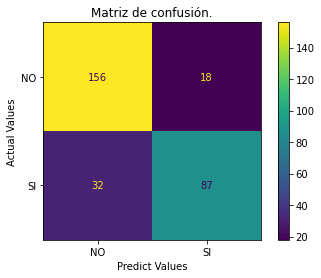

Precision,Recall,Accuracy,F1
0.83,0.73,0.83,0.78


In [14]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [15]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.748|	0.824|	0.816|	0.784|
|Random Forest       |0.871 |	0.739|	0.850|	0.800|
|    SVM_sigmoid        | 0.000 |	0.000|	0.594|	0.000|
|    SVM_rbf        | 0.600 |	0.151|	0.614|	0.242|
| LightGBM_optuna      |0.829|	0.731|	0.829|	0.777|
